In [1]:
#import dask.dataframe as dk
import pandas as pd
import numpy as np
import datetime as dt
import time as time
import matplotlib.pyplot as plt
idx=pd.IndexSlice
from sklearn.metrics import make_scorer, r2_score,accuracy_score,precision_score
from sklearn.externals import joblib
import os
import gc
from sklearn.ensemble import RandomForestClassifier
from sklearn import preprocessing
from tqdm import tqdm
import numba
from numba import jit
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"] = ""

/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


In [2]:
numba.__version__

'0.46.0'

In [3]:
### load Data 
#import tensorflow as tf
import keras as ks

from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

from random import random
from random import randint
from numpy import array
from numpy import zeros
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import BatchNormalization
from keras.layers import TimeDistributed
from keras.layers import Conv1D
from keras.layers import MaxPooling1D
from keras.layers import AveragePooling1D
from keras.callbacks import LambdaCallback
from keras import optimizers
from keras.layers.merge import concatenate
from keras.utils import plot_model
from keras.models import Model
from keras.layers import Input
import multiprocessing



Using TensorFlow backend.


[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 9011651337865128836
, name: "/device:XLA_CPU:0"
device_type: "XLA_CPU"
memory_limit: 17179869184
locality {
}
incarnation: 5215673977754570797
physical_device_desc: "device: XLA_CPU device"
]


In [4]:
from keras.preprocessing.sequence import TimeseriesGenerator
scoring = {'AUC':'roc_auc','Accuracy':make_scorer(accuracy_score)}

In [5]:
mainFrame=pd.read_csv('/beegfs/sr4376/Finance Data/CNN-LSTM Data/correctmainFrame20052015.csv',parse_dates=['date'])
mainFrame.set_index(['entityID','date'],inplace=True)
mainFrame.dropna(axis=0,inplace=True)
mainFrame.sort_index(inplace=True)


In [6]:
normalizedDF=pd.read_csv('/beegfs/sr4376/Finance Data/CNN-LSTM Data/normalizedDF.csv',parse_dates=['date'])
normalizedDF.set_index(['entityID','date'],inplace=True)
normalizedDF.dropna(axis=0,inplace=True)
normalizedDF.sort_index(inplace=True)


In [9]:
crossNormalized=pd.read_csv('/beegfs/sr4376/Finance Data/CNN-LSTM Data/crossNormalized.csv',parse_dates=['date'])
crossNormalized.set_index(['entityID','date'],inplace=True)
crossNormalized.dropna(axis=0,inplace=True)
crossNormalized.sort_index(inplace=True)


In [39]:
DataFrameWithSharpe=pd.read_csv('/beegfs/sr4376/Finance Data/CNN-LSTM Data/DataFrameWithSharpe.csv',parse_dates=['date'])
DataFrameWithSharpe.set_index(['entityID','date'],inplace=True)
DataFrameWithSharpe.dropna(axis=0,inplace=True)
DataFrameWithSharpe.sort_index(inplace=True)

In [44]:
DataFrameWithSharpe

,,return1,return2,return3,return4,return5,return6,return7,return8,return9,return10,...,momentum_ao,ztargetMedian5,ztargetReturns5,ztargetPositive5,ztargetTopDown5,ztargetTop5,ztargetDown5,yReturns5,scaledEW,targetSharpeRatio
entityID,date,,,,,,,,,,,,,,,,,,,,,


In [11]:
targets=mainFrame.iloc[:,-7:]


In [15]:
withoutTarget=mainFrame.iloc[:,:-7]

In [16]:
withoutTarget.columns[131]

'7'

In [41]:
withoutTarget.columns[129:138]

Index(['14', '15', '16', '17', '18', '19', '20', '21', '22'], dtype='object')

In [18]:
withoutTarget.drop(withoutTarget.columns[129:138],axis=1,inplace=True)

In [19]:
withoutTarget.columns[317:]

Index(['volume_adi', 'volume_obv', 'volume_obvm', 'volume_cmf', 'volume_fi',
       'volume_em', 'volume_vpt', 'volume_nvi', 'volatility_atr',
       'volatility_bbh', 'volatility_bbl', 'volatility_bbm', 'volatility_bbhi',
       'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl',
       'volatility_dch', 'volatility_dcl', 'volatility_dchi',
       'volatility_dcli', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff',
       'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos',
       'trend_vortex_ind_neg', 'trend_vortex_diff', 'trend_trix',
       'trend_mass_index', 'trend_cci', 'trend_dpo', 'trend_kst',
       'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_a',
       'trend_ichimoku_b', 'trend_visual_ichimoku_a',
       'trend_visual_ichimoku_b', 'trend_aroon_up', 'trend_aroon_down',
       'trend_aroon_ind', 'momentum_rsi', 'momentum_mfi', 'momentum_tsi',
       'momentum_uo', 'momentum_stoch', 'momentum_stoch_signal', 'momentum_wr',
       'moment

In [20]:
check=withoutTarget[withoutTarget.columns[213:]].describe()

In [17]:
 returnColumns = withoutTarget.columns[:31]  # returns yes
    timestd = withoutTarget.columns[63:93]    #timestd yes
    notNormalizedTA = withoutTarget.columns[213:266] 

IndentationError: unexpected indent (<ipython-input-17-b912c1c27761>, line 2)

In [22]:
returnColumns = withoutTarget.columns[:31]  # returns yes
priceColumns = withoutTarget.columns[31:63] # price yes 
timestd = withoutTarget.columns[63:93]    #timestd yes
crossRank = withoutTarget.columns[93:124] # crossRankRets  no
dates = withoutTarget.columns[124:152] # dates no
crossStd = withoutTarget.columns[152:183] # crossStd yes
crossRankStd = withoutTarget.columns[183:213]  # crossRankStd no
notNormalizedTA = withoutTarget.columns[213:266]  # use for normalization and drop
NormalizedTAButWrong = withoutTarget.columns[266:317] # probably wrong drop
TArankedButWrong = withoutTarget.columns[317:] # probably wrong drop

In [23]:
allData=withoutTarget[dates]

In [27]:
allData=normalizedDF.join(allData,how='left',sort=False)

In [29]:
allData=allData.join(crossNormalized,how='left',sort=False,rsuffix='cross')

In [43]:
DataFrameWithSharpe

,,return1,return2,return3,return4,return5,return6,return7,return8,return9,return10,...,momentum_ao,ztargetMedian5,ztargetReturns5,ztargetPositive5,ztargetTopDown5,ztargetTop5,ztargetDown5,yReturns5,scaledEW,targetSharpeRatio
entityID,date,,,,,,,,,,,,,,,,,,,,,


In [31]:
allData['targetForSharpe']=DataFrameWithSharpe['targetSharpeRatio']

In [33]:
allData=allData.join(targets,how='left',sort=False)

In [37]:
np.sum(allData.isna()).idxmax()

'targetForSharpe'

In [35]:
checkNan.describe()

,return1,return2,return3,return4,return5,return6,return7,return8,return9,return10,...,volume_em_y,volume_vpt_y,volume_nvi_y,volatility_atr_y,targetForSharpe,ztargetReturns5,ztargetTopDown5,ztargetTop5,ztargetDown5,yReturns5
count,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [19]:
(withoutTarget.columns.isin(returnColumns)) | (withoutTarget.columns.isin(priceColumns))  | (withoutTarget.columns.isin(crossStd)) | (withoutTarget.columns.isin(timestd)) | (withoutTarget.columns.isin(notNormalizedTA)) 

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

In [20]:
toNormalize=withoutTarget.loc[:,(withoutTarget.columns.isin(returnColumns)) | (withoutTarget.columns.isin(priceColumns))  | (withoutTarget.columns.isin(crossStd)) | (withoutTarget.columns.isin(timestd)) | (withoutTarget.columns.isin(notNormalizedTA))]


In [21]:
toNormalize

return1   return2   return3   return4   return5  \
entityID date                                                           
1034     2006-03-01  0.028760 -0.015813 -0.012377 -0.015813 -0.020151   
         2006-03-02 -0.025386  0.002645 -0.040797 -0.037448 -0.040797   
         2006-03-03 -0.045829 -0.070051 -0.043306 -0.084756 -0.081561   
         2006-03-06 -0.023151 -0.067920 -0.091581 -0.065455 -0.105946   
         2006-03-07 -0.027237 -0.049758 -0.093307 -0.116324 -0.090909   
...                       ...       ...       ...       ...       ...   
317260   2015-06-18 -0.030340 -0.041966 -0.056671 -0.078431 -0.078431   
         2015-06-19  0.003755 -0.026699 -0.038369 -0.053129 -0.074971   
         2015-06-22  0.031172  0.035044  0.003641 -0.008393 -0.023613   
         2015-06-23  0.015719  0.047382  0.051314  0.019417  0.007194   
         2015-06-24 -0.014286  0.001209  0.032419  0.036295  0.004854   

                      return6   return7   return8   return9  return10  ...  \
entityID date                                                          ...   
1034     2006-03-01  0.014672 -0.004797 -0.022920 -0.010178 -0.009548  ...   
         2006-03-02 -0.045025 -0.011086 -0.030061 -0.047724 -0.035305  ...   
         2006-03-03 -0.084756 -0.088791 -0.056407 -0.074512 -0.091366  ...   
         2006-03-06 -0.102825 -0.105946 -0.109887 -0.078252 -0.095939  ...   
         2006-03-07 -0.130297 -0.127261 -0.130297 -0.134131 -0.103358  ...   
...                       ...       ...       ...       ...       ...  ...   
317260   2015-06-18 -0.092045 -0.069849 -0.067678 -0.084765 -0.084765  ...   
         2015-06-19 -0.074971 -0.088636 -0.066356 -0.064177 -0.081329  ...   
         2015-06-22 -0.046136 -0.046136 -0.060227 -0.037253 -0.035006  ...   
         2015-06-23 -0.008264 -0.031142 -0.031142 -0.045455 -0.022119  ...   
         2015-06-24 -0.007194 -0.022432 -0.044983 -0.044983 -0.059091  ...   

                     trend_aroon_down_x  trend_aroon_ind_x  momentum_rsi_x  \
entityID date                                                                
1034     2006-03-01                96.0              -80.0       45.723852   
         2006-03-02                92.0              -80.0       37.515538   
         2006-03-03               100.0              -92.0       27.494840   
         2006-03-06               100.0              -96.0       23.938583   
         2006-03-07               100.0              -92.0       20.433843   
...                                 ...                ...             ...   
317260   2015-06-18               100.0              -76.0       20.458390   
         2015-06-19                96.0              -76.0       22.886753   
         2015-06-22                92.0              -76.0       40.386463   
         2015-06-23                88.0              -76.0       47.530736   
         2015-06-24                84.0              -76.0       42.150496   

                     momentum_mfi_x  momentum_tsi_x  momentum_uo_x  \
entityID date                                                        
1034     2006-03-01       46.091065       12.437974      46.915751   
         2006-03-02       46.734412       11.250500      45.786644   
         2006-03-03       38.170622        9.306017      32.368327   
         2006-03-06       34.903061        7.180809      32.646095   
         2006-03-07       28.464840        4.849687      31.302103   
...                             ...             ...            ...   
317260   2015-06-18       16.942521      -14.109799      35.626917   
         2015-06-19       28.933698      -14.873546      33.514613   
         2015-06-22       28.876815      -15.095707      37.821427   
         2015-06-23       36.876317      -15.051132      39.535072   
         2015-06-24       37.864896      -15.178625      38.653679   

                     momentum_stoch_x  momentum_stoch_signal_x  momentum_wr_x  \
entityID date                                     

In [22]:
new_df=toNormalize.loc[1034]

In [20]:
def rank(array):
        s = pd.Series(array)
        return s.rank(pct=True)[len(s)-1]
ranked =new_df.expanding(21).apply(rank,raw=True)

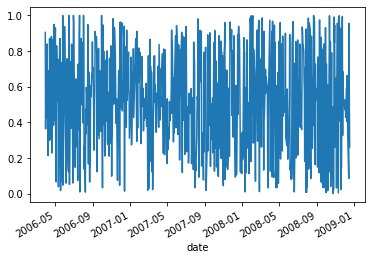

In [21]:
ranked['return1'].plot()

In [23]:

normalizedDF=None
@jit(nopython=True,parallel = False)
def rank(array):
        s = pd.Series(array)
        return s.rank(pct=True)[len(s)-1]
    
@jit(nopython=True,parallel = False)
def normalize(array):
        meanToFast = np.mean(array)
        stdToFast = np.std(array)
        normalize = (array-meanToFast)/stdToFast
        return normalize[len(normalize)-1]
for entityID, new_df in tqdm(toNormalize.groupby(level=0)):


    starttime =time.time()
    print(starttime)
    columns=new_df.columns
    for jj in columns:
        new_df[jj]= new_df[jj].astype(float)
        new_df[jj]=pd.to_numeric(new_df[jj])

    #ranked =new_df.expanding(21).window().expanding().Expanding().apply(rank,kwgs={"use_numba_cache":"numba"},raw=True)
    ranked =new_df.rolling(252).apply(normalize,engine="numba",raw=True)
    
    if normalizedDF is None:
        normalizedDF=ranked
    else:
        normalizedDF=normalizedDF.append(ranked)
    

  0%|          | 0/5460 [00:00<?, ?it/s]

1588444095.9478705


/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  0%|          | 1/5460 [00:06<10:17:16,  6.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

1588444098.0160742


  0%|          | 2/5460 [00:07<7:37:51,  5.03s/it] /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444098.9630184


  0%|          | 3/5460 [00:08<5:49:36,  3.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444100.0320787


  0%|          | 4/5460 [00:09<4:17:26,  2.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444100.5000331


  0%|          | 5/5460 [00:10<3:33:32,  2.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444101.7235022


  0%|          | 6/5460 [00:11<2:58:48,  1.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444102.7998178


  0%|          | 7/5460 [00:12<2:35:24,  1.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444103.910852


  0%|          | 8/5460 [00:13<2:05:58,  1.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444104.541636


  0%|          | 9/5460 [00:14<1:58:11,  1.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444105.6432066


  0%|          | 10/5460 [00:14<1:36:47,  1.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444106.1597567


  0%|          | 11/5460 [00:15<1:20:25,  1.13it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444106.6252522


  0%|          | 12/5460 [00:16<1:26:21,  1.05it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444107.7290516


  0%|          | 13/5460 [00:17<1:16:59,  1.18it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444108.3369327


  0%|          | 14/5460 [00:18<1:34:41,  1.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444109.839235


  0%|          | 15/5460 [00:20<1:50:56,  1.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444111.4763877


  0%|          | 16/5460 [00:22<2:06:22,  1.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444113.2667725


  0%|          | 17/5460 [00:23<1:58:41,  1.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444114.3785868


  0%|          | 18/5460 [00:24<2:05:52,  1.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444115.9508057


  0%|          | 19/5460 [00:25<1:52:46,  1.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444116.858267


  0%|          | 20/5460 [00:26<1:49:39,  1.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444117.9877484


  0%|          | 21/5460 [00:27<1:48:30,  1.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444119.1710815


  0%|          | 22/5460 [00:28<1:44:14,  1.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444120.2086706


  0%|          | 23/5460 [00:30<1:45:05,  1.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444121.3904839


  0%|          | 24/5460 [00:32<2:13:39,  1.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444123.6024544


  0%|          | 25/5460 [00:34<2:28:47,  1.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444125.6354547


  0%|          | 26/5460 [00:36<2:43:49,  1.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444127.829976


  0%|          | 27/5460 [00:38<2:55:21,  1.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444130.0550172


  1%|          | 28/5460 [00:40<2:44:51,  1.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444131.6133058


  1%|          | 29/5460 [00:42<3:05:30,  2.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444134.2004838


  1%|          | 30/5460 [00:44<3:04:25,  2.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444136.2052038


  1%|          | 31/5460 [00:47<3:12:11,  2.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444138.524877


  1%|          | 32/5460 [00:49<3:14:59,  2.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444140.7683425


  1%|          | 33/5460 [00:51<3:18:21,  2.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444143.04108


  1%|          | 34/5460 [00:54<3:21:50,  2.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444145.3660705


  1%|          | 35/5460 [00:56<3:24:01,  2.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444147.680386


  1%|          | 36/5460 [00:57<3:01:51,  2.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444149.1181


  1%|          | 37/5460 [01:00<3:15:59,  2.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444151.6451502


  1%|          | 38/5460 [01:01<2:51:33,  1.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444152.913952


  1%|          | 39/5460 [01:02<2:25:11,  1.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444153.8480697


  1%|          | 40/5460 [01:04<2:44:29,  1.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444156.1689608


  1%|          | 41/5460 [01:05<2:18:41,  1.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444157.034595


  1%|          | 42/5460 [01:08<2:39:48,  1.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444159.3466737


  1%|          | 43/5460 [01:10<2:54:03,  1.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444161.65066


  1%|          | 44/5460 [01:11<2:28:11,  1.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444162.631763


  1%|          | 45/5460 [01:14<3:05:59,  2.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444165.6674848


  1%|          | 46/5460 [01:16<3:04:02,  2.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444167.6618178


  1%|          | 47/5460 [01:19<3:30:28,  2.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444170.662527


  1%|          | 48/5460 [01:22<3:59:19,  2.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444174.0631876


  1%|          | 49/5460 [01:26<4:18:56,  2.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444177.4501672


  1%|          | 50/5460 [01:29<4:34:18,  3.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444180.8875084


  1%|          | 51/5460 [01:32<4:42:28,  3.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444184.2388291


  1%|          | 52/5460 [01:34<4:00:17,  2.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444185.8205523


  1%|          | 53/5460 [01:38<4:22:15,  2.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444189.2902002


  1%|          | 54/5460 [01:41<4:31:18,  3.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444192.5323484


  1%|          | 55/5460 [01:43<4:04:00,  2.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444194.5438008


  1%|          | 56/5460 [01:44<3:29:58,  2.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444196.0008543


  1%|          | 57/5460 [01:48<4:03:24,  2.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444199.5648327


  1%|          | 58/5460 [01:51<4:27:06,  2.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444203.1470308


  1%|          | 59/5460 [01:53<3:48:25,  2.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444204.6922448


  1%|          | 60/5460 [01:57<4:17:04,  2.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444208.2843812


  1%|          | 61/5460 [01:59<4:01:01,  2.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444210.5413458


  1%|          | 62/5460 [02:01<3:56:08,  2.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444213.0470712


  1%|          | 63/5460 [02:03<3:25:36,  2.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444214.542205


  1%|          | 64/5460 [02:07<4:15:43,  2.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444218.6952245


  1%|          | 65/5460 [02:11<4:38:41,  3.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444222.383029


  1%|          | 66/5460 [02:12<3:54:42,  2.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444223.8514414


  1%|          | 67/5460 [02:14<3:44:23,  2.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444226.081534


  1%|          | 68/5460 [02:17<4:00:57,  2.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444229.1874878


  1%|▏         | 69/5460 [02:19<3:37:52,  2.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444231.022254


  1%|▏         | 70/5460 [02:21<3:12:36,  2.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444232.507571


  1%|▏         | 71/5460 [02:24<3:32:21,  2.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444235.3959565


  1%|▏         | 72/5460 [02:27<3:58:37,  2.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444238.739893


  1%|▏         | 73/5460 [02:30<3:57:00,  2.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444241.3344903


  1%|▏         | 74/5460 [02:33<4:28:40,  2.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444245.142373


  1%|▏         | 75/5460 [02:37<4:49:22,  3.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444248.9067123


  1%|▏         | 76/5460 [02:41<5:04:16,  3.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444252.6961508


  1%|▏         | 77/5460 [02:45<5:14:49,  3.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444256.4709942


  1%|▏         | 78/5460 [02:46<4:25:12,  2.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444258.151219


  1%|▏         | 79/5460 [02:50<4:45:22,  3.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444261.8500896


  1%|▏         | 80/5460 [02:54<4:58:17,  3.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444265.505934


  1%|▏         | 81/5460 [02:58<5:26:08,  3.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444269.8828626


  2%|▏         | 82/5460 [03:02<5:27:41,  3.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444273.586597


  2%|▏         | 83/5460 [03:05<5:02:58,  3.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444276.3110156


  2%|▏         | 84/5460 [03:07<4:37:13,  3.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444278.745617


  2%|▏         | 85/5460 [03:08<3:46:52,  2.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444279.9562178


  2%|▏         | 86/5460 [03:11<3:44:38,  2.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444282.407157


  2%|▏         | 87/5460 [03:13<3:39:37,  2.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444284.736929


  2%|▏         | 88/5460 [03:14<3:10:12,  2.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444286.1018703


  2%|▏         | 89/5460 [03:17<3:19:35,  2.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444288.5769374


  2%|▏         | 90/5460 [03:18<2:52:10,  1.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444289.786877


  2%|▏         | 91/5460 [03:21<3:20:25,  2.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444292.7604837


  2%|▏         | 92/5460 [03:22<2:50:22,  1.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444293.8858871


  2%|▏         | 93/5460 [03:25<3:07:18,  2.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444296.4114983


  2%|▏         | 94/5460 [03:27<3:07:15,  2.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444298.502775


  2%|▏         | 95/5460 [03:29<3:18:34,  2.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444301.019392


  2%|▏         | 96/5460 [03:30<2:46:37,  1.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444302.057951


  2%|▏         | 97/5460 [03:33<3:02:43,  2.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444304.5224895


  2%|▏         | 98/5460 [03:35<3:12:49,  2.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444306.9458067


  2%|▏         | 99/5460 [03:37<3:08:24,  2.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444308.9449441


  2%|▏         | 100/5460 [03:40<3:30:57,  2.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444311.8913493


  2%|▏         | 101/5460 [03:42<3:24:07,  2.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444314.004873


  2%|▏         | 102/5460 [03:43<2:54:57,  1.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444315.1897252


  2%|▏         | 103/5460 [03:46<3:09:08,  2.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444317.6929843


  2%|▏         | 104/5460 [03:48<3:16:30,  2.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444320.086907


  2%|▏         | 105/5460 [03:51<3:23:55,  2.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444322.5665052


  2%|▏         | 106/5460 [03:53<3:28:55,  2.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444325.0395815


  2%|▏         | 107/5460 [03:54<2:56:10,  1.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444326.1573997


  2%|▏         | 108/5460 [03:57<3:11:48,  2.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444328.7185357


  2%|▏         | 109/5460 [04:00<3:37:33,  2.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444331.8329852


  2%|▏         | 110/5460 [04:03<3:41:19,  2.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444334.402609


  2%|▏         | 111/5460 [04:04<3:21:50,  2.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444336.1699631


  2%|▏         | 112/5460 [04:06<2:54:25,  1.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444337.4109254


  2%|▏         | 113/5460 [04:08<3:11:11,  2.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444339.995988


  2%|▏         | 114/5460 [04:10<3:12:19,  2.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444342.1723192


  2%|▏         | 115/5460 [04:13<3:21:33,  2.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444344.6898918


  2%|▏         | 116/5460 [04:15<3:28:18,  2.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444347.198827


  2%|▏         | 117/5460 [04:18<3:33:17,  2.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444349.7329307


  2%|▏         | 118/5460 [04:21<3:36:47,  2.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444352.255664


  2%|▏         | 119/5460 [04:23<3:51:07,  2.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444355.234056


  2%|▏         | 120/5460 [04:26<3:49:19,  2.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444357.761672


  2%|▏         | 121/5460 [04:29<3:49:09,  2.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444360.3316321


  2%|▏         | 122/5460 [04:31<3:48:19,  2.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444362.8828533


  2%|▏         | 123/5460 [04:32<3:13:52,  2.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444364.1529045


  2%|▏         | 124/5460 [04:35<3:23:55,  2.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444366.7178106


  2%|▏         | 125/5460 [04:38<3:33:28,  2.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444369.361914


  2%|▏         | 126/5460 [04:40<3:39:21,  2.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444371.992933


  2%|▏         | 127/5460 [04:43<3:43:03,  2.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444374.5972524


  2%|▏         | 128/5460 [04:46<4:02:03,  2.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444377.8239343


  2%|▏         | 129/5460 [04:49<3:58:32,  2.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444380.4174745


  2%|▏         | 130/5460 [04:51<3:55:46,  2.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444382.992151


  2%|▏         | 131/5460 [04:54<3:54:04,  2.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444385.5796175


  2%|▏         | 132/5460 [04:55<3:22:19,  2.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444387.0343463


  2%|▏         | 133/5460 [04:58<3:30:21,  2.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444389.6263032


  2%|▏         | 134/5460 [05:00<3:35:51,  2.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444392.183196


  2%|▏         | 135/5460 [05:03<3:39:34,  2.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444394.7637727


  2%|▏         | 136/5460 [05:06<3:42:11,  2.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444397.3401816


  3%|▎         | 137/5460 [05:08<3:44:52,  2.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444399.936869


  3%|▎         | 138/5460 [05:10<3:21:06,  2.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444401.5797708


  3%|▎         | 139/5460 [05:12<3:11:18,  2.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444403.486011


  3%|▎         | 140/5460 [05:14<3:00:37,  2.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444405.2499485


  3%|▎         | 141/5460 [05:15<2:49:10,  1.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444406.8451192


  3%|▎         | 142/5460 [05:18<3:09:35,  2.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444409.5323703


  3%|▎         | 143/5460 [05:19<2:52:56,  1.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444411.0465791


  3%|▎         | 144/5460 [05:22<3:11:50,  2.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444413.7139428


  3%|▎         | 145/5460 [05:23<2:54:31,  1.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444415.2288535


  3%|▎         | 146/5460 [05:26<3:12:51,  2.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444417.8773463


  3%|▎         | 147/5460 [05:29<3:38:30,  2.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444421.0344727


  3%|▎         | 148/5460 [05:32<3:42:16,  2.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444423.632849


  3%|▎         | 149/5460 [05:35<3:45:40,  2.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444426.27321


  3%|▎         | 150/5460 [05:36<3:26:00,  2.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444428.0910978


  3%|▎         | 151/5460 [05:38<2:59:02,  2.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444429.4098985


  3%|▎         | 152/5460 [05:39<2:41:33,  1.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444430.772151


  3%|▎         | 153/5460 [05:42<3:01:52,  2.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444433.3630724


  3%|▎         | 154/5460 [05:43<2:40:27,  1.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444434.606116


  3%|▎         | 155/5460 [05:44<2:26:58,  1.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444435.913436


  3%|▎         | 156/5460 [05:47<2:46:49,  1.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444438.337971


  3%|▎         | 157/5460 [05:49<2:56:52,  2.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444440.5930357


  3%|▎         | 158/5460 [05:51<2:47:34,  1.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444442.2539468


  3%|▎         | 159/5460 [05:53<3:10:07,  2.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444445.002314


  3%|▎         | 160/5460 [05:55<2:52:55,  1.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444446.509867


  3%|▎         | 161/5460 [05:56<2:46:19,  1.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444448.2199254


  3%|▎         | 162/5460 [05:59<3:08:30,  2.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444450.9378216


  3%|▎         | 163/5460 [06:02<3:23:40,  2.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444453.6424303


  3%|▎         | 164/5460 [06:05<3:33:41,  2.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444456.3368845


  3%|▎         | 165/5460 [06:07<3:39:52,  2.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444458.9898582


  3%|▎         | 166/5460 [06:10<3:44:24,  2.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444461.6569507


  3%|▎         | 167/5460 [06:12<3:28:49,  2.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444463.6105592


  3%|▎         | 168/5460 [06:15<3:37:51,  2.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444466.3159778


  3%|▎         | 169/5460 [06:17<3:35:12,  2.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444468.6934965


  3%|▎         | 170/5460 [06:18<3:05:17,  2.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444470.0031774


  3%|▎         | 171/5460 [06:21<3:20:38,  2.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444472.6766024


  3%|▎         | 172/5460 [06:22<2:59:19,  2.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444474.1635258


  3%|▎         | 173/5460 [06:24<2:43:19,  1.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444475.5862255


  3%|▎         | 174/5460 [06:26<2:57:12,  2.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444477.959128


  3%|▎         | 175/5460 [06:29<3:16:53,  2.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444480.7289534


  3%|▎         | 176/5460 [06:31<3:13:16,  2.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444482.8253138


  3%|▎         | 177/5460 [06:33<3:15:25,  2.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444485.0934694


  3%|▎         | 178/5460 [06:36<3:29:40,  2.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444487.8671584


  3%|▎         | 179/5460 [06:38<3:18:01,  2.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444489.796164


  3%|▎         | 180/5460 [06:41<3:30:52,  2.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444492.5336854


  3%|▎         | 181/5460 [06:44<3:39:02,  2.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444495.2412763


  3%|▎         | 182/5460 [06:46<3:44:26,  2.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444497.944712


  3%|▎         | 183/5460 [06:48<3:16:13,  2.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444499.4283154


  3%|▎         | 184/5460 [06:50<3:28:57,  2.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444502.1358724


  3%|▎         | 185/5460 [06:52<3:04:44,  2.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444503.5958812


  3%|▎         | 186/5460 [06:55<3:20:11,  2.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444506.2918475


  3%|▎         | 187/5460 [06:58<3:44:24,  2.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444509.4999285


  3%|▎         | 188/5460 [07:01<3:49:38,  2.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444512.2352073


  3%|▎         | 189/5460 [07:03<3:52:05,  2.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444514.9550188


  3%|▎         | 190/5460 [07:06<3:55:31,  2.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444517.727384


  3%|▎         | 191/5460 [07:09<3:59:10,  2.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444520.545582


  4%|▎         | 192/5460 [07:11<3:33:38,  2.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444522.3065007


  4%|▎         | 193/5460 [07:13<3:43:28,  2.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444525.1100755


  4%|▎         | 194/5460 [07:15<3:26:34,  2.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444527.0156193


  4%|▎         | 195/5460 [07:17<3:17:24,  2.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444529.0148468


  4%|▎         | 196/5460 [07:19<2:58:06,  2.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444530.533233


  4%|▎         | 197/5460 [07:21<3:13:34,  2.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444533.157404


  4%|▎         | 198/5460 [07:25<3:42:42,  2.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444536.4804883


  4%|▎         | 199/5460 [07:28<3:48:49,  2.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444539.2436085


  4%|▎         | 200/5460 [07:30<3:48:42,  2.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444541.855594


  4%|▎         | 201/5460 [07:33<3:50:09,  2.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444544.52688


  4%|▎         | 202/5460 [07:35<3:50:13,  2.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444547.151677


  4%|▎         | 203/5460 [07:38<3:51:30,  2.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444549.8344762


  4%|▎         | 204/5460 [07:41<3:54:49,  2.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444552.592124


  4%|▍         | 205/5460 [07:44<3:57:13,  2.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444555.3659794


  4%|▍         | 206/5460 [07:46<3:59:08,  2.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444558.1497686


  4%|▍         | 207/5460 [07:49<4:02:13,  2.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444560.999248


  4%|▍         | 208/5460 [07:53<4:18:34,  2.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444564.3990343


  4%|▍         | 209/5460 [07:56<4:16:27,  2.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444567.270677


  4%|▍         | 210/5460 [07:58<4:14:07,  2.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444570.1238506


  4%|▍         | 211/5460 [08:00<3:50:29,  2.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444572.1144853


  4%|▍         | 212/5460 [08:02<3:25:35,  2.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444573.8111188


  4%|▍         | 213/5460 [08:04<3:20:40,  2.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444575.9842887


  4%|▍         | 214/5460 [08:07<3:33:40,  2.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444578.7655308


  4%|▍         | 215/5460 [08:08<3:06:06,  2.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444580.1663969


  4%|▍         | 216/5460 [08:11<3:10:52,  2.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444582.4697833


  4%|▍         | 217/5460 [08:14<3:27:05,  2.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444585.2865329


  4%|▍         | 218/5460 [08:16<3:37:36,  2.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444588.0589402


  4%|▍         | 219/5460 [08:18<3:26:35,  2.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444590.118258


  4%|▍         | 220/5460 [08:21<3:37:53,  2.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444592.9232018


  4%|▍         | 221/5460 [08:24<3:47:12,  2.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444595.7738292


  4%|▍         | 222/5460 [08:27<3:52:01,  2.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444598.5581236


  4%|▍         | 223/5460 [08:30<3:58:55,  2.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444601.474195


  4%|▍         | 224/5460 [08:32<3:48:41,  2.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444603.839309


  4%|▍         | 225/5460 [08:35<3:46:40,  2.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444606.3797276


  4%|▍         | 226/5460 [08:36<3:16:00,  2.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444607.8072617


  4%|▍         | 227/5460 [08:38<2:57:39,  2.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444609.3518705


  4%|▍         | 228/5460 [08:41<3:20:18,  2.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444612.2588234


  4%|▍         | 229/5460 [08:44<3:50:21,  2.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444615.6939218


  4%|▍         | 230/5460 [08:46<3:38:31,  2.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444617.8851686


  4%|▍         | 231/5460 [08:49<3:47:44,  2.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444620.7587821


  4%|▍         | 232/5460 [08:52<3:52:49,  2.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444623.5652266


  4%|▍         | 233/5460 [08:55<3:55:44,  2.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444626.3479686


  4%|▍         | 234/5460 [08:56<3:21:54,  2.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444627.7542033


  4%|▍         | 235/5460 [08:57<2:54:35,  2.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444629.035403


  4%|▍         | 236/5460 [08:58<2:31:01,  1.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444630.1449099


  4%|▍         | 237/5460 [09:00<2:26:18,  1.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444631.6999323


  4%|▍         | 238/5460 [09:03<2:50:07,  1.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444634.2866743


  4%|▍         | 239/5460 [09:05<3:06:34,  2.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444636.8791344


  4%|▍         | 240/5460 [09:08<3:26:40,  2.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444639.7831898


  4%|▍         | 241/5460 [09:09<3:01:41,  2.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444641.207485


  4%|▍         | 242/5460 [09:12<3:24:37,  2.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444644.18449


  4%|▍         | 243/5460 [09:14<3:12:33,  2.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444646.0737596


  4%|▍         | 244/5460 [09:17<3:30:23,  2.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444648.9806192


  4%|▍         | 245/5460 [09:20<3:42:42,  2.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444651.8699472


  5%|▍         | 246/5460 [09:23<3:50:28,  2.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444654.728053


  5%|▍         | 247/5460 [09:24<3:08:01,  2.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444655.7442758


  5%|▍         | 248/5460 [09:25<2:29:57,  1.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444656.4492123


  5%|▍         | 249/5460 [09:26<2:21:13,  1.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444657.8411472


  5%|▍         | 250/5460 [09:27<1:57:15,  1.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444658.5483541


  5%|▍         | 251/5460 [09:29<2:09:44,  1.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444660.3788877


  5%|▍         | 252/5460 [09:30<2:11:51,  1.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444661.9556077


  5%|▍         | 253/5460 [09:33<2:34:48,  1.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444664.3571603


  5%|▍         | 254/5460 [09:36<3:04:33,  2.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444667.28543


  5%|▍         | 255/5460 [09:37<2:50:57,  1.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444668.8982265


  5%|▍         | 256/5460 [09:39<2:41:24,  1.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444670.500528


  5%|▍         | 257/5460 [09:42<3:10:10,  2.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444673.4636772


  5%|▍         | 258/5460 [09:45<3:31:17,  2.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444676.470158


  5%|▍         | 259/5460 [09:46<3:12:27,  2.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444678.1939805


  5%|▍         | 260/5460 [09:48<3:04:08,  2.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444680.0938258


  5%|▍         | 261/5460 [09:50<3:03:38,  2.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444682.1997452


  5%|▍         | 262/5460 [09:54<3:40:25,  2.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444685.7448432


  5%|▍         | 263/5460 [09:57<3:51:39,  2.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444688.7194061


  5%|▍         | 264/5460 [10:00<4:09:24,  2.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444692.08


  5%|▍         | 265/5460 [10:04<4:23:14,  3.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444695.4864044


  5%|▍         | 266/5460 [10:06<3:59:52,  2.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444697.6242502


  5%|▍         | 267/5460 [10:09<4:15:24,  2.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444700.995066


  5%|▍         | 268/5460 [10:11<3:51:30,  2.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444703.0369127


  5%|▍         | 269/5460 [10:14<3:53:18,  2.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444705.786689


  5%|▍         | 270/5460 [10:18<4:13:34,  2.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444709.2626765


  5%|▍         | 271/5460 [10:21<4:29:09,  3.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444712.7871745


  5%|▍         | 272/5460 [10:24<4:28:27,  3.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444715.886862


  5%|▌         | 273/5460 [10:27<4:17:17,  2.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444718.5639324


  5%|▌         | 274/5460 [10:30<4:31:36,  3.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444722.0939803


  5%|▌         | 275/5460 [10:33<4:09:59,  2.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444724.3990571


  5%|▌         | 276/5460 [10:35<3:50:23,  2.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444726.5398362


  5%|▌         | 277/5460 [10:38<4:09:40,  2.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444729.9495344


  5%|▌         | 278/5460 [10:41<4:05:04,  2.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444732.6690176


  5%|▌         | 279/5460 [10:44<4:20:13,  3.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444736.088244


  5%|▌         | 280/5460 [10:47<4:01:39,  2.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444738.3800917


  5%|▌         | 281/5460 [10:50<4:17:10,  2.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444741.792943


  5%|▌         | 282/5460 [10:54<4:29:37,  3.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444745.2424824


  5%|▌         | 283/5460 [10:56<4:02:13,  2.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444747.3110015


  5%|▌         | 284/5460 [11:00<4:40:14,  3.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444751.6009762


  5%|▌         | 285/5460 [11:03<4:31:57,  3.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444754.5191834


  5%|▌         | 286/5460 [11:06<4:43:29,  3.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444758.132939


  5%|▌         | 287/5460 [11:10<4:50:08,  3.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444761.6712756


  5%|▌         | 288/5460 [11:12<4:18:46,  3.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444763.8210123


  5%|▌         | 289/5460 [11:16<4:30:41,  3.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444767.29533


  5%|▌         | 290/5460 [11:18<4:08:28,  2.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444769.5814693


  5%|▌         | 291/5460 [11:21<4:24:04,  3.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444773.058156


  5%|▌         | 292/5460 [11:25<4:35:28,  3.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444776.573316


  5%|▌         | 293/5460 [11:27<4:06:32,  2.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444778.6469514


  5%|▌         | 294/5460 [11:29<3:47:23,  2.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444780.7824764


  5%|▌         | 295/5460 [11:33<4:10:01,  2.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444784.302951


  5%|▌         | 296/5460 [11:35<4:08:12,  2.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444787.131212


  5%|▌         | 297/5460 [11:39<4:28:11,  3.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444790.7985656


  5%|▌         | 298/5460 [11:41<4:04:16,  2.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444792.9771702


  5%|▌         | 299/5460 [11:45<4:24:54,  3.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444796.618217


  5%|▌         | 300/5460 [11:48<4:38:29,  3.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444800.2363834


  6%|▌         | 301/5460 [11:52<4:47:18,  3.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444803.821954


  6%|▌         | 302/5460 [11:56<4:53:08,  3.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444807.3939703


  6%|▌         | 303/5460 [11:58<4:23:20,  3.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444809.6346102


  6%|▌         | 304/5460 [12:01<4:11:43,  2.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444812.261707


  6%|▌         | 305/5460 [12:03<3:50:47,  2.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444814.3834767


  6%|▌         | 306/5460 [12:06<4:14:02,  2.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444817.9594245


  6%|▌         | 307/5460 [12:10<4:46:21,  3.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444822.1825912


  6%|▌         | 308/5460 [12:14<4:51:46,  3.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444825.732548


  6%|▌         | 309/5460 [12:16<4:17:43,  3.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444827.8108397


  6%|▌         | 310/5460 [12:20<4:32:05,  3.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444831.3600118


  6%|▌         | 311/5460 [12:22<4:11:29,  2.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444833.7445333


  6%|▌         | 312/5460 [12:26<4:27:35,  3.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444837.3025603


  6%|▌         | 313/5460 [12:29<4:38:03,  3.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444840.8295488


  6%|▌         | 314/5460 [12:32<4:29:54,  3.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444843.756569


  6%|▌         | 315/5460 [12:36<4:38:49,  3.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444847.2541258


  6%|▌         | 316/5460 [12:39<4:35:05,  3.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444850.3605385


  6%|▌         | 317/5460 [12:41<4:06:34,  2.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444852.4496422


  6%|▌         | 318/5460 [12:44<4:22:12,  3.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444855.9485428


  6%|▌         | 319/5460 [12:47<4:12:22,  2.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444858.627536


  6%|▌         | 320/5460 [12:49<3:51:37,  2.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444860.7675333


  6%|▌         | 321/5460 [12:52<3:52:01,  2.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444863.4833505


  6%|▌         | 322/5460 [12:54<3:50:20,  2.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444866.1351733


  6%|▌         | 323/5460 [12:57<3:55:55,  2.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444869.0306733


  6%|▌         | 324/5460 [13:00<4:02:42,  2.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444872.0645628


  6%|▌         | 325/5460 [13:03<4:07:38,  2.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444875.0859563


  6%|▌         | 326/5460 [13:06<4:05:08,  2.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444877.8925629


  6%|▌         | 327/5460 [13:08<3:45:16,  2.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444879.9845512


  6%|▌         | 328/5460 [13:10<3:18:07,  2.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444881.5615125


  6%|▌         | 329/5460 [13:13<3:35:13,  2.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444884.5336182


  6%|▌         | 330/5460 [13:16<4:02:32,  2.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444888.1169953


  6%|▌         | 331/5460 [13:19<4:06:18,  2.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444891.1050172


  6%|▌         | 332/5460 [13:22<3:52:51,  2.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444893.466247


  6%|▌         | 333/5460 [13:23<3:26:52,  2.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444895.173781


  6%|▌         | 334/5460 [13:26<3:22:13,  2.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444897.4331274


  6%|▌         | 335/5460 [13:28<3:21:34,  2.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444899.7627995


  6%|▌         | 336/5460 [13:30<3:02:20,  2.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444901.3689973


  6%|▌         | 337/5460 [13:32<3:18:20,  2.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444904.129955


  6%|▌         | 338/5460 [13:35<3:35:56,  2.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444907.1540895


  6%|▌         | 339/5460 [13:38<3:49:53,  2.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444910.2176356


  6%|▌         | 340/5460 [13:42<3:59:00,  2.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444913.2815661


  6%|▌         | 341/5460 [13:45<4:06:25,  2.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444916.369042


  6%|▋         | 342/5460 [13:47<3:58:47,  2.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444918.9538832


  6%|▋         | 343/5460 [13:49<3:29:54,  2.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444920.635726


  6%|▋         | 344/5460 [13:52<3:45:53,  2.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444923.7135935


  6%|▋         | 345/5460 [13:55<3:55:09,  2.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444926.7338166


  6%|▋         | 346/5460 [13:58<4:01:25,  2.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444929.7349901


  6%|▋         | 347/5460 [14:01<3:55:34,  2.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444932.3505483


  6%|▋         | 348/5460 [14:04<4:01:47,  2.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444935.354537


  6%|▋         | 349/5460 [14:07<4:06:04,  2.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444938.3666897


  6%|▋         | 350/5460 [14:10<4:09:53,  2.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444941.404219


  6%|▋         | 351/5460 [14:13<4:12:15,  2.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444944.4407728


  6%|▋         | 352/5460 [14:15<3:44:47,  2.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444946.3137114


  6%|▋         | 353/5460 [14:17<3:49:09,  2.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444949.1329064


  6%|▋         | 354/5460 [14:23<5:05:17,  3.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444954.8002741


  7%|▋         | 355/5460 [14:26<4:56:09,  3.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444958.0458677


  7%|▋         | 356/5460 [14:30<4:58:31,  3.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444961.6241374


  7%|▋         | 357/5460 [14:35<5:27:31,  3.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444966.2561388


  7%|▋         | 358/5460 [14:38<5:23:12,  3.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444969.9581318


  7%|▋         | 359/5460 [14:41<4:50:06,  3.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444972.4631176


  7%|▋         | 360/5460 [14:45<5:08:24,  3.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444976.5782776


  7%|▋         | 361/5460 [14:49<5:31:34,  3.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444981.117561


  7%|▋         | 362/5460 [14:52<4:56:23,  3.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444983.6412528


  7%|▋         | 363/5460 [14:56<5:23:43,  3.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444988.2116587


  7%|▋         | 364/5460 [14:59<4:55:08,  3.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444990.8958254


  7%|▋         | 365/5460 [15:04<5:22:51,  3.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444995.4788742


  7%|▋         | 366/5460 [15:06<4:50:09,  3.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588444997.9965575


  7%|▋         | 367/5460 [15:09<4:41:04,  3.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445001.0595663


  7%|▋         | 368/5460 [15:12<4:35:58,  3.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445004.1705582


  7%|▋         | 369/5460 [15:16<4:32:51,  3.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445007.304774


  7%|▋         | 370/5460 [15:19<4:31:44,  3.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445010.478554


  7%|▋         | 371/5460 [15:22<4:30:19,  3.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445013.6246736


  7%|▋         | 372/5460 [15:25<4:29:17,  3.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445016.7642112


  7%|▋         | 373/5460 [15:27<3:52:24,  2.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445018.504643


  7%|▋         | 374/5460 [15:29<3:28:44,  2.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445020.3165734


  7%|▋         | 375/5460 [15:32<3:44:27,  2.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445023.3940175


  7%|▋         | 376/5460 [15:35<3:55:14,  2.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445026.4681659


  7%|▋         | 377/5460 [15:38<4:03:25,  2.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445029.5610895


  7%|▋         | 378/5460 [15:41<3:59:02,  2.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445032.2641234


  7%|▋         | 379/5460 [15:44<4:05:24,  2.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445035.3479636


  7%|▋         | 380/5460 [15:47<4:11:20,  2.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445038.471977


  7%|▋         | 381/5460 [15:50<4:13:55,  3.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445041.5514286


  7%|▋         | 382/5460 [15:53<4:17:46,  3.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445044.7109268


  7%|▋         | 383/5460 [15:56<4:21:21,  3.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445047.886704


  7%|▋         | 384/5460 [15:58<3:48:03,  2.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445049.6775324


  7%|▋         | 385/5460 [16:01<3:59:23,  2.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445052.8148804


  7%|▋         | 386/5460 [16:04<4:09:34,  2.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445056.0430298


  7%|▋         | 387/5460 [16:06<3:43:49,  2.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445057.9880512


  7%|▋         | 388/5460 [16:08<3:27:57,  2.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445060.009348


  7%|▋         | 389/5460 [16:10<3:16:21,  2.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445062.0215766


  7%|▋         | 390/5460 [16:13<3:35:50,  2.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445065.114133


  7%|▋         | 391/5460 [16:17<4:06:26,  2.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445068.8785512


  7%|▋         | 392/5460 [16:20<4:11:49,  2.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445072.0014887


  7%|▋         | 393/5460 [16:23<4:00:00,  2.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445074.5139542


  7%|▋         | 394/5460 [16:26<4:06:36,  2.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445077.6278324


  7%|▋         | 395/5460 [16:28<3:37:45,  2.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445079.41116


  7%|▋         | 396/5460 [16:31<3:51:47,  2.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445082.549557


  7%|▋         | 397/5460 [16:34<4:02:28,  2.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445085.720896


  7%|▋         | 398/5460 [16:36<3:42:44,  2.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445087.8156316


  7%|▋         | 399/5460 [16:38<3:20:24,  2.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445089.5693588


  7%|▋         | 400/5460 [16:41<3:42:27,  2.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445092.8209412


  7%|▋         | 401/5460 [16:43<3:27:19,  2.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445094.8599818


  7%|▋         | 402/5460 [16:45<3:15:33,  2.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445096.8606374


  7%|▋         | 403/5460 [16:48<3:38:56,  2.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445100.1065927


  7%|▋         | 404/5460 [16:52<3:53:57,  2.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445103.2944815


  7%|▋         | 405/5460 [16:53<3:28:31,  2.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445105.061683


  7%|▋         | 406/5460 [16:56<3:45:48,  2.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445108.232567


  7%|▋         | 407/5460 [17:00<3:57:57,  2.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445111.3931007


  7%|▋         | 408/5460 [17:03<4:06:48,  2.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445114.5615695


  7%|▋         | 409/5460 [17:05<3:38:10,  2.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445116.3664317


  8%|▊         | 410/5460 [17:08<3:52:47,  2.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445119.5455666


  8%|▊         | 411/5460 [17:11<4:03:01,  2.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445122.7061064


  8%|▊         | 412/5460 [17:14<4:10:29,  2.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445125.9046717


  8%|▊         | 413/5460 [17:17<4:17:21,  3.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445129.1530535


  8%|▊         | 414/5460 [17:21<4:22:36,  3.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445132.4226713


  8%|▊         | 415/5460 [17:24<4:18:24,  3.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445135.3784635


  8%|▊         | 416/5460 [17:27<4:22:42,  3.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445138.6230907


  8%|▊         | 417/5460 [17:30<4:13:40,  3.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445141.390417


  8%|▊         | 418/5460 [17:33<4:10:34,  2.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445144.2832255


  8%|▊         | 419/5460 [17:35<4:00:49,  2.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445146.8925703


  8%|▊         | 420/5460 [17:38<4:01:40,  2.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445149.794557


  8%|▊         | 421/5460 [17:40<3:35:40,  2.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445151.6289566


  8%|▊         | 422/5460 [17:43<3:51:32,  2.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445154.841577


  8%|▊         | 423/5460 [17:46<4:02:35,  2.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445158.0319097


  8%|▊         | 424/5460 [17:48<3:35:16,  2.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445159.8433287


  8%|▊         | 425/5460 [17:51<3:51:21,  2.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445163.0510607


  8%|▊         | 426/5460 [17:53<3:27:41,  2.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445164.8704553


  8%|▊         | 427/5460 [17:56<3:44:43,  2.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445168.0120642


  8%|▊         | 428/5460 [18:00<4:17:25,  3.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445172.001872


  8%|▊         | 429/5460 [18:02<3:53:25,  2.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445174.119285


  8%|▊         | 430/5460 [18:05<3:37:29,  2.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445176.2714646


  8%|▊         | 431/5460 [18:08<3:56:39,  2.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445179.6200225


  8%|▊         | 432/5460 [18:11<4:00:41,  2.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445182.6186109


  8%|▊         | 433/5460 [18:13<3:37:34,  2.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445184.5632124


  8%|▊         | 434/5460 [18:16<3:52:23,  2.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445187.7615862


  8%|▊         | 435/5460 [18:19<3:45:12,  2.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445190.2455986


  8%|▊         | 436/5460 [18:22<3:59:11,  2.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445193.4951546


  8%|▊         | 437/5460 [18:25<4:08:59,  2.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445196.734967


  8%|▊         | 438/5460 [18:27<3:45:01,  2.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445198.769586


  8%|▊         | 439/5460 [18:30<3:58:35,  2.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445201.9870331


  8%|▊         | 440/5460 [18:33<4:07:50,  2.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445205.2264016


  8%|▊         | 441/5460 [18:38<4:34:31,  3.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445209.2486095


  8%|▊         | 442/5460 [18:40<4:23:42,  3.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445212.096546


  8%|▊         | 443/5460 [18:44<4:29:27,  3.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445215.4738076


  8%|▊         | 444/5460 [18:46<4:00:28,  2.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445217.542595


  8%|▊         | 445/5460 [18:49<4:11:35,  3.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445220.8775842


  8%|▊         | 446/5460 [18:52<4:13:09,  3.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445223.9390275


  8%|▊         | 447/5460 [18:54<3:43:39,  2.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445225.8006134


  8%|▊         | 448/5460 [18:57<3:58:12,  2.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445229.055375


  8%|▊         | 449/5460 [18:59<3:37:33,  2.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445231.094565


  8%|▊         | 450/5460 [19:03<3:53:54,  2.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445234.354561


  8%|▊         | 451/5460 [19:05<3:37:18,  2.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445236.4819674


  8%|▊         | 452/5460 [19:08<3:50:43,  2.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445239.632079


  8%|▊         | 453/5460 [19:10<3:41:30,  2.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445242.0303874


  8%|▊         | 454/5460 [19:13<3:43:23,  2.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445244.759035


  8%|▊         | 455/5460 [19:16<3:59:30,  2.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445248.0879


  8%|▊         | 456/5460 [19:20<4:10:12,  3.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445251.3760245


  8%|▊         | 457/5460 [19:22<3:42:47,  2.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445253.2843974


  8%|▊         | 458/5460 [19:24<3:31:53,  2.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445255.532551


  8%|▊         | 459/5460 [19:27<3:47:03,  2.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445258.6826727


  8%|▊         | 460/5460 [19:29<3:28:59,  2.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445260.6860135


  8%|▊         | 461/5460 [19:33<4:00:59,  2.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445264.4759717


  8%|▊         | 462/5460 [19:36<3:58:32,  2.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445267.2592375


  8%|▊         | 463/5460 [19:40<4:31:21,  3.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445271.451003


  8%|▊         | 464/5460 [19:43<4:22:20,  3.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445274.3380992


  9%|▊         | 465/5460 [19:47<4:50:18,  3.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445278.6101596


  9%|▊         | 466/5460 [19:50<4:52:21,  3.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445282.182219


  9%|▊         | 467/5460 [19:55<5:29:11,  3.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445287.1732805


  9%|▊         | 468/5460 [19:59<5:18:17,  3.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445290.706988


  9%|▊         | 469/5460 [20:03<5:31:03,  3.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445295.0342605


  9%|▊         | 470/5460 [20:08<5:38:53,  4.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445299.3300543


  9%|▊         | 471/5460 [20:11<5:30:18,  3.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445303.07667


  9%|▊         | 472/5460 [20:16<5:35:27,  4.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445307.257232


  9%|▊         | 473/5460 [20:20<5:38:34,  4.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445311.4081619


  9%|▊         | 474/5460 [20:24<5:42:06,  4.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445315.626126


  9%|▊         | 475/5460 [20:28<5:42:27,  4.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445319.7728786


  9%|▊         | 476/5460 [20:31<5:12:28,  3.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445322.6811337


  9%|▊         | 477/5460 [20:35<5:21:24,  3.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445326.8166385


  9%|▉         | 478/5460 [20:39<5:29:17,  3.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445330.9939258


  9%|▉         | 479/5460 [20:44<5:38:43,  4.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445335.3401036


  9%|▉         | 480/5460 [20:48<5:52:38,  4.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445339.9821584


  9%|▉         | 481/5460 [20:52<5:34:17,  4.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445343.5090635


  9%|▉         | 482/5460 [20:55<5:21:49,  3.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445347.040079


  9%|▉         | 483/5460 [20:59<5:16:28,  3.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445350.7056887


  9%|▉         | 484/5460 [21:02<4:57:10,  3.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445353.73567


  9%|▉         | 485/5460 [21:05<4:38:18,  3.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445356.5756705


  9%|▉         | 486/5460 [21:07<4:15:48,  3.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445359.0300303


  9%|▉         | 487/5460 [21:10<3:55:47,  2.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445361.3120193


  9%|▉         | 488/5460 [21:13<4:11:04,  3.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445364.761273


  9%|▉         | 489/5460 [21:16<4:12:01,  3.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445367.8312545


  9%|▉         | 490/5460 [21:20<4:23:10,  3.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445371.3245144


  9%|▉         | 491/5460 [21:23<4:25:34,  3.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445374.600612


  9%|▉         | 492/5460 [21:27<4:51:56,  3.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445378.8701465


  9%|▉         | 493/5460 [21:31<5:06:56,  3.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445383.002136


  9%|▉         | 494/5460 [21:37<5:46:24,  4.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445388.3019447


  9%|▉         | 495/5460 [21:41<5:52:00,  4.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445392.7158353


  9%|▉         | 496/5460 [21:44<5:24:43,  3.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445395.8728585


  9%|▉         | 497/5460 [21:48<5:33:06,  4.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445400.150718


  9%|▉         | 498/5460 [21:53<5:38:38,  4.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445404.396232


  9%|▉         | 499/5460 [21:57<5:46:01,  4.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445408.7869468


  9%|▉         | 500/5460 [22:01<5:33:21,  4.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445412.4650655


  9%|▉         | 501/5460 [22:04<5:19:53,  3.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445415.9563673


  9%|▉         | 502/5460 [22:08<5:20:11,  3.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445419.8413143


  9%|▉         | 503/5460 [22:13<5:35:05,  4.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445424.3250027


  9%|▉         | 504/5460 [22:17<5:47:57,  4.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445428.8976333


  9%|▉         | 505/5460 [22:21<5:31:46,  4.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445432.4647787


  9%|▉         | 506/5460 [22:24<5:16:20,  3.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445435.857193


  9%|▉         | 507/5460 [22:27<5:04:46,  3.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445439.2242208


  9%|▉         | 508/5460 [22:31<5:08:04,  3.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445443.051653


  9%|▉         | 509/5460 [22:35<5:18:59,  3.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445447.232928


  9%|▉         | 510/5460 [22:40<5:28:39,  3.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445451.4865623


  9%|▉         | 511/5460 [22:43<5:21:30,  3.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445455.1853015


  9%|▉         | 512/5460 [22:46<4:57:54,  3.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445458.1307929


  9%|▉         | 513/5460 [22:51<5:14:44,  3.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445462.4260788


  9%|▉         | 514/5460 [22:55<5:26:48,  3.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445466.7341657


  9%|▉         | 515/5460 [22:59<5:35:20,  4.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445471.0466812


  9%|▉         | 516/5460 [23:02<5:12:19,  3.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445474.1872935


  9%|▉         | 517/5460 [23:07<5:22:46,  3.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445478.402688


  9%|▉         | 518/5460 [23:10<5:00:22,  3.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445481.4168036


 10%|▉         | 519/5460 [23:14<5:16:22,  3.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445485.7135835


 10%|▉         | 520/5460 [23:19<5:38:07,  4.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445490.4521515


 10%|▉         | 521/5460 [23:21<4:56:32,  3.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445492.8641214


 10%|▉         | 522/5460 [23:25<5:03:12,  3.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445496.7395327


 10%|▉         | 523/5460 [23:28<4:56:49,  3.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445500.17966


 10%|▉         | 524/5460 [23:31<4:26:44,  3.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445502.5581686


 10%|▉         | 525/5460 [23:34<4:32:09,  3.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445506.0218825


 10%|▉         | 526/5460 [23:37<4:07:42,  3.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445508.3418627


 10%|▉         | 527/5460 [23:39<3:50:42,  2.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445510.6796932


 10%|▉         | 528/5460 [23:41<3:39:14,  2.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445513.0230258


 10%|▉         | 529/5460 [23:44<3:31:04,  2.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445515.3482494


 10%|▉         | 530/5460 [23:46<3:24:00,  2.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445517.6310818


 10%|▉         | 531/5460 [23:49<3:29:21,  2.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445520.3459651


 10%|▉         | 532/5460 [23:51<3:22:18,  2.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445522.5971074


 10%|▉         | 533/5460 [23:54<3:47:50,  2.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445526.0981135


 10%|▉         | 534/5460 [23:59<4:26:09,  3.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445530.4427376


 10%|▉         | 535/5460 [24:01<3:59:20,  2.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445532.5987155


 10%|▉         | 536/5460 [24:03<3:43:16,  2.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445534.863876


 10%|▉         | 537/5460 [24:07<4:04:56,  2.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445538.469326


 10%|▉         | 538/5460 [24:09<3:45:37,  2.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445540.6554224


 10%|▉         | 539/5460 [24:13<4:07:41,  3.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445544.3050814


 10%|▉         | 540/5460 [24:15<3:48:20,  2.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445546.552931


 10%|▉         | 541/5460 [24:18<4:09:43,  3.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445550.1964946


 10%|▉         | 542/5460 [24:22<4:22:57,  3.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445553.7959304


 10%|▉         | 543/5460 [24:26<4:30:39,  3.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445557.3062239


 10%|▉         | 544/5460 [24:28<4:04:30,  2.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445559.5599623


 10%|▉         | 545/5460 [24:31<4:18:25,  3.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445563.10023


 10%|█         | 546/5460 [24:35<4:27:56,  3.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445566.644188


 10%|█         | 547/5460 [24:38<4:17:39,  3.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445569.4992132


 10%|█         | 548/5460 [24:41<4:27:00,  3.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445573.028714


 10%|█         | 549/5460 [24:43<4:00:56,  2.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445575.2311447


 10%|█         | 550/5460 [24:46<3:41:57,  2.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445577.4032195


 10%|█         | 551/5460 [24:49<4:03:28,  2.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445580.994473


 10%|█         | 552/5460 [24:53<4:13:28,  3.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445584.3920863


 10%|█         | 553/5460 [24:56<4:26:23,  3.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445588.0187151


 10%|█         | 554/5460 [24:59<4:06:39,  3.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445590.4747486


 10%|█         | 555/5460 [25:02<4:22:00,  3.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445594.1189792


 10%|█         | 556/5460 [25:06<4:31:25,  3.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445597.7100048


 10%|█         | 557/5460 [25:09<4:12:20,  3.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445600.2421942


 10%|█         | 558/5460 [25:12<4:24:10,  3.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445603.815186


 10%|█         | 559/5460 [25:15<4:16:05,  3.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445606.7338204


 10%|█         | 560/5460 [25:17<3:52:22,  2.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445608.8900604


 10%|█         | 561/5460 [25:21<4:20:42,  3.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445612.8941758


 10%|█         | 562/5460 [25:25<4:31:43,  3.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445616.53931


 10%|█         | 563/5460 [25:27<4:12:12,  3.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445619.0715024


 10%|█         | 564/5460 [25:31<4:25:09,  3.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445622.692433


 10%|█         | 565/5460 [25:35<4:34:35,  3.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445626.330111


 10%|█         | 566/5460 [25:38<4:39:12,  3.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445629.9039862


 10%|█         | 567/5460 [25:42<5:00:52,  3.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445634.1974893


 10%|█         | 568/5460 [25:46<4:54:03,  3.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445637.6105628


 10%|█         | 569/5460 [25:49<4:53:49,  3.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445641.2104313


 10%|█         | 570/5460 [25:53<4:46:59,  3.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445644.5550008


 10%|█         | 571/5460 [25:56<4:48:30,  3.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445648.1320486


 10%|█         | 572/5460 [26:00<4:59:47,  3.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445652.1462643


 10%|█         | 573/5460 [26:05<5:11:31,  3.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445656.3091676


 11%|█         | 574/5460 [26:08<5:05:07,  3.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445659.8565664


 11%|█         | 575/5460 [26:15<6:16:34,  4.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445666.5314043


 11%|█         | 576/5460 [26:18<5:37:13,  4.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445669.5501418


 11%|█         | 577/5460 [26:21<5:18:55,  3.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445672.9588473


 11%|█         | 578/5460 [26:24<4:41:15,  3.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445675.324646


 11%|█         | 579/5460 [26:26<4:14:47,  3.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445677.71175


 11%|█         | 580/5460 [26:28<3:54:45,  2.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445680.0288217


 11%|█         | 581/5460 [26:31<3:39:52,  2.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445682.304346


 11%|█         | 582/5460 [26:34<3:48:18,  2.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445685.3552248


 11%|█         | 583/5460 [26:37<4:12:26,  3.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445689.1489203


 11%|█         | 584/5460 [26:42<4:40:04,  3.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445693.3991468


 11%|█         | 585/5460 [26:46<5:12:48,  3.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445698.1734912


 11%|█         | 586/5460 [26:51<5:28:59,  4.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445702.707231


 11%|█         | 587/5460 [26:56<5:58:10,  4.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445707.9488983


 11%|█         | 588/5460 [27:02<6:23:06,  4.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445713.395013


 11%|█         | 589/5460 [27:06<6:20:46,  4.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445718.0199947


 11%|█         | 590/5460 [27:10<6:03:36,  4.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445721.991415


 11%|█         | 591/5460 [27:14<5:45:24,  4.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445725.7439926


 11%|█         | 592/5460 [27:19<6:15:17,  4.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445731.213481


 11%|█         | 593/5460 [27:22<5:26:27,  4.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445733.8371964


 11%|█         | 594/5460 [27:26<5:13:27,  3.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445737.331275


 11%|█         | 595/5460 [27:28<4:41:40,  3.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445739.8912663


 11%|█         | 596/5460 [27:31<4:21:17,  3.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445742.5298965


 11%|█         | 597/5460 [27:34<4:23:44,  3.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445745.8678756


 11%|█         | 598/5460 [27:36<4:01:49,  2.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445748.210245


 11%|█         | 599/5460 [27:40<4:20:10,  3.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445751.9647331


 11%|█         | 600/5460 [27:43<4:04:25,  3.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445754.517451


 11%|█         | 601/5460 [27:45<3:49:20,  2.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445756.916308


 11%|█         | 602/5460 [27:47<3:36:07,  2.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445759.2189631


 11%|█         | 603/5460 [27:51<4:06:01,  3.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445763.1209202


 11%|█         | 604/5460 [27:54<3:51:16,  2.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445765.5549731


 11%|█         | 605/5460 [27:57<4:10:32,  3.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445769.2079933


 11%|█         | 606/5460 [28:01<4:24:34,  3.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445772.8721724


 11%|█         | 607/5460 [28:05<4:34:08,  3.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445776.5391917


 11%|█         | 608/5460 [28:07<4:08:36,  3.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445778.8913436


 11%|█         | 609/5460 [28:10<4:04:17,  3.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445781.7900085


 11%|█         | 610/5460 [28:14<4:22:05,  3.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445785.534125


 11%|█         | 611/5460 [28:16<4:03:34,  3.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445788.02801


 11%|█         | 612/5460 [28:19<3:50:50,  2.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445790.5186944


 11%|█         | 613/5460 [28:21<3:38:55,  2.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445792.8726907


 11%|█         | 614/5460 [28:24<3:32:02,  2.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445795.301193


 11%|█▏        | 615/5460 [28:26<3:27:48,  2.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445797.7533064


 11%|█▏        | 616/5460 [28:28<3:24:52,  2.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445800.2072935


 11%|█▏        | 617/5460 [28:32<3:52:11,  2.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445803.8868473


 11%|█▏        | 618/5460 [28:37<4:33:19,  3.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445808.4522147


 11%|█▏        | 619/5460 [28:40<4:41:21,  3.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445812.173696


 11%|█▏        | 620/5460 [28:43<4:14:20,  3.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445814.54639


 11%|█▏        | 621/5460 [28:46<4:19:41,  3.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445817.9229643


 11%|█▏        | 622/5460 [28:50<4:32:01,  3.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445821.655225


 11%|█▏        | 623/5460 [28:52<4:06:22,  3.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445823.9711723


 11%|█▏        | 624/5460 [28:55<3:52:09,  2.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445826.4530137


 11%|█▏        | 625/5460 [28:59<4:15:49,  3.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445830.3019197


 11%|█▏        | 626/5460 [29:01<3:59:55,  2.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445832.8211849


 11%|█▏        | 627/5460 [29:04<3:49:17,  2.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445835.3736165


 12%|█▏        | 628/5460 [29:06<3:41:35,  2.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445837.9039402


 12%|█▏        | 629/5460 [29:09<3:37:21,  2.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445840.4691844


 12%|█▏        | 630/5460 [29:11<3:32:56,  2.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445842.9999118


 12%|█▏        | 631/5460 [29:15<3:58:46,  2.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445846.704267


 12%|█▏        | 632/5460 [29:20<4:36:32,  3.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445851.2506785


 12%|█▏        | 633/5460 [29:23<4:42:16,  3.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445854.9270415


 12%|█▏        | 634/5460 [29:26<4:20:27,  3.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445857.5339723


 12%|█▏        | 635/5460 [29:28<3:58:48,  2.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445859.8641257


 12%|█▏        | 636/5460 [29:32<4:17:17,  3.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445863.6150393


 12%|█▏        | 637/5460 [29:34<3:58:06,  2.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445866.0095136


 12%|█▏        | 638/5460 [29:37<3:46:21,  2.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445868.4873147


 12%|█▏        | 639/5460 [29:40<3:50:16,  2.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445871.4718475


 12%|█▏        | 640/5460 [29:42<3:40:05,  2.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445873.9127686


 12%|█▏        | 641/5460 [29:45<3:38:01,  2.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445876.5687091


 12%|█▏        | 642/5460 [29:49<4:04:30,  3.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445880.3843403


 12%|█▏        | 643/5460 [29:52<4:15:05,  3.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445883.870765


 12%|█▏        | 644/5460 [29:54<3:54:26,  2.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445886.1979203


 12%|█▏        | 645/5460 [29:58<3:58:38,  2.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445889.290216


 12%|█▏        | 646/5460 [30:00<3:42:36,  2.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445891.5998151


 12%|█▏        | 647/5460 [30:04<4:07:30,  3.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445895.4155872


 12%|█▏        | 648/5460 [30:08<4:26:14,  3.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445899.2773843


 12%|█▏        | 649/5460 [30:10<4:05:41,  3.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445901.758091


 12%|█▏        | 650/5460 [30:14<4:22:09,  3.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445905.5089948


 12%|█▏        | 651/5460 [30:16<3:59:51,  2.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445907.8412423


 12%|█▏        | 652/5460 [30:20<4:19:06,  3.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445911.636885


 12%|█▏        | 653/5460 [30:24<4:33:18,  3.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445915.4627929


 12%|█▏        | 654/5460 [30:26<4:13:45,  3.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445918.0632634


 12%|█▏        | 655/5460 [30:30<4:29:49,  3.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445921.9022536


 12%|█▏        | 656/5460 [30:33<4:14:00,  3.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445924.6279974


 12%|█▏        | 657/5460 [30:37<4:27:16,  3.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445928.3422418


 12%|█▏        | 658/5460 [30:40<4:37:23,  3.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445932.1052024


 12%|█▏        | 659/5460 [30:44<4:43:07,  3.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445935.8249729


 12%|█▏        | 660/5460 [30:48<4:49:19,  3.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445939.6112761


 12%|█▏        | 661/5460 [30:51<4:42:30,  3.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445942.9459162


 12%|█▏        | 662/5460 [30:54<4:17:10,  3.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445945.4367304


 12%|█▏        | 663/5460 [30:58<4:33:34,  3.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445949.3423665


 12%|█▏        | 664/5460 [31:01<4:44:04,  3.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445953.200001


 12%|█▏        | 665/5460 [31:05<4:50:30,  3.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445957.0252585


 12%|█▏        | 666/5460 [31:08<4:24:25,  3.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445959.560965


 12%|█▏        | 667/5460 [31:09<3:39:18,  2.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445960.9916477


 12%|█▏        | 668/5460 [31:11<3:19:16,  2.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445962.903134


 12%|█▏        | 669/5460 [31:12<2:47:50,  2.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445964.087865


 12%|█▏        | 670/5460 [31:14<2:26:45,  1.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445965.3111532


 12%|█▏        | 671/5460 [31:15<2:25:47,  1.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445967.1102948


 12%|█▏        | 672/5460 [31:17<2:26:29,  1.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445968.96739


 12%|█▏        | 673/5460 [31:19<2:26:39,  1.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445970.811195


 12%|█▏        | 674/5460 [31:20<2:11:52,  1.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445972.0329514


 12%|█▏        | 675/5460 [31:22<2:01:37,  1.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445973.2586958


 12%|█▏        | 676/5460 [31:23<2:02:42,  1.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445974.830185


 12%|█▏        | 677/5460 [31:24<1:57:05,  1.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445976.1357884


 12%|█▏        | 678/5460 [31:26<1:54:04,  1.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445977.479294


 12%|█▏        | 679/5460 [31:28<2:05:06,  1.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445979.3737056


 12%|█▏        | 680/5460 [31:29<1:59:01,  1.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445980.6895545


 12%|█▏        | 681/5460 [31:31<2:07:02,  1.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445982.5201514


 12%|█▏        | 682/5460 [31:32<2:05:21,  1.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445984.046016


 13%|█▎        | 683/5460 [31:34<2:13:24,  1.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445985.958528


 13%|█▎        | 684/5460 [31:35<2:02:11,  1.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445987.1653538


 13%|█▎        | 685/5460 [31:37<2:03:48,  1.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445988.769255


 13%|█▎        | 686/5460 [31:38<1:55:42,  1.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445989.9866762


 13%|█▎        | 687/5460 [31:40<2:05:18,  1.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445991.8444655


 13%|█▎        | 688/5460 [31:41<1:55:35,  1.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445993.013062


 13%|█▎        | 689/5460 [31:43<2:03:29,  1.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445994.799172


 13%|█▎        | 690/5460 [31:45<2:10:51,  1.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445996.6620576


 13%|█▎        | 691/5460 [31:47<2:25:58,  1.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588445998.9431796


 13%|█▎        | 692/5460 [31:48<2:10:45,  1.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446000.143476


 13%|█▎        | 693/5460 [31:50<2:16:39,  1.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446002.0370693


 13%|█▎        | 694/5460 [31:51<2:03:53,  1.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446003.22269


 13%|█▎        | 695/5460 [31:53<1:57:02,  1.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446004.495964


 13%|█▎        | 696/5460 [31:54<1:52:07,  1.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446005.7640388


 13%|█▎        | 697/5460 [31:56<2:04:18,  1.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446007.6892583


 13%|█▎        | 698/5460 [31:57<1:59:55,  1.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446009.0717652


 13%|█▎        | 699/5460 [31:59<2:08:40,  1.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446010.9514127


 13%|█▎        | 700/5460 [32:01<2:15:00,  1.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446012.8400292


 13%|█▎        | 701/5460 [32:03<2:19:23,  1.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446014.7275934


 13%|█▎        | 702/5460 [32:05<2:19:52,  1.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446016.5064964


 13%|█▎        | 703/5460 [32:06<2:09:41,  1.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446017.8434947


 13%|█▎        | 704/5460 [32:07<1:59:23,  1.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446019.0473685


 13%|█▎        | 705/5460 [32:09<2:08:41,  1.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446020.9457836


 13%|█▎        | 706/5460 [32:11<2:15:26,  1.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446022.8555658


 13%|█▎        | 707/5460 [32:13<2:31:09,  1.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446025.2265441


 13%|█▎        | 708/5460 [32:15<2:31:57,  1.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446027.169729


 13%|█▎        | 709/5460 [32:17<2:16:09,  1.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446028.424912


 13%|█▎        | 710/5460 [32:19<2:21:14,  1.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446030.3591952


 13%|█▎        | 711/5460 [32:20<2:21:31,  1.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446032.1569686


 13%|█▎        | 712/5460 [32:22<2:08:52,  1.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446033.4132411


 13%|█▎        | 713/5460 [32:24<2:14:40,  1.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446035.2870855


 13%|█▎        | 714/5460 [32:25<2:11:43,  1.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446036.8662472


 13%|█▎        | 715/5460 [32:26<2:03:19,  1.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446038.17873


 13%|█▎        | 716/5460 [32:28<2:11:02,  1.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446040.0646658


 13%|█▎        | 717/5460 [32:30<2:00:11,  1.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446041.2653563


 13%|█▎        | 718/5460 [32:31<1:52:44,  1.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446042.4726691


 13%|█▎        | 719/5460 [32:32<1:49:04,  1.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446043.746535


 13%|█▎        | 720/5460 [32:34<2:01:36,  1.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446045.655875


 13%|█▎        | 721/5460 [32:36<2:10:51,  1.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446047.5869284


 13%|█▎        | 722/5460 [32:38<2:17:32,  1.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446049.526817


 13%|█▎        | 723/5460 [32:40<2:22:56,  1.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446051.497931


 13%|█▎        | 724/5460 [32:42<2:25:43,  1.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446053.4269016


 13%|█▎        | 725/5460 [32:44<2:27:11,  1.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446055.3367414


 13%|█▎        | 726/5460 [32:45<2:12:57,  1.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446056.6014109


 13%|█▎        | 727/5460 [32:47<2:18:12,  1.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446058.5098362


 13%|█▎        | 728/5460 [32:48<2:06:49,  1.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446059.781944


 13%|█▎        | 729/5460 [32:50<2:10:55,  1.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446061.5644333


 13%|█▎        | 730/5460 [32:52<2:16:28,  1.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446063.460667


 13%|█▎        | 731/5460 [32:54<2:21:24,  1.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446065.4027245


 13%|█▎        | 732/5460 [32:56<2:24:52,  1.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446067.3439174


 13%|█▎        | 733/5460 [32:58<2:27:52,  1.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446069.3106759


 13%|█▎        | 734/5460 [32:59<2:15:18,  1.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446070.6573436


 13%|█▎        | 735/5460 [33:00<2:07:13,  1.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446072.034201


 13%|█▎        | 736/5460 [33:02<2:06:28,  1.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446073.6192238


 13%|█▎        | 737/5460 [33:04<2:14:28,  1.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446075.5653584


 14%|█▎        | 738/5460 [33:06<2:29:22,  1.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446077.9062338


 14%|█▎        | 739/5460 [33:08<2:25:00,  1.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446079.62073


 14%|█▎        | 740/5460 [33:10<2:26:54,  1.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446081.5452797


 14%|█▎        | 741/5460 [33:11<2:11:47,  1.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446082.7731748


 14%|█▎        | 742/5460 [33:13<2:17:50,  1.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446084.7064056


 14%|█▎        | 743/5460 [33:15<2:22:19,  1.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446086.6518629


 14%|█▎        | 744/5460 [33:16<2:08:18,  1.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446087.8681707


 14%|█▎        | 745/5460 [33:18<2:05:27,  1.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446089.3808393


 14%|█▎        | 746/5460 [33:20<2:11:47,  1.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446091.2472293


 14%|█▎        | 747/5460 [33:21<2:07:48,  1.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446092.7567585


 14%|█▎        | 748/5460 [33:22<2:00:23,  1.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446094.070387


 14%|█▎        | 749/5460 [33:24<2:10:36,  1.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446096.0381472


 14%|█▎        | 750/5460 [33:26<2:16:50,  1.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446097.9671602


 14%|█▍        | 751/5460 [33:27<2:05:07,  1.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446099.214461


 14%|█▍        | 752/5460 [33:29<2:13:00,  1.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446101.1445699


 14%|█▍        | 753/5460 [33:31<2:14:01,  1.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446102.8844662


 14%|█▍        | 754/5460 [33:33<2:19:14,  1.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446104.8158443


 14%|█▍        | 755/5460 [33:35<2:18:21,  1.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446106.5546153


 14%|█▍        | 756/5460 [33:37<2:22:59,  1.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446108.5179818


 14%|█▍        | 757/5460 [33:38<2:11:33,  1.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446109.8561418


 14%|█▍        | 758/5460 [33:40<2:11:14,  1.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446111.52219


 14%|█▍        | 759/5460 [33:42<2:18:55,  1.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446113.525251


 14%|█▍        | 760/5460 [33:44<2:23:38,  1.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446115.5002224


 14%|█▍        | 761/5460 [33:46<2:27:18,  1.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446117.491432


 14%|█▍        | 762/5460 [33:48<2:29:01,  1.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446119.4468331


 14%|█▍        | 763/5460 [33:50<2:29:54,  1.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446121.3889344


 14%|█▍        | 764/5460 [33:52<2:30:48,  1.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446123.343267


 14%|█▍        | 765/5460 [33:54<2:30:45,  1.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446125.269469


 14%|█▍        | 766/5460 [33:56<2:31:35,  1.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446127.2329605


 14%|█▍        | 767/5460 [33:57<2:32:35,  1.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446129.2154677


 14%|█▍        | 768/5460 [33:59<2:32:39,  1.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446131.1700678


 14%|█▍        | 769/5460 [34:02<2:44:28,  2.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446133.6272755


 14%|█▍        | 770/5460 [34:03<2:29:05,  1.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446135.0766866


 14%|█▍        | 771/5460 [34:05<2:31:19,  1.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446137.0804446


 14%|█▍        | 772/5460 [34:07<2:18:06,  1.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446138.4546342


 14%|█▍        | 773/5460 [34:09<2:23:16,  1.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446140.443524


 14%|█▍        | 774/5460 [34:10<2:11:05,  1.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446141.7588415


 14%|█▍        | 775/5460 [34:11<2:03:04,  1.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446143.0966415


 14%|█▍        | 776/5460 [34:13<1:57:27,  1.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446144.4342072


 14%|█▍        | 777/5460 [34:14<1:53:00,  1.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446145.749481


 14%|█▍        | 778/5460 [34:15<1:50:41,  1.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446147.0993156


 14%|█▍        | 779/5460 [34:17<1:48:49,  1.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446148.439279


 14%|█▍        | 780/5460 [34:18<1:46:55,  1.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446149.7540576


 14%|█▍        | 781/5460 [34:19<1:46:19,  1.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446151.0999496


 14%|█▍        | 782/5460 [34:21<1:46:15,  1.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446152.4628081


 14%|█▍        | 783/5460 [34:22<1:46:04,  1.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446153.8180125


 14%|█▍        | 784/5460 [34:23<1:44:40,  1.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446155.1198347


 14%|█▍        | 785/5460 [34:25<1:56:40,  1.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446156.977405


 14%|█▍        | 786/5460 [34:27<1:53:37,  1.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446158.345409


 14%|█▍        | 787/5460 [34:28<1:51:37,  1.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446159.7192435


 14%|█▍        | 788/5460 [34:29<1:49:41,  1.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446161.0705824


 14%|█▍        | 789/5460 [34:31<1:46:57,  1.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446162.3633463


 14%|█▍        | 790/5460 [34:32<1:46:21,  1.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446163.712776


 14%|█▍        | 791/5460 [34:33<1:46:06,  1.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446165.0690842


 15%|█▍        | 792/5460 [34:35<1:46:05,  1.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446166.4328356


 15%|█▍        | 793/5460 [34:36<1:45:24,  1.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446167.7686048


 15%|█▍        | 794/5460 [34:38<2:00:09,  1.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446169.7570803


 15%|█▍        | 795/5460 [34:39<1:55:35,  1.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446171.1071417


 15%|█▍        | 796/5460 [34:41<1:50:53,  1.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446172.3936477


 15%|█▍        | 797/5460 [34:42<1:47:43,  1.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446173.6859434


 15%|█▍        | 798/5460 [34:44<1:56:33,  1.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446175.4511173


 15%|█▍        | 799/5460 [34:46<2:08:42,  1.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446177.473821


 15%|█▍        | 800/5460 [34:47<2:01:29,  1.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446178.8219674


 15%|█▍        | 801/5460 [34:49<2:08:52,  1.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446180.7040515


 15%|█▍        | 802/5460 [34:51<2:15:42,  1.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446182.658454


 15%|█▍        | 803/5460 [34:53<2:21:26,  1.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446184.653831


 15%|█▍        | 804/5460 [34:54<2:15:03,  1.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446186.2035575


 15%|█▍        | 805/5460 [34:56<2:20:36,  1.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446188.1834645


 15%|█▍        | 806/5460 [34:58<2:08:23,  1.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446189.4725432


 15%|█▍        | 807/5460 [35:00<2:15:59,  1.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446191.455127


 15%|█▍        | 808/5460 [35:01<2:06:15,  1.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446192.7917886


 15%|█▍        | 809/5460 [35:02<1:58:36,  1.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446194.0920763


 15%|█▍        | 810/5460 [35:04<2:02:16,  1.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446195.782576


 15%|█▍        | 811/5460 [35:05<1:57:35,  1.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446197.158858


 15%|█▍        | 812/5460 [35:07<1:54:48,  1.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446198.5579624


 15%|█▍        | 813/5460 [35:09<2:07:20,  1.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446200.5913029


 15%|█▍        | 814/5460 [35:10<2:02:06,  1.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446202.0002594


 15%|█▍        | 815/5460 [35:12<1:56:08,  1.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446203.3218942


 15%|█▍        | 816/5460 [35:13<1:53:35,  1.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446204.7130847


 15%|█▍        | 817/5460 [35:15<2:05:47,  1.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446206.7077007


 15%|█▍        | 818/5460 [35:17<2:24:57,  1.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446209.1601174


 15%|█▌        | 819/5460 [35:19<2:27:34,  1.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446211.147912


 15%|█▌        | 820/5460 [35:21<2:29:52,  1.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446213.1560173


 15%|█▌        | 821/5460 [35:23<2:31:30,  1.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446215.165757


 15%|█▌        | 822/5460 [35:25<2:18:20,  1.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446216.5590444


 15%|█▌        | 823/5460 [35:26<2:07:41,  1.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446217.8905332


 15%|█▌        | 824/5460 [35:28<2:01:13,  1.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446219.265814


 15%|█▌        | 825/5460 [35:29<1:56:53,  1.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446220.648347


 15%|█▌        | 826/5460 [35:30<1:55:51,  1.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446222.1178231


 15%|█▌        | 827/5460 [35:32<2:02:56,  1.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446223.9245408


 15%|█▌        | 828/5460 [35:34<1:59:06,  1.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446225.3523955


 15%|█▌        | 829/5460 [35:35<2:01:32,  1.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446227.0012553


 15%|█▌        | 830/5460 [35:37<2:12:32,  1.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446229.0522435


 15%|█▌        | 831/5460 [35:39<2:04:34,  1.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446230.4269063


 15%|█▌        | 832/5460 [35:40<1:59:55,  1.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446231.8420436


 15%|█▌        | 833/5460 [35:42<2:10:42,  1.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446233.8640056


 15%|█▌        | 834/5460 [35:44<2:14:14,  1.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446235.7129881


 15%|█▌        | 835/5460 [35:45<2:06:00,  1.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446237.0989647


 15%|█▌        | 836/5460 [35:47<2:08:39,  1.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446238.849737


 15%|█▌        | 837/5460 [35:48<2:00:57,  1.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446240.1873872


 15%|█▌        | 838/5460 [35:50<1:56:22,  1.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446241.5601563


 15%|█▌        | 839/5460 [35:52<2:08:34,  1.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446243.6003096


 15%|█▌        | 840/5460 [35:54<2:16:58,  1.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446245.6339529


 15%|█▌        | 841/5460 [35:55<2:07:07,  1.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446246.9877758


 15%|█▌        | 842/5460 [35:57<2:00:29,  1.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446248.3530056


 15%|█▌        | 843/5460 [35:58<2:04:05,  1.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446250.0753913


 15%|█▌        | 844/5460 [36:00<1:59:19,  1.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446251.4827752


 15%|█▌        | 845/5460 [36:01<1:55:50,  1.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446252.8840232


 15%|█▌        | 846/5460 [36:03<1:53:33,  1.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446254.292339


 16%|█▌        | 847/5460 [36:05<2:05:54,  1.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446256.305259


 16%|█▌        | 848/5460 [36:06<1:58:24,  1.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446257.6189268


 16%|█▌        | 849/5460 [36:08<2:08:49,  1.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446259.6126518


 16%|█▌        | 850/5460 [36:09<2:00:45,  1.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446260.9401524


 16%|█▌        | 851/5460 [36:11<2:16:47,  1.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446263.208268


 16%|█▌        | 852/5460 [36:13<2:14:35,  1.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446264.8960514


 16%|█▌        | 853/5460 [36:15<2:06:16,  1.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446266.2875366


 16%|█▌        | 854/5460 [36:16<2:08:14,  1.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446268.0191016


 16%|█▌        | 855/5460 [36:18<2:12:09,  1.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446269.8607879


 16%|█▌        | 856/5460 [36:20<2:11:23,  1.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446271.5506456


 16%|█▌        | 857/5460 [36:22<2:19:43,  1.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446273.626264


 16%|█▌        | 858/5460 [36:24<2:24:42,  1.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446275.6654024


 16%|█▌        | 859/5460 [36:25<2:13:18,  1.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446277.0582952


 16%|█▌        | 860/5460 [36:27<2:05:04,  1.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446278.439904


 16%|█▌        | 861/5460 [36:28<1:57:59,  1.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446279.7641013


 16%|█▌        | 862/5460 [36:29<1:53:04,  1.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446281.0912008


 16%|█▌        | 863/5460 [36:31<2:05:41,  1.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446283.1166086


 16%|█▌        | 864/5460 [36:33<1:58:40,  1.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446284.4531412


 16%|█▌        | 865/5460 [36:34<1:55:15,  1.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446285.8546057


 16%|█▌        | 866/5460 [36:36<2:08:53,  1.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446287.9549253


 16%|█▌        | 867/5460 [36:39<2:42:10,  2.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446291.0989654


 16%|█▌        | 868/5460 [36:44<3:28:49,  2.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446295.238439


 16%|█▌        | 869/5460 [36:46<3:31:12,  2.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446298.0724237


 16%|█▌        | 870/5460 [36:49<3:34:45,  2.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446300.989612


 16%|█▌        | 871/5460 [36:53<4:06:20,  3.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446305.1754572


 16%|█▌        | 872/5460 [36:56<3:56:44,  3.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446307.9929373


 16%|█▌        | 873/5460 [37:00<4:01:28,  3.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446311.284395


 16%|█▌        | 874/5460 [37:03<4:00:55,  3.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446314.4339488


 16%|█▌        | 875/5460 [37:07<4:22:44,  3.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446318.5274007


 16%|█▌        | 876/5460 [37:10<4:23:12,  3.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446321.990117


 16%|█▌        | 877/5460 [37:12<3:42:40,  2.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446323.669308


 16%|█▌        | 878/5460 [37:14<3:23:32,  2.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446325.7524981


 16%|█▌        | 879/5460 [37:16<2:57:54,  2.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446327.299795


 16%|█▌        | 880/5460 [37:17<2:36:43,  2.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446328.7063305


 16%|█▌        | 881/5460 [37:18<2:22:22,  1.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446330.134056


 16%|█▌        | 882/5460 [37:20<2:12:39,  1.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446331.5765693


 16%|█▌        | 883/5460 [37:22<2:20:56,  1.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446333.6788266


 16%|█▌        | 884/5460 [37:25<2:38:29,  2.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446336.2947721


 16%|█▌        | 885/5460 [37:26<2:22:56,  1.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446337.6943786


 16%|█▌        | 886/5460 [37:27<2:13:30,  1.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446339.158186


 16%|█▌        | 887/5460 [37:29<2:20:22,  1.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446341.2106345


 16%|█▋        | 888/5460 [37:31<2:09:36,  1.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446342.5832949


 16%|█▋        | 889/5460 [37:33<2:18:06,  1.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446344.65712


 16%|█▋        | 890/5460 [37:34<2:08:54,  1.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446346.0690572


 16%|█▋        | 891/5460 [37:36<2:02:40,  1.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446347.4898658


 16%|█▋        | 892/5460 [37:37<1:57:17,  1.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446348.866337


 16%|█▋        | 893/5460 [37:39<1:54:12,  1.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446350.273912


 16%|█▋        | 894/5460 [37:40<1:52:50,  1.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446351.7147963


 16%|█▋        | 895/5460 [37:41<1:50:59,  1.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446353.1174748


 16%|█▋        | 896/5460 [37:43<1:49:49,  1.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446354.525919


 16%|█▋        | 897/5460 [37:45<1:58:25,  1.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446356.347656


 16%|█▋        | 898/5460 [37:46<1:56:09,  1.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446357.8066182


 16%|█▋        | 899/5460 [37:48<1:55:05,  1.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446359.2888548


 16%|█▋        | 900/5460 [37:49<1:52:18,  1.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446360.6818178


 17%|█▋        | 901/5460 [37:51<2:02:45,  1.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446362.619061


 17%|█▋        | 902/5460 [37:52<1:57:41,  1.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446364.0137522


 17%|█▋        | 903/5460 [37:54<1:53:05,  1.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446365.3621416


 17%|█▋        | 904/5460 [37:55<1:51:38,  1.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446366.7885997


 17%|█▋        | 905/5460 [37:56<1:50:04,  1.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446368.190878


 17%|█▋        | 906/5460 [37:58<1:56:18,  1.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446369.9160252


 17%|█▋        | 907/5460 [38:00<1:53:47,  1.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446371.3386238


 17%|█▋        | 908/5460 [38:01<1:52:16,  1.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446372.7737944


 17%|█▋        | 909/5460 [38:02<1:51:06,  1.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446374.2022667


 17%|█▋        | 910/5460 [38:04<1:50:07,  1.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446375.6255727


 17%|█▋        | 911/5460 [38:05<1:49:28,  1.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446377.0499725


 17%|█▋        | 912/5460 [38:07<1:48:46,  1.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446378.4641392


 17%|█▋        | 913/5460 [38:08<1:47:46,  1.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446379.8565238


 17%|█▋        | 914/5460 [38:10<1:55:06,  1.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446381.6019974


 17%|█▋        | 915/5460 [38:11<1:52:39,  1.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446383.014385


 17%|█▋        | 916/5460 [38:13<1:51:06,  1.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446384.4345403


 17%|█▋        | 917/5460 [38:14<1:49:21,  1.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446385.825993


 17%|█▋        | 918/5460 [38:16<1:59:27,  1.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446387.71582


 17%|█▋        | 919/5460 [38:17<1:55:19,  1.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446389.113444


 17%|█▋        | 920/5460 [38:19<1:52:55,  1.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446390.532064


 17%|█▋        | 921/5460 [38:20<1:50:35,  1.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446391.922914


 17%|█▋        | 922/5460 [38:22<1:49:04,  1.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446393.3187106


 17%|█▋        | 923/5460 [38:23<1:48:23,  1.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446394.7333646


 17%|█▋        | 924/5460 [38:24<1:47:54,  1.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446396.145129


 17%|█▋        | 925/5460 [38:26<1:47:40,  1.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446397.5636857


 17%|█▋        | 926/5460 [38:27<1:48:09,  1.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446399.010185


 17%|█▋        | 927/5460 [38:29<1:48:19,  1.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446400.4497044


 17%|█▋        | 928/5460 [38:30<1:47:58,  1.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446401.8693883


 17%|█▋        | 929/5460 [38:32<1:48:01,  1.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446403.3022287


 17%|█▋        | 930/5460 [38:33<1:47:34,  1.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446404.7141538


 17%|█▋        | 931/5460 [38:35<1:53:57,  1.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446406.421949


 17%|█▋        | 932/5460 [38:36<1:51:16,  1.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446407.8137438


 17%|█▋        | 933/5460 [38:37<1:48:53,  1.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446409.184289


 17%|█▋        | 934/5460 [38:39<1:47:48,  1.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446410.580734


 17%|█▋        | 935/5460 [38:40<1:47:02,  1.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446411.9770591


 17%|█▋        | 936/5460 [38:42<1:58:04,  1.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446413.8849998


 17%|█▋        | 937/5460 [38:44<1:54:45,  1.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446415.3052442


 17%|█▋        | 938/5460 [38:45<1:52:12,  1.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446416.7173727


 17%|█▋        | 939/5460 [38:47<2:00:57,  1.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446418.593624


 17%|█▋        | 940/5460 [38:48<1:57:54,  1.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446420.0648277


 17%|█▋        | 941/5460 [38:50<1:56:42,  1.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446421.5783331


 17%|█▋        | 942/5460 [38:51<1:54:35,  1.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446423.0348601


 17%|█▋        | 943/5460 [38:53<2:03:20,  1.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446424.9452984


 17%|█▋        | 944/5460 [38:55<1:58:57,  1.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446426.3906744


 17%|█▋        | 945/5460 [38:56<1:55:48,  1.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446427.8328712


 17%|█▋        | 946/5460 [38:58<1:53:23,  1.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446429.2656794


 17%|█▋        | 947/5460 [38:59<2:02:54,  1.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446431.1960974


 17%|█▋        | 948/5460 [39:01<1:57:24,  1.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446432.587677


 17%|█▋        | 949/5460 [39:03<2:09:05,  1.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446434.6679056


 17%|█▋        | 950/5460 [39:04<2:02:05,  1.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446436.075823


 17%|█▋        | 951/5460 [39:06<1:57:21,  1.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446437.491102


 17%|█▋        | 952/5460 [39:07<1:54:37,  1.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446438.9330342


 17%|█▋        | 953/5460 [39:09<1:52:39,  1.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446440.3736634


 17%|█▋        | 954/5460 [39:11<2:02:02,  1.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446442.2894595


 17%|█▋        | 955/5460 [39:12<1:58:00,  1.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446443.7369394


 18%|█▊        | 956/5460 [39:13<1:55:22,  1.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446445.1931663


 18%|█▊        | 957/5460 [39:15<1:53:42,  1.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446446.6571922


 18%|█▊        | 958/5460 [39:16<1:53:36,  1.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446448.1692157


 18%|█▊        | 959/5460 [39:18<1:52:02,  1.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446449.6142664


 18%|█▊        | 960/5460 [39:19<1:50:19,  1.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446451.032658


 18%|█▊        | 961/5460 [39:21<1:47:51,  1.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446452.3951614


 18%|█▊        | 962/5460 [39:22<1:46:54,  1.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446453.792147


 18%|█▊        | 963/5460 [39:23<1:46:03,  1.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446455.1817505


 18%|█▊        | 964/5460 [39:25<1:45:34,  1.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446456.576187


 18%|█▊        | 965/5460 [39:26<1:45:54,  1.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446458.0007887


 18%|█▊        | 966/5460 [39:28<1:45:55,  1.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446459.4168072


 18%|█▊        | 967/5460 [39:29<1:46:25,  1.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446460.8538253


 18%|█▊        | 968/5460 [39:31<1:46:59,  1.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446462.3026824


 18%|█▊        | 969/5460 [39:32<1:47:00,  1.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446463.732643


 18%|█▊        | 970/5460 [39:33<1:46:50,  1.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446465.1554565


 18%|█▊        | 971/5460 [39:35<1:56:43,  1.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446467.0246248


 18%|█▊        | 972/5460 [39:37<1:53:30,  1.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446468.4429286


 18%|█▊        | 973/5460 [39:39<2:03:47,  1.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446470.4198234


 18%|█▊        | 974/5460 [39:40<2:06:04,  1.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446472.1779644


 18%|█▊        | 975/5460 [39:42<1:59:52,  1.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446473.5891056


 18%|█▊        | 976/5460 [39:43<1:55:13,  1.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446474.986366


 18%|█▊        | 977/5460 [39:45<1:52:16,  1.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446476.398141


 18%|█▊        | 978/5460 [39:47<2:05:12,  1.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446478.478605


 18%|█▊        | 979/5460 [39:48<1:57:15,  1.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446479.8014638


 18%|█▊        | 980/5460 [39:49<1:53:19,  1.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446481.196954


 18%|█▊        | 981/5460 [39:51<1:49:34,  1.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446482.548101


 18%|█▊        | 982/5460 [39:52<1:48:27,  1.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446483.967608


 18%|█▊        | 983/5460 [39:54<1:47:38,  1.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446485.3865948


 18%|█▊        | 984/5460 [39:56<1:56:43,  1.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446487.2352939


 18%|█▊        | 985/5460 [39:57<1:53:48,  1.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446488.6702201


 18%|█▊        | 986/5460 [39:58<1:52:02,  1.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446490.1182625


 18%|█▊        | 987/5460 [40:00<1:51:19,  1.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446491.5897405


 18%|█▊        | 988/5460 [40:01<1:50:03,  1.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446493.0276005


 18%|█▊        | 989/5460 [40:03<1:49:18,  1.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446494.471752


 18%|█▊        | 990/5460 [40:05<2:00:10,  1.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446496.4261017


 18%|█▊        | 991/5460 [40:06<1:55:42,  1.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446497.8406663


 18%|█▊        | 992/5460 [40:08<1:52:12,  1.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446499.2385015


 18%|█▊        | 993/5460 [40:09<1:50:17,  1.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446500.6608107


 18%|█▊        | 994/5460 [40:10<1:48:20,  1.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446502.0557327


 18%|█▊        | 995/5460 [40:12<1:47:30,  1.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446503.47531


 18%|█▊        | 996/5460 [40:13<1:46:50,  1.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446504.890951


 18%|█▊        | 997/5460 [40:15<1:46:28,  1.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446506.3118057


 18%|█▊        | 998/5460 [40:16<1:46:41,  1.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446507.7553


 18%|█▊        | 999/5460 [40:17<1:47:10,  1.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446509.211461


 18%|█▊        | 1000/5460 [40:20<2:02:30,  1.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446511.3420005


 18%|█▊        | 1001/5460 [40:21<1:58:09,  1.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446512.795763


 18%|█▊        | 1002/5460 [40:23<1:55:14,  1.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446514.255987


 18%|█▊        | 1003/5460 [40:24<1:53:00,  1.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446515.7083018


 18%|█▊        | 1004/5460 [40:25<1:51:05,  1.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446517.14456


 18%|█▊        | 1005/5460 [40:27<1:49:16,  1.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446518.5599287


 18%|█▊        | 1006/5460 [40:28<1:47:49,  1.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446519.967761


 18%|█▊        | 1007/5460 [40:30<1:46:50,  1.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446521.3772624


 18%|█▊        | 1008/5460 [40:31<1:46:07,  1.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446522.7854052


 18%|█▊        | 1009/5460 [40:33<1:57:19,  1.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446524.720432


 18%|█▊        | 1010/5460 [40:35<2:08:45,  1.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446526.8167114


 19%|█▊        | 1011/5460 [40:37<2:01:49,  1.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446528.2423067


 19%|█▊        | 1012/5460 [40:38<1:56:55,  1.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446529.6665497


 19%|█▊        | 1013/5460 [40:39<1:53:44,  1.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446531.102703


 19%|█▊        | 1014/5460 [40:41<1:50:56,  1.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446532.5112395


 19%|█▊        | 1015/5460 [40:43<1:56:50,  1.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446534.2756138


 19%|█▊        | 1016/5460 [40:44<1:54:10,  1.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446535.7335722


 19%|█▊        | 1017/5460 [40:45<1:51:58,  1.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446537.1774666


 19%|█▊        | 1018/5460 [40:47<1:50:43,  1.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446538.6347342


 19%|█▊        | 1019/5460 [40:49<2:03:06,  1.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446540.6887543


 19%|█▊        | 1020/5460 [40:50<1:57:57,  1.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446542.1211274


 19%|█▊        | 1021/5460 [40:52<1:54:38,  1.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446543.567313


 19%|█▊        | 1022/5460 [40:53<1:51:25,  1.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446544.9729168


 19%|█▊        | 1023/5460 [40:55<2:01:23,  1.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446546.9293876


 19%|█▉        | 1024/5460 [40:57<1:56:38,  1.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446548.3579981


 19%|█▉        | 1025/5460 [40:58<1:53:15,  1.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446549.7843692


 19%|█▉        | 1026/5460 [40:59<1:50:49,  1.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446551.207845


 19%|█▉        | 1027/5460 [41:01<2:01:00,  1.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446553.1685114


 19%|█▉        | 1028/5460 [41:03<1:58:48,  1.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446554.70939


 19%|█▉        | 1029/5460 [41:04<1:55:36,  1.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446556.1733587


 19%|█▉        | 1030/5460 [41:06<1:53:06,  1.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446557.627281


 19%|█▉        | 1031/5460 [41:07<1:54:27,  1.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446559.2214217


 19%|█▉        | 1032/5460 [41:09<1:53:26,  1.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446560.7275374


 19%|█▉        | 1033/5460 [41:10<1:52:24,  1.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446562.2186062


 19%|█▉        | 1034/5460 [41:12<1:51:55,  1.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446563.7213366


 19%|█▉        | 1035/5460 [41:13<1:50:39,  1.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446565.1828074


 19%|█▉        | 1036/5460 [41:15<1:49:45,  1.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446566.6438365


 19%|█▉        | 1037/5460 [41:16<1:48:51,  1.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446568.0930393


 19%|█▉        | 1038/5460 [41:18<1:49:06,  1.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446569.5815988


 19%|█▉        | 1039/5460 [41:20<1:58:38,  1.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446571.494377


 19%|█▉        | 1040/5460 [41:21<1:54:32,  1.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446572.9204662


 19%|█▉        | 1041/5460 [41:23<1:51:58,  1.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446574.3602326


 19%|█▉        | 1042/5460 [41:24<1:50:09,  1.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446575.7993202


 19%|█▉        | 1043/5460 [41:26<1:49:06,  1.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446577.2503214


 19%|█▉        | 1044/5460 [41:27<1:48:26,  1.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446578.7022016


 19%|█▉        | 1045/5460 [41:28<1:47:43,  1.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446580.1440356


 19%|█▉        | 1046/5460 [41:30<2:00:23,  1.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446582.1835687


 19%|█▉        | 1047/5460 [41:32<1:57:19,  1.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446583.6822104


 19%|█▉        | 1048/5460 [41:33<1:54:37,  1.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446585.156225


 19%|█▉        | 1049/5460 [41:35<1:52:28,  1.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446586.618985


 19%|█▉        | 1050/5460 [41:36<1:51:23,  1.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446588.1008213


 19%|█▉        | 1051/5460 [41:38<2:04:53,  1.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446590.2298627


 19%|█▉        | 1052/5460 [41:40<1:59:09,  1.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446591.6709146


 19%|█▉        | 1053/5460 [41:42<2:10:11,  1.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446593.7945304


 19%|█▉        | 1054/5460 [41:44<2:02:54,  1.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446595.2376916


 19%|█▉        | 1055/5460 [41:45<1:58:08,  1.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446596.696461


 19%|█▉        | 1056/5460 [41:46<1:54:30,  1.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446598.142126


 19%|█▉        | 1057/5460 [41:48<1:51:58,  1.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446599.588224


 19%|█▉        | 1058/5460 [41:49<1:50:14,  1.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446601.0375905


 19%|█▉        | 1059/5460 [41:51<1:49:10,  1.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446602.4917793


 19%|█▉        | 1060/5460 [41:52<1:48:16,  1.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446603.9431388


 19%|█▉        | 1061/5460 [41:54<1:48:22,  1.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446605.4227586


 19%|█▉        | 1062/5460 [41:55<1:48:51,  1.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446606.9236262


 19%|█▉        | 1063/5460 [41:57<1:48:45,  1.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446608.4058125


 19%|█▉        | 1064/5460 [41:58<1:47:54,  1.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446609.8521056


 20%|█▉        | 1065/5460 [42:00<1:59:59,  1.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446611.876161


 20%|█▉        | 1066/5460 [42:02<1:55:59,  1.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446613.3330495


 20%|█▉        | 1067/5460 [42:03<1:52:54,  1.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446614.7780635


 20%|█▉        | 1068/5460 [42:05<1:57:43,  1.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446616.5404103


 20%|█▉        | 1069/5460 [42:06<1:54:05,  1.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446617.9846115


 20%|█▉        | 1070/5460 [42:08<1:51:36,  1.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446619.4316874


 20%|█▉        | 1071/5460 [42:09<1:49:46,  1.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446620.874857


 20%|█▉        | 1072/5460 [42:11<1:48:38,  1.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446622.3252378


 20%|█▉        | 1073/5460 [42:12<1:48:14,  1.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446623.7945976


 20%|█▉        | 1074/5460 [42:14<1:47:55,  1.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446625.260381


 20%|█▉        | 1075/5460 [42:15<1:47:32,  1.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446626.720617


 20%|█▉        | 1076/5460 [42:16<1:47:51,  1.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446628.2079608


 20%|█▉        | 1077/5460 [42:18<1:47:58,  1.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446629.6901867


 20%|█▉        | 1078/5460 [42:19<1:48:01,  1.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446631.1716547


 20%|█▉        | 1079/5460 [42:21<1:48:05,  1.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446632.6551652


 20%|█▉        | 1080/5460 [42:22<1:47:58,  1.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446634.131144


 20%|█▉        | 1081/5460 [42:24<1:47:07,  1.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446635.5726109


 20%|█▉        | 1082/5460 [42:25<1:46:33,  1.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446637.0157623


 20%|█▉        | 1083/5460 [42:27<1:46:03,  1.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446638.454032


 20%|█▉        | 1084/5460 [42:28<1:46:15,  1.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446639.9183686


 20%|█▉        | 1085/5460 [42:30<1:57:57,  1.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446641.9115767


 20%|█▉        | 1086/5460 [42:32<2:03:26,  1.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446643.7807808


 20%|█▉        | 1087/5460 [42:34<1:58:23,  1.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446645.2442446


 20%|█▉        | 1088/5460 [42:35<2:03:25,  1.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446647.1015956


 20%|█▉        | 1089/5460 [42:37<1:58:50,  1.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446648.5859308


 20%|█▉        | 1090/5460 [42:39<2:00:42,  1.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446650.3038685


 20%|█▉        | 1091/5460 [42:40<1:57:22,  1.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446651.8101294


 20%|██        | 1092/5460 [42:42<1:54:30,  1.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446653.2915375


 20%|██        | 1093/5460 [42:43<1:52:37,  1.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446654.7799504


 20%|██        | 1094/5460 [42:45<1:59:12,  1.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446656.629959


 20%|██        | 1095/5460 [42:46<1:54:56,  1.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446658.073993


 20%|██        | 1096/5460 [42:48<1:52:16,  1.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446659.5329473


 20%|██        | 1097/5460 [42:50<2:03:37,  1.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446661.5980475


 20%|██        | 1098/5460 [42:51<1:59:32,  1.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446663.1117904


 20%|██        | 1099/5460 [42:53<1:57:58,  1.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446664.6856875


 20%|██        | 1100/5460 [42:55<1:59:44,  1.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446666.3913457


 20%|██        | 1101/5460 [42:56<1:55:46,  1.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446667.858588


 20%|██        | 1102/5460 [42:58<1:52:52,  1.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446669.3199594


 20%|██        | 1103/5460 [42:59<1:51:20,  1.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446670.8060722


 20%|██        | 1104/5460 [43:01<2:02:18,  1.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446672.843312


 20%|██        | 1105/5460 [43:03<1:57:33,  1.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446674.311004


 20%|██        | 1106/5460 [43:04<1:54:56,  1.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446675.811905


 20%|██        | 1107/5460 [43:05<1:50:59,  1.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446677.2155156


 20%|██        | 1108/5460 [43:07<1:50:59,  1.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446678.7466316


 20%|██        | 1109/5460 [43:09<1:50:05,  1.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446680.2366178


 20%|██        | 1110/5460 [43:11<2:03:22,  1.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446682.366837


 20%|██        | 1111/5460 [43:12<1:58:31,  1.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446683.8467882


 20%|██        | 1112/5460 [43:14<1:54:22,  1.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446685.2921653


 20%|██        | 1113/5460 [43:15<1:51:08,  1.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446686.7228587


 20%|██        | 1114/5460 [43:16<1:49:55,  1.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446688.202171


 20%|██        | 1115/5460 [43:18<1:59:24,  1.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446690.1571367


 20%|██        | 1116/5460 [43:21<2:10:34,  1.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446692.3220198


 20%|██        | 1117/5460 [43:22<2:03:19,  1.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446693.7925563


 20%|██        | 1118/5460 [43:24<2:13:55,  1.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446695.986702


 20%|██        | 1119/5460 [43:26<2:10:50,  1.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446697.6959796


 21%|██        | 1120/5460 [43:27<2:03:42,  1.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446699.1774118


 21%|██        | 1121/5460 [43:29<1:59:30,  1.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446700.6955724


 21%|██        | 1122/5460 [43:30<1:56:49,  1.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446702.2251039


 21%|██        | 1123/5460 [43:32<1:54:04,  1.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446703.7156856


 21%|██        | 1124/5460 [43:34<2:05:57,  1.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446705.8429704


 21%|██        | 1125/5460 [43:36<2:14:54,  1.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446707.9999845


 21%|██        | 1126/5460 [43:38<2:18:52,  1.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446710.0519547


 21%|██        | 1127/5460 [43:41<2:25:12,  2.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446712.268692


 21%|██        | 1128/5460 [43:42<2:14:40,  1.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446713.7945063


 21%|██        | 1129/5460 [43:44<2:06:32,  1.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446715.2858448


 21%|██        | 1130/5460 [43:45<2:05:56,  1.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446717.012756


 21%|██        | 1131/5460 [43:47<1:59:07,  1.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446718.44436


 21%|██        | 1132/5460 [43:48<1:56:27,  1.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446719.973239


 21%|██        | 1133/5460 [43:50<1:53:59,  1.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446721.4748003


 21%|██        | 1134/5460 [43:51<1:56:19,  1.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446723.1646116


 21%|██        | 1135/5460 [43:54<2:07:24,  1.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446725.2921329


 21%|██        | 1136/5460 [43:55<2:01:45,  1.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446726.799765


 21%|██        | 1137/5460 [43:57<2:11:34,  1.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446728.94413


 21%|██        | 1138/5460 [43:59<2:03:50,  1.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446730.4142382


 21%|██        | 1139/5460 [44:00<1:58:10,  1.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446731.8725114


 21%|██        | 1140/5460 [44:02<1:54:16,  1.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446733.3338225


 21%|██        | 1141/5460 [44:03<1:52:10,  1.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446734.8249128


 21%|██        | 1142/5460 [44:05<1:50:04,  1.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446736.2871926


 21%|██        | 1143/5460 [44:06<1:48:56,  1.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446737.765378


 21%|██        | 1144/5460 [44:08<2:01:59,  1.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446739.885814


 21%|██        | 1145/5460 [44:10<1:57:49,  1.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446741.3908327


 21%|██        | 1146/5460 [44:12<2:09:22,  1.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446743.5646744


 21%|██        | 1147/5460 [44:13<2:03:27,  1.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446745.091011


 21%|██        | 1148/5460 [44:15<1:59:04,  1.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446746.606253


 21%|██        | 1149/5460 [44:16<1:56:11,  1.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446748.1306634


 21%|██        | 1150/5460 [44:18<1:53:53,  1.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446749.6427212


 21%|██        | 1151/5460 [44:19<1:52:27,  1.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446751.1626618


 21%|██        | 1152/5460 [44:21<1:54:19,  1.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446752.816717


 21%|██        | 1153/5460 [44:23<2:06:44,  1.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446754.986804


 21%|██        | 1154/5460 [44:25<2:00:47,  1.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446756.4772933


 21%|██        | 1155/5460 [44:26<1:56:17,  1.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446757.9523861


 21%|██        | 1156/5460 [44:28<1:53:36,  1.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446759.449843


 21%|██        | 1157/5460 [44:30<2:06:29,  1.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446761.6336336


 21%|██        | 1158/5460 [44:31<2:00:59,  1.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446763.1429935


 21%|██        | 1159/5460 [44:33<1:56:39,  1.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446764.6307743


 21%|██        | 1160/5460 [44:34<1:53:50,  1.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446766.1290236


 21%|██▏       | 1161/5460 [44:36<1:52:22,  1.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446767.649848


 21%|██▏       | 1162/5460 [44:37<1:51:18,  1.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446769.169364


 21%|██▏       | 1163/5460 [44:39<1:50:23,  1.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446770.681891


 21%|██▏       | 1164/5460 [44:41<2:02:33,  1.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446772.7912207


 21%|██▏       | 1165/5460 [44:43<1:58:15,  1.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446774.3037827


 21%|██▏       | 1166/5460 [44:44<1:55:23,  1.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446775.8237734


 21%|██▏       | 1167/5460 [44:46<2:01:25,  1.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446777.718061


 21%|██▏       | 1168/5460 [44:47<1:56:44,  1.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446779.1984859


 21%|██▏       | 1169/5460 [44:49<1:53:25,  1.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446780.6772048


 21%|██▏       | 1170/5460 [44:50<1:50:37,  1.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446782.1337113


 21%|██▏       | 1171/5460 [44:52<1:49:47,  1.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446783.6436427


 21%|██▏       | 1172/5460 [44:53<1:48:31,  1.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446785.12114


 21%|██▏       | 1173/5460 [44:55<1:59:28,  1.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446787.1522243


 22%|██▏       | 1174/5460 [44:57<1:55:26,  1.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446788.637204


 22%|██▏       | 1175/5460 [44:59<2:07:54,  1.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446790.8372397


 22%|██▏       | 1176/5460 [45:01<2:16:08,  1.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446793.0137017


 22%|██▏       | 1177/5460 [45:03<2:07:19,  1.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446794.5100203


 22%|██▏       | 1178/5460 [45:04<2:02:51,  1.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446796.086119


 22%|██▏       | 1179/5460 [45:06<2:09:57,  1.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446798.1410627


 22%|██▏       | 1180/5460 [45:08<2:12:17,  1.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446800.0725675


 22%|██▏       | 1181/5460 [45:10<2:04:22,  1.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446801.5583315


 22%|██▏       | 1182/5460 [45:11<1:58:40,  1.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446803.0378082


 22%|██▏       | 1183/5460 [45:13<1:56:45,  1.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446804.613943


 22%|██▏       | 1184/5460 [45:14<1:53:35,  1.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446806.1051958


 22%|██▏       | 1185/5460 [45:16<2:03:43,  1.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446808.1741202


 22%|██▏       | 1186/5460 [45:19<2:13:20,  1.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446810.3616946


 22%|██▏       | 1187/5460 [45:20<2:05:26,  1.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446811.8656933


 22%|██▏       | 1188/5460 [45:22<1:59:57,  1.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446813.372951


 22%|██▏       | 1189/5460 [45:23<2:00:30,  1.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446815.0835536


 22%|██▏       | 1190/5460 [45:25<1:56:30,  1.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446816.590328


 22%|██▏       | 1191/5460 [45:26<1:54:01,  1.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446818.112171


 22%|██▏       | 1192/5460 [45:29<2:08:35,  1.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446820.3991187


 22%|██▏       | 1193/5460 [45:31<2:17:36,  1.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446822.6309698


 22%|██▏       | 1194/5460 [45:33<2:23:25,  2.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446824.8403816


 22%|██▏       | 1195/5460 [45:35<2:18:02,  1.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446826.6067514


 22%|██▏       | 1196/5460 [45:36<2:09:29,  1.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446828.1487544


 22%|██▏       | 1197/5460 [45:39<2:17:08,  1.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446830.3315632


 22%|██▏       | 1198/5460 [45:40<2:10:18,  1.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446831.9423785


 22%|██▏       | 1199/5460 [45:42<2:03:03,  1.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446833.4377549


 22%|██▏       | 1200/5460 [45:43<1:58:23,  1.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446834.9530282


 22%|██▏       | 1201/5460 [45:45<1:54:51,  1.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446836.4559495


 22%|██▏       | 1202/5460 [45:47<1:58:14,  1.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446838.235119


 22%|██▏       | 1203/5460 [45:48<1:55:05,  1.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446839.7537532


 22%|██▏       | 1204/5460 [45:50<2:07:11,  1.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446841.9457877


 22%|██▏       | 1205/5460 [45:52<2:14:40,  1.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446844.0918112


 22%|██▏       | 1206/5460 [45:54<2:07:09,  1.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446845.6388457


 22%|██▏       | 1207/5460 [45:55<2:00:02,  1.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446847.0989342


 22%|██▏       | 1208/5460 [45:57<1:58:43,  1.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446848.7322001


 22%|██▏       | 1209/5460 [45:58<1:53:22,  1.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446850.1574237


 22%|██▏       | 1210/5460 [46:00<1:51:11,  1.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446851.65559


 22%|██▏       | 1211/5460 [46:01<1:49:58,  1.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446853.1693285


 22%|██▏       | 1212/5460 [46:03<1:48:36,  1.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446854.6591523


 22%|██▏       | 1213/5460 [46:05<2:01:58,  1.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446856.8241403


 22%|██▏       | 1214/5460 [46:07<2:00:16,  1.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446858.4684687


 22%|██▏       | 1215/5460 [46:08<1:56:09,  1.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446859.9753158


 22%|██▏       | 1216/5460 [46:10<1:53:23,  1.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446861.4883566


 22%|██▏       | 1217/5460 [46:11<1:51:27,  1.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446863.0020764


 22%|██▏       | 1218/5460 [46:13<1:50:08,  1.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446864.5166645


 22%|██▏       | 1219/5460 [46:15<2:04:05,  1.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446866.7339816


 22%|██▏       | 1220/5460 [46:17<1:59:14,  1.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446868.2621276


 22%|██▏       | 1221/5460 [46:19<2:11:34,  1.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446870.532857


 22%|██▏       | 1222/5460 [46:21<2:19:56,  1.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446872.791393


 22%|██▏       | 1223/5460 [46:23<2:09:50,  1.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446874.2973025


 22%|██▏       | 1224/5460 [46:24<2:02:54,  1.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446875.8098216


 22%|██▏       | 1225/5460 [46:26<1:58:12,  1.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446877.330629


 22%|██▏       | 1226/5460 [46:28<2:22:09,  2.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446880.1376514


 22%|██▏       | 1227/5460 [46:30<2:12:04,  1.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446881.6773667


 22%|██▏       | 1228/5460 [46:32<2:05:25,  1.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446883.23678


 23%|██▎       | 1229/5460 [46:34<2:15:37,  1.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446885.4992602


 23%|██▎       | 1230/5460 [46:35<2:07:36,  1.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446887.0445986


 23%|██▎       | 1231/5460 [46:37<2:13:31,  1.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446889.1357594


 23%|██▎       | 1232/5460 [46:39<2:05:53,  1.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446890.670515


 23%|██▎       | 1233/5460 [46:41<2:16:07,  1.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446892.942992


 23%|██▎       | 1234/5460 [46:43<2:07:48,  1.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446894.483222


 23%|██▎       | 1235/5460 [46:44<2:03:25,  1.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446896.0914042


 23%|██▎       | 1236/5460 [46:47<2:12:59,  1.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446898.2986348


 23%|██▎       | 1237/5460 [46:49<2:20:13,  1.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446900.5314214


 23%|██▎       | 1238/5460 [46:50<2:09:53,  1.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446902.0362577


 23%|██▎       | 1239/5460 [46:53<2:17:59,  1.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446904.2669513


 23%|██▎       | 1240/5460 [46:54<2:09:34,  1.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446905.83112


 23%|██▎       | 1241/5460 [46:56<2:07:36,  1.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446907.5813897


 23%|██▎       | 1242/5460 [46:58<2:16:47,  1.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446909.8339784


 23%|██▎       | 1243/5460 [47:00<2:08:08,  1.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446911.3708296


 23%|██▎       | 1244/5460 [47:01<2:02:45,  1.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446912.939856


 23%|██▎       | 1245/5460 [47:03<1:58:40,  1.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446914.494415


 23%|██▎       | 1246/5460 [47:05<2:05:14,  1.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446916.4970117


 23%|██▎       | 1247/5460 [47:08<2:28:21,  2.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446919.3791664


 23%|██▎       | 1248/5460 [47:09<2:21:56,  2.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446921.1891577


 23%|██▎       | 1249/5460 [47:12<2:26:09,  2.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446923.4127324


 23%|██▎       | 1250/5460 [47:13<2:14:23,  1.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446924.9382803


 23%|██▎       | 1251/5460 [47:15<2:06:01,  1.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446926.4574518


 23%|██▎       | 1252/5460 [47:16<2:00:13,  1.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446927.9792137


 23%|██▎       | 1253/5460 [47:18<1:57:06,  1.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446929.5466206


 23%|██▎       | 1254/5460 [47:19<1:54:16,  1.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446931.0838284


 23%|██▎       | 1255/5460 [47:21<1:52:13,  1.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446932.6175835


 23%|██▎       | 1256/5460 [47:23<2:00:35,  1.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446934.6192858


 23%|██▎       | 1257/5460 [47:25<2:12:20,  1.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446936.9000976


 23%|██▎       | 1258/5460 [47:27<2:05:11,  1.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446938.4505386


 23%|██▎       | 1259/5460 [47:28<2:03:44,  1.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446940.1703837


 23%|██▎       | 1260/5460 [47:30<2:00:02,  1.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446941.76327


 23%|██▎       | 1261/5460 [47:32<1:57:55,  1.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446943.3787737


 23%|██▎       | 1262/5460 [47:34<2:07:47,  1.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446945.5354185


 23%|██▎       | 1263/5460 [47:36<2:11:36,  1.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446947.5444994


 23%|██▎       | 1264/5460 [47:38<2:07:34,  1.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446949.2354035


 23%|██▎       | 1265/5460 [47:40<2:16:44,  1.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446951.4979198


 23%|██▎       | 1266/5460 [47:42<2:16:05,  1.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446953.4247324


 23%|██▎       | 1267/5460 [47:43<2:11:48,  1.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446955.1683896


 23%|██▎       | 1268/5460 [47:46<2:19:26,  2.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446957.421568


 23%|██▎       | 1269/5460 [47:48<2:21:50,  2.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446959.542972


 23%|██▎       | 1270/5460 [47:51<2:50:07,  2.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446962.9250002


 23%|██▎       | 1271/5460 [47:56<3:37:55,  3.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446967.6334448


 23%|██▎       | 1272/5460 [48:01<4:10:23,  3.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446972.3074663


 23%|██▎       | 1273/5460 [48:05<4:31:10,  3.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446976.8904867


 23%|██▎       | 1274/5460 [48:08<4:15:51,  3.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446980.0474145


 23%|██▎       | 1275/5460 [48:13<4:32:56,  3.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446984.5344796


 23%|██▎       | 1276/5460 [48:16<4:14:36,  3.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446987.5869594


 23%|██▎       | 1277/5460 [48:20<4:32:19,  3.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446992.075428


 23%|██▎       | 1278/5460 [48:22<3:50:06,  3.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446993.9674473


 23%|██▎       | 1279/5460 [48:24<3:28:17,  2.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446996.228192


 23%|██▎       | 1280/5460 [48:27<3:13:24,  2.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588446998.5086982


 23%|██▎       | 1281/5460 [48:28<2:48:28,  2.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447000.0922222


 23%|██▎       | 1282/5460 [48:31<2:45:13,  2.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447002.3574114


 23%|██▎       | 1283/5460 [48:33<2:43:45,  2.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447004.6620133


 24%|██▎       | 1284/5460 [48:35<2:42:34,  2.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447006.95936


 24%|██▎       | 1285/5460 [48:37<2:26:38,  2.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447008.5340257


 24%|██▎       | 1286/5460 [48:38<2:16:53,  1.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447010.176085


 24%|██▎       | 1287/5460 [48:40<2:16:59,  1.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447012.1501162


 24%|██▎       | 1288/5460 [48:43<2:23:35,  2.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447014.437942


 24%|██▎       | 1289/5460 [48:45<2:28:52,  2.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447016.757557


 24%|██▎       | 1290/5460 [48:47<2:28:12,  2.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447018.869022


 24%|██▎       | 1291/5460 [48:49<2:22:42,  2.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447020.7397847


 24%|██▎       | 1292/5460 [48:51<2:13:16,  1.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447022.3429902


 24%|██▎       | 1293/5460 [48:53<2:16:58,  1.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447024.4399157


 24%|██▎       | 1294/5460 [48:55<2:15:31,  1.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447026.344104


 24%|██▎       | 1295/5460 [48:57<2:23:08,  2.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447028.6630938


 24%|██▎       | 1296/5460 [48:59<2:29:10,  2.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447031.016856


 24%|██▍       | 1297/5460 [49:02<2:32:24,  2.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447033.323653


 24%|██▍       | 1298/5460 [49:04<2:33:53,  2.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447035.5932815


 24%|██▍       | 1299/5460 [49:06<2:32:17,  2.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447037.736154


 24%|██▍       | 1300/5460 [49:08<2:33:53,  2.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447040.0109916


 24%|██▍       | 1301/5460 [49:11<2:35:02,  2.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447042.2879734


 24%|██▍       | 1302/5460 [49:12<2:22:00,  2.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447043.8997307


 24%|██▍       | 1303/5460 [49:14<2:12:03,  1.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447045.4717128


 24%|██▍       | 1304/5460 [49:16<2:10:47,  1.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447047.3190856


 24%|██▍       | 1305/5460 [49:17<2:11:07,  1.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447049.2238412


 24%|██▍       | 1306/5460 [49:19<2:08:27,  1.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447050.9905005


 24%|██▍       | 1307/5460 [49:21<2:12:20,  1.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447053.0347145


 24%|██▍       | 1308/5460 [49:23<2:17:03,  1.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447055.1754782


 24%|██▍       | 1309/5460 [49:26<2:19:02,  2.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447057.2530837


 24%|██▍       | 1310/5460 [49:27<2:12:11,  1.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447058.9341707


 24%|██▍       | 1311/5460 [49:30<2:32:52,  2.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447061.8438509


 24%|██▍       | 1312/5460 [49:32<2:19:29,  2.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447063.411207


 24%|██▍       | 1313/5460 [49:34<2:20:44,  2.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447065.4908535


 24%|██▍       | 1314/5460 [49:35<2:12:43,  1.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447067.142187


 24%|██▍       | 1315/5460 [49:38<2:20:49,  2.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447069.4550364


 24%|██▍       | 1316/5460 [49:40<2:16:07,  1.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447071.2697031


 24%|██▍       | 1317/5460 [49:42<2:23:28,  2.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447073.596267


 24%|██▍       | 1318/5460 [49:44<2:14:47,  1.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447075.256323


 24%|██▍       | 1319/5460 [49:46<2:18:27,  2.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447077.3873813


 24%|██▍       | 1320/5460 [49:48<2:25:14,  2.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447079.7230742


 24%|██▍       | 1321/5460 [49:50<2:23:18,  2.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447081.7364616


 24%|██▍       | 1322/5460 [49:52<2:27:43,  2.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447084.0284615


 24%|██▍       | 1323/5460 [49:55<2:30:50,  2.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447086.3227544


 24%|██▍       | 1324/5460 [49:56<2:18:34,  2.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447087.919422


 24%|██▍       | 1325/5460 [49:58<2:15:30,  1.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447089.7825532


 24%|██▍       | 1326/5460 [50:00<2:07:44,  1.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447091.3750966


 24%|██▍       | 1327/5460 [50:02<2:15:18,  1.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447093.5963094


 24%|██▍       | 1328/5460 [50:04<2:18:53,  2.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447095.7366896


 24%|██▍       | 1329/5460 [50:06<2:24:47,  2.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447098.0397773


 24%|██▍       | 1330/5460 [50:09<2:29:31,  2.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447100.373682


 24%|██▍       | 1331/5460 [50:11<2:23:14,  2.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447102.2436833


 24%|██▍       | 1332/5460 [50:13<2:28:26,  2.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447104.5784583


 24%|██▍       | 1333/5460 [50:16<2:41:31,  2.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447107.3715944


 24%|██▍       | 1334/5460 [50:17<2:26:20,  2.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447108.985896


 24%|██▍       | 1335/5460 [50:20<2:29:48,  2.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447111.2838988


 24%|██▍       | 1336/5460 [50:22<2:32:05,  2.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447113.5751324


 24%|██▍       | 1337/5460 [50:24<2:20:52,  2.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447115.2460916


 25%|██▍       | 1338/5460 [50:25<2:17:42,  2.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447117.144201


 25%|██▍       | 1339/5460 [50:28<2:23:14,  2.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447119.4188735


 25%|██▍       | 1340/5460 [50:30<2:28:43,  2.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447121.7725759


 25%|██▍       | 1341/5460 [50:32<2:32:23,  2.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447124.1179173


 25%|██▍       | 1342/5460 [50:35<2:35:09,  2.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447126.4740028


 25%|██▍       | 1343/5460 [50:36<2:24:22,  2.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447128.2126899


 25%|██▍       | 1344/5460 [50:39<2:23:42,  2.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447130.2860823


 25%|██▍       | 1345/5460 [50:40<2:17:18,  2.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447132.071947


 25%|██▍       | 1346/5460 [50:43<2:23:56,  2.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447134.3976452


 25%|██▍       | 1347/5460 [50:44<2:14:42,  1.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447136.0498106


 25%|██▍       | 1348/5460 [50:46<2:18:17,  2.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447138.1910136


 25%|██▍       | 1349/5460 [50:49<2:24:56,  2.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447140.533871


 25%|██▍       | 1350/5460 [50:51<2:23:01,  2.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447142.5573785


 25%|██▍       | 1351/5460 [50:53<2:28:34,  2.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447144.9177508


 25%|██▍       | 1352/5460 [50:55<2:22:43,  2.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447146.8044658


 25%|██▍       | 1353/5460 [50:57<2:16:16,  1.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447148.5762064


 25%|██▍       | 1354/5460 [50:59<2:13:00,  1.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447150.4095068


 25%|██▍       | 1355/5460 [51:02<2:34:20,  2.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447153.394161


 25%|██▍       | 1356/5460 [51:04<2:35:15,  2.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447155.6962883


 25%|██▍       | 1357/5460 [51:06<2:33:45,  2.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447157.8951347


 25%|██▍       | 1358/5460 [51:09<2:35:33,  2.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447160.2328215


 25%|██▍       | 1359/5460 [51:10<2:23:56,  2.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447161.9439218


 25%|██▍       | 1360/5460 [51:13<2:28:47,  2.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447164.2882621


 25%|██▍       | 1361/5460 [51:14<2:23:34,  2.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447166.2127934


 25%|██▍       | 1362/5460 [51:17<2:28:47,  2.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447168.5706813


 25%|██▍       | 1363/5460 [51:19<2:23:20,  2.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447170.4849553


 25%|██▍       | 1364/5460 [51:21<2:29:01,  2.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447172.8660908


 25%|██▌       | 1365/5460 [51:24<2:32:52,  2.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447175.23642


 25%|██▌       | 1366/5460 [51:26<2:36:32,  2.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447177.6572974


 25%|██▌       | 1367/5460 [51:28<2:31:42,  2.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447179.7173758


 25%|██▌       | 1368/5460 [51:30<2:31:45,  2.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447181.9454486


 25%|██▌       | 1369/5460 [51:33<2:33:54,  2.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447184.2773118


 25%|██▌       | 1370/5460 [51:35<2:35:32,  2.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447186.6168113


 25%|██▌       | 1371/5460 [51:37<2:37:17,  2.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447188.9860163


 25%|██▌       | 1372/5460 [51:40<2:38:02,  2.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447191.3327734


 25%|██▌       | 1373/5460 [51:42<2:38:46,  2.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447193.6899319


 25%|██▌       | 1374/5460 [51:44<2:26:37,  2.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447195.4277623


 25%|██▌       | 1375/5460 [51:46<2:24:54,  2.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447197.4995482


 25%|██▌       | 1376/5460 [51:48<2:30:04,  2.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447199.8823304


 25%|██▌       | 1377/5460 [51:50<2:19:33,  2.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447201.5733447


 25%|██▌       | 1378/5460 [51:53<2:40:31,  2.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447204.6536286


 25%|██▌       | 1379/5460 [51:55<2:32:37,  2.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447206.6279175


 25%|██▌       | 1380/5460 [51:57<2:35:28,  2.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447209.0136063


 25%|██▌       | 1381/5460 [51:59<2:28:11,  2.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447210.9443884


 25%|██▌       | 1382/5460 [52:01<2:23:11,  2.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447212.880456


 25%|██▌       | 1383/5460 [52:03<2:14:14,  1.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447214.5501223


 25%|██▌       | 1384/5460 [52:05<2:22:04,  2.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447216.9116628


 25%|██▌       | 1385/5460 [52:08<2:28:28,  2.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447219.319267


 25%|██▌       | 1386/5460 [52:09<2:20:02,  2.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447221.0932984


 25%|██▌       | 1387/5460 [52:11<2:18:06,  2.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447223.061766


 25%|██▌       | 1388/5460 [52:14<2:24:11,  2.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447225.3965516


 25%|██▌       | 1389/5460 [52:16<2:27:37,  2.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447227.6920662


 25%|██▌       | 1390/5460 [52:18<2:26:18,  2.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447229.8050213


 25%|██▌       | 1391/5460 [52:20<2:19:03,  2.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447231.6075013


 25%|██▌       | 1392/5460 [52:22<2:21:44,  2.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447233.7913716


 26%|██▌       | 1393/5460 [52:24<2:27:56,  2.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447236.1881955


 26%|██▌       | 1394/5460 [52:27<2:31:38,  2.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447238.5550199


 26%|██▌       | 1395/5460 [52:29<2:20:24,  2.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447240.2414248


 26%|██▌       | 1396/5460 [52:31<2:26:42,  2.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447242.6259098


 26%|██▌       | 1397/5460 [52:33<2:17:55,  2.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447244.361894


 26%|██▌       | 1398/5460 [52:34<2:11:51,  1.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447246.1007757


 26%|██▌       | 1399/5460 [52:36<2:15:19,  2.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447248.2212744


 26%|██▌       | 1400/5460 [52:39<2:23:44,  2.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447250.6368856


 26%|██▌       | 1401/5460 [52:41<2:30:40,  2.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447253.1047678


 26%|██▌       | 1402/5460 [52:43<2:20:47,  2.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447254.846338


 26%|██▌       | 1403/5460 [52:46<2:27:39,  2.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447257.2681613


 26%|██▌       | 1404/5460 [52:47<2:22:02,  2.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447259.1766498


 26%|██▌       | 1405/5460 [52:50<2:26:16,  2.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447261.4888144


 26%|██▌       | 1406/5460 [52:52<2:28:30,  2.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447263.7651863


 26%|██▌       | 1407/5460 [52:54<2:29:09,  2.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447265.9970317


 26%|██▌       | 1408/5460 [52:57<2:33:38,  2.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447268.4279552


 26%|██▌       | 1409/5460 [52:59<2:29:17,  2.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447270.4907844


 26%|██▌       | 1410/5460 [53:01<2:33:39,  2.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447272.9188278


 26%|██▌       | 1411/5460 [53:03<2:22:11,  2.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447274.631077


 26%|██▌       | 1412/5460 [53:05<2:15:14,  2.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447276.3965516


 26%|██▌       | 1413/5460 [53:06<2:10:24,  1.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447278.1634245


 26%|██▌       | 1414/5460 [53:08<2:11:42,  1.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447280.1629834


 26%|██▌       | 1415/5460 [53:11<2:14:10,  1.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447282.239778


 26%|██▌       | 1416/5460 [53:13<2:22:17,  2.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447284.633099


 26%|██▌       | 1417/5460 [53:15<2:18:39,  2.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447286.566504


 26%|██▌       | 1418/5460 [53:17<2:24:23,  2.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447288.9094574


 26%|██▌       | 1419/5460 [53:20<2:29:59,  2.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447291.3321013


 26%|██▌       | 1420/5460 [53:22<2:33:29,  2.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447293.734134


 26%|██▌       | 1421/5460 [53:24<2:32:59,  2.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447295.99148


 26%|██▌       | 1422/5460 [53:27<2:36:58,  2.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447298.4625535


 26%|██▌       | 1423/5460 [53:30<2:53:29,  2.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447301.6156166


 26%|██▌       | 1424/5460 [53:32<2:51:12,  2.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447304.0825725


 26%|██▌       | 1425/5460 [53:35<2:49:01,  2.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447306.522228


 26%|██▌       | 1426/5460 [53:37<2:39:09,  2.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447308.5480213


 26%|██▌       | 1427/5460 [53:39<2:31:09,  2.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447310.5202696


 26%|██▌       | 1428/5460 [53:41<2:35:41,  2.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447312.9963713


 26%|██▌       | 1429/5460 [53:43<2:29:55,  2.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447315.0284822


 26%|██▌       | 1430/5460 [53:45<2:27:13,  2.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447317.1279747


 26%|██▌       | 1431/5460 [53:47<2:24:20,  2.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447319.1792269


 26%|██▌       | 1432/5460 [53:50<2:30:29,  2.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447321.6354666


 26%|██▌       | 1433/5460 [53:52<2:28:53,  2.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447323.7991009


 26%|██▋       | 1434/5460 [53:54<2:21:51,  2.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447325.670455


 26%|██▋       | 1435/5460 [53:56<2:15:18,  2.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447327.4606392


 26%|██▋       | 1436/5460 [53:58<2:24:16,  2.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447329.9253824


 26%|██▋       | 1437/5460 [54:01<2:29:10,  2.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447332.3214428


 26%|██▋       | 1438/5460 [54:03<2:33:07,  2.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447334.744899


 26%|██▋       | 1439/5460 [54:05<2:34:05,  2.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447337.0786836


 26%|██▋       | 1440/5460 [54:08<2:35:53,  2.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447339.4694278


 26%|██▋       | 1441/5460 [54:10<2:38:21,  2.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447341.9207034


 26%|██▋       | 1442/5460 [54:13<2:40:20,  2.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447344.386184


 26%|██▋       | 1443/5460 [54:15<2:29:41,  2.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447346.2521486


 26%|██▋       | 1444/5460 [54:17<2:30:06,  2.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447348.5108175


 26%|██▋       | 1445/5460 [54:19<2:35:03,  2.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447351.0017037


 26%|██▋       | 1446/5460 [54:22<2:39:46,  2.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447353.555879


 27%|██▋       | 1447/5460 [54:24<2:29:34,  2.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447355.437469


 27%|██▋       | 1448/5460 [54:26<2:33:37,  2.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447357.878029


 27%|██▋       | 1449/5460 [54:29<2:36:27,  2.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447360.3186097


 27%|██▋       | 1450/5460 [54:30<2:27:31,  2.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447362.2156565


 27%|██▋       | 1451/5460 [54:32<2:19:05,  2.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447364.0042076


 27%|██▋       | 1452/5460 [54:34<2:14:27,  2.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447365.855812


 27%|██▋       | 1453/5460 [54:37<2:23:05,  2.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447368.3012204


 27%|██▋       | 1454/5460 [54:38<2:15:47,  2.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447370.0826175


 27%|██▋       | 1455/5460 [54:40<2:15:18,  2.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447372.0932913


 27%|██▋       | 1456/5460 [54:42<2:10:23,  1.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447373.8765895


 27%|██▋       | 1457/5460 [54:45<2:21:29,  2.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447376.3867657


 27%|██▋       | 1458/5460 [54:47<2:28:37,  2.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447378.865682


 27%|██▋       | 1459/5460 [54:50<2:33:49,  2.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447381.3559692


 27%|██▋       | 1460/5460 [54:51<2:25:04,  2.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447383.2270055


 27%|██▋       | 1461/5460 [54:53<2:18:39,  2.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447385.083936


 27%|██▋       | 1462/5460 [54:56<2:25:56,  2.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447387.5300674


 27%|██▋       | 1463/5460 [54:58<2:31:14,  2.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447389.9877355


 27%|██▋       | 1464/5460 [55:01<2:34:44,  2.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447392.4347227


 27%|██▋       | 1465/5460 [55:03<2:37:38,  2.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447394.905156


 27%|██▋       | 1466/5460 [55:06<2:39:59,  2.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447397.3935351


 27%|██▋       | 1467/5460 [55:08<2:33:15,  2.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447399.4613073


 27%|██▋       | 1468/5460 [55:10<2:37:52,  2.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447401.9970977


 27%|██▋       | 1469/5460 [55:13<2:40:50,  2.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447404.5202396


 27%|██▋       | 1470/5460 [55:16<2:54:12,  2.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447407.6108408


 27%|██▋       | 1471/5460 [55:18<2:51:39,  2.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447410.104527


 27%|██▋       | 1472/5460 [55:21<2:49:25,  2.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447412.5770855


 27%|██▋       | 1473/5460 [55:23<2:45:45,  2.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447414.9444752


 27%|██▋       | 1474/5460 [55:25<2:41:12,  2.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447417.2125297


 27%|██▋       | 1475/5460 [55:27<2:30:46,  2.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447419.117485


 27%|██▋       | 1476/5460 [55:29<2:23:15,  2.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447421.012979


 27%|██▋       | 1477/5460 [55:32<2:30:02,  2.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447423.5119588


 27%|██▋       | 1478/5460 [55:34<2:22:49,  2.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447425.4117918


 27%|██▋       | 1479/5460 [55:36<2:30:22,  2.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447427.9446454


 27%|██▋       | 1480/5460 [55:38<2:22:10,  2.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447429.8009825


 27%|██▋       | 1481/5460 [55:40<2:16:24,  2.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447431.6564565


 27%|██▋       | 1482/5460 [55:42<2:17:35,  2.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447433.7745585


 27%|██▋       | 1483/5460 [55:44<2:21:21,  2.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447436.0410955


 27%|██▋       | 1484/5460 [55:47<2:28:10,  2.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447438.5180562


 27%|██▋       | 1485/5460 [55:49<2:22:54,  2.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447440.4915833


 27%|██▋       | 1486/5460 [55:51<2:29:44,  2.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447442.9937198


 27%|██▋       | 1487/5460 [55:54<2:35:22,  2.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447445.5409217


 27%|██▋       | 1488/5460 [55:56<2:38:44,  2.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447448.0583754


 27%|██▋       | 1489/5460 [55:59<2:41:29,  2.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447450.5965583


 27%|██▋       | 1490/5460 [56:01<2:43:38,  2.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447453.147344


 27%|██▋       | 1491/5460 [56:04<2:40:06,  2.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447455.444241


 27%|██▋       | 1492/5460 [56:06<2:41:39,  2.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447457.9447422


 27%|██▋       | 1493/5460 [56:09<2:49:40,  2.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447460.7956188


 27%|██▋       | 1494/5460 [56:12<2:48:16,  2.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447463.2934952


 27%|██▋       | 1495/5460 [56:14<2:46:47,  2.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447465.7664852


 27%|██▋       | 1496/5460 [56:17<2:46:47,  2.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447468.2925627


 27%|██▋       | 1497/5460 [56:18<2:34:23,  2.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447470.1943457


 27%|██▋       | 1498/5460 [56:21<2:37:13,  2.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447472.6757874


 27%|██▋       | 1499/5460 [56:23<2:27:10,  2.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447474.551761


 27%|██▋       | 1500/5460 [56:25<2:32:34,  2.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447477.055555


 27%|██▋       | 1501/5460 [56:28<2:37:12,  2.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447479.6035907


 28%|██▊       | 1502/5460 [56:30<2:31:13,  2.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447481.6857347


 28%|██▊       | 1503/5460 [56:32<2:35:41,  2.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447484.2053444


 28%|██▊       | 1504/5460 [56:35<2:38:34,  2.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447486.7143896


 28%|██▊       | 1505/5460 [56:38<2:41:04,  2.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447489.2481627


 28%|██▊       | 1506/5460 [56:40<2:35:23,  2.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447491.4059699


 28%|██▊       | 1507/5460 [56:42<2:38:33,  2.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447493.9263692


 28%|██▊       | 1508/5460 [56:44<2:27:14,  2.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447495.763667


 28%|██▊       | 1509/5460 [56:46<2:24:49,  2.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447497.8774452


 28%|██▊       | 1510/5460 [56:48<2:21:39,  2.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447499.9180806


 28%|██▊       | 1511/5460 [56:50<2:16:44,  2.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447501.8224423


 28%|██▊       | 1512/5460 [56:52<2:12:36,  2.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447503.6929364


 28%|██▊       | 1513/5460 [56:54<2:09:37,  1.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447505.5588763


 28%|██▊       | 1514/5460 [56:56<2:10:46,  1.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447507.5893013


 28%|██▊       | 1515/5460 [56:58<2:07:29,  1.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447509.4126818


 28%|██▊       | 1516/5460 [57:00<2:18:33,  2.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447511.9146595


 28%|██▊       | 1517/5460 [57:03<2:40:16,  2.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447515.1258786


 28%|██▊       | 1518/5460 [57:05<2:31:55,  2.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447517.1435556


 28%|██▊       | 1519/5460 [57:08<2:36:16,  2.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447519.6786125


 28%|██▊       | 1520/5460 [57:11<2:39:52,  2.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447522.2427058


 28%|██▊       | 1521/5460 [57:12<2:28:34,  2.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447524.1055598


 28%|██▊       | 1522/5460 [57:14<2:22:41,  2.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447526.0719717


 28%|██▊       | 1523/5460 [57:16<2:22:00,  2.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447528.212557


 28%|██▊       | 1524/5460 [57:19<2:24:23,  2.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447530.4996262


 28%|██▊       | 1525/5460 [57:21<2:17:36,  2.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447532.3583353


 28%|██▊       | 1526/5460 [57:22<2:12:18,  2.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447534.1883059


 28%|██▊       | 1527/5460 [57:25<2:13:16,  2.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447536.2571278


 28%|██▊       | 1528/5460 [57:26<2:09:09,  1.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447538.0824473


 28%|██▊       | 1529/5460 [57:29<2:20:26,  2.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447540.6296277


 28%|██▊       | 1530/5460 [57:31<2:28:20,  2.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447543.177257


 28%|██▊       | 1531/5460 [57:34<2:33:44,  2.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447545.7188005


 28%|██▊       | 1532/5460 [57:36<2:30:27,  2.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447547.9022515


 28%|██▊       | 1533/5460 [57:39<2:35:31,  2.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447550.4596736


 28%|██▊       | 1534/5460 [57:41<2:38:44,  2.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447553.0019262


 28%|██▊       | 1535/5460 [57:44<2:39:35,  2.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447555.4733248


 28%|██▊       | 1536/5460 [57:46<2:29:58,  2.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447557.4248614


 28%|██▊       | 1537/5460 [57:48<2:34:49,  2.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447559.967216


 28%|██▊       | 1538/5460 [57:51<2:35:28,  2.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447562.3707116


 28%|██▊       | 1539/5460 [57:53<2:35:30,  2.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447564.752375


 28%|██▊       | 1540/5460 [57:55<2:27:10,  2.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447566.7089727


 28%|██▊       | 1541/5460 [57:58<2:36:59,  2.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447569.4645593


 28%|██▊       | 1542/5460 [58:00<2:40:27,  2.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447572.0479558


 28%|██▊       | 1543/5460 [58:02<2:29:31,  2.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447573.9482863


 28%|██▊       | 1544/5460 [58:04<2:28:50,  2.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447576.2059867


 28%|██▊       | 1545/5460 [58:07<2:31:56,  2.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447578.6468568


 28%|██▊       | 1546/5460 [58:09<2:34:36,  2.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447581.1134675


 28%|██▊       | 1547/5460 [58:11<2:24:58,  2.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447582.9929807


 28%|██▊       | 1548/5460 [58:14<2:30:23,  2.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447585.4945493


 28%|██▊       | 1549/5460 [58:16<2:35:04,  2.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447588.0429766


 28%|██▊       | 1550/5460 [58:19<2:38:55,  2.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447590.6209245


 28%|██▊       | 1551/5460 [58:21<2:38:26,  2.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447593.037312


 28%|██▊       | 1552/5460 [58:24<2:40:57,  2.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447595.6000903


 28%|██▊       | 1553/5460 [58:26<2:36:30,  2.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447597.8461459


 28%|██▊       | 1554/5460 [58:29<2:37:09,  2.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447600.2844563


 28%|██▊       | 1555/5460 [58:31<2:32:53,  2.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447602.4821815


 28%|██▊       | 1556/5460 [58:33<2:37:11,  2.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447605.0532336


 29%|██▊       | 1557/5460 [58:36<2:41:09,  2.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447607.6746342


 29%|██▊       | 1558/5460 [58:38<2:28:59,  2.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447609.5306497


 29%|██▊       | 1559/5460 [58:40<2:20:29,  2.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447611.3880026


 29%|██▊       | 1560/5460 [58:42<2:27:44,  2.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447613.922122


 29%|██▊       | 1561/5460 [58:44<2:21:54,  2.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447615.8979244


 29%|██▊       | 1562/5460 [58:47<2:28:49,  2.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447618.4383087


 29%|██▊       | 1563/5460 [58:49<2:28:15,  2.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447620.702081


 29%|██▊       | 1564/5460 [58:51<2:23:19,  2.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447622.73379


 29%|██▊       | 1565/5460 [58:53<2:20:12,  2.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447624.7839198


 29%|██▊       | 1566/5460 [58:56<2:32:21,  2.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447627.567852


 29%|██▊       | 1567/5460 [58:58<2:31:17,  2.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447629.8616433


 29%|██▊       | 1568/5460 [59:03<3:28:16,  3.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447635.1360223


 29%|██▊       | 1569/5460 [59:07<3:42:20,  3.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447639.0730693


 29%|██▉       | 1570/5460 [59:12<4:16:03,  3.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447644.2370408


 29%|██▉       | 1571/5460 [59:17<4:30:20,  4.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447648.9120312


 29%|██▉       | 1572/5460 [59:21<4:19:55,  4.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447652.5504591


 29%|██▉       | 1573/5460 [59:25<4:13:32,  3.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447656.2364788


 29%|██▉       | 1574/5460 [59:30<4:37:02,  4.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447661.3635929


 29%|██▉       | 1575/5460 [59:34<4:29:50,  4.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447665.275448


 29%|██▉       | 1576/5460 [59:35<3:45:32,  3.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447667.1657403


 29%|██▉       | 1577/5460 [59:37<3:14:51,  3.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447669.0731146


 29%|██▉       | 1578/5460 [59:39<2:57:40,  2.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447671.2007136


 29%|██▉       | 1579/5460 [59:42<2:51:10,  2.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447673.6140485


 29%|██▉       | 1580/5460 [59:44<2:41:51,  2.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447675.782774


 29%|██▉       | 1581/5460 [59:47<2:43:53,  2.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447678.3924794


 29%|██▉       | 1582/5460 [59:49<2:33:36,  2.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447680.3996246


 29%|██▉       | 1583/5460 [59:51<2:24:28,  2.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447682.3071651


 29%|██▉       | 1584/5460 [59:53<2:31:08,  2.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447684.889195


 29%|██▉       | 1585/5460 [59:56<2:33:47,  2.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447687.367304


 29%|██▉       | 1586/5460 [59:57<2:23:36,  2.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447689.2252734


 29%|██▉       | 1587/5460 [1:00:00<2:29:44,  2.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447691.7679746


 29%|██▉       | 1588/5460 [1:00:03<2:34:42,  2.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447694.3463562


 29%|██▉       | 1589/5460 [1:00:05<2:24:49,  2.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447696.2360508


 29%|██▉       | 1590/5460 [1:00:08<2:39:58,  2.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447699.2649453


 29%|██▉       | 1591/5460 [1:00:10<2:36:41,  2.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447701.5772262


 29%|██▉       | 1592/5460 [1:00:12<2:27:55,  2.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447703.5564506


 29%|██▉       | 1593/5460 [1:00:14<2:26:16,  2.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447705.7674003


 29%|██▉       | 1594/5460 [1:00:16<2:25:22,  2.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447707.9922085


 29%|██▉       | 1595/5460 [1:00:19<2:32:05,  2.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447710.5978322


 29%|██▉       | 1596/5460 [1:00:21<2:36:46,  2.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447713.2034895


 29%|██▉       | 1597/5460 [1:00:24<2:36:39,  2.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447715.6336367


 29%|██▉       | 1598/5460 [1:00:26<2:38:23,  2.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447718.1589212


 29%|██▉       | 1599/5460 [1:00:29<2:41:06,  2.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447720.7625551


 29%|██▉       | 1600/5460 [1:00:32<2:41:43,  2.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447723.301056


 29%|██▉       | 1601/5460 [1:00:34<2:30:48,  2.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447725.2510514


 29%|██▉       | 1602/5460 [1:00:36<2:36:31,  2.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447727.894048


 29%|██▉       | 1603/5460 [1:00:39<2:41:35,  2.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447730.592795


 29%|██▉       | 1604/5460 [1:00:41<2:30:30,  2.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447732.5342257


 29%|██▉       | 1605/5460 [1:00:43<2:28:59,  2.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447734.7991302


 29%|██▉       | 1606/5460 [1:00:45<2:21:24,  2.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447736.7267902


 29%|██▉       | 1607/5460 [1:00:48<2:29:26,  2.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447739.346971


 29%|██▉       | 1608/5460 [1:00:50<2:34:49,  2.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447741.9559228


 29%|██▉       | 1609/5460 [1:00:52<2:26:58,  2.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447743.9621484


 29%|██▉       | 1610/5460 [1:00:55<2:32:27,  2.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447746.5384676


 30%|██▉       | 1611/5460 [1:00:57<2:37:57,  2.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447749.2032025


 30%|██▉       | 1612/5460 [1:01:00<2:41:17,  2.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447751.840088


 30%|██▉       | 1613/5460 [1:01:03<2:43:43,  2.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447754.483598


 30%|██▉       | 1614/5460 [1:01:05<2:32:07,  2.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447756.4359214


 30%|██▉       | 1615/5460 [1:01:08<2:43:36,  2.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447759.4090338


 30%|██▉       | 1616/5460 [1:01:10<2:44:44,  2.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447762.0234637


 30%|██▉       | 1617/5460 [1:01:13<2:39:34,  2.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447764.327668


 30%|██▉       | 1618/5460 [1:01:15<2:42:36,  2.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447766.9793746


 30%|██▉       | 1619/5460 [1:01:18<2:44:03,  2.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447769.5962467


 30%|██▉       | 1620/5460 [1:01:20<2:45:25,  2.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447772.2331634


 30%|██▉       | 1621/5460 [1:01:22<2:33:09,  2.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447774.1806295


 30%|██▉       | 1622/5460 [1:01:25<2:34:07,  2.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447776.6265543


 30%|██▉       | 1623/5460 [1:01:27<2:27:03,  2.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447778.6699853


 30%|██▉       | 1624/5460 [1:01:30<2:34:50,  2.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447781.377213


 30%|██▉       | 1625/5460 [1:01:32<2:38:43,  2.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447784.0038345


 30%|██▉       | 1626/5460 [1:01:35<2:33:48,  2.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447786.2330267


 30%|██▉       | 1627/5460 [1:01:37<2:35:29,  2.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447788.729545


 30%|██▉       | 1628/5460 [1:01:39<2:33:21,  2.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447791.0545778


 30%|██▉       | 1629/5460 [1:01:41<2:26:45,  2.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447793.1130052


 30%|██▉       | 1630/5460 [1:01:43<2:21:41,  2.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447795.149263


 30%|██▉       | 1631/5460 [1:01:45<2:18:17,  2.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447797.1929147


 30%|██▉       | 1632/5460 [1:01:48<2:16:51,  2.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447799.2878346


 30%|██▉       | 1633/5460 [1:01:50<2:26:53,  2.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447801.9582634


 30%|██▉       | 1634/5460 [1:01:53<2:33:33,  2.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447804.6118085


 30%|██▉       | 1635/5460 [1:01:55<2:26:23,  2.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447806.6477082


 30%|██▉       | 1636/5460 [1:01:58<2:33:51,  2.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447809.3366313


 30%|██▉       | 1637/5460 [1:02:00<2:27:02,  2.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447811.3957238


 30%|███       | 1638/5460 [1:02:02<2:22:24,  2.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447813.4629755


 30%|███       | 1639/5460 [1:02:04<2:29:52,  2.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447816.091227


 30%|███       | 1640/5460 [1:02:08<2:49:33,  2.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447819.4772136


 30%|███       | 1641/5460 [1:02:10<2:43:29,  2.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447821.825383


 30%|███       | 1642/5460 [1:02:13<2:45:31,  2.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447824.5033307


 30%|███       | 1643/5460 [1:02:15<2:46:58,  2.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447827.1819534


 30%|███       | 1644/5460 [1:02:18<2:36:31,  2.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447829.2617464


 30%|███       | 1645/5460 [1:02:20<2:41:16,  2.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447831.9740467


 30%|███       | 1646/5460 [1:02:23<2:44:35,  2.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447834.686785


 30%|███       | 1647/5460 [1:02:25<2:32:43,  2.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447836.6554022


 30%|███       | 1648/5460 [1:02:27<2:25:57,  2.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447838.7055411


 30%|███       | 1649/5460 [1:02:29<2:22:23,  2.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447840.8179252


 30%|███       | 1650/5460 [1:02:32<2:30:06,  2.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447843.4666429


 30%|███       | 1651/5460 [1:02:34<2:26:53,  2.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447845.66351


 30%|███       | 1652/5460 [1:02:37<2:33:42,  2.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447848.337932


 30%|███       | 1653/5460 [1:02:39<2:37:32,  2.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447850.9641316


 30%|███       | 1654/5460 [1:02:42<2:39:34,  2.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447853.5549762


 30%|███       | 1655/5460 [1:02:44<2:42:24,  2.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447856.221844


 30%|███       | 1656/5460 [1:02:47<2:37:11,  2.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447858.5108137


 30%|███       | 1657/5460 [1:02:49<2:32:38,  2.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447860.7528465


 30%|███       | 1658/5460 [1:02:52<2:37:55,  2.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447863.441204


 30%|███       | 1659/5460 [1:02:54<2:40:49,  2.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447866.0883617


 30%|███       | 1660/5460 [1:02:57<2:35:45,  2.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447868.362818


 30%|███       | 1661/5460 [1:02:59<2:26:19,  2.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447870.327459


 30%|███       | 1662/5460 [1:03:01<2:28:11,  2.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447872.7391543


 30%|███       | 1663/5460 [1:03:04<2:35:54,  2.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447875.4894888


 30%|███       | 1664/5460 [1:03:06<2:41:05,  2.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447878.2280052


 30%|███       | 1665/5460 [1:03:08<2:30:43,  2.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447880.2297916


 31%|███       | 1666/5460 [1:03:12<2:47:27,  2.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447883.4972014


 31%|███       | 1667/5460 [1:03:14<2:36:42,  2.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447885.5808723


 31%|███       | 1668/5460 [1:03:16<2:26:48,  2.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447887.5394962


 31%|███       | 1669/5460 [1:03:19<2:33:58,  2.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447890.2424252


 31%|███       | 1670/5460 [1:03:21<2:36:15,  2.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447892.8024225


 31%|███       | 1671/5460 [1:03:24<2:40:02,  2.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447895.4777653


 31%|███       | 1672/5460 [1:03:26<2:43:12,  2.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447898.1817114


 31%|███       | 1673/5460 [1:03:29<2:44:44,  2.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447900.8498347


 31%|███       | 1674/5460 [1:03:31<2:39:13,  2.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447903.171479


 31%|███       | 1675/5460 [1:03:33<2:29:26,  2.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447905.1799126


 31%|███       | 1676/5460 [1:03:36<2:35:21,  2.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447907.8636847


 31%|███       | 1677/5460 [1:03:39<2:40:45,  2.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447910.614775


 31%|███       | 1678/5460 [1:03:41<2:32:01,  2.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447912.7046258


 31%|███       | 1679/5460 [1:03:43<2:24:00,  2.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447914.694403


 31%|███       | 1680/5460 [1:03:45<2:23:05,  2.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447916.9331796


 31%|███       | 1681/5460 [1:03:48<2:30:42,  2.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447919.6100283


 31%|███       | 1682/5460 [1:03:50<2:29:53,  2.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447921.961734


 31%|███       | 1683/5460 [1:03:53<2:35:37,  2.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447924.6474996


 31%|███       | 1684/5460 [1:03:55<2:28:35,  2.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447926.749078


 31%|███       | 1685/5460 [1:03:57<2:25:09,  2.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447928.930945


 31%|███       | 1686/5460 [1:03:59<2:24:29,  2.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447931.2049582


 31%|███       | 1687/5460 [1:04:02<2:22:01,  2.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447933.3731027


 31%|███       | 1688/5460 [1:04:04<2:29:12,  2.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447936.0147338


 31%|███       | 1689/5460 [1:04:07<2:34:30,  2.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447938.6711586


 31%|███       | 1690/5460 [1:04:10<2:40:40,  2.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447941.4589787


 31%|███       | 1691/5460 [1:04:13<2:44:47,  2.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447944.2370799


 31%|███       | 1692/5460 [1:04:15<2:45:22,  2.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447946.8931265


 31%|███       | 1693/5460 [1:04:18<2:46:47,  2.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447949.6042197


 31%|███       | 1694/5460 [1:04:21<2:47:50,  2.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447952.3190317


 31%|███       | 1695/5460 [1:04:23<2:39:12,  2.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447954.5378094


 31%|███       | 1696/5460 [1:04:25<2:30:36,  2.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447956.6194243


 31%|███       | 1697/5460 [1:04:28<2:37:45,  2.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447959.4018793


 31%|███       | 1698/5460 [1:04:30<2:38:02,  2.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447961.9350069


 31%|███       | 1699/5460 [1:04:32<2:29:33,  2.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447964.0066476


 31%|███       | 1700/5460 [1:04:35<2:32:58,  2.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447966.5768378


 31%|███       | 1701/5460 [1:04:37<2:35:20,  2.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447969.1459515


 31%|███       | 1702/5460 [1:04:40<2:39:34,  2.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447971.8529377


 31%|███       | 1703/5460 [1:04:42<2:33:16,  2.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447974.0677638


 31%|███       | 1704/5460 [1:04:45<2:38:03,  2.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447976.772691


 31%|███       | 1705/5460 [1:04:47<2:27:55,  2.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447978.7599192


 31%|███       | 1706/5460 [1:04:49<2:21:37,  2.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447980.7903483


 31%|███▏      | 1707/5460 [1:04:51<2:21:22,  2.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447983.0434332


 31%|███▏      | 1708/5460 [1:04:54<2:31:28,  2.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447985.8430781


 31%|███▏      | 1709/5460 [1:04:57<2:37:49,  2.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447988.6058688


 31%|███▏      | 1710/5460 [1:05:00<2:42:23,  2.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447991.3761058


 31%|███▏      | 1711/5460 [1:05:02<2:45:23,  2.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447994.1370158


 31%|███▏      | 1712/5460 [1:05:05<2:41:09,  2.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447996.5599573


 31%|███▏      | 1713/5460 [1:05:07<2:36:39,  2.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588447998.9018137


 31%|███▏      | 1714/5460 [1:05:09<2:32:07,  2.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448001.1712224


 31%|███▏      | 1715/5460 [1:05:12<2:37:16,  2.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448003.8852587


 31%|███▏      | 1716/5460 [1:05:16<2:56:45,  2.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448007.448201


 31%|███▏      | 1717/5460 [1:05:18<2:42:13,  2.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448009.5063345


 31%|███▏      | 1718/5460 [1:05:20<2:35:26,  2.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448011.7464771


 31%|███▏      | 1719/5460 [1:05:23<2:40:49,  2.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448014.528543


 32%|███▏      | 1720/5460 [1:05:26<2:44:16,  2.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448017.2952435


 32%|███▏      | 1721/5460 [1:05:28<2:46:53,  2.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448020.072816


 32%|███▏      | 1722/5460 [1:05:31<2:41:47,  2.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448022.4807665


 32%|███▏      | 1723/5460 [1:05:33<2:44:16,  2.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448025.2127762


 32%|███▏      | 1724/5460 [1:05:36<2:47:04,  2.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448028.0026984


 32%|███▏      | 1725/5460 [1:05:39<2:46:15,  2.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448030.644181


 32%|███▏      | 1726/5460 [1:05:42<2:45:34,  2.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448033.2816415


 32%|███▏      | 1727/5460 [1:05:44<2:47:55,  2.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448036.0702035


 32%|███▏      | 1728/5460 [1:05:46<2:36:54,  2.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448038.1811457


 32%|███▏      | 1729/5460 [1:05:49<2:41:25,  2.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448040.9477882


 32%|███▏      | 1730/5460 [1:05:51<2:35:18,  2.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448043.2178934


 32%|███▏      | 1731/5460 [1:05:54<2:28:22,  2.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448045.3470483


 32%|███▏      | 1732/5460 [1:05:56<2:35:05,  2.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448048.09631


 32%|███▏      | 1733/5460 [1:05:59<2:39:35,  2.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448050.8361971


 32%|███▏      | 1734/5460 [1:06:01<2:29:29,  2.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448052.8654408


 32%|███▏      | 1735/5460 [1:06:04<2:37:03,  2.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448055.6812696


 32%|███▏      | 1736/5460 [1:06:07<2:41:29,  2.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448058.4510312


 32%|███▏      | 1737/5460 [1:06:10<2:44:50,  2.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448061.2359726


 32%|███▏      | 1738/5460 [1:06:12<2:47:06,  2.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448064.0163326


 32%|███▏      | 1739/5460 [1:06:15<2:48:18,  2.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448066.777115


 32%|███▏      | 1740/5460 [1:06:17<2:42:14,  2.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448069.1670551


 32%|███▏      | 1741/5460 [1:06:20<2:41:01,  2.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448071.7206285


 32%|███▏      | 1742/5460 [1:06:23<2:54:29,  2.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448075.0454545


 32%|███▏      | 1743/5460 [1:06:26<2:46:58,  2.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448077.4592578


 32%|███▏      | 1744/5460 [1:06:28<2:43:48,  2.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448079.9868782


 32%|███▏      | 1745/5460 [1:06:31<2:46:11,  2.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448082.7621117


 32%|███▏      | 1746/5460 [1:06:34<2:46:11,  2.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448085.4494338


 32%|███▏      | 1747/5460 [1:06:36<2:42:29,  2.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448087.9366956


 32%|███▏      | 1748/5460 [1:06:39<2:41:46,  2.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448090.526075


 32%|███▏      | 1749/5460 [1:06:42<2:45:56,  2.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448093.3675065


 32%|███▏      | 1750/5460 [1:06:44<2:46:41,  2.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448096.0939057


 32%|███▏      | 1751/5460 [1:06:47<2:49:11,  2.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448098.9268773


 32%|███▏      | 1752/5460 [1:06:49<2:37:35,  2.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448101.0405343


 32%|███▏      | 1753/5460 [1:06:52<2:35:52,  2.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448103.5001369


 32%|███▏      | 1754/5460 [1:06:54<2:27:40,  2.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448105.5826688


 32%|███▏      | 1755/5460 [1:06:56<2:22:53,  2.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448107.717405


 32%|███▏      | 1756/5460 [1:06:58<2:21:04,  2.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448109.935544


 32%|███▏      | 1757/5460 [1:07:00<2:18:41,  2.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448112.09426


 32%|███▏      | 1758/5460 [1:07:03<2:17:58,  2.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448114.3055627


 32%|███▏      | 1759/5460 [1:07:05<2:25:45,  2.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448116.9632595


 32%|███▏      | 1760/5460 [1:07:08<2:33:57,  2.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448119.7715955


 32%|███▏      | 1761/5460 [1:07:11<2:40:08,  2.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448122.6048977


 32%|███▏      | 1762/5460 [1:07:14<2:43:30,  2.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448125.3868504


 32%|███▏      | 1763/5460 [1:07:16<2:45:50,  2.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448128.16808


 32%|███▏      | 1764/5460 [1:07:19<2:47:33,  2.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448130.9551435


 32%|███▏      | 1765/5460 [1:07:22<2:49:23,  2.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448133.7770529


 32%|███▏      | 1766/5460 [1:07:25<2:49:58,  2.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448136.5617182


 32%|███▏      | 1767/5460 [1:07:27<2:47:58,  2.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448139.2175474


 32%|███▏      | 1768/5460 [1:07:31<3:04:49,  3.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448142.8608463


 32%|███▏      | 1769/5460 [1:07:34<3:01:59,  2.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448145.7133687


 32%|███▏      | 1770/5460 [1:07:36<2:49:59,  2.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448148.0242164


 32%|███▏      | 1771/5460 [1:07:39<2:51:38,  2.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448150.8801475


 32%|███▏      | 1772/5460 [1:07:42<2:51:37,  2.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448153.6735325


 32%|███▏      | 1773/5460 [1:07:44<2:39:59,  2.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448155.8371077


 32%|███▏      | 1774/5460 [1:07:46<2:32:13,  2.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448158.022091


 33%|███▎      | 1775/5460 [1:07:48<2:25:16,  2.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448160.12481


 33%|███▎      | 1776/5460 [1:07:51<2:33:28,  2.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448162.9378939


 33%|███▎      | 1777/5460 [1:07:54<2:39:48,  2.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448165.7837908


 33%|███▎      | 1778/5460 [1:07:57<2:45:19,  2.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448168.689045


 33%|███▎      | 1779/5460 [1:08:00<2:49:21,  2.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448171.604615


 33%|███▎      | 1780/5460 [1:08:03<2:48:32,  2.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448174.322949


 33%|███▎      | 1781/5460 [1:08:05<2:37:01,  2.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448176.4477193


 33%|███▎      | 1782/5460 [1:08:08<2:42:03,  2.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448179.2847776


 33%|███▎      | 1783/5460 [1:08:10<2:32:55,  2.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448181.434189


 33%|███▎      | 1784/5460 [1:08:12<2:25:50,  2.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448183.546467


 33%|███▎      | 1785/5460 [1:08:15<2:33:44,  2.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448186.35886


 33%|███▎      | 1786/5460 [1:08:17<2:40:08,  2.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448189.2195718


 33%|███▎      | 1787/5460 [1:08:20<2:44:26,  2.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448192.0724332


 33%|███▎      | 1788/5460 [1:08:23<2:47:25,  2.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448194.9225492


 33%|███▎      | 1789/5460 [1:08:26<2:40:40,  2.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448197.2930365


 33%|███▎      | 1790/5460 [1:08:28<2:44:42,  2.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448200.1414745


 33%|███▎      | 1791/5460 [1:08:31<2:48:16,  2.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448203.0314896


 33%|███▎      | 1792/5460 [1:08:34<2:49:38,  2.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448205.8596106


 33%|███▎      | 1793/5460 [1:08:36<2:37:33,  2.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448207.9781976


 33%|███▎      | 1794/5460 [1:08:39<2:36:29,  2.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448210.4999945


 33%|███▎      | 1795/5460 [1:08:42<2:45:19,  2.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448213.5461643


 33%|███▎      | 1796/5460 [1:08:45<2:48:24,  2.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448216.422937


 33%|███▎      | 1797/5460 [1:08:47<2:42:56,  2.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448218.8859453


 33%|███▎      | 1798/5460 [1:08:50<2:46:42,  2.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448221.7621536


 33%|███▎      | 1799/5460 [1:08:53<2:49:36,  2.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448224.6546547


 33%|███▎      | 1800/5460 [1:08:55<2:40:44,  2.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448226.9524424


 33%|███▎      | 1801/5460 [1:08:57<2:33:23,  2.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448229.1881046


 33%|███▎      | 1802/5460 [1:09:00<2:34:09,  2.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448231.7475777


 33%|███▎      | 1803/5460 [1:09:03<2:39:32,  2.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448234.5728571


 33%|███▎      | 1804/5460 [1:09:06<2:43:17,  2.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448237.3975456


 33%|███▎      | 1805/5460 [1:09:08<2:34:56,  2.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448239.6231284


 33%|███▎      | 1806/5460 [1:09:10<2:28:42,  2.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448241.8281038


 33%|███▎      | 1807/5460 [1:09:13<2:36:37,  2.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448244.7056859


 33%|███▎      | 1808/5460 [1:09:16<2:41:42,  2.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448247.55894


 33%|███▎      | 1809/5460 [1:09:19<2:46:17,  2.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448250.4687712


 33%|███▎      | 1810/5460 [1:09:22<2:49:41,  2.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448253.3907638


 33%|███▎      | 1811/5460 [1:09:25<2:50:57,  2.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448256.2518072


 33%|███▎      | 1812/5460 [1:09:27<2:39:51,  2.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448258.457018


 33%|███▎      | 1813/5460 [1:09:29<2:40:18,  2.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448261.113514


 33%|███▎      | 1814/5460 [1:09:32<2:31:13,  2.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448263.2551157


 33%|███▎      | 1815/5460 [1:09:34<2:37:55,  2.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448266.1133504


 33%|███▎      | 1816/5460 [1:09:37<2:34:43,  2.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448268.5393128


 33%|███▎      | 1817/5460 [1:09:39<2:34:36,  2.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448271.0843484


 33%|███▎      | 1818/5460 [1:09:42<2:41:34,  2.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448274.014935


 33%|███▎      | 1819/5460 [1:09:45<2:46:05,  2.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448276.9274166


 33%|███▎      | 1820/5460 [1:09:48<2:46:04,  2.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448279.6655107


 33%|███▎      | 1821/5460 [1:09:51<2:50:47,  2.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448282.6648855


 33%|███▎      | 1822/5460 [1:09:54<2:47:17,  2.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448285.2910137


 33%|███▎      | 1823/5460 [1:09:56<2:39:52,  2.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448287.644838


 33%|███▎      | 1824/5460 [1:09:58<2:33:24,  2.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448289.928939


 33%|███▎      | 1825/5460 [1:10:00<2:27:37,  2.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448292.1447587


 33%|███▎      | 1826/5460 [1:10:03<2:32:38,  2.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448294.8594983


 33%|███▎      | 1827/5460 [1:10:06<2:32:45,  2.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448297.388945


 33%|███▎      | 1828/5460 [1:10:09<2:49:12,  2.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448300.817598


 33%|███▎      | 1829/5460 [1:10:15<3:43:54,  3.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448306.6286402


 34%|███▎      | 1830/5460 [1:10:21<4:23:20,  4.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448312.5045824


 34%|███▎      | 1831/5460 [1:10:27<4:51:53,  4.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448318.4346323


 34%|███▎      | 1832/5460 [1:10:31<4:45:05,  4.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448322.8905818


 34%|███▎      | 1833/5460 [1:10:36<4:41:01,  4.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448327.3855667


 34%|███▎      | 1834/5460 [1:10:40<4:36:27,  4.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448331.7865624


 34%|███▎      | 1835/5460 [1:10:44<4:30:05,  4.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448336.0163343


 34%|███▎      | 1836/5460 [1:10:47<3:51:54,  3.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448338.3834617


 34%|███▎      | 1837/5460 [1:10:50<3:35:15,  3.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448341.307875


 34%|███▎      | 1838/5460 [1:10:52<3:20:38,  3.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448344.0689394


 34%|███▎      | 1839/5460 [1:10:55<3:13:59,  3.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448347.027655


 34%|███▎      | 1840/5460 [1:10:58<2:58:30,  2.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448349.3897297


 34%|███▎      | 1841/5460 [1:11:01<3:00:03,  2.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448352.437302


 34%|███▎      | 1842/5460 [1:11:03<2:50:38,  2.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448354.9047403


 34%|███▍      | 1843/5460 [1:11:05<2:40:34,  2.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448357.1798933


 34%|███▍      | 1844/5460 [1:11:08<2:45:15,  2.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448360.1052024


 34%|███▍      | 1845/5460 [1:11:11<2:46:01,  2.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448362.8926404


 34%|███▍      | 1846/5460 [1:11:14<2:49:50,  2.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448365.862852


 34%|███▍      | 1847/5460 [1:11:17<2:42:38,  2.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448368.2857177


 34%|███▍      | 1848/5460 [1:11:20<2:55:48,  2.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448371.718573


 34%|███▍      | 1849/5460 [1:11:23<2:55:04,  2.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448374.6002762


 34%|███▍      | 1850/5460 [1:11:25<2:49:45,  2.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448377.218151


 34%|███▍      | 1851/5460 [1:11:28<2:49:23,  2.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448380.0218368


 34%|███▍      | 1852/5460 [1:11:31<2:52:26,  2.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448383.0092332


 34%|███▍      | 1853/5460 [1:11:34<2:54:12,  2.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448385.977886


 34%|███▍      | 1854/5460 [1:11:37<2:44:10,  2.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448388.3220913


 34%|███▍      | 1855/5460 [1:11:39<2:35:52,  2.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448390.5957549


 34%|███▍      | 1856/5460 [1:11:42<2:39:09,  2.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448393.3750184


 34%|███▍      | 1857/5460 [1:11:44<2:34:34,  2.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448395.7725313


 34%|███▍      | 1858/5460 [1:11:47<2:42:48,  2.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448398.8061018


 34%|███▍      | 1859/5460 [1:11:50<2:49:39,  2.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448401.9012663


 34%|███▍      | 1860/5460 [1:11:53<2:50:45,  2.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448404.791658


 34%|███▍      | 1861/5460 [1:11:56<2:45:16,  2.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448407.3354156


 34%|███▍      | 1862/5460 [1:11:58<2:35:56,  2.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448409.5750148


 34%|███▍      | 1863/5460 [1:12:01<2:41:54,  2.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448412.5090792


 34%|███▍      | 1864/5460 [1:12:04<2:45:50,  2.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448415.4310393


 34%|███▍      | 1865/5460 [1:12:06<2:45:10,  2.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448418.163586


 34%|███▍      | 1866/5460 [1:12:09<2:49:47,  2.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448421.1813064


 34%|███▍      | 1867/5460 [1:12:12<2:40:10,  2.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448423.4815888


 34%|███▍      | 1868/5460 [1:12:15<2:46:11,  2.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448426.4944096


 34%|███▍      | 1869/5460 [1:12:17<2:38:48,  2.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448428.8617404


 34%|███▍      | 1870/5460 [1:12:20<2:46:05,  2.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448431.9236112


 34%|███▍      | 1871/5460 [1:12:23<2:49:18,  2.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448434.880842


 34%|███▍      | 1872/5460 [1:12:26<2:52:26,  2.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448437.8886697


 34%|███▍      | 1873/5460 [1:12:29<2:54:35,  2.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448440.8952985


 34%|███▍      | 1874/5460 [1:12:32<2:55:15,  2.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448443.8554332


 34%|███▍      | 1875/5460 [1:12:36<3:14:18,  3.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448447.854138


 34%|███▍      | 1876/5460 [1:12:39<3:00:35,  3.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448450.3429904


 34%|███▍      | 1877/5460 [1:12:41<2:53:32,  2.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448452.975583


 34%|███▍      | 1878/5460 [1:12:44<2:56:58,  2.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448456.075988


 34%|███▍      | 1879/5460 [1:12:47<2:48:36,  2.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448458.575684


 34%|███▍      | 1880/5460 [1:12:50<2:52:17,  2.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448461.609577


 34%|███▍      | 1881/5460 [1:12:53<2:50:48,  2.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448464.416787


 34%|███▍      | 1882/5460 [1:12:56<2:52:18,  2.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448467.3664117


 34%|███▍      | 1883/5460 [1:12:59<2:54:43,  2.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448470.3939605


 35%|███▍      | 1884/5460 [1:13:01<2:51:17,  2.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448473.1363914


 35%|███▍      | 1885/5460 [1:13:04<2:41:27,  2.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448475.4617236


 35%|███▍      | 1886/5460 [1:13:07<2:46:43,  2.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448478.4687338


 35%|███▍      | 1887/5460 [1:13:10<2:50:51,  2.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448481.5018945


 35%|███▍      | 1888/5460 [1:13:13<2:52:50,  2.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448484.4843497


 35%|███▍      | 1889/5460 [1:13:16<2:54:49,  2.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448487.5018609


 35%|███▍      | 1890/5460 [1:13:18<2:45:09,  2.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448489.9001055


 35%|███▍      | 1891/5460 [1:13:21<2:41:17,  2.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448492.4615676


 35%|███▍      | 1892/5460 [1:13:23<2:34:22,  2.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448494.7881165


 35%|███▍      | 1893/5460 [1:13:26<2:42:10,  2.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448497.8251467


 35%|███▍      | 1894/5460 [1:13:29<2:47:40,  2.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448500.8633494


 35%|███▍      | 1895/5460 [1:13:32<2:51:06,  2.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448503.879283


 35%|███▍      | 1896/5460 [1:13:35<2:42:26,  2.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448506.275803


 35%|███▍      | 1897/5460 [1:13:37<2:37:17,  2.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448508.724023


 35%|███▍      | 1898/5460 [1:13:40<2:42:36,  2.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448511.6736815


 35%|███▍      | 1899/5460 [1:13:42<2:38:28,  2.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448514.1826766


 35%|███▍      | 1900/5460 [1:13:45<2:40:21,  2.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448516.9611974


 35%|███▍      | 1901/5460 [1:13:48<2:46:18,  2.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448520.001404


 35%|███▍      | 1902/5460 [1:13:51<2:49:51,  2.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448523.006693


 35%|███▍      | 1903/5460 [1:13:55<2:56:34,  2.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448526.2520936


 35%|███▍      | 1904/5460 [1:13:57<2:47:10,  2.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448528.704502


 35%|███▍      | 1905/5460 [1:14:00<2:43:52,  2.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448531.3420355


 35%|███▍      | 1906/5460 [1:14:02<2:37:04,  2.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448533.7276227


 35%|███▍      | 1907/5460 [1:14:05<2:35:41,  2.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448536.3038602


 35%|███▍      | 1908/5460 [1:14:07<2:32:10,  2.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448538.7377512


 35%|███▍      | 1909/5460 [1:14:10<2:40:06,  2.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448541.7571044


 35%|███▍      | 1910/5460 [1:14:12<2:33:12,  2.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448544.0760896


 35%|███▌      | 1911/5460 [1:14:15<2:28:42,  2.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448546.4143035


 35%|███▌      | 1912/5460 [1:14:17<2:27:11,  2.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448548.845211


 35%|███▌      | 1913/5460 [1:14:20<2:34:47,  2.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448551.7655594


 35%|███▌      | 1914/5460 [1:14:22<2:30:03,  2.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448554.1189976


 35%|███▌      | 1915/5460 [1:14:25<2:38:57,  2.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448557.1629286


 35%|███▌      | 1916/5460 [1:14:28<2:45:13,  2.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448560.2093532


 35%|███▌      | 1917/5460 [1:14:31<2:48:05,  2.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448563.1713161


 35%|███▌      | 1918/5460 [1:14:34<2:38:20,  2.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448565.4701996


 35%|███▌      | 1919/5460 [1:14:37<2:43:52,  2.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448568.467347


 35%|███▌      | 1920/5460 [1:14:40<2:47:50,  2.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448571.4707367


 35%|███▌      | 1921/5460 [1:14:43<2:51:35,  2.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448574.5316331


 35%|███▌      | 1922/5460 [1:14:45<2:42:52,  2.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448576.9489658


 35%|███▌      | 1923/5460 [1:14:48<2:49:00,  2.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448580.061428


 35%|███▌      | 1924/5460 [1:14:51<2:39:51,  2.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448582.4132023


 35%|███▌      | 1925/5460 [1:14:54<2:46:20,  2.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448585.4946551


 35%|███▌      | 1926/5460 [1:14:57<2:45:17,  2.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448588.261365


 35%|███▌      | 1927/5460 [1:15:00<2:48:51,  2.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448591.2724867


 35%|███▌      | 1928/5460 [1:15:02<2:50:07,  2.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448594.2140274


 35%|███▌      | 1929/5460 [1:15:06<2:53:07,  2.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448597.276762


 35%|███▌      | 1930/5460 [1:15:09<3:07:45,  3.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448601.0520203


 35%|███▌      | 1931/5460 [1:15:12<3:00:26,  3.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448603.830147


 35%|███▌      | 1932/5460 [1:15:15<2:48:51,  2.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448606.2442281


 35%|███▌      | 1933/5460 [1:15:17<2:46:26,  2.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448608.9819553


 35%|███▌      | 1934/5460 [1:15:20<2:44:20,  2.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448611.6966085


 35%|███▌      | 1935/5460 [1:15:23<2:48:40,  2.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448614.7415135


 35%|███▌      | 1936/5460 [1:15:26<2:45:15,  2.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448617.4219398


 35%|███▌      | 1937/5460 [1:15:28<2:35:25,  2.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448619.6800346


 35%|███▌      | 1938/5460 [1:15:31<2:42:36,  2.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448622.7371442


 36%|███▌      | 1939/5460 [1:15:34<2:47:37,  2.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448625.7956438


 36%|███▌      | 1940/5460 [1:15:37<2:42:40,  2.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448628.3723052


 36%|███▌      | 1941/5460 [1:15:40<2:50:02,  2.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448631.566496


 36%|███▌      | 1942/5460 [1:15:42<2:41:02,  2.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448633.9570124


 36%|███▌      | 1943/5460 [1:15:45<2:47:19,  2.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448637.063265


 36%|███▌      | 1944/5460 [1:15:48<2:41:49,  2.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448639.6082149


 36%|███▌      | 1945/5460 [1:15:51<2:46:09,  2.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448642.6185093


 36%|███▌      | 1946/5460 [1:15:53<2:38:10,  2.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448645.0031307


 36%|███▌      | 1947/5460 [1:15:56<2:34:44,  2.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448647.511391


 36%|███▌      | 1948/5460 [1:15:59<2:43:33,  2.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448650.6597927


 36%|███▌      | 1949/5460 [1:16:02<2:49:06,  2.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448653.7716413


 36%|███▌      | 1950/5460 [1:16:05<2:52:22,  2.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448656.8510172


 36%|███▌      | 1951/5460 [1:16:08<2:46:53,  2.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448659.4873183


 36%|███▌      | 1952/5460 [1:16:11<2:51:25,  2.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448662.602171


 36%|███▌      | 1953/5460 [1:16:13<2:44:21,  2.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448665.1340117


 36%|███▌      | 1954/5460 [1:16:16<2:36:12,  2.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448667.4840424


 36%|███▌      | 1955/5460 [1:16:19<2:42:40,  2.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448670.528449


 36%|███▌      | 1956/5460 [1:16:21<2:36:04,  2.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448672.9393501


 36%|███▌      | 1957/5460 [1:16:24<2:42:55,  2.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448676.0066457


 36%|███▌      | 1958/5460 [1:16:28<2:59:23,  3.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448679.738914


 36%|███▌      | 1959/5460 [1:16:31<2:59:40,  3.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448682.8318975


 36%|███▌      | 1960/5460 [1:16:34<2:49:49,  2.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448685.350812


 36%|███▌      | 1961/5460 [1:16:36<2:43:29,  2.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448687.9026783


 36%|███▌      | 1962/5460 [1:16:39<2:38:35,  2.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448690.429058


 36%|███▌      | 1963/5460 [1:16:41<2:37:21,  2.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448693.081643


 36%|███▌      | 1964/5460 [1:16:44<2:31:25,  2.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448695.444508


 36%|███▌      | 1965/5460 [1:16:46<2:27:48,  2.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448697.8392103


 36%|███▌      | 1966/5460 [1:16:49<2:30:10,  2.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448700.5155845


 36%|███▌      | 1967/5460 [1:16:51<2:27:20,  2.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448702.9332929


 36%|███▌      | 1968/5460 [1:16:54<2:24:40,  2.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448705.3137255


 36%|███▌      | 1969/5460 [1:16:56<2:23:29,  2.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448707.7346191


 36%|███▌      | 1970/5460 [1:16:59<2:34:42,  2.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448710.8457916


 36%|███▌      | 1971/5460 [1:17:02<2:29:57,  2.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448713.235724


 36%|███▌      | 1972/5460 [1:17:04<2:28:04,  2.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448715.7092028


 36%|███▌      | 1973/5460 [1:17:06<2:26:38,  2.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448718.1760683


 36%|███▌      | 1974/5460 [1:17:10<2:36:03,  2.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448721.2427366


 36%|███▌      | 1975/5460 [1:17:13<2:42:41,  2.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448724.3115618


 36%|███▌      | 1976/5460 [1:17:15<2:37:58,  2.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448726.8448055


 36%|███▌      | 1977/5460 [1:17:18<2:44:46,  2.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448729.9576302


 36%|███▌      | 1978/5460 [1:17:21<2:37:29,  2.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448732.3810825


 36%|███▌      | 1979/5460 [1:17:24<2:44:56,  2.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448735.525573


 36%|███▋      | 1980/5460 [1:17:26<2:37:13,  2.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448737.927924


 36%|███▋      | 1981/5460 [1:17:29<2:31:52,  2.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448740.3338547


 36%|███▋      | 1982/5460 [1:17:31<2:31:22,  2.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448742.9262068


 36%|███▋      | 1983/5460 [1:17:34<2:30:39,  2.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448745.4990993


 36%|███▋      | 1984/5460 [1:17:37<2:37:02,  2.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448748.4692926


 36%|███▋      | 1985/5460 [1:17:40<2:43:29,  2.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448751.5535414


 36%|███▋      | 1986/5460 [1:17:44<3:05:47,  3.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448755.6627162


 36%|███▋      | 1987/5460 [1:17:47<3:04:13,  3.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448758.784422


 36%|███▋      | 1988/5460 [1:17:50<2:57:30,  3.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448761.583716


 36%|███▋      | 1989/5460 [1:17:53<2:59:15,  3.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448764.7543278


 36%|███▋      | 1990/5460 [1:17:56<2:59:17,  3.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448767.857785


 36%|███▋      | 1991/5460 [1:17:59<2:47:39,  2.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448770.2906687


 36%|███▋      | 1992/5460 [1:18:02<2:50:56,  2.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448773.3825336


 37%|███▋      | 1993/5460 [1:18:04<2:46:49,  2.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448776.1058226


 37%|███▋      | 1994/5460 [1:18:07<2:39:31,  2.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448778.5745597


 37%|███▋      | 1995/5460 [1:18:09<2:35:37,  2.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448781.1131957


 37%|███▋      | 1996/5460 [1:18:12<2:34:08,  2.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448783.7260702


 37%|███▋      | 1997/5460 [1:18:15<2:38:17,  2.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448786.636811


 37%|███▋      | 1998/5460 [1:18:17<2:33:40,  2.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448789.115382


 37%|███▋      | 1999/5460 [1:18:20<2:29:59,  2.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448791.5684621


 37%|███▋      | 2000/5460 [1:18:22<2:27:46,  2.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448794.0432115


 37%|███▋      | 2001/5460 [1:18:25<2:31:22,  2.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448796.8158581


 37%|███▋      | 2002/5460 [1:18:28<2:29:33,  2.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448799.3394947


 37%|███▋      | 2003/5460 [1:18:31<2:37:13,  2.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448802.3807


 37%|███▋      | 2004/5460 [1:18:34<2:43:30,  2.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448805.4755683


 37%|███▋      | 2005/5460 [1:18:37<2:43:11,  2.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448808.3000057


 37%|███▋      | 2006/5460 [1:18:40<2:48:14,  2.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448811.428405


 37%|███▋      | 2007/5460 [1:18:43<2:47:52,  2.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448814.331824


 37%|███▋      | 2008/5460 [1:18:45<2:39:33,  2.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448816.7698972


 37%|███▋      | 2009/5460 [1:18:48<2:45:16,  2.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448819.8773878


 37%|███▋      | 2010/5460 [1:18:51<2:49:18,  2.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448822.98745


 37%|███▋      | 2011/5460 [1:18:54<2:42:32,  2.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448825.5428293


 37%|███▋      | 2012/5460 [1:18:57<2:46:58,  2.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448828.6298168


 37%|███▋      | 2013/5460 [1:19:00<2:41:51,  2.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448831.2419415


 37%|███▋      | 2014/5460 [1:19:03<2:48:22,  2.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448834.4411259


 37%|███▋      | 2015/5460 [1:19:06<2:57:29,  3.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448837.9039462


 37%|███▋      | 2016/5460 [1:19:09<2:58:49,  3.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448841.075906


 37%|███▋      | 2017/5460 [1:19:12<2:54:55,  3.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448843.967031


 37%|███▋      | 2018/5460 [1:19:15<2:46:14,  2.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448846.5143437


 37%|███▋      | 2019/5460 [1:19:17<2:39:21,  2.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448849.014528


 37%|███▋      | 2020/5460 [1:19:20<2:43:16,  2.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448852.02414


 37%|███▋      | 2021/5460 [1:19:23<2:35:42,  2.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448854.434512


 37%|███▋      | 2022/5460 [1:19:25<2:30:20,  2.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448856.8418977


 37%|███▋      | 2023/5460 [1:19:28<2:30:07,  2.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448859.456754


 37%|███▋      | 2024/5460 [1:19:30<2:30:54,  2.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448862.1246727


 37%|███▋      | 2025/5460 [1:19:33<2:27:50,  2.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448864.5835166


 37%|███▋      | 2026/5460 [1:19:35<2:25:42,  2.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448867.0442486


 37%|███▋      | 2027/5460 [1:19:38<2:32:30,  2.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448869.9883516


 37%|███▋      | 2028/5460 [1:19:41<2:40:39,  2.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448873.1319733


 37%|███▋      | 2029/5460 [1:19:44<2:34:54,  2.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448875.6079392


 37%|███▋      | 2030/5460 [1:19:47<2:41:14,  2.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448878.6885357


 37%|███▋      | 2031/5460 [1:19:50<2:45:35,  2.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448881.7662416


 37%|███▋      | 2032/5460 [1:19:53<2:50:24,  2.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448884.9480486


 37%|███▋      | 2033/5460 [1:19:56<2:47:22,  2.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448887.7557


 37%|███▋      | 2034/5460 [1:19:59<2:39:56,  2.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448890.2548103


 37%|███▋      | 2035/5460 [1:20:02<2:46:17,  2.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448893.429561


 37%|███▋      | 2036/5460 [1:20:04<2:38:08,  2.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448895.8695855


 37%|███▋      | 2037/5460 [1:20:07<2:37:39,  2.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448898.6149182


 37%|███▋      | 2038/5460 [1:20:10<2:43:23,  2.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448901.716463


 37%|███▋      | 2039/5460 [1:20:13<2:43:59,  2.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448904.619428


 37%|███▋      | 2040/5460 [1:20:16<2:41:22,  2.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448907.3452723


 37%|███▋      | 2041/5460 [1:20:18<2:37:15,  2.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448909.9389167


 37%|███▋      | 2042/5460 [1:20:21<2:44:07,  2.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448913.10287


 37%|███▋      | 2043/5460 [1:20:25<2:56:07,  3.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448916.689138


 37%|███▋      | 2044/5460 [1:20:28<2:56:45,  3.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448919.8215158


 37%|███▋      | 2045/5460 [1:20:31<2:46:32,  2.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448922.3306186


 37%|███▋      | 2046/5460 [1:20:34<2:49:38,  2.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448925.441206


 37%|███▋      | 2047/5460 [1:20:36<2:40:14,  2.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448927.8752255


 38%|███▊      | 2048/5460 [1:20:39<2:46:28,  2.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448931.059832


 38%|███▊      | 2049/5460 [1:20:42<2:42:40,  2.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448933.7677512


 38%|███▊      | 2050/5460 [1:20:45<2:38:49,  2.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448936.4067597


 38%|███▊      | 2051/5460 [1:20:47<2:33:57,  2.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448938.9180038


 38%|███▊      | 2052/5460 [1:20:50<2:29:51,  2.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448941.3895776


 38%|███▊      | 2053/5460 [1:20:52<2:30:18,  2.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448944.056731


 38%|███▊      | 2054/5460 [1:20:55<2:28:19,  2.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448946.589891


 38%|███▊      | 2055/5460 [1:20:57<2:26:38,  2.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448949.106434


 38%|███▊      | 2056/5460 [1:21:01<2:36:19,  2.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448952.2622519


 38%|███▊      | 2057/5460 [1:21:03<2:31:08,  2.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448954.7155225


 38%|███▊      | 2058/5460 [1:21:05<2:28:07,  2.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448957.2057738


 38%|███▊      | 2059/5460 [1:21:08<2:26:21,  2.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448959.7171822


 38%|███▊      | 2060/5460 [1:21:11<2:25:52,  2.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448962.273069


 38%|███▊      | 2061/5460 [1:21:14<2:36:22,  2.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448965.4681635


 38%|███▊      | 2062/5460 [1:21:16<2:34:59,  2.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448968.1495795


 38%|███▊      | 2063/5460 [1:21:21<3:10:37,  3.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448972.9982655


 38%|███▊      | 2064/5460 [1:21:26<3:38:57,  3.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448978.0235982


 38%|███▊      | 2065/5460 [1:21:31<3:56:25,  4.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448982.9380944


 38%|███▊      | 2066/5460 [1:21:36<4:09:20,  4.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448987.8685648


 38%|███▊      | 2067/5460 [1:21:41<4:17:27,  4.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448992.759559


 38%|███▊      | 2068/5460 [1:21:47<4:40:56,  4.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588448998.7016299


 38%|███▊      | 2069/5460 [1:21:52<4:47:40,  5.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449004.0728467


 38%|███▊      | 2070/5460 [1:21:56<4:22:01,  4.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449007.6566615


 38%|███▊      | 2071/5460 [1:21:59<3:57:48,  4.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449010.8702397


 38%|███▊      | 2072/5460 [1:22:03<3:54:51,  4.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449014.9092782


 38%|███▊      | 2073/5460 [1:22:06<3:31:27,  3.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449017.69144


 38%|███▊      | 2074/5460 [1:22:09<3:12:56,  3.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449020.34764


 38%|███▊      | 2075/5460 [1:22:11<3:00:05,  3.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449023.0108101


 38%|███▊      | 2076/5460 [1:22:14<2:47:32,  2.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449025.4642274


 38%|███▊      | 2077/5460 [1:22:16<2:40:06,  2.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449027.9980757


 38%|███▊      | 2078/5460 [1:22:19<2:38:20,  2.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449030.7365463


 38%|███▊      | 2079/5460 [1:22:22<2:44:34,  2.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449033.9171047


 38%|███▊      | 2080/5460 [1:22:25<2:49:36,  3.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449037.1394992


 38%|███▊      | 2081/5460 [1:22:29<2:52:37,  3.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449040.331066


 38%|███▊      | 2082/5460 [1:22:31<2:43:20,  2.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449042.8490589


 38%|███▊      | 2083/5460 [1:22:34<2:39:22,  2.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449045.5188773


 38%|███▊      | 2084/5460 [1:22:36<2:35:31,  2.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449048.1251009


 38%|███▊      | 2085/5460 [1:22:39<2:38:11,  2.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449051.0499444


 38%|███▊      | 2086/5460 [1:22:42<2:43:39,  2.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449054.1887612


 38%|███▊      | 2087/5460 [1:22:45<2:40:26,  2.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449056.911573


 38%|███▊      | 2088/5460 [1:22:48<2:34:31,  2.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449059.4174364


 38%|███▊      | 2089/5460 [1:22:50<2:32:49,  2.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449062.0694964


 38%|███▊      | 2090/5460 [1:22:53<2:32:01,  2.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449064.743788


 38%|███▊      | 2091/5460 [1:22:56<2:29:01,  2.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449067.275065


 38%|███▊      | 2092/5460 [1:22:59<2:39:51,  2.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449070.57499


 38%|███▊      | 2093/5460 [1:23:01<2:34:25,  2.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449073.102651


 38%|███▊      | 2094/5460 [1:23:04<2:29:38,  2.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449075.5731926


 38%|███▊      | 2095/5460 [1:23:06<2:28:10,  2.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449078.1562927


 38%|███▊      | 2096/5460 [1:23:10<2:36:36,  2.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449081.3025594


 38%|███▊      | 2097/5460 [1:23:13<2:42:18,  2.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449084.4378226


 38%|███▊      | 2098/5460 [1:23:15<2:36:41,  2.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449087.0033598


 38%|███▊      | 2099/5460 [1:23:18<2:42:34,  2.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449090.1508787


 38%|███▊      | 2100/5460 [1:23:21<2:35:42,  2.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449092.647253


 38%|███▊      | 2101/5460 [1:23:24<2:33:25,  2.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449095.2951343


 38%|███▊      | 2102/5460 [1:23:28<3:00:14,  3.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449099.6352687


 39%|███▊      | 2103/5460 [1:23:31<2:59:22,  3.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449102.8078074


 39%|███▊      | 2104/5460 [1:23:34<2:59:04,  3.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449105.9989057


 39%|███▊      | 2105/5460 [1:23:37<2:56:14,  3.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449109.0347612


 39%|███▊      | 2106/5460 [1:23:41<2:57:58,  3.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449112.2925775


 39%|███▊      | 2107/5460 [1:23:44<2:55:33,  3.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449115.3365707


 39%|███▊      | 2108/5460 [1:23:47<2:55:47,  3.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449118.4947011


 39%|███▊      | 2109/5460 [1:23:50<2:53:07,  3.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449121.48528


 39%|███▊      | 2110/5460 [1:23:53<2:49:22,  3.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449124.364508


 39%|███▊      | 2111/5460 [1:23:55<2:41:47,  2.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449126.948238


 39%|███▊      | 2112/5460 [1:23:58<2:37:54,  2.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449129.6172845


 39%|███▊      | 2113/5460 [1:24:00<2:33:24,  2.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449132.1813903


 39%|███▊      | 2114/5460 [1:24:04<2:41:59,  2.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449135.4469028


 39%|███▊      | 2115/5460 [1:24:07<2:44:25,  2.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449138.4998937


 39%|███▉      | 2116/5460 [1:24:09<2:37:31,  2.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449141.0404851


 39%|███▉      | 2117/5460 [1:24:13<2:44:34,  2.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449144.2908163


 39%|███▉      | 2118/5460 [1:24:16<2:45:38,  2.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449147.3110154


 39%|███▉      | 2119/5460 [1:24:19<2:50:13,  3.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449150.562216


 39%|███▉      | 2120/5460 [1:24:21<2:42:34,  2.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449153.1647272


 39%|███▉      | 2121/5460 [1:24:25<2:46:50,  3.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449156.3437667


 39%|███▉      | 2122/5460 [1:24:28<2:50:18,  3.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449159.5526845


 39%|███▉      | 2123/5460 [1:24:31<2:45:40,  2.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449162.3389792


 39%|███▉      | 2124/5460 [1:24:33<2:38:34,  2.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449164.895807


 39%|███▉      | 2125/5460 [1:24:36<2:40:03,  2.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449167.8397145


 39%|███▉      | 2126/5460 [1:24:39<2:39:08,  2.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449170.6660354


 39%|███▉      | 2127/5460 [1:24:42<2:37:00,  2.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449173.4050493


 39%|███▉      | 2128/5460 [1:24:44<2:32:11,  2.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449175.945427


 39%|███▉      | 2129/5460 [1:24:47<2:32:25,  2.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449178.703087


 39%|███▉      | 2130/5460 [1:24:49<2:28:36,  2.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449181.2221043


 39%|███▉      | 2131/5460 [1:24:52<2:30:47,  2.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449184.0331194


 39%|███▉      | 2132/5460 [1:24:56<2:50:37,  3.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449187.945479


 39%|███▉      | 2133/5460 [1:24:59<2:51:57,  3.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449191.1053677


 39%|███▉      | 2134/5460 [1:25:03<2:53:04,  3.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449194.2775114


 39%|███▉      | 2135/5460 [1:25:06<2:55:11,  3.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449197.5292962


 39%|███▉      | 2136/5460 [1:25:09<2:49:52,  3.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449200.3741589


 39%|███▉      | 2137/5460 [1:25:12<2:52:28,  3.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449203.5994372


 39%|███▉      | 2138/5460 [1:25:14<2:43:30,  2.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449206.177758


 39%|███▉      | 2139/5460 [1:25:18<2:47:49,  3.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449209.393942


 39%|███▉      | 2140/5460 [1:25:21<2:51:02,  3.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449212.6224747


 39%|███▉      | 2141/5460 [1:25:24<2:46:55,  3.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449215.4687648


 39%|███▉      | 2142/5460 [1:25:26<2:38:39,  2.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449217.9914694


 39%|███▉      | 2143/5460 [1:25:29<2:32:46,  2.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449220.5095005


 39%|███▉      | 2144/5460 [1:25:32<2:38:40,  2.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449223.6305532


 39%|███▉      | 2145/5460 [1:25:35<2:35:58,  2.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449226.3414056


 39%|███▉      | 2146/5460 [1:25:37<2:32:35,  2.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449228.9630492


 39%|███▉      | 2147/5460 [1:25:40<2:40:51,  2.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449232.2277014


 39%|███▉      | 2148/5460 [1:25:44<2:42:50,  2.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449235.263729


 39%|███▉      | 2149/5460 [1:25:46<2:35:44,  2.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449237.7874532


 39%|███▉      | 2150/5460 [1:25:49<2:40:17,  2.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449240.8878918


 39%|███▉      | 2151/5460 [1:25:52<2:34:00,  2.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449243.41683


 39%|███▉      | 2152/5460 [1:25:54<2:30:34,  2.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449246.0056446


 39%|███▉      | 2153/5460 [1:25:57<2:28:11,  2.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449248.5942595


 39%|███▉      | 2154/5460 [1:26:00<2:37:15,  2.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449251.8337233


 39%|███▉      | 2155/5460 [1:26:03<2:44:21,  2.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449255.1209517


 39%|███▉      | 2156/5460 [1:26:06<2:45:20,  3.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449258.1672068


 40%|███▉      | 2157/5460 [1:26:09<2:37:19,  2.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449260.687051


 40%|███▉      | 2158/5460 [1:26:12<2:32:11,  2.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449263.236853


 40%|███▉      | 2159/5460 [1:26:15<2:39:43,  2.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449266.461497


 40%|███▉      | 2160/5460 [1:26:17<2:33:43,  2.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449269.0040627


 40%|███▉      | 2161/5460 [1:26:20<2:34:51,  2.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449271.8711555


 40%|███▉      | 2162/5460 [1:26:24<3:00:09,  3.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449276.223993


 40%|███▉      | 2163/5460 [1:26:28<3:00:25,  3.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449279.5208476


 40%|███▉      | 2164/5460 [1:26:31<2:54:49,  3.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449282.467873


 40%|███▉      | 2165/5460 [1:26:34<2:55:49,  3.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449285.714387


 40%|███▉      | 2166/5460 [1:26:37<2:56:46,  3.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449288.9766057


 40%|███▉      | 2167/5460 [1:26:40<2:56:52,  3.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449292.2060254


 40%|███▉      | 2168/5460 [1:26:43<2:50:52,  3.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449295.067987


 40%|███▉      | 2169/5460 [1:26:47<2:54:28,  3.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449298.4041846


 40%|███▉      | 2170/5460 [1:26:49<2:46:12,  3.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449301.0869074


 40%|███▉      | 2171/5460 [1:26:52<2:43:54,  2.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449303.9806762


 40%|███▉      | 2172/5460 [1:26:55<2:40:42,  2.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449306.7791727


 40%|███▉      | 2173/5460 [1:26:58<2:47:16,  3.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449310.1135828


 40%|███▉      | 2174/5460 [1:27:01<2:43:24,  2.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449312.935348


 40%|███▉      | 2175/5460 [1:27:04<2:47:45,  3.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449316.186489


 40%|███▉      | 2176/5460 [1:27:08<2:50:48,  3.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449319.4396064


 40%|███▉      | 2177/5460 [1:27:10<2:43:00,  2.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449322.0881295


 40%|███▉      | 2178/5460 [1:27:13<2:42:01,  2.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449325.0104396


 40%|███▉      | 2179/5460 [1:27:16<2:36:37,  2.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449327.6478145


 40%|███▉      | 2180/5460 [1:27:18<2:31:40,  2.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449330.2122736


 40%|███▉      | 2181/5460 [1:27:21<2:34:48,  2.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449333.1802096


 40%|███▉      | 2182/5460 [1:27:25<2:43:17,  2.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449336.5335627


 40%|███▉      | 2183/5460 [1:27:27<2:37:27,  2.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449339.169499


 40%|████      | 2184/5460 [1:27:30<2:36:13,  2.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449341.9799716


 40%|████      | 2185/5460 [1:27:33<2:39:43,  2.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449345.0578132


 40%|████      | 2186/5460 [1:27:36<2:37:33,  2.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449347.8551521


 40%|████      | 2187/5460 [1:27:39<2:37:52,  2.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449350.7645504


 40%|████      | 2188/5460 [1:27:42<2:45:07,  3.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449354.1055427


 40%|████      | 2189/5460 [1:27:45<2:39:39,  2.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449356.8012378


 40%|████      | 2190/5460 [1:27:48<2:34:56,  2.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449359.4445348


 40%|████      | 2191/5460 [1:27:50<2:32:44,  2.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449362.1560085


 40%|████      | 2192/5460 [1:27:54<2:41:41,  2.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449365.5094516


 40%|████      | 2193/5460 [1:27:58<3:03:55,  3.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449369.8428504


 40%|████      | 2194/5460 [1:28:01<3:01:55,  3.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449373.1018405


 40%|████      | 2195/5460 [1:28:05<3:00:24,  3.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449376.3547022


 40%|████      | 2196/5460 [1:28:07<2:49:26,  3.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449379.001434


 40%|████      | 2197/5460 [1:28:11<2:52:27,  3.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449382.3053987


 40%|████      | 2198/5460 [1:28:13<2:48:22,  3.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449385.22806


 40%|████      | 2199/5460 [1:28:16<2:42:37,  2.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449387.9752622


 40%|████      | 2200/5460 [1:28:19<2:40:08,  2.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449390.8181686


 40%|████      | 2201/5460 [1:28:22<2:46:23,  3.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449394.1524312


 40%|████      | 2202/5460 [1:28:26<2:49:46,  3.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449397.4260652


 40%|████      | 2203/5460 [1:28:28<2:43:40,  3.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449400.1812055


 40%|████      | 2204/5460 [1:28:31<2:36:18,  2.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449402.7475157


 40%|████      | 2205/5460 [1:28:35<2:46:35,  3.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449406.2628582


 40%|████      | 2206/5460 [1:28:38<2:56:54,  3.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449409.9719632


 40%|████      | 2207/5460 [1:28:42<2:59:08,  3.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449413.373327


 40%|████      | 2208/5460 [1:28:46<3:09:38,  3.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449417.3266177


 40%|████      | 2209/5460 [1:28:49<3:06:06,  3.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449420.6117792


 40%|████      | 2210/5460 [1:28:53<3:10:34,  3.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449424.3251164


 40%|████      | 2211/5460 [1:28:56<3:02:27,  3.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449427.3469422


 41%|████      | 2212/5460 [1:28:59<2:59:46,  3.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449430.554902


 41%|████      | 2213/5460 [1:29:02<3:03:16,  3.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449434.0952442


 41%|████      | 2214/5460 [1:29:06<3:00:52,  3.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449437.3368723


 41%|████      | 2215/5460 [1:29:09<3:03:13,  3.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449440.829689


 41%|████      | 2216/5460 [1:29:13<3:11:24,  3.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449444.7248688


 41%|████      | 2217/5460 [1:29:17<3:17:09,  3.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449448.6232727


 41%|████      | 2218/5460 [1:29:20<3:09:31,  3.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449451.8036005


 41%|████      | 2219/5460 [1:29:24<3:12:35,  3.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449455.5042887


 41%|████      | 2220/5460 [1:29:27<3:04:32,  3.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449458.5761802


 41%|████      | 2221/5460 [1:29:30<3:03:49,  3.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449461.952801


 41%|████      | 2222/5460 [1:29:34<3:12:23,  3.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449465.8904374


 41%|████      | 2223/5460 [1:29:38<3:19:08,  3.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449469.8763747


 41%|████      | 2224/5460 [1:29:43<3:37:01,  4.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449474.6769006


 41%|████      | 2225/5460 [1:29:47<3:32:11,  3.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449478.40618


 41%|████      | 2226/5460 [1:29:51<3:41:28,  4.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449482.919807


 41%|████      | 2227/5460 [1:29:55<3:43:20,  4.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449487.1480381


 41%|████      | 2228/5460 [1:30:00<3:43:35,  4.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449491.3135014


 41%|████      | 2229/5460 [1:30:04<3:44:53,  4.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449495.5488043


 41%|████      | 2230/5460 [1:30:09<3:56:01,  4.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449500.4196525


 41%|████      | 2231/5460 [1:30:13<3:50:52,  4.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449504.4890854


 41%|████      | 2232/5460 [1:30:17<3:54:20,  4.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449508.9978824


 41%|████      | 2233/5460 [1:30:22<3:54:56,  4.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449513.3958676


 41%|████      | 2234/5460 [1:30:26<3:57:07,  4.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449517.9034114


 41%|████      | 2235/5460 [1:30:31<4:06:30,  4.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449522.9006402


 41%|████      | 2236/5460 [1:30:36<4:13:55,  4.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449527.9515293


 41%|████      | 2237/5460 [1:30:41<4:17:50,  4.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449532.9251618


 41%|████      | 2238/5460 [1:30:46<4:10:02,  4.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449537.2461042


 41%|████      | 2239/5460 [1:30:50<4:15:06,  4.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449542.2219858


 41%|████      | 2240/5460 [1:30:55<4:16:41,  4.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449547.0787153


 41%|████      | 2241/5460 [1:31:00<4:21:53,  4.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449552.1887121


 41%|████      | 2242/5460 [1:31:04<4:01:01,  4.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449555.7776237


 41%|████      | 2243/5460 [1:31:08<3:44:43,  4.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449559.2629602


 41%|████      | 2244/5460 [1:31:11<3:36:18,  4.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449562.9357224


 41%|████      | 2245/5460 [1:31:15<3:36:55,  4.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449567.01367


 41%|████      | 2246/5460 [1:31:19<3:28:49,  3.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449570.5627792


 41%|████      | 2247/5460 [1:31:23<3:30:44,  3.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449574.583745


 41%|████      | 2248/5460 [1:31:27<3:36:32,  4.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449578.8848128


 41%|████      | 2249/5460 [1:31:31<3:39:58,  4.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449583.1472366


 41%|████      | 2250/5460 [1:31:35<3:30:40,  3.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449586.6829364


 41%|████      | 2251/5460 [1:31:39<3:27:33,  3.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449590.4303591


 41%|████      | 2252/5460 [1:31:43<3:28:56,  3.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449594.4019046


 41%|████▏     | 2253/5460 [1:31:47<3:27:47,  3.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449598.242383


 41%|████▏     | 2254/5460 [1:31:50<3:27:41,  3.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449602.127848


 41%|████▏     | 2255/5460 [1:31:55<3:39:30,  4.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449606.7563303


 41%|████▏     | 2256/5460 [1:31:59<3:33:03,  3.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449610.4674883


 41%|████▏     | 2257/5460 [1:32:03<3:42:55,  4.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449615.077396


 41%|████▏     | 2258/5460 [1:32:07<3:40:01,  4.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449619.077015


 41%|████▏     | 2259/5460 [1:32:11<3:37:39,  4.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449623.0554368


 41%|████▏     | 2260/5460 [1:32:15<3:35:53,  4.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449627.029484


 41%|████▏     | 2261/5460 [1:32:20<3:46:13,  4.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449631.7274377


 41%|████▏     | 2262/5460 [1:32:24<3:43:51,  4.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449635.8266947


 41%|████▏     | 2263/5460 [1:32:28<3:44:01,  4.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449640.0414689


 41%|████▏     | 2264/5460 [1:32:38<5:12:58,  5.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449649.815619


 41%|████▏     | 2265/5460 [1:32:48<6:20:24,  7.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449659.9177513


 42%|████▏     | 2266/5460 [1:32:53<5:45:57,  6.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449664.9120579


 42%|████▏     | 2267/5460 [1:32:59<5:27:45,  6.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449670.2776518


 42%|████▏     | 2268/5460 [1:33:09<6:34:39,  7.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449680.6348114


 42%|████▏     | 2269/5460 [1:33:16<6:31:04,  7.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449687.8379536


 42%|████▏     | 2270/5460 [1:33:21<5:53:53,  6.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449692.8687754


 42%|████▏     | 2271/5460 [1:33:26<5:20:41,  6.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449697.4490764


 42%|████▏     | 2272/5460 [1:33:31<5:06:58,  5.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449702.628876


 42%|████▏     | 2273/5460 [1:33:35<4:44:40,  5.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449707.012834


 42%|████▏     | 2274/5460 [1:33:41<4:44:08,  5.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449712.34489


 42%|████▏     | 2275/5460 [1:33:46<4:43:33,  5.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449717.6639419


 42%|████▏     | 2276/5460 [1:33:51<4:41:32,  5.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449722.8846843


 42%|████▏     | 2277/5460 [1:33:57<4:42:44,  5.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449728.27121


 42%|████▏     | 2278/5460 [1:34:02<4:43:35,  5.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449733.6604075


 42%|████▏     | 2279/5460 [1:34:07<4:42:47,  5.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449738.9627266


 42%|████▏     | 2280/5460 [1:34:12<4:30:09,  5.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449743.507783


 42%|████▏     | 2281/5460 [1:34:17<4:31:26,  5.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449748.6910918


 42%|████▏     | 2282/5460 [1:34:22<4:24:25,  4.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449753.3785126


 42%|████▏     | 2283/5460 [1:34:26<4:19:00,  4.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449758.0351284


 42%|████▏     | 2284/5460 [1:34:31<4:22:34,  4.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449763.1559463


 42%|████▏     | 2285/5460 [1:34:37<4:24:39,  5.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449768.2528696


 42%|████▏     | 2286/5460 [1:34:42<4:33:31,  5.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449773.8189218


 42%|████▏     | 2287/5460 [1:34:47<4:33:21,  5.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449778.9852815


 42%|████▏     | 2288/5460 [1:34:52<4:34:04,  5.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449784.203925


 42%|████▏     | 2289/5460 [1:34:57<4:18:29,  4.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449788.410419


 42%|████▏     | 2290/5460 [1:35:01<4:10:21,  4.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449792.7931316


 42%|████▏     | 2291/5460 [1:35:06<4:09:33,  4.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449797.4873726


 42%|████▏     | 2292/5460 [1:35:10<4:08:39,  4.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449802.1596847


 42%|████▏     | 2293/5460 [1:35:16<4:17:13,  4.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449807.4150279


 42%|████▏     | 2294/5460 [1:35:21<4:22:37,  4.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449812.634756


 42%|████▏     | 2295/5460 [1:35:26<4:23:50,  5.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449817.694307


 42%|████▏     | 2296/5460 [1:35:31<4:22:07,  4.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449822.5932286


 42%|████▏     | 2297/5460 [1:35:36<4:23:29,  5.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449827.6549962


 42%|████▏     | 2298/5460 [1:35:41<4:27:17,  5.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449832.899231


 42%|████▏     | 2299/5460 [1:35:46<4:22:25,  4.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449837.6683364


 42%|████▏     | 2300/5460 [1:35:51<4:16:44,  4.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449842.2960987


 42%|████▏     | 2301/5460 [1:35:55<4:17:26,  4.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449847.2193453


 42%|████▏     | 2302/5460 [1:36:00<4:09:50,  4.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449851.6328974


 42%|████▏     | 2303/5460 [1:36:05<4:14:53,  4.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449856.7043762


 42%|████▏     | 2304/5460 [1:36:10<4:18:40,  4.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449861.793726


 42%|████▏     | 2305/5460 [1:36:15<4:13:35,  4.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449866.3949268


 42%|████▏     | 2306/5460 [1:36:20<4:19:59,  4.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449871.627926


 42%|████▏     | 2307/5460 [1:36:25<4:21:04,  4.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449876.6474824


 42%|████▏     | 2308/5460 [1:36:29<4:14:39,  4.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449881.214243


 42%|████▏     | 2309/5460 [1:36:35<4:18:04,  4.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449886.28422


 42%|████▏     | 2310/5460 [1:36:40<4:21:03,  4.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449891.393157


 42%|████▏     | 2311/5460 [1:36:44<4:14:52,  4.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449895.9774895


 42%|████▏     | 2312/5460 [1:36:49<4:07:41,  4.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449900.3825088


 42%|████▏     | 2313/5460 [1:36:54<4:11:16,  4.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449905.3361259


 42%|████▏     | 2314/5460 [1:36:58<4:11:48,  4.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449910.166465


 42%|████▏     | 2315/5460 [1:37:04<4:18:08,  4.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449915.3765116


 42%|████▏     | 2316/5460 [1:37:08<4:10:39,  4.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449919.82988


 42%|████▏     | 2317/5460 [1:37:13<4:12:25,  4.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449924.7314787


 42%|████▏     | 2318/5460 [1:37:19<4:23:56,  5.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449930.2888453


 42%|████▏     | 2319/5460 [1:37:23<4:19:47,  4.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449935.070333


 42%|████▏     | 2320/5460 [1:37:29<4:23:48,  5.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449940.2932472


 43%|████▎     | 2321/5460 [1:37:33<4:14:19,  4.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449944.7357025


 43%|████▎     | 2322/5460 [1:37:38<4:18:06,  4.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449949.843084


 43%|████▎     | 2323/5460 [1:37:43<4:20:22,  4.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449954.9283502


 43%|████▎     | 2324/5460 [1:37:48<4:17:34,  4.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449959.7347462


 43%|████▎     | 2325/5460 [1:37:53<4:20:33,  4.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449964.8587883


 43%|████▎     | 2326/5460 [1:37:58<4:11:07,  4.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449969.248656


 43%|████▎     | 2327/5460 [1:38:02<4:06:41,  4.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449973.7788491


 43%|████▎     | 2328/5460 [1:38:07<4:15:06,  4.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449979.0453331


 43%|████▎     | 2329/5460 [1:38:12<4:07:46,  4.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449983.4690542


 43%|████▎     | 2330/5460 [1:38:16<4:07:19,  4.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449988.1935544


 43%|████▎     | 2331/5460 [1:38:20<3:52:56,  4.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449992.020755


 43%|████▎     | 2332/5460 [1:38:25<3:56:36,  4.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588449996.726476


 43%|████▎     | 2333/5460 [1:38:30<4:03:42,  4.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450001.7245545


 43%|████▎     | 2334/5460 [1:38:35<4:01:58,  4.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450006.2943664


 43%|████▎     | 2335/5460 [1:38:39<4:02:01,  4.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450010.9469438


 43%|████▎     | 2336/5460 [1:38:45<4:12:58,  4.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450016.2998197


 43%|████▎     | 2337/5460 [1:38:50<4:17:23,  4.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450021.4475799


 43%|████▎     | 2338/5460 [1:38:54<4:07:26,  4.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450025.7594235


 43%|████▎     | 2339/5460 [1:38:59<4:05:30,  4.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450030.3965685


 43%|████▎     | 2340/5460 [1:39:03<4:05:07,  4.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450035.096728


 43%|████▎     | 2341/5460 [1:39:08<4:00:07,  4.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450039.4954777


 43%|████▎     | 2342/5460 [1:39:12<4:01:53,  4.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450044.2329853


 43%|████▎     | 2343/5460 [1:39:17<3:57:29,  4.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450048.609925


 43%|████▎     | 2344/5460 [1:39:22<3:58:47,  4.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450053.269608


 43%|████▎     | 2345/5460 [1:39:27<4:05:39,  4.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450058.3137336


 43%|████▎     | 2346/5460 [1:39:31<4:01:17,  4.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450062.7702625


 43%|████▎     | 2347/5460 [1:39:36<4:06:50,  4.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450067.781392


 43%|████▎     | 2348/5460 [1:39:41<4:10:03,  4.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450072.750418


 43%|████▎     | 2349/5460 [1:39:46<4:05:20,  4.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450077.2736044


 43%|████▎     | 2350/5460 [1:39:52<4:25:25,  5.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450083.3020837


 43%|████▎     | 2351/5460 [1:39:57<4:26:04,  5.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450088.4706402


 43%|████▎     | 2352/5460 [1:40:02<4:21:14,  5.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450093.3007505


 43%|████▎     | 2353/5460 [1:40:06<4:17:11,  4.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450098.0872316


 43%|████▎     | 2354/5460 [1:40:10<4:03:32,  4.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450102.1810682


 43%|████▎     | 2355/5460 [1:40:15<4:06:13,  4.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450107.0628843


 43%|████▎     | 2356/5460 [1:40:20<3:58:00,  4.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450111.2964652


 43%|████▎     | 2357/5460 [1:40:24<3:54:36,  4.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450115.6837955


 43%|████▎     | 2358/5460 [1:40:29<3:57:21,  4.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450120.402065


 43%|████▎     | 2359/5460 [1:40:34<4:03:48,  4.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450125.4136925


 43%|████▎     | 2360/5460 [1:40:38<3:55:44,  4.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450129.6158109


 43%|████▎     | 2361/5460 [1:40:42<3:49:12,  4.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450133.761857


 43%|████▎     | 2362/5460 [1:40:47<3:50:02,  4.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450138.2587266


 43%|████▎     | 2363/5460 [1:40:51<3:49:06,  4.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450142.6594656


 43%|████▎     | 2364/5460 [1:40:56<4:00:39,  4.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450147.8480632


 43%|████▎     | 2365/5460 [1:41:01<4:01:52,  4.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450152.5950172


 43%|████▎     | 2366/5460 [1:41:05<3:56:51,  4.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450156.965402


 43%|████▎     | 2367/5460 [1:41:10<4:01:07,  4.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450161.8399377


 43%|████▎     | 2368/5460 [1:41:14<3:55:45,  4.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450166.1754282


 43%|████▎     | 2369/5460 [1:41:20<4:04:43,  4.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450171.3343015


 43%|████▎     | 2370/5460 [1:41:24<3:58:58,  4.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450175.7176614


 43%|████▎     | 2371/5460 [1:41:29<4:07:10,  4.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450180.8937016


 43%|████▎     | 2372/5460 [1:41:34<4:01:49,  4.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450185.3544812


 43%|████▎     | 2373/5460 [1:41:39<4:10:09,  4.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450190.5981627


 43%|████▎     | 2374/5460 [1:41:44<4:15:18,  4.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450195.798919


 43%|████▎     | 2375/5460 [1:41:48<3:58:35,  4.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450199.6843684


 44%|████▎     | 2376/5460 [1:41:52<3:55:33,  4.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450204.1324153


 44%|████▎     | 2377/5460 [1:41:57<3:52:28,  4.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450208.5212326


 44%|████▎     | 2378/5460 [1:42:02<3:56:05,  4.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450213.28529


 44%|████▎     | 2379/5460 [1:42:06<3:52:57,  4.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450217.6823654


 44%|████▎     | 2380/5460 [1:42:11<4:06:53,  4.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450223.1286502


 44%|████▎     | 2381/5460 [1:42:15<3:55:50,  4.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450227.225256


 44%|████▎     | 2382/5460 [1:42:20<3:58:33,  4.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450232.0025961


 44%|████▎     | 2383/5460 [1:42:26<4:18:53,  5.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450237.9807355


 44%|████▎     | 2384/5460 [1:42:31<4:06:53,  4.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450242.2527392


 44%|████▎     | 2385/5460 [1:42:35<3:57:55,  4.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450246.4913788


 44%|████▎     | 2386/5460 [1:42:39<3:51:03,  4.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450250.692341


 44%|████▎     | 2387/5460 [1:42:44<3:55:09,  4.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450255.4729993


 44%|████▎     | 2388/5460 [1:42:48<3:50:59,  4.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450259.7980976


 44%|████▍     | 2389/5460 [1:42:53<3:55:03,  4.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450264.5791347


 44%|████▍     | 2390/5460 [1:42:57<3:50:54,  4.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450268.9074955


 44%|████▍     | 2391/5460 [1:43:02<3:57:42,  4.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450273.8675008


 44%|████▍     | 2392/5460 [1:43:07<3:53:48,  4.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450278.2657306


 44%|████▍     | 2393/5460 [1:43:11<3:58:23,  4.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450283.1423688


 44%|████▍     | 2394/5460 [1:43:16<4:02:41,  4.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450288.091771


 44%|████▍     | 2395/5460 [1:43:21<3:55:31,  4.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450292.3778603


 44%|████▍     | 2396/5460 [1:43:26<4:06:04,  4.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450297.6831665


 44%|████▍     | 2397/5460 [1:43:31<4:03:42,  4.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450302.352322


 44%|████▍     | 2398/5460 [1:43:35<3:58:45,  4.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450306.8076296


 44%|████▍     | 2399/5460 [1:43:41<4:23:17,  5.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450313.0927114


 44%|████▍     | 2400/5460 [1:43:50<5:22:53,  6.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450322.155118


 44%|████▍     | 2401/5460 [1:44:00<6:05:33,  7.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450331.282689


 44%|████▍     | 2402/5460 [1:44:10<6:48:29,  8.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450341.2801223


 44%|████▍     | 2403/5460 [1:44:17<6:43:23,  7.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450348.9602249


 44%|████▍     | 2404/5460 [1:44:22<5:59:08,  7.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450353.989498


 44%|████▍     | 2405/5460 [1:44:27<5:20:16,  6.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450358.5040028


 44%|████▍     | 2406/5460 [1:44:31<4:51:20,  5.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450362.9077132


 44%|████▍     | 2407/5460 [1:44:36<4:39:13,  5.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450367.8422568


 44%|████▍     | 2408/5460 [1:44:41<4:24:19,  5.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450372.3596485


 44%|████▍     | 2409/5460 [1:44:45<4:09:47,  4.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450376.6088746


 44%|████▍     | 2410/5460 [1:44:49<4:03:29,  4.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450381.1135356


 44%|████▍     | 2411/5460 [1:44:54<4:00:09,  4.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450385.691


 44%|████▍     | 2412/5460 [1:44:59<4:03:40,  4.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450390.651557


 44%|████▍     | 2413/5460 [1:45:04<4:12:28,  4.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450396.031683


 44%|████▍     | 2414/5460 [1:45:09<4:07:24,  4.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450400.67556


 44%|████▍     | 2415/5460 [1:45:14<4:13:39,  5.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450405.9655268


 44%|████▍     | 2416/5460 [1:45:21<4:36:53,  5.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450412.4959276


 44%|████▍     | 2417/5460 [1:45:25<4:18:14,  5.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450416.7331333


 44%|████▍     | 2418/5460 [1:45:29<3:57:27,  4.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450420.4639792


 44%|████▍     | 2419/5460 [1:45:33<3:56:27,  4.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450425.086893


 44%|████▍     | 2420/5460 [1:45:38<3:49:46,  4.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450429.3181694


 44%|████▍     | 2421/5460 [1:45:43<3:59:34,  4.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450434.504085


 44%|████▍     | 2422/5460 [1:45:48<4:02:15,  4.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450439.4152582


 44%|████▍     | 2423/5460 [1:45:53<4:05:15,  4.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450444.4023654


 44%|████▍     | 2424/5460 [1:45:57<3:55:25,  4.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450448.6054566


 44%|████▍     | 2425/5460 [1:46:02<3:57:34,  4.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450453.404671


 44%|████▍     | 2426/5460 [1:46:06<3:49:26,  4.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450457.570246


 44%|████▍     | 2427/5460 [1:46:10<3:48:23,  4.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450462.0435615


 44%|████▍     | 2428/5460 [1:46:15<3:55:57,  4.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450467.0652363


 44%|████▍     | 2429/5460 [1:46:20<3:51:25,  4.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450471.4406412


 45%|████▍     | 2430/5460 [1:46:24<3:49:59,  4.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450475.932746


 45%|████▍     | 2431/5460 [1:46:29<3:48:15,  4.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450480.3780563


 45%|████▍     | 2432/5460 [1:46:34<3:53:40,  4.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450485.2625382


 45%|████▍     | 2433/5460 [1:46:39<3:59:11,  4.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450490.261692


 45%|████▍     | 2434/5460 [1:46:43<3:56:12,  4.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450494.8106596


 45%|████▍     | 2435/5460 [1:46:48<4:01:14,  4.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450499.8322494


 45%|████▍     | 2436/5460 [1:46:52<3:55:11,  4.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450504.2231536


 45%|████▍     | 2437/5460 [1:46:57<3:57:41,  4.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450509.0631917


 45%|████▍     | 2438/5460 [1:47:02<3:56:45,  4.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450513.720633


 45%|████▍     | 2439/5460 [1:47:07<3:59:05,  4.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450518.5812206


 45%|████▍     | 2440/5460 [1:47:12<3:59:41,  4.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450523.3745453


 45%|████▍     | 2441/5460 [1:47:17<4:08:59,  4.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450528.7584722


 45%|████▍     | 2442/5460 [1:47:22<4:06:16,  4.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450533.5322058


 45%|████▍     | 2443/5460 [1:47:26<4:01:43,  4.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450538.1320133


 45%|████▍     | 2444/5460 [1:47:31<3:57:42,  4.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450542.6775367


 45%|████▍     | 2445/5460 [1:47:35<3:47:03,  4.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450546.7057686


 45%|████▍     | 2446/5460 [1:47:40<3:54:29,  4.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450551.7231522


 45%|████▍     | 2447/5460 [1:47:45<3:59:00,  4.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450556.6966333


 45%|████▍     | 2448/5460 [1:47:50<4:05:31,  4.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450561.8927329


 45%|████▍     | 2449/5460 [1:47:56<4:27:12,  5.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450568.2298393


 45%|████▍     | 2450/5460 [1:48:02<4:24:02,  5.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450573.350761


 45%|████▍     | 2451/5460 [1:48:06<4:13:48,  5.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450577.9402738


 45%|████▍     | 2452/5460 [1:48:11<4:05:50,  4.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450582.4759533


 45%|████▍     | 2453/5460 [1:48:15<4:02:58,  4.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450587.1946404


 45%|████▍     | 2454/5460 [1:48:20<3:57:20,  4.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450591.673432


 45%|████▍     | 2455/5460 [1:48:25<4:07:51,  4.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450597.1159182


 45%|████▍     | 2456/5460 [1:48:31<4:14:57,  5.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450602.5438519


 45%|████▌     | 2457/5460 [1:48:36<4:22:44,  5.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450608.1596773


 45%|████▌     | 2458/5460 [1:48:42<4:31:29,  5.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450613.9974535


 45%|████▌     | 2459/5460 [1:48:47<4:22:31,  5.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450618.8330274


 45%|████▌     | 2460/5460 [1:48:53<4:28:11,  5.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450624.4654112


 45%|████▌     | 2461/5460 [1:48:58<4:20:08,  5.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450629.2977207


 45%|████▌     | 2462/5460 [1:49:02<4:12:12,  5.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450633.9793706


 45%|████▌     | 2463/5460 [1:49:06<3:51:14,  4.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450637.6324806


 45%|████▌     | 2464/5460 [1:49:11<3:59:53,  4.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450642.8462431


 45%|████▌     | 2465/5460 [1:49:15<3:52:20,  4.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450647.150217


 45%|████▌     | 2466/5460 [1:49:20<3:51:43,  4.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450651.76874


 45%|████▌     | 2467/5460 [1:49:25<3:49:37,  4.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450656.2773502


 45%|████▌     | 2468/5460 [1:49:29<3:49:20,  4.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450660.8663318


 45%|████▌     | 2469/5460 [1:49:34<3:48:43,  4.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450665.430324


 45%|████▌     | 2470/5460 [1:49:38<3:39:39,  4.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450669.4164524


 45%|████▌     | 2471/5460 [1:49:42<3:37:05,  4.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450673.6580646


 45%|████▌     | 2472/5460 [1:49:46<3:30:54,  4.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450677.6067722


 45%|████▌     | 2473/5460 [1:49:50<3:36:11,  4.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450682.200243


 45%|████▌     | 2474/5460 [1:49:55<3:36:59,  4.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450686.600918


 45%|████▌     | 2475/5460 [1:50:00<3:43:42,  4.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450691.4160125


 45%|████▌     | 2476/5460 [1:50:04<3:38:32,  4.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450695.5714068


 45%|████▌     | 2477/5460 [1:50:09<3:47:26,  4.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450700.568761


 45%|████▌     | 2478/5460 [1:50:14<3:56:34,  4.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450705.75945


 45%|████▌     | 2479/5460 [1:50:19<4:02:46,  4.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450710.9415808


 45%|████▌     | 2480/5460 [1:50:25<4:11:01,  5.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450716.3871858


 45%|████▌     | 2481/5460 [1:50:29<4:05:42,  4.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450721.0909166


 45%|████▌     | 2482/5460 [1:50:35<4:14:46,  5.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450726.6546967


 45%|████▌     | 2483/5460 [1:50:41<4:34:13,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450733.0995643


 45%|████▌     | 2484/5460 [1:50:47<4:30:02,  5.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450738.3512232


 46%|████▌     | 2485/5460 [1:50:52<4:29:31,  5.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450743.7670612


 46%|████▌     | 2486/5460 [1:50:58<4:30:54,  5.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450749.302546


 46%|████▌     | 2487/5460 [1:51:03<4:24:26,  5.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450754.338115


 46%|████▌     | 2488/5460 [1:51:08<4:18:07,  5.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450759.2558186


 46%|████▌     | 2489/5460 [1:51:13<4:22:29,  5.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450764.7667928


 46%|████▌     | 2490/5460 [1:51:18<4:16:11,  5.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450769.6502213


 46%|████▌     | 2491/5460 [1:51:23<4:20:36,  5.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450775.1299212


 46%|████▌     | 2492/5460 [1:51:29<4:23:00,  5.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450780.5625155


 46%|████▌     | 2493/5460 [1:51:34<4:17:35,  5.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450785.520485


 46%|████▌     | 2494/5460 [1:51:39<4:12:26,  5.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450790.3884127


 46%|████▌     | 2495/5460 [1:51:44<4:14:22,  5.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450795.6317523


 46%|████▌     | 2496/5460 [1:51:50<4:22:01,  5.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450801.3005366


 46%|████▌     | 2497/5460 [1:51:54<4:16:12,  5.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450806.2176332


 46%|████▌     | 2498/5460 [1:52:00<4:22:53,  5.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450811.8655677


 46%|████▌     | 2499/5460 [1:52:05<4:16:54,  5.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450816.791385


 46%|████▌     | 2500/5460 [1:52:11<4:20:49,  5.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450822.2668526


 46%|████▌     | 2501/5460 [1:52:16<4:22:44,  5.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450827.6887686


 46%|████▌     | 2502/5460 [1:52:21<4:23:22,  5.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450833.0658195


 46%|████▌     | 2503/5460 [1:52:26<4:15:17,  5.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450837.867477


 46%|████▌     | 2504/5460 [1:52:32<4:20:02,  5.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450843.3747137


 46%|████▌     | 2505/5460 [1:52:37<4:18:37,  5.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450848.5632806


 46%|████▌     | 2506/5460 [1:52:41<4:00:33,  4.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450852.5971692


 46%|████▌     | 2507/5460 [1:52:46<4:02:00,  4.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450857.587006


 46%|████▌     | 2508/5460 [1:52:50<3:53:02,  4.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450861.9026597


 46%|████▌     | 2509/5460 [1:52:55<3:53:05,  4.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450866.646908


 46%|████▌     | 2510/5460 [1:52:59<3:49:08,  4.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450871.124525


 46%|████▌     | 2511/5460 [1:53:04<3:43:48,  4.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450875.4284863


 46%|████▌     | 2512/5460 [1:53:08<3:38:13,  4.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450879.6082537


 46%|████▌     | 2513/5460 [1:53:13<3:45:33,  4.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450884.5532575


 46%|████▌     | 2514/5460 [1:53:18<3:52:10,  4.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450889.5995111


 46%|████▌     | 2515/5460 [1:53:23<3:53:27,  4.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450894.420394


 46%|████▌     | 2516/5460 [1:53:28<3:57:49,  4.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450899.4791913


 46%|████▌     | 2517/5460 [1:53:34<4:18:05,  5.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450905.7094746


 46%|████▌     | 2518/5460 [1:53:40<4:24:59,  5.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450911.4470553


 46%|████▌     | 2519/5460 [1:53:45<4:25:35,  5.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450916.8972158


 46%|████▌     | 2520/5460 [1:53:50<4:22:46,  5.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450922.129968


 46%|████▌     | 2521/5460 [1:53:55<4:13:14,  5.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450926.849615


 46%|████▌     | 2522/5460 [1:54:01<4:18:33,  5.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450932.3877974


 46%|████▌     | 2523/5460 [1:54:05<4:11:11,  5.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450937.1719234


 46%|████▌     | 2524/5460 [1:54:11<4:17:42,  5.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450942.7547529


 46%|████▌     | 2525/5460 [1:54:17<4:24:39,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450948.5000317


 46%|████▋     | 2526/5460 [1:54:22<4:23:24,  5.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450953.8307788


 46%|████▋     | 2527/5460 [1:54:27<4:15:12,  5.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450958.6655037


 46%|████▋     | 2528/5460 [1:54:32<4:16:32,  5.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450963.983726


 46%|████▋     | 2529/5460 [1:54:37<4:12:28,  5.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450968.9611647


 46%|████▋     | 2530/5460 [1:54:42<4:09:14,  5.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450973.914584


 46%|████▋     | 2531/5460 [1:54:48<4:20:35,  5.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450979.7990162


 46%|████▋     | 2532/5460 [1:54:59<5:36:38,  6.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588450990.3376942


 46%|████▋     | 2533/5460 [1:55:10<6:45:43,  8.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451001.9628067


 46%|████▋     | 2534/5460 [1:55:21<7:25:49,  9.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451013.043298


 46%|████▋     | 2535/5460 [1:55:28<6:54:02,  8.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451020.011361


 46%|████▋     | 2536/5460 [1:55:34<6:12:53,  7.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451025.700417


 46%|████▋     | 2537/5460 [1:55:39<5:39:48,  6.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451031.0964382


 46%|████▋     | 2538/5460 [1:55:45<5:22:13,  6.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451036.8757362


 47%|████▋     | 2539/5460 [1:55:51<5:07:37,  6.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451042.500095


 47%|████▋     | 2540/5460 [1:55:56<4:46:39,  5.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451047.3910353


 47%|████▋     | 2541/5460 [1:56:01<4:42:19,  5.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451052.9913483


 47%|████▋     | 2542/5460 [1:56:06<4:33:45,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451058.2135072


 47%|████▋     | 2543/5460 [1:56:11<4:23:15,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451063.1288142


 47%|████▋     | 2544/5460 [1:56:16<4:06:05,  5.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451067.3726382


 47%|████▋     | 2545/5460 [1:56:21<4:09:21,  5.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451072.6673265


 47%|████▋     | 2546/5460 [1:56:26<4:07:53,  5.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451077.7038457


 47%|████▋     | 2547/5460 [1:56:31<4:02:22,  4.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451082.4350843


 47%|████▋     | 2548/5460 [1:56:36<4:05:11,  5.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451087.6268845


 47%|████▋     | 2549/5460 [1:56:41<4:06:35,  5.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451092.781355


 47%|████▋     | 2550/5460 [1:56:46<4:02:24,  5.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451097.5829353


 47%|████▋     | 2551/5460 [1:56:51<4:05:20,  5.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451102.7867527


 47%|████▋     | 2552/5460 [1:56:58<4:27:20,  5.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451109.3663976


 47%|████▋     | 2553/5460 [1:57:02<4:16:30,  5.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451114.142844


 47%|████▋     | 2554/5460 [1:57:07<4:13:19,  5.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451119.2246594


 47%|████▋     | 2555/5460 [1:57:13<4:19:36,  5.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451124.894537


 47%|████▋     | 2556/5460 [1:57:19<4:24:54,  5.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451130.6272185


 47%|████▋     | 2557/5460 [1:57:25<4:31:16,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451136.5449076


 47%|████▋     | 2558/5460 [1:57:30<4:28:35,  5.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451141.9737372


 47%|████▋     | 2559/5460 [1:57:36<4:32:04,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451147.7738452


 47%|████▋     | 2560/5460 [1:57:42<4:33:45,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451153.5239599


 47%|████▋     | 2561/5460 [1:57:48<4:35:39,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451159.3241518


 47%|████▋     | 2562/5460 [1:57:53<4:31:36,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451164.7567449


 47%|████▋     | 2563/5460 [1:57:59<4:32:44,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451170.4644935


 47%|████▋     | 2564/5460 [1:58:04<4:31:16,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451176.0197039


 47%|████▋     | 2565/5460 [1:58:10<4:25:58,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451181.2789245


 47%|████▋     | 2566/5460 [1:58:15<4:30:19,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451187.0981345


 47%|████▋     | 2567/5460 [1:58:21<4:31:52,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451192.8160222


 47%|████▋     | 2568/5460 [1:58:26<4:26:25,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451198.08488


 47%|████▋     | 2569/5460 [1:58:31<4:19:11,  5.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451203.1182394


 47%|████▋     | 2570/5460 [1:58:37<4:18:13,  5.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451208.436818


 47%|████▋     | 2571/5460 [1:58:42<4:18:47,  5.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451213.8428476


 47%|████▋     | 2572/5460 [1:58:47<4:14:36,  5.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451218.9350739


 47%|████▋     | 2573/5460 [1:58:52<4:12:54,  5.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451224.1137075


 47%|████▋     | 2574/5460 [1:58:59<4:30:01,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451230.5609207


 47%|████▋     | 2575/5460 [1:59:05<4:40:21,  5.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451236.8974495


 47%|████▋     | 2576/5460 [1:59:10<4:25:46,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451241.7246165


 47%|████▋     | 2577/5460 [1:59:15<4:22:37,  5.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451247.0420377


 47%|████▋     | 2578/5460 [1:59:21<4:24:28,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451252.6418347


 47%|████▋     | 2579/5460 [1:59:26<4:20:10,  5.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451257.856044


 47%|████▋     | 2580/5460 [1:59:32<4:19:31,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451263.23585


 47%|████▋     | 2581/5460 [1:59:37<4:17:08,  5.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451268.4833999


 47%|████▋     | 2582/5460 [1:59:42<4:21:54,  5.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451274.17942


 47%|████▋     | 2583/5460 [1:59:48<4:24:22,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451279.8168755


 47%|████▋     | 2584/5460 [1:59:52<4:08:27,  5.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451284.2301967


 47%|████▋     | 2585/5460 [1:59:58<4:07:30,  5.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451289.3535392


 47%|████▋     | 2586/5460 [2:00:04<4:18:43,  5.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451295.306006


 47%|████▋     | 2587/5460 [2:00:09<4:16:48,  5.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451300.5791564


 47%|████▋     | 2588/5460 [2:00:14<4:07:52,  5.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451305.3273022


 47%|████▋     | 2589/5460 [2:00:19<4:10:40,  5.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451310.7063503


 47%|████▋     | 2590/5460 [2:00:24<4:04:22,  5.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451315.5123181


 47%|████▋     | 2591/5460 [2:00:29<4:07:52,  5.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451320.871478


 47%|████▋     | 2592/5460 [2:00:34<4:07:16,  5.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451326.0189323


 47%|████▋     | 2593/5460 [2:00:40<4:11:23,  5.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451331.4853792


 48%|████▊     | 2594/5460 [2:00:45<4:07:50,  5.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451336.505058


 48%|████▊     | 2595/5460 [2:00:50<4:05:39,  5.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451341.548384


 48%|████▊     | 2596/5460 [2:00:55<4:05:38,  5.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451346.6970649


 48%|████▊     | 2597/5460 [2:01:01<4:16:16,  5.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451352.591608


 48%|████▊     | 2598/5460 [2:01:07<4:25:04,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451358.5841312


 48%|████▊     | 2599/5460 [2:01:13<4:28:24,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451364.3804564


 48%|████▊     | 2600/5460 [2:01:18<4:21:12,  5.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451369.513045


 48%|████▊     | 2601/5460 [2:01:24<4:25:25,  5.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451375.2938728


 48%|████▊     | 2602/5460 [2:01:29<4:17:47,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451380.336215


 48%|████▊     | 2603/5460 [2:01:34<4:12:58,  5.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451385.417681


 48%|████▊     | 2604/5460 [2:01:39<4:17:34,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451391.05939


 48%|████▊     | 2605/5460 [2:01:45<4:21:02,  5.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451396.7186596


 48%|████▊     | 2606/5460 [2:01:51<4:24:56,  5.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451402.484246


 48%|████▊     | 2607/5460 [2:01:56<4:19:03,  5.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451407.6484559


 48%|████▊     | 2608/5460 [2:02:01<4:17:56,  5.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451413.0251737


 48%|████▊     | 2609/5460 [2:02:07<4:17:48,  5.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451418.4477935


 48%|████▊     | 2610/5460 [2:02:13<4:23:32,  5.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451424.2816517


 48%|████▊     | 2611/5460 [2:02:19<4:29:24,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451430.2483294


 48%|████▊     | 2612/5460 [2:02:25<4:34:23,  5.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451436.2791486


 48%|████▊     | 2613/5460 [2:02:30<4:31:48,  5.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451441.8845704


 48%|████▊     | 2614/5460 [2:02:36<4:33:18,  5.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451447.7254424


 48%|████▊     | 2615/5460 [2:02:41<4:24:47,  5.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451452.8948674


 48%|████▊     | 2616/5460 [2:02:47<4:28:51,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451458.7723167


 48%|████▊     | 2617/5460 [2:02:53<4:28:17,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451464.410643


 48%|████▊     | 2618/5460 [2:02:58<4:29:53,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451470.1917775


 48%|████▊     | 2619/5460 [2:03:04<4:32:38,  5.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451476.090373


 48%|████▊     | 2620/5460 [2:03:10<4:35:51,  5.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451482.082404


 48%|████▊     | 2621/5460 [2:03:18<4:54:52,  6.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451489.256035


 48%|████▊     | 2622/5460 [2:03:23<4:48:28,  6.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451495.044116


 48%|████▊     | 2623/5460 [2:03:29<4:43:59,  6.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451500.8347743


 48%|████▊     | 2624/5460 [2:03:35<4:36:38,  5.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451506.3305135


 48%|████▊     | 2625/5460 [2:03:40<4:25:49,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451511.4255006


 48%|████▊     | 2626/5460 [2:03:45<4:15:37,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451516.3381367


 48%|████▊     | 2627/5460 [2:03:50<4:16:32,  5.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451521.8216403


 48%|████▊     | 2628/5460 [2:03:56<4:19:07,  5.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451527.4439406


 48%|████▊     | 2629/5460 [2:04:01<4:11:44,  5.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451532.418788


 48%|████▊     | 2630/5460 [2:04:06<4:06:47,  5.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451537.410543


 48%|████▊     | 2631/5460 [2:04:11<4:01:05,  5.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451542.2455444


 48%|████▊     | 2632/5460 [2:04:16<4:01:01,  5.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451547.361396


 48%|████▊     | 2633/5460 [2:04:21<4:07:24,  5.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451552.9352167


 48%|████▊     | 2634/5460 [2:04:27<4:09:53,  5.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451558.3650184


 48%|████▊     | 2635/5460 [2:04:32<4:15:41,  5.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451564.0872648


 48%|████▊     | 2636/5460 [2:04:38<4:12:16,  5.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451569.2823198


 48%|████▊     | 2637/5460 [2:04:43<4:08:48,  5.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451574.404213


 48%|████▊     | 2638/5460 [2:04:48<4:15:05,  5.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451580.1428347


 48%|████▊     | 2639/5460 [2:04:54<4:14:24,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451585.52463


 48%|████▊     | 2640/5460 [2:05:00<4:21:32,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451591.4476724


 48%|████▊     | 2641/5460 [2:05:05<4:15:25,  5.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451596.585844


 48%|████▊     | 2642/5460 [2:05:10<4:12:10,  5.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451601.798224


 48%|████▊     | 2643/5460 [2:05:16<4:20:11,  5.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451607.7419903


 48%|████▊     | 2644/5460 [2:05:21<4:15:56,  5.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451612.988834


 48%|████▊     | 2645/5460 [2:05:27<4:21:10,  5.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451618.820345


 48%|████▊     | 2646/5460 [2:05:33<4:24:55,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451624.6607208


 48%|████▊     | 2647/5460 [2:05:38<4:17:26,  5.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451629.782953


 48%|████▊     | 2648/5460 [2:05:44<4:17:24,  5.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451635.2785356


 49%|████▊     | 2649/5460 [2:05:49<4:17:35,  5.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451640.7908185


 49%|████▊     | 2650/5460 [2:05:55<4:24:08,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451646.762569


 49%|████▊     | 2651/5460 [2:06:02<4:46:38,  6.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451654.0088089


 49%|████▊     | 2652/5460 [2:06:13<5:53:19,  7.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451664.8877487


 49%|████▊     | 2653/5460 [2:06:25<6:47:57,  8.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451676.3402126


 49%|████▊     | 2654/5460 [2:06:37<7:34:52,  9.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451688.4146907


 49%|████▊     | 2655/5460 [2:06:43<6:47:08,  8.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451694.7502854


 49%|████▊     | 2656/5460 [2:06:49<6:10:47,  7.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451700.8774297


 49%|████▊     | 2657/5460 [2:06:56<5:50:12,  7.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451707.3521888


 49%|████▊     | 2658/5460 [2:07:01<5:17:51,  6.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451712.5489185


 49%|████▊     | 2659/5460 [2:07:06<4:50:06,  6.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451717.3812585


 49%|████▊     | 2660/5460 [2:07:11<4:41:35,  6.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451722.994455


 49%|████▊     | 2661/5460 [2:07:17<4:30:50,  5.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451728.2682006


 49%|████▉     | 2662/5460 [2:07:22<4:29:28,  5.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451733.9841056


 49%|████▉     | 2663/5460 [2:07:28<4:30:03,  5.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451739.8106391


 49%|████▉     | 2664/5460 [2:07:34<4:28:30,  5.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451745.4992445


 49%|████▉     | 2665/5460 [2:07:39<4:26:58,  5.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451751.158557


 49%|████▉     | 2666/5460 [2:07:45<4:21:08,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451756.4796124


 49%|████▉     | 2667/5460 [2:07:50<4:16:35,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451761.7688391


 49%|████▉     | 2668/5460 [2:07:55<4:10:32,  5.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451766.8530145


 49%|████▉     | 2669/5460 [2:08:00<4:09:18,  5.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451772.1558616


 49%|████▉     | 2670/5460 [2:08:05<4:04:11,  5.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451777.1542318


 49%|████▉     | 2671/5460 [2:08:11<4:01:48,  5.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451782.2424133


 49%|████▉     | 2672/5460 [2:08:17<4:13:44,  5.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451788.3061535


 49%|████▉     | 2673/5460 [2:08:23<4:21:04,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451794.2995872


 49%|████▉     | 2674/5460 [2:08:28<4:15:34,  5.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451799.5318372


 49%|████▉     | 2675/5460 [2:08:33<4:13:40,  5.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451804.9071534


 49%|████▉     | 2676/5460 [2:08:39<4:21:56,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451810.975297


 49%|████▉     | 2677/5460 [2:08:45<4:19:44,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451816.4664526


 49%|████▉     | 2678/5460 [2:08:50<4:20:42,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451822.142302


 49%|████▉     | 2679/5460 [2:08:56<4:25:22,  5.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451828.1077118


 49%|████▉     | 2680/5460 [2:09:02<4:29:21,  5.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451834.1270323


 49%|████▉     | 2681/5460 [2:09:08<4:26:07,  5.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451839.7143145


 49%|████▉     | 2682/5460 [2:09:14<4:28:00,  5.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451845.601901


 49%|████▉     | 2683/5460 [2:09:20<4:30:00,  5.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451851.5421255


 49%|████▉     | 2684/5460 [2:09:25<4:20:09,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451856.6742718


 49%|████▉     | 2685/5460 [2:09:31<4:23:47,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451862.5651243


 49%|████▉     | 2686/5460 [2:09:36<4:22:14,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451868.163491


 49%|████▉     | 2687/5460 [2:09:42<4:26:14,  5.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451874.1320107


 49%|████▉     | 2688/5460 [2:09:48<4:25:12,  5.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451879.8250337


 49%|████▉     | 2689/5460 [2:09:54<4:23:48,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451885.4700944


 49%|████▉     | 2690/5460 [2:09:59<4:21:29,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451891.022406


 49%|████▉     | 2691/5460 [2:10:05<4:26:02,  5.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451897.0225477


 49%|████▉     | 2692/5460 [2:10:13<4:48:15,  6.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451904.398706


 49%|████▉     | 2693/5460 [2:10:19<4:45:23,  6.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451910.447182


 49%|████▉     | 2694/5460 [2:10:25<4:41:45,  6.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451916.3803177


 49%|████▉     | 2695/5460 [2:10:31<4:38:13,  6.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451922.244825


 49%|████▉     | 2696/5460 [2:10:37<4:39:08,  6.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451928.3558183


 49%|████▉     | 2697/5460 [2:10:42<4:35:33,  5.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451934.1622574


 49%|████▉     | 2698/5460 [2:10:49<4:37:50,  6.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451940.3192666


 49%|████▉     | 2699/5460 [2:10:54<4:33:34,  5.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451946.0529404


 49%|████▉     | 2700/5460 [2:11:00<4:34:00,  5.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451952.037126


 49%|████▉     | 2701/5460 [2:11:05<4:21:47,  5.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451957.1148536


 49%|████▉     | 2702/5460 [2:11:10<4:13:18,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451962.1993926


 50%|████▉     | 2703/5460 [2:11:16<4:16:20,  5.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451967.9370084


 50%|████▉     | 2704/5460 [2:11:22<4:19:47,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451973.774188


 50%|████▉     | 2705/5460 [2:11:28<4:18:03,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451979.3094208


 50%|████▉     | 2706/5460 [2:11:34<4:23:12,  5.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451985.310941


 50%|████▉     | 2707/5460 [2:11:40<4:26:09,  5.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451991.266703


 50%|████▉     | 2708/5460 [2:11:45<4:24:05,  5.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588451996.9249263


 50%|████▉     | 2709/5460 [2:11:51<4:24:25,  5.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452002.712499


 50%|████▉     | 2710/5460 [2:11:56<4:20:20,  5.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452008.1904716


 50%|████▉     | 2711/5460 [2:12:02<4:14:38,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452013.462402


 50%|████▉     | 2712/5460 [2:12:08<4:20:48,  5.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452019.4773293


 50%|████▉     | 2713/5460 [2:12:13<4:16:08,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452024.8373663


 50%|████▉     | 2714/5460 [2:12:19<4:18:32,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452030.6133776


 50%|████▉     | 2715/5460 [2:12:24<4:13:51,  5.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452035.9282315


 50%|████▉     | 2716/5460 [2:12:30<4:20:32,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452041.9723718


 50%|████▉     | 2717/5460 [2:12:36<4:26:26,  5.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452048.1059115


 50%|████▉     | 2718/5460 [2:12:42<4:22:56,  5.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452053.685339


 50%|████▉     | 2719/5460 [2:12:47<4:18:14,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452059.1025305


 50%|████▉     | 2720/5460 [2:12:53<4:20:53,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452064.9566836


 50%|████▉     | 2721/5460 [2:12:59<4:22:03,  5.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452070.7611406


 50%|████▉     | 2722/5460 [2:13:05<4:20:18,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452076.38038


 50%|████▉     | 2723/5460 [2:13:10<4:16:42,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452081.8291397


 50%|████▉     | 2724/5460 [2:13:16<4:19:43,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452087.683833


 50%|████▉     | 2725/5460 [2:13:22<4:21:27,  5.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452093.5129673


 50%|████▉     | 2726/5460 [2:13:27<4:17:42,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452098.9811602


 50%|████▉     | 2727/5460 [2:13:33<4:15:11,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452104.4592955


 50%|████▉     | 2728/5460 [2:13:39<4:29:14,  5.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452111.0983121


 50%|████▉     | 2729/5460 [2:13:45<4:22:50,  5.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452116.5499825


 50%|█████     | 2730/5460 [2:13:50<4:18:15,  5.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452121.9948516


 50%|█████     | 2731/5460 [2:13:56<4:23:44,  5.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452128.0798464


 50%|█████     | 2732/5460 [2:14:02<4:20:42,  5.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452133.663352


 50%|█████     | 2733/5460 [2:14:08<4:27:39,  5.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452139.915135


 50%|█████     | 2734/5460 [2:14:14<4:24:40,  5.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452145.5912411


 50%|█████     | 2735/5460 [2:14:20<4:24:14,  5.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452151.3919854


 50%|█████     | 2736/5460 [2:14:25<4:19:20,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452156.8586261


 50%|█████     | 2737/5460 [2:14:31<4:14:59,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452162.2592514


 50%|█████     | 2738/5460 [2:14:36<4:14:15,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452167.8298852


 50%|█████     | 2739/5460 [2:14:42<4:21:05,  5.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452173.9423497


 50%|█████     | 2740/5460 [2:14:48<4:17:10,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452179.4202385


 50%|█████     | 2741/5460 [2:14:53<4:16:22,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452185.0410168


 50%|█████     | 2742/5460 [2:14:59<4:16:25,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452190.7078505


 50%|█████     | 2743/5460 [2:15:05<4:14:35,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452196.2413223


 50%|█████     | 2744/5460 [2:15:10<4:11:28,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452201.6410997


 50%|█████     | 2745/5460 [2:15:16<4:16:50,  5.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452207.5986066


 50%|█████     | 2746/5460 [2:15:21<4:15:30,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452213.18318


 50%|█████     | 2747/5460 [2:15:28<4:23:49,  5.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452219.4512403


 50%|█████     | 2748/5460 [2:15:33<4:22:08,  5.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452225.1693754


 50%|█████     | 2749/5460 [2:15:39<4:16:39,  5.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452230.572439


 50%|█████     | 2750/5460 [2:15:44<4:15:27,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452236.1705701


 50%|█████     | 2751/5460 [2:15:51<4:21:55,  5.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452242.310598


 50%|█████     | 2752/5460 [2:15:56<4:17:21,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452247.7811902


 50%|█████     | 2753/5460 [2:16:02<4:22:51,  5.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452253.8985457


 50%|█████     | 2754/5460 [2:16:08<4:17:56,  5.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452259.3674614


 50%|█████     | 2755/5460 [2:16:13<4:19:36,  5.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452265.2164538


 50%|█████     | 2756/5460 [2:16:19<4:16:58,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452270.7872891


 50%|█████     | 2757/5460 [2:16:25<4:17:51,  5.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452276.5619252


 51%|█████     | 2758/5460 [2:16:30<4:16:47,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452282.2133803


 51%|█████     | 2759/5460 [2:16:36<4:17:40,  5.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452287.988269


 51%|█████     | 2760/5460 [2:16:42<4:20:04,  5.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452293.8968031


 51%|█████     | 2761/5460 [2:16:48<4:14:03,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452299.2383997


 51%|█████     | 2762/5460 [2:16:53<4:11:30,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452304.7044444


 51%|█████     | 2763/5460 [2:16:59<4:16:08,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452310.6473703


 51%|█████     | 2764/5460 [2:17:04<4:12:54,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452316.1120646


 51%|█████     | 2765/5460 [2:17:14<5:12:46,  6.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452326.2031255


 51%|█████     | 2766/5460 [2:17:27<6:27:24,  8.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452338.7026844


 51%|█████     | 2767/5460 [2:17:38<7:06:07,  9.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452350.2157643


 51%|█████     | 2768/5460 [2:17:49<7:14:12,  9.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452360.324821


 51%|█████     | 2769/5460 [2:17:55<6:26:34,  8.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452366.4745708


 51%|█████     | 2770/5460 [2:18:01<5:52:45,  7.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452372.5898569


 51%|█████     | 2771/5460 [2:18:07<5:28:48,  7.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452378.6867754


 51%|█████     | 2772/5460 [2:18:12<5:04:34,  6.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452384.2294772


 51%|█████     | 2773/5460 [2:18:18<4:53:35,  6.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452390.2186284


 51%|█████     | 2774/5460 [2:18:24<4:38:50,  6.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452395.6849127


 51%|█████     | 2775/5460 [2:18:29<4:28:50,  6.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452401.1755886


 51%|█████     | 2776/5460 [2:18:35<4:28:17,  6.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452407.1493394


 51%|█████     | 2777/5460 [2:18:42<4:31:45,  6.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452413.4130943


 51%|█████     | 2778/5460 [2:18:47<4:23:12,  5.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452418.861605


 51%|█████     | 2779/5460 [2:18:53<4:19:52,  5.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452424.5076418


 51%|█████     | 2780/5460 [2:18:58<4:11:53,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452429.734736


 51%|█████     | 2781/5460 [2:19:04<4:16:20,  5.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452435.7138035


 51%|█████     | 2782/5460 [2:19:10<4:17:15,  5.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452441.5311275


 51%|█████     | 2783/5460 [2:19:15<4:10:43,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452446.8126256


 51%|█████     | 2784/5460 [2:19:20<4:06:13,  5.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452452.1030116


 51%|█████     | 2785/5460 [2:19:26<4:11:49,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452458.0498815


 51%|█████     | 2786/5460 [2:19:32<4:07:30,  5.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452463.3828247


 51%|█████     | 2787/5460 [2:19:37<4:05:47,  5.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452468.8148203


 51%|█████     | 2788/5460 [2:19:43<4:08:37,  5.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452474.5504742


 51%|█████     | 2789/5460 [2:19:49<4:11:42,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452480.3709583


 51%|█████     | 2790/5460 [2:19:54<4:08:25,  5.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452485.7868276


 51%|█████     | 2791/5460 [2:19:59<4:05:36,  5.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452491.165803


 51%|█████     | 2792/5460 [2:20:05<4:03:26,  5.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452496.5311077


 51%|█████     | 2793/5460 [2:20:10<4:06:02,  5.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452502.2077897


 51%|█████     | 2794/5460 [2:20:16<4:11:20,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452508.1481457


 51%|█████     | 2795/5460 [2:20:22<4:06:44,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452513.4663897


 51%|█████     | 2796/5460 [2:20:28<4:11:34,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452519.3902137


 51%|█████     | 2797/5460 [2:20:34<4:16:08,  5.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452525.4069366


 51%|█████     | 2798/5460 [2:20:40<4:18:57,  5.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452531.396949


 51%|█████▏    | 2799/5460 [2:20:45<4:17:49,  5.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452537.1564364


 51%|█████▏    | 2800/5460 [2:20:51<4:12:04,  5.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452542.5441473


 51%|█████▏    | 2801/5460 [2:20:56<4:09:46,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452548.0641706


 51%|█████▏    | 2802/5460 [2:21:03<4:21:55,  5.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452554.622225


 51%|█████▏    | 2803/5460 [2:21:08<4:15:46,  5.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452560.079017


 51%|█████▏    | 2804/5460 [2:21:14<4:13:56,  5.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452565.72365


 51%|█████▏    | 2805/5460 [2:21:20<4:17:48,  5.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452571.7586625


 51%|█████▏    | 2806/5460 [2:21:25<4:10:45,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452577.0606546


 51%|█████▏    | 2807/5460 [2:21:31<4:10:44,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452582.7360876


 51%|█████▏    | 2808/5460 [2:21:37<4:17:15,  5.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452588.9051454


 51%|█████▏    | 2809/5460 [2:21:43<4:21:07,  5.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452595.0242999


 51%|█████▏    | 2810/5460 [2:21:49<4:20:48,  5.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452600.9175258


 51%|█████▏    | 2811/5460 [2:21:55<4:22:40,  5.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452606.9723492


 52%|█████▏    | 2812/5460 [2:22:01<4:25:52,  6.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452613.170076


 52%|█████▏    | 2813/5460 [2:22:08<4:27:23,  6.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452619.3160064


 52%|█████▏    | 2814/5460 [2:22:14<4:28:51,  6.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452625.4964058


 52%|█████▏    | 2815/5460 [2:22:20<4:29:08,  6.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452631.6222625


 52%|█████▏    | 2816/5460 [2:22:26<4:29:58,  6.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452637.7979438


 52%|█████▏    | 2817/5460 [2:22:32<4:30:21,  6.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452643.9608746


 52%|█████▏    | 2818/5460 [2:22:38<4:27:17,  6.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452649.8736048


 52%|█████▏    | 2819/5460 [2:22:44<4:27:22,  6.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452655.9578283


 52%|█████▏    | 2820/5460 [2:22:50<4:28:10,  6.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452662.10089


 52%|█████▏    | 2821/5460 [2:22:56<4:22:03,  5.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452667.7397804


 52%|█████▏    | 2822/5460 [2:23:02<4:18:07,  5.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452673.4067316


 52%|█████▏    | 2823/5460 [2:23:07<4:11:10,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452678.758345


 52%|█████▏    | 2824/5460 [2:23:12<4:07:39,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452684.2137814


 52%|█████▏    | 2825/5460 [2:23:19<4:14:24,  5.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452690.3708665


 52%|█████▏    | 2826/5460 [2:23:24<4:08:26,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452695.7174184


 52%|█████▏    | 2827/5460 [2:23:30<4:11:18,  5.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452701.6025283


 52%|█████▏    | 2828/5460 [2:23:36<4:10:56,  5.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452707.3093922


 52%|█████▏    | 2829/5460 [2:23:42<4:14:24,  5.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452713.2996652


 52%|█████▏    | 2830/5460 [2:23:47<4:13:02,  5.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452719.004935


 52%|█████▏    | 2831/5460 [2:23:53<4:16:55,  5.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452725.081444


 52%|█████▏    | 2832/5460 [2:24:00<4:22:55,  6.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452731.4086332


 52%|█████▏    | 2833/5460 [2:24:06<4:25:55,  6.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452737.646537


 52%|█████▏    | 2834/5460 [2:24:11<4:17:21,  5.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452743.0753484


 52%|█████▏    | 2835/5460 [2:24:17<4:20:46,  5.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452749.2245662


 52%|█████▏    | 2836/5460 [2:24:24<4:26:37,  6.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452755.6388326


 52%|█████▏    | 2837/5460 [2:24:30<4:20:39,  5.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452761.2879274


 52%|█████▏    | 2838/5460 [2:24:37<4:35:40,  6.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452768.4027054


 52%|█████▏    | 2839/5460 [2:24:42<4:25:17,  6.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452773.9280128


 52%|█████▏    | 2840/5460 [2:24:49<4:28:59,  6.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452780.291033


 52%|█████▏    | 2841/5460 [2:24:55<4:28:23,  6.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452786.4125986


 52%|█████▏    | 2842/5460 [2:25:00<4:18:29,  5.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452791.812626


 52%|█████▏    | 2843/5460 [2:25:06<4:19:04,  5.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452797.7897184


 52%|█████▏    | 2844/5460 [2:25:12<4:22:39,  6.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452804.0115082


 52%|█████▏    | 2845/5460 [2:25:18<4:19:32,  5.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452809.803623


 52%|█████▏    | 2846/5460 [2:25:24<4:13:04,  5.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452815.2715664


 52%|█████▏    | 2847/5460 [2:25:30<4:18:29,  5.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452821.5028236


 52%|█████▏    | 2848/5460 [2:25:36<4:16:42,  5.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452827.309445


 52%|█████▏    | 2849/5460 [2:25:42<4:21:23,  6.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452833.571529


 52%|█████▏    | 2850/5460 [2:25:48<4:23:05,  6.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452839.716813


 52%|█████▏    | 2851/5460 [2:25:54<4:26:05,  6.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452846.00295


 52%|█████▏    | 2852/5460 [2:26:00<4:27:15,  6.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452852.2202091


 52%|█████▏    | 2853/5460 [2:26:07<4:28:24,  6.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452858.4644094


 52%|█████▏    | 2854/5460 [2:26:13<4:28:38,  6.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452864.6666408


 52%|█████▏    | 2855/5460 [2:26:19<4:26:16,  6.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452870.6794274


 52%|█████▏    | 2856/5460 [2:26:25<4:27:20,  6.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452876.902005


 52%|█████▏    | 2857/5460 [2:26:31<4:28:43,  6.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452883.1755352


 52%|█████▏    | 2858/5460 [2:26:38<4:28:36,  6.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452889.367955


 52%|█████▏    | 2859/5460 [2:26:43<4:18:47,  5.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452894.8154924


 52%|█████▏    | 2860/5460 [2:26:49<4:15:55,  5.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452900.5735605


 52%|█████▏    | 2861/5460 [2:26:55<4:18:32,  5.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452906.6870203


 52%|█████▏    | 2862/5460 [2:27:00<4:12:18,  5.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452912.1830392


 52%|█████▏    | 2863/5460 [2:27:07<4:16:50,  5.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452918.3673844


 52%|█████▏    | 2864/5460 [2:27:13<4:19:41,  6.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452924.5288475


 52%|█████▏    | 2865/5460 [2:27:19<4:23:38,  6.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452930.8425968


 52%|█████▏    | 2866/5460 [2:27:25<4:21:10,  6.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452936.7561371


 53%|█████▎    | 2867/5460 [2:27:31<4:18:48,  5.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452942.6229167


 53%|█████▎    | 2868/5460 [2:27:37<4:25:09,  6.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452949.1090221


 53%|█████▎    | 2869/5460 [2:27:44<4:27:11,  6.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452955.4113388


 53%|█████▎    | 2870/5460 [2:27:49<4:18:10,  5.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452960.9099355


 53%|█████▎    | 2871/5460 [2:27:55<4:21:20,  6.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452967.144434


 53%|█████▎    | 2872/5460 [2:28:02<4:25:48,  6.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452973.5543568


 53%|█████▎    | 2873/5460 [2:28:07<4:18:31,  6.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452979.1601145


 53%|█████▎    | 2874/5460 [2:28:13<4:12:22,  5.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452984.6884644


 53%|█████▎    | 2875/5460 [2:28:19<4:20:48,  6.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588452991.2033753


 53%|█████▎    | 2876/5460 [2:28:34<6:07:24,  8.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453005.5172553


 53%|█████▎    | 2877/5460 [2:28:47<7:02:32,  9.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453018.3258963


 53%|█████▎    | 2878/5460 [2:28:57<7:11:52, 10.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453028.878865


 53%|█████▎    | 2879/5460 [2:29:03<6:14:33,  8.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453034.4866455


 53%|█████▎    | 2880/5460 [2:29:09<5:37:56,  7.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453040.3658476


 53%|█████▎    | 2881/5460 [2:29:14<5:11:45,  7.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453046.2039125


 53%|█████▎    | 2882/5460 [2:29:20<4:51:11,  6.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453051.8713045


 53%|█████▎    | 2883/5460 [2:29:26<4:35:37,  6.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453057.449779


 53%|█████▎    | 2884/5460 [2:29:31<4:27:03,  6.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453063.2108488


 53%|█████▎    | 2885/5460 [2:29:38<4:28:23,  6.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453069.5411956


 53%|█████▎    | 2886/5460 [2:29:44<4:28:38,  6.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453075.822257


 53%|█████▎    | 2887/5460 [2:29:50<4:26:06,  6.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453081.8967144


 53%|█████▎    | 2888/5460 [2:29:56<4:23:39,  6.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453087.919988


 53%|█████▎    | 2889/5460 [2:30:02<4:22:35,  6.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453093.9953616


 53%|█████▎    | 2890/5460 [2:30:08<4:20:05,  6.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453099.9368205


 53%|█████▎    | 2891/5460 [2:30:14<4:20:09,  6.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453106.0229702


 53%|█████▎    | 2892/5460 [2:30:20<4:21:31,  6.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453112.2140224


 53%|█████▎    | 2893/5460 [2:30:26<4:19:48,  6.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453118.197563


 53%|█████▎    | 2894/5460 [2:30:33<4:21:20,  6.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453124.396958


 53%|█████▎    | 2895/5460 [2:30:39<4:19:01,  6.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453130.3362682


 53%|█████▎    | 2896/5460 [2:30:45<4:22:09,  6.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453136.6479514


 53%|█████▎    | 2897/5460 [2:30:51<4:16:15,  6.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453142.3288193


 53%|█████▎    | 2898/5460 [2:30:57<4:16:28,  6.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453148.3523893


 53%|█████▎    | 2899/5460 [2:31:03<4:16:46,  6.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453154.3905594


 53%|█████▎    | 2900/5460 [2:31:09<4:21:37,  6.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453160.7931316


 53%|█████▎    | 2901/5460 [2:31:15<4:18:30,  6.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453166.6891196


 53%|█████▎    | 2902/5460 [2:31:20<4:11:32,  5.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453172.2127192


 53%|█████▎    | 2903/5460 [2:31:27<4:13:40,  5.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453178.288193


 53%|█████▎    | 2904/5460 [2:31:33<4:14:56,  5.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453184.348334


 53%|█████▎    | 2905/5460 [2:31:38<4:10:36,  5.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453190.0007882


 53%|█████▎    | 2906/5460 [2:31:45<4:15:07,  5.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453196.2469985


 53%|█████▎    | 2907/5460 [2:31:51<4:19:51,  6.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453202.6198518


 53%|█████▎    | 2908/5460 [2:31:57<4:14:40,  5.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453208.3284378


 53%|█████▎    | 2909/5460 [2:32:02<4:12:08,  5.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453214.1253934


 53%|█████▎    | 2910/5460 [2:32:08<4:10:00,  5.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453219.8960135


 53%|█████▎    | 2911/5460 [2:32:15<4:18:28,  6.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453226.4511232


 53%|█████▎    | 2912/5460 [2:32:21<4:16:19,  6.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453232.374717


 53%|█████▎    | 2913/5460 [2:32:27<4:18:18,  6.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453238.573435


 53%|█████▎    | 2914/5460 [2:32:34<4:27:08,  6.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453245.359877


 53%|█████▎    | 2915/5460 [2:32:40<4:26:45,  6.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453251.6348774


 53%|█████▎    | 2916/5460 [2:32:46<4:20:59,  6.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453257.4786425


 53%|█████▎    | 2917/5460 [2:32:52<4:20:53,  6.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453263.6334047


 53%|█████▎    | 2918/5460 [2:32:58<4:23:00,  6.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453269.9630415


 53%|█████▎    | 2919/5460 [2:33:04<4:20:31,  6.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453275.985016


 53%|█████▎    | 2920/5460 [2:33:11<4:22:35,  6.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453282.307256


 53%|█████▎    | 2921/5460 [2:33:17<4:20:54,  6.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453288.38555


 54%|█████▎    | 2922/5460 [2:33:23<4:25:43,  6.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453294.9378288


 54%|█████▎    | 2923/5460 [2:33:29<4:16:58,  6.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453300.5396814


 54%|█████▎    | 2924/5460 [2:33:36<4:25:09,  6.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453307.270887


 54%|█████▎    | 2925/5460 [2:33:42<4:32:58,  6.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453314.1685576


 54%|█████▎    | 2926/5460 [2:33:49<4:31:03,  6.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453320.4864392


 54%|█████▎    | 2927/5460 [2:33:54<4:21:55,  6.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453326.1926813


 54%|█████▎    | 2928/5460 [2:34:00<4:16:11,  6.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453331.951092


 54%|█████▎    | 2929/5460 [2:34:07<4:18:52,  6.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453338.2430363


 54%|█████▎    | 2930/5460 [2:34:12<4:11:54,  5.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453343.837093


 54%|█████▎    | 2931/5460 [2:34:18<4:15:59,  6.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453350.1420126


 54%|█████▎    | 2932/5460 [2:34:25<4:22:05,  6.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453356.7061272


 54%|█████▎    | 2933/5460 [2:34:31<4:23:24,  6.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453363.0391467


 54%|█████▎    | 2934/5460 [2:34:38<4:24:52,  6.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453369.4167168


 54%|█████▍    | 2935/5460 [2:34:44<4:25:10,  6.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453375.7416468


 54%|█████▍    | 2936/5460 [2:34:50<4:19:14,  6.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453381.5800836


 54%|█████▍    | 2937/5460 [2:34:56<4:14:24,  6.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453387.3671288


 54%|█████▍    | 2938/5460 [2:35:02<4:17:38,  6.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453393.6816905


 54%|█████▍    | 2939/5460 [2:35:08<4:20:33,  6.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453400.051369


 54%|█████▍    | 2940/5460 [2:35:14<4:14:54,  6.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453405.8126707


 54%|█████▍    | 2941/5460 [2:35:21<4:19:17,  6.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453412.2368956


 54%|█████▍    | 2942/5460 [2:35:26<4:16:46,  6.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453418.2218852


 54%|█████▍    | 2943/5460 [2:35:33<4:15:27,  6.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453424.2441998


 54%|█████▍    | 2944/5460 [2:35:39<4:19:45,  6.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453430.6844103


 54%|█████▍    | 2945/5460 [2:35:45<4:23:24,  6.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453437.175707


 54%|█████▍    | 2946/5460 [2:35:52<4:24:19,  6.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453443.540823


 54%|█████▍    | 2947/5460 [2:35:58<4:26:22,  6.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453450.021698


 54%|█████▍    | 2948/5460 [2:36:05<4:25:55,  6.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453456.3543804


 54%|█████▍    | 2949/5460 [2:36:11<4:27:21,  6.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453462.8287604


 54%|█████▍    | 2950/5460 [2:36:17<4:17:46,  6.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453468.461033


 54%|█████▍    | 2951/5460 [2:36:23<4:19:17,  6.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453474.7533426


 54%|█████▍    | 2952/5460 [2:36:30<4:34:47,  6.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453482.1976535


 54%|█████▍    | 2953/5460 [2:36:37<4:34:53,  6.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453488.7879944


 54%|█████▍    | 2954/5460 [2:36:43<4:26:54,  6.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453494.738376


 54%|█████▍    | 2955/5460 [2:36:49<4:20:51,  6.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453500.6545882


 54%|█████▍    | 2956/5460 [2:36:55<4:17:12,  6.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453506.6194208


 54%|█████▍    | 2957/5460 [2:37:02<4:23:25,  6.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453513.2875307


 54%|█████▍    | 2958/5460 [2:37:08<4:24:21,  6.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453519.6849554


 54%|█████▍    | 2959/5460 [2:37:14<4:25:10,  6.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453526.099808


 54%|█████▍    | 2960/5460 [2:37:20<4:19:30,  6.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453532.0147753


 54%|█████▍    | 2961/5460 [2:37:27<4:20:58,  6.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453538.36915


 54%|█████▍    | 2962/5460 [2:37:33<4:16:11,  6.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453544.2597523


 54%|█████▍    | 2963/5460 [2:37:39<4:16:23,  6.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453550.4381223


 54%|█████▍    | 2964/5460 [2:37:45<4:20:05,  6.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453556.9036295


 54%|█████▍    | 2965/5460 [2:37:51<4:19:30,  6.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453563.117613


 54%|█████▍    | 2966/5460 [2:37:58<4:23:36,  6.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453569.6954153


 54%|█████▍    | 2967/5460 [2:38:04<4:20:05,  6.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453575.763672


 54%|█████▍    | 2968/5460 [2:38:10<4:19:19,  6.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453581.9707391


 54%|█████▍    | 2969/5460 [2:38:17<4:23:13,  6.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453588.5350432


 54%|█████▍    | 2970/5460 [2:38:23<4:22:23,  6.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453594.8173907


 54%|█████▍    | 2971/5460 [2:38:29<4:17:10,  6.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453600.7300222


 54%|█████▍    | 2972/5460 [2:38:35<4:16:20,  6.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453606.8692284


 54%|█████▍    | 2973/5460 [2:38:42<4:23:30,  6.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453613.6366057


 54%|█████▍    | 2974/5460 [2:38:48<4:23:43,  6.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453620.0194964


 54%|█████▍    | 2975/5460 [2:38:55<4:23:11,  6.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453626.3507552


 55%|█████▍    | 2976/5460 [2:39:02<4:36:54,  6.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453633.8179653


 55%|█████▍    | 2977/5460 [2:39:09<4:42:11,  6.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453640.940993


 55%|█████▍    | 2978/5460 [2:39:15<4:30:47,  6.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453646.8507226


 55%|█████▍    | 2979/5460 [2:39:22<4:30:17,  6.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453653.3655689


 55%|█████▍    | 2980/5460 [2:39:28<4:32:13,  6.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453660.066353


 55%|█████▍    | 2981/5460 [2:39:41<5:48:11,  8.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453672.7877784


 55%|█████▍    | 2982/5460 [2:39:54<6:39:18,  9.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453685.3534584


 55%|█████▍    | 2983/5460 [2:40:06<7:07:36, 10.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453697.3326309


 55%|█████▍    | 2984/5460 [2:40:13<6:25:32,  9.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453704.2953973


 55%|█████▍    | 2985/5460 [2:40:19<5:43:24,  8.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453710.2451906


 55%|█████▍    | 2986/5460 [2:40:24<5:14:04,  7.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453716.2103848


 55%|█████▍    | 2987/5460 [2:40:31<4:59:15,  7.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453722.6405077


 55%|█████▍    | 2988/5460 [2:40:38<4:51:28,  7.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453729.2802289


 55%|█████▍    | 2989/5460 [2:40:44<4:43:59,  6.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453735.7590842


 55%|█████▍    | 2990/5460 [2:40:52<4:55:35,  7.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453743.6035545


 55%|█████▍    | 2991/5460 [2:40:59<4:50:56,  7.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453750.4166703


 55%|█████▍    | 2992/5460 [2:41:05<4:37:24,  6.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453756.3994708


 55%|█████▍    | 2993/5460 [2:41:11<4:35:09,  6.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453762.9705608


 55%|█████▍    | 2994/5460 [2:41:18<4:32:22,  6.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453769.4467108


 55%|█████▍    | 2995/5460 [2:41:24<4:33:06,  6.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453776.1417036


 55%|█████▍    | 2996/5460 [2:41:31<4:32:47,  6.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453782.7726889


 55%|█████▍    | 2997/5460 [2:41:38<4:31:38,  6.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453789.3308885


 55%|█████▍    | 2998/5460 [2:41:44<4:33:46,  6.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453796.1308806


 55%|█████▍    | 2999/5460 [2:41:51<4:31:25,  6.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453802.6204348


 55%|█████▍    | 3000/5460 [2:41:57<4:29:36,  6.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453809.0984185


 55%|█████▍    | 3001/5460 [2:42:04<4:30:56,  6.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453815.792444


 55%|█████▍    | 3002/5460 [2:42:11<4:32:12,  6.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453822.514718


 55%|█████▌    | 3003/5460 [2:42:17<4:32:50,  6.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453829.2202528


 55%|█████▌    | 3004/5460 [2:42:24<4:24:45,  6.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453835.233884


 55%|█████▌    | 3005/5460 [2:42:30<4:20:18,  6.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453841.347864


 55%|█████▌    | 3006/5460 [2:42:36<4:19:53,  6.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453847.6850693


 55%|█████▌    | 3007/5460 [2:42:42<4:17:05,  6.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453853.8190594


 55%|█████▌    | 3008/5460 [2:42:49<4:22:53,  6.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453860.5888321


 55%|█████▌    | 3009/5460 [2:42:55<4:25:11,  6.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453867.21999


 55%|█████▌    | 3010/5460 [2:43:02<4:26:33,  6.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453873.8308864


 55%|█████▌    | 3011/5460 [2:43:09<4:28:38,  6.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453880.537343


 55%|█████▌    | 3012/5460 [2:43:16<4:30:59,  6.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453887.32083


 55%|█████▌    | 3013/5460 [2:43:22<4:29:26,  6.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453893.8455834


 55%|█████▌    | 3014/5460 [2:43:28<4:22:25,  6.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453899.8868015


 55%|█████▌    | 3015/5460 [2:43:35<4:27:00,  6.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453906.7077484


 55%|█████▌    | 3016/5460 [2:43:42<4:27:21,  6.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453913.2984996


 55%|█████▌    | 3017/5460 [2:43:48<4:29:42,  6.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453920.0628517


 55%|█████▌    | 3018/5460 [2:43:55<4:29:13,  6.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453926.6567557


 55%|█████▌    | 3019/5460 [2:44:01<4:20:27,  6.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453932.5625339


 55%|█████▌    | 3020/5460 [2:44:07<4:16:55,  6.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453938.683174


 55%|█████▌    | 3021/5460 [2:44:13<4:11:34,  6.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453944.571396


 55%|█████▌    | 3022/5460 [2:44:20<4:18:16,  6.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453951.3174691


 55%|█████▌    | 3023/5460 [2:44:26<4:13:08,  6.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453957.2614536


 55%|█████▌    | 3024/5460 [2:44:32<4:13:56,  6.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453963.5692987


 55%|█████▌    | 3025/5460 [2:44:39<4:19:47,  6.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453970.3122704


 55%|█████▌    | 3026/5460 [2:44:45<4:17:07,  6.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453976.5036802


 55%|█████▌    | 3027/5460 [2:44:51<4:14:58,  6.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453982.6737971


 55%|█████▌    | 3028/5460 [2:44:58<4:20:52,  6.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453989.457325


 55%|█████▌    | 3029/5460 [2:45:06<4:40:47,  6.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588453997.539267


 55%|█████▌    | 3030/5460 [2:45:12<4:35:02,  6.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454004.005551


 56%|█████▌    | 3031/5460 [2:45:19<4:34:41,  6.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454010.7773082


 56%|█████▌    | 3032/5460 [2:45:25<4:27:22,  6.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454016.970496


 56%|█████▌    | 3033/5460 [2:45:32<4:25:01,  6.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454023.3923728


 56%|█████▌    | 3034/5460 [2:45:38<4:19:18,  6.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454029.481425


 56%|█████▌    | 3035/5460 [2:45:43<4:08:54,  6.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454035.0462108


 56%|█████▌    | 3036/5460 [2:45:50<4:15:40,  6.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454041.7726998


 56%|█████▌    | 3037/5460 [2:45:57<4:21:01,  6.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454048.550803


 56%|█████▌    | 3038/5460 [2:46:03<4:23:31,  6.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454055.2291727


 56%|█████▌    | 3039/5460 [2:46:10<4:23:15,  6.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454061.7454698


 56%|█████▌    | 3040/5460 [2:46:17<4:25:54,  6.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454068.4977517


 56%|█████▌    | 3041/5460 [2:46:24<4:28:05,  6.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454075.279661


 56%|█████▌    | 3042/5460 [2:46:30<4:28:06,  6.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454081.939386


 56%|█████▌    | 3043/5460 [2:46:37<4:29:53,  6.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454088.7504277


 56%|█████▌    | 3044/5460 [2:46:44<4:30:52,  6.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454095.539492


 56%|█████▌    | 3045/5460 [2:46:50<4:26:13,  6.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454101.8908453


 56%|█████▌    | 3046/5460 [2:46:57<4:26:41,  6.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454108.5526006


 56%|█████▌    | 3047/5460 [2:47:04<4:28:06,  6.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454115.3089268


 56%|█████▌    | 3048/5460 [2:47:10<4:28:04,  6.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454121.9815152


 56%|█████▌    | 3049/5460 [2:47:17<4:27:24,  6.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454128.6038215


 56%|█████▌    | 3050/5460 [2:47:24<4:27:41,  6.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454135.2918072


 56%|█████▌    | 3051/5460 [2:47:30<4:26:22,  6.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454141.857109


 56%|█████▌    | 3052/5460 [2:47:36<4:19:49,  6.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454147.9547367


 56%|█████▌    | 3053/5460 [2:47:43<4:20:52,  6.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454154.5259228


 56%|█████▌    | 3054/5460 [2:47:49<4:21:39,  6.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454161.10396


 56%|█████▌    | 3055/5460 [2:47:56<4:24:38,  6.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454167.8860803


 56%|█████▌    | 3056/5460 [2:48:02<4:16:58,  6.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454173.8586698


 56%|█████▌    | 3057/5460 [2:48:08<4:14:42,  6.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454180.0929058


 56%|█████▌    | 3058/5460 [2:48:15<4:12:07,  6.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454186.2474298


 56%|█████▌    | 3059/5460 [2:48:21<4:12:59,  6.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454192.6261322


 56%|█████▌    | 3060/5460 [2:48:28<4:18:00,  6.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454199.3744333


 56%|█████▌    | 3061/5460 [2:48:34<4:20:34,  6.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454206.0476623


 56%|█████▌    | 3062/5460 [2:48:41<4:24:40,  6.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454212.9168985


 56%|█████▌    | 3063/5460 [2:48:48<4:26:19,  6.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454219.6849682


 56%|█████▌    | 3064/5460 [2:48:55<4:25:41,  6.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454226.307224


 56%|█████▌    | 3065/5460 [2:49:02<4:30:22,  6.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454233.3624132


 56%|█████▌    | 3066/5460 [2:49:08<4:21:21,  6.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454239.3925571


 56%|█████▌    | 3067/5460 [2:49:14<4:13:11,  6.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454245.2687285


 56%|█████▌    | 3068/5460 [2:49:20<4:17:39,  6.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454251.9996154


 56%|█████▌    | 3069/5460 [2:49:28<4:31:50,  6.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454259.658457


 56%|█████▌    | 3070/5460 [2:49:34<4:25:19,  6.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454265.9437652


 56%|█████▌    | 3071/5460 [2:49:41<4:21:47,  6.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454272.3178809


 56%|█████▋    | 3072/5460 [2:49:46<4:11:08,  6.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454278.010327


 56%|█████▋    | 3073/5460 [2:49:52<4:01:45,  6.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454283.5430532


 56%|█████▋    | 3074/5460 [2:49:58<4:04:17,  6.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454289.8412406


 56%|█████▋    | 3075/5460 [2:50:04<4:02:33,  6.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454295.8466299


 56%|█████▋    | 3076/5460 [2:50:09<3:52:34,  5.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454301.119293


 56%|█████▋    | 3077/5460 [2:50:15<3:49:18,  5.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454306.7064514


 56%|█████▋    | 3078/5460 [2:50:21<3:48:41,  5.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454312.4365876


 56%|█████▋    | 3079/5460 [2:50:26<3:40:47,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454317.542324


 56%|█████▋    | 3080/5460 [2:50:31<3:31:37,  5.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454322.343178


 56%|█████▋    | 3081/5460 [2:50:35<3:24:05,  5.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454327.051491


 56%|█████▋    | 3082/5460 [2:50:42<3:39:15,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454333.4797623


 56%|█████▋    | 3083/5460 [2:50:50<4:12:49,  6.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454341.845409


 56%|█████▋    | 3084/5460 [2:50:59<4:44:35,  7.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454350.908773


 57%|█████▋    | 3085/5460 [2:51:09<5:12:50,  7.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454360.4858963


 57%|█████▋    | 3086/5460 [2:51:18<5:23:07,  8.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454369.2680767


 57%|█████▋    | 3087/5460 [2:51:22<4:41:24,  7.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454373.9294477


 57%|█████▋    | 3088/5460 [2:51:26<4:04:54,  6.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454377.9770632


 57%|█████▋    | 3089/5460 [2:51:30<3:37:53,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454381.9015665


 57%|█████▋    | 3090/5460 [2:51:35<3:24:31,  5.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454386.2960908


 57%|█████▋    | 3091/5460 [2:51:39<3:14:43,  4.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454390.654478


 57%|█████▋    | 3092/5460 [2:51:43<2:59:30,  4.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454394.3069232


 57%|█████▋    | 3093/5460 [2:51:46<2:49:45,  4.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454398.037798


 57%|█████▋    | 3094/5460 [2:51:50<2:43:49,  4.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454401.845672


 57%|█████▋    | 3095/5460 [2:51:54<2:40:32,  4.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454405.7285905


 57%|█████▋    | 3096/5460 [2:51:58<2:37:43,  4.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454409.5691307


 57%|█████▋    | 3097/5460 [2:52:02<2:39:17,  4.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454413.7109838


 57%|█████▋    | 3098/5460 [2:52:06<2:41:46,  4.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454417.9707234


 57%|█████▋    | 3099/5460 [2:52:10<2:38:54,  4.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454421.8440576


 57%|█████▋    | 3100/5460 [2:52:14<2:34:18,  3.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454425.4978204


 57%|█████▋    | 3101/5460 [2:52:18<2:38:13,  4.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454429.7587478


 57%|█████▋    | 3102/5460 [2:52:22<2:39:18,  4.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454433.8801918


 57%|█████▋    | 3103/5460 [2:52:26<2:40:06,  4.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454438.0082026


 57%|█████▋    | 3104/5460 [2:52:30<2:37:33,  4.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454441.872833


 57%|█████▋    | 3105/5460 [2:52:34<2:40:21,  4.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454446.1282783


 57%|█████▋    | 3106/5460 [2:52:39<2:42:29,  4.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454450.4013267


 57%|█████▋    | 3107/5460 [2:52:42<2:37:01,  4.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454454.0839148


 57%|█████▋    | 3108/5460 [2:52:48<2:56:34,  4.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454459.7566502


 57%|█████▋    | 3109/5460 [2:52:52<2:46:39,  4.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454463.4237225


 57%|█████▋    | 3110/5460 [2:52:55<2:39:47,  4.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454467.0987792


 57%|█████▋    | 3111/5460 [2:52:59<2:34:15,  3.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454470.7136555


 57%|█████▋    | 3112/5460 [2:53:03<2:39:14,  4.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454475.0846589


 57%|█████▋    | 3113/5460 [2:53:08<2:41:54,  4.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454479.3862422


 57%|█████▋    | 3114/5460 [2:53:11<2:37:05,  4.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454483.1197963


 57%|█████▋    | 3115/5460 [2:53:16<2:41:10,  4.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454487.492417


 57%|█████▋    | 3116/5460 [2:53:20<2:36:48,  4.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454491.249215


 57%|█████▋    | 3117/5460 [2:53:23<2:32:55,  3.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454494.9372804


 57%|█████▋    | 3118/5460 [2:53:27<2:36:35,  4.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454499.1728644


 57%|█████▋    | 3119/5460 [2:53:31<2:34:00,  3.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454502.9696004


 57%|█████▋    | 3120/5460 [2:53:35<2:30:43,  3.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454506.6408274


 57%|█████▋    | 3121/5460 [2:53:39<2:29:23,  3.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454510.3977683


 57%|█████▋    | 3122/5460 [2:53:43<2:35:35,  3.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454514.7659872


 57%|█████▋    | 3123/5460 [2:53:47<2:38:52,  4.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454519.0453098


 57%|█████▋    | 3124/5460 [2:53:51<2:39:00,  4.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454523.1413763


 57%|█████▋    | 3125/5460 [2:53:56<2:41:02,  4.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454527.4068666


 57%|█████▋    | 3126/5460 [2:54:00<2:40:49,  4.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454531.5311205


 57%|█████▋    | 3127/5460 [2:54:04<2:38:57,  4.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454535.5127783


 57%|█████▋    | 3128/5460 [2:54:08<2:40:01,  4.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454539.696862


 57%|█████▋    | 3129/5460 [2:54:12<2:42:33,  4.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454544.0369484


 57%|█████▋    | 3130/5460 [2:54:17<2:44:33,  4.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454548.398806


 57%|█████▋    | 3131/5460 [2:54:21<2:45:52,  4.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454552.756081


 57%|█████▋    | 3132/5460 [2:54:25<2:46:01,  4.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454557.049083


 57%|█████▋    | 3133/5460 [2:54:30<2:46:14,  4.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454561.3527255


 57%|█████▋    | 3134/5460 [2:54:34<2:45:39,  4.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454565.5946183


 57%|█████▋    | 3135/5460 [2:54:38<2:46:27,  4.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454569.942584


 57%|█████▋    | 3136/5460 [2:54:43<2:46:28,  4.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454574.2458808


 57%|█████▋    | 3137/5460 [2:54:46<2:40:35,  4.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454578.042837


 57%|█████▋    | 3138/5460 [2:54:50<2:35:42,  4.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454581.7763674


 57%|█████▋    | 3139/5460 [2:54:54<2:35:43,  4.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454585.8071163


 58%|█████▊    | 3140/5460 [2:54:58<2:39:07,  4.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454590.1316354


 58%|█████▊    | 3141/5460 [2:55:03<2:41:51,  4.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454594.488993


 58%|█████▊    | 3142/5460 [2:55:07<2:41:26,  4.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454598.6471658


 58%|█████▊    | 3143/5460 [2:55:11<2:37:44,  4.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454602.5118756


 58%|█████▊    | 3144/5460 [2:55:15<2:39:45,  4.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454606.7771993


 58%|█████▊    | 3145/5460 [2:55:19<2:42:23,  4.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454611.1493282


 58%|█████▊    | 3146/5460 [2:55:24<2:43:27,  4.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454615.4567497


 58%|█████▊    | 3147/5460 [2:55:28<2:45:01,  4.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454619.836769


 58%|█████▊    | 3148/5460 [2:55:33<2:57:07,  4.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454625.1705666


 58%|█████▊    | 3149/5460 [2:55:38<2:54:37,  4.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454629.556978


 58%|█████▊    | 3150/5460 [2:55:41<2:44:13,  4.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454633.197392


 58%|█████▊    | 3151/5460 [2:55:45<2:41:09,  4.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454637.2038105


 58%|█████▊    | 3152/5460 [2:55:50<2:43:42,  4.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454641.6185417


 58%|█████▊    | 3153/5460 [2:55:54<2:45:34,  4.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454646.0412984


 58%|█████▊    | 3154/5460 [2:55:59<2:46:53,  4.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454650.47008


 58%|█████▊    | 3155/5460 [2:56:02<2:39:46,  4.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454654.1994972


 58%|█████▊    | 3156/5460 [2:56:06<2:34:03,  4.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454657.8682873


 58%|█████▊    | 3157/5460 [2:56:10<2:34:09,  4.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454661.8944504


 58%|█████▊    | 3158/5460 [2:56:14<2:37:27,  4.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454666.2030675


 58%|█████▊    | 3159/5460 [2:56:18<2:31:47,  3.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454669.8206942


 58%|█████▊    | 3160/5460 [2:56:22<2:29:22,  3.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454673.5749552


 58%|█████▊    | 3161/5460 [2:56:26<2:35:50,  4.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454678.039912


 58%|█████▊    | 3162/5460 [2:56:31<2:38:26,  4.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454682.3388426


 58%|█████▊    | 3163/5460 [2:56:35<2:41:52,  4.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454686.7809637


 58%|█████▊    | 3164/5460 [2:56:39<2:43:33,  4.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454691.1616015


 58%|█████▊    | 3165/5460 [2:56:44<2:43:11,  4.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454695.4099555


 58%|█████▊    | 3166/5460 [2:56:48<2:43:41,  4.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454699.726357


 58%|█████▊    | 3167/5460 [2:56:52<2:37:03,  4.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454703.434762


 58%|█████▊    | 3168/5460 [2:56:56<2:33:29,  4.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454707.2408123


 58%|█████▊    | 3169/5460 [2:56:59<2:28:59,  3.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454710.8712037


 58%|█████▊    | 3170/5460 [2:57:03<2:34:05,  4.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454715.224733


 58%|█████▊    | 3171/5460 [2:57:08<2:37:44,  4.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454719.5859115


 58%|█████▊    | 3172/5460 [2:57:12<2:39:40,  4.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454723.8956096


 58%|█████▊    | 3173/5460 [2:57:16<2:34:21,  4.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454727.6256423


 58%|█████▊    | 3174/5460 [2:57:20<2:34:39,  4.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454731.706473


 58%|█████▊    | 3175/5460 [2:57:24<2:38:46,  4.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454736.1332326


 58%|█████▊    | 3176/5460 [2:57:29<2:41:06,  4.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454740.5109687


 58%|█████▊    | 3177/5460 [2:57:33<2:37:54,  4.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454744.4691577


 58%|█████▊    | 3178/5460 [2:57:37<2:39:09,  4.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454748.7353003


 58%|█████▊    | 3179/5460 [2:57:41<2:41:00,  4.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454753.087551


 58%|█████▊    | 3180/5460 [2:57:46<2:42:01,  4.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454757.4196248


 58%|█████▊    | 3181/5460 [2:57:50<2:43:17,  4.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454761.8014069


 58%|█████▊    | 3182/5460 [2:57:54<2:42:57,  4.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454766.0757813


 58%|█████▊    | 3183/5460 [2:57:58<2:39:35,  4.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454770.0788918


 58%|█████▊    | 3184/5460 [2:58:02<2:33:42,  4.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454773.7732792


 58%|█████▊    | 3185/5460 [2:58:06<2:32:47,  4.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454777.7510028


 58%|█████▊    | 3186/5460 [2:58:10<2:34:21,  4.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454781.9238923


 58%|█████▊    | 3187/5460 [2:58:14<2:29:55,  3.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454785.6133556


 58%|█████▊    | 3188/5460 [2:58:18<2:26:20,  3.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454789.2608817


 58%|█████▊    | 3189/5460 [2:58:23<2:44:31,  4.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454794.7329817


 58%|█████▊    | 3190/5460 [2:58:27<2:36:48,  4.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454798.40644


 58%|█████▊    | 3191/5460 [2:58:31<2:36:26,  4.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454802.523887


 58%|█████▊    | 3192/5460 [2:58:35<2:38:41,  4.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454806.865736


 58%|█████▊    | 3193/5460 [2:58:39<2:32:02,  4.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454810.4826064


 58%|█████▊    | 3194/5460 [2:58:43<2:35:59,  4.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454814.863002


 59%|█████▊    | 3195/5460 [2:58:47<2:35:40,  4.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454818.971124


 59%|█████▊    | 3196/5460 [2:58:51<2:34:04,  4.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454822.9591386


 59%|█████▊    | 3197/5460 [2:58:55<2:29:50,  3.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454826.6744814


 59%|█████▊    | 3198/5460 [2:58:59<2:27:22,  3.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454830.4354112


 59%|█████▊    | 3199/5460 [2:59:03<2:33:07,  4.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454834.8583996


 59%|█████▊    | 3200/5460 [2:59:07<2:28:39,  3.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454838.5328143


 59%|█████▊    | 3201/5460 [2:59:11<2:32:47,  4.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454842.851085


 59%|█████▊    | 3202/5460 [2:59:15<2:30:38,  4.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454846.7247915


 59%|█████▊    | 3203/5460 [2:59:19<2:32:40,  4.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454850.9138942


 59%|█████▊    | 3204/5460 [2:59:23<2:30:28,  4.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454854.7831116


 59%|█████▊    | 3205/5460 [2:59:28<2:35:55,  4.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454859.2749183


 59%|█████▊    | 3206/5460 [2:59:32<2:37:28,  4.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454863.5675347


 59%|█████▊    | 3207/5460 [2:59:36<2:39:03,  4.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454867.9061491


 59%|█████▉    | 3208/5460 [2:59:41<2:40:27,  4.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454872.273261


 59%|█████▉    | 3209/5460 [2:59:44<2:34:35,  4.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454876.0328894


 59%|█████▉    | 3210/5460 [2:59:49<2:37:52,  4.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454880.4512799


 59%|█████▉    | 3211/5460 [2:59:53<2:40:16,  4.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454884.881403


 59%|█████▉    | 3212/5460 [2:59:57<2:34:06,  4.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454888.6150944


 59%|█████▉    | 3213/5460 [3:00:01<2:38:06,  4.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454893.0895014


 59%|█████▉    | 3214/5460 [3:00:05<2:35:36,  4.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454897.0952768


 59%|█████▉    | 3215/5460 [3:00:09<2:30:48,  4.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454900.8311734


 59%|█████▉    | 3216/5460 [3:00:13<2:32:47,  4.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454905.043953


 59%|█████▉    | 3217/5460 [3:00:18<2:36:21,  4.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454909.455104


 59%|█████▉    | 3218/5460 [3:00:22<2:37:15,  4.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454913.7233782


 59%|█████▉    | 3219/5460 [3:00:26<2:33:19,  4.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454917.5868623


 59%|█████▉    | 3220/5460 [3:00:30<2:36:31,  4.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454921.9839392


 59%|█████▉    | 3221/5460 [3:00:35<2:38:03,  4.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454926.3198705


 59%|█████▉    | 3222/5460 [3:00:38<2:33:14,  4.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454930.1317222


 59%|█████▉    | 3223/5460 [3:00:43<2:34:20,  4.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454934.3455026


 59%|█████▉    | 3224/5460 [3:00:47<2:37:46,  4.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454938.7968915


 59%|█████▉    | 3225/5460 [3:00:52<2:40:03,  4.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454943.2410944


 59%|█████▉    | 3226/5460 [3:00:56<2:42:19,  4.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454947.7469914


 59%|█████▉    | 3227/5460 [3:01:00<2:41:36,  4.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454952.0497231


 59%|█████▉    | 3228/5460 [3:01:04<2:35:10,  4.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454955.8220272


 59%|█████▉    | 3229/5460 [3:01:09<2:46:56,  4.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454961.0555649


 59%|█████▉    | 3230/5460 [3:01:14<2:47:41,  4.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454965.6186028


 59%|█████▉    | 3231/5460 [3:01:18<2:47:30,  4.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454970.1208797


 59%|█████▉    | 3232/5460 [3:01:23<2:45:34,  4.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454974.4627037


 59%|█████▉    | 3233/5460 [3:01:27<2:40:42,  4.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454978.4904594


 59%|█████▉    | 3234/5460 [3:01:31<2:41:34,  4.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454982.9062402


 59%|█████▉    | 3235/5460 [3:01:36<2:42:28,  4.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454987.348569


 59%|█████▉    | 3236/5460 [3:01:40<2:43:05,  4.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454991.790858


 59%|█████▉    | 3237/5460 [3:01:44<2:43:05,  4.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588454996.1971784


 59%|█████▉    | 3238/5460 [3:01:49<2:43:24,  4.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455000.6344638


 59%|█████▉    | 3239/5460 [3:01:58<3:31:12,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455009.356772


 59%|█████▉    | 3240/5460 [3:02:07<4:06:27,  6.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455018.2463267


 59%|█████▉    | 3241/5460 [3:02:15<4:31:57,  7.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455027.2167864


 59%|█████▉    | 3242/5460 [3:02:24<4:39:45,  7.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455035.297065


 59%|█████▉    | 3243/5460 [3:02:30<4:26:49,  7.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455041.6974


 59%|█████▉    | 3244/5460 [3:02:34<3:51:27,  6.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455045.7379782


 59%|█████▉    | 3245/5460 [3:02:38<3:23:40,  5.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455049.506245


 59%|█████▉    | 3246/5460 [3:02:42<3:11:19,  5.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455053.9152422


 59%|█████▉    | 3247/5460 [3:02:46<2:56:52,  4.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455057.8019223


 59%|█████▉    | 3248/5460 [3:02:50<2:52:05,  4.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455062.17323


 60%|█████▉    | 3249/5460 [3:02:54<2:44:25,  4.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455066.1536324


 60%|█████▉    | 3250/5460 [3:02:59<2:44:35,  4.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455070.636994


 60%|█████▉    | 3251/5460 [3:03:03<2:37:53,  4.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455074.5055823


 60%|█████▉    | 3252/5460 [3:03:07<2:39:06,  4.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455078.910782


 60%|█████▉    | 3253/5460 [3:03:11<2:35:39,  4.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455082.9295027


 60%|█████▉    | 3254/5460 [3:03:16<2:37:03,  4.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455087.2933772


 60%|█████▉    | 3255/5460 [3:03:20<2:39:12,  4.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455091.7670884


 60%|█████▉    | 3256/5460 [3:03:25<2:40:59,  4.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455096.2679744


 60%|█████▉    | 3257/5460 [3:03:29<2:41:49,  4.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455100.7320023


 60%|█████▉    | 3258/5460 [3:03:33<2:42:05,  4.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455105.170986


 60%|█████▉    | 3259/5460 [3:03:37<2:35:12,  4.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455108.9683838


 60%|█████▉    | 3260/5460 [3:03:42<2:37:38,  4.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455113.4281054


 60%|█████▉    | 3261/5460 [3:03:45<2:31:19,  4.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455117.1581604


 60%|█████▉    | 3262/5460 [3:03:50<2:34:58,  4.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455121.6294343


 60%|█████▉    | 3263/5460 [3:03:54<2:34:21,  4.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455125.8071723


 60%|█████▉    | 3264/5460 [3:03:58<2:34:19,  4.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455130.026456


 60%|█████▉    | 3265/5460 [3:04:03<2:37:10,  4.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455134.509006


 60%|█████▉    | 3266/5460 [3:04:06<2:30:11,  4.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455138.174331


 60%|█████▉    | 3267/5460 [3:04:11<2:33:55,  4.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455142.6287282


 60%|█████▉    | 3268/5460 [3:04:15<2:36:47,  4.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455147.1087675


 60%|█████▉    | 3269/5460 [3:04:20<2:38:42,  4.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455151.5810344


 60%|█████▉    | 3270/5460 [3:04:26<2:56:53,  4.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455157.5941713


 60%|█████▉    | 3271/5460 [3:04:30<2:48:38,  4.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455161.6939423


 60%|█████▉    | 3272/5460 [3:04:34<2:46:49,  4.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455166.1582096


 60%|█████▉    | 3273/5460 [3:04:39<2:43:21,  4.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455170.4232898


 60%|█████▉    | 3274/5460 [3:04:43<2:43:13,  4.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455174.9004984


 60%|█████▉    | 3275/5460 [3:04:47<2:35:35,  4.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455178.6879184


 60%|██████    | 3276/5460 [3:04:51<2:38:13,  4.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455183.208008


 60%|██████    | 3277/5460 [3:04:56<2:39:52,  4.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455187.712658


 60%|██████    | 3278/5460 [3:05:00<2:34:33,  4.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455191.6264164


 60%|██████    | 3279/5460 [3:05:04<2:30:11,  4.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455195.4816387


 60%|██████    | 3280/5460 [3:05:08<2:34:48,  4.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455200.047002


 60%|██████    | 3281/5460 [3:05:13<2:37:30,  4.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455204.558835


 60%|██████    | 3282/5460 [3:05:17<2:39:38,  4.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455209.0983324


 60%|██████    | 3283/5460 [3:05:22<2:40:55,  4.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455213.620558


 60%|██████    | 3284/5460 [3:05:26<2:40:32,  4.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455218.0273235


 60%|██████    | 3285/5460 [3:05:30<2:38:03,  4.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455222.2323828


 60%|██████    | 3286/5460 [3:05:34<2:33:21,  4.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455226.1672714


 60%|██████    | 3287/5460 [3:05:38<2:29:00,  4.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455230.0049305


 60%|██████    | 3288/5460 [3:05:43<2:34:29,  4.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455234.6305718


 60%|██████    | 3289/5460 [3:05:47<2:37:39,  4.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455239.1961854


 60%|██████    | 3290/5460 [3:05:52<2:38:53,  4.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455243.6737278


 60%|██████    | 3291/5460 [3:05:56<2:38:50,  4.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455248.069404


 60%|██████    | 3292/5460 [3:06:00<2:32:53,  4.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455251.9215975


 60%|██████    | 3293/5460 [3:06:04<2:28:31,  4.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455255.7569861


 60%|██████    | 3294/5460 [3:06:08<2:26:08,  4.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455259.6551397


 60%|██████    | 3295/5460 [3:06:12<2:25:31,  4.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455263.6525962


 60%|██████    | 3296/5460 [3:06:16<2:29:45,  4.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455268.0827336


 60%|██████    | 3297/5460 [3:06:21<2:33:09,  4.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455272.556375


 60%|██████    | 3298/5460 [3:06:25<2:28:03,  4.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455276.3402793


 60%|██████    | 3299/5460 [3:06:29<2:32:06,  4.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455280.8298638


 60%|██████    | 3300/5460 [3:06:33<2:28:25,  4.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455284.71843


 60%|██████    | 3301/5460 [3:06:37<2:28:55,  4.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455288.8945363


 60%|██████    | 3302/5460 [3:06:42<2:33:08,  4.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455293.4297557


 60%|██████    | 3303/5460 [3:06:46<2:30:24,  4.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455297.441009


 61%|██████    | 3304/5460 [3:06:50<2:33:46,  4.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455301.9439738


 61%|██████    | 3305/5460 [3:06:55<2:35:38,  4.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455306.4021528


 61%|██████    | 3306/5460 [3:06:59<2:37:13,  4.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455310.8904185


 61%|██████    | 3307/5460 [3:07:03<2:35:07,  4.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455315.081762


 61%|██████    | 3308/5460 [3:07:08<2:37:33,  4.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455319.6371145


 61%|██████    | 3309/5460 [3:07:12<2:31:28,  4.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455323.4707322


 61%|██████    | 3310/5460 [3:07:16<2:34:50,  4.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455328.0159624


 61%|██████    | 3311/5460 [3:07:20<2:30:44,  4.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455331.9619062


 61%|██████    | 3312/5460 [3:07:26<2:45:32,  4.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455337.5553129


 61%|██████    | 3313/5460 [3:07:30<2:45:21,  4.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455342.1696012


 61%|██████    | 3314/5460 [3:07:34<2:37:38,  4.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455346.0788808


 61%|██████    | 3315/5460 [3:07:39<2:40:13,  4.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455350.7334166


 61%|██████    | 3316/5460 [3:07:44<2:40:53,  4.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455355.285305


 61%|██████    | 3317/5460 [3:07:48<2:36:18,  4.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455359.3665621


 61%|██████    | 3318/5460 [3:07:52<2:31:36,  4.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455363.3112185


 61%|██████    | 3319/5460 [3:07:56<2:35:11,  4.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455367.9005587


 61%|██████    | 3320/5460 [3:08:01<2:37:34,  4.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455372.477701


 61%|██████    | 3321/5460 [3:08:05<2:38:58,  4.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455377.034191


 61%|██████    | 3322/5460 [3:08:10<2:40:12,  4.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455381.616187


 61%|██████    | 3323/5460 [3:08:14<2:39:36,  4.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455386.0618482


 61%|██████    | 3324/5460 [3:08:19<2:39:19,  4.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455390.525201


 61%|██████    | 3325/5460 [3:08:23<2:40:00,  4.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455395.0719588


 61%|██████    | 3326/5460 [3:08:28<2:36:24,  4.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455399.2365274


 61%|██████    | 3327/5460 [3:08:32<2:36:14,  4.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455403.6264706


 61%|██████    | 3328/5460 [3:08:36<2:37:58,  4.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455408.1901343


 61%|██████    | 3329/5460 [3:08:41<2:34:57,  4.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455412.360554


 61%|██████    | 3330/5460 [3:08:45<2:37:34,  4.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455416.9761195


 61%|██████    | 3331/5460 [3:08:50<2:38:56,  4.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455421.5500944


 61%|██████    | 3332/5460 [3:08:54<2:40:44,  4.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455426.2044828


 61%|██████    | 3333/5460 [3:08:59<2:40:31,  4.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455430.724374


 61%|██████    | 3334/5460 [3:09:03<2:34:38,  4.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455434.7052913


 61%|██████    | 3335/5460 [3:09:07<2:36:13,  4.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455439.2258182


 61%|██████    | 3336/5460 [3:09:12<2:38:09,  4.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455443.8271728


 61%|██████    | 3337/5460 [3:09:17<2:39:14,  4.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455448.4042883


 61%|██████    | 3338/5460 [3:09:21<2:39:23,  4.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455452.9249287


 61%|██████    | 3339/5460 [3:09:26<2:42:02,  4.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455457.688866


 61%|██████    | 3340/5460 [3:09:31<2:41:47,  4.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455462.2557693


 61%|██████    | 3341/5460 [3:09:35<2:39:49,  4.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455466.6569586


 61%|██████    | 3342/5460 [3:09:39<2:33:36,  4.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455470.602985


 61%|██████    | 3343/5460 [3:09:43<2:36:06,  4.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455475.1974986


 61%|██████    | 3344/5460 [3:09:48<2:34:25,  4.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455479.4687033


 61%|██████▏   | 3345/5460 [3:09:52<2:36:35,  4.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455484.059783


 61%|██████▏   | 3346/5460 [3:09:56<2:30:55,  4.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455487.972893


 61%|██████▏   | 3347/5460 [3:10:01<2:33:30,  4.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455492.5078547


 61%|██████▏   | 3348/5460 [3:10:05<2:28:08,  4.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455496.3659117


 61%|██████▏   | 3349/5460 [3:10:09<2:25:29,  4.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455500.328966


 61%|██████▏   | 3350/5460 [3:10:13<2:24:10,  4.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455504.3469603


 61%|██████▏   | 3351/5460 [3:10:17<2:26:42,  4.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455508.6921353


 61%|██████▏   | 3352/5460 [3:10:21<2:24:42,  4.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455512.6825702


 61%|██████▏   | 3353/5460 [3:10:25<2:21:45,  4.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455516.5290637


 61%|██████▏   | 3354/5460 [3:10:29<2:20:21,  4.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455520.438761


 61%|██████▏   | 3355/5460 [3:10:34<2:34:06,  4.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455525.7509804


 61%|██████▏   | 3356/5460 [3:10:38<2:33:16,  4.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455530.0707326


 61%|██████▏   | 3357/5460 [3:10:42<2:30:42,  4.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455534.2046065


 62%|██████▏   | 3358/5460 [3:10:47<2:32:26,  4.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455538.6765432


 62%|██████▏   | 3359/5460 [3:10:52<2:36:16,  4.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455543.3997018


 62%|██████▏   | 3360/5460 [3:10:56<2:31:57,  4.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455547.4589021


 62%|██████▏   | 3361/5460 [3:11:00<2:32:02,  4.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455551.8149755


 62%|██████▏   | 3362/5460 [3:11:04<2:28:48,  4.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455555.8602865


 62%|██████▏   | 3363/5460 [3:11:08<2:25:47,  4.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455559.8347733


 62%|██████▏   | 3364/5460 [3:11:12<2:24:13,  4.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455563.863789


 62%|██████▏   | 3365/5460 [3:11:17<2:29:25,  4.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455568.4941099


 62%|██████▏   | 3366/5460 [3:11:21<2:25:44,  4.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455572.429538


 62%|██████▏   | 3367/5460 [3:11:25<2:29:26,  4.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455576.9657462


 62%|██████▏   | 3368/5460 [3:11:29<2:28:27,  4.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455581.1616838


 62%|██████▏   | 3369/5460 [3:11:34<2:27:05,  4.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455585.2968976


 62%|██████▏   | 3370/5460 [3:11:38<2:31:53,  4.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455589.9842913


 62%|██████▏   | 3371/5460 [3:11:42<2:29:49,  4.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455594.1519573


 62%|██████▏   | 3372/5460 [3:11:47<2:28:55,  4.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455598.3764749


 62%|██████▏   | 3373/5460 [3:11:51<2:32:44,  4.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455603.0281765


 62%|██████▏   | 3374/5460 [3:11:56<2:35:11,  4.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455607.6618683


 62%|██████▏   | 3375/5460 [3:12:00<2:36:08,  4.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455612.224


 62%|██████▏   | 3376/5460 [3:12:05<2:36:45,  4.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455616.7845116


 62%|██████▏   | 3377/5460 [3:12:10<2:37:58,  4.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455621.4208577


 62%|██████▏   | 3378/5460 [3:12:14<2:38:51,  4.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455626.0638433


 62%|██████▏   | 3379/5460 [3:12:19<2:39:12,  4.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455630.682866


 62%|██████▏   | 3380/5460 [3:12:23<2:38:03,  4.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455635.1694348


 62%|██████▏   | 3381/5460 [3:12:28<2:38:12,  4.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455639.7514055


 62%|██████▏   | 3382/5460 [3:12:33<2:38:57,  4.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455644.397759


 62%|██████▏   | 3383/5460 [3:12:37<2:33:40,  4.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455648.4839823


 62%|██████▏   | 3384/5460 [3:12:41<2:30:47,  4.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455652.6527672


 62%|██████▏   | 3385/5460 [3:12:46<2:33:33,  4.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455657.284922


 62%|██████▏   | 3386/5460 [3:12:50<2:32:31,  4.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455661.6331322


 62%|██████▏   | 3387/5460 [3:12:54<2:28:08,  4.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455665.6304464


 62%|██████▏   | 3388/5460 [3:12:58<2:24:50,  4.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455669.6055977


 62%|██████▏   | 3389/5460 [3:13:04<2:44:08,  4.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455675.6811583


 62%|██████▏   | 3390/5460 [3:13:13<3:31:05,  6.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455684.9681146


 62%|██████▏   | 3391/5460 [3:13:21<3:51:50,  6.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455693.1150553


 62%|██████▏   | 3392/5460 [3:13:30<4:07:01,  7.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455701.3057683


 62%|██████▏   | 3393/5460 [3:13:38<4:16:10,  7.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455709.3687549


 62%|██████▏   | 3394/5460 [3:13:43<3:52:26,  6.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455714.5221248


 62%|██████▏   | 3395/5460 [3:13:47<3:22:57,  5.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455718.4265978


 62%|██████▏   | 3396/5460 [3:13:51<3:03:28,  5.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455722.4451473


 62%|██████▏   | 3397/5460 [3:13:56<3:06:34,  5.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455728.0889814


 62%|██████▏   | 3398/5460 [3:14:01<2:58:48,  5.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455732.7706513


 62%|██████▏   | 3399/5460 [3:14:06<2:52:52,  5.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455737.4058776


 62%|██████▏   | 3400/5460 [3:14:10<2:46:15,  4.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455741.8048291


 62%|██████▏   | 3401/5460 [3:14:14<2:40:46,  4.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455746.1226857


 62%|██████▏   | 3402/5460 [3:14:18<2:33:12,  4.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455750.0791495


 62%|██████▏   | 3403/5460 [3:14:23<2:34:52,  4.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455754.7167938


 62%|██████▏   | 3404/5460 [3:14:27<2:31:11,  4.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455758.8815444


 62%|██████▏   | 3405/5460 [3:14:31<2:26:24,  4.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455762.836466


 62%|██████▏   | 3406/5460 [3:14:35<2:25:08,  4.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455766.9935586


 62%|██████▏   | 3407/5460 [3:14:40<2:27:53,  4.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455771.5089736


 62%|██████▏   | 3408/5460 [3:14:44<2:27:11,  4.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455775.7711265


 62%|██████▏   | 3409/5460 [3:14:48<2:25:57,  4.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455779.9594898


 62%|██████▏   | 3410/5460 [3:14:53<2:29:16,  4.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455784.5606315


 62%|██████▏   | 3411/5460 [3:14:57<2:25:26,  4.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455788.5624442


 62%|██████▏   | 3412/5460 [3:15:01<2:23:44,  4.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455792.6623526


 63%|██████▎   | 3413/5460 [3:15:05<2:23:46,  4.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455796.8843322


 63%|██████▎   | 3414/5460 [3:15:10<2:28:53,  4.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455801.6057882


 63%|██████▎   | 3415/5460 [3:15:15<2:31:59,  4.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455806.2826266


 63%|██████▎   | 3416/5460 [3:15:19<2:34:32,  4.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455810.9984443


 63%|██████▎   | 3417/5460 [3:15:24<2:35:51,  4.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455815.6713946


 63%|██████▎   | 3418/5460 [3:15:29<2:37:38,  4.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455820.4307876


 63%|██████▎   | 3419/5460 [3:15:33<2:30:48,  4.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455824.3998547


 63%|██████▎   | 3420/5460 [3:15:37<2:29:10,  4.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455828.6808765


 63%|██████▎   | 3421/5460 [3:15:41<2:29:27,  4.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455833.1040537


 63%|██████▎   | 3422/5460 [3:15:46<2:32:20,  4.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455837.791838


 63%|██████▎   | 3423/5460 [3:15:51<2:32:21,  4.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455842.2854335


 63%|██████▎   | 3424/5460 [3:15:55<2:33:27,  4.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455846.8883786


 63%|██████▎   | 3425/5460 [3:16:00<2:33:35,  4.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455851.43124


 63%|██████▎   | 3426/5460 [3:16:04<2:34:48,  4.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455856.087089


 63%|██████▎   | 3427/5460 [3:16:09<2:35:43,  4.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455860.7512133


 63%|██████▎   | 3428/5460 [3:16:14<2:36:48,  4.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455865.4603527


 63%|██████▎   | 3429/5460 [3:16:18<2:32:05,  4.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455869.6348298


 63%|██████▎   | 3430/5460 [3:16:23<2:33:14,  4.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455874.2473738


 63%|██████▎   | 3431/5460 [3:16:27<2:29:42,  4.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455878.4355369


 63%|██████▎   | 3432/5460 [3:16:31<2:27:24,  4.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455882.6449103


 63%|██████▎   | 3433/5460 [3:16:35<2:23:16,  4.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455886.605466


 63%|██████▎   | 3434/5460 [3:16:39<2:27:00,  4.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455891.2207086


 63%|██████▎   | 3435/5460 [3:16:44<2:30:19,  4.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455895.9089277


 63%|██████▎   | 3436/5460 [3:16:48<2:27:38,  4.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455900.1052725


 63%|██████▎   | 3437/5460 [3:16:53<2:28:47,  4.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455904.6026142


 63%|██████▎   | 3438/5460 [3:16:57<2:29:58,  4.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455909.1415496


 63%|██████▎   | 3439/5460 [3:17:02<2:32:20,  4.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455913.8331


 63%|██████▎   | 3440/5460 [3:17:07<2:33:03,  4.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455918.4334257


 63%|██████▎   | 3441/5460 [3:17:13<2:49:25,  5.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455924.6086395


 63%|██████▎   | 3442/5460 [3:17:18<2:46:17,  4.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455929.3414454


 63%|██████▎   | 3443/5460 [3:17:22<2:42:19,  4.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455933.9002693


 63%|██████▎   | 3444/5460 [3:17:26<2:34:37,  4.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455937.9745111


 63%|██████▎   | 3445/5460 [3:17:30<2:29:14,  4.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455942.049906


 63%|██████▎   | 3446/5460 [3:17:34<2:24:58,  4.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455946.0755012


 63%|██████▎   | 3447/5460 [3:17:38<2:21:55,  4.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455950.0998461


 63%|██████▎   | 3448/5460 [3:17:42<2:20:27,  4.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455954.1900337


 63%|██████▎   | 3449/5460 [3:17:46<2:18:37,  4.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455958.2046366


 63%|██████▎   | 3450/5460 [3:17:51<2:23:38,  4.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455962.8463461


 63%|██████▎   | 3451/5460 [3:17:56<2:26:24,  4.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455967.4168975


 63%|██████▎   | 3452/5460 [3:18:00<2:22:52,  4.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455971.4458132


 63%|██████▎   | 3453/5460 [3:18:04<2:20:39,  4.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455975.5004487


 63%|██████▎   | 3454/5460 [3:18:08<2:22:37,  4.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455979.908029


 63%|██████▎   | 3455/5460 [3:18:12<2:21:11,  4.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455984.0381005


 63%|██████▎   | 3456/5460 [3:18:17<2:23:08,  4.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455988.465746


 63%|██████▎   | 3457/5460 [3:18:21<2:20:43,  4.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455992.5181139


 63%|██████▎   | 3458/5460 [3:18:25<2:23:54,  4.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588455997.0570395


 63%|██████▎   | 3459/5460 [3:18:30<2:27:43,  4.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456001.759289


 63%|██████▎   | 3460/5460 [3:18:34<2:25:19,  4.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456005.956241


 63%|██████▎   | 3461/5460 [3:18:38<2:22:15,  4.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456010.0162082


 63%|██████▎   | 3462/5460 [3:18:43<2:23:04,  4.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456014.3752313


 63%|██████▎   | 3463/5460 [3:18:47<2:27:11,  4.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456019.0902655


 63%|██████▎   | 3464/5460 [3:18:52<2:29:55,  4.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456023.7942894


 63%|██████▎   | 3465/5460 [3:18:57<2:31:46,  4.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456028.4930913


 63%|██████▎   | 3466/5460 [3:19:02<2:33:36,  4.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456033.250374


 63%|██████▎   | 3467/5460 [3:19:06<2:33:48,  4.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456037.8991995


 64%|██████▎   | 3468/5460 [3:19:11<2:34:43,  4.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456042.630337


 64%|██████▎   | 3469/5460 [3:19:16<2:35:33,  4.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456047.3815575


 64%|██████▎   | 3470/5460 [3:19:20<2:35:26,  4.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456052.0649033


 64%|██████▎   | 3471/5460 [3:19:24<2:29:16,  4.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456056.1409671


 64%|██████▎   | 3472/5460 [3:19:29<2:26:00,  4.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456060.3222408


 64%|██████▎   | 3473/5460 [3:19:33<2:23:03,  4.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456064.438467


 64%|██████▎   | 3474/5460 [3:19:37<2:21:27,  4.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456068.6053305


 64%|██████▎   | 3475/5460 [3:19:42<2:25:40,  4.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456073.3098953


 64%|██████▎   | 3476/5460 [3:19:45<2:19:38,  4.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456077.1136856


 64%|██████▎   | 3477/5460 [3:19:50<2:19:54,  4.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456081.3705988


 64%|██████▎   | 3478/5460 [3:19:54<2:24:55,  4.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456086.1162353


 64%|██████▎   | 3479/5460 [3:19:59<2:28:34,  4.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456090.8797941


 64%|██████▎   | 3480/5460 [3:20:04<2:30:39,  4.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456095.597181


 64%|██████▍   | 3481/5460 [3:20:08<2:26:24,  4.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456099.7404833


 64%|██████▍   | 3482/5460 [3:20:12<2:21:46,  4.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456103.7177815


 64%|██████▍   | 3483/5460 [3:20:17<2:25:38,  4.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456108.417409


 64%|██████▍   | 3484/5460 [3:20:22<2:37:09,  4.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456114.011806


 64%|██████▍   | 3485/5460 [3:20:27<2:37:49,  4.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456118.8590505


 64%|██████▍   | 3486/5460 [3:20:32<2:36:22,  4.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456123.5147016


 64%|██████▍   | 3487/5460 [3:20:37<2:37:28,  4.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456128.3870351


 64%|██████▍   | 3488/5460 [3:20:41<2:31:21,  4.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456132.5637643


 64%|██████▍   | 3489/5460 [3:20:46<2:32:09,  4.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456137.2587109


 64%|██████▍   | 3490/5460 [3:20:50<2:32:56,  4.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456141.9789386


 64%|██████▍   | 3491/5460 [3:20:55<2:33:43,  4.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456146.7238805


 64%|██████▍   | 3492/5460 [3:20:59<2:27:41,  4.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456150.8022265


 64%|██████▍   | 3493/5460 [3:21:04<2:30:36,  4.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456155.6090267


 64%|██████▍   | 3494/5460 [3:21:09<2:31:33,  4.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456160.3085012


 64%|██████▍   | 3495/5460 [3:21:13<2:32:25,  4.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456165.0294635


 64%|██████▍   | 3496/5460 [3:21:18<2:31:23,  4.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456169.5879307


 64%|██████▍   | 3497/5460 [3:21:22<2:28:59,  4.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456173.9743843


 64%|██████▍   | 3498/5460 [3:21:26<2:25:14,  4.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456178.1535468


 64%|██████▍   | 3499/5460 [3:21:31<2:21:36,  4.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456182.2331998


 64%|██████▍   | 3500/5460 [3:21:35<2:22:32,  4.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456186.6681504


 64%|██████▍   | 3501/5460 [3:21:39<2:16:54,  4.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456190.4645433


 64%|██████▍   | 3502/5460 [3:21:43<2:17:17,  4.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456194.7029364


 64%|██████▍   | 3503/5460 [3:21:48<2:22:52,  4.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456199.4888375


 64%|██████▍   | 3504/5460 [3:21:53<2:27:28,  4.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456204.3472636


 64%|██████▍   | 3505/5460 [3:21:57<2:29:53,  4.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456209.1249564


 64%|██████▍   | 3506/5460 [3:22:02<2:28:01,  4.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456213.5422168


 64%|██████▍   | 3507/5460 [3:22:06<2:22:34,  4.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456217.536602


 64%|██████▍   | 3508/5460 [3:22:10<2:25:16,  4.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456222.2016592


 64%|██████▍   | 3509/5460 [3:22:15<2:24:54,  4.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456226.6374173


 64%|██████▍   | 3510/5460 [3:22:19<2:21:04,  4.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456230.7085044


 64%|██████▍   | 3511/5460 [3:22:24<2:24:52,  4.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456235.4460764


 64%|██████▍   | 3512/5460 [3:22:28<2:25:44,  4.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456240.0033598


 64%|██████▍   | 3513/5460 [3:22:33<2:27:22,  4.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456244.666886


 64%|██████▍   | 3514/5460 [3:22:37<2:22:12,  4.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456248.686822


 64%|██████▍   | 3515/5460 [3:22:42<2:24:01,  4.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456253.265789


 64%|██████▍   | 3516/5460 [3:22:46<2:19:29,  4.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456257.2482855


 64%|██████▍   | 3517/5460 [3:22:50<2:17:30,  4.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456261.3582559


 64%|██████▍   | 3518/5460 [3:22:54<2:18:03,  4.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456265.6681273


 64%|██████▍   | 3519/5460 [3:22:59<2:21:38,  4.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456270.3102887


 64%|██████▍   | 3520/5460 [3:23:03<2:25:23,  4.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456275.0830512


 64%|██████▍   | 3521/5460 [3:23:08<2:27:32,  4.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456279.809197


 65%|██████▍   | 3522/5460 [3:23:13<2:29:46,  4.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456284.6124895


 65%|██████▍   | 3523/5460 [3:23:17<2:25:00,  4.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456288.765671


 65%|██████▍   | 3524/5460 [3:23:21<2:21:49,  4.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456292.9367442


 65%|██████▍   | 3525/5460 [3:23:26<2:25:06,  4.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456297.67882


 65%|██████▍   | 3526/5460 [3:23:30<2:22:47,  4.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456301.946946


 65%|██████▍   | 3527/5460 [3:23:34<2:19:03,  4.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456305.998184


 65%|██████▍   | 3528/5460 [3:23:40<2:37:08,  4.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456312.1942296


 65%|██████▍   | 3529/5460 [3:23:45<2:36:47,  4.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456317.046706


 65%|██████▍   | 3530/5460 [3:23:49<2:29:29,  4.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456321.170701


 65%|██████▍   | 3531/5460 [3:23:54<2:25:51,  4.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456325.4483647


 65%|██████▍   | 3532/5460 [3:23:58<2:21:33,  4.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456329.547187


 65%|██████▍   | 3533/5460 [3:24:02<2:20:05,  4.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456333.8087857


 65%|██████▍   | 3534/5460 [3:24:06<2:18:30,  4.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456338.0137937


 65%|██████▍   | 3535/5460 [3:24:13<2:45:50,  5.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456345.1747904


 65%|██████▍   | 3536/5460 [3:24:23<3:28:35,  6.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456354.795208


 65%|██████▍   | 3537/5460 [3:24:32<3:55:34,  7.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456364.117864


 65%|██████▍   | 3538/5460 [3:24:42<4:14:50,  7.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456373.485288


 65%|██████▍   | 3539/5460 [3:24:50<4:15:23,  7.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456381.514376


 65%|██████▍   | 3540/5460 [3:24:54<3:37:28,  6.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456385.5557005


 65%|██████▍   | 3541/5460 [3:24:59<3:17:44,  6.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456390.3065293


 65%|██████▍   | 3542/5460 [3:25:03<3:04:15,  5.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456395.0934527


 65%|██████▍   | 3543/5460 [3:25:08<2:52:05,  5.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456399.5975115


 65%|██████▍   | 3544/5460 [3:25:12<2:40:24,  5.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456403.7743943


 65%|██████▍   | 3545/5460 [3:25:17<2:37:45,  4.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456408.5290608


 65%|██████▍   | 3546/5460 [3:25:21<2:35:22,  4.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456413.2319202


 65%|██████▍   | 3547/5460 [3:25:26<2:34:11,  4.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456417.9885015


 65%|██████▍   | 3548/5460 [3:25:31<2:32:51,  4.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456422.6929193


 65%|██████▌   | 3549/5460 [3:25:36<2:32:50,  4.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456427.4956303


 65%|██████▌   | 3550/5460 [3:25:40<2:29:08,  4.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456431.9161227


 65%|██████▌   | 3551/5460 [3:25:44<2:22:43,  4.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456435.9364903


 65%|██████▌   | 3552/5460 [3:25:49<2:21:46,  4.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456440.3306813


 65%|██████▌   | 3553/5460 [3:25:53<2:24:41,  4.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456445.1066594


 65%|██████▌   | 3554/5460 [3:25:58<2:22:42,  4.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456449.456049


 65%|██████▌   | 3555/5460 [3:26:02<2:25:11,  4.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456454.216903


 65%|██████▌   | 3556/5460 [3:26:07<2:22:55,  4.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456458.5597243


 65%|██████▌   | 3557/5460 [3:26:11<2:19:10,  4.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456462.6772518


 65%|██████▌   | 3558/5460 [3:26:15<2:18:25,  4.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456466.995044


 65%|██████▌   | 3559/5460 [3:26:20<2:17:52,  4.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456471.3119946


 65%|██████▌   | 3560/5460 [3:26:24<2:21:48,  4.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456476.0841606


 65%|██████▌   | 3561/5460 [3:26:29<2:25:18,  4.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456480.9383144


 65%|██████▌   | 3562/5460 [3:26:34<2:26:58,  4.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456485.713005


 65%|██████▌   | 3563/5460 [3:26:38<2:24:13,  4.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456490.0777638


 65%|██████▌   | 3564/5460 [3:26:43<2:24:20,  4.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456494.6608546


 65%|██████▌   | 3565/5460 [3:26:48<2:25:15,  4.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456499.3349442


 65%|██████▌   | 3566/5460 [3:26:52<2:24:28,  4.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456503.8570724


 65%|██████▌   | 3567/5460 [3:26:56<2:19:58,  4.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456507.9664867


 65%|██████▌   | 3568/5460 [3:27:01<2:22:41,  4.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456512.6981335


 65%|██████▌   | 3569/5460 [3:27:06<2:24:20,  4.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456517.4062967


 65%|██████▌   | 3570/5460 [3:27:10<2:25:47,  4.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456522.1474814


 65%|██████▌   | 3571/5460 [3:27:15<2:23:28,  4.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456526.5395956


 65%|██████▌   | 3572/5460 [3:27:20<2:25:43,  4.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456531.3426313


 65%|██████▌   | 3573/5460 [3:27:25<2:35:43,  4.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456537.0419667


 65%|██████▌   | 3574/5460 [3:27:30<2:34:38,  4.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456541.8874855


 65%|██████▌   | 3575/5460 [3:27:34<2:27:05,  4.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456546.0136259


 65%|██████▌   | 3576/5460 [3:27:39<2:27:13,  4.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456550.7196946


 66%|██████▌   | 3577/5460 [3:27:44<2:27:55,  4.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456555.4902592


 66%|██████▌   | 3578/5460 [3:27:49<2:28:58,  4.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456560.3223772


 66%|██████▌   | 3579/5460 [3:27:53<2:28:48,  4.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456565.0628703


 66%|██████▌   | 3580/5460 [3:27:58<2:27:00,  4.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456569.6271107


 66%|██████▌   | 3581/5460 [3:28:03<2:27:19,  4.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456574.360125


 66%|██████▌   | 3582/5460 [3:28:07<2:27:47,  4.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456579.1233623


 66%|██████▌   | 3583/5460 [3:28:12<2:28:05,  4.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456583.885944


 66%|██████▌   | 3584/5460 [3:28:17<2:27:20,  4.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456588.547858


 66%|██████▌   | 3585/5460 [3:28:22<2:27:33,  4.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456593.292276


 66%|██████▌   | 3586/5460 [3:28:26<2:22:11,  4.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456597.4490795


 66%|██████▌   | 3587/5460 [3:28:30<2:19:12,  4.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456601.690899


 66%|██████▌   | 3588/5460 [3:28:35<2:21:05,  4.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456606.3604548


 66%|██████▌   | 3589/5460 [3:28:39<2:17:17,  4.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456610.4840894


 66%|██████▌   | 3590/5460 [3:28:44<2:21:26,  4.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456615.3380485


 66%|██████▌   | 3591/5460 [3:28:48<2:23:05,  4.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456620.061183


 66%|██████▌   | 3592/5460 [3:28:52<2:18:50,  4.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456624.208698


 66%|██████▌   | 3593/5460 [3:28:57<2:14:45,  4.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456628.2385764


 66%|██████▌   | 3594/5460 [3:29:01<2:18:43,  4.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456633.002701


 66%|██████▌   | 3595/5460 [3:29:06<2:22:01,  4.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456637.8246508


 66%|██████▌   | 3596/5460 [3:29:10<2:19:20,  4.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456642.1135955


 66%|██████▌   | 3597/5460 [3:29:15<2:20:22,  4.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456646.7188423


 66%|██████▌   | 3598/5460 [3:29:20<2:22:54,  4.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456651.5196345


 66%|██████▌   | 3599/5460 [3:29:24<2:16:17,  4.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456655.421192


 66%|██████▌   | 3600/5460 [3:29:28<2:15:40,  4.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456659.7584996


 66%|██████▌   | 3601/5460 [3:29:33<2:19:37,  4.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456664.568415


 66%|██████▌   | 3602/5460 [3:29:38<2:22:43,  4.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456669.4150412


 66%|██████▌   | 3603/5460 [3:29:42<2:19:44,  4.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456673.7101452


 66%|██████▌   | 3604/5460 [3:29:46<2:19:37,  4.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456678.220689


 66%|██████▌   | 3605/5460 [3:29:51<2:15:41,  4.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456682.319852


 66%|██████▌   | 3606/5460 [3:29:55<2:18:36,  4.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456687.0305948


 66%|██████▌   | 3607/5460 [3:30:00<2:19:24,  4.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456691.612362


 66%|██████▌   | 3608/5460 [3:30:04<2:19:28,  4.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456696.1400478


 66%|██████▌   | 3609/5460 [3:30:09<2:22:10,  4.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456700.9562519


 66%|██████▌   | 3610/5460 [3:30:14<2:20:47,  4.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456705.4258792


 66%|██████▌   | 3611/5460 [3:30:18<2:21:50,  4.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456710.1137004


 66%|██████▌   | 3612/5460 [3:30:23<2:19:52,  4.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456714.5126367


 66%|██████▌   | 3613/5460 [3:30:28<2:22:39,  4.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456719.3635156


 66%|██████▌   | 3614/5460 [3:30:32<2:20:22,  4.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456723.7586274


 66%|██████▌   | 3615/5460 [3:30:37<2:22:43,  4.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456728.5837069


 66%|██████▌   | 3616/5460 [3:30:42<2:24:51,  4.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456733.46575


 66%|██████▌   | 3617/5460 [3:30:46<2:23:20,  4.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456738.0232165


 66%|██████▋   | 3618/5460 [3:30:53<2:38:28,  5.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456744.340206


 66%|██████▋   | 3619/5460 [3:30:57<2:30:00,  4.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456748.5939252


 66%|██████▋   | 3620/5460 [3:31:02<2:28:55,  4.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456753.372971


 66%|██████▋   | 3621/5460 [3:31:07<2:29:13,  4.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456758.2696369


 66%|██████▋   | 3622/5460 [3:31:11<2:28:27,  4.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456763.063423


 66%|██████▋   | 3623/5460 [3:31:16<2:27:29,  4.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456767.8137443


 66%|██████▋   | 3624/5460 [3:31:20<2:22:14,  4.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456772.0693324


 66%|██████▋   | 3625/5460 [3:31:25<2:24:12,  4.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456776.939803


 66%|██████▋   | 3626/5460 [3:31:30<2:22:54,  4.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456781.520704


 66%|██████▋   | 3627/5460 [3:31:35<2:24:46,  4.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456786.4088933


 66%|██████▋   | 3628/5460 [3:31:39<2:21:31,  4.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456790.8017497


 66%|██████▋   | 3629/5460 [3:31:44<2:21:38,  4.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456795.4573925


 66%|██████▋   | 3630/5460 [3:31:49<2:23:23,  4.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456800.2988024


 67%|██████▋   | 3631/5460 [3:31:53<2:19:18,  4.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456804.563897


 67%|██████▋   | 3632/5460 [3:31:57<2:19:44,  4.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456809.1871972


 67%|██████▋   | 3633/5460 [3:32:02<2:22:06,  4.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456814.0427904


 67%|██████▋   | 3634/5460 [3:32:07<2:18:07,  4.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456818.2813509


 67%|██████▋   | 3635/5460 [3:32:11<2:20:02,  4.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456823.0388985


 67%|██████▋   | 3636/5460 [3:32:16<2:18:02,  4.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456827.4321473


 67%|██████▋   | 3637/5460 [3:32:20<2:19:25,  4.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456832.1328816


 67%|██████▋   | 3638/5460 [3:32:25<2:21:22,  4.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456836.943201


 67%|██████▋   | 3639/5460 [3:32:30<2:20:42,  4.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456841.535205


 67%|██████▋   | 3640/5460 [3:32:35<2:22:18,  4.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456846.3551311


 67%|██████▋   | 3641/5460 [3:32:39<2:22:09,  4.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456851.038473


 67%|██████▋   | 3642/5460 [3:32:44<2:18:26,  4.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456855.3274124


 67%|██████▋   | 3643/5460 [3:32:48<2:14:42,  4.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456859.4949846


 67%|██████▋   | 3644/5460 [3:32:52<2:10:28,  4.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456863.4839842


 67%|██████▋   | 3645/5460 [3:32:57<2:14:47,  4.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456868.2777405


 67%|██████▋   | 3646/5460 [3:33:01<2:17:38,  4.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456873.0562918


 67%|██████▋   | 3647/5460 [3:33:06<2:20:26,  4.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456877.9261057


 67%|██████▋   | 3648/5460 [3:33:11<2:19:25,  4.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456882.4704247


 67%|██████▋   | 3649/5460 [3:33:16<2:21:49,  4.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456887.3623173


 67%|██████▋   | 3650/5460 [3:33:20<2:23:04,  4.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456892.20633


 67%|██████▋   | 3651/5460 [3:33:25<2:23:57,  4.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456897.0560575


 67%|██████▋   | 3652/5460 [3:33:30<2:24:30,  4.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456901.8997047


 67%|██████▋   | 3653/5460 [3:33:34<2:19:21,  4.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456906.1334674


 67%|██████▋   | 3654/5460 [3:33:39<2:15:25,  4.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456910.3355956


 67%|██████▋   | 3655/5460 [3:33:43<2:17:38,  4.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456915.0893924


 67%|██████▋   | 3656/5460 [3:33:48<2:17:30,  4.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456919.6570435


 67%|██████▋   | 3657/5460 [3:33:53<2:19:27,  4.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456924.455836


 67%|██████▋   | 3658/5460 [3:33:58<2:21:43,  4.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456929.3556893


 67%|██████▋   | 3659/5460 [3:34:03<2:23:09,  4.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456934.242914


 67%|██████▋   | 3660/5460 [3:34:07<2:19:33,  4.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456938.6215336


 67%|██████▋   | 3661/5460 [3:34:12<2:21:04,  4.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456943.4512844


 67%|██████▋   | 3662/5460 [3:34:17<2:22:23,  4.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456948.3103123


 67%|██████▋   | 3663/5460 [3:34:21<2:18:20,  4.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456952.6211517


 67%|██████▋   | 3664/5460 [3:34:27<2:29:08,  4.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456958.451027


 67%|██████▋   | 3665/5460 [3:34:31<2:24:36,  4.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456962.9367676


 67%|██████▋   | 3666/5460 [3:34:36<2:23:12,  4.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456967.6248856


 67%|██████▋   | 3667/5460 [3:34:40<2:18:18,  4.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456971.877697


 67%|██████▋   | 3668/5460 [3:34:45<2:19:00,  4.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456976.5905075


 67%|██████▋   | 3669/5460 [3:34:49<2:15:18,  4.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456980.839933


 67%|██████▋   | 3670/5460 [3:34:54<2:17:54,  4.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456985.672236


 67%|██████▋   | 3671/5460 [3:34:59<2:19:48,  4.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456990.5158155


 67%|██████▋   | 3672/5460 [3:35:03<2:19:33,  4.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588456995.1856208


 67%|██████▋   | 3673/5460 [3:35:08<2:21:40,  4.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457000.1155746


 67%|██████▋   | 3674/5460 [3:35:13<2:20:57,  4.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457004.7991822


 67%|██████▋   | 3675/5460 [3:35:18<2:23:12,  4.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457009.7956903


 67%|██████▋   | 3676/5460 [3:35:26<2:49:22,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457017.549834


 67%|██████▋   | 3677/5460 [3:35:34<3:15:31,  6.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457026.2020328


 67%|██████▋   | 3678/5460 [3:35:43<3:35:31,  7.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457035.0284257


 67%|██████▋   | 3679/5460 [3:35:53<3:59:34,  8.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457044.9987752


 67%|██████▋   | 3680/5460 [3:36:01<3:56:36,  7.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457052.752263


 67%|██████▋   | 3681/5460 [3:36:06<3:27:33,  7.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457057.477431


 67%|██████▋   | 3682/5460 [3:36:11<3:08:20,  6.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457062.3292627


 67%|██████▋   | 3683/5460 [3:36:16<2:55:43,  5.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457067.2763593


 67%|██████▋   | 3684/5460 [3:36:20<2:45:24,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457072.0602536


 67%|██████▋   | 3685/5460 [3:36:25<2:36:31,  5.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457076.6589696


 68%|██████▊   | 3686/5460 [3:36:30<2:32:21,  5.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457081.4890225


 68%|██████▊   | 3687/5460 [3:36:35<2:29:57,  5.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457086.3812149


 68%|██████▊   | 3688/5460 [3:36:40<2:28:43,  5.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457091.3250499


 68%|██████▊   | 3689/5460 [3:36:45<2:27:31,  5.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457096.235056


 68%|██████▊   | 3690/5460 [3:36:49<2:21:40,  4.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457100.5816848


 68%|██████▊   | 3691/5460 [3:36:54<2:22:25,  4.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457105.4796484


 68%|██████▊   | 3692/5460 [3:36:59<2:22:17,  4.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457110.3022625


 68%|██████▊   | 3693/5460 [3:37:03<2:17:20,  4.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457114.5812354


 68%|██████▊   | 3694/5460 [3:37:07<2:14:33,  4.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457118.9385633


 68%|██████▊   | 3695/5460 [3:37:12<2:15:05,  4.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457123.5778055


 68%|██████▊   | 3696/5460 [3:37:17<2:17:16,  4.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457128.4279015


 68%|██████▊   | 3697/5460 [3:37:21<2:15:56,  4.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457132.9552603


 68%|██████▊   | 3698/5460 [3:37:26<2:18:30,  4.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457137.8807063


 68%|██████▊   | 3699/5460 [3:37:31<2:18:39,  4.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457142.6235006


 68%|██████▊   | 3700/5460 [3:37:35<2:16:40,  4.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457147.1317518


 68%|██████▊   | 3701/5460 [3:37:40<2:17:09,  4.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457151.8539016


 68%|██████▊   | 3702/5460 [3:37:45<2:15:50,  4.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457156.3924656


 68%|██████▊   | 3703/5460 [3:37:49<2:14:52,  4.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457160.9272437


 68%|██████▊   | 3704/5460 [3:37:54<2:15:15,  4.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457165.585263


 68%|██████▊   | 3705/5460 [3:37:59<2:15:46,  4.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457170.2735445


 68%|██████▊   | 3706/5460 [3:38:03<2:17:58,  4.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457175.1760356


 68%|██████▊   | 3707/5460 [3:38:08<2:18:33,  4.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457179.971532


 68%|██████▊   | 3708/5460 [3:38:13<2:15:00,  4.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457184.3184433


 68%|██████▊   | 3709/5460 [3:38:17<2:11:58,  4.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457188.604198


 68%|██████▊   | 3710/5460 [3:38:21<2:11:50,  4.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457193.1192257


 68%|██████▊   | 3711/5460 [3:38:28<2:27:14,  5.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457199.408582


 68%|██████▊   | 3712/5460 [3:38:33<2:26:23,  5.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457204.3730805


 68%|██████▊   | 3713/5460 [3:38:37<2:20:56,  4.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457208.7839427


 68%|██████▊   | 3714/5460 [3:38:42<2:22:47,  4.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457213.8465075


 68%|██████▊   | 3715/5460 [3:38:47<2:18:46,  4.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457218.3015358


 68%|██████▊   | 3716/5460 [3:38:52<2:21:00,  4.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457223.3375058


 68%|██████▊   | 3717/5460 [3:38:57<2:21:23,  4.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457228.242733


 68%|██████▊   | 3718/5460 [3:39:02<2:23:18,  4.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457233.338527


 68%|██████▊   | 3719/5460 [3:39:06<2:19:05,  4.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457237.79959


 68%|██████▊   | 3720/5460 [3:39:11<2:19:39,  4.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457242.6680822


 68%|██████▊   | 3721/5460 [3:39:15<2:16:15,  4.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457247.101683


 68%|██████▊   | 3722/5460 [3:39:20<2:18:01,  4.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457252.014443


 68%|██████▊   | 3723/5460 [3:39:25<2:18:02,  4.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457256.7910693


 68%|██████▊   | 3724/5460 [3:39:29<2:14:56,  4.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457261.2107208


 68%|██████▊   | 3725/5460 [3:39:34<2:16:44,  4.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457266.0914805


 68%|██████▊   | 3726/5460 [3:39:39<2:19:06,  4.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457271.1031926


 68%|██████▊   | 3727/5460 [3:39:44<2:20:15,  4.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457276.0581787


 68%|██████▊   | 3728/5460 [3:39:49<2:21:12,  4.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457281.0319266


 68%|██████▊   | 3729/5460 [3:39:54<2:22:40,  4.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457286.1026018


 68%|██████▊   | 3730/5460 [3:39:59<2:20:31,  4.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457290.809579


 68%|██████▊   | 3731/5460 [3:40:04<2:18:05,  4.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457295.4102314


 68%|██████▊   | 3732/5460 [3:40:08<2:16:50,  4.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457300.0680609


 68%|██████▊   | 3733/5460 [3:40:13<2:17:55,  4.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457304.9553182


 68%|██████▊   | 3734/5460 [3:40:18<2:19:45,  4.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457309.965502


 68%|██████▊   | 3735/5460 [3:40:23<2:20:36,  4.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457314.9328601


 68%|██████▊   | 3736/5460 [3:40:28<2:20:57,  4.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457319.8740377


 68%|██████▊   | 3737/5460 [3:40:33<2:19:00,  4.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457324.563767


 68%|██████▊   | 3738/5460 [3:40:38<2:20:04,  4.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457329.5381868


 68%|██████▊   | 3739/5460 [3:40:43<2:21:12,  4.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457334.560766


 68%|██████▊   | 3740/5460 [3:40:48<2:22:05,  4.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457339.5938923


 69%|██████▊   | 3741/5460 [3:40:53<2:22:19,  4.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457344.5877523


 69%|██████▊   | 3742/5460 [3:40:57<2:17:12,  4.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457348.969042


 69%|██████▊   | 3743/5460 [3:41:02<2:17:33,  4.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457353.8104432


 69%|██████▊   | 3744/5460 [3:41:07<2:18:40,  4.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457358.757798


 69%|██████▊   | 3745/5460 [3:41:11<2:15:16,  4.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457363.219401


 69%|██████▊   | 3746/5460 [3:41:16<2:17:28,  4.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457368.2175014


 69%|██████▊   | 3747/5460 [3:41:21<2:18:56,  4.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457373.2106097


 69%|██████▊   | 3748/5460 [3:41:26<2:16:10,  4.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457377.762862


 69%|██████▊   | 3749/5460 [3:41:31<2:18:26,  4.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457382.809537


 69%|██████▊   | 3750/5460 [3:41:36<2:19:48,  4.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457387.8351262


 69%|██████▊   | 3751/5460 [3:41:41<2:20:33,  4.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457392.8381333


 69%|██████▊   | 3752/5460 [3:41:46<2:20:49,  4.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457397.8120484


 69%|██████▊   | 3753/5460 [3:41:51<2:20:59,  4.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457402.7891035


 69%|██████▉   | 3754/5460 [3:41:56<2:21:21,  4.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457407.7966359


 69%|██████▉   | 3755/5460 [3:42:01<2:20:44,  4.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457412.7054687


 69%|██████▉   | 3756/5460 [3:42:06<2:21:19,  4.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457417.7378256


 69%|██████▉   | 3757/5460 [3:42:13<2:35:34,  5.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457424.3978717


 69%|██████▉   | 3758/5460 [3:42:18<2:32:03,  5.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457429.4758792


 69%|██████▉   | 3759/5460 [3:42:23<2:27:04,  5.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457434.2608845


 69%|██████▉   | 3760/5460 [3:42:27<2:23:02,  5.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457438.984995


 69%|██████▉   | 3761/5460 [3:42:32<2:21:56,  5.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457443.9142933


 69%|██████▉   | 3762/5460 [3:42:37<2:22:02,  5.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457448.948654


 69%|██████▉   | 3763/5460 [3:42:42<2:16:13,  4.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457453.2926497


 69%|██████▉   | 3764/5460 [3:42:47<2:17:35,  4.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457458.2790086


 69%|██████▉   | 3765/5460 [3:42:51<2:14:15,  4.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457462.7618196


 69%|██████▉   | 3766/5460 [3:42:56<2:12:37,  4.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457467.331261


 69%|██████▉   | 3767/5460 [3:43:00<2:13:22,  4.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457472.1273024


 69%|██████▉   | 3768/5460 [3:43:05<2:14:25,  4.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457476.9883769


 69%|██████▉   | 3769/5460 [3:43:10<2:16:05,  4.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457481.9610288


 69%|██████▉   | 3770/5460 [3:43:15<2:15:49,  4.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457486.7665868


 69%|██████▉   | 3771/5460 [3:43:20<2:13:59,  4.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457491.3817463


 69%|██████▉   | 3772/5460 [3:43:25<2:15:51,  4.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457496.3712368


 69%|██████▉   | 3773/5460 [3:43:29<2:15:50,  4.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457501.2077103


 69%|██████▉   | 3774/5460 [3:43:35<2:17:26,  4.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457506.240407


 69%|██████▉   | 3775/5460 [3:43:39<2:17:28,  4.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457511.1440773


 69%|██████▉   | 3776/5460 [3:43:44<2:18:06,  4.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457516.124079


 69%|██████▉   | 3777/5460 [3:43:49<2:18:38,  4.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457521.1179628


 69%|██████▉   | 3778/5460 [3:43:54<2:15:46,  4.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457525.7293124


 69%|██████▉   | 3779/5460 [3:43:59<2:16:21,  4.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457530.6507435


 69%|██████▉   | 3780/5460 [3:44:03<2:11:51,  4.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457534.9934564


 69%|██████▉   | 3781/5460 [3:44:08<2:08:58,  4.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457539.369501


 69%|██████▉   | 3782/5460 [3:44:12<2:07:27,  4.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457543.8047903


 69%|██████▉   | 3783/5460 [3:44:17<2:11:36,  4.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457548.867788


 69%|██████▉   | 3784/5460 [3:44:22<2:14:43,  4.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457553.9564538


 69%|██████▉   | 3785/5460 [3:44:27<2:15:32,  4.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457558.887426


 69%|██████▉   | 3786/5460 [3:44:32<2:16:04,  4.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457563.817277


 69%|██████▉   | 3787/5460 [3:44:37<2:17:46,  4.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457568.906546


 69%|██████▉   | 3788/5460 [3:44:42<2:16:42,  4.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457573.729576


 69%|██████▉   | 3789/5460 [3:44:47<2:13:53,  4.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457578.3079414


 69%|██████▉   | 3790/5460 [3:44:51<2:10:48,  4.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457582.7560866


 69%|██████▉   | 3791/5460 [3:44:55<2:08:02,  4.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457587.1329348


 69%|██████▉   | 3792/5460 [3:45:00<2:05:39,  4.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457591.4598923


 69%|██████▉   | 3793/5460 [3:45:05<2:09:30,  4.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457596.4518924


 69%|██████▉   | 3794/5460 [3:45:09<2:10:13,  4.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457601.20701


 70%|██████▉   | 3795/5460 [3:45:14<2:12:17,  4.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457606.1558554


 70%|██████▉   | 3796/5460 [3:45:19<2:14:22,  4.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457611.1831067


 70%|██████▉   | 3797/5460 [3:45:24<2:10:07,  4.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457615.5269096


 70%|██████▉   | 3798/5460 [3:45:29<2:11:55,  4.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457620.4470663


 70%|██████▉   | 3799/5460 [3:45:34<2:13:32,  4.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457625.415061


 70%|██████▉   | 3800/5460 [3:45:39<2:14:49,  4.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457630.4016197


 70%|██████▉   | 3801/5460 [3:45:43<2:10:37,  4.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457634.7791831


 70%|██████▉   | 3802/5460 [3:45:48<2:12:55,  4.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457639.7890592


 70%|██████▉   | 3803/5460 [3:45:53<2:14:24,  4.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457644.7881584


 70%|██████▉   | 3804/5460 [3:45:59<2:23:57,  5.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457650.8190925


 70%|██████▉   | 3805/5460 [3:46:04<2:17:17,  4.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457655.2397084


 70%|██████▉   | 3806/5460 [3:46:09<2:17:40,  4.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457660.2736988


 70%|██████▉   | 3807/5460 [3:46:14<2:17:34,  4.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457665.2645469


 70%|██████▉   | 3808/5460 [3:46:18<2:12:43,  4.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457669.6808777


 70%|██████▉   | 3809/5460 [3:46:23<2:11:23,  4.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457674.3507826


 70%|██████▉   | 3810/5460 [3:46:28<2:14:13,  4.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457679.4795823


 70%|██████▉   | 3811/5460 [3:46:36<2:42:33,  5.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457687.805923


 70%|██████▉   | 3812/5460 [3:46:45<3:07:31,  6.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457696.760097


 70%|██████▉   | 3813/5460 [3:46:55<3:29:32,  7.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457706.2758756


 70%|██████▉   | 3814/5460 [3:47:03<3:38:58,  7.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457715.07081


 70%|██████▉   | 3815/5460 [3:47:11<3:35:03,  7.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457722.594926


 70%|██████▉   | 3816/5460 [3:47:15<3:08:25,  6.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457727.2158687


 70%|██████▉   | 3817/5460 [3:47:20<2:53:00,  6.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457732.2295856


 70%|██████▉   | 3818/5460 [3:47:26<2:42:06,  5.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457737.2329547


 70%|██████▉   | 3819/5460 [3:47:30<2:30:25,  5.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457741.7444565


 70%|██████▉   | 3820/5460 [3:47:35<2:26:37,  5.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457746.7917044


 70%|██████▉   | 3821/5460 [3:47:40<2:20:43,  5.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457751.4473183


 70%|███████   | 3822/5460 [3:47:45<2:19:07,  5.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457756.4150443


 70%|███████   | 3823/5460 [3:47:50<2:18:23,  5.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457761.4327538


 70%|███████   | 3824/5460 [3:47:55<2:17:01,  5.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457766.3465347


 70%|███████   | 3825/5460 [3:48:00<2:16:45,  5.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457771.3492398


 70%|███████   | 3826/5460 [3:48:04<2:14:24,  4.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457776.0910735


 70%|███████   | 3827/5460 [3:48:09<2:10:00,  4.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457780.4975455


 70%|███████   | 3828/5460 [3:48:14<2:12:24,  4.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457785.5791984


 70%|███████   | 3829/5460 [3:48:19<2:13:17,  4.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457790.5662074


 70%|███████   | 3830/5460 [3:48:24<2:13:54,  4.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457795.5535643


 70%|███████   | 3831/5460 [3:48:29<2:14:24,  4.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457800.5536232


 70%|███████   | 3832/5460 [3:48:34<2:12:53,  4.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457805.3288736


 70%|███████   | 3833/5460 [3:48:38<2:10:20,  4.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457809.9230158


 70%|███████   | 3834/5460 [3:48:43<2:08:26,  4.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457814.5062983


 70%|███████   | 3835/5460 [3:48:48<2:10:48,  4.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457819.5474796


 70%|███████   | 3836/5460 [3:48:52<2:07:36,  4.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457823.9914665


 70%|███████   | 3837/5460 [3:48:57<2:05:41,  4.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457828.4794712


 70%|███████   | 3838/5460 [3:49:01<2:03:54,  4.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457832.9151638


 70%|███████   | 3839/5460 [3:49:06<2:03:42,  4.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457837.4841015


 70%|███████   | 3840/5460 [3:49:10<2:04:21,  4.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457842.1529236


 70%|███████   | 3841/5460 [3:49:15<2:03:36,  4.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457846.6764076


 70%|███████   | 3842/5460 [3:49:20<2:07:06,  4.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457851.698009


 70%|███████   | 3843/5460 [3:49:24<2:04:17,  4.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457856.0734673


 70%|███████   | 3844/5460 [3:49:29<2:06:56,  4.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457861.0225945


 70%|███████   | 3845/5460 [3:49:34<2:08:33,  4.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457865.9451199


 70%|███████   | 3846/5460 [3:49:39<2:10:55,  4.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457871.0263119


 70%|███████   | 3847/5460 [3:49:44<2:09:01,  4.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457875.6678057


 70%|███████   | 3848/5460 [3:49:49<2:08:01,  4.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457880.3515856


 70%|███████   | 3849/5460 [3:49:54<2:10:23,  4.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457885.4202394


 71%|███████   | 3850/5460 [3:49:58<2:07:16,  4.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457889.8999965


 71%|███████   | 3851/5460 [3:50:03<2:07:49,  4.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457894.721441


 71%|███████   | 3852/5460 [3:50:10<2:22:33,  5.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457901.330293


 71%|███████   | 3853/5460 [3:50:15<2:20:41,  5.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457906.4295397


 71%|███████   | 3854/5460 [3:50:20<2:19:27,  5.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457911.5388265


 71%|███████   | 3855/5460 [3:50:25<2:16:08,  5.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457916.3467197


 71%|███████   | 3856/5460 [3:50:29<2:13:00,  4.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457921.0555553


 71%|███████   | 3857/5460 [3:50:34<2:11:09,  4.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457925.8104224


 71%|███████   | 3858/5460 [3:50:39<2:12:44,  4.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457930.928671


 71%|███████   | 3859/5460 [3:50:44<2:11:37,  4.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457935.7720046


 71%|███████   | 3860/5460 [3:50:49<2:12:58,  4.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457940.8824313


 71%|███████   | 3861/5460 [3:50:54<2:11:38,  4.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457945.712701


 71%|███████   | 3862/5460 [3:50:59<2:10:47,  4.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457950.5568311


 71%|███████   | 3863/5460 [3:51:04<2:11:23,  4.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457955.5515802


 71%|███████   | 3864/5460 [3:51:08<2:08:36,  4.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457960.1505332


 71%|███████   | 3865/5460 [3:51:13<2:08:35,  4.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457964.993412


 71%|███████   | 3866/5460 [3:51:18<2:09:59,  4.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457970.0150244


 71%|███████   | 3867/5460 [3:51:23<2:08:39,  4.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457974.75163


 71%|███████   | 3868/5460 [3:51:28<2:07:24,  4.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457979.449712


 71%|███████   | 3869/5460 [3:51:33<2:09:37,  4.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457984.5408068


 71%|███████   | 3870/5460 [3:51:38<2:08:10,  4.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457989.2569926


 71%|███████   | 3871/5460 [3:51:42<2:06:24,  4.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457993.883207


 71%|███████   | 3872/5460 [3:51:47<2:05:36,  4.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588457998.563872


 71%|███████   | 3873/5460 [3:51:51<2:04:02,  4.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458003.123411


 71%|███████   | 3874/5460 [3:51:56<2:03:31,  4.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458007.756239


 71%|███████   | 3875/5460 [3:52:01<2:02:06,  4.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458012.2610445


 71%|███████   | 3876/5460 [3:52:05<2:01:44,  4.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458016.8482203


 71%|███████   | 3877/5460 [3:52:10<2:02:28,  4.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458021.5626783


 71%|███████   | 3878/5460 [3:52:14<2:01:20,  4.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458026.0695257


 71%|███████   | 3879/5460 [3:52:19<2:00:55,  4.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458030.6282973


 71%|███████   | 3880/5460 [3:52:23<2:00:05,  4.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458035.123063


 71%|███████   | 3881/5460 [3:52:28<1:59:39,  4.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458039.636831


 71%|███████   | 3882/5460 [3:52:33<2:00:03,  4.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458044.2444756


 71%|███████   | 3883/5460 [3:52:37<1:59:56,  4.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458048.8054712


 71%|███████   | 3884/5460 [3:52:41<1:58:29,  4.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458053.193924


 71%|███████   | 3885/5460 [3:52:46<1:58:55,  4.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458057.769129


 71%|███████   | 3886/5460 [3:52:51<1:59:15,  4.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458062.3515484


 71%|███████   | 3887/5460 [3:52:55<1:59:14,  4.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458066.9048653


 71%|███████   | 3888/5460 [3:53:00<2:00:06,  4.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458071.5739


 71%|███████   | 3889/5460 [3:53:04<1:58:59,  4.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458076.025588


 71%|███████   | 3890/5460 [3:53:09<1:59:15,  4.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458080.612976


 71%|███████▏  | 3891/5460 [3:53:13<1:57:37,  4.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458084.9715624


 71%|███████▏  | 3892/5460 [3:53:18<1:57:15,  4.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458089.433634


 71%|███████▏  | 3893/5460 [3:53:22<1:56:35,  4.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458093.8453412


 71%|███████▏  | 3894/5460 [3:53:27<1:56:19,  4.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458098.283994


 71%|███████▏  | 3895/5460 [3:53:31<1:56:56,  4.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458102.8295367


 71%|███████▏  | 3896/5460 [3:53:36<1:56:17,  4.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458107.2393231


 71%|███████▏  | 3897/5460 [3:53:40<1:57:57,  4.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458111.9240215


 71%|███████▏  | 3898/5460 [3:53:45<1:57:29,  4.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458116.4018428


 71%|███████▏  | 3899/5460 [3:53:49<1:57:34,  4.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458120.934716


 71%|███████▏  | 3900/5460 [3:53:55<2:10:23,  5.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458127.108555


 71%|███████▏  | 3901/5460 [3:54:00<2:07:09,  4.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458131.720187


 71%|███████▏  | 3902/5460 [3:54:05<2:05:01,  4.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458136.3498108


 71%|███████▏  | 3903/5460 [3:54:09<2:03:27,  4.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458140.972366


 72%|███████▏  | 3904/5460 [3:54:14<2:01:40,  4.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458145.5117538


 72%|███████▏  | 3905/5460 [3:54:18<1:59:17,  4.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458149.9060628


 72%|███████▏  | 3906/5460 [3:54:23<1:58:44,  4.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458154.4487934


 72%|███████▏  | 3907/5460 [3:54:27<1:58:12,  4.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458158.9744627


 72%|███████▏  | 3908/5460 [3:54:32<1:57:23,  4.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458163.4454572


 72%|███████▏  | 3909/5460 [3:54:36<1:57:10,  4.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458167.9634914


 72%|███████▏  | 3910/5460 [3:54:41<1:56:53,  4.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458172.4714837


 72%|███████▏  | 3911/5460 [3:54:45<1:56:41,  4.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458176.9808009


 72%|███████▏  | 3912/5460 [3:54:50<1:55:43,  4.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458181.385443


 72%|███████▏  | 3913/5460 [3:54:54<1:55:44,  4.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458185.8835049


 72%|███████▏  | 3914/5460 [3:54:59<1:55:00,  4.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458190.2869637


 72%|███████▏  | 3915/5460 [3:55:03<1:55:21,  4.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458194.805278


 72%|███████▏  | 3916/5460 [3:55:08<1:56:17,  4.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458199.4161136


 72%|███████▏  | 3917/5460 [3:55:12<1:56:18,  4.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458203.947589


 72%|███████▏  | 3918/5460 [3:55:17<1:55:42,  4.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458208.4013567


 72%|███████▏  | 3919/5460 [3:55:21<1:55:28,  4.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458212.884193


 72%|███████▏  | 3920/5460 [3:55:26<1:56:01,  4.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458217.460281


 72%|███████▏  | 3921/5460 [3:55:30<1:57:01,  4.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458222.120448


 72%|███████▏  | 3922/5460 [3:55:35<1:56:09,  4.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458226.580551


 72%|███████▏  | 3923/5460 [3:55:39<1:56:15,  4.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458231.1335678


 72%|███████▏  | 3924/5460 [3:55:44<1:55:50,  4.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458235.6285288


 72%|███████▏  | 3925/5460 [3:55:48<1:56:11,  4.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458240.2104616


 72%|███████▏  | 3926/5460 [3:55:53<1:56:31,  4.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458244.804315


 72%|███████▏  | 3927/5460 [3:55:58<1:55:36,  4.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458249.2516758


 72%|███████▏  | 3928/5460 [3:56:02<1:55:15,  4.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458253.7401488


 72%|███████▏  | 3929/5460 [3:56:07<1:55:53,  4.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458258.3467093


 72%|███████▏  | 3930/5460 [3:56:11<1:55:46,  4.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458262.8840134


 72%|███████▏  | 3931/5460 [3:56:16<1:56:20,  4.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458267.5098596


 72%|███████▏  | 3932/5460 [3:56:20<1:56:32,  4.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458272.1105578


 72%|███████▏  | 3933/5460 [3:56:25<1:56:44,  4.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458276.723309


 72%|███████▏  | 3934/5460 [3:56:30<1:56:44,  4.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458281.3200164


 72%|███████▏  | 3935/5460 [3:56:34<1:56:11,  4.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458285.847049


 72%|███████▏  | 3936/5460 [3:56:39<1:55:57,  4.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458290.3987763


 72%|███████▏  | 3937/5460 [3:56:43<1:55:45,  4.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458294.9479544


 72%|███████▏  | 3938/5460 [3:56:48<1:55:01,  4.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458299.420736


 72%|███████▏  | 3939/5460 [3:56:52<1:55:27,  4.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458304.0219135


 72%|███████▏  | 3940/5460 [3:56:57<1:55:19,  4.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458308.5692403


 72%|███████▏  | 3941/5460 [3:57:01<1:55:43,  4.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458313.184043


 72%|███████▏  | 3942/5460 [3:57:06<1:55:12,  4.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458317.6968408


 72%|███████▏  | 3943/5460 [3:57:11<1:55:02,  4.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458322.239869


 72%|███████▏  | 3944/5460 [3:57:15<1:52:58,  4.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458326.5266414


 72%|███████▏  | 3945/5460 [3:57:19<1:54:05,  4.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458331.1546519


 72%|███████▏  | 3946/5460 [3:57:24<1:55:04,  4.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458335.8136466


 72%|███████▏  | 3947/5460 [3:57:29<1:54:35,  4.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458340.3191998


 72%|███████▏  | 3948/5460 [3:57:33<1:53:57,  4.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458344.7907386


 72%|███████▏  | 3949/5460 [3:57:39<2:07:28,  5.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458351.11145


 72%|███████▏  | 3950/5460 [3:57:48<2:36:50,  6.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458360.0717785


 72%|███████▏  | 3951/5460 [3:57:57<2:58:38,  7.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458369.219069


 72%|███████▏  | 3952/5460 [3:58:07<3:14:41,  7.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458378.4555333


 72%|███████▏  | 3953/5460 [3:58:16<3:24:27,  8.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458387.5147476


 72%|███████▏  | 3954/5460 [3:58:22<3:13:08,  7.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458394.1724248


 72%|███████▏  | 3955/5460 [3:58:27<2:50:12,  6.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458398.8373535


 72%|███████▏  | 3956/5460 [3:58:32<2:33:29,  6.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458403.413948


 72%|███████▏  | 3957/5460 [3:58:36<2:21:46,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458407.991957


 72%|███████▏  | 3958/5460 [3:58:41<2:13:46,  5.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458412.599274


 73%|███████▎  | 3959/5460 [3:58:45<2:07:05,  5.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458417.063999


 73%|███████▎  | 3960/5460 [3:58:50<2:02:14,  4.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458421.5099735


 73%|███████▎  | 3961/5460 [3:58:54<1:59:33,  4.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458426.053054


 73%|███████▎  | 3962/5460 [3:58:59<1:57:59,  4.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458430.6379557


 73%|███████▎  | 3963/5460 [3:59:04<1:57:16,  4.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458435.279371


 73%|███████▎  | 3964/5460 [3:59:08<1:56:08,  4.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458439.838863


 73%|███████▎  | 3965/5460 [3:59:13<1:55:35,  4.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458444.434008


 73%|███████▎  | 3966/5460 [3:59:17<1:55:27,  4.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458449.066213


 73%|███████▎  | 3967/5460 [3:59:22<1:55:10,  4.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458453.6766229


 73%|███████▎  | 3968/5460 [3:59:27<1:55:02,  4.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458458.2954333


 73%|███████▎  | 3969/5460 [3:59:31<1:53:56,  4.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458462.7839124


 73%|███████▎  | 3970/5460 [3:59:36<1:53:41,  4.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458467.3468146


 73%|███████▎  | 3971/5460 [3:59:40<1:52:57,  4.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458471.8361304


 73%|███████▎  | 3972/5460 [3:59:45<1:52:08,  4.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458476.2894533


 73%|███████▎  | 3973/5460 [3:59:49<1:53:01,  4.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458480.9407046


 73%|███████▎  | 3974/5460 [3:59:54<1:54:34,  4.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458485.71858


 73%|███████▎  | 3975/5460 [3:59:59<1:56:45,  4.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458490.6503026


 73%|███████▎  | 3976/5460 [4:00:03<1:54:57,  4.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458495.1355357


 73%|███████▎  | 3977/5460 [4:00:08<1:57:23,  4.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458500.1224713


 73%|███████▎  | 3978/5460 [4:00:13<1:55:00,  4.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458504.5621295


 73%|███████▎  | 3979/5460 [4:00:18<1:57:20,  4.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458509.5436883


 73%|███████▎  | 3980/5460 [4:00:23<1:58:45,  4.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458514.4984305


 73%|███████▎  | 3981/5460 [4:00:28<1:59:42,  4.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458519.451889


 73%|███████▎  | 3982/5460 [4:00:33<2:01:11,  4.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458524.5205307


 73%|███████▎  | 3983/5460 [4:00:38<2:02:19,  4.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458529.6052022


 73%|███████▎  | 3984/5460 [4:00:43<2:00:38,  4.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458534.3578796


 73%|███████▎  | 3985/5460 [4:00:47<1:57:44,  4.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458538.8796847


 73%|███████▎  | 3986/5460 [4:00:52<1:56:07,  4.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458543.4590573


 73%|███████▎  | 3987/5460 [4:00:57<1:58:28,  4.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458548.5154567


 73%|███████▎  | 3988/5460 [4:01:02<1:59:57,  4.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458553.5546217


 73%|███████▎  | 3989/5460 [4:01:06<1:57:13,  4.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458558.0837402


 73%|███████▎  | 3990/5460 [4:01:11<1:58:46,  4.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458563.0877042


 73%|███████▎  | 3991/5460 [4:01:16<2:00:26,  4.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458568.1733599


 73%|███████▎  | 3992/5460 [4:01:21<1:57:47,  4.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458572.7421389


 73%|███████▎  | 3993/5460 [4:01:26<1:56:18,  4.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458577.3663452


 73%|███████▎  | 3994/5460 [4:01:30<1:56:45,  4.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458582.1958618


 73%|███████▎  | 3995/5460 [4:01:35<1:55:59,  4.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458586.880895


 73%|███████▎  | 3996/5460 [4:01:40<1:55:10,  4.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458591.5297995


 73%|███████▎  | 3997/5460 [4:01:45<1:55:34,  4.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458596.3162436


 73%|███████▎  | 3998/5460 [4:01:51<2:04:51,  5.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458602.335864


 73%|███████▎  | 3999/5460 [4:01:55<2:00:32,  4.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458606.8814473


 73%|███████▎  | 4000/5460 [4:02:00<2:01:00,  4.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458611.9056098


 73%|███████▎  | 4001/5460 [4:02:05<1:58:57,  4.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458616.6090407


 73%|███████▎  | 4002/5460 [4:02:10<1:59:37,  4.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458621.6052852


 73%|███████▎  | 4003/5460 [4:02:15<1:58:08,  4.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458626.3349953


 73%|███████▎  | 4004/5460 [4:02:20<1:59:27,  4.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458631.3919504


 73%|███████▎  | 4005/5460 [4:02:25<2:00:33,  4.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458636.4769368


 73%|███████▎  | 4006/5460 [4:02:30<2:01:29,  5.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458641.587814


 73%|███████▎  | 4007/5460 [4:02:34<1:58:31,  4.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458646.2036088


 73%|███████▎  | 4008/5460 [4:02:39<1:58:56,  4.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458651.1684706


 73%|███████▎  | 4009/5460 [4:02:44<1:57:12,  4.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458655.8554883


 73%|███████▎  | 4010/5460 [4:02:49<1:54:55,  4.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458660.396978


 73%|███████▎  | 4011/5460 [4:02:53<1:54:11,  4.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458665.0623913


 73%|███████▎  | 4012/5460 [4:02:58<1:53:54,  4.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458669.76178


 73%|███████▎  | 4013/5460 [4:03:03<1:55:59,  4.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458674.7806704


 74%|███████▎  | 4014/5460 [4:03:08<1:54:53,  4.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458679.4497354


 74%|███████▎  | 4015/5460 [4:03:13<1:57:24,  4.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458684.5760198


 74%|███████▎  | 4016/5460 [4:03:18<1:55:45,  4.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458689.2335243


 74%|███████▎  | 4017/5460 [4:03:23<1:57:44,  4.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458694.32998


 74%|███████▎  | 4018/5460 [4:03:28<1:59:34,  4.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458699.4909031


 74%|███████▎  | 4019/5460 [4:03:33<1:59:52,  4.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458704.519937


 74%|███████▎  | 4020/5460 [4:03:38<1:59:55,  5.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458709.5293236


 74%|███████▎  | 4021/5460 [4:03:43<2:00:47,  5.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458714.66012


 74%|███████▎  | 4022/5460 [4:03:47<1:57:16,  4.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458719.216987


 74%|███████▎  | 4023/5460 [4:03:53<1:59:38,  5.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458724.4508486


 74%|███████▎  | 4024/5460 [4:03:58<2:00:29,  5.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458729.577236


 74%|███████▎  | 4025/5460 [4:04:03<2:01:26,  5.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458734.7548242


 74%|███████▎  | 4026/5460 [4:04:08<2:00:26,  5.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458739.7057152


 74%|███████▍  | 4027/5460 [4:04:13<1:57:43,  4.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458744.3771002


 74%|███████▍  | 4028/5460 [4:04:18<1:59:28,  5.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458749.5617254


 74%|███████▍  | 4029/5460 [4:04:23<2:00:20,  5.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458754.700336


 74%|███████▍  | 4030/5460 [4:04:28<2:01:04,  5.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458759.8604884


 74%|███████▍  | 4031/5460 [4:04:33<2:00:51,  5.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458764.9229088


 74%|███████▍  | 4032/5460 [4:04:38<2:00:37,  5.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458769.9770288


 74%|███████▍  | 4033/5460 [4:04:43<1:58:45,  4.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458774.794747


 74%|███████▍  | 4034/5460 [4:04:48<1:59:28,  5.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458779.89993


 74%|███████▍  | 4035/5460 [4:04:53<1:58:33,  4.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458784.8112354


 74%|███████▍  | 4036/5460 [4:04:58<1:59:44,  5.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458789.979808


 74%|███████▍  | 4037/5460 [4:05:03<1:59:43,  5.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458795.034899


 74%|███████▍  | 4038/5460 [4:05:08<1:58:47,  5.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458799.9651937


 74%|███████▍  | 4039/5460 [4:05:13<1:59:01,  5.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458805.0216737


 74%|███████▍  | 4040/5460 [4:05:18<1:59:46,  5.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458810.1649857


 74%|███████▍  | 4041/5460 [4:05:24<2:00:16,  5.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458815.3067975


 74%|███████▍  | 4042/5460 [4:05:29<2:00:07,  5.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458820.3843236


 74%|███████▍  | 4043/5460 [4:05:34<1:59:44,  5.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458825.4248662


 74%|███████▍  | 4044/5460 [4:05:39<1:59:40,  5.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458830.4985702


 74%|███████▍  | 4045/5460 [4:05:44<1:59:51,  5.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458835.608396


 74%|███████▍  | 4046/5460 [4:05:49<2:00:17,  5.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458840.7619245


 74%|███████▍  | 4047/5460 [4:05:56<2:12:41,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458847.6330423


 74%|███████▍  | 4048/5460 [4:06:01<2:08:17,  5.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458852.6580849


 74%|███████▍  | 4049/5460 [4:06:06<2:05:27,  5.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458857.720418


 74%|███████▍  | 4050/5460 [4:06:11<2:03:36,  5.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458862.8052812


 74%|███████▍  | 4051/5460 [4:06:16<2:01:50,  5.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458867.8271158


 74%|███████▍  | 4052/5460 [4:06:21<2:02:02,  5.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458873.056397


 74%|███████▍  | 4053/5460 [4:06:27<2:01:58,  5.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458878.259267


 74%|███████▍  | 4054/5460 [4:06:32<2:01:05,  5.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458883.3470752


 74%|███████▍  | 4055/5460 [4:06:37<2:00:36,  5.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458888.4577496


 74%|███████▍  | 4056/5460 [4:06:42<2:00:29,  5.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458893.6054103


 74%|███████▍  | 4057/5460 [4:06:47<2:01:24,  5.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458898.896906


 74%|███████▍  | 4058/5460 [4:06:52<2:01:52,  5.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458904.168735


 74%|███████▍  | 4059/5460 [4:06:58<2:01:19,  5.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458909.31682


 74%|███████▍  | 4060/5460 [4:07:02<1:56:42,  5.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458913.866685


 74%|███████▍  | 4061/5460 [4:07:07<1:54:27,  4.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458918.557698


 74%|███████▍  | 4062/5460 [4:07:12<1:55:40,  4.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458923.651911


 74%|███████▍  | 4063/5460 [4:07:17<1:56:28,  5.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458928.7452748


 74%|███████▍  | 4064/5460 [4:07:22<1:57:21,  5.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458933.8851492


 74%|███████▍  | 4065/5460 [4:07:27<1:54:37,  4.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458938.549838


 74%|███████▍  | 4066/5460 [4:07:32<1:56:00,  4.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458943.6894746


 74%|███████▍  | 4067/5460 [4:07:37<1:56:26,  5.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458948.755939


 75%|███████▍  | 4068/5460 [4:07:42<1:53:14,  4.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458953.326009


 75%|███████▍  | 4069/5460 [4:07:47<1:54:37,  4.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458958.4164321


 75%|███████▍  | 4070/5460 [4:07:52<1:55:47,  5.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458963.5407655


 75%|███████▍  | 4071/5460 [4:07:56<1:52:59,  4.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458968.1474905


 75%|███████▍  | 4072/5460 [4:08:01<1:52:26,  4.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458972.959793


 75%|███████▍  | 4073/5460 [4:08:06<1:50:15,  4.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458977.517243


 75%|███████▍  | 4074/5460 [4:08:11<1:50:17,  4.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458982.303294


 75%|███████▍  | 4075/5460 [4:08:15<1:50:03,  4.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458987.0570824


 75%|███████▍  | 4076/5460 [4:08:20<1:50:46,  4.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458991.939117


 75%|███████▍  | 4077/5460 [4:08:25<1:53:12,  4.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588458997.1035526


 75%|███████▍  | 4078/5460 [4:08:30<1:53:09,  4.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459002.0200467


 75%|███████▍  | 4079/5460 [4:08:35<1:53:04,  4.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459006.9332235


 75%|███████▍  | 4080/5460 [4:08:40<1:53:50,  4.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459011.9700215


 75%|███████▍  | 4081/5460 [4:08:45<1:51:45,  4.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459016.6300383


 75%|███████▍  | 4082/5460 [4:08:51<1:57:43,  5.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459022.3810563


 75%|███████▍  | 4083/5460 [4:09:01<2:33:55,  6.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459032.7627146


 75%|███████▍  | 4084/5460 [4:09:11<2:58:00,  7.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459042.9878602


 75%|███████▍  | 4085/5460 [4:09:21<3:14:36,  8.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459053.1828089


 75%|███████▍  | 4086/5460 [4:09:31<3:21:08,  8.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459062.6473322


 75%|███████▍  | 4087/5460 [4:09:36<2:54:52,  7.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459067.627695


 75%|███████▍  | 4088/5460 [4:09:41<2:37:58,  6.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459072.8236578


 75%|███████▍  | 4089/5460 [4:09:46<2:26:26,  6.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459078.065487


 75%|███████▍  | 4090/5460 [4:09:51<2:17:36,  6.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459083.2015688


 75%|███████▍  | 4091/5460 [4:09:57<2:12:11,  5.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459088.4521523


 75%|███████▍  | 4092/5460 [4:10:02<2:08:35,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459093.7333465


 75%|███████▍  | 4093/5460 [4:10:07<2:04:48,  5.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459098.8334243


 75%|███████▍  | 4094/5460 [4:10:12<2:02:58,  5.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459104.0568366


 75%|███████▌  | 4095/5460 [4:10:17<2:00:35,  5.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459109.1216161


 75%|███████▌  | 4096/5460 [4:10:23<2:00:22,  5.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459114.4028287


 75%|███████▌  | 4097/5460 [4:10:30<2:11:53,  5.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459121.4016187


 75%|███████▌  | 4098/5460 [4:10:35<2:08:23,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459126.7063787


 75%|███████▌  | 4099/5460 [4:10:40<2:04:52,  5.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459131.860365


 75%|███████▌  | 4100/5460 [4:10:45<2:03:05,  5.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459137.116357


 75%|███████▌  | 4101/5460 [4:10:51<2:02:08,  5.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459142.4210722


 75%|███████▌  | 4102/5460 [4:10:56<2:00:40,  5.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459147.6098256


 75%|███████▌  | 4103/5460 [4:11:01<2:00:07,  5.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459152.875561


 75%|███████▌  | 4104/5460 [4:11:06<1:59:55,  5.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459158.1696858


 75%|███████▌  | 4105/5460 [4:11:12<2:00:02,  5.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459163.5063121


 75%|███████▌  | 4106/5460 [4:11:17<1:59:32,  5.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459168.7599192


 75%|███████▌  | 4107/5460 [4:11:22<1:59:44,  5.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459174.100309


 75%|███████▌  | 4108/5460 [4:11:27<1:57:37,  5.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459179.1102912


 75%|███████▌  | 4109/5460 [4:11:32<1:56:44,  5.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459184.2131402


 75%|███████▌  | 4110/5460 [4:11:38<1:56:37,  5.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459189.392619


 75%|███████▌  | 4111/5460 [4:11:43<1:56:45,  5.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459194.6086473


 75%|███████▌  | 4112/5460 [4:11:48<1:56:58,  5.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459199.84653


 75%|███████▌  | 4113/5460 [4:11:53<1:57:20,  5.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459205.1194813


 75%|███████▌  | 4114/5460 [4:11:59<1:56:49,  5.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459210.2841504


 75%|███████▌  | 4115/5460 [4:12:04<1:56:34,  5.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459215.466396


 75%|███████▌  | 4116/5460 [4:12:09<1:56:36,  5.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459220.6845582


 75%|███████▌  | 4117/5460 [4:12:14<1:56:36,  5.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459225.9037437


 75%|███████▌  | 4118/5460 [4:12:19<1:56:30,  5.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459231.111407


 75%|███████▌  | 4119/5460 [4:12:25<1:56:37,  5.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459236.3507018


 75%|███████▌  | 4120/5460 [4:12:30<1:56:38,  5.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459241.5831819


 75%|███████▌  | 4121/5460 [4:12:35<1:56:03,  5.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459246.7316842


 75%|███████▌  | 4122/5460 [4:12:40<1:56:04,  5.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459251.9490075


 76%|███████▌  | 4123/5460 [4:12:45<1:52:25,  5.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459256.620466


 76%|███████▌  | 4124/5460 [4:12:50<1:50:19,  4.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459261.3634412


 76%|███████▌  | 4125/5460 [4:12:55<1:52:07,  5.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459266.599337


 76%|███████▌  | 4126/5460 [4:13:00<1:52:53,  5.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459271.7669992


 76%|███████▌  | 4127/5460 [4:13:05<1:53:04,  5.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459276.8847969


 76%|███████▌  | 4128/5460 [4:13:10<1:52:15,  5.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459281.864381


 76%|███████▌  | 4129/5460 [4:13:15<1:53:39,  5.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459287.1452274


 76%|███████▌  | 4130/5460 [4:13:21<1:54:14,  5.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459292.3673162


 76%|███████▌  | 4131/5460 [4:13:26<1:54:41,  5.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459297.6014745


 76%|███████▌  | 4132/5460 [4:13:30<1:50:50,  5.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459302.214314


 76%|███████▌  | 4133/5460 [4:13:35<1:48:48,  4.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459306.9276931


 76%|███████▌  | 4134/5460 [4:13:40<1:50:20,  4.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459312.0904965


 76%|███████▌  | 4135/5460 [4:13:46<1:51:43,  5.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459317.305606


 76%|███████▌  | 4136/5460 [4:13:51<1:51:04,  5.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459322.2778256


 76%|███████▌  | 4137/5460 [4:13:56<1:52:10,  5.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459327.491646


 76%|███████▌  | 4138/5460 [4:14:01<1:52:44,  5.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459332.6780894


 76%|███████▌  | 4139/5460 [4:14:06<1:52:52,  5.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459337.8270676


 76%|███████▌  | 4140/5460 [4:14:11<1:53:04,  5.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459342.9965472


 76%|███████▌  | 4141/5460 [4:14:16<1:53:30,  5.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459348.2164018


 76%|███████▌  | 4142/5460 [4:14:21<1:51:14,  5.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459353.0469217


 76%|███████▌  | 4143/5460 [4:14:27<1:52:20,  5.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459358.2911685


 76%|███████▌  | 4144/5460 [4:14:32<1:52:34,  5.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459363.4590623


 76%|███████▌  | 4145/5460 [4:14:36<1:49:25,  4.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459368.1239007


 76%|███████▌  | 4146/5460 [4:14:41<1:50:01,  5.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459373.2207968


 76%|███████▌  | 4147/5460 [4:14:47<1:50:56,  5.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459378.398612


 76%|███████▌  | 4148/5460 [4:14:54<2:04:22,  5.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459385.5278883


 76%|███████▌  | 4149/5460 [4:14:59<1:58:34,  5.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459390.346618


 76%|███████▌  | 4150/5460 [4:15:04<1:55:34,  5.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459395.329014


 76%|███████▌  | 4151/5460 [4:15:09<1:53:44,  5.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459400.3552291


 76%|███████▌  | 4152/5460 [4:15:14<1:54:17,  5.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459405.6669533


 76%|███████▌  | 4153/5460 [4:15:19<1:53:27,  5.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459410.7971365


 76%|███████▌  | 4154/5460 [4:15:24<1:53:46,  5.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459416.0649676


 76%|███████▌  | 4155/5460 [4:15:30<1:53:44,  5.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459421.300641


 76%|███████▌  | 4156/5460 [4:15:34<1:51:39,  5.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459426.2252939


 76%|███████▌  | 4157/5460 [4:15:39<1:50:32,  5.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459431.203467


 76%|███████▌  | 4158/5460 [4:15:45<1:50:30,  5.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459436.3005025


 76%|███████▌  | 4159/5460 [4:15:50<1:51:36,  5.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459441.5768743


 76%|███████▌  | 4160/5460 [4:15:55<1:50:38,  5.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459446.5868344


 76%|███████▌  | 4161/5460 [4:16:00<1:49:20,  5.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459451.5067527


 76%|███████▌  | 4162/5460 [4:16:04<1:47:07,  4.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459456.227701


 76%|███████▌  | 4163/5460 [4:16:09<1:45:43,  4.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459460.9770617


 76%|███████▋  | 4164/5460 [4:16:14<1:45:22,  4.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459465.8267725


 76%|███████▋  | 4165/5460 [4:16:19<1:47:46,  4.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459471.0885293


 76%|███████▋  | 4166/5460 [4:16:24<1:47:01,  4.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459475.9788904


 76%|███████▋  | 4167/5460 [4:16:29<1:45:35,  4.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459480.7319934


 76%|███████▋  | 4168/5460 [4:16:34<1:44:34,  4.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459485.4872515


 76%|███████▋  | 4169/5460 [4:16:39<1:45:12,  4.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459490.454509


 76%|███████▋  | 4170/5460 [4:16:43<1:44:20,  4.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459495.2218285


 76%|███████▋  | 4171/5460 [4:16:48<1:43:54,  4.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459500.0201719


 76%|███████▋  | 4172/5460 [4:16:53<1:43:06,  4.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459504.746114


 76%|███████▋  | 4173/5460 [4:16:58<1:45:16,  4.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459509.8983455


 76%|███████▋  | 4174/5460 [4:17:03<1:44:33,  4.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459514.7065244


 76%|███████▋  | 4175/5460 [4:17:08<1:46:25,  4.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459519.8878982


 76%|███████▋  | 4176/5460 [4:17:13<1:47:45,  5.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459525.079186


 77%|███████▋  | 4177/5460 [4:17:18<1:46:13,  4.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459529.8877451


 77%|███████▋  | 4178/5460 [4:17:23<1:46:08,  4.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459534.8561013


 77%|███████▋  | 4179/5460 [4:17:28<1:47:54,  5.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459540.110967


 77%|███████▋  | 4180/5460 [4:17:34<1:48:34,  5.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459545.2824285


 77%|███████▋  | 4181/5460 [4:17:38<1:46:37,  5.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459550.081759


 77%|███████▋  | 4182/5460 [4:17:44<1:47:46,  5.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459555.2764733


 77%|███████▋  | 4183/5460 [4:17:48<1:45:31,  4.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459559.9982746


 77%|███████▋  | 4184/5460 [4:17:53<1:44:49,  4.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459564.8591022


 77%|███████▋  | 4185/5460 [4:17:58<1:43:58,  4.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459569.6663234


 77%|███████▋  | 4186/5460 [4:18:03<1:44:47,  4.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459574.7002687


 77%|███████▋  | 4187/5460 [4:18:08<1:46:15,  5.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459579.87976


 77%|███████▋  | 4188/5460 [4:18:13<1:47:19,  5.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459585.0699904


 77%|███████▋  | 4189/5460 [4:18:18<1:45:51,  5.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459589.9147863


 77%|███████▋  | 4190/5460 [4:18:23<1:45:34,  4.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459594.878989


 77%|███████▋  | 4191/5460 [4:18:28<1:43:55,  4.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459599.6191285


 77%|███████▋  | 4192/5460 [4:18:33<1:43:23,  4.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459604.4625645


 77%|███████▋  | 4193/5460 [4:18:38<1:43:55,  4.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459609.452236


 77%|███████▋  | 4194/5460 [4:18:43<1:42:58,  4.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459614.2373812


 77%|███████▋  | 4195/5460 [4:18:48<1:44:37,  4.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459619.3914177


 77%|███████▋  | 4196/5460 [4:18:53<1:44:04,  4.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459624.2793994


 77%|███████▋  | 4197/5460 [4:18:57<1:43:21,  4.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459629.118157


 77%|███████▋  | 4198/5460 [4:19:04<1:53:50,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459635.7029197


 77%|███████▋  | 4199/5460 [4:19:09<1:49:10,  5.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459640.3899493


 77%|███████▋  | 4200/5460 [4:19:14<1:49:25,  5.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459645.6373215


 77%|███████▋  | 4201/5460 [4:19:19<1:46:25,  5.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459650.3875432


 77%|███████▋  | 4202/5460 [4:19:24<1:45:39,  5.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459655.3485513


 77%|███████▋  | 4203/5460 [4:19:28<1:43:44,  4.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459660.0978293


 77%|███████▋  | 4204/5460 [4:19:34<1:45:32,  5.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459665.350078


 77%|███████▋  | 4205/5460 [4:19:38<1:43:11,  4.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459670.0285764


 77%|███████▋  | 4206/5460 [4:19:43<1:43:28,  4.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459675.0210316


 77%|███████▋  | 4207/5460 [4:19:48<1:43:15,  4.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459679.9532866


 77%|███████▋  | 4208/5460 [4:19:53<1:42:31,  4.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459684.7903662


 77%|███████▋  | 4209/5460 [4:19:59<1:45:46,  5.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459690.235591


 77%|███████▋  | 4210/5460 [4:20:08<2:12:53,  6.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459699.6597967


 77%|███████▋  | 4211/5460 [4:20:18<2:37:41,  7.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459710.0257745


 77%|███████▋  | 4212/5460 [4:20:28<2:50:25,  8.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459719.661939


 77%|███████▋  | 4213/5460 [4:20:38<3:00:31,  8.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459729.4986706


 77%|███████▋  | 4214/5460 [4:20:44<2:48:06,  8.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459736.216135


 77%|███████▋  | 4215/5460 [4:20:49<2:27:16,  7.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459740.9846942


 77%|███████▋  | 4216/5460 [4:20:54<2:12:34,  6.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459745.737821


 77%|███████▋  | 4217/5460 [4:20:59<2:01:56,  5.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459750.4396167


 77%|███████▋  | 4218/5460 [4:21:03<1:54:25,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459755.1309788


 77%|███████▋  | 4219/5460 [4:21:08<1:50:05,  5.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459759.9754217


 77%|███████▋  | 4220/5460 [4:21:14<1:49:47,  5.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459765.2629356


 77%|███████▋  | 4221/5460 [4:21:19<1:48:00,  5.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459770.3022768


 77%|███████▋  | 4222/5460 [4:21:23<1:45:03,  5.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459775.0713453


 77%|███████▋  | 4223/5460 [4:21:28<1:40:55,  4.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459779.5074854


 77%|███████▋  | 4224/5460 [4:21:33<1:41:35,  4.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459784.5238614


 77%|███████▋  | 4225/5460 [4:21:38<1:43:19,  5.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459789.750245


 77%|███████▋  | 4226/5460 [4:21:43<1:44:57,  5.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459795.0463173


 77%|███████▋  | 4227/5460 [4:21:49<1:46:02,  5.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459800.3387494


 77%|███████▋  | 4228/5460 [4:21:53<1:43:41,  5.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459805.133248


 77%|███████▋  | 4229/5460 [4:21:59<1:44:43,  5.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459810.364066


 77%|███████▋  | 4230/5460 [4:22:04<1:45:25,  5.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459815.5961041


 77%|███████▋  | 4231/5460 [4:22:09<1:46:32,  5.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459820.9364092


 78%|███████▊  | 4232/5460 [4:22:15<1:47:08,  5.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459826.2486095


 78%|███████▊  | 4233/5460 [4:22:20<1:47:16,  5.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459831.5196953


 78%|███████▊  | 4234/5460 [4:22:25<1:46:10,  5.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459836.6004996


 78%|███████▊  | 4235/5460 [4:22:30<1:46:21,  5.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459841.8393753


 78%|███████▊  | 4236/5460 [4:22:35<1:45:10,  5.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459846.8689728


 78%|███████▊  | 4237/5460 [4:22:40<1:45:29,  5.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459852.091733


 78%|███████▊  | 4238/5460 [4:22:45<1:44:34,  5.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459857.1312468


 78%|███████▊  | 4239/5460 [4:22:51<1:45:57,  5.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459862.5069573


 78%|███████▊  | 4240/5460 [4:22:56<1:44:57,  5.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459867.562256


 78%|███████▊  | 4241/5460 [4:23:01<1:45:42,  5.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459872.8614354


 78%|███████▊  | 4242/5460 [4:23:07<1:46:47,  5.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459878.25615


 78%|███████▊  | 4243/5460 [4:23:11<1:44:23,  5.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459883.1381617


 78%|███████▊  | 4244/5460 [4:23:17<1:44:05,  5.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459888.2483625


 78%|███████▊  | 4245/5460 [4:23:22<1:45:34,  5.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459893.6419804


 78%|███████▊  | 4246/5460 [4:23:27<1:46:09,  5.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459898.9645905


 78%|███████▊  | 4247/5460 [4:23:33<1:46:24,  5.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459904.2687733


 78%|███████▊  | 4248/5460 [4:23:38<1:47:11,  5.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459909.675849


 78%|███████▊  | 4249/5460 [4:23:43<1:47:11,  5.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459914.9991055


 78%|███████▊  | 4250/5460 [4:23:50<1:58:05,  5.86s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459922.1245046


 78%|███████▊  | 4251/5460 [4:23:56<1:54:40,  5.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459927.431357


 78%|███████▊  | 4252/5460 [4:24:01<1:51:50,  5.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459932.6677072


 78%|███████▊  | 4253/5460 [4:24:06<1:50:34,  5.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459938.029026


 78%|███████▊  | 4254/5460 [4:24:12<1:49:40,  5.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459943.3905568


 78%|███████▊  | 4255/5460 [4:24:17<1:49:13,  5.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459948.7897384


 78%|███████▊  | 4256/5460 [4:24:22<1:48:56,  5.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459954.196018


 78%|███████▊  | 4257/5460 [4:24:28<1:47:56,  5.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459959.4720109


 78%|███████▊  | 4258/5460 [4:24:33<1:45:31,  5.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459964.4701118


 78%|███████▊  | 4259/5460 [4:24:38<1:45:28,  5.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459969.7425728


 78%|███████▊  | 4260/5460 [4:24:43<1:46:03,  5.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459975.1248107


 78%|███████▊  | 4261/5460 [4:24:49<1:46:11,  5.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459980.4659982


 78%|███████▊  | 4262/5460 [4:24:54<1:46:09,  5.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459985.788883


 78%|███████▊  | 4263/5460 [4:24:59<1:43:18,  5.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459990.642217


 78%|███████▊  | 4264/5460 [4:25:04<1:43:35,  5.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588459995.8840926


 78%|███████▊  | 4265/5460 [4:25:09<1:42:40,  5.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460000.9431183


 78%|███████▊  | 4266/5460 [4:25:15<1:43:39,  5.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460006.2770288


 78%|███████▊  | 4267/5460 [4:25:20<1:42:49,  5.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460011.3600137


 78%|███████▊  | 4268/5460 [4:25:25<1:41:54,  5.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460016.3924828


 78%|███████▊  | 4269/5460 [4:25:30<1:42:21,  5.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460021.610847


 78%|███████▊  | 4270/5460 [4:25:35<1:43:03,  5.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460026.899536


 78%|███████▊  | 4271/5460 [4:25:40<1:43:26,  5.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460032.1753068


 78%|███████▊  | 4272/5460 [4:25:46<1:43:01,  5.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460037.3397868


 78%|███████▊  | 4273/5460 [4:25:51<1:42:06,  5.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460042.4031134


 78%|███████▊  | 4274/5460 [4:25:56<1:42:31,  5.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460047.6498332


 78%|███████▊  | 4275/5460 [4:26:01<1:43:08,  5.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460052.9550838


 78%|███████▊  | 4276/5460 [4:26:07<1:43:42,  5.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460058.288425


 78%|███████▊  | 4277/5460 [4:26:12<1:41:54,  5.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460063.2548609


 78%|███████▊  | 4278/5460 [4:26:16<1:40:26,  5.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460068.190276


 78%|███████▊  | 4279/5460 [4:26:22<1:41:47,  5.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460073.5321546


 78%|███████▊  | 4280/5460 [4:26:27<1:42:07,  5.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460078.7728941


 78%|███████▊  | 4281/5460 [4:26:32<1:42:57,  5.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460084.1219263


 78%|███████▊  | 4282/5460 [4:26:38<1:43:01,  5.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460089.3867266


 78%|███████▊  | 4283/5460 [4:26:43<1:41:04,  5.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460094.3172753


 78%|███████▊  | 4284/5460 [4:26:48<1:41:44,  5.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460099.5978558


 78%|███████▊  | 4285/5460 [4:26:53<1:40:44,  5.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460104.634277


 78%|███████▊  | 4286/5460 [4:26:58<1:38:41,  5.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460109.4434974


 79%|███████▊  | 4287/5460 [4:27:03<1:40:25,  5.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460114.7971373


 79%|███████▊  | 4288/5460 [4:27:08<1:41:10,  5.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460120.0763373


 79%|███████▊  | 4289/5460 [4:27:14<1:41:55,  5.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460125.3990264


 79%|███████▊  | 4290/5460 [4:27:19<1:42:34,  5.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460130.7467766


 79%|███████▊  | 4291/5460 [4:27:24<1:41:02,  5.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460135.7608027


 79%|███████▊  | 4292/5460 [4:27:29<1:41:49,  5.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460141.0941238


 79%|███████▊  | 4293/5460 [4:27:35<1:41:43,  5.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460146.3222997


 79%|███████▊  | 4294/5460 [4:27:40<1:42:01,  5.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460151.6202488


 79%|███████▊  | 4295/5460 [4:27:45<1:39:10,  5.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460156.3960226


 79%|███████▊  | 4296/5460 [4:27:50<1:39:58,  5.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460161.655932


 79%|███████▊  | 4297/5460 [4:27:55<1:39:08,  5.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460166.6814415


 79%|███████▊  | 4298/5460 [4:28:00<1:38:13,  5.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460171.6531804


 79%|███████▊  | 4299/5460 [4:28:05<1:39:49,  5.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460177.0146909


 79%|███████▉  | 4300/5460 [4:28:10<1:39:23,  5.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460182.1133046


 79%|███████▉  | 4301/5460 [4:28:16<1:40:00,  5.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460187.3769732


 79%|███████▉  | 4302/5460 [4:28:22<1:48:12,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460193.9853146


 79%|███████▉  | 4303/5460 [4:28:27<1:45:04,  5.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460199.067642


 79%|███████▉  | 4304/5460 [4:28:33<1:44:35,  5.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460204.4464707


 79%|███████▉  | 4305/5460 [4:28:38<1:41:12,  5.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460209.3052895


 79%|███████▉  | 4306/5460 [4:28:43<1:41:32,  5.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460214.6372983


 79%|███████▉  | 4307/5460 [4:28:48<1:41:24,  5.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460219.9070473


 79%|███████▉  | 4308/5460 [4:28:53<1:41:25,  5.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460225.2017546


 79%|███████▉  | 4309/5460 [4:28:59<1:40:37,  5.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460230.361561


 79%|███████▉  | 4310/5460 [4:29:04<1:40:33,  5.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460235.6089392


 79%|███████▉  | 4311/5460 [4:29:09<1:39:19,  5.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460240.6561797


 79%|███████▉  | 4312/5460 [4:29:14<1:40:27,  5.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460246.054464


 79%|███████▉  | 4313/5460 [4:29:20<1:40:41,  5.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460251.3612483


 79%|███████▉  | 4314/5460 [4:29:24<1:38:13,  5.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460256.2142513


 79%|███████▉  | 4315/5460 [4:29:30<1:39:30,  5.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460261.5970438


 79%|███████▉  | 4316/5460 [4:29:35<1:40:35,  5.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460267.0136404


 79%|███████▉  | 4317/5460 [4:29:40<1:39:07,  5.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460272.0502062


 79%|███████▉  | 4318/5460 [4:29:46<1:39:47,  5.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460277.3853827


 79%|███████▉  | 4319/5460 [4:29:50<1:37:21,  5.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460282.2153788


 79%|███████▉  | 4320/5460 [4:29:55<1:35:29,  5.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460287.0246549


 79%|███████▉  | 4321/5460 [4:30:01<1:36:28,  5.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460292.2369506


 79%|███████▉  | 4322/5460 [4:30:05<1:35:47,  5.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460297.2133393


 79%|███████▉  | 4323/5460 [4:30:11<1:35:44,  5.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460302.2708707


 79%|███████▉  | 4324/5460 [4:30:15<1:34:38,  5.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460307.1427057


 79%|███████▉  | 4325/5460 [4:30:20<1:34:03,  4.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460312.0542638


 79%|███████▉  | 4326/5460 [4:30:25<1:33:14,  4.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460316.8974442


 79%|███████▉  | 4327/5460 [4:30:30<1:32:41,  4.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460321.74976


 79%|███████▉  | 4328/5460 [4:30:35<1:33:59,  4.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460326.90201


 79%|███████▉  | 4329/5460 [4:30:41<1:36:16,  5.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460332.3012702


 79%|███████▉  | 4330/5460 [4:30:46<1:37:25,  5.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460337.6267366


 79%|███████▉  | 4331/5460 [4:30:51<1:35:45,  5.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460342.520132


 79%|███████▉  | 4332/5460 [4:30:56<1:35:45,  5.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460347.6255324


 79%|███████▉  | 4333/5460 [4:31:01<1:34:02,  5.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460352.4284232


 79%|███████▉  | 4334/5460 [4:31:06<1:35:33,  5.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460357.7173328


 79%|███████▉  | 4335/5460 [4:31:12<1:41:14,  5.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460363.8352816


 79%|███████▉  | 4336/5460 [4:31:22<2:08:03,  6.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460374.0228193


 79%|███████▉  | 4337/5460 [4:31:33<2:29:16,  7.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460384.6578636


 79%|███████▉  | 4338/5460 [4:31:43<2:39:17,  8.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460394.4413376


 79%|███████▉  | 4339/5460 [4:31:52<2:44:56,  8.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460403.99492


 79%|███████▉  | 4340/5460 [4:31:58<2:25:29,  7.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460409.375543


 80%|███████▉  | 4341/5460 [4:32:03<2:11:51,  7.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460414.7553654


 80%|███████▉  | 4342/5460 [4:32:08<2:01:49,  6.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460420.0523458


 80%|███████▉  | 4343/5460 [4:32:13<1:52:23,  6.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460424.9201913


 80%|███████▉  | 4344/5460 [4:32:18<1:46:33,  5.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460429.930652


 80%|███████▉  | 4345/5460 [4:32:23<1:42:49,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460435.0093868


 80%|███████▉  | 4346/5460 [4:32:28<1:39:50,  5.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460440.0201936


 80%|███████▉  | 4347/5460 [4:32:34<1:39:44,  5.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460445.3969223


 80%|███████▉  | 4348/5460 [4:32:39<1:39:26,  5.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460450.7373714


 80%|███████▉  | 4349/5460 [4:32:44<1:37:52,  5.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460455.8371913


 80%|███████▉  | 4350/5460 [4:32:49<1:37:56,  5.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460461.1512737


 80%|███████▉  | 4351/5460 [4:32:55<1:38:51,  5.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460466.6256924


 80%|███████▉  | 4352/5460 [4:33:00<1:38:22,  5.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460471.903123


 80%|███████▉  | 4353/5460 [4:33:05<1:35:46,  5.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460476.7770736


 80%|███████▉  | 4354/5460 [4:33:12<1:46:36,  5.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460483.9435132


 80%|███████▉  | 4355/5460 [4:33:18<1:43:56,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460489.2613807


 80%|███████▉  | 4356/5460 [4:33:23<1:42:16,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460494.621001


 80%|███████▉  | 4357/5460 [4:33:28<1:38:46,  5.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460499.561487


 80%|███████▉  | 4358/5460 [4:33:33<1:38:18,  5.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460504.8648632


 80%|███████▉  | 4359/5460 [4:33:39<1:38:32,  5.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460510.2768898


 80%|███████▉  | 4360/5460 [4:33:44<1:37:27,  5.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460515.4664607


 80%|███████▉  | 4361/5460 [4:33:49<1:37:13,  5.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460520.7564485


 80%|███████▉  | 4362/5460 [4:33:54<1:37:27,  5.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460526.1231341


 80%|███████▉  | 4363/5460 [4:34:00<1:37:38,  5.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460531.498379


 80%|███████▉  | 4364/5460 [4:34:05<1:36:15,  5.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460536.6020803


 80%|███████▉  | 4365/5460 [4:34:10<1:35:01,  5.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460541.6628718


 80%|███████▉  | 4366/5460 [4:34:15<1:35:32,  5.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460546.9809883


 80%|███████▉  | 4367/5460 [4:34:21<1:35:52,  5.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460552.2959032


 80%|████████  | 4368/5460 [4:34:26<1:36:33,  5.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460557.6998026


 80%|████████  | 4369/5460 [4:34:31<1:36:47,  5.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460563.0644512


 80%|████████  | 4370/5460 [4:34:37<1:37:05,  5.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460568.459838


 80%|████████  | 4371/5460 [4:34:42<1:34:39,  5.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460573.3739574


 80%|████████  | 4372/5460 [4:34:47<1:33:50,  5.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460578.4535148


 80%|████████  | 4373/5460 [4:34:52<1:34:59,  5.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460583.8583107


 80%|████████  | 4374/5460 [4:34:58<1:35:50,  5.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460589.273827


 80%|████████  | 4375/5460 [4:35:03<1:35:29,  5.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460594.522248


 80%|████████  | 4376/5460 [4:35:08<1:36:48,  5.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460600.0604956


 80%|████████  | 4377/5460 [4:35:14<1:36:56,  5.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460605.4588284


 80%|████████  | 4378/5460 [4:35:19<1:36:46,  5.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460610.817114


 80%|████████  | 4379/5460 [4:35:24<1:36:27,  5.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460616.1401713


 80%|████████  | 4380/5460 [4:35:29<1:34:48,  5.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460621.2059317


 80%|████████  | 4381/5460 [4:35:35<1:35:07,  5.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460626.5470955


 80%|████████  | 4382/5460 [4:35:40<1:35:43,  5.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460631.96367


 80%|████████  | 4383/5460 [4:35:46<1:36:07,  5.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460637.3822095


 80%|████████  | 4384/5460 [4:35:51<1:35:43,  5.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460642.6790652


 80%|████████  | 4385/5460 [4:35:56<1:33:21,  5.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460647.5958145


 80%|████████  | 4386/5460 [4:36:01<1:34:10,  5.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460652.9717577


 80%|████████  | 4387/5460 [4:36:07<1:34:40,  5.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460658.343242


 80%|████████  | 4388/5460 [4:36:12<1:34:23,  5.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460663.5994906


 80%|████████  | 4389/5460 [4:36:17<1:33:45,  5.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460668.783117


 80%|████████  | 4390/5460 [4:36:22<1:34:10,  5.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460674.1276655


 80%|████████  | 4391/5460 [4:36:28<1:33:58,  5.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460679.3874724


 80%|████████  | 4392/5460 [4:36:33<1:34:09,  5.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460684.7133422


 80%|████████  | 4393/5460 [4:36:38<1:32:00,  5.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460689.6171267


 80%|████████  | 4394/5460 [4:36:43<1:32:21,  5.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460694.8732078


 80%|████████  | 4395/5460 [4:36:49<1:33:30,  5.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460700.3026538


 81%|████████  | 4396/5460 [4:36:54<1:33:14,  5.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460705.5383172


 81%|████████  | 4397/5460 [4:36:59<1:33:37,  5.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460710.8833735


 81%|████████  | 4398/5460 [4:37:04<1:33:31,  5.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460716.165125


 81%|████████  | 4399/5460 [4:37:09<1:31:46,  5.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460721.1378043


 81%|████████  | 4400/5460 [4:37:15<1:32:09,  5.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460726.4163687


 81%|████████  | 4401/5460 [4:37:20<1:32:31,  5.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460731.717951


 81%|████████  | 4402/5460 [4:37:25<1:32:39,  5.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460737.0021005


 81%|████████  | 4403/5460 [4:37:30<1:32:21,  5.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460742.21755


 81%|████████  | 4404/5460 [4:37:36<1:31:40,  5.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460747.3475144


 81%|████████  | 4405/5460 [4:37:41<1:32:07,  5.24s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460752.659929


 81%|████████  | 4406/5460 [4:37:48<1:42:28,  5.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460759.8787038


 81%|████████  | 4407/5460 [4:37:54<1:41:48,  5.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460765.6023216


 81%|████████  | 4408/5460 [4:37:59<1:40:13,  5.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460771.1201382


 81%|████████  | 4409/5460 [4:38:05<1:37:29,  5.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460776.3359473


 81%|████████  | 4410/5460 [4:38:10<1:36:03,  5.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460781.6445575


 81%|████████  | 4411/5460 [4:38:15<1:34:58,  5.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460786.9449239


 81%|████████  | 4412/5460 [4:38:21<1:34:35,  5.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460792.3228886


 81%|████████  | 4413/5460 [4:38:26<1:34:35,  5.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460797.7548153


 81%|████████  | 4414/5460 [4:38:31<1:34:43,  5.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460803.2193034


 81%|████████  | 4415/5460 [4:38:37<1:34:28,  5.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460808.6224172


 81%|████████  | 4416/5460 [4:38:42<1:35:01,  5.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460814.168243


 81%|████████  | 4417/5460 [4:38:48<1:35:08,  5.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460819.6714032


 81%|████████  | 4418/5460 [4:38:53<1:34:47,  5.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460825.0939653


 81%|████████  | 4419/5460 [4:38:58<1:32:39,  5.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460830.1607852


 81%|████████  | 4420/5460 [4:39:04<1:31:36,  5.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460835.3169618


 81%|████████  | 4421/5460 [4:39:09<1:32:00,  5.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460840.6968284


 81%|████████  | 4422/5460 [4:39:14<1:31:57,  5.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460846.0160215


 81%|████████  | 4423/5460 [4:39:19<1:31:11,  5.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460851.2031775


 81%|████████  | 4424/5460 [4:39:25<1:32:36,  5.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460856.767037


 81%|████████  | 4425/5460 [4:39:31<1:33:08,  5.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460862.2503712


 81%|████████  | 4426/5460 [4:39:36<1:32:45,  5.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460867.5940757


 81%|████████  | 4427/5460 [4:39:41<1:31:31,  5.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460872.7548351


 81%|████████  | 4428/5460 [4:39:46<1:29:37,  5.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460877.7213497


 81%|████████  | 4429/5460 [4:39:52<1:31:19,  5.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460883.2782247


 81%|████████  | 4430/5460 [4:39:57<1:31:43,  5.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460888.6879992


 81%|████████  | 4431/5460 [4:40:02<1:32:14,  5.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460894.1489015


 81%|████████  | 4432/5460 [4:40:08<1:32:28,  5.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460899.5900297


 81%|████████  | 4433/5460 [4:40:13<1:32:38,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460905.0387945


 81%|████████  | 4434/5460 [4:40:19<1:31:57,  5.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460910.3349445


 81%|████████  | 4435/5460 [4:40:24<1:30:04,  5.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460915.3627422


 81%|████████  | 4436/5460 [4:40:29<1:30:57,  5.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460920.824044


 81%|████████▏ | 4437/5460 [4:40:34<1:29:06,  5.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460925.8096755


 81%|████████▏ | 4438/5460 [4:40:39<1:27:57,  5.16s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460930.8268998


 81%|████████▏ | 4439/5460 [4:40:44<1:28:59,  5.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460936.2102103


 81%|████████▏ | 4440/5460 [4:40:50<1:28:31,  5.21s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460941.3655345


 81%|████████▏ | 4441/5460 [4:40:55<1:28:06,  5.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460946.5095932


 81%|████████▏ | 4442/5460 [4:41:00<1:29:27,  5.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460951.978875


 81%|████████▏ | 4443/5460 [4:41:05<1:27:56,  5.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460956.9692547


 81%|████████▏ | 4444/5460 [4:41:11<1:28:59,  5.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460962.3817532


 81%|████████▏ | 4445/5460 [4:41:16<1:29:34,  5.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460967.769437


 81%|████████▏ | 4446/5460 [4:41:21<1:30:01,  5.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460973.1695282


 81%|████████▏ | 4447/5460 [4:41:27<1:30:39,  5.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460978.6404378


 81%|████████▏ | 4448/5460 [4:41:32<1:29:36,  5.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460983.8202548


 81%|████████▏ | 4449/5460 [4:41:38<1:30:41,  5.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460989.3628006


 82%|████████▏ | 4450/5460 [4:41:43<1:30:21,  5.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588460994.6965952


 82%|████████▏ | 4451/5460 [4:41:48<1:30:47,  5.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461000.171184


 82%|████████▏ | 4452/5460 [4:41:54<1:29:50,  5.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461005.3963616


 82%|████████▏ | 4453/5460 [4:41:59<1:30:24,  5.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461010.8759344


 82%|████████▏ | 4454/5460 [4:42:05<1:30:19,  5.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461016.262257


 82%|████████▏ | 4455/5460 [4:42:10<1:29:00,  5.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461021.4055111


 82%|████████▏ | 4456/5460 [4:42:15<1:28:00,  5.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461026.5382779


 82%|████████▏ | 4457/5460 [4:42:20<1:29:16,  5.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461032.0662758


 82%|████████▏ | 4458/5460 [4:42:31<1:57:11,  7.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461042.9957237


 82%|████████▏ | 4459/5460 [4:42:42<2:16:45,  8.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461053.9480755


 82%|████████▏ | 4460/5460 [4:42:56<2:46:54, 10.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461068.2027647


 82%|████████▏ | 4461/5460 [4:43:05<2:37:26,  9.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461076.356308


 82%|████████▏ | 4462/5460 [4:43:10<2:14:59,  8.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461081.3462715


 82%|████████▏ | 4463/5460 [4:43:15<2:01:22,  7.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461086.7568393


 82%|████████▏ | 4464/5460 [4:43:20<1:51:49,  6.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461092.1679854


 82%|████████▏ | 4465/5460 [4:43:26<1:44:10,  6.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461097.3900661


 82%|████████▏ | 4466/5460 [4:43:31<1:37:43,  5.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461102.393697


 82%|████████▏ | 4467/5460 [4:43:36<1:34:10,  5.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461107.597256


 82%|████████▏ | 4468/5460 [4:43:41<1:32:22,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461112.9452589


 82%|████████▏ | 4469/5460 [4:43:46<1:28:58,  5.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461117.8635955


 82%|████████▏ | 4470/5460 [4:43:52<1:29:14,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461123.3232749


 82%|████████▏ | 4471/5460 [4:43:57<1:28:28,  5.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461128.597257


 82%|████████▏ | 4472/5460 [4:44:02<1:29:17,  5.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461134.145173


 82%|████████▏ | 4473/5460 [4:44:08<1:29:56,  5.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461139.7180417


 82%|████████▏ | 4474/5460 [4:44:13<1:29:45,  5.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461145.1660254


 82%|████████▏ | 4475/5460 [4:44:19<1:28:06,  5.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461150.3120527


 82%|████████▏ | 4476/5460 [4:44:24<1:28:35,  5.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461155.7963526


 82%|████████▏ | 4477/5460 [4:44:29<1:27:13,  5.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461160.9381688


 82%|████████▏ | 4478/5460 [4:44:34<1:25:30,  5.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461165.9301631


 82%|████████▏ | 4479/5460 [4:44:40<1:26:35,  5.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461171.3939059


 82%|████████▏ | 4480/5460 [4:44:45<1:27:29,  5.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461176.8925443


 82%|████████▏ | 4481/5460 [4:44:50<1:26:15,  5.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461182.015405


 82%|████████▏ | 4482/5460 [4:44:55<1:24:49,  5.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461187.025653


 82%|████████▏ | 4483/5460 [4:45:01<1:26:07,  5.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461192.513317


 82%|████████▏ | 4484/5460 [4:45:06<1:26:53,  5.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461197.978569


 82%|████████▏ | 4485/5460 [4:45:12<1:27:31,  5.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461203.4670365


 82%|████████▏ | 4486/5460 [4:45:17<1:27:47,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461208.9271019


 82%|████████▏ | 4487/5460 [4:45:22<1:25:23,  5.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461213.860531


 82%|████████▏ | 4488/5460 [4:45:28<1:26:25,  5.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461219.355325


 82%|████████▏ | 4489/5460 [4:45:33<1:25:03,  5.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461224.4272935


 82%|████████▏ | 4490/5460 [4:45:38<1:26:45,  5.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461230.0503898


 82%|████████▏ | 4491/5460 [4:45:44<1:27:43,  5.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461235.6371448


 82%|████████▏ | 4492/5460 [4:45:49<1:27:56,  5.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461241.132983


 82%|████████▏ | 4493/5460 [4:45:55<1:27:35,  5.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461246.5296328


 82%|████████▏ | 4494/5460 [4:46:00<1:27:26,  5.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461251.9519281


 82%|████████▏ | 4495/5460 [4:46:06<1:27:02,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461257.3208125


 82%|████████▏ | 4496/5460 [4:46:11<1:26:52,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461262.716787


 82%|████████▏ | 4497/5460 [4:46:17<1:27:52,  5.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461268.3486001


 82%|████████▏ | 4498/5460 [4:46:22<1:25:49,  5.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461273.4182575


 82%|████████▏ | 4499/5460 [4:46:27<1:24:40,  5.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461278.5496697


 82%|████████▏ | 4500/5460 [4:46:32<1:24:53,  5.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461283.899919


 82%|████████▏ | 4501/5460 [4:46:38<1:25:50,  5.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461289.421754


 82%|████████▏ | 4502/5460 [4:46:43<1:26:20,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461294.918539


 82%|████████▏ | 4503/5460 [4:46:49<1:25:55,  5.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461300.2561104


 82%|████████▏ | 4504/5460 [4:46:54<1:26:04,  5.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461305.6942215


 83%|████████▎ | 4505/5460 [4:46:59<1:24:48,  5.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461310.8481624


 83%|████████▎ | 4506/5460 [4:47:05<1:25:25,  5.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461316.3262432


 83%|████████▎ | 4507/5460 [4:47:10<1:26:16,  5.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461321.895769


 83%|████████▎ | 4508/5460 [4:47:16<1:26:22,  5.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461327.36578


 83%|████████▎ | 4509/5460 [4:47:21<1:25:56,  5.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461332.7392395


 83%|████████▎ | 4510/5460 [4:47:26<1:23:36,  5.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461337.690153


 83%|████████▎ | 4511/5460 [4:47:31<1:24:09,  5.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461343.1086614


 83%|████████▎ | 4512/5460 [4:47:37<1:23:58,  5.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461348.4063919


 83%|████████▎ | 4513/5460 [4:47:42<1:24:16,  5.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461353.8023047


 83%|████████▎ | 4514/5460 [4:47:47<1:22:47,  5.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461358.8474069


 83%|████████▎ | 4515/5460 [4:47:54<1:31:05,  5.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461365.8741543


 83%|████████▎ | 4516/5460 [4:47:59<1:27:25,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461370.8998492


 83%|████████▎ | 4517/5460 [4:48:04<1:24:41,  5.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461375.8971443


 83%|████████▎ | 4518/5460 [4:48:10<1:25:06,  5.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461381.3912694


 83%|████████▎ | 4519/5460 [4:48:15<1:25:23,  5.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461386.8954315


 83%|████████▎ | 4520/5460 [4:48:20<1:24:29,  5.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461392.164841


 83%|████████▎ | 4521/5460 [4:48:26<1:23:35,  5.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461397.3850045


 83%|████████▎ | 4522/5460 [4:48:31<1:23:48,  5.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461402.793817


 83%|████████▎ | 4523/5460 [4:48:37<1:24:09,  5.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461408.247929


 83%|████████▎ | 4524/5460 [4:48:42<1:24:19,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461413.6928992


 83%|████████▎ | 4525/5460 [4:48:47<1:23:56,  5.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461419.0362978


 83%|████████▎ | 4526/5460 [4:48:53<1:24:29,  5.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461424.5577078


 83%|████████▎ | 4527/5460 [4:48:58<1:24:10,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461429.938259


 83%|████████▎ | 4528/5460 [4:49:03<1:22:01,  5.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461434.907504


 83%|████████▎ | 4529/5460 [4:49:09<1:22:38,  5.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461440.3419623


 83%|████████▎ | 4530/5460 [4:49:14<1:21:44,  5.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461445.4938774


 83%|████████▎ | 4531/5460 [4:49:19<1:22:43,  5.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461450.9991567


 83%|████████▎ | 4532/5460 [4:49:24<1:21:29,  5.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461456.0953515


 83%|████████▎ | 4533/5460 [4:49:30<1:22:40,  5.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461461.636165


 83%|████████▎ | 4534/5460 [4:49:35<1:22:11,  5.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461466.902792


 83%|████████▎ | 4535/5460 [4:49:40<1:21:40,  5.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461472.1346157


 83%|████████▎ | 4536/5460 [4:49:46<1:22:21,  5.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461477.6002545


 83%|████████▎ | 4537/5460 [4:49:52<1:23:37,  5.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461483.24192


 83%|████████▎ | 4538/5460 [4:49:57<1:21:50,  5.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461488.3107023


 83%|████████▎ | 4539/5460 [4:50:02<1:21:41,  5.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461493.6249292


 83%|████████▎ | 4540/5460 [4:50:07<1:22:06,  5.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461499.0556617


 83%|████████▎ | 4541/5460 [4:50:13<1:22:52,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461504.5963612


 83%|████████▎ | 4542/5460 [4:50:18<1:21:38,  5.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461509.759909


 83%|████████▎ | 4543/5460 [4:50:24<1:22:26,  5.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461515.2878299


 83%|████████▎ | 4544/5460 [4:50:29<1:21:11,  5.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461520.4290748


 83%|████████▎ | 4545/5460 [4:50:34<1:21:37,  5.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461525.861113


 83%|████████▎ | 4546/5460 [4:50:40<1:22:10,  5.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461531.3537302


 83%|████████▎ | 4547/5460 [4:50:45<1:22:25,  5.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461536.821803


 83%|████████▎ | 4548/5460 [4:50:50<1:22:05,  5.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461542.186293


 83%|████████▎ | 4549/5460 [4:50:56<1:22:20,  5.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461547.6612067


 83%|████████▎ | 4550/5460 [4:51:01<1:20:46,  5.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461552.7609797


 83%|████████▎ | 4551/5460 [4:51:06<1:21:20,  5.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461558.2301714


 83%|████████▎ | 4552/5460 [4:51:12<1:22:00,  5.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461563.7675831


 83%|████████▎ | 4553/5460 [4:51:18<1:22:26,  5.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461569.3025239


 83%|████████▎ | 4554/5460 [4:51:23<1:23:00,  5.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461574.899207


 83%|████████▎ | 4555/5460 [4:51:29<1:23:09,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461580.4527996


 83%|████████▎ | 4556/5460 [4:51:34<1:21:24,  5.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461585.5969431


 83%|████████▎ | 4557/5460 [4:51:39<1:20:12,  5.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461590.7559924


 83%|████████▎ | 4558/5460 [4:51:44<1:20:41,  5.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461596.2114515


 83%|████████▎ | 4559/5460 [4:51:50<1:20:53,  5.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461601.6440773


 84%|████████▎ | 4560/5460 [4:51:56<1:21:54,  5.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461607.2743332


 84%|████████▎ | 4561/5460 [4:52:01<1:21:08,  5.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461612.5851936


 84%|████████▎ | 4562/5460 [4:52:06<1:20:31,  5.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461617.8833764


 84%|████████▎ | 4563/5460 [4:52:12<1:20:20,  5.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461623.2446563


 84%|████████▎ | 4564/5460 [4:52:17<1:19:11,  5.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461628.3822916


 84%|████████▎ | 4565/5460 [4:52:22<1:17:49,  5.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461633.3971999


 84%|████████▎ | 4566/5460 [4:52:27<1:17:08,  5.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461638.4815097


 84%|████████▎ | 4567/5460 [4:52:32<1:16:57,  5.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461643.6371305


 84%|████████▎ | 4568/5460 [4:52:37<1:17:49,  5.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461649.020571


 84%|████████▎ | 4569/5460 [4:52:43<1:19:27,  5.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461654.640713


 84%|████████▎ | 4570/5460 [4:52:50<1:28:30,  5.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461662.0461714


 84%|████████▎ | 4571/5460 [4:52:55<1:23:11,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461666.8392348


 84%|████████▎ | 4572/5460 [4:53:00<1:20:55,  5.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461671.9625516


 84%|████████▍ | 4573/5460 [4:53:06<1:21:00,  5.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461677.4711607


 84%|████████▍ | 4574/5460 [4:53:11<1:20:36,  5.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461682.8817298


 84%|████████▍ | 4575/5460 [4:53:17<1:20:49,  5.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461688.410596


 84%|████████▍ | 4576/5460 [4:53:22<1:19:01,  5.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461693.5014868


 84%|████████▍ | 4577/5460 [4:53:27<1:19:59,  5.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461699.1056254


 84%|████████▍ | 4578/5460 [4:53:36<1:33:19,  6.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461707.5817409


 84%|████████▍ | 4579/5460 [4:53:47<1:52:25,  7.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461718.2907712


 84%|████████▍ | 4580/5460 [4:53:57<2:05:11,  8.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461728.8787677


 84%|████████▍ | 4581/5460 [4:54:08<2:16:17,  9.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461739.9728875


 84%|████████▍ | 4582/5460 [4:54:16<2:07:16,  8.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461747.2568603


 84%|████████▍ | 4583/5460 [4:54:21<1:51:42,  7.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461752.4375904


 84%|████████▍ | 4584/5460 [4:54:26<1:40:48,  6.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461757.6224864


 84%|████████▍ | 4585/5460 [4:54:31<1:34:41,  6.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461763.153752


 84%|████████▍ | 4586/5460 [4:54:37<1:29:15,  6.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461768.4286673


 84%|████████▍ | 4587/5460 [4:54:42<1:26:42,  5.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461773.995161


 84%|████████▍ | 4588/5460 [4:54:48<1:24:27,  5.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461779.4628868


 84%|████████▍ | 4589/5460 [4:54:53<1:22:17,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461784.8004293


 84%|████████▍ | 4590/5460 [4:54:58<1:20:05,  5.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461789.984219


 84%|████████▍ | 4591/5460 [4:55:04<1:20:11,  5.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461795.55076


 84%|████████▍ | 4592/5460 [4:55:09<1:20:06,  5.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461801.0885422


 84%|████████▍ | 4593/5460 [4:55:15<1:19:35,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461806.5282698


 84%|████████▍ | 4594/5460 [4:55:20<1:19:37,  5.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461812.0651615


 84%|████████▍ | 4595/5460 [4:55:25<1:17:30,  5.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461817.1147177


 84%|████████▍ | 4596/5460 [4:55:31<1:16:25,  5.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461822.2606199


 84%|████████▍ | 4597/5460 [4:55:36<1:17:27,  5.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461827.8284757


 84%|████████▍ | 4598/5460 [4:55:42<1:17:52,  5.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461833.3301697


 84%|████████▍ | 4599/5460 [4:55:47<1:17:47,  5.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461838.7510288


 84%|████████▍ | 4600/5460 [4:55:52<1:16:46,  5.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461843.9583743


 84%|████████▍ | 4601/5460 [4:55:58<1:17:12,  5.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461849.437527


 84%|████████▍ | 4602/5460 [4:56:03<1:17:43,  5.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461854.9683664


 84%|████████▍ | 4603/5460 [4:56:09<1:17:10,  5.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461860.3020313


 84%|████████▍ | 4604/5460 [4:56:14<1:18:14,  5.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461865.9733655


 84%|████████▍ | 4605/5460 [4:56:19<1:17:02,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461871.1992292


 84%|████████▍ | 4606/5460 [4:56:25<1:17:44,  5.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461876.7878587


 84%|████████▍ | 4607/5460 [4:56:31<1:18:14,  5.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461882.3917887


 84%|████████▍ | 4608/5460 [4:56:36<1:16:54,  5.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461887.6035485


 84%|████████▍ | 4609/5460 [4:56:41<1:17:41,  5.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461893.223643


 84%|████████▍ | 4610/5460 [4:56:47<1:18:07,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461898.8250842


 84%|████████▍ | 4611/5460 [4:56:53<1:18:21,  5.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461904.4148264


 84%|████████▍ | 4612/5460 [4:56:58<1:18:04,  5.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461909.9089692


 84%|████████▍ | 4613/5460 [4:57:04<1:17:52,  5.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461915.4063208


 85%|████████▍ | 4614/5460 [4:57:09<1:16:11,  5.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461920.5451934


 85%|████████▍ | 4615/5460 [4:57:14<1:16:48,  5.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461926.1181803


 85%|████████▍ | 4616/5460 [4:57:20<1:17:08,  5.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461931.6735556


 85%|████████▍ | 4617/5460 [4:57:25<1:17:15,  5.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461937.2055435


 85%|████████▍ | 4618/5460 [4:57:31<1:17:33,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461942.7970521


 85%|████████▍ | 4619/5460 [4:57:36<1:16:00,  5.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461947.9777312


 85%|████████▍ | 4620/5460 [4:57:42<1:15:44,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461953.358363


 85%|████████▍ | 4621/5460 [4:57:47<1:15:34,  5.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461958.7510717


 85%|████████▍ | 4622/5460 [4:57:53<1:16:35,  5.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461964.4199688


 85%|████████▍ | 4623/5460 [4:57:58<1:15:25,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461969.6442373


 85%|████████▍ | 4624/5460 [4:58:03<1:14:13,  5.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461974.7853642


 85%|████████▍ | 4625/5460 [4:58:10<1:22:57,  5.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461982.2278411


 85%|████████▍ | 4626/5460 [4:58:16<1:20:41,  5.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461987.6670485


 85%|████████▍ | 4627/5460 [4:58:21<1:19:30,  5.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461993.2141037


 85%|████████▍ | 4628/5460 [4:58:27<1:18:38,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588461998.7558143


 85%|████████▍ | 4629/5460 [4:58:32<1:16:35,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462003.9569829


 85%|████████▍ | 4630/5460 [4:58:38<1:16:22,  5.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462009.454098


 85%|████████▍ | 4631/5460 [4:58:43<1:16:34,  5.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462015.047556


 85%|████████▍ | 4632/5460 [4:58:48<1:14:50,  5.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462020.1911466


 85%|████████▍ | 4633/5460 [4:58:54<1:15:14,  5.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462025.7366896


 85%|████████▍ | 4634/5460 [4:58:59<1:14:29,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462031.0319896


 85%|████████▍ | 4635/5460 [4:59:05<1:14:46,  5.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462036.536892


 85%|████████▍ | 4636/5460 [4:59:10<1:15:18,  5.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462042.1248875


 85%|████████▍ | 4637/5460 [4:59:16<1:13:49,  5.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462047.2713673


 85%|████████▍ | 4638/5460 [4:59:21<1:13:25,  5.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462052.5754235


 85%|████████▍ | 4639/5460 [4:59:26<1:13:42,  5.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462058.0299227


 85%|████████▍ | 4640/5460 [4:59:32<1:14:19,  5.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462063.5866184


 85%|████████▌ | 4641/5460 [4:59:37<1:13:54,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462068.9464586


 85%|████████▌ | 4642/5460 [4:59:42<1:12:40,  5.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462074.080467


 85%|████████▌ | 4643/5460 [4:59:48<1:13:19,  5.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462079.5926006


 85%|████████▌ | 4644/5460 [4:59:53<1:13:04,  5.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462084.9393036


 85%|████████▌ | 4645/5460 [4:59:59<1:13:41,  5.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462090.4875503


 85%|████████▌ | 4646/5460 [5:00:04<1:13:57,  5.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462095.997892


 85%|████████▌ | 4647/5460 [5:00:10<1:14:29,  5.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462101.6020272


 85%|████████▌ | 4648/5460 [5:00:16<1:14:57,  5.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462107.2362602


 85%|████████▌ | 4649/5460 [5:00:21<1:14:30,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462112.6888025


 85%|████████▌ | 4650/5460 [5:00:26<1:12:40,  5.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462117.768565


 85%|████████▌ | 4651/5460 [5:00:32<1:13:14,  5.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462123.3144073


 85%|████████▌ | 4652/5460 [5:00:37<1:12:54,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462128.6856494


 85%|████████▌ | 4653/5460 [5:00:43<1:13:35,  5.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462134.2922568


 85%|████████▌ | 4654/5460 [5:00:48<1:13:35,  5.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462139.7872481


 85%|████████▌ | 4655/5460 [5:00:53<1:13:17,  5.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462145.214283


 85%|████████▌ | 4656/5460 [5:00:59<1:13:56,  5.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462150.8593326


 85%|████████▌ | 4657/5460 [5:01:05<1:14:17,  5.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462156.4901543


 85%|████████▌ | 4658/5460 [5:01:10<1:14:10,  5.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462162.033011


 85%|████████▌ | 4659/5460 [5:01:16<1:13:48,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462167.5134254


 85%|████████▌ | 4660/5460 [5:01:21<1:13:24,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462172.9651768


 85%|████████▌ | 4661/5460 [5:01:27<1:13:54,  5.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462178.6199818


 85%|████████▌ | 4662/5460 [5:01:32<1:12:17,  5.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462183.7889662


 85%|████████▌ | 4663/5460 [5:01:37<1:11:41,  5.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462189.0956776


 85%|████████▌ | 4664/5460 [5:01:43<1:11:40,  5.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462194.5089104


 85%|████████▌ | 4665/5460 [5:01:48<1:12:14,  5.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462200.0785096


 85%|████████▌ | 4666/5460 [5:01:54<1:12:27,  5.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462205.606716


 85%|████████▌ | 4667/5460 [5:01:59<1:12:36,  5.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462211.1457222


 85%|████████▌ | 4668/5460 [5:02:05<1:12:46,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462216.7046928


 86%|████████▌ | 4669/5460 [5:02:11<1:12:55,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462222.276969


 86%|████████▌ | 4670/5460 [5:02:16<1:12:34,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462227.7426913


 86%|████████▌ | 4671/5460 [5:02:21<1:12:12,  5.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462233.186979


 86%|████████▌ | 4672/5460 [5:02:27<1:12:03,  5.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462238.6605854


 86%|████████▌ | 4673/5460 [5:02:32<1:12:03,  5.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462244.1742814


 86%|████████▌ | 4674/5460 [5:02:38<1:11:02,  5.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462249.430628


 86%|████████▌ | 4675/5460 [5:02:43<1:11:31,  5.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462255.0000737


 86%|████████▌ | 4676/5460 [5:02:49<1:10:49,  5.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462260.3128467


 86%|████████▌ | 4677/5460 [5:02:54<1:11:49,  5.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462266.0107758


 86%|████████▌ | 4678/5460 [5:03:00<1:11:57,  5.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462271.5732634


 86%|████████▌ | 4679/5460 [5:03:05<1:11:46,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462277.0719647


 86%|████████▌ | 4680/5460 [5:03:11<1:11:47,  5.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462282.6134508


 86%|████████▌ | 4681/5460 [5:03:16<1:11:08,  5.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462287.9937088


 86%|████████▌ | 4682/5460 [5:03:24<1:19:13,  6.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462295.5727127


 86%|████████▌ | 4683/5460 [5:03:29<1:17:08,  5.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462301.1721766


 86%|████████▌ | 4684/5460 [5:03:35<1:15:18,  5.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462306.6844435


 86%|████████▌ | 4685/5460 [5:03:40<1:13:20,  5.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462312.022079


 86%|████████▌ | 4686/5460 [5:03:45<1:11:18,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462317.2015135


 86%|████████▌ | 4687/5460 [5:03:51<1:10:39,  5.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462322.5860374


 86%|████████▌ | 4688/5460 [5:03:56<1:08:13,  5.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462327.4610367


 86%|████████▌ | 4689/5460 [5:04:01<1:08:54,  5.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462332.9646907


 86%|████████▌ | 4690/5460 [5:04:07<1:09:33,  5.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462338.5182745


 86%|████████▌ | 4691/5460 [5:04:12<1:07:28,  5.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462343.4220147


 86%|████████▌ | 4692/5460 [5:04:17<1:07:25,  5.27s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462348.6969304


 86%|████████▌ | 4693/5460 [5:04:23<1:08:40,  5.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462354.3128967


 86%|████████▌ | 4694/5460 [5:04:28<1:09:26,  5.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462359.9070733


 86%|████████▌ | 4695/5460 [5:04:33<1:08:28,  5.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462365.1180825


 86%|████████▌ | 4696/5460 [5:04:39<1:09:14,  5.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462370.7116692


 86%|████████▌ | 4697/5460 [5:04:48<1:23:19,  6.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462379.8627965


 86%|████████▌ | 4698/5460 [5:04:59<1:40:00,  7.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462390.8228076


 86%|████████▌ | 4699/5460 [5:05:10<1:52:30,  8.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462402.016743


 86%|████████▌ | 4700/5460 [5:05:21<1:59:53,  9.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462412.8678176


 86%|████████▌ | 4701/5460 [5:05:27<1:47:29,  8.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462419.1118698


 86%|████████▌ | 4702/5460 [5:05:33<1:35:50,  7.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462424.5728981


 86%|████████▌ | 4703/5460 [5:05:38<1:27:46,  6.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462430.0618703


 86%|████████▌ | 4704/5460 [5:05:44<1:21:07,  6.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462435.2913332


 86%|████████▌ | 4705/5460 [5:05:49<1:16:26,  6.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462440.5160606


 86%|████████▌ | 4706/5460 [5:05:54<1:13:17,  5.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462445.781847


 86%|████████▌ | 4707/5460 [5:05:59<1:10:51,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462450.9935935


 86%|████████▌ | 4708/5460 [5:06:05<1:10:19,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462456.5232558


 86%|████████▌ | 4709/5460 [5:06:10<1:08:26,  5.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462461.6554244


 86%|████████▋ | 4710/5460 [5:06:15<1:07:55,  5.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462467.0102165


 86%|████████▋ | 4711/5460 [5:06:21<1:08:04,  5.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462472.5091


 86%|████████▋ | 4712/5460 [5:06:26<1:08:34,  5.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462478.1207383


 86%|████████▋ | 4713/5460 [5:06:32<1:08:33,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462483.6404827


 86%|████████▋ | 4714/5460 [5:06:37<1:07:09,  5.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462488.7946858


 86%|████████▋ | 4715/5460 [5:06:42<1:06:02,  5.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462493.9221747


 86%|████████▋ | 4716/5460 [5:06:48<1:06:54,  5.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462499.4978461


 86%|████████▋ | 4717/5460 [5:06:53<1:06:13,  5.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462504.7352133


 86%|████████▋ | 4718/5460 [5:06:58<1:05:56,  5.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462510.0296755


 86%|████████▋ | 4719/5460 [5:07:04<1:06:52,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462515.6358645


 86%|████████▋ | 4720/5460 [5:07:09<1:06:24,  5.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462520.9510558


 86%|████████▋ | 4721/5460 [5:07:15<1:06:45,  5.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462526.456319


 86%|████████▋ | 4722/5460 [5:07:20<1:07:05,  5.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462531.9875927


 87%|████████▋ | 4723/5460 [5:07:26<1:07:53,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462537.684692


 87%|████████▋ | 4724/5460 [5:07:32<1:08:30,  5.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462543.4026835


 87%|████████▋ | 4725/5460 [5:07:37<1:08:11,  5.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462548.9298418


 87%|████████▋ | 4726/5460 [5:07:42<1:07:00,  5.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462554.1984928


 87%|████████▋ | 4727/5460 [5:07:48<1:05:48,  5.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462559.373447


 87%|████████▋ | 4728/5460 [5:07:53<1:06:28,  5.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462564.9682739


 87%|████████▋ | 4729/5460 [5:07:59<1:06:07,  5.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462570.3437579


 87%|████████▋ | 4730/5460 [5:08:04<1:04:54,  5.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462575.4643776


 87%|████████▋ | 4731/5460 [5:08:09<1:04:41,  5.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462580.7633307


 87%|████████▋ | 4732/5460 [5:08:14<1:04:24,  5.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462586.033224


 87%|████████▋ | 4733/5460 [5:08:20<1:04:03,  5.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462591.2686255


 87%|████████▋ | 4734/5460 [5:08:25<1:03:34,  5.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462596.4498258


 87%|████████▋ | 4735/5460 [5:08:30<1:03:59,  5.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462601.8431692


 87%|████████▋ | 4736/5460 [5:08:35<1:03:43,  5.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462607.0898106


 87%|████████▋ | 4737/5460 [5:08:41<1:03:14,  5.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462612.262201


 87%|████████▋ | 4738/5460 [5:08:48<1:10:06,  5.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462619.4343946


 87%|████████▋ | 4739/5460 [5:08:53<1:08:34,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462624.8641787


 87%|████████▋ | 4740/5460 [5:08:58<1:06:44,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462630.0856206


 87%|████████▋ | 4741/5460 [5:09:04<1:06:22,  5.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462635.5741782


 87%|████████▋ | 4742/5460 [5:09:09<1:05:57,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462641.0232828


 87%|████████▋ | 4743/5460 [5:09:15<1:05:23,  5.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462646.4024577


 87%|████████▋ | 4744/5460 [5:09:20<1:04:30,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462651.6518636


 87%|████████▋ | 4745/5460 [5:09:26<1:05:17,  5.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462657.3024096


 87%|████████▋ | 4746/5460 [5:09:31<1:05:26,  5.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462662.8463755


 87%|████████▋ | 4747/5460 [5:09:37<1:05:39,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462668.436092


 87%|████████▋ | 4748/5460 [5:09:42<1:05:11,  5.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462673.8529382


 87%|████████▋ | 4749/5460 [5:09:47<1:04:15,  5.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462679.1129196


 87%|████████▋ | 4750/5460 [5:09:53<1:03:41,  5.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462684.3979533


 87%|████████▋ | 4751/5460 [5:09:58<1:03:58,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462689.8889925


 87%|████████▋ | 4752/5460 [5:10:03<1:03:06,  5.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462695.0826674


 87%|████████▋ | 4753/5460 [5:10:09<1:03:07,  5.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462700.4629064


 87%|████████▋ | 4754/5460 [5:10:14<1:03:46,  5.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462706.0283766


 87%|████████▋ | 4755/5460 [5:10:20<1:04:10,  5.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462711.5875387


 87%|████████▋ | 4756/5460 [5:10:25<1:03:46,  5.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462716.9608052


 87%|████████▋ | 4757/5460 [5:10:31<1:04:48,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462722.7176454


 87%|████████▋ | 4758/5460 [5:10:37<1:04:47,  5.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462728.2675636


 87%|████████▋ | 4759/5460 [5:10:42<1:03:50,  5.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462733.563709


 87%|████████▋ | 4760/5460 [5:10:47<1:04:14,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462739.1654115


 87%|████████▋ | 4761/5460 [5:10:53<1:03:20,  5.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462744.4406438


 87%|████████▋ | 4762/5460 [5:10:58<1:03:42,  5.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462750.0075502


 87%|████████▋ | 4763/5460 [5:11:04<1:03:55,  5.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462755.5750093


 87%|████████▋ | 4764/5460 [5:11:09<1:03:43,  5.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462761.045711


 87%|████████▋ | 4765/5460 [5:11:15<1:04:04,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462766.6650271


 87%|████████▋ | 4766/5460 [5:11:21<1:04:09,  5.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462772.2492344


 87%|████████▋ | 4767/5460 [5:11:26<1:04:15,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462777.8515966


 87%|████████▋ | 4768/5460 [5:11:32<1:04:22,  5.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462783.4749568


 87%|████████▋ | 4769/5460 [5:11:37<1:04:09,  5.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462789.023378


 87%|████████▋ | 4770/5460 [5:11:43<1:04:08,  5.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462794.612801


 87%|████████▋ | 4771/5460 [5:11:48<1:04:08,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462800.2191398


 87%|████████▋ | 4772/5460 [5:11:54<1:04:09,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462805.8360507


 87%|████████▋ | 4773/5460 [5:12:00<1:04:32,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462811.570691


 87%|████████▋ | 4774/5460 [5:12:05<1:03:59,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462817.0750844


 87%|████████▋ | 4775/5460 [5:12:11<1:03:43,  5.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462822.6193042


 87%|████████▋ | 4776/5460 [5:12:16<1:03:10,  5.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462828.0662658


 87%|████████▋ | 4777/5460 [5:12:22<1:03:36,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462833.7620962


 88%|████████▊ | 4778/5460 [5:12:28<1:04:01,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462839.4984024


 88%|████████▊ | 4779/5460 [5:12:33<1:03:01,  5.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462844.8660426


 88%|████████▊ | 4780/5460 [5:12:38<1:02:11,  5.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462850.1992385


 88%|████████▊ | 4781/5460 [5:12:44<1:01:04,  5.40s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462855.3869333


 88%|████████▊ | 4782/5460 [5:12:49<1:00:31,  5.36s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462860.6490037


 88%|████████▊ | 4783/5460 [5:12:54<1:00:43,  5.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462866.0909894


 88%|████████▊ | 4784/5460 [5:13:00<1:00:31,  5.37s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462871.436598


 88%|████████▊ | 4785/5460 [5:13:05<1:01:19,  5.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462877.0719614


 88%|████████▊ | 4786/5460 [5:13:11<1:01:51,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462882.7080815


 88%|████████▊ | 4787/5460 [5:13:17<1:02:11,  5.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462888.3409498


 88%|████████▊ | 4788/5460 [5:13:22<1:02:29,  5.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462894.0051088


 88%|████████▊ | 4789/5460 [5:13:28<1:02:57,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462899.7502592


 88%|████████▊ | 4790/5460 [5:13:34<1:03:07,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462905.4571333


 88%|████████▊ | 4791/5460 [5:13:39<1:03:04,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462911.1221144


 88%|████████▊ | 4792/5460 [5:13:45<1:02:53,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462916.7514944


 88%|████████▊ | 4793/5460 [5:13:51<1:02:26,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462922.2953913


 88%|████████▊ | 4794/5460 [5:13:56<1:02:11,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462927.8633971


 88%|████████▊ | 4795/5460 [5:14:02<1:02:10,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462933.4888537


 88%|████████▊ | 4796/5460 [5:14:09<1:08:56,  6.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462941.1658094


 88%|████████▊ | 4797/5460 [5:14:15<1:05:56,  5.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462946.5218778


 88%|████████▊ | 4798/5460 [5:14:20<1:03:13,  5.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462951.6986678


 88%|████████▊ | 4799/5460 [5:14:25<1:02:26,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462957.2198927


 88%|████████▊ | 4800/5460 [5:14:31<1:01:54,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462962.7549996


 88%|████████▊ | 4801/5460 [5:14:37<1:01:22,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462968.2523534


 88%|████████▊ | 4802/5460 [5:14:42<1:00:24,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462973.573079


 88%|████████▊ | 4803/5460 [5:14:47<1:00:24,  5.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462979.11105


 88%|████████▊ | 4804/5460 [5:14:53<1:00:53,  5.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462984.800711


 88%|████████▊ | 4805/5460 [5:14:59<1:00:46,  5.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462990.3649359


 88%|████████▊ | 4806/5460 [5:15:04<1:00:46,  5.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588462995.9571538


 88%|████████▊ | 4807/5460 [5:15:10<1:00:21,  5.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463001.4385478


 88%|████████▊ | 4808/5460 [5:15:15<59:17,  5.46s/it]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463006.6817918


 88%|████████▊ | 4809/5460 [5:15:21<59:45,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463012.309875


 88%|████████▊ | 4810/5460 [5:15:26<59:00,  5.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463017.6147695


 88%|████████▊ | 4811/5460 [5:15:31<58:52,  5.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463023.0499291


 88%|████████▊ | 4812/5460 [5:15:37<59:19,  5.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463028.658459


 88%|████████▊ | 4813/5460 [5:15:42<59:17,  5.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463034.1695797


 88%|████████▊ | 4814/5460 [5:15:48<59:57,  5.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463039.9035077


 88%|████████▊ | 4815/5460 [5:15:57<1:11:55,  6.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463049.210842


 88%|████████▊ | 4816/5460 [5:16:08<1:23:50,  7.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463059.633769


 88%|████████▊ | 4817/5460 [5:16:19<1:34:25,  8.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463070.7814007


 88%|████████▊ | 4818/5460 [5:16:30<1:41:44,  9.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463081.9147592


 88%|████████▊ | 4819/5460 [5:16:37<1:33:17,  8.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463088.840569


 88%|████████▊ | 4820/5460 [5:16:43<1:23:28,  7.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463094.5508249


 88%|████████▊ | 4821/5460 [5:16:48<1:15:51,  7.12s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463100.0346048


 88%|████████▊ | 4822/5460 [5:16:54<1:10:48,  6.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463105.6075623


 88%|████████▊ | 4823/5460 [5:17:00<1:07:25,  6.35s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463111.2417877


 88%|████████▊ | 4824/5460 [5:17:05<1:04:59,  6.13s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463116.858263


 88%|████████▊ | 4825/5460 [5:17:11<1:02:51,  5.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463122.35393


 88%|████████▊ | 4826/5460 [5:17:16<1:01:03,  5.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463127.7562873


 88%|████████▊ | 4827/5460 [5:17:21<59:33,  5.64s/it]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463133.087558


 88%|████████▊ | 4828/5460 [5:17:27<59:11,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463138.6472492


 88%|████████▊ | 4829/5460 [5:17:32<58:52,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463144.195926


 88%|████████▊ | 4830/5460 [5:17:38<58:48,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463149.8010225


 88%|████████▊ | 4831/5460 [5:17:43<57:37,  5.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463155.0600178


 88%|████████▊ | 4832/5460 [5:17:49<58:02,  5.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463160.715455


 89%|████████▊ | 4833/5460 [5:17:55<58:13,  5.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463166.3490477


 89%|████████▊ | 4834/5460 [5:18:00<58:04,  5.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463171.901576


 89%|████████▊ | 4835/5460 [5:18:06<57:50,  5.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463177.4248023


 89%|████████▊ | 4836/5460 [5:18:11<57:00,  5.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463182.7388396


 89%|████████▊ | 4837/5460 [5:18:16<56:19,  5.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463188.0291667


 89%|████████▊ | 4838/5460 [5:18:22<56:18,  5.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463193.4759676


 89%|████████▊ | 4839/5460 [5:18:27<55:56,  5.41s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463198.8211427


 89%|████████▊ | 4840/5460 [5:18:32<55:44,  5.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463204.188687


 89%|████████▊ | 4841/5460 [5:18:38<55:56,  5.42s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463209.6758265


 89%|████████▊ | 4842/5460 [5:18:44<56:35,  5.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463215.339029


 89%|████████▊ | 4843/5460 [5:18:49<56:49,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463220.9419816


 89%|████████▊ | 4844/5460 [5:18:55<56:42,  5.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463226.4572291


 89%|████████▊ | 4845/5460 [5:19:00<56:51,  5.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463232.057516


 89%|████████▉ | 4846/5460 [5:19:06<56:44,  5.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463237.5959957


 89%|████████▉ | 4847/5460 [5:19:11<56:36,  5.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463243.130717


 89%|████████▉ | 4848/5460 [5:19:17<56:38,  5.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463248.7112079


 89%|████████▉ | 4849/5460 [5:19:22<56:01,  5.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463254.0943844


 89%|████████▉ | 4850/5460 [5:19:28<55:59,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463259.6142669


 89%|████████▉ | 4851/5460 [5:19:34<56:23,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463265.2855377


 89%|████████▉ | 4852/5460 [5:19:39<56:43,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463270.9770606


 89%|████████▉ | 4853/5460 [5:19:45<56:36,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463276.568182


 89%|████████▉ | 4854/5460 [5:19:53<1:03:07,  6.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463284.34457


 89%|████████▉ | 4855/5460 [5:19:58<1:01:38,  6.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463290.1384614


 89%|████████▉ | 4856/5460 [5:20:04<59:19,  5.89s/it]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463295.5207496


 89%|████████▉ | 4857/5460 [5:20:09<57:18,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463300.7737346


 89%|████████▉ | 4858/5460 [5:20:15<57:00,  5.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463306.4076376


 89%|████████▉ | 4859/5460 [5:20:20<56:44,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463312.0357838


 89%|████████▉ | 4860/5460 [5:20:26<56:51,  5.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463317.767324


 89%|████████▉ | 4861/5460 [5:20:32<56:07,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463323.244287


 89%|████████▉ | 4862/5460 [5:20:37<56:06,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463328.889443


 89%|████████▉ | 4863/5460 [5:20:43<55:32,  5.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463334.3618116


 89%|████████▉ | 4864/5460 [5:20:48<55:35,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463339.9908812


 89%|████████▉ | 4865/5460 [5:20:54<55:52,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463345.7147713


 89%|████████▉ | 4866/5460 [5:21:00<55:29,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463351.2488084


 89%|████████▉ | 4867/5460 [5:21:05<55:52,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463357.0188193


 89%|████████▉ | 4868/5460 [5:21:11<54:36,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463362.2714665


 89%|████████▉ | 4869/5460 [5:21:16<55:01,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463367.9828935


 89%|████████▉ | 4870/5460 [5:21:22<55:02,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463373.6038353


 89%|████████▉ | 4871/5460 [5:21:27<54:41,  5.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463379.115606


 89%|████████▉ | 4872/5460 [5:21:33<54:35,  5.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463384.6864498


 89%|████████▉ | 4873/5460 [5:21:39<54:56,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463390.4090595


 89%|████████▉ | 4874/5460 [5:21:44<54:35,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463395.9366617


 89%|████████▉ | 4875/5460 [5:21:50<53:45,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463401.2722447


 89%|████████▉ | 4876/5460 [5:21:55<53:11,  5.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463406.6207368


 89%|████████▉ | 4877/5460 [5:22:00<52:48,  5.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463411.9888968


 89%|████████▉ | 4878/5460 [5:22:06<52:54,  5.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463417.4853947


 89%|████████▉ | 4879/5460 [5:22:11<53:18,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463423.113716


 89%|████████▉ | 4880/5460 [5:22:17<53:49,  5.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463428.8278081


 89%|████████▉ | 4881/5460 [5:22:23<53:39,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463434.3714387


 89%|████████▉ | 4882/5460 [5:22:28<54:01,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463440.0904377


 89%|████████▉ | 4883/5460 [5:22:34<54:09,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463445.7779033


 89%|████████▉ | 4884/5460 [5:22:40<54:09,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463451.4417655


 89%|████████▉ | 4885/5460 [5:22:45<54:29,  5.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463457.22973


 89%|████████▉ | 4886/5460 [5:22:51<53:37,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463462.6475022


 90%|████████▉ | 4887/5460 [5:22:57<53:42,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463468.3129992


 90%|████████▉ | 4888/5460 [5:23:02<52:44,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463473.6315558


 90%|████████▉ | 4889/5460 [5:23:07<52:06,  5.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463478.978145


 90%|████████▉ | 4890/5460 [5:23:13<52:21,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463484.569223


 90%|████████▉ | 4891/5460 [5:23:19<52:44,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463490.2500713


 90%|████████▉ | 4892/5460 [5:23:24<52:54,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463495.9035804


 90%|████████▉ | 4893/5460 [5:23:30<53:24,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463501.7005956


 90%|████████▉ | 4894/5460 [5:23:36<53:11,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463507.3113623


 90%|████████▉ | 4895/5460 [5:23:41<53:20,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463513.038037


 90%|████████▉ | 4896/5460 [5:23:47<53:12,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463518.6839595


 90%|████████▉ | 4897/5460 [5:23:53<53:05,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463524.337246


 90%|████████▉ | 4898/5460 [5:23:58<53:23,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463530.1360745


 90%|████████▉ | 4899/5460 [5:24:04<53:19,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463535.8477335


 90%|████████▉ | 4900/5460 [5:24:10<52:56,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463541.4483922


 90%|████████▉ | 4901/5460 [5:24:15<52:49,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463547.1103704


 90%|████████▉ | 4902/5460 [5:24:21<53:07,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463552.9243166


 90%|████████▉ | 4903/5460 [5:24:27<53:00,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463558.6307075


 90%|████████▉ | 4904/5460 [5:24:33<52:42,  5.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463564.2658799


 90%|████████▉ | 4905/5460 [5:24:38<52:03,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463569.7502668


 90%|████████▉ | 4906/5460 [5:24:44<51:51,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463575.3434014


 90%|████████▉ | 4907/5460 [5:24:49<51:17,  5.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463580.7908077


 90%|████████▉ | 4908/5460 [5:24:55<51:32,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463586.4792275


 90%|████████▉ | 4909/5460 [5:25:01<51:54,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463592.2470274


 90%|████████▉ | 4910/5460 [5:25:06<52:07,  5.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463598.0149522


 90%|████████▉ | 4911/5460 [5:25:12<52:14,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463603.7778518


 90%|████████▉ | 4912/5460 [5:25:20<57:31,  6.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463611.4484572


 90%|████████▉ | 4913/5460 [5:25:25<55:39,  6.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463617.102334


 90%|█████████ | 4914/5460 [5:25:31<54:03,  5.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463622.6619172


 90%|█████████ | 4915/5460 [5:25:37<53:20,  5.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463628.3721647


 90%|█████████ | 4916/5460 [5:25:42<52:43,  5.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463634.0557578


 90%|█████████ | 4917/5460 [5:25:48<52:44,  5.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463639.909987


 90%|█████████ | 4918/5460 [5:25:54<52:07,  5.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463645.5455325


 90%|█████████ | 4919/5460 [5:25:59<51:37,  5.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463651.1679332


 90%|█████████ | 4920/5460 [5:26:05<51:28,  5.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463656.8705664


 90%|█████████ | 4921/5460 [5:26:11<51:15,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463662.5466168


 90%|█████████ | 4922/5460 [5:26:17<51:36,  5.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463668.4194067


 90%|█████████ | 4923/5460 [5:26:22<51:31,  5.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463674.1756027


 90%|█████████ | 4924/5460 [5:26:28<51:27,  5.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463679.9438646


 90%|█████████ | 4925/5460 [5:26:34<51:21,  5.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463685.703679


 90%|█████████ | 4926/5460 [5:26:40<51:29,  5.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463691.5462408


 90%|█████████ | 4927/5460 [5:26:45<51:07,  5.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463697.232208


 90%|█████████ | 4928/5460 [5:26:51<50:21,  5.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463702.7356014


 90%|█████████ | 4929/5460 [5:26:57<50:44,  5.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463708.5945797


 90%|█████████ | 4930/5460 [5:27:05<56:21,  6.38s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463716.4982746


 90%|█████████ | 4931/5460 [5:27:16<1:09:33,  7.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463727.896383


 90%|█████████ | 4932/5460 [5:27:27<1:18:31,  8.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463739.2297046


 90%|█████████ | 4933/5460 [5:27:39<1:24:11,  9.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463750.3641372


 90%|█████████ | 4934/5460 [5:27:47<1:21:03,  9.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463758.8171997


 90%|█████████ | 4935/5460 [5:27:52<1:10:44,  8.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463764.194335


 90%|█████████ | 4936/5460 [5:27:58<1:03:50,  7.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463769.696702


 90%|█████████ | 4937/5460 [5:28:04<59:25,  6.82s/it]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463775.3630073


 90%|█████████ | 4938/5460 [5:28:09<56:03,  6.44s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463780.9357975


 90%|█████████ | 4939/5460 [5:28:15<53:44,  6.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463786.5329995


 90%|█████████ | 4940/5460 [5:28:20<52:18,  6.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463792.2066665


 90%|█████████ | 4941/5460 [5:28:26<50:55,  5.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463797.7469354


 91%|█████████ | 4942/5460 [5:28:32<50:11,  5.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463803.390288


 91%|█████████ | 4943/5460 [5:28:37<48:59,  5.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463808.778438


 91%|█████████ | 4944/5460 [5:28:43<49:03,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463814.5248034


 91%|█████████ | 4945/5460 [5:28:48<48:57,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463820.2260294


 91%|█████████ | 4946/5460 [5:28:54<48:40,  5.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463825.8555472


 91%|█████████ | 4947/5460 [5:29:00<48:38,  5.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463831.5620658


 91%|█████████ | 4948/5460 [5:29:05<48:15,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463837.1383052


 91%|█████████ | 4949/5460 [5:29:11<48:09,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463842.7942758


 91%|█████████ | 4950/5460 [5:29:17<47:34,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463848.25576


 91%|█████████ | 4951/5460 [5:29:22<47:30,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463853.8663092


 91%|█████████ | 4952/5460 [5:29:28<47:14,  5.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463859.3977706


 91%|█████████ | 4953/5460 [5:29:33<46:44,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463864.81493


 91%|█████████ | 4954/5460 [5:29:39<46:28,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463870.2800376


 91%|█████████ | 4955/5460 [5:29:44<46:37,  5.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463875.8885


 91%|█████████ | 4956/5460 [5:29:50<46:57,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463881.592875


 91%|█████████ | 4957/5460 [5:29:55<46:12,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463886.9265795


 91%|█████████ | 4958/5460 [5:30:01<46:33,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463892.6118333


 91%|█████████ | 4959/5460 [5:30:07<46:57,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463898.3755105


 91%|█████████ | 4960/5460 [5:30:12<46:08,  5.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463903.708152


 91%|█████████ | 4961/5460 [5:30:18<46:10,  5.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463909.2944307


 91%|█████████ | 4962/5460 [5:30:23<45:49,  5.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463914.743047


 91%|█████████ | 4963/5460 [5:30:29<46:18,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463920.4949937


 91%|█████████ | 4964/5460 [5:30:34<46:16,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463926.1071157


 91%|█████████ | 4965/5460 [5:30:40<46:05,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463931.6709075


 91%|█████████ | 4966/5460 [5:30:46<46:01,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463937.2660606


 91%|█████████ | 4967/5460 [5:30:51<45:56,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463942.8604288


 91%|█████████ | 4968/5460 [5:30:57<45:39,  5.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463948.3780863


 91%|█████████ | 4969/5460 [5:31:02<45:45,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463954.0251508


 91%|█████████ | 4970/5460 [5:31:08<45:51,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463959.693891


 91%|█████████ | 4971/5460 [5:31:16<50:57,  6.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463967.4309392


 91%|█████████ | 4972/5460 [5:31:21<48:31,  5.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463972.7325957


 91%|█████████ | 4973/5460 [5:31:27<47:36,  5.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463978.364955


 91%|█████████ | 4974/5460 [5:31:32<46:58,  5.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463984.0076504


 91%|█████████ | 4975/5460 [5:31:38<46:37,  5.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463989.706185


 91%|█████████ | 4976/5460 [5:31:44<46:38,  5.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588463995.518249


 91%|█████████ | 4977/5460 [5:31:49<46:18,  5.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464001.2031608


 91%|█████████ | 4978/5460 [5:31:55<45:47,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464006.7784684


 91%|█████████ | 4979/5460 [5:32:01<45:27,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464012.3824725


 91%|█████████ | 4980/5460 [5:32:06<45:34,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464018.1370203


 91%|█████████ | 4981/5460 [5:32:12<45:25,  5.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464023.81441


 91%|█████████ | 4982/5460 [5:32:18<45:01,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464029.375916


 91%|█████████▏| 4983/5460 [5:32:23<44:50,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464034.9922767


 91%|█████████▏| 4984/5460 [5:32:29<44:34,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464040.5611298


 91%|█████████▏| 4985/5460 [5:32:34<44:29,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464046.1848726


 91%|█████████▏| 4986/5460 [5:32:40<44:31,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464051.8556657


 91%|█████████▏| 4987/5460 [5:32:46<44:40,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464057.5950205


 91%|█████████▏| 4988/5460 [5:32:52<44:37,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464063.2833042


 91%|█████████▏| 4989/5460 [5:32:57<44:35,  5.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464068.9824085


 91%|█████████▏| 4990/5460 [5:33:03<44:16,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464074.5696385


 91%|█████████▏| 4991/5460 [5:33:08<43:26,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464079.9074512


 91%|█████████▏| 4992/5460 [5:33:14<43:38,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464085.5907166


 91%|█████████▏| 4993/5460 [5:33:19<43:12,  5.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464091.040832


 91%|█████████▏| 4994/5460 [5:33:25<43:27,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464096.7350204


 91%|█████████▏| 4995/5460 [5:33:31<43:38,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464102.4517426


 92%|█████████▏| 4996/5460 [5:33:36<42:49,  5.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464107.773916


 92%|█████████▏| 4997/5460 [5:33:41<42:31,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464113.2215645


 92%|█████████▏| 4998/5460 [5:33:47<42:45,  5.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464118.8711703


 92%|█████████▏| 4999/5460 [5:33:53<42:45,  5.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464124.4668624


 92%|█████████▏| 5000/5460 [5:33:58<42:48,  5.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464130.094712


 92%|█████████▏| 5001/5460 [5:34:04<42:19,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464135.508139


 92%|█████████▏| 5002/5460 [5:34:09<42:17,  5.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464141.0648139


 92%|█████████▏| 5003/5460 [5:34:15<42:20,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464146.6703598


 92%|█████████▏| 5004/5460 [5:34:21<42:25,  5.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464152.3032396


 92%|█████████▏| 5005/5460 [5:34:26<42:34,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464157.9934149


 92%|█████████▏| 5006/5460 [5:34:32<42:27,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464163.595609


 92%|█████████▏| 5007/5460 [5:34:37<42:09,  5.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464169.1203275


 92%|█████████▏| 5008/5460 [5:34:43<41:44,  5.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464174.5594234


 92%|█████████▏| 5009/5460 [5:34:48<41:47,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464180.1615555


 92%|█████████▏| 5010/5460 [5:34:54<42:03,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464185.8810081


 92%|█████████▏| 5011/5460 [5:35:00<41:33,  5.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464191.3095303


 92%|█████████▏| 5012/5460 [5:35:05<41:10,  5.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464196.735627


 92%|█████████▏| 5013/5460 [5:35:10<40:58,  5.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464202.200863


 92%|█████████▏| 5014/5460 [5:35:16<40:34,  5.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464207.5637138


 92%|█████████▏| 5015/5460 [5:35:21<40:37,  5.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464213.0866199


 92%|█████████▏| 5016/5460 [5:35:27<40:39,  5.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464218.619011


 92%|█████████▏| 5017/5460 [5:35:33<40:51,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464224.2480285


 92%|█████████▏| 5018/5460 [5:35:38<40:31,  5.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464229.6669457


 92%|█████████▏| 5019/5460 [5:35:43<40:30,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464235.2061465


 92%|█████████▏| 5020/5460 [5:35:49<40:34,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464240.7907932


 92%|█████████▏| 5021/5460 [5:35:54<40:17,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464246.2327073


 92%|█████████▏| 5022/5460 [5:36:00<40:16,  5.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464251.7737064


 92%|█████████▏| 5023/5460 [5:36:06<40:14,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464257.3221889


 92%|█████████▏| 5024/5460 [5:36:11<40:23,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464262.958674


 92%|█████████▏| 5025/5460 [5:36:17<40:53,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464268.7847419


 92%|█████████▏| 5026/5460 [5:36:23<40:39,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464274.3588839


 92%|█████████▏| 5027/5460 [5:36:28<40:09,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464279.7949405


 92%|█████████▏| 5028/5460 [5:36:34<40:03,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464285.3561947


 92%|█████████▏| 5029/5460 [5:36:39<39:42,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464290.8000607


 92%|█████████▏| 5030/5460 [5:36:45<39:50,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464296.4359593


 92%|█████████▏| 5031/5460 [5:36:52<44:00,  6.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464303.9765363


 92%|█████████▏| 5032/5460 [5:36:58<42:11,  5.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464309.3324478


 92%|█████████▏| 5033/5460 [5:37:03<40:54,  5.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464314.69378


 92%|█████████▏| 5034/5460 [5:37:09<40:30,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464320.2970438


 92%|█████████▏| 5035/5460 [5:37:14<40:20,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464325.969363


 92%|█████████▏| 5036/5460 [5:37:20<40:15,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464331.6698792


 92%|█████████▏| 5037/5460 [5:37:25<39:30,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464337.0563393


 92%|█████████▏| 5038/5460 [5:37:31<39:24,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464342.6555672


 92%|█████████▏| 5039/5460 [5:37:36<39:11,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464348.2046418


 92%|█████████▏| 5040/5460 [5:37:42<39:17,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464353.8827138


 92%|█████████▏| 5041/5460 [5:37:48<39:25,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464359.6018455


 92%|█████████▏| 5042/5460 [5:37:53<38:56,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464365.058115


 92%|█████████▏| 5043/5460 [5:37:59<39:02,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464370.7462478


 92%|█████████▏| 5044/5460 [5:38:05<39:00,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464376.3911877


 92%|█████████▏| 5045/5460 [5:38:10<38:44,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464381.9322636


 92%|█████████▏| 5046/5460 [5:38:20<48:03,  6.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464392.0761652


 92%|█████████▏| 5047/5460 [5:38:32<56:48,  8.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464403.338713


 92%|█████████▏| 5048/5460 [5:38:43<1:03:19,  9.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464414.8171532


 92%|█████████▏| 5049/5460 [5:38:54<1:06:42,  9.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464425.7638657


 92%|█████████▏| 5050/5460 [5:39:00<57:51,  8.47s/it]  /home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464431.2686808


 93%|█████████▎| 5051/5460 [5:39:05<51:18,  7.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464436.59739


 93%|█████████▎| 5052/5460 [5:39:11<47:26,  6.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464442.2897213


 93%|█████████▎| 5053/5460 [5:39:16<44:12,  6.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464447.7389247


 93%|█████████▎| 5054/5460 [5:39:22<42:04,  6.22s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464453.2531598


 93%|█████████▎| 5055/5460 [5:39:27<40:45,  6.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464458.877694


 93%|█████████▎| 5056/5460 [5:39:33<39:57,  5.93s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464464.5683184


 93%|█████████▎| 5057/5460 [5:39:38<39:11,  5.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464470.1722617


 93%|█████████▎| 5058/5460 [5:39:44<38:58,  5.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464475.9432094


 93%|█████████▎| 5059/5460 [5:39:50<38:39,  5.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464481.6511126


 93%|█████████▎| 5060/5460 [5:39:56<38:25,  5.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464487.367432


 93%|█████████▎| 5061/5460 [5:40:01<37:30,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464492.7162673


 93%|█████████▎| 5062/5460 [5:40:07<37:19,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464498.312054


 93%|█████████▎| 5063/5460 [5:40:12<36:44,  5.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464503.6911175


 93%|█████████▎| 5064/5460 [5:40:18<36:41,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464509.265691


 93%|█████████▎| 5065/5460 [5:40:23<36:42,  5.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464514.8805506


 93%|█████████▎| 5066/5460 [5:40:29<36:42,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464520.503366


 93%|█████████▎| 5067/5460 [5:40:34<36:52,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464526.2238119


 93%|█████████▎| 5068/5460 [5:40:40<36:36,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464531.7631414


 93%|█████████▎| 5069/5460 [5:40:45<36:10,  5.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464537.1946218


 93%|█████████▎| 5070/5460 [5:40:51<36:09,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464542.7823026


 93%|█████████▎| 5071/5460 [5:40:57<36:14,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464548.4380147


 93%|█████████▎| 5072/5460 [5:41:02<35:48,  5.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464553.8490489


 93%|█████████▎| 5073/5460 [5:41:08<35:30,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464559.282144


 93%|█████████▎| 5074/5460 [5:41:13<35:34,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464564.866392


 93%|█████████▎| 5075/5460 [5:41:19<35:34,  5.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464570.4462836


 93%|█████████▎| 5076/5460 [5:41:24<35:36,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464576.0550358


 93%|█████████▎| 5077/5460 [5:41:30<35:38,  5.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464581.688269


 93%|█████████▎| 5078/5460 [5:41:36<35:40,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464587.3349779


 93%|█████████▎| 5079/5460 [5:41:41<35:38,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464592.9655237


 93%|█████████▎| 5080/5460 [5:41:47<35:00,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464598.2941701


 93%|█████████▎| 5081/5460 [5:41:52<35:06,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464603.9251513


 93%|█████████▎| 5082/5460 [5:41:58<34:41,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464609.3120527


 93%|█████████▎| 5083/5460 [5:42:03<34:22,  5.47s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464614.7011118


 93%|█████████▎| 5084/5460 [5:42:09<34:38,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464620.35633


 93%|█████████▎| 5085/5460 [5:42:14<34:21,  5.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464625.7878773


 93%|█████████▎| 5086/5460 [5:42:20<34:20,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464631.321009


 93%|█████████▎| 5087/5460 [5:42:25<34:05,  5.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464636.749129


 93%|█████████▎| 5088/5460 [5:42:31<34:33,  5.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464642.527182


 93%|█████████▎| 5089/5460 [5:42:37<34:45,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464648.2633111


 93%|█████████▎| 5090/5460 [5:42:42<34:44,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464653.9215403


 93%|█████████▎| 5091/5460 [5:42:48<34:54,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464659.6947472


 93%|█████████▎| 5092/5460 [5:42:56<38:34,  6.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464667.4207513


 93%|█████████▎| 5093/5460 [5:43:01<36:50,  6.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464672.818439


 93%|█████████▎| 5094/5460 [5:43:07<35:55,  5.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464678.3955934


 93%|█████████▎| 5095/5460 [5:43:12<35:02,  5.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464683.8537803


 93%|█████████▎| 5096/5460 [5:43:18<34:42,  5.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464689.4817011


 93%|█████████▎| 5097/5460 [5:43:23<34:10,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464694.9591434


 93%|█████████▎| 5098/5460 [5:43:29<34:04,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464700.6121557


 93%|█████████▎| 5099/5460 [5:43:35<34:07,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464706.3368175


 93%|█████████▎| 5100/5460 [5:43:40<34:01,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464712.009346


 93%|█████████▎| 5101/5460 [5:43:46<33:53,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464717.6610475


 93%|█████████▎| 5102/5460 [5:43:52<33:55,  5.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464723.3922675


 93%|█████████▎| 5103/5460 [5:43:57<33:51,  5.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464729.0975156


 93%|█████████▎| 5104/5460 [5:44:03<33:20,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464734.551743


 93%|█████████▎| 5105/5460 [5:44:08<33:13,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464740.1524734


 94%|█████████▎| 5106/5460 [5:44:14<33:18,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464745.8677115


 94%|█████████▎| 5107/5460 [5:44:20<33:23,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464751.6140397


 94%|█████████▎| 5108/5460 [5:44:26<33:14,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464757.2629457


 94%|█████████▎| 5109/5460 [5:44:31<33:16,  5.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464762.9988618


 94%|█████████▎| 5110/5460 [5:44:37<33:14,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464768.7216446


 94%|█████████▎| 5111/5460 [5:44:43<33:16,  5.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464774.4940915


 94%|█████████▎| 5112/5460 [5:44:48<33:02,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464780.130889


 94%|█████████▎| 5113/5460 [5:44:54<32:52,  5.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464785.7921867


 94%|█████████▎| 5114/5460 [5:45:00<32:39,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464791.4063165


 94%|█████████▎| 5115/5460 [5:45:05<32:31,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464797.042659


 94%|█████████▎| 5116/5460 [5:45:11<32:13,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464802.576916


 94%|█████████▎| 5117/5460 [5:45:17<32:16,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464808.28417


 94%|█████████▎| 5118/5460 [5:45:22<32:08,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464813.9040525


 94%|█████████▍| 5119/5460 [5:45:28<32:01,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464819.532939


 94%|█████████▍| 5120/5460 [5:45:33<32:01,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464825.2259314


 94%|█████████▍| 5121/5460 [5:45:39<32:07,  5.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464830.9845824


 94%|█████████▍| 5122/5460 [5:45:45<31:51,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464836.5746229


 94%|█████████▍| 5123/5460 [5:45:50<30:55,  5.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464841.7258487


 94%|█████████▍| 5124/5460 [5:45:56<30:55,  5.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464847.290498


 94%|█████████▍| 5125/5460 [5:46:01<30:57,  5.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464852.8841994


 94%|█████████▍| 5126/5460 [5:46:07<30:45,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464858.3690083


 94%|█████████▍| 5127/5460 [5:46:12<30:53,  5.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464864.0317087


 94%|█████████▍| 5128/5460 [5:46:18<30:30,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464869.423394


 94%|█████████▍| 5129/5460 [5:46:23<30:07,  5.46s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464874.7596962


 94%|█████████▍| 5130/5460 [5:46:29<30:20,  5.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464880.404888


 94%|█████████▍| 5131/5460 [5:46:34<30:32,  5.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464886.0978081


 94%|█████████▍| 5132/5460 [5:46:40<30:45,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464891.858095


 94%|█████████▍| 5133/5460 [5:46:46<30:51,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464897.5993822


 94%|█████████▍| 5134/5460 [5:46:51<30:21,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464903.010791


 94%|█████████▍| 5135/5460 [5:46:57<30:11,  5.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464908.5593805


 94%|█████████▍| 5136/5460 [5:47:02<30:04,  5.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464914.1179497


 94%|█████████▍| 5137/5460 [5:47:08<30:09,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464919.7981277


 94%|█████████▍| 5138/5460 [5:47:14<29:59,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464925.3519757


 94%|█████████▍| 5139/5460 [5:47:19<30:01,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464931.0146103


 94%|█████████▍| 5140/5460 [5:47:25<29:37,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464936.4411438


 94%|█████████▍| 5141/5460 [5:47:30<29:15,  5.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464941.821909


 94%|█████████▍| 5142/5460 [5:47:36<29:02,  5.48s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464947.245418


 94%|█████████▍| 5143/5460 [5:47:41<29:01,  5.49s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464952.775926


 94%|█████████▍| 5144/5460 [5:47:47<29:12,  5.55s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464958.4451919


 94%|█████████▍| 5145/5460 [5:47:52<29:02,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464963.9407852


 94%|█████████▍| 5146/5460 [5:47:58<29:30,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464969.8304837


 94%|█████████▍| 5147/5460 [5:48:04<29:05,  5.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464975.2637455


 94%|█████████▍| 5148/5460 [5:48:09<29:01,  5.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464980.8585906


 94%|█████████▍| 5149/5460 [5:48:15<29:05,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464986.5450585


 94%|█████████▍| 5150/5460 [5:48:21<29:20,  5.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464992.374261


 94%|█████████▍| 5151/5460 [5:48:26<29:02,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588464997.9251196


 94%|█████████▍| 5152/5460 [5:48:34<32:24,  6.31s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465005.8116097


 94%|█████████▍| 5153/5460 [5:48:40<31:34,  6.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465011.6448503


 94%|█████████▍| 5154/5460 [5:48:46<31:06,  6.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465017.575739


 94%|█████████▍| 5155/5460 [5:48:51<30:17,  5.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465023.210617


 94%|█████████▍| 5156/5460 [5:48:57<29:51,  5.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465028.9454176


 94%|█████████▍| 5157/5460 [5:49:03<29:24,  5.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465034.606505


 94%|█████████▍| 5158/5460 [5:49:08<28:45,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465040.0664067


 94%|█████████▍| 5159/5460 [5:49:14<28:26,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465045.637929


 95%|█████████▍| 5160/5460 [5:49:20<28:41,  5.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465051.5337958


 95%|█████████▍| 5161/5460 [5:49:31<36:11,  7.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465062.3529732


 95%|█████████▍| 5162/5460 [5:49:42<42:12,  8.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465073.730721


 95%|█████████▍| 5163/5460 [5:49:53<45:58,  9.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465084.8648279


 95%|█████████▍| 5164/5460 [5:50:04<48:13,  9.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465095.782889


 95%|█████████▍| 5165/5460 [5:50:10<42:06,  8.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465101.5158796


 95%|█████████▍| 5166/5460 [5:50:16<37:50,  7.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465107.27441


 95%|█████████▍| 5167/5460 [5:50:21<34:55,  7.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465113.0990486


 95%|█████████▍| 5168/5460 [5:50:27<32:39,  6.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465118.7768035


 95%|█████████▍| 5169/5460 [5:50:33<31:12,  6.43s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465124.5668752


 95%|█████████▍| 5170/5460 [5:50:39<30:07,  6.23s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465130.328339


 95%|█████████▍| 5171/5460 [5:50:44<28:49,  5.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465135.7356503


 95%|█████████▍| 5172/5460 [5:50:50<28:38,  5.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465141.6563506


 95%|█████████▍| 5173/5460 [5:50:56<28:34,  5.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465147.6506953


 95%|█████████▍| 5174/5460 [5:51:02<28:28,  5.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465153.6220398


 95%|█████████▍| 5175/5460 [5:51:08<27:55,  5.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465159.2817311


 95%|█████████▍| 5176/5460 [5:51:13<27:22,  5.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465164.8369982


 95%|█████████▍| 5177/5460 [5:51:19<27:25,  5.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465170.7263598


 95%|█████████▍| 5178/5460 [5:51:25<27:27,  5.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465176.6334894


 95%|█████████▍| 5179/5460 [5:51:31<27:28,  5.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465182.5567636


 95%|█████████▍| 5180/5460 [5:51:37<27:42,  5.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465188.6546817


 95%|█████████▍| 5181/5460 [5:51:43<27:38,  5.94s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465194.6183465


 95%|█████████▍| 5182/5460 [5:51:49<27:24,  5.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465200.4699607


 95%|█████████▍| 5183/5460 [5:51:54<26:54,  5.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465206.094493


 95%|█████████▍| 5184/5460 [5:52:00<26:29,  5.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465211.6853058


 95%|█████████▍| 5185/5460 [5:52:06<26:17,  5.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465217.3740559


 95%|█████████▍| 5186/5460 [5:52:11<25:54,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465222.894038


 95%|█████████▌| 5187/5460 [5:52:17<25:47,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465228.5543783


 95%|█████████▌| 5188/5460 [5:52:22<25:38,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465234.1872025


 95%|█████████▌| 5189/5460 [5:52:28<25:12,  5.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465239.5962288


 95%|█████████▌| 5190/5460 [5:52:33<24:51,  5.52s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465244.9804504


 95%|█████████▌| 5191/5460 [5:52:39<25:04,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465250.7336292


 95%|█████████▌| 5192/5460 [5:52:44<24:37,  5.51s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465256.063879


 95%|█████████▌| 5193/5460 [5:52:50<24:29,  5.50s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465261.5412595


 95%|█████████▌| 5194/5460 [5:52:56<24:40,  5.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465267.2551017


 95%|█████████▌| 5195/5460 [5:53:01<24:47,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465272.973394


 95%|█████████▌| 5196/5460 [5:53:07<24:44,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465278.6233747


 95%|█████████▌| 5197/5460 [5:53:13<24:59,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465284.5067255


 95%|█████████▌| 5198/5460 [5:53:19<25:01,  5.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465290.3060772


 95%|█████████▌| 5199/5460 [5:53:24<24:51,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465295.9795349


 95%|█████████▌| 5200/5460 [5:53:30<24:40,  5.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465301.630855


 95%|█████████▌| 5201/5460 [5:53:35<24:27,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465307.2322927


 95%|█████████▌| 5202/5460 [5:53:41<24:23,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465312.9115343


 95%|█████████▌| 5203/5460 [5:53:47<24:18,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465318.5918684


 95%|█████████▌| 5204/5460 [5:53:52<24:08,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465324.2176497


 95%|█████████▌| 5205/5460 [5:53:58<23:58,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465329.815868


 95%|█████████▌| 5206/5460 [5:54:04<23:45,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465335.3577137


 95%|█████████▌| 5207/5460 [5:54:09<23:47,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465341.0738606


 95%|█████████▌| 5208/5460 [5:54:15<23:44,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465346.7529745


 95%|█████████▌| 5209/5460 [5:54:21<23:46,  5.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465352.5006042


 95%|█████████▌| 5210/5460 [5:54:27<23:47,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465358.270109


 95%|█████████▌| 5211/5460 [5:54:32<23:29,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465363.821393


 95%|█████████▌| 5212/5460 [5:54:38<23:07,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465369.2674513


 95%|█████████▌| 5213/5460 [5:54:43<23:05,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465374.9084432


 95%|█████████▌| 5214/5460 [5:54:51<25:55,  6.32s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465382.8905911


 96%|█████████▌| 5215/5460 [5:54:57<25:05,  6.15s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465388.6284447


 96%|█████████▌| 5216/5460 [5:55:03<24:27,  6.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465394.3376255


 96%|█████████▌| 5217/5460 [5:55:08<23:55,  5.91s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465399.995069


 96%|█████████▌| 5218/5460 [5:55:14<23:31,  5.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465405.650383


 96%|█████████▌| 5219/5460 [5:55:20<23:10,  5.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465411.278554


 96%|█████████▌| 5220/5460 [5:55:25<22:48,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465416.8233113


 96%|█████████▌| 5221/5460 [5:55:31<22:36,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465422.4320092


 96%|█████████▌| 5222/5460 [5:55:36<22:25,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465428.0304325


 96%|█████████▌| 5223/5460 [5:55:42<22:19,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465433.6829684


 96%|█████████▌| 5224/5460 [5:55:48<22:08,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465439.2627194


 96%|█████████▌| 5225/5460 [5:55:53<22:12,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465445.0276375


 96%|█████████▌| 5226/5460 [5:55:59<22:03,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465450.6436734


 96%|█████████▌| 5227/5460 [5:56:05<21:58,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465456.3147073


 96%|█████████▌| 5228/5460 [5:56:10<21:50,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465461.9328063


 96%|█████████▌| 5229/5460 [5:56:16<21:51,  5.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465467.6822572


 96%|█████████▌| 5230/5460 [5:56:22<21:41,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465473.302346


 96%|█████████▌| 5231/5460 [5:56:27<21:40,  5.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465479.0243552


 96%|█████████▌| 5232/5460 [5:56:33<21:44,  5.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465484.8415375


 96%|█████████▌| 5233/5460 [5:56:39<21:39,  5.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465490.5831623


 96%|█████████▌| 5234/5460 [5:56:45<21:41,  5.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465496.4222014


 96%|█████████▌| 5235/5460 [5:56:50<21:34,  5.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465502.1512837


 96%|█████████▌| 5236/5460 [5:56:56<21:16,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465507.7202952


 96%|█████████▌| 5237/5460 [5:57:02<21:04,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465513.3329246


 96%|█████████▌| 5238/5460 [5:57:07<21:03,  5.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465519.0779784


 96%|█████████▌| 5239/5460 [5:57:13<21:01,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465524.816006


 96%|█████████▌| 5240/5460 [5:57:19<20:51,  5.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465530.4545627


 96%|█████████▌| 5241/5460 [5:57:24<20:45,  5.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465536.1447442


 96%|█████████▌| 5242/5460 [5:57:30<20:28,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465541.6602964


 96%|█████████▌| 5243/5460 [5:57:36<20:23,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465547.298893


 96%|█████████▌| 5244/5460 [5:57:41<20:12,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465552.8558855


 96%|█████████▌| 5245/5460 [5:57:47<20:10,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465558.5240378


 96%|█████████▌| 5246/5460 [5:57:53<20:15,  5.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465564.325226


 96%|█████████▌| 5247/5460 [5:57:58<20:16,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465570.1101387


 96%|█████████▌| 5248/5460 [5:58:04<20:01,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465575.6780329


 96%|█████████▌| 5249/5460 [5:58:10<20:01,  5.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465581.4340017


 96%|█████████▌| 5250/5460 [5:58:15<19:54,  5.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465587.1115923


 96%|█████████▌| 5251/5460 [5:58:21<19:40,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465592.6673641


 96%|█████████▌| 5252/5460 [5:58:26<19:24,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465598.1487436


 96%|█████████▌| 5253/5460 [5:58:32<19:16,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465603.7074263


 96%|█████████▌| 5254/5460 [5:58:38<19:19,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465609.4325986


 96%|█████████▌| 5255/5460 [5:58:44<19:24,  5.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465615.2385292


 96%|█████████▋| 5256/5460 [5:58:49<19:25,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465621.017583


 96%|█████████▋| 5257/5460 [5:58:55<19:28,  5.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465626.883214


 96%|█████████▋| 5258/5460 [5:59:01<19:18,  5.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465632.5703924


 96%|█████████▋| 5259/5460 [5:59:07<19:15,  5.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465638.3558464


 96%|█████████▋| 5260/5460 [5:59:12<18:56,  5.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465643.874331


 96%|█████████▋| 5261/5460 [5:59:18<18:35,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465649.3113987


 96%|█████████▋| 5262/5460 [5:59:23<18:16,  5.54s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465654.6872013


 96%|█████████▋| 5263/5460 [5:59:29<18:19,  5.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465660.376914


 96%|█████████▋| 5264/5460 [5:59:34<18:23,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465666.1132157


 96%|█████████▋| 5265/5460 [5:59:40<18:10,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465671.6134515


 96%|█████████▋| 5266/5460 [5:59:45<18:04,  5.59s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465677.210694


 96%|█████████▋| 5267/5460 [5:59:51<17:56,  5.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465682.753699


 96%|█████████▋| 5268/5460 [5:59:57<17:56,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465688.4206374


 97%|█████████▋| 5269/5460 [6:00:03<18:03,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465694.247732


 97%|█████████▋| 5270/5460 [6:00:08<18:05,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465700.0605502


 97%|█████████▋| 5271/5460 [6:00:14<17:58,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465705.7559264


 97%|█████████▋| 5272/5460 [6:00:20<17:41,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465711.253831


 97%|█████████▋| 5273/5460 [6:00:25<17:34,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465716.8719637


 97%|█████████▋| 5274/5460 [6:00:31<17:36,  5.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465722.6546903


 97%|█████████▋| 5275/5460 [6:00:42<22:29,  7.29s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465733.7156374


 97%|█████████▋| 5276/5460 [6:00:58<30:11,  9.85s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465749.5118854


 97%|█████████▋| 5277/5460 [6:01:09<31:15, 10.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465760.705813


 97%|█████████▋| 5278/5460 [6:01:17<29:20,  9.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465769.0278847


 97%|█████████▋| 5279/5460 [6:01:23<25:29,  8.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465774.6355314


 97%|█████████▋| 5280/5460 [6:01:28<22:43,  7.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465780.1609278


 97%|█████████▋| 5281/5460 [6:01:34<20:56,  7.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465785.8894823


 97%|█████████▋| 5282/5460 [6:01:40<19:38,  6.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465791.582834


 97%|█████████▋| 5283/5460 [6:01:45<18:31,  6.28s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465797.0637622


 97%|█████████▋| 5284/5460 [6:01:51<17:49,  6.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465802.6677253


 97%|█████████▋| 5285/5460 [6:01:57<17:24,  5.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465808.3742945


 97%|█████████▋| 5286/5460 [6:02:02<16:47,  5.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465813.7507684


 97%|█████████▋| 5287/5460 [6:02:08<16:37,  5.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465819.4589765


 97%|█████████▋| 5288/5460 [6:02:13<16:22,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465825.0400171


 97%|█████████▋| 5289/5460 [6:02:19<16:16,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465830.751773


 97%|█████████▋| 5290/5460 [6:02:25<16:06,  5.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465836.3804681


 97%|█████████▋| 5291/5460 [6:02:30<15:55,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465841.9602854


 97%|█████████▋| 5292/5460 [6:02:36<15:51,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465847.6426973


 97%|█████████▋| 5293/5460 [6:02:42<15:46,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465853.322782


 97%|█████████▋| 5294/5460 [6:02:47<15:37,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465858.9251056


 97%|█████████▋| 5295/5460 [6:02:53<15:36,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465864.6612992


 97%|█████████▋| 5296/5460 [6:02:59<15:34,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465870.4124575


 97%|█████████▋| 5297/5460 [6:03:04<15:28,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465876.111992


 97%|█████████▋| 5298/5460 [6:03:10<15:22,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465881.8067927


 97%|█████████▋| 5299/5460 [6:03:16<15:16,  5.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465887.4800963


 97%|█████████▋| 5300/5460 [6:03:21<15:12,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465893.2072456


 97%|█████████▋| 5301/5460 [6:03:27<15:07,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465898.9272017


 97%|█████████▋| 5302/5460 [6:03:33<15:03,  5.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465904.6784008


 97%|█████████▋| 5303/5460 [6:03:39<14:51,  5.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465910.251258


 97%|█████████▋| 5304/5460 [6:03:44<14:58,  5.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465916.197823


 97%|█████████▋| 5305/5460 [6:03:50<14:50,  5.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465921.9235623


 97%|█████████▋| 5306/5460 [6:03:56<14:42,  5.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465927.6037269


 97%|█████████▋| 5307/5460 [6:04:02<14:37,  5.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465933.363084


 97%|█████████▋| 5308/5460 [6:04:07<14:27,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465939.0066981


 97%|█████████▋| 5309/5460 [6:04:13<14:20,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465944.6781921


 97%|█████████▋| 5310/5460 [6:04:19<14:19,  5.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465950.4935384


 97%|█████████▋| 5311/5460 [6:04:24<14:13,  5.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465956.203989


 97%|█████████▋| 5312/5460 [6:04:30<14:03,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465961.8464828


 97%|█████████▋| 5313/5460 [6:04:36<13:55,  5.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465967.493274


 97%|█████████▋| 5314/5460 [6:04:41<13:40,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465972.9621608


 97%|█████████▋| 5315/5460 [6:04:47<13:34,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465978.5797987


 97%|█████████▋| 5316/5460 [6:04:52<13:30,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465984.21991


 97%|█████████▋| 5317/5460 [6:04:58<13:29,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465989.9669569


 97%|█████████▋| 5318/5460 [6:05:04<13:30,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588465995.782476


 97%|█████████▋| 5319/5460 [6:05:10<13:20,  5.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466001.3885102


 97%|█████████▋| 5320/5460 [6:05:15<13:07,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466006.892417


 97%|█████████▋| 5321/5460 [6:05:21<12:59,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466012.4696105


 97%|█████████▋| 5322/5460 [6:05:26<12:47,  5.56s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466017.9053385


 97%|█████████▋| 5323/5460 [6:05:32<12:49,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466023.6495476


 98%|█████████▊| 5324/5460 [6:05:38<12:48,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466029.3796587


 98%|█████████▊| 5325/5460 [6:05:43<12:44,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466035.0640304


 98%|█████████▊| 5326/5460 [6:05:49<12:33,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466040.602129


 98%|█████████▊| 5327/5460 [6:05:54<12:24,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466046.137842


 98%|█████████▊| 5328/5460 [6:06:00<12:20,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466051.7851555


 98%|█████████▊| 5329/5460 [6:06:06<12:15,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466057.4179091


 98%|█████████▊| 5330/5460 [6:06:11<12:14,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466063.1478672


 98%|█████████▊| 5331/5460 [6:06:17<12:15,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466068.9644203


 98%|█████████▊| 5332/5460 [6:06:23<11:59,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466074.4064732


 98%|█████████▊| 5333/5460 [6:06:28<11:56,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466080.1008527


 98%|█████████▊| 5334/5460 [6:06:34<11:50,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466085.7389157


 98%|█████████▊| 5335/5460 [6:06:40<11:42,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466091.2990274


 98%|█████████▊| 5336/5460 [6:06:45<11:41,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466097.0455663


 98%|█████████▊| 5337/5460 [6:06:51<11:41,  5.70s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466102.8447976


 98%|█████████▊| 5338/5460 [6:06:59<12:59,  6.39s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466110.8334727


 98%|█████████▊| 5339/5460 [6:07:05<12:27,  6.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466116.5317957


 98%|█████████▊| 5340/5460 [6:07:10<12:01,  6.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466122.1552315


 98%|█████████▊| 5341/5460 [6:07:16<11:40,  5.89s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466127.7487023


 98%|█████████▊| 5342/5460 [6:07:21<11:19,  5.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466133.2113566


 98%|█████████▊| 5343/5460 [6:07:27<11:20,  5.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466139.1512637


 98%|█████████▊| 5344/5460 [6:07:33<11:06,  5.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466144.7434833


 98%|█████████▊| 5345/5460 [6:07:39<10:54,  5.69s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466150.3057632


 98%|█████████▊| 5346/5460 [6:07:44<10:46,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466155.937761


 98%|█████████▊| 5347/5460 [6:07:50<10:37,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466161.4988647


 98%|█████████▊| 5348/5460 [6:07:56<10:34,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466167.2327673


 98%|█████████▊| 5349/5460 [6:08:01<10:28,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466172.8774493


 98%|█████████▊| 5350/5460 [6:08:07<10:20,  5.64s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466178.4574234


 98%|█████████▊| 5351/5460 [6:08:12<10:11,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466184.0046031


 98%|█████████▊| 5352/5460 [6:08:18<10:07,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466189.668379


 98%|█████████▊| 5353/5460 [6:08:24<10:05,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466195.3920753


 98%|█████████▊| 5354/5460 [6:08:29<10:04,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466201.2176943


 98%|█████████▊| 5355/5460 [6:08:35<09:59,  5.71s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466206.9300935


 98%|█████████▊| 5356/5460 [6:08:41<09:56,  5.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466212.7283468


 98%|█████████▊| 5357/5460 [6:08:47<09:52,  5.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466218.5331175


 98%|█████████▊| 5358/5460 [6:08:52<09:45,  5.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466224.2264972


 98%|█████████▊| 5359/5460 [6:08:58<09:38,  5.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466229.9224217


 98%|█████████▊| 5360/5460 [6:09:04<09:31,  5.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466235.6270416


 98%|█████████▊| 5361/5460 [6:09:10<09:32,  5.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466241.5528708


 98%|█████████▊| 5362/5460 [6:09:16<09:28,  5.80s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466247.401556


 98%|█████████▊| 5363/5460 [6:09:21<09:20,  5.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466253.140629


 98%|█████████▊| 5364/5460 [6:09:27<09:15,  5.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466258.9248176


 98%|█████████▊| 5365/5460 [6:09:33<09:07,  5.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466264.6508222


 98%|█████████▊| 5366/5460 [6:09:39<09:03,  5.78s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466270.4676452


 98%|█████████▊| 5367/5460 [6:09:45<08:58,  5.79s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466276.28677


 98%|█████████▊| 5368/5460 [6:09:50<08:48,  5.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466281.9057572


 98%|█████████▊| 5369/5460 [6:09:56<08:41,  5.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466287.6265612


 98%|█████████▊| 5370/5460 [6:10:02<08:35,  5.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466293.3347175


 98%|█████████▊| 5371/5460 [6:10:07<08:31,  5.74s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466299.1159883


 98%|█████████▊| 5372/5460 [6:10:13<08:23,  5.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466304.8043306


 98%|█████████▊| 5373/5460 [6:10:19<08:20,  5.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466310.6163971


 98%|█████████▊| 5374/5460 [6:10:25<08:12,  5.72s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466316.275485


 98%|█████████▊| 5375/5460 [6:10:30<08:01,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466321.7825797


 98%|█████████▊| 5376/5460 [6:10:35<07:44,  5.53s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466327.0271585


 98%|█████████▊| 5377/5460 [6:10:41<07:42,  5.58s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466332.7045417


 98%|█████████▊| 5378/5460 [6:10:47<07:39,  5.61s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466338.3810618


 99%|█████████▊| 5379/5460 [6:10:52<07:33,  5.60s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466343.967614


 99%|█████████▊| 5380/5460 [6:10:58<07:29,  5.62s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466349.644111


 99%|█████████▊| 5381/5460 [6:11:04<07:26,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466355.3673477


 99%|█████████▊| 5382/5460 [6:11:09<07:21,  5.67s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466361.0633316


 99%|█████████▊| 5383/5460 [6:11:15<07:15,  5.65s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466366.6762457


 99%|█████████▊| 5384/5460 [6:11:21<07:07,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466372.249346


 99%|█████████▊| 5385/5460 [6:11:26<07:02,  5.63s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466377.8964434


 99%|█████████▊| 5386/5460 [6:11:32<06:58,  5.66s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466383.6143732


 99%|█████████▊| 5387/5460 [6:11:38<06:54,  5.68s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466389.3529525


 99%|█████████▊| 5388/5460 [6:11:46<07:53,  6.57s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466398.0160356


 99%|█████████▊| 5389/5460 [6:11:58<09:30,  8.03s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466409.4367507


 99%|█████████▊| 5390/5460 [6:12:09<10:32,  9.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466420.8146896


 99%|█████████▊| 5391/5460 [6:12:20<11:11,  9.73s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466432.1548


 99%|█████████▉| 5392/5460 [6:12:28<10:23,  9.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466440.036475


 99%|█████████▉| 5393/5460 [6:12:34<09:03,  8.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466445.6618335


 99%|█████████▉| 5394/5460 [6:12:39<07:58,  7.25s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466450.918115


 99%|█████████▉| 5395/5460 [6:12:45<07:18,  6.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466456.4813716


 99%|█████████▉| 5396/5460 [6:12:50<06:45,  6.34s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466461.8673081


 99%|█████████▉| 5397/5460 [6:12:56<06:26,  6.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466467.5371323


 99%|█████████▉| 5398/5460 [6:13:01<06:12,  6.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466473.2239177


 99%|█████████▉| 5399/5460 [6:13:07<06:01,  5.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466478.949126


 99%|█████████▉| 5400/5460 [6:13:13<05:50,  5.84s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466484.5994716


 99%|█████████▉| 5401/5460 [6:13:21<06:20,  6.45s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466492.4640589


 99%|█████████▉| 5402/5460 [6:13:26<05:58,  6.19s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466498.0467145


 99%|█████████▉| 5403/5460 [6:13:32<05:48,  6.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466503.9823227


 99%|█████████▉| 5404/5460 [6:13:38<05:35,  5.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466509.6986318


 99%|█████████▉| 5405/5460 [6:13:44<05:27,  5.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466515.5585766


 99%|█████████▉| 5406/5460 [6:13:50<05:19,  5.92s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466521.396446


 99%|█████████▉| 5407/5460 [6:13:56<05:21,  6.07s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466527.8156705


 99%|█████████▉| 5408/5460 [6:14:03<05:21,  6.18s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466534.269544


 99%|█████████▉| 5409/5460 [6:14:08<05:08,  6.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466540.0006604


 99%|█████████▉| 5410/5460 [6:14:14<04:54,  5.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466545.4941137


 99%|█████████▉| 5411/5460 [6:14:20<04:53,  6.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466551.7555323


 99%|█████████▉| 5412/5460 [6:14:26<04:52,  6.10s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466558.081637


 99%|█████████▉| 5413/5460 [6:14:33<04:54,  6.26s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466564.7194314


 99%|█████████▉| 5414/5460 [6:14:39<04:51,  6.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466571.2184823


 99%|█████████▉| 5415/5460 [6:14:46<04:44,  6.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466577.533719


 99%|█████████▉| 5416/5460 [6:14:52<04:37,  6.30s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466583.771955


 99%|█████████▉| 5417/5460 [6:14:58<04:32,  6.33s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466590.1680899


 99%|█████████▉| 5418/5460 [6:15:04<04:16,  6.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466595.7526064


 99%|█████████▉| 5419/5460 [6:15:10<04:14,  6.20s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466602.160419


 99%|█████████▉| 5420/5460 [6:15:16<04:00,  6.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466607.7611666


 99%|█████████▉| 5421/5460 [6:15:22<03:54,  6.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466613.7924387


 99%|█████████▉| 5422/5460 [6:15:28<03:44,  5.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466619.4222512


 99%|█████████▉| 5423/5460 [6:15:34<03:41,  5.99s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466625.624491


 99%|█████████▉| 5424/5460 [6:15:40<03:39,  6.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466632.008986


 99%|█████████▉| 5425/5460 [6:15:46<03:30,  6.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466637.7651172


 99%|█████████▉| 5426/5460 [6:15:52<03:22,  5.95s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466643.582584


 99%|█████████▉| 5427/5460 [6:15:58<03:20,  6.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466650.003092


 99%|█████████▉| 5428/5460 [6:16:04<03:14,  6.08s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466656.0537746


 99%|█████████▉| 5429/5460 [6:16:11<03:10,  6.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466662.3242984


 99%|█████████▉| 5430/5460 [6:16:16<03:00,  6.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466668.024972


 99%|█████████▉| 5431/5460 [6:16:22<02:53,  6.00s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466674.0015235


 99%|█████████▉| 5432/5460 [6:16:29<02:50,  6.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466680.3239942


100%|█████████▉| 5433/5460 [6:16:35<02:46,  6.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466686.6603541


100%|█████████▉| 5434/5460 [6:16:41<02:39,  6.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466692.7212627


100%|█████████▉| 5435/5460 [6:16:47<02:34,  6.17s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466698.9611647


100%|█████████▉| 5436/5460 [6:16:53<02:25,  6.04s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466704.7133694


100%|█████████▉| 5437/5460 [6:16:59<02:19,  6.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466710.903181


100%|█████████▉| 5438/5460 [6:17:05<02:14,  6.09s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466717.0100546


100%|█████████▉| 5439/5460 [6:17:11<02:05,  5.98s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466722.728869


100%|█████████▉| 5440/5460 [6:17:17<02:01,  6.06s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466728.9779325


100%|█████████▉| 5441/5460 [6:17:23<01:52,  5.90s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466734.512227


100%|█████████▉| 5442/5460 [6:17:29<01:48,  6.02s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466740.7924297


100%|█████████▉| 5443/5460 [6:17:35<01:44,  6.14s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466747.2072384


100%|█████████▉| 5444/5460 [6:17:41<01:36,  6.05s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466753.0538316


100%|█████████▉| 5445/5460 [6:17:47<01:30,  6.01s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466758.9810948


100%|█████████▉| 5446/5460 [6:17:53<01:23,  5.97s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466764.8422623


100%|█████████▉| 5447/5460 [6:17:59<01:17,  5.96s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466770.7816346


100%|█████████▉| 5448/5460 [6:18:05<01:10,  5.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466776.4477775


100%|█████████▉| 5449/5460 [6:18:10<01:03,  5.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466782.122544


100%|█████████▉| 5450/5460 [6:18:16<00:57,  5.76s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466787.7539513


100%|█████████▉| 5451/5460 [6:18:22<00:52,  5.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466793.7543774


100%|█████████▉| 5452/5460 [6:18:28<00:46,  5.87s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466799.7031634


100%|█████████▉| 5453/5460 [6:18:34<00:40,  5.81s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466805.3803816


100%|█████████▉| 5454/5460 [6:18:40<00:34,  5.83s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466811.2465234


100%|█████████▉| 5455/5460 [6:18:46<00:29,  5.88s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466817.2380848


100%|█████████▉| 5456/5460 [6:18:51<00:23,  5.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466822.9131274


100%|█████████▉| 5457/5460 [6:18:57<00:17,  5.82s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466828.7398474


100%|█████████▉| 5458/5460 [6:19:03<00:11,  5.77s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466834.3856268


100%|█████████▉| 5459/5460 [6:19:08<00:05,  5.75s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1588466840.102435


100%|██████████| 5460/5460 [6:19:14<00:00,  4.17s/it]


In [30]:
    normalizedDF.drop(columns=np.sum(normalizedDF.isna()).idxmax(),inplace=True)

In [31]:
np.sum(normalizedDF.isna()).idxmax()

'volatility_bbli_x'

In [33]:
np.sum(normalizedDF.isna()).max()-np.sum(normalizedDF.isna()).min()

8152

In [34]:
normalizedDF.dropna(inplace=True)

return1                    0
return2                    0
return3                    0
return4                    0
return5                    0
                          ..
momentum_uo_x              0
momentum_stoch_x           0
momentum_stoch_signal_x    0
momentum_wr_x              0
momentum_ao_x              0
Length: 175, dtype: int64

In [35]:
np.sum(normalizedDF.isna()).max()

1274802

In [36]:
normalizedDF.dropna(inplace=True)

In [38]:
checkNormal=normalizedDF.describe()

In [36]:
normalizedDF.to_csv('/beegfs/sr4376/Finance Data/CNN-LSTM Data/normalizedDF.csv')

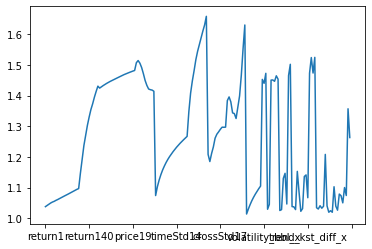

In [42]:
checkNormal.loc['std'].plot()

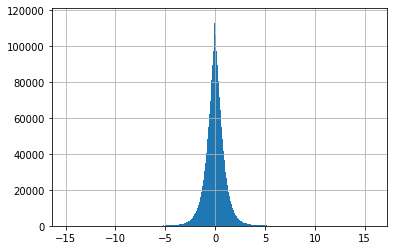

In [53]:
normalizedDF['return1'].hist(bins=1000)

In [43]:
toNormDesc=toNormalize.describe()

In [ ]:
 returnColumns = withoutTarget.columns[:31]  # returns yes
    timestd = withoutTarget.columns[63:93]    #timestd yes
    notNormalizedTA = withoutTarget.columns[213:266] 

In [54]:
(normalizedDF.columns.isin(returnColumns)) | (normalizedDF.columns.isin(timestd)) | (normalizedDF.columns.isin(notNormalizedTA)) 

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False,  True,  True,
        True,  True,

In [84]:
toCrossNormalize=normalizedDF.loc[:,(normalizedDF.columns.isin(returnColumns)) | (normalizedDF.columns.isin(timestd)) | (normalizedDF.columns.isin(notNormalizedTA))] 

In [85]:
toCrossNormalize

return1   return2   return3   return4   return5  \
entityID date                                                           
1034     2007-03-01  0.564936  0.260225 -1.158417 -1.125645 -1.163187   
         2007-03-02 -1.962401 -1.061788 -1.051987 -2.061060 -1.972516   
         2007-03-05 -0.258431 -1.637510 -1.079901 -1.051231 -1.981813   
         2007-03-06  0.974343  0.528094 -0.833036 -0.417034 -0.482202   
         2007-03-07 -0.802647  0.118068 -0.064518 -1.166322 -0.781970   
...                       ...       ...       ...       ...       ...   
296318   2015-06-18 -1.169376 -1.084472 -0.912404 -0.814077 -1.064222   
         2015-06-19  0.733739 -0.328694 -0.472658 -0.453941 -0.420047   
         2015-06-22  0.168556  0.643358 -0.169944 -0.332348 -0.332876   
         2015-06-23 -0.236097 -0.048679  0.374766 -0.263860 -0.397089   
         2015-06-24 -0.345758 -0.410331 -0.234845  0.152692 -0.383478   

                      return6   return7   return8   return9  return10  ...  \
entityID date                                                          ...   
1034     2007-03-01 -0.951695 -0.802098 -0.838356 -0.772790 -0.834075  ...   
         2007-03-02 -1.932021 -1.714295 -1.547360 -1.562360 -1.484661  ...   
         2007-03-05 -1.908113 -1.905347 -1.718192 -1.580174 -1.601198  ...   
         2007-03-06 -1.410259 -1.409085 -1.447073 -1.304247 -1.188984  ...   
         2007-03-07 -0.809103 -1.652347 -1.647031 -1.691024 -1.556411  ...   
...                       ...       ...       ...       ...       ...  ...   
296318   2015-06-18 -1.635621 -1.570468 -1.548997 -1.557706 -1.305468  ...   
         2015-06-19 -0.702077 -1.269015 -1.246092 -1.245205 -1.278179  ...   
         2015-06-22 -0.318951 -0.587769 -1.131242 -1.115721 -1.126352  ...   
         2015-06-23 -0.396016 -0.378041 -0.623656 -1.121279 -1.109755  ...   
         2015-06-24 -0.495896 -0.486327 -0.465758 -0.684227 -1.142208  ...   

                     momentum_ao_x  volume_adi_y  volume_obv_y  volume_obvm_y  \
entityID date                                                                   
1034     2007-03-01       0.242257      1.873162      1.113146      -0.967948   
         2007-03-02      -0.084102     -0.345591     -1.094558      -0.956238   
         2007-03-05      -0.497943     -1.119512     -1.159650      -1.693738   
         2007-03-06      -0.679289      0.383175      1.262213      -0.969386   
         2007-03-07      -0.783076     -0.938469     -0.912852      -1.500047   
...                            ...           ...           ...            ...   
296318   2015-06-18      -0.906743     -1.626412     -1.943585      -2.283215   
         2015-06-19      -0.924076     -0.833514      2.177136      -2.132866   
         2015-06-22      -0.918763      0.397933      1.379750      -1.669669   
         2015-06-23      -0.911613     -0.284802     -0.833676      -1.594051   
         2015-06-24      -0.907103     -1.235076     -0.619412      -1.484268   

                     volume_cmf_y  volume_fi_y  volume_em_y  volume_vpt_y  \
entityID date                                                               
1034     2007-03-01      0.513714     0.122003    -0.518830      0.325600   
         2007-03-02     -0.128480     1.258530    -0.788521     -0.833647   
         2007-03-05      0.131852    -0.063887    -0.970574     -1.421591   
         2007-03-06      0.388123     0.349465    -0.789083      0.730684   
         2007-03-07      0.137083     0.040162    -0.887849      0.468760   
...                           ...          ...          ...           ...   
296318   2015-06-18     -1.488246    -0.673475     0.382356     -0.788716   
         2015-06-19     -1.790390    -0.313879     0.406794     -0.302585   
         2015-06-22     -1.720417    -0.288763     0.310081      0.475953   
         2015-06-23     -1.765620     0.139325     0.360903      0.031353   
         2015-06-24     -1.868891     0.143988     0.365163     -0.092163   

 

In [91]:

crossNormalizedDF=None
@jit(nopython=True,parallel = False)
def rank(array):
        s = pd.Series(array)
        return s.rank(pct=True)[len(s)-1]
    
@jit(nopython=True,parallel = False)
def crossnormalize(array):
        meanToFast = np.mean(array)
        stdToFast = np.std(array)
        normalize = (array-meanToFast)/stdToFast
        return normalize
for entityID, new_df in tqdm(toCrossNormalize.groupby(level=1)):


    starttime =time.time()
    print(starttime)
    columns=new_df.columns
    for jj in columns:
        new_df[jj]= new_df[jj].astype(float)
        new_df[jj]=pd.to_numeric(new_df[jj])

    #ranked =new_df.expanding(21).window().expanding().Expanding().apply(rank,kwgs={"use_numba_cache":"numba"},raw=True)
    ranked =new_df.apply(crossnormalize,raw=True)
    
    if crossNormalizedDF is None:
        crossNormalizedDF=ranked
    else:
        crossNormalizedDF=crossNormalizedDF.append(ranked)
    

  0%|          | 0/2234 [00:00<?, ?it/s]

1588377145.0755944


/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  0%|          | 1/2234 [00:06<3:47:20,  6.11s/it]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

1588377145.2904274
1588377145.3478198
1588377145.406157
1588377145.463289


  0%|          | 7/2234 [00:06<1:19:12,  2.13s/it]

1588377145.5245905
1588377145.582709
1588377145.6439056
1588377145.7031856


  0%|          | 11/2234 [00:06<39:54,  1.08s/it] 

1588377145.767486
1588377145.8276725
1588377145.890864
1588377145.952251


  1%|          | 15/2234 [00:06<20:43,  1.78it/s]

1588377146.0183845
1588377146.0806262
1588377146.1464477
1588377146.2098715


  1%|          | 19/2234 [00:07<11:27,  3.22it/s]

1588377146.2833552
1588377146.3532288
1588377146.4266186


  1%|          | 21/2234 [00:07<08:50,  4.17it/s]

1588377146.5001981
1588377146.5751443
1588377146.648302


  1%|          | 25/2234 [00:07<05:45,  6.40it/s]

1588377146.7265866
1588377146.8014631
1588377146.8791678


  1%|          | 27/2234 [00:07<04:53,  7.52it/s]

1588377146.9572048
1588377147.0372503
1588377147.1153805


  1%|▏         | 31/2234 [00:08<03:54,  9.39it/s]

1588377147.1987066
1588377147.2784507
1588377147.36104


  1%|▏         | 33/2234 [00:08<03:39, 10.04it/s]

1588377147.443961
1588377147.5281322
1588377147.610625


  2%|▏         | 37/2234 [00:08<03:24, 10.74it/s]

1588377147.6981757
1588377147.7824461
1588377147.8743486


  2%|▏         | 39/2234 [00:08<03:24, 10.73it/s]

1588377147.9667938
1588377148.0611622
1588377148.1540911


  2%|▏         | 43/2234 [00:09<03:27, 10.57it/s]

1588377148.251952
1588377148.3471384
1588377148.4449904


  2%|▏         | 45/2234 [00:09<03:29, 10.43it/s]

1588377148.5428734
1588377148.6422732
1588377148.741209


  2%|▏         | 47/2234 [00:09<03:33, 10.26it/s]

1588377148.8446364
1588377148.9448204


  2%|▏         | 49/2234 [00:09<03:36, 10.09it/s]

1588377149.050239
1588377149.1516204


  2%|▏         | 51/2234 [00:10<03:39,  9.93it/s]

1588377149.2589169
1588377149.3625245


  2%|▏         | 54/2234 [00:10<03:46,  9.62it/s]

1588377149.471456
1588377149.5792859


  3%|▎         | 56/2234 [00:10<03:52,  9.36it/s]

1588377149.6896415
1588377149.7990932


  3%|▎         | 58/2234 [00:10<03:58,  9.12it/s]

1588377149.9115303
1588377150.0236843


  3%|▎         | 60/2234 [00:11<04:03,  8.95it/s]

1588377150.1377094
1588377150.2515583


  3%|▎         | 62/2234 [00:11<04:07,  8.79it/s]

1588377150.3674705
1588377150.483032


  3%|▎         | 64/2234 [00:11<04:10,  8.66it/s]

1588377150.6009078
1588377150.717427


  3%|▎         | 66/2234 [00:11<04:14,  8.52it/s]

1588377150.8369963
1588377150.9558177


  3%|▎         | 68/2234 [00:12<04:21,  8.29it/s]

1588377151.0809655
1588377151.2038238


  3%|▎         | 70/2234 [00:12<04:25,  8.17it/s]

1588377151.3281994
1588377151.4523537


  3%|▎         | 72/2234 [00:12<04:28,  8.06it/s]

1588377151.578872
1588377151.7037961


  3%|▎         | 74/2234 [00:12<04:31,  7.94it/s]

1588377151.8316858
1588377151.959204


  3%|▎         | 76/2234 [00:13<04:35,  7.82it/s]

1588377152.089144
1588377152.2187066


  3%|▎         | 78/2234 [00:13<04:39,  7.70it/s]

1588377152.3506083
1588377152.4822974


  4%|▎         | 80/2234 [00:13<04:42,  7.63it/s]

1588377152.6157348
1588377152.746833


  4%|▎         | 82/2234 [00:13<04:46,  7.52it/s]

1588377152.8818069
1588377153.016788


  4%|▍         | 84/2234 [00:14<04:49,  7.42it/s]

1588377153.1538007
1588377153.2893994


  4%|▍         | 86/2234 [00:14<04:53,  7.31it/s]

1588377153.4286664
1588377153.5670247


  4%|▍         | 88/2234 [00:14<04:56,  7.23it/s]

1588377153.707128
1588377153.8482406


  4%|▍         | 90/2234 [00:14<05:01,  7.12it/s]

1588377153.990056
1588377154.1321096


  4%|▍         | 92/2234 [00:15<05:03,  7.05it/s]

1588377154.2748873
1588377154.4185293


  4%|▍         | 94/2234 [00:15<05:07,  6.97it/s]

1588377154.5638745
1588377154.7088785


  4%|▍         | 96/2234 [00:15<05:11,  6.87it/s]

1588377154.8560746
1588377155.003624


  4%|▍         | 98/2234 [00:16<05:14,  6.78it/s]

1588377155.1530387
1588377155.302339


  4%|▍         | 100/2234 [00:16<05:18,  6.70it/s]

1588377155.4537718
1588377155.6047575


  5%|▍         | 102/2234 [00:16<05:26,  6.52it/s]

1588377155.7612474
1588377155.9187503


  5%|▍         | 104/2234 [00:17<05:28,  6.48it/s]

1588377156.0751615
1588377156.2296233


  5%|▍         | 106/2234 [00:17<05:30,  6.43it/s]

1588377156.386288
1588377156.542824


  5%|▍         | 108/2234 [00:17<05:34,  6.36it/s]

1588377156.7015088
1588377156.8610337


  5%|▍         | 110/2234 [00:17<05:37,  6.29it/s]

1588377157.0221648
1588377157.1819236


  5%|▌         | 112/2234 [00:18<05:40,  6.22it/s]

1588377157.3444166
1588377157.5066633


  5%|▌         | 114/2234 [00:18<05:44,  6.15it/s]

1588377157.6723173
1588377157.8359332


  5%|▌         | 116/2234 [00:18<05:47,  6.09it/s]

1588377158.0014708
1588377158.1669831


  5%|▌         | 118/2234 [00:19<05:51,  6.02it/s]

1588377158.3354173
1588377158.5027606


  5%|▌         | 120/2234 [00:19<05:54,  5.96it/s]

1588377158.6721215
1588377158.842119


  5%|▌         | 122/2234 [00:20<05:58,  5.90it/s]

1588377159.0141842
1588377159.184743


  6%|▌         | 124/2234 [00:20<06:02,  5.82it/s]

1588377159.3588717
1588377159.5322788


  6%|▌         | 126/2234 [00:20<06:06,  5.75it/s]

1588377159.7085652
1588377159.884162


  6%|▌         | 128/2234 [00:21<06:09,  5.69it/s]

1588377160.0623474
1588377160.2393713


  6%|▌         | 130/2234 [00:21<06:13,  5.63it/s]

1588377160.4185147
1588377160.598071


  6%|▌         | 132/2234 [00:21<06:16,  5.58it/s]

1588377160.7788117
1588377160.9593718


  6%|▌         | 134/2234 [00:22<06:20,  5.52it/s]

1588377161.143627
1588377161.326051


  6%|▌         | 136/2234 [00:22<06:24,  5.46it/s]

1588377161.5119538
1588377161.69621


  6%|▌         | 138/2234 [00:22<06:31,  5.36it/s]

1588377161.882125
1588377162.0748174


  6%|▋         | 140/2234 [00:23<06:32,  5.34it/s]

1588377162.264929
1588377162.4516144


  6%|▋         | 142/2234 [00:23<06:33,  5.31it/s]

1588377162.640308
1588377162.8293931


  6%|▋         | 144/2234 [00:24<06:36,  5.27it/s]

1588377163.0202992
1588377163.2113712


  7%|▋         | 146/2234 [00:24<06:38,  5.23it/s]

1588377163.4045818
1588377163.5964756


  7%|▋         | 148/2234 [00:24<06:42,  5.19it/s]

1588377163.791111
1588377163.985226


  7%|▋         | 150/2234 [00:25<06:45,  5.14it/s]

1588377164.1814268
1588377164.3782527


  7%|▋         | 152/2234 [00:25<06:48,  5.09it/s]

1588377164.5773382
1588377164.7746212


  7%|▋         | 154/2234 [00:25<06:52,  5.04it/s]

1588377164.9751153
1588377165.1751242


  7%|▋         | 155/2234 [00:26<06:54,  5.02it/s]

1588377165.3768

  7%|▋         | 156/2234 [00:26<06:56,  4.99it/s]

  7%|▋         | 157/2234 [00:26<06:57,  4.97it/s]

1588377165.5811205
1588377165.7841973


  7%|▋         | 158/2234 [00:26<06:59,  4.95it/s]

1588377165.988415


  7%|▋         | 159/2234 [00:27<07:02,  4.91it/s]

1588377166.1942196


  7%|▋         | 160/2234 [00:27<07:04,  4.89it/s]

1588377166.400376


  7%|▋         | 161/2234 [00:27<07:05,  4.88it/s]

1588377166.6069071


  7%|▋         | 162/2234 [00:27<07:06,  4.85it/s]

1588377166.8152752


  7%|▋         | 163/2234 [00:27<07:08,  4.83it/s]

1588377167.024438


  7%|▋         | 164/2234 [00:28<07:10,  4.81it/s]

1588377167.235199


  7%|▋         | 165/2234 [00:28<07:15,  4.75it/s]

1588377167.4509187


  7%|▋         | 166/2234 [00:28<07:16,  4.73it/s]

1588377167.664486


  7%|▋         | 167/2234 [00:28<07:18,  4.72it/s]

1588377167.8783314


  8%|▊         | 168/2234 [00:28<07:20,  4.69it/s]

1588377168.095364


  8%|▊         | 169/2234 [00:29<07:22,  4.66it/s]

1588377168.312016


  8%|▊         | 170/2234 [00:29<07:24,  4.64it/s]

1588377168.529378


  8%|▊         | 171/2234 [00:29<07:25,  4.63it/s]

1588377168.7461247


  8%|▊         | 172/2234 [00:29<07:25,  4.62it/s]

1588377168.9635928


  8%|▊         | 173/2234 [00:30<07:27,  4.61it/s]

1588377169.1826582


  8%|▊         | 174/2234 [00:30<07:29,  4.59it/s]

1588377169.4027586


  8%|▊         | 175/2234 [00:30<07:30,  4.57it/s]

1588377169.623933


  8%|▊         | 176/2234 [00:30<07:32,  4.55it/s]

1588377169.8456218


  8%|▊         | 177/2234 [00:30<07:34,  4.52it/s]

1588377170.0695271


  8%|▊         | 178/2234 [00:31<07:36,  4.50it/s]

1588377170.294542


  8%|▊         | 179/2234 [00:31<07:39,  4.47it/s]

1588377170.5215647


  8%|▊         | 180/2234 [00:31<07:40,  4.46it/s]

1588377170.7475147


  8%|▊         | 181/2234 [00:31<07:42,  4.44it/s]

1588377170.9744525


  8%|▊         | 182/2234 [00:32<07:43,  4.42it/s]

1588377171.2026002


  8%|▊         | 183/2234 [00:32<07:45,  4.41it/s]

1588377171.4310448


  8%|▊         | 184/2234 [00:32<07:46,  4.39it/s]

1588377171.6607463


  8%|▊         | 185/2234 [00:32<07:48,  4.38it/s]

1588377171.8917453


  8%|▊         | 186/2234 [00:32<07:50,  4.35it/s]

1588377172.1236424


  8%|▊         | 187/2234 [00:33<07:51,  4.34it/s]

1588377172.3556554


  8%|▊         | 188/2234 [00:33<07:53,  4.32it/s]

1588377172.5891595


  8%|▊         | 189/2234 [00:33<07:54,  4.31it/s]

1588377172.8234215


  9%|▊         | 190/2234 [00:33<07:56,  4.29it/s]

1588377173.0589855


  9%|▊         | 191/2234 [00:34<07:57,  4.28it/s]

1588377173.29429


  9%|▊         | 192/2234 [00:34<07:58,  4.26it/s]

1588377173.5305943


  9%|▊         | 193/2234 [00:34<08:00,  4.25it/s]

1588377173.7677178


  9%|▊         | 194/2234 [00:34<08:01,  4.24it/s]

1588377174.0056956


  9%|▊         | 195/2234 [00:35<08:06,  4.19it/s]

1588377174.251006


  9%|▉         | 196/2234 [00:35<08:09,  4.16it/s]

1588377174.4948804


  9%|▉         | 197/2234 [00:35<08:10,  4.15it/s]

1588377174.7367609


  9%|▉         | 198/2234 [00:35<08:12,  4.13it/s]

1588377174.9813745


  9%|▉         | 199/2234 [00:36<08:14,  4.11it/s]

1588377175.2274706


  9%|▉         | 200/2234 [00:36<08:15,  4.10it/s]

1588377175.472797


  9%|▉         | 201/2234 [00:36<08:19,  4.07it/s]

1588377175.7221727


  9%|▉         | 202/2234 [00:36<08:21,  4.06it/s]

1588377175.9712594


  9%|▉         | 203/2234 [00:37<08:23,  4.04it/s]

1588377176.2218077


  9%|▉         | 204/2234 [00:37<08:24,  4.02it/s]

1588377176.4725838


  9%|▉         | 205/2234 [00:37<08:25,  4.01it/s]

1588377176.7228339


  9%|▉         | 206/2234 [00:37<08:28,  3.99it/s]

1588377176.976828


  9%|▉         | 207/2234 [00:38<08:27,  3.99it/s]

1588377177.2273853


  9%|▉         | 208/2234 [00:38<08:30,  3.97it/s]

1588377177.4827504


  9%|▉         | 209/2234 [00:38<08:32,  3.95it/s]

1588377177.7382894


  9%|▉         | 210/2234 [00:38<08:33,  3.94it/s]

1588377177.9940443


  9%|▉         | 211/2234 [00:39<08:36,  3.92it/s]

1588377178.2521617


  9%|▉         | 212/2234 [00:39<08:38,  3.90it/s]

1588377178.5109065


 10%|▉         | 213/2234 [00:39<08:39,  3.89it/s]

1588377178.769632


 10%|▉         | 214/2234 [00:39<08:40,  3.88it/s]

1588377179.0297167


 10%|▉         | 215/2234 [00:40<08:41,  3.87it/s]

1588377179.289731


 10%|▉         | 216/2234 [00:40<08:43,  3.85it/s]

1588377179.551882


 10%|▉         | 217/2234 [00:40<08:45,  3.84it/s]

1588377179.814574


 10%|▉         | 218/2234 [00:40<08:47,  3.82it/s]

1588377180.0781803


 10%|▉         | 219/2234 [00:41<08:48,  3.82it/s]

1588377180.3417144


 10%|▉         | 220/2234 [00:41<08:50,  3.80it/s]

1588377180.6082323


 10%|▉         | 221/2234 [00:41<08:51,  3.79it/s]

1588377180.8736389


 10%|▉         | 222/2234 [00:41<08:54,  3.76it/s]

1588377181.143865


 10%|▉         | 223/2234 [00:42<08:56,  3.75it/s]

1588377181.4125776


 10%|█         | 224/2234 [00:42<08:57,  3.74it/s]

1588377181.682055


 10%|█         | 225/2234 [00:42<08:58,  3.73it/s]

1588377181.9510686


 10%|█         | 226/2234 [00:43<08:59,  3.72it/s]

1588377182.2210648


 10%|█         | 227/2234 [00:43<09:01,  3.71it/s]

1588377182.493681


 10%|█         | 228/2234 [00:43<09:02,  3.70it/s]

1588377182.764791


 10%|█         | 229/2234 [00:43<09:02,  3.69it/s]

1588377183.0364738


 10%|█         | 230/2234 [00:44<09:03,  3.69it/s]

1588377183.3085334


 10%|█         | 231/2234 [00:44<09:04,  3.68it/s]

1588377183.581654


 10%|█         | 232/2234 [00:44<09:04,  3.67it/s]

1588377183.8547888


 10%|█         | 233/2234 [00:44<09:06,  3.66it/s]

1588377184.1294434


 10%|█         | 234/2234 [00:45<09:06,  3.66it/s]

1588377184.4042718


 11%|█         | 235/2234 [00:45<09:08,  3.65it/s]

1588377184.6801286


 11%|█         | 236/2234 [00:45<09:09,  3.64it/s]

1588377184.957203


 11%|█         | 237/2234 [00:46<09:17,  3.58it/s]

1588377185.245534


 11%|█         | 238/2234 [00:46<09:17,  3.58it/s]

1588377185.5249188


 11%|█         | 239/2234 [00:46<09:17,  3.58it/s]

1588377185.8044367


 11%|█         | 240/2234 [00:46<09:17,  3.58it/s]

1588377186.0848837


 11%|█         | 241/2234 [00:47<09:19,  3.56it/s]

1588377186.3676012


 11%|█         | 242/2234 [00:47<09:22,  3.54it/s]

1588377186.653737


 11%|█         | 243/2234 [00:47<09:24,  3.53it/s]

1588377186.940884


 11%|█         | 244/2234 [00:48<09:26,  3.51it/s]

1588377187.2274811


 11%|█         | 245/2234 [00:48<09:27,  3.50it/s]

1588377187.5151985


 11%|█         | 246/2234 [00:48<09:28,  3.50it/s]

1588377187.802603


 11%|█         | 247/2234 [00:48<09:28,  3.49it/s]

1588377188.0892868


 11%|█         | 248/2234 [00:49<09:29,  3.49it/s]

1588377188.3770905


 11%|█         | 249/2234 [00:49<09:30,  3.48it/s]

1588377188.6664996


 11%|█         | 250/2234 [00:49<09:32,  3.47it/s]

1588377188.9571552


 11%|█         | 251/2234 [00:50<09:33,  3.46it/s]

1588377189.2476597


 11%|█▏        | 252/2234 [00:50<09:34,  3.45it/s]

1588377189.5399404


 11%|█▏        | 253/2234 [00:50<09:36,  3.44it/s]

1588377189.8325615


 11%|█▏        | 254/2234 [00:50<09:37,  3.43it/s]

1588377190.126251


 11%|█▏        | 255/2234 [00:51<09:38,  3.42it/s]

1588377190.420809


 11%|█▏        | 256/2234 [00:51<09:40,  3.41it/s]

1588377190.7168422


 12%|█▏        | 257/2234 [00:51<09:41,  3.40it/s]

1588377191.0128455


 12%|█▏        | 258/2234 [00:52<09:43,  3.39it/s]

1588377191.310214


 12%|█▏        | 259/2234 [00:52<09:45,  3.38it/s]

1588377191.6090398


 12%|█▏        | 260/2234 [00:52<09:47,  3.36it/s]

1588377191.9090803


 12%|█▏        | 261/2234 [00:53<09:48,  3.35it/s]

1588377192.2095585


 12%|█▏        | 262/2234 [00:53<09:50,  3.34it/s]

1588377192.5114956


 12%|█▏        | 263/2234 [00:53<09:51,  3.33it/s]

1588377192.8136003


 12%|█▏        | 264/2234 [00:53<09:55,  3.31it/s]

1588377193.1208453


 12%|█▏        | 265/2234 [00:54<09:58,  3.29it/s]

1588377193.428243


 12%|█▏        | 266/2234 [00:54<10:00,  3.27it/s]

1588377193.7369363


 12%|█▏        | 267/2234 [00:54<10:05,  3.25it/s]

1588377194.0500216


 12%|█▏        | 268/2234 [00:55<10:06,  3.24it/s]

1588377194.360355


 12%|█▏        | 269/2234 [00:55<10:09,  3.23it/s]

1588377194.6738193


 12%|█▏        | 270/2234 [00:55<10:10,  3.22it/s]

1588377194.9869401


 12%|█▏        | 271/2234 [00:56<10:12,  3.21it/s]

1588377195.3010392


 12%|█▏        | 272/2234 [00:56<10:13,  3.20it/s]

1588377195.616403


 12%|█▏        | 273/2234 [00:56<10:14,  3.19it/s]

1588377195.931215


 12%|█▏        | 274/2234 [00:57<10:14,  3.19it/s]

1588377196.2452188


 12%|█▏        | 275/2234 [00:57<10:18,  3.17it/s]

1588377196.5663006


 12%|█▏        | 276/2234 [00:57<10:18,  3.16it/s]

1588377196.8825953


 12%|█▏        | 277/2234 [00:58<10:18,  3.16it/s]

1588377197.1990626


 12%|█▏        | 278/2234 [00:58<10:20,  3.15it/s]

1588377197.5194206


 12%|█▏        | 279/2234 [00:58<10:22,  3.14it/s]

1588377197.840215


 13%|█▎        | 280/2234 [00:58<10:23,  3.13it/s]

1588377198.1613312


 13%|█▎        | 281/2234 [00:59<10:25,  3.12it/s]

1588377198.483697


 13%|█▎        | 282/2234 [00:59<10:25,  3.12it/s]

1588377198.8044722


 13%|█▎        | 283/2234 [00:59<10:27,  3.11it/s]

1588377199.1295338


 13%|█▎        | 284/2234 [01:00<10:28,  3.10it/s]

1588377199.4531944


 13%|█▎        | 285/2234 [01:00<10:30,  3.09it/s]

1588377199.7788422


 13%|█▎        | 286/2234 [01:00<10:31,  3.08it/s]

1588377200.1052635


 13%|█▎        | 287/2234 [01:01<10:33,  3.07it/s]

1588377200.4332104


 13%|█▎        | 288/2234 [01:01<10:34,  3.07it/s]

1588377200.7611287


 13%|█▎        | 289/2234 [01:01<10:36,  3.06it/s]

1588377201.0909505


 13%|█▎        | 290/2234 [01:02<10:38,  3.05it/s]

1588377201.4213955


 13%|█▎        | 291/2234 [01:02<10:38,  3.04it/s]

1588377201.7504833


 13%|█▎        | 292/2234 [01:02<10:42,  3.02it/s]

1588377202.08701


 13%|█▎        | 293/2234 [01:03<10:45,  3.01it/s]

1588377202.4239562


 13%|█▎        | 294/2234 [01:03<10:45,  3.01it/s]

1588377202.7563832


 13%|█▎        | 295/2234 [01:03<10:45,  3.01it/s]

1588377203.089386


 13%|█▎        | 296/2234 [01:04<10:45,  3.00it/s]

1588377203.4227777


 13%|█▎        | 297/2234 [01:04<10:46,  3.00it/s]

1588377203.7587218


 13%|█▎        | 298/2234 [01:04<10:47,  2.99it/s]

1588377204.0953496


 13%|█▎        | 299/2234 [01:05<10:48,  2.99it/s]

1588377204.4307187


 13%|█▎        | 300/2234 [01:05<10:49,  2.98it/s]

1588377204.7681346


 13%|█▎        | 301/2234 [01:05<10:51,  2.97it/s]

1588377205.107644


 14%|█▎        | 302/2234 [01:06<10:53,  2.95it/s]

1588377205.449985


 14%|█▎        | 303/2234 [01:06<10:57,  2.94it/s]

1588377205.7960002


 14%|█▎        | 304/2234 [01:06<10:58,  2.93it/s]

1588377206.1391532


 14%|█▎        | 305/2234 [01:07<11:00,  2.92it/s]

1588377206.4839895


 14%|█▎        | 306/2234 [01:07<11:00,  2.92it/s]

1588377206.827407


 14%|█▎        | 307/2234 [01:07<11:01,  2.91it/s]

1588377207.1725795


 14%|█▍        | 308/2234 [01:08<11:02,  2.91it/s]

1588377207.5169163


 14%|█▍        | 309/2234 [01:08<11:02,  2.90it/s]

1588377207.862596


 14%|█▍        | 310/2234 [01:09<11:03,  2.90it/s]

1588377208.20848


 14%|█▍        | 311/2234 [01:09<11:10,  2.87it/s]

1588377208.5660791


 14%|█▍        | 312/2234 [01:09<11:09,  2.87it/s]

1588377208.9130602


 14%|█▍        | 313/2234 [01:10<11:09,  2.87it/s]

1588377209.2623768


 14%|█▍        | 314/2234 [01:10<11:10,  2.87it/s]

1588377209.612444


 14%|█▍        | 315/2234 [01:10<11:09,  2.87it/s]

1588377209.960396


 14%|█▍        | 316/2234 [01:11<11:09,  2.87it/s]

1588377210.310087


 14%|█▍        | 317/2234 [01:11<11:11,  2.85it/s]

1588377210.663689


 14%|█▍        | 318/2234 [01:11<11:13,  2.84it/s]

1588377211.0186255


 14%|█▍        | 319/2234 [01:12<11:13,  2.84it/s]

1588377211.370755


 14%|█▍        | 320/2234 [01:12<11:16,  2.83it/s]

1588377211.7275336


 14%|█▍        | 321/2234 [01:12<11:21,  2.81it/s]

1588377212.0912101


 14%|█▍        | 322/2234 [01:13<11:27,  2.78it/s]

1588377212.4583561


 14%|█▍        | 323/2234 [01:13<11:30,  2.77it/s]

1588377212.8237736


 15%|█▍        | 324/2234 [01:14<11:33,  2.76it/s]

1588377213.190033


 15%|█▍        | 325/2234 [01:14<11:34,  2.75it/s]

1588377213.5564609


 15%|█▍        | 326/2234 [01:14<11:34,  2.75it/s]

1588377213.9212759


 15%|█▍        | 327/2234 [01:15<11:37,  2.74it/s]

1588377214.289863


 15%|█▍        | 328/2234 [01:15<11:37,  2.73it/s]

1588377214.6568594


 15%|█▍        | 329/2234 [01:15<11:39,  2.72it/s]

1588377215.0274498


 15%|█▍        | 330/2234 [01:16<11:41,  2.71it/s]

1588377215.398398


 15%|█▍        | 331/2234 [01:16<11:43,  2.71it/s]

1588377215.7706416


 15%|█▍        | 332/2234 [01:16<11:44,  2.70it/s]

1588377216.142878


 15%|█▍        | 333/2234 [01:17<11:44,  2.70it/s]

1588377216.513875


 15%|█▍        | 334/2234 [01:17<11:45,  2.69it/s]

1588377216.886662


 15%|█▍        | 335/2234 [01:18<11:45,  2.69it/s]

1588377217.258887


 15%|█▌        | 336/2234 [01:18<11:51,  2.67it/s]

1588377217.6422937


 15%|█▌        | 337/2234 [01:18<11:51,  2.67it/s]

1588377218.0175183


 15%|█▌        | 338/2234 [01:19<11:51,  2.66it/s]

1588377218.3938353


 15%|█▌        | 339/2234 [01:19<11:53,  2.66it/s]

1588377218.7722464


 15%|█▌        | 340/2234 [01:19<11:54,  2.65it/s]

1588377219.1513324


 15%|█▌        | 341/2234 [01:20<11:55,  2.65it/s]

1588377219.531463


 15%|█▌        | 342/2234 [01:20<11:56,  2.64it/s]

1588377219.91191


 15%|█▌        | 343/2234 [01:21<11:57,  2.64it/s]

1588377220.2919843


 15%|█▌        | 344/2234 [01:21<11:56,  2.64it/s]

1588377220.6715207


 15%|█▌        | 345/2234 [01:21<11:56,  2.63it/s]

1588377221.0516558


 15%|█▌        | 346/2234 [01:22<11:57,  2.63it/s]

1588377221.4337158


 16%|█▌        | 347/2234 [01:22<11:59,  2.62it/s]

1588377221.8165648


 16%|█▌        | 348/2234 [01:23<12:00,  2.62it/s]

1588377222.2006965


 16%|█▌        | 349/2234 [01:23<12:00,  2.61it/s]

1588377222.5843017


 16%|█▌        | 350/2234 [01:23<12:01,  2.61it/s]

1588377222.9692338


 16%|█▌        | 351/2234 [01:24<12:03,  2.60it/s]

1588377223.3558254


 16%|█▌        | 352/2234 [01:24<12:05,  2.59it/s]

1588377223.7443347


 16%|█▌        | 353/2234 [01:24<12:08,  2.58it/s]

1588377224.1365006


 16%|█▌        | 354/2234 [01:25<12:13,  2.56it/s]

1588377224.5329223


 16%|█▌        | 355/2234 [01:25<12:14,  2.56it/s]

1588377224.9257045


 16%|█▌        | 356/2234 [01:26<12:15,  2.55it/s]

1588377225.319732


 16%|█▌        | 357/2234 [01:26<12:16,  2.55it/s]

1588377225.7128377


 16%|█▌        | 358/2234 [01:26<12:15,  2.55it/s]

1588377226.1050298


 16%|█▌        | 359/2234 [01:27<12:16,  2.54it/s]

1588377226.4997056


 16%|█▌        | 360/2234 [01:27<12:17,  2.54it/s]

1588377226.8949614


 16%|█▌        | 361/2234 [01:28<12:18,  2.54it/s]

1588377227.2912729


 16%|█▌        | 362/2234 [01:28<12:20,  2.53it/s]

1588377227.6894972


 16%|█▌        | 363/2234 [01:28<12:22,  2.52it/s]

1588377228.0886207


 16%|█▋        | 364/2234 [01:29<12:22,  2.52it/s]

1588377228.4864633


 16%|█▋        | 365/2234 [01:29<12:23,  2.51it/s]

1588377228.8857687


 16%|█▋        | 366/2234 [01:30<12:24,  2.51it/s]

1588377229.2865448


 16%|█▋        | 367/2234 [01:30<12:25,  2.50it/s]

1588377229.6883106


 16%|█▋        | 368/2234 [01:30<12:27,  2.50it/s]

1588377230.0910757


 17%|█▋        | 369/2234 [01:31<12:29,  2.49it/s]

1588377230.4953969


 17%|█▋        | 370/2234 [01:31<12:34,  2.47it/s]

1588377230.9082367


 17%|█▋        | 371/2234 [01:32<12:38,  2.45it/s]

1588377231.3208466


 17%|█▋        | 372/2234 [01:32<12:46,  2.43it/s]

1588377231.7426114


 17%|█▋        | 373/2234 [01:32<12:47,  2.42it/s]

1588377232.1566596


 17%|█▋        | 374/2234 [01:33<12:46,  2.43it/s]

1588377232.5688171


 17%|█▋        | 375/2234 [01:33<12:47,  2.42it/s]

1588377232.983332


 17%|█▋        | 376/2234 [01:34<12:48,  2.42it/s]

1588377233.398839


 17%|█▋        | 377/2234 [01:34<12:50,  2.41it/s]

1588377233.8158205


 17%|█▋        | 378/2234 [01:35<12:51,  2.41it/s]

1588377234.2329009


 17%|█▋        | 379/2234 [01:35<12:51,  2.40it/s]

1588377234.6505773


 17%|█▋        | 380/2234 [01:35<12:53,  2.40it/s]

1588377235.0703402


 17%|█▋        | 381/2234 [01:36<12:55,  2.39it/s]

1588377235.4913604


 17%|█▋        | 382/2234 [01:36<12:53,  2.39it/s]

1588377235.9071462


 17%|█▋        | 383/2234 [01:37<12:54,  2.39it/s]

1588377236.3279302


 17%|█▋        | 384/2234 [01:37<12:55,  2.39it/s]

1588377236.748854


 17%|█▋        | 385/2234 [01:37<12:57,  2.38it/s]

1588377237.1723173


 17%|█▋        | 386/2234 [01:38<12:58,  2.38it/s]

1588377237.5945697


 17%|█▋        | 387/2234 [01:38<12:59,  2.37it/s]

1588377238.018524


 17%|█▋        | 388/2234 [01:39<13:00,  2.36it/s]

1588377238.4438658


 17%|█▋        | 389/2234 [01:39<13:01,  2.36it/s]

1588377238.869209


 17%|█▋        | 390/2234 [01:40<13:02,  2.36it/s]

1588377239.294296


 18%|█▊        | 391/2234 [01:40<13:01,  2.36it/s]

1588377239.719072


 18%|█▊        | 392/2234 [01:40<13:01,  2.36it/s]

1588377240.1437192


 18%|█▊        | 393/2234 [01:41<13:02,  2.35it/s]

1588377240.570755


 18%|█▊        | 394/2234 [01:41<13:03,  2.35it/s]

1588377240.9989204


 18%|█▊        | 395/2234 [01:42<13:04,  2.35it/s]

1588377241.4259431


 18%|█▊        | 396/2234 [01:42<13:05,  2.34it/s]

1588377241.8551562


 18%|█▊        | 397/2234 [01:43<13:05,  2.34it/s]

1588377242.2844574


 18%|█▊        | 398/2234 [01:43<13:07,  2.33it/s]

1588377242.7159004


 18%|█▊        | 399/2234 [01:43<13:10,  2.32it/s]

1588377243.152068


 18%|█▊        | 400/2234 [01:44<13:14,  2.31it/s]

1588377243.5905366


 18%|█▊        | 401/2234 [01:44<13:14,  2.31it/s]

1588377244.0250833


 18%|█▊        | 402/2234 [01:45<13:16,  2.30it/s]

1588377244.462239


 18%|█▊        | 403/2234 [01:45<13:14,  2.30it/s]

1588377244.8944335


 18%|█▊        | 404/2234 [01:46<13:15,  2.30it/s]

1588377245.3303232


 18%|█▊        | 405/2234 [01:46<13:17,  2.29it/s]

1588377245.769686


 18%|█▊        | 406/2234 [01:47<13:18,  2.29it/s]

1588377246.2086382


 18%|█▊        | 407/2234 [01:47<13:19,  2.28it/s]

1588377246.648095


 18%|█▊        | 408/2234 [01:47<13:21,  2.28it/s]

1588377247.0895605


 18%|█▊        | 409/2234 [01:48<13:22,  2.27it/s]

1588377247.5310884


 18%|█▊        | 410/2234 [01:48<13:22,  2.27it/s]

1588377247.9722538


 18%|█▊        | 411/2234 [01:49<13:23,  2.27it/s]

1588377248.4145095


 18%|█▊        | 412/2234 [01:49<13:24,  2.26it/s]

1588377248.858347


 18%|█▊        | 413/2234 [01:50<13:26,  2.26it/s]

1588377249.3057644


 19%|█▊        | 414/2234 [01:50<13:33,  2.24it/s]

1588377249.7600741


 19%|█▊        | 415/2234 [01:51<13:38,  2.22it/s]

1588377250.2181172


 19%|█▊        | 416/2234 [01:51<13:40,  2.21it/s]

1588377250.6728392


 19%|█▊        | 417/2234 [01:51<13:42,  2.21it/s]

1588377251.12808


 19%|█▊        | 418/2234 [01:52<13:43,  2.21it/s]

1588377251.583443


 19%|█▉        | 419/2234 [01:52<13:44,  2.20it/s]

1588377252.0394685


 19%|█▉        | 420/2234 [01:53<13:46,  2.19it/s]

1588377252.4986737


 19%|█▉        | 421/2234 [01:53<13:47,  2.19it/s]

1588377252.957404


 19%|█▉        | 422/2234 [01:54<13:47,  2.19it/s]

1588377253.413654


 19%|█▉        | 423/2234 [01:54<13:48,  2.19it/s]

1588377253.8729565


 19%|█▉        | 424/2234 [01:55<13:46,  2.19it/s]

1588377254.3272812


 19%|█▉        | 425/2234 [01:55<13:47,  2.19it/s]

1588377254.7870162


 19%|█▉        | 426/2234 [01:56<13:54,  2.17it/s]

1588377255.2575042


 19%|█▉        | 427/2234 [01:56<13:53,  2.17it/s]

1588377255.7189465


 19%|█▉        | 428/2234 [01:56<13:53,  2.17it/s]

1588377256.1803164


 19%|█▉        | 429/2234 [01:57<13:53,  2.17it/s]

1588377256.6427822


 19%|█▉        | 430/2234 [01:57<13:53,  2.16it/s]

1588377257.1054978


 19%|█▉        | 431/2234 [01:58<13:54,  2.16it/s]

1588377257.569817


 19%|█▉        | 432/2234 [01:58<13:54,  2.16it/s]

1588377258.0330248


 19%|█▉        | 433/2234 [01:59<13:54,  2.16it/s]

1588377258.497303


 19%|█▉        | 434/2234 [01:59<13:54,  2.16it/s]

1588377258.9613225


 19%|█▉        | 435/2234 [02:00<13:55,  2.15it/s]

1588377259.427893


 20%|█▉        | 436/2234 [02:00<13:56,  2.15it/s]

1588377259.8952522


 20%|█▉        | 437/2234 [02:01<13:56,  2.15it/s]

1588377260.3614995


 20%|█▉        | 438/2234 [02:01<13:57,  2.14it/s]

1588377260.829603


 20%|█▉        | 439/2234 [02:02<14:00,  2.13it/s]

1588377261.302915


 20%|█▉        | 440/2234 [02:02<14:04,  2.13it/s]

1588377261.7784014


 20%|█▉        | 441/2234 [02:03<14:07,  2.12it/s]

1588377262.2557845


 20%|█▉        | 442/2234 [02:03<14:07,  2.11it/s]

1588377262.730442


 20%|█▉        | 443/2234 [02:04<14:08,  2.11it/s]

1588377263.20491


 20%|█▉        | 444/2234 [02:04<14:08,  2.11it/s]

1588377263.6803272


 20%|█▉        | 445/2234 [02:04<14:09,  2.11it/s]

1588377264.1563032


 20%|█▉        | 446/2234 [02:05<14:09,  2.10it/s]

1588377264.6324337


 20%|██        | 447/2234 [02:05<14:10,  2.10it/s]

1588377265.1097684


 20%|██        | 448/2234 [02:06<14:11,  2.10it/s]

1588377265.5884202


 20%|██        | 449/2234 [02:06<14:12,  2.09it/s]

1588377266.0683048


 20%|██        | 450/2234 [02:07<14:12,  2.09it/s]

1588377266.547621


 20%|██        | 451/2234 [02:07<14:14,  2.09it/s]

1588377267.0302355


 20%|██        | 452/2234 [02:08<14:15,  2.08it/s]

1588377267.5122485


 20%|██        | 453/2234 [02:08<14:16,  2.08it/s]

1588377267.994118


 20%|██        | 454/2234 [02:09<14:17,  2.07it/s]

1588377268.4798393


 20%|██        | 455/2234 [02:09<14:24,  2.06it/s]

1588377268.9750888


 20%|██        | 456/2234 [02:10<14:28,  2.05it/s]

1588377269.46791


 20%|██        | 457/2234 [02:10<14:30,  2.04it/s]

1588377269.9626122


 21%|██        | 458/2234 [02:11<14:32,  2.03it/s]

1588377270.4574082


 21%|██        | 459/2234 [02:11<14:33,  2.03it/s]

1588377270.9515307


 21%|██        | 460/2234 [02:12<14:35,  2.03it/s]

1588377271.4482384


 21%|██        | 461/2234 [02:12<14:36,  2.02it/s]

1588377271.9447563


 21%|██        | 462/2234 [02:13<14:38,  2.02it/s]

1588377272.4432716


 21%|██        | 463/2234 [02:13<14:38,  2.02it/s]

1588377272.940236


 21%|██        | 464/2234 [02:14<14:39,  2.01it/s]

1588377273.438608


 21%|██        | 465/2234 [02:14<14:40,  2.01it/s]

1588377273.9381342


 21%|██        | 466/2234 [02:15<14:40,  2.01it/s]

1588377274.4374797


 21%|██        | 467/2234 [02:15<14:40,  2.01it/s]

1588377274.9370306


 21%|██        | 468/2234 [02:16<14:41,  2.00it/s]

1588377275.4384909


 21%|██        | 469/2234 [02:16<14:43,  2.00it/s]

1588377275.94157


 21%|██        | 470/2234 [02:17<14:43,  2.00it/s]

1588377276.4435287


 21%|██        | 471/2234 [02:17<14:44,  1.99it/s]

1588377276.9464555


 21%|██        | 472/2234 [02:18<14:44,  1.99it/s]

1588377277.4503562


 21%|██        | 473/2234 [02:18<14:44,  1.99it/s]

1588377277.953806


 21%|██        | 474/2234 [02:19<14:49,  1.98it/s]

1588377278.46502


 21%|██▏       | 475/2234 [02:19<14:48,  1.98it/s]

1588377278.969717


 21%|██▏       | 476/2234 [02:20<14:52,  1.97it/s]

1588377279.4836533


 21%|██▏       | 477/2234 [02:20<14:50,  1.97it/s]

1588377279.9875329


 21%|██▏       | 478/2234 [02:21<14:51,  1.97it/s]

1588377280.4971974


 21%|██▏       | 479/2234 [02:21<14:53,  1.96it/s]

1588377281.0103488


 21%|██▏       | 480/2234 [02:22<14:53,  1.96it/s]

1588377281.52068


 22%|██▏       | 481/2234 [02:22<14:53,  1.96it/s]

1588377282.0301259


 22%|██▏       | 482/2234 [02:23<14:53,  1.96it/s]

1588377282.5408068


 22%|██▏       | 483/2234 [02:23<14:54,  1.96it/s]

1588377283.0534394


 22%|██▏       | 484/2234 [02:24<14:55,  1.95it/s]

1588377283.567028


 22%|██▏       | 485/2234 [02:24<14:56,  1.95it/s]

1588377284.0819013


 22%|██▏       | 486/2234 [02:25<14:56,  1.95it/s]

1588377284.596404


 22%|██▏       | 487/2234 [02:25<14:59,  1.94it/s]

1588377285.1144075


 22%|██▏       | 488/2234 [02:26<14:59,  1.94it/s]

1588377285.6310081


 22%|██▏       | 489/2234 [02:26<15:01,  1.94it/s]

1588377286.1500509


 22%|██▏       | 490/2234 [02:27<15:01,  1.93it/s]

1588377286.668422


 22%|██▏       | 491/2234 [02:28<15:02,  1.93it/s]

1588377287.187469


 22%|██▏       | 492/2234 [02:28<15:09,  1.92it/s]

1588377287.7205207


 22%|██▏       | 493/2234 [02:29<15:14,  1.90it/s]

1588377288.2530239


 22%|██▏       | 494/2234 [02:29<15:15,  1.90it/s]

1588377288.7814877


 22%|██▏       | 495/2234 [02:30<15:18,  1.89it/s]

1588377289.3142743


 22%|██▏       | 496/2234 [02:30<15:19,  1.89it/s]

1588377289.8457654


 22%|██▏       | 497/2234 [02:31<15:20,  1.89it/s]

1588377290.377928


 22%|██▏       | 498/2234 [02:31<15:21,  1.88it/s]

1588377290.9101949


 22%|██▏       | 499/2234 [02:32<15:22,  1.88it/s]

1588377291.44365


 22%|██▏       | 500/2234 [02:32<15:24,  1.88it/s]

1588377291.9796948


 22%|██▏       | 501/2234 [02:33<15:24,  1.88it/s]

1588377292.513749


 22%|██▏       | 502/2234 [02:33<15:24,  1.87it/s]

1588377293.0484428


 23%|██▎       | 503/2234 [02:34<15:25,  1.87it/s]

1588377293.5862389


 23%|██▎       | 504/2234 [02:34<15:25,  1.87it/s]

1588377294.1221497


 23%|██▎       | 505/2234 [02:35<15:26,  1.87it/s]

1588377294.6603203


 23%|██▎       | 506/2234 [02:36<15:28,  1.86it/s]

1588377295.199643


 23%|██▎       | 507/2234 [02:36<15:27,  1.86it/s]

1588377295.7357252


 23%|██▎       | 508/2234 [02:37<15:26,  1.86it/s]

1588377296.2724917


 23%|██▎       | 509/2234 [02:37<15:25,  1.86it/s]

1588377296.8082385


 23%|██▎       | 510/2234 [02:38<15:26,  1.86it/s]

1588377297.348616


 23%|██▎       | 511/2234 [02:38<15:27,  1.86it/s]

1588377297.8890991


 23%|██▎       | 512/2234 [02:39<15:29,  1.85it/s]

1588377298.4310567


 23%|██▎       | 513/2234 [02:39<15:28,  1.85it/s]

1588377298.971134


 23%|██▎       | 514/2234 [02:40<15:30,  1.85it/s]

1588377299.5150225


 23%|██▎       | 515/2234 [02:40<15:33,  1.84it/s]

1588377300.0632172


 23%|██▎       | 516/2234 [02:41<15:37,  1.83it/s]

1588377300.6142387


 23%|██▎       | 517/2234 [02:41<15:38,  1.83it/s]

1588377301.1641526


 23%|██▎       | 518/2234 [02:42<15:43,  1.82it/s]

1588377301.72182


 23%|██▎       | 519/2234 [02:43<15:42,  1.82it/s]

1588377302.2702405


 23%|██▎       | 520/2234 [02:43<15:41,  1.82it/s]

1588377302.819616


 23%|██▎       | 521/2234 [02:44<15:41,  1.82it/s]

1588377303.3686125


 23%|██▎       | 522/2234 [02:44<15:40,  1.82it/s]

1588377303.9188495


 23%|██▎       | 523/2234 [02:45<15:41,  1.82it/s]

1588377304.4702666


 23%|██▎       | 524/2234 [02:45<15:42,  1.82it/s]

1588377305.02297


 24%|██▎       | 525/2234 [02:46<15:43,  1.81it/s]

1588377305.5769799


 24%|██▎       | 526/2234 [02:46<15:44,  1.81it/s]

1588377306.1322033


 24%|██▎       | 527/2234 [02:47<15:45,  1.81it/s]

1588377306.6894832


 24%|██▎       | 528/2234 [02:48<15:51,  1.79it/s]

1588377307.2543595


 24%|██▎       | 529/2234 [02:48<15:55,  1.78it/s]

1588377307.8243666


 24%|██▎       | 530/2234 [02:49<15:58,  1.78it/s]

1588377308.3884933


 24%|██▍       | 531/2234 [02:49<15:58,  1.78it/s]

1588377308.952785


 24%|██▍       | 532/2234 [02:50<16:00,  1.77it/s]

1588377309.519506


 24%|██▍       | 533/2234 [02:50<16:02,  1.77it/s]

1588377310.0890038


 24%|██▍       | 534/2234 [02:51<16:03,  1.76it/s]

1588377310.6579227


 24%|██▍       | 535/2234 [02:52<16:03,  1.76it/s]

1588377311.2268727


 24%|██▍       | 536/2234 [02:52<16:03,  1.76it/s]

1588377311.7944577


 24%|██▍       | 537/2234 [02:53<16:03,  1.76it/s]

1588377312.3638818


 24%|██▍       | 538/2234 [02:53<16:04,  1.76it/s]

1588377312.9346714


 24%|██▍       | 539/2234 [02:54<16:06,  1.75it/s]

1588377313.507225


 24%|██▍       | 540/2234 [02:54<16:06,  1.75it/s]

1588377314.080179


 24%|██▍       | 541/2234 [02:55<16:07,  1.75it/s]

1588377314.653505


 24%|██▍       | 542/2234 [02:56<16:06,  1.75it/s]

1588377315.2243817


 24%|██▍       | 543/2234 [02:56<16:06,  1.75it/s]

1588377315.7959435


 24%|██▍       | 544/2234 [02:57<16:06,  1.75it/s]

1588377316.368549


 24%|██▍       | 545/2234 [02:57<16:06,  1.75it/s]

1588377316.9417307


 24%|██▍       | 546/2234 [02:58<16:07,  1.74it/s]

1588377317.5170157


 24%|██▍       | 547/2234 [02:58<16:07,  1.74it/s]

1588377318.0918531


 25%|██▍       | 548/2234 [02:59<16:08,  1.74it/s]

1588377318.6675684


 25%|██▍       | 549/2234 [03:00<16:12,  1.73it/s]

1588377319.2519412


 25%|██▍       | 550/2234 [03:00<16:15,  1.73it/s]

1588377319.835656


 25%|██▍       | 551/2234 [03:01<16:14,  1.73it/s]

1588377320.4150202


 25%|██▍       | 552/2234 [03:01<16:15,  1.72it/s]

1588377320.9961805


 25%|██▍       | 553/2234 [03:02<16:15,  1.72it/s]

1588377321.5778177


 25%|██▍       | 554/2234 [03:02<16:15,  1.72it/s]

1588377322.158144


 25%|██▍       | 555/2234 [03:03<16:16,  1.72it/s]

1588377322.7418237


 25%|██▍       | 556/2234 [03:04<16:17,  1.72it/s]

1588377323.3273294


 25%|██▍       | 557/2234 [03:04<16:18,  1.71it/s]

1588377323.9134498


 25%|██▍       | 558/2234 [03:05<16:18,  1.71it/s]

1588377324.4984968


 25%|██▌       | 559/2234 [03:05<16:23,  1.70it/s]

1588377325.091955


 25%|██▌       | 560/2234 [03:06<16:27,  1.70it/s]

1588377325.6894886


 25%|██▌       | 561/2234 [03:07<16:32,  1.69it/s]

1588377326.290021


 25%|██▌       | 562/2234 [03:07<16:34,  1.68it/s]

1588377326.8879263


 25%|██▌       | 563/2234 [03:08<16:34,  1.68it/s]

1588377327.4844654


 25%|██▌       | 564/2234 [03:08<16:37,  1.67it/s]

1588377328.0860288


 25%|██▌       | 565/2234 [03:09<16:36,  1.68it/s]

1588377328.6822295


 25%|██▌       | 566/2234 [03:10<16:37,  1.67it/s]

1588377329.2824807


 25%|██▌       | 567/2234 [03:10<16:38,  1.67it/s]

1588377329.8835824


 25%|██▌       | 568/2234 [03:11<16:39,  1.67it/s]

1588377330.4851491


 25%|██▌       | 569/2234 [03:11<16:39,  1.67it/s]

1588377331.08619


 26%|██▌       | 570/2234 [03:12<16:40,  1.66it/s]

1588377331.689695


 26%|██▌       | 571/2234 [03:13<16:40,  1.66it/s]

1588377332.2922032


 26%|██▌       | 572/2234 [03:13<16:41,  1.66it/s]

1588377332.8967447


 26%|██▌       | 573/2234 [03:14<16:41,  1.66it/s]

1588377333.5002575


 26%|██▌       | 574/2234 [03:14<16:38,  1.66it/s]

1588377334.0988011


 26%|██▌       | 575/2234 [03:15<16:54,  1.63it/s]

1588377334.7348425


 26%|██▌       | 576/2234 [03:16<17:19,  1.59it/s]

1588377335.3982491


 26%|██▌       | 577/2234 [03:16<17:19,  1.59it/s]

1588377336.0257413


 26%|██▌       | 578/2234 [03:17<17:21,  1.59it/s]

1588377336.6575105


 26%|██▌       | 579/2234 [03:18<17:16,  1.60it/s]

1588377337.2771122


 26%|██▌       | 580/2234 [03:18<17:13,  1.60it/s]

1588377337.8985186


 26%|██▌       | 581/2234 [03:19<17:06,  1.61it/s]

1588377338.5103507


 26%|██▌       | 582/2234 [03:19<17:02,  1.62it/s]

1588377339.126155


 26%|██▌       | 583/2234 [03:20<16:59,  1.62it/s]

1588377339.7384725


 26%|██▌       | 584/2234 [03:21<16:55,  1.63it/s]

1588377340.3492346


 26%|██▌       | 585/2234 [03:21<17:00,  1.62it/s]

1588377340.9769104


 26%|██▌       | 586/2234 [03:22<17:03,  1.61it/s]

1588377341.6035907


 26%|██▋       | 587/2234 [03:23<17:00,  1.61it/s]

1588377342.2184494


 26%|██▋       | 588/2234 [03:23<16:58,  1.62it/s]

1588377342.8353324


 26%|██▋       | 589/2234 [03:24<16:55,  1.62it/s]

1588377343.450538


 26%|██▋       | 590/2234 [03:24<16:55,  1.62it/s]

1588377344.0681126


 26%|██▋       | 591/2234 [03:25<16:55,  1.62it/s]

1588377344.6872485


 26%|██▋       | 592/2234 [03:26<16:59,  1.61it/s]

1588377345.3160403


 27%|██▋       | 593/2234 [03:26<17:04,  1.60it/s]

1588377345.9467762


 27%|██▋       | 594/2234 [03:27<17:05,  1.60it/s]

1588377346.574958


 27%|██▋       | 595/2234 [03:28<17:07,  1.59it/s]

1588377347.2060564


 27%|██▋       | 596/2234 [03:28<17:12,  1.59it/s]

1588377347.843497


 27%|██▋       | 597/2234 [03:29<17:14,  1.58it/s]

1588377348.479461


 27%|██▋       | 598/2234 [03:29<17:13,  1.58it/s]

1588377349.1114562


 27%|██▋       | 599/2234 [03:30<17:13,  1.58it/s]

1588377349.7434738


 27%|██▋       | 600/2234 [03:31<17:13,  1.58it/s]

1588377350.3765392


 27%|██▋       | 601/2234 [03:31<17:12,  1.58it/s]

1588377351.009619


 27%|██▋       | 602/2234 [03:32<17:13,  1.58it/s]

1588377351.6442332


 27%|██▋       | 603/2234 [03:33<17:13,  1.58it/s]

1588377352.2797222


 27%|██▋       | 604/2234 [03:33<17:13,  1.58it/s]

1588377352.9149053


 27%|██▋       | 605/2234 [03:34<17:12,  1.58it/s]

1588377353.5484626


 27%|██▋       | 606/2234 [03:35<17:12,  1.58it/s]

1588377354.1835287


 27%|██▋       | 607/2234 [03:35<17:12,  1.58it/s]

1588377354.8186324


 27%|██▋       | 608/2234 [03:36<17:12,  1.57it/s]

1588377355.4550354


 27%|██▋       | 609/2234 [03:36<17:11,  1.58it/s]

1588377356.0883582


 27%|██▋       | 610/2234 [03:37<17:10,  1.58it/s]

1588377356.722918


 27%|██▋       | 611/2234 [03:38<17:11,  1.57it/s]

1588377357.3603446


 27%|██▋       | 612/2234 [03:38<17:15,  1.57it/s]

1588377358.0068564


 27%|██▋       | 613/2234 [03:39<17:17,  1.56it/s]

1588377358.650264


 27%|██▋       | 614/2234 [03:40<17:17,  1.56it/s]

1588377359.2921844


 28%|██▊       | 615/2234 [03:40<17:18,  1.56it/s]

1588377359.93619


 28%|██▊       | 616/2234 [03:41<17:19,  1.56it/s]

1588377360.580448


 28%|██▊       | 617/2234 [03:42<17:19,  1.56it/s]

1588377361.2242844


 28%|██▊       | 618/2234 [03:42<17:20,  1.55it/s]

1588377361.869538


 28%|██▊       | 619/2234 [03:43<17:22,  1.55it/s]

1588377362.519142


 28%|██▊       | 620/2234 [03:43<17:22,  1.55it/s]

1588377363.1661725


 28%|██▊       | 621/2234 [03:44<17:23,  1.55it/s]

1588377363.814604


 28%|██▊       | 622/2234 [03:45<17:29,  1.54it/s]

1588377364.4766808


 28%|██▊       | 623/2234 [03:45<17:33,  1.53it/s]

1588377365.1369023


 28%|██▊       | 624/2234 [03:46<17:38,  1.52it/s]

1588377365.8026555


 28%|██▊       | 625/2234 [03:47<17:40,  1.52it/s]

1588377366.4646764


 28%|██▊       | 626/2234 [03:47<17:41,  1.52it/s]

1588377367.12723


 28%|██▊       | 627/2234 [03:48<17:40,  1.52it/s]

1588377367.7864885


 28%|██▊       | 628/2234 [03:49<17:41,  1.51it/s]

1588377368.449449


 28%|██▊       | 629/2234 [03:49<17:40,  1.51it/s]

1588377369.1111834


 28%|██▊       | 630/2234 [03:50<17:41,  1.51it/s]

1588377369.7742615


 28%|██▊       | 631/2234 [03:51<17:41,  1.51it/s]

1588377370.4369266


 28%|██▊       | 632/2234 [03:51<17:45,  1.50it/s]

1588377371.1102562


 28%|██▊       | 633/2234 [03:52<17:50,  1.50it/s]

1588377371.7859552


 28%|██▊       | 634/2234 [03:53<17:50,  1.49it/s]

1588377372.4561224


 28%|██▊       | 635/2234 [03:53<17:53,  1.49it/s]

1588377373.134048


 28%|██▊       | 636/2234 [03:54<17:58,  1.48it/s]

1588377373.8160667


 29%|██▊       | 637/2234 [03:55<18:00,  1.48it/s]

1588377374.4968421


 29%|██▊       | 638/2234 [03:55<18:02,  1.47it/s]

1588377375.1780064


 29%|██▊       | 639/2234 [03:56<18:04,  1.47it/s]

1588377375.8621879


 29%|██▊       | 640/2234 [03:57<18:08,  1.46it/s]

1588377376.5511236


 29%|██▊       | 641/2234 [03:58<18:11,  1.46it/s]

1588377377.2435725


 29%|██▊       | 642/2234 [03:58<18:14,  1.45it/s]

1588377377.9358225


 29%|██▉       | 643/2234 [03:59<18:17,  1.45it/s]

1588377378.6300728


 29%|██▉       | 644/2234 [04:00<21:28,  1.23it/s]

1588377379.7341433


 29%|██▉       | 645/2234 [04:01<25:42,  1.03it/s]

1588377381.0781314


 29%|██▉       | 646/2234 [04:03<28:40,  1.08s/it]

1588377382.412745


 29%|██▉       | 647/2234 [04:04<30:44,  1.16s/it]

1588377383.7579827


 29%|██▉       | 648/2234 [04:05<32:05,  1.21s/it]

1588377385.0991452


 29%|██▉       | 649/2234 [04:07<33:04,  1.25s/it]

1588377386.447449


 29%|██▉       | 650/2234 [04:08<33:52,  1.28s/it]

1588377387.7905946


 29%|██▉       | 651/2234 [04:09<34:31,  1.31s/it]

1588377389.1717234


 29%|██▉       | 652/2234 [04:11<35:02,  1.33s/it]

1588377390.5337956


 29%|██▉       | 653/2234 [04:12<35:23,  1.34s/it]

1588377391.9102504


 29%|██▉       | 654/2234 [04:14<35:34,  1.35s/it]

1588377393.278921


 29%|██▉       | 655/2234 [04:15<35:47,  1.36s/it]

1588377394.6721594


 29%|██▉       | 656/2234 [04:16<35:59,  1.37s/it]

1588377396.0476186


 29%|██▉       | 657/2234 [04:18<35:56,  1.37s/it]

1588377397.4261708


 29%|██▉       | 658/2234 [04:19<35:55,  1.37s/it]

1588377398.7945108


 29%|██▉       | 659/2234 [04:20<36:00,  1.37s/it]

1588377400.175159


 30%|██▉       | 660/2234 [04:22<36:08,  1.38s/it]

1588377401.553628


 30%|██▉       | 661/2234 [04:23<36:25,  1.39s/it]

1588377402.9707386


 30%|██▉       | 662/2234 [04:25<36:16,  1.38s/it]

1588377404.3571749


 30%|██▉       | 663/2234 [04:26<36:12,  1.38s/it]

1588377405.7361622


 30%|██▉       | 664/2234 [04:27<36:11,  1.38s/it]

1588377407.107696


 30%|██▉       | 665/2234 [04:29<36:06,  1.38s/it]

1588377408.4908564


 30%|██▉       | 666/2234 [04:30<31:05,  1.19s/it]

1588377409.228653


 30%|██▉       | 667/2234 [04:30<27:11,  1.04s/it]

1588377409.922211


 30%|██▉       | 668/2234 [04:31<24:28,  1.07it/s]

1588377410.6179


 30%|██▉       | 669/2234 [04:32<22:35,  1.15it/s]

1588377411.318097


 30%|██▉       | 670/2234 [04:32<21:18,  1.22it/s]

1588377412.023088


 30%|███       | 671/2234 [04:33<20:24,  1.28it/s]

1588377412.726474


 30%|███       | 672/2234 [04:34<19:44,  1.32it/s]

1588377413.4252114


 30%|███       | 673/2234 [04:34<19:16,  1.35it/s]

1588377414.125846


 30%|███       | 674/2234 [04:35<18:56,  1.37it/s]

1588377414.8256588


 30%|███       | 675/2234 [04:36<18:44,  1.39it/s]

1588377415.5296504


 30%|███       | 676/2234 [04:37<18:35,  1.40it/s]

1588377416.2334256


 30%|███       | 677/2234 [04:37<18:29,  1.40it/s]

1588377416.9391613


 30%|███       | 678/2234 [04:38<18:29,  1.40it/s]

1588377417.6535976


 30%|███       | 679/2234 [04:39<18:31,  1.40it/s]

1588377418.3722217


 30%|███       | 680/2234 [04:39<18:32,  1.40it/s]

1588377419.090084


 30%|███       | 681/2234 [04:40<18:33,  1.39it/s]

1588377419.8092425


 31%|███       | 682/2234 [04:41<18:31,  1.40it/s]

1588377420.5244644


 31%|███       | 683/2234 [04:42<18:33,  1.39it/s]

1588377421.245276


 31%|███       | 684/2234 [04:42<18:33,  1.39it/s]

1588377421.96529


 31%|███       | 685/2234 [04:43<18:33,  1.39it/s]

1588377422.6852176


 31%|███       | 686/2234 [04:44<18:33,  1.39it/s]

1588377423.4053674


 31%|███       | 687/2234 [04:44<18:33,  1.39it/s]

1588377424.126582


 31%|███       | 688/2234 [04:45<18:33,  1.39it/s]

1588377424.8475146


 31%|███       | 689/2234 [04:46<18:34,  1.39it/s]

1588377425.5707674


 31%|███       | 690/2234 [04:47<18:33,  1.39it/s]

1588377426.2922409


 31%|███       | 691/2234 [04:47<18:33,  1.39it/s]

1588377427.01431


 31%|███       | 692/2234 [04:48<18:31,  1.39it/s]

1588377427.7337337


 31%|███       | 693/2234 [04:49<18:31,  1.39it/s]

1588377428.455426


 31%|███       | 694/2234 [04:49<18:30,  1.39it/s]

1588377429.1771898


 31%|███       | 695/2234 [04:50<18:30,  1.39it/s]

1588377429.899128


 31%|███       | 696/2234 [04:51<18:32,  1.38it/s]

1588377430.6267788


 31%|███       | 697/2234 [04:52<18:35,  1.38it/s]

1588377431.3575764


 31%|███       | 698/2234 [04:52<18:39,  1.37it/s]

1588377432.0943203


 31%|███▏      | 699/2234 [04:53<18:41,  1.37it/s]

1588377432.828098


 31%|███▏      | 700/2234 [04:54<18:39,  1.37it/s]

1588377433.5571425


 31%|███▏      | 701/2234 [04:55<18:38,  1.37it/s]

1588377434.2864656


 31%|███▏      | 702/2234 [04:55<18:38,  1.37it/s]

1588377435.0179083


 31%|███▏      | 703/2234 [04:56<18:40,  1.37it/s]

1588377435.7528174


 32%|███▏      | 704/2234 [04:57<18:39,  1.37it/s]

1588377436.4840767


 32%|███▏      | 705/2234 [04:58<18:39,  1.37it/s]

1588377437.218392


 32%|███▏      | 706/2234 [04:58<18:39,  1.36it/s]

1588377437.9527118


 32%|███▏      | 707/2234 [04:59<18:45,  1.36it/s]

1588377438.700939


 32%|███▏      | 708/2234 [05:00<18:50,  1.35it/s]

1588377439.4499886


 32%|███▏      | 709/2234 [05:01<18:53,  1.34it/s]

1588377440.199278


 32%|███▏      | 710/2234 [05:01<18:59,  1.34it/s]

1588377440.9569077


 32%|███▏      | 711/2234 [05:02<18:58,  1.34it/s]

1588377441.7048373


 32%|███▏      | 712/2234 [05:03<18:58,  1.34it/s]

1588377442.453867


 32%|███▏      | 713/2234 [05:04<18:58,  1.34it/s]

1588377443.202514


 32%|███▏      | 714/2234 [05:04<18:57,  1.34it/s]

1588377443.9503837


 32%|███▏      | 715/2234 [05:05<18:57,  1.34it/s]

1588377444.6999035


 32%|███▏      | 716/2234 [05:06<18:56,  1.34it/s]

1588377445.4495265


 32%|███▏      | 717/2234 [05:07<18:55,  1.34it/s]

1588377446.1979666


 32%|███▏      | 718/2234 [05:07<18:56,  1.33it/s]

1588377446.9488573


 32%|███▏      | 719/2234 [05:08<18:55,  1.33it/s]

1588377447.6975365


 32%|███▏      | 720/2234 [05:09<18:54,  1.33it/s]

1588377448.4474788


 32%|███▏      | 721/2234 [05:10<18:54,  1.33it/s]

1588377449.198097


 32%|███▏      | 722/2234 [05:10<18:54,  1.33it/s]

1588377449.9506662


 32%|███▏      | 723/2234 [05:11<18:56,  1.33it/s]

1588377450.7061727


 32%|███▏      | 724/2234 [05:12<19:00,  1.32it/s]

1588377451.4699326


 32%|███▏      | 725/2234 [05:13<19:01,  1.32it/s]

1588377452.228586


 32%|███▏      | 726/2234 [05:13<19:00,  1.32it/s]

1588377452.9844677


 33%|███▎      | 727/2234 [05:14<18:59,  1.32it/s]

1588377453.741133


 33%|███▎      | 728/2234 [05:15<19:00,  1.32it/s]

1588377454.4996421


 33%|███▎      | 729/2234 [05:16<19:00,  1.32it/s]

1588377455.259666


 33%|███▎      | 730/2234 [05:16<19:01,  1.32it/s]

1588377456.021084


 33%|███▎      | 731/2234 [05:17<19:01,  1.32it/s]

1588377456.781241


 33%|███▎      | 732/2234 [05:18<19:02,  1.31it/s]

1588377457.5457752


 33%|███▎      | 733/2234 [05:19<19:07,  1.31it/s]

1588377458.3180344


 33%|███▎      | 734/2234 [05:19<19:12,  1.30it/s]

1588377459.0948787


 33%|███▎      | 735/2234 [05:20<19:15,  1.30it/s]

1588377459.871783


 33%|███▎      | 736/2234 [05:21<19:17,  1.29it/s]

1588377460.6497743


 33%|███▎      | 737/2234 [05:22<19:19,  1.29it/s]

1588377461.427826


 33%|███▎      | 738/2234 [05:23<19:18,  1.29it/s]

1588377462.2017992


 33%|███▎      | 739/2234 [05:23<19:16,  1.29it/s]

1588377462.9747636


 33%|███▎      | 740/2234 [05:24<19:16,  1.29it/s]

1588377463.749184


 33%|███▎      | 741/2234 [05:25<19:25,  1.28it/s]

1588377464.5449328


 33%|███▎      | 742/2234 [05:26<19:23,  1.28it/s]

1588377465.32283


 33%|███▎      | 743/2234 [05:26<19:20,  1.28it/s]

1588377466.0974007


 33%|███▎      | 744/2234 [05:27<19:17,  1.29it/s]

1588377466.8709142


 33%|███▎      | 745/2234 [05:28<19:16,  1.29it/s]

1588377467.6464832


 33%|███▎      | 746/2234 [05:29<19:15,  1.29it/s]

1588377468.4226117


 33%|███▎      | 747/2234 [05:30<19:14,  1.29it/s]

1588377469.1997507


 33%|███▎      | 748/2234 [05:30<19:16,  1.28it/s]

1588377469.98297


 34%|███▎      | 749/2234 [05:31<19:20,  1.28it/s]

1588377470.7725124


 34%|███▎      | 750/2234 [05:32<19:20,  1.28it/s]

1588377471.5544097


 34%|███▎      | 751/2234 [05:33<19:19,  1.28it/s]

1588377472.3351164


 34%|███▎      | 752/2234 [05:33<19:20,  1.28it/s]

1588377473.1218805


 34%|███▎      | 753/2234 [05:34<19:20,  1.28it/s]

1588377473.9068043


 34%|███▍      | 754/2234 [05:35<19:19,  1.28it/s]

1588377474.6905303


 34%|███▍      | 755/2234 [05:36<19:19,  1.28it/s]

1588377475.475275


 34%|███▍      | 756/2234 [05:37<19:19,  1.27it/s]

1588377476.261025


 34%|███▍      | 757/2234 [05:37<19:21,  1.27it/s]

1588377477.0523117


 34%|███▍      | 758/2234 [05:38<19:27,  1.26it/s]

1588377477.8536122


 34%|███▍      | 759/2234 [05:39<19:32,  1.26it/s]

1588377478.6567874


 34%|███▍      | 760/2234 [05:40<19:32,  1.26it/s]

1588377479.456616


 34%|███▍      | 761/2234 [05:41<19:35,  1.25it/s]

1588377480.2583137


 34%|███▍      | 762/2234 [05:41<19:36,  1.25it/s]

1588377481.0608845


 34%|███▍      | 763/2234 [05:42<19:36,  1.25it/s]

1588377481.8610828


 34%|███▍      | 764/2234 [05:43<19:35,  1.25it/s]

1588377482.66145


 34%|███▍      | 765/2234 [05:44<19:35,  1.25it/s]

1588377483.462333


 34%|███▍      | 766/2234 [05:45<19:35,  1.25it/s]

1588377484.2639894


 34%|███▍      | 767/2234 [05:45<19:34,  1.25it/s]

1588377485.0652537


 34%|███▍      | 768/2234 [05:46<19:33,  1.25it/s]

1588377485.8646755


 34%|███▍      | 769/2234 [05:47<19:32,  1.25it/s]

1588377486.6648803


 34%|███▍      | 770/2234 [05:48<19:37,  1.24it/s]

1588377487.4774635


 35%|███▍      | 771/2234 [05:49<19:34,  1.25it/s]

1588377488.278218


 35%|███▍      | 772/2234 [05:49<19:33,  1.25it/s]

1588377489.0811653


 35%|███▍      | 773/2234 [05:50<19:36,  1.24it/s]

1588377489.8919947


 35%|███▍      | 774/2234 [05:51<19:38,  1.24it/s]

1588377490.7045672


 35%|███▍      | 775/2234 [05:52<19:37,  1.24it/s]

1588377491.5109732


 35%|███▍      | 776/2234 [05:53<19:39,  1.24it/s]

1588377492.3235717


 35%|███▍      | 777/2234 [05:53<19:38,  1.24it/s]

1588377493.1313782


 35%|███▍      | 778/2234 [05:54<19:38,  1.24it/s]

1588377493.9420478


 35%|███▍      | 779/2234 [05:55<19:37,  1.24it/s]

1588377494.7518158


 35%|███▍      | 780/2234 [05:56<19:37,  1.24it/s]

1588377495.5621579


 35%|███▍      | 781/2234 [05:57<19:38,  1.23it/s]

1588377496.3785605


 35%|███▌      | 782/2234 [05:58<19:44,  1.23it/s]

1588377497.2032928


 35%|███▌      | 783/2234 [05:58<19:49,  1.22it/s]

1588377498.033189


 35%|███▌      | 784/2234 [05:59<19:51,  1.22it/s]

1588377498.858902


 35%|███▌      | 785/2234 [06:00<19:52,  1.21it/s]

1588377499.6860368


 35%|███▌      | 786/2234 [06:01<19:54,  1.21it/s]

1588377500.515694


 35%|███▌      | 787/2234 [06:02<19:54,  1.21it/s]

1588377501.3418112


 35%|███▌      | 788/2234 [06:02<19:54,  1.21it/s]

1588377502.1680977


 35%|███▌      | 789/2234 [06:03<19:52,  1.21it/s]

1588377502.9931562


 35%|███▌      | 790/2234 [06:04<19:54,  1.21it/s]

1588377503.8236592


 35%|███▌      | 791/2234 [06:05<19:54,  1.21it/s]

1588377504.6521263


 35%|███▌      | 792/2234 [06:06<19:52,  1.21it/s]

1588377505.4775844


 35%|███▌      | 793/2234 [06:07<19:51,  1.21it/s]

1588377506.3034697


 36%|███▌      | 794/2234 [06:07<19:49,  1.21it/s]

1588377507.1286564


 36%|███▌      | 795/2234 [06:08<19:48,  1.21it/s]

1588377507.9549325


 36%|███▌      | 796/2234 [06:09<19:51,  1.21it/s]

1588377508.7896533


 36%|███▌      | 797/2234 [06:10<19:54,  1.20it/s]

1588377509.6261752


 36%|███▌      | 798/2234 [06:11<19:58,  1.20it/s]

1588377510.4682174


 36%|███▌      | 799/2234 [06:12<19:57,  1.20it/s]

1588377511.302081


 36%|███▌      | 800/2234 [06:12<19:59,  1.20it/s]

1588377512.143405


 36%|███▌      | 801/2234 [06:13<20:04,  1.19it/s]

1588377512.994424


 36%|███▌      | 802/2234 [06:14<20:09,  1.18it/s]

1588377513.8483598


 36%|███▌      | 803/2234 [06:15<20:05,  1.19it/s]

1588377514.6843474


 36%|███▌      | 804/2234 [06:16<20:01,  1.19it/s]

1588377515.5210056


 36%|███▌      | 805/2234 [06:17<20:03,  1.19it/s]

1588377516.369188


 36%|███▌      | 806/2234 [06:18<20:08,  1.18it/s]

1588377517.2225409


 36%|███▌      | 807/2234 [06:18<20:09,  1.18it/s]

1588377518.0748875


 36%|███▌      | 808/2234 [06:19<20:10,  1.18it/s]

1588377518.9269414


 36%|███▌      | 809/2234 [06:20<20:12,  1.17it/s]

1588377519.7829602


 36%|███▋      | 810/2234 [06:21<20:10,  1.18it/s]

1588377520.6308403


 36%|███▋      | 811/2234 [06:22<20:09,  1.18it/s]

1588377521.479421


 36%|███▋      | 812/2234 [06:23<20:09,  1.18it/s]

1588377522.331833


 36%|███▋      | 813/2234 [06:24<20:08,  1.18it/s]

1588377523.182816


 36%|███▋      | 814/2234 [06:24<20:07,  1.18it/s]

1588377524.0320003


 36%|███▋      | 815/2234 [06:25<20:05,  1.18it/s]

1588377524.880058


 37%|███▋      | 816/2234 [06:26<20:07,  1.17it/s]

1588377525.7366555


 37%|███▋      | 817/2234 [06:27<20:06,  1.17it/s]

1588377526.5876644


 37%|███▋      | 818/2234 [06:28<20:06,  1.17it/s]

1588377527.4418442


 37%|███▋      | 819/2234 [06:29<20:08,  1.17it/s]

1588377528.2988846


 37%|███▋      | 820/2234 [06:29<20:10,  1.17it/s]

1588377529.1611118


 37%|███▋      | 821/2234 [06:30<20:13,  1.16it/s]

1588377530.0269682


 37%|███▋      | 822/2234 [06:31<20:11,  1.17it/s]

1588377530.8827531


 37%|███▋      | 823/2234 [06:32<20:10,  1.17it/s]

1588377531.7390614


 37%|███▋      | 824/2234 [06:33<20:09,  1.17it/s]

1588377532.5967178


 37%|███▋      | 825/2234 [06:34<20:07,  1.17it/s]

1588377533.4531844


 37%|███▋      | 826/2234 [06:35<20:11,  1.16it/s]

1588377534.3215358


 37%|███▋      | 827/2234 [06:36<20:12,  1.16it/s]

1588377535.1865027


 37%|███▋      | 828/2234 [06:36<20:19,  1.15it/s]

1588377536.065638


 37%|███▋      | 829/2234 [06:37<20:20,  1.15it/s]

1588377536.9390402


 37%|███▋      | 830/2234 [06:38<20:22,  1.15it/s]

1588377537.813541


 37%|███▋      | 831/2234 [06:39<20:24,  1.15it/s]

1588377538.691302


 37%|███▋      | 832/2234 [06:40<20:24,  1.15it/s]

1588377539.5653129


 37%|███▋      | 833/2234 [06:41<20:23,  1.14it/s]

1588377540.4396908


 37%|███▋      | 834/2234 [06:42<20:23,  1.14it/s]

1588377541.314687


 37%|███▋      | 835/2234 [06:43<20:22,  1.14it/s]

1588377542.1887643


 37%|███▋      | 836/2234 [06:43<20:23,  1.14it/s]

1588377543.0657783


 37%|███▋      | 837/2234 [06:44<20:20,  1.14it/s]

1588377543.9366927


 38%|███▊      | 838/2234 [06:45<20:19,  1.15it/s]

1588377544.8089776


 38%|███▊      | 839/2234 [06:46<20:18,  1.15it/s]

1588377545.6818497


 38%|███▊      | 840/2234 [06:47<20:17,  1.14it/s]

1588377546.5558367


 38%|███▊      | 841/2234 [06:48<20:18,  1.14it/s]

1588377547.4339428


 38%|███▊      | 842/2234 [06:49<20:22,  1.14it/s]

1588377548.32066


 38%|███▊      | 843/2234 [06:50<20:22,  1.14it/s]

1588377549.2014518


 38%|███▊      | 844/2234 [06:50<20:22,  1.14it/s]

1588377550.0815535


 38%|███▊      | 845/2234 [06:51<20:25,  1.13it/s]

1588377550.969309


 38%|███▊      | 846/2234 [06:52<20:23,  1.13it/s]

1588377551.8504643


 38%|███▊      | 847/2234 [06:53<20:23,  1.13it/s]

1588377552.7330322


 38%|███▊      | 848/2234 [06:54<20:22,  1.13it/s]

1588377553.6146972


 38%|███▊      | 849/2234 [06:55<20:22,  1.13it/s]

1588377554.4985209


 38%|███▊      | 850/2234 [06:56<20:28,  1.13it/s]

1588377555.3985567


 38%|███▊      | 851/2234 [06:57<20:34,  1.12it/s]

1588377556.3015916


 38%|███▊      | 852/2234 [06:58<20:37,  1.12it/s]

1588377557.203683


 38%|███▊      | 853/2234 [06:58<20:37,  1.12it/s]

1588377558.1019747


 38%|███▊      | 854/2234 [06:59<20:38,  1.11it/s]

1588377559.0022075


 38%|███▊      | 855/2234 [07:00<20:36,  1.12it/s]

1588377559.8972614


 38%|███▊      | 856/2234 [07:01<20:36,  1.11it/s]

1588377560.7957928


 38%|███▊      | 857/2234 [07:02<20:36,  1.11it/s]

1588377561.6963012


 38%|███▊      | 858/2234 [07:03<20:35,  1.11it/s]

1588377562.5944173


 38%|███▊      | 859/2234 [07:04<20:34,  1.11it/s]

1588377563.4910731


 38%|███▊      | 860/2234 [07:05<20:33,  1.11it/s]

1588377564.3890932


 39%|███▊      | 861/2234 [07:06<20:31,  1.11it/s]

1588377565.2846537


 39%|███▊      | 862/2234 [07:06<20:30,  1.11it/s]

1588377566.1813908


 39%|███▊      | 863/2234 [07:07<20:34,  1.11it/s]

1588377567.0900798


 39%|███▊      | 864/2234 [07:08<20:34,  1.11it/s]

1588377567.9936123


 39%|███▊      | 865/2234 [07:09<20:34,  1.11it/s]

1588377568.896317


 39%|███▉      | 866/2234 [07:10<20:36,  1.11it/s]

1588377569.8039815


 39%|███▉      | 867/2234 [07:11<20:35,  1.11it/s]

1588377570.70857


 39%|███▉      | 868/2234 [07:12<20:30,  1.11it/s]

1588377571.6025362


 39%|███▉      | 869/2234 [07:13<20:31,  1.11it/s]

1588377572.5079846


 39%|███▉      | 870/2234 [07:14<20:32,  1.11it/s]

1588377573.4138036


 39%|███▉      | 871/2234 [07:15<20:41,  1.10it/s]

1588377574.3430073


 39%|███▉      | 872/2234 [07:16<20:44,  1.09it/s]

1588377575.2649832


 39%|███▉      | 873/2234 [07:17<20:47,  1.09it/s]

1588377576.1854486


 39%|███▉      | 874/2234 [07:17<20:48,  1.09it/s]

1588377577.1066818


 39%|███▉      | 875/2234 [07:18<20:48,  1.09it/s]

1588377578.0265179


 39%|███▉      | 876/2234 [07:19<20:47,  1.09it/s]

1588377578.9458637


 39%|███▉      | 877/2234 [07:20<20:47,  1.09it/s]

1588377579.8676565


 39%|███▉      | 878/2234 [07:21<20:51,  1.08it/s]

1588377580.7975087


 39%|███▉      | 879/2234 [07:22<20:49,  1.08it/s]

1588377581.7172084


 39%|███▉      | 880/2234 [07:23<20:46,  1.09it/s]

1588377582.6348546


 39%|███▉      | 881/2234 [07:24<20:43,  1.09it/s]

1588377583.5511572


 39%|███▉      | 882/2234 [07:25<20:43,  1.09it/s]

1588377584.4707549


 40%|███▉      | 883/2234 [07:26<20:42,  1.09it/s]

1588377585.3906505


 40%|███▉      | 884/2234 [07:27<20:46,  1.08it/s]

1588377586.32222


 40%|███▉      | 885/2234 [07:28<20:48,  1.08it/s]

1588377587.2530644


 40%|███▉      | 886/2234 [07:29<20:49,  1.08it/s]

1588377588.1834328


 40%|███▉      | 887/2234 [07:29<20:50,  1.08it/s]

1588377589.1143463


 40%|███▉      | 888/2234 [07:30<20:49,  1.08it/s]

1588377590.0429523


 40%|███▉      | 889/2234 [07:31<20:47,  1.08it/s]

1588377590.9684618


 40%|███▉      | 890/2234 [07:32<20:45,  1.08it/s]

1588377591.894099


 40%|███▉      | 891/2234 [07:33<20:47,  1.08it/s]

1588377592.8286848


 40%|███▉      | 892/2234 [07:34<20:53,  1.07it/s]

1588377593.7741954


 40%|███▉      | 893/2234 [07:35<20:57,  1.07it/s]

1588377594.7200677


 40%|████      | 894/2234 [07:36<20:59,  1.06it/s]

1588377595.6659145


 40%|████      | 895/2234 [07:37<21:00,  1.06it/s]

1588377596.6096275


 40%|████      | 896/2234 [07:38<21:01,  1.06it/s]

1588377597.5557003


 40%|████      | 897/2234 [07:39<20:56,  1.06it/s]

1588377598.4882588


 40%|████      | 898/2234 [07:40<20:53,  1.07it/s]

1588377599.423029


 40%|████      | 899/2234 [07:41<20:54,  1.06it/s]

1588377600.3663433


 40%|████      | 900/2234 [07:42<20:54,  1.06it/s]

1588377601.3091805


 40%|████      | 901/2234 [07:43<20:54,  1.06it/s]

1588377602.250662


 40%|████      | 902/2234 [07:44<20:56,  1.06it/s]

1588377603.2006915


 40%|████      | 903/2234 [07:44<20:59,  1.06it/s]

1588377604.15378


 40%|████      | 904/2234 [07:45<20:56,  1.06it/s]

1588377605.0949056


 41%|████      | 905/2234 [07:46<20:58,  1.06it/s]

1588377606.0483646


 41%|████      | 906/2234 [07:47<20:58,  1.06it/s]

1588377606.9966588


 41%|████      | 907/2234 [07:48<20:56,  1.06it/s]

1588377607.9424052


 41%|████      | 908/2234 [07:49<20:57,  1.05it/s]

1588377608.8943026


 41%|████      | 909/2234 [07:50<20:58,  1.05it/s]

1588377609.845966


 41%|████      | 910/2234 [07:51<20:56,  1.05it/s]

1588377610.7945175


 41%|████      | 911/2234 [07:52<20:56,  1.05it/s]

1588377611.7450051


 41%|████      | 912/2234 [07:53<20:57,  1.05it/s]

1588377612.6998425


 41%|████      | 913/2234 [07:54<21:03,  1.05it/s]

1588377613.6679697


 41%|████      | 914/2234 [07:55<21:06,  1.04it/s]

1588377614.6355402


 41%|████      | 915/2234 [07:56<21:08,  1.04it/s]

1588377615.601437


 41%|████      | 916/2234 [07:57<21:08,  1.04it/s]

1588377616.5671184


 41%|████      | 917/2234 [07:58<21:09,  1.04it/s]

1588377617.5327406


 41%|████      | 918/2234 [07:59<21:06,  1.04it/s]

1588377618.4923458


 41%|████      | 919/2234 [08:00<21:06,  1.04it/s]

1588377619.4582336


 41%|████      | 920/2234 [08:01<21:07,  1.04it/s]

1588377620.4260352


 41%|████      | 921/2234 [08:02<21:05,  1.04it/s]

1588377621.387235


 41%|████▏     | 922/2234 [08:03<21:03,  1.04it/s]

1588377622.348809


 41%|████▏     | 923/2234 [08:04<21:02,  1.04it/s]

1588377623.3129063


 41%|████▏     | 924/2234 [08:05<20:58,  1.04it/s]

1588377624.2678912


 41%|████▏     | 925/2234 [08:06<20:58,  1.04it/s]

1588377625.230801


 41%|████▏     | 926/2234 [08:07<21:01,  1.04it/s]

1588377626.2038462


 41%|████▏     | 927/2234 [08:08<21:32,  1.01it/s]

1588377627.2491028


 42%|████▏     | 928/2234 [08:09<21:37,  1.01it/s]

1588377628.251956


 42%|████▏     | 929/2234 [08:10<21:37,  1.01it/s]

1588377629.248749


 42%|████▏     | 930/2234 [08:11<21:27,  1.01it/s]

1588377630.2199957


 42%|████▏     | 931/2234 [08:12<21:20,  1.02it/s]

1588377631.1914005


 42%|████▏     | 932/2234 [08:13<21:26,  1.01it/s]

1588377632.191411


 42%|████▏     | 933/2234 [08:14<21:38,  1.00it/s]

1588377633.2136688


 42%|████▏     | 934/2234 [08:15<21:34,  1.00it/s]

1588377634.204082


 42%|████▏     | 935/2234 [08:16<21:30,  1.01it/s]

1588377635.1925762


 42%|████▏     | 936/2234 [08:17<21:28,  1.01it/s]

1588377636.1837766


 42%|████▏     | 937/2234 [08:17<21:26,  1.01it/s]

1588377637.1721957


 42%|████▏     | 938/2234 [08:18<21:22,  1.01it/s]

1588377638.157687


 42%|████▏     | 939/2234 [08:19<21:22,  1.01it/s]

1588377639.1488597


 42%|████▏     | 940/2234 [08:20<21:16,  1.01it/s]

1588377640.1274939


 42%|████▏     | 941/2234 [08:21<21:14,  1.01it/s]

1588377641.111205


 42%|████▏     | 942/2234 [08:22<21:12,  1.01it/s]

1588377642.0951016


 42%|████▏     | 943/2234 [08:23<21:12,  1.01it/s]

1588377643.0815744


 42%|████▏     | 944/2234 [08:24<21:11,  1.01it/s]

1588377644.0673888


 42%|████▏     | 945/2234 [08:25<21:12,  1.01it/s]

1588377645.0585191


 42%|████▏     | 946/2234 [08:26<21:16,  1.01it/s]

1588377646.0578792


 42%|████▏     | 947/2234 [08:27<21:17,  1.01it/s]

1588377647.0545647


 42%|████▏     | 948/2234 [08:28<21:25,  1.00it/s]

1588377648.071188


 42%|████▏     | 949/2234 [08:29<21:26,  1.00s/it]

1588377649.0750344


 43%|████▎     | 950/2234 [08:30<21:25,  1.00s/it]

1588377650.0766802


 43%|████▎     | 951/2234 [08:31<21:21,  1.00it/s]

1588377651.0708604


 43%|████▎     | 952/2234 [08:32<21:15,  1.01it/s]

1588377652.0553482


 43%|████▎     | 953/2234 [08:33<21:19,  1.00it/s]

1588377653.0640497


 43%|████▎     | 954/2234 [08:34<21:24,  1.00s/it]

1588377654.0781372


 43%|████▎     | 955/2234 [08:35<21:26,  1.01s/it]

1588377655.09041


 43%|████▎     | 956/2234 [08:36<21:27,  1.01s/it]

1588377656.1013308


 43%|████▎     | 957/2234 [08:37<21:26,  1.01s/it]

1588377657.1091413


 43%|████▎     | 958/2234 [08:38<21:25,  1.01s/it]

1588377658.115889


 43%|████▎     | 959/2234 [08:39<21:26,  1.01s/it]

1588377659.1276405


 43%|████▎     | 960/2234 [08:40<21:25,  1.01s/it]

1588377660.1385684


 43%|████▎     | 961/2234 [08:41<21:22,  1.01s/it]

1588377661.142344


 43%|████▎     | 962/2234 [08:42<21:21,  1.01s/it]

1588377662.1491916


 43%|████▎     | 963/2234 [08:43<21:19,  1.01s/it]

1588377663.1548781


 43%|████▎     | 964/2234 [08:44<21:18,  1.01s/it]

1588377664.160203


 43%|████▎     | 965/2234 [08:45<21:20,  1.01s/it]

1588377665.1770413


 43%|████▎     | 966/2234 [08:47<21:21,  1.01s/it]

1588377666.189169


 43%|████▎     | 967/2234 [08:48<21:25,  1.01s/it]

1588377667.213916


 43%|████▎     | 968/2234 [08:49<21:30,  1.02s/it]

1588377668.2450957


 43%|████▎     | 969/2234 [08:50<21:26,  1.02s/it]

1588377669.255806


 43%|████▎     | 970/2234 [08:51<21:23,  1.02s/it]

1588377670.2680311


 43%|████▎     | 971/2234 [08:52<21:21,  1.01s/it]

1588377671.280707


 44%|████▎     | 972/2234 [08:53<21:27,  1.02s/it]

1588377672.3141816


 44%|████▎     | 973/2234 [08:54<21:34,  1.03s/it]

1588377673.3549955


 44%|████▎     | 974/2234 [08:55<21:34,  1.03s/it]

1588377674.3852649


 44%|████▎     | 975/2234 [08:56<21:34,  1.03s/it]

1588377675.4145396


 44%|████▎     | 976/2234 [08:57<21:33,  1.03s/it]

1588377676.4439344


 44%|████▎     | 977/2234 [08:58<21:34,  1.03s/it]

1588377677.4754927


 44%|████▍     | 978/2234 [08:59<21:32,  1.03s/it]

1588377678.504909


 44%|████▍     | 979/2234 [09:00<21:33,  1.03s/it]

1588377679.5384107


 44%|████▍     | 980/2234 [09:01<21:29,  1.03s/it]

1588377680.5619802


 44%|████▍     | 981/2234 [09:02<21:27,  1.03s/it]

1588377681.5872135


 44%|████▍     | 982/2234 [09:03<21:26,  1.03s/it]

1588377682.6137855


 44%|████▍     | 983/2234 [09:04<21:24,  1.03s/it]

1588377683.6400158


 44%|████▍     | 984/2234 [09:05<21:25,  1.03s/it]

1588377684.672151


 44%|████▍     | 985/2234 [09:06<21:29,  1.03s/it]

1588377685.7147841


 44%|████▍     | 986/2234 [09:07<21:30,  1.03s/it]

1588377686.7526035


 44%|████▍     | 987/2234 [09:08<21:28,  1.03s/it]

1588377687.784416


 44%|████▍     | 988/2234 [09:09<21:27,  1.03s/it]

1588377688.8174522


 44%|████▍     | 989/2234 [09:10<21:27,  1.03s/it]

1588377689.8534925


 44%|████▍     | 990/2234 [09:11<21:26,  1.03s/it]

1588377690.886625


 44%|████▍     | 991/2234 [09:12<21:27,  1.04s/it]

1588377691.9289093


 44%|████▍     | 992/2234 [09:13<21:35,  1.04s/it]

1588377692.9879336


 44%|████▍     | 993/2234 [09:14<21:36,  1.05s/it]

1588377694.0370479


 44%|████▍     | 994/2234 [09:15<21:38,  1.05s/it]

1588377695.0895984


 45%|████▍     | 995/2234 [09:16<21:39,  1.05s/it]

1588377696.1411264


 45%|████▍     | 996/2234 [09:18<21:41,  1.05s/it]

1588377697.1981027


 45%|████▍     | 997/2234 [09:19<21:39,  1.05s/it]

1588377698.2465787


 45%|████▍     | 998/2234 [09:20<21:38,  1.05s/it]

1588377699.2970514


 45%|████▍     | 999/2234 [09:21<21:35,  1.05s/it]

1588377700.3432662


 45%|████▍     | 1000/2234 [09:22<21:33,  1.05s/it]

1588377701.39065


 45%|████▍     | 1001/2234 [09:23<21:32,  1.05s/it]

1588377702.4370182


 45%|████▍     | 1002/2234 [09:24<21:30,  1.05s/it]

1588377703.4844565


 45%|████▍     | 1003/2234 [09:25<21:33,  1.05s/it]

1588377704.5409136


 45%|████▍     | 1004/2234 [09:26<21:34,  1.05s/it]

1588377705.5988688


 45%|████▍     | 1005/2234 [09:27<21:34,  1.05s/it]

1588377706.6528735


 45%|████▌     | 1006/2234 [09:28<21:33,  1.05s/it]

1588377707.7063584


 45%|████▌     | 1007/2234 [09:29<21:31,  1.05s/it]

1588377708.7582192


 45%|████▌     | 1008/2234 [09:30<21:30,  1.05s/it]

1588377709.8112535


 45%|████▌     | 1009/2234 [09:31<21:33,  1.06s/it]

1588377710.8749223


 45%|████▌     | 1010/2234 [09:32<21:40,  1.06s/it]

1588377711.953154


 45%|████▌     | 1011/2234 [09:33<21:43,  1.07s/it]

1588377713.0249903


 45%|████▌     | 1012/2234 [09:34<21:45,  1.07s/it]

1588377714.099693


 45%|████▌     | 1013/2234 [09:35<21:46,  1.07s/it]

1588377715.1724956


 45%|████▌     | 1014/2234 [09:37<21:44,  1.07s/it]

1588377716.2416456


 45%|████▌     | 1015/2234 [09:38<21:43,  1.07s/it]

1588377717.3119078


 45%|████▌     | 1016/2234 [09:39<21:42,  1.07s/it]

1588377718.3816319


 46%|████▌     | 1017/2234 [09:40<21:41,  1.07s/it]

1588377719.4513624


 46%|████▌     | 1018/2234 [09:41<21:42,  1.07s/it]

1588377720.5252454


 46%|████▌     | 1019/2234 [09:42<21:38,  1.07s/it]

1588377721.5896564


 46%|████▌     | 1020/2234 [09:43<21:37,  1.07s/it]

1588377722.657086


 46%|████▌     | 1021/2234 [09:44<21:40,  1.07s/it]

1588377723.737191


 46%|████▌     | 1022/2234 [09:45<21:41,  1.07s/it]

1588377724.8149717


 46%|████▌     | 1023/2234 [09:46<21:39,  1.07s/it]

1588377725.8857741


 46%|████▌     | 1024/2234 [09:47<21:37,  1.07s/it]

1588377726.9575045


 46%|████▌     | 1025/2234 [09:48<21:36,  1.07s/it]

1588377728.0286975


 46%|████▌     | 1026/2234 [09:49<21:36,  1.07s/it]

1588377729.103813


 46%|████▌     | 1027/2234 [09:51<21:37,  1.07s/it]

1588377730.183176


 46%|████▌     | 1028/2234 [09:52<21:44,  1.08s/it]

1588377731.2817845


 46%|████▌     | 1029/2234 [09:53<21:46,  1.08s/it]

1588377732.3711984


 46%|████▌     | 1030/2234 [09:54<21:48,  1.09s/it]

1588377733.4627457


 46%|████▌     | 1031/2234 [09:55<21:49,  1.09s/it]

1588377734.5568285


 46%|████▌     | 1032/2234 [09:56<21:47,  1.09s/it]

1588377735.642991


 46%|████▌     | 1033/2234 [09:57<21:46,  1.09s/it]

1588377736.7310414


 46%|████▋     | 1034/2234 [09:58<21:46,  1.09s/it]

1588377737.8208086


 46%|████▋     | 1035/2234 [09:59<21:43,  1.09s/it]

1588377738.9053779


 46%|████▋     | 1036/2234 [10:00<21:40,  1.09s/it]

1588377739.987679


 46%|████▋     | 1037/2234 [10:01<21:39,  1.09s/it]

1588377741.0723927


 46%|████▋     | 1038/2234 [10:02<21:38,  1.09s/it]

1588377742.1592653


 47%|████▋     | 1039/2234 [10:04<21:45,  1.09s/it]

1588377743.266503


 47%|████▋     | 1040/2234 [10:05<21:46,  1.09s/it]

1588377744.3659475


 47%|████▋     | 1041/2234 [10:06<21:44,  1.09s/it]

1588377745.4577172


 47%|████▋     | 1042/2234 [10:07<21:42,  1.09s/it]

1588377746.5470397


 47%|████▋     | 1043/2234 [10:08<21:40,  1.09s/it]

1588377747.6381755


 47%|████▋     | 1044/2234 [10:09<21:40,  1.09s/it]

1588377748.7343912


 47%|████▋     | 1045/2234 [10:10<21:41,  1.09s/it]

1588377749.8326252


 47%|████▋     | 1046/2234 [10:11<21:47,  1.10s/it]

1588377750.9465249


 47%|████▋     | 1047/2234 [10:12<21:50,  1.10s/it]

1588377752.05946


 47%|████▋     | 1048/2234 [10:13<21:51,  1.11s/it]

1588377753.170103


 47%|████▋     | 1049/2234 [10:15<21:52,  1.11s/it]

1588377754.2800853


 47%|████▋     | 1050/2234 [10:16<21:50,  1.11s/it]

1588377755.3848495


 47%|████▋     | 1051/2234 [10:17<21:50,  1.11s/it]

1588377756.4964862


 47%|████▋     | 1052/2234 [10:18<21:51,  1.11s/it]

1588377757.6085844


 47%|████▋     | 1053/2234 [10:19<21:47,  1.11s/it]

1588377758.7119799


 47%|████▋     | 1054/2234 [10:20<21:45,  1.11s/it]

1588377759.8156657


 47%|████▋     | 1055/2234 [10:21<21:43,  1.11s/it]

1588377760.92075


 47%|████▋     | 1056/2234 [10:22<21:42,  1.11s/it]

1588377762.026281


 47%|████▋     | 1057/2234 [10:23<21:45,  1.11s/it]

1588377763.1419652


 47%|████▋     | 1058/2234 [10:25<21:46,  1.11s/it]

1588377764.2579877


 47%|████▋     | 1059/2234 [10:26<21:45,  1.11s/it]

1588377765.3688848


 47%|████▋     | 1060/2234 [10:27<21:47,  1.11s/it]

1588377766.4880857


 47%|████▋     | 1061/2234 [10:28<21:45,  1.11s/it]

1588377767.5986648


 48%|████▊     | 1062/2234 [10:29<21:45,  1.11s/it]

1588377768.7142992


 48%|████▊     | 1063/2234 [10:30<21:46,  1.12s/it]

1588377769.8363461


 48%|████▊     | 1064/2234 [10:31<21:51,  1.12s/it]

1588377770.968437


 48%|████▊     | 1065/2234 [10:32<21:53,  1.12s/it]

1588377772.0979867


 48%|████▊     | 1066/2234 [10:34<21:56,  1.13s/it]

1588377773.2346172


 48%|████▊     | 1067/2234 [10:35<21:56,  1.13s/it]

1588377774.3648372


 48%|████▊     | 1068/2234 [10:36<21:54,  1.13s/it]

1588377775.491091


 48%|████▊     | 1069/2234 [10:37<21:53,  1.13s/it]

1588377776.6186118


 48%|████▊     | 1070/2234 [10:38<21:51,  1.13s/it]

1588377777.7439454


 48%|████▊     | 1071/2234 [10:39<21:48,  1.13s/it]

1588377778.8653681


 48%|████▊     | 1072/2234 [10:40<21:46,  1.12s/it]

1588377779.9876094


 48%|████▊     | 1073/2234 [10:41<21:45,  1.12s/it]

1588377781.112077


 48%|████▊     | 1074/2234 [10:43<21:48,  1.13s/it]

1588377782.2485068


 48%|████▊     | 1075/2234 [10:44<21:50,  1.13s/it]

1588377783.3847048


 48%|████▊     | 1076/2234 [10:45<21:51,  1.13s/it]

1588377784.5213807


 48%|████▊     | 1077/2234 [10:46<21:48,  1.13s/it]

1588377785.6487212


 48%|████▊     | 1078/2234 [10:47<21:49,  1.13s/it]

1588377786.7865121


 48%|████▊     | 1079/2234 [10:48<21:47,  1.13s/it]

1588377787.9177685


 48%|████▊     | 1080/2234 [10:49<21:46,  1.13s/it]

1588377789.0488422


 48%|████▊     | 1081/2234 [10:51<21:48,  1.13s/it]

1588377790.1895745


 48%|████▊     | 1082/2234 [10:52<21:54,  1.14s/it]

1588377791.3471317


 48%|████▊     | 1083/2234 [10:53<21:56,  1.14s/it]

1588377792.4971266


 49%|████▊     | 1084/2234 [10:54<21:57,  1.15s/it]

1588377793.645217


 49%|████▊     | 1085/2234 [10:55<21:57,  1.15s/it]

1588377794.7946076


 49%|████▊     | 1086/2234 [10:56<21:57,  1.15s/it]

1588377795.9455674


 49%|████▊     | 1087/2234 [10:57<21:56,  1.15s/it]

1588377797.0941133


 49%|████▊     | 1088/2234 [10:59<21:57,  1.15s/it]

1588377798.246759


 49%|████▊     | 1089/2234 [11:00<21:52,  1.15s/it]

1588377799.386691


 49%|████▉     | 1090/2234 [11:01<21:49,  1.15s/it]

1588377800.5282545


 49%|████▉     | 1091/2234 [11:02<21:44,  1.14s/it]

1588377801.6613462


 49%|████▉     | 1092/2234 [11:03<21:44,  1.14s/it]

1588377802.8041186


 49%|████▉     | 1093/2234 [11:04<21:47,  1.15s/it]

1588377803.961315


 49%|████▉     | 1094/2234 [11:05<21:49,  1.15s/it]

1588377805.113803


 49%|████▉     | 1095/2234 [11:07<21:47,  1.15s/it]

1588377806.2597623


 49%|████▉     | 1096/2234 [11:08<21:47,  1.15s/it]

1588377807.4130542


 49%|████▉     | 1097/2234 [11:09<21:47,  1.15s/it]

1588377808.565747


 49%|████▉     | 1098/2234 [11:10<21:47,  1.15s/it]

1588377809.717876


 49%|████▉     | 1099/2234 [11:11<21:48,  1.15s/it]

1588377810.8765295


 49%|████▉     | 1100/2234 [11:12<21:56,  1.16s/it]

1588377812.0552015


 49%|████▉     | 1101/2234 [11:14<22:01,  1.17s/it]

1588377813.2349975


 49%|████▉     | 1102/2234 [11:15<22:01,  1.17s/it]

1588377814.4044492


 49%|████▉     | 1103/2234 [11:16<22:00,  1.17s/it]

1588377815.5729513


 49%|████▉     | 1104/2234 [11:17<21:58,  1.17s/it]

1588377816.7390032


 49%|████▉     | 1105/2234 [11:18<21:58,  1.17s/it]

1588377817.907214


 50%|████▉     | 1106/2234 [11:19<21:56,  1.17s/it]

1588377819.0740905


 50%|████▉     | 1107/2234 [11:21<21:53,  1.17s/it]

1588377820.2338161


 50%|████▉     | 1108/2234 [11:22<21:52,  1.17s/it]

1588377821.401622


 50%|████▉     | 1109/2234 [11:23<21:53,  1.17s/it]

1588377822.5735135


 50%|████▉     | 1110/2234 [11:24<22:03,  1.18s/it]

1588377823.7753804


 50%|████▉     | 1111/2234 [11:25<22:09,  1.18s/it]

1588377824.9726987


 50%|████▉     | 1112/2234 [11:26<22:16,  1.19s/it]

1588377826.1814065


 50%|████▉     | 1113/2234 [11:28<22:17,  1.19s/it]

1588377827.3774734


 50%|████▉     | 1114/2234 [11:29<22:16,  1.19s/it]

1588377828.5737677


 50%|████▉     | 1115/2234 [11:31<26:15,  1.41s/it]

1588377830.494195


 50%|████▉     | 1116/2234 [11:33<31:35,  1.70s/it]

1588377832.8485982


 50%|█████     | 1117/2234 [11:36<35:21,  1.90s/it]

1588377835.2217014


 50%|█████     | 1118/2234 [11:38<38:01,  2.04s/it]

1588377837.6046815


 50%|█████     | 1119/2234 [11:40<39:45,  2.14s/it]

1588377839.9646955


 50%|█████     | 1120/2234 [11:43<40:56,  2.20s/it]

1588377842.3352227


 50%|█████     | 1121/2234 [11:45<41:46,  2.25s/it]

1588377844.698517


 50%|█████     | 1122/2234 [11:47<42:22,  2.29s/it]

1588377847.051746


 50%|█████     | 1123/2234 [11:50<42:42,  2.31s/it]

1588377849.404675


 50%|█████     | 1124/2234 [11:52<42:55,  2.32s/it]

1588377851.756344


 50%|█████     | 1125/2234 [11:54<43:03,  2.33s/it]

1588377854.1191857


 50%|█████     | 1126/2234 [11:57<43:08,  2.34s/it]

1588377856.471196


 50%|█████     | 1127/2234 [11:59<43:22,  2.35s/it]

1588377858.856181


 50%|█████     | 1128/2234 [12:01<39:03,  2.12s/it]

1588377860.423282


 51%|█████     | 1129/2234 [12:02<33:50,  1.84s/it]

1588377861.6046271


 51%|█████     | 1130/2234 [12:03<30:13,  1.64s/it]

1588377862.7928388


 51%|█████     | 1131/2234 [12:04<27:39,  1.50s/it]

1588377863.9742858


 51%|█████     | 1132/2234 [12:05<25:55,  1.41s/it]

1588377865.1705034


 51%|█████     | 1133/2234 [12:07<24:47,  1.35s/it]

1588377866.379054


 51%|█████     | 1134/2234 [12:08<23:58,  1.31s/it]

1588377867.5871203


 51%|█████     | 1135/2234 [12:09<23:23,  1.28s/it]

1588377868.791789


 51%|█████     | 1136/2234 [12:10<22:56,  1.25s/it]

1588377869.9917943


 51%|█████     | 1137/2234 [12:12<22:38,  1.24s/it]

1588377871.194636


 51%|█████     | 1138/2234 [12:13<22:24,  1.23s/it]

1588377872.3944669


 51%|█████     | 1139/2234 [12:14<22:13,  1.22s/it]

1588377873.589929


 51%|█████     | 1140/2234 [12:15<22:05,  1.21s/it]

1588377874.7888029


 51%|█████     | 1141/2234 [12:16<21:59,  1.21s/it]

1588377875.9848049


 51%|█████     | 1142/2234 [12:17<21:55,  1.20s/it]

1588377877.182462


 51%|█████     | 1143/2234 [12:19<21:56,  1.21s/it]

1588377878.3943212


 51%|█████     | 1144/2234 [12:20<21:53,  1.21s/it]

1588377879.5955956


 51%|█████▏    | 1145/2234 [12:21<21:52,  1.21s/it]

1588377880.8010025


 51%|█████▏    | 1146/2234 [12:22<21:50,  1.20s/it]

1588377882.0050664


 51%|█████▏    | 1147/2234 [12:24<21:52,  1.21s/it]

1588377883.2199283


 51%|█████▏    | 1148/2234 [12:25<21:53,  1.21s/it]

1588377884.4339046


 51%|█████▏    | 1149/2234 [12:26<21:57,  1.21s/it]

1588377885.6585546


 51%|█████▏    | 1150/2234 [12:27<21:59,  1.22s/it]

1588377886.8836637


 52%|█████▏    | 1151/2234 [12:28<21:58,  1.22s/it]

1588377888.099763


 52%|█████▏    | 1152/2234 [12:30<21:56,  1.22s/it]

1588377889.3165712


 52%|█████▏    | 1153/2234 [12:31<21:56,  1.22s/it]

1588377890.5357735


 52%|█████▏    | 1154/2234 [12:32<21:55,  1.22s/it]

1588377891.75489


 52%|█████▏    | 1155/2234 [12:33<21:52,  1.22s/it]

1588377892.9679096


 52%|█████▏    | 1156/2234 [12:34<21:50,  1.22s/it]

1588377894.1821961


 52%|█████▏    | 1157/2234 [12:36<21:49,  1.22s/it]

1588377895.3970044


 52%|█████▏    | 1158/2234 [12:37<21:49,  1.22s/it]

1588377896.6182375


 52%|█████▏    | 1159/2234 [12:38<21:51,  1.22s/it]

1588377897.8462777


 52%|█████▏    | 1160/2234 [12:39<21:52,  1.22s/it]

1588377899.0703638


 52%|█████▏    | 1161/2234 [12:41<21:48,  1.22s/it]

1588377900.2833312


 52%|█████▏    | 1162/2234 [12:42<21:47,  1.22s/it]

1588377901.504064


 52%|█████▏    | 1163/2234 [12:43<21:46,  1.22s/it]

1588377902.725709


 52%|█████▏    | 1164/2234 [12:44<21:48,  1.22s/it]

1588377903.9558027


 52%|█████▏    | 1165/2234 [12:46<21:54,  1.23s/it]

1588377905.2017002


 52%|█████▏    | 1166/2234 [12:47<21:59,  1.24s/it]

1588377906.4512374


 52%|█████▏    | 1167/2234 [12:48<22:00,  1.24s/it]

1588377907.6934803


 52%|█████▏    | 1168/2234 [12:49<21:59,  1.24s/it]

1588377908.9305813


 52%|█████▏    | 1169/2234 [12:50<21:57,  1.24s/it]

1588377910.1654878


 52%|█████▏    | 1170/2234 [12:52<21:56,  1.24s/it]

1588377911.4044642


 52%|█████▏    | 1171/2234 [12:53<21:51,  1.23s/it]

1588377912.631091


 52%|█████▏    | 1172/2234 [12:54<21:49,  1.23s/it]

1588377913.860933


 53%|█████▎    | 1173/2234 [12:55<21:43,  1.23s/it]

1588377915.079831


 53%|█████▎    | 1174/2234 [12:57<21:46,  1.23s/it]

1588377916.3222203


 53%|█████▎    | 1175/2234 [12:58<21:46,  1.23s/it]

1588377917.5594516


 53%|█████▎    | 1176/2234 [12:59<21:48,  1.24s/it]

1588377918.8012087


 53%|█████▎    | 1177/2234 [13:00<21:45,  1.24s/it]

1588377920.033994


 53%|█████▎    | 1178/2234 [13:02<21:44,  1.24s/it]

1588377921.2690592


 53%|█████▎    | 1179/2234 [13:03<21:43,  1.24s/it]

1588377922.5064716


 53%|█████▎    | 1180/2234 [13:04<21:51,  1.24s/it]

1588377923.7711854


 53%|█████▎    | 1181/2234 [13:05<21:54,  1.25s/it]

1588377925.0276124


 53%|█████▎    | 1182/2234 [13:07<21:55,  1.25s/it]

1588377926.282425


 53%|█████▎    | 1183/2234 [13:08<21:54,  1.25s/it]

1588377927.534514


 53%|█████▎    | 1184/2234 [13:09<21:55,  1.25s/it]

1588377928.792418


 53%|█████▎    | 1185/2234 [13:10<21:57,  1.26s/it]

1588377930.05637


 53%|█████▎    | 1186/2234 [13:12<21:53,  1.25s/it]

1588377931.3026938


 53%|█████▎    | 1187/2234 [13:13<21:49,  1.25s/it]

1588377932.5487168


 53%|█████▎    | 1188/2234 [13:14<21:46,  1.25s/it]

1588377933.7945433


 53%|█████▎    | 1189/2234 [13:15<22:04,  1.27s/it]

1588377935.1042566


 53%|█████▎    | 1190/2234 [13:17<22:19,  1.28s/it]

1588377936.4246316


 53%|█████▎    | 1191/2234 [13:18<22:21,  1.29s/it]

1588377937.717001


 53%|█████▎    | 1192/2234 [13:19<22:11,  1.28s/it]

1588377938.9762657


 53%|█████▎    | 1193/2234 [13:21<22:02,  1.27s/it]

1588377940.228415


 53%|█████▎    | 1194/2234 [13:22<21:56,  1.27s/it]

1588377941.4846983


 53%|█████▎    | 1195/2234 [13:23<21:55,  1.27s/it]

1588377942.7523282


 54%|█████▎    | 1196/2234 [13:24<21:57,  1.27s/it]

1588377944.0281136


 54%|█████▎    | 1197/2234 [13:26<21:57,  1.27s/it]

1588377945.3025649


 54%|█████▎    | 1198/2234 [13:27<21:57,  1.27s/it]

1588377946.575754


 54%|█████▎    | 1199/2234 [13:28<21:56,  1.27s/it]

1588377947.8473387


 54%|█████▎    | 1200/2234 [13:29<21:54,  1.27s/it]

1588377949.1165848


 54%|█████▍    | 1201/2234 [13:31<21:52,  1.27s/it]

1588377950.3848975


 54%|█████▍    | 1202/2234 [13:32<21:50,  1.27s/it]

1588377951.6540432


 54%|█████▍    | 1203/2234 [13:33<21:50,  1.27s/it]

1588377952.9276428


 54%|█████▍    | 1204/2234 [13:35<21:47,  1.27s/it]

1588377954.1924565


 54%|█████▍    | 1205/2234 [13:36<21:44,  1.27s/it]

1588377955.457319


 54%|█████▍    | 1206/2234 [13:37<21:44,  1.27s/it]

1588377956.7310505


 54%|█████▍    | 1207/2234 [13:38<21:46,  1.27s/it]

1588377958.0102322


 54%|█████▍    | 1208/2234 [13:40<21:48,  1.28s/it]

1588377959.29175


 54%|█████▍    | 1209/2234 [13:41<21:45,  1.27s/it]

1588377960.5614786


 54%|█████▍    | 1210/2234 [13:42<21:43,  1.27s/it]

1588377961.8336499


 54%|█████▍    | 1211/2234 [13:43<21:41,  1.27s/it]

1588377963.1039202


 54%|█████▍    | 1212/2234 [13:45<21:48,  1.28s/it]

1588377964.4022737


 54%|█████▍    | 1213/2234 [13:46<21:51,  1.28s/it]

1588377965.6955197


 54%|█████▍    | 1214/2234 [13:47<21:52,  1.29s/it]

1588377966.9877098


 54%|█████▍    | 1215/2234 [13:49<21:50,  1.29s/it]

1588377968.274017


 54%|█████▍    | 1216/2234 [13:50<21:49,  1.29s/it]

1588377969.5604398


 54%|█████▍    | 1217/2234 [13:51<21:47,  1.29s/it]

1588377970.8458502


 55%|█████▍    | 1218/2234 [13:52<21:45,  1.29s/it]

1588377972.1294956


 55%|█████▍    | 1219/2234 [13:54<21:44,  1.29s/it]

1588377973.4148746


 55%|█████▍    | 1220/2234 [13:55<21:41,  1.28s/it]

1588377974.6946898


 55%|█████▍    | 1221/2234 [13:56<21:46,  1.29s/it]

1588377975.9993792


 55%|█████▍    | 1222/2234 [13:58<21:46,  1.29s/it]

1588377977.2917023


 55%|█████▍    | 1223/2234 [13:59<21:43,  1.29s/it]

1588377978.5768197


 55%|█████▍    | 1224/2234 [14:00<21:42,  1.29s/it]

1588377979.8690476


 55%|█████▍    | 1225/2234 [14:01<21:41,  1.29s/it]

1588377981.1591725


 55%|█████▍    | 1226/2234 [14:03<21:40,  1.29s/it]

1588377982.448483


 55%|█████▍    | 1227/2234 [14:04<21:40,  1.29s/it]

1588377983.745656


 55%|█████▍    | 1228/2234 [14:05<21:47,  1.30s/it]

1588377985.0627098


 55%|█████▌    | 1229/2234 [14:07<21:48,  1.30s/it]

1588377986.3703377


 55%|█████▌    | 1230/2234 [14:08<21:48,  1.30s/it]

1588377987.6766655


 55%|█████▌    | 1231/2234 [14:09<21:47,  1.30s/it]

1588377988.9802372


 55%|█████▌    | 1232/2234 [14:11<21:46,  1.30s/it]

1588377990.2838905


 55%|█████▌    | 1233/2234 [14:12<21:44,  1.30s/it]

1588377991.5856402


 55%|█████▌    | 1234/2234 [14:13<21:41,  1.30s/it]

1588377992.884716


 55%|█████▌    | 1235/2234 [14:14<21:39,  1.30s/it]

1588377994.1820688


 55%|█████▌    | 1236/2234 [14:16<21:36,  1.30s/it]

1588377995.4794438


 55%|█████▌    | 1237/2234 [14:17<21:40,  1.30s/it]

1588377996.794403


 55%|█████▌    | 1238/2234 [14:18<21:40,  1.31s/it]

1588377998.1043296


 55%|█████▌    | 1239/2234 [14:20<21:39,  1.31s/it]

1588377999.410761


 56%|█████▌    | 1240/2234 [14:21<21:38,  1.31s/it]

1588378000.718019


 56%|█████▌    | 1241/2234 [14:22<21:42,  1.31s/it]

1588378002.0405238


 56%|█████▌    | 1242/2234 [14:24<21:44,  1.31s/it]

1588378003.3644173


 56%|█████▌    | 1243/2234 [14:25<21:46,  1.32s/it]

1588378004.6915185


 56%|█████▌    | 1244/2234 [14:26<21:45,  1.32s/it]

1588378006.0111127


 56%|█████▌    | 1245/2234 [14:28<21:43,  1.32s/it]

1588378007.3252954


 56%|█████▌    | 1246/2234 [14:29<21:42,  1.32s/it]

1588378008.646688


 56%|█████▌    | 1247/2234 [14:30<21:41,  1.32s/it]

1588378009.9662461


 56%|█████▌    | 1248/2234 [14:32<21:38,  1.32s/it]

1588378011.2795756


 56%|█████▌    | 1249/2234 [14:33<21:37,  1.32s/it]

1588378012.5965147


 56%|█████▌    | 1250/2234 [14:34<21:34,  1.32s/it]

1588378013.9079745


 56%|█████▌    | 1251/2234 [14:36<21:34,  1.32s/it]

1588378015.2267494


 56%|█████▌    | 1252/2234 [14:37<21:36,  1.32s/it]

1588378016.5555546


 56%|█████▌    | 1253/2234 [14:38<21:35,  1.32s/it]

1588378017.8782778


 56%|█████▌    | 1254/2234 [14:40<21:38,  1.32s/it]

1588378019.2109954


 56%|█████▌    | 1255/2234 [14:41<21:35,  1.32s/it]

1588378020.530464


 56%|█████▌    | 1256/2234 [14:42<21:32,  1.32s/it]

1588378021.8480785


 56%|█████▋    | 1257/2234 [14:44<21:35,  1.33s/it]

1588378023.1859336


 56%|█████▋    | 1258/2234 [14:45<21:40,  1.33s/it]

1588378024.5340505


 56%|█████▋    | 1259/2234 [14:46<21:41,  1.33s/it]

1588378025.8728049


 56%|█████▋    | 1260/2234 [14:48<21:41,  1.34s/it]

1588378027.2118206


 56%|█████▋    | 1261/2234 [14:49<21:39,  1.34s/it]

1588378028.5474606


 56%|█████▋    | 1262/2234 [14:50<21:38,  1.34s/it]

1588378029.8825824


 57%|█████▋    | 1263/2234 [14:52<21:36,  1.34s/it]

1588378031.2181232


 57%|█████▋    | 1264/2234 [14:53<21:33,  1.33s/it]

1588378032.546491


 57%|█████▋    | 1265/2234 [14:54<21:30,  1.33s/it]

1588378033.8740907


 57%|█████▋    | 1266/2234 [14:56<21:30,  1.33s/it]

1588378035.2093945


 57%|█████▋    | 1267/2234 [14:57<21:31,  1.34s/it]

1588378036.550988


 57%|█████▋    | 1268/2234 [14:58<21:32,  1.34s/it]

1588378037.8943589


 57%|█████▋    | 1269/2234 [15:00<21:29,  1.34s/it]

1588378039.2266972


 57%|█████▋    | 1270/2234 [15:01<21:27,  1.34s/it]

1588378040.5604076


 57%|█████▋    | 1271/2234 [15:02<21:26,  1.34s/it]

1588378041.8964252


 57%|█████▋    | 1272/2234 [15:04<21:31,  1.34s/it]

1588378043.2545602


 57%|█████▋    | 1273/2234 [15:05<21:33,  1.35s/it]

1588378044.6123052


 57%|█████▋    | 1274/2234 [15:06<21:39,  1.35s/it]

1588378045.9798071


 57%|█████▋    | 1275/2234 [15:08<21:36,  1.35s/it]

1588378047.32722


 57%|█████▋    | 1276/2234 [15:09<21:34,  1.35s/it]

1588378048.6793866


 57%|█████▋    | 1277/2234 [15:10<21:33,  1.35s/it]

1588378050.0297728


 57%|█████▋    | 1278/2234 [15:12<21:29,  1.35s/it]

1588378051.3742576


 57%|█████▋    | 1279/2234 [15:13<21:27,  1.35s/it]

1588378052.7186956


 57%|█████▋    | 1280/2234 [15:14<21:24,  1.35s/it]

1588378054.0632422


 57%|█████▋    | 1281/2234 [15:16<21:25,  1.35s/it]

1588378055.4185565


 57%|█████▋    | 1282/2234 [15:17<21:25,  1.35s/it]

1588378056.7726016


 57%|█████▋    | 1283/2234 [15:18<21:24,  1.35s/it]

1588378058.1226776


 57%|█████▋    | 1284/2234 [15:20<21:25,  1.35s/it]

1588378059.4807992


 58%|█████▊    | 1285/2234 [15:21<21:23,  1.35s/it]

1588378060.832391


 58%|█████▊    | 1286/2234 [15:23<21:23,  1.35s/it]

1588378062.1886125


 58%|█████▊    | 1287/2234 [15:24<21:26,  1.36s/it]

1588378063.5597782


 58%|█████▊    | 1288/2234 [15:25<21:29,  1.36s/it]

1588378064.9318054


 58%|█████▊    | 1289/2234 [15:27<21:31,  1.37s/it]

1588378066.307572


 58%|█████▊    | 1290/2234 [15:28<21:30,  1.37s/it]

1588378067.6754985


 58%|█████▊    | 1291/2234 [15:29<21:31,  1.37s/it]

1588378069.0520396


 58%|█████▊    | 1292/2234 [15:31<21:31,  1.37s/it]

1588378070.4266531


 58%|█████▊    | 1293/2234 [15:32<21:27,  1.37s/it]

1588378071.7891366


 58%|█████▊    | 1294/2234 [15:33<21:23,  1.37s/it]

1588378073.1470876


 58%|█████▊    | 1295/2234 [15:35<21:21,  1.36s/it]

1588378074.510032


 58%|█████▊    | 1296/2234 [15:36<21:22,  1.37s/it]

1588378075.882676


 58%|█████▊    | 1297/2234 [15:38<21:20,  1.37s/it]

1588378077.2489035


 58%|█████▊    | 1298/2234 [15:39<21:22,  1.37s/it]

1588378078.6256962


 58%|█████▊    | 1299/2234 [15:40<21:19,  1.37s/it]

1588378079.9923193


 58%|█████▊    | 1300/2234 [15:42<21:21,  1.37s/it]

1588378081.3727694


 58%|█████▊    | 1301/2234 [15:43<21:21,  1.37s/it]

1588378082.7526267


 58%|█████▊    | 1302/2234 [15:44<21:26,  1.38s/it]

1588378084.143956


 58%|█████▊    | 1303/2234 [15:46<21:27,  1.38s/it]

1588378085.5322642


 58%|█████▊    | 1304/2234 [15:47<21:26,  1.38s/it]

1588378086.9179382


 58%|█████▊    | 1305/2234 [15:49<21:25,  1.38s/it]

1588378088.3016806


 58%|█████▊    | 1306/2234 [15:50<21:23,  1.38s/it]

1588378089.6840286


 59%|█████▊    | 1307/2234 [15:51<21:20,  1.38s/it]

1588378091.0628755


 59%|█████▊    | 1308/2234 [15:53<21:21,  1.38s/it]

1588378092.4528491


 59%|█████▊    | 1309/2234 [15:54<21:18,  1.38s/it]

1588378093.8307092


 59%|█████▊    | 1310/2234 [15:56<21:19,  1.38s/it]

1588378095.2198687


 59%|█████▊    | 1311/2234 [15:57<21:17,  1.38s/it]

1588378096.602364


 59%|█████▊    | 1312/2234 [15:58<21:17,  1.39s/it]

1588378097.9917612


 59%|█████▉    | 1313/2234 [16:00<21:11,  1.38s/it]

1588378099.3605673


 59%|█████▉    | 1314/2234 [16:01<21:11,  1.38s/it]

1588378100.7464998


 59%|█████▉    | 1315/2234 [16:02<21:13,  1.39s/it]

1588378102.1415


 59%|█████▉    | 1316/2234 [16:04<21:19,  1.39s/it]

1588378103.5526936


 59%|█████▉    | 1317/2234 [16:05<21:21,  1.40s/it]

1588378104.9579606


 59%|█████▉    | 1318/2234 [16:07<21:20,  1.40s/it]

1588378106.3589096


 59%|█████▉    | 1319/2234 [16:08<21:20,  1.40s/it]

1588378107.7603624


 59%|█████▉    | 1320/2234 [16:09<21:19,  1.40s/it]

1588378109.1610405


 59%|█████▉    | 1321/2234 [16:11<21:16,  1.40s/it]

1588378110.5541422


 59%|█████▉    | 1322/2234 [16:12<21:13,  1.40s/it]

1588378111.9473789


 59%|█████▉    | 1323/2234 [16:14<21:16,  1.40s/it]

1588378113.360886


 59%|█████▉    | 1324/2234 [16:15<21:15,  1.40s/it]

1588378114.7626214


 59%|█████▉    | 1325/2234 [16:16<21:15,  1.40s/it]

1588378116.1705883


 59%|█████▉    | 1326/2234 [16:18<21:13,  1.40s/it]

1588378117.5725806


 59%|█████▉    | 1327/2234 [16:19<21:10,  1.40s/it]

1588378118.96903


 59%|█████▉    | 1328/2234 [16:21<21:08,  1.40s/it]

1588378120.365304


 59%|█████▉    | 1329/2234 [16:22<21:11,  1.41s/it]

1588378121.7839303


 60%|█████▉    | 1330/2234 [16:24<21:15,  1.41s/it]

1588378123.2080376


 60%|█████▉    | 1331/2234 [16:25<21:15,  1.41s/it]

1588378124.625463


 60%|█████▉    | 1332/2234 [16:26<21:15,  1.41s/it]

1588378126.040916


 60%|█████▉    | 1333/2234 [16:28<21:14,  1.41s/it]

1588378127.455975


 60%|█████▉    | 1334/2234 [16:29<21:12,  1.41s/it]

1588378128.8690774


 60%|█████▉    | 1335/2234 [16:31<21:09,  1.41s/it]

1588378130.2765985


 60%|█████▉    | 1336/2234 [16:32<21:05,  1.41s/it]

1588378131.6812704


 60%|█████▉    | 1337/2234 [16:33<21:03,  1.41s/it]

1588378133.0889094


 60%|█████▉    | 1338/2234 [16:35<21:05,  1.41s/it]

1588378134.5076942


 60%|█████▉    | 1339/2234 [16:36<21:03,  1.41s/it]

1588378135.9175847


 60%|█████▉    | 1340/2234 [16:38<21:03,  1.41s/it]

1588378137.336792


 60%|██████    | 1341/2234 [16:39<21:04,  1.42s/it]

1588378138.759339


 60%|██████    | 1342/2234 [16:40<21:03,  1.42s/it]

1588378140.1746256


 60%|██████    | 1343/2234 [16:42<21:00,  1.41s/it]

1588378141.5878227


 60%|██████    | 1344/2234 [16:43<21:08,  1.43s/it]

1588378143.037699


 60%|██████    | 1345/2234 [16:45<21:06,  1.42s/it]

1588378144.458515


 60%|██████    | 1346/2234 [16:46<21:07,  1.43s/it]

1588378145.8927765


 60%|██████    | 1347/2234 [16:48<21:02,  1.42s/it]

1588378147.3080761


 60%|██████    | 1348/2234 [16:49<21:02,  1.42s/it]

1588378148.7358506


 60%|██████    | 1349/2234 [16:50<21:00,  1.42s/it]

1588378150.1598728


 60%|██████    | 1350/2234 [16:52<20:58,  1.42s/it]

1588378151.5806832


 60%|██████    | 1351/2234 [16:53<20:58,  1.43s/it]

1588378153.0095074


 61%|██████    | 1352/2234 [16:55<20:58,  1.43s/it]

1588378154.4418185


 61%|██████    | 1353/2234 [16:56<20:57,  1.43s/it]

1588378155.8677535


 61%|██████    | 1354/2234 [16:58<20:57,  1.43s/it]

1588378157.301758


 61%|██████    | 1355/2234 [16:59<20:55,  1.43s/it]

1588378158.728644


 61%|██████    | 1356/2234 [17:00<20:54,  1.43s/it]

1588378160.1566777


 61%|██████    | 1357/2234 [17:02<20:59,  1.44s/it]

1588378161.6137416


 61%|██████    | 1358/2234 [17:03<21:02,  1.44s/it]

1588378163.0653293


 61%|██████    | 1359/2234 [17:05<21:04,  1.44s/it]

1588378164.5174747


 61%|██████    | 1360/2234 [17:06<21:02,  1.44s/it]

1588378165.9606483


 61%|██████    | 1361/2234 [17:08<21:00,  1.44s/it]

1588378167.4043255


 61%|██████    | 1362/2234 [17:09<20:59,  1.44s/it]

1588378168.847721


 61%|██████    | 1363/2234 [17:11<20:55,  1.44s/it]

1588378170.2852423


 61%|██████    | 1364/2234 [17:12<20:52,  1.44s/it]

1588378171.7195199


 61%|██████    | 1365/2234 [17:13<20:50,  1.44s/it]

1588378173.1555173


 61%|██████    | 1366/2234 [17:15<20:50,  1.44s/it]

1588378174.6014524


 61%|██████    | 1367/2234 [17:16<20:49,  1.44s/it]

1588378176.0426977


 61%|██████    | 1368/2234 [17:18<20:49,  1.44s/it]

1588378177.491244


 61%|██████▏   | 1369/2234 [17:19<20:47,  1.44s/it]

1588378178.930463


 61%|██████▏   | 1370/2234 [17:21<20:46,  1.44s/it]

1588378180.374339


 61%|██████▏   | 1371/2234 [17:22<20:48,  1.45s/it]

1588378181.8326182


 61%|██████▏   | 1372/2234 [17:24<20:52,  1.45s/it]

1588378183.2971418


 61%|██████▏   | 1373/2234 [17:25<20:57,  1.46s/it]

1588378184.7772062


 62%|██████▏   | 1374/2234 [17:27<20:55,  1.46s/it]

1588378186.2358937


 62%|██████▏   | 1375/2234 [17:28<20:52,  1.46s/it]

1588378187.690428


 62%|██████▏   | 1376/2234 [17:29<20:50,  1.46s/it]

1588378189.147039


 62%|██████▏   | 1377/2234 [17:31<20:48,  1.46s/it]

1588378190.5997877


 62%|██████▏   | 1378/2234 [17:32<20:45,  1.45s/it]

1588378192.0502644


 62%|██████▏   | 1379/2234 [17:34<20:44,  1.46s/it]

1588378193.5064938


 62%|██████▏   | 1380/2234 [17:35<20:44,  1.46s/it]

1588378194.9697165


 62%|██████▏   | 1381/2234 [17:37<20:43,  1.46s/it]

1588378196.4264696


 62%|██████▏   | 1382/2234 [17:38<20:43,  1.46s/it]

1588378197.890976


 62%|██████▏   | 1383/2234 [17:40<20:41,  1.46s/it]

1588378199.350241


 62%|██████▏   | 1384/2234 [17:41<20:40,  1.46s/it]

1588378200.8083613


 62%|██████▏   | 1385/2234 [17:43<20:44,  1.47s/it]

1588378202.2916086


 62%|██████▏   | 1386/2234 [17:44<20:48,  1.47s/it]

1588378203.7788093


 62%|██████▏   | 1387/2234 [17:46<20:47,  1.47s/it]

1588378205.2501645


 62%|██████▏   | 1388/2234 [17:47<20:45,  1.47s/it]

1588378206.7217124


 62%|██████▏   | 1389/2234 [17:49<20:46,  1.48s/it]

1588378208.2057498


 62%|██████▏   | 1390/2234 [17:50<20:43,  1.47s/it]

1588378209.6748757


 62%|██████▏   | 1391/2234 [17:51<20:40,  1.47s/it]

1588378211.1402526


 62%|██████▏   | 1392/2234 [17:53<20:37,  1.47s/it]

1588378212.6057668


 62%|██████▏   | 1393/2234 [17:54<20:37,  1.47s/it]

1588378214.0815783


 62%|██████▏   | 1394/2234 [17:56<20:36,  1.47s/it]

1588378215.5566244


 62%|██████▏   | 1395/2234 [17:57<20:34,  1.47s/it]

1588378217.0234601


 62%|██████▏   | 1396/2234 [17:59<20:35,  1.47s/it]

1588378218.505899


 63%|██████▎   | 1397/2234 [18:00<20:33,  1.47s/it]

1588378219.9765787


 63%|██████▎   | 1398/2234 [18:02<20:32,  1.47s/it]

1588378221.452113


 63%|██████▎   | 1399/2234 [18:03<20:36,  1.48s/it]

1588378222.950982


 63%|██████▎   | 1400/2234 [18:05<20:38,  1.49s/it]

1588378224.4458773


 63%|██████▎   | 1401/2234 [18:06<20:39,  1.49s/it]

1588378225.9381497


 63%|██████▎   | 1402/2234 [18:08<20:37,  1.49s/it]

1588378227.4242983


 63%|██████▎   | 1403/2234 [18:09<20:37,  1.49s/it]

1588378228.9177065


 63%|██████▎   | 1404/2234 [18:11<20:34,  1.49s/it]

1588378230.4008722


 63%|██████▎   | 1405/2234 [18:12<20:33,  1.49s/it]

1588378231.891546


 63%|██████▎   | 1406/2234 [18:14<20:29,  1.49s/it]

1588378233.3703034


 63%|██████▎   | 1407/2234 [18:15<20:35,  1.49s/it]

1588378234.8839247


 63%|██████▎   | 1408/2234 [18:17<20:57,  1.52s/it]

1588378236.473926


 63%|██████▎   | 1409/2234 [18:18<20:57,  1.52s/it]

1588378238.0005376


 63%|██████▎   | 1410/2234 [18:20<20:49,  1.52s/it]

1588378239.4986517


 63%|██████▎   | 1411/2234 [18:21<20:41,  1.51s/it]

1588378240.9894369


 63%|██████▎   | 1412/2234 [18:23<20:34,  1.50s/it]

1588378242.4750843


 63%|██████▎   | 1413/2234 [18:24<20:35,  1.51s/it]

1588378243.9888647


 63%|██████▎   | 1414/2234 [18:26<20:35,  1.51s/it]

1588378245.4971583


 63%|██████▎   | 1415/2234 [18:27<20:34,  1.51s/it]

1588378247.0051112


 63%|██████▎   | 1416/2234 [18:29<20:32,  1.51s/it]

1588378248.510078


 63%|██████▎   | 1417/2234 [18:30<20:29,  1.51s/it]

1588378250.0131612


 63%|██████▎   | 1418/2234 [18:32<20:28,  1.51s/it]

1588378251.5177243


 64%|██████▎   | 1419/2234 [18:33<20:24,  1.50s/it]

1588378253.0142922


 64%|██████▎   | 1420/2234 [18:35<20:23,  1.50s/it]

1588378254.5204163


 64%|██████▎   | 1421/2234 [18:36<20:24,  1.51s/it]

1588378256.032132


 64%|██████▎   | 1422/2234 [18:38<20:22,  1.51s/it]

1588378257.5360708


 64%|██████▎   | 1423/2234 [18:39<20:20,  1.50s/it]

1588378259.039309


 64%|██████▎   | 1424/2234 [18:41<20:19,  1.51s/it]

1588378260.547418


 64%|██████▍   | 1425/2234 [18:42<20:17,  1.50s/it]

1588378262.0492625


 64%|██████▍   | 1426/2234 [18:44<20:15,  1.50s/it]

1588378263.5554473


 64%|██████▍   | 1427/2234 [18:45<20:21,  1.51s/it]

1588378265.0891232


 64%|██████▍   | 1428/2234 [18:47<20:27,  1.52s/it]

1588378266.633451


 64%|██████▍   | 1429/2234 [18:48<20:25,  1.52s/it]

1588378268.1531525


 64%|██████▍   | 1430/2234 [18:50<20:22,  1.52s/it]

1588378269.6699126


 64%|██████▍   | 1431/2234 [18:52<20:23,  1.52s/it]

1588378271.2013574


 64%|██████▍   | 1432/2234 [18:53<20:27,  1.53s/it]

1588378272.746244


 64%|██████▍   | 1433/2234 [18:55<20:30,  1.54s/it]

1588378274.2973595


 64%|██████▍   | 1434/2234 [18:56<20:32,  1.54s/it]

1588378275.8461897


 64%|██████▍   | 1435/2234 [18:58<20:37,  1.55s/it]

1588378277.416091


 64%|██████▍   | 1436/2234 [19:00<24:38,  1.85s/it]

1588378279.9777293


 64%|██████▍   | 1437/2234 [19:03<29:17,  2.21s/it]

1588378283.0036888


 64%|██████▍   | 1438/2234 [19:06<32:33,  2.45s/it]

1588378286.0376966


 64%|██████▍   | 1439/2234 [19:09<34:52,  2.63s/it]

1588378289.0885282


 64%|██████▍   | 1440/2234 [19:12<36:32,  2.76s/it]

1588378292.1632173


 65%|██████▍   | 1441/2234 [19:16<37:47,  2.86s/it]

1588378295.2377403


 65%|██████▍   | 1442/2234 [19:19<38:39,  2.93s/it]

1588378298.3287373


 65%|██████▍   | 1443/2234 [19:22<39:12,  2.97s/it]

1588378301.4087594


 65%|██████▍   | 1444/2234 [19:25<39:35,  3.01s/it]

1588378304.5042284


 65%|██████▍   | 1445/2234 [19:28<39:42,  3.02s/it]

1588378307.5407104


 65%|██████▍   | 1446/2234 [19:30<36:35,  2.79s/it]

1588378309.7849443


 65%|██████▍   | 1447/2234 [19:32<31:35,  2.41s/it]

1588378311.3097858


 65%|██████▍   | 1448/2234 [19:33<28:07,  2.15s/it]

1588378312.848347


 65%|██████▍   | 1449/2234 [19:35<25:40,  1.96s/it]

1588378314.379925


 65%|██████▍   | 1450/2234 [19:36<23:58,  1.84s/it]

1588378315.9173627


 65%|██████▍   | 1451/2234 [19:38<22:46,  1.75s/it]

1588378317.4524403


 65%|██████▍   | 1452/2234 [19:39<21:54,  1.68s/it]

1588378318.982302


 65%|██████▌   | 1453/2234 [19:41<21:23,  1.64s/it]

1588378320.540276


 65%|██████▌   | 1454/2234 [19:42<21:01,  1.62s/it]

1588378322.0969968


 65%|██████▌   | 1455/2234 [19:44<20:46,  1.60s/it]

1588378323.6547744


 65%|██████▌   | 1456/2234 [19:46<20:34,  1.59s/it]

1588378325.210967


 65%|██████▌   | 1457/2234 [19:47<20:24,  1.58s/it]

1588378326.7607038


 65%|██████▌   | 1458/2234 [19:49<20:16,  1.57s/it]

1588378328.3092785


 65%|██████▌   | 1459/2234 [19:50<20:08,  1.56s/it]

1588378329.8483062


 65%|██████▌   | 1460/2234 [19:52<20:02,  1.55s/it]

1588378331.390329


 65%|██████▌   | 1461/2234 [19:53<20:02,  1.56s/it]

1588378332.948795


 65%|██████▌   | 1462/2234 [19:55<19:59,  1.55s/it]

1588378334.5006278


 65%|██████▌   | 1463/2234 [19:56<19:55,  1.55s/it]

1588378336.0430958


 66%|██████▌   | 1464/2234 [19:58<19:52,  1.55s/it]

1588378337.588844


 66%|██████▌   | 1465/2234 [19:59<19:52,  1.55s/it]

1588378339.1429372


 66%|██████▌   | 1466/2234 [20:01<19:55,  1.56s/it]

1588378340.7125263


 66%|██████▌   | 1467/2234 [20:03<19:56,  1.56s/it]

1588378342.2817008


 66%|██████▌   | 1468/2234 [20:04<19:56,  1.56s/it]

1588378343.8490596


 66%|██████▌   | 1469/2234 [20:06<19:55,  1.56s/it]

1588378345.4118707


 66%|██████▌   | 1470/2234 [20:07<19:52,  1.56s/it]

1588378346.9685495


 66%|██████▌   | 1471/2234 [20:09<19:51,  1.56s/it]

1588378348.5322416


 66%|██████▌   | 1472/2234 [20:10<19:48,  1.56s/it]

1588378350.0894613


 66%|██████▌   | 1473/2234 [20:12<19:48,  1.56s/it]

1588378351.654798


 66%|██████▌   | 1474/2234 [20:14<19:47,  1.56s/it]

1588378353.218373


 66%|██████▌   | 1475/2234 [20:15<19:45,  1.56s/it]

1588378354.778218


 66%|██████▌   | 1476/2234 [20:17<19:44,  1.56s/it]

1588378356.3450646


 66%|██████▌   | 1477/2234 [20:18<19:42,  1.56s/it]

1588378357.902784


 66%|██████▌   | 1478/2234 [20:20<19:40,  1.56s/it]

1588378359.4651484


 66%|██████▌   | 1479/2234 [20:21<19:45,  1.57s/it]

1588378361.0544858


 66%|██████▌   | 1480/2234 [20:23<19:48,  1.58s/it]

1588378362.644825


 66%|██████▋   | 1481/2234 [20:25<19:47,  1.58s/it]

1588378364.222378


 66%|██████▋   | 1482/2234 [20:26<19:46,  1.58s/it]

1588378365.8029306


 66%|██████▋   | 1483/2234 [20:28<19:44,  1.58s/it]

1588378367.378052


 66%|██████▋   | 1484/2234 [20:29<19:41,  1.58s/it]

1588378368.9494917


 66%|██████▋   | 1485/2234 [20:31<19:37,  1.57s/it]

1588378370.5162144


 67%|██████▋   | 1486/2234 [20:32<19:37,  1.57s/it]

1588378372.0937479


 67%|██████▋   | 1487/2234 [20:34<19:38,  1.58s/it]

1588378373.6800222


 67%|██████▋   | 1488/2234 [20:36<19:36,  1.58s/it]

1588378375.2567368


 67%|██████▋   | 1489/2234 [20:37<19:33,  1.58s/it]

1588378376.8263934


 67%|██████▋   | 1490/2234 [20:39<19:31,  1.57s/it]

1588378378.3987427


 67%|██████▋   | 1491/2234 [20:40<19:30,  1.58s/it]

1588378379.9771106


 67%|██████▋   | 1492/2234 [20:42<19:34,  1.58s/it]

1588378381.5788004


 67%|██████▋   | 1493/2234 [20:43<19:35,  1.59s/it]

1588378383.1742167


 67%|██████▋   | 1494/2234 [20:45<19:36,  1.59s/it]

1588378384.771487


 67%|██████▋   | 1495/2234 [20:47<19:34,  1.59s/it]

1588378386.3596768


 67%|██████▋   | 1496/2234 [20:48<19:32,  1.59s/it]

1588378387.944995


 67%|██████▋   | 1497/2234 [20:50<19:31,  1.59s/it]

1588378389.5377207


 67%|██████▋   | 1498/2234 [20:51<19:28,  1.59s/it]

1588378391.120226


 67%|██████▋   | 1499/2234 [20:53<19:29,  1.59s/it]

1588378392.7211716


 67%|██████▋   | 1500/2234 [20:55<19:30,  1.59s/it]

1588378394.321788


 67%|██████▋   | 1501/2234 [20:56<19:27,  1.59s/it]

1588378395.912058


 67%|██████▋   | 1502/2234 [20:58<19:26,  1.59s/it]

1588378397.506793


 67%|██████▋   | 1503/2234 [20:59<19:22,  1.59s/it]

1588378399.0910761


 67%|██████▋   | 1504/2234 [21:01<19:22,  1.59s/it]

1588378400.687995


 67%|██████▋   | 1505/2234 [21:03<19:27,  1.60s/it]

1588378402.3098495


 67%|██████▋   | 1506/2234 [21:04<19:27,  1.60s/it]

1588378403.9209442


 67%|██████▋   | 1507/2234 [21:06<19:27,  1.61s/it]

1588378405.5298853


 68%|██████▊   | 1508/2234 [21:07<19:24,  1.60s/it]

1588378407.1308982


 68%|██████▊   | 1509/2234 [21:09<19:22,  1.60s/it]

1588378408.7309625


 68%|██████▊   | 1510/2234 [21:11<19:19,  1.60s/it]

1588378410.3302586


 68%|██████▊   | 1511/2234 [21:12<19:17,  1.60s/it]

1588378411.9277005


 68%|██████▊   | 1512/2234 [21:14<19:23,  1.61s/it]

1588378413.5661676


 68%|██████▊   | 1513/2234 [21:15<19:20,  1.61s/it]

1588378415.1681986


 68%|██████▊   | 1514/2234 [21:17<19:19,  1.61s/it]

1588378416.7831798


 68%|██████▊   | 1515/2234 [21:19<19:17,  1.61s/it]

1588378418.3921776


 68%|██████▊   | 1516/2234 [21:20<19:14,  1.61s/it]

1588378419.9959848


 68%|██████▊   | 1517/2234 [21:22<19:18,  1.62s/it]

1588378421.6266906


 68%|██████▊   | 1518/2234 [21:24<19:17,  1.62s/it]

1588378423.2485826


 68%|██████▊   | 1519/2234 [21:25<19:16,  1.62s/it]

1588378424.867929


 68%|██████▊   | 1520/2234 [21:27<19:15,  1.62s/it]

1588378426.4853606


 68%|██████▊   | 1521/2234 [21:28<19:09,  1.61s/it]

1588378428.0845263


 68%|██████▊   | 1522/2234 [21:30<19:06,  1.61s/it]

1588378429.6913338


 68%|██████▊   | 1523/2234 [21:32<19:05,  1.61s/it]

1588378431.3049617


 68%|██████▊   | 1524/2234 [21:33<19:06,  1.61s/it]

1588378432.9270635


 68%|██████▊   | 1525/2234 [21:35<19:04,  1.61s/it]

1588378434.541062


 68%|██████▊   | 1526/2234 [21:36<19:04,  1.62s/it]

1588378436.1623387


 68%|██████▊   | 1527/2234 [21:38<19:01,  1.62s/it]

1588378437.7741854


 68%|██████▊   | 1528/2234 [21:40<19:00,  1.61s/it]

1588378439.3886194


 68%|██████▊   | 1529/2234 [21:41<19:06,  1.63s/it]

1588378441.0421367


 68%|██████▊   | 1530/2234 [21:43<19:07,  1.63s/it]

1588378442.6786058


 69%|██████▊   | 1531/2234 [21:45<19:07,  1.63s/it]

1588378444.3150709


 69%|██████▊   | 1532/2234 [21:46<19:05,  1.63s/it]

1588378445.9463873


 69%|██████▊   | 1533/2234 [21:48<19:00,  1.63s/it]

1588378447.5615451


 69%|██████▊   | 1534/2234 [21:49<18:57,  1.62s/it]

1588378449.1822948


 69%|██████▊   | 1535/2234 [21:51<18:57,  1.63s/it]

1588378450.8137782


 69%|██████▉   | 1536/2234 [21:53<18:56,  1.63s/it]

1588378452.445577


 69%|██████▉   | 1537/2234 [21:54<18:54,  1.63s/it]

1588378454.071356


 69%|██████▉   | 1538/2234 [21:56<18:54,  1.63s/it]

1588378455.706428


 69%|██████▉   | 1539/2234 [21:58<18:51,  1.63s/it]

1588378457.3318152


 69%|██████▉   | 1540/2234 [21:59<18:49,  1.63s/it]

1588378458.9551117


 69%|██████▉   | 1541/2234 [22:01<18:52,  1.63s/it]

1588378460.6066551


 69%|██████▉   | 1542/2234 [22:03<18:54,  1.64s/it]

1588378462.2600942


 69%|██████▉   | 1543/2234 [22:04<18:56,  1.64s/it]

1588378463.9142754


 69%|██████▉   | 1544/2234 [22:06<18:54,  1.64s/it]

1588378465.5558825


 69%|██████▉   | 1545/2234 [22:08<18:53,  1.64s/it]

1588378467.2035272


 69%|██████▉   | 1546/2234 [22:09<18:49,  1.64s/it]

1588378468.8376215


 69%|██████▉   | 1547/2234 [22:11<18:46,  1.64s/it]

1588378470.4732628


 69%|██████▉   | 1548/2234 [22:12<18:45,  1.64s/it]

1588378472.1177847


 69%|██████▉   | 1549/2234 [22:14<18:44,  1.64s/it]

1588378473.7583344


 69%|██████▉   | 1550/2234 [22:16<18:44,  1.64s/it]

1588378475.4070132


 69%|██████▉   | 1551/2234 [22:17<18:42,  1.64s/it]

1588378477.0518806


 69%|██████▉   | 1552/2234 [22:19<18:41,  1.64s/it]

1588378478.6974


 70%|██████▉   | 1553/2234 [22:21<18:43,  1.65s/it]

1588378480.3617072


 70%|██████▉   | 1554/2234 [22:22<18:44,  1.65s/it]

1588378482.0251799


 70%|██████▉   | 1555/2234 [22:24<18:43,  1.66s/it]

1588378483.6830225


 70%|██████▉   | 1556/2234 [22:26<18:42,  1.66s/it]

1588378485.3407016


 70%|██████▉   | 1557/2234 [22:27<18:42,  1.66s/it]

1588378487.0045185


 70%|██████▉   | 1558/2234 [22:29<18:38,  1.65s/it]

1588378488.6511583


 70%|██████▉   | 1559/2234 [22:31<18:35,  1.65s/it]

1588378490.2985287


 70%|██████▉   | 1560/2234 [22:32<18:34,  1.65s/it]

1588378491.9563506


 70%|██████▉   | 1561/2234 [22:34<18:32,  1.65s/it]

1588378493.6086106


 70%|██████▉   | 1562/2234 [22:36<18:32,  1.66s/it]

1588378495.2680635


 70%|██████▉   | 1563/2234 [22:37<18:26,  1.65s/it]

1588378496.9030995


 70%|███████   | 1564/2234 [22:39<18:26,  1.65s/it]

1588378498.5593982


 70%|███████   | 1565/2234 [22:41<18:31,  1.66s/it]

1588378500.2421694


 70%|███████   | 1566/2234 [22:42<18:32,  1.67s/it]

1588378501.9199886


 70%|███████   | 1567/2234 [22:44<18:31,  1.67s/it]

1588378503.5864177


 70%|███████   | 1568/2234 [22:46<18:30,  1.67s/it]

1588378505.2567902


 70%|███████   | 1569/2234 [22:47<18:28,  1.67s/it]

1588378506.922542


 70%|███████   | 1570/2234 [22:49<18:26,  1.67s/it]

1588378508.5882196


 70%|███████   | 1571/2234 [22:51<18:22,  1.66s/it]

1588378510.2424002


 70%|███████   | 1572/2234 [22:52<18:22,  1.67s/it]

1588378511.9161642


 70%|███████   | 1573/2234 [22:54<18:23,  1.67s/it]

1588378513.5911944


 70%|███████   | 1574/2234 [22:56<18:23,  1.67s/it]

1588378515.268736


 71%|███████   | 1575/2234 [22:57<18:20,  1.67s/it]

1588378516.9345171


 71%|███████   | 1576/2234 [22:59<18:20,  1.67s/it]

1588378518.6135411


 71%|███████   | 1577/2234 [23:01<18:23,  1.68s/it]

1588378520.3075628


 71%|███████   | 1578/2234 [23:02<18:23,  1.68s/it]

1588378521.9948664


 71%|███████   | 1579/2234 [23:04<18:21,  1.68s/it]

1588378523.6775808


 71%|███████   | 1580/2234 [23:06<18:21,  1.68s/it]

1588378525.3664074


 71%|███████   | 1581/2234 [23:07<18:18,  1.68s/it]

1588378527.0449631


 71%|███████   | 1582/2234 [23:09<18:15,  1.68s/it]

1588378528.7205634


 71%|███████   | 1583/2234 [23:11<18:13,  1.68s/it]

1588378530.397912


 71%|███████   | 1584/2234 [23:12<18:11,  1.68s/it]

1588378532.0787354


 71%|███████   | 1585/2234 [23:14<18:11,  1.68s/it]

1588378533.7669857


 71%|███████   | 1586/2234 [23:16<18:27,  1.71s/it]

1588378535.5408027


 71%|███████   | 1587/2234 [23:18<18:32,  1.72s/it]

1588378537.2847662


 71%|███████   | 1588/2234 [23:19<18:26,  1.71s/it]

1588378538.9835851


 71%|███████   | 1589/2234 [23:21<18:23,  1.71s/it]

1588378540.6880856


 71%|███████   | 1590/2234 [23:23<18:21,  1.71s/it]

1588378542.3956566


 71%|███████   | 1591/2234 [23:24<18:17,  1.71s/it]

1588378544.0934048


 71%|███████▏  | 1592/2234 [23:26<18:14,  1.70s/it]

1588378545.793802


 71%|███████▏  | 1593/2234 [23:28<18:10,  1.70s/it]

1588378547.485138


 71%|███████▏  | 1594/2234 [23:29<18:05,  1.70s/it]

1588378549.1695814


 71%|███████▏  | 1595/2234 [23:31<18:01,  1.69s/it]

1588378550.8568285


 71%|███████▏  | 1596/2234 [23:33<18:00,  1.69s/it]

1588378552.5542705


 71%|███████▏  | 1597/2234 [23:35<17:58,  1.69s/it]

1588378554.245653


 72%|███████▏  | 1598/2234 [23:36<17:58,  1.70s/it]

1588378555.9457848


 72%|███████▏  | 1599/2234 [23:38<17:57,  1.70s/it]

1588378557.6460943


 72%|███████▏  | 1600/2234 [23:40<17:56,  1.70s/it]

1588378559.347186


 72%|███████▏  | 1601/2234 [23:41<18:00,  1.71s/it]

1588378561.0724697


 72%|███████▏  | 1602/2234 [23:43<18:00,  1.71s/it]

1588378562.787631


 72%|███████▏  | 1603/2234 [23:45<17:58,  1.71s/it]

1588378564.4993489


 72%|███████▏  | 1604/2234 [23:47<17:57,  1.71s/it]

1588378566.2100341


 72%|███████▏  | 1605/2234 [23:48<17:53,  1.71s/it]

1588378567.9099746


 72%|███████▏  | 1606/2234 [23:50<17:51,  1.71s/it]

1588378569.616011


 72%|███████▏  | 1607/2234 [23:52<17:49,  1.71s/it]

1588378571.318249


 72%|███████▏  | 1608/2234 [23:53<17:50,  1.71s/it]

1588378573.039519


 72%|███████▏  | 1609/2234 [23:55<17:49,  1.71s/it]

1588378574.754233


 72%|███████▏  | 1610/2234 [23:57<17:48,  1.71s/it]

1588378576.4672801


 72%|███████▏  | 1611/2234 [23:58<17:44,  1.71s/it]

1588378578.1695824


 72%|███████▏  | 1612/2234 [24:00<17:45,  1.71s/it]

1588378579.8928444


 72%|███████▏  | 1613/2234 [24:02<17:49,  1.72s/it]

1588378581.6337693


 72%|███████▏  | 1614/2234 [24:04<17:49,  1.72s/it]

1588378583.36551


 72%|███████▏  | 1615/2234 [24:05<17:47,  1.72s/it]

1588378585.087056


 72%|███████▏  | 1616/2234 [24:07<17:45,  1.72s/it]

1588378586.812764


 72%|███████▏  | 1617/2234 [24:09<17:42,  1.72s/it]

1588378588.5270066


 72%|███████▏  | 1618/2234 [24:11<17:38,  1.72s/it]

1588378590.2380898


 72%|███████▏  | 1619/2234 [24:12<17:36,  1.72s/it]

1588378591.9549515


 73%|███████▎  | 1620/2234 [24:14<17:35,  1.72s/it]

1588378593.6770642


 73%|███████▎  | 1621/2234 [24:16<17:36,  1.72s/it]

1588378595.4123747


 73%|███████▎  | 1622/2234 [24:17<17:37,  1.73s/it]

1588378597.1489515


 73%|███████▎  | 1623/2234 [24:19<17:34,  1.73s/it]

1588378598.8716037


 73%|███████▎  | 1624/2234 [24:21<17:36,  1.73s/it]

1588378600.618073


 73%|███████▎  | 1625/2234 [24:23<17:43,  1.75s/it]

1588378602.397565


 73%|███████▎  | 1626/2234 [24:25<17:51,  1.76s/it]

1588378604.1971247


 73%|███████▎  | 1627/2234 [24:26<17:57,  1.78s/it]

1588378606.00191


 73%|███████▎  | 1628/2234 [24:28<18:04,  1.79s/it]

1588378607.8262382


 73%|███████▎  | 1629/2234 [24:30<18:08,  1.80s/it]

1588378609.6484344


 73%|███████▎  | 1630/2234 [24:32<18:09,  1.80s/it]

1588378611.4644363


 73%|███████▎  | 1631/2234 [24:34<18:10,  1.81s/it]

1588378613.28188


 73%|███████▎  | 1632/2234 [24:35<18:11,  1.81s/it]

1588378615.1058261


 73%|███████▎  | 1633/2234 [24:37<18:09,  1.81s/it]

1588378616.9195948


 73%|███████▎  | 1634/2234 [24:39<18:09,  1.82s/it]

1588378618.742583


 73%|███████▎  | 1635/2234 [24:41<18:09,  1.82s/it]

1588378620.5669124


 73%|███████▎  | 1636/2234 [24:43<18:13,  1.83s/it]

1588378622.4167933


 73%|███████▎  | 1637/2234 [24:45<18:14,  1.83s/it]

1588378624.2611833


 73%|███████▎  | 1638/2234 [24:46<18:13,  1.84s/it]

1588378626.1010396


 73%|███████▎  | 1639/2234 [24:48<18:14,  1.84s/it]

1588378627.9493456


 73%|███████▎  | 1640/2234 [24:50<18:11,  1.84s/it]

1588378629.7832024


 73%|███████▎  | 1641/2234 [24:52<18:08,  1.84s/it]

1588378631.613589


 74%|███████▎  | 1642/2234 [24:54<18:07,  1.84s/it]

1588378633.4561749


 74%|███████▎  | 1643/2234 [24:56<18:04,  1.84s/it]

1588378635.2860131


 74%|███████▎  | 1644/2234 [24:57<18:04,  1.84s/it]

1588378637.1295102


 74%|███████▎  | 1645/2234 [24:59<18:02,  1.84s/it]

1588378638.9662502


 74%|███████▎  | 1646/2234 [25:01<17:59,  1.84s/it]

1588378640.7988186


 74%|███████▎  | 1647/2234 [25:03<18:02,  1.84s/it]

1588378642.6619258


 74%|███████▍  | 1648/2234 [25:05<18:03,  1.85s/it]

1588378644.5238552


 74%|███████▍  | 1649/2234 [25:07<18:02,  1.85s/it]

1588378646.3791611


 74%|███████▍  | 1650/2234 [25:09<18:01,  1.85s/it]

1588378648.2314198


 74%|███████▍  | 1651/2234 [25:10<18:01,  1.85s/it]

1588378650.0935452


 74%|███████▍  | 1652/2234 [25:12<17:56,  1.85s/it]

1588378651.9311295


 74%|███████▍  | 1653/2234 [25:14<17:54,  1.85s/it]

1588378653.778264


 74%|███████▍  | 1654/2234 [25:16<17:52,  1.85s/it]

1588378655.6263244


 74%|███████▍  | 1655/2234 [25:18<17:49,  1.85s/it]

1588378657.468659


 74%|███████▍  | 1656/2234 [25:20<17:46,  1.85s/it]

1588378659.3111415


 74%|███████▍  | 1657/2234 [25:21<17:44,  1.84s/it]

1588378661.1544135


 74%|███████▍  | 1658/2234 [25:23<17:47,  1.85s/it]

1588378663.029278


 74%|███████▍  | 1659/2234 [25:25<17:49,  1.86s/it]

1588378664.9011269


 74%|███████▍  | 1660/2234 [25:27<17:47,  1.86s/it]

1588378666.7648633


 74%|███████▍  | 1661/2234 [25:29<17:46,  1.86s/it]

1588378668.628393


 74%|███████▍  | 1662/2234 [25:31<17:43,  1.86s/it]

1588378670.4821806


 74%|███████▍  | 1663/2234 [25:33<17:40,  1.86s/it]

1588378672.3354752


 74%|███████▍  | 1664/2234 [25:35<17:40,  1.86s/it]

1588378674.2056296


 75%|███████▍  | 1665/2234 [25:36<17:39,  1.86s/it]

1588378676.06708


 75%|███████▍  | 1666/2234 [25:38<17:37,  1.86s/it]

1588378677.931082


 75%|███████▍  | 1667/2234 [25:40<17:35,  1.86s/it]

1588378679.7925947


 75%|███████▍  | 1668/2234 [25:42<17:33,  1.86s/it]

1588378681.6499312


 75%|███████▍  | 1669/2234 [25:44<17:37,  1.87s/it]

1588378683.5495129


 75%|███████▍  | 1670/2234 [25:46<17:38,  1.88s/it]

1588378685.4338422


 75%|███████▍  | 1671/2234 [25:48<17:37,  1.88s/it]

1588378687.3149068


 75%|███████▍  | 1672/2234 [25:50<17:34,  1.88s/it]

1588378689.1883974


 75%|███████▍  | 1673/2234 [25:51<17:31,  1.87s/it]

1588378691.0589175


 75%|███████▍  | 1674/2234 [25:53<17:28,  1.87s/it]

1588378692.9267957


 75%|███████▍  | 1675/2234 [25:55<17:26,  1.87s/it]

1588378694.798529


 75%|███████▌  | 1676/2234 [25:57<17:26,  1.87s/it]

1588378696.6789272


 75%|███████▌  | 1677/2234 [25:59<17:24,  1.88s/it]

1588378698.5548415


 75%|███████▌  | 1678/2234 [26:01<17:21,  1.87s/it]

1588378700.4244552


 75%|███████▌  | 1679/2234 [26:03<17:19,  1.87s/it]

1588378702.2967105


 75%|███████▌  | 1680/2234 [26:05<17:23,  1.88s/it]

1588378704.2035718


 75%|███████▌  | 1681/2234 [26:06<17:23,  1.89s/it]

1588378706.09938


 75%|███████▌  | 1682/2234 [26:08<17:22,  1.89s/it]

1588378707.9908261


 75%|███████▌  | 1683/2234 [26:10<17:20,  1.89s/it]

1588378709.8805854


 75%|███████▌  | 1684/2234 [26:12<17:18,  1.89s/it]

1588378711.7655299


 75%|███████▌  | 1685/2234 [26:14<17:14,  1.89s/it]

1588378713.6444097


 75%|███████▌  | 1686/2234 [26:16<17:13,  1.89s/it]

1588378715.5345037


 76%|███████▌  | 1687/2234 [26:18<17:11,  1.89s/it]

1588378717.4197335


 76%|███████▌  | 1688/2234 [26:20<17:10,  1.89s/it]

1588378719.308637


 76%|███████▌  | 1689/2234 [26:22<17:10,  1.89s/it]

1588378721.2107756


 76%|███████▌  | 1690/2234 [26:23<17:13,  1.90s/it]

1588378723.1302269


 76%|███████▌  | 1691/2234 [26:25<17:23,  1.92s/it]

1588378725.1023731


 76%|███████▌  | 1692/2234 [26:27<17:27,  1.93s/it]

1588378727.0620742


 76%|███████▌  | 1693/2234 [26:30<19:53,  2.21s/it]

1588378729.9182389


 76%|███████▌  | 1694/2234 [26:34<24:08,  2.68s/it]

1588378733.710232


 76%|███████▌  | 1695/2234 [26:38<27:07,  3.02s/it]

1588378737.503737


 76%|███████▌  | 1696/2234 [26:42<29:05,  3.24s/it]

1588378741.2727008


 76%|███████▌  | 1697/2234 [26:45<30:28,  3.40s/it]

1588378745.0533366


 76%|███████▌  | 1698/2234 [26:49<31:24,  3.52s/it]

1588378748.8296854


 76%|███████▌  | 1699/2234 [26:53<32:00,  3.59s/it]

1588378752.5927148


 76%|███████▌  | 1700/2234 [26:57<32:24,  3.64s/it]

1588378756.3556948


 76%|███████▌  | 1701/2234 [27:00<31:53,  3.59s/it]

1588378759.8278692


 76%|███████▌  | 1702/2234 [27:02<27:25,  3.09s/it]

1588378761.7580755


 76%|███████▌  | 1703/2234 [27:04<24:16,  2.74s/it]

1588378763.6839244


 76%|███████▋  | 1704/2234 [27:06<22:01,  2.49s/it]

1588378765.5984647


 76%|███████▋  | 1705/2234 [27:08<20:28,  2.32s/it]

1588378767.5224383


 76%|███████▋  | 1706/2234 [27:10<19:20,  2.20s/it]

1588378769.4257228


 76%|███████▋  | 1707/2234 [27:12<18:30,  2.11s/it]

1588378771.3242497


 76%|███████▋  | 1708/2234 [27:14<17:57,  2.05s/it]

1588378773.2367516


 76%|███████▋  | 1709/2234 [27:15<17:33,  2.01s/it]

1588378775.1438413


 77%|███████▋  | 1710/2234 [27:17<17:17,  1.98s/it]

1588378777.061171


 77%|███████▋  | 1711/2234 [27:19<17:04,  1.96s/it]

1588378778.9733531


 77%|███████▋  | 1712/2234 [27:21<16:54,  1.94s/it]

1588378780.8814592


 77%|███████▋  | 1713/2234 [27:23<16:54,  1.95s/it]

1588378782.8385925


 77%|███████▋  | 1714/2234 [27:25<16:50,  1.94s/it]

1588378784.772706


 77%|███████▋  | 1715/2234 [27:27<16:47,  1.94s/it]

1588378786.70479


 77%|███████▋  | 1716/2234 [27:29<16:43,  1.94s/it]

1588378788.6317945


 77%|███████▋  | 1717/2234 [27:31<16:39,  1.93s/it]

1588378790.5548217


 77%|███████▋  | 1718/2234 [27:33<16:34,  1.93s/it]

1588378792.4716403


 77%|███████▋  | 1719/2234 [27:35<16:32,  1.93s/it]

1588378794.3965678


 77%|███████▋  | 1720/2234 [27:37<16:29,  1.92s/it]

1588378796.314928


 77%|███████▋  | 1721/2234 [27:39<16:27,  1.92s/it]

1588378798.2389374


 77%|███████▋  | 1722/2234 [27:40<16:24,  1.92s/it]

1588378800.15738


 77%|███████▋  | 1723/2234 [27:42<16:25,  1.93s/it]

1588378802.100794


 77%|███████▋  | 1724/2234 [27:44<16:27,  1.94s/it]

1588378804.053804


 77%|███████▋  | 1725/2234 [27:46<16:26,  1.94s/it]

1588378805.9992192


 77%|███████▋  | 1726/2234 [27:48<16:25,  1.94s/it]

1588378807.939262


 77%|███████▋  | 1727/2234 [27:50<16:24,  1.94s/it]

1588378809.885399


 77%|███████▋  | 1728/2234 [27:52<16:20,  1.94s/it]

1588378811.812526


 77%|███████▋  | 1729/2234 [27:54<16:18,  1.94s/it]

1588378813.7510304


 77%|███████▋  | 1730/2234 [27:56<16:16,  1.94s/it]

1588378815.6864007


 77%|███████▋  | 1731/2234 [27:58<16:13,  1.93s/it]

1588378817.6158664


 78%|███████▊  | 1732/2234 [28:00<16:10,  1.93s/it]

1588378819.5466614


 78%|███████▊  | 1733/2234 [28:02<16:09,  1.94s/it]

1588378821.4861608


 78%|███████▊  | 1734/2234 [28:04<16:12,  1.94s/it]

1588378823.4514403


 78%|███████▊  | 1735/2234 [28:06<16:12,  1.95s/it]

1588378825.4120896


 78%|███████▊  | 1736/2234 [28:08<16:11,  1.95s/it]

1588378827.3640304


 78%|███████▊  | 1737/2234 [28:10<16:09,  1.95s/it]

1588378829.316703


 78%|███████▊  | 1738/2234 [28:12<16:05,  1.95s/it]

1588378831.2560174


 78%|███████▊  | 1739/2234 [28:14<16:03,  1.95s/it]

1588378833.1972432


 78%|███████▊  | 1740/2234 [28:15<16:01,  1.95s/it]

1588378835.149033


 78%|███████▊  | 1741/2234 [28:18<16:18,  1.99s/it]

1588378837.223134


 78%|███████▊  | 1742/2234 [28:19<16:12,  1.98s/it]

1588378839.176893


 78%|███████▊  | 1743/2234 [28:21<16:06,  1.97s/it]

1588378841.125601


 78%|███████▊  | 1744/2234 [28:23<16:05,  1.97s/it]

1588378843.1060922


 78%|███████▊  | 1745/2234 [28:25<16:03,  1.97s/it]

1588378845.0740795


 78%|███████▊  | 1746/2234 [28:27<16:01,  1.97s/it]

1588378847.0447886


 78%|███████▊  | 1747/2234 [28:29<15:58,  1.97s/it]

1588378849.0065856


 78%|███████▊  | 1748/2234 [28:31<15:54,  1.96s/it]

1588378850.9620445


 78%|███████▊  | 1749/2234 [28:33<15:50,  1.96s/it]

1588378852.9122677


 78%|███████▊  | 1750/2234 [28:35<15:48,  1.96s/it]

1588378854.8724022


 78%|███████▊  | 1751/2234 [28:37<15:46,  1.96s/it]

1588378856.829932


 78%|███████▊  | 1752/2234 [28:39<15:40,  1.95s/it]

1588378858.7636495


 78%|███████▊  | 1753/2234 [28:41<15:41,  1.96s/it]

1588378860.733743


 79%|███████▊  | 1754/2234 [28:43<15:41,  1.96s/it]

1588378862.7041154


 79%|███████▊  | 1755/2234 [28:45<15:42,  1.97s/it]

1588378864.6874914


 79%|███████▊  | 1756/2234 [28:47<15:41,  1.97s/it]

1588378866.6606944


 79%|███████▊  | 1757/2234 [28:49<15:39,  1.97s/it]

1588378868.6323473


 79%|███████▊  | 1758/2234 [28:51<15:36,  1.97s/it]

1588378870.5929687


 79%|███████▊  | 1759/2234 [28:53<15:34,  1.97s/it]

1588378872.560662


 79%|███████▉  | 1760/2234 [28:55<15:32,  1.97s/it]

1588378874.5296252


 79%|███████▉  | 1761/2234 [28:57<15:30,  1.97s/it]

1588378876.4929411


 79%|███████▉  | 1762/2234 [28:59<15:29,  1.97s/it]

1588378878.4651306


 79%|███████▉  | 1763/2234 [29:01<15:28,  1.97s/it]

1588378880.4429715


 79%|███████▉  | 1764/2234 [29:03<15:34,  1.99s/it]

1588378882.4688437


 79%|███████▉  | 1765/2234 [29:05<15:33,  1.99s/it]

1588378884.466668


 79%|███████▉  | 1766/2234 [29:07<15:30,  1.99s/it]

1588378886.4479651


 79%|███████▉  | 1767/2234 [29:09<15:28,  1.99s/it]

1588378888.4361494


 79%|███████▉  | 1768/2234 [29:11<15:24,  1.98s/it]

1588378890.409387


 79%|███████▉  | 1769/2234 [29:13<15:22,  1.98s/it]

1588378892.3953216


 79%|███████▉  | 1770/2234 [29:15<15:17,  1.98s/it]

1588378894.3568645


 79%|███████▉  | 1771/2234 [29:17<15:15,  1.98s/it]

1588378896.3331206


 79%|███████▉  | 1772/2234 [29:19<15:13,  1.98s/it]

1588378898.3101628


 79%|███████▉  | 1773/2234 [29:21<15:13,  1.98s/it]

1588378900.301839


 79%|███████▉  | 1774/2234 [29:23<15:15,  1.99s/it]

1588378902.3148928


 79%|███████▉  | 1775/2234 [29:25<15:16,  2.00s/it]

1588378904.321596


 79%|███████▉  | 1776/2234 [29:27<15:15,  2.00s/it]

1588378906.3264391


 80%|███████▉  | 1777/2234 [29:29<15:12,  2.00s/it]

1588378908.3204176


 80%|███████▉  | 1778/2234 [29:31<15:09,  1.99s/it]

1588378910.3073714


 80%|███████▉  | 1779/2234 [29:33<15:06,  1.99s/it]

1588378912.2938714


 80%|███████▉  | 1780/2234 [29:35<15:04,  1.99s/it]

1588378914.2865818


 80%|███████▉  | 1781/2234 [29:37<15:02,  1.99s/it]

1588378916.2793865


 80%|███████▉  | 1782/2234 [29:39<15:00,  1.99s/it]

1588378918.2688398


 80%|███████▉  | 1783/2234 [29:41<14:59,  2.00s/it]

1588378920.2731988


 80%|███████▉  | 1784/2234 [29:43<15:02,  2.01s/it]

1588378922.3007686


 80%|███████▉  | 1785/2234 [29:45<15:01,  2.01s/it]

1588378924.316048


 80%|███████▉  | 1786/2234 [29:47<15:00,  2.01s/it]

1588378926.3281448


 80%|███████▉  | 1787/2234 [29:49<14:57,  2.01s/it]

1588378928.3323228


 80%|████████  | 1788/2234 [29:51<14:56,  2.01s/it]

1588378930.3464396


 80%|████████  | 1789/2234 [29:53<14:54,  2.01s/it]

1588378932.3564773


 80%|████████  | 1790/2234 [29:55<14:51,  2.01s/it]

1588378934.3581197


 80%|████████  | 1791/2234 [29:57<14:49,  2.01s/it]

1588378936.3649306


 80%|████████  | 1792/2234 [29:59<14:46,  2.01s/it]

1588378938.3658328


 80%|████████  | 1793/2234 [30:01<14:46,  2.01s/it]

1588378940.3894806


 80%|████████  | 1794/2234 [30:03<14:48,  2.02s/it]

1588378942.4281294


 80%|████████  | 1795/2234 [30:05<14:48,  2.02s/it]

1588378944.463066


 80%|████████  | 1796/2234 [30:07<14:46,  2.02s/it]

1588378946.4845614


 80%|████████  | 1797/2234 [30:09<14:43,  2.02s/it]

1588378948.5044413


 80%|████████  | 1798/2234 [30:11<14:40,  2.02s/it]

1588378950.5185392


 81%|████████  | 1799/2234 [30:13<14:39,  2.02s/it]

1588378952.5447001


 81%|████████  | 1800/2234 [30:15<14:36,  2.02s/it]

1588378954.559944


 81%|████████  | 1801/2234 [30:17<14:34,  2.02s/it]

1588378956.576639


 81%|████████  | 1802/2234 [30:19<14:31,  2.02s/it]

1588378958.592202


 81%|████████  | 1803/2234 [30:21<14:31,  2.02s/it]

1588378960.6218798


 81%|████████  | 1804/2234 [30:23<14:33,  2.03s/it]

1588378962.6756816


 81%|████████  | 1805/2234 [30:25<14:32,  2.03s/it]

1588378964.715952


 81%|████████  | 1806/2234 [30:27<14:30,  2.03s/it]

1588378966.7497532


 81%|████████  | 1807/2234 [30:29<14:28,  2.03s/it]

1588378968.7826939


 81%|████████  | 1808/2234 [30:31<14:24,  2.03s/it]

1588378970.8038392


 81%|████████  | 1809/2234 [30:33<14:22,  2.03s/it]

1588378972.8313963


 81%|████████  | 1810/2234 [30:35<14:19,  2.03s/it]

1588378974.8541005


 81%|████████  | 1811/2234 [30:37<14:18,  2.03s/it]

1588378976.887337


 81%|████████  | 1812/2234 [30:39<14:15,  2.03s/it]

1588378978.911549


 81%|████████  | 1813/2234 [30:41<14:15,  2.03s/it]

1588378980.9560616


 81%|████████  | 1814/2234 [30:43<14:17,  2.04s/it]

1588378983.0146995


 81%|████████  | 1815/2234 [30:45<14:16,  2.04s/it]

1588378985.0678246


 81%|████████▏ | 1816/2234 [30:47<14:14,  2.04s/it]

1588378987.1121442


 81%|████████▏ | 1817/2234 [30:49<14:11,  2.04s/it]

1588378989.1502469


 81%|████████▏ | 1818/2234 [30:51<14:08,  2.04s/it]

1588378991.1817842


 81%|████████▏ | 1819/2234 [30:54<14:06,  2.04s/it]

1588378993.219558


 81%|████████▏ | 1820/2234 [30:56<14:04,  2.04s/it]

1588378995.2580986


 82%|████████▏ | 1821/2234 [30:58<14:01,  2.04s/it]

1588378997.2932413


 82%|████████▏ | 1822/2234 [31:00<14:00,  2.04s/it]

1588378999.3395035


 82%|████████▏ | 1823/2234 [31:02<14:00,  2.05s/it]

1588379001.397335


 82%|████████▏ | 1824/2234 [31:04<13:59,  2.05s/it]

1588379003.4508715


 82%|████████▏ | 1825/2234 [31:06<14:00,  2.06s/it]

1588379005.5245175


 82%|████████▏ | 1826/2234 [31:08<13:59,  2.06s/it]

1588379007.5889568


 82%|████████▏ | 1827/2234 [31:10<13:56,  2.06s/it]

1588379009.6392949


 82%|████████▏ | 1828/2234 [31:12<13:53,  2.05s/it]

1588379011.6862264


 82%|████████▏ | 1829/2234 [31:14<13:51,  2.05s/it]

1588379013.7404058


 82%|████████▏ | 1830/2234 [31:16<13:48,  2.05s/it]

1588379015.7863226


 82%|████████▏ | 1831/2234 [31:18<13:46,  2.05s/it]

1588379017.8388638


 82%|████████▏ | 1832/2234 [31:20<13:44,  2.05s/it]

1588379019.8854628


 82%|████████▏ | 1833/2234 [31:22<13:45,  2.06s/it]

1588379021.9659166


 82%|████████▏ | 1834/2234 [31:24<13:47,  2.07s/it]

1588379024.0594478


 82%|████████▏ | 1835/2234 [31:26<13:46,  2.07s/it]

1588379026.1337576


 82%|████████▏ | 1836/2234 [31:29<13:44,  2.07s/it]

1588379028.2028744


 82%|████████▏ | 1837/2234 [31:31<13:40,  2.07s/it]

1588379030.2648578


 82%|████████▏ | 1838/2234 [31:33<13:37,  2.06s/it]

1588379032.3204153


 82%|████████▏ | 1839/2234 [31:35<13:35,  2.06s/it]

1588379034.3824224


 82%|████████▏ | 1840/2234 [31:37<13:30,  2.06s/it]

1588379036.4237952


 82%|████████▏ | 1841/2234 [31:39<13:28,  2.06s/it]

1588379038.4818366


 82%|████████▏ | 1842/2234 [31:41<13:26,  2.06s/it]

1588379040.5413997


 82%|████████▏ | 1843/2234 [31:43<13:27,  2.06s/it]

1588379042.6236846


 83%|████████▎ | 1844/2234 [31:45<13:29,  2.08s/it]

1588379044.7270489


 83%|████████▎ | 1845/2234 [31:47<13:30,  2.08s/it]

1588379046.8282876


 83%|████████▎ | 1846/2234 [31:49<13:28,  2.08s/it]

1588379048.9107702


 83%|████████▎ | 1847/2234 [31:51<13:25,  2.08s/it]

1588379050.9864104


 83%|████████▎ | 1848/2234 [31:53<13:21,  2.08s/it]

1588379053.0552633


 83%|████████▎ | 1849/2234 [31:55<13:19,  2.08s/it]

1588379055.1326675


 83%|████████▎ | 1850/2234 [31:58<13:17,  2.08s/it]

1588379057.2081962


 83%|████████▎ | 1851/2234 [32:00<13:14,  2.07s/it]

1588379059.2777526


 83%|████████▎ | 1852/2234 [32:02<13:12,  2.08s/it]

1588379061.3562973


 83%|████████▎ | 1853/2234 [32:04<13:12,  2.08s/it]

1588379063.449345


 83%|████████▎ | 1854/2234 [32:06<13:13,  2.09s/it]

1588379065.5585616


 83%|████████▎ | 1855/2234 [32:08<13:13,  2.09s/it]

1588379067.6650345


 83%|████████▎ | 1856/2234 [32:10<13:12,  2.10s/it]

1588379069.7668908


 83%|████████▎ | 1857/2234 [32:12<13:09,  2.09s/it]

1588379071.8567207


 83%|████████▎ | 1858/2234 [32:14<13:05,  2.09s/it]

1588379073.9361272


 83%|████████▎ | 1859/2234 [32:16<13:03,  2.09s/it]

1588379076.0248253


 83%|████████▎ | 1860/2234 [32:18<13:00,  2.09s/it]

1588379078.107844


 83%|████████▎ | 1861/2234 [32:21<12:58,  2.09s/it]

1588379080.1893618


 83%|████████▎ | 1862/2234 [32:23<12:55,  2.08s/it]

1588379082.2707121


 83%|████████▎ | 1863/2234 [32:25<12:55,  2.09s/it]

1588379084.3752637


 83%|████████▎ | 1864/2234 [32:27<12:56,  2.10s/it]

1588379086.4910269


 83%|████████▎ | 1865/2234 [32:29<12:56,  2.10s/it]

1588379088.6059499


 84%|████████▎ | 1866/2234 [32:31<12:53,  2.10s/it]

1588379090.7075522


 84%|████████▎ | 1867/2234 [32:33<12:51,  2.10s/it]

1588379092.8108735


 84%|████████▎ | 1868/2234 [32:35<12:49,  2.10s/it]

1588379094.9095833


 84%|████████▎ | 1869/2234 [32:37<12:46,  2.10s/it]

1588379097.0053837


 84%|████████▎ | 1870/2234 [32:39<12:44,  2.10s/it]

1588379099.1050217


 84%|████████▍ | 1871/2234 [32:42<12:41,  2.10s/it]

1588379101.1989024


 84%|████████▍ | 1872/2234 [32:44<12:38,  2.10s/it]

1588379103.2875056


 84%|████████▍ | 1873/2234 [32:46<12:40,  2.11s/it]

1588379105.4174318


 84%|████████▍ | 1874/2234 [32:48<12:39,  2.11s/it]

1588379107.5357661


 84%|████████▍ | 1875/2234 [32:50<12:38,  2.11s/it]

1588379109.6598873


 84%|████████▍ | 1876/2234 [32:52<12:36,  2.11s/it]

1588379111.771787


 84%|████████▍ | 1877/2234 [32:54<12:34,  2.11s/it]

1588379113.884925


 84%|████████▍ | 1878/2234 [32:56<12:31,  2.11s/it]

1588379115.9944067


 84%|████████▍ | 1879/2234 [32:58<12:30,  2.11s/it]

1588379118.1104004


 84%|████████▍ | 1880/2234 [33:01<12:27,  2.11s/it]

1588379120.2164414


 84%|████████▍ | 1881/2234 [33:03<12:24,  2.11s/it]

1588379122.3251016


 84%|████████▍ | 1882/2234 [33:05<12:22,  2.11s/it]

1588379124.430729


 84%|████████▍ | 1883/2234 [33:07<12:22,  2.11s/it]

1588379126.5585506


 84%|████████▍ | 1884/2234 [33:09<12:24,  2.13s/it]

1588379128.710134


 84%|████████▍ | 1885/2234 [33:11<12:23,  2.13s/it]

1588379130.850661


 84%|████████▍ | 1886/2234 [33:13<12:21,  2.13s/it]

1588379132.9789505


 84%|████████▍ | 1887/2234 [33:15<12:19,  2.13s/it]

1588379135.1109748


 85%|████████▍ | 1888/2234 [33:18<12:27,  2.16s/it]

1588379137.3463473


 85%|████████▍ | 1889/2234 [33:20<12:28,  2.17s/it]

1588379139.5378294


 85%|████████▍ | 1890/2234 [33:22<12:19,  2.15s/it]

1588379141.6394696


 85%|████████▍ | 1891/2234 [33:24<12:14,  2.14s/it]

1588379143.7575326


 85%|████████▍ | 1892/2234 [33:26<12:10,  2.14s/it]

1588379145.8821762


 85%|████████▍ | 1893/2234 [33:28<12:08,  2.14s/it]

1588379148.0237882


 85%|████████▍ | 1894/2234 [33:30<12:08,  2.14s/it]

1588379150.1758664


 85%|████████▍ | 1895/2234 [33:33<12:06,  2.14s/it]

1588379152.3212612


 85%|████████▍ | 1896/2234 [33:35<12:02,  2.14s/it]

1588379154.4425116


 85%|████████▍ | 1897/2234 [33:37<11:59,  2.13s/it]

1588379156.5711365


 85%|████████▍ | 1898/2234 [33:39<11:56,  2.13s/it]

1588379158.6994126


 85%|████████▌ | 1899/2234 [33:41<11:55,  2.13s/it]

1588379160.839962


 85%|████████▌ | 1900/2234 [33:43<11:53,  2.14s/it]

1588379162.9827716


 85%|████████▌ | 1901/2234 [33:45<11:50,  2.13s/it]

1588379165.1104517


 85%|████████▌ | 1902/2234 [33:48<11:48,  2.13s/it]

1588379167.239302


 85%|████████▌ | 1903/2234 [33:50<11:48,  2.14s/it]

1588379169.4013004


 85%|████████▌ | 1904/2234 [33:52<11:50,  2.15s/it]

1588379171.5854945


 85%|████████▌ | 1905/2234 [33:54<11:56,  2.18s/it]

1588379173.8179967


 85%|████████▌ | 1906/2234 [33:56<11:57,  2.19s/it]

1588379176.023773


 85%|████████▌ | 1907/2234 [33:59<12:31,  2.30s/it]

1588379178.5837336


 85%|████████▌ | 1908/2234 [34:03<15:41,  2.89s/it]

1588379182.8446865


 85%|████████▌ | 1909/2234 [34:07<17:54,  3.31s/it]

1588379187.1313457


 85%|████████▌ | 1910/2234 [34:12<19:25,  3.60s/it]

1588379191.408724


 86%|████████▌ | 1911/2234 [34:16<20:28,  3.80s/it]

1588379195.6937459


 86%|████████▌ | 1912/2234 [34:20<21:11,  3.95s/it]

1588379199.9817038


 86%|████████▌ | 1913/2234 [34:25<21:46,  4.07s/it]

1588379204.3346012


 86%|████████▌ | 1914/2234 [34:29<22:08,  4.15s/it]

1588379208.6852255


 86%|████████▌ | 1915/2234 [34:32<19:47,  3.72s/it]

1588379211.3925614


 86%|████████▌ | 1916/2234 [34:34<17:14,  3.25s/it]

1588379213.5540307


 86%|████████▌ | 1917/2234 [34:36<15:26,  2.92s/it]

1588379215.7045057


 86%|████████▌ | 1918/2234 [34:38<14:10,  2.69s/it]

1588379217.8611538


 86%|████████▌ | 1919/2234 [34:40<13:18,  2.53s/it]

1588379220.023433


 86%|████████▌ | 1920/2234 [34:43<12:40,  2.42s/it]

1588379222.189722


 86%|████████▌ | 1921/2234 [34:45<12:13,  2.34s/it]

1588379224.3461444


 86%|████████▌ | 1922/2234 [34:47<11:53,  2.29s/it]

1588379226.502894


 86%|████████▌ | 1923/2234 [34:49<11:41,  2.26s/it]

1588379228.6886466


 86%|████████▌ | 1924/2234 [34:51<11:32,  2.23s/it]

1588379230.8637445


 86%|████████▌ | 1925/2234 [34:53<11:25,  2.22s/it]

1588379233.0499713


 86%|████████▌ | 1926/2234 [34:56<11:18,  2.20s/it]

1588379235.2215207


 86%|████████▋ | 1927/2234 [34:58<11:13,  2.19s/it]

1588379237.3876731


 86%|████████▋ | 1928/2234 [35:00<11:08,  2.18s/it]

1588379239.5517755


 86%|████████▋ | 1929/2234 [35:02<11:04,  2.18s/it]

1588379241.7227974


 86%|████████▋ | 1930/2234 [35:04<11:02,  2.18s/it]

1588379243.898271


 86%|████████▋ | 1931/2234 [35:06<10:59,  2.18s/it]

1588379246.0696428


 86%|████████▋ | 1932/2234 [35:09<10:56,  2.17s/it]

1588379248.2343788


 87%|████████▋ | 1933/2234 [35:11<10:56,  2.18s/it]

1588379250.4380786


 87%|████████▋ | 1934/2234 [35:13<10:56,  2.19s/it]

1588379252.6450663


 87%|████████▋ | 1935/2234 [35:15<10:56,  2.19s/it]

1588379254.8489902


 87%|████████▋ | 1936/2234 [35:17<10:53,  2.19s/it]

1588379257.0351875


 87%|████████▋ | 1937/2234 [35:20<10:50,  2.19s/it]

1588379259.2196894


 87%|████████▋ | 1938/2234 [35:22<10:47,  2.19s/it]

1588379261.4018927


 87%|████████▋ | 1939/2234 [35:24<10:44,  2.19s/it]

1588379263.586193


 87%|████████▋ | 1940/2234 [35:26<10:43,  2.19s/it]

1588379265.7756212


 87%|████████▋ | 1941/2234 [35:28<10:40,  2.19s/it]

1588379267.9596264


 87%|████████▋ | 1942/2234 [35:30<10:37,  2.18s/it]

1588379270.140736


 87%|████████▋ | 1943/2234 [35:33<10:39,  2.20s/it]

1588379272.366588


 87%|████████▋ | 1944/2234 [35:35<10:38,  2.20s/it]

1588379274.5773363


 87%|████████▋ | 1945/2234 [35:37<10:36,  2.20s/it]

1588379276.786302


 87%|████████▋ | 1946/2234 [35:39<10:35,  2.21s/it]

1588379278.9958272


 87%|████████▋ | 1947/2234 [35:42<10:31,  2.20s/it]

1588379281.1887991


 87%|████████▋ | 1948/2234 [35:44<10:29,  2.20s/it]

1588379283.3893988


 87%|████████▋ | 1949/2234 [35:46<10:26,  2.20s/it]

1588379285.5850477


 87%|████████▋ | 1950/2234 [35:48<10:24,  2.20s/it]

1588379287.7871196


 87%|████████▋ | 1951/2234 [35:50<10:21,  2.20s/it]

1588379289.9775057


 87%|████████▋ | 1952/2234 [35:52<10:19,  2.20s/it]

1588379292.1713772


 87%|████████▋ | 1953/2234 [35:55<10:21,  2.21s/it]

1588379294.4146798


 87%|████████▋ | 1954/2234 [35:57<10:19,  2.21s/it]

1588379296.63299


 88%|████████▊ | 1955/2234 [35:59<10:17,  2.21s/it]

1588379298.8464026


 88%|████████▊ | 1956/2234 [36:01<10:15,  2.21s/it]

1588379301.0625753


 88%|████████▊ | 1957/2234 [36:04<10:11,  2.21s/it]

1588379303.2601779


 88%|████████▊ | 1958/2234 [36:06<10:10,  2.21s/it]

1588379305.4742196


 88%|████████▊ | 1959/2234 [36:08<10:07,  2.21s/it]

1588379307.6813233


 88%|████████▊ | 1960/2234 [36:10<10:05,  2.21s/it]

1588379309.8943846


 88%|████████▊ | 1961/2234 [36:12<10:02,  2.21s/it]

1588379312.09635


 88%|████████▊ | 1962/2234 [36:15<10:05,  2.23s/it]

1588379314.362381


 88%|████████▊ | 1963/2234 [36:17<10:03,  2.23s/it]

1588379316.5945697


 88%|████████▊ | 1964/2234 [36:19<10:01,  2.23s/it]

1588379318.8232584


 88%|████████▊ | 1965/2234 [36:21<09:58,  2.22s/it]

1588379321.0380764


 88%|████████▊ | 1966/2234 [36:24<09:52,  2.21s/it]

1588379323.223346


 88%|████████▊ | 1967/2234 [36:26<09:51,  2.22s/it]

1588379325.4500167


 88%|████████▊ | 1968/2234 [36:28<09:49,  2.22s/it]

1588379327.6674187


 88%|████████▊ | 1969/2234 [36:30<09:47,  2.22s/it]

1588379329.880809


 88%|████████▊ | 1970/2234 [36:32<09:44,  2.21s/it]

1588379332.0891185


 88%|████████▊ | 1971/2234 [36:35<09:44,  2.22s/it]

1588379334.330312


 88%|████████▊ | 1972/2234 [36:37<09:44,  2.23s/it]

1588379336.58084


 88%|████████▊ | 1973/2234 [36:39<09:42,  2.23s/it]

1588379338.8179085


 88%|████████▊ | 1974/2234 [36:41<09:40,  2.23s/it]

1588379341.0540392


 88%|████████▊ | 1975/2234 [36:44<09:37,  2.23s/it]

1588379343.27567


 88%|████████▊ | 1976/2234 [36:46<09:34,  2.23s/it]

1588379345.4948866


 88%|████████▊ | 1977/2234 [36:48<09:33,  2.23s/it]

1588379347.7315285


 89%|████████▊ | 1978/2234 [36:50<09:31,  2.23s/it]

1588379349.9734178


 89%|████████▊ | 1979/2234 [36:53<09:28,  2.23s/it]

1588379352.1986368


 89%|████████▊ | 1980/2234 [36:55<09:26,  2.23s/it]

1588379354.4230413


 89%|████████▊ | 1981/2234 [36:57<09:26,  2.24s/it]

1588379356.686463


 89%|████████▊ | 1982/2234 [36:59<09:26,  2.25s/it]

1588379358.9508667


 89%|████████▉ | 1983/2234 [37:02<09:24,  2.25s/it]

1588379361.198508


 89%|████████▉ | 1984/2234 [37:04<09:21,  2.25s/it]

1588379363.446888


 89%|████████▉ | 1985/2234 [37:06<09:18,  2.24s/it]

1588379365.6775117


 89%|████████▉ | 1986/2234 [37:08<09:15,  2.24s/it]

1588379367.9163766


 89%|████████▉ | 1987/2234 [37:10<09:13,  2.24s/it]

1588379370.1583416


 89%|████████▉ | 1988/2234 [37:13<09:12,  2.25s/it]

1588379372.411531


 89%|████████▉ | 1989/2234 [37:15<09:09,  2.24s/it]

1588379374.646796


 89%|████████▉ | 1990/2234 [37:17<09:07,  2.24s/it]

1588379376.8975804


 89%|████████▉ | 1991/2234 [37:19<09:08,  2.26s/it]

1588379379.1820135


 89%|████████▉ | 1992/2234 [37:22<09:07,  2.26s/it]

1588379381.4516032


 89%|████████▉ | 1993/2234 [37:24<09:04,  2.26s/it]

1588379383.7075853


 89%|████████▉ | 1994/2234 [37:26<09:02,  2.26s/it]

1588379385.965309


 89%|████████▉ | 1995/2234 [37:29<08:58,  2.25s/it]

1588379388.2103925


 89%|████████▉ | 1996/2234 [37:31<08:56,  2.25s/it]

1588379390.4642763


 89%|████████▉ | 1997/2234 [37:33<08:54,  2.25s/it]

1588379392.717464


 89%|████████▉ | 1998/2234 [37:35<08:53,  2.26s/it]

1588379394.9874213


 89%|████████▉ | 1999/2234 [37:38<08:50,  2.26s/it]

1588379397.2346828


 90%|████████▉ | 2000/2234 [37:40<08:49,  2.26s/it]

1588379399.5209615


 90%|████████▉ | 2001/2234 [37:42<08:48,  2.27s/it]

1588379401.8018208


 90%|████████▉ | 2002/2234 [37:44<08:46,  2.27s/it]

1588379404.067872


 90%|████████▉ | 2003/2234 [37:47<08:43,  2.27s/it]

1588379406.328906


 90%|████████▉ | 2004/2234 [37:49<08:40,  2.26s/it]

1588379408.5817897


 90%|████████▉ | 2005/2234 [37:51<08:37,  2.26s/it]

1588379410.842823


 90%|████████▉ | 2006/2234 [37:53<08:35,  2.26s/it]

1588379413.1076787


 90%|████████▉ | 2007/2234 [37:56<08:33,  2.26s/it]

1588379415.3646772


 90%|████████▉ | 2008/2234 [37:58<08:31,  2.26s/it]

1588379417.6332774


 90%|████████▉ | 2009/2234 [38:00<08:30,  2.27s/it]

1588379419.919685


 90%|████████▉ | 2010/2234 [38:03<08:30,  2.28s/it]

1588379422.216545


 90%|█████████ | 2011/2234 [38:05<08:28,  2.28s/it]

1588379424.4995267


 90%|█████████ | 2012/2234 [38:07<08:26,  2.28s/it]

1588379426.788852


 90%|█████████ | 2013/2234 [38:09<08:23,  2.28s/it]

1588379429.0552561


 90%|█████████ | 2014/2234 [38:12<08:20,  2.28s/it]

1588379431.330723


 90%|█████████ | 2015/2234 [38:14<08:18,  2.28s/it]

1588379433.602484


 90%|█████████ | 2016/2234 [38:16<08:22,  2.31s/it]

1588379435.9810843


 90%|█████████ | 2017/2234 [38:19<08:19,  2.30s/it]

1588379438.2725399


 90%|█████████ | 2018/2234 [38:21<08:15,  2.30s/it]

1588379440.5530026


 90%|█████████ | 2019/2234 [38:23<08:14,  2.30s/it]

1588379442.8715782


 90%|█████████ | 2020/2234 [38:25<08:12,  2.30s/it]

1588379445.173122


 90%|█████████ | 2021/2234 [38:28<08:09,  2.30s/it]

1588379447.4638307


 91%|█████████ | 2022/2234 [38:30<08:07,  2.30s/it]

1588379449.7575526


 91%|█████████ | 2023/2234 [38:32<08:03,  2.29s/it]

1588379452.0352674


 91%|█████████ | 2024/2234 [38:35<08:01,  2.29s/it]

1588379454.3288298


 91%|█████████ | 2025/2234 [38:37<07:58,  2.29s/it]

1588379456.6086464


 91%|█████████ | 2026/2234 [38:39<07:56,  2.29s/it]

1588379458.9101756


 91%|█████████ | 2027/2234 [38:42<07:53,  2.29s/it]

1588379461.1906831


 91%|█████████ | 2028/2234 [38:44<07:54,  2.30s/it]

1588379463.522254


 91%|█████████ | 2029/2234 [38:46<07:52,  2.31s/it]

1588379465.8423066


 91%|█████████ | 2030/2234 [38:48<07:50,  2.31s/it]

1588379468.1441245


 91%|█████████ | 2031/2234 [38:51<07:47,  2.30s/it]

1588379470.441645


 91%|█████████ | 2032/2234 [38:53<07:44,  2.30s/it]

1588379472.7309055


 91%|█████████ | 2033/2234 [38:55<07:42,  2.30s/it]

1588379475.040412


 91%|█████████ | 2034/2234 [38:58<07:40,  2.30s/it]

1588379477.3363082


 91%|█████████ | 2035/2234 [39:00<07:37,  2.30s/it]

1588379479.6336327


 91%|█████████ | 2036/2234 [39:02<07:34,  2.30s/it]

1588379481.9278126


 91%|█████████ | 2037/2234 [39:05<07:34,  2.31s/it]

1588379484.2558615


 91%|█████████ | 2038/2234 [39:07<07:33,  2.32s/it]

1588379486.592484


 91%|█████████▏| 2039/2234 [39:09<07:31,  2.32s/it]

1588379488.9125187


 91%|█████████▏| 2040/2234 [39:12<07:29,  2.32s/it]

1588379491.2273543


 91%|█████████▏| 2041/2234 [39:14<07:26,  2.31s/it]

1588379493.5274255


 91%|█████████▏| 2042/2234 [39:16<07:23,  2.31s/it]

1588379495.8369539


 91%|█████████▏| 2043/2234 [39:18<07:20,  2.31s/it]

1588379498.1402414


 91%|█████████▏| 2044/2234 [39:21<07:19,  2.31s/it]

1588379500.4658859


 92%|█████████▏| 2045/2234 [39:23<07:17,  2.31s/it]

1588379502.7743514


 92%|█████████▏| 2046/2234 [39:25<07:16,  2.32s/it]

1588379505.1174514


 92%|█████████▏| 2047/2234 [39:28<07:14,  2.33s/it]

1588379507.4542286


 92%|█████████▏| 2048/2234 [39:30<07:12,  2.33s/it]

1588379509.77921


 92%|█████████▏| 2049/2234 [39:32<07:10,  2.33s/it]

1588379512.1074004


 92%|█████████▏| 2050/2234 [39:35<07:06,  2.32s/it]

1588379514.4133024


 92%|█████████▏| 2051/2234 [39:37<07:04,  2.32s/it]

1588379516.7398667


 92%|█████████▏| 2052/2234 [39:39<07:02,  2.32s/it]

1588379519.067933


 92%|█████████▏| 2053/2234 [39:42<07:00,  2.32s/it]

1588379521.3801315


 92%|█████████▏| 2054/2234 [39:44<06:57,  2.32s/it]

1588379523.7021685


 92%|█████████▏| 2055/2234 [39:46<06:57,  2.33s/it]

1588379526.0583584


 92%|█████████▏| 2056/2234 [39:49<06:56,  2.34s/it]

1588379528.4086123


 92%|█████████▏| 2057/2234 [39:51<06:53,  2.34s/it]

1588379530.7437153


 92%|█████████▏| 2058/2234 [39:53<06:51,  2.34s/it]

1588379533.0819283


 92%|█████████▏| 2059/2234 [39:56<06:48,  2.33s/it]

1588379535.4068296


 92%|█████████▏| 2060/2234 [39:58<06:46,  2.33s/it]

1588379537.740785


 92%|█████████▏| 2061/2234 [40:00<06:43,  2.33s/it]

1588379540.0659947


 92%|█████████▏| 2062/2234 [40:03<06:41,  2.33s/it]

1588379542.4037533


 92%|█████████▏| 2063/2234 [40:05<06:38,  2.33s/it]

1588379544.7274659


 92%|█████████▏| 2064/2234 [40:07<06:37,  2.34s/it]

1588379547.091663


 92%|█████████▏| 2065/2234 [40:10<06:36,  2.35s/it]

1588379549.4490557


 92%|█████████▏| 2066/2234 [40:12<06:34,  2.35s/it]

1588379551.795289


 93%|█████████▎| 2067/2234 [40:14<06:31,  2.34s/it]

1588379554.1328895


 93%|█████████▎| 2068/2234 [40:17<06:29,  2.34s/it]

1588379556.4789717


 93%|█████████▎| 2069/2234 [40:19<06:26,  2.34s/it]

1588379558.8209066


 93%|█████████▎| 2070/2234 [40:21<06:24,  2.34s/it]

1588379561.1684897


 93%|█████████▎| 2071/2234 [40:24<06:21,  2.34s/it]

1588379563.5060413


 93%|█████████▎| 2072/2234 [40:26<06:19,  2.34s/it]

1588379565.8418756


 93%|█████████▎| 2073/2234 [40:29<06:18,  2.35s/it]

1588379568.2204027


 93%|█████████▎| 2074/2234 [40:31<06:17,  2.36s/it]

1588379570.5918899


 93%|█████████▎| 2075/2234 [40:33<06:14,  2.36s/it]

1588379572.950294


 93%|█████████▎| 2076/2234 [40:36<06:12,  2.36s/it]

1588379575.3034782


 93%|█████████▎| 2077/2234 [40:38<06:09,  2.35s/it]

1588379577.6528718


 93%|█████████▎| 2078/2234 [40:40<06:07,  2.36s/it]

1588379580.019698


 93%|█████████▎| 2079/2234 [40:43<06:05,  2.36s/it]

1588379582.3722


 93%|█████████▎| 2080/2234 [40:45<06:02,  2.35s/it]

1588379584.7175596


 93%|█████████▎| 2081/2234 [40:47<06:00,  2.36s/it]

1588379587.0811627


 93%|█████████▎| 2082/2234 [40:50<05:58,  2.36s/it]

1588379589.4432526


 93%|█████████▎| 2083/2234 [40:52<05:57,  2.37s/it]

1588379591.8363104


 93%|█████████▎| 2084/2234 [40:55<05:56,  2.37s/it]

1588379594.222302


 93%|█████████▎| 2085/2234 [40:57<05:53,  2.37s/it]

1588379596.5937164


 93%|█████████▎| 2086/2234 [40:59<05:51,  2.37s/it]

1588379598.9645092


 93%|█████████▎| 2087/2234 [41:02<05:48,  2.37s/it]

1588379601.3256235


 93%|█████████▎| 2088/2234 [41:04<05:46,  2.37s/it]

1588379603.7009163


 94%|█████████▎| 2089/2234 [41:06<05:43,  2.37s/it]

1588379606.0612073


 94%|█████████▎| 2090/2234 [41:09<05:40,  2.37s/it]

1588379608.4203954


 94%|█████████▎| 2091/2234 [41:11<05:38,  2.37s/it]

1588379610.7919807


 94%|█████████▎| 2092/2234 [41:14<05:37,  2.38s/it]

1588379613.1915712


 94%|█████████▎| 2093/2234 [41:16<05:36,  2.38s/it]

1588379615.594112


 94%|█████████▎| 2094/2234 [41:18<05:33,  2.39s/it]

1588379617.9802318


 94%|█████████▍| 2095/2234 [41:21<05:31,  2.38s/it]

1588379620.3629045


 94%|█████████▍| 2096/2234 [41:23<05:30,  2.40s/it]

1588379622.7854383


 94%|█████████▍| 2097/2234 [41:26<05:29,  2.41s/it]

1588379625.2248087


 94%|█████████▍| 2098/2234 [41:28<05:28,  2.42s/it]

1588379627.6619918


 94%|█████████▍| 2099/2234 [41:33<06:54,  3.07s/it]

1588379632.260214


 94%|█████████▍| 2100/2234 [41:37<07:59,  3.58s/it]

1588379637.0216856


 94%|█████████▍| 2101/2234 [41:42<08:45,  3.95s/it]

1588379641.831597


 94%|█████████▍| 2102/2234 [41:47<09:14,  4.20s/it]

1588379646.6395698


 94%|█████████▍| 2103/2234 [41:52<09:33,  4.38s/it]

1588379651.4180326


 94%|█████████▍| 2104/2234 [41:57<09:44,  4.50s/it]

1588379656.1917977


 94%|█████████▍| 2105/2234 [42:01<09:34,  4.45s/it]

1588379660.5490274


 94%|█████████▍| 2106/2234 [42:03<08:10,  3.83s/it]

1588379662.935721


 94%|█████████▍| 2107/2234 [42:06<07:11,  3.40s/it]

1588379665.313802


 94%|█████████▍| 2108/2234 [42:08<06:29,  3.09s/it]

1588379667.7011282


 94%|█████████▍| 2109/2234 [42:10<06:00,  2.88s/it]

1588379670.0845022


 94%|█████████▍| 2110/2234 [42:13<05:39,  2.74s/it]

1588379672.4920664


 94%|█████████▍| 2111/2234 [42:15<05:25,  2.65s/it]

1588379674.928181


 95%|█████████▍| 2112/2234 [42:18<05:14,  2.58s/it]

1588379677.3428


 95%|█████████▍| 2113/2234 [42:20<05:05,  2.53s/it]

1588379679.753941


 95%|█████████▍| 2114/2234 [42:22<04:58,  2.49s/it]

1588379682.1503375


 95%|█████████▍| 2115/2234 [42:25<04:52,  2.46s/it]

1588379684.5309916


 95%|█████████▍| 2116/2234 [42:27<04:47,  2.44s/it]

1588379686.9234142


 95%|█████████▍| 2117/2234 [42:30<04:43,  2.43s/it]

1588379689.323562


 95%|█████████▍| 2118/2234 [42:32<04:40,  2.42s/it]

1588379691.7166371


 95%|█████████▍| 2119/2234 [42:34<04:37,  2.42s/it]

1588379694.1358886


 95%|█████████▍| 2120/2234 [42:37<04:36,  2.42s/it]

1588379696.5787292


 95%|█████████▍| 2121/2234 [42:39<04:33,  2.42s/it]

1588379698.999295


 95%|█████████▍| 2122/2234 [42:42<04:31,  2.42s/it]

1588379701.4124303


 95%|█████████▌| 2123/2234 [42:44<04:28,  2.42s/it]

1588379703.8234303


 95%|█████████▌| 2124/2234 [42:47<04:25,  2.42s/it]

1588379706.23604


 95%|█████████▌| 2125/2234 [42:49<04:23,  2.42s/it]

1588379708.6500108


 95%|█████████▌| 2126/2234 [42:51<04:20,  2.41s/it]

1588379711.059886


 95%|█████████▌| 2127/2234 [42:54<04:18,  2.41s/it]

1588379713.467927


 95%|█████████▌| 2128/2234 [42:56<04:16,  2.42s/it]

1588379715.89543


 95%|█████████▌| 2129/2234 [42:59<04:14,  2.42s/it]

1588379718.3369963


 95%|█████████▌| 2130/2234 [43:01<04:12,  2.43s/it]

1588379720.7807665


 95%|█████████▌| 2131/2234 [43:04<04:10,  2.43s/it]

1588379723.2041223


 95%|█████████▌| 2132/2234 [43:06<04:07,  2.42s/it]

1588379725.615658


 95%|█████████▌| 2133/2234 [43:08<04:04,  2.42s/it]

1588379728.038237


 96%|█████████▌| 2134/2234 [43:11<04:02,  2.42s/it]

1588379730.4560108


 96%|█████████▌| 2135/2234 [43:13<03:59,  2.42s/it]

1588379732.8700151


 96%|█████████▌| 2136/2234 [43:16<03:57,  2.42s/it]

1588379735.2868834


 96%|█████████▌| 2137/2234 [43:18<03:58,  2.46s/it]

1588379737.8561025


 96%|█████████▌| 2138/2234 [43:21<03:56,  2.46s/it]

1588379740.3231544


 96%|█████████▌| 2139/2234 [43:23<03:53,  2.46s/it]

1588379742.7708933


 96%|█████████▌| 2140/2234 [43:26<03:50,  2.45s/it]

1588379745.2130172


 96%|█████████▌| 2141/2234 [43:28<03:47,  2.45s/it]

1588379747.6458023


 96%|█████████▌| 2142/2234 [43:30<03:44,  2.44s/it]

1588379750.076234


 96%|█████████▌| 2143/2234 [43:33<03:41,  2.44s/it]

1588379752.5006173


 96%|█████████▌| 2144/2234 [43:35<03:38,  2.43s/it]

1588379754.918628


 96%|█████████▌| 2145/2234 [43:38<03:36,  2.43s/it]

1588379757.346598


 96%|█████████▌| 2146/2234 [43:40<03:34,  2.44s/it]

1588379759.799636


 96%|█████████▌| 2147/2234 [43:43<03:33,  2.45s/it]

1588379762.2746365


 96%|█████████▌| 2148/2234 [43:45<03:30,  2.44s/it]

1588379764.7062886


 96%|█████████▌| 2149/2234 [43:47<03:28,  2.45s/it]

1588379767.1624906


 96%|█████████▌| 2150/2234 [43:50<03:25,  2.44s/it]

1588379769.5948825


 96%|█████████▋| 2151/2234 [43:52<03:22,  2.44s/it]

1588379772.037362


 96%|█████████▋| 2152/2234 [43:55<03:20,  2.44s/it]

1588379774.472612


 96%|█████████▋| 2153/2234 [43:57<03:17,  2.44s/it]

1588379776.9161263


 96%|█████████▋| 2154/2234 [44:00<03:15,  2.44s/it]

1588379779.3683906


 96%|█████████▋| 2155/2234 [44:02<03:13,  2.45s/it]

1588379781.8335183


 97%|█████████▋| 2156/2234 [44:05<03:11,  2.46s/it]

1588379784.3138728


 97%|█████████▋| 2157/2234 [44:07<03:09,  2.46s/it]

1588379786.773929


 97%|█████████▋| 2158/2234 [44:10<03:07,  2.46s/it]

1588379789.2426405


 97%|█████████▋| 2159/2234 [44:12<03:04,  2.46s/it]

1588379791.6852994


 97%|█████████▋| 2160/2234 [44:14<03:01,  2.46s/it]

1588379794.138607


 97%|█████████▋| 2161/2234 [44:17<02:59,  2.45s/it]

1588379796.5885296


 97%|█████████▋| 2162/2234 [44:19<02:56,  2.45s/it]

1588379799.040686


 97%|█████████▋| 2163/2234 [44:22<02:54,  2.46s/it]

1588379801.5095298


 97%|█████████▋| 2164/2234 [44:24<02:52,  2.47s/it]

1588379803.9919472


 97%|█████████▋| 2165/2234 [44:27<02:50,  2.47s/it]

1588379806.482672


 97%|█████████▋| 2166/2234 [44:29<02:48,  2.48s/it]

1588379808.9679115


 97%|█████████▋| 2167/2234 [44:32<02:45,  2.48s/it]

1588379811.4426854


 97%|█████████▋| 2168/2234 [44:34<02:43,  2.47s/it]

1588379813.9092011


 97%|█████████▋| 2169/2234 [44:37<02:40,  2.47s/it]

1588379816.3771422


 97%|█████████▋| 2170/2234 [44:39<02:38,  2.47s/it]

1588379818.842713


 97%|█████████▋| 2171/2234 [44:42<02:35,  2.47s/it]

1588379821.30149


 97%|█████████▋| 2172/2234 [44:44<02:33,  2.47s/it]

1588379823.777706


 97%|█████████▋| 2173/2234 [44:47<02:31,  2.48s/it]

1588379826.2730021


 97%|█████████▋| 2174/2234 [44:49<02:28,  2.48s/it]

1588379828.7672608


 97%|█████████▋| 2175/2234 [44:52<02:26,  2.48s/it]

1588379831.252415


 97%|█████████▋| 2176/2234 [44:54<02:23,  2.48s/it]

1588379833.7311766


 97%|█████████▋| 2177/2234 [44:57<02:21,  2.48s/it]

1588379836.2071362


 97%|█████████▋| 2178/2234 [44:59<02:18,  2.48s/it]

1588379838.6835535


 98%|█████████▊| 2179/2234 [45:01<02:16,  2.48s/it]

1588379841.1506426


 98%|█████████▊| 2180/2234 [45:04<02:13,  2.47s/it]

1588379843.6155717


 98%|█████████▊| 2181/2234 [45:06<02:11,  2.48s/it]

1588379846.1005473


 98%|█████████▊| 2182/2234 [45:09<02:09,  2.49s/it]

1588379848.6110942


 98%|█████████▊| 2183/2234 [45:11<02:07,  2.49s/it]

1588379851.120914


 98%|█████████▊| 2184/2234 [45:14<02:04,  2.49s/it]

1588379853.615205


 98%|█████████▊| 2185/2234 [45:16<02:02,  2.49s/it]

1588379856.1015935


 98%|█████████▊| 2186/2234 [45:19<01:59,  2.49s/it]

1588379858.578191


 98%|█████████▊| 2187/2234 [45:21<01:56,  2.49s/it]

1588379861.0734537


 98%|█████████▊| 2188/2234 [45:24<01:54,  2.49s/it]

1588379863.5516324


 98%|█████████▊| 2189/2234 [45:26<01:51,  2.48s/it]

1588379866.026182


 98%|█████████▊| 2190/2234 [45:29<01:49,  2.49s/it]

1588379868.525235


 98%|█████████▊| 2191/2234 [45:31<01:47,  2.50s/it]

1588379871.0511823


 98%|█████████▊| 2192/2234 [45:34<01:45,  2.51s/it]

1588379873.576751


 98%|█████████▊| 2193/2234 [45:36<01:42,  2.51s/it]

1588379876.0838382


 98%|█████████▊| 2194/2234 [45:39<01:40,  2.50s/it]

1588379878.5810227


 98%|█████████▊| 2195/2234 [45:41<01:37,  2.50s/it]

1588379881.067158


 98%|█████████▊| 2196/2234 [45:44<01:35,  2.50s/it]

1588379883.5745978


 98%|█████████▊| 2197/2234 [45:46<01:32,  2.50s/it]

1588379886.0620952


 98%|█████████▊| 2198/2234 [45:49<01:29,  2.49s/it]

1588379888.5330052


 98%|█████████▊| 2199/2234 [45:51<01:27,  2.49s/it]

1588379891.0176463


 98%|█████████▊| 2200/2234 [45:54<01:24,  2.50s/it]

1588379893.5413039


 99%|█████████▊| 2201/2234 [45:56<01:22,  2.51s/it]

1588379896.0767605


 99%|█████████▊| 2202/2234 [45:59<01:20,  2.51s/it]

1588379898.6038888


 99%|█████████▊| 2203/2234 [46:01<01:17,  2.51s/it]

1588379901.1156


 99%|█████████▊| 2204/2234 [46:04<01:15,  2.51s/it]

1588379903.6178782


 99%|█████████▊| 2205/2234 [46:06<01:12,  2.51s/it]

1588379906.1365495


 99%|█████████▊| 2206/2234 [46:09<01:10,  2.51s/it]

1588379908.6430714


 99%|█████████▉| 2207/2234 [46:11<01:07,  2.51s/it]

1588379911.147288


 99%|█████████▉| 2208/2234 [46:14<01:05,  2.52s/it]

1588379913.6980102


 99%|█████████▉| 2209/2234 [46:17<01:03,  2.53s/it]

1588379916.2398558


 99%|█████████▉| 2210/2234 [46:19<01:00,  2.53s/it]

1588379918.7814555


 99%|█████████▉| 2211/2234 [46:22<00:58,  2.53s/it]

1588379921.3094983


 99%|█████████▉| 2212/2234 [46:24<00:55,  2.53s/it]

1588379923.8277605


 99%|█████████▉| 2213/2234 [46:27<00:52,  2.52s/it]

1588379926.337212


 99%|█████████▉| 2214/2234 [46:29<00:50,  2.52s/it]

1588379928.866503


 99%|█████████▉| 2215/2234 [46:32<00:47,  2.52s/it]

1588379931.3878827


 99%|█████████▉| 2216/2234 [46:34<00:45,  2.52s/it]

1588379933.8984594


 99%|█████████▉| 2217/2234 [46:37<00:42,  2.52s/it]

1588379936.428728


 99%|█████████▉| 2218/2234 [46:39<00:40,  2.53s/it]

1588379938.9785836


 99%|█████████▉| 2219/2234 [46:42<00:38,  2.54s/it]

1588379941.5316505


 99%|█████████▉| 2220/2234 [46:44<00:35,  2.54s/it]

1588379944.069551


 99%|█████████▉| 2221/2234 [46:47<00:32,  2.54s/it]

1588379946.598806


 99%|█████████▉| 2222/2234 [46:49<00:30,  2.53s/it]

1588379949.1214104


100%|█████████▉| 2223/2234 [46:52<00:27,  2.53s/it]

1588379951.6519065


100%|█████████▉| 2224/2234 [46:55<00:25,  2.53s/it]

1588379954.183322


100%|█████████▉| 2225/2234 [46:57<00:22,  2.53s/it]

1588379956.7051997


100%|█████████▉| 2226/2234 [47:00<00:20,  2.53s/it]

1588379959.24552


100%|█████████▉| 2227/2234 [47:02<00:17,  2.54s/it]

1588379961.8132942


100%|█████████▉| 2228/2234 [47:05<00:15,  2.55s/it]

1588379964.3743813


100%|█████████▉| 2229/2234 [47:07<00:12,  2.55s/it]

1588379966.9260187


100%|█████████▉| 2230/2234 [47:10<00:10,  2.55s/it]

1588379969.474235


100%|█████████▉| 2231/2234 [47:12<00:07,  2.54s/it]

1588379971.9819071


100%|█████████▉| 2232/2234 [47:15<00:05,  2.53s/it]

1588379974.4980223


100%|█████████▉| 2233/2234 [47:17<00:02,  2.53s/it]

1588379977.0417583


100%|██████████| 2234/2234 [47:20<00:00,  1.27s/it]


In [92]:
crossNormalizedDF.to_csv('/beegfs/sr4376/Finance Data/CNN-LSTM Data/crossNormalized.csv')

In [65]:
for entityID, new_df in tqdm(toNormalize.groupby(level=1)):


    starttime =time.time()
    
    columns=new_df.columns
    for jj in columns:
        new_df[jj]= new_df[jj].astype(float)
        new_df[jj]=pd.to_numeric(new_df[jj])


  0%|          | 0/2485 [00:00<?, ?it/s]/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/home/sr4376/miniconda3/envs/testCheckv3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
 13%|█▎        | 319/2485 [00:34<03:55,  9.21it/s] 


KeyboardInterrupt: 

In [66]:
new_df

,,return1,return2,return3,return4,return5,return6,return7,return8,return9,return10,...,momentum_ao_x,volume_adi_y,volume_obv_y,volume_obvm_y,volume_cmf_y,volume_fi_y,volume_em_y,volume_vpt_y,volume_nvi_y,volatility_atr_y
entityID,date,,,,,,,,,,,,,,,,,,,,,
1034,2006-11-14,0.003428,0.017818,0.052111,0.057814,0.054480,0.055906,0.118968,0.104196,0.096442,0.061169,...,0.118779,0.643711,1.576300,1.644902,-0.754396,-0.014835,0.341429,-0.027585,-1.018560,-0.498528
1045,2006-11-14,0.003270,0.055747,0.093761,0.088715,0.076114,0.089102,0.127112,0.123398,0.109183,0.082569,...,2.525115,3.194306,1.748643,0.204878,1.409701,2.573231,1.134907,1.576685,1.790977,0.929298
1050,2006-11-14,0.002188,-0.013994,0.003286,-0.147114,-0.129278,-0.106341,-0.084000,-0.070994,-0.070051,-0.106341,...,-0.381987,-0.010835,0.334963,0.316564,-0.249257,0.061837,-0.383412,-0.099268,-0.590900,0.584683
1056,2006-11-14,0.011765,0.034364,0.050611,0.037037,0.043328,0.026428,0.057068,0.165537,0.153257,0.114815,...,0.750654,1.025952,0.721350,0.880548,0.537009,0.141611,0.573322,0.127728,-2.044625,0.178308
1062,2006-11-14,-0.005784,-0.016190,-0.024010,0.003503,-0.011339,0.000166,-0.000498,0.007536,0.006020,0.006020,...,0.837260,-0.888152,-0.483069,-0.334092,-1.176080,0.077327,0.390589,-0.327583,0.436793,0.008274
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
264846,2006-11-14,0.001685,0.002507,0.002919,0.004981,0.004568,0.001275,0.004568,0.004155,0.000864,0.004568,...,-0.090697,-0.067907,0.179226,-0.227222,-2.022893,0.024927,-0.267468,0.024400,2.207878,-0.280543
265664,2006-11-14,0.005144,0.001281,-0.000852,0.003423,0.002137,0.007302,-0.000426,0.000000,0.010776,0.006438,...,0.143915,0.082925,0.460213,-0.011109,0.875904,0.054620,0.273088,0.151518,1.235866,0.151030
266214,2006-11-14,-0.000888,0.013514,0.021489,-0.001479,-0.004718,-0.001479,0.023037,0.005362,-0.005598,-0.032397,...,-0.005267,1.331946,-1.117286,-1.357471,0.622341,0.025141,-0.228483,0.226662,1.585890,1.728277


In [67]:
np.mean(new_df)


return1             0.009090
return2             0.012106
return3             0.016852
return4             0.012338
return5             0.016688
                      ...   
volume_fi_y         0.183839
volume_em_y         0.088977
volume_vpt_y        0.242907
volume_nvi_y        0.337471
volatility_atr_y   -0.045482
Length: 177, dtype: float64

In [68]:
np.std(new_df)

return1             0.025211
return2             0.036481
return3             0.045840
return4             0.048487
return5             0.055746
                      ...   
volume_fi_y         1.283326
volume_em_y         0.857729
volume_vpt_y        1.258654
volume_nvi_y        1.432037
volatility_atr_y    1.108546
Length: 177, dtype: float64

In [70]:
ho=(new_df-np.mean(new_df))/np.std(new_df)

In [77]:
check2=ho

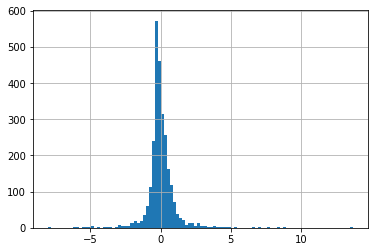

In [82]:
ho['return1'].hist(bins=100)

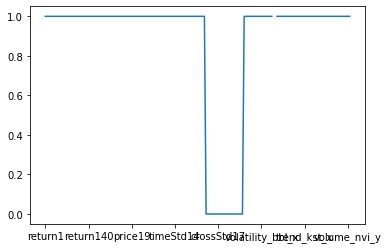

In [72]:
check2.loc['std'].plot()

AttributeError: 'Rectangle' object has no property 'bin'

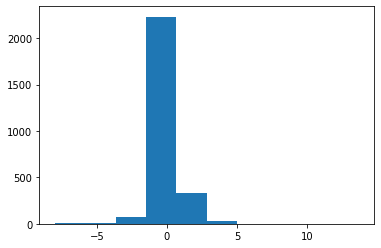

In [78]:
check2['return1'].hist(bin=100)

In [32]:
normalizedDF.drop(columns=np.sum(normalizedDF.isna()).idxmax(),inplace=True)

In [217]:
new_df.expanding(21)

Expanding [min_periods=21,center=False,axis=0]

In [190]:
new_df=new_df.astype(float)

In [192]:
new_df.expanding(21).apply(rank)

TypeError: cannot convert the series to <class 'float'>

In [181]:
new_df.dtypes[~(new_df.dtypes=='float64')]


Series([], dtype: object)

In [163]:
hi[hi.columns[24:36]]

,return120,return140,return160,return180,return200,return220,return240,price0,price1,price2,price3,price4
count,2091.000000,2091.000000,2091.000000,2091.000000,2091.000000,2091.000000,2091.000000,2091.000000,2091.000000,2091.000000,2091.000000,2091.000000
mean,0.405591,0.495220,0.566710,0.644165,0.731842,0.807019,0.924484,10.934799,10.935014,10.935320,10.935693,10.936138
std,1.873569,2.122019,2.276013,2.438014,2.540717,2.708740,3.277884,9.655600,9.652118,9.648638,9.645365,9.642062
min,-0.953488,-0.960902,-0.964339,-0.960123,-0.964602,-0.969873,-0.967347,0.240000,0.263000,0.295000,0.305000,0.301000
25%,-0.344204,-0.369293,-0.427738,-0.445186,-0.501748,-0.535571,-0.554124,4.235000,4.245000,4.227500,4.235000,4.225000
50%,-0.010762,-0.035294,-0.039074,-0.033422,-0.060519,-0.046572,-0.088838,7.370000,7.380000,7.370000,7.380000,7.450000
75%,0.394194,0.543064,0.558240,0.561448,0.637660,0.705065,0.723869,16.615000,16.620000,16.602500,16.505000,16.555000
max,15.710183,17.669937,15.859463,15.467648,15.049046,15.181319,25.143791,40.660000,40.375000,39.850000,40.445000,40.160000


In [143]:


new_df=toNormalize.loc[1034]
def rank(array):
    s = pd.Series(array)
    return s.rank(pct=True)[len(s)-1]

starttime =time.time()

ranked = new_df.expanding(21).apply(rank)



In [95]:
toNormalize.groupby(level=1)['return1'].mean().mean()/toNormalize.groupby(level=1)['return1'].mean().std()*np.sqrt(252)

0.6786437098612285

In [137]:

def rank(array):
    s = pd.Series(array)
    return s.rank(pct=True)[len(s)-1]


In [112]:
pd.core.window.Expanding.apply(new_df['return1'],rank)


TypeError: super(type, obj): obj must be an instance or subtype of type

In [135]:
roll=new_df.rolling(252)

In [138]:
ranked=new_df.expanding(21).apply(rank)

In [140]:
ranked

,return1,return2,return3,return4,return5,return6,return7,return8,return9,return10,...,trend_aroon_down_x,trend_aroon_ind_x,momentum_rsi_x,momentum_mfi_x,momentum_tsi_x,momentum_uo_x,momentum_stoch_x,momentum_stoch_signal_x,momentum_wr_x,momentum_ao_x
date,,,,,,,,,,,,,,,,,,,,,
2006-03-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006-03-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006-03-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006-03-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006-03-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2008-12-12,0.315341,0.339489,0.461648,0.399148,0.441761,0.413352,0.430398,0.414773,0.426136,0.446023,...,0.161932,0.637784,0.610795,0.370739,0.761364,0.850852,0.622159,0.801136,0.622159,0.916193
2008-12-15,0.086525,0.104965,0.137589,0.214184,0.208511,0.239716,0.228369,0.269504,0.278014,0.286525,...,0.117730,0.637589,0.242553,0.021277,0.753191,0.512057,0.124823,0.543262,0.124823,0.893617
2008-12-16,0.956091,0.694051,0.562323,0.523371,0.587819,0.531161,0.573654,0.529037,0.536827,0.508499,...,0.046742,0.637394,0.685552,0.184136,0.757790,0.803116,0.780453,0.521246,0.780453,0.875354


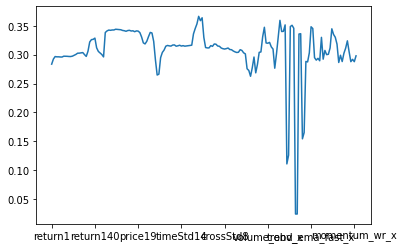

In [119]:
check.loc['std'].plot()

In [121]:
test2

,return1,return2,return3,return4,return5,return6,return7,return8,return9,return10,...,trend_aroon_down_x,trend_aroon_ind_x,momentum_rsi_x,momentum_mfi_x,momentum_tsi_x,momentum_uo_x,momentum_stoch_x,momentum_stoch_signal_x,momentum_wr_x,momentum_ao_x
date,,,,,,,,,,,,,,,,,,,,,
2006-03-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006-03-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006-03-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006-03-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006-03-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2008-12-12,0.315341,0.339489,0.461648,0.399148,0.441761,0.413352,0.430398,0.414773,0.426136,0.446023,...,0.161932,0.637784,0.610795,0.370739,0.761364,0.850852,0.622159,0.801136,0.622159,0.916193
2008-12-15,0.086525,0.104965,0.137589,0.214184,0.208511,0.239716,0.228369,0.269504,0.278014,0.286525,...,0.117730,0.637589,0.242553,0.021277,0.753191,0.512057,0.124823,0.543262,0.124823,0.893617
2008-12-16,0.956091,0.694051,0.562323,0.523371,0.587819,0.531161,0.573654,0.529037,0.536827,0.508499,...,0.046742,0.637394,0.685552,0.184136,0.757790,0.803116,0.780453,0.521246,0.780453,0.875354


In [168]:
withoutTarget

return1   return2   return3   return4   return5  \
entityID date                                                           
1034     2006-03-01  0.028760 -0.015813 -0.012377 -0.015813 -0.020151   
         2006-03-02 -0.025386  0.002645 -0.040797 -0.037448 -0.040797   
         2006-03-03 -0.045829 -0.070051 -0.043306 -0.084756 -0.081561   
         2006-03-06 -0.023151 -0.067920 -0.091581 -0.065455 -0.105946   
         2006-03-07 -0.027237 -0.049758 -0.093307 -0.116324 -0.090909   
...                       ...       ...       ...       ...       ...   
317260   2015-06-18 -0.030340 -0.041966 -0.056671 -0.078431 -0.078431   
         2015-06-19  0.003755 -0.026699 -0.038369 -0.053129 -0.074971   
         2015-06-22  0.031172  0.035044  0.003641 -0.008393 -0.023613   
         2015-06-23  0.015719  0.047382  0.051314  0.019417  0.007194   
         2015-06-24 -0.014286  0.001209  0.032419  0.036295  0.004854   

                      return6   return7   return8   return9  return10  ...  \
entityID date                                                          ...   
1034     2006-03-01  0.014672 -0.004797 -0.022920 -0.010178 -0.009548  ...   
         2006-03-02 -0.045025 -0.011086 -0.030061 -0.047724 -0.035305  ...   
         2006-03-03 -0.084756 -0.088791 -0.056407 -0.074512 -0.091366  ...   
         2006-03-06 -0.102825 -0.105946 -0.109887 -0.078252 -0.095939  ...   
         2006-03-07 -0.130297 -0.127261 -0.130297 -0.134131 -0.103358  ...   
...                       ...       ...       ...       ...       ...  ...   
317260   2015-06-18 -0.092045 -0.069849 -0.067678 -0.084765 -0.084765  ...   
         2015-06-19 -0.074971 -0.088636 -0.066356 -0.064177 -0.081329  ...   
         2015-06-22 -0.046136 -0.046136 -0.060227 -0.037253 -0.035006  ...   
         2015-06-23 -0.008264 -0.031142 -0.031142 -0.045455 -0.022119  ...   
         2015-06-24 -0.007194 -0.022432 -0.044983 -0.044983 -0.059091  ...   

                     trend_aroon_down  trend_aroon_ind  momentum_rsi  \
entityID date                                                          
1034     2006-03-01          0.998653         0.001347      0.081336   
         2006-03-02          0.996464         0.001360      0.030740   
         2006-03-03          0.997834         0.000812      0.005956   
         2006-03-06          0.998105         0.001083      0.004331   
         2006-03-07          0.994306         0.002711      0.003796   
...                               ...              ...           ...   
317260   2015-06-18          0.709034         0.532392      0.074647   
         2015-06-19          0.673151         0.533590      0.120335   
         2015-06-22          0.646099         0.518220      0.435278   
         2015-06-23          0.626386         0.500339      0.603304   
         2015-06-24          0.599184         0.497393      0.597597   

                     momentum_mfi  momentum_tsi  momentum_uo  momentum_stoch  \
entityID date                                                                  
1034     2006-03-01      0.214113      0.345543     0.081874        0.180447   
         2006-03-02      0.230413      0.327258     0.061480        0.028564   
         2006-03-03      0.100433      0.299946     0.002166        0.002436   
         2006-03-06      0.074445      0.272334     0.004873        0.013265   
         2006-03-07      0.035521      0.240781     0.004338        0.010304   
...                           ...           ...          ...             ...   
317260   2015-06-18      0.129792      0.421206     0.115221        0.172159   
         2015-06-19      0.363040      0.409410     0.093418        0.248586   
         2015-06-22      0.350548      0.405097     0.180192        0.400402   
         2015-06-23      0.540620      0.406879     0.210907        0.530889   
         2015-06-24      0.555883      0.407844     0.226026        0.514623   

                     momentum_stoch_signal  momentum_wr  momentum_ao  
entityID

In [30]:
test.loc['std'][0:31]

return1      0.280291
return2      0.286326
return3      0.321145
return4      0.363101
return5      0.399021
return6      0.455792
return7      0.482090
return8      0.515212
return9      0.534142
return10     0.551124
return11     0.573360
return12     0.569545
return13     0.573771
return14     0.562948
return15     0.552378
return16     0.554217
return17     0.551415
return18     0.542496
return19     0.537288
return20     0.532612
return40     0.392291
return60     0.471837
return80     0.708871
return100    0.538452
return120    0.813310
return140    0.593253
return160    0.632858
return180    0.668704
return200    0.805932
return220    0.861852
return240    1.112037
Name: std, dtype: float64

In [9]:
target=mainFrame.iloc[:,-7].to_frame()

In [10]:
target

ztargetMedian5
entityID date                      
1034     2006-03-01           False
         2006-03-02           False
         2006-03-03           False
         2006-03-06            True
         2006-03-07           False
...                             ...
317260   2015-06-18            True
         2015-06-19            True
         2015-06-22           False
         2015-06-23           False
         2015-06-24           False

[7241001 rows x 1 columns]

In [11]:
mainFrame

return1   return2   return3   return4   return5  \
entityID date                                                           
1034     2006-03-01  0.028760 -0.015813 -0.012377 -0.015813 -0.020151   
         2006-03-02 -0.025386  0.002645 -0.040797 -0.037448 -0.040797   
         2006-03-03 -0.045829 -0.070051 -0.043306 -0.084756 -0.081561   
         2006-03-06 -0.023151 -0.067920 -0.091581 -0.065455 -0.105946   
         2006-03-07 -0.027237 -0.049758 -0.093307 -0.116324 -0.090909   
...                       ...       ...       ...       ...       ...   
317260   2015-06-18 -0.030340 -0.041966 -0.056671 -0.078431 -0.078431   
         2015-06-19  0.003755 -0.026699 -0.038369 -0.053129 -0.074971   
         2015-06-22  0.031172  0.035044  0.003641 -0.008393 -0.023613   
         2015-06-23  0.015719  0.047382  0.051314  0.019417  0.007194   
         2015-06-24 -0.014286  0.001209  0.032419  0.036295  0.004854   

                      return6   return7   return8   return9  return10  ...  \
entityID date                                                          ...   
1034     2006-03-01  0.014672 -0.004797 -0.022920 -0.010178 -0.009548  ...   
         2006-03-02 -0.045025 -0.011086 -0.030061 -0.047724 -0.035305  ...   
         2006-03-03 -0.084756 -0.088791 -0.056407 -0.074512 -0.091366  ...   
         2006-03-06 -0.102825 -0.105946 -0.109887 -0.078252 -0.095939  ...   
         2006-03-07 -0.130297 -0.127261 -0.130297 -0.134131 -0.103358  ...   
...                       ...       ...       ...       ...       ...  ...   
317260   2015-06-18 -0.092045 -0.069849 -0.067678 -0.084765 -0.084765  ...   
         2015-06-19 -0.074971 -0.088636 -0.066356 -0.064177 -0.081329  ...   
         2015-06-22 -0.046136 -0.046136 -0.060227 -0.037253 -0.035006  ...   
         2015-06-23 -0.008264 -0.031142 -0.031142 -0.045455 -0.022119  ...   
         2015-06-24 -0.007194 -0.022432 -0.044983 -0.044983 -0.059091  ...   

                     momentum_stoch_signal  momentum_wr  momentum_ao  \
entityID date                                                          
1034     2006-03-01               0.074603     0.180447     0.070832   
         2006-03-02               0.024755     0.028564     0.054679   
         2006-03-03               0.028695     0.002436     0.036275   
         2006-03-06               0.004061     0.013265     0.020303   
         2006-03-07               0.002440     0.010304     0.013015   
...                                    ...          ...          ...   
317260   2015-06-18               0.156019     0.172159     0.715086   
         2015-06-19               0.175526     0.248586     0.641258   
         2015-06-22               0.270959     0.400402     0.590208   
         2015-06-23               0.388549     0.530889     0.579543   
         2015-06-24               0.484244     0.514623     0.591703   

                     ztargetMedian5  ztargetReturns5  ztargetPositive5  \
entityID date                                                            
1034     2006-03-01           False        -0.083869             False   
         2006-03-02           False        -0.089680             False   
         2006-03-03           False        -0.049758             False   
         2006-03-06            True         0.004245              True   
         2006-03-07           False        -0.001455             False   
...                             ...              ...               ...   
317260   2015-06-18            True         0.007509              True   
         2015-06-19            True         0.002494              True   
         2015-06-22           False        -0.027811             False   
         2015-06-23           False        -0.030952             False   
         2015-06-24           False        -0.042271             False   

                     ztargetTopDown5  ztargetTop5  ztargetDown5  yReturns5  
entityID date                                                               
103

In [17]:
hi=TimeseriesGenerator(np.array(train),np.array(target),20,batch_size=1)



KeyboardInterrupt: 

In [ ]:
x,y=hi[25]
train

In [ ]:
entityIDs

In [12]:
import keras
import numpy as np
class DataGenerator(keras.utils.Sequence):
    def __init__(self, feature,target, length, batch_size=128):
        entityIDs=feature.index.get_level_values(0).unique()
        self.tgs = list()
        for i in tqdm(entityIDs):
         
            featuredf = feature[feature.index.get_level_values(0) == i]
            targetdf = target[target.index.get_level_values(0) == i]
            if len(targetdf)>length:
                self.tgs.append(TimeseriesGenerator(featuredf.values,targetdf.values,length,batch_size =batch_size))
        self.len = sum([len(tg) for tg in self.tgs])
        self.idx_i = list()
        self.idx_j = list()

        for i, tg in enumerate(self.tgs):
            self.idx_i.extend(list(range(len(tg))))
            self.idx_j.extend([i]*len(tg))    
        #print ( self.idx_i,  self.idx_j)

    def __len__(self):
        return self.len

    def __getitem__(self, index):
        return self.tgs[self.idx_j[index]][self.idx_i[index]]

# Test
H = DataGenerator(train,target,20,1)


100%|██████████| 5460/5460 [23:24<00:00,  3.89it/s]


In [13]:
import pickle

In [ ]:
H

In [ ]:
len(g)

In [ ]:
import pickle
import tqdm

In [14]:
pickle.dump(H, open( "/beegfs/sr4376/Finance Data/DataForCNNLSTM.pickle", "wb" ) )

In [19]:
trainData=list()
for ii in tqdm(range(0,len(H))):
    trainData.append(H[ii][0].reshape((1,20,377,1)))


100%|█████████▉| 7132521/7132522 [09:53<00:00, 12023.32it/s]


IndexError: list index out of range

In [20]:
trainData

[array([[[[ 0.02876033],
          [-0.01581278],
          [-0.01237702],
          ...,
          [ 0.07460275],
          [ 0.18044708],
          [ 0.07083221]],
 
         [[-0.0253856 ],
          [ 0.00264463],
          [-0.04079696],
          ...,
          [ 0.02475517],
          [ 0.02856366],
          [ 0.054679  ]],
 
         [[-0.04582921],
          [-0.07005141],
          [-0.04330579],
          ...,
          [ 0.02869518],
          [ 0.00243638],
          [ 0.03627504]],
 
         ...,
 
         [[ 0.00716981],
          [ 0.01870229],
          [-0.01001484],
          ...,
          [ 0.04755471],
          [ 0.1080789 ],
          [ 0.01567144]],
 
         [[ 0.00974148],
          [ 0.01698113],
          [ 0.02862595],
          ...,
          [ 0.11465309],
          [ 0.19421377],
          [ 0.01875167]],
 
         [[-0.0174397 ],
          [-0.00786812],
          [-0.00075472],
          ...,
          [ 0.12537072],
          [ 0.11997843],
    

In [18]:
import keras
import numpy as np
class DataGenerator(keras.utils.Sequence):
    def __init__(self, feature,target, length, batch_size=128):
        entityIDs=feature.index.get_level_values(0).unique()
        self.tgs = list()
        self.indexObject = None
        for i in tqdm(entityIDs):
         
            featuredf = feature[feature.index.get_level_values(0) == i]
            targetdf = target[target.index.get_level_values(0) == i]
            tmpIDX=pd.DataFrame([featuredf.index.get_level_values(0).values,featuredf.index.get_level_values(1).values]).T
            
            if self.indexObject is None:
                self.indexObject = tmpIDX.iloc[length:]
            else:
                self.indexObject = self.indexObject.append(tmpIDX.iloc[length:])
                
            if len(targetdf)>length:
                self.tgs.append(TimeseriesGenerator(featuredf.values,targetdf.values,length,batch_size =batch_size))
        self.len = sum([len(tg) for tg in self.tgs])
        self.idx_i = list()
        self.idx_j = list()

        for i, tg in enumerate(self.tgs):
            self.idx_i.extend(list(range(len(tg))))
            self.idx_j.extend([i]*len(tg))    
        #print ( self.idx_i,  self.idx_j)

    def __len__(self):
        return self.len

    def __getitem__(self, index):
        return self.tgs[self.idx_j[index]][self.idx_i[index]]

# Test
H = DataGenerator(train,target,20,1)

100%|██████████| 5460/5460 [51:28<00:00,  1.77it/s]  


In [23]:
desc=mainFrame.describe()

In [ ]:
import keras
import numpy as np
class DataGenerator(keras.utils.Sequence):
    def __init__(self, dt, length, batch_size=128):
        self.tgs = list()
        for i in range(dt['ids'].min(),dt['ids'].max()+1):
            adf = dt[dt['ids'] == i]
            self.tgs.append(TimeseriesGenerator(adf.values,adf.values,length,batch_size =batch_size))
        self.len = sum([len(tg) for tg in self.tgs])
        self.idx_i = list()
        self.idx_j = list()

        for i, tg in enumerate(self.tgs):
            self.idx_i.extend(list(range(len(tg))))
            self.idx_j.extend([i]*len(tg))    
        #print ( self.idx_i,  self.idx_j)

    def __len__(self):
        return self.len

    def __getitem__(self, index):
        return self.tgs[self.idx_j[index]][self.idx_i[index]]

# Test
g = DataGenerator(dt,3,3)
for i in range(len(g)):
    print (g[i])

In [ ]:
number =0
counter =0
cnnLSTMFeature = None
stockDateIndex = 9
cnnLSTMTargets = None


keras.
for ii in tqdm(entityIDs):
    print(ii)
    if os.path.exists('/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(ii),str(stockDateIndex))):
        testData=pd.read_pickle('/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(ii),str(stockDateIndex)),'gzip')
        flat_list = [item for sublist in np.array(testData) for item in sublist]
        dataCheck=np.reshape(flat_list,(np.shape(flat_list)[0],np.shape(flat_list)[1],np.shape(flat_list)[2],1))
        print(np.shape(dataCheck))
        if cnnLSTMFeature is None:
            cnnLSTMFeature = dataCheck
        else:
            cnnLSTMFeature = np.concatenate((cnnLSTMFeature,dataCheck),axis=0)
            
        if counter >50:
            counter =0
            np.savez_compressed(arr=cnnLSTMFeature,file='/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(number),str(stockDateIndex)))
            cnnLSTMFeature=None
            number = number+1
        counter = counter +1

In [12]:
number =0
counter =0
cnnLSTMFeature = None
stockDateIndex = 9
cnnLSTMTargets = None
for ii in tqdm(np.arange(0,106)):
    print(ii)
    if os.path.exists('/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl.npz'.format(str(ii),str(stockDateIndex))):
        testData=np.load(file='/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl.npz'.format(str(ii),str(stockDateIndex)))
        dataCheck=testData['arr']
        print(np.shape(dataCheck))
        if cnnLSTMFeature is None:
            cnnLSTMFeature = dataCheck
        else:
            cnnLSTMFeature = np.concatenate((cnnLSTMFeature,dataCheck),axis=0)
        print(np.shape(cnnLSTMFeature))    
        if counter >9:
            counter =0
            np.savez_compressed(arr=cnnLSTMFeature,file='/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(number),str(51)))
            cnnLSTMFeature=None
            number = number+1
        counter = counter +1
        
        





  0%|          | 0/106 [00:00<?, ?it/s]

0






  1%|          | 1/106 [00:07<12:46,  7.30s/it]

(90104, 10, 377, 1)
(90104, 10, 377, 1)
1
(87847, 10, 377, 1)






  2%|▏         | 2/106 [00:18<14:32,  8.39s/it]

(177951, 10, 377, 1)
2
(98730, 10, 377, 1)






  3%|▎         | 3/106 [00:32<17:36, 10.26s/it]

(276681, 10, 377, 1)
3
(98751, 10, 377, 1)






  4%|▍         | 4/106 [00:49<20:39, 12.15s/it]

(375432, 10, 377, 1)
4
(88979, 10, 377, 1)






  5%|▍         | 5/106 [01:08<23:48, 14.15s/it]

(464411, 10, 377, 1)
5
(83853, 10, 377, 1)






  6%|▌         | 6/106 [01:29<27:02, 16.23s/it]

(548264, 10, 377, 1)
6
(88922, 10, 377, 1)






  7%|▋         | 7/106 [01:52<30:13, 18.32s/it]

(637186, 10, 377, 1)
7
(89839, 10, 377, 1)






  8%|▊         | 8/106 [02:18<33:39, 20.61s/it]

(727025, 10, 377, 1)
8
(84743, 10, 377, 1)






  8%|▊         | 9/106 [02:48<37:52, 23.42s/it]

(811768, 10, 377, 1)
9
(100569, 10, 377, 1)






  9%|▉         | 10/106 [03:25<44:11, 27.62s/it]

(912337, 10, 377, 1)
10
(72462, 10, 377, 1)
(984799, 10, 377, 1)






 10%|█         | 11/106 [11:20<4:16:02, 161.71s/it]

11






 11%|█▏        | 12/106 [11:25<2:59:39, 114.67s/it]

(57522, 10, 377, 1)
(57522, 10, 377, 1)
12
(70640, 10, 377, 1)






 12%|█▏        | 13/106 [11:34<2:08:39, 83.01s/it] 

(128162, 10, 377, 1)
13
(73181, 10, 377, 1)






 13%|█▎        | 14/106 [11:45<1:33:57, 61.27s/it]

(201343, 10, 377, 1)
14
(94676, 10, 377, 1)






 14%|█▍        | 15/106 [11:59<1:11:42, 47.28s/it]

(296019, 10, 377, 1)
15
(49659, 10, 377, 1)






 15%|█▌        | 16/106 [12:11<55:06, 36.74s/it]  

(345678, 10, 377, 1)
16
(52610, 10, 377, 1)






 16%|█▌        | 17/106 [12:25<44:19, 29.89s/it]

(398288, 10, 377, 1)
17
(35889, 10, 377, 1)






 17%|█▋        | 18/106 [12:38<36:27, 24.86s/it]

(434177, 10, 377, 1)
18
(23868, 10, 377, 1)






 18%|█▊        | 19/106 [12:52<30:59, 21.37s/it]

(458045, 10, 377, 1)
19
(24335, 10, 377, 1)






 19%|█▉        | 20/106 [13:05<27:21, 19.09s/it]

(482380, 10, 377, 1)
20
(16608, 10, 377, 1)
(498988, 10, 377, 1)






 20%|█▉        | 21/106 [17:06<2:01:09, 85.53s/it]

21






 21%|██        | 22/106 [17:09<1:25:12, 60.86s/it]

(32226, 10, 377, 1)
(32226, 10, 377, 1)
22
(29569, 10, 377, 1)






 22%|██▏       | 23/106 [17:13<1:00:34, 43.79s/it]

(61795, 10, 377, 1)
23
(39195, 10, 377, 1)






 23%|██▎       | 24/106 [17:19<44:09, 32.31s/it]  

(100990, 10, 377, 1)
24
(63098, 10, 377, 1)






 24%|██▎       | 25/106 [17:28<34:09, 25.30s/it]

(164088, 10, 377, 1)
25
(79131, 10, 377, 1)






 25%|██▍       | 26/106 [17:40<28:36, 21.46s/it]

(243219, 10, 377, 1)
26
(85113, 10, 377, 1)






 25%|██▌       | 27/106 [17:54<25:27, 19.33s/it]

(328332, 10, 377, 1)
27
(81761, 10, 377, 1)






 26%|██▋       | 28/106 [18:12<24:16, 18.67s/it]

(410093, 10, 377, 1)
28
(87346, 10, 377, 1)






 27%|██▋       | 29/106 [18:38<27:04, 21.09s/it]

(497439, 10, 377, 1)
29
(77730, 10, 377, 1)






 28%|██▊       | 30/106 [18:57<25:57, 20.49s/it]

(575169, 10, 377, 1)
30
(71430, 10, 377, 1)
(646599, 10, 377, 1)






 29%|██▉       | 31/106 [24:14<2:16:37, 109.30s/it]

31






 30%|███       | 32/106 [24:21<1:37:00, 78.66s/it] 

(85991, 10, 377, 1)
(85991, 10, 377, 1)
32
(79980, 10, 377, 1)






 31%|███       | 33/106 [24:31<1:10:43, 58.13s/it]

(165971, 10, 377, 1)
33
(89490, 10, 377, 1)






 32%|███▏      | 34/106 [24:45<53:34, 44.65s/it]  

(255461, 10, 377, 1)
34
(85012, 10, 377, 1)






 33%|███▎      | 35/106 [24:59<42:12, 35.67s/it]

(340473, 10, 377, 1)
35
(77757, 10, 377, 1)






 34%|███▍      | 36/106 [25:16<35:00, 30.01s/it]

(418230, 10, 377, 1)
36
(86565, 10, 377, 1)






 35%|███▍      | 37/106 [25:35<30:47, 26.77s/it]

(504795, 10, 377, 1)
37
(77739, 10, 377, 1)






 36%|███▌      | 38/106 [25:58<28:56, 25.54s/it]

(582534, 10, 377, 1)
38
(62132, 10, 377, 1)






 37%|███▋      | 39/106 [26:24<28:35, 25.61s/it]

(644666, 10, 377, 1)
39
(67621, 10, 377, 1)






 38%|███▊      | 40/106 [26:46<27:12, 24.73s/it]

(712287, 10, 377, 1)
40
(58628, 10, 377, 1)
(770915, 10, 377, 1)






 39%|███▊      | 41/106 [32:55<2:18:36, 127.95s/it]

41






 40%|███▉      | 42/106 [33:01<1:37:23, 91.31s/it] 

(70282, 10, 377, 1)
(70282, 10, 377, 1)
42
(73578, 10, 377, 1)






 41%|████      | 43/106 [33:11<1:10:10, 66.83s/it]

(143860, 10, 377, 1)
43
(60744, 10, 377, 1)






 42%|████▏     | 44/106 [33:21<51:31, 49.87s/it]  

(204604, 10, 377, 1)
44
(78793, 10, 377, 1)






 42%|████▏     | 45/106 [33:40<41:14, 40.57s/it]

(283397, 10, 377, 1)
45
(73413, 10, 377, 1)






 43%|████▎     | 46/106 [33:57<33:34, 33.57s/it]

(356810, 10, 377, 1)
46
(60149, 10, 377, 1)






 44%|████▍     | 47/106 [34:12<27:25, 27.90s/it]

(416959, 10, 377, 1)
47
(62342, 10, 377, 1)






 45%|████▌     | 48/106 [34:27<23:24, 24.21s/it]

(479301, 10, 377, 1)
48
(80273, 10, 377, 1)






 46%|████▌     | 49/106 [34:47<21:49, 22.97s/it]

(559574, 10, 377, 1)
49
(82485, 10, 377, 1)






 47%|████▋     | 50/106 [35:10<21:23, 22.93s/it]

(642059, 10, 377, 1)
50
(71912, 10, 377, 1)
(713971, 10, 377, 1)






 48%|████▊     | 51/106 [40:56<1:49:52, 119.86s/it]

51






 49%|████▉     | 52/106 [41:03<1:17:11, 85.77s/it] 

(73784, 10, 377, 1)
(73784, 10, 377, 1)
52
(80780, 10, 377, 1)






 50%|█████     | 53/106 [41:14<56:02, 63.44s/it]  

(154564, 10, 377, 1)
53
(60727, 10, 377, 1)






 51%|█████     | 54/106 [41:30<42:45, 49.33s/it]

(215291, 10, 377, 1)
54
(76964, 10, 377, 1)






 52%|█████▏    | 55/106 [41:43<32:37, 38.38s/it]

(292255, 10, 377, 1)
55
(85252, 10, 377, 1)






 53%|█████▎    | 56/106 [41:59<26:13, 31.48s/it]

(377507, 10, 377, 1)
56
(76214, 10, 377, 1)






 54%|█████▍    | 57/106 [42:15<21:55, 26.85s/it]

(453721, 10, 377, 1)
57
(88689, 10, 377, 1)






 55%|█████▍    | 58/106 [42:36<20:05, 25.12s/it]

(542410, 10, 377, 1)
58
(91078, 10, 377, 1)






 56%|█████▌    | 59/106 [43:00<19:35, 25.00s/it]

(633488, 10, 377, 1)
59
(88616, 10, 377, 1)






 57%|█████▋    | 60/106 [43:25<19:09, 24.99s/it]

(722104, 10, 377, 1)
60
(76633, 10, 377, 1)
(798737, 10, 377, 1)






 58%|█████▊    | 61/106 [49:52<1:40:01, 133.36s/it]

61






 58%|█████▊    | 62/106 [49:59<1:10:09, 95.67s/it] 

(94305, 10, 377, 1)
(94305, 10, 377, 1)
62
(76571, 10, 377, 1)






 59%|█████▉    | 63/106 [50:10<50:16, 70.16s/it]  

(170876, 10, 377, 1)
63
(97030, 10, 377, 1)






 60%|██████    | 64/106 [50:25<37:29, 53.55s/it]

(267906, 10, 377, 1)
64
(88701, 10, 377, 1)






 61%|██████▏   | 65/106 [50:41<28:52, 42.25s/it]

(356607, 10, 377, 1)
65
(81737, 10, 377, 1)






 62%|██████▏   | 66/106 [50:58<23:08, 34.70s/it]

(438344, 10, 377, 1)
66
(77851, 10, 377, 1)






 63%|██████▎   | 67/106 [51:18<19:42, 30.32s/it]

(516195, 10, 377, 1)
67
(74342, 10, 377, 1)






 64%|██████▍   | 68/106 [51:38<17:22, 27.43s/it]

(590537, 10, 377, 1)
68
(79107, 10, 377, 1)






 65%|██████▌   | 69/106 [52:06<16:52, 27.35s/it]

(669644, 10, 377, 1)
69
(80256, 10, 377, 1)






 66%|██████▌   | 70/106 [52:33<16:24, 27.35s/it]

(749900, 10, 377, 1)
70
(78457, 10, 377, 1)
(828357, 10, 377, 1)






 67%|██████▋   | 71/106 [59:18<1:22:04, 140.70s/it]

71






 68%|██████▊   | 72/106 [59:25<56:57, 100.53s/it]  

(82288, 10, 377, 1)
(82288, 10, 377, 1)
72
(77200, 10, 377, 1)






 69%|██████▉   | 73/106 [59:35<40:24, 73.46s/it] 

(159488, 10, 377, 1)
73
(83642, 10, 377, 1)






 70%|██████▉   | 74/106 [59:48<29:25, 55.18s/it]

(243130, 10, 377, 1)
74
(71651, 10, 377, 1)






 71%|███████   | 75/106 [1:00:01<21:58, 42.55s/it]

(314781, 10, 377, 1)
75
(40940, 10, 377, 1)






 72%|███████▏  | 76/106 [1:00:13<16:40, 33.36s/it]

(355721, 10, 377, 1)
76
(21158, 10, 377, 1)






 73%|███████▎  | 77/106 [1:00:25<13:05, 27.09s/it]

(376879, 10, 377, 1)
77
(48281, 10, 377, 1)






 74%|███████▎  | 78/106 [1:00:44<11:24, 24.46s/it]

(425160, 10, 377, 1)
78
(85461, 10, 377, 1)






 75%|███████▍  | 79/106 [1:01:03<10:19, 22.96s/it]

(510621, 10, 377, 1)
79
(85033, 10, 377, 1)






 75%|███████▌  | 80/106 [1:01:25<09:48, 22.64s/it]

(595654, 10, 377, 1)
80
(81688, 10, 377, 1)
(677342, 10, 377, 1)






 76%|███████▋  | 81/106 [1:06:56<47:55, 115.04s/it]

81






 77%|███████▋  | 82/106 [1:07:00<32:42, 81.75s/it] 

(48041, 10, 377, 1)
(48041, 10, 377, 1)
82
(73345, 10, 377, 1)






 78%|███████▊  | 83/106 [1:07:09<22:58, 59.96s/it]

(121386, 10, 377, 1)
83
(70336, 10, 377, 1)






 79%|███████▉  | 84/106 [1:07:19<16:34, 45.19s/it]

(191722, 10, 377, 1)
84
(60208, 10, 377, 1)






 80%|████████  | 85/106 [1:07:32<12:25, 35.50s/it]

(251930, 10, 377, 1)
85
(70710, 10, 377, 1)






 81%|████████  | 86/106 [1:07:46<09:35, 28.79s/it]

(322640, 10, 377, 1)
86
(67063, 10, 377, 1)






 82%|████████▏ | 87/106 [1:08:00<07:46, 24.53s/it]

(389703, 10, 377, 1)
87
(60364, 10, 377, 1)






 83%|████████▎ | 88/106 [1:08:22<07:07, 23.76s/it]

(450067, 10, 377, 1)
88
(58153, 10, 377, 1)






 84%|████████▍ | 89/106 [1:08:38<06:04, 21.42s/it]

(508220, 10, 377, 1)
89
(63924, 10, 377, 1)






 85%|████████▍ | 90/106 [1:08:57<05:33, 20.82s/it]

(572144, 10, 377, 1)
90
(60341, 10, 377, 1)
(632485, 10, 377, 1)






 86%|████████▌ | 91/106 [1:14:04<26:39, 106.62s/it]

91






 87%|████████▋ | 92/106 [1:14:09<17:43, 75.99s/it] 

(52798, 10, 377, 1)
(52798, 10, 377, 1)
92
(46131, 10, 377, 1)






 88%|████████▊ | 93/106 [1:14:15<11:55, 55.01s/it]

(98929, 10, 377, 1)
93
(52276, 10, 377, 1)






 89%|████████▊ | 94/106 [1:14:23<08:12, 41.03s/it]

(151205, 10, 377, 1)
94
(47122, 10, 377, 1)






 90%|████████▉ | 95/106 [1:14:32<05:46, 31.49s/it]

(198327, 10, 377, 1)
95
(47217, 10, 377, 1)






 91%|█████████ | 96/106 [1:14:42<04:09, 24.92s/it]

(245544, 10, 377, 1)
96
(41460, 10, 377, 1)






 92%|█████████▏| 97/106 [1:14:52<03:05, 20.57s/it]

(287004, 10, 377, 1)
97
(39775, 10, 377, 1)






 92%|█████████▏| 98/106 [1:15:03<02:21, 17.64s/it]

(326779, 10, 377, 1)
98
(36706, 10, 377, 1)






 93%|█████████▎| 99/106 [1:15:14<01:49, 15.62s/it]

(363485, 10, 377, 1)
99
(37632, 10, 377, 1)






 94%|█████████▍| 100/106 [1:15:29<01:32, 15.39s/it]

(401117, 10, 377, 1)
100
(37188, 10, 377, 1)
(438305, 10, 377, 1)






 95%|█████████▌| 101/106 [1:19:03<06:14, 74.92s/it]

101






 96%|█████████▌| 102/106 [1:19:06<03:33, 53.34s/it]

(35050, 10, 377, 1)
(35050, 10, 377, 1)
102
(29898, 10, 377, 1)






 97%|█████████▋| 103/106 [1:19:10<01:56, 38.67s/it]

(64948, 10, 377, 1)
103
(29920, 10, 377, 1)






 98%|█████████▊| 104/106 [1:19:15<00:57, 28.50s/it]

(94868, 10, 377, 1)
104
(26041, 10, 377, 1)






 99%|█████████▉| 105/106 [1:19:20<00:21, 21.56s/it]

(120909, 10, 377, 1)
105
(62774, 10, 377, 1)






100%|██████████| 106/106 [1:19:30<00:00, 45.01s/it]

(183683, 10, 377, 1)


In [13]:
np.savez_compressed(arr=cnnLSTMFeature,file='/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(number),str(51)))
            

In [15]:
number =0
counter =0
cnnLSTMFeature = None
stockDateIndex = 51
cnnLSTMTargets = None
for ii in tqdm(np.arange(0,11)):
    print(ii)
    if os.path.exists('/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl.npz'.format(str(ii),str(stockDateIndex))):
        testData=np.load(file='/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl.npz'.format(str(ii),str(stockDateIndex)))
        dataCheck=testData['arr']
        print(np.shape(dataCheck))
        if cnnLSTMFeature is None:
            cnnLSTMFeature = dataCheck
        else:
            cnnLSTMFeature = np.concatenate((cnnLSTMFeature,dataCheck),axis=0)
        print(np.shape(cnnLSTMFeature))    
        if counter >10:
            counter =0
            np.savez_compressed(arr=cnnLSTMFeature,file='/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(number),str(500)))
            cnnLSTMFeature=None
            number = number+1
        counter = counter +1
        






  0%|          | 0/11 [00:00<?, ?it/s]

0







  9%|▉         | 1/11 [01:18<13:00, 78.01s/it]

(984799, 10, 377, 1)
(984799, 10, 377, 1)
1
(498988, 10, 377, 1)







 18%|█▊        | 2/11 [02:41<11:56, 79.56s/it]

(1483787, 10, 377, 1)
2
(646599, 10, 377, 1)







 27%|██▋       | 3/11 [04:35<12:00, 90.08s/it]

(2130386, 10, 377, 1)
3
(770915, 10, 377, 1)







 36%|███▋      | 4/11 [07:09<12:43, 109.13s/it]

(2901301, 10, 377, 1)
4
(713971, 10, 377, 1)







 45%|████▌     | 5/11 [10:00<12:47, 127.86s/it]

(3615272, 10, 377, 1)
5
(798737, 10, 377, 1)







 55%|█████▍    | 6/11 [13:12<12:14, 146.94s/it]

(4414009, 10, 377, 1)
6
(828357, 10, 377, 1)







 64%|██████▎   | 7/11 [16:56<11:20, 170.09s/it]

(5242366, 10, 377, 1)
7
(677342, 10, 377, 1)







 73%|███████▎  | 8/11 [20:58<09:34, 191.58s/it]

(5919708, 10, 377, 1)
8
(632485, 10, 377, 1)







 82%|████████▏ | 9/11 [25:33<07:13, 216.60s/it]

(6552193, 10, 377, 1)
9
(438305, 10, 377, 1)







 91%|█████████ | 10/11 [30:39<04:03, 243.52s/it]

(6990498, 10, 377, 1)
10
(183683, 10, 377, 1)







100%|██████████| 11/11 [35:50<00:00, 195.52s/it]

(7174181, 10, 377, 1)


In [16]:
 np.savez_compressed(arr=cnnLSTMFeature,file='/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(number),str(500)))
           

In [48]:
number =0
counter =0
cnnLSTMFeature = None
stockDateIndex = 9
cnnLSTMTargets = None
for ii in tqdm(entityIDs):
    print(ii)
    if os.path.exists('/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(ii),str(stockDateIndex))):
        testData=pd.read_pickle('/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(ii),str(stockDateIndex)),'gzip')
        flat_list = [item for sublist in np.array(testData) for item in sublist]
        dataCheck=np.reshape(flat_list,(np.shape(flat_list)[0],np.shape(flat_list)[1],np.shape(flat_list)[2],1))
        print(np.shape(dataCheck))
        if cnnLSTMFeature is None:
            cnnLSTMFeature = dataCheck
        else:
            cnnLSTMFeature = np.concatenate((cnnLSTMFeature,dataCheck),axis=0)
            
        if counter >50:
            counter =0
            np.savez_compressed(arr=cnnLSTMFeature,file='/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(number),str(stockDateIndex)))
            cnnLSTMFeature=None
            number = number+1
        counter = counter +1
        
        
        











  0%|          | 0/5460 [00:00<?, ?it/s]








  0%|          | 1/5460 [00:00<13:16,  6.86it/s]

1034
(699, 10, 377, 1)
1045











  0%|          | 2/5460 [00:00<27:30,  3.31it/s]

(2082, 10, 377, 1)
1050


(2471, 10, 377, 1)


  0%|          | 3/5460 [00:01<44:43,  2.03it/s]

1056
(492, 10, 377, 1)











  0%|          | 4/5460 [00:02<42:36,  2.13it/s]

1062
(2476, 10, 377, 1)











  0%|          | 5/5460 [00:03<56:44,  1.60it/s]

1072
(2476, 10, 377, 1)











  0%|          | 6/5460 [00:04<1:11:38,  1.27it/s]

1075
(2476, 10, 377, 1)











  0%|          | 7/5460 [00:05<1:25:23,  1.06it/s]

1076
(920, 10, 377, 1)











  0%|          | 8/5460 [00:06<1:23:19,  1.09it/s]

1078
(2476, 10, 377, 1)











  0%|          | 9/5460 [00:07<1:36:52,  1.07s/it]

1081
(543, 10, 377, 1)











  0%|          | 10/5460 [00:08<1:30:39,  1.00it/s]

1084
(387, 10, 377, 1)











  0%|          | 11/5460 [00:09<1:25:32,  1.06it/s]

1094
(2476, 10, 377, 1)











  0%|          | 12/5460 [00:11<1:41:38,  1.12s/it]

1104
(207, 10, 377, 1)











  0%|          | 13/5460 [00:11<1:35:54,  1.06s/it]

1177
(2476, 10, 377, 1)











  0%|          | 14/5460 [00:13<1:50:27,  1.22s/it]

1186
(2476, 10, 377, 1)











  0%|          | 15/5460 [00:15<2:02:46,  1.35s/it]

1209
(2476, 10, 377, 1)











  0%|          | 16/5460 [00:16<2:09:19,  1.43s/it]

1210
(1219, 10, 377, 1)











  0%|          | 17/5460 [00:18<2:07:20,  1.40s/it]

1230
(2476, 10, 377, 1)











  0%|          | 18/5460 [00:19<2:14:40,  1.48s/it]

1234
(781, 10, 377, 1)











  0%|          | 19/5460 [00:21<2:07:01,  1.40s/it]

1239
(1433, 10, 377, 1)











  0%|          | 20/5460 [00:22<2:07:15,  1.40s/it]

1240
(189, 10, 377, 1)











  0%|          | 21/5460 [00:23<2:00:19,  1.33s/it]

1243
(556, 10, 377, 1)











  0%|          | 22/5460 [00:24<2:00:58,  1.33s/it]

1246
(799, 10, 377, 1)











  0%|          | 23/5460 [00:26<1:57:19,  1.29s/it]

1254
(2476, 10, 377, 1)











  0%|          | 24/5460 [00:28<2:11:28,  1.45s/it]

1257
(2165, 10, 377, 1)











  0%|          | 25/5460 [00:29<2:21:36,  1.56s/it]

1266
(2476, 10, 377, 1)











  0%|          | 26/5460 [00:31<2:33:08,  1.69s/it]

1274
(2476, 10, 377, 1)











  0%|          | 27/5460 [00:33<2:42:21,  1.79s/it]

1279
(1382, 10, 377, 1)











  1%|          | 28/5460 [00:35<2:40:42,  1.78s/it]

1380
(2476, 10, 377, 1)











  1%|          | 29/5460 [00:37<2:47:53,  1.85s/it]

1382
(2082, 10, 377, 1)











  1%|          | 30/5460 [00:39<2:52:26,  1.91s/it]

1393
(2476, 10, 377, 1)











  1%|          | 31/5460 [00:41<2:59:38,  1.99s/it]

1439
(2476, 10, 377, 1)











  1%|          | 32/5460 [00:43<3:02:33,  2.02s/it]

1440
(2476, 10, 377, 1)











  1%|          | 33/5460 [00:46<3:06:20,  2.06s/it]

1447
(2476, 10, 377, 1)











  1%|          | 34/5460 [00:48<3:13:56,  2.14s/it]

1449
(2476, 10, 377, 1)











  1%|          | 35/5460 [00:50<3:17:33,  2.19s/it]

1611
(1121, 10, 377, 1)











  1%|          | 36/5460 [00:52<3:14:32,  2.15s/it]

1613
(2161, 10, 377, 1)











  1%|          | 37/5460 [00:55<3:24:48,  2.27s/it]

1618
(835, 10, 377, 1)











  1%|          | 38/5460 [00:57<3:22:22,  2.24s/it]

1619
(298, 10, 377, 1)











  1%|          | 39/5460 [00:59<3:20:10,  2.22s/it]

1632
(2476, 10, 377, 1)











  1%|          | 40/5460 [01:02<3:33:42,  2.37s/it]

1633
(1, 10, 377, 1)











  1%|          | 41/5460 [01:04<3:32:27,  2.35s/it]

1706
(2476, 10, 377, 1)











  1%|          | 42/5460 [01:07<3:37:41,  2.41s/it]

1722
(2476, 10, 377, 1)











  1%|          | 43/5460 [01:10<4:06:04,  2.73s/it]

1783
(363, 10, 377, 1)











  1%|          | 44/5460 [01:12<3:47:35,  2.52s/it]

1794
(2476, 10, 377, 1)











  1%|          | 45/5460 [01:15<3:54:36,  2.60s/it]

1797
(352, 10, 377, 1)











  1%|          | 46/5460 [01:17<3:47:26,  2.52s/it]

1823
(2076, 10, 377, 1)











  1%|          | 47/5460 [01:20<3:54:46,  2.60s/it]

1837
(2476, 10, 377, 1)











  1%|          | 48/5460 [01:23<4:02:42,  2.69s/it]

1919
(2476, 10, 377, 1)











  1%|          | 49/5460 [01:26<4:06:31,  2.73s/it]

1920
(2476, 10, 377, 1)











  1%|          | 50/5460 [01:29<4:12:15,  2.80s/it]

1926
(2151, 10, 377, 1)











  1%|          | 51/5460 [01:32<4:17:39,  2.86s/it]

2008
(439, 10, 377, 1)











  1%|          | 52/5460 [02:17<23:26:16, 15.60s/it]

2019











  1%|          | 53/5460 [02:18<16:40:16, 11.10s/it]

(2476, 10, 377, 1)
2025











  1%|          | 54/5460 [02:18<11:56:45,  7.96s/it]

(2160, 10, 377, 1)
2033
(15, 10, 377, 1)











  1%|          | 55/5460 [02:19<8:26:25,  5.62s/it] 

2034
(341, 10, 377, 1)











  1%|          | 56/5460 [02:19<6:00:43,  4.01s/it]

2044
(2476, 10, 377, 1)











  1%|          | 57/5460 [02:20<4:32:49,  3.03s/it]

2049
(2476, 10, 377, 1)











  1%|          | 58/5460 [02:20<3:34:28,  2.38s/it]

2052
(295, 10, 377, 1)











  1%|          | 59/5460 [02:21<2:41:18,  1.79s/it]

2055
(2476, 10, 377, 1)











  1%|          | 60/5460 [02:22<2:17:39,  1.53s/it]

2061
(1039, 10, 377, 1)











  1%|          | 61/5460 [02:22<1:51:52,  1.24s/it]

2111
(1289, 10, 377, 1)











  1%|          | 62/5460 [02:23<1:39:10,  1.10s/it]

2113
(267, 10, 377, 1)











  1%|          | 63/5460 [02:24<1:23:27,  1.08it/s]

2136
(2374, 10, 377, 1)











  1%|          | 64/5460 [02:25<1:27:29,  1.03it/s]

2137
(2476, 10, 377, 1)











  1%|          | 65/5460 [02:26<1:33:44,  1.04s/it]

2146
(336, 10, 377, 1)











  1%|          | 66/5460 [02:27<1:25:26,  1.05it/s]

2150
(2093, 10, 377, 1)











  1%|          | 67/5460 [02:28<1:31:02,  1.01s/it]

2154
(2476, 10, 377, 1)











  1%|          | 68/5460 [02:29<1:38:58,  1.10s/it]

2162
(571, 10, 377, 1)











  1%|▏         | 69/5460 [02:30<1:33:38,  1.04s/it]

2163
(53, 10, 377, 1)











  1%|▏         | 70/5460 [02:31<1:27:20,  1.03it/s]

2328
(1663, 10, 377, 1)











  1%|▏         | 71/5460 [02:32<1:33:13,  1.04s/it]

2337
(1329, 10, 377, 1)











  1%|▏         | 72/5460 [02:33<1:37:03,  1.08s/it]

2346
(1318, 10, 377, 1)











  1%|▏         | 73/5460 [02:34<1:40:55,  1.12s/it]

2352
(2476, 10, 377, 1)











  1%|▏         | 74/5460 [02:36<1:49:25,  1.22s/it]

2369
(2476, 10, 377, 1)











  1%|▏         | 75/5460 [02:37<1:59:53,  1.34s/it]

2393
(2476, 10, 377, 1)











  1%|▏         | 76/5460 [02:39<2:06:13,  1.41s/it]

2403
(2476, 10, 377, 1)











  1%|▏         | 77/5460 [02:41<2:13:20,  1.49s/it]

2408
(353, 10, 377, 1)











  1%|▏         | 78/5460 [02:42<2:05:04,  1.39s/it]

2435
(2476, 10, 377, 1)











  1%|▏         | 79/5460 [02:44<2:16:09,  1.52s/it]

2436
(2476, 10, 377, 1)











  1%|▏         | 80/5460 [02:46<2:27:28,  1.64s/it]

2444
(2476, 10, 377, 1)











  1%|▏         | 81/5460 [02:48<2:40:23,  1.79s/it]

2448
(2476, 10, 377, 1)











  2%|▏         | 82/5460 [02:50<2:59:22,  2.00s/it]

2526
(2476, 10, 377, 1)











  2%|▏         | 83/5460 [02:52<3:01:50,  2.03s/it]

2536
(2476, 10, 377, 1)











  2%|▏         | 84/5460 [02:54<3:05:23,  2.07s/it]

2537
(577, 10, 377, 1)











  2%|▏         | 85/5460 [02:56<2:56:46,  1.97s/it]

2538
(2476, 10, 377, 1)











  2%|▏         | 86/5460 [02:59<3:04:58,  2.07s/it]

2547
(2331, 10, 377, 1)











  2%|▏         | 87/5460 [03:01<3:11:56,  2.14s/it]

2620
(800, 10, 377, 1)











  2%|▏         | 88/5460 [03:03<3:07:05,  2.09s/it]

2628
(2476, 10, 377, 1)











  2%|▏         | 89/5460 [03:05<3:15:07,  2.18s/it]

2662
(458, 10, 377, 1)











  2%|▏         | 90/5460 [03:07<3:09:52,  2.12s/it]

2663
(2476, 10, 377, 1)











  2%|▏         | 91/5460 [03:10<3:20:14,  2.24s/it]

2677
(291, 10, 377, 1)











  2%|▏         | 92/5460 [03:12<3:16:07,  2.19s/it]

2696
(2476, 10, 377, 1)











  2%|▏         | 93/5460 [03:14<3:27:29,  2.32s/it]

2697
(1883, 10, 377, 1)











  2%|▏         | 94/5460 [03:17<3:34:02,  2.39s/it]

2698
(2476, 10, 377, 1)











  2%|▏         | 95/5460 [03:20<3:43:20,  2.50s/it]

2731
(22, 10, 377, 1)











  2%|▏         | 96/5460 [03:22<3:41:10,  2.47s/it]

2751
(2476, 10, 377, 1)











  2%|▏         | 97/5460 [03:26<4:10:43,  2.81s/it]

2771
(2476, 10, 377, 1)











  2%|▏         | 98/5460 [03:29<4:13:39,  2.84s/it]

2783
(1722, 10, 377, 1)











  2%|▏         | 99/5460 [03:31<4:12:54,  2.83s/it]

2787
(2476, 10, 377, 1)











  2%|▏         | 100/5460 [03:34<4:17:21,  2.88s/it]

2802
(1906, 10, 377, 1)











  2%|▏         | 101/5460 [03:37<4:19:05,  2.90s/it]

2803
(461, 10, 377, 1)











  2%|▏         | 102/5460 [03:40<4:11:00,  2.81s/it]

2807
(2476, 10, 377, 1)











  2%|▏         | 103/5460 [04:24<22:42:16, 15.26s/it]

2811











  2%|▏         | 104/5460 [04:25<16:08:23, 10.85s/it]

(2333, 10, 377, 1)
2817











  2%|▏         | 105/5460 [04:26<11:35:46,  7.80s/it]

(2476, 10, 377, 1)
2818
(2476, 10, 377, 1)











  2%|▏         | 106/5460 [04:26<8:27:42,  5.69s/it] 

2829
(286, 10, 377, 1)











  2%|▏         | 107/5460 [04:27<6:03:32,  4.07s/it]

3024
(2476, 10, 377, 1)











  2%|▏         | 108/5460 [04:27<4:36:59,  3.11s/it]

3026
(2476, 10, 377, 1)











  2%|▏         | 109/5460 [04:28<3:38:01,  2.44s/it]

3028
(2476, 10, 377, 1)











  2%|▏         | 110/5460 [04:29<2:58:09,  2.00s/it]

3031
(1256, 10, 377, 1)











  2%|▏         | 111/5460 [04:30<2:25:37,  1.63s/it]

3036
(434, 10, 377, 1)











  2%|▏         | 112/5460 [04:31<1:56:48,  1.31s/it]

3062
(2476, 10, 377, 1)











  2%|▏         | 113/5460 [04:32<1:51:16,  1.25s/it]

3071
(1916, 10, 377, 1)











  2%|▏         | 114/5460 [04:33<1:46:06,  1.19s/it]

3082
(2476, 10, 377, 1)











  2%|▏         | 115/5460 [04:34<1:47:52,  1.21s/it]

3138
(2476, 10, 377, 1)











  2%|▏         | 116/5460 [04:35<1:50:42,  1.24s/it]

3144
(2476, 10, 377, 1)











  2%|▏         | 117/5460 [04:37<1:54:30,  1.29s/it]

3153
(2476, 10, 377, 1)











  2%|▏         | 118/5460 [04:38<1:58:48,  1.33s/it]

3157
(2476, 10, 377, 1)











  2%|▏         | 119/5460 [04:40<2:03:40,  1.39s/it]

3158
(2476, 10, 377, 1)











  2%|▏         | 120/5460 [04:41<2:08:32,  1.44s/it]

3231
(2476, 10, 377, 1)











  2%|▏         | 121/5460 [04:43<2:13:40,  1.50s/it]

3238
(2476, 10, 377, 1)











  2%|▏         | 122/5460 [04:45<2:19:21,  1.57s/it]

3382
(429, 10, 377, 1)











  2%|▏         | 123/5460 [04:46<2:11:49,  1.48s/it]

3394
(2476, 10, 377, 1)











  2%|▏         | 124/5460 [04:48<2:20:04,  1.57s/it]

3413
(2476, 10, 377, 1)











  2%|▏         | 125/5460 [04:50<2:27:20,  1.66s/it]

3416
(2476, 10, 377, 1)











  2%|▏         | 126/5460 [04:52<2:34:35,  1.74s/it]

3424
(2476, 10, 377, 1)











  2%|▏         | 127/5460 [04:54<2:41:53,  1.82s/it]

3429
(2476, 10, 377, 1)











  2%|▏         | 128/5460 [04:56<2:48:27,  1.90s/it]

3439
(2476, 10, 377, 1)











  2%|▏         | 129/5460 [04:58<2:57:46,  2.00s/it]

3505
(2476, 10, 377, 1)











  2%|▏         | 130/5460 [05:00<3:09:17,  2.13s/it]

3532
(2476, 10, 377, 1)











  2%|▏         | 131/5460 [05:03<3:26:22,  2.32s/it]

3555
(712, 10, 377, 1)











  2%|▏         | 132/5460 [05:05<3:13:29,  2.18s/it]

3556
(2457, 10, 377, 1)











  2%|▏         | 133/5460 [05:07<3:17:00,  2.22s/it]

3562
(2476, 10, 377, 1)











  2%|▏         | 134/5460 [05:10<3:22:09,  2.28s/it]

3570
(2476, 10, 377, 1)











  2%|▏         | 135/5460 [05:12<3:22:05,  2.28s/it]

3580
(2476, 10, 377, 1)











  2%|▏         | 136/5460 [05:14<3:22:52,  2.29s/it]

3581
(2476, 10, 377, 1)











  3%|▎         | 137/5460 [05:17<3:28:33,  2.35s/it]

3592
(176, 10, 377, 1)











  3%|▎         | 138/5460 [05:19<3:15:09,  2.20s/it]

3594
(1352, 10, 377, 1)











  3%|▎         | 139/5460 [05:21<3:13:24,  2.18s/it]

3607
(1061, 10, 377, 1)











  3%|▎         | 140/5460 [05:23<3:12:29,  2.17s/it]

3612
(810, 10, 377, 1)











  3%|▎         | 141/5460 [05:25<3:08:27,  2.13s/it]

3619
(2476, 10, 377, 1)











  3%|▎         | 142/5460 [05:27<3:18:31,  2.24s/it]

3622
(699, 10, 377, 1)











  3%|▎         | 143/5460 [05:29<3:15:40,  2.21s/it]

3639
(2476, 10, 377, 1)











  3%|▎         | 144/5460 [05:32<3:28:44,  2.36s/it]

3761
(680, 10, 377, 1)











  3%|▎         | 145/5460 [05:35<3:30:31,  2.38s/it]

3897
(2476, 10, 377, 1)











  3%|▎         | 146/5460 [05:38<3:57:38,  2.68s/it]

3905
(2476, 10, 377, 1)











  3%|▎         | 147/5460 [05:41<3:58:20,  2.69s/it]

3937
(2476, 10, 377, 1)











  3%|▎         | 148/5460 [05:43<3:59:35,  2.71s/it]

3946
(2476, 10, 377, 1)











  3%|▎         | 149/5460 [05:46<4:02:12,  2.74s/it]

3964
(1199, 10, 377, 1)











  3%|▎         | 150/5460 [05:49<3:58:06,  2.69s/it]

4001
(379, 10, 377, 1)











  3%|▎         | 151/5460 [05:51<3:50:53,  2.61s/it]

4016
(464, 10, 377, 1)











  3%|▎         | 152/5460 [05:54<3:45:49,  2.55s/it]

4029
(2476, 10, 377, 1)











  3%|▎         | 153/5460 [05:56<3:49:21,  2.59s/it]

4034
(379, 10, 377, 1)











  3%|▎         | 154/5460 [06:44<23:46:32, 16.13s/it]

4036











  3%|▎         | 155/5460 [06:45<16:53:18, 11.46s/it]

(2476, 10, 377, 1)
4040











  3%|▎         | 156/5460 [06:45<12:06:22,  8.22s/it]

(2476, 10, 377, 1)
4045
(2476, 10, 377, 1)











  3%|▎         | 157/5460 [06:46<8:46:37,  5.96s/it] 

4058
(2476, 10, 377, 1)











  3%|▎         | 158/5460 [06:48<6:50:46,  4.65s/it]

4060
(2476, 10, 377, 1)











  3%|▎         | 159/5460 [06:49<5:14:42,  3.56s/it]

4062
(576, 10, 377, 1)











  3%|▎         | 160/5460 [06:49<3:54:36,  2.66s/it]

4065
(957, 10, 377, 1)











  3%|▎         | 161/5460 [06:50<3:01:03,  2.05s/it]

4066
(2476, 10, 377, 1)











  3%|▎         | 162/5460 [06:51<2:35:15,  1.76s/it]

4087
(2476, 10, 377, 1)











  3%|▎         | 163/5460 [06:52<2:19:45,  1.58s/it]

4091
(2476, 10, 377, 1)











  3%|▎         | 164/5460 [06:53<2:10:42,  1.48s/it]

4093
(2476, 10, 377, 1)











  3%|▎         | 165/5460 [06:55<2:04:43,  1.41s/it]

4094
(2476, 10, 377, 1)











  3%|▎         | 166/5460 [06:56<2:02:28,  1.39s/it]

4103
(439, 10, 377, 1)











  3%|▎         | 167/5460 [06:57<1:47:40,  1.22s/it]

4108
(2476, 10, 377, 1)











  3%|▎         | 168/5460 [06:58<1:49:02,  1.24s/it]

4127
(2003, 10, 377, 1)











  3%|▎         | 169/5460 [06:59<1:47:07,  1.21s/it]

4128
(282, 10, 377, 1)











  3%|▎         | 170/5460 [07:00<1:36:28,  1.09s/it]

4213
(2476, 10, 377, 1)











  3%|▎         | 171/5460 [07:01<1:41:43,  1.15s/it]

4222
(581, 10, 377, 1)











  3%|▎         | 172/5460 [07:02<1:35:31,  1.08s/it]

4230
(523, 10, 377, 1)











  3%|▎         | 173/5460 [07:03<1:33:46,  1.06s/it]

4273
(1905, 10, 377, 1)











  3%|▎         | 174/5460 [07:04<1:38:21,  1.12s/it]

4274
(2476, 10, 377, 1)











  3%|▎         | 175/5460 [07:06<1:46:42,  1.21s/it]

4279
(1505, 10, 377, 1)











  3%|▎         | 176/5460 [07:07<1:48:50,  1.24s/it]

4311
(770, 10, 377, 1)











  3%|▎         | 177/5460 [07:08<1:44:25,  1.19s/it]

4321
(2476, 10, 377, 1)











  3%|▎         | 178/5460 [07:10<1:57:07,  1.33s/it]

4322
(1228, 10, 377, 1)











  3%|▎         | 179/5460 [07:12<2:07:09,  1.44s/it]

4517
(2476, 10, 377, 1)











  3%|▎         | 180/5460 [07:13<2:11:33,  1.49s/it]

4560
(2476, 10, 377, 1)











  3%|▎         | 181/5460 [07:15<2:16:35,  1.55s/it]

4579
(2476, 10, 377, 1)











  3%|▎         | 182/5460 [07:17<2:21:23,  1.61s/it]

4595
(592, 10, 377, 1)











  3%|▎         | 183/5460 [07:18<2:15:30,  1.54s/it]

4598
(2476, 10, 377, 1)











  3%|▎         | 184/5460 [07:20<2:23:03,  1.63s/it]

4600
(585, 10, 377, 1)











  3%|▎         | 185/5460 [07:21<2:18:44,  1.58s/it]

4601
(2476, 10, 377, 1)











  3%|▎         | 186/5460 [07:23<2:26:30,  1.67s/it]

4674
(2476, 10, 377, 1)











  3%|▎         | 187/5460 [07:25<2:33:30,  1.75s/it]

4678
(2476, 10, 377, 1)











  3%|▎         | 188/5460 [07:27<2:38:48,  1.81s/it]

4685
(2476, 10, 377, 1)











  3%|▎         | 189/5460 [07:29<2:45:07,  1.88s/it]

4723
(2476, 10, 377, 1)











  3%|▎         | 190/5460 [07:31<2:52:33,  1.96s/it]

4737
(2476, 10, 377, 1)











  3%|▎         | 191/5460 [07:33<2:57:48,  2.02s/it]

4739
(840, 10, 377, 1)











  4%|▎         | 192/5460 [07:35<2:53:09,  1.97s/it]

4740
(2476, 10, 377, 1)











  4%|▎         | 193/5460 [07:38<3:02:32,  2.08s/it]

4768
(1126, 10, 377, 1)











  4%|▎         | 194/5460 [07:40<3:10:59,  2.18s/it]

4771
(1166, 10, 377, 1)











  4%|▎         | 195/5460 [07:42<3:07:27,  2.14s/it]

4790
(478, 10, 377, 1)











  4%|▎         | 196/5460 [07:44<3:01:28,  2.07s/it]

4826
(2229, 10, 377, 1)











  4%|▎         | 197/5460 [07:46<3:06:22,  2.12s/it]

4839
(2476, 10, 377, 1)











  4%|▎         | 198/5460 [07:49<3:12:22,  2.19s/it]

4842
(2476, 10, 377, 1)











  4%|▎         | 199/5460 [07:51<3:19:19,  2.27s/it]

4843
(2222, 10, 377, 1)











  4%|▎         | 200/5460 [07:53<3:23:43,  2.32s/it]

4844
(2339, 10, 377, 1)











  4%|▎         | 201/5460 [07:56<3:22:59,  2.32s/it]

4860
(2270, 10, 377, 1)











  4%|▎         | 202/5460 [07:58<3:28:54,  2.38s/it]

4864
(2331, 10, 377, 1)











  4%|▎         | 203/5460 [08:01<3:33:54,  2.44s/it]

4941
(2476, 10, 377, 1)











  4%|▎         | 204/5460 [08:03<3:35:17,  2.46s/it]

4973
(2476, 10, 377, 1)











  4%|▍         | 205/5460 [08:51<23:10:54, 15.88s/it]

4988











  4%|▍         | 206/5460 [08:51<16:26:19, 11.26s/it]

(2476, 10, 377, 1)
4990











  4%|▍         | 207/5460 [08:52<11:45:46,  8.06s/it]

(2476, 10, 377, 1)
5018











  4%|▍         | 208/5460 [08:52<8:30:23,  5.83s/it] 

(2378, 10, 377, 1)
5024
(2476, 10, 377, 1)











  4%|▍         | 209/5460 [08:53<6:15:27,  4.29s/it]

5071
(2476, 10, 377, 1)











  4%|▍         | 210/5460 [08:54<4:42:18,  3.23s/it]

5073
(1158, 10, 377, 1)











  4%|▍         | 211/5460 [08:54<3:32:03,  2.42s/it]

5074
(706, 10, 377, 1)











  4%|▍         | 212/5460 [08:55<2:40:01,  1.83s/it]

5142
(1505, 10, 377, 1)











  4%|▍         | 213/5460 [08:55<2:09:09,  1.48s/it]

5149
(2476, 10, 377, 1)











  4%|▍         | 214/5460 [08:56<1:53:34,  1.30s/it]

5216
(273, 10, 377, 1)











  4%|▍         | 215/5460 [08:57<1:31:39,  1.05s/it]

5229
(1739, 10, 377, 1)











  4%|▍         | 216/5460 [08:58<1:25:29,  1.02it/s]

5234
(2476, 10, 377, 1)











  4%|▍         | 217/5460 [08:59<1:25:00,  1.03it/s]

5237
(2476, 10, 377, 1)











  4%|▍         | 218/5460 [09:00<1:27:22,  1.00s/it]

5241
(429, 10, 377, 1)











  4%|▍         | 219/5460 [09:00<1:17:43,  1.12it/s]

5250
(2476, 10, 377, 1)











  4%|▍         | 220/5460 [09:01<1:23:49,  1.04it/s]

5252
(2476, 10, 377, 1)











  4%|▍         | 221/5460 [09:03<1:30:12,  1.03s/it]

5254
(2371, 10, 377, 1)











  4%|▍         | 222/5460 [09:04<1:35:10,  1.09s/it]

5256
(2476, 10, 377, 1)











  4%|▍         | 223/5460 [09:05<1:39:26,  1.14s/it]

5301
(1645, 10, 377, 1)











  4%|▍         | 224/5460 [09:06<1:38:52,  1.13s/it]

5313
(1949, 10, 377, 1)











  4%|▍         | 225/5460 [09:07<1:44:22,  1.20s/it]

5327
5330
(404, 10, 377, 1)











  4%|▍         | 227/5460 [09:09<1:29:27,  1.03s/it]

5338
(2476, 10, 377, 1)











  4%|▍         | 228/5460 [09:10<1:40:18,  1.15s/it]

5342
(2476, 10, 377, 1)











  4%|▍         | 229/5460 [09:12<1:49:35,  1.26s/it]

5357
(1463, 10, 377, 1)











  4%|▍         | 230/5460 [09:13<1:52:30,  1.29s/it]

5379
(2476, 10, 377, 1)











  4%|▍         | 231/5460 [09:15<2:00:31,  1.38s/it]

5439
(2476, 10, 377, 1)











  4%|▍         | 232/5460 [09:16<2:07:32,  1.46s/it]

5457
(2476, 10, 377, 1)











  4%|▍         | 233/5460 [09:18<2:14:11,  1.54s/it]

5458
(906, 10, 377, 1)











  4%|▍         | 234/5460 [09:19<2:11:11,  1.51s/it]

5475
(1108, 10, 377, 1)











  4%|▍         | 235/5460 [09:21<2:10:31,  1.50s/it]

5476
(418, 10, 377, 1)











  4%|▍         | 236/5460 [09:22<2:06:10,  1.45s/it]

5520
(435, 10, 377, 1)











  4%|▍         | 237/5460 [09:24<2:04:07,  1.43s/it]

5523
(2476, 10, 377, 1)











  4%|▍         | 238/5460 [09:25<2:11:13,  1.51s/it]

5526
(2476, 10, 377, 1)











  4%|▍         | 239/5460 [09:27<2:21:10,  1.62s/it]

5530
(1403, 10, 377, 1)











  4%|▍         | 240/5460 [09:29<2:20:26,  1.61s/it]

5578
(40, 10, 377, 1)











  4%|▍         | 241/5460 [09:30<2:16:31,  1.57s/it]

5581
(2476, 10, 377, 1)











  4%|▍         | 242/5460 [09:32<2:27:27,  1.70s/it]

5589
(808, 10, 377, 1)











  4%|▍         | 243/5460 [09:34<2:26:55,  1.69s/it]

5597
(2476, 10, 377, 1)











  4%|▍         | 244/5460 [09:36<2:38:07,  1.82s/it]

5606
(2476, 10, 377, 1)











  4%|▍         | 245/5460 [09:39<3:01:53,  2.09s/it]

5608
(2476, 10, 377, 1)











  5%|▍         | 246/5460 [09:41<3:05:06,  2.13s/it]

5619
(55, 10, 377, 1)











  5%|▍         | 247/5460 [09:43<2:54:40,  2.01s/it]

5763
(98, 10, 377, 1)











  5%|▍         | 248/5460 [09:44<2:47:02,  1.92s/it]

5764
(2476, 10, 377, 1)











  5%|▍         | 249/5460 [09:47<2:50:20,  1.96s/it]

5774
(146, 10, 377, 1)











  5%|▍         | 250/5460 [09:48<2:42:03,  1.87s/it]

5860
(2476, 10, 377, 1)











  5%|▍         | 251/5460 [09:50<2:52:30,  1.99s/it]

5862
(2476, 10, 377, 1)











  5%|▍         | 252/5460 [09:53<3:01:05,  2.09s/it]

5870
(2476, 10, 377, 1)











  5%|▍         | 253/5460 [09:55<3:08:31,  2.17s/it]

5878
(2476, 10, 377, 1)











  5%|▍         | 254/5460 [09:58<3:16:22,  2.26s/it]

5888
(358, 10, 377, 1)











  5%|▍         | 255/5460 [10:00<3:14:14,  2.24s/it]

5905
(332, 10, 377, 1)











  5%|▍         | 256/5460 [10:02<3:12:18,  2.22s/it]

5918
(2476, 10, 377, 1)











  5%|▍         | 257/5460 [10:49<22:44:52, 15.74s/it]

5959











  5%|▍         | 258/5460 [10:50<16:09:49, 11.19s/it]








  5%|▍         | 259/5460 [10:50<11:23:42,  7.89s/it]

(2476, 10, 377, 1)
5968
(537, 10, 377, 1)
5973











  5%|▍         | 260/5460 [10:50<8:04:23,  5.59s/it] 

(777, 10, 377, 1)
5980











  5%|▍         | 261/5460 [10:51<5:48:56,  4.03s/it]

(1163, 10, 377, 1)
5987


(2476, 10, 377, 1)


  5%|▍         | 262/5460 [10:51<4:23:32,  3.04s/it]

6003
(2476, 10, 377, 1)











  5%|▍         | 263/5460 [10:52<3:25:19,  2.37s/it]

6135
(2476, 10, 377, 1)











  5%|▍         | 264/5460 [10:53<2:46:10,  1.92s/it]

6136
(2476, 10, 377, 1)











  5%|▍         | 265/5460 [10:54<2:20:51,  1.63s/it]

6180
(472, 10, 377, 1)











  5%|▍         | 266/5460 [10:54<1:51:54,  1.29s/it]

6196
(2476, 10, 377, 1)











  5%|▍         | 267/5460 [10:55<1:44:13,  1.20s/it]

6207
(320, 10, 377, 1)











  5%|▍         | 268/5460 [10:56<1:28:16,  1.02s/it]

6213
(1429, 10, 377, 1)











  5%|▍         | 269/5460 [10:57<1:23:56,  1.03it/s]

6216
(2476, 10, 377, 1)











  5%|▍         | 270/5460 [10:58<1:27:52,  1.02s/it]

6223
(2476, 10, 377, 1)











  5%|▍         | 271/5460 [10:59<1:36:47,  1.12s/it]

6239
(1886, 10, 377, 1)











  5%|▍         | 272/5460 [11:01<1:57:06,  1.35s/it]

6241
(147, 10, 377, 1)











  5%|▌         | 273/5460 [11:02<1:45:31,  1.22s/it]

6304
(2476, 10, 377, 1)











  5%|▌         | 274/5460 [11:04<1:52:11,  1.30s/it]

6308
(698, 10, 377, 1)











  5%|▌         | 275/5460 [11:05<1:43:49,  1.20s/it]

6310
(438, 10, 377, 1)











  5%|▌         | 276/5460 [11:06<1:39:23,  1.15s/it]

6326
(2476, 10, 377, 1)











  5%|▌         | 277/5460 [11:07<1:46:57,  1.24s/it]

6370
(1328, 10, 377, 1)











  5%|▌         | 278/5460 [11:08<1:48:24,  1.26s/it]

6375
(2476, 10, 377, 1)











  5%|▌         | 279/5460 [11:10<1:58:31,  1.37s/it]

6376
(620, 10, 377, 1)











  5%|▌         | 280/5460 [11:11<1:48:12,  1.25s/it]

6379
(2476, 10, 377, 1)











  5%|▌         | 281/5460 [11:12<1:50:17,  1.28s/it]

6386
(2476, 10, 377, 1)











  5%|▌         | 282/5460 [11:14<1:55:11,  1.33s/it]

6403
(238, 10, 377, 1)











  5%|▌         | 283/5460 [11:15<1:47:23,  1.24s/it]

6532
(2476, 10, 377, 1)











  5%|▌         | 284/5460 [11:17<1:58:23,  1.37s/it]

6534
(1467, 10, 377, 1)











  5%|▌         | 285/5460 [11:18<2:08:24,  1.49s/it]

6543
(2476, 10, 377, 1)











  5%|▌         | 286/5460 [11:20<2:11:52,  1.53s/it]

6547
(2476, 10, 377, 1)











  5%|▌         | 287/5460 [11:22<2:15:45,  1.57s/it]

6552
(178, 10, 377, 1)











  5%|▌         | 288/5460 [11:23<2:07:46,  1.48s/it]

6565
(2476, 10, 377, 1)











  5%|▌         | 289/5460 [11:25<2:14:20,  1.56s/it]

6571
(549, 10, 377, 1)











  5%|▌         | 290/5460 [11:26<2:09:55,  1.51s/it]

6573
(2476, 10, 377, 1)











  5%|▌         | 291/5460 [11:28<2:17:21,  1.59s/it]

6574
(2476, 10, 377, 1)











  5%|▌         | 292/5460 [11:30<2:21:41,  1.65s/it]

6653
(63, 10, 377, 1)











  5%|▌         | 293/5460 [11:31<2:12:20,  1.54s/it]

6657
(210, 10, 377, 1)











  5%|▌         | 294/5460 [11:32<2:09:34,  1.50s/it]

6669
(2476, 10, 377, 1)











  5%|▌         | 295/5460 [11:34<2:19:46,  1.62s/it]

6678
(325, 10, 377, 1)











  5%|▌         | 296/5460 [11:36<2:17:18,  1.60s/it]

6682
(2476, 10, 377, 1)











  5%|▌         | 297/5460 [11:38<2:26:53,  1.71s/it]

6707
(105, 10, 377, 1)











  5%|▌         | 298/5460 [11:39<2:22:31,  1.66s/it]

6768
(2476, 10, 377, 1)











  5%|▌         | 299/5460 [11:41<2:34:34,  1.80s/it]

6774
(2476, 10, 377, 1)











  5%|▌         | 300/5460 [11:44<2:46:10,  1.93s/it]

6781
(2476, 10, 377, 1)











  6%|▌         | 301/5460 [11:46<2:59:26,  2.09s/it]

6900
(2476, 10, 377, 1)











  6%|▌         | 302/5460 [11:49<3:15:08,  2.27s/it]

6908
(405, 10, 377, 1)











  6%|▌         | 303/5460 [11:51<3:14:51,  2.27s/it]

6922
(1037, 10, 377, 1)











  6%|▌         | 304/5460 [11:53<3:07:20,  2.18s/it]

6924
(133, 10, 377, 1)











  6%|▌         | 305/5460 [11:55<3:04:22,  2.15s/it]

6930
(2476, 10, 377, 1)











  6%|▌         | 306/5460 [11:58<3:16:25,  2.29s/it]

6932
(2476, 10, 377, 1)











  6%|▌         | 307/5460 [12:00<3:27:09,  2.41s/it]

6946
(2476, 10, 377, 1)











  6%|▌         | 308/5460 [12:41<19:57:57, 13.95s/it]

6963
(77, 10, 377, 1)
6994











  6%|▌         | 310/5460 [12:42<14:05:50,  9.85s/it]

(2476, 10, 377, 1)
6995
(597, 10, 377, 1)











  6%|▌         | 311/5460 [12:42<9:56:41,  6.95s/it] 

7063











  6%|▌         | 312/5460 [12:43<7:13:24,  5.05s/it]

(2476, 10, 377, 1)
7065
(2476, 10, 377, 1)











  6%|▌         | 313/5460 [12:43<5:21:32,  3.75s/it]

7067
(1471, 10, 377, 1)











  6%|▌         | 314/5460 [12:44<4:00:07,  2.80s/it]

7085
(2476, 10, 377, 1)











  6%|▌         | 315/5460 [12:45<3:09:12,  2.21s/it]

7092
(1846, 10, 377, 1)











  6%|▌         | 316/5460 [12:45<2:31:13,  1.76s/it]

7139
(147, 10, 377, 1)











  6%|▌         | 317/5460 [12:46<1:55:26,  1.35s/it]

7146
(2476, 10, 377, 1)











  6%|▌         | 318/5460 [12:47<1:44:43,  1.22s/it]

7151
(74, 10, 377, 1)











  6%|▌         | 319/5460 [12:47<1:25:14,  1.01it/s]

7481
(267, 10, 377, 1)











  6%|▌         | 320/5460 [12:48<1:12:29,  1.18it/s]

7486
(2476, 10, 377, 1)











  6%|▌         | 321/5460 [12:49<1:15:35,  1.13it/s]

7506
(2082, 10, 377, 1)











  6%|▌         | 322/5460 [12:50<1:17:09,  1.11it/s]

7525
(2229, 10, 377, 1)











  6%|▌         | 323/5460 [12:51<1:20:55,  1.06it/s]

7543
(2476, 10, 377, 1)











  6%|▌         | 324/5460 [12:52<1:26:21,  1.01s/it]

7549
(2476, 10, 377, 1)











  6%|▌         | 325/5460 [12:53<1:32:40,  1.08s/it]

7691
(2069, 10, 377, 1)











  6%|▌         | 326/5460 [12:54<1:35:53,  1.12s/it]

7696
(1016, 10, 377, 1)











  6%|▌         | 327/5460 [12:55<1:33:11,  1.09s/it]

7741
7750
(2461, 10, 377, 1)











  6%|▌         | 329/5460 [12:57<1:21:48,  1.05it/s]

7759
(2476, 10, 377, 1)











  6%|▌         | 330/5460 [12:58<1:34:40,  1.11s/it]

7762
(2476, 10, 377, 1)











  6%|▌         | 331/5460 [13:00<1:45:41,  1.24s/it]

7772
(1528, 10, 377, 1)











  6%|▌         | 332/5460 [13:01<1:48:55,  1.27s/it]

7781
(363, 10, 377, 1)











  6%|▌         | 333/5460 [13:02<1:45:19,  1.23s/it]

7798
(1280, 10, 377, 1)











  6%|▌         | 334/5460 [13:03<1:45:45,  1.24s/it]

7799
(1390, 10, 377, 1)











  6%|▌         | 335/5460 [13:05<1:50:19,  1.29s/it]

7809
(196, 10, 377, 1)











  6%|▌         | 336/5460 [13:06<1:48:13,  1.27s/it]

7824
(2091, 10, 377, 1)











  6%|▌         | 337/5460 [13:08<1:56:43,  1.37s/it]

7866
(2476, 10, 377, 1)











  6%|▌         | 338/5460 [13:09<2:06:04,  1.48s/it]

7875
(2476, 10, 377, 1)











  6%|▌         | 339/5460 [13:11<2:14:18,  1.57s/it]

7881
(2476, 10, 377, 1)











  6%|▌         | 340/5460 [13:13<2:22:43,  1.67s/it]

7883
(2476, 10, 377, 1)











  6%|▌         | 341/5460 [13:15<2:29:37,  1.75s/it]

7912
(683, 10, 377, 1)











  6%|▋         | 342/5460 [13:17<2:27:14,  1.73s/it]

7919
(287, 10, 377, 1)











  6%|▋         | 343/5460 [13:18<2:23:36,  1.68s/it]

7921
(2476, 10, 377, 1)











  6%|▋         | 344/5460 [13:21<2:47:40,  1.97s/it]

7922
(2476, 10, 377, 1)











  6%|▋         | 345/5460 [13:23<2:54:41,  2.05s/it]

7923
(2476, 10, 377, 1)











  6%|▋         | 346/5460 [13:27<3:53:00,  2.73s/it]

7936
(1811, 10, 377, 1)











  6%|▋         | 347/5460 [13:32<4:43:43,  3.33s/it]

7938
(2476, 10, 377, 1)











  6%|▋         | 348/5460 [13:37<5:09:34,  3.63s/it]

7951
(2476, 10, 377, 1)











  6%|▋         | 349/5460 [13:41<5:34:59,  3.93s/it]

7980
(2476, 10, 377, 1)











  6%|▋         | 350/5460 [13:46<5:57:00,  4.19s/it]

7982
(2476, 10, 377, 1)











  6%|▋         | 351/5460 [13:52<6:35:38,  4.65s/it]

7983
(527, 10, 377, 1)











  6%|▋         | 352/5460 [13:57<6:48:36,  4.80s/it]

7984
(1550, 10, 377, 1)











  6%|▋         | 353/5460 [14:01<6:39:03,  4.69s/it]

7985
(2476, 10, 377, 1)











  6%|▋         | 354/5460 [14:05<6:25:57,  4.54s/it]

8009
(967, 10, 377, 1)











  7%|▋         | 355/5460 [14:09<5:49:54,  4.11s/it]

8017
(1344, 10, 377, 1)











  7%|▋         | 356/5460 [14:13<5:49:26,  4.11s/it]

8030
(2476, 10, 377, 1)











  7%|▋         | 357/5460 [14:16<5:22:42,  3.79s/it]

8031
(1455, 10, 377, 1)











  7%|▋         | 358/5460 [14:19<4:58:47,  3.51s/it]

8049
(210, 10, 377, 1)











  7%|▋         | 359/5460 [14:21<4:31:44,  3.20s/it]

8210
(1956, 10, 377, 1)











  7%|▋         | 360/5460 [15:06<22:18:54, 15.75s/it]

8213











  7%|▋         | 361/5460 [15:07<15:52:25, 11.21s/it]








  7%|▋         | 362/5460 [15:07<11:10:45,  7.89s/it]

(2476, 10, 377, 1)
8214
(295, 10, 377, 1)
8219











  7%|▋         | 363/5460 [15:08<8:07:41,  5.74s/it] 

(2476, 10, 377, 1)
8293











  7%|▋         | 364/5460 [15:08<5:48:28,  4.10s/it]

(450, 10, 377, 1)
8304
(2476, 10, 377, 1)











  7%|▋         | 365/5460 [15:09<4:24:29,  3.11s/it]

8307
(525, 10, 377, 1)











  7%|▋         | 366/5460 [15:09<3:15:17,  2.30s/it]

8348
(2476, 10, 377, 1)











  7%|▋         | 367/5460 [15:10<2:39:45,  1.88s/it]

8350
(2476, 10, 377, 1)











  7%|▋         | 368/5460 [15:11<2:16:40,  1.61s/it]

8357
(2476, 10, 377, 1)











  7%|▋         | 369/5460 [15:12<2:02:29,  1.44s/it]

8358
(2476, 10, 377, 1)











  7%|▋         | 370/5460 [15:13<1:58:45,  1.40s/it]

8363
(2476, 10, 377, 1)











  7%|▋         | 371/5460 [15:14<1:53:50,  1.34s/it]

8463
(2476, 10, 377, 1)











  7%|▋         | 372/5460 [15:16<1:52:09,  1.32s/it]

8465
(236, 10, 377, 1)











  7%|▋         | 373/5460 [15:17<1:39:02,  1.17s/it]

8470
(370, 10, 377, 1)











  7%|▋         | 374/5460 [15:17<1:30:05,  1.06s/it]

8475
(2476, 10, 377, 1)











  7%|▋         | 375/5460 [15:19<1:44:02,  1.23s/it]

8479
(2476, 10, 377, 1)











  7%|▋         | 376/5460 [15:20<1:50:15,  1.30s/it]

8486
(2476, 10, 377, 1)











  7%|▋         | 377/5460 [15:22<1:55:07,  1.36s/it]

8488
(814, 10, 377, 1)











  7%|▋         | 378/5460 [15:23<1:49:30,  1.29s/it]

8493
(2476, 10, 377, 1)











  7%|▋         | 379/5460 [15:25<1:57:10,  1.38s/it]

8549
(2476, 10, 377, 1)











  7%|▋         | 380/5460 [15:26<2:05:15,  1.48s/it]

8551
(2476, 10, 377, 1)











  7%|▋         | 381/5460 [15:28<2:13:17,  1.57s/it]

8577
(2476, 10, 377, 1)











  7%|▋         | 382/5460 [15:30<2:20:40,  1.66s/it]

8579
(2476, 10, 377, 1)











  7%|▋         | 383/5460 [15:32<2:27:39,  1.74s/it]

8626
(130, 10, 377, 1)











  7%|▋         | 384/5460 [15:33<2:18:45,  1.64s/it]

8633
(2476, 10, 377, 1)











  7%|▋         | 385/5460 [15:35<2:27:23,  1.74s/it]

8644
(2476, 10, 377, 1)











  7%|▋         | 386/5460 [15:37<2:36:18,  1.85s/it]

8655
(550, 10, 377, 1)











  7%|▋         | 387/5460 [15:39<2:32:05,  1.80s/it]

8675
(598, 10, 377, 1)











  7%|▋         | 388/5460 [15:41<2:29:32,  1.77s/it]

8687
(650, 10, 377, 1)











  7%|▋         | 389/5460 [15:43<2:27:33,  1.75s/it]

8692
(2476, 10, 377, 1)











  7%|▋         | 390/5460 [15:45<2:39:09,  1.88s/it]

8694
(2476, 10, 377, 1)











  7%|▋         | 391/5460 [15:47<2:50:57,  2.02s/it]

8699
(2476, 10, 377, 1)











  7%|▋         | 392/5460 [15:49<2:59:33,  2.13s/it]

8716
(1469, 10, 377, 1)











  7%|▋         | 393/5460 [15:52<3:04:53,  2.19s/it]

8717
(2476, 10, 377, 1)











  7%|▋         | 394/5460 [15:54<3:12:48,  2.28s/it]

8745
(283, 10, 377, 1)











  7%|▋         | 395/5460 [15:57<3:22:12,  2.40s/it]

8762
(2476, 10, 377, 1)











  7%|▋         | 396/5460 [15:59<3:21:43,  2.39s/it]

8858
(2476, 10, 377, 1)











  7%|▋         | 397/5460 [16:02<3:25:02,  2.43s/it]

8859
(665, 10, 377, 1)











  7%|▋         | 398/5460 [16:04<3:17:49,  2.34s/it]

8872
(63, 10, 377, 1)











  7%|▋         | 399/5460 [16:06<3:04:13,  2.18s/it]

8873
(2476, 10, 377, 1)











  7%|▋         | 400/5460 [16:08<3:15:51,  2.32s/it]

8881
(622, 10, 377, 1)











  7%|▋         | 401/5460 [16:11<3:26:15,  2.45s/it]

8892
(1018, 10, 377, 1)











  7%|▋         | 402/5460 [16:13<3:21:37,  2.39s/it]

8947
(1472, 10, 377, 1)











  7%|▋         | 403/5460 [16:16<3:24:53,  2.43s/it]

8958
(2476, 10, 377, 1)











  7%|▋         | 404/5460 [16:19<3:33:35,  2.53s/it]

9004
(105, 10, 377, 1)











  7%|▋         | 405/5460 [16:21<3:26:52,  2.46s/it]

9016
(2476, 10, 377, 1)











  7%|▋         | 406/5460 [16:24<3:31:59,  2.52s/it]

9023
(2476, 10, 377, 1)











  7%|▋         | 407/5460 [16:27<3:42:32,  2.64s/it]

9063
(2476, 10, 377, 1)











  7%|▋         | 408/5460 [16:29<3:48:20,  2.71s/it]

9112
(292, 10, 377, 1)











  7%|▋         | 409/5460 [16:32<3:42:16,  2.64s/it]

9125
(2476, 10, 377, 1)











  8%|▊         | 410/5460 [16:36<4:14:54,  3.03s/it]

9155
(2476, 10, 377, 1)











  8%|▊         | 411/5460 [17:21<21:59:55, 15.69s/it]

9203











  8%|▊         | 412/5460 [17:22<15:39:04, 11.16s/it]

(2476, 10, 377, 1)
9215











  8%|▊         | 413/5460 [17:22<11:14:38,  8.02s/it]

(2476, 10, 377, 1)
9216
(2476, 10, 377, 1)











  8%|▊         | 414/5460 [17:23<8:11:43,  5.85s/it] 

9217
(902, 10, 377, 1)











  8%|▊         | 415/5460 [17:24<5:55:11,  4.22s/it]

9225
(2476, 10, 377, 1)











  8%|▊         | 416/5460 [17:25<4:30:54,  3.22s/it]

9242
(1722, 10, 377, 1)











  8%|▊         | 417/5460 [17:25<3:29:04,  2.49s/it]

9273
(2476, 10, 377, 1)











  8%|▊         | 418/5460 [17:26<2:51:26,  2.04s/it]

9284
(2116, 10, 377, 1)











  8%|▊         | 419/5460 [17:27<2:25:18,  1.73s/it]

9289
(1979, 10, 377, 1)











  8%|▊         | 420/5460 [17:28<2:07:36,  1.52s/it]

9293
(231, 10, 377, 1)











  8%|▊         | 421/5460 [17:29<1:45:25,  1.26s/it]

9372
(2476, 10, 377, 1)











  8%|▊         | 422/5460 [17:30<1:43:49,  1.24s/it]

9445
(2476, 10, 377, 1)











  8%|▊         | 423/5460 [17:31<1:44:29,  1.24s/it]

9501
(194, 10, 377, 1)











  8%|▊         | 424/5460 [17:32<1:33:04,  1.11s/it]

9538
(2476, 10, 377, 1)











  8%|▊         | 425/5460 [17:34<1:38:35,  1.17s/it]

9590
(92, 10, 377, 1)











  8%|▊         | 426/5460 [17:34<1:32:05,  1.10s/it]

9664
(2229, 10, 377, 1)











  8%|▊         | 427/5460 [17:36<1:39:18,  1.18s/it]

9667
(2476, 10, 377, 1)











  8%|▊         | 428/5460 [17:37<1:46:46,  1.27s/it]

9689
(624, 10, 377, 1)











  8%|▊         | 429/5460 [17:38<1:42:11,  1.22s/it]

9698
(693, 10, 377, 1)











  8%|▊         | 430/5460 [17:39<1:38:50,  1.18s/it]

9699
(2476, 10, 377, 1)











  8%|▊         | 431/5460 [17:41<1:54:27,  1.37s/it]

9715
(2074, 10, 377, 1)











  8%|▊         | 432/5460 [17:43<2:04:53,  1.49s/it]

9753
(392, 10, 377, 1)











  8%|▊         | 433/5460 [17:44<2:01:49,  1.45s/it]

9761
(2397, 10, 377, 1)











  8%|▊         | 434/5460 [17:46<2:09:24,  1.54s/it]

9772
(1257, 10, 377, 1)











  8%|▊         | 435/5460 [17:48<2:10:12,  1.55s/it]

9815
(2476, 10, 377, 1)











  8%|▊         | 436/5460 [17:50<2:17:59,  1.65s/it]

9831
(2476, 10, 377, 1)











  8%|▊         | 437/5460 [17:52<2:26:06,  1.75s/it]

9841
(552, 10, 377, 1)











  8%|▊         | 438/5460 [17:53<2:20:56,  1.68s/it]

9846
(2476, 10, 377, 1)











  8%|▊         | 439/5460 [17:55<2:29:13,  1.78s/it]

9849
(2476, 10, 377, 1)











  8%|▊         | 440/5460 [17:57<2:37:51,  1.89s/it]

9850
(2476, 10, 377, 1)











  8%|▊         | 441/5460 [17:59<2:44:47,  1.97s/it]

9867
(1654, 10, 377, 1)











  8%|▊         | 442/5460 [18:02<2:46:32,  1.99s/it]

10035
(2476, 10, 377, 1)











  8%|▊         | 443/5460 [18:04<2:54:52,  2.09s/it]

10044
(440, 10, 377, 1)











  8%|▊         | 444/5460 [18:06<2:49:16,  2.02s/it]

10056
(2476, 10, 377, 1)











  8%|▊         | 445/5460 [18:08<2:58:10,  2.13s/it]

10063
(2057, 10, 377, 1)











  8%|▊         | 446/5460 [18:11<3:19:35,  2.39s/it]

10085
(185, 10, 377, 1)











  8%|▊         | 447/5460 [18:13<3:09:16,  2.27s/it]

10086
(2476, 10, 377, 1)











  8%|▊         | 448/5460 [18:16<3:15:35,  2.34s/it]

10109
(494, 10, 377, 1)











  8%|▊         | 449/5460 [18:18<3:16:14,  2.35s/it]

10115
(2476, 10, 377, 1)











  8%|▊         | 450/5460 [18:21<3:28:30,  2.50s/it]

10331
(654, 10, 377, 1)











  8%|▊         | 451/5460 [18:24<3:37:45,  2.61s/it]

10332
(2288, 10, 377, 1)











  8%|▊         | 452/5460 [18:26<3:38:14,  2.61s/it]

10345
(1136, 10, 377, 1)











  8%|▊         | 453/5460 [18:29<3:32:12,  2.54s/it]

10349
(565, 10, 377, 1)











  8%|▊         | 454/5460 [18:31<3:22:09,  2.42s/it]

10353
(2476, 10, 377, 1)











  8%|▊         | 455/5460 [18:33<3:21:42,  2.42s/it]

10374
(2362, 10, 377, 1)











  8%|▊         | 456/5460 [18:36<3:23:15,  2.44s/it]

10380
(64, 10, 377, 1)











  8%|▊         | 457/5460 [18:38<3:16:49,  2.36s/it]

10382
(690, 10, 377, 1)











  8%|▊         | 458/5460 [18:40<3:13:45,  2.32s/it]

10385
(2013, 10, 377, 1)











  8%|▊         | 459/5460 [18:43<3:16:22,  2.36s/it]

10386
(130, 10, 377, 1)











  8%|▊         | 460/5460 [18:45<3:13:55,  2.33s/it]

10390
(2476, 10, 377, 1)











  8%|▊         | 461/5460 [18:48<3:25:52,  2.47s/it]

10391
(561, 10, 377, 1)











  8%|▊         | 462/5460 [19:30<20:03:47, 14.45s/it]

10466











  8%|▊         | 463/5460 [19:31<14:17:09, 10.29s/it]








  8%|▊         | 464/5460 [19:31<10:03:42,  7.25s/it]

(2476, 10, 377, 1)
10470
(378, 10, 377, 1)
10498











  9%|▊         | 465/5460 [19:31<7:18:21,  5.27s/it] 

(2223, 10, 377, 1)
10540











  9%|▊         | 466/5460 [19:32<5:19:26,  3.84s/it]

(1440, 10, 377, 1)
10549
(2476, 10, 377, 1)











  9%|▊         | 467/5460 [19:33<4:03:47,  2.93s/it]

10553
(1159, 10, 377, 1)











  9%|▊         | 468/5460 [19:33<3:04:58,  2.22s/it]

10609
(2476, 10, 377, 1)











  9%|▊         | 469/5460 [19:34<2:31:40,  1.82s/it]

10614
(2476, 10, 377, 1)











  9%|▊         | 470/5460 [19:35<2:10:45,  1.57s/it]

10615
(1630, 10, 377, 1)











  9%|▊         | 471/5460 [19:36<1:52:55,  1.36s/it]

10618
(2476, 10, 377, 1)











  9%|▊         | 472/5460 [19:37<1:46:18,  1.28s/it]

10631
(2476, 10, 377, 1)











  9%|▊         | 473/5460 [19:38<1:43:42,  1.25s/it]

10671
(2476, 10, 377, 1)











  9%|▊         | 474/5460 [19:39<1:42:48,  1.24s/it]

10735
(2476, 10, 377, 1)











  9%|▊         | 475/5460 [19:41<1:44:10,  1.25s/it]

10740
(334, 10, 377, 1)











  9%|▊         | 476/5460 [19:42<1:33:41,  1.13s/it]

10757
(2255, 10, 377, 1)











  9%|▊         | 477/5460 [19:43<1:37:51,  1.18s/it]

10777
(2247, 10, 377, 1)











  9%|▉         | 478/5460 [19:44<1:41:18,  1.22s/it]

10787
(2476, 10, 377, 1)











  9%|▉         | 479/5460 [19:46<1:48:31,  1.31s/it]

10789
(2476, 10, 377, 1)











  9%|▉         | 480/5460 [19:47<1:54:38,  1.38s/it]

10860
(2476, 10, 377, 1)











  9%|▉         | 481/5460 [19:49<2:01:46,  1.47s/it]

10903
(2476, 10, 377, 1)











  9%|▉         | 482/5460 [19:51<2:07:03,  1.53s/it]

10905
(2476, 10, 377, 1)











  9%|▉         | 483/5460 [19:52<2:12:41,  1.60s/it]

10906
(579, 10, 377, 1)











  9%|▉         | 484/5460 [19:54<2:06:59,  1.53s/it]

10916
11051
(800, 10, 377, 1)











  9%|▉         | 486/5460 [19:55<1:46:16,  1.28s/it]

11056
(721, 10, 377, 1)











  9%|▉         | 487/5460 [19:57<1:51:57,  1.35s/it]

11060
(2476, 10, 377, 1)











  9%|▉         | 488/5460 [19:59<2:04:46,  1.51s/it]

11065
(1826, 10, 377, 1)











  9%|▉         | 489/5460 [20:00<2:12:02,  1.59s/it]

11094
(2476, 10, 377, 1)











  9%|▉         | 490/5460 [20:02<2:22:27,  1.72s/it]

11257
(1469, 10, 377, 1)











  9%|▉         | 491/5460 [20:04<2:24:41,  1.75s/it]

11259
(2476, 10, 377, 1)











  9%|▉         | 492/5460 [20:06<2:32:51,  1.85s/it]

11264
(2476, 10, 377, 1)











  9%|▉         | 493/5460 [20:08<2:40:05,  1.93s/it]

11300
(2476, 10, 377, 1)











  9%|▉         | 494/5460 [20:11<3:00:43,  2.18s/it]

11301
(2476, 10, 377, 1)











  9%|▉         | 495/5460 [20:13<2:59:30,  2.17s/it]

11302
(728, 10, 377, 1)











  9%|▉         | 496/5460 [20:15<2:48:36,  2.04s/it]

11304
(2476, 10, 377, 1)











  9%|▉         | 497/5460 [20:17<2:51:06,  2.07s/it]

11340
(2300, 10, 377, 1)











  9%|▉         | 498/5460 [20:19<2:56:46,  2.14s/it]

11343
(2476, 10, 377, 1)











  9%|▉         | 499/5460 [20:22<3:00:49,  2.19s/it]

11361
(1196, 10, 377, 1)











  9%|▉         | 500/5460 [20:24<2:57:35,  2.15s/it]

11366
(775, 10, 377, 1)











  9%|▉         | 501/5460 [20:26<2:55:06,  2.12s/it]

11371
(1465, 10, 377, 1)











  9%|▉         | 502/5460 [20:29<3:13:00,  2.34s/it]

11376
(2476, 10, 377, 1)











  9%|▉         | 503/5460 [20:31<3:14:38,  2.36s/it]

11399
(2476, 10, 377, 1)











  9%|▉         | 504/5460 [20:34<3:17:38,  2.39s/it]

11440
(2476, 10, 377, 1)











  9%|▉         | 505/5460 [20:38<4:10:10,  3.03s/it]

11446
(2475, 10, 377, 1)











  9%|▉         | 506/5460 [20:43<4:56:32,  3.59s/it]

11450
(1161, 10, 377, 1)











  9%|▉         | 507/5460 [20:46<4:36:46,  3.35s/it]

11455
(2393, 10, 377, 1)











  9%|▉         | 508/5460 [20:48<4:18:54,  3.14s/it]

11456
(2476, 10, 377, 1)











  9%|▉         | 509/5460 [20:51<4:09:51,  3.03s/it]

11465
(2476, 10, 377, 1)











  9%|▉         | 510/5460 [20:54<4:04:20,  2.96s/it]

11482
(1450, 10, 377, 1)











  9%|▉         | 511/5460 [20:57<3:58:00,  2.89s/it]

11573
(237, 10, 377, 1)











  9%|▉         | 512/5460 [21:02<4:57:13,  3.60s/it]

11580
(2476, 10, 377, 1)











  9%|▉         | 513/5460 [21:12<7:22:39,  5.37s/it]

11584
(2476, 10, 377, 1)











  9%|▉         | 514/5460 [22:12<29:54:42, 21.77s/it]

11600











  9%|▉         | 515/5460 [22:12<21:10:01, 15.41s/it]










(2476, 10, 377, 1)
11609
(780, 10, 377, 1)


  9%|▉         | 516/5460 [22:12<14:53:44, 10.85s/it]

11636











  9%|▉         | 517/5460 [22:13<10:41:01,  7.78s/it]

(2476, 10, 377, 1)
11756











  9%|▉         | 518/5460 [22:13<7:34:44,  5.52s/it] 

(505, 10, 377, 1)
11770
(2476, 10, 377, 1)











 10%|▉         | 519/5460 [22:14<5:35:28,  4.07s/it]

11781
(2476, 10, 377, 1)











 10%|▉         | 520/5460 [22:15<4:14:01,  3.09s/it]

11890
(85, 10, 377, 1)











 10%|▉         | 521/5460 [22:15<3:05:37,  2.25s/it]

11896
(2476, 10, 377, 1)











 10%|▉         | 522/5460 [22:16<2:30:52,  1.83s/it]

11903
(2229, 10, 377, 1)











 10%|▉         | 523/5460 [22:17<2:07:50,  1.55s/it]

11954
(509, 10, 377, 1)











 10%|▉         | 524/5460 [22:17<1:42:24,  1.24s/it]

11976
(2229, 10, 377, 1)











 10%|▉         | 525/5460 [22:18<1:35:37,  1.16s/it]

11983
(507, 10, 377, 1)











 10%|▉         | 526/5460 [22:19<1:22:24,  1.00s/it]

11996
(503, 10, 377, 1)











 10%|▉         | 527/5460 [22:20<1:14:25,  1.10it/s]

12009
(504, 10, 377, 1)











 10%|▉         | 528/5460 [22:20<1:08:37,  1.20it/s]

12019
(503, 10, 377, 1)











 10%|▉         | 529/5460 [22:21<1:02:34,  1.31it/s]

12033
(501, 10, 377, 1)











 10%|▉         | 530/5460 [22:21<59:41,  1.38it/s]  

12046
(1183, 10, 377, 1)











 10%|▉         | 531/5460 [22:22<1:01:42,  1.33it/s]

12047
(428, 10, 377, 1)











 10%|▉         | 532/5460 [22:23<1:01:21,  1.34it/s]

12053
(2476, 10, 377, 1)











 10%|▉         | 533/5460 [22:24<1:18:51,  1.04it/s]

12206
(2476, 10, 377, 1)











 10%|▉         | 534/5460 [22:26<1:37:03,  1.18s/it]

12304
(209, 10, 377, 1)











 10%|▉         | 535/5460 [22:27<1:37:21,  1.19s/it]

12311
(435, 10, 377, 1)











 10%|▉         | 536/5460 [22:29<1:37:40,  1.19s/it]

12321
(2476, 10, 377, 1)











 10%|▉         | 537/5460 [22:30<1:54:22,  1.39s/it]

12441
(336, 10, 377, 1)











 10%|▉         | 538/5460 [22:32<1:53:05,  1.38s/it]

12445
(2476, 10, 377, 1)











 10%|▉         | 539/5460 [22:34<2:04:57,  1.52s/it]

12458
(230, 10, 377, 1)











 10%|▉         | 540/5460 [22:35<1:59:04,  1.45s/it]

12459
(2476, 10, 377, 1)











 10%|▉         | 541/5460 [22:37<2:10:47,  1.60s/it]

12471
(2476, 10, 377, 1)











 10%|▉         | 542/5460 [22:39<2:23:49,  1.75s/it]

12478
(2411, 10, 377, 1)











 10%|▉         | 543/5460 [22:41<2:25:20,  1.77s/it]

12484
(365, 10, 377, 1)











 10%|▉         | 544/5460 [22:42<2:14:35,  1.64s/it]

12485
(2476, 10, 377, 1)











 10%|▉         | 545/5460 [22:44<2:19:14,  1.70s/it]

12559
(2476, 10, 377, 1)











 10%|█         | 546/5460 [22:46<2:24:49,  1.77s/it]

12598
(1360, 10, 377, 1)











 10%|█         | 547/5460 [22:48<2:23:38,  1.75s/it]

12677
(1109, 10, 377, 1)











 10%|█         | 548/5460 [22:49<2:19:41,  1.71s/it]

12679
(285, 10, 377, 1)











 10%|█         | 549/5460 [22:51<2:14:32,  1.64s/it]

12688
(58, 10, 377, 1)











 10%|█         | 550/5460 [22:52<2:09:22,  1.58s/it]

12689
(2476, 10, 377, 1)











 10%|█         | 551/5460 [22:54<2:20:25,  1.72s/it]

12691
(2055, 10, 377, 1)











 10%|█         | 552/5460 [22:56<2:28:15,  1.81s/it]

12726
(2476, 10, 377, 1)











 10%|█         | 553/5460 [22:58<2:35:50,  1.91s/it]

12734
(549, 10, 377, 1)











 10%|█         | 554/5460 [23:00<2:26:48,  1.80s/it]

12756
(2476, 10, 377, 1)











 10%|█         | 555/5460 [23:02<2:36:30,  1.91s/it]

12785
(2476, 10, 377, 1)











 10%|█         | 556/5460 [23:04<2:45:24,  2.02s/it]

12804
(781, 10, 377, 1)











 10%|█         | 557/5460 [23:06<2:42:14,  1.99s/it]

12815
(2476, 10, 377, 1)











 10%|█         | 558/5460 [23:09<2:55:07,  2.14s/it]

12821
(1415, 10, 377, 1)











 10%|█         | 559/5460 [23:12<3:12:19,  2.35s/it]

12855
(30, 10, 377, 1)











 10%|█         | 560/5460 [23:13<3:01:20,  2.22s/it]

12884
(1869, 10, 377, 1)











 10%|█         | 561/5460 [23:16<3:04:21,  2.26s/it]

12886
(2476, 10, 377, 1)











 10%|█         | 562/5460 [23:18<3:10:15,  2.33s/it]

12887
(475, 10, 377, 1)











 10%|█         | 563/5460 [23:20<3:00:58,  2.22s/it]

12888
(490, 10, 377, 1)











 10%|█         | 564/5460 [23:22<3:00:25,  2.21s/it]

12889
(490, 10, 377, 1)











 10%|█         | 565/5460 [23:58<16:47:30, 12.35s/it]

12892
(444, 10, 377, 1)
12926











 10%|█         | 567/5460 [23:59<11:49:35,  8.70s/it]








 10%|█         | 568/5460 [23:59<8:19:39,  6.13s/it] 

(1165, 10, 377, 1)
12932
(385, 10, 377, 1)
12939











 10%|█         | 569/5460 [23:59<5:53:24,  4.34s/it]








 10%|█         | 570/5460 [23:59<4:09:59,  3.07s/it]

(486, 10, 377, 1)
12944
(133, 10, 377, 1)
12978











 10%|█         | 571/5460 [23:59<2:58:59,  2.20s/it]

(447, 10, 377, 1)
12992











 10%|█         | 572/5460 [24:00<2:11:49,  1.62s/it]

(933, 10, 377, 1)
12994











 10%|█         | 573/5460 [24:00<1:41:46,  1.25s/it]

(1155, 10, 377, 1)
13038











 11%|█         | 574/5460 [24:00<1:17:41,  1.05it/s]

(482, 10, 377, 1)
13041
(2476, 10, 377, 1)











 11%|█         | 575/5460 [24:01<1:12:34,  1.12it/s]

13062
(1104, 10, 377, 1)











 11%|█         | 576/5460 [24:02<1:02:02,  1.31it/s]

13071
(2103, 10, 377, 1)











 11%|█         | 577/5460 [24:02<1:01:48,  1.32it/s]

13072
(482, 10, 377, 1)











 11%|█         | 578/5460 [24:03<53:42,  1.51it/s]  

13076
(482, 10, 377, 1)











 11%|█         | 579/5460 [24:03<47:17,  1.72it/s]

13107
(481, 10, 377, 1)











 11%|█         | 580/5460 [24:04<43:54,  1.85it/s]

13114
(302, 10, 377, 1)











 11%|█         | 581/5460 [24:04<41:11,  1.97it/s]

13124
(1470, 10, 377, 1)











 11%|█         | 582/5460 [24:05<46:15,  1.76it/s]

13125
(2476, 10, 377, 1)











 11%|█         | 583/5460 [24:06<56:18,  1.44it/s]

13142
(2476, 10, 377, 1)











 11%|█         | 584/5460 [24:07<1:05:01,  1.25it/s]

13163
(1670, 10, 377, 1)











 11%|█         | 585/5460 [24:08<1:09:48,  1.16it/s]

13166
(1385, 10, 377, 1)











 11%|█         | 586/5460 [24:09<1:10:32,  1.15it/s]

13174
(2220, 10, 377, 1)











 11%|█         | 587/5460 [24:10<1:25:35,  1.05s/it]

13184
(2476, 10, 377, 1)











 11%|█         | 588/5460 [24:12<1:39:26,  1.22s/it]

13259
(249, 10, 377, 1)











 11%|█         | 589/5460 [24:13<1:28:29,  1.09s/it]

13365
(834, 10, 377, 1)











 11%|█         | 590/5460 [24:13<1:23:39,  1.03s/it]

13401
(587, 10, 377, 1)











 11%|█         | 591/5460 [24:14<1:19:17,  1.02it/s]

13406
(2476, 10, 377, 1)











 11%|█         | 592/5460 [24:16<1:29:05,  1.10s/it]

13407
(739, 10, 377, 1)











 11%|█         | 593/5460 [24:17<1:23:48,  1.03s/it]

13453
(2212, 10, 377, 1)











 11%|█         | 594/5460 [24:18<1:32:11,  1.14s/it]

13463
(639, 10, 377, 1)











 11%|█         | 595/5460 [24:19<1:29:23,  1.10s/it]

13516
(766, 10, 377, 1)











 11%|█         | 596/5460 [24:20<1:31:14,  1.13s/it]

13520
(1802, 10, 377, 1)











 11%|█         | 597/5460 [24:21<1:35:02,  1.17s/it]

13525
(282, 10, 377, 1)











 11%|█         | 598/5460 [24:22<1:31:51,  1.13s/it]

13526
(2476, 10, 377, 1)











 11%|█         | 599/5460 [24:24<1:39:43,  1.23s/it]

13531
(610, 10, 377, 1)











 11%|█         | 600/5460 [24:25<1:36:24,  1.19s/it]

13540
(418, 10, 377, 1)











 11%|█         | 601/5460 [24:26<1:35:35,  1.18s/it]

13550
(309, 10, 377, 1)











 11%|█         | 602/5460 [24:27<1:31:51,  1.13s/it]

13554
(1520, 10, 377, 1)











 11%|█         | 603/5460 [24:29<1:39:02,  1.22s/it]

13557
(523, 10, 377, 1)











 11%|█         | 604/5460 [24:30<1:38:50,  1.22s/it]

13561
(2476, 10, 377, 1)











 11%|█         | 605/5460 [24:31<1:47:27,  1.33s/it]

13562
(2476, 10, 377, 1)











 11%|█         | 606/5460 [24:33<1:55:51,  1.43s/it]

13570
(2476, 10, 377, 1)











 11%|█         | 607/5460 [24:35<2:05:15,  1.55s/it]

13572
(314, 10, 377, 1)











 11%|█         | 608/5460 [24:36<1:58:37,  1.47s/it]

13597
(1188, 10, 377, 1)











 11%|█         | 609/5460 [24:38<2:02:22,  1.51s/it]

13646
(2476, 10, 377, 1)











 11%|█         | 610/5460 [24:40<2:13:25,  1.65s/it]

13656
(472, 10, 377, 1)











 11%|█         | 611/5460 [24:41<2:11:17,  1.62s/it]

13664
(472, 10, 377, 1)











 11%|█         | 612/5460 [24:43<2:11:11,  1.62s/it]

13679
(183, 10, 377, 1)











 11%|█         | 613/5460 [24:44<2:09:23,  1.60s/it]

13680
(374, 10, 377, 1)











 11%|█         | 614/5460 [24:46<2:07:18,  1.58s/it]

13695
(470, 10, 377, 1)











 11%|█▏        | 615/5460 [24:48<2:06:53,  1.57s/it]

13696
(470, 10, 377, 1)











 11%|█▏        | 616/5460 [25:15<12:40:53,  9.42s/it]

13700











 11%|█▏        | 617/5460 [25:16<9:06:09,  6.77s/it] 

(2476, 10, 377, 1)
13709











 11%|█▏        | 618/5460 [25:17<6:38:13,  4.93s/it]

(2476, 10, 377, 1)
13710











 11%|█▏        | 619/5460 [25:17<4:56:39,  3.68s/it]

(2476, 10, 377, 1)
13712
(329, 10, 377, 1)











 11%|█▏        | 620/5460 [25:18<3:35:02,  2.67s/it]

13800
(1924, 10, 377, 1)











 11%|█▏        | 621/5460 [25:18<2:46:19,  2.06s/it]

13824
(2476, 10, 377, 1)











 11%|█▏        | 622/5460 [25:19<2:16:56,  1.70s/it]

13828
(27, 10, 377, 1)











 11%|█▏        | 623/5460 [25:19<1:45:01,  1.30s/it]

13836
(349, 10, 377, 1)











 11%|█▏        | 624/5460 [25:20<1:23:12,  1.03s/it]

13839
(2476, 10, 377, 1)











 11%|█▏        | 625/5460 [25:21<1:20:40,  1.00s/it]

13857
(464, 10, 377, 1)











 11%|█▏        | 626/5460 [25:21<1:09:24,  1.16it/s]

13861
(465, 10, 377, 1)











 11%|█▏        | 627/5460 [25:22<1:01:19,  1.31it/s]

13871
(438, 10, 377, 1)











 12%|█▏        | 628/5460 [25:22<55:17,  1.46it/s]  

13885
(462, 10, 377, 1)











 12%|█▏        | 629/5460 [25:23<51:50,  1.55it/s]

13889
(460, 10, 377, 1)











 12%|█▏        | 630/5460 [25:24<50:37,  1.59it/s]

13962
(2476, 10, 377, 1)











 12%|█▏        | 631/5460 [25:25<1:00:57,  1.32it/s]

13963
(2476, 10, 377, 1)











 12%|█▏        | 632/5460 [25:26<1:10:39,  1.14it/s]

13988
(2476, 10, 377, 1)











 12%|█▏        | 633/5460 [25:27<1:17:58,  1.03it/s]

13992
(740, 10, 377, 1)











 12%|█▏        | 634/5460 [25:28<1:14:08,  1.08it/s]

14007
(26, 10, 377, 1)











 12%|█▏        | 635/5460 [25:28<1:08:46,  1.17it/s]

14010
(2476, 10, 377, 1)











 12%|█▏        | 636/5460 [25:30<1:19:07,  1.02it/s]

14011
(298, 10, 377, 1)











 12%|█▏        | 637/5460 [25:31<1:14:54,  1.07it/s]

14032
(435, 10, 377, 1)











 12%|█▏        | 638/5460 [25:31<1:13:13,  1.10it/s]

14049
(1222, 10, 377, 1)











 12%|█▏        | 639/5460 [25:32<1:16:52,  1.05it/s]

14077
(301, 10, 377, 1)











 12%|█▏        | 640/5460 [25:33<1:15:02,  1.07it/s]

14078
(681, 10, 377, 1)











 12%|█▏        | 641/5460 [25:34<1:14:55,  1.07it/s]

14084
(2476, 10, 377, 1)











 12%|█▏        | 642/5460 [25:36<1:26:24,  1.08s/it]

14102
(1965, 10, 377, 1)











 12%|█▏        | 643/5460 [25:37<1:33:28,  1.16s/it]

14131
(124, 10, 377, 1)











 12%|█▏        | 644/5460 [25:38<1:28:59,  1.11s/it]

14137
(1427, 10, 377, 1)











 12%|█▏        | 645/5460 [25:39<1:33:23,  1.16s/it]

14192
(15, 10, 377, 1)











 12%|█▏        | 646/5460 [25:40<1:29:53,  1.12s/it]

14201
(1092, 10, 377, 1)











 12%|█▏        | 647/5460 [25:42<1:31:30,  1.14s/it]

14219
(2476, 10, 377, 1)











 12%|█▏        | 648/5460 [25:43<1:43:16,  1.29s/it]

14221
(317, 10, 377, 1)











 12%|█▏        | 649/5460 [25:45<2:05:14,  1.56s/it]

14225
(2476, 10, 377, 1)











 12%|█▏        | 650/5460 [25:49<2:45:45,  2.07s/it]

14229
(96, 10, 377, 1)











 12%|█▏        | 651/5460 [25:51<2:50:31,  2.13s/it]

14253
(2476, 10, 377, 1)











 12%|█▏        | 652/5460 [25:54<3:19:19,  2.49s/it]

14256
(2476, 10, 377, 1)











 12%|█▏        | 653/5460 [25:58<3:42:23,  2.78s/it]

14275
(518, 10, 377, 1)











 12%|█▏        | 654/5460 [26:00<3:23:15,  2.54s/it]

14282
(2476, 10, 377, 1)











 12%|█▏        | 655/5460 [26:01<3:06:03,  2.32s/it]

14285
(727, 10, 377, 1)











 12%|█▏        | 656/5460 [26:03<2:42:23,  2.03s/it]

14304
(2229, 10, 377, 1)











 12%|█▏        | 657/5460 [26:05<2:37:52,  1.97s/it]

14311
(2476, 10, 377, 1)











 12%|█▏        | 658/5460 [26:07<2:36:57,  1.96s/it]

14316
(2437, 10, 377, 1)











 12%|█▏        | 659/5460 [26:08<2:34:04,  1.93s/it]

14324
(2476, 10, 377, 1)











 12%|█▏        | 660/5460 [26:11<2:57:13,  2.22s/it]

14326
(149, 10, 377, 1)











 12%|█▏        | 661/5460 [26:13<2:43:25,  2.04s/it]

14351
(415, 10, 377, 1)











 12%|█▏        | 662/5460 [26:15<2:33:26,  1.92s/it]

14353
(2476, 10, 377, 1)











 12%|█▏        | 663/5460 [26:17<2:40:08,  2.00s/it]

14369
(2476, 10, 377, 1)











 12%|█▏        | 664/5460 [26:19<2:44:55,  2.06s/it]

14370
(2476, 10, 377, 1)











 12%|█▏        | 665/5460 [26:22<2:57:03,  2.22s/it]

14384
(350, 10, 377, 1)











 12%|█▏        | 666/5460 [26:24<2:52:44,  2.16s/it]

14385
(638, 10, 377, 1)











 12%|█▏        | 667/5460 [27:05<18:29:01, 13.88s/it]

14391











 12%|█▏        | 668/5460 [27:06<13:19:26, 10.01s/it]








 12%|█▏        | 669/5460 [27:06<9:23:01,  7.05s/it] 

(2476, 10, 377, 1)
14401
(102, 10, 377, 1)
14402











 12%|█▏        | 670/5460 [27:06<6:41:02,  5.02s/it]

(386, 10, 377, 1)
14403











 12%|█▏        | 671/5460 [27:07<4:54:06,  3.68s/it]

(2216, 10, 377, 1)
14412











 12%|█▏        | 672/5460 [27:07<3:42:09,  2.78s/it]

(2476, 10, 377, 1)
14418
(2476, 10, 377, 1)











 12%|█▏        | 673/5460 [27:08<2:52:16,  2.16s/it]

14435
(449, 10, 377, 1)











 12%|█▏        | 674/5460 [27:08<2:08:13,  1.61s/it]

14438
(447, 10, 377, 1)











 12%|█▏        | 675/5460 [27:09<1:37:57,  1.23s/it]

14446
(101, 10, 377, 1)











 12%|█▏        | 676/5460 [27:09<1:15:07,  1.06it/s]

14450
(675, 10, 377, 1)











 12%|█▏        | 677/5460 [27:09<1:01:19,  1.30it/s]

14466
(777, 10, 377, 1)











 12%|█▏        | 678/5460 [27:10<52:51,  1.51it/s]  

14477
(2476, 10, 377, 1)











 12%|█▏        | 679/5460 [27:11<56:24,  1.41it/s]

14487
(626, 10, 377, 1)











 12%|█▏        | 680/5460 [27:11<50:32,  1.58it/s]

14489
(2055, 10, 377, 1)











 12%|█▏        | 681/5460 [27:12<53:54,  1.48it/s]

14490
(1241, 10, 377, 1)











 12%|█▏        | 682/5460 [27:13<53:59,  1.47it/s]

14535
(2476, 10, 377, 1)











 13%|█▎        | 683/5460 [27:14<1:00:08,  1.32it/s]

14551
(253, 10, 377, 1)











 13%|█▎        | 684/5460 [27:14<54:22,  1.46it/s]  

14555
(1558, 10, 377, 1)











 13%|█▎        | 685/5460 [27:15<57:45,  1.38it/s]

14565
(366, 10, 377, 1)











 13%|█▎        | 686/5460 [27:16<55:13,  1.44it/s]

14659
(2476, 10, 377, 1)











 13%|█▎        | 687/5460 [27:17<1:03:44,  1.25it/s]

14660
(118, 10, 377, 1)











 13%|█▎        | 688/5460 [27:17<59:36,  1.33it/s]  

14661
(2215, 10, 377, 1)











 13%|█▎        | 689/5460 [27:18<1:07:18,  1.18it/s]

14666
(2476, 10, 377, 1)











 13%|█▎        | 690/5460 [27:19<1:15:45,  1.05it/s]

14667
(2476, 10, 377, 1)











 13%|█▎        | 691/5460 [27:21<1:23:33,  1.05s/it]

14797
(108, 10, 377, 1)











 13%|█▎        | 692/5460 [27:22<1:30:31,  1.14s/it]

14804
(2476, 10, 377, 1)











 13%|█▎        | 693/5460 [27:25<2:03:18,  1.55s/it]

14810
(265, 10, 377, 1)











 13%|█▎        | 694/5460 [27:26<2:07:22,  1.60s/it]

14869
(400, 10, 377, 1)











 13%|█▎        | 695/5460 [27:28<1:58:09,  1.49s/it]

14879
(400, 10, 377, 1)











 13%|█▎        | 696/5460 [27:28<1:45:09,  1.32s/it]

14891
(2476, 10, 377, 1)











 13%|█▎        | 697/5460 [27:30<1:47:51,  1.36s/it]

14918
(758, 10, 377, 1)











 13%|█▎        | 698/5460 [27:31<1:41:00,  1.27s/it]

14934
(2476, 10, 377, 1)











 13%|█▎        | 699/5460 [27:32<1:45:27,  1.33s/it]

14954
(2476, 10, 377, 1)











 13%|█▎        | 700/5460 [27:34<1:50:30,  1.39s/it]

14960
(2476, 10, 377, 1)











 13%|█▎        | 701/5460 [27:36<2:04:44,  1.57s/it]

14995
(2165, 10, 377, 1)











 13%|█▎        | 702/5460 [27:38<2:04:37,  1.57s/it]

14996
(706, 10, 377, 1)











 13%|█▎        | 703/5460 [27:39<1:57:42,  1.48s/it]

15005
(134, 10, 377, 1)











 13%|█▎        | 704/5460 [27:40<1:50:42,  1.40s/it]

15037
(2476, 10, 377, 1)











 13%|█▎        | 705/5460 [27:42<1:57:56,  1.49s/it]

15055
(2476, 10, 377, 1)











 13%|█▎        | 706/5460 [27:44<2:04:52,  1.58s/it]

15060
(2476, 10, 377, 1)











 13%|█▎        | 707/5460 [27:45<2:11:29,  1.66s/it]

15070
(2476, 10, 377, 1)











 13%|█▎        | 708/5460 [27:47<2:15:49,  1.72s/it]

15084
(147, 10, 377, 1)











 13%|█▎        | 709/5460 [27:49<2:09:04,  1.63s/it]

15087
(2476, 10, 377, 1)











 13%|█▎        | 710/5460 [27:51<2:16:07,  1.72s/it]

15092
(2128, 10, 377, 1)











 13%|█▎        | 711/5460 [27:53<2:21:38,  1.79s/it]

15093
(364, 10, 377, 1)











 13%|█▎        | 712/5460 [27:54<2:16:32,  1.73s/it]

15101
(2476, 10, 377, 1)











 13%|█▎        | 713/5460 [27:56<2:24:07,  1.82s/it]

15106
(1468, 10, 377, 1)











 13%|█▎        | 714/5460 [27:58<2:25:42,  1.84s/it]

15110
(581, 10, 377, 1)











 13%|█▎        | 715/5460 [28:00<2:24:17,  1.82s/it]

15111
(2476, 10, 377, 1)











 13%|█▎        | 716/5460 [28:02<2:34:13,  1.95s/it]

15117
(217, 10, 377, 1)











 13%|█▎        | 717/5460 [28:04<2:37:03,  1.99s/it]

15123
(235, 10, 377, 1)











 13%|█▎        | 718/5460 [28:42<16:37:52, 12.63s/it]

15138
(435, 10, 377, 1)
15142











 13%|█▎        | 720/5460 [28:42<11:45:52,  8.94s/it]

(2476, 10, 377, 1)
15143











 13%|█▎        | 721/5460 [28:43<8:28:51,  6.44s/it] 

(2476, 10, 377, 1)
15150











 13%|█▎        | 722/5460 [28:43<6:04:47,  4.62s/it]

(986, 10, 377, 1)
15197
(2476, 10, 377, 1)











 13%|█▎        | 723/5460 [28:44<4:33:30,  3.46s/it]

15199
(2476, 10, 377, 1)











 13%|█▎        | 724/5460 [28:45<3:30:36,  2.67s/it]

15210
(2476, 10, 377, 1)











 13%|█▎        | 725/5460 [28:46<2:47:09,  2.12s/it]

15212
(381, 10, 377, 1)











 13%|█▎        | 726/5460 [28:46<2:08:02,  1.62s/it]

15226
(2476, 10, 377, 1)











 13%|█▎        | 727/5460 [28:47<1:51:08,  1.41s/it]

15235
(403, 10, 377, 1)











 13%|█▎        | 728/5460 [28:48<1:30:04,  1.14s/it]

15237
(2068, 10, 377, 1)











 13%|█▎        | 729/5460 [28:48<1:23:47,  1.06s/it]

15247
(2476, 10, 377, 1)











 13%|█▎        | 730/5460 [28:50<1:24:50,  1.08s/it]

15261
(2455, 10, 377, 1)











 13%|█▎        | 731/5460 [28:51<1:25:49,  1.09s/it]

15267
(2476, 10, 377, 1)











 13%|█▎        | 732/5460 [28:52<1:27:54,  1.12s/it]

15274
(2476, 10, 377, 1)











 13%|█▎        | 733/5460 [28:53<1:30:57,  1.15s/it]

15290
(481, 10, 377, 1)











 13%|█▎        | 734/5460 [28:54<1:23:34,  1.06s/it]

15327
(601, 10, 377, 1)











 13%|█▎        | 735/5460 [28:55<1:19:03,  1.00s/it]

15331
(1263, 10, 377, 1)











 13%|█▎        | 736/5460 [28:56<1:20:01,  1.02s/it]

15337
(2476, 10, 377, 1)











 13%|█▎        | 737/5460 [28:57<1:27:40,  1.11s/it]

15343
(2476, 10, 377, 1)











 14%|█▎        | 738/5460 [28:59<1:38:38,  1.25s/it]

15347
(1805, 10, 377, 1)











 14%|█▎        | 739/5460 [29:00<1:40:56,  1.28s/it]

15350
(2476, 10, 377, 1)











 14%|█▎        | 740/5460 [29:02<1:45:58,  1.35s/it]

15354
(125, 10, 377, 1)











 14%|█▎        | 741/5460 [29:03<1:38:41,  1.25s/it]

15363
(2476, 10, 377, 1)











 14%|█▎        | 742/5460 [29:04<1:44:07,  1.32s/it]

15364
(2476, 10, 377, 1)











 14%|█▎        | 743/5460 [29:06<1:51:43,  1.42s/it]

15365
(192, 10, 377, 1)











 14%|█▎        | 744/5460 [29:07<1:43:13,  1.31s/it]

15391
(1062, 10, 377, 1)











 14%|█▎        | 745/5460 [29:08<1:41:23,  1.29s/it]

15392
(2141, 10, 377, 1)











 14%|█▎        | 746/5460 [29:10<1:49:40,  1.40s/it]

15393
(959, 10, 377, 1)











 14%|█▎        | 747/5460 [29:11<1:51:37,  1.42s/it]

15396
(363, 10, 377, 1)











 14%|█▎        | 748/5460 [29:13<1:51:04,  1.41s/it]

15398
(2476, 10, 377, 1)











 14%|█▎        | 749/5460 [29:15<2:11:01,  1.67s/it]

15414
(2476, 10, 377, 1)











 14%|█▎        | 750/5460 [29:17<2:15:41,  1.73s/it]

15416
15417
(2476, 10, 377, 1)











 14%|█▍        | 752/5460 [29:19<1:57:50,  1.50s/it]

15452
(428, 10, 377, 1)











 14%|█▍        | 753/5460 [29:20<1:57:53,  1.50s/it]

15459
(2476, 10, 377, 1)











 14%|█▍        | 754/5460 [29:22<2:09:05,  1.65s/it]

15462
(1760, 10, 377, 1)











 14%|█▍        | 755/5460 [29:24<2:14:36,  1.72s/it]

15464
(2476, 10, 377, 1)











 14%|█▍        | 756/5460 [29:26<2:23:14,  1.83s/it]

15502
(428, 10, 377, 1)











 14%|█▍        | 757/5460 [29:28<2:18:58,  1.77s/it]

15520
(1455, 10, 377, 1)











 14%|█▍        | 758/5460 [29:30<2:22:50,  1.82s/it]

15521
(2476, 10, 377, 1)











 14%|█▍        | 759/5460 [29:32<2:31:02,  1.93s/it]

15533
(2476, 10, 377, 1)











 14%|█▍        | 760/5460 [29:34<2:35:04,  1.98s/it]

15576
(2476, 10, 377, 1)











 14%|█▍        | 761/5460 [29:36<2:37:58,  2.02s/it]

15580
(2476, 10, 377, 1)











 14%|█▍        | 762/5460 [29:38<2:45:55,  2.12s/it]

15581
(2467, 10, 377, 1)











 14%|█▍        | 763/5460 [29:41<2:48:13,  2.15s/it]

15582
(2476, 10, 377, 1)











 14%|█▍        | 764/5460 [29:43<2:58:59,  2.29s/it]

15633
(2476, 10, 377, 1)











 14%|█▍        | 765/5460 [29:47<3:27:00,  2.65s/it]

15704
(2476, 10, 377, 1)











 14%|█▍        | 766/5460 [29:49<3:25:28,  2.63s/it]

15706
(2476, 10, 377, 1)











 14%|█▍        | 767/5460 [29:52<3:26:27,  2.64s/it]

15708
(2400, 10, 377, 1)











 14%|█▍        | 768/5460 [29:55<3:26:49,  2.64s/it]

15709
(2476, 10, 377, 1)











 14%|█▍        | 769/5460 [29:57<3:28:56,  2.67s/it]

15752
(690, 10, 377, 1)











 14%|█▍        | 770/5460 [30:43<20:05:00, 15.42s/it]

15803











 14%|█▍        | 771/5460 [30:43<14:15:28, 10.95s/it]








 14%|█▍        | 772/5460 [30:43<10:02:29,  7.71s/it]

(2476, 10, 377, 1)
15847
(426, 10, 377, 1)
15855











 14%|█▍        | 773/5460 [30:44<7:16:42,  5.59s/it] 

(2476, 10, 377, 1)
15864
(299, 10, 377, 1)











 14%|█▍        | 774/5460 [30:44<5:10:24,  3.97s/it]

16007
(425, 10, 377, 1)











 14%|█▍        | 775/5460 [30:44<3:42:54,  2.85s/it]

16012
(424, 10, 377, 1)











 14%|█▍        | 776/5460 [30:45<2:41:24,  2.07s/it]

16022
(400, 10, 377, 1)











 14%|█▍        | 777/5460 [30:45<1:59:13,  1.53s/it]

16023
(407, 10, 377, 1)











 14%|█▍        | 778/5460 [30:45<1:29:17,  1.14s/it]

16024
(422, 10, 377, 1)











 14%|█▍        | 779/5460 [30:45<1:09:39,  1.12it/s]

16025
(338, 10, 377, 1)











 14%|█▍        | 780/5460 [30:46<54:24,  1.43it/s]  

16026
(423, 10, 377, 1)











 14%|█▍        | 781/5460 [30:46<45:21,  1.72it/s]

16066
(419, 10, 377, 1)











 14%|█▍        | 782/5460 [30:46<38:32,  2.02it/s]

16068
(418, 10, 377, 1)











 14%|█▍        | 783/5460 [30:47<34:04,  2.29it/s]

16070
(187, 10, 377, 1)











 14%|█▍        | 784/5460 [30:47<30:51,  2.53it/s]

16093
(418, 10, 377, 1)











 14%|█▍        | 785/5460 [30:47<29:40,  2.63it/s]

16101
(390, 10, 377, 1)











 14%|█▍        | 786/5460 [30:47<28:22,  2.75it/s]

16104
(375, 10, 377, 1)











 14%|█▍        | 787/5460 [30:48<28:16,  2.76it/s]

16113
(331, 10, 377, 1)











 14%|█▍        | 788/5460 [30:48<26:59,  2.89it/s]

16114
(155, 10, 377, 1)











 14%|█▍        | 789/5460 [30:48<26:46,  2.91it/s]

16116
(363, 10, 377, 1)











 14%|█▍        | 790/5460 [30:49<26:53,  2.89it/s]

16149
(411, 10, 377, 1)











 14%|█▍        | 791/5460 [30:49<27:18,  2.85it/s]

16150
(411, 10, 377, 1)











 15%|█▍        | 792/5460 [30:50<28:32,  2.73it/s]

16151
(411, 10, 377, 1)











 15%|█▍        | 793/5460 [30:50<29:41,  2.62it/s]

16188
(2476, 10, 377, 1)











 15%|█▍        | 794/5460 [30:51<42:01,  1.85it/s]

16225
(391, 10, 377, 1)











 15%|█▍        | 795/5460 [30:51<41:35,  1.87it/s]

16227
(66, 10, 377, 1)











 15%|█▍        | 796/5460 [30:52<39:24,  1.97it/s]

16235
(121, 10, 377, 1)











 15%|█▍        | 797/5460 [30:52<37:38,  2.06it/s]

16243
(1650, 10, 377, 1)











 15%|█▍        | 798/5460 [30:53<44:30,  1.75it/s]

16245
(2476, 10, 377, 1)











 15%|█▍        | 799/5460 [30:54<54:36,  1.42it/s]

16384
(292, 10, 377, 1)











 15%|█▍        | 800/5460 [30:55<51:37,  1.50it/s]

16416
(405, 10, 377, 1)











 15%|█▍        | 801/5460 [30:55<49:47,  1.56it/s]

16423
(2207, 10, 377, 1)











 15%|█▍        | 802/5460 [30:56<59:08,  1.31it/s]

16428
(2476, 10, 377, 1)











 15%|█▍        | 803/5460 [30:57<1:08:03,  1.14it/s]

16477
(1055, 10, 377, 1)











 15%|█▍        | 804/5460 [30:58<1:09:37,  1.11it/s]

16478
(2476, 10, 377, 1)











 15%|█▍        | 805/5460 [31:00<1:17:30,  1.00it/s]

16483
(22, 10, 377, 1)











 15%|█▍        | 806/5460 [31:00<1:11:51,  1.08it/s]

16484
(2476, 10, 377, 1)











 15%|█▍        | 807/5460 [31:02<1:21:09,  1.05s/it]

16486
(351, 10, 377, 1)











 15%|█▍        | 808/5460 [31:03<1:26:48,  1.12s/it]

16498
(54, 10, 377, 1)











 15%|█▍        | 809/5460 [31:05<1:37:55,  1.26s/it]

16504
(1382, 10, 377, 1)











 15%|█▍        | 810/5460 [31:07<1:53:03,  1.46s/it]

16526
(400, 10, 377, 1)











 15%|█▍        | 811/5460 [31:08<1:57:50,  1.52s/it]

16530
(398, 10, 377, 1)











 15%|█▍        | 812/5460 [31:10<2:00:27,  1.55s/it]

16531
(2476, 10, 377, 1)











 15%|█▍        | 813/5460 [31:11<1:53:28,  1.47s/it]

16533
(398, 10, 377, 1)











 15%|█▍        | 814/5460 [31:12<1:39:13,  1.28s/it]

16549
(32, 10, 377, 1)











 15%|█▍        | 815/5460 [31:13<1:29:20,  1.15s/it]

16568
(394, 10, 377, 1)











 15%|█▍        | 816/5460 [31:14<1:23:43,  1.08s/it]

16571
(2476, 10, 377, 1)











 15%|█▍        | 817/5460 [31:15<1:29:09,  1.15s/it]

16572
(2476, 10, 377, 1)











 15%|█▍        | 818/5460 [31:17<1:44:23,  1.35s/it]

16578
(2476, 10, 377, 1)











 15%|█▌        | 819/5460 [31:18<1:46:08,  1.37s/it]

16579
(2476, 10, 377, 1)











 15%|█▌        | 820/5460 [31:20<1:47:55,  1.40s/it]

16582
(2476, 10, 377, 1)











 15%|█▌        | 821/5460 [31:44<10:29:59,  8.15s/it]








 15%|█▌        | 822/5460 [31:44<7:24:43,  5.75s/it] 

16585
(465, 10, 377, 1)
16606











 15%|█▌        | 824/5460 [31:44<5:13:39,  4.06s/it]

(269, 10, 377, 1)
16607
(359, 10, 377, 1)
16608











 15%|█▌        | 825/5460 [31:44<3:45:17,  2.92s/it]

(393, 10, 377, 1)
16629











 15%|█▌        | 826/5460 [31:45<2:47:10,  2.16s/it]

(659, 10, 377, 1)
16641
(1685, 10, 377, 1)











 15%|█▌        | 827/5460 [31:46<2:24:42,  1.87s/it]

16642
(515, 10, 377, 1)











 15%|█▌        | 828/5460 [31:46<1:54:10,  1.48s/it]

16643
(1169, 10, 377, 1)











 15%|█▌        | 829/5460 [31:47<1:44:00,  1.35s/it]

16650
(2476, 10, 377, 1)











 15%|█▌        | 830/5460 [31:49<1:59:47,  1.55s/it]

16654
(371, 10, 377, 1)











 15%|█▌        | 831/5460 [31:50<1:45:41,  1.37s/it]

16665
(566, 10, 377, 1)











 15%|█▌        | 832/5460 [31:52<1:39:45,  1.29s/it]

16668
(2476, 10, 377, 1)











 15%|█▌        | 833/5460 [31:53<1:46:29,  1.38s/it]

16688
(390, 10, 377, 1)











 15%|█▌        | 834/5460 [31:54<1:32:52,  1.20s/it]

16697
(388, 10, 377, 1)











 15%|█▌        | 835/5460 [31:55<1:24:09,  1.09s/it]

16698
(1601, 10, 377, 1)











 15%|█▌        | 836/5460 [31:56<1:35:05,  1.23s/it]

16699
(234, 10, 377, 1)











 15%|█▌        | 837/5460 [31:57<1:29:55,  1.17s/it]

16700
(387, 10, 377, 1)











 15%|█▌        | 838/5460 [31:58<1:24:55,  1.10s/it]

16705
(2476, 10, 377, 1)











 15%|█▌        | 839/5460 [32:00<1:42:55,  1.34s/it]

16716
(2447, 10, 377, 1)











 15%|█▌        | 840/5460 [32:02<1:59:09,  1.55s/it]

16743
(117, 10, 377, 1)











 15%|█▌        | 841/5460 [32:03<1:49:35,  1.42s/it]

16747
(235, 10, 377, 1)











 15%|█▌        | 842/5460 [32:04<1:31:12,  1.19s/it]

16748
(1341, 10, 377, 1)











 15%|█▌        | 843/5460 [32:05<1:25:30,  1.11s/it]

16755
(343, 10, 377, 1)











 15%|█▌        | 844/5460 [32:06<1:14:43,  1.03it/s]

16798
(381, 10, 377, 1)











 15%|█▌        | 845/5460 [32:06<1:11:35,  1.07it/s]

16814
(379, 10, 377, 1)











 15%|█▌        | 846/5460 [32:08<1:19:08,  1.03s/it]

16821
(2476, 10, 377, 1)











 16%|█▌        | 847/5460 [32:13<2:58:11,  2.32s/it]

16824
(65, 10, 377, 1)











 16%|█▌        | 848/5460 [32:14<2:35:59,  2.03s/it]

16832
(2476, 10, 377, 1)











 16%|█▌        | 849/5460 [32:17<2:43:30,  2.13s/it]

16853
(249, 10, 377, 1)











 16%|█▌        | 850/5460 [32:18<2:26:51,  1.91s/it]

16878
(1661, 10, 377, 1)











 16%|█▌        | 851/5460 [32:20<2:34:19,  2.01s/it]

16910
(1251, 10, 377, 1)











 16%|█▌        | 852/5460 [32:22<2:34:14,  2.01s/it]

16927
(349, 10, 377, 1)











 16%|█▌        | 853/5460 [32:24<2:26:50,  1.91s/it]

16929
(1386, 10, 377, 1)











 16%|█▌        | 854/5460 [32:26<2:33:59,  2.01s/it]

16955
(1678, 10, 377, 1)











 16%|█▌        | 855/5460 [32:29<2:42:52,  2.12s/it]

16956
(1159, 10, 377, 1)











 16%|█▌        | 856/5460 [32:31<2:45:43,  2.16s/it]

16981
(2476, 10, 377, 1)











 16%|█▌        | 857/5460 [32:34<3:04:38,  2.41s/it]

17035
(2476, 10, 377, 1)











 16%|█▌        | 858/5460 [32:37<3:19:29,  2.60s/it]

17050
(349, 10, 377, 1)











 16%|█▌        | 859/5460 [32:39<3:09:24,  2.47s/it]

17053
(366, 10, 377, 1)











 16%|█▌        | 860/5460 [32:41<3:01:59,  2.37s/it]

17056
(344, 10, 377, 1)











 16%|█▌        | 861/5460 [32:44<3:17:08,  2.57s/it]

17057
(25, 10, 377, 1)











 16%|█▌        | 862/5460 [32:46<2:50:25,  2.22s/it]

17074
(2476, 10, 377, 1)











 16%|█▌        | 863/5460 [32:50<3:31:48,  2.76s/it]

17076
(11, 10, 377, 1)











 16%|█▌        | 864/5460 [32:53<3:39:36,  2.87s/it]

17094
(365, 10, 377, 1)











 16%|█▌        | 865/5460 [32:56<3:36:01,  2.82s/it]

17132
(2476, 10, 377, 1)











 16%|█▌        | 866/5460 [32:59<3:45:59,  2.95s/it]

17133
(362, 10, 377, 1)











 16%|█▌        | 867/5460 [33:01<3:31:33,  2.76s/it]

17136
(2476, 10, 377, 1)











 16%|█▌        | 868/5460 [33:04<3:41:13,  2.89s/it]

17142
(336, 10, 377, 1)











 16%|█▌        | 869/5460 [33:07<3:29:22,  2.74s/it]

17143
(362, 10, 377, 1)











 16%|█▌        | 870/5460 [33:09<3:22:35,  2.65s/it]

17145
(2476, 10, 377, 1)











 16%|█▌        | 871/5460 [33:12<3:35:09,  2.81s/it]

17146
(362, 10, 377, 1)











 16%|█▌        | 872/5460 [33:58<19:56:41, 15.65s/it]

17160











 16%|█▌        | 873/5460 [33:58<14:04:23, 11.05s/it]








 16%|█▌        | 874/5460 [33:58<9:55:18,  7.79s/it] 

(1257, 10, 377, 1)
17168
(907, 10, 377, 1)
17184











 16%|█▌        | 875/5460 [33:59<7:11:02,  5.64s/it]

(2476, 10, 377, 1)
17195











 16%|█▌        | 876/5460 [34:00<5:18:16,  4.17s/it]

(2476, 10, 377, 1)
17197
(1280, 10, 377, 1)











 16%|█▌        | 877/5460 [34:00<3:54:57,  3.08s/it]

17200
(2476, 10, 377, 1)











 16%|█▌        | 878/5460 [34:01<3:02:34,  2.39s/it]

17202
(782, 10, 377, 1)











 16%|█▌        | 879/5460 [34:02<2:18:40,  1.82s/it]

17210
(357, 10, 377, 1)











 16%|█▌        | 880/5460 [34:02<1:45:44,  1.39s/it]

17212
(357, 10, 377, 1)











 16%|█▌        | 881/5460 [34:02<1:23:16,  1.09s/it]

17214
(357, 10, 377, 1)











 16%|█▌        | 882/5460 [34:03<1:07:35,  1.13it/s]

17248
(2476, 10, 377, 1)











 16%|█▌        | 883/5460 [34:04<1:07:23,  1.13it/s]

17252
(2476, 10, 377, 1)











 16%|█▌        | 884/5460 [34:05<1:09:13,  1.10it/s]

17254
(149, 10, 377, 1)











 16%|█▌        | 885/5460 [34:05<1:00:15,  1.27it/s]

17265
(354, 10, 377, 1)











 16%|█▌        | 886/5460 [34:06<54:29,  1.40it/s]  

17266
(2476, 10, 377, 1)











 16%|█▌        | 887/5460 [34:07<1:02:37,  1.22it/s]

17269
(257, 10, 377, 1)











 16%|█▋        | 888/5460 [34:07<57:49,  1.32it/s]  

17280
(2476, 10, 377, 1)











 16%|█▋        | 889/5460 [34:08<1:06:24,  1.15it/s]

17306
(287, 10, 377, 1)











 16%|█▋        | 890/5460 [34:09<1:02:31,  1.22it/s]

17330
(349, 10, 377, 1)











 16%|█▋        | 891/5460 [34:10<1:10:49,  1.08it/s]

17336
(248, 10, 377, 1)











 16%|█▋        | 892/5460 [34:12<1:19:55,  1.05s/it]

17338
(248, 10, 377, 1)











 16%|█▋        | 893/5460 [34:12<1:11:48,  1.06it/s]

17339
(347, 10, 377, 1)











 16%|█▋        | 894/5460 [34:13<1:07:03,  1.13it/s]

17360
(226, 10, 377, 1)











 16%|█▋        | 895/5460 [34:14<1:03:15,  1.20it/s]

17362
(64, 10, 377, 1)











 16%|█▋        | 896/5460 [34:15<1:00:01,  1.27it/s]

17367
(1395, 10, 377, 1)











 16%|█▋        | 897/5460 [34:16<1:11:01,  1.07it/s]

17391
(340, 10, 377, 1)











 16%|█▋        | 898/5460 [34:17<1:07:51,  1.12it/s]

17402
(338, 10, 377, 1)











 16%|█▋        | 899/5460 [34:18<1:09:36,  1.09it/s]

17405
(80, 10, 377, 1)











 16%|█▋        | 900/5460 [34:18<1:05:40,  1.16it/s]

17411
(338, 10, 377, 1)











 17%|█▋        | 901/5460 [34:19<1:02:36,  1.21it/s]

17419
(269, 10, 377, 1)











 17%|█▋        | 902/5460 [34:20<1:05:03,  1.17it/s]

17422
(257, 10, 377, 1)











 17%|█▋        | 903/5460 [34:21<1:03:28,  1.20it/s]

17423
(337, 10, 377, 1)











 17%|█▋        | 904/5460 [34:22<1:03:46,  1.19it/s]

17437
(280, 10, 377, 1)











 17%|█▋        | 905/5460 [34:22<1:02:48,  1.21it/s]

17438
(1277, 10, 377, 1)











 17%|█▋        | 906/5460 [34:24<1:10:12,  1.08it/s]

17451
(284, 10, 377, 1)











 17%|█▋        | 907/5460 [34:24<1:08:43,  1.10it/s]

17454
(308, 10, 377, 1)











 17%|█▋        | 908/5460 [34:25<1:07:27,  1.12it/s]

17482
(329, 10, 377, 1)











 17%|█▋        | 909/5460 [34:27<1:15:19,  1.01it/s]

17489
(328, 10, 377, 1)











 17%|█▋        | 910/5460 [34:28<1:31:19,  1.20s/it]

17505
(306, 10, 377, 1)











 17%|█▋        | 911/5460 [34:30<1:42:15,  1.35s/it]

17507
(144, 10, 377, 1)











 17%|█▋        | 912/5460 [34:32<1:48:44,  1.43s/it]

17514
(51, 10, 377, 1)











 17%|█▋        | 913/5460 [34:33<1:52:12,  1.48s/it]

17534
(1310, 10, 377, 1)











 17%|█▋        | 914/5460 [34:35<2:05:12,  1.65s/it]

17539
(325, 10, 377, 1)











 17%|█▋        | 915/5460 [34:37<2:05:23,  1.66s/it]

17548
(324, 10, 377, 1)











 17%|█▋        | 916/5460 [34:39<2:06:22,  1.67s/it]

17550
(301, 10, 377, 1)











 17%|█▋        | 917/5460 [34:40<2:10:00,  1.72s/it]

17554
(322, 10, 377, 1)











 17%|█▋        | 918/5460 [34:42<2:14:42,  1.78s/it]

17555
(321, 10, 377, 1)











 17%|█▋        | 919/5460 [34:44<2:16:50,  1.81s/it]

17556
(320, 10, 377, 1)











 17%|█▋        | 920/5460 [34:47<2:45:05,  2.18s/it]

17566
(262, 10, 377, 1)











 17%|█▋        | 921/5460 [34:51<3:30:08,  2.78s/it]

17581
(267, 10, 377, 1)











 17%|█▋        | 922/5460 [34:56<4:11:19,  3.32s/it]

17604
(318, 10, 377, 1)











 17%|█▋        | 923/5460 [35:36<18:09:30, 14.41s/it]








 17%|█▋        | 924/5460 [35:36<12:45:12, 10.12s/it]

17605
(292, 10, 377, 1)
17606











 17%|█▋        | 925/5460 [35:37<8:59:01,  7.13s/it] 








 17%|█▋        | 926/5460 [35:37<6:20:37,  5.04s/it]

(318, 10, 377, 1)
17609
(318, 10, 377, 1)
17626











 17%|█▋        | 927/5460 [35:37<4:29:49,  3.57s/it]

(288, 10, 377, 1)
17628
(287, 10, 377, 1)











 17%|█▋        | 928/5460 [35:37<3:13:14,  2.56s/it]

17636
(315, 10, 377, 1)











 17%|█▋        | 929/5460 [35:37<2:21:05,  1.87s/it]

17639
(229, 10, 377, 1)











 17%|█▋        | 930/5460 [35:37<1:43:23,  1.37s/it]

17640











 17%|█▋        | 931/5460 [35:38<1:28:48,  1.18s/it]

(1280, 10, 377, 1)
17662











 17%|█▋        | 932/5460 [35:38<1:07:44,  1.11it/s]

(154, 10, 377, 1)
17667











 17%|█▋        | 933/5460 [35:39<53:39,  1.41it/s]  

(193, 10, 377, 1)
17672
(312, 10, 377, 1)











 17%|█▋        | 934/5460 [35:39<45:46,  1.65it/s]

17688
(287, 10, 377, 1)











 17%|█▋        | 935/5460 [35:39<38:40,  1.95it/s]

17692
(287, 10, 377, 1)











 17%|█▋        | 936/5460 [35:40<34:49,  2.16it/s]

17699
(303, 10, 377, 1)











 17%|█▋        | 937/5460 [35:40<32:04,  2.35it/s]

17702
(267, 10, 377, 1)











 17%|█▋        | 938/5460 [35:40<29:51,  2.52it/s]

17724
(1748, 10, 377, 1)











 17%|█▋        | 939/5460 [35:41<44:11,  1.71it/s]

17727
(113, 10, 377, 1)











 17%|█▋        | 940/5460 [35:42<40:24,  1.86it/s]

17759
(207, 10, 377, 1)











 17%|█▋        | 941/5460 [35:42<37:54,  1.99it/s]

17761
(96, 10, 377, 1)











 17%|█▋        | 942/5460 [35:43<36:37,  2.06it/s]

17762
(1872, 10, 377, 1)











 17%|█▋        | 943/5460 [35:44<51:21,  1.47it/s]

17769
(302, 10, 377, 1)











 17%|█▋        | 944/5460 [35:44<47:49,  1.57it/s]

17770
(303, 10, 377, 1)











 17%|█▋        | 945/5460 [35:45<45:59,  1.64it/s]

17777
(299, 10, 377, 1)











 17%|█▋        | 946/5460 [35:45<43:10,  1.74it/s]

17780
(1906, 10, 377, 1)











 17%|█▋        | 947/5460 [35:47<57:53,  1.30it/s]

17781
(118, 10, 377, 1)











 17%|█▋        | 948/5460 [35:47<54:12,  1.39it/s]

17828
(2476, 10, 377, 1)











 17%|█▋        | 949/5460 [35:49<1:13:29,  1.02it/s]

17839
(296, 10, 377, 1)











 17%|█▋        | 950/5460 [35:50<1:08:52,  1.09it/s]

17840
(296, 10, 377, 1)











 17%|█▋        | 951/5460 [35:50<1:05:40,  1.14it/s]

17866
(293, 10, 377, 1)











 17%|█▋        | 952/5460 [35:51<1:03:46,  1.18it/s]

17867
(287, 10, 377, 1)











 17%|█▋        | 953/5460 [35:52<1:03:27,  1.18it/s]

17877
(114, 10, 377, 1)











 17%|█▋        | 954/5460 [35:53<1:01:02,  1.23it/s]

17878
(292, 10, 377, 1)











 17%|█▋        | 955/5460 [35:54<1:02:26,  1.20it/s]

17886
(292, 10, 377, 1)











 18%|█▊        | 956/5460 [35:54<1:03:16,  1.19it/s]

17896
(291, 10, 377, 1)











 18%|█▊        | 957/5460 [35:55<1:04:04,  1.17it/s]

17908
(493, 10, 377, 1)











 18%|█▊        | 958/5460 [35:56<1:04:57,  1.16it/s]

17910
(235, 10, 377, 1)











 18%|█▊        | 959/5460 [35:57<1:06:02,  1.14it/s]

17913
(289, 10, 377, 1)











 18%|█▊        | 960/5460 [35:58<1:05:04,  1.15it/s]

17919
17933
(236, 10, 377, 1)











 18%|█▊        | 962/5460 [35:59<55:54,  1.34it/s]  

17941
(223, 10, 377, 1)











 18%|█▊        | 963/5460 [36:00<59:15,  1.26it/s]

17952
(277, 10, 377, 1)











 18%|█▊        | 964/5460 [36:01<1:01:45,  1.21it/s]

17953
(284, 10, 377, 1)











 18%|█▊        | 965/5460 [36:02<1:04:26,  1.16it/s]

17956
(223, 10, 377, 1)











 18%|█▊        | 966/5460 [36:03<1:05:43,  1.14it/s]

18005
(279, 10, 377, 1)











 18%|█▊        | 967/5460 [36:03<1:05:47,  1.14it/s]

18016
(279, 10, 377, 1)











 18%|█▊        | 968/5460 [36:04<1:07:19,  1.11it/s]

18018
(278, 10, 377, 1)











 18%|█▊        | 969/5460 [36:05<1:08:46,  1.09it/s]

18030
(277, 10, 377, 1)











 18%|█▊        | 970/5460 [36:06<1:10:26,  1.06it/s]

18037
(1653, 10, 377, 1)











 18%|█▊        | 971/5460 [36:08<1:25:02,  1.14s/it]

18038
(276, 10, 377, 1)











 18%|█▊        | 972/5460 [36:09<1:24:08,  1.12s/it]

18039
(276, 10, 377, 1)











 18%|█▊        | 973/5460 [36:11<1:33:39,  1.25s/it]

18040
(1283, 10, 377, 1)











 18%|█▊        | 974/5460 [36:13<2:07:37,  1.71s/it]

18041
(276, 10, 377, 1)











 18%|█▊        | 975/5460 [36:39<11:05:14,  8.90s/it]








 18%|█▊        | 976/5460 [36:39<7:48:45,  6.27s/it] 

18043
(259, 10, 377, 1)
18046











 18%|█▊        | 977/5460 [36:39<5:31:41,  4.44s/it]

(274, 10, 377, 1)
18049











 18%|█▊        | 978/5460 [36:41<4:18:10,  3.46s/it]

(2476, 10, 377, 1)
18068
(57, 10, 377, 1)











 18%|█▊        | 979/5460 [36:41<3:05:09,  2.48s/it]

18071
(238, 10, 377, 1)











 18%|█▊        | 980/5460 [36:41<2:15:44,  1.82s/it]

18073
(184, 10, 377, 1)











 18%|█▊        | 981/5460 [36:41<1:41:39,  1.36s/it]

18097
(270, 10, 377, 1)











 18%|█▊        | 982/5460 [36:42<1:17:51,  1.04s/it]

18100
(226, 10, 377, 1)











 18%|█▊        | 983/5460 [36:42<1:00:58,  1.22it/s]

18110
(1632, 10, 377, 1)











 18%|█▊        | 984/5460 [36:43<1:04:24,  1.16it/s]

18111
(270, 10, 377, 1)











 18%|█▊        | 985/5460 [36:43<56:05,  1.33it/s]  

18112
(270, 10, 377, 1)











 18%|█▊        | 986/5460 [36:44<49:14,  1.51it/s]

18117
(270, 10, 377, 1)











 18%|█▊        | 987/5460 [36:44<44:07,  1.69it/s]

18119
(268, 10, 377, 1)











 18%|█▊        | 988/5460 [36:45<41:15,  1.81it/s]

18145
(238, 10, 377, 1)











 18%|█▊        | 989/5460 [36:45<39:19,  1.89it/s]

18169
(223, 10, 377, 1)











 18%|█▊        | 990/5460 [36:46<39:38,  1.88it/s]

18172
(234, 10, 377, 1)











 18%|█▊        | 991/5460 [36:46<38:31,  1.93it/s]

18177
(238, 10, 377, 1)











 18%|█▊        | 992/5460 [36:47<37:57,  1.96it/s]

18179
(223, 10, 377, 1)











 18%|█▊        | 993/5460 [36:47<36:46,  2.02it/s]

18184
(90, 10, 377, 1)











 18%|█▊        | 994/5460 [36:48<37:09,  2.00it/s]

18185
(198, 10, 377, 1)











 18%|█▊        | 995/5460 [36:48<37:24,  1.99it/s]

18208
(127, 10, 377, 1)











 18%|█▊        | 996/5460 [36:49<37:39,  1.98it/s]

18210
(254, 10, 377, 1)











 18%|█▊        | 997/5460 [36:49<38:35,  1.93it/s]

18220
(254, 10, 377, 1)











 18%|█▊        | 998/5460 [36:50<39:30,  1.88it/s]

18229
(254, 10, 377, 1)











 18%|█▊        | 999/5460 [36:50<40:33,  1.83it/s]

18241
(2476, 10, 377, 1)











 18%|█▊        | 1000/5460 [36:52<1:04:44,  1.15it/s]

18242
(254, 10, 377, 1)











 18%|█▊        | 1001/5460 [36:53<58:57,  1.26it/s]  

18243
(254, 10, 377, 1)











 18%|█▊        | 1002/5460 [36:53<56:53,  1.31it/s]

18244
(254, 10, 377, 1)











 18%|█▊        | 1003/5460 [36:54<56:57,  1.30it/s]

18245
(254, 10, 377, 1)











 18%|█▊        | 1004/5460 [36:55<56:11,  1.32it/s]

18248
(254, 10, 377, 1)











 18%|█▊        | 1005/5460 [36:55<54:08,  1.37it/s]

18252
(252, 10, 377, 1)











 18%|█▊        | 1006/5460 [36:56<55:37,  1.33it/s]

18257
(252, 10, 377, 1)











 18%|█▊        | 1007/5460 [36:57<56:20,  1.32it/s]

18261
(251, 10, 377, 1)











 18%|█▊        | 1008/5460 [36:58<57:46,  1.28it/s]

18271
(225, 10, 377, 1)











 18%|█▊        | 1009/5460 [36:59<57:45,  1.28it/s]

18276
(2476, 10, 377, 1)











 18%|█▊        | 1010/5460 [37:00<1:20:34,  1.09s/it]

18287
(180, 10, 377, 1)











 19%|█▊        | 1011/5460 [37:01<1:16:18,  1.03s/it]

18289
(229, 10, 377, 1)











 19%|█▊        | 1012/5460 [37:02<1:14:36,  1.01s/it]

18293
(240, 10, 377, 1)











 19%|█▊        | 1013/5460 [37:03<1:13:12,  1.01it/s]

18306
(109, 10, 377, 1)











 19%|█▊        | 1014/5460 [37:04<1:11:21,  1.04it/s]

18307
(1321, 10, 377, 1)











 19%|█▊        | 1015/5460 [37:06<1:22:51,  1.12s/it]

18315
(224, 10, 377, 1)











 19%|█▊        | 1016/5460 [37:07<1:20:37,  1.09s/it]

18321
(199, 10, 377, 1)











 19%|█▊        | 1017/5460 [37:08<1:18:53,  1.07s/it]

18323
(243, 10, 377, 1)











 19%|█▊        | 1018/5460 [37:09<1:15:43,  1.02s/it]

18329
(2229, 10, 377, 1)











 19%|█▊        | 1019/5460 [37:11<1:37:19,  1.31s/it]

18339
(194, 10, 377, 1)











 19%|█▊        | 1020/5460 [37:12<1:31:30,  1.24s/it]

18357
(135, 10, 377, 1)











 19%|█▊        | 1021/5460 [37:13<1:29:46,  1.21s/it]

18359
(178, 10, 377, 1)











 19%|█▊        | 1022/5460 [37:14<1:29:01,  1.20s/it]

18364
(1998, 10, 377, 1)











 19%|█▊        | 1023/5460 [37:16<1:53:13,  1.53s/it]

18373
(228, 10, 377, 1)











 19%|█▉        | 1024/5460 [37:18<1:58:20,  1.60s/it]

18383
(166, 10, 377, 1)











 19%|█▉        | 1025/5460 [37:20<2:00:38,  1.63s/it]

18427
(233, 10, 377, 1)











 19%|█▉        | 1026/5460 [37:32<5:58:36,  4.85s/it]








 19%|█▉        | 1028/5460 [37:32<4:12:49,  3.42s/it]

18428
(194, 10, 377, 1)
18484
(523, 10, 377, 1)
18494











 19%|█▉        | 1030/5460 [37:32<2:58:45,  2.42s/it]

(221, 10, 377, 1)
18500
(225, 10, 377, 1)
18533
(552, 10, 377, 1)











 19%|█▉        | 1031/5460 [37:33<2:08:15,  1.74s/it]








 19%|█▉        | 1032/5460 [37:33<1:32:19,  1.25s/it]

18540
(219, 10, 377, 1)
18541
(219, 10, 377, 1)











 19%|█▉        | 1033/5460 [37:33<1:07:32,  1.09it/s]








 19%|█▉        | 1034/5460 [37:33<49:51,  1.48it/s]  

18542
(219, 10, 377, 1)
18543
(219, 10, 377, 1)











 19%|█▉        | 1035/5460 [37:33<37:41,  1.96it/s]








 19%|█▉        | 1036/5460 [37:33<29:38,  2.49it/s]

18544
(219, 10, 377, 1)
18547











 19%|█▉        | 1037/5460 [37:33<24:11,  3.05it/s]

(219, 10, 377, 1)
18549
(400, 10, 377, 1)











 19%|█▉        | 1038/5460 [37:34<21:30,  3.43it/s]

18560











 19%|█▉        | 1039/5460 [37:34<28:27,  2.59it/s]

(1797, 10, 377, 1)
18573











 19%|█▉        | 1040/5460 [37:34<25:18,  2.91it/s]

(181, 10, 377, 1)
18575











 19%|█▉        | 1041/5460 [37:35<22:50,  3.23it/s]

(217, 10, 377, 1)
18578











 19%|█▉        | 1042/5460 [37:35<20:58,  3.51it/s]

(186, 10, 377, 1)
18593
(36, 10, 377, 1)











 19%|█▉        | 1043/5460 [37:35<19:44,  3.73it/s]

18609
(189, 10, 377, 1)











 19%|█▉        | 1044/5460 [37:35<18:58,  3.88it/s]








 19%|█▉        | 1045/5460 [37:36<17:34,  4.19it/s]

18613
(36, 10, 377, 1)
18625











 19%|█▉        | 1046/5460 [37:36<17:36,  4.18it/s]

(181, 10, 377, 1)


18635
(135, 10, 377, 1)











 19%|█▉        | 1047/5460 [37:36<17:36,  4.18it/s]

18677
(189, 10, 377, 1)











 19%|█▉        | 1048/5460 [37:36<18:01,  4.08it/s]

18679
(26, 10, 377, 1)











 19%|█▉        | 1049/5460 [37:37<17:41,  4.16it/s]

18683
(198, 10, 377, 1)











 19%|█▉        | 1050/5460 [37:37<18:09,  4.05it/s]

18702
(2476, 10, 377, 1)











 19%|█▉        | 1051/5460 [37:38<31:58,  2.30it/s]

18705
(247, 10, 377, 1)











 19%|█▉        | 1052/5460 [37:38<31:00,  2.37it/s]

18732
(2476, 10, 377, 1)











 19%|█▉        | 1053/5460 [37:39<42:29,  1.73it/s]

18763
(190, 10, 377, 1)











 19%|█▉        | 1054/5460 [37:39<38:53,  1.89it/s]

18767
(194, 10, 377, 1)











 19%|█▉        | 1055/5460 [37:40<36:51,  1.99it/s]

18774
(137, 10, 377, 1)











 19%|█▉        | 1056/5460 [37:40<35:27,  2.07it/s]

18777
(192, 10, 377, 1)











 19%|█▉        | 1057/5460 [37:41<34:28,  2.13it/s]

18778
(31, 10, 377, 1)











 19%|█▉        | 1058/5460 [37:41<33:51,  2.17it/s]

18779
(191, 10, 377, 1)











 19%|█▉        | 1059/5460 [37:42<32:54,  2.23it/s]

18790
(190, 10, 377, 1)











 19%|█▉        | 1060/5460 [37:42<33:22,  2.20it/s]

18792
(178, 10, 377, 1)











 19%|█▉        | 1061/5460 [37:43<33:29,  2.19it/s]

18817
(174, 10, 377, 1)











 19%|█▉        | 1062/5460 [37:43<33:45,  2.17it/s]

18819
(162, 10, 377, 1)











 19%|█▉        | 1063/5460 [37:43<33:56,  2.16it/s]

18829
(99, 10, 377, 1)











 19%|█▉        | 1064/5460 [37:44<33:59,  2.16it/s]

18838
(161, 10, 377, 1)











 20%|█▉        | 1065/5460 [37:44<34:41,  2.11it/s]

18850
(2, 10, 377, 1)











 20%|█▉        | 1066/5460 [37:45<34:27,  2.13it/s]

18926
(156, 10, 377, 1)











 20%|█▉        | 1067/5460 [37:45<34:48,  2.10it/s]

18928
(1210, 10, 377, 1)











 20%|█▉        | 1068/5460 [37:46<41:44,  1.75it/s]

18929
(104, 10, 377, 1)











 20%|█▉        | 1069/5460 [37:47<41:25,  1.77it/s]

18939
(176, 10, 377, 1)











 20%|█▉        | 1070/5460 [37:47<40:48,  1.79it/s]

18959
(143, 10, 377, 1)











 20%|█▉        | 1071/5460 [37:48<40:22,  1.81it/s]

18975
(135, 10, 377, 1)











 20%|█▉        | 1072/5460 [37:48<39:41,  1.84it/s]

18976
(154, 10, 377, 1)











 20%|█▉        | 1073/5460 [37:49<40:09,  1.82it/s]

18977
(172, 10, 377, 1)











 20%|█▉        | 1074/5460 [37:49<40:15,  1.82it/s]

18998
(118, 10, 377, 1)











 20%|█▉        | 1075/5460 [37:50<40:16,  1.81it/s]

19001
(170, 10, 377, 1)











 20%|█▉        | 1076/5460 [37:51<40:29,  1.80it/s]

19003
(170, 10, 377, 1)











 20%|█▉        | 1077/5460 [37:59<3:34:27,  2.94s/it]








 20%|█▉        | 1080/5460 [37:59<2:30:53,  2.07s/it]

19004
(170, 10, 377, 1)
19005
(170, 10, 377, 1)
19006
(170, 10, 377, 1)
19007
(170, 10, 377, 1)
19008











 20%|█▉        | 1082/5460 [37:59<1:46:50,  1.46s/it]








 20%|█▉        | 1084/5460 [37:59<1:16:00,  1.04s/it]

(170, 10, 377, 1)
19009
(170, 10, 377, 1)
19010
(170, 10, 377, 1)
19011
(170, 10, 377, 1)
19024











 20%|█▉        | 1086/5460 [38:00<59:57,  1.22it/s]  

(1599, 10, 377, 1)
19038
(167, 10, 377, 1)
19049











 20%|█▉        | 1088/5460 [38:01<48:48,  1.49it/s]

(1493, 10, 377, 1)
19052
(144, 10, 377, 1)











 20%|█▉        | 1089/5460 [38:01<38:11,  1.91it/s]

19057
(1048, 10, 377, 1)











 20%|█▉        | 1090/5460 [38:01<35:05,  2.08it/s]








 20%|█▉        | 1091/5460 [38:01<28:44,  2.53it/s]

19060
(4, 10, 377, 1)
19082











 20%|██        | 1092/5460 [38:02<24:53,  2.93it/s]

(134, 10, 377, 1)
19084











 20%|██        | 1093/5460 [38:02<22:12,  3.28it/s]

(153, 10, 377, 1)
19094
(1417, 10, 377, 1)











 20%|██        | 1094/5460 [38:02<28:44,  2.53it/s]

19137
(53, 10, 377, 1)











 20%|██        | 1095/5460 [38:03<25:27,  2.86it/s]

19142
(110, 10, 377, 1)











 20%|██        | 1096/5460 [38:03<23:59,  3.03it/s]

19150
(2229, 10, 377, 1)











 20%|██        | 1097/5460 [38:04<34:27,  2.11it/s]

19152
(467, 10, 377, 1)











 20%|██        | 1098/5460 [38:04<33:19,  2.18it/s]

19156
(648, 10, 377, 1)











 20%|██        | 1099/5460 [38:05<33:35,  2.16it/s]

19159
(1085, 10, 377, 1)











 20%|██        | 1100/5460 [38:05<35:58,  2.02it/s]

19163
(156, 10, 377, 1)











 20%|██        | 1101/5460 [38:06<34:02,  2.13it/s]

19169
(156, 10, 377, 1)











 20%|██        | 1102/5460 [38:06<32:17,  2.25it/s]

19170
(148, 10, 377, 1)











 20%|██        | 1103/5460 [38:06<32:05,  2.26it/s]

19171
(112, 10, 377, 1)











 20%|██        | 1104/5460 [38:07<31:27,  2.31it/s]

19175
(149, 10, 377, 1)











 20%|██        | 1105/5460 [38:07<30:40,  2.37it/s]

19184
(114, 10, 377, 1)











 20%|██        | 1106/5460 [38:08<31:19,  2.32it/s]

19207
(9, 10, 377, 1)











 20%|██        | 1107/5460 [38:08<30:59,  2.34it/s]

19249
(147, 10, 377, 1)











 20%|██        | 1108/5460 [38:09<31:24,  2.31it/s]

19250
(146, 10, 377, 1)











 20%|██        | 1109/5460 [38:09<31:41,  2.29it/s]

19262
(2476, 10, 377, 1)











 20%|██        | 1110/5460 [38:11<1:01:55,  1.17it/s]

19269
(143, 10, 377, 1)











 20%|██        | 1111/5460 [38:12<1:07:27,  1.07it/s]

19273
(54, 10, 377, 1)











 20%|██        | 1112/5460 [38:13<1:00:53,  1.19it/s]

19275
(64, 10, 377, 1)











 20%|██        | 1113/5460 [38:13<54:05,  1.34it/s]  

19296
(135, 10, 377, 1)











 20%|██        | 1114/5460 [38:14<50:13,  1.44it/s]

19305
(1795, 10, 377, 1)











 20%|██        | 1115/5460 [38:15<56:25,  1.28it/s]

19318
(2476, 10, 377, 1)











 20%|██        | 1116/5460 [38:16<1:03:34,  1.14it/s]

19345
(137, 10, 377, 1)











 20%|██        | 1117/5460 [38:17<59:45,  1.21it/s]  

19355
(2476, 10, 377, 1)











 20%|██        | 1118/5460 [38:18<1:09:00,  1.05it/s]

19361
(957, 10, 377, 1)











 20%|██        | 1119/5460 [38:19<1:08:12,  1.06it/s]

19368
(132, 10, 377, 1)











 21%|██        | 1120/5460 [38:20<1:05:13,  1.11it/s]

19377
(108, 10, 377, 1)











 21%|██        | 1121/5460 [38:20<1:04:44,  1.12it/s]

19415
(322, 10, 377, 1)











 21%|██        | 1122/5460 [38:21<1:03:05,  1.15it/s]

19418
(58, 10, 377, 1)











 21%|██        | 1123/5460 [38:22<1:01:21,  1.18it/s]

19427
(439, 10, 377, 1)











 21%|██        | 1124/5460 [38:23<1:01:58,  1.17it/s]

19428
(2476, 10, 377, 1)











 21%|██        | 1125/5460 [38:24<1:14:10,  1.03s/it]

19433
(2155, 10, 377, 1)











 21%|██        | 1126/5460 [38:26<1:25:58,  1.19s/it]

19434
(2476, 10, 377, 1)











 21%|██        | 1127/5460 [38:27<1:34:11,  1.30s/it]

19440
(99, 10, 377, 1)











 21%|██        | 1128/5460 [38:44<7:01:10,  5.83s/it]

19507
(64, 10, 377, 1)
19508











 21%|██        | 1130/5460 [38:44<4:57:18,  4.12s/it]








 21%|██        | 1132/5460 [38:44<3:29:15,  2.90s/it]

(944, 10, 377, 1)
19517
(113, 10, 377, 1)
19520
(115, 10, 377, 1)
19526
(54, 10, 377, 1)
19537











 21%|██        | 1134/5460 [38:44<2:28:56,  2.07s/it]

(652, 10, 377, 1)
19538











 21%|██        | 1135/5460 [38:45<1:58:55,  1.65s/it]

(2172, 10, 377, 1)
19545
(113, 10, 377, 1)











 21%|██        | 1136/5460 [38:45<1:27:01,  1.21s/it]

19570
(2476, 10, 377, 1)











 21%|██        | 1137/5460 [38:46<1:17:57,  1.08s/it]

19574
(101, 10, 377, 1)











 21%|██        | 1138/5460 [38:46<59:56,  1.20it/s]  

19580
(27, 10, 377, 1)











 21%|██        | 1139/5460 [38:47<47:04,  1.53it/s]

19582
(22, 10, 377, 1)











 21%|██        | 1140/5460 [38:47<38:03,  1.89it/s]

19636
(110, 10, 377, 1)











 21%|██        | 1141/5460 [38:47<32:05,  2.24it/s]

19638
(110, 10, 377, 1)











 21%|██        | 1142/5460 [38:47<28:05,  2.56it/s]

19649
(50, 10, 377, 1)











 21%|██        | 1143/5460 [38:48<25:03,  2.87it/s]

19658
(443, 10, 377, 1)











 21%|██        | 1144/5460 [38:48<24:26,  2.94it/s]

19683
(76, 10, 377, 1)











 21%|██        | 1145/5460 [38:48<23:21,  3.08it/s]

19713
(2412, 10, 377, 1)











 21%|██        | 1146/5460 [38:49<34:54,  2.06it/s]

19735
(15, 10, 377, 1)











 21%|██        | 1147/5460 [38:49<32:11,  2.23it/s]

19740
19745
(80, 10, 377, 1)











 21%|██        | 1149/5460 [38:50<26:19,  2.73it/s]

19752
(99, 10, 377, 1)











 21%|██        | 1150/5460 [38:50<26:07,  2.75it/s]

19800
(56, 10, 377, 1)











 21%|██        | 1151/5460 [38:50<26:14,  2.74it/s]

19807
(785, 10, 377, 1)











 21%|██        | 1152/5460 [38:51<29:10,  2.46it/s]

19817
(2476, 10, 377, 1)











 21%|██        | 1153/5460 [38:52<41:44,  1.72it/s]

19845
(85, 10, 377, 1)











 21%|██        | 1154/5460 [38:52<39:20,  1.82it/s]

19851
(52, 10, 377, 1)











 21%|██        | 1155/5460 [38:53<37:24,  1.92it/s]

19865
(86, 10, 377, 1)











 21%|██        | 1156/5460 [38:53<36:18,  1.98it/s]

19873
(2476, 10, 377, 1)











 21%|██        | 1157/5460 [38:54<49:03,  1.46it/s]

19876
(66, 10, 377, 1)











 21%|██        | 1158/5460 [38:55<46:27,  1.54it/s]

19889
(60, 10, 377, 1)











 21%|██        | 1159/5460 [38:56<44:33,  1.61it/s]

19897
(83, 10, 377, 1)











 21%|██        | 1160/5460 [38:56<42:55,  1.67it/s]

19907
(54, 10, 377, 1)











 21%|██▏       | 1161/5460 [38:57<41:43,  1.72it/s]

19910
(59, 10, 377, 1)











 21%|██▏       | 1162/5460 [38:57<41:01,  1.75it/s]

19911
(148, 10, 377, 1)











 21%|██▏       | 1163/5460 [38:58<40:54,  1.75it/s]

19925
(80, 10, 377, 1)











 21%|██▏       | 1164/5460 [38:58<40:34,  1.76it/s]

19927
(51, 10, 377, 1)











 21%|██▏       | 1165/5460 [38:59<40:09,  1.78it/s]

19928
(14, 10, 377, 1)











 21%|██▏       | 1166/5460 [38:59<39:35,  1.81it/s]

19932
(1528, 10, 377, 1)











 21%|██▏       | 1167/5460 [39:00<46:25,  1.54it/s]

19935
(78, 10, 377, 1)











 21%|██▏       | 1168/5460 [39:01<45:22,  1.58it/s]

19944
(77, 10, 377, 1)











 21%|██▏       | 1169/5460 [39:02<45:15,  1.58it/s]

19959
(76, 10, 377, 1)











 21%|██▏       | 1170/5460 [39:02<44:55,  1.59it/s]

19965
(151, 10, 377, 1)











 21%|██▏       | 1171/5460 [39:03<44:24,  1.61it/s]

19974
(69, 10, 377, 1)











 21%|██▏       | 1172/5460 [39:03<44:23,  1.61it/s]

19997
(1951, 10, 377, 1)











 21%|██▏       | 1173/5460 [39:04<54:51,  1.30it/s]

20011
(7, 10, 377, 1)











 22%|██▏       | 1174/5460 [39:05<53:17,  1.34it/s]

20013
(2476, 10, 377, 1)











 22%|██▏       | 1175/5460 [39:06<1:05:39,  1.09it/s]

20019
(2476, 10, 377, 1)











 22%|██▏       | 1176/5460 [39:08<1:16:32,  1.07s/it]

20020
(29, 10, 377, 1)











 22%|██▏       | 1177/5460 [39:09<1:11:37,  1.00s/it]

20021
(337, 10, 377, 1)











 22%|██▏       | 1178/5460 [39:10<1:09:57,  1.02it/s]

20029
(1930, 10, 377, 1)











 22%|██▏       | 1179/5460 [39:11<1:17:10,  1.08s/it]

20036
(1505, 10, 377, 1)











 22%|██▏       | 1180/5460 [39:26<6:19:12,  5.32s/it]








 22%|██▏       | 1183/5460 [39:26<4:26:22,  3.74s/it]

20066
(65, 10, 377, 1)
20070
(65, 10, 377, 1)
20075
(504, 10, 377, 1)
20089
(2, 10, 377, 1)
20105
(51, 10, 377, 1)
20109











 22%|██▏       | 1186/5460 [39:27<3:11:22,  2.69s/it]

(2476, 10, 377, 1)
20115
(54, 10, 377, 1)











 22%|██▏       | 1187/5460 [39:27<2:16:46,  1.92s/it]








 22%|██▏       | 1188/5460 [39:27<1:38:11,  1.38s/it]

20130
(11, 10, 377, 1)
20134











 22%|██▏       | 1189/5460 [39:28<1:14:21,  1.04s/it]

(835, 10, 377, 1)
20163
(19, 10, 377, 1)











 22%|██▏       | 1190/5460 [39:28<55:11,  1.29it/s]  








 22%|██▏       | 1191/5460 [39:28<41:59,  1.69it/s]

20179
(37, 10, 377, 1)
20185











 22%|██▏       | 1192/5460 [39:29<45:24,  1.57it/s]

(2476, 10, 377, 1)
20190
(2476, 10, 377, 1)











 22%|██▏       | 1193/5460 [39:30<50:08,  1.42it/s]

20214
(2476, 10, 377, 1)











 22%|██▏       | 1194/5460 [39:30<55:25,  1.28it/s]

20237
(1123, 10, 377, 1)











 22%|██▏       | 1195/5460 [39:31<53:36,  1.33it/s]

20243
(374, 10, 377, 1)











 22%|██▏       | 1196/5460 [39:32<48:50,  1.45it/s]

20245
(2476, 10, 377, 1)











 22%|██▏       | 1197/5460 [39:33<59:33,  1.19it/s]

20247
(590, 10, 377, 1)











 22%|██▏       | 1198/5460 [39:33<54:59,  1.29it/s]

20277
(51, 10, 377, 1)











 22%|██▏       | 1199/5460 [39:34<50:17,  1.41it/s]

20280
(52, 10, 377, 1)











 22%|██▏       | 1200/5460 [39:35<46:48,  1.52it/s]

20295
(35, 10, 377, 1)











 22%|██▏       | 1201/5460 [39:35<44:54,  1.58it/s]

20296
(1066, 10, 377, 1)











 22%|██▏       | 1202/5460 [39:36<47:40,  1.49it/s]

20297
(189, 10, 377, 1)











 22%|██▏       | 1203/5460 [39:37<46:10,  1.54it/s]

20338
(2476, 10, 377, 1)











 22%|██▏       | 1204/5460 [39:38<58:55,  1.20it/s]

20344
(32, 10, 377, 1)











 22%|██▏       | 1205/5460 [39:38<54:09,  1.31it/s]

20412
(40, 10, 377, 1)











 22%|██▏       | 1206/5460 [39:39<52:16,  1.36it/s]

20422
(25, 10, 377, 1)











 22%|██▏       | 1207/5460 [39:40<49:30,  1.43it/s]

20423
(605, 10, 377, 1)











 22%|██▏       | 1208/5460 [39:40<52:01,  1.36it/s]

20430
(41, 10, 377, 1)











 22%|██▏       | 1209/5460 [39:41<50:51,  1.39it/s]

20463
(41, 10, 377, 1)











 22%|██▏       | 1210/5460 [39:42<50:18,  1.41it/s]

20465
(252, 10, 377, 1)











 22%|██▏       | 1211/5460 [39:43<50:07,  1.41it/s]

20467
(31, 10, 377, 1)











 22%|██▏       | 1212/5460 [39:43<49:32,  1.43it/s]

20488
(2476, 10, 377, 1)











 22%|██▏       | 1213/5460 [39:45<1:03:33,  1.11it/s]

20499
(701, 10, 377, 1)











 22%|██▏       | 1214/5460 [39:46<1:03:46,  1.11it/s]

20502
(10, 10, 377, 1)











 22%|██▏       | 1215/5460 [39:46<1:00:32,  1.17it/s]

20515
(7, 10, 377, 1)











 22%|██▏       | 1216/5460 [39:47<59:45,  1.18it/s]  

20534
(8, 10, 377, 1)











 22%|██▏       | 1217/5460 [39:48<58:59,  1.20it/s]

20539
(35, 10, 377, 1)











 22%|██▏       | 1218/5460 [39:49<58:41,  1.20it/s]

20548
(2476, 10, 377, 1)











 22%|██▏       | 1219/5460 [39:50<1:10:10,  1.01it/s]

20550
(35, 10, 377, 1)











 22%|██▏       | 1220/5460 [39:51<1:08:41,  1.03it/s]

20570
(2476, 10, 377, 1)











 22%|██▏       | 1221/5460 [39:53<1:20:01,  1.13s/it]

20600
(2476, 10, 377, 1)











 22%|██▏       | 1222/5460 [39:54<1:29:56,  1.27s/it]

20611
(8, 10, 377, 1)











 22%|██▏       | 1223/5460 [39:55<1:25:06,  1.21s/it]

20635
(210, 10, 377, 1)











 22%|██▏       | 1224/5460 [39:56<1:22:23,  1.17s/it]

20643
(6, 10, 377, 1)











 22%|██▏       | 1225/5460 [39:57<1:19:14,  1.12s/it]

20653
(2476, 10, 377, 1)











 22%|██▏       | 1226/5460 [39:59<1:30:30,  1.28s/it]

20655
(1, 10, 377, 1)











 22%|██▏       | 1227/5460 [40:00<1:26:19,  1.22s/it]

20664
(27, 10, 377, 1)











 22%|██▏       | 1228/5460 [40:01<1:23:32,  1.18s/it]

20670
(2476, 10, 377, 1)











 23%|██▎       | 1229/5460 [40:03<1:33:04,  1.32s/it]

20683
(228, 10, 377, 1)











 23%|██▎       | 1230/5460 [40:04<1:35:01,  1.35s/it]

20684
(2017, 10, 377, 1)











 23%|██▎       | 1231/5460 [40:46<15:57:23, 13.58s/it]

20693
(1, 10, 377, 1)
20695











 23%|██▎       | 1233/5460 [40:47<11:22:05,  9.68s/it]

(2476, 10, 377, 1)
20698
(23, 10, 377, 1)











 23%|██▎       | 1234/5460 [40:48<8:01:20,  6.83s/it] 

20704
(407, 10, 377, 1)











 23%|██▎       | 1235/5460 [40:48<5:43:24,  4.88s/it]

20721
(2476, 10, 377, 1)











 23%|██▎       | 1236/5460 [40:49<4:25:23,  3.77s/it]

20747
(2476, 10, 377, 1)











 23%|██▎       | 1237/5460 [40:50<3:34:05,  3.04s/it]

20761
(18, 10, 377, 1)











 23%|██▎       | 1238/5460 [40:51<2:37:56,  2.24s/it]

20779
(2476, 10, 377, 1)











 23%|██▎       | 1239/5460 [40:52<2:20:37,  2.00s/it]

20783
(377, 10, 377, 1)











 23%|██▎       | 1240/5460 [40:53<1:52:44,  1.60s/it]

20785
(894, 10, 377, 1)











 23%|██▎       | 1241/5460 [40:54<1:37:31,  1.39s/it]

20791
(2476, 10, 377, 1)











 23%|██▎       | 1242/5460 [40:55<1:42:52,  1.46s/it]

20819
(4, 10, 377, 1)











 23%|██▎       | 1243/5460 [40:56<1:26:46,  1.23s/it]

20844
(12, 10, 377, 1)











 23%|██▎       | 1244/5460 [40:57<1:16:12,  1.08s/it]

20846
(12, 10, 377, 1)











 23%|██▎       | 1245/5460 [40:58<1:07:57,  1.03it/s]

20847
(1566, 10, 377, 1)











 23%|██▎       | 1246/5460 [40:59<1:17:28,  1.10s/it]

20905
(2476, 10, 377, 1)











 23%|██▎       | 1247/5460 [41:01<1:32:44,  1.32s/it]

20909
(1046, 10, 377, 1)











 23%|██▎       | 1248/5460 [41:02<1:32:28,  1.32s/it]

20912
(2476, 10, 377, 1)











 23%|██▎       | 1249/5460 [41:04<1:47:13,  1.53s/it]

20917
(9, 10, 377, 1)











 23%|██▎       | 1250/5460 [41:05<1:37:41,  1.39s/it]

20960
(5, 10, 377, 1)











 23%|██▎       | 1251/5460 [41:06<1:31:19,  1.30s/it]

20964
(3, 10, 377, 1)











 23%|██▎       | 1252/5460 [41:07<1:26:56,  1.24s/it]

20974
(2, 10, 377, 1)











 23%|██▎       | 1253/5460 [41:09<1:23:54,  1.20s/it]

21026
21039
21061
(1689, 10, 377, 1)











 23%|██▎       | 1256/5460 [41:10<1:10:47,  1.01s/it]

21065
(2476, 10, 377, 1)











 23%|██▎       | 1257/5460 [41:12<1:36:21,  1.38s/it]

21093
21118
(656, 10, 377, 1)











 23%|██▎       | 1259/5460 [41:14<1:23:31,  1.19s/it]

21144
(279, 10, 377, 1)











 23%|██▎       | 1260/5460 [41:15<1:27:15,  1.25s/it]

21149
(292, 10, 377, 1)











 23%|██▎       | 1261/5460 [41:17<1:28:08,  1.26s/it]

21169
(2226, 10, 377, 1)











 23%|██▎       | 1262/5460 [41:19<1:57:57,  1.69s/it]

21186
(1832, 10, 377, 1)











 23%|██▎       | 1263/5460 [41:22<2:09:07,  1.85s/it]

21216
(681, 10, 377, 1)











 23%|██▎       | 1264/5460 [41:23<2:07:36,  1.82s/it]

21238
(2476, 10, 377, 1)











 23%|██▎       | 1265/5460 [41:26<2:25:44,  2.08s/it]

21241
(1356, 10, 377, 1)











 23%|██▎       | 1266/5460 [41:28<2:28:54,  2.13s/it]

21244
(676, 10, 377, 1)











 23%|██▎       | 1267/5460 [41:30<2:26:08,  2.09s/it]

21287
(59, 10, 377, 1)











 23%|██▎       | 1268/5460 [41:32<2:18:17,  1.98s/it]

21425
(955, 10, 377, 1)











 23%|██▎       | 1269/5460 [41:34<2:20:06,  2.01s/it]

21427
(517, 10, 377, 1)











 23%|██▎       | 1270/5460 [41:36<2:17:48,  1.97s/it]

21429
(2476, 10, 377, 1)











 23%|██▎       | 1271/5460 [41:39<2:34:09,  2.21s/it]

21440
(2476, 10, 377, 1)











 23%|██▎       | 1272/5460 [41:42<2:48:46,  2.42s/it]

21487
(2476, 10, 377, 1)











 23%|██▎       | 1273/5460 [41:45<2:59:38,  2.57s/it]

21490
(291, 10, 377, 1)











 23%|██▎       | 1274/5460 [41:47<2:50:06,  2.44s/it]

21503
(2476, 10, 377, 1)











 23%|██▎       | 1275/5460 [41:50<3:02:16,  2.61s/it]

21508
(16, 10, 377, 1)











 23%|██▎       | 1276/5460 [41:52<2:52:50,  2.48s/it]

21542
(2476, 10, 377, 1)











 23%|██▎       | 1277/5460 [41:55<3:07:10,  2.68s/it]

21686
(26, 10, 377, 1)











 23%|██▎       | 1278/5460 [41:57<3:00:05,  2.58s/it]

21711
(2476, 10, 377, 1)











 23%|██▎       | 1279/5460 [42:01<3:15:27,  2.80s/it]

21743
(2476, 10, 377, 1)











 23%|██▎       | 1280/5460 [42:04<3:28:05,  2.99s/it]

21763
(227, 10, 377, 1)











 23%|██▎       | 1281/5460 [42:07<3:21:13,  2.89s/it]

21776
(2357, 10, 377, 1)











 23%|██▎       | 1282/5460 [42:11<3:46:07,  3.25s/it]

21828
(2476, 10, 377, 1)











 23%|██▎       | 1283/5460 [42:16<4:15:30,  3.67s/it]

21864
(2476, 10, 377, 1)











 24%|██▎       | 1284/5460 [42:20<4:27:40,  3.85s/it]

21897
(16, 10, 377, 1)











 24%|██▎       | 1285/5460 [43:28<26:46:49, 23.09s/it]








 24%|██▎       | 1286/5460 [43:28<18:48:17, 16.22s/it]

21971
(481, 10, 377, 1)
22059











 24%|██▎       | 1287/5460 [43:29<13:25:46, 11.59s/it]

(1487, 10, 377, 1)
22086
(2476, 10, 377, 1)











 24%|██▎       | 1288/5460 [43:30<9:50:21,  8.49s/it] 

22122
(587, 10, 377, 1)











 24%|██▎       | 1289/5460 [43:31<7:05:28,  6.12s/it]

22205
(1928, 10, 377, 1)











 24%|██▎       | 1290/5460 [43:32<5:23:26,  4.65s/it]

22221
(1312, 10, 377, 1)











 24%|██▎       | 1291/5460 [43:33<4:09:05,  3.59s/it]

22248
(206, 10, 377, 1)











 24%|██▎       | 1292/5460 [43:34<3:07:57,  2.71s/it]

22253
(1858, 10, 377, 1)











 24%|██▎       | 1293/5460 [43:35<2:45:50,  2.39s/it]

22306
(1219, 10, 377, 1)











 24%|██▎       | 1294/5460 [43:37<2:25:13,  2.09s/it]

22325
(2476, 10, 377, 1)











 24%|██▎       | 1295/5460 [43:39<2:35:33,  2.24s/it]

22373
(2476, 10, 377, 1)











 24%|██▎       | 1296/5460 [43:42<2:39:29,  2.30s/it]

22461
(2476, 10, 377, 1)











 24%|██▍       | 1297/5460 [43:44<2:48:45,  2.43s/it]

22548
(2476, 10, 377, 1)











 24%|██▍       | 1298/5460 [43:47<3:00:19,  2.60s/it]

22570
(2145, 10, 377, 1)











 24%|██▍       | 1299/5460 [43:51<3:18:33,  2.86s/it]

22650
(2476, 10, 377, 1)











 24%|██▍       | 1300/5460 [43:55<3:48:07,  3.29s/it]

22717
(2476, 10, 377, 1)











 24%|██▍       | 1301/5460 [43:59<4:07:05,  3.56s/it]

22718
(274, 10, 377, 1)











 24%|██▍       | 1302/5460 [44:03<3:59:05,  3.45s/it]

22751
(23, 10, 377, 1)











 24%|██▍       | 1303/5460 [44:05<3:45:16,  3.25s/it]

22789
(942, 10, 377, 1)











 24%|██▍       | 1304/5460 [44:08<3:42:55,  3.22s/it]

22794
(1172, 10, 377, 1)











 24%|██▍       | 1305/5460 [44:13<4:19:04,  3.74s/it]

22810
(763, 10, 377, 1)











 24%|██▍       | 1306/5460 [44:17<4:18:55,  3.74s/it]

22817
(1583, 10, 377, 1)











 24%|██▍       | 1307/5460 [44:21<4:19:34,  3.75s/it]

22827
(1925, 10, 377, 1)











 24%|██▍       | 1308/5460 [44:25<4:26:41,  3.85s/it]

22829
(1685, 10, 377, 1)











 24%|██▍       | 1309/5460 [44:29<4:31:13,  3.92s/it]

22831
(531, 10, 377, 1)











 24%|██▍       | 1310/5460 [44:33<4:21:29,  3.78s/it]

22834
(2465, 10, 377, 1)











 24%|██▍       | 1311/5460 [44:37<4:40:29,  4.06s/it]

22974
(104, 10, 377, 1)











 24%|██▍       | 1312/5460 [44:41<4:29:17,  3.90s/it]

23048
(1739, 10, 377, 1)











 24%|██▍       | 1313/5460 [44:45<4:40:35,  4.06s/it]

23067
(404, 10, 377, 1)











 24%|██▍       | 1314/5460 [44:49<4:33:29,  3.96s/it]

23084
(2476, 10, 377, 1)











 24%|██▍       | 1315/5460 [44:54<4:58:07,  4.32s/it]

23088
(797, 10, 377, 1)











 24%|██▍       | 1316/5460 [44:59<5:15:48,  4.57s/it]

23111
(2476, 10, 377, 1)











 24%|██▍       | 1317/5460 [45:04<5:26:53,  4.73s/it]

23113
(210, 10, 377, 1)











 24%|██▍       | 1318/5460 [45:09<5:14:04,  4.55s/it]

23153
(1715, 10, 377, 1)











 24%|██▍       | 1319/5460 [45:14<5:23:44,  4.69s/it]

23220
(2476, 10, 377, 1)











 24%|██▍       | 1320/5460 [45:19<5:30:19,  4.79s/it]

23223
(1435, 10, 377, 1)











 24%|██▍       | 1321/5460 [45:23<5:27:20,  4.75s/it]

23224
(2476, 10, 377, 1)











 24%|██▍       | 1322/5460 [45:29<5:47:11,  5.03s/it]

23291
(2476, 10, 377, 1)











 24%|██▍       | 1323/5460 [45:35<6:06:31,  5.32s/it]

23387
(90, 10, 377, 1)











 24%|██▍       | 1324/5460 [45:40<5:56:54,  5.18s/it]

23450
(1038, 10, 377, 1)











 24%|██▍       | 1325/5460 [45:45<5:56:38,  5.18s/it]

23466
(9, 10, 377, 1)











 24%|██▍       | 1326/5460 [45:50<5:50:59,  5.09s/it]

23467
(2206, 10, 377, 1)











 24%|██▍       | 1327/5460 [45:56<6:04:12,  5.29s/it]

23468
(1892, 10, 377, 1)











 24%|██▍       | 1328/5460 [46:04<7:01:23,  6.12s/it]

23485
(2476, 10, 377, 1)











 24%|██▍       | 1329/5460 [46:11<7:18:08,  6.36s/it]

23500
(2476, 10, 377, 1)











 24%|██▍       | 1330/5460 [46:19<7:54:21,  6.89s/it]

23528
(941, 10, 377, 1)











 24%|██▍       | 1331/5460 [46:25<7:35:32,  6.62s/it]

23532
(2476, 10, 377, 1)











 24%|██▍       | 1332/5460 [46:31<7:39:36,  6.68s/it]

23553
(1826, 10, 377, 1)











 24%|██▍       | 1333/5460 [46:37<7:17:58,  6.37s/it]

23592
(85, 10, 377, 1)











 24%|██▍       | 1334/5460 [46:42<6:45:40,  5.90s/it]

23593
(2476, 10, 377, 1)











 24%|██▍       | 1335/5460 [46:46<6:13:49,  5.44s/it]

23616
(2438, 10, 377, 1)











 24%|██▍       | 1336/5460 [47:27<18:28:21, 16.13s/it]








 24%|██▍       | 1337/5460 [47:27<12:58:04, 11.32s/it]

23666
(407, 10, 377, 1)
23673











 25%|██▍       | 1338/5460 [47:28<9:10:00,  8.01s/it] 

(1040, 10, 377, 1)
23674











 25%|██▍       | 1339/5460 [47:28<6:38:53,  5.81s/it]

(2314, 10, 377, 1)
23675











 25%|██▍       | 1340/5460 [47:29<4:55:23,  4.30s/it]

(2476, 10, 377, 1)
23697
(2476, 10, 377, 1)











 25%|██▍       | 1341/5460 [47:30<3:44:40,  3.27s/it]

23714
(2476, 10, 377, 1)











 25%|██▍       | 1342/5460 [47:31<2:57:21,  2.58s/it]

23717
(442, 10, 377, 1)











 25%|██▍       | 1343/5460 [47:31<2:13:33,  1.95s/it]

23753
(1541, 10, 377, 1)











 25%|██▍       | 1344/5460 [47:32<1:48:53,  1.59s/it]

23793
(688, 10, 377, 1)











 25%|██▍       | 1345/5460 [47:33<1:28:44,  1.29s/it]

23803
(2476, 10, 377, 1)











 25%|██▍       | 1346/5460 [47:34<1:23:32,  1.22s/it]

23852
(294, 10, 377, 1)











 25%|██▍       | 1347/5460 [47:34<1:10:46,  1.03s/it]

23877
(1932, 10, 377, 1)











 25%|██▍       | 1348/5460 [47:35<1:09:53,  1.02s/it]

23898
(2476, 10, 377, 1)











 25%|██▍       | 1349/5460 [47:37<1:13:37,  1.07s/it]

23945
(1295, 10, 377, 1)











 25%|██▍       | 1350/5460 [47:38<1:12:34,  1.06s/it]

23978
(2476, 10, 377, 1)











 25%|██▍       | 1351/5460 [47:39<1:17:54,  1.14s/it]

23988
(796, 10, 377, 1)











 25%|██▍       | 1352/5460 [47:40<1:13:52,  1.08s/it]

24008
(451, 10, 377, 1)











 25%|██▍       | 1353/5460 [47:41<1:09:36,  1.02s/it]

24029
(755, 10, 377, 1)











 25%|██▍       | 1354/5460 [47:42<1:08:13,  1.00it/s]

24032
(2165, 10, 377, 1)











 25%|██▍       | 1355/5460 [47:43<1:16:28,  1.12s/it]

24059
(2206, 10, 377, 1)











 25%|██▍       | 1356/5460 [47:45<1:23:18,  1.22s/it]

24060
(1892, 10, 377, 1)











 25%|██▍       | 1357/5460 [47:46<1:28:06,  1.29s/it]

24099
(2476, 10, 377, 1)











 25%|██▍       | 1358/5460 [47:48<1:36:08,  1.41s/it]

24110
(354, 10, 377, 1)











 25%|██▍       | 1359/5460 [47:49<1:31:30,  1.34s/it]

24113
(2476, 10, 377, 1)











 25%|██▍       | 1360/5460 [47:51<1:40:13,  1.47s/it]

24148
(1108, 10, 377, 1)











 25%|██▍       | 1361/5460 [47:52<1:43:32,  1.52s/it]

24157
(2476, 10, 377, 1)











 25%|██▍       | 1362/5460 [47:54<1:49:39,  1.61s/it]

24204
(1049, 10, 377, 1)











 25%|██▍       | 1363/5460 [47:56<1:48:41,  1.59s/it]

24216
(2476, 10, 377, 1)











 25%|██▍       | 1364/5460 [47:58<2:05:05,  1.83s/it]

24232
(2476, 10, 377, 1)











 25%|██▌       | 1365/5460 [48:00<2:08:05,  1.88s/it]

24233
(2476, 10, 377, 1)











 25%|██▌       | 1366/5460 [48:02<2:12:13,  1.94s/it]

24283
(1389, 10, 377, 1)











 25%|██▌       | 1367/5460 [48:04<2:10:59,  1.92s/it]

24287
(1928, 10, 377, 1)











 25%|██▌       | 1368/5460 [48:06<2:13:26,  1.96s/it]

24291
(2476, 10, 377, 1)











 25%|██▌       | 1369/5460 [48:08<2:19:31,  2.05s/it]

24316
(2446, 10, 377, 1)











 25%|██▌       | 1370/5460 [48:12<2:51:49,  2.52s/it]

24318
(2476, 10, 377, 1)











 25%|██▌       | 1371/5460 [48:15<2:56:39,  2.59s/it]

24350
(2476, 10, 377, 1)











 25%|██▌       | 1372/5460 [48:17<2:53:38,  2.55s/it]

24352
(2476, 10, 377, 1)











 25%|██▌       | 1373/5460 [48:20<2:56:12,  2.59s/it]

24356
(439, 10, 377, 1)











 25%|██▌       | 1374/5460 [48:22<2:46:34,  2.45s/it]

24363
(1474, 10, 377, 1)











 25%|██▌       | 1375/5460 [48:24<2:43:21,  2.40s/it]

24370
(2476, 10, 377, 1)











 25%|██▌       | 1376/5460 [48:27<2:50:05,  2.50s/it]

24378
(52, 10, 377, 1)











 25%|██▌       | 1377/5460 [48:29<2:43:12,  2.40s/it]

24379
(2476, 10, 377, 1)











 25%|██▌       | 1378/5460 [48:32<2:55:03,  2.57s/it]

24415
(1093, 10, 377, 1)











 25%|██▌       | 1379/5460 [48:35<3:08:33,  2.77s/it]

24430
(2476, 10, 377, 1)











 25%|██▌       | 1380/5460 [48:38<3:11:38,  2.82s/it]

24440
(1050, 10, 377, 1)











 25%|██▌       | 1381/5460 [48:41<3:07:12,  2.75s/it]

24473
(1042, 10, 377, 1)











 25%|██▌       | 1382/5460 [48:44<3:03:53,  2.71s/it]

24474
(112, 10, 377, 1)











 25%|██▌       | 1383/5460 [48:46<2:57:37,  2.61s/it]

24476
(2476, 10, 377, 1)











 25%|██▌       | 1384/5460 [48:49<3:05:39,  2.73s/it]

24483
(2476, 10, 377, 1)











 25%|██▌       | 1385/5460 [48:52<3:12:13,  2.83s/it]

24490
(323, 10, 377, 1)











 25%|██▌       | 1386/5460 [48:55<3:07:31,  2.76s/it]

24553
(1040, 10, 377, 1)











 25%|██▌       | 1387/5460 [49:36<16:24:35, 14.50s/it]

24554











 25%|██▌       | 1388/5460 [49:37<11:38:43, 10.30s/it]

(2229, 10, 377, 1)
24555











 25%|██▌       | 1389/5460 [49:38<8:20:15,  7.37s/it] 

(2061, 10, 377, 1)
24559











 25%|██▌       | 1390/5460 [49:38<5:59:15,  5.30s/it]

(1417, 10, 377, 1)
24607











 25%|██▌       | 1391/5460 [49:38<4:17:17,  3.79s/it]

(582, 10, 377, 1)
24610
(1840, 10, 377, 1)











 25%|██▌       | 1392/5460 [49:39<3:11:40,  2.83s/it]

24617
(2476, 10, 377, 1)











 26%|██▌       | 1393/5460 [49:40<2:30:54,  2.23s/it]

24620
(2476, 10, 377, 1)











 26%|██▌       | 1394/5460 [49:40<2:03:00,  1.82s/it]

24621
(103, 10, 377, 1)











 26%|██▌       | 1395/5460 [49:41<1:34:21,  1.39s/it]

24624
(2476, 10, 377, 1)











 26%|██▌       | 1396/5460 [49:42<1:24:57,  1.25s/it]

24627
(177, 10, 377, 1)











 26%|██▌       | 1397/5460 [49:42<1:09:24,  1.03s/it]

24668
(320, 10, 377, 1)











 26%|██▌       | 1398/5460 [49:43<58:32,  1.16it/s]  

24669
(1450, 10, 377, 1)











 26%|██▌       | 1399/5460 [49:44<56:59,  1.19it/s]

24671
(202, 10, 377, 1)











 26%|██▌       | 1400/5460 [49:44<51:19,  1.32it/s]

24678
(2476, 10, 377, 1)











 26%|██▌       | 1401/5460 [49:45<57:23,  1.18it/s]

24682
(42, 10, 377, 1)











 26%|██▌       | 1402/5460 [49:46<52:30,  1.29it/s]

24683
(2476, 10, 377, 1)











 26%|██▌       | 1403/5460 [49:47<58:33,  1.15it/s]

24699
(815, 10, 377, 1)











 26%|██▌       | 1404/5460 [49:48<57:43,  1.17it/s]

24705
(2206, 10, 377, 1)











 26%|██▌       | 1405/5460 [49:49<1:03:31,  1.06it/s]

24708
(2094, 10, 377, 1)











 26%|██▌       | 1406/5460 [49:50<1:09:20,  1.03s/it]

24718
(1892, 10, 377, 1)











 26%|██▌       | 1407/5460 [49:51<1:12:57,  1.08s/it]

24720
(2476, 10, 377, 1)











 26%|██▌       | 1408/5460 [49:53<1:19:14,  1.17s/it]

24729
(1309, 10, 377, 1)











 26%|██▌       | 1409/5460 [49:54<1:19:50,  1.18s/it]

24731
(2476, 10, 377, 1)











 26%|██▌       | 1410/5460 [49:55<1:24:51,  1.26s/it]

24739
(64, 10, 377, 1)











 26%|██▌       | 1411/5460 [49:56<1:18:42,  1.17s/it]

24740
(31, 10, 377, 1)











 26%|██▌       | 1412/5460 [49:57<1:16:13,  1.13s/it]

24746
(273, 10, 377, 1)











 26%|██▌       | 1413/5460 [49:58<1:15:35,  1.12s/it]

24747
(1052, 10, 377, 1)











 26%|██▌       | 1414/5460 [50:00<1:16:04,  1.13s/it]

24750
(1417, 10, 377, 1)











 26%|██▌       | 1415/5460 [50:01<1:20:29,  1.19s/it]

24800
(2476, 10, 377, 1)











 26%|██▌       | 1416/5460 [50:03<1:28:29,  1.31s/it]

24805
(971, 10, 377, 1)











 26%|██▌       | 1417/5460 [50:04<1:28:33,  1.31s/it]

24806
(2314, 10, 377, 1)











 26%|██▌       | 1418/5460 [50:06<1:39:00,  1.47s/it]

24810
(2476, 10, 377, 1)











 26%|██▌       | 1419/5460 [50:08<1:46:25,  1.58s/it]

24818
(2476, 10, 377, 1)











 26%|██▌       | 1420/5460 [50:10<1:56:30,  1.73s/it]

24843
(1711, 10, 377, 1)











 26%|██▌       | 1421/5460 [50:13<2:31:31,  2.25s/it]

24853
(2476, 10, 377, 1)











 26%|██▌       | 1422/5460 [50:15<2:27:20,  2.19s/it]

24856
(2476, 10, 377, 1)











 26%|██▌       | 1423/5460 [50:17<2:24:25,  2.15s/it]

24888
(2476, 10, 377, 1)











 26%|██▌       | 1424/5460 [50:19<2:24:15,  2.14s/it]

24893
(2476, 10, 377, 1)











 26%|██▌       | 1425/5460 [50:21<2:24:23,  2.15s/it]

24934
(1217, 10, 377, 1)











 26%|██▌       | 1426/5460 [50:23<2:20:03,  2.08s/it]

24938
(1065, 10, 377, 1)











 26%|██▌       | 1427/5460 [50:26<2:32:57,  2.28s/it]

24939
(2476, 10, 377, 1)











 26%|██▌       | 1428/5460 [50:29<2:38:45,  2.36s/it]

24943
(1153, 10, 377, 1)











 26%|██▌       | 1429/5460 [50:31<2:37:20,  2.34s/it]

24949
(1329, 10, 377, 1)











 26%|██▌       | 1430/5460 [50:33<2:35:29,  2.31s/it]

24950
(1111, 10, 377, 1)











 26%|██▌       | 1431/5460 [50:35<2:30:42,  2.24s/it]

24980
(2476, 10, 377, 1)











 26%|██▌       | 1432/5460 [50:37<2:27:30,  2.20s/it]

24996
(1500, 10, 377, 1)











 26%|██▌       | 1433/5460 [50:39<2:23:12,  2.13s/it]

25000
(546, 10, 377, 1)











 26%|██▋       | 1434/5460 [50:41<2:16:46,  2.04s/it]

25007
(224, 10, 377, 1)











 26%|██▋       | 1435/5460 [50:43<2:15:10,  2.02s/it]

25034
(2476, 10, 377, 1)











 26%|██▋       | 1436/5460 [50:46<2:31:52,  2.26s/it]

25039
(2476, 10, 377, 1)











 26%|██▋       | 1437/5460 [50:48<2:32:46,  2.28s/it]

25040
(2476, 10, 377, 1)











 26%|██▋       | 1438/5460 [51:27<14:41:26, 13.15s/it]

25041











 26%|██▋       | 1439/5460 [51:27<10:26:29,  9.35s/it]

(2229, 10, 377, 1)
25042











 26%|██▋       | 1440/5460 [51:28<7:31:12,  6.73s/it] 

(2476, 10, 377, 1)
25047











 26%|██▋       | 1441/5460 [51:29<5:29:04,  4.91s/it]

(2476, 10, 377, 1)
25056
(2476, 10, 377, 1)











 26%|██▋       | 1442/5460 [51:29<4:05:00,  3.66s/it]

25061
(645, 10, 377, 1)











 26%|██▋       | 1443/5460 [51:30<2:59:46,  2.69s/it]

25062
(1751, 10, 377, 1)











 26%|██▋       | 1444/5460 [51:30<2:19:00,  2.08s/it]

25064
(2476, 10, 377, 1)











 26%|██▋       | 1445/5460 [51:31<1:54:06,  1.71s/it]

25075
(417, 10, 377, 1)











 26%|██▋       | 1446/5460 [51:32<1:29:16,  1.33s/it]

25099
(524, 10, 377, 1)











 27%|██▋       | 1447/5460 [51:32<1:12:31,  1.08s/it]

25108
(2476, 10, 377, 1)











 27%|██▋       | 1448/5460 [51:33<1:09:35,  1.04s/it]

25124
(2476, 10, 377, 1)











 27%|██▋       | 1449/5460 [51:34<1:08:50,  1.03s/it]

25132
(704, 10, 377, 1)











 27%|██▋       | 1450/5460 [51:35<1:01:13,  1.09it/s]

25150
(326, 10, 377, 1)











 27%|██▋       | 1451/5460 [51:35<54:45,  1.22it/s]  

25157
(519, 10, 377, 1)











 27%|██▋       | 1452/5460 [51:36<50:30,  1.32it/s]

25244
(2443, 10, 377, 1)











 27%|██▋       | 1453/5460 [51:37<56:50,  1.17it/s]

25245
(191, 10, 377, 1)











 27%|██▋       | 1454/5460 [51:38<52:11,  1.28it/s]

25246
(1209, 10, 377, 1)











 27%|██▋       | 1455/5460 [51:39<53:43,  1.24it/s]

25247
(17, 10, 377, 1)











 27%|██▋       | 1456/5460 [51:39<50:01,  1.33it/s]

25274
(2476, 10, 377, 1)











 27%|██▋       | 1457/5460 [51:40<57:29,  1.16it/s]

25283
(2476, 10, 377, 1)











 27%|██▋       | 1458/5460 [51:41<1:03:14,  1.05it/s]

25290
(2476, 10, 377, 1)











 27%|██▋       | 1459/5460 [51:43<1:11:18,  1.07s/it]

25291
(603, 10, 377, 1)











 27%|██▋       | 1460/5460 [51:44<1:07:02,  1.01s/it]

25296
(555, 10, 377, 1)











 27%|██▋       | 1461/5460 [51:45<1:05:25,  1.02it/s]

25297
(2472, 10, 377, 1)











 27%|██▋       | 1462/5460 [51:46<1:11:44,  1.08s/it]

25301
(2476, 10, 377, 1)











 27%|██▋       | 1463/5460 [51:47<1:17:46,  1.17s/it]

25313
(2476, 10, 377, 1)











 27%|██▋       | 1464/5460 [51:49<1:23:14,  1.25s/it]

25314
(2476, 10, 377, 1)











 27%|██▋       | 1465/5460 [51:50<1:27:46,  1.32s/it]

25318
(2476, 10, 377, 1)











 27%|██▋       | 1466/5460 [51:52<1:33:05,  1.40s/it]

25322
(1124, 10, 377, 1)











 27%|██▋       | 1467/5460 [51:53<1:31:36,  1.38s/it]

25329
(2476, 10, 377, 1)











 27%|██▋       | 1468/5460 [51:55<1:36:44,  1.45s/it]

25338
(2476, 10, 377, 1)











 27%|██▋       | 1469/5460 [51:56<1:41:37,  1.53s/it]

25367
(1982, 10, 377, 1)











 27%|██▋       | 1470/5460 [51:58<1:43:38,  1.56s/it]

25376
(2476, 10, 377, 1)











 27%|██▋       | 1471/5460 [52:00<1:47:35,  1.62s/it]

25405
(2476, 10, 377, 1)











 27%|██▋       | 1472/5460 [52:02<1:50:17,  1.66s/it]

25412
(2229, 10, 377, 1)











 27%|██▋       | 1473/5460 [52:03<1:52:24,  1.69s/it]

25415
(1766, 10, 377, 1)











 27%|██▋       | 1474/5460 [52:05<1:55:07,  1.73s/it]

25416
(538, 10, 377, 1)











 27%|██▋       | 1475/5460 [52:07<1:52:07,  1.69s/it]

25417
(506, 10, 377, 1)











 27%|██▋       | 1476/5460 [52:08<1:50:03,  1.66s/it]

25430
(2476, 10, 377, 1)











 27%|██▋       | 1477/5460 [52:11<2:16:47,  2.06s/it]

25433
(511, 10, 377, 1)











 27%|██▋       | 1478/5460 [52:14<2:28:30,  2.24s/it]

25434
(2476, 10, 377, 1)











 27%|██▋       | 1479/5460 [52:16<2:31:00,  2.28s/it]

25462
(368, 10, 377, 1)











 27%|██▋       | 1480/5460 [52:19<2:31:34,  2.28s/it]

25480
(398, 10, 377, 1)











 27%|██▋       | 1481/5460 [52:20<2:20:07,  2.11s/it]

25481
(1303, 10, 377, 1)











 27%|██▋       | 1482/5460 [52:22<2:14:13,  2.02s/it]

25495
(1785, 10, 377, 1)











 27%|██▋       | 1483/5460 [52:24<2:15:18,  2.04s/it]

25509
(2476, 10, 377, 1)











 27%|██▋       | 1484/5460 [52:26<2:16:57,  2.07s/it]

25514
(807, 10, 377, 1)











 27%|██▋       | 1485/5460 [52:28<2:11:26,  1.98s/it]

25524
(2476, 10, 377, 1)











 27%|██▋       | 1486/5460 [52:31<2:18:34,  2.09s/it]

25536
(2476, 10, 377, 1)











 27%|██▋       | 1487/5460 [52:33<2:24:10,  2.18s/it]

25537
(2476, 10, 377, 1)











 27%|██▋       | 1488/5460 [52:35<2:30:56,  2.28s/it]

25555
(2476, 10, 377, 1)











 27%|██▋       | 1489/5460 [53:17<15:28:17, 14.03s/it]

25567











 27%|██▋       | 1490/5460 [53:17<11:00:55,  9.99s/it]

(2476, 10, 377, 1)
25570











 27%|██▋       | 1491/5460 [53:18<7:51:20,  7.13s/it] 

(1686, 10, 377, 1)
25572











 27%|██▋       | 1492/5460 [53:19<5:42:41,  5.18s/it]

(2476, 10, 377, 1)
25574











 27%|██▋       | 1493/5460 [53:19<4:09:26,  3.77s/it]

(1362, 10, 377, 1)
25591
(2476, 10, 377, 1)











 27%|██▋       | 1494/5460 [53:20<3:08:49,  2.86s/it]

25593
(2476, 10, 377, 1)











 27%|██▋       | 1495/5460 [53:21<2:28:53,  2.25s/it]

25594
(2476, 10, 377, 1)











 27%|██▋       | 1496/5460 [53:21<2:01:31,  1.84s/it]

25595
(441, 10, 377, 1)











 27%|██▋       | 1497/5460 [53:22<1:34:48,  1.44s/it]

25597
(2269, 10, 377, 1)











 27%|██▋       | 1498/5460 [53:23<1:24:53,  1.29s/it]

25621
(210, 10, 377, 1)











 27%|██▋       | 1499/5460 [53:23<1:09:37,  1.05s/it]

25623
(2171, 10, 377, 1)











 27%|██▋       | 1500/5460 [53:24<1:06:35,  1.01s/it]

25627
(2327, 10, 377, 1)











 27%|██▋       | 1501/5460 [53:25<1:06:26,  1.01s/it]

25632
(1092, 10, 377, 1)











 28%|██▊       | 1502/5460 [53:26<1:01:54,  1.07it/s]

25633
(2476, 10, 377, 1)











 28%|██▊       | 1503/5460 [53:27<1:05:00,  1.01it/s]

25659
(2476, 10, 377, 1)











 28%|██▊       | 1504/5460 [53:28<1:08:30,  1.04s/it]

25665
(2476, 10, 377, 1)











 28%|██▊       | 1505/5460 [53:30<1:13:08,  1.11s/it]

25676
(1159, 10, 377, 1)











 28%|██▊       | 1506/5460 [53:31<1:11:11,  1.08s/it]

25680
(2476, 10, 377, 1)











 28%|██▊       | 1507/5460 [53:32<1:15:47,  1.15s/it]

25694
25709
(1118, 10, 377, 1)











 28%|██▊       | 1509/5460 [53:33<1:04:10,  1.03it/s]

25719
(746, 10, 377, 1)











 28%|██▊       | 1510/5460 [53:34<1:02:59,  1.05it/s]

25731
(267, 10, 377, 1)











 28%|██▊       | 1511/5460 [53:35<1:02:25,  1.05it/s]

25733
(272, 10, 377, 1)











 28%|██▊       | 1512/5460 [53:36<1:02:16,  1.06it/s]

25734
(236, 10, 377, 1)











 28%|██▊       | 1513/5460 [53:37<1:01:54,  1.06it/s]

25735
(825, 10, 377, 1)











 28%|██▊       | 1514/5460 [53:38<1:03:13,  1.04it/s]

25736
(12, 10, 377, 1)











 28%|██▊       | 1515/5460 [53:39<1:02:32,  1.05it/s]

25737
(2476, 10, 377, 1)











 28%|██▊       | 1516/5460 [53:40<1:12:43,  1.11s/it]

25742
(2476, 10, 377, 1)











 28%|██▊       | 1517/5460 [53:42<1:22:27,  1.25s/it]

25745
(809, 10, 377, 1)











 28%|██▊       | 1518/5460 [53:43<1:25:04,  1.29s/it]

25747
(2476, 10, 377, 1)











 28%|██▊       | 1519/5460 [53:45<1:36:30,  1.47s/it]

25751
(2476, 10, 377, 1)











 28%|██▊       | 1520/5460 [53:48<2:09:07,  1.97s/it]

25761
(174, 10, 377, 1)











 28%|██▊       | 1521/5460 [53:50<2:14:41,  2.05s/it]

25773
(559, 10, 377, 1)











 28%|██▊       | 1522/5460 [53:53<2:21:54,  2.16s/it]

25777
(1001, 10, 377, 1)











 28%|██▊       | 1523/5460 [53:55<2:12:25,  2.02s/it]

25783
(1383, 10, 377, 1)











 28%|██▊       | 1524/5460 [53:56<2:08:49,  1.96s/it]

25807
(250, 10, 377, 1)











 28%|██▊       | 1525/5460 [53:58<2:02:35,  1.87s/it]

25817
(95, 10, 377, 1)











 28%|██▊       | 1526/5460 [54:00<1:56:40,  1.78s/it]

25823
(1280, 10, 377, 1)











 28%|██▊       | 1527/5460 [54:01<1:57:48,  1.80s/it]

25844
(38, 10, 377, 1)











 28%|██▊       | 1528/5460 [54:03<1:53:39,  1.73s/it]

25870
(2476, 10, 377, 1)











 28%|██▊       | 1529/5460 [54:05<2:02:04,  1.86s/it]

25877
(2476, 10, 377, 1)











 28%|██▊       | 1530/5460 [54:07<2:10:07,  1.99s/it]

25880
(2476, 10, 377, 1)











 28%|██▊       | 1531/5460 [54:10<2:26:18,  2.23s/it]

25883
(1177, 10, 377, 1)











 28%|██▊       | 1532/5460 [54:14<2:54:47,  2.67s/it]

25895
(2476, 10, 377, 1)











 28%|██▊       | 1533/5460 [54:16<2:46:17,  2.54s/it]

25896
(2361, 10, 377, 1)











 28%|██▊       | 1534/5460 [54:18<2:40:15,  2.45s/it]

25918
(2137, 10, 377, 1)











 28%|██▊       | 1535/5460 [54:21<2:40:12,  2.45s/it]

25921
(366, 10, 377, 1)











 28%|██▊       | 1536/5460 [54:23<2:29:09,  2.28s/it]

25922
(2476, 10, 377, 1)











 28%|██▊       | 1537/5460 [54:25<2:29:24,  2.29s/it]

25923
(2069, 10, 377, 1)











 28%|██▊       | 1538/5460 [54:28<2:33:10,  2.34s/it]

25929
(1958, 10, 377, 1)











 28%|██▊       | 1539/5460 [54:30<2:36:35,  2.40s/it]

25941
(611, 10, 377, 1)











 28%|██▊       | 1540/5460 [54:32<2:34:08,  2.36s/it]

25943
(701, 10, 377, 1)











 28%|██▊       | 1541/5460 [55:10<14:03:19, 12.91s/it]

25950











 28%|██▊       | 1542/5460 [55:10<10:00:36,  9.20s/it]








 28%|██▊       | 1543/5460 [55:10<7:02:31,  6.47s/it] 

(2476, 10, 377, 1)
25961
(277, 10, 377, 1)
25972











 28%|██▊       | 1544/5460 [55:11<5:03:08,  4.64s/it]

(1300, 10, 377, 1)
25978











 28%|██▊       | 1545/5460 [55:11<3:42:50,  3.42s/it]

(1898, 10, 377, 1)
25980











 28%|██▊       | 1546/5460 [55:12<2:47:36,  2.57s/it]

(2073, 10, 377, 1)


25987
(44, 10, 377, 1)











 28%|██▊       | 1547/5460 [55:12<2:01:54,  1.87s/it]

26011
(2339, 10, 377, 1)











 28%|██▊       | 1548/5460 [55:13<1:39:11,  1.52s/it]

26012
(2476, 10, 377, 1)











 28%|██▊       | 1549/5460 [55:14<1:25:20,  1.31s/it]

26013
(2476, 10, 377, 1)











 28%|██▊       | 1550/5460 [55:15<1:16:41,  1.18s/it]

26016
(1972, 10, 377, 1)











 28%|██▊       | 1551/5460 [55:15<1:10:01,  1.07s/it]

26021
(2476, 10, 377, 1)











 28%|██▊       | 1552/5460 [55:16<1:07:19,  1.03s/it]

26022
(1344, 10, 377, 1)











 28%|██▊       | 1553/5460 [55:17<1:03:33,  1.02it/s]

26038
(1966, 10, 377, 1)











 28%|██▊       | 1554/5460 [55:18<1:05:51,  1.01s/it]

26044
(1191, 10, 377, 1)











 28%|██▊       | 1555/5460 [55:19<1:02:45,  1.04it/s]

26069
(2253, 10, 377, 1)











 28%|██▊       | 1556/5460 [55:20<1:05:12,  1.00s/it]

26071
(2476, 10, 377, 1)











 29%|██▊       | 1557/5460 [55:22<1:10:00,  1.08s/it]

26098
(27, 10, 377, 1)











 29%|██▊       | 1558/5460 [55:22<1:03:33,  1.02it/s]

26100
(103, 10, 377, 1)











 29%|██▊       | 1559/5460 [55:23<1:03:15,  1.03it/s]

26104
(2476, 10, 377, 1)











 29%|██▊       | 1560/5460 [55:24<1:07:30,  1.04s/it]

26109
(623, 10, 377, 1)











 29%|██▊       | 1561/5460 [55:25<1:04:53,  1.00it/s]

26116
(2476, 10, 377, 1)











 29%|██▊       | 1562/5460 [55:27<1:11:03,  1.09s/it]

26189
(1580, 10, 377, 1)











 29%|██▊       | 1563/5460 [55:28<1:13:32,  1.13s/it]

26244
(639, 10, 377, 1)











 29%|██▊       | 1564/5460 [55:29<1:11:14,  1.10s/it]

26264
(702, 10, 377, 1)











 29%|██▊       | 1565/5460 [55:30<1:09:49,  1.08s/it]

26342
(534, 10, 377, 1)











 29%|██▊       | 1566/5460 [55:31<1:07:28,  1.04s/it]

26523
(865, 10, 377, 1)











 29%|██▊       | 1567/5460 [55:32<1:08:14,  1.05s/it]

26539
(2476, 10, 377, 1)











 29%|██▊       | 1568/5460 [55:33<1:16:44,  1.18s/it]

26900
(262, 10, 377, 1)











 29%|██▊       | 1569/5460 [55:35<1:21:08,  1.25s/it]

26930
(2476, 10, 377, 1)











 29%|██▉       | 1570/5460 [55:36<1:28:18,  1.36s/it]

26934
(1965, 10, 377, 1)











 29%|██▉       | 1571/5460 [55:38<1:34:13,  1.45s/it]

26935
(27, 10, 377, 1)











 29%|██▉       | 1572/5460 [55:39<1:31:34,  1.41s/it]

27013
(204, 10, 377, 1)











 29%|██▉       | 1573/5460 [55:41<1:29:33,  1.38s/it]

27199
(2476, 10, 377, 1)











 29%|██▉       | 1574/5460 [55:43<1:37:09,  1.50s/it]

27265
(2150, 10, 377, 1)











 29%|██▉       | 1575/5460 [55:44<1:39:36,  1.54s/it]

27517
(40, 10, 377, 1)











 29%|██▉       | 1576/5460 [55:45<1:34:25,  1.46s/it]

27522
(70, 10, 377, 1)











 29%|██▉       | 1577/5460 [55:47<1:30:38,  1.40s/it]

27579
(811, 10, 377, 1)











 29%|██▉       | 1578/5460 [55:48<1:30:08,  1.39s/it]

27625
(1862, 10, 377, 1)











 29%|██▉       | 1579/5460 [55:50<1:32:59,  1.44s/it]

27747
(1038, 10, 377, 1)











 29%|██▉       | 1580/5460 [55:51<1:35:34,  1.48s/it]

27760
(2476, 10, 377, 1)











 29%|██▉       | 1581/5460 [55:53<1:40:21,  1.55s/it]

27771
(529, 10, 377, 1)











 29%|██▉       | 1582/5460 [55:54<1:35:55,  1.48s/it]

27792
(218, 10, 377, 1)











 29%|██▉       | 1583/5460 [55:56<1:35:09,  1.47s/it]

27823
(2476, 10, 377, 1)











 29%|██▉       | 1584/5460 [55:58<1:44:10,  1.61s/it]

27826
(2157, 10, 377, 1)











 29%|██▉       | 1585/5460 [56:00<1:51:03,  1.72s/it]

27842
(23, 10, 377, 1)











 29%|██▉       | 1586/5460 [56:01<1:48:06,  1.67s/it]

27845
(2476, 10, 377, 1)











 29%|██▉       | 1587/5460 [56:03<1:56:34,  1.81s/it]

27849
(2476, 10, 377, 1)











 29%|██▉       | 1588/5460 [56:05<2:02:52,  1.90s/it]

27851
(61, 10, 377, 1)











 29%|██▉       | 1589/5460 [56:07<1:57:26,  1.82s/it]

27852
(1760, 10, 377, 1)











 29%|██▉       | 1590/5460 [56:09<1:58:40,  1.84s/it]

27882
(1477, 10, 377, 1)











 29%|██▉       | 1591/5460 [56:12<2:26:04,  2.27s/it]

27903
(382, 10, 377, 1)











 29%|██▉       | 1592/5460 [56:46<12:42:39, 11.83s/it]

27906











 29%|██▉       | 1593/5460 [56:47<8:59:00,  8.36s/it] 

(1155, 10, 377, 1)
27911











 29%|██▉       | 1594/5460 [56:47<6:23:32,  5.95s/it]

(1249, 10, 377, 1)
27914











 29%|██▉       | 1595/5460 [56:48<4:40:39,  4.36s/it]

(2476, 10, 377, 1)
27928
(2476, 10, 377, 1)











 29%|██▉       | 1596/5460 [56:49<3:36:36,  3.36s/it]

27932
(1920, 10, 377, 1)











 29%|██▉       | 1597/5460 [56:50<2:51:19,  2.66s/it]

27936
(2210, 10, 377, 1)











 29%|██▉       | 1598/5460 [56:51<2:26:18,  2.27s/it]

27938
(2476, 10, 377, 1)











 29%|██▉       | 1599/5460 [56:53<2:15:31,  2.11s/it]

27947
(2269, 10, 377, 1)











 29%|██▉       | 1600/5460 [56:54<2:07:36,  1.98s/it]

27949
(305, 10, 377, 1)











 29%|██▉       | 1601/5460 [56:56<1:53:39,  1.77s/it]

27980
(2476, 10, 377, 1)











 29%|██▉       | 1602/5460 [56:58<2:02:23,  1.90s/it]

27981
(2476, 10, 377, 1)











 29%|██▉       | 1603/5460 [57:00<2:09:19,  2.01s/it]

27991
(24, 10, 377, 1)











 29%|██▉       | 1604/5460 [57:02<2:01:25,  1.89s/it]

27997
(1364, 10, 377, 1)











 29%|██▉       | 1605/5460 [57:03<1:57:01,  1.82s/it]

28001
(308, 10, 377, 1)











 29%|██▉       | 1606/5460 [57:05<1:49:40,  1.71s/it]

28022
(2412, 10, 377, 1)











 29%|██▉       | 1607/5460 [57:07<2:05:04,  1.95s/it]

28034
(2476, 10, 377, 1)











 29%|██▉       | 1608/5460 [57:10<2:21:55,  2.21s/it]

28078
(523, 10, 377, 1)











 29%|██▉       | 1609/5460 [57:13<2:23:25,  2.23s/it]

28080
(2381, 10, 377, 1)











 29%|██▉       | 1610/5460 [57:15<2:20:25,  2.19s/it]

28119
(2476, 10, 377, 1)











 30%|██▉       | 1611/5460 [57:17<2:22:58,  2.23s/it]

28131
(2476, 10, 377, 1)











 30%|██▉       | 1612/5460 [57:19<2:23:54,  2.24s/it]

28143
(2476, 10, 377, 1)











 30%|██▉       | 1613/5460 [57:22<2:33:20,  2.39s/it]

28144
(103, 10, 377, 1)











 30%|██▉       | 1614/5460 [57:23<2:15:58,  2.12s/it]

28152
(1133, 10, 377, 1)











 30%|██▉       | 1615/5460 [57:25<2:06:16,  1.97s/it]

28155
(2476, 10, 377, 1)











 30%|██▉       | 1616/5460 [57:27<2:01:43,  1.90s/it]

28168
(1312, 10, 377, 1)











 30%|██▉       | 1617/5460 [57:28<1:58:03,  1.84s/it]

28169
(2476, 10, 377, 1)











 30%|██▉       | 1618/5460 [57:30<1:57:59,  1.84s/it]

28194
(2476, 10, 377, 1)











 30%|██▉       | 1619/5460 [57:32<2:00:58,  1.89s/it]

28195
(2476, 10, 377, 1)











 30%|██▉       | 1620/5460 [57:35<2:08:13,  2.00s/it]

28200
(124, 10, 377, 1)











 30%|██▉       | 1621/5460 [57:37<2:09:04,  2.02s/it]

28206
(1819, 10, 377, 1)











 30%|██▉       | 1622/5460 [57:39<2:07:59,  2.00s/it]

28214
(409, 10, 377, 1)











 30%|██▉       | 1623/5460 [57:40<1:59:37,  1.87s/it]

28216
(2476, 10, 377, 1)











 30%|██▉       | 1624/5460 [57:43<2:13:41,  2.09s/it]

28236
(2367, 10, 377, 1)











 30%|██▉       | 1625/5460 [57:45<2:11:54,  2.06s/it]

28256
(1213, 10, 377, 1)











 30%|██▉       | 1626/5460 [57:46<2:04:32,  1.95s/it]

28273
(2082, 10, 377, 1)











 30%|██▉       | 1627/5460 [57:48<2:05:35,  1.97s/it]

28278
(1511, 10, 377, 1)











 30%|██▉       | 1628/5460 [57:50<2:04:15,  1.95s/it]

28283
(628, 10, 377, 1)











 30%|██▉       | 1629/5460 [57:52<1:57:06,  1.83s/it]

28285
(856, 10, 377, 1)











 30%|██▉       | 1630/5460 [57:54<1:54:35,  1.80s/it]

28292
(550, 10, 377, 1)











 30%|██▉       | 1631/5460 [57:55<1:53:05,  1.77s/it]

28294
(709, 10, 377, 1)











 30%|██▉       | 1632/5460 [57:57<1:50:23,  1.73s/it]

28295
(2476, 10, 377, 1)











 30%|██▉       | 1633/5460 [57:59<2:01:06,  1.90s/it]

28303
(2476, 10, 377, 1)











 30%|██▉       | 1634/5460 [58:02<2:08:31,  2.02s/it]

28306
(437, 10, 377, 1)











 30%|██▉       | 1635/5460 [58:03<2:06:51,  1.99s/it]

28308
(2476, 10, 377, 1)











 30%|██▉       | 1636/5460 [58:06<2:14:40,  2.11s/it]

28317
(551, 10, 377, 1)











 30%|██▉       | 1637/5460 [58:08<2:18:53,  2.18s/it]

28320
(533, 10, 377, 1)











 30%|███       | 1638/5460 [58:12<2:40:19,  2.52s/it]

28322
(2476, 10, 377, 1)











 30%|███       | 1639/5460 [58:16<3:13:33,  3.04s/it]

28323
(2476, 10, 377, 1)











 30%|███       | 1640/5460 [58:19<3:08:47,  2.97s/it]

28336
(1538, 10, 377, 1)











 30%|███       | 1641/5460 [58:21<3:02:33,  2.87s/it]

28338
(2476, 10, 377, 1)











 30%|███       | 1642/5460 [58:24<3:03:59,  2.89s/it]

28340
(2476, 10, 377, 1)











 30%|███       | 1643/5460 [59:08<16:02:38, 15.13s/it]








 30%|███       | 1644/5460 [59:08<11:16:38, 10.64s/it]

28342
(460, 10, 377, 1)
28349











 30%|███       | 1645/5460 [59:09<8:06:40,  7.65s/it] 

(2476, 10, 377, 1)
28378











 30%|███       | 1646/5460 [59:09<5:54:35,  5.58s/it]

(2476, 10, 377, 1)
28381
(41, 10, 377, 1)











 30%|███       | 1647/5460 [59:10<4:12:15,  3.97s/it]

28384
(538, 10, 377, 1)











 30%|███       | 1648/5460 [59:10<3:03:02,  2.88s/it]

28385
(808, 10, 377, 1)











 30%|███       | 1649/5460 [59:10<2:16:24,  2.15s/it]

28386
(2476, 10, 377, 1)











 30%|███       | 1650/5460 [59:11<1:51:49,  1.76s/it]

28388
(886, 10, 377, 1)











 30%|███       | 1651/5460 [59:12<1:28:28,  1.39s/it]

28397
(2476, 10, 377, 1)











 30%|███       | 1652/5460 [59:13<1:20:22,  1.27s/it]

28404
(2315, 10, 377, 1)











 30%|███       | 1653/5460 [59:14<1:15:42,  1.19s/it]

28406
(2169, 10, 377, 1)











 30%|███       | 1654/5460 [59:15<1:14:31,  1.17s/it]

28410
(2403, 10, 377, 1)











 30%|███       | 1655/5460 [59:16<1:13:56,  1.17s/it]

28435
(972, 10, 377, 1)











 30%|███       | 1656/5460 [59:17<1:08:04,  1.07s/it]

28457
(966, 10, 377, 1)











 30%|███       | 1657/5460 [59:18<1:03:24,  1.00s/it]

28459
(2476, 10, 377, 1)











 30%|███       | 1658/5460 [59:19<1:08:52,  1.09s/it]

28462
(2476, 10, 377, 1)











 30%|███       | 1659/5460 [59:20<1:13:32,  1.16s/it]

28463
(1233, 10, 377, 1)











 30%|███       | 1660/5460 [59:22<1:12:34,  1.15s/it]

28468
(284, 10, 377, 1)











 30%|███       | 1661/5460 [59:22<1:05:41,  1.04s/it]

28471
(1678, 10, 377, 1)











 30%|███       | 1662/5460 [59:24<1:09:58,  1.11s/it]

28477
(2476, 10, 377, 1)











 30%|███       | 1663/5460 [59:25<1:17:35,  1.23s/it]

28485
(2467, 10, 377, 1)











 30%|███       | 1664/5460 [59:27<1:24:21,  1.33s/it]

28501
(125, 10, 377, 1)











 30%|███       | 1665/5460 [59:28<1:19:05,  1.25s/it]

28518
(1583, 10, 377, 1)











 31%|███       | 1666/5460 [59:29<1:22:30,  1.30s/it]

28524
(440, 10, 377, 1)











 31%|███       | 1667/5460 [59:30<1:19:10,  1.25s/it]

28587
(103, 10, 377, 1)











 31%|███       | 1668/5460 [59:31<1:16:01,  1.20s/it]

28590
(2476, 10, 377, 1)











 31%|███       | 1669/5460 [59:33<1:21:41,  1.29s/it]

28595
(2068, 10, 377, 1)











 31%|███       | 1670/5460 [59:34<1:25:12,  1.35s/it]

28605
(2476, 10, 377, 1)











 31%|███       | 1671/5460 [59:36<1:32:32,  1.47s/it]

28606
(2476, 10, 377, 1)











 31%|███       | 1672/5460 [59:38<1:36:28,  1.53s/it]

28608
(2476, 10, 377, 1)











 31%|███       | 1673/5460 [59:40<1:40:36,  1.59s/it]

28616
(1204, 10, 377, 1)











 31%|███       | 1674/5460 [59:41<1:40:23,  1.59s/it]

28644
(57, 10, 377, 1)











 31%|███       | 1675/5460 [59:42<1:32:44,  1.47s/it]

28648
(2397, 10, 377, 1)











 31%|███       | 1676/5460 [59:44<1:38:55,  1.57s/it]

28654
(2476, 10, 377, 1)











 31%|███       | 1677/5460 [59:46<1:47:42,  1.71s/it]

28675
(356, 10, 377, 1)











 31%|███       | 1678/5460 [59:48<1:43:45,  1.65s/it]

28754
(147, 10, 377, 1)











 31%|███       | 1679/5460 [59:49<1:39:48,  1.58s/it]

28758
(1030, 10, 377, 1)











 31%|███       | 1680/5460 [59:51<1:40:15,  1.59s/it]

28762
(2476, 10, 377, 1)











 31%|███       | 1681/5460 [59:53<1:47:46,  1.71s/it]

28765
(1284, 10, 377, 1)











 31%|███       | 1682/5460 [59:54<1:49:25,  1.74s/it]

28769
(2476, 10, 377, 1)











 31%|███       | 1683/5460 [59:57<1:55:37,  1.84s/it]

28770
(512, 10, 377, 1)











 31%|███       | 1684/5460 [59:58<1:53:55,  1.81s/it]

28774
(818, 10, 377, 1)











 31%|███       | 1685/5460 [1:00:00<1:52:59,  1.80s/it]

28785
(1045, 10, 377, 1)











 31%|███       | 1686/5460 [1:00:02<1:53:24,  1.80s/it]

28787
(687, 10, 377, 1)











 31%|███       | 1687/5460 [1:00:04<1:53:02,  1.80s/it]

28791
(2229, 10, 377, 1)











 31%|███       | 1688/5460 [1:00:06<2:00:23,  1.92s/it]

28800
(2229, 10, 377, 1)











 31%|███       | 1689/5460 [1:00:08<2:06:27,  2.01s/it]

28819
(2476, 10, 377, 1)











 31%|███       | 1690/5460 [1:00:12<2:34:04,  2.45s/it]

28822
(85, 10, 377, 1)











 31%|███       | 1691/5460 [1:00:15<2:45:36,  2.64s/it]

28843
(2269, 10, 377, 1)











 31%|███       | 1692/5460 [1:00:17<2:41:29,  2.57s/it]

28853
(2476, 10, 377, 1)











 31%|███       | 1693/5460 [1:00:20<2:47:31,  2.67s/it]

28854
(2476, 10, 377, 1)











 31%|███       | 1694/5460 [1:01:00<14:24:53, 13.78s/it]








 31%|███       | 1695/5460 [1:01:00<10:08:07,  9.69s/it]

28858
(818, 10, 377, 1)
28866
(385, 10, 377, 1)
28877











 31%|███       | 1697/5460 [1:01:01<7:12:13,  6.89s/it] 

(2476, 10, 377, 1)
28890











 31%|███       | 1698/5460 [1:01:01<5:13:10,  4.99s/it]

(1760, 10, 377, 1)
28891
(249, 10, 377, 1)











 31%|███       | 1699/5460 [1:01:01<3:43:19,  3.56s/it]

28892











 31%|███       | 1700/5460 [1:01:02<2:46:54,  2.66s/it]

(1794, 10, 377, 1)


28900
(2035, 10, 377, 1)











 31%|███       | 1701/5460 [1:01:03<2:10:05,  2.08s/it]

28911
(2476, 10, 377, 1)











 31%|███       | 1702/5460 [1:01:03<1:47:08,  1.71s/it]

28940
(869, 10, 377, 1)











 31%|███       | 1703/5460 [1:01:04<1:24:44,  1.35s/it]

28943
(2476, 10, 377, 1)











 31%|███       | 1704/5460 [1:01:05<1:16:39,  1.22s/it]

28967
(33, 10, 377, 1)











 31%|███       | 1705/5460 [1:01:05<1:02:01,  1.01it/s]

28970
28984
(896, 10, 377, 1)











 31%|███▏      | 1707/5460 [1:01:06<48:49,  1.28it/s]  

29001
(2476, 10, 377, 1)











 31%|███▏      | 1708/5460 [1:01:07<52:50,  1.18it/s]

29006
(2476, 10, 377, 1)











 31%|███▏      | 1709/5460 [1:01:08<57:36,  1.09it/s]

29011
(2476, 10, 377, 1)











 31%|███▏      | 1710/5460 [1:01:09<1:00:34,  1.03it/s]

29028
(2476, 10, 377, 1)











 31%|███▏      | 1711/5460 [1:01:10<1:06:16,  1.06s/it]

29032
(1577, 10, 377, 1)











 31%|███▏      | 1712/5460 [1:01:11<1:05:41,  1.05s/it]

29040
(1106, 10, 377, 1)











 31%|███▏      | 1713/5460 [1:01:12<1:04:17,  1.03s/it]

29048
(1025, 10, 377, 1)











 31%|███▏      | 1714/5460 [1:01:13<1:03:31,  1.02s/it]

29051
(2476, 10, 377, 1)











 31%|███▏      | 1715/5460 [1:01:15<1:10:21,  1.13s/it]

29052
(2476, 10, 377, 1)











 31%|███▏      | 1716/5460 [1:01:16<1:15:28,  1.21s/it]

29057
(56, 10, 377, 1)











 31%|███▏      | 1717/5460 [1:01:17<1:10:38,  1.13s/it]

29061
(768, 10, 377, 1)











 31%|███▏      | 1718/5460 [1:01:18<1:10:57,  1.14s/it]

29082
(2476, 10, 377, 1)











 31%|███▏      | 1719/5460 [1:01:20<1:17:19,  1.24s/it]

29101
(2476, 10, 377, 1)











 32%|███▏      | 1720/5460 [1:01:21<1:22:25,  1.32s/it]

29108
(2476, 10, 377, 1)











 32%|███▏      | 1721/5460 [1:01:23<1:28:48,  1.43s/it]

29112
(1412, 10, 377, 1)











 32%|███▏      | 1722/5460 [1:01:24<1:29:59,  1.44s/it]

29129
(2476, 10, 377, 1)











 32%|███▏      | 1723/5460 [1:01:26<1:35:56,  1.54s/it]

29131
(2476, 10, 377, 1)











 32%|███▏      | 1724/5460 [1:01:28<1:48:11,  1.74s/it]

29135
(2079, 10, 377, 1)











 32%|███▏      | 1725/5460 [1:01:30<1:47:00,  1.72s/it]

29143
(2001, 10, 377, 1)











 32%|███▏      | 1726/5460 [1:01:32<1:50:15,  1.77s/it]

29156
(2476, 10, 377, 1)











 32%|███▏      | 1727/5460 [1:01:34<1:53:56,  1.83s/it]

29161
(343, 10, 377, 1)











 32%|███▏      | 1728/5460 [1:01:35<1:46:24,  1.71s/it]

29164
(2476, 10, 377, 1)











 32%|███▏      | 1729/5460 [1:01:37<1:53:33,  1.83s/it]

29165
(818, 10, 377, 1)











 32%|███▏      | 1730/5460 [1:01:39<1:51:22,  1.79s/it]

29170
(521, 10, 377, 1)











 32%|███▏      | 1731/5460 [1:01:41<1:48:22,  1.74s/it]

29173
(2476, 10, 377, 1)











 32%|███▏      | 1732/5460 [1:01:43<1:55:26,  1.86s/it]

29206
(2476, 10, 377, 1)











 32%|███▏      | 1733/5460 [1:01:45<2:01:04,  1.95s/it]

29210
(7, 10, 377, 1)











 32%|███▏      | 1734/5460 [1:01:47<1:56:08,  1.87s/it]

29211
(2476, 10, 377, 1)











 32%|███▏      | 1735/5460 [1:01:49<2:03:19,  1.99s/it]

29217
(2476, 10, 377, 1)











 32%|███▏      | 1736/5460 [1:01:51<2:08:50,  2.08s/it]

29219
(2476, 10, 377, 1)











 32%|███▏      | 1737/5460 [1:01:54<2:13:40,  2.15s/it]

29241
(2476, 10, 377, 1)











 32%|███▏      | 1738/5460 [1:01:56<2:18:19,  2.23s/it]

29246
(2476, 10, 377, 1)











 32%|███▏      | 1739/5460 [1:01:59<2:34:04,  2.48s/it]

29248
(1120, 10, 377, 1)











 32%|███▏      | 1740/5460 [1:02:01<2:28:24,  2.39s/it]

29253
(1570, 10, 377, 1)











 32%|███▏      | 1741/5460 [1:02:04<2:26:22,  2.36s/it]

29264
(1745, 10, 377, 1)











 32%|███▏      | 1742/5460 [1:02:06<2:26:57,  2.37s/it]

29265
(1281, 10, 377, 1)











 32%|███▏      | 1743/5460 [1:02:08<2:21:48,  2.29s/it]

29267
(1619, 10, 377, 1)











 32%|███▏      | 1744/5460 [1:02:12<2:44:04,  2.65s/it]

29268
(2476, 10, 377, 1)











 32%|███▏      | 1745/5460 [1:02:15<3:01:27,  2.93s/it]

29274
(2179, 10, 377, 1)











 32%|███▏      | 1746/5460 [1:02:59<15:35:05, 15.11s/it]

29278











 32%|███▏      | 1747/5460 [1:02:59<11:00:23, 10.67s/it]

(1382, 10, 377, 1)
29279











 32%|███▏      | 1748/5460 [1:02:59<7:50:23,  7.60s/it] 

(1760, 10, 377, 1)
29282











 32%|███▏      | 1749/5460 [1:03:00<5:41:47,  5.53s/it]

(2476, 10, 377, 1)
29289











 32%|███▏      | 1750/5460 [1:03:01<4:12:01,  4.08s/it]

(2148, 10, 377, 1)
29290
(2476, 10, 377, 1)











 32%|███▏      | 1751/5460 [1:03:02<3:10:41,  3.08s/it]

29304
(111, 10, 377, 1)











 32%|███▏      | 1752/5460 [1:03:02<2:19:44,  2.26s/it]

29312
(1497, 10, 377, 1)











 32%|███▏      | 1753/5460 [1:03:03<1:49:29,  1.77s/it]

29316
(130, 10, 377, 1)











 32%|███▏      | 1754/5460 [1:03:03<1:23:36,  1.35s/it]

29322
(290, 10, 377, 1)











 32%|███▏      | 1755/5460 [1:03:03<1:05:21,  1.06s/it]

29323
(649, 10, 377, 1)











 32%|███▏      | 1756/5460 [1:03:04<54:40,  1.13it/s]  

29338
(561, 10, 377, 1)











 32%|███▏      | 1757/5460 [1:03:04<45:51,  1.35it/s]

29341
(463, 10, 377, 1)











 32%|███▏      | 1758/5460 [1:03:05<40:27,  1.52it/s]

29353
(1875, 10, 377, 1)











 32%|███▏      | 1759/5460 [1:03:05<42:36,  1.45it/s]

29359
(2476, 10, 377, 1)











 32%|███▏      | 1760/5460 [1:03:06<47:49,  1.29it/s]

29382
(2476, 10, 377, 1)











 32%|███▏      | 1761/5460 [1:03:07<53:06,  1.16it/s]

29386
(2350, 10, 377, 1)











 32%|███▏      | 1762/5460 [1:03:09<1:02:13,  1.01s/it]

29389
(2476, 10, 377, 1)











 32%|███▏      | 1763/5460 [1:03:10<1:05:23,  1.06s/it]

29392
(2476, 10, 377, 1)











 32%|███▏      | 1764/5460 [1:03:11<1:07:42,  1.10s/it]

29412
(2476, 10, 377, 1)











 32%|███▏      | 1765/5460 [1:03:12<1:11:14,  1.16s/it]

29446
(2476, 10, 377, 1)











 32%|███▏      | 1766/5460 [1:03:14<1:14:01,  1.20s/it]

29448
(1898, 10, 377, 1)











 32%|███▏      | 1767/5460 [1:03:15<1:14:47,  1.22s/it]

29455
(2476, 10, 377, 1)











 32%|███▏      | 1768/5460 [1:03:16<1:18:45,  1.28s/it]

29486
(2476, 10, 377, 1)











 32%|███▏      | 1769/5460 [1:03:18<1:22:53,  1.35s/it]

29492
(694, 10, 377, 1)











 32%|███▏      | 1770/5460 [1:03:19<1:19:18,  1.29s/it]

29511
(2476, 10, 377, 1)











 32%|███▏      | 1771/5460 [1:03:21<1:23:54,  1.36s/it]

29517
(2476, 10, 377, 1)











 32%|███▏      | 1772/5460 [1:03:22<1:29:29,  1.46s/it]

29550
(316, 10, 377, 1)











 32%|███▏      | 1773/5460 [1:03:23<1:24:54,  1.38s/it]

29553
(339, 10, 377, 1)











 32%|███▏      | 1774/5460 [1:03:25<1:21:47,  1.33s/it]

29606
(22, 10, 377, 1)











 33%|███▎      | 1775/5460 [1:03:26<1:16:40,  1.25s/it]

29607
(2360, 10, 377, 1)











 33%|███▎      | 1776/5460 [1:03:28<1:26:53,  1.42s/it]

29612
(2476, 10, 377, 1)











 33%|███▎      | 1777/5460 [1:03:30<1:41:36,  1.66s/it]

29613
(2476, 10, 377, 1)











 33%|███▎      | 1778/5460 [1:03:32<1:44:49,  1.71s/it]

29621
(2476, 10, 377, 1)











 33%|███▎      | 1779/5460 [1:03:34<1:48:31,  1.77s/it]

29634
(1966, 10, 377, 1)











 33%|███▎      | 1780/5460 [1:03:35<1:49:37,  1.79s/it]

29639
(228, 10, 377, 1)











 33%|███▎      | 1781/5460 [1:03:37<1:41:59,  1.66s/it]

29649
(2476, 10, 377, 1)











 33%|███▎      | 1782/5460 [1:03:39<1:44:51,  1.71s/it]

29675
(330, 10, 377, 1)











 33%|███▎      | 1783/5460 [1:03:40<1:42:01,  1.66s/it]

29693
(110, 10, 377, 1)











 33%|███▎      | 1784/5460 [1:03:42<1:38:47,  1.61s/it]

29705
(2476, 10, 377, 1)











 33%|███▎      | 1785/5460 [1:03:44<1:51:56,  1.83s/it]

29710
(2476, 10, 377, 1)











 33%|███▎      | 1786/5460 [1:03:48<2:40:33,  2.62s/it]

29722
(2476, 10, 377, 1)











 33%|███▎      | 1787/5460 [1:03:53<3:23:45,  3.33s/it]

29724
(2476, 10, 377, 1)











 33%|███▎      | 1788/5460 [1:03:59<4:06:16,  4.02s/it]

29729
(891, 10, 377, 1)











 33%|███▎      | 1789/5460 [1:04:04<4:20:21,  4.26s/it]

29733
(2476, 10, 377, 1)











 33%|███▎      | 1790/5460 [1:04:17<7:06:57,  6.98s/it]

29734
(2476, 10, 377, 1)











 33%|███▎      | 1791/5460 [1:04:22<6:36:11,  6.48s/it]

29736
(2476, 10, 377, 1)











 33%|███▎      | 1792/5460 [1:04:27<5:54:48,  5.80s/it]

29741
(155, 10, 377, 1)











 33%|███▎      | 1793/5460 [1:04:31<5:22:21,  5.27s/it]

29742
(1547, 10, 377, 1)











 33%|███▎      | 1794/5460 [1:04:37<5:39:50,  5.56s/it]

29743
(421, 10, 377, 1)











 33%|███▎      | 1795/5460 [1:04:42<5:33:40,  5.46s/it]

29744
(2476, 10, 377, 1)











 33%|███▎      | 1796/5460 [1:04:48<5:38:55,  5.55s/it]

29746
(1095, 10, 377, 1)











 33%|███▎      | 1797/5460 [1:06:15<30:35:32, 30.07s/it]

29751











 33%|███▎      | 1798/5460 [1:06:17<21:49:09, 21.45s/it]

(2476, 10, 377, 1)
29755
(2476, 10, 377, 1)











 33%|███▎      | 1799/5460 [1:06:18<15:40:17, 15.41s/it]

29756
(542, 10, 377, 1)











 33%|███▎      | 1800/5460 [1:06:18<11:06:26, 10.93s/it]

29769
(130, 10, 377, 1)











 33%|███▎      | 1801/5460 [1:06:19<7:53:04,  7.76s/it] 

29778
(1548, 10, 377, 1)











 33%|███▎      | 1802/5460 [1:06:20<5:49:28,  5.73s/it]

29791
(2476, 10, 377, 1)











 33%|███▎      | 1803/5460 [1:06:21<4:32:45,  4.48s/it]

29830
(2476, 10, 377, 1)











 33%|███▎      | 1804/5460 [1:06:23<3:41:40,  3.64s/it]

29846
(568, 10, 377, 1)











 33%|███▎      | 1805/5460 [1:06:24<2:50:43,  2.80s/it]

29855
(469, 10, 377, 1)











 33%|███▎      | 1806/5460 [1:06:25<2:15:43,  2.23s/it]

29868
(2476, 10, 377, 1)











 33%|███▎      | 1807/5460 [1:06:26<1:52:56,  1.86s/it]

29870
(2476, 10, 377, 1)











 33%|███▎      | 1808/5460 [1:06:27<1:37:58,  1.61s/it]

29875
(2476, 10, 377, 1)











 33%|███▎      | 1809/5460 [1:06:28<1:27:54,  1.44s/it]

29887
(2476, 10, 377, 1)











 33%|███▎      | 1810/5460 [1:06:29<1:22:36,  1.36s/it]

29894
(2476, 10, 377, 1)











 33%|███▎      | 1811/5460 [1:06:30<1:19:32,  1.31s/it]

29934
(320, 10, 377, 1)











 33%|███▎      | 1812/5460 [1:06:31<1:09:57,  1.15s/it]

29942
(1865, 10, 377, 1)











 33%|███▎      | 1813/5460 [1:06:32<1:09:45,  1.15s/it]

29948
(246, 10, 377, 1)











 33%|███▎      | 1814/5460 [1:06:33<1:03:53,  1.05s/it]

29955
(2476, 10, 377, 1)











 33%|███▎      | 1815/5460 [1:06:34<1:09:26,  1.14s/it]

29962
(1087, 10, 377, 1)











 33%|███▎      | 1816/5460 [1:06:35<1:07:25,  1.11s/it]

29964
(1229, 10, 377, 1)











 33%|███▎      | 1817/5460 [1:06:36<1:06:16,  1.09s/it]

29968
(2476, 10, 377, 1)











 33%|███▎      | 1818/5460 [1:06:38<1:11:53,  1.18s/it]

29984
(2476, 10, 377, 1)











 33%|███▎      | 1819/5460 [1:06:39<1:17:39,  1.28s/it]

29985
(1938, 10, 377, 1)











 33%|███▎      | 1820/5460 [1:06:41<1:20:48,  1.33s/it]

29993
(45, 10, 377, 1)











 33%|███▎      | 1821/5460 [1:06:42<1:16:03,  1.25s/it]

30006
(1795, 10, 377, 1)











 33%|███▎      | 1822/5460 [1:06:43<1:18:09,  1.29s/it]

30008
(842, 10, 377, 1)











 33%|███▎      | 1823/5460 [1:06:44<1:17:21,  1.28s/it]

30012
(602, 10, 377, 1)











 33%|███▎      | 1824/5460 [1:06:46<1:16:03,  1.26s/it]

30016
(186, 10, 377, 1)











 33%|███▎      | 1825/5460 [1:06:47<1:14:59,  1.24s/it]

30024
(1862, 10, 377, 1)











 33%|███▎      | 1826/5460 [1:06:48<1:21:07,  1.34s/it]

30029
(1181, 10, 377, 1)











 33%|███▎      | 1827/5460 [1:06:50<1:23:42,  1.38s/it]

30030
(2179, 10, 377, 1)











 33%|███▎      | 1828/5460 [1:06:52<1:29:49,  1.48s/it]

30032
(2476, 10, 377, 1)











 33%|███▎      | 1829/5460 [1:06:54<1:44:16,  1.72s/it]

30059
(2476, 10, 377, 1)











 34%|███▎      | 1830/5460 [1:06:56<1:47:04,  1.77s/it]

30067
(2476, 10, 377, 1)











 34%|███▎      | 1831/5460 [1:06:58<1:50:40,  1.83s/it]

30072
(398, 10, 377, 1)











 34%|███▎      | 1832/5460 [1:07:00<1:53:23,  1.88s/it]

30075
(499, 10, 377, 1)











 34%|███▎      | 1833/5460 [1:07:03<2:15:22,  2.24s/it]

30094
(277, 10, 377, 1)











 34%|███▎      | 1834/5460 [1:07:06<2:25:25,  2.41s/it]

30098
(1991, 10, 377, 1)











 34%|███▎      | 1835/5460 [1:07:09<2:51:53,  2.84s/it]

30117
(484, 10, 377, 1)











 34%|███▎      | 1836/5460 [1:07:11<2:29:41,  2.48s/it]

30118
(2116, 10, 377, 1)











 34%|███▎      | 1837/5460 [1:07:13<2:18:48,  2.30s/it]

30128
(1639, 10, 377, 1)











 34%|███▎      | 1838/5460 [1:07:15<2:12:44,  2.20s/it]

30138
(2214, 10, 377, 1)











 34%|███▎      | 1839/5460 [1:07:17<2:11:40,  2.18s/it]

30143
(254, 10, 377, 1)











 34%|███▎      | 1840/5460 [1:07:19<2:04:00,  2.06s/it]

30146
(2476, 10, 377, 1)











 34%|███▎      | 1841/5460 [1:07:21<2:06:49,  2.10s/it]

30188
(982, 10, 377, 1)











 34%|███▎      | 1842/5460 [1:07:23<2:04:32,  2.07s/it]

30199
(18, 10, 377, 1)











 34%|███▍      | 1843/5460 [1:07:25<2:00:10,  1.99s/it]

30219
(2476, 10, 377, 1)











 34%|███▍      | 1844/5460 [1:07:27<2:08:44,  2.14s/it]

30220
(2080, 10, 377, 1)











 34%|███▍      | 1845/5460 [1:07:30<2:12:52,  2.21s/it]

30222
(2476, 10, 377, 1)











 34%|███▍      | 1846/5460 [1:07:32<2:18:31,  2.30s/it]

30232
(800, 10, 377, 1)











 34%|███▍      | 1847/5460 [1:07:34<2:17:01,  2.28s/it]

30233
(803, 10, 377, 1)











 34%|███▍      | 1848/5460 [1:08:31<18:35:10, 18.52s/it]

30234











 34%|███▍      | 1849/5460 [1:08:32<13:15:11, 13.21s/it]

(1951, 10, 377, 1)
30235











 34%|███▍      | 1850/5460 [1:08:32<9:25:23,  9.40s/it] 

(1111, 10, 377, 1)
30255
(2026, 10, 377, 1)











 34%|███▍      | 1851/5460 [1:08:33<6:54:51,  6.90s/it]

30259
(2476, 10, 377, 1)











 34%|███▍      | 1852/5460 [1:08:35<5:17:06,  5.27s/it]

30260
(2476, 10, 377, 1)











 34%|███▍      | 1853/5460 [1:08:36<4:09:30,  4.15s/it]

30261
(460, 10, 377, 1)











 34%|███▍      | 1854/5460 [1:08:37<3:07:41,  3.12s/it]

30265
(148, 10, 377, 1)











 34%|███▍      | 1855/5460 [1:08:38<2:22:12,  2.37s/it]

30277
(1781, 10, 377, 1)











 34%|███▍      | 1856/5460 [1:08:39<2:04:39,  2.08s/it]

30283
(504, 10, 377, 1)











 34%|███▍      | 1857/5460 [1:08:40<1:42:31,  1.71s/it]

30293
(2476, 10, 377, 1)











 34%|███▍      | 1858/5460 [1:08:42<1:43:24,  1.72s/it]

30298
(2476, 10, 377, 1)











 34%|███▍      | 1859/5460 [1:08:43<1:46:48,  1.78s/it]

30310
(2119, 10, 377, 1)











 34%|███▍      | 1860/5460 [1:08:45<1:49:27,  1.82s/it]

30328
(1242, 10, 377, 1)











 34%|███▍      | 1861/5460 [1:08:47<1:46:08,  1.77s/it]

30352
(22, 10, 377, 1)











 34%|███▍      | 1862/5460 [1:08:48<1:35:33,  1.59s/it]

30354
(2476, 10, 377, 1)











 34%|███▍      | 1863/5460 [1:08:50<1:46:35,  1.78s/it]

30384
(2476, 10, 377, 1)











 34%|███▍      | 1864/5460 [1:08:53<1:56:51,  1.95s/it]

30399
(1427, 10, 377, 1)











 34%|███▍      | 1865/5460 [1:08:55<1:58:04,  1.97s/it]

30443
(2476, 10, 377, 1)











 34%|███▍      | 1866/5460 [1:08:57<2:09:02,  2.15s/it]

30445
(105, 10, 377, 1)











 34%|███▍      | 1867/5460 [1:08:59<1:57:27,  1.96s/it]

30463
(2476, 10, 377, 1)











 34%|███▍      | 1868/5460 [1:09:02<2:10:42,  2.18s/it]

30467
(397, 10, 377, 1)











 34%|███▍      | 1869/5460 [1:09:03<2:05:23,  2.10s/it]

30477
(2476, 10, 377, 1)











 34%|███▍      | 1870/5460 [1:09:06<2:19:32,  2.33s/it]

30490
(2476, 10, 377, 1)











 34%|███▍      | 1871/5460 [1:09:09<2:30:33,  2.52s/it]

30495
(2476, 10, 377, 1)











 34%|███▍      | 1872/5460 [1:09:12<2:41:46,  2.71s/it]

30529
(2476, 10, 377, 1)











 34%|███▍      | 1873/5460 [1:09:16<2:54:03,  2.91s/it]

30536
(2476, 10, 377, 1)











 34%|███▍      | 1874/5460 [1:09:19<3:02:39,  3.06s/it]

30539
(2476, 10, 377, 1)











 34%|███▍      | 1875/5460 [1:09:23<3:09:59,  3.18s/it]

30540
(786, 10, 377, 1)











 34%|███▍      | 1876/5460 [1:09:25<3:02:08,  3.05s/it]

30554
(1267, 10, 377, 1)











 34%|███▍      | 1877/5460 [1:09:28<3:00:16,  3.02s/it]

30558
(2476, 10, 377, 1)











 34%|███▍      | 1878/5460 [1:09:32<3:12:44,  3.23s/it]

30559
(684, 10, 377, 1)











 34%|███▍      | 1879/5460 [1:09:35<3:08:12,  3.15s/it]

30576
(2476, 10, 377, 1)











 34%|███▍      | 1880/5460 [1:09:39<3:21:44,  3.38s/it]

30614
(1657, 10, 377, 1)











 34%|███▍      | 1881/5460 [1:09:43<3:27:40,  3.48s/it]

30618
(2285, 10, 377, 1)











 34%|███▍      | 1882/5460 [1:09:46<3:31:29,  3.55s/it]

30637
(2476, 10, 377, 1)











 34%|███▍      | 1883/5460 [1:09:51<3:46:50,  3.80s/it]

30640
(1599, 10, 377, 1)











 35%|███▍      | 1884/5460 [1:09:56<4:10:03,  4.20s/it]

30644
(137, 10, 377, 1)











 35%|███▍      | 1885/5460 [1:09:59<3:49:16,  3.85s/it]

30662
(2476, 10, 377, 1)











 35%|███▍      | 1886/5460 [1:10:05<4:35:51,  4.63s/it]

30671
(2476, 10, 377, 1)











 35%|███▍      | 1887/5460 [1:10:10<4:40:48,  4.72s/it]

30674
(2476, 10, 377, 1)











 35%|███▍      | 1888/5460 [1:10:17<5:15:24,  5.30s/it]

30683
(2476, 10, 377, 1)











 35%|███▍      | 1889/5460 [1:10:22<5:05:40,  5.14s/it]

30692
(460, 10, 377, 1)











 35%|███▍      | 1890/5460 [1:10:26<4:45:28,  4.80s/it]

30697
(1116, 10, 377, 1)











 35%|███▍      | 1891/5460 [1:10:30<4:34:43,  4.62s/it]

30701
(377, 10, 377, 1)











 35%|███▍      | 1892/5460 [1:10:34<4:23:01,  4.42s/it]

30771
(2476, 10, 377, 1)











 35%|███▍      | 1893/5460 [1:10:39<4:31:38,  4.57s/it]

30822
(2476, 10, 377, 1)











 35%|███▍      | 1894/5460 [1:10:44<4:42:39,  4.76s/it]

30861
(2476, 10, 377, 1)











 35%|███▍      | 1895/5460 [1:10:50<4:57:28,  5.01s/it]

30865
(147, 10, 377, 1)











 35%|███▍      | 1896/5460 [1:10:54<4:53:53,  4.95s/it]

30876
(609, 10, 377, 1)











 35%|███▍      | 1897/5460 [1:11:00<5:03:39,  5.11s/it]

30877
(2077, 10, 377, 1)











 35%|███▍      | 1898/5460 [1:11:06<5:22:07,  5.43s/it]

30888
(647, 10, 377, 1)











 35%|███▍      | 1899/5460 [1:12:36<30:18:03, 30.63s/it]

30899











 35%|███▍      | 1900/5460 [1:12:36<21:25:38, 21.67s/it]

(1882, 10, 377, 1)
30932
(2476, 10, 377, 1)











 35%|███▍      | 1901/5460 [1:12:38<15:21:24, 15.53s/it]

30990
(2476, 10, 377, 1)











 35%|███▍      | 1902/5460 [1:12:39<11:08:45, 11.28s/it]

31041
(127, 10, 377, 1)











 35%|███▍      | 1903/5460 [1:12:39<7:55:35,  8.02s/it] 

31062
(623, 10, 377, 1)











 35%|███▍      | 1904/5460 [1:12:40<5:43:04,  5.79s/it]

31095
(1181, 10, 377, 1)











 35%|███▍      | 1905/5460 [1:12:41<4:16:57,  4.34s/it]

31105
(240, 10, 377, 1)











 35%|███▍      | 1906/5460 [1:12:41<3:09:09,  3.19s/it]

31143
(799, 10, 377, 1)











 35%|███▍      | 1907/5460 [1:12:42<2:25:50,  2.46s/it]

31144
(542, 10, 377, 1)











 35%|███▍      | 1908/5460 [1:12:43<1:53:51,  1.92s/it]

31147
(2476, 10, 377, 1)











 35%|███▍      | 1909/5460 [1:12:44<1:46:34,  1.80s/it]

31166
(161, 10, 377, 1)











 35%|███▍      | 1910/5460 [1:12:45<1:26:51,  1.47s/it]

31168
(263, 10, 377, 1)











 35%|███▌      | 1911/5460 [1:12:46<1:14:19,  1.26s/it]

31242
(611, 10, 377, 1)











 35%|███▌      | 1912/5460 [1:12:47<1:06:40,  1.13s/it]

31255
(2229, 10, 377, 1)











 35%|███▌      | 1913/5460 [1:12:48<1:15:43,  1.28s/it]

31276
(52, 10, 377, 1)











 35%|███▌      | 1914/5460 [1:12:49<1:07:07,  1.14s/it]

31306
(2476, 10, 377, 1)











 35%|███▌      | 1915/5460 [1:12:51<1:19:34,  1.35s/it]

31368
(2476, 10, 377, 1)











 35%|███▌      | 1916/5460 [1:12:53<1:30:06,  1.53s/it]

31392
(2400, 10, 377, 1)











 35%|███▌      | 1917/5460 [1:12:55<1:38:54,  1.67s/it]

31418
(280, 10, 377, 1)











 35%|███▌      | 1918/5460 [1:12:56<1:31:20,  1.55s/it]

31424
(2476, 10, 377, 1)











 35%|███▌      | 1919/5460 [1:12:58<1:41:47,  1.72s/it]

31460
(2476, 10, 377, 1)











 35%|███▌      | 1920/5460 [1:13:00<1:52:07,  1.90s/it]

31519
(2476, 10, 377, 1)











 35%|███▌      | 1921/5460 [1:13:03<2:01:59,  2.07s/it]

31549
(390, 10, 377, 1)











 35%|███▌      | 1922/5460 [1:13:05<1:53:47,  1.93s/it]

31560
(2476, 10, 377, 1)











 35%|███▌      | 1923/5460 [1:13:07<2:03:38,  2.10s/it]

31567
(144, 10, 377, 1)











 35%|███▌      | 1924/5460 [1:13:09<1:55:55,  1.97s/it]

31607
(2476, 10, 377, 1)











 35%|███▌      | 1925/5460 [1:13:12<2:11:38,  2.23s/it]

31616
(2017, 10, 377, 1)











 35%|███▌      | 1926/5460 [1:13:14<2:23:08,  2.43s/it]

31673
(2476, 10, 377, 1)











 35%|███▌      | 1927/5460 [1:13:18<2:39:14,  2.70s/it]

31674
(2229, 10, 377, 1)











 35%|███▌      | 1928/5460 [1:13:21<2:43:33,  2.78s/it]

31692
(2476, 10, 377, 1)











 35%|███▌      | 1929/5460 [1:13:24<2:48:42,  2.87s/it]

31707
(1765, 10, 377, 1)











 35%|███▌      | 1930/5460 [1:13:27<2:49:46,  2.89s/it]

31718
(1522, 10, 377, 1)











 35%|███▌      | 1931/5460 [1:13:29<2:46:02,  2.82s/it]

31761
(22, 10, 377, 1)











 35%|███▌      | 1932/5460 [1:13:32<2:37:09,  2.67s/it]

31764
(1328, 10, 377, 1)











 35%|███▌      | 1933/5460 [1:13:35<2:40:16,  2.73s/it]

31778
(1208, 10, 377, 1)











 35%|███▌      | 1934/5460 [1:13:37<2:39:30,  2.71s/it]

31846
(2476, 10, 377, 1)











 35%|███▌      | 1935/5460 [1:13:40<2:47:33,  2.85s/it]

31849
(1375, 10, 377, 1)











 35%|███▌      | 1936/5460 [1:13:44<2:51:22,  2.92s/it]

31858
(352, 10, 377, 1)











 35%|███▌      | 1937/5460 [1:13:46<2:47:49,  2.86s/it]

31881
(2476, 10, 377, 1)











 35%|███▌      | 1938/5460 [1:13:50<3:02:12,  3.10s/it]

31887
(2476, 10, 377, 1)











 36%|███▌      | 1939/5460 [1:13:54<3:13:07,  3.29s/it]

31895
(688, 10, 377, 1)











 36%|███▌      | 1940/5460 [1:13:57<3:10:37,  3.25s/it]

32280
(2476, 10, 377, 1)











 36%|███▌      | 1941/5460 [1:14:01<3:23:07,  3.46s/it]

60796
(190, 10, 377, 1)











 36%|███▌      | 1942/5460 [1:14:04<3:27:37,  3.54s/it]

60800
(2476, 10, 377, 1)











 36%|███▌      | 1943/5460 [1:14:08<3:33:53,  3.65s/it]

60823
(543, 10, 377, 1)











 36%|███▌      | 1944/5460 [1:14:13<3:53:15,  3.98s/it]

60846
(2224, 10, 377, 1)











 36%|███▌      | 1945/5460 [1:14:20<4:40:14,  4.78s/it]

60875
(219, 10, 377, 1)











 36%|███▌      | 1946/5460 [1:14:24<4:35:29,  4.70s/it]

60893
(613, 10, 377, 1)











 36%|███▌      | 1947/5460 [1:14:30<4:55:34,  5.05s/it]

60894
(2476, 10, 377, 1)











 36%|███▌      | 1948/5460 [1:14:36<5:05:51,  5.23s/it]

60900
(2476, 10, 377, 1)











 36%|███▌      | 1949/5460 [1:14:41<5:04:30,  5.20s/it]

60902
(2476, 10, 377, 1)











 36%|███▌      | 1950/5460 [1:15:59<26:17:59, 26.97s/it]

60911











 36%|███▌      | 1951/5460 [1:15:59<18:30:02, 18.98s/it]

(925, 10, 377, 1)
60914











 36%|███▌      | 1952/5460 [1:16:00<13:17:06, 13.63s/it]

(2476, 10, 377, 1)
60920
(792, 10, 377, 1)











 36%|███▌      | 1953/5460 [1:16:01<9:25:32,  9.68s/it] 

60923
(130, 10, 377, 1)











 36%|███▌      | 1954/5460 [1:16:01<6:42:04,  6.88s/it]

60931
(2476, 10, 377, 1)











 36%|███▌      | 1955/5460 [1:16:03<5:14:09,  5.38s/it]

60950
(423, 10, 377, 1)











 36%|███▌      | 1956/5460 [1:16:03<3:48:56,  3.92s/it]

60979
(2476, 10, 377, 1)











 36%|███▌      | 1957/5460 [1:16:05<3:06:33,  3.20s/it]

61030
(1840, 10, 377, 1)











 36%|███▌      | 1958/5460 [1:16:07<2:39:54,  2.74s/it]

61034
(2476, 10, 377, 1)











 36%|███▌      | 1959/5460 [1:16:08<2:24:25,  2.48s/it]

61060
(512, 10, 377, 1)











 36%|███▌      | 1960/5460 [1:16:09<1:57:24,  2.01s/it]

61069
(674, 10, 377, 1)











 36%|███▌      | 1961/5460 [1:16:11<1:45:48,  1.81s/it]

61100
(712, 10, 377, 1)











 36%|███▌      | 1962/5460 [1:16:12<1:39:16,  1.70s/it]

61121
(1065, 10, 377, 1)











 36%|███▌      | 1963/5460 [1:16:14<1:37:04,  1.67s/it]

61166
(145, 10, 377, 1)











 36%|███▌      | 1964/5460 [1:16:15<1:30:33,  1.55s/it]

61171
(445, 10, 377, 1)











 36%|███▌      | 1965/5460 [1:16:16<1:28:29,  1.52s/it]

61179
(1152, 10, 377, 1)











 36%|███▌      | 1966/5460 [1:16:18<1:26:00,  1.48s/it]

61253
(267, 10, 377, 1)











 36%|███▌      | 1967/5460 [1:16:19<1:17:18,  1.33s/it]

61257
(65, 10, 377, 1)











 36%|███▌      | 1968/5460 [1:16:20<1:09:53,  1.20s/it]

61296
(270, 10, 377, 1)











 36%|███▌      | 1969/5460 [1:16:21<1:06:39,  1.15s/it]

61298
(2476, 10, 377, 1)











 36%|███▌      | 1970/5460 [1:16:23<1:20:14,  1.38s/it]

61339
(608, 10, 377, 1)











 36%|███▌      | 1971/5460 [1:16:24<1:17:55,  1.34s/it]

61355
(568, 10, 377, 1)











 36%|███▌      | 1972/5460 [1:16:25<1:16:52,  1.32s/it]

61376
(479, 10, 377, 1)











 36%|███▌      | 1973/5460 [1:16:26<1:15:07,  1.29s/it]

61380
(2476, 10, 377, 1)











 36%|███▌      | 1974/5460 [1:16:29<1:30:35,  1.56s/it]

61388
(2476, 10, 377, 1)











 36%|███▌      | 1975/5460 [1:16:31<1:41:56,  1.76s/it]

61396
(712, 10, 377, 1)











 36%|███▌      | 1976/5460 [1:16:32<1:39:19,  1.71s/it]

61399
(2476, 10, 377, 1)











 36%|███▌      | 1977/5460 [1:16:35<1:50:29,  1.90s/it]

61401
(26, 10, 377, 1)











 36%|███▌      | 1978/5460 [1:16:36<1:43:21,  1.78s/it]

61420
(2476, 10, 377, 1)











 36%|███▌      | 1979/5460 [1:16:39<1:55:13,  1.99s/it]

61425
(120, 10, 377, 1)











 36%|███▋      | 1980/5460 [1:16:40<1:48:32,  1.87s/it]

61427
(281, 10, 377, 1)











 36%|███▋      | 1981/5460 [1:16:42<1:45:03,  1.81s/it]

61441
(946, 10, 377, 1)











 36%|███▋      | 1982/5460 [1:16:44<1:44:11,  1.80s/it]

61444
(927, 10, 377, 1)











 36%|███▋      | 1983/5460 [1:16:46<1:46:42,  1.84s/it]

61448
(2201, 10, 377, 1)











 36%|███▋      | 1984/5460 [1:16:48<1:58:26,  2.04s/it]

61449
(2476, 10, 377, 1)











 36%|███▋      | 1985/5460 [1:16:52<2:21:10,  2.44s/it]

61452
(2334, 10, 377, 1)











 36%|███▋      | 1986/5460 [1:16:55<2:30:14,  2.59s/it]

61487
(2476, 10, 377, 1)











 36%|███▋      | 1987/5460 [1:16:57<2:34:16,  2.67s/it]

61489
(1406, 10, 377, 1)











 36%|███▋      | 1988/5460 [1:17:00<2:34:22,  2.67s/it]

61494
(2476, 10, 377, 1)











 36%|███▋      | 1989/5460 [1:17:03<2:43:25,  2.83s/it]

61513
(2476, 10, 377, 1)











 36%|███▋      | 1990/5460 [1:17:07<2:53:03,  2.99s/it]

61518
(461, 10, 377, 1)











 36%|███▋      | 1991/5460 [1:17:09<2:46:04,  2.87s/it]

61519
(2476, 10, 377, 1)











 36%|███▋      | 1992/5460 [1:17:13<2:57:28,  3.07s/it]

61523
(1122, 10, 377, 1)











 37%|███▋      | 1993/5460 [1:17:16<3:00:41,  3.13s/it]

61608
(423, 10, 377, 1)











 37%|███▋      | 1994/5460 [1:17:20<3:10:52,  3.30s/it]

61633
(681, 10, 377, 1)











 37%|███▋      | 1995/5460 [1:17:22<2:58:29,  3.09s/it]

61694
(778, 10, 377, 1)











 37%|███▋      | 1996/5460 [1:17:25<2:56:48,  3.06s/it]

61703
(1716, 10, 377, 1)











 37%|███▋      | 1997/5460 [1:17:29<3:01:37,  3.15s/it]

61706
(393, 10, 377, 1)











 37%|███▋      | 1998/5460 [1:17:32<2:57:34,  3.08s/it]

61719
(120, 10, 377, 1)











 37%|███▋      | 1999/5460 [1:17:34<2:49:02,  2.93s/it]

61721
(316, 10, 377, 1)











 37%|███▋      | 2000/5460 [1:17:37<2:50:16,  2.95s/it]

61725
(1433, 10, 377, 1)











 37%|███▋      | 2001/5460 [1:18:47<22:05:30, 22.99s/it]

61726











 37%|███▋      | 2002/5460 [1:18:47<15:31:50, 16.17s/it]

(753, 10, 377, 1)
61732











 37%|███▋      | 2003/5460 [1:18:48<11:12:23, 11.67s/it]

(2476, 10, 377, 1)
61735
(2476, 10, 377, 1)











 37%|███▋      | 2004/5460 [1:18:50<8:13:34,  8.57s/it] 

61737
(1511, 10, 377, 1)











 37%|███▋      | 2005/5460 [1:18:51<6:02:25,  6.29s/it]

61739
(2476, 10, 377, 1)











 37%|███▋      | 2006/5460 [1:18:52<4:39:43,  4.86s/it]

61743
(1644, 10, 377, 1)











 37%|███▋      | 2007/5460 [1:18:53<3:37:03,  3.77s/it]

61753
(11, 10, 377, 1)











 37%|███▋      | 2008/5460 [1:18:54<2:42:41,  2.83s/it]

61759
(2476, 10, 377, 1)











 37%|███▋      | 2009/5460 [1:18:56<2:21:41,  2.46s/it]

61763
(2476, 10, 377, 1)











 37%|███▋      | 2010/5460 [1:18:58<2:14:01,  2.33s/it]

61781
(624, 10, 377, 1)











 37%|███▋      | 2011/5460 [1:18:59<1:56:14,  2.02s/it]

61811
(2476, 10, 377, 1)











 37%|███▋      | 2012/5460 [1:19:02<2:05:51,  2.19s/it]

61832
(867, 10, 377, 1)











 37%|███▋      | 2013/5460 [1:19:03<2:01:02,  2.11s/it]

61839
(2476, 10, 377, 1)











 37%|███▋      | 2014/5460 [1:19:06<2:15:26,  2.36s/it]

61859
(217, 10, 377, 1)











 37%|███▋      | 2015/5460 [1:19:08<2:06:23,  2.20s/it]

61870
(2476, 10, 377, 1)











 37%|███▋      | 2016/5460 [1:19:11<2:17:51,  2.40s/it]

61871
(1578, 10, 377, 1)











 37%|███▋      | 2017/5460 [1:19:14<2:24:03,  2.51s/it]

61880
(609, 10, 377, 1)











 37%|███▋      | 2018/5460 [1:19:16<2:14:59,  2.35s/it]

61941
(315, 10, 377, 1)











 37%|███▋      | 2019/5460 [1:19:18<2:07:14,  2.22s/it]

62016
(2229, 10, 377, 1)











 37%|███▋      | 2020/5460 [1:19:21<2:29:42,  2.61s/it]

62036
(146, 10, 377, 1)











 37%|███▋      | 2021/5460 [1:19:23<2:19:44,  2.44s/it]

62055
(5, 10, 377, 1)











 37%|███▋      | 2022/5460 [1:19:25<2:10:47,  2.28s/it]

62064
(738, 10, 377, 1)











 37%|███▋      | 2023/5460 [1:19:27<2:09:25,  2.26s/it]

62070
(749, 10, 377, 1)











 37%|███▋      | 2024/5460 [1:19:30<2:05:51,  2.20s/it]

62078
(185, 10, 377, 1)











 37%|███▋      | 2025/5460 [1:19:32<2:13:37,  2.33s/it]

62079
(22, 10, 377, 1)











 37%|███▋      | 2026/5460 [1:19:34<2:06:32,  2.21s/it]

62088
(1550, 10, 377, 1)











 37%|███▋      | 2027/5460 [1:19:37<2:16:36,  2.39s/it]

62107
(2343, 10, 377, 1)











 37%|███▋      | 2028/5460 [1:19:40<2:29:57,  2.62s/it]

62191
(441, 10, 377, 1)











 37%|███▋      | 2029/5460 [1:19:42<2:24:57,  2.53s/it]

62204
(2476, 10, 377, 1)











 37%|███▋      | 2030/5460 [1:19:46<2:44:01,  2.87s/it]

62221
(2476, 10, 377, 1)











 37%|███▋      | 2031/5460 [1:19:50<2:54:42,  3.06s/it]

62266
(2476, 10, 377, 1)











 37%|███▋      | 2032/5460 [1:19:53<3:07:18,  3.28s/it]

62268
(1174, 10, 377, 1)











 37%|███▋      | 2033/5460 [1:19:57<3:10:20,  3.33s/it]

62285
(340, 10, 377, 1)











 37%|███▋      | 2034/5460 [1:20:00<3:02:38,  3.20s/it]

62290
(2476, 10, 377, 1)











 37%|███▋      | 2035/5460 [1:20:03<3:12:00,  3.36s/it]

62304
(36, 10, 377, 1)











 37%|███▋      | 2036/5460 [1:20:06<3:01:33,  3.18s/it]

62313
(1412, 10, 377, 1)











 37%|███▋      | 2037/5460 [1:20:10<3:09:54,  3.33s/it]

62317
(2476, 10, 377, 1)











 37%|███▋      | 2038/5460 [1:20:15<3:47:22,  3.99s/it]

62330
(1626, 10, 377, 1)











 37%|███▋      | 2039/5460 [1:20:20<3:58:33,  4.18s/it]

62335
(1011, 10, 377, 1)











 37%|███▋      | 2040/5460 [1:20:24<3:49:56,  4.03s/it]

62336
(539, 10, 377, 1)











 37%|███▋      | 2041/5460 [1:20:27<3:33:17,  3.74s/it]

62337
(2476, 10, 377, 1)











 37%|███▋      | 2042/5460 [1:20:31<3:34:51,  3.77s/it]

62460
(426, 10, 377, 1)











 37%|███▋      | 2043/5460 [1:20:34<3:26:56,  3.63s/it]

62472
(2119, 10, 377, 1)











 37%|███▋      | 2044/5460 [1:20:38<3:34:00,  3.76s/it]

62491
(81, 10, 377, 1)











 37%|███▋      | 2045/5460 [1:20:42<3:31:50,  3.72s/it]

62501
(2476, 10, 377, 1)











 37%|███▋      | 2046/5460 [1:20:47<4:02:09,  4.26s/it]

62511
(159, 10, 377, 1)











 37%|███▋      | 2047/5460 [1:20:51<3:46:55,  3.99s/it]

62516
(2476, 10, 377, 1)











 38%|███▊      | 2048/5460 [1:20:55<3:54:43,  4.13s/it]

62520
(954, 10, 377, 1)











 38%|███▊      | 2049/5460 [1:20:59<3:49:39,  4.04s/it]

62553
(797, 10, 377, 1)











 38%|███▊      | 2050/5460 [1:21:03<3:44:04,  3.94s/it]

62556
62559
(60, 10, 377, 1)











 38%|███▊      | 2052/5460 [1:21:06<3:04:59,  3.26s/it]

62571
(734, 10, 377, 1)











 38%|███▊      | 2053/5460 [1:22:15<21:42:39, 22.94s/it]








 38%|███▊      | 2054/5460 [1:22:15<15:14:19, 16.11s/it]

62599
(316, 10, 377, 1)
62709











 38%|███▊      | 2055/5460 [1:22:15<10:43:55, 11.35s/it]

(393, 10, 377, 1)
62730


(2476, 10, 377, 1)


 38%|███▊      | 2056/5460 [1:22:17<7:58:27,  8.43s/it] 

62733
(156, 10, 377, 1)











 38%|███▊      | 2057/5460 [1:22:17<5:41:03,  6.01s/it]

62804
(288, 10, 377, 1)











 38%|███▊      | 2058/5460 [1:22:17<4:05:14,  4.33s/it]

62874
(444, 10, 377, 1)











 38%|███▊      | 2059/5460 [1:22:18<2:58:12,  3.14s/it]

62895
(530, 10, 377, 1)











 38%|███▊      | 2060/5460 [1:22:18<2:11:21,  2.32s/it]

62897
(2476, 10, 377, 1)











 38%|███▊      | 2061/5460 [1:22:20<1:54:32,  2.02s/it]

62913
(480, 10, 377, 1)











 38%|███▊      | 2062/5460 [1:22:20<1:28:52,  1.57s/it]

62919
(2476, 10, 377, 1)











 38%|███▊      | 2063/5460 [1:22:22<1:26:04,  1.52s/it]

62956
(121, 10, 377, 1)











 38%|███▊      | 2064/5460 [1:22:22<1:10:23,  1.24s/it]

62957
(102, 10, 377, 1)











 38%|███▊      | 2065/5460 [1:22:23<59:29,  1.05s/it]  

62960
(271, 10, 377, 1)











 38%|███▊      | 2066/5460 [1:22:23<52:18,  1.08it/s]

62965
(60, 10, 377, 1)











 38%|███▊      | 2067/5460 [1:22:24<47:09,  1.20it/s]

62967
(1851, 10, 377, 1)











 38%|███▊      | 2068/5460 [1:22:25<56:23,  1.00it/s]

62972
(933, 10, 377, 1)











 38%|███▊      | 2069/5460 [1:22:26<56:36,  1.00s/it]

62976
(813, 10, 377, 1)











 38%|███▊      | 2070/5460 [1:22:27<56:16,  1.00it/s]

62979
(2476, 10, 377, 1)











 38%|███▊      | 2071/5460 [1:22:29<1:10:42,  1.25s/it]

62984
(1850, 10, 377, 1)











 38%|███▊      | 2072/5460 [1:22:31<1:18:06,  1.38s/it]

63000
(1153, 10, 377, 1)











 38%|███▊      | 2073/5460 [1:22:32<1:20:07,  1.42s/it]

63006
(691, 10, 377, 1)











 38%|███▊      | 2074/5460 [1:22:34<1:17:34,  1.37s/it]

63054
(820, 10, 377, 1)











 38%|███▊      | 2075/5460 [1:22:35<1:16:48,  1.36s/it]

63057
(38, 10, 377, 1)











 38%|███▊      | 2076/5460 [1:22:36<1:12:18,  1.28s/it]

63070
(503, 10, 377, 1)











 38%|███▊      | 2077/5460 [1:22:37<1:11:53,  1.28s/it]

63128
(1075, 10, 377, 1)











 38%|███▊      | 2078/5460 [1:22:39<1:19:00,  1.40s/it]

63135
(2476, 10, 377, 1)











 38%|███▊      | 2079/5460 [1:22:41<1:33:15,  1.66s/it]

63138
(2476, 10, 377, 1)











 38%|███▊      | 2080/5460 [1:22:44<1:46:33,  1.89s/it]

63139
(2382, 10, 377, 1)











 38%|███▊      | 2081/5460 [1:22:46<1:57:05,  2.08s/it]

63144
(68, 10, 377, 1)











 38%|███▊      | 2082/5460 [1:22:48<1:49:08,  1.94s/it]

63154
(592, 10, 377, 1)











 38%|███▊      | 2083/5460 [1:22:50<1:47:19,  1.91s/it]

63157
(99, 10, 377, 1)











 38%|███▊      | 2084/5460 [1:22:51<1:42:39,  1.82s/it]

63166
(1575, 10, 377, 1)











 38%|███▊      | 2085/5460 [1:22:54<1:50:26,  1.96s/it]

63172
(2476, 10, 377, 1)











 38%|███▊      | 2086/5460 [1:22:56<2:03:23,  2.19s/it]

63178
(985, 10, 377, 1)











 38%|███▊      | 2087/5460 [1:22:58<2:02:29,  2.18s/it]

63180
(105, 10, 377, 1)











 38%|███▊      | 2088/5460 [1:23:00<1:57:42,  2.09s/it]

63194
(712, 10, 377, 1)











 38%|███▊      | 2089/5460 [1:23:02<1:57:37,  2.09s/it]

63196
(714, 10, 377, 1)











 38%|███▊      | 2090/5460 [1:23:05<1:59:14,  2.12s/it]

63224
63232
(2476, 10, 377, 1)











 38%|███▊      | 2092/5460 [1:23:08<1:48:18,  1.93s/it]

63244
(52, 10, 377, 1)











 38%|███▊      | 2093/5460 [1:23:10<1:50:33,  1.97s/it]

63246
(87, 10, 377, 1)











 38%|███▊      | 2094/5460 [1:23:12<1:51:48,  1.99s/it]

63281
(568, 10, 377, 1)











 38%|███▊      | 2095/5460 [1:23:14<1:52:06,  2.00s/it]

63288
(2476, 10, 377, 1)











 38%|███▊      | 2096/5460 [1:23:17<2:10:43,  2.33s/it]

63290
(2476, 10, 377, 1)











 38%|███▊      | 2097/5460 [1:23:20<2:24:26,  2.58s/it]

63337
(434, 10, 377, 1)











 38%|███▊      | 2098/5460 [1:23:22<2:18:46,  2.48s/it]

63338
(2476, 10, 377, 1)











 38%|███▊      | 2099/5460 [1:23:26<2:34:40,  2.76s/it]

63384
(57, 10, 377, 1)











 38%|███▊      | 2100/5460 [1:23:28<2:30:12,  2.68s/it]

63385
(620, 10, 377, 1)











 38%|███▊      | 2101/5460 [1:23:31<2:31:15,  2.70s/it]

63405
(2476, 10, 377, 1)











 38%|███▊      | 2102/5460 [1:23:34<2:46:23,  2.97s/it]

63417
(2476, 10, 377, 1)











 39%|███▊      | 2103/5460 [1:23:38<3:01:23,  3.24s/it]

63422
(2476, 10, 377, 1)











 39%|███▊      | 2104/5460 [1:23:43<3:17:11,  3.53s/it]

63424
(2026, 10, 377, 1)











 39%|███▊      | 2105/5460 [1:24:47<20:11:38, 21.67s/it]

63447











 39%|███▊      | 2106/5460 [1:24:48<14:36:20, 15.68s/it]

(2476, 10, 377, 1)
63454
(1738, 10, 377, 1)











 39%|███▊      | 2107/5460 [1:24:50<10:41:38, 11.48s/it]

63456
(2229, 10, 377, 1)











 39%|███▊      | 2108/5460 [1:24:52<8:09:06,  8.75s/it] 

63462
(1735, 10, 377, 1)











 39%|███▊      | 2109/5460 [1:24:54<6:16:27,  6.74s/it]

63468
(1379, 10, 377, 1)











 39%|███▊      | 2110/5460 [1:24:57<5:00:58,  5.39s/it]

63474
(403, 10, 377, 1)











 39%|███▊      | 2111/5460 [1:24:58<3:57:48,  4.26s/it]

63479
(598, 10, 377, 1)











 39%|███▊      | 2112/5460 [1:25:00<3:14:54,  3.49s/it]

63486
(189, 10, 377, 1)











 39%|███▊      | 2113/5460 [1:25:02<2:43:07,  2.92s/it]

63538
(2476, 10, 377, 1)











 39%|███▊      | 2114/5460 [1:25:05<2:50:20,  3.05s/it]

63541
(1971, 10, 377, 1)











 39%|███▊      | 2115/5460 [1:25:08<2:50:05,  3.05s/it]

63551
(111, 10, 377, 1)











 39%|███▉      | 2116/5460 [1:25:10<2:31:26,  2.72s/it]

63562
(2476, 10, 377, 1)











 39%|███▉      | 2117/5460 [1:25:13<2:45:15,  2.97s/it]

63600
(1949, 10, 377, 1)











 39%|███▉      | 2118/5460 [1:25:18<3:05:07,  3.32s/it]

63643
(2476, 10, 377, 1)











 39%|███▉      | 2119/5460 [1:25:22<3:30:27,  3.78s/it]

63644
(246, 10, 377, 1)











 39%|███▉      | 2120/5460 [1:25:25<3:12:05,  3.45s/it]

63645
(2476, 10, 377, 1)











 39%|███▉      | 2121/5460 [1:25:29<3:18:42,  3.57s/it]

63650
(2476, 10, 377, 1)











 39%|███▉      | 2122/5460 [1:25:34<3:37:19,  3.91s/it]

63667
(1095, 10, 377, 1)











 39%|███▉      | 2123/5460 [1:25:38<3:36:26,  3.89s/it]

63669
(395, 10, 377, 1)











 39%|███▉      | 2124/5460 [1:25:40<3:15:52,  3.52s/it]

63671
(1543, 10, 377, 1)











 39%|███▉      | 2125/5460 [1:25:42<2:55:24,  3.16s/it]

63673
(1174, 10, 377, 1)











 39%|███▉      | 2126/5460 [1:25:45<2:50:38,  3.07s/it]

63679
(809, 10, 377, 1)











 39%|███▉      | 2127/5460 [1:25:47<2:29:58,  2.70s/it]

63690
(78, 10, 377, 1)











 39%|███▉      | 2128/5460 [1:25:49<2:11:18,  2.36s/it]

63698
(875, 10, 377, 1)











 39%|███▉      | 2129/5460 [1:25:51<2:02:21,  2.20s/it]

63705
(168, 10, 377, 1)











 39%|███▉      | 2130/5460 [1:25:52<1:53:02,  2.04s/it]

63707
(1246, 10, 377, 1)











 39%|███▉      | 2131/5460 [1:25:54<1:55:58,  2.09s/it]

63708
(1340, 10, 377, 1)











 39%|███▉      | 2132/5460 [1:25:57<1:58:06,  2.13s/it]

63724
(2476, 10, 377, 1)











 39%|███▉      | 2133/5460 [1:25:59<2:07:31,  2.30s/it]

63725
(2229, 10, 377, 1)











 39%|███▉      | 2134/5460 [1:26:02<2:19:47,  2.52s/it]

63847
(2476, 10, 377, 1)











 39%|███▉      | 2135/5460 [1:26:07<2:51:12,  3.09s/it]

63857
(1195, 10, 377, 1)











 39%|███▉      | 2136/5460 [1:26:11<3:10:10,  3.43s/it]

63866
(2116, 10, 377, 1)











 39%|███▉      | 2137/5460 [1:26:17<3:51:56,  4.19s/it]

63870
(64, 10, 377, 1)











 39%|███▉      | 2138/5460 [1:26:22<4:01:10,  4.36s/it]

63876
(2476, 10, 377, 1)











 39%|███▉      | 2139/5460 [1:26:25<3:48:31,  4.13s/it]

63892
(2476, 10, 377, 1)











 39%|███▉      | 2140/5460 [1:26:29<3:43:15,  4.03s/it]

63895
(1279, 10, 377, 1)











 39%|███▉      | 2141/5460 [1:26:33<3:37:54,  3.94s/it]

63896
(267, 10, 377, 1)











 39%|███▉      | 2142/5460 [1:26:36<3:26:25,  3.73s/it]

63907
(189, 10, 377, 1)











 39%|███▉      | 2143/5460 [1:26:39<3:15:56,  3.54s/it]

63914
(2033, 10, 377, 1)











 39%|███▉      | 2144/5460 [1:26:43<3:22:14,  3.66s/it]

63917
(686, 10, 377, 1)











 39%|███▉      | 2145/5460 [1:26:46<3:12:55,  3.49s/it]

63951
(306, 10, 377, 1)











 39%|███▉      | 2146/5460 [1:26:50<3:09:35,  3.43s/it]

63971
(2476, 10, 377, 1)











 39%|███▉      | 2147/5460 [1:26:54<3:23:25,  3.68s/it]

63986
(1886, 10, 377, 1)











 39%|███▉      | 2148/5460 [1:26:58<3:27:31,  3.76s/it]

63998
(147, 10, 377, 1)











 39%|███▉      | 2149/5460 [1:27:01<3:25:25,  3.72s/it]

64004
(2113, 10, 377, 1)











 39%|███▉      | 2150/5460 [1:27:06<3:37:47,  3.95s/it]

64048
(115, 10, 377, 1)











 39%|███▉      | 2151/5460 [1:27:09<3:30:49,  3.82s/it]

64055
(290, 10, 377, 1)











 39%|███▉      | 2152/5460 [1:27:13<3:26:26,  3.74s/it]

64060
(286, 10, 377, 1)











 39%|███▉      | 2153/5460 [1:27:17<3:24:44,  3.71s/it]

64061
(2476, 10, 377, 1)











 39%|███▉      | 2154/5460 [1:27:21<3:42:54,  4.05s/it]

64063
(2412, 10, 377, 1)











 39%|███▉      | 2155/5460 [1:27:27<3:59:29,  4.35s/it]

64082
(1686, 10, 377, 1)











 39%|███▉      | 2156/5460 [1:28:43<23:53:47, 26.04s/it]








 40%|███▉      | 2157/5460 [1:28:43<16:45:55, 18.27s/it]

64089
(207, 10, 377, 1)
64099
(113, 10, 377, 1)
64102











 40%|███▉      | 2159/5460 [1:28:45<11:53:41, 12.97s/it]

(2476, 10, 377, 1)
64121











 40%|███▉      | 2160/5460 [1:28:45<8:23:24,  9.15s/it] 

(219, 10, 377, 1)
64130











 40%|███▉      | 2161/5460 [1:28:45<6:01:47,  6.58s/it]

(1030, 10, 377, 1)


64135
(2476, 10, 377, 1)











 40%|███▉      | 2162/5460 [1:28:47<4:35:14,  5.01s/it]

64156
(2476, 10, 377, 1)











 40%|███▉      | 2163/5460 [1:28:48<3:38:14,  3.97s/it]

64160
(1296, 10, 377, 1)











 40%|███▉      | 2164/5460 [1:28:49<2:51:28,  3.12s/it]

64162
(2382, 10, 377, 1)











 40%|███▉      | 2165/5460 [1:28:51<2:27:51,  2.69s/it]

64165
(2475, 10, 377, 1)











 40%|███▉      | 2166/5460 [1:28:53<2:12:52,  2.42s/it]

64166
(2476, 10, 377, 1)











 40%|███▉      | 2167/5460 [1:28:55<2:06:05,  2.30s/it]

64169
(1229, 10, 377, 1)











 40%|███▉      | 2168/5460 [1:28:56<1:53:54,  2.08s/it]

64175
(2476, 10, 377, 1)











 40%|███▉      | 2169/5460 [1:28:59<1:54:21,  2.08s/it]

64177
(13, 10, 377, 1)











 40%|███▉      | 2170/5460 [1:29:00<1:39:27,  1.81s/it]

64189
(959, 10, 377, 1)











 40%|███▉      | 2171/5460 [1:29:01<1:34:34,  1.73s/it]

64194
(723, 10, 377, 1)











 40%|███▉      | 2172/5460 [1:29:03<1:31:19,  1.67s/it]

64218
(2476, 10, 377, 1)











 40%|███▉      | 2173/5460 [1:29:05<1:44:18,  1.90s/it]

64228
(806, 10, 377, 1)











 40%|███▉      | 2174/5460 [1:29:07<1:41:52,  1.86s/it]

64254
(2412, 10, 377, 1)











 40%|███▉      | 2175/5460 [1:29:09<1:53:03,  2.06s/it]

64275
(2476, 10, 377, 1)











 40%|███▉      | 2176/5460 [1:29:12<2:04:34,  2.28s/it]

64278
(293, 10, 377, 1)











 40%|███▉      | 2177/5460 [1:29:14<1:57:36,  2.15s/it]

64282
(1246, 10, 377, 1)











 40%|███▉      | 2178/5460 [1:29:16<2:00:46,  2.21s/it]

64375
(459, 10, 377, 1)











 40%|███▉      | 2179/5460 [1:29:18<1:53:58,  2.08s/it]

64381
(43, 10, 377, 1)











 40%|███▉      | 2180/5460 [1:29:20<1:50:14,  2.02s/it]

64383
(1507, 10, 377, 1)











 40%|███▉      | 2181/5460 [1:29:23<1:58:53,  2.18s/it]

64389
(2476, 10, 377, 1)











 40%|███▉      | 2182/5460 [1:29:26<2:13:43,  2.45s/it]

64392
(89, 10, 377, 1)











 40%|███▉      | 2183/5460 [1:29:28<2:08:31,  2.35s/it]

64397
(1079, 10, 377, 1)











 40%|████      | 2184/5460 [1:29:30<2:10:53,  2.40s/it]

64404
(1841, 10, 377, 1)











 40%|████      | 2185/5460 [1:29:33<2:21:06,  2.59s/it]

64408
(954, 10, 377, 1)











 40%|████      | 2186/5460 [1:29:36<2:22:09,  2.61s/it]

64418
(1303, 10, 377, 1)











 40%|████      | 2187/5460 [1:29:39<2:30:09,  2.75s/it]

64480
(2476, 10, 377, 1)











 40%|████      | 2188/5460 [1:29:43<2:43:31,  3.00s/it]

64486
(530, 10, 377, 1)











 40%|████      | 2189/5460 [1:29:46<2:40:36,  2.95s/it]

64488
(752, 10, 377, 1)











 40%|████      | 2190/5460 [1:29:48<2:36:12,  2.87s/it]

64545
(375, 10, 377, 1)











 40%|████      | 2191/5460 [1:29:51<2:31:24,  2.78s/it]

64547
(2476, 10, 377, 1)











 40%|████      | 2192/5460 [1:29:54<2:39:00,  2.92s/it]

64549
(2476, 10, 377, 1)











 40%|████      | 2193/5460 [1:29:58<2:50:46,  3.14s/it]

64552
(2476, 10, 377, 1)











 40%|████      | 2194/5460 [1:30:01<2:56:37,  3.24s/it]

64568
(2476, 10, 377, 1)











 40%|████      | 2195/5460 [1:30:05<3:02:57,  3.36s/it]

64578
(31, 10, 377, 1)











 40%|████      | 2196/5460 [1:30:08<2:55:27,  3.23s/it]

64582
(2476, 10, 377, 1)











 40%|████      | 2197/5460 [1:30:13<3:27:55,  3.82s/it]

64584
(1221, 10, 377, 1)











 40%|████      | 2198/5460 [1:30:18<3:50:45,  4.24s/it]

64606
(668, 10, 377, 1)











 40%|████      | 2199/5460 [1:30:21<3:35:30,  3.97s/it]

64621
(840, 10, 377, 1)











 40%|████      | 2200/5460 [1:30:25<3:21:05,  3.70s/it]

64630
(2476, 10, 377, 1)











 40%|████      | 2201/5460 [1:30:29<3:25:37,  3.79s/it]

64637
(2476, 10, 377, 1)











 40%|████      | 2202/5460 [1:30:33<3:36:39,  3.99s/it]

64661
(789, 10, 377, 1)











 40%|████      | 2203/5460 [1:30:36<3:25:47,  3.79s/it]

64668
(29, 10, 377, 1)











 40%|████      | 2204/5460 [1:30:40<3:20:50,  3.70s/it]

64690
(2476, 10, 377, 1)











 40%|████      | 2205/5460 [1:30:45<3:49:50,  4.24s/it]

64699
(2476, 10, 377, 1)











 40%|████      | 2206/5460 [1:30:50<3:57:29,  4.38s/it]

64708
(1097, 10, 377, 1)











 40%|████      | 2207/5460 [1:32:03<22:30:43, 24.91s/it]

64729











 40%|████      | 2208/5460 [1:32:04<16:02:53, 17.77s/it]

(2476, 10, 377, 1)
64739











 40%|████      | 2209/5460 [1:32:04<11:20:52, 12.57s/it]

(853, 10, 377, 1)
64741
(1581, 10, 377, 1)











 40%|████      | 2210/5460 [1:32:05<8:09:22,  9.03s/it] 

64747
(77, 10, 377, 1)











 40%|████      | 2211/5460 [1:32:05<5:47:36,  6.42s/it]

64748
(190, 10, 377, 1)











 41%|████      | 2212/5460 [1:32:06<4:07:41,  4.58s/it]

64775
(1812, 10, 377, 1)











 41%|████      | 2213/5460 [1:32:07<3:09:19,  3.50s/it]

64784
(16, 10, 377, 1)











 41%|████      | 2214/5460 [1:32:07<2:18:11,  2.55s/it]

64791
(840, 10, 377, 1)











 41%|████      | 2215/5460 [1:32:08<1:47:16,  1.98s/it]

64794
(2476, 10, 377, 1)











 41%|████      | 2216/5460 [1:32:09<1:38:19,  1.82s/it]

64821
(2476, 10, 377, 1)











 41%|████      | 2217/5460 [1:32:11<1:44:59,  1.94s/it]

64839
(226, 10, 377, 1)











 41%|████      | 2218/5460 [1:32:12<1:30:09,  1.67s/it]

64848
(1941, 10, 377, 1)











 41%|████      | 2219/5460 [1:32:14<1:35:07,  1.76s/it]

64850
(512, 10, 377, 1)











 41%|████      | 2220/5460 [1:32:16<1:27:42,  1.62s/it]

64867
(792, 10, 377, 1)











 41%|████      | 2221/5460 [1:32:17<1:24:45,  1.57s/it]

64891
(2476, 10, 377, 1)











 41%|████      | 2222/5460 [1:32:19<1:33:44,  1.74s/it]

64901
(2476, 10, 377, 1)











 41%|████      | 2223/5460 [1:32:21<1:40:15,  1.86s/it]

64902
(362, 10, 377, 1)











 41%|████      | 2224/5460 [1:32:23<1:31:42,  1.70s/it]

64915
(544, 10, 377, 1)











 41%|████      | 2225/5460 [1:32:24<1:25:41,  1.59s/it]

64925
(2476, 10, 377, 1)











 41%|████      | 2226/5460 [1:32:26<1:36:32,  1.79s/it]

64929
(1443, 10, 377, 1)











 41%|████      | 2227/5460 [1:32:28<1:41:38,  1.89s/it]

64930
(470, 10, 377, 1)











 41%|████      | 2228/5460 [1:32:30<1:37:02,  1.80s/it]

64934
(803, 10, 377, 1)











 41%|████      | 2229/5460 [1:32:32<1:35:23,  1.77s/it]

64942
(2122, 10, 377, 1)











 41%|████      | 2230/5460 [1:32:34<1:44:25,  1.94s/it]

64955
(13, 10, 377, 1)











 41%|████      | 2231/5460 [1:32:36<1:39:30,  1.85s/it]

64979
(476, 10, 377, 1)











 41%|████      | 2232/5460 [1:32:38<1:44:43,  1.95s/it]

64991
(736, 10, 377, 1)











 41%|████      | 2233/5460 [1:32:40<1:45:54,  1.97s/it]

64994
(942, 10, 377, 1)











 41%|████      | 2234/5460 [1:32:42<1:48:06,  2.01s/it]

64997
(2476, 10, 377, 1)











 41%|████      | 2235/5460 [1:32:45<2:02:32,  2.28s/it]

65009
(2476, 10, 377, 1)











 41%|████      | 2236/5460 [1:32:49<2:29:41,  2.79s/it]

65011
(2218, 10, 377, 1)











 41%|████      | 2237/5460 [1:32:52<2:36:14,  2.91s/it]

65014
(202, 10, 377, 1)











 41%|████      | 2238/5460 [1:32:55<2:28:43,  2.77s/it]

65026
(2476, 10, 377, 1)











 41%|████      | 2239/5460 [1:32:58<2:37:58,  2.94s/it]

65042
(1338, 10, 377, 1)











 41%|████      | 2240/5460 [1:33:00<2:30:37,  2.81s/it]

65045
(484, 10, 377, 1)











 41%|████      | 2241/5460 [1:33:03<2:20:03,  2.61s/it]

65048
(363, 10, 377, 1)











 41%|████      | 2242/5460 [1:33:05<2:13:13,  2.48s/it]

65069
(417, 10, 377, 1)











 41%|████      | 2243/5460 [1:33:07<2:08:22,  2.39s/it]

65072
(1172, 10, 377, 1)











 41%|████      | 2244/5460 [1:33:10<2:11:15,  2.45s/it]

65084
(2476, 10, 377, 1)











 41%|████      | 2245/5460 [1:33:13<2:22:38,  2.66s/it]

65088
(539, 10, 377, 1)











 41%|████      | 2246/5460 [1:33:15<2:18:41,  2.59s/it]

65105
(1533, 10, 377, 1)











 41%|████      | 2247/5460 [1:33:18<2:22:53,  2.67s/it]

65106
(2476, 10, 377, 1)











 41%|████      | 2248/5460 [1:33:21<2:33:40,  2.87s/it]

65108
(2476, 10, 377, 1)











 41%|████      | 2249/5460 [1:33:25<2:42:23,  3.03s/it]

65128
(112, 10, 377, 1)











 41%|████      | 2250/5460 [1:33:27<2:35:02,  2.90s/it]

65133
(707, 10, 377, 1)











 41%|████      | 2251/5460 [1:33:30<2:32:14,  2.85s/it]

65142
(1353, 10, 377, 1)











 41%|████      | 2252/5460 [1:33:33<2:36:17,  2.92s/it]

65156
(768, 10, 377, 1)











 41%|████▏     | 2253/5460 [1:33:36<2:35:23,  2.91s/it]

65170
(613, 10, 377, 1)











 41%|████▏     | 2254/5460 [1:33:39<2:35:21,  2.91s/it]

65183
(65, 10, 377, 1)











 41%|████▏     | 2255/5460 [1:33:42<2:32:27,  2.85s/it]

65235
(19, 10, 377, 1)











 41%|████▏     | 2256/5460 [1:33:44<2:27:10,  2.76s/it]

65244
(2084, 10, 377, 1)











 41%|████▏     | 2257/5460 [1:33:48<2:46:20,  3.12s/it]

65251
(294, 10, 377, 1)











 41%|████▏     | 2258/5460 [1:34:48<17:55:59, 20.16s/it]

65261











 41%|████▏     | 2259/5460 [1:34:48<12:37:01, 14.19s/it]








 41%|████▏     | 2260/5460 [1:34:48<8:52:37,  9.99s/it] 

(587, 10, 377, 1)
65266
(560, 10, 377, 1)
65270











 41%|████▏     | 2261/5460 [1:34:50<6:31:09,  7.34s/it]

(2476, 10, 377, 1)
65275
(689, 10, 377, 1)











 41%|████▏     | 2262/5460 [1:34:50<4:42:54,  5.31s/it]

65287
(428, 10, 377, 1)











 41%|████▏     | 2263/5460 [1:34:51<3:23:58,  3.83s/it]

65290
(2476, 10, 377, 1)











 41%|████▏     | 2264/5460 [1:34:52<2:43:58,  3.08s/it]

65317
(1475, 10, 377, 1)











 41%|████▏     | 2265/5460 [1:34:53<2:12:14,  2.48s/it]

65324
(172, 10, 377, 1)











 42%|████▏     | 2266/5460 [1:34:54<1:41:39,  1.91s/it]

65343
(2476, 10, 377, 1)











 42%|████▏     | 2267/5460 [1:34:55<1:35:13,  1.79s/it]

65345
(2476, 10, 377, 1)











 42%|████▏     | 2268/5460 [1:34:57<1:33:12,  1.75s/it]

65350
(627, 10, 377, 1)











 42%|████▏     | 2269/5460 [1:34:58<1:20:59,  1.52s/it]

65365
(1576, 10, 377, 1)











 42%|████▏     | 2270/5460 [1:34:59<1:19:48,  1.50s/it]

65368
(329, 10, 377, 1)











 42%|████▏     | 2271/5460 [1:35:00<1:11:35,  1.35s/it]

65376
(2476, 10, 377, 1)











 42%|████▏     | 2272/5460 [1:35:03<1:27:04,  1.64s/it]

65379
(253, 10, 377, 1)











 42%|████▏     | 2273/5460 [1:35:04<1:23:55,  1.58s/it]

65380
(2476, 10, 377, 1)











 42%|████▏     | 2274/5460 [1:35:06<1:32:49,  1.75s/it]

65393
(2467, 10, 377, 1)











 42%|████▏     | 2275/5460 [1:35:08<1:40:47,  1.90s/it]

65399
(2476, 10, 377, 1)











 42%|████▏     | 2276/5460 [1:35:11<1:47:47,  2.03s/it]

65406
(2476, 10, 377, 1)











 42%|████▏     | 2277/5460 [1:35:13<1:53:06,  2.13s/it]

65417
(2476, 10, 377, 1)











 42%|████▏     | 2278/5460 [1:35:16<2:01:02,  2.28s/it]

65430
(2476, 10, 377, 1)











 42%|████▏     | 2279/5460 [1:35:18<2:06:54,  2.39s/it]

65437
(513, 10, 377, 1)











 42%|████▏     | 2280/5460 [1:35:20<2:00:38,  2.28s/it]

65452
(2476, 10, 377, 1)











 42%|████▏     | 2281/5460 [1:35:23<2:10:46,  2.47s/it]

65461
(506, 10, 377, 1)











 42%|████▏     | 2282/5460 [1:35:25<2:05:55,  2.38s/it]

65469
(520, 10, 377, 1)











 42%|████▏     | 2283/5460 [1:35:28<2:03:14,  2.33s/it]

65474
(1546, 10, 377, 1)











 42%|████▏     | 2284/5460 [1:35:30<2:10:16,  2.46s/it]

65483
(2098, 10, 377, 1)











 42%|████▏     | 2285/5460 [1:35:34<2:20:14,  2.65s/it]

65494
(25, 10, 377, 1)











 42%|████▏     | 2286/5460 [1:35:36<2:17:29,  2.60s/it]

65496
(2476, 10, 377, 1)











 42%|████▏     | 2287/5460 [1:35:40<2:42:13,  3.07s/it]

65500
(2476, 10, 377, 1)











 42%|████▏     | 2288/5460 [1:35:43<2:44:55,  3.12s/it]

65510
(221, 10, 377, 1)











 42%|████▏     | 2289/5460 [1:35:46<2:34:46,  2.93s/it]

65518
(377, 10, 377, 1)











 42%|████▏     | 2290/5460 [1:35:49<2:30:58,  2.86s/it]

65521
(1455, 10, 377, 1)











 42%|████▏     | 2291/5460 [1:35:52<2:36:44,  2.97s/it]

65526
(749, 10, 377, 1)











 42%|████▏     | 2292/5460 [1:35:55<2:36:14,  2.96s/it]

65527
(1493, 10, 377, 1)











 42%|████▏     | 2293/5460 [1:35:58<2:41:22,  3.06s/it]

65532
(1536, 10, 377, 1)











 42%|████▏     | 2294/5460 [1:36:01<2:47:12,  3.17s/it]

65548
(2412, 10, 377, 1)











 42%|████▏     | 2295/5460 [1:36:05<2:57:43,  3.37s/it]

65553
(1556, 10, 377, 1)











 42%|████▏     | 2296/5460 [1:36:09<3:01:05,  3.43s/it]

65554
(1988, 10, 377, 1)











 42%|████▏     | 2297/5460 [1:36:15<3:41:32,  4.20s/it]

65556
(2476, 10, 377, 1)











 42%|████▏     | 2298/5460 [1:36:22<4:29:11,  5.11s/it]

65569
(1568, 10, 377, 1)











 42%|████▏     | 2299/5460 [1:36:27<4:19:38,  4.93s/it]

65570
(987, 10, 377, 1)











 42%|████▏     | 2300/5460 [1:36:31<4:05:30,  4.66s/it]

65576
(1449, 10, 377, 1)











 42%|████▏     | 2301/5460 [1:36:35<4:02:02,  4.60s/it]

65587
(672, 10, 377, 1)











 42%|████▏     | 2302/5460 [1:36:39<3:53:46,  4.44s/it]

65605
(2476, 10, 377, 1)











 42%|████▏     | 2303/5460 [1:36:45<4:11:43,  4.78s/it]

65609
(2476, 10, 377, 1)











 42%|████▏     | 2304/5460 [1:36:50<4:21:46,  4.98s/it]

65610
(555, 10, 377, 1)











 42%|████▏     | 2305/5460 [1:36:55<4:21:21,  4.97s/it]

65615
(2476, 10, 377, 1)











 42%|████▏     | 2306/5460 [1:37:00<4:24:05,  5.02s/it]

65621
(1895, 10, 377, 1)











 42%|████▏     | 2307/5460 [1:37:05<4:24:18,  5.03s/it]

65630
(941, 10, 377, 1)











 42%|████▏     | 2308/5460 [1:37:10<4:20:51,  4.97s/it]

65640
(2476, 10, 377, 1)











 42%|████▏     | 2309/5460 [1:38:30<24:02:26, 27.47s/it]

65643











 42%|████▏     | 2310/5460 [1:38:31<17:04:42, 19.52s/it]

(2476, 10, 377, 1)
65654
(589, 10, 377, 1)











 42%|████▏     | 2311/5460 [1:38:31<12:02:08, 13.76s/it]








 42%|████▏     | 2312/5460 [1:38:32<8:27:53,  9.68s/it] 

65681
(32, 10, 377, 1)
65689
(2050, 10, 377, 1)











 42%|████▏     | 2313/5460 [1:38:33<6:11:39,  7.09s/it]

65737
(1296, 10, 377, 1)











 42%|████▏     | 2314/5460 [1:38:33<4:32:24,  5.20s/it]

65739
(2476, 10, 377, 1)











 42%|████▏     | 2315/5460 [1:38:35<3:30:52,  4.02s/it]

65765
(243, 10, 377, 1)











 42%|████▏     | 2316/5460 [1:38:35<2:34:39,  2.95s/it]

65771
(1866, 10, 377, 1)











 42%|████▏     | 2317/5460 [1:38:36<2:07:00,  2.42s/it]

65773
(330, 10, 377, 1)











 42%|████▏     | 2318/5460 [1:38:37<1:38:51,  1.89s/it]

65796
(754, 10, 377, 1)











 42%|████▏     | 2319/5460 [1:38:38<1:21:45,  1.56s/it]

65808
(2262, 10, 377, 1)











 42%|████▏     | 2320/5460 [1:38:40<1:30:45,  1.73s/it]

65827
(450, 10, 377, 1)











 43%|████▎     | 2321/5460 [1:38:41<1:16:09,  1.46s/it]

65831
(2476, 10, 377, 1)











 43%|████▎     | 2322/5460 [1:38:43<1:25:52,  1.64s/it]

65850
(2228, 10, 377, 1)











 43%|████▎     | 2323/5460 [1:38:45<1:31:13,  1.74s/it]

65881
(1073, 10, 377, 1)











 43%|████▎     | 2324/5460 [1:38:46<1:23:30,  1.60s/it]

65886
(2476, 10, 377, 1)











 43%|████▎     | 2325/5460 [1:38:48<1:28:48,  1.70s/it]

65887
(214, 10, 377, 1)











 43%|████▎     | 2326/5460 [1:38:49<1:19:53,  1.53s/it]

65893
(735, 10, 377, 1)











 43%|████▎     | 2327/5460 [1:38:50<1:16:56,  1.47s/it]

65899
(2476, 10, 377, 1)











 43%|████▎     | 2328/5460 [1:38:52<1:26:37,  1.66s/it]

65911
(543, 10, 377, 1)











 43%|████▎     | 2329/5460 [1:38:54<1:23:00,  1.59s/it]

65937
(1683, 10, 377, 1)











 43%|████▎     | 2330/5460 [1:38:56<1:29:55,  1.72s/it]

65958
(561, 10, 377, 1)











 43%|████▎     | 2331/5460 [1:38:58<1:27:59,  1.69s/it]

65966
(678, 10, 377, 1)











 43%|████▎     | 2332/5460 [1:38:59<1:26:16,  1.65s/it]

65967
(2476, 10, 377, 1)











 43%|████▎     | 2333/5460 [1:39:02<1:37:52,  1.88s/it]

65971
(1493, 10, 377, 1)











 43%|████▎     | 2334/5460 [1:39:04<1:40:05,  1.92s/it]

65973
(1299, 10, 377, 1)











 43%|████▎     | 2335/5460 [1:39:06<1:44:03,  2.00s/it]

66016
(2476, 10, 377, 1)











 43%|████▎     | 2336/5460 [1:39:08<1:51:06,  2.13s/it]

66032
(2476, 10, 377, 1)











 43%|████▎     | 2337/5460 [1:39:11<2:01:03,  2.33s/it]

66050
(833, 10, 377, 1)











 43%|████▎     | 2338/5460 [1:39:13<1:54:49,  2.21s/it]

66059
(1237, 10, 377, 1)











 43%|████▎     | 2339/5460 [1:39:15<1:56:36,  2.24s/it]

66085
(2476, 10, 377, 1)











 43%|████▎     | 2340/5460 [1:39:18<2:07:10,  2.45s/it]

66115
(666, 10, 377, 1)











 43%|████▎     | 2341/5460 [1:39:20<2:03:37,  2.38s/it]

66239
(1630, 10, 377, 1)











 43%|████▎     | 2342/5460 [1:39:23<2:06:44,  2.44s/it]

66261
(663, 10, 377, 1)











 43%|████▎     | 2343/5460 [1:39:25<2:05:48,  2.42s/it]

66268
(1358, 10, 377, 1)











 43%|████▎     | 2344/5460 [1:39:28<2:10:20,  2.51s/it]

66281
(2476, 10, 377, 1)











 43%|████▎     | 2345/5460 [1:39:31<2:22:45,  2.75s/it]

66285
(1307, 10, 377, 1)











 43%|████▎     | 2346/5460 [1:39:34<2:24:28,  2.78s/it]

66290
(2476, 10, 377, 1)











 43%|████▎     | 2347/5460 [1:39:38<2:38:52,  3.06s/it]

66311
(2476, 10, 377, 1)











 43%|████▎     | 2348/5460 [1:39:42<2:57:15,  3.42s/it]

66325
(951, 10, 377, 1)











 43%|████▎     | 2349/5460 [1:39:49<3:47:05,  4.38s/it]

66354
(2476, 10, 377, 1)











 43%|████▎     | 2350/5460 [1:39:58<5:00:05,  5.79s/it]

66368
(2476, 10, 377, 1)











 43%|████▎     | 2351/5460 [1:40:07<5:44:10,  6.64s/it]

66371
(1085, 10, 377, 1)











 43%|████▎     | 2352/5460 [1:40:15<6:17:54,  7.30s/it]

66386
(838, 10, 377, 1)











 43%|████▎     | 2353/5460 [1:40:21<5:57:24,  6.90s/it]

66394
(69, 10, 377, 1)











 43%|████▎     | 2354/5460 [1:40:25<5:07:27,  5.94s/it]

66399
(2068, 10, 377, 1)











 43%|████▎     | 2355/5460 [1:40:30<4:52:22,  5.65s/it]

66404
(777, 10, 377, 1)











 43%|████▎     | 2356/5460 [1:40:34<4:30:32,  5.23s/it]

66431
(681, 10, 377, 1)











 43%|████▎     | 2357/5460 [1:40:38<4:11:51,  4.87s/it]

66438
(1678, 10, 377, 1)











 43%|████▎     | 2358/5460 [1:40:42<4:01:54,  4.68s/it]

66446
(2431, 10, 377, 1)











 43%|████▎     | 2359/5460 [1:40:47<4:01:13,  4.67s/it]

66447
(98, 10, 377, 1)











 43%|████▎     | 2360/5460 [1:42:04<22:43:12, 26.38s/it]

66452
(76, 10, 377, 1)
66455











 43%|████▎     | 2362/5460 [1:42:04<15:55:48, 18.51s/it]

(594, 10, 377, 1)
66468
(115, 10, 377, 1)
66496











 43%|████▎     | 2364/5460 [1:42:06<11:18:09, 13.14s/it]

(2200, 10, 377, 1)
66503
(1191, 10, 377, 1)











 43%|████▎     | 2365/5460 [1:42:07<8:07:56,  9.46s/it] 

66519
(603, 10, 377, 1)











 43%|████▎     | 2366/5460 [1:42:07<5:49:23,  6.78s/it]

66577
(2476, 10, 377, 1)











 43%|████▎     | 2367/5460 [1:42:09<4:28:13,  5.20s/it]

66582
(40, 10, 377, 1)











 43%|████▎     | 2368/5460 [1:42:09<3:16:00,  3.80s/it]

66586
(2476, 10, 377, 1)











 43%|████▎     | 2369/5460 [1:42:11<2:43:56,  3.18s/it]

66597
(82, 10, 377, 1)











 43%|████▎     | 2370/5460 [1:42:12<2:05:55,  2.45s/it]

66599
(2476, 10, 377, 1)











 43%|████▎     | 2371/5460 [1:42:14<2:03:37,  2.40s/it]

66602
(489, 10, 377, 1)











 43%|████▎     | 2372/5460 [1:42:15<1:47:48,  2.09s/it]

66605
(2476, 10, 377, 1)











 43%|████▎     | 2373/5460 [1:42:18<2:00:13,  2.34s/it]

66629
(2086, 10, 377, 1)











 43%|████▎     | 2374/5460 [1:42:21<2:08:39,  2.50s/it]

66630
(2476, 10, 377, 1)











 43%|████▎     | 2375/5460 [1:42:23<2:06:40,  2.46s/it]

66648
(14, 10, 377, 1)











 44%|████▎     | 2376/5460 [1:42:25<1:47:17,  2.09s/it]

66654
(2476, 10, 377, 1)











 44%|████▎     | 2377/5460 [1:42:27<1:50:17,  2.15s/it]

66660
(734, 10, 377, 1)











 44%|████▎     | 2378/5460 [1:42:29<1:41:38,  1.98s/it]

66698
(1029, 10, 377, 1)











 44%|████▎     | 2379/5460 [1:42:30<1:37:07,  1.89s/it]

66708
(2476, 10, 377, 1)











 44%|████▎     | 2380/5460 [1:42:33<1:48:04,  2.11s/it]

66723
(450, 10, 377, 1)











 44%|████▎     | 2381/5460 [1:42:34<1:41:31,  1.98s/it]

66731
(2476, 10, 377, 1)











 44%|████▎     | 2382/5460 [1:42:37<1:51:56,  2.18s/it]

66813
(1923, 10, 377, 1)











 44%|████▎     | 2383/5460 [1:42:40<1:55:21,  2.25s/it]

105222
(681, 10, 377, 1)











 44%|████▎     | 2384/5460 [1:42:42<1:51:36,  2.18s/it]

105239
(633, 10, 377, 1)











 44%|████▎     | 2385/5460 [1:42:43<1:47:34,  2.10s/it]

105241
(485, 10, 377, 1)











 44%|████▎     | 2386/5460 [1:42:46<1:46:37,  2.08s/it]

105365
(2476, 10, 377, 1)











 44%|████▎     | 2387/5460 [1:42:48<2:00:17,  2.35s/it]

105448
(967, 10, 377, 1)











 44%|████▎     | 2388/5460 [1:42:51<1:59:51,  2.34s/it]

105538
(2198, 10, 377, 1)











 44%|████▍     | 2389/5460 [1:42:54<2:09:53,  2.54s/it]

105576
(354, 10, 377, 1)











 44%|████▍     | 2390/5460 [1:42:56<2:11:32,  2.57s/it]

105670
(2476, 10, 377, 1)











 44%|████▍     | 2391/5460 [1:43:00<2:26:12,  2.86s/it]

105805
(258, 10, 377, 1)











 44%|████▍     | 2392/5460 [1:43:02<2:19:24,  2.73s/it]

105861
(2261, 10, 377, 1)











 44%|████▍     | 2393/5460 [1:43:06<2:28:29,  2.91s/it]

105936
(2476, 10, 377, 1)











 44%|████▍     | 2394/5460 [1:43:09<2:38:39,  3.10s/it]

106005
(149, 10, 377, 1)











 44%|████▍     | 2395/5460 [1:43:12<2:29:53,  2.93s/it]

106133
(2476, 10, 377, 1)











 44%|████▍     | 2396/5460 [1:43:16<2:55:11,  3.43s/it]

106156
(479, 10, 377, 1)











 44%|████▍     | 2397/5460 [1:43:19<2:46:15,  3.26s/it]

106158
(141, 10, 377, 1)











 44%|████▍     | 2398/5460 [1:43:22<2:34:41,  3.03s/it]

106210
(426, 10, 377, 1)











 44%|████▍     | 2399/5460 [1:43:25<2:31:31,  2.97s/it]

106281
(681, 10, 377, 1)











 44%|████▍     | 2400/5460 [1:43:28<2:32:31,  2.99s/it]

106291
(126, 10, 377, 1)











 44%|████▍     | 2401/5460 [1:43:30<2:24:41,  2.84s/it]

106369
(691, 10, 377, 1)











 44%|████▍     | 2402/5460 [1:43:33<2:27:38,  2.90s/it]

106418
(1814, 10, 377, 1)











 44%|████▍     | 2403/5460 [1:43:37<2:38:53,  3.12s/it]

106486
(2250, 10, 377, 1)











 44%|████▍     | 2404/5460 [1:43:41<2:51:37,  3.37s/it]

106501
(728, 10, 377, 1)











 44%|████▍     | 2405/5460 [1:43:44<2:49:38,  3.33s/it]

106502
(500, 10, 377, 1)











 44%|████▍     | 2406/5460 [1:43:47<2:47:03,  3.28s/it]

106519
(1658, 10, 377, 1)











 44%|████▍     | 2407/5460 [1:43:51<2:54:57,  3.44s/it]

106845
(6, 10, 377, 1)











 44%|████▍     | 2408/5460 [1:43:54<2:50:42,  3.36s/it]

106897
(641, 10, 377, 1)











 44%|████▍     | 2409/5460 [1:43:58<2:51:18,  3.37s/it]

106900
(288, 10, 377, 1)











 44%|████▍     | 2410/5460 [1:44:01<2:49:22,  3.33s/it]

106989
(396, 10, 377, 1)











 44%|████▍     | 2411/5460 [1:45:05<18:15:23, 21.56s/it]

107032











 44%|████▍     | 2412/5460 [1:45:06<12:56:58, 15.29s/it]

(1467, 10, 377, 1)
107325











 44%|████▍     | 2413/5460 [1:45:07<9:22:36, 11.08s/it] 

(2476, 10, 377, 1)
107362
(665, 10, 377, 1)











 44%|████▍     | 2414/5460 [1:45:07<6:41:04,  7.90s/it]

107426
(2476, 10, 377, 1)











 44%|████▍     | 2415/5460 [1:45:09<5:02:19,  5.96s/it]

107496
(2476, 10, 377, 1)











 44%|████▍     | 2416/5460 [1:45:10<3:57:12,  4.68s/it]

107528
(311, 10, 377, 1)











 44%|████▍     | 2417/5460 [1:45:11<2:55:57,  3.47s/it]

107606
(38, 10, 377, 1)











 44%|████▍     | 2418/5460 [1:45:12<2:11:33,  2.59s/it]

107706
(876, 10, 377, 1)











 44%|████▍     | 2419/5460 [1:45:13<1:45:59,  2.09s/it]

107710
(416, 10, 377, 1)











 44%|████▍     | 2420/5460 [1:45:13<1:25:37,  1.69s/it]

107755
(1876, 10, 377, 1)











 44%|████▍     | 2421/5460 [1:45:15<1:22:59,  1.64s/it]

107781
(948, 10, 377, 1)











 44%|████▍     | 2422/5460 [1:45:16<1:14:20,  1.47s/it]

107817
(1569, 10, 377, 1)











 44%|████▍     | 2423/5460 [1:45:17<1:14:46,  1.48s/it]

107898
(354, 10, 377, 1)











 44%|████▍     | 2424/5460 [1:45:18<1:07:38,  1.34s/it]

107917
(1975, 10, 377, 1)











 44%|████▍     | 2425/5460 [1:45:20<1:14:06,  1.47s/it]

108071
(423, 10, 377, 1)











 44%|████▍     | 2426/5460 [1:45:21<1:07:25,  1.33s/it]

108091
(458, 10, 377, 1)











 44%|████▍     | 2427/5460 [1:45:22<1:05:17,  1.29s/it]

108132
(2476, 10, 377, 1)











 44%|████▍     | 2428/5460 [1:45:24<1:18:17,  1.55s/it]

108188
(183, 10, 377, 1)











 44%|████▍     | 2429/5460 [1:45:26<1:14:08,  1.47s/it]

108297
(1107, 10, 377, 1)











 45%|████▍     | 2430/5460 [1:45:27<1:14:08,  1.47s/it]

108306
(640, 10, 377, 1)











 45%|████▍     | 2431/5460 [1:45:29<1:14:17,  1.47s/it]

108326
(1351, 10, 377, 1)











 45%|████▍     | 2432/5460 [1:45:31<1:20:11,  1.59s/it]

108449
(2008, 10, 377, 1)











 45%|████▍     | 2433/5460 [1:45:33<1:30:00,  1.78s/it]

108481
(604, 10, 377, 1)











 45%|████▍     | 2434/5460 [1:45:34<1:27:46,  1.74s/it]

108482
(2243, 10, 377, 1)











 45%|████▍     | 2435/5460 [1:45:37<1:39:17,  1.97s/it]

108518
(1281, 10, 377, 1)











 45%|████▍     | 2436/5460 [1:45:39<1:42:36,  2.04s/it]

108631
(670, 10, 377, 1)











 45%|████▍     | 2437/5460 [1:45:41<1:40:43,  2.00s/it]

108695
(29, 10, 377, 1)











 45%|████▍     | 2438/5460 [1:45:43<1:33:53,  1.86s/it]

108778
(201, 10, 377, 1)











 45%|████▍     | 2439/5460 [1:45:44<1:32:20,  1.83s/it]

109043
(573, 10, 377, 1)











 45%|████▍     | 2440/5460 [1:45:46<1:32:53,  1.85s/it]

109084
(1986, 10, 377, 1)











 45%|████▍     | 2441/5460 [1:45:49<1:44:08,  2.07s/it]

109181
(306, 10, 377, 1)











 45%|████▍     | 2442/5460 [1:45:51<1:41:37,  2.02s/it]

109183
(1601, 10, 377, 1)











 45%|████▍     | 2443/5460 [1:45:53<1:49:06,  2.17s/it]

109258
(67, 10, 377, 1)











 45%|████▍     | 2444/5460 [1:45:55<1:42:06,  2.03s/it]

109366
(153, 10, 377, 1)











 45%|████▍     | 2445/5460 [1:45:57<1:40:36,  2.00s/it]

109580
(1537, 10, 377, 1)











 45%|████▍     | 2446/5460 [1:45:59<1:46:11,  2.11s/it]

109584
(1174, 10, 377, 1)











 45%|████▍     | 2447/5460 [1:46:02<1:51:02,  2.21s/it]

109599
(2067, 10, 377, 1)











 45%|████▍     | 2448/5460 [1:46:05<2:00:41,  2.40s/it]

109621
(2476, 10, 377, 1)











 45%|████▍     | 2449/5460 [1:46:08<2:11:24,  2.62s/it]

109683
(2476, 10, 377, 1)











 45%|████▍     | 2450/5460 [1:46:11<2:21:21,  2.82s/it]

109699
(408, 10, 377, 1)











 45%|████▍     | 2451/5460 [1:46:13<2:13:57,  2.67s/it]

109823
(275, 10, 377, 1)











 45%|████▍     | 2452/5460 [1:46:16<2:09:13,  2.58s/it]

109831
(995, 10, 377, 1)











 45%|████▍     | 2453/5460 [1:46:18<2:10:26,  2.60s/it]

109842
(351, 10, 377, 1)











 45%|████▍     | 2454/5460 [1:46:21<2:07:12,  2.54s/it]

110065
(2476, 10, 377, 1)











 45%|████▍     | 2455/5460 [1:46:24<2:19:44,  2.79s/it]

110179
(2476, 10, 377, 1)











 45%|████▍     | 2456/5460 [1:46:28<2:29:20,  2.98s/it]

110246
(2476, 10, 377, 1)











 45%|████▌     | 2457/5460 [1:46:31<2:37:43,  3.15s/it]

110382
(2476, 10, 377, 1)











 45%|████▌     | 2458/5460 [1:46:35<2:45:12,  3.30s/it]

110387
(10, 10, 377, 1)











 45%|████▌     | 2459/5460 [1:46:38<2:38:25,  3.17s/it]

110529
(2229, 10, 377, 1)











 45%|████▌     | 2460/5460 [1:46:41<2:45:59,  3.32s/it]

110533
(1916, 10, 377, 1)











 45%|████▌     | 2461/5460 [1:46:45<2:50:40,  3.41s/it]

110534
(241, 10, 377, 1)











 45%|████▌     | 2462/5460 [1:47:52<18:48:55, 22.59s/it]

110566











 45%|████▌     | 2463/5460 [1:47:53<13:24:45, 16.11s/it]

(2476, 10, 377, 1)
110685
(2476, 10, 377, 1)











 45%|████▌     | 2464/5460 [1:47:54<9:40:45, 11.63s/it] 

110721
(398, 10, 377, 1)











 45%|████▌     | 2465/5460 [1:47:55<6:52:31,  8.26s/it]

110732
(2476, 10, 377, 1)











 45%|████▌     | 2466/5460 [1:47:56<5:09:29,  6.20s/it]

110807
(2476, 10, 377, 1)











 45%|████▌     | 2467/5460 [1:47:58<3:57:11,  4.75s/it]

111000
(2476, 10, 377, 1)











 45%|████▌     | 2468/5460 [1:47:59<3:09:25,  3.80s/it]

111486
(2462, 10, 377, 1)











 45%|████▌     | 2469/5460 [1:48:01<2:37:34,  3.16s/it]

111490
(236, 10, 377, 1)











 45%|████▌     | 2470/5460 [1:48:02<2:02:58,  2.47s/it]

111532
(1043, 10, 377, 1)











 45%|████▌     | 2471/5460 [1:48:03<1:42:37,  2.06s/it]

111581
(44, 10, 377, 1)











 45%|████▌     | 2472/5460 [1:48:04<1:24:31,  1.70s/it]

111629
(1480, 10, 377, 1)











 45%|████▌     | 2473/5460 [1:48:05<1:19:38,  1.60s/it]

111631
(1098, 10, 377, 1)











 45%|████▌     | 2474/5460 [1:48:06<1:13:53,  1.48s/it]

111662
(2476, 10, 377, 1)











 45%|████▌     | 2475/5460 [1:48:08<1:20:47,  1.62s/it]

111667
111721
(1316, 10, 377, 1)











 45%|████▌     | 2477/5460 [1:48:10<1:08:52,  1.39s/it]

111940
(1523, 10, 377, 1)











 45%|████▌     | 2478/5460 [1:48:12<1:16:35,  1.54s/it]

111976
(1096, 10, 377, 1)











 45%|████▌     | 2479/5460 [1:48:13<1:17:49,  1.57s/it]

112000
(2476, 10, 377, 1)











 45%|████▌     | 2480/5460 [1:48:16<1:30:56,  1.83s/it]

112004
(149, 10, 377, 1)











 45%|████▌     | 2481/5460 [1:48:17<1:26:43,  1.75s/it]

112006
(2476, 10, 377, 1)











 45%|████▌     | 2482/5460 [1:48:20<1:46:56,  2.15s/it]

112007
(1370, 10, 377, 1)











 45%|████▌     | 2483/5460 [1:48:24<2:02:17,  2.46s/it]

112033
(1383, 10, 377, 1)











 45%|████▌     | 2484/5460 [1:48:26<2:08:02,  2.58s/it]

112034
(2437, 10, 377, 1)











 46%|████▌     | 2485/5460 [1:48:30<2:21:22,  2.85s/it]

112035
(2476, 10, 377, 1)











 46%|████▌     | 2486/5460 [1:48:33<2:30:47,  3.04s/it]

112095
(1872, 10, 377, 1)











 46%|████▌     | 2487/5460 [1:48:36<2:27:38,  2.98s/it]

112112
(261, 10, 377, 1)











 46%|████▌     | 2488/5460 [1:48:39<2:28:13,  2.99s/it]

112168
(2476, 10, 377, 1)











 46%|████▌     | 2489/5460 [1:48:43<2:31:06,  3.05s/it]

112254
(102, 10, 377, 1)











 46%|████▌     | 2490/5460 [1:48:45<2:19:28,  2.82s/it]

112366
(1971, 10, 377, 1)











 46%|████▌     | 2491/5460 [1:48:48<2:22:54,  2.89s/it]

112410
(1794, 10, 377, 1)











 46%|████▌     | 2492/5460 [1:48:51<2:25:25,  2.94s/it]

112413
(577, 10, 377, 1)











 46%|████▌     | 2493/5460 [1:48:53<2:17:20,  2.78s/it]

112473
(277, 10, 377, 1)











 46%|████▌     | 2494/5460 [1:48:56<2:12:17,  2.68s/it]

112618
(1236, 10, 377, 1)











 46%|████▌     | 2495/5460 [1:48:59<2:16:36,  2.76s/it]

112626
(2476, 10, 377, 1)











 46%|████▌     | 2496/5460 [1:49:02<2:28:29,  3.01s/it]

112720
(24, 10, 377, 1)











 46%|████▌     | 2497/5460 [1:49:05<2:22:00,  2.88s/it]

112721
(2476, 10, 377, 1)











 46%|████▌     | 2498/5460 [1:49:09<2:39:37,  3.23s/it]

112752
(89, 10, 377, 1)











 46%|████▌     | 2499/5460 [1:49:12<2:36:29,  3.17s/it]

112759
(2285, 10, 377, 1)











 46%|████▌     | 2500/5460 [1:49:16<2:45:28,  3.35s/it]

112773
(2476, 10, 377, 1)











 46%|████▌     | 2501/5460 [1:49:19<2:50:12,  3.45s/it]

112774
(2476, 10, 377, 1)











 46%|████▌     | 2502/5460 [1:49:23<2:55:16,  3.56s/it]

112874
(614, 10, 377, 1)











 46%|████▌     | 2503/5460 [1:49:26<2:49:29,  3.44s/it]

112875
(2476, 10, 377, 1)











 46%|████▌     | 2504/5460 [1:49:30<2:58:48,  3.63s/it]

112876
(2476, 10, 377, 1)











 46%|████▌     | 2505/5460 [1:49:35<3:08:02,  3.82s/it]

112968
(1645, 10, 377, 1)











 46%|████▌     | 2506/5460 [1:49:40<3:27:47,  4.22s/it]

113140
(2159, 10, 377, 1)











 46%|████▌     | 2507/5460 [1:49:44<3:27:55,  4.22s/it]

113225
(350, 10, 377, 1)











 46%|████▌     | 2508/5460 [1:49:48<3:17:30,  4.01s/it]

113269
(1722, 10, 377, 1)











 46%|████▌     | 2509/5460 [1:49:52<3:19:37,  4.06s/it]

113270
(1254, 10, 377, 1)











 46%|████▌     | 2510/5460 [1:49:56<3:20:48,  4.08s/it]

113299
(670, 10, 377, 1)











 46%|████▌     | 2511/5460 [1:49:59<3:12:19,  3.91s/it]

113361
(865, 10, 377, 1)











 46%|████▌     | 2512/5460 [1:50:04<3:19:42,  4.06s/it]

113362
(2379, 10, 377, 1)











 46%|████▌     | 2513/5460 [1:50:11<4:02:41,  4.94s/it]

113419
(2476, 10, 377, 1)











 46%|████▌     | 2514/5460 [1:51:31<22:31:42, 27.53s/it]








 46%|████▌     | 2515/5460 [1:51:31<15:48:50, 19.33s/it]

113425
(474, 10, 377, 1)
113439











 46%|████▌     | 2516/5460 [1:51:32<11:12:42, 13.71s/it]

(1143, 10, 377, 1)
113459











 46%|████▌     | 2517/5460 [1:51:32<7:54:13,  9.67s/it] 

(383, 10, 377, 1)
113490
(2476, 10, 377, 1)











 46%|████▌     | 2518/5460 [1:51:33<5:50:20,  7.15s/it]

113530
(1418, 10, 377, 1)











 46%|████▌     | 2519/5460 [1:51:34<4:18:26,  5.27s/it]

113533
(1305, 10, 377, 1)











 46%|████▌     | 2520/5460 [1:51:35<3:14:47,  3.98s/it]

114211
114370
(2476, 10, 377, 1)











 46%|████▌     | 2522/5460 [1:51:37<2:26:58,  3.00s/it]

114487
(85, 10, 377, 1)











 46%|████▌     | 2523/5460 [1:51:37<1:51:31,  2.28s/it]

114524
(2476, 10, 377, 1)











 46%|████▌     | 2524/5460 [1:51:39<1:41:42,  2.08s/it]

114628
(2476, 10, 377, 1)











 46%|████▌     | 2525/5460 [1:51:41<1:37:23,  1.99s/it]

114698
(1716, 10, 377, 1)











 46%|████▋     | 2526/5460 [1:51:42<1:30:43,  1.86s/it]

114881
(55, 10, 377, 1)











 46%|████▋     | 2527/5460 [1:51:43<1:16:54,  1.57s/it]

114956
(1396, 10, 377, 1)











 46%|████▋     | 2528/5460 [1:51:45<1:14:19,  1.52s/it]

114979
(160, 10, 377, 1)











 46%|████▋     | 2529/5460 [1:51:45<1:06:12,  1.36s/it]

115121
115404
(2476, 10, 377, 1)











 46%|████▋     | 2531/5460 [1:51:47<1:00:33,  1.24s/it]

115554
(1125, 10, 377, 1)











 46%|████▋     | 2532/5460 [1:51:49<1:05:18,  1.34s/it]

115557
(2476, 10, 377, 1)











 46%|████▋     | 2533/5460 [1:51:51<1:17:48,  1.59s/it]

115766
(1813, 10, 377, 1)











 46%|████▋     | 2534/5460 [1:51:53<1:24:18,  1.73s/it]

115831
(200, 10, 377, 1)











 46%|████▋     | 2535/5460 [1:51:55<1:18:45,  1.62s/it]

115876
(2476, 10, 377, 1)











 46%|████▋     | 2536/5460 [1:51:57<1:30:14,  1.85s/it]

116004
(1154, 10, 377, 1)











 46%|████▋     | 2537/5460 [1:51:59<1:31:25,  1.88s/it]

116029
(2476, 10, 377, 1)











 46%|████▋     | 2538/5460 [1:52:01<1:41:26,  2.08s/it]

116064
(1956, 10, 377, 1)











 47%|████▋     | 2539/5460 [1:52:04<1:44:49,  2.15s/it]

116164
(230, 10, 377, 1)











 47%|████▋     | 2540/5460 [1:52:06<1:39:38,  2.05s/it]

116213
(2476, 10, 377, 1)











 47%|████▋     | 2541/5460 [1:52:08<1:50:29,  2.27s/it]

116224
(845, 10, 377, 1)











 47%|████▋     | 2542/5460 [1:52:11<1:48:31,  2.23s/it]

116395
(111, 10, 377, 1)











 47%|████▋     | 2543/5460 [1:52:12<1:43:48,  2.14s/it]

116503
(1721, 10, 377, 1)











 47%|████▋     | 2544/5460 [1:52:15<1:52:05,  2.31s/it]

116526
(1418, 10, 377, 1)











 47%|████▋     | 2545/5460 [1:52:18<1:57:44,  2.42s/it]

116586
(1417, 10, 377, 1)











 47%|████▋     | 2546/5460 [1:52:21<2:03:06,  2.53s/it]

116770
(865, 10, 377, 1)











 47%|████▋     | 2547/5460 [1:52:23<2:01:46,  2.51s/it]

116772
(2476, 10, 377, 1)











 47%|████▋     | 2548/5460 [1:52:27<2:16:52,  2.82s/it]

116787
(2332, 10, 377, 1)











 47%|████▋     | 2549/5460 [1:52:30<2:29:49,  3.09s/it]

116791
(518, 10, 377, 1)











 47%|████▋     | 2550/5460 [1:52:34<2:35:36,  3.21s/it]

116847
(2068, 10, 377, 1)











 47%|████▋     | 2551/5460 [1:52:37<2:37:45,  3.25s/it]

116900
(2476, 10, 377, 1)











 47%|████▋     | 2552/5460 [1:52:41<2:43:41,  3.38s/it]

116906
(823, 10, 377, 1)











 47%|████▋     | 2553/5460 [1:52:45<2:48:52,  3.49s/it]

117035
(1530, 10, 377, 1)











 47%|████▋     | 2554/5460 [1:52:49<3:04:22,  3.81s/it]

117036
(2476, 10, 377, 1)











 47%|████▋     | 2555/5460 [1:52:54<3:17:59,  4.09s/it]

117768
(2476, 10, 377, 1)











 47%|████▋     | 2556/5460 [1:52:58<3:15:00,  4.03s/it]

117824
(2476, 10, 377, 1)











 47%|████▋     | 2557/5460 [1:53:02<3:13:40,  4.00s/it]

117827
(1408, 10, 377, 1)











 47%|████▋     | 2558/5460 [1:53:05<3:07:59,  3.89s/it]

117828
(2050, 10, 377, 1)











 47%|████▋     | 2559/5460 [1:53:09<3:08:49,  3.91s/it]

117842
(2476, 10, 377, 1)











 47%|████▋     | 2560/5460 [1:53:13<3:08:35,  3.90s/it]

117861
(2476, 10, 377, 1)











 47%|████▋     | 2561/5460 [1:53:17<3:10:19,  3.94s/it]

117862
(1547, 10, 377, 1)











 47%|████▋     | 2562/5460 [1:53:22<3:21:16,  4.17s/it]

117902
(2476, 10, 377, 1)











 47%|████▋     | 2563/5460 [1:53:27<3:28:35,  4.32s/it]

117903
(1778, 10, 377, 1)











 47%|████▋     | 2564/5460 [1:53:31<3:29:27,  4.34s/it]

117905
(397, 10, 377, 1)











 47%|████▋     | 2565/5460 [1:53:35<3:19:29,  4.13s/it]

118042
(2476, 10, 377, 1)











 47%|████▋     | 2566/5460 [1:53:39<3:27:20,  4.30s/it]

118081
(2476, 10, 377, 1)











 47%|████▋     | 2567/5460 [1:55:00<21:50:59, 27.19s/it]

118122











 47%|████▋     | 2568/5460 [1:55:00<15:23:13, 19.15s/it]








 47%|████▋     | 2569/5460 [1:55:01<10:48:24, 13.46s/it]

(1032, 10, 377, 1)
118125
(352, 10, 377, 1)
118126











 47%|████▋     | 2570/5460 [1:55:01<7:39:19,  9.54s/it] 

(893, 10, 377, 1)
118141











 47%|████▋     | 2571/5460 [1:55:01<5:25:52,  6.77s/it]

(565, 10, 377, 1)
118227











 47%|████▋     | 2572/5460 [1:55:01<3:51:49,  4.82s/it]

(448, 10, 377, 1)
118228











 47%|████▋     | 2573/5460 [1:55:02<2:47:20,  3.48s/it]

(603, 10, 377, 1)
118264
(2476, 10, 377, 1)











 47%|████▋     | 2574/5460 [1:55:03<2:14:22,  2.79s/it]

118267
(2476, 10, 377, 1)











 47%|████▋     | 2575/5460 [1:55:04<1:53:11,  2.35s/it]

118304
(557, 10, 377, 1)











 47%|████▋     | 2576/5460 [1:55:05<1:27:59,  1.83s/it]

118307
(232, 10, 377, 1)











 47%|████▋     | 2577/5460 [1:55:05<1:09:17,  1.44s/it]

118502
(2476, 10, 377, 1)











 47%|████▋     | 2578/5460 [1:55:07<1:09:16,  1.44s/it]

118525
(891, 10, 377, 1)











 47%|████▋     | 2579/5460 [1:55:08<1:00:51,  1.27s/it]

118577
(2120, 10, 377, 1)











 47%|████▋     | 2580/5460 [1:55:09<1:03:33,  1.32s/it]

118733
(539, 10, 377, 1)











 47%|████▋     | 2581/5460 [1:55:10<56:49,  1.18s/it]  

118936
(2476, 10, 377, 1)











 47%|████▋     | 2582/5460 [1:55:12<1:04:36,  1.35s/it]

119082
(2476, 10, 377, 1)











 47%|████▋     | 2583/5460 [1:55:14<1:12:03,  1.50s/it]

119216
(1184, 10, 377, 1)











 47%|████▋     | 2584/5460 [1:55:15<1:11:04,  1.48s/it]

119217
(1561, 10, 377, 1)











 47%|████▋     | 2585/5460 [1:55:17<1:13:20,  1.53s/it]

119273
(408, 10, 377, 1)











 47%|████▋     | 2586/5460 [1:55:18<1:11:15,  1.49s/it]

119275
(2476, 10, 377, 1)











 47%|████▋     | 2587/5460 [1:55:21<1:26:26,  1.81s/it]

119295
(839, 10, 377, 1)











 47%|████▋     | 2588/5460 [1:55:22<1:21:38,  1.71s/it]

119414
(2476, 10, 377, 1)











 47%|████▋     | 2589/5460 [1:55:25<1:43:48,  2.17s/it]

119417
(1130, 10, 377, 1)











 47%|████▋     | 2590/5460 [1:55:28<1:55:51,  2.42s/it]

119594
(2476, 10, 377, 1)











 47%|████▋     | 2591/5460 [1:55:32<2:11:00,  2.74s/it]

119714
(1865, 10, 377, 1)











 47%|████▋     | 2592/5460 [1:55:34<2:04:42,  2.61s/it]

119756
(2476, 10, 377, 1)











 47%|████▋     | 2593/5460 [1:55:37<2:02:18,  2.56s/it]

119893
(775, 10, 377, 1)











 48%|████▊     | 2594/5460 [1:55:39<1:53:00,  2.37s/it]

119913
(154, 10, 377, 1)











 48%|████▊     | 2595/5460 [1:55:41<1:54:30,  2.40s/it]

119957
(75, 10, 377, 1)











 48%|████▊     | 2596/5460 [1:55:43<1:45:51,  2.22s/it]

120048
(2476, 10, 377, 1)











 48%|████▊     | 2597/5460 [1:55:45<1:50:47,  2.32s/it]

120093
(2476, 10, 377, 1)











 48%|████▊     | 2598/5460 [1:55:48<1:57:59,  2.47s/it]

120134
(2476, 10, 377, 1)











 48%|████▊     | 2599/5460 [1:55:51<2:03:16,  2.59s/it]

120193
(132, 10, 377, 1)











 48%|████▊     | 2600/5460 [1:55:53<1:54:06,  2.39s/it]

120297
(2476, 10, 377, 1)











 48%|████▊     | 2601/5460 [1:55:56<2:04:28,  2.61s/it]

120300
(217, 10, 377, 1)











 48%|████▊     | 2602/5460 [1:55:58<1:56:40,  2.45s/it]

120302
(476, 10, 377, 1)











 48%|████▊     | 2603/5460 [1:56:01<1:56:54,  2.46s/it]

120318
(2028, 10, 377, 1)











 48%|████▊     | 2604/5460 [1:56:04<2:05:38,  2.64s/it]

120358
(2476, 10, 377, 1)











 48%|████▊     | 2605/5460 [1:56:07<2:15:57,  2.86s/it]

120359
(2309, 10, 377, 1)











 48%|████▊     | 2606/5460 [1:56:10<2:22:57,  3.01s/it]

120456
(305, 10, 377, 1)











 48%|████▊     | 2607/5460 [1:56:13<2:17:56,  2.90s/it]

120513
(1040, 10, 377, 1)











 48%|████▊     | 2608/5460 [1:56:16<2:19:23,  2.93s/it]

120557
(1087, 10, 377, 1)











 48%|████▊     | 2609/5460 [1:56:19<2:20:52,  2.96s/it]

120860
(2476, 10, 377, 1)











 48%|████▊     | 2610/5460 [1:56:23<2:30:30,  3.17s/it]

120877
(2476, 10, 377, 1)











 48%|████▊     | 2611/5460 [1:56:27<2:39:08,  3.35s/it]

121153
(1066, 10, 377, 1)











 48%|████▊     | 2612/5460 [1:56:30<2:37:25,  3.32s/it]

121199
(1127, 10, 377, 1)











 48%|████▊     | 2613/5460 [1:56:33<2:38:48,  3.35s/it]

121257
(2476, 10, 377, 1)











 48%|████▊     | 2614/5460 [1:56:37<2:50:14,  3.59s/it]

121273
(478, 10, 377, 1)











 48%|████▊     | 2615/5460 [1:56:41<2:52:05,  3.63s/it]

121381
(1054, 10, 377, 1)











 48%|████▊     | 2616/5460 [1:56:46<3:07:08,  3.95s/it]

121437
(494, 10, 377, 1)











 48%|████▊     | 2617/5460 [1:56:49<2:59:48,  3.79s/it]

121493
(1784, 10, 377, 1)











 48%|████▊     | 2618/5460 [1:57:58<18:24:44, 23.32s/it]

121673











 48%|████▊     | 2619/5460 [1:58:00<13:14:33, 16.78s/it]

(2476, 10, 377, 1)
121713
(2229, 10, 377, 1)











 48%|████▊     | 2620/5460 [1:58:01<9:39:45, 12.25s/it] 

121718
(2476, 10, 377, 1)











 48%|████▊     | 2621/5460 [1:58:04<7:16:41,  9.23s/it]

121758
(2476, 10, 377, 1)











 48%|████▊     | 2622/5460 [1:58:06<5:40:02,  7.19s/it]

121816
(2476, 10, 377, 1)











 48%|████▊     | 2623/5460 [1:58:09<4:38:13,  5.88s/it]

121817
(1686, 10, 377, 1)











 48%|████▊     | 2624/5460 [1:58:11<3:47:45,  4.82s/it]

121833
(796, 10, 377, 1)











 48%|████▊     | 2625/5460 [1:58:13<3:02:31,  3.86s/it]

121844
(360, 10, 377, 1)











 48%|████▊     | 2626/5460 [1:58:14<2:24:42,  3.06s/it]

122015
(2476, 10, 377, 1)











 48%|████▊     | 2627/5460 [1:58:16<2:10:36,  2.77s/it]

122078
(2476, 10, 377, 1)











 48%|████▊     | 2628/5460 [1:58:18<2:02:02,  2.59s/it]

122094
(640, 10, 377, 1)











 48%|████▊     | 2629/5460 [1:58:20<1:46:39,  2.26s/it]

122099
(2, 10, 377, 1)











 48%|████▊     | 2630/5460 [1:58:21<1:30:45,  1.92s/it]

122101
(93, 10, 377, 1)











 48%|████▊     | 2631/5460 [1:58:22<1:21:47,  1.73s/it]

122143
(670, 10, 377, 1)











 48%|████▊     | 2632/5460 [1:58:24<1:18:16,  1.66s/it]

122172
(2476, 10, 377, 1)











 48%|████▊     | 2633/5460 [1:58:26<1:29:07,  1.89s/it]

122175
(1199, 10, 377, 1)











 48%|████▊     | 2634/5460 [1:58:28<1:30:39,  1.92s/it]

122211
(2476, 10, 377, 1)











 48%|████▊     | 2635/5460 [1:58:31<1:38:23,  2.09s/it]

122255
(784, 10, 377, 1)











 48%|████▊     | 2636/5460 [1:58:32<1:30:51,  1.93s/it]

122263
(64, 10, 377, 1)











 48%|████▊     | 2637/5460 [1:58:34<1:24:53,  1.80s/it]

122355
(1449, 10, 377, 1)











 48%|████▊     | 2638/5460 [1:58:36<1:27:49,  1.87s/it]

122357
(35, 10, 377, 1)











 48%|████▊     | 2639/5460 [1:58:37<1:25:22,  1.82s/it]

122380
(2476, 10, 377, 1)











 48%|████▊     | 2640/5460 [1:58:40<1:44:11,  2.22s/it]

122436
(210, 10, 377, 1)











 48%|████▊     | 2641/5460 [1:58:42<1:39:57,  2.13s/it]

122447
(276, 10, 377, 1)











 48%|████▊     | 2642/5460 [1:58:44<1:37:26,  2.07s/it]

122514
(2141, 10, 377, 1)











 48%|████▊     | 2643/5460 [1:58:47<1:47:20,  2.29s/it]

122515
(637, 10, 377, 1)











 48%|████▊     | 2644/5460 [1:58:49<1:44:59,  2.24s/it]

122536
(2476, 10, 377, 1)











 48%|████▊     | 2645/5460 [1:58:53<2:09:57,  2.77s/it]

122674
(2318, 10, 377, 1)











 48%|████▊     | 2646/5460 [1:58:57<2:22:57,  3.05s/it]

122678
(53, 10, 377, 1)











 48%|████▊     | 2647/5460 [1:58:59<2:12:25,  2.82s/it]

122741
(758, 10, 377, 1)











 48%|████▊     | 2648/5460 [1:59:02<2:08:54,  2.75s/it]

122778
(1068, 10, 377, 1)











 49%|████▊     | 2649/5460 [1:59:04<2:03:44,  2.64s/it]

122915
(2476, 10, 377, 1)











 49%|████▊     | 2650/5460 [1:59:07<2:08:54,  2.75s/it]

122916
(2476, 10, 377, 1)











 49%|████▊     | 2651/5460 [1:59:10<2:15:39,  2.90s/it]

123094
(469, 10, 377, 1)











 49%|████▊     | 2652/5460 [1:59:13<2:08:06,  2.74s/it]

123097
(1467, 10, 377, 1)











 49%|████▊     | 2653/5460 [1:59:16<2:09:18,  2.76s/it]

123215
(2476, 10, 377, 1)











 49%|████▊     | 2654/5460 [1:59:19<2:17:06,  2.93s/it]

123415
(1545, 10, 377, 1)











 49%|████▊     | 2655/5460 [1:59:22<2:18:08,  2.95s/it]

123455
(2476, 10, 377, 1)











 49%|████▊     | 2656/5460 [1:59:25<2:24:21,  3.09s/it]

123937
(380, 10, 377, 1)











 49%|████▊     | 2657/5460 [1:59:28<2:18:42,  2.97s/it]

123995
(21, 10, 377, 1)











 49%|████▊     | 2658/5460 [1:59:31<2:12:38,  2.84s/it]

123998
(965, 10, 377, 1)











 49%|████▊     | 2659/5460 [1:59:33<2:12:52,  2.85s/it]

124039
(1592, 10, 377, 1)











 49%|████▊     | 2660/5460 [1:59:36<2:15:16,  2.90s/it]

124042
(2476, 10, 377, 1)











 49%|████▊     | 2661/5460 [1:59:40<2:22:46,  3.06s/it]

124046
(2476, 10, 377, 1)











 49%|████▉     | 2662/5460 [1:59:44<2:32:55,  3.28s/it]

124196
(2007, 10, 377, 1)











 49%|████▉     | 2663/5460 [1:59:47<2:36:09,  3.35s/it]

124198
(2476, 10, 377, 1)











 49%|████▉     | 2664/5460 [1:59:52<2:49:36,  3.64s/it]

124254
(2476, 10, 377, 1)











 49%|████▉     | 2665/5460 [1:59:57<3:12:27,  4.13s/it]

124315
(1299, 10, 377, 1)











 49%|████▉     | 2666/5460 [2:00:01<3:09:52,  4.08s/it]

124319
(832, 10, 377, 1)











 49%|████▉     | 2667/5460 [2:00:04<3:03:11,  3.94s/it]

124320
(544, 10, 377, 1)











 49%|████▉     | 2668/5460 [2:00:08<2:58:13,  3.83s/it]

124321
(627, 10, 377, 1)











 49%|████▉     | 2669/5460 [2:01:23<19:38:00, 25.32s/it]








 49%|████▉     | 2670/5460 [2:01:24<13:46:02, 17.76s/it]

124361
(73, 10, 377, 1)
124374
(112, 10, 377, 1)
124394
(2476, 10, 377, 1)











 49%|████▉     | 2672/5460 [2:01:25<9:50:58, 12.72s/it] 

124434
(2476, 10, 377, 1)











 49%|████▉     | 2673/5460 [2:01:28<7:24:54,  9.58s/it]

124435
(360, 10, 377, 1)











 49%|████▉     | 2674/5460 [2:01:29<5:31:58,  7.15s/it]

124442
(731, 10, 377, 1)











 49%|████▉     | 2675/5460 [2:01:31<4:12:52,  5.45s/it]

124599
(2395, 10, 377, 1)











 49%|████▉     | 2676/5460 [2:01:33<3:33:04,  4.59s/it]

124615
(154, 10, 377, 1)











 49%|████▉     | 2677/5460 [2:01:34<2:44:40,  3.55s/it]

124678
(890, 10, 377, 1)











 49%|████▉     | 2678/5460 [2:01:36<2:16:43,  2.95s/it]

124775
(2476, 10, 377, 1)











 49%|████▉     | 2679/5460 [2:01:38<2:07:52,  2.76s/it]

125014
(2476, 10, 377, 1)











 49%|████▉     | 2680/5460 [2:01:41<2:05:07,  2.70s/it]

125054
(966, 10, 377, 1)











 49%|████▉     | 2681/5460 [2:01:42<1:50:30,  2.39s/it]

125237
(2476, 10, 377, 1)











 49%|████▉     | 2682/5460 [2:01:45<1:57:13,  2.53s/it]

125240
(2476, 10, 377, 1)











 49%|████▉     | 2683/5460 [2:01:48<2:01:21,  2.62s/it]

125276
(880, 10, 377, 1)











 49%|████▉     | 2684/5460 [2:01:50<1:52:42,  2.44s/it]

125360
(2008, 10, 377, 1)











 49%|████▉     | 2685/5460 [2:01:53<1:53:46,  2.46s/it]

125517
(930, 10, 377, 1)











 49%|████▉     | 2686/5460 [2:01:55<1:48:10,  2.34s/it]

125527
(2476, 10, 377, 1)











 49%|████▉     | 2687/5460 [2:01:58<2:01:12,  2.62s/it]

125531
(1487, 10, 377, 1)











 49%|████▉     | 2688/5460 [2:02:01<2:10:32,  2.83s/it]

125533
(1313, 10, 377, 1)











 49%|████▉     | 2689/5460 [2:02:04<2:14:07,  2.90s/it]

125583
(622, 10, 377, 1)











 49%|████▉     | 2690/5460 [2:02:06<2:01:13,  2.63s/it]

125601
(2325, 10, 377, 1)











 49%|████▉     | 2691/5460 [2:02:10<2:08:12,  2.78s/it]

125614
(2476, 10, 377, 1)











 49%|████▉     | 2692/5460 [2:02:12<2:07:14,  2.76s/it]

125674
(2476, 10, 377, 1)











 49%|████▉     | 2693/5460 [2:02:15<2:10:59,  2.84s/it]

125675
(2476, 10, 377, 1)











 49%|████▉     | 2694/5460 [2:02:19<2:22:16,  3.09s/it]

125834
(2476, 10, 377, 1)











 49%|████▉     | 2695/5460 [2:02:22<2:24:25,  3.13s/it]

125874
(2476, 10, 377, 1)











 49%|████▉     | 2696/5460 [2:02:25<2:26:03,  3.17s/it]

125894
(2464, 10, 377, 1)











 49%|████▉     | 2697/5460 [2:02:29<2:26:59,  3.19s/it]

125914
(2476, 10, 377, 1)











 49%|████▉     | 2698/5460 [2:02:32<2:34:13,  3.35s/it]

125954
(2476, 10, 377, 1)











 49%|████▉     | 2699/5460 [2:02:37<2:44:43,  3.58s/it]

125975
(2229, 10, 377, 1)











 49%|████▉     | 2700/5460 [2:02:41<2:50:52,  3.71s/it]

126036
(115, 10, 377, 1)











 49%|████▉     | 2701/5460 [2:02:43<2:38:45,  3.45s/it]

126046
(937, 10, 377, 1)











 49%|████▉     | 2702/5460 [2:02:47<2:37:02,  3.42s/it]

126174
(2476, 10, 377, 1)











 50%|████▉     | 2703/5460 [2:02:51<2:47:59,  3.66s/it]

126175
(1859, 10, 377, 1)











 50%|████▉     | 2704/5460 [2:02:55<2:49:28,  3.69s/it]

126496
(418, 10, 377, 1)











 50%|████▉     | 2705/5460 [2:02:58<2:45:48,  3.61s/it]

126554
(2476, 10, 377, 1)











 50%|████▉     | 2706/5460 [2:03:02<2:56:14,  3.84s/it]

126555
(2476, 10, 377, 1)











 50%|████▉     | 2707/5460 [2:03:07<3:07:28,  4.09s/it]

126601
(1216, 10, 377, 1)











 50%|████▉     | 2708/5460 [2:03:11<3:10:00,  4.14s/it]

126697
(1589, 10, 377, 1)











 50%|████▉     | 2709/5460 [2:03:17<3:31:26,  4.61s/it]

126714
(656, 10, 377, 1)











 50%|████▉     | 2710/5460 [2:03:21<3:22:07,  4.41s/it]

126794
(106, 10, 377, 1)











 50%|████▉     | 2711/5460 [2:03:26<3:30:49,  4.60s/it]

127094
(2439, 10, 377, 1)











 50%|████▉     | 2712/5460 [2:03:33<4:06:47,  5.39s/it]

127114
(181, 10, 377, 1)











 50%|████▉     | 2713/5460 [2:03:37<3:46:42,  4.95s/it]

127179
(1598, 10, 377, 1)











 50%|████▉     | 2714/5460 [2:03:41<3:36:12,  4.72s/it]

127279
(455, 10, 377, 1)











 50%|████▉     | 2715/5460 [2:03:45<3:26:19,  4.51s/it]

127282
(2439, 10, 377, 1)











 50%|████▉     | 2716/5460 [2:03:50<3:31:55,  4.63s/it]

127377
(2476, 10, 377, 1)











 50%|████▉     | 2717/5460 [2:03:55<3:34:13,  4.69s/it]

127436
(481, 10, 377, 1)











 50%|████▉     | 2718/5460 [2:04:00<3:29:10,  4.58s/it]

127438
(116, 10, 377, 1)











 50%|████▉     | 2719/5460 [2:04:04<3:23:34,  4.46s/it]

127439
(1668, 10, 377, 1)











 50%|████▉     | 2720/5460 [2:05:26<21:09:12, 27.79s/it]

127455











 50%|████▉     | 2721/5460 [2:05:27<14:59:04, 19.69s/it]

(1559, 10, 377, 1)
127475











 50%|████▉     | 2722/5460 [2:05:28<10:43:28, 14.10s/it]

(2072, 10, 377, 1)
127476











 50%|████▉     | 2723/5460 [2:05:28<7:34:12,  9.96s/it] 

(155, 10, 377, 1)
127481
(2013, 10, 377, 1)











 50%|████▉     | 2724/5460 [2:05:29<5:34:01,  7.33s/it]

127644
(1496, 10, 377, 1)











 50%|████▉     | 2725/5460 [2:05:30<4:08:09,  5.44s/it]

127958
(459, 10, 377, 1)











 50%|████▉     | 2726/5460 [2:05:31<3:01:30,  3.98s/it]

128121
(774, 10, 377, 1)











 50%|████▉     | 2727/5460 [2:05:32<2:21:12,  3.10s/it]

128541
(128, 10, 377, 1)











 50%|████▉     | 2728/5460 [2:05:33<1:46:31,  2.34s/it]

128581
(226, 10, 377, 1)











 50%|████▉     | 2729/5460 [2:05:33<1:22:45,  1.82s/it]

128618
(190, 10, 377, 1)











 50%|█████     | 2730/5460 [2:05:34<1:05:51,  1.45s/it]

128663
(2476, 10, 377, 1)











 50%|█████     | 2731/5460 [2:05:35<1:08:43,  1.51s/it]

128759
(1044, 10, 377, 1)











 50%|█████     | 2732/5460 [2:05:36<1:03:10,  1.39s/it]

128978
(2476, 10, 377, 1)











 50%|█████     | 2733/5460 [2:05:38<1:09:43,  1.53s/it]

129087
(1592, 10, 377, 1)











 50%|█████     | 2734/5460 [2:05:40<1:11:06,  1.57s/it]

129098
(1589, 10, 377, 1)











 50%|█████     | 2735/5460 [2:05:42<1:11:37,  1.58s/it]

129418
(106, 10, 377, 1)











 50%|█████     | 2736/5460 [2:05:43<1:04:50,  1.43s/it]

129419
(105, 10, 377, 1)











 50%|█████     | 2737/5460 [2:05:44<59:21,  1.31s/it]  

129441
(101, 10, 377, 1)











 50%|█████     | 2738/5460 [2:05:45<56:09,  1.24s/it]

129466
(2476, 10, 377, 1)











 50%|█████     | 2739/5460 [2:05:47<1:08:55,  1.52s/it]

129469
(667, 10, 377, 1)











 50%|█████     | 2740/5460 [2:05:48<1:07:47,  1.50s/it]

129823
(902, 10, 377, 1)











 50%|█████     | 2741/5460 [2:05:50<1:07:47,  1.50s/it]

129840
(983, 10, 377, 1)











 50%|█████     | 2742/5460 [2:05:51<1:08:45,  1.52s/it]

129849
(659, 10, 377, 1)











 50%|█████     | 2743/5460 [2:05:53<1:08:27,  1.51s/it]

129850
(436, 10, 377, 1)











 50%|█████     | 2744/5460 [2:05:54<1:07:36,  1.49s/it]

130041
(2057, 10, 377, 1)











 50%|█████     | 2745/5460 [2:05:57<1:21:58,  1.81s/it]

130048
(182, 10, 377, 1)











 50%|█████     | 2746/5460 [2:05:58<1:17:29,  1.71s/it]

130200
(2371, 10, 377, 1)











 50%|█████     | 2747/5460 [2:06:01<1:31:38,  2.03s/it]

130305
(1478, 10, 377, 1)











 50%|█████     | 2748/5460 [2:06:04<1:41:41,  2.25s/it]

130398
(61, 10, 377, 1)











 50%|█████     | 2749/5460 [2:06:06<1:43:50,  2.30s/it]

130421
(270, 10, 377, 1)











 50%|█████     | 2750/5460 [2:06:09<1:46:16,  2.35s/it]

130498
(2476, 10, 377, 1)











 50%|█████     | 2751/5460 [2:06:13<2:07:35,  2.83s/it]

130618
(628, 10, 377, 1)











 50%|█████     | 2752/5460 [2:06:15<1:55:10,  2.55s/it]

130762
(2476, 10, 377, 1)











 50%|█████     | 2753/5460 [2:06:17<1:56:21,  2.58s/it]

130766
(206, 10, 377, 1)











 50%|█████     | 2754/5460 [2:06:19<1:44:57,  2.33s/it]

131421
(1098, 10, 377, 1)











 50%|█████     | 2755/5460 [2:06:21<1:43:42,  2.30s/it]

132361
(489, 10, 377, 1)











 50%|█████     | 2756/5460 [2:06:23<1:39:28,  2.21s/it]

132366
(1080, 10, 377, 1)











 50%|█████     | 2757/5460 [2:06:26<1:42:21,  2.27s/it]

132367
(720, 10, 377, 1)











 51%|█████     | 2758/5460 [2:06:28<1:44:49,  2.33s/it]

132502
(1216, 10, 377, 1)











 51%|█████     | 2759/5460 [2:06:31<1:47:55,  2.40s/it]

132518
(2108, 10, 377, 1)











 51%|█████     | 2760/5460 [2:06:34<1:55:54,  2.58s/it]

132524
(46, 10, 377, 1)











 51%|█████     | 2761/5460 [2:06:36<1:50:15,  2.45s/it]

132599
(356, 10, 377, 1)











 51%|█████     | 2762/5460 [2:06:38<1:48:38,  2.42s/it]

132758
(1702, 10, 377, 1)











 51%|█████     | 2763/5460 [2:06:41<1:57:02,  2.60s/it]

132980
(283, 10, 377, 1)











 51%|█████     | 2764/5460 [2:06:44<1:54:33,  2.55s/it]

133246
(2037, 10, 377, 1)











 51%|█████     | 2765/5460 [2:06:47<1:59:54,  2.67s/it]

133289
(2476, 10, 377, 1)











 51%|█████     | 2766/5460 [2:06:50<2:11:37,  2.93s/it]

133328
(973, 10, 377, 1)











 51%|█████     | 2767/5460 [2:06:53<2:11:15,  2.92s/it]

133367
(2476, 10, 377, 1)











 51%|█████     | 2768/5460 [2:06:57<2:20:35,  3.13s/it]

133432
(1967, 10, 377, 1)











 51%|█████     | 2769/5460 [2:07:00<2:26:23,  3.26s/it]

133504
(2476, 10, 377, 1)











 51%|█████     | 2770/5460 [2:07:04<2:33:49,  3.43s/it]

133547
(2335, 10, 377, 1)











 51%|█████     | 2771/5460 [2:08:05<15:24:28, 20.63s/it]

133564











 51%|█████     | 2772/5460 [2:08:05<10:52:41, 14.57s/it]

(1088, 10, 377, 1)
133726











 51%|█████     | 2773/5460 [2:08:06<7:51:45, 10.53s/it] 

(2476, 10, 377, 1)
133731











 51%|█████     | 2774/5460 [2:08:07<5:35:11,  7.49s/it]

(482, 10, 377, 1)
133732
(522, 10, 377, 1)











 51%|█████     | 2775/5460 [2:08:07<3:59:54,  5.36s/it]

133766
(2196, 10, 377, 1)











 51%|█████     | 2776/5460 [2:08:08<3:03:21,  4.10s/it]

133768
(2476, 10, 377, 1)











 51%|█████     | 2777/5460 [2:08:10<2:26:59,  3.29s/it]

133769
(449, 10, 377, 1)











 51%|█████     | 2778/5460 [2:08:10<1:51:30,  2.49s/it]

133865
(1020, 10, 377, 1)











 51%|█████     | 2779/5460 [2:08:11<1:29:14,  2.00s/it]

133866
(597, 10, 377, 1)











 51%|█████     | 2780/5460 [2:08:12<1:12:22,  1.62s/it]

133944
(2476, 10, 377, 1)











 51%|█████     | 2781/5460 [2:08:14<1:11:56,  1.61s/it]

133964
(1717, 10, 377, 1)











 51%|█████     | 2782/5460 [2:08:15<1:08:46,  1.54s/it]

133985
(428, 10, 377, 1)











 51%|█████     | 2783/5460 [2:08:16<1:00:13,  1.35s/it]

134031
(12, 10, 377, 1)











 51%|█████     | 2784/5460 [2:08:17<53:18,  1.20s/it]  

134044
(2476, 10, 377, 1)











 51%|█████     | 2785/5460 [2:08:18<1:01:04,  1.37s/it]

134144
(511, 10, 377, 1)











 51%|█████     | 2786/5460 [2:08:19<56:09,  1.26s/it]  

134164
(436, 10, 377, 1)











 51%|█████     | 2787/5460 [2:08:20<53:25,  1.20s/it]

134308
(988, 10, 377, 1)











 51%|█████     | 2788/5460 [2:08:22<54:19,  1.22s/it]

134384
(2022, 10, 377, 1)











 51%|█████     | 2789/5460 [2:08:24<1:02:38,  1.41s/it]

134447
(456, 10, 377, 1)











 51%|█████     | 2790/5460 [2:08:25<1:00:17,  1.35s/it]

134452
134685
(368, 10, 377, 1)











 51%|█████     | 2792/5460 [2:08:26<50:07,  1.13s/it]  

135004
(1530, 10, 377, 1)











 51%|█████     | 2793/5460 [2:08:28<58:29,  1.32s/it]

135184
(2476, 10, 377, 1)











 51%|█████     | 2794/5460 [2:08:31<1:20:44,  1.82s/it]

135247
(79, 10, 377, 1)











 51%|█████     | 2795/5460 [2:08:33<1:26:19,  1.94s/it]

135249
(1592, 10, 377, 1)











 51%|█████     | 2796/5460 [2:08:36<1:44:17,  2.35s/it]

135484
(2476, 10, 377, 1)











 51%|█████     | 2797/5460 [2:08:40<2:08:30,  2.90s/it]

135544
(2476, 10, 377, 1)











 51%|█████     | 2798/5460 [2:08:46<2:38:52,  3.58s/it]

135844
(1416, 10, 377, 1)











 51%|█████▏    | 2799/5460 [2:08:51<3:01:17,  4.09s/it]

135865
(337, 10, 377, 1)











 51%|█████▏    | 2800/5460 [2:08:55<3:03:32,  4.14s/it]

135945
(771, 10, 377, 1)











 51%|█████▏    | 2801/5460 [2:08:59<2:52:44,  3.90s/it]

135966
(555, 10, 377, 1)











 51%|█████▏    | 2802/5460 [2:09:01<2:39:20,  3.60s/it]

135969
(495, 10, 377, 1)











 51%|█████▏    | 2803/5460 [2:09:04<2:25:29,  3.29s/it]

135986
(783, 10, 377, 1)











 51%|█████▏    | 2804/5460 [2:09:06<2:12:59,  3.00s/it]

136265
(2476, 10, 377, 1)











 51%|█████▏    | 2805/5460 [2:09:10<2:19:09,  3.14s/it]

136267
(210, 10, 377, 1)











 51%|█████▏    | 2806/5460 [2:09:12<2:08:45,  2.91s/it]

136307
(1383, 10, 377, 1)











 51%|█████▏    | 2807/5460 [2:09:15<2:09:02,  2.92s/it]

136364
(2476, 10, 377, 1)











 51%|█████▏    | 2808/5460 [2:09:18<2:15:16,  3.06s/it]

136384
(2476, 10, 377, 1)











 51%|█████▏    | 2809/5460 [2:09:22<2:17:15,  3.11s/it]

136404
(2476, 10, 377, 1)











 51%|█████▏    | 2810/5460 [2:09:25<2:16:49,  3.10s/it]

136424
(2476, 10, 377, 1)











 51%|█████▏    | 2811/5460 [2:09:28<2:21:39,  3.21s/it]

136444
(2476, 10, 377, 1)











 52%|█████▏    | 2812/5460 [2:09:32<2:22:12,  3.22s/it]

136445
(2476, 10, 377, 1)











 52%|█████▏    | 2813/5460 [2:09:35<2:23:45,  3.26s/it]

136464
(2476, 10, 377, 1)











 52%|█████▏    | 2814/5460 [2:09:39<2:29:17,  3.39s/it]

136504
(2476, 10, 377, 1)











 52%|█████▏    | 2815/5460 [2:09:42<2:36:33,  3.55s/it]

136524
(2476, 10, 377, 1)











 52%|█████▏    | 2816/5460 [2:09:47<2:44:56,  3.74s/it]

136544
(2476, 10, 377, 1)











 52%|█████▏    | 2817/5460 [2:09:51<2:59:10,  4.07s/it]

136564
(2476, 10, 377, 1)











 52%|█████▏    | 2818/5460 [2:09:56<3:04:39,  4.19s/it]

136584
(2476, 10, 377, 1)











 52%|█████▏    | 2819/5460 [2:10:01<3:13:59,  4.41s/it]

136604
(2476, 10, 377, 1)











 52%|█████▏    | 2820/5460 [2:10:06<3:25:45,  4.68s/it]

136646
(866, 10, 377, 1)











 52%|█████▏    | 2821/5460 [2:10:10<3:17:36,  4.49s/it]

136648
(1281, 10, 377, 1)











 52%|█████▏    | 2822/5460 [2:10:15<3:15:06,  4.44s/it]

136684
(378, 10, 377, 1)











 52%|█████▏    | 2823/5460 [2:11:35<19:51:12, 27.10s/it]

136727
(126, 10, 377, 1)
136804











 52%|█████▏    | 2825/5460 [2:11:36<14:01:18, 19.16s/it]

(2476, 10, 377, 1)
136824
(116, 10, 377, 1)











 52%|█████▏    | 2826/5460 [2:11:36<9:52:08, 13.49s/it] 

137110
(2476, 10, 377, 1)











 52%|█████▏    | 2827/5460 [2:11:37<7:10:09,  9.80s/it]

137130
(1073, 10, 377, 1)











 52%|█████▏    | 2828/5460 [2:11:38<5:10:48,  7.09s/it]

137139
(1589, 10, 377, 1)











 52%|█████▏    | 2829/5460 [2:11:39<3:50:21,  5.25s/it]

137143
(1013, 10, 377, 1)











 52%|█████▏    | 2830/5460 [2:11:40<2:52:16,  3.93s/it]

137171
(2476, 10, 377, 1)











 52%|█████▏    | 2831/5460 [2:11:42<2:27:26,  3.37s/it]

137230
(2476, 10, 377, 1)











 52%|█████▏    | 2832/5460 [2:11:44<2:05:02,  2.85s/it]

137232
(2476, 10, 377, 1)











 52%|█████▏    | 2833/5460 [2:11:45<1:50:22,  2.52s/it]

137252
(292, 10, 377, 1)











 52%|█████▏    | 2834/5460 [2:11:46<1:29:30,  2.05s/it]

137310
(2476, 10, 377, 1)











 52%|█████▏    | 2835/5460 [2:11:48<1:27:02,  1.99s/it]

137351
(2476, 10, 377, 1)











 52%|█████▏    | 2836/5460 [2:11:50<1:27:03,  1.99s/it]

137371
(199, 10, 377, 1)











 52%|█████▏    | 2837/5460 [2:11:51<1:15:50,  1.73s/it]

137432
(1287, 10, 377, 1)











 52%|█████▏    | 2838/5460 [2:11:53<1:14:17,  1.70s/it]

137515
(474, 10, 377, 1)











 52%|█████▏    | 2839/5460 [2:11:54<1:07:31,  1.55s/it]

137573
(2476, 10, 377, 1)











 52%|█████▏    | 2840/5460 [2:11:56<1:15:50,  1.74s/it]

137642
(2229, 10, 377, 1)











 52%|█████▏    | 2841/5460 [2:11:58<1:21:53,  1.88s/it]

137667
(24, 10, 377, 1)











 52%|█████▏    | 2842/5460 [2:12:00<1:15:20,  1.73s/it]

137680
(2476, 10, 377, 1)











 52%|█████▏    | 2843/5460 [2:12:02<1:24:20,  1.93s/it]

137704
(2476, 10, 377, 1)











 52%|█████▏    | 2844/5460 [2:12:05<1:31:44,  2.10s/it]

137801
(10, 10, 377, 1)











 52%|█████▏    | 2845/5460 [2:12:06<1:25:12,  1.96s/it]

137881
(150, 10, 377, 1)











 52%|█████▏    | 2846/5460 [2:12:08<1:22:37,  1.90s/it]

137943
(2476, 10, 377, 1)











 52%|█████▏    | 2847/5460 [2:12:11<1:32:18,  2.12s/it]

138201
(1120, 10, 377, 1)











 52%|█████▏    | 2848/5460 [2:12:13<1:33:30,  2.15s/it]

138241
(2476, 10, 377, 1)











 52%|█████▏    | 2849/5460 [2:12:16<1:43:51,  2.39s/it]

138242
(2476, 10, 377, 1)











 52%|█████▏    | 2850/5460 [2:12:19<1:53:10,  2.60s/it]

138243
(2476, 10, 377, 1)











 52%|█████▏    | 2851/5460 [2:12:22<2:01:25,  2.79s/it]

138261
(2476, 10, 377, 1)











 52%|█████▏    | 2852/5460 [2:12:26<2:08:33,  2.96s/it]

138262
(2476, 10, 377, 1)











 52%|█████▏    | 2853/5460 [2:12:29<2:14:24,  3.09s/it]

138263
(2476, 10, 377, 1)











 52%|█████▏    | 2854/5460 [2:12:32<2:20:23,  3.23s/it]

138264
(2476, 10, 377, 1)











 52%|█████▏    | 2855/5460 [2:12:36<2:27:16,  3.39s/it]

138265
(2476, 10, 377, 1)











 52%|█████▏    | 2856/5460 [2:12:40<2:32:42,  3.52s/it]

138266
(2476, 10, 377, 1)











 52%|█████▏    | 2857/5460 [2:12:45<2:50:34,  3.93s/it]

138267
(2476, 10, 377, 1)











 52%|█████▏    | 2858/5460 [2:12:50<2:58:32,  4.12s/it]

138343
(26, 10, 377, 1)











 52%|█████▏    | 2859/5460 [2:12:54<2:57:12,  4.09s/it]

138346
(1261, 10, 377, 1)











 52%|█████▏    | 2860/5460 [2:12:57<2:51:35,  3.96s/it]

138402
(1838, 10, 377, 1)











 52%|█████▏    | 2861/5460 [2:13:01<2:52:29,  3.98s/it]

138404
(9, 10, 377, 1)











 52%|█████▏    | 2862/5460 [2:13:05<2:43:28,  3.78s/it]

138483
(2476, 10, 377, 1)











 52%|█████▏    | 2863/5460 [2:13:09<2:52:01,  3.97s/it]

138521
(1998, 10, 377, 1)











 52%|█████▏    | 2864/5460 [2:13:13<2:56:29,  4.08s/it]

138613
(2476, 10, 377, 1)











 52%|█████▏    | 2865/5460 [2:13:18<3:02:44,  4.23s/it]

138662
(1703, 10, 377, 1)











 52%|█████▏    | 2866/5460 [2:13:22<3:04:43,  4.27s/it]

138741
(1460, 10, 377, 1)











 53%|█████▎    | 2867/5460 [2:13:27<3:08:27,  4.36s/it]

138743
(2476, 10, 377, 1)











 53%|█████▎    | 2868/5460 [2:13:32<3:18:04,  4.58s/it]

138861
(2476, 10, 377, 1)











 53%|█████▎    | 2869/5460 [2:13:37<3:26:07,  4.77s/it]

138901
(220, 10, 377, 1)











 53%|█████▎    | 2870/5460 [2:13:41<3:17:53,  4.58s/it]

139025
(2476, 10, 377, 1)











 53%|█████▎    | 2871/5460 [2:13:46<3:25:24,  4.76s/it]

139201
(2476, 10, 377, 1)











 53%|█████▎    | 2872/5460 [2:13:53<3:47:30,  5.27s/it]

139301
(5, 10, 377, 1)











 53%|█████▎    | 2873/5460 [2:13:58<3:39:23,  5.09s/it]

139381
(178, 10, 377, 1)











 53%|█████▎    | 2874/5460 [2:15:25<21:30:13, 29.94s/it]

139526











 53%|█████▎    | 2875/5460 [2:15:26<15:12:21, 21.18s/it]

(1863, 10, 377, 1)
139662
(542, 10, 377, 1)











 53%|█████▎    | 2876/5460 [2:15:26<10:42:00, 14.91s/it]

139665
(2476, 10, 377, 1)











 53%|█████▎    | 2877/5460 [2:15:28<7:44:01, 10.78s/it] 

139985
(102, 10, 377, 1)











 53%|█████▎    | 2878/5460 [2:15:28<5:28:32,  7.63s/it]

140027
(422, 10, 377, 1)











 53%|█████▎    | 2879/5460 [2:15:28<3:54:37,  5.45s/it]

140030
(2344, 10, 377, 1)











 53%|█████▎    | 2880/5460 [2:15:30<2:59:45,  4.18s/it]

140032
(950, 10, 377, 1)











 53%|█████▎    | 2881/5460 [2:15:30<2:14:46,  3.14s/it]

140050
(578, 10, 377, 1)











 53%|█████▎    | 2882/5460 [2:15:31<1:42:08,  2.38s/it]

140061
(368, 10, 377, 1)











 53%|█████▎    | 2883/5460 [2:15:31<1:18:41,  1.83s/it]

140071
(861, 10, 377, 1)











 53%|█████▎    | 2884/5460 [2:15:32<1:04:26,  1.50s/it]

140072
(2476, 10, 377, 1)











 53%|█████▎    | 2885/5460 [2:15:34<1:04:35,  1.51s/it]

140073
(2476, 10, 377, 1)











 53%|█████▎    | 2886/5460 [2:15:35<1:06:38,  1.55s/it]

140194
(1777, 10, 377, 1)











 53%|█████▎    | 2887/5460 [2:15:37<1:05:26,  1.53s/it]

140461
(1528, 10, 377, 1)











 53%|█████▎    | 2888/5460 [2:15:38<1:04:15,  1.50s/it]

140481
(2142, 10, 377, 1)











 53%|█████▎    | 2889/5460 [2:15:40<1:06:25,  1.55s/it]

140482
(1645, 10, 377, 1)











 53%|█████▎    | 2890/5460 [2:15:41<1:07:34,  1.58s/it]

140483
(2469, 10, 377, 1)











 53%|█████▎    | 2891/5460 [2:15:44<1:13:27,  1.72s/it]

140502
(2096, 10, 377, 1)











 53%|█████▎    | 2892/5460 [2:15:46<1:17:13,  1.80s/it]

140529
(1466, 10, 377, 1)











 53%|█████▎    | 2893/5460 [2:15:48<1:19:52,  1.87s/it]

140541
(2476, 10, 377, 1)











 53%|█████▎    | 2894/5460 [2:15:50<1:30:55,  2.13s/it]

140602
(1293, 10, 377, 1)











 53%|█████▎    | 2895/5460 [2:15:52<1:29:40,  2.10s/it]

140672
(2476, 10, 377, 1)











 53%|█████▎    | 2896/5460 [2:15:55<1:39:58,  2.34s/it]

140679
(681, 10, 377, 1)











 53%|█████▎    | 2897/5460 [2:15:57<1:37:36,  2.29s/it]

140736
(1209, 10, 377, 1)











 53%|█████▎    | 2898/5460 [2:16:00<1:46:16,  2.49s/it]

140757
(1335, 10, 377, 1)











 53%|█████▎    | 2899/5460 [2:16:03<1:47:54,  2.53s/it]

140760
(2476, 10, 377, 1)











 53%|█████▎    | 2900/5460 [2:16:06<1:55:47,  2.71s/it]

140761
(674, 10, 377, 1)











 53%|█████▎    | 2901/5460 [2:16:08<1:50:06,  2.58s/it]

140766
(409, 10, 377, 1)











 53%|█████▎    | 2902/5460 [2:16:11<1:48:27,  2.54s/it]

140857
(2226, 10, 377, 1)











 53%|█████▎    | 2903/5460 [2:16:15<2:09:21,  3.04s/it]

140897
(1804, 10, 377, 1)











 53%|█████▎    | 2904/5460 [2:16:19<2:15:10,  3.17s/it]

140962
(314, 10, 377, 1)











 53%|█████▎    | 2905/5460 [2:16:21<2:11:09,  3.08s/it]

140983
(2476, 10, 377, 1)











 53%|█████▎    | 2906/5460 [2:16:25<2:18:18,  3.25s/it]

141001
(2476, 10, 377, 1)











 53%|█████▎    | 2907/5460 [2:16:28<2:20:44,  3.31s/it]

141007
(546, 10, 377, 1)











 53%|█████▎    | 2908/5460 [2:16:31<2:12:14,  3.11s/it]

141044
(857, 10, 377, 1)











 53%|█████▎    | 2909/5460 [2:16:34<2:07:14,  2.99s/it]

141097
(26, 10, 377, 1)











 53%|█████▎    | 2910/5460 [2:16:36<2:00:11,  2.83s/it]

141236
(1982, 10, 377, 1)











 53%|█████▎    | 2911/5460 [2:16:39<2:02:52,  2.89s/it]

141339
(159, 10, 377, 1)











 53%|█████▎    | 2912/5460 [2:16:42<1:58:38,  2.79s/it]

141359
(2476, 10, 377, 1)











 53%|█████▎    | 2913/5460 [2:16:47<2:31:18,  3.56s/it]

141362
(104, 10, 377, 1)











 53%|█████▎    | 2914/5460 [2:16:51<2:38:46,  3.74s/it]

141363
(2476, 10, 377, 1)











 53%|█████▎    | 2915/5460 [2:16:57<2:57:47,  4.19s/it]

141376
(856, 10, 377, 1)











 53%|█████▎    | 2916/5460 [2:17:00<2:43:49,  3.86s/it]

141400
(1448, 10, 377, 1)











 53%|█████▎    | 2917/5460 [2:17:03<2:38:54,  3.75s/it]

141459
(2476, 10, 377, 1)











 53%|█████▎    | 2918/5460 [2:17:07<2:40:21,  3.79s/it]

141462
(1691, 10, 377, 1)











 53%|█████▎    | 2919/5460 [2:17:11<2:39:40,  3.77s/it]

141469
(2476, 10, 377, 1)











 53%|█████▎    | 2920/5460 [2:17:15<2:40:22,  3.79s/it]

141497
(1296, 10, 377, 1)











 53%|█████▎    | 2921/5460 [2:17:18<2:40:16,  3.79s/it]

141516
(2476, 10, 377, 1)











 54%|█████▎    | 2922/5460 [2:17:22<2:42:43,  3.85s/it]

141577
(169, 10, 377, 1)











 54%|█████▎    | 2923/5460 [2:17:26<2:33:33,  3.63s/it]

141641
(1318, 10, 377, 1)











 54%|█████▎    | 2924/5460 [2:17:30<2:37:37,  3.73s/it]

141720
(2476, 10, 377, 1)











 54%|█████▎    | 2925/5460 [2:18:43<17:25:47, 24.75s/it]

141913











 54%|█████▎    | 2926/5460 [2:18:44<12:24:48, 17.64s/it]

(2476, 10, 377, 1)
141957
(517, 10, 377, 1)











 54%|█████▎    | 2927/5460 [2:18:45<8:45:53, 12.46s/it] 

142027
(300, 10, 377, 1)











 54%|█████▎    | 2928/5460 [2:18:45<6:11:23,  8.80s/it]

142088
(2067, 10, 377, 1)











 54%|█████▎    | 2929/5460 [2:18:46<4:33:57,  6.49s/it]

142096
(19, 10, 377, 1)











 54%|█████▎    | 2930/5460 [2:18:46<3:15:39,  4.64s/it]

142188
(2476, 10, 377, 1)











 54%|█████▎    | 2931/5460 [2:18:48<2:34:12,  3.66s/it]

142230
(2476, 10, 377, 1)











 54%|█████▎    | 2932/5460 [2:18:49<2:06:43,  3.01s/it]

142253
(1599, 10, 377, 1)











 54%|█████▎    | 2933/5460 [2:18:50<1:44:03,  2.47s/it]

142260
(2476, 10, 377, 1)











 54%|█████▎    | 2934/5460 [2:18:52<1:33:40,  2.23s/it]

142281
(2476, 10, 377, 1)











 54%|█████▍    | 2935/5460 [2:18:54<1:28:30,  2.10s/it]

142382
(1137, 10, 377, 1)











 54%|█████▍    | 2936/5460 [2:18:55<1:18:35,  1.87s/it]

142443
(44, 10, 377, 1)











 54%|█████▍    | 2937/5460 [2:18:56<1:05:54,  1.57s/it]

142460
(2476, 10, 377, 1)











 54%|█████▍    | 2938/5460 [2:18:58<1:10:03,  1.67s/it]

142462
(2476, 10, 377, 1)











 54%|█████▍    | 2939/5460 [2:19:00<1:13:08,  1.74s/it]

142463
(70, 10, 377, 1)











 54%|█████▍    | 2940/5460 [2:19:01<1:05:41,  1.56s/it]

142546
(2476, 10, 377, 1)











 54%|█████▍    | 2941/5460 [2:19:03<1:12:05,  1.72s/it]

142644
(1218, 10, 377, 1)











 54%|█████▍    | 2942/5460 [2:19:05<1:12:08,  1.72s/it]

142748
(2033, 10, 377, 1)











 54%|█████▍    | 2943/5460 [2:19:07<1:15:10,  1.79s/it]

142789
(2476, 10, 377, 1)











 54%|█████▍    | 2944/5460 [2:19:09<1:22:50,  1.98s/it]

142811
(2476, 10, 377, 1)











 54%|█████▍    | 2945/5460 [2:19:12<1:29:11,  2.13s/it]

142812
(2476, 10, 377, 1)











 54%|█████▍    | 2946/5460 [2:19:14<1:35:10,  2.27s/it]

142934
(2476, 10, 377, 1)











 54%|█████▍    | 2947/5460 [2:19:17<1:45:46,  2.53s/it]

142935
(1934, 10, 377, 1)











 54%|█████▍    | 2948/5460 [2:19:21<1:52:01,  2.68s/it]

142936
(2363, 10, 377, 1)











 54%|█████▍    | 2949/5460 [2:19:26<2:25:11,  3.47s/it]

142937
(27, 10, 377, 1)











 54%|█████▍    | 2950/5460 [2:19:31<2:45:12,  3.95s/it]

142939
(2476, 10, 377, 1)











 54%|█████▍    | 2951/5460 [2:19:37<3:11:22,  4.58s/it]

142952
(1306, 10, 377, 1)











 54%|█████▍    | 2952/5460 [2:19:40<2:56:09,  4.21s/it]

142953
(2476, 10, 377, 1)











 54%|█████▍    | 2953/5460 [2:19:44<2:54:06,  4.17s/it]

143073
(1048, 10, 377, 1)











 54%|█████▍    | 2954/5460 [2:19:48<2:44:16,  3.93s/it]

143153
(736, 10, 377, 1)











 54%|█████▍    | 2955/5460 [2:19:51<2:36:57,  3.76s/it]

143285
(740, 10, 377, 1)











 54%|█████▍    | 2956/5460 [2:19:54<2:30:54,  3.62s/it]

143356
(2476, 10, 377, 1)











 54%|█████▍    | 2957/5460 [2:19:59<2:38:36,  3.80s/it]

143357
(2476, 10, 377, 1)











 54%|█████▍    | 2958/5460 [2:20:03<2:47:36,  4.02s/it]

143381
(2476, 10, 377, 1)











 54%|█████▍    | 2959/5460 [2:20:07<2:51:07,  4.11s/it]

143403
(607, 10, 377, 1)











 54%|█████▍    | 2960/5460 [2:20:11<2:43:39,  3.93s/it]

143466
(1589, 10, 377, 1)











 54%|█████▍    | 2961/5460 [2:20:15<2:44:59,  3.96s/it]

143527
(798, 10, 377, 1)











 54%|█████▍    | 2962/5460 [2:20:19<2:48:01,  4.04s/it]

143605
(1779, 10, 377, 1)











 54%|█████▍    | 2963/5460 [2:20:24<2:54:27,  4.19s/it]

143640
(2327, 10, 377, 1)











 54%|█████▍    | 2964/5460 [2:20:28<2:58:25,  4.29s/it]

143668
(1631, 10, 377, 1)











 54%|█████▍    | 2965/5460 [2:20:33<2:57:28,  4.27s/it]

143689
(2476, 10, 377, 1)











 54%|█████▍    | 2966/5460 [2:20:38<3:12:23,  4.63s/it]

143710
(1298, 10, 377, 1)











 54%|█████▍    | 2967/5460 [2:20:42<3:02:51,  4.40s/it]

143807
(1084, 10, 377, 1)











 54%|█████▍    | 2968/5460 [2:20:45<2:50:52,  4.11s/it]

143851
(2476, 10, 377, 1)











 54%|█████▍    | 2969/5460 [2:20:50<2:54:40,  4.21s/it]

143870
(1928, 10, 377, 1)











 54%|█████▍    | 2970/5460 [2:20:54<2:53:37,  4.18s/it]

143909
(557, 10, 377, 1)











 54%|█████▍    | 2971/5460 [2:20:57<2:45:50,  4.00s/it]

143910
(1072, 10, 377, 1)











 54%|█████▍    | 2972/5460 [2:21:01<2:46:23,  4.01s/it]

143974
(2476, 10, 377, 1)











 54%|█████▍    | 2973/5460 [2:21:06<2:56:31,  4.26s/it]

144009
(2476, 10, 377, 1)











 54%|█████▍    | 2974/5460 [2:21:11<3:06:34,  4.50s/it]

144066
(2476, 10, 377, 1)











 54%|█████▍    | 2975/5460 [2:21:16<3:13:53,  4.68s/it]

144097
(2389, 10, 377, 1)











 55%|█████▍    | 2976/5460 [2:22:51<21:45:50, 31.54s/it]

144115











 55%|█████▍    | 2977/5460 [2:22:52<15:32:45, 22.54s/it]

(2476, 10, 377, 1)
144119
(105, 10, 377, 1)











 55%|█████▍    | 2978/5460 [2:22:53<10:57:19, 15.89s/it]

144135
(1471, 10, 377, 1)











 55%|█████▍    | 2979/5460 [2:22:54<7:55:29, 11.50s/it] 

144217
(2476, 10, 377, 1)











 55%|█████▍    | 2980/5460 [2:22:56<5:58:57,  8.68s/it]

144218
(2476, 10, 377, 1)











 55%|█████▍    | 2981/5460 [2:23:00<5:03:39,  7.35s/it]

144219
(2089, 10, 377, 1)











 55%|█████▍    | 2982/5460 [2:23:02<3:53:20,  5.65s/it]

144235
(506, 10, 377, 1)











 55%|█████▍    | 2983/5460 [2:23:03<2:54:37,  4.23s/it]

144375
(1311, 10, 377, 1)











 55%|█████▍    | 2984/5460 [2:23:04<2:18:29,  3.36s/it]

144382
(704, 10, 377, 1)











 55%|█████▍    | 2985/5460 [2:23:05<1:50:20,  2.67s/it]

144383
(1013, 10, 377, 1)











 55%|█████▍    | 2986/5460 [2:23:06<1:31:51,  2.23s/it]

144435
(2476, 10, 377, 1)











 55%|█████▍    | 2987/5460 [2:23:08<1:28:53,  2.16s/it]

144496
(2476, 10, 377, 1)











 55%|█████▍    | 2988/5460 [2:23:10<1:28:26,  2.15s/it]

144516
(2476, 10, 377, 1)











 55%|█████▍    | 2989/5460 [2:23:13<1:31:19,  2.22s/it]

144517
(2476, 10, 377, 1)











 55%|█████▍    | 2990/5460 [2:23:15<1:33:16,  2.27s/it]

144518
(2476, 10, 377, 1)











 55%|█████▍    | 2991/5460 [2:23:18<1:35:41,  2.33s/it]

144519
(353, 10, 377, 1)











 55%|█████▍    | 2992/5460 [2:23:19<1:25:16,  2.07s/it]

144536
(2476, 10, 377, 1)











 55%|█████▍    | 2993/5460 [2:23:22<1:29:45,  2.18s/it]

144537
(2476, 10, 377, 1)











 55%|█████▍    | 2994/5460 [2:23:24<1:33:54,  2.28s/it]

144538
(2476, 10, 377, 1)











 55%|█████▍    | 2995/5460 [2:23:27<1:39:17,  2.42s/it]

144559
(2476, 10, 377, 1)











 55%|█████▍    | 2996/5460 [2:23:30<1:44:57,  2.56s/it]

144620
(2476, 10, 377, 1)











 55%|█████▍    | 2997/5460 [2:23:33<1:51:05,  2.71s/it]

144621
(2476, 10, 377, 1)











 55%|█████▍    | 2998/5460 [2:23:36<2:00:54,  2.95s/it]

144622
(1737, 10, 377, 1)











 55%|█████▍    | 2999/5460 [2:23:40<2:10:29,  3.18s/it]

144623
(2064, 10, 377, 1)











 55%|█████▍    | 3000/5460 [2:23:44<2:23:02,  3.49s/it]

144624
(2476, 10, 377, 1)











 55%|█████▍    | 3001/5460 [2:23:49<2:41:12,  3.93s/it]

144640
(2476, 10, 377, 1)











 55%|█████▍    | 3002/5460 [2:23:54<2:54:36,  4.26s/it]

144947
(2476, 10, 377, 1)











 55%|█████▌    | 3003/5460 [2:23:59<3:00:24,  4.41s/it]

144988
(77, 10, 377, 1)











 55%|█████▌    | 3004/5460 [2:24:03<2:50:13,  4.16s/it]

144989
(175, 10, 377, 1)











 55%|█████▌    | 3005/5460 [2:24:06<2:42:36,  3.97s/it]

144990
(795, 10, 377, 1)











 55%|█████▌    | 3006/5460 [2:24:10<2:40:25,  3.92s/it]

145003
(638, 10, 377, 1)











 55%|█████▌    | 3007/5460 [2:24:14<2:41:26,  3.95s/it]

145024
(2476, 10, 377, 1)











 55%|█████▌    | 3008/5460 [2:24:19<2:54:12,  4.26s/it]

145041
(2476, 10, 377, 1)











 55%|█████▌    | 3009/5460 [2:24:24<3:03:05,  4.48s/it]

145043
(2136, 10, 377, 1)











 55%|█████▌    | 3010/5460 [2:24:29<3:06:43,  4.57s/it]

145046
(2476, 10, 377, 1)











 55%|█████▌    | 3011/5460 [2:24:34<3:12:16,  4.71s/it]

145049
(2476, 10, 377, 1)











 55%|█████▌    | 3012/5460 [2:24:39<3:17:55,  4.85s/it]

145080
(1964, 10, 377, 1)











 55%|█████▌    | 3013/5460 [2:24:45<3:36:40,  5.31s/it]

145227
(277, 10, 377, 1)











 55%|█████▌    | 3014/5460 [2:24:54<4:18:32,  6.34s/it]

145308
(2476, 10, 377, 1)











 55%|█████▌    | 3015/5460 [2:24:59<4:01:42,  5.93s/it]

145367
(1841, 10, 377, 1)











 55%|█████▌    | 3016/5460 [2:25:04<3:43:40,  5.49s/it]

145414
(2476, 10, 377, 1)











 55%|█████▌    | 3017/5460 [2:25:09<3:40:37,  5.42s/it]

145415
(2476, 10, 377, 1)











 55%|█████▌    | 3018/5460 [2:25:14<3:40:26,  5.42s/it]

145431
145512
(761, 10, 377, 1)











 55%|█████▌    | 3020/5460 [2:25:19<3:02:36,  4.49s/it]

145636
(1152, 10, 377, 1)











 55%|█████▌    | 3021/5460 [2:25:24<3:06:52,  4.60s/it]

145701
(2476, 10, 377, 1)











 55%|█████▌    | 3022/5460 [2:25:29<3:18:09,  4.88s/it]

145721
(8, 10, 377, 1)











 55%|█████▌    | 3023/5460 [2:25:34<3:14:01,  4.78s/it]

145729
(1391, 10, 377, 1)











 55%|█████▌    | 3024/5460 [2:25:39<3:18:34,  4.89s/it]

145766
(2476, 10, 377, 1)











 55%|█████▌    | 3025/5460 [2:25:45<3:31:32,  5.21s/it]

145767
(747, 10, 377, 1)











 55%|█████▌    | 3026/5460 [2:25:50<3:32:52,  5.25s/it]

145768
(911, 10, 377, 1)











 55%|█████▌    | 3027/5460 [2:25:57<3:53:51,  5.77s/it]

145786
(2476, 10, 377, 1)











 55%|█████▌    | 3028/5460 [2:27:35<22:35:24, 33.44s/it]

145787











 55%|█████▌    | 3029/5460 [2:27:36<16:02:14, 23.75s/it]

(2476, 10, 377, 1)
145788
(1633, 10, 377, 1)











 55%|█████▌    | 3030/5460 [2:27:37<11:25:20, 16.92s/it]

145790
(2476, 10, 377, 1)











 56%|█████▌    | 3031/5460 [2:27:39<8:17:35, 12.29s/it] 

145809
(27, 10, 377, 1)











 56%|█████▌    | 3032/5460 [2:27:39<5:53:34,  8.74s/it]

145812
(1368, 10, 377, 1)











 56%|█████▌    | 3033/5460 [2:27:40<4:20:22,  6.44s/it]

145911
(560, 10, 377, 1)











 56%|█████▌    | 3034/5460 [2:27:41<3:11:01,  4.72s/it]

145935
(457, 10, 377, 1)











 56%|█████▌    | 3035/5460 [2:27:42<2:22:00,  3.51s/it]

145977
(2476, 10, 377, 1)











 56%|█████▌    | 3036/5460 [2:27:43<2:00:43,  2.99s/it]

146017
(2476, 10, 377, 1)











 56%|█████▌    | 3037/5460 [2:27:45<1:47:35,  2.66s/it]

146073
(2452, 10, 377, 1)











 56%|█████▌    | 3038/5460 [2:27:47<1:39:10,  2.46s/it]

146077
(2476, 10, 377, 1)











 56%|█████▌    | 3039/5460 [2:27:50<1:36:56,  2.40s/it]

146078
(2476, 10, 377, 1)











 56%|█████▌    | 3040/5460 [2:27:52<1:35:47,  2.38s/it]

146079
(2476, 10, 377, 1)











 56%|█████▌    | 3041/5460 [2:27:54<1:36:11,  2.39s/it]

146080
(2476, 10, 377, 1)











 56%|█████▌    | 3042/5460 [2:27:57<1:38:16,  2.44s/it]

146081
(2476, 10, 377, 1)











 56%|█████▌    | 3043/5460 [2:28:00<1:41:28,  2.52s/it]

146114
(2476, 10, 377, 1)











 56%|█████▌    | 3044/5460 [2:28:02<1:45:02,  2.61s/it]

146140
(1103, 10, 377, 1)











 56%|█████▌    | 3045/5460 [2:28:05<1:39:48,  2.48s/it]

146156
(2476, 10, 377, 1)











 56%|█████▌    | 3046/5460 [2:28:08<1:45:46,  2.63s/it]

146171
(2476, 10, 377, 1)











 56%|█████▌    | 3047/5460 [2:28:11<1:52:00,  2.79s/it]

146217
(2476, 10, 377, 1)











 56%|█████▌    | 3048/5460 [2:28:14<1:58:19,  2.94s/it]

146271
(2068, 10, 377, 1)











 56%|█████▌    | 3049/5460 [2:28:17<2:02:09,  3.04s/it]

146538
(2476, 10, 377, 1)











 56%|█████▌    | 3050/5460 [2:28:21<2:08:17,  3.19s/it]

146607
(2277, 10, 377, 1)











 56%|█████▌    | 3051/5460 [2:28:24<2:12:18,  3.30s/it]

146617
(194, 10, 377, 1)











 56%|█████▌    | 3052/5460 [2:28:27<2:04:12,  3.10s/it]

146651
(2476, 10, 377, 1)











 56%|█████▌    | 3053/5460 [2:28:31<2:11:30,  3.28s/it]

146659
(2004, 10, 377, 1)











 56%|█████▌    | 3054/5460 [2:28:34<2:13:08,  3.32s/it]

146669
(2476, 10, 377, 1)











 56%|█████▌    | 3055/5460 [2:28:38<2:17:20,  3.43s/it]

146714
(317, 10, 377, 1)











 56%|█████▌    | 3056/5460 [2:28:41<2:13:20,  3.33s/it]

146734
(347, 10, 377, 1)











 56%|█████▌    | 3057/5460 [2:28:44<2:10:20,  3.25s/it]

146735
(323, 10, 377, 1)











 56%|█████▌    | 3058/5460 [2:28:47<2:05:22,  3.13s/it]

146755
(547, 10, 377, 1)











 56%|█████▌    | 3059/5460 [2:28:50<2:05:36,  3.14s/it]

146885
(2476, 10, 377, 1)











 56%|█████▌    | 3060/5460 [2:28:54<2:19:18,  3.48s/it]

146886
(2476, 10, 377, 1)











 56%|█████▌    | 3061/5460 [2:28:59<2:32:59,  3.83s/it]

146887
(1917, 10, 377, 1)











 56%|█████▌    | 3062/5460 [2:29:04<2:51:01,  4.28s/it]

147175
(2461, 10, 377, 1)











 56%|█████▌    | 3063/5460 [2:29:09<2:52:45,  4.32s/it]

147204
(2476, 10, 377, 1)











 56%|█████▌    | 3064/5460 [2:29:13<2:49:30,  4.24s/it]

147208
(2476, 10, 377, 1)











 56%|█████▌    | 3065/5460 [2:29:17<2:51:10,  4.29s/it]

147220
(17, 10, 377, 1)











 56%|█████▌    | 3066/5460 [2:29:20<2:37:39,  3.95s/it]

147302
(36, 10, 377, 1)











 56%|█████▌    | 3067/5460 [2:29:24<2:31:37,  3.80s/it]

147303
(2476, 10, 377, 1)











 56%|█████▌    | 3068/5460 [2:29:28<2:39:50,  4.01s/it]

147307
(2140, 10, 377, 1)











 56%|█████▌    | 3069/5460 [2:29:33<2:45:21,  4.15s/it]

147340
(1720, 10, 377, 1)











 56%|█████▌    | 3070/5460 [2:29:37<2:48:39,  4.23s/it]

147398
(2476, 10, 377, 1)











 56%|█████▌    | 3071/5460 [2:29:42<2:55:49,  4.42s/it]

147411
(251, 10, 377, 1)











 56%|█████▋    | 3072/5460 [2:29:46<2:50:22,  4.28s/it]

147412
(530, 10, 377, 1)











 56%|█████▋    | 3073/5460 [2:29:50<2:43:27,  4.11s/it]

147432
(2476, 10, 377, 1)











 56%|█████▋    | 3074/5460 [2:29:55<2:58:58,  4.50s/it]

147449
(1412, 10, 377, 1)











 56%|█████▋    | 3075/5460 [2:30:05<3:58:23,  6.00s/it]

147452
(401, 10, 377, 1)











 56%|█████▋    | 3076/5460 [2:30:16<4:58:36,  7.52s/it]

147458
(2082, 10, 377, 1)











 56%|█████▋    | 3077/5460 [2:30:25<5:23:09,  8.14s/it]

147638
(2476, 10, 377, 1)











 56%|█████▋    | 3078/5460 [2:30:31<4:55:51,  7.45s/it]

147644
(548, 10, 377, 1)











 56%|█████▋    | 3079/5460 [2:32:01<21:21:01, 32.28s/it]

147657











 56%|█████▋    | 3080/5460 [2:32:02<15:09:31, 22.93s/it]

(2476, 10, 377, 1)
147658
(1281, 10, 377, 1)











 56%|█████▋    | 3081/5460 [2:32:03<10:46:09, 16.30s/it]

147708
(1943, 10, 377, 1)











 56%|█████▋    | 3082/5460 [2:32:04<7:45:58, 11.76s/it] 

147750
(50, 10, 377, 1)











 56%|█████▋    | 3083/5460 [2:32:05<5:31:10,  8.36s/it]

147811
(306, 10, 377, 1)











 56%|█████▋    | 3084/5460 [2:32:05<3:57:44,  6.00s/it]

147831
(2476, 10, 377, 1)











 57%|█████▋    | 3085/5460 [2:32:07<3:04:47,  4.67s/it]

147832
(1682, 10, 377, 1)











 57%|█████▋    | 3086/5460 [2:32:08<2:25:38,  3.68s/it]

147833
(1645, 10, 377, 1)











 57%|█████▋    | 3087/5460 [2:32:10<1:59:13,  3.01s/it]

147836
(1348, 10, 377, 1)











 57%|█████▋    | 3088/5460 [2:32:11<1:39:15,  2.51s/it]

147837
(45, 10, 377, 1)











 57%|█████▋    | 3089/5460 [2:32:12<1:18:25,  1.98s/it]

147841
(2476, 10, 377, 1)











 57%|█████▋    | 3090/5460 [2:32:14<1:18:37,  1.99s/it]

147849
(2476, 10, 377, 1)











 57%|█████▋    | 3091/5460 [2:32:16<1:21:59,  2.08s/it]

147895
(49, 10, 377, 1)











 57%|█████▋    | 3092/5460 [2:32:17<1:11:12,  1.80s/it]

147898
(206, 10, 377, 1)











 57%|█████▋    | 3093/5460 [2:32:19<1:04:34,  1.64s/it]

148009
(567, 10, 377, 1)











 57%|█████▋    | 3094/5460 [2:32:20<1:00:03,  1.52s/it]

148109
(1265, 10, 377, 1)











 57%|█████▋    | 3095/5460 [2:32:22<1:03:47,  1.62s/it]

148217
(1248, 10, 377, 1)











 57%|█████▋    | 3096/5460 [2:32:23<1:05:11,  1.65s/it]

148223
(1888, 10, 377, 1)











 57%|█████▋    | 3097/5460 [2:32:26<1:11:01,  1.80s/it]

148249
(2476, 10, 377, 1)











 57%|█████▋    | 3098/5460 [2:32:28<1:18:50,  2.00s/it]

148281
(928, 10, 377, 1)











 57%|█████▋    | 3099/5460 [2:32:30<1:17:36,  1.97s/it]

148289
(13, 10, 377, 1)











 57%|█████▋    | 3100/5460 [2:32:31<1:11:23,  1.82s/it]

148313
(2218, 10, 377, 1)











 57%|█████▋    | 3101/5460 [2:32:34<1:21:32,  2.07s/it]

148349
(2087, 10, 377, 1)











 57%|█████▋    | 3102/5460 [2:32:37<1:29:42,  2.28s/it]

148391
(2229, 10, 377, 1)











 57%|█████▋    | 3103/5460 [2:32:40<1:37:16,  2.48s/it]

148394
(1275, 10, 377, 1)











 57%|█████▋    | 3104/5460 [2:32:42<1:39:00,  2.52s/it]

148410
(2476, 10, 377, 1)











 57%|█████▋    | 3105/5460 [2:32:46<1:47:11,  2.73s/it]

148414
(2390, 10, 377, 1)











 57%|█████▋    | 3106/5460 [2:32:49<1:53:24,  2.89s/it]

148431
(451, 10, 377, 1)











 57%|█████▋    | 3107/5460 [2:32:51<1:48:01,  2.75s/it]

148432
(2476, 10, 377, 1)











 57%|█████▋    | 3108/5460 [2:32:55<1:57:19,  2.99s/it]

148433
(578, 10, 377, 1)











 57%|█████▋    | 3109/5460 [2:32:58<1:55:29,  2.95s/it]

148434
(394, 10, 377, 1)











 57%|█████▋    | 3110/5460 [2:33:01<2:01:38,  3.11s/it]

148436
(438, 10, 377, 1)











 57%|█████▋    | 3111/5460 [2:33:04<1:57:01,  2.99s/it]

148440
(2476, 10, 377, 1)











 57%|█████▋    | 3112/5460 [2:33:08<2:05:19,  3.20s/it]

148469
(2476, 10, 377, 1)











 57%|█████▋    | 3113/5460 [2:33:11<2:12:28,  3.39s/it]

148509
(386, 10, 377, 1)











 57%|█████▋    | 3114/5460 [2:33:14<2:06:42,  3.24s/it]

148531
(2343, 10, 377, 1)











 57%|█████▋    | 3115/5460 [2:33:18<2:14:38,  3.44s/it]

148650
(838, 10, 377, 1)











 57%|█████▋    | 3116/5460 [2:33:21<2:11:32,  3.37s/it]

148652
(697, 10, 377, 1)











 57%|█████▋    | 3117/5460 [2:33:24<2:06:19,  3.23s/it]

148770
(2476, 10, 377, 1)











 57%|█████▋    | 3118/5460 [2:33:28<2:16:16,  3.49s/it]

148870
(878, 10, 377, 1)











 57%|█████▋    | 3119/5460 [2:33:32<2:16:04,  3.49s/it]

148871
(379, 10, 377, 1)











 57%|█████▋    | 3120/5460 [2:33:37<2:32:55,  3.92s/it]

148930
(498, 10, 377, 1)











 57%|█████▋    | 3121/5460 [2:33:42<2:45:16,  4.24s/it]

148932
(2476, 10, 377, 1)











 57%|█████▋    | 3122/5460 [2:33:47<2:54:47,  4.49s/it]

148950
(2476, 10, 377, 1)











 57%|█████▋    | 3123/5460 [2:33:51<2:51:37,  4.41s/it]

149065
(1849, 10, 377, 1)











 57%|█████▋    | 3124/5460 [2:33:55<2:48:32,  4.33s/it]

149070
(2476, 10, 377, 1)











 57%|█████▋    | 3125/5460 [2:34:00<2:54:57,  4.50s/it]

149082
(1924, 10, 377, 1)











 57%|█████▋    | 3126/5460 [2:34:05<3:01:42,  4.67s/it]

149089
(1197, 10, 377, 1)











 57%|█████▋    | 3127/5460 [2:34:10<3:06:07,  4.79s/it]

149177
(1980, 10, 377, 1)











 57%|█████▋    | 3128/5460 [2:34:17<3:25:06,  5.28s/it]

149258
(2476, 10, 377, 1)











 57%|█████▋    | 3129/5460 [2:34:22<3:25:43,  5.30s/it]

149263
(2476, 10, 377, 1)











 57%|█████▋    | 3130/5460 [2:35:41<17:39:03, 27.27s/it]

149264











 57%|█████▋    | 3131/5460 [2:35:42<12:34:25, 19.44s/it]

(2476, 10, 377, 1)
149265
(2476, 10, 377, 1)











 57%|█████▋    | 3132/5460 [2:35:43<9:03:53, 14.02s/it] 

149266
(2476, 10, 377, 1)











 57%|█████▋    | 3133/5460 [2:35:45<6:38:28, 10.27s/it]

149268
(1949, 10, 377, 1)











 57%|█████▋    | 3134/5460 [2:35:46<4:55:25,  7.62s/it]

149318
(2476, 10, 377, 1)











 57%|█████▋    | 3135/5460 [2:35:48<3:47:08,  5.86s/it]

149337
(2445, 10, 377, 1)











 57%|█████▋    | 3136/5460 [2:35:50<3:01:22,  4.68s/it]

149618
(961, 10, 377, 1)











 57%|█████▋    | 3137/5460 [2:35:51<2:21:39,  3.66s/it]

149620
(494, 10, 377, 1)











 57%|█████▋    | 3138/5460 [2:35:52<1:51:53,  2.89s/it]

149659
(1658, 10, 377, 1)











 57%|█████▋    | 3139/5460 [2:35:54<1:38:08,  2.54s/it]

149683
(2229, 10, 377, 1)











 58%|█████▊    | 3140/5460 [2:35:56<1:32:00,  2.38s/it]

149697
(2476, 10, 377, 1)











 58%|█████▊    | 3141/5460 [2:35:58<1:31:26,  2.37s/it]

149698
(1823, 10, 377, 1)











 58%|█████▊    | 3142/5460 [2:36:00<1:28:18,  2.29s/it]

149699
(1111, 10, 377, 1)











 58%|█████▊    | 3143/5460 [2:36:02<1:22:20,  2.13s/it]

149701
(2476, 10, 377, 1)











 58%|█████▊    | 3144/5460 [2:36:05<1:31:01,  2.36s/it]

149719
(2476, 10, 377, 1)











 58%|█████▊    | 3145/5460 [2:36:08<1:35:35,  2.48s/it]

149720
(2476, 10, 377, 1)











 58%|█████▊    | 3146/5460 [2:36:10<1:39:39,  2.58s/it]

149737
(2476, 10, 377, 1)











 58%|█████▊    | 3147/5460 [2:36:13<1:43:35,  2.69s/it]

149738
(1077, 10, 377, 1)











 58%|█████▊    | 3148/5460 [2:36:16<1:39:34,  2.58s/it]

149903
(2476, 10, 377, 1)











 58%|█████▊    | 3149/5460 [2:36:19<1:43:19,  2.68s/it]

150044
(329, 10, 377, 1)











 58%|█████▊    | 3150/5460 [2:36:21<1:35:47,  2.49s/it]

150049
(1084, 10, 377, 1)











 58%|█████▊    | 3151/5460 [2:36:23<1:35:36,  2.48s/it]

150139
(2476, 10, 377, 1)











 58%|█████▊    | 3152/5460 [2:36:26<1:44:40,  2.72s/it]

150158
(2476, 10, 377, 1)











 58%|█████▊    | 3153/5460 [2:36:30<1:52:42,  2.93s/it]

150201
(2476, 10, 377, 1)











 58%|█████▊    | 3154/5460 [2:36:34<2:00:41,  3.14s/it]

150337
(30, 10, 377, 1)











 58%|█████▊    | 3155/5460 [2:36:36<1:53:11,  2.95s/it]

150397
(83, 10, 377, 1)











 58%|█████▊    | 3156/5460 [2:36:38<1:47:39,  2.80s/it]

150469
(1265, 10, 377, 1)











 58%|█████▊    | 3157/5460 [2:36:41<1:49:19,  2.85s/it]

150477
(2476, 10, 377, 1)











 58%|█████▊    | 3158/5460 [2:36:47<2:16:39,  3.56s/it]

150577
(273, 10, 377, 1)











 58%|█████▊    | 3159/5460 [2:36:51<2:21:17,  3.68s/it]

150616
(412, 10, 377, 1)











 58%|█████▊    | 3160/5460 [2:36:54<2:20:46,  3.67s/it]

150680
(2476, 10, 377, 1)











 58%|█████▊    | 3161/5460 [2:36:58<2:17:04,  3.58s/it]

150681
(2295, 10, 377, 1)











 58%|█████▊    | 3162/5460 [2:37:01<2:14:19,  3.51s/it]

150699
(2476, 10, 377, 1)











 58%|█████▊    | 3163/5460 [2:37:05<2:16:47,  3.57s/it]

150700
(2476, 10, 377, 1)











 58%|█████▊    | 3164/5460 [2:37:08<2:19:00,  3.63s/it]

150701
(2476, 10, 377, 1)











 58%|█████▊    | 3165/5460 [2:37:13<2:23:39,  3.76s/it]

150702
(2476, 10, 377, 1)











 58%|█████▊    | 3166/5460 [2:37:18<2:38:09,  4.14s/it]

150724
150725
(554, 10, 377, 1)











 58%|█████▊    | 3168/5460 [2:37:21<2:11:15,  3.44s/it]

150726
(15, 10, 377, 1)











 58%|█████▊    | 3169/5460 [2:37:25<2:13:24,  3.49s/it]

150837
(2476, 10, 377, 1)











 58%|█████▊    | 3170/5460 [2:37:30<2:29:11,  3.91s/it]

150838
(2476, 10, 377, 1)











 58%|█████▊    | 3171/5460 [2:37:34<2:38:36,  4.16s/it]

150937
(2476, 10, 377, 1)











 58%|█████▊    | 3172/5460 [2:37:39<2:45:12,  4.33s/it]

151016
(550, 10, 377, 1)











 58%|█████▊    | 3173/5460 [2:37:43<2:44:08,  4.31s/it]

151043
(1581, 10, 377, 1)











 58%|█████▊    | 3174/5460 [2:37:50<3:07:35,  4.92s/it]

151057
(2476, 10, 377, 1)











 58%|█████▊    | 3175/5460 [2:37:56<3:26:02,  5.41s/it]

151157
(2476, 10, 377, 1)











 58%|█████▊    | 3176/5460 [2:38:02<3:26:28,  5.42s/it]

151158
(1111, 10, 377, 1)











 58%|█████▊    | 3177/5460 [2:38:06<3:18:44,  5.22s/it]

151159
(1982, 10, 377, 1)











 58%|█████▊    | 3178/5460 [2:38:12<3:19:25,  5.24s/it]

151160
(2476, 10, 377, 1)











 58%|█████▊    | 3179/5460 [2:38:19<3:40:14,  5.79s/it]

151162
(2476, 10, 377, 1)











 58%|█████▊    | 3180/5460 [2:38:24<3:33:36,  5.62s/it]

151163
(2476, 10, 377, 1)











 58%|█████▊    | 3181/5460 [2:38:30<3:31:44,  5.57s/it]

151164
(2142, 10, 377, 1)











 58%|█████▊    | 3182/5460 [2:40:03<20:14:13, 31.98s/it]

151165











 58%|█████▊    | 3183/5460 [2:40:04<14:16:08, 22.56s/it]








 58%|█████▊    | 3184/5460 [2:40:04<10:00:10, 15.82s/it]

(1203, 10, 377, 1)
151222
(138, 10, 377, 1)
151385











 58%|█████▊    | 3185/5460 [2:40:05<7:07:49, 11.28s/it] 

(1401, 10, 377, 1)
151403
(2045, 10, 377, 1)











 58%|█████▊    | 3186/5460 [2:40:06<5:11:55,  8.23s/it]

151404
(397, 10, 377, 1)











 58%|█████▊    | 3187/5460 [2:40:06<3:42:58,  5.89s/it]

151423
(119, 10, 377, 1)











 58%|█████▊    | 3188/5460 [2:40:06<2:40:04,  4.23s/it]

151572
(1452, 10, 377, 1)











 58%|█████▊    | 3189/5460 [2:40:07<2:02:49,  3.24s/it]

151573
(24, 10, 377, 1)











 58%|█████▊    | 3190/5460 [2:40:08<1:30:21,  2.39s/it]

151574
(1210, 10, 377, 1)











 58%|█████▊    | 3191/5460 [2:40:09<1:13:26,  1.94s/it]

151575
(2476, 10, 377, 1)











 58%|█████▊    | 3192/5460 [2:40:10<1:08:24,  1.81s/it]

151608
(155, 10, 377, 1)











 58%|█████▊    | 3193/5460 [2:40:11<55:28,  1.47s/it]  

151610
(2476, 10, 377, 1)











 58%|█████▊    | 3194/5460 [2:40:12<57:38,  1.53s/it]

151611
(1607, 10, 377, 1)











 59%|█████▊    | 3195/5460 [2:40:14<55:48,  1.48s/it]

151616
(1060, 10, 377, 1)











 59%|█████▊    | 3196/5460 [2:40:15<51:42,  1.37s/it]

151617
(45, 10, 377, 1)











 59%|█████▊    | 3197/5460 [2:40:16<46:07,  1.22s/it]

151618
(182, 10, 377, 1)











 59%|█████▊    | 3198/5460 [2:40:17<42:27,  1.13s/it]

151619
(2476, 10, 377, 1)











 59%|█████▊    | 3199/5460 [2:40:19<51:24,  1.36s/it]

151621
(172, 10, 377, 1)











 59%|█████▊    | 3200/5460 [2:40:20<48:24,  1.29s/it]

151708
(2399, 10, 377, 1)











 59%|█████▊    | 3201/5460 [2:40:22<57:06,  1.52s/it]

151772
(860, 10, 377, 1)











 59%|█████▊    | 3202/5460 [2:40:23<56:10,  1.49s/it]

151928
(1690, 10, 377, 1)











 59%|█████▊    | 3203/5460 [2:40:25<1:01:55,  1.65s/it]

152012
(732, 10, 377, 1)











 59%|█████▊    | 3204/5460 [2:40:27<1:00:50,  1.62s/it]

152013
(2476, 10, 377, 1)











 59%|█████▊    | 3205/5460 [2:40:29<1:07:52,  1.81s/it]

152028
(2229, 10, 377, 1)











 59%|█████▊    | 3206/5460 [2:40:31<1:14:44,  1.99s/it]

152029
(2229, 10, 377, 1)











 59%|█████▊    | 3207/5460 [2:40:34<1:21:13,  2.16s/it]

152071
(2476, 10, 377, 1)











 59%|█████▉    | 3208/5460 [2:40:37<1:27:23,  2.33s/it]

152248
(467, 10, 377, 1)











 59%|█████▉    | 3209/5460 [2:40:39<1:22:59,  2.21s/it]

152249
(2476, 10, 377, 1)











 59%|█████▉    | 3210/5460 [2:40:42<1:31:19,  2.44s/it]

152548
(2476, 10, 377, 1)











 59%|█████▉    | 3211/5460 [2:40:45<1:39:30,  2.65s/it]

152692
(151, 10, 377, 1)











 59%|█████▉    | 3212/5460 [2:40:47<1:34:54,  2.53s/it]

152729
(2476, 10, 377, 1)











 59%|█████▉    | 3213/5460 [2:40:50<1:39:47,  2.66s/it]

152829
(1356, 10, 377, 1)











 59%|█████▉    | 3214/5460 [2:40:53<1:39:50,  2.67s/it]

152848
(368, 10, 377, 1)











 59%|█████▉    | 3215/5460 [2:40:55<1:36:55,  2.59s/it]

152889
(1831, 10, 377, 1)











 59%|█████▉    | 3216/5460 [2:40:58<1:40:38,  2.69s/it]

152909
(2476, 10, 377, 1)











 59%|█████▉    | 3217/5460 [2:41:01<1:49:17,  2.92s/it]

153028
(1991, 10, 377, 1)











 59%|█████▉    | 3218/5460 [2:41:05<1:54:33,  3.07s/it]

153070
(649, 10, 377, 1)











 59%|█████▉    | 3219/5460 [2:41:08<1:55:09,  3.08s/it]

153128
(2476, 10, 377, 1)











 59%|█████▉    | 3220/5460 [2:41:12<2:07:03,  3.40s/it]

153130
(2476, 10, 377, 1)











 59%|█████▉    | 3221/5460 [2:41:17<2:23:17,  3.84s/it]

153192
(645, 10, 377, 1)











 59%|█████▉    | 3222/5460 [2:41:20<2:15:57,  3.65s/it]

153232
(1831, 10, 377, 1)











 59%|█████▉    | 3223/5460 [2:41:24<2:14:20,  3.60s/it]

153252
(2476, 10, 377, 1)











 59%|█████▉    | 3224/5460 [2:41:28<2:19:59,  3.76s/it]

153253
(2476, 10, 377, 1)











 59%|█████▉    | 3225/5460 [2:41:34<2:46:32,  4.47s/it]

153568
(2476, 10, 377, 1)











 59%|█████▉    | 3226/5460 [2:41:40<3:00:02,  4.84s/it]

153668
(1955, 10, 377, 1)











 59%|█████▉    | 3227/5460 [2:41:45<3:01:59,  4.89s/it]

153689
(432, 10, 377, 1)











 59%|█████▉    | 3228/5460 [2:41:49<2:54:13,  4.68s/it]

153712
(633, 10, 377, 1)











 59%|█████▉    | 3229/5460 [2:41:53<2:50:03,  4.57s/it]

153713
(2476, 10, 377, 1)











 59%|█████▉    | 3230/5460 [2:41:58<2:56:49,  4.76s/it]

153728
(2476, 10, 377, 1)











 59%|█████▉    | 3231/5460 [2:42:04<3:01:10,  4.88s/it]

153769
(2229, 10, 377, 1)











 59%|█████▉    | 3232/5460 [2:42:09<3:03:42,  4.95s/it]

153771
(1068, 10, 377, 1)











 59%|█████▉    | 3233/5460 [2:43:27<16:39:55, 26.94s/it]

153772











 59%|█████▉    | 3234/5460 [2:43:28<11:50:46, 19.16s/it]

(2476, 10, 377, 1)
153773
(2476, 10, 377, 1)











 59%|█████▉    | 3235/5460 [2:43:29<8:30:34, 13.77s/it] 

153813
(2476, 10, 377, 1)











 59%|█████▉    | 3236/5460 [2:43:30<6:11:07, 10.01s/it]

154039
(2476, 10, 377, 1)











 59%|█████▉    | 3237/5460 [2:43:32<4:34:51,  7.42s/it]

154056
(1923, 10, 377, 1)











 59%|█████▉    | 3238/5460 [2:43:33<3:26:31,  5.58s/it]

154117
(2476, 10, 377, 1)











 59%|█████▉    | 3239/5460 [2:43:34<2:40:35,  4.34s/it]

154118
(2476, 10, 377, 1)











 59%|█████▉    | 3240/5460 [2:43:36<2:10:10,  3.52s/it]

154133
(2476, 10, 377, 1)











 59%|█████▉    | 3241/5460 [2:43:38<1:50:48,  3.00s/it]

154254
(1062, 10, 377, 1)











 59%|█████▉    | 3242/5460 [2:43:39<1:31:16,  2.47s/it]

154335
(2147, 10, 377, 1)











 59%|█████▉    | 3243/5460 [2:43:41<1:23:41,  2.27s/it]

154357
(1016, 10, 377, 1)











 59%|█████▉    | 3244/5460 [2:43:42<1:14:23,  2.01s/it]

154362
(20, 10, 377, 1)











 59%|█████▉    | 3245/5460 [2:43:43<1:04:22,  1.74s/it]

154374
(2476, 10, 377, 1)











 59%|█████▉    | 3246/5460 [2:43:45<1:08:15,  1.85s/it]

154433
(518, 10, 377, 1)











 59%|█████▉    | 3247/5460 [2:43:47<1:02:38,  1.70s/it]

154434
(2089, 10, 377, 1)











 59%|█████▉    | 3248/5460 [2:43:49<1:06:22,  1.80s/it]

154439
(914, 10, 377, 1)











 60%|█████▉    | 3249/5460 [2:43:50<1:03:57,  1.74s/it]

154585
(2476, 10, 377, 1)











 60%|█████▉    | 3250/5460 [2:43:53<1:10:11,  1.91s/it]

154595
(591, 10, 377, 1)











 60%|█████▉    | 3251/5460 [2:43:55<1:08:14,  1.85s/it]

154609
(2476, 10, 377, 1)











 60%|█████▉    | 3252/5460 [2:43:57<1:15:16,  2.05s/it]

154632
(1242, 10, 377, 1)











 60%|█████▉    | 3253/5460 [2:43:59<1:15:52,  2.06s/it]

154638
(2250, 10, 377, 1)











 60%|█████▉    | 3254/5460 [2:44:02<1:21:15,  2.21s/it]

154673
(2476, 10, 377, 1)











 60%|█████▉    | 3255/5460 [2:44:04<1:26:55,  2.37s/it]

154739
(2476, 10, 377, 1)











 60%|█████▉    | 3256/5460 [2:44:07<1:32:37,  2.52s/it]

154755
(2164, 10, 377, 1)











 60%|█████▉    | 3257/5460 [2:44:10<1:37:16,  2.65s/it]

154757
(2476, 10, 377, 1)











 60%|█████▉    | 3258/5460 [2:44:13<1:41:46,  2.77s/it]

154759
(523, 10, 377, 1)











 60%|█████▉    | 3259/5460 [2:44:16<1:38:04,  2.67s/it]

155035
(2476, 10, 377, 1)











 60%|█████▉    | 3260/5460 [2:44:19<1:43:06,  2.81s/it]

155073
(42, 10, 377, 1)











 60%|█████▉    | 3261/5460 [2:44:22<1:48:02,  2.95s/it]

155102
(2476, 10, 377, 1)











 60%|█████▉    | 3262/5460 [2:44:26<1:52:59,  3.08s/it]

155133
(1470, 10, 377, 1)











 60%|█████▉    | 3263/5460 [2:44:29<1:52:17,  3.07s/it]

155173
(1512, 10, 377, 1)











 60%|█████▉    | 3264/5460 [2:44:32<1:53:26,  3.10s/it]

155174
(2476, 10, 377, 1)











 60%|█████▉    | 3265/5460 [2:44:35<1:55:33,  3.16s/it]

155313
(152, 10, 377, 1)











 60%|█████▉    | 3266/5460 [2:44:37<1:47:31,  2.94s/it]

155321
(2476, 10, 377, 1)











 60%|█████▉    | 3267/5460 [2:44:41<1:56:01,  3.17s/it]

155323
(2476, 10, 377, 1)











 60%|█████▉    | 3268/5460 [2:44:45<2:03:21,  3.38s/it]

155324
(2476, 10, 377, 1)











 60%|█████▉    | 3269/5460 [2:44:51<2:29:42,  4.10s/it]

155326
(2476, 10, 377, 1)











 60%|█████▉    | 3270/5460 [2:45:02<3:43:11,  6.11s/it]

155335
(1264, 10, 377, 1)











 60%|█████▉    | 3271/5460 [2:45:09<4:01:19,  6.61s/it]

155336
(2476, 10, 377, 1)











 60%|█████▉    | 3272/5460 [2:45:18<4:20:40,  7.15s/it]

155338
(1831, 10, 377, 1)











 60%|█████▉    | 3273/5460 [2:45:25<4:25:02,  7.27s/it]

155458
(2451, 10, 377, 1)











 60%|█████▉    | 3274/5460 [2:45:31<4:12:22,  6.93s/it]

155693
155738
(2476, 10, 377, 1)











 60%|██████    | 3276/5460 [2:45:38<3:31:06,  5.80s/it]

155754
(2476, 10, 377, 1)











 60%|██████    | 3277/5460 [2:45:45<3:42:48,  6.12s/it]

155794
(709, 10, 377, 1)











 60%|██████    | 3278/5460 [2:45:49<3:23:35,  5.60s/it]

155856
(609, 10, 377, 1)











 60%|██████    | 3279/5460 [2:45:54<3:11:12,  5.26s/it]

155895
(2476, 10, 377, 1)











 60%|██████    | 3280/5460 [2:45:59<3:13:50,  5.33s/it]

155896
(2476, 10, 377, 1)











 60%|██████    | 3281/5460 [2:46:04<3:14:02,  5.34s/it]

155915
(2476, 10, 377, 1)











 60%|██████    | 3282/5460 [2:46:10<3:20:49,  5.53s/it]

155936
(2476, 10, 377, 1)











 60%|██████    | 3283/5460 [2:46:20<4:06:05,  6.78s/it]

155938
(2476, 10, 377, 1)











 60%|██████    | 3284/5460 [2:46:27<4:11:38,  6.94s/it]

155939
(1203, 10, 377, 1)











 60%|██████    | 3285/5460 [2:48:02<20:04:01, 33.21s/it]

156125











 60%|██████    | 3286/5460 [2:48:02<14:05:45, 23.34s/it]








 60%|██████    | 3287/5460 [2:48:02<9:53:19, 16.38s/it] 

(669, 10, 377, 1)
156133
(308, 10, 377, 1)
156153











 60%|██████    | 3288/5460 [2:48:04<7:07:51, 11.82s/it]

(2476, 10, 377, 1)
156155
(2476, 10, 377, 1)











 60%|██████    | 3289/5460 [2:48:05<5:13:42,  8.67s/it]

156156
(2476, 10, 377, 1)











 60%|██████    | 3290/5460 [2:48:06<3:55:10,  6.50s/it]

156157
(2022, 10, 377, 1)











 60%|██████    | 3291/5460 [2:48:08<2:59:30,  4.97s/it]

156178
(165, 10, 377, 1)











 60%|██████    | 3292/5460 [2:48:08<2:12:32,  3.67s/it]

156214
(122, 10, 377, 1)











 60%|██████    | 3293/5460 [2:48:09<1:39:33,  2.76s/it]

156291
(471, 10, 377, 1)











 60%|██████    | 3294/5460 [2:48:10<1:17:49,  2.16s/it]

156293
(788, 10, 377, 1)











 60%|██████    | 3295/5460 [2:48:11<1:04:25,  1.79s/it]

156383
(2476, 10, 377, 1)











 60%|██████    | 3296/5460 [2:48:12<1:03:30,  1.76s/it]

156384
(2476, 10, 377, 1)











 60%|██████    | 3297/5460 [2:48:14<1:04:28,  1.79s/it]

156415
(112, 10, 377, 1)











 60%|██████    | 3298/5460 [2:48:15<55:17,  1.53s/it]  

156513
(2476, 10, 377, 1)











 60%|██████    | 3299/5460 [2:48:17<59:45,  1.66s/it]

156514
(473, 10, 377, 1)











 60%|██████    | 3300/5460 [2:48:18<55:09,  1.53s/it]

156517
(1280, 10, 377, 1)











 60%|██████    | 3301/5460 [2:48:20<55:52,  1.55s/it]

156518
(2476, 10, 377, 1)











 60%|██████    | 3302/5460 [2:48:22<1:02:39,  1.74s/it]

156519
(1028, 10, 377, 1)











 60%|██████    | 3303/5460 [2:48:24<1:00:58,  1.70s/it]

156520
(2476, 10, 377, 1)











 61%|██████    | 3304/5460 [2:48:26<1:08:15,  1.90s/it]

156521
(2476, 10, 377, 1)











 61%|██████    | 3305/5460 [2:48:29<1:14:21,  2.07s/it]

156522
(2476, 10, 377, 1)











 61%|██████    | 3306/5460 [2:48:31<1:19:50,  2.22s/it]

156578
(1442, 10, 377, 1)











 61%|██████    | 3307/5460 [2:48:34<1:23:24,  2.32s/it]

156582
(2476, 10, 377, 1)











 61%|██████    | 3308/5460 [2:48:37<1:29:13,  2.49s/it]

156599
(54, 10, 377, 1)











 61%|██████    | 3309/5460 [2:48:38<1:22:44,  2.31s/it]

156614
(2476, 10, 377, 1)











 61%|██████    | 3310/5460 [2:48:41<1:29:35,  2.50s/it]

156615
(717, 10, 377, 1)











 61%|██████    | 3311/5460 [2:48:44<1:28:29,  2.47s/it]

156618
(1417, 10, 377, 1)











 61%|██████    | 3312/5460 [2:48:46<1:30:27,  2.53s/it]

156633
(2476, 10, 377, 1)











 61%|██████    | 3313/5460 [2:48:51<1:48:13,  3.02s/it]

156714
(406, 10, 377, 1)











 61%|██████    | 3314/5460 [2:48:53<1:41:28,  2.84s/it]

156735
(2476, 10, 377, 1)











 61%|██████    | 3315/5460 [2:48:56<1:46:28,  2.98s/it]

156825
(2476, 10, 377, 1)











 61%|██████    | 3316/5460 [2:49:00<1:51:29,  3.12s/it]

156859
(1068, 10, 377, 1)











 61%|██████    | 3317/5460 [2:49:03<1:49:05,  3.05s/it]

156860
(672, 10, 377, 1)











 61%|██████    | 3318/5460 [2:49:06<1:46:50,  2.99s/it]

156861
(2476, 10, 377, 1)











 61%|██████    | 3319/5460 [2:49:09<1:53:59,  3.19s/it]

156953
(2476, 10, 377, 1)











 61%|██████    | 3320/5460 [2:49:13<1:59:51,  3.36s/it]

157040
(2476, 10, 377, 1)











 61%|██████    | 3321/5460 [2:49:17<2:04:57,  3.50s/it]

157041
(2476, 10, 377, 1)











 61%|██████    | 3322/5460 [2:49:21<2:10:03,  3.65s/it]

157057
(2476, 10, 377, 1)











 61%|██████    | 3323/5460 [2:49:27<2:34:08,  4.33s/it]

157058
(1959, 10, 377, 1)











 61%|██████    | 3324/5460 [2:49:33<2:52:35,  4.85s/it]

157074
(2143, 10, 377, 1)











 61%|██████    | 3325/5460 [2:49:37<2:49:45,  4.77s/it]

157080
(1145, 10, 377, 1)











 61%|██████    | 3326/5460 [2:49:41<2:40:32,  4.51s/it]

157118
(1878, 10, 377, 1)











 61%|██████    | 3327/5460 [2:49:46<2:37:44,  4.44s/it]

157153
(2476, 10, 377, 1)











 61%|██████    | 3328/5460 [2:49:51<2:44:02,  4.62s/it]

157195
(1336, 10, 377, 1)











 61%|██████    | 3329/5460 [2:49:55<2:36:58,  4.42s/it]

157206
(2476, 10, 377, 1)











 61%|██████    | 3330/5460 [2:49:59<2:37:41,  4.44s/it]

157218
(2476, 10, 377, 1)











 61%|██████    | 3331/5460 [2:50:04<2:42:49,  4.59s/it]

157353
(2462, 10, 377, 1)











 61%|██████    | 3332/5460 [2:50:09<2:44:17,  4.63s/it]

157354
(2229, 10, 377, 1)











 61%|██████    | 3333/5460 [2:50:14<2:49:01,  4.77s/it]

157355
(469, 10, 377, 1)











 61%|██████    | 3334/5460 [2:50:18<2:44:15,  4.64s/it]

157415
(2442, 10, 377, 1)











 61%|██████    | 3335/5460 [2:50:23<2:44:44,  4.65s/it]

157418
(2476, 10, 377, 1)











 61%|██████    | 3336/5460 [2:51:47<16:47:20, 28.46s/it]

157452











 61%|██████    | 3337/5460 [2:51:48<11:55:46, 20.23s/it]

(2476, 10, 377, 1)
157454
(2229, 10, 377, 1)











 61%|██████    | 3338/5460 [2:51:49<8:32:12, 14.48s/it] 

157479
(2476, 10, 377, 1)











 61%|██████    | 3339/5460 [2:51:50<6:12:38, 10.54s/it]

157480
(2476, 10, 377, 1)











 61%|██████    | 3340/5460 [2:51:52<4:35:54,  7.81s/it]

157493
(2060, 10, 377, 1)











 61%|██████    | 3341/5460 [2:51:53<3:28:19,  5.90s/it]

157494
(566, 10, 377, 1)











 61%|██████    | 3342/5460 [2:51:54<2:34:51,  4.39s/it]

157583
(2476, 10, 377, 1)











 61%|██████    | 3343/5460 [2:51:56<2:05:26,  3.56s/it]

157635
(1443, 10, 377, 1)











 61%|██████    | 3344/5460 [2:51:57<1:42:39,  2.91s/it]

157642
(2476, 10, 377, 1)











 61%|██████▏   | 3345/5460 [2:51:59<1:33:09,  2.64s/it]

157735
(313, 10, 377, 1)











 61%|██████▏   | 3346/5460 [2:52:01<1:25:33,  2.43s/it]

157755
(2476, 10, 377, 1)











 61%|██████▏   | 3347/5460 [2:52:05<1:48:14,  3.07s/it]

157757
(186, 10, 377, 1)











 61%|██████▏   | 3348/5460 [2:52:09<1:47:37,  3.06s/it]

157758
(669, 10, 377, 1)











 61%|██████▏   | 3349/5460 [2:52:12<1:51:49,  3.18s/it]

157803
(852, 10, 377, 1)











 61%|██████▏   | 3350/5460 [2:52:16<1:57:51,  3.35s/it]

157853
(1633, 10, 377, 1)











 61%|██████▏   | 3351/5460 [2:52:20<2:06:56,  3.61s/it]

157856
(487, 10, 377, 1)











 61%|██████▏   | 3352/5460 [2:52:23<2:03:17,  3.51s/it]

157858
(317, 10, 377, 1)











 61%|██████▏   | 3353/5460 [2:52:27<2:03:40,  3.52s/it]

157859
(461, 10, 377, 1)











 61%|██████▏   | 3354/5460 [2:52:30<2:03:16,  3.51s/it]

157863
(248, 10, 377, 1)











 61%|██████▏   | 3355/5460 [2:52:34<2:01:06,  3.45s/it]

157877
(1674, 10, 377, 1)











 61%|██████▏   | 3356/5460 [2:52:39<2:24:34,  4.12s/it]

157878
(1609, 10, 377, 1)











 61%|██████▏   | 3357/5460 [2:52:44<2:35:21,  4.43s/it]

157954
(2098, 10, 377, 1)











 62%|██████▏   | 3358/5460 [2:52:48<2:23:28,  4.10s/it]

157955
(2476, 10, 377, 1)











 62%|██████▏   | 3359/5460 [2:52:51<2:17:40,  3.93s/it]

157959
(778, 10, 377, 1)











 62%|██████▏   | 3360/5460 [2:52:55<2:12:07,  3.78s/it]

158053
(1987, 10, 377, 1)











 62%|██████▏   | 3361/5460 [2:52:58<2:05:42,  3.59s/it]

158101
(865, 10, 377, 1)











 62%|██████▏   | 3362/5460 [2:53:00<1:53:13,  3.24s/it]

158235
(457, 10, 377, 1)











 62%|██████▏   | 3363/5460 [2:53:03<1:44:33,  2.99s/it]

158314
(360, 10, 377, 1)











 62%|██████▏   | 3364/5460 [2:53:05<1:36:35,  2.77s/it]

158354
(2476, 10, 377, 1)











 62%|██████▏   | 3365/5460 [2:53:08<1:41:04,  2.89s/it]

158370
(41, 10, 377, 1)











 62%|██████▏   | 3366/5460 [2:53:11<1:40:17,  2.87s/it]

158413
(2229, 10, 377, 1)











 62%|██████▏   | 3367/5460 [2:53:14<1:43:07,  2.96s/it]

158414
(1268, 10, 377, 1)











 62%|██████▏   | 3368/5460 [2:53:17<1:41:43,  2.92s/it]

158455
(1140, 10, 377, 1)











 62%|██████▏   | 3369/5460 [2:53:20<1:40:10,  2.87s/it]

158456
(2476, 10, 377, 1)











 62%|██████▏   | 3370/5460 [2:53:23<1:45:16,  3.02s/it]

158457
(791, 10, 377, 1)











 62%|██████▏   | 3371/5460 [2:53:26<1:42:00,  2.93s/it]

158473
(1237, 10, 377, 1)











 62%|██████▏   | 3372/5460 [2:53:29<1:42:08,  2.93s/it]

158493
(2476, 10, 377, 1)











 62%|██████▏   | 3373/5460 [2:53:32<1:48:54,  3.13s/it]

158494
(2476, 10, 377, 1)











 62%|██████▏   | 3374/5460 [2:53:37<2:00:16,  3.46s/it]

158537
(2445, 10, 377, 1)











 62%|██████▏   | 3375/5460 [2:53:41<2:10:22,  3.75s/it]

158553
(2209, 10, 377, 1)











 62%|██████▏   | 3376/5460 [2:53:45<2:15:18,  3.90s/it]

158554
(2476, 10, 377, 1)











 62%|██████▏   | 3377/5460 [2:53:50<2:25:36,  4.19s/it]

158555
(2476, 10, 377, 1)











 62%|██████▏   | 3378/5460 [2:53:55<2:31:11,  4.36s/it]

158556
(2476, 10, 377, 1)











 62%|██████▏   | 3379/5460 [2:54:00<2:37:19,  4.54s/it]

158557
(2476, 10, 377, 1)











 62%|██████▏   | 3380/5460 [2:54:05<2:42:18,  4.68s/it]

158558
(2476, 10, 377, 1)











 62%|██████▏   | 3381/5460 [2:54:10<2:48:54,  4.87s/it]

158559
(2476, 10, 377, 1)











 62%|██████▏   | 3382/5460 [2:54:15<2:53:36,  5.01s/it]

158736
(1377, 10, 377, 1)











 62%|██████▏   | 3383/5460 [2:54:20<2:52:49,  4.99s/it]

158740
(961, 10, 377, 1)











 62%|██████▏   | 3384/5460 [2:54:25<2:48:33,  4.87s/it]

158742
(2427, 10, 377, 1)











 62%|██████▏   | 3385/5460 [2:54:31<2:55:37,  5.08s/it]

158743
(1788, 10, 377, 1)











 62%|██████▏   | 3386/5460 [2:54:36<2:57:57,  5.15s/it]

158744
(440, 10, 377, 1)











 62%|██████▏   | 3387/5460 [2:56:03<17:02:42, 29.60s/it]

159125
(105, 10, 377, 1)
160163











 62%|██████▏   | 3389/5460 [2:56:03<11:59:41, 20.85s/it]

(1461, 10, 377, 1)
160173
(2476, 10, 377, 1)











 62%|██████▏   | 3390/5460 [2:56:05<8:36:53, 14.98s/it] 

160177
(693, 10, 377, 1)











 62%|██████▏   | 3391/5460 [2:56:05<6:07:18, 10.65s/it]

160179
(1092, 10, 377, 1)











 62%|██████▏   | 3392/5460 [2:56:06<4:23:53,  7.66s/it]

160181
(656, 10, 377, 1)











 62%|██████▏   | 3393/5460 [2:56:06<3:10:36,  5.53s/it]

160196
(978, 10, 377, 1)











 62%|██████▏   | 3394/5460 [2:56:07<2:21:14,  4.10s/it]

160202
(198, 10, 377, 1)











 62%|██████▏   | 3395/5460 [2:56:08<1:44:19,  3.03s/it]

160203
(498, 10, 377, 1)











 62%|██████▏   | 3396/5460 [2:56:08<1:19:27,  2.31s/it]

160206
(786, 10, 377, 1)











 62%|██████▏   | 3397/5460 [2:56:09<1:03:57,  1.86s/it]

160207
(2464, 10, 377, 1)











 62%|██████▏   | 3398/5460 [2:56:11<1:02:04,  1.81s/it]

160216
(2476, 10, 377, 1)











 62%|██████▏   | 3399/5460 [2:56:13<1:01:25,  1.79s/it]

160225
(2037, 10, 377, 1)











 62%|██████▏   | 3400/5460 [2:56:14<1:00:22,  1.76s/it]

160228
(1589, 10, 377, 1)











 62%|██████▏   | 3401/5460 [2:56:16<59:32,  1.74s/it]  

160231
(209, 10, 377, 1)











 62%|██████▏   | 3402/5460 [2:56:17<52:40,  1.54s/it]

160233
(2476, 10, 377, 1)











 62%|██████▏   | 3403/5460 [2:56:19<59:57,  1.75s/it]

160237
(835, 10, 377, 1)











 62%|██████▏   | 3404/5460 [2:56:21<56:56,  1.66s/it]

160250
(106, 10, 377, 1)











 62%|██████▏   | 3405/5460 [2:56:22<52:15,  1.53s/it]

160254
(913, 10, 377, 1)











 62%|██████▏   | 3406/5460 [2:56:23<51:05,  1.49s/it]

160255
(2476, 10, 377, 1)











 62%|██████▏   | 3407/5460 [2:56:26<1:00:10,  1.76s/it]

160256
(1264, 10, 377, 1)











 62%|██████▏   | 3408/5460 [2:56:28<1:03:15,  1.85s/it]

160260
(718, 10, 377, 1)











 62%|██████▏   | 3409/5460 [2:56:30<1:01:41,  1.80s/it]

160272
(1915, 10, 377, 1)











 62%|██████▏   | 3410/5460 [2:56:32<1:08:56,  2.02s/it]

160273
(316, 10, 377, 1)











 62%|██████▏   | 3411/5460 [2:56:34<1:06:08,  1.94s/it]

160281
(370, 10, 377, 1)











 62%|██████▏   | 3412/5460 [2:56:36<1:04:23,  1.89s/it]

160282
(1011, 10, 377, 1)











 63%|██████▎   | 3413/5460 [2:56:38<1:05:35,  1.92s/it]

160287
(2476, 10, 377, 1)











 63%|██████▎   | 3414/5460 [2:56:40<1:14:53,  2.20s/it]

160288
(2476, 10, 377, 1)











 63%|██████▎   | 3415/5460 [2:56:43<1:23:33,  2.45s/it]

160293
(2435, 10, 377, 1)











 63%|██████▎   | 3416/5460 [2:56:47<1:30:49,  2.67s/it]

160303
(2476, 10, 377, 1)











 63%|██████▎   | 3417/5460 [2:56:50<1:37:05,  2.85s/it]

160305
(2476, 10, 377, 1)











 63%|██████▎   | 3418/5460 [2:56:53<1:42:21,  3.01s/it]

160308
(402, 10, 377, 1)











 63%|██████▎   | 3419/5460 [2:56:56<1:37:57,  2.88s/it]

160310
(1596, 10, 377, 1)











 63%|██████▎   | 3420/5460 [2:56:59<1:40:04,  2.94s/it]

160312
(1628, 10, 377, 1)











 63%|██████▎   | 3421/5460 [2:57:02<1:41:41,  2.99s/it]

160329
(2476, 10, 377, 1)











 63%|██████▎   | 3422/5460 [2:57:06<1:46:54,  3.15s/it]

160331
(2157, 10, 377, 1)











 63%|██████▎   | 3423/5460 [2:57:09<1:52:51,  3.32s/it]

160341
(2370, 10, 377, 1)











 63%|██████▎   | 3424/5460 [2:57:14<2:03:41,  3.65s/it]

160373
(2305, 10, 377, 1)











 63%|██████▎   | 3425/5460 [2:57:18<2:12:14,  3.90s/it]

160375
(2476, 10, 377, 1)











 63%|██████▎   | 3426/5460 [2:57:23<2:18:32,  4.09s/it]

160376
(2450, 10, 377, 1)











 63%|██████▎   | 3427/5460 [2:57:27<2:17:41,  4.06s/it]

160378
(2476, 10, 377, 1)











 63%|██████▎   | 3428/5460 [2:57:31<2:21:41,  4.18s/it]

160414
(775, 10, 377, 1)











 63%|██████▎   | 3429/5460 [2:57:35<2:17:18,  4.06s/it]

160416
(2236, 10, 377, 1)











 63%|██████▎   | 3430/5460 [2:57:39<2:22:08,  4.20s/it]

160417
(1073, 10, 377, 1)











 63%|██████▎   | 3431/5460 [2:57:44<2:20:14,  4.15s/it]

160447
(1137, 10, 377, 1)











 63%|██████▎   | 3432/5460 [2:57:48<2:20:26,  4.15s/it]

160448
(101, 10, 377, 1)











 63%|██████▎   | 3433/5460 [2:57:51<2:15:51,  4.02s/it]

160474
(2136, 10, 377, 1)











 63%|██████▎   | 3434/5460 [2:57:56<2:19:00,  4.12s/it]

160479
(2476, 10, 377, 1)











 63%|██████▎   | 3435/5460 [2:58:01<2:27:29,  4.37s/it]

160503
(962, 10, 377, 1)











 63%|██████▎   | 3436/5460 [2:58:05<2:23:30,  4.25s/it]

160505
(2035, 10, 377, 1)











 63%|██████▎   | 3437/5460 [2:58:10<2:30:34,  4.47s/it]

160541
(2127, 10, 377, 1)











 63%|██████▎   | 3438/5460 [2:59:31<15:27:48, 27.53s/it]

160549











 63%|██████▎   | 3439/5460 [2:59:32<10:59:47, 19.59s/it]

(2476, 10, 377, 1)
160550
(2201, 10, 377, 1)











 63%|██████▎   | 3440/5460 [2:59:33<7:53:03, 14.05s/it] 

160551
(2333, 10, 377, 1)











 63%|██████▎   | 3441/5460 [2:59:34<5:44:02, 10.22s/it]

160554
(2476, 10, 377, 1)











 63%|██████▎   | 3442/5460 [2:59:36<4:15:37,  7.60s/it]

160557
(2201, 10, 377, 1)











 63%|██████▎   | 3443/5460 [2:59:37<3:13:53,  5.77s/it]

160578
(554, 10, 377, 1)











 63%|██████▎   | 3444/5460 [2:59:38<2:23:41,  4.28s/it]

160586
(114, 10, 377, 1)











 63%|██████▎   | 3445/5460 [2:59:39<1:47:46,  3.21s/it]

160595
(213, 10, 377, 1)











 63%|██████▎   | 3446/5460 [2:59:40<1:22:32,  2.46s/it]

160596
(215, 10, 377, 1)











 63%|██████▎   | 3447/5460 [2:59:40<1:05:24,  1.95s/it]

160597
(370, 10, 377, 1)











 63%|██████▎   | 3448/5460 [2:59:41<53:48,  1.60s/it]  

160607
(443, 10, 377, 1)











 63%|██████▎   | 3449/5460 [2:59:42<46:53,  1.40s/it]

160621
(2476, 10, 377, 1)











 63%|██████▎   | 3450/5460 [2:59:44<51:34,  1.54s/it]

160629
(2159, 10, 377, 1)











 63%|██████▎   | 3451/5460 [2:59:46<55:08,  1.65s/it]

160632
(40, 10, 377, 1)











 63%|██████▎   | 3452/5460 [2:59:47<48:37,  1.45s/it]

160633
(341, 10, 377, 1)











 63%|██████▎   | 3453/5460 [2:59:48<43:04,  1.29s/it]

160657
(1102, 10, 377, 1)











 63%|██████▎   | 3454/5460 [2:59:49<43:46,  1.31s/it]

160658
(656, 10, 377, 1)











 63%|██████▎   | 3455/5460 [2:59:51<43:58,  1.32s/it]

160661
(1763, 10, 377, 1)











 63%|██████▎   | 3456/5460 [2:59:52<50:10,  1.50s/it]

160667
(314, 10, 377, 1)











 63%|██████▎   | 3457/5460 [2:59:54<48:08,  1.44s/it]

160668
(1934, 10, 377, 1)











 63%|██████▎   | 3458/5460 [2:59:56<54:38,  1.64s/it]

160719
(2349, 10, 377, 1)











 63%|██████▎   | 3459/5460 [2:59:58<1:02:08,  1.86s/it]

160725
(654, 10, 377, 1)











 63%|██████▎   | 3460/5460 [3:00:00<1:00:52,  1.83s/it]

160726
(336, 10, 377, 1)











 63%|██████▎   | 3461/5460 [3:00:02<58:27,  1.75s/it]  

160742
(1077, 10, 377, 1)











 63%|██████▎   | 3462/5460 [3:00:03<59:50,  1.80s/it]

160749
(2476, 10, 377, 1)











 63%|██████▎   | 3463/5460 [3:00:06<1:08:21,  2.05s/it]

160750
(2476, 10, 377, 1)











 63%|██████▎   | 3464/5460 [3:00:09<1:15:53,  2.28s/it]

160776
(2476, 10, 377, 1)











 63%|██████▎   | 3465/5460 [3:00:13<1:37:03,  2.92s/it]

160785
(2476, 10, 377, 1)











 63%|██████▎   | 3466/5460 [3:00:17<1:45:17,  3.17s/it]

160797
(2206, 10, 377, 1)











 63%|██████▎   | 3467/5460 [3:00:21<1:48:20,  3.26s/it]

160802
(2476, 10, 377, 1)











 64%|██████▎   | 3468/5460 [3:00:24<1:49:34,  3.30s/it]

160807
(2476, 10, 377, 1)











 64%|██████▎   | 3469/5460 [3:00:27<1:46:13,  3.20s/it]

160808
(2476, 10, 377, 1)











 64%|██████▎   | 3470/5460 [3:00:30<1:44:35,  3.15s/it]

160810
(94, 10, 377, 1)











 64%|██████▎   | 3471/5460 [3:00:32<1:36:57,  2.92s/it]

160811
(447, 10, 377, 1)











 64%|██████▎   | 3472/5460 [3:00:35<1:31:45,  2.77s/it]

160837
(510, 10, 377, 1)











 64%|██████▎   | 3473/5460 [3:00:37<1:29:21,  2.70s/it]

160867
(709, 10, 377, 1)











 64%|██████▎   | 3474/5460 [3:00:40<1:27:47,  2.65s/it]

160888
(2417, 10, 377, 1)











 64%|██████▎   | 3475/5460 [3:00:43<1:33:11,  2.82s/it]

160890
(384, 10, 377, 1)











 64%|██████▎   | 3476/5460 [3:00:46<1:31:39,  2.77s/it]

160891
(1050, 10, 377, 1)











 64%|██████▎   | 3477/5460 [3:00:49<1:32:11,  2.79s/it]

160893
(2476, 10, 377, 1)











 64%|██████▎   | 3478/5460 [3:00:52<1:41:53,  3.08s/it]

160912
(2433, 10, 377, 1)











 64%|██████▎   | 3479/5460 [3:00:56<1:48:57,  3.30s/it]

160913
(2423, 10, 377, 1)











 64%|██████▎   | 3480/5460 [3:01:00<1:55:22,  3.50s/it]

160933
(424, 10, 377, 1)











 64%|██████▍   | 3481/5460 [3:01:03<1:54:07,  3.46s/it]

160934
(105, 10, 377, 1)











 64%|██████▍   | 3482/5460 [3:01:07<1:51:52,  3.39s/it]

160935
(2476, 10, 377, 1)











 64%|██████▍   | 3483/5460 [3:01:11<2:01:28,  3.69s/it]

160950
(221, 10, 377, 1)











 64%|██████▍   | 3484/5460 [3:01:14<1:58:03,  3.58s/it]

160952
(2476, 10, 377, 1)











 64%|██████▍   | 3485/5460 [3:01:19<2:09:33,  3.94s/it]

160953
(1789, 10, 377, 1)











 64%|██████▍   | 3486/5460 [3:01:25<2:27:34,  4.49s/it]

160955
(2476, 10, 377, 1)











 64%|██████▍   | 3487/5460 [3:01:30<2:30:01,  4.56s/it]

160957
(664, 10, 377, 1)











 64%|██████▍   | 3488/5460 [3:01:34<2:24:45,  4.40s/it]

160989
(2433, 10, 377, 1)











 64%|██████▍   | 3489/5460 [3:02:49<14:03:38, 25.68s/it]

160990











 64%|██████▍   | 3490/5460 [3:02:50<9:59:57, 18.27s/it] 

(2437, 10, 377, 1)
160991
(2432, 10, 377, 1)











 64%|██████▍   | 3491/5460 [3:02:51<7:11:21, 13.14s/it]

161012
(280, 10, 377, 1)











 64%|██████▍   | 3492/5460 [3:02:52<5:05:34,  9.32s/it]

161013
(2476, 10, 377, 1)











 64%|██████▍   | 3493/5460 [3:02:53<3:46:54,  6.92s/it]

161040
(2235, 10, 377, 1)











 64%|██████▍   | 3494/5460 [3:02:54<2:52:46,  5.27s/it]

161048
(2476, 10, 377, 1)











 64%|██████▍   | 3495/5460 [3:02:56<2:16:39,  4.17s/it]

161056
(1606, 10, 377, 1)











 64%|██████▍   | 3496/5460 [3:02:57<1:48:52,  3.33s/it]

161064
(1015, 10, 377, 1)











 64%|██████▍   | 3497/5460 [3:02:58<1:27:02,  2.66s/it]

161065
(492, 10, 377, 1)











 64%|██████▍   | 3498/5460 [3:02:59<1:10:43,  2.16s/it]

161066
(331, 10, 377, 1)











 64%|██████▍   | 3499/5460 [3:03:00<59:01,  1.81s/it]  

161067
(1596, 10, 377, 1)











 64%|██████▍   | 3500/5460 [3:03:02<56:09,  1.72s/it]

161075
(313, 10, 377, 1)











 64%|██████▍   | 3501/5460 [3:03:03<49:26,  1.51s/it]

161110
(914, 10, 377, 1)











 64%|██████▍   | 3502/5460 [3:03:04<46:58,  1.44s/it]

161120
(2399, 10, 377, 1)











 64%|██████▍   | 3503/5460 [3:03:06<51:55,  1.59s/it]

161125
(2476, 10, 377, 1)











 64%|██████▍   | 3504/5460 [3:03:08<57:44,  1.77s/it]

161791
(2476, 10, 377, 1)











 64%|██████▍   | 3505/5460 [3:03:11<1:03:24,  1.95s/it]

161797
(1523, 10, 377, 1)











 64%|██████▍   | 3506/5460 [3:03:13<1:04:37,  1.98s/it]

161798
161813
(2401, 10, 377, 1)











 64%|██████▍   | 3508/5460 [3:03:16<1:00:09,  1.85s/it]

161814
(1006, 10, 377, 1)











 64%|██████▍   | 3509/5460 [3:03:18<1:01:28,  1.89s/it]

161816
(117, 10, 377, 1)











 64%|██████▍   | 3510/5460 [3:03:20<59:49,  1.84s/it]  

161844
(2400, 10, 377, 1)











 64%|██████▍   | 3511/5460 [3:03:22<1:08:12,  2.10s/it]

161852
(1636, 10, 377, 1)











 64%|██████▍   | 3512/5460 [3:03:25<1:12:11,  2.22s/it]

161853
(2352, 10, 377, 1)











 64%|██████▍   | 3513/5460 [3:03:28<1:18:46,  2.43s/it]

161893
(48, 10, 377, 1)











 64%|██████▍   | 3514/5460 [3:03:30<1:14:58,  2.31s/it]

161909
(1771, 10, 377, 1)











 64%|██████▍   | 3515/5460 [3:03:32<1:19:34,  2.45s/it]

161924
161926
(282, 10, 377, 1)











 64%|██████▍   | 3517/5460 [3:03:35<1:06:31,  2.05s/it]

161941
(1228, 10, 377, 1)











 64%|██████▍   | 3518/5460 [3:03:39<1:25:51,  2.65s/it]

161942
(2268, 10, 377, 1)











 64%|██████▍   | 3519/5460 [3:03:43<1:42:07,  3.16s/it]

161952
(2370, 10, 377, 1)











 64%|██████▍   | 3520/5460 [3:03:47<1:49:23,  3.38s/it]

161953
(2372, 10, 377, 1)











 64%|██████▍   | 3521/5460 [3:03:51<1:52:51,  3.49s/it]

161954
(2455, 10, 377, 1)











 65%|██████▍   | 3522/5460 [3:03:55<1:57:10,  3.63s/it]

161961
(468, 10, 377, 1)











 65%|██████▍   | 3523/5460 [3:03:58<1:50:08,  3.41s/it]

161965
(1217, 10, 377, 1)











 65%|██████▍   | 3524/5460 [3:04:01<1:49:16,  3.39s/it]

161966
(2450, 10, 377, 1)











 65%|██████▍   | 3525/5460 [3:04:05<1:57:14,  3.64s/it]

161992
(1023, 10, 377, 1)











 65%|██████▍   | 3526/5460 [3:04:09<1:55:49,  3.59s/it]

162006
(291, 10, 377, 1)











 65%|██████▍   | 3527/5460 [3:04:12<1:50:48,  3.44s/it]

162024
(2149, 10, 377, 1)











 65%|██████▍   | 3528/5460 [3:04:16<1:56:52,  3.63s/it]

162069
(2447, 10, 377, 1)











 65%|██████▍   | 3529/5460 [3:04:20<2:05:44,  3.91s/it]

162075
(135, 10, 377, 1)











 65%|██████▍   | 3530/5460 [3:04:24<2:03:14,  3.83s/it]

162106
(781, 10, 377, 1)











 65%|██████▍   | 3531/5460 [3:04:29<2:12:44,  4.13s/it]

162107
(46, 10, 377, 1)











 65%|██████▍   | 3532/5460 [3:04:33<2:14:54,  4.20s/it]

162108
(952, 10, 377, 1)











 65%|██████▍   | 3533/5460 [3:04:37<2:15:28,  4.22s/it]

162122
(465, 10, 377, 1)











 65%|██████▍   | 3534/5460 [3:04:41<2:11:48,  4.11s/it]

162123
(2434, 10, 377, 1)











 65%|██████▍   | 3535/5460 [3:04:45<2:08:24,  4.00s/it]

162124
(2434, 10, 377, 1)











 65%|██████▍   | 3536/5460 [3:04:49<2:09:47,  4.05s/it]

162125
(2187, 10, 377, 1)











 65%|██████▍   | 3537/5460 [3:04:53<2:10:48,  4.08s/it]

162127
(2249, 10, 377, 1)











 65%|██████▍   | 3538/5460 [3:04:58<2:12:51,  4.15s/it]

162129
(2436, 10, 377, 1)











 65%|██████▍   | 3539/5460 [3:05:02<2:11:33,  4.11s/it]

162146
(67, 10, 377, 1)











 65%|██████▍   | 3540/5460 [3:05:05<2:06:38,  3.96s/it]

162160
(2259, 10, 377, 1)











 65%|██████▍   | 3541/5460 [3:05:10<2:11:13,  4.10s/it]

162171
(2434, 10, 377, 1)











 65%|██████▍   | 3542/5460 [3:06:29<14:16:31, 26.79s/it]

162175











 65%|██████▍   | 3543/5460 [3:06:30<10:05:15, 18.94s/it]

(1407, 10, 377, 1)
162198











 65%|██████▍   | 3544/5460 [3:06:31<7:10:32, 13.48s/it] 

(507, 10, 377, 1)
162219











 65%|██████▍   | 3545/5460 [3:06:32<5:12:47,  9.80s/it]

(2424, 10, 377, 1)
162254
(2375, 10, 377, 1)











 65%|██████▍   | 3546/5460 [3:06:33<3:51:06,  7.24s/it]

162264
(2419, 10, 377, 1)











 65%|██████▍   | 3547/5460 [3:06:35<2:55:40,  5.51s/it]

162272
(1877, 10, 377, 1)











 65%|██████▍   | 3548/5460 [3:06:36<2:16:08,  4.27s/it]

162276
(2199, 10, 377, 1)











 65%|██████▌   | 3549/5460 [3:06:38<1:50:17,  3.46s/it]

162283
(1258, 10, 377, 1)











 65%|██████▌   | 3550/5460 [3:06:39<1:29:40,  2.82s/it]

162293
(264, 10, 377, 1)











 65%|██████▌   | 3551/5460 [3:06:40<1:11:49,  2.26s/it]

162336
(1136, 10, 377, 1)











 65%|██████▌   | 3552/5460 [3:06:41<1:02:38,  1.97s/it]

162338
(2360, 10, 377, 1)











 65%|██████▌   | 3553/5460 [3:06:43<1:02:11,  1.96s/it]

162346
(990, 10, 377, 1)











 65%|██████▌   | 3554/5460 [3:06:45<56:53,  1.79s/it]  

162354
(2356, 10, 377, 1)











 65%|██████▌   | 3555/5460 [3:06:47<59:13,  1.87s/it]

162356
(789, 10, 377, 1)











 65%|██████▌   | 3556/5460 [3:06:48<55:11,  1.74s/it]

162378
(167, 10, 377, 1)











 65%|██████▌   | 3557/5460 [3:06:49<50:33,  1.59s/it]

162384
(881, 10, 377, 1)











 65%|██████▌   | 3558/5460 [3:06:51<49:53,  1.57s/it]

162386
(638, 10, 377, 1)











 65%|██████▌   | 3559/5460 [3:06:52<49:09,  1.55s/it]

162387
(2303, 10, 377, 1)











 65%|██████▌   | 3560/5460 [3:06:55<54:45,  1.73s/it]

162391
(2414, 10, 377, 1)











 65%|██████▌   | 3561/5460 [3:06:57<1:01:20,  1.94s/it]

162401
(2360, 10, 377, 1)











 65%|██████▌   | 3562/5460 [3:06:59<1:06:39,  2.11s/it]

162437
(1193, 10, 377, 1)











 65%|██████▌   | 3563/5460 [3:07:02<1:07:24,  2.13s/it]

162457
(1875, 10, 377, 1)











 65%|██████▌   | 3564/5460 [3:07:04<1:11:43,  2.27s/it]

162501
(1869, 10, 377, 1)











 65%|██████▌   | 3565/5460 [3:07:07<1:16:17,  2.42s/it]

162517
(1300, 10, 377, 1)











 65%|██████▌   | 3566/5460 [3:07:11<1:35:32,  3.03s/it]

162556
(72, 10, 377, 1)











 65%|██████▌   | 3567/5460 [3:07:16<1:50:48,  3.51s/it]

162557
(2291, 10, 377, 1)











 65%|██████▌   | 3568/5460 [3:07:22<2:09:48,  4.12s/it]

162559
(2303, 10, 377, 1)











 65%|██████▌   | 3569/5460 [3:07:27<2:20:53,  4.47s/it]

162568
(2394, 10, 377, 1)











 65%|██████▌   | 3570/5460 [3:07:33<2:36:58,  4.98s/it]

162569
(873, 10, 377, 1)











 65%|██████▌   | 3571/5460 [3:07:39<2:43:44,  5.20s/it]

162571
(2394, 10, 377, 1)











 65%|██████▌   | 3572/5460 [3:07:45<2:49:42,  5.39s/it]

162576
(293, 10, 377, 1)











 65%|██████▌   | 3573/5460 [3:07:48<2:32:31,  4.85s/it]

162577
(2394, 10, 377, 1)











 65%|██████▌   | 3574/5460 [3:07:52<2:26:28,  4.66s/it]

162701
(336, 10, 377, 1)











 65%|██████▌   | 3575/5460 [3:07:55<2:10:53,  4.17s/it]

162720
(2191, 10, 377, 1)











 65%|██████▌   | 3576/5460 [3:08:00<2:10:38,  4.16s/it]

162733
(2307, 10, 377, 1)











 66%|██████▌   | 3577/5460 [3:08:04<2:09:04,  4.11s/it]

162742
(2324, 10, 377, 1)











 66%|██████▌   | 3578/5460 [3:08:07<2:06:00,  4.02s/it]

162854
(2106, 10, 377, 1)











 66%|██████▌   | 3579/5460 [3:08:11<2:03:44,  3.95s/it]

162855
(1684, 10, 377, 1)











 66%|██████▌   | 3580/5460 [3:08:15<1:58:45,  3.79s/it]

162858
(2371, 10, 377, 1)











 66%|██████▌   | 3581/5460 [3:08:19<1:59:23,  3.81s/it]

162859
(2371, 10, 377, 1)











 66%|██████▌   | 3582/5460 [3:08:24<2:17:15,  4.39s/it]

162861
(2224, 10, 377, 1)











 66%|██████▌   | 3583/5460 [3:08:33<3:01:28,  5.80s/it]

162876
(2136, 10, 377, 1)











 66%|██████▌   | 3584/5460 [3:08:40<3:13:54,  6.20s/it]

162894
(2012, 10, 377, 1)











 66%|██████▌   | 3585/5460 [3:08:46<3:06:45,  5.98s/it]

162903
(369, 10, 377, 1)











 66%|██████▌   | 3586/5460 [3:08:50<2:53:26,  5.55s/it]

162919
(754, 10, 377, 1)











 66%|██████▌   | 3587/5460 [3:08:56<2:51:00,  5.48s/it]

162925
(2112, 10, 377, 1)











 66%|██████▌   | 3588/5460 [3:09:03<3:05:53,  5.96s/it]

162943
(165, 10, 377, 1)











 66%|██████▌   | 3589/5460 [3:09:08<2:55:22,  5.62s/it]

162957
(2112, 10, 377, 1)











 66%|██████▌   | 3590/5460 [3:09:14<2:57:39,  5.70s/it]

162958
(1970, 10, 377, 1)











 66%|██████▌   | 3591/5460 [3:09:20<3:00:20,  5.79s/it]

163020
(133, 10, 377, 1)











 66%|██████▌   | 3592/5460 [3:09:24<2:50:23,  5.47s/it]

163022
(204, 10, 377, 1)











 66%|██████▌   | 3593/5460 [3:10:45<14:34:00, 28.09s/it]

163024











 66%|██████▌   | 3594/5460 [3:10:46<10:22:54, 20.03s/it]

(2352, 10, 377, 1)
163025
(2352, 10, 377, 1)











 66%|██████▌   | 3595/5460 [3:10:48<7:27:24, 14.39s/it] 

163027
(584, 10, 377, 1)











 66%|██████▌   | 3596/5460 [3:10:48<5:17:56, 10.23s/it]

163029
(2352, 10, 377, 1)











 66%|██████▌   | 3597/5460 [3:10:50<3:55:37,  7.59s/it]

163036
(2270, 10, 377, 1)











 66%|██████▌   | 3598/5460 [3:10:51<2:58:59,  5.77s/it]

163042
(248, 10, 377, 1)











 66%|██████▌   | 3599/5460 [3:10:52<2:11:36,  4.24s/it]

163049
(897, 10, 377, 1)











 66%|██████▌   | 3600/5460 [3:10:53<1:40:44,  3.25s/it]

163051
(2294, 10, 377, 1)











 66%|██████▌   | 3601/5460 [3:10:54<1:26:01,  2.78s/it]

163060
(2336, 10, 377, 1)











 66%|██████▌   | 3602/5460 [3:10:56<1:17:15,  2.50s/it]

163087
(221, 10, 377, 1)











 66%|██████▌   | 3603/5460 [3:10:57<1:03:36,  2.05s/it]

163102
(1075, 10, 377, 1)











 66%|██████▌   | 3604/5460 [3:10:59<57:41,  1.87s/it]  

163112
(21, 10, 377, 1)











 66%|██████▌   | 3605/5460 [3:11:00<50:55,  1.65s/it]

163113
(2116, 10, 377, 1)











 66%|██████▌   | 3606/5460 [3:11:02<53:39,  1.74s/it]

163118
(1304, 10, 377, 1)











 66%|██████▌   | 3607/5460 [3:11:03<53:20,  1.73s/it]

163586
(1378, 10, 377, 1)











 66%|██████▌   | 3608/5460 [3:11:05<53:38,  1.74s/it]

163594
(2289, 10, 377, 1)











 66%|██████▌   | 3609/5460 [3:11:08<58:51,  1.91s/it]

163601
(1233, 10, 377, 1)











 66%|██████▌   | 3610/5460 [3:11:09<58:45,  1.91s/it]

163610
(2167, 10, 377, 1)











 66%|██████▌   | 3611/5460 [3:11:12<1:03:46,  2.07s/it]

163611
(994, 10, 377, 1)











 66%|██████▌   | 3612/5460 [3:11:14<1:02:19,  2.02s/it]

163612
(2330, 10, 377, 1)











 66%|██████▌   | 3613/5460 [3:11:16<1:06:21,  2.16s/it]

163613
(924, 10, 377, 1)











 66%|██████▌   | 3614/5460 [3:11:18<1:05:36,  2.13s/it]

163614
(2330, 10, 377, 1)











 66%|██████▌   | 3615/5460 [3:11:21<1:11:10,  2.31s/it]

163620
(2330, 10, 377, 1)











 66%|██████▌   | 3616/5460 [3:11:24<1:16:10,  2.48s/it]

163621
(1570, 10, 377, 1)











 66%|██████▌   | 3617/5460 [3:11:27<1:18:50,  2.57s/it]

163627
(2250, 10, 377, 1)











 66%|██████▋   | 3618/5460 [3:11:30<1:24:36,  2.76s/it]

163628
(380, 10, 377, 1)











 66%|██████▋   | 3619/5460 [3:11:33<1:26:15,  2.81s/it]

163631
(2280, 10, 377, 1)











 66%|██████▋   | 3620/5460 [3:11:38<1:46:06,  3.46s/it]

163632
(2342, 10, 377, 1)











 66%|██████▋   | 3621/5460 [3:11:43<2:01:42,  3.97s/it]

163668
(2269, 10, 377, 1)











 66%|██████▋   | 3622/5460 [3:11:47<2:02:51,  4.01s/it]

163669
(2247, 10, 377, 1)











 66%|██████▋   | 3623/5460 [3:11:51<2:00:32,  3.94s/it]

163673
(607, 10, 377, 1)











 66%|██████▋   | 3624/5460 [3:11:54<1:51:51,  3.66s/it]

163680
(2018, 10, 377, 1)











 66%|██████▋   | 3625/5460 [3:11:57<1:51:26,  3.64s/it]

163681
(1416, 10, 377, 1)











 66%|██████▋   | 3626/5460 [3:12:01<1:49:37,  3.59s/it]

163685
(2090, 10, 377, 1)











 66%|██████▋   | 3627/5460 [3:12:05<1:51:47,  3.66s/it]

163692
(707, 10, 377, 1)











 66%|██████▋   | 3628/5460 [3:12:08<1:48:01,  3.54s/it]

163731
(1853, 10, 377, 1)











 66%|██████▋   | 3629/5460 [3:12:12<1:53:59,  3.74s/it]

163732
(2476, 10, 377, 1)











 66%|██████▋   | 3630/5460 [3:12:18<2:09:19,  4.24s/it]

163733
(441, 10, 377, 1)











 67%|██████▋   | 3631/5460 [3:12:21<2:02:21,  4.01s/it]

163771
(1619, 10, 377, 1)











 67%|██████▋   | 3632/5460 [3:12:25<1:59:56,  3.94s/it]

163773
(2309, 10, 377, 1)











 67%|██████▋   | 3633/5460 [3:12:29<2:04:09,  4.08s/it]

163774
(321, 10, 377, 1)











 67%|██████▋   | 3634/5460 [3:12:33<1:56:50,  3.84s/it]

163807
(2309, 10, 377, 1)











 67%|██████▋   | 3635/5460 [3:12:37<2:03:53,  4.07s/it]

163808
(604, 10, 377, 1)











 67%|██████▋   | 3636/5460 [3:12:41<2:01:42,  4.00s/it]

163822
(1885, 10, 377, 1)











 67%|██████▋   | 3637/5460 [3:12:45<2:05:28,  4.13s/it]

163844
(2309, 10, 377, 1)











 67%|██████▋   | 3638/5460 [3:12:50<2:11:52,  4.34s/it]

163845
(751, 10, 377, 1)











 67%|██████▋   | 3639/5460 [3:12:54<2:10:33,  4.30s/it]

163846
(2309, 10, 377, 1)











 67%|██████▋   | 3640/5460 [3:13:00<2:17:35,  4.54s/it]

163847
(1879, 10, 377, 1)











 67%|██████▋   | 3641/5460 [3:13:04<2:20:48,  4.64s/it]

163848
(627, 10, 377, 1)











 67%|██████▋   | 3642/5460 [3:13:09<2:18:27,  4.57s/it]

163867
(127, 10, 377, 1)











 67%|██████▋   | 3643/5460 [3:13:13<2:15:01,  4.46s/it]

163872
(65, 10, 377, 1)











 67%|██████▋   | 3644/5460 [3:14:34<13:50:19, 27.43s/it]

163877











 67%|██████▋   | 3645/5460 [3:14:35<9:49:51, 19.50s/it] 

(2114, 10, 377, 1)
163878











 67%|██████▋   | 3646/5460 [3:14:36<7:02:32, 13.98s/it]

(1919, 10, 377, 1)
163884
(2284, 10, 377, 1)











 67%|██████▋   | 3647/5460 [3:14:38<5:07:45, 10.19s/it]

163887
(1385, 10, 377, 1)











 67%|██████▋   | 3648/5460 [3:14:39<3:45:11,  7.46s/it]

163891
(2237, 10, 377, 1)











 67%|██████▋   | 3649/5460 [3:14:40<2:50:47,  5.66s/it]

163899
(2300, 10, 377, 1)











 67%|██████▋   | 3650/5460 [3:14:42<2:16:10,  4.51s/it]

163916
(2177, 10, 377, 1)











 67%|██████▋   | 3651/5460 [3:14:44<1:57:01,  3.88s/it]

163921
(2230, 10, 377, 1)











 67%|██████▋   | 3652/5460 [3:14:47<1:45:21,  3.50s/it]

163923
(423, 10, 377, 1)











 67%|██████▋   | 3653/5460 [3:14:48<1:27:55,  2.92s/it]

163924
(335, 10, 377, 1)











 67%|██████▋   | 3654/5460 [3:14:50<1:13:49,  2.45s/it]

163927
(1930, 10, 377, 1)











 67%|██████▋   | 3655/5460 [3:14:52<1:13:35,  2.45s/it]

163929
(1034, 10, 377, 1)











 67%|██████▋   | 3656/5460 [3:14:54<1:08:43,  2.29s/it]

163930
(1945, 10, 377, 1)











 67%|██████▋   | 3657/5460 [3:14:56<1:08:11,  2.27s/it]

163935
(2201, 10, 377, 1)











 67%|██████▋   | 3658/5460 [3:14:58<1:05:50,  2.19s/it]

163939
(2245, 10, 377, 1)











 67%|██████▋   | 3659/5460 [3:15:01<1:06:20,  2.21s/it]

163941
(770, 10, 377, 1)











 67%|██████▋   | 3660/5460 [3:15:02<1:01:48,  2.06s/it]

163946
(2235, 10, 377, 1)











 67%|██████▋   | 3661/5460 [3:15:05<1:04:35,  2.15s/it]

163948
(2237, 10, 377, 1)











 67%|██████▋   | 3662/5460 [3:15:07<1:07:58,  2.27s/it]

163963
(180, 10, 377, 1)











 67%|██████▋   | 3663/5460 [3:15:09<1:05:04,  2.17s/it]

163976
(277, 10, 377, 1)











 67%|██████▋   | 3664/5460 [3:15:12<1:06:17,  2.21s/it]

163977
(1252, 10, 377, 1)











 67%|██████▋   | 3665/5460 [3:15:15<1:12:56,  2.44s/it]

163987
(1936, 10, 377, 1)











 67%|██████▋   | 3666/5460 [3:15:18<1:20:34,  2.69s/it]

163988
(133, 10, 377, 1)











 67%|██████▋   | 3667/5460 [3:15:20<1:19:04,  2.65s/it]

163989
(1747, 10, 377, 1)











 67%|██████▋   | 3668/5460 [3:15:24<1:26:44,  2.90s/it]

164004
(66, 10, 377, 1)











 67%|██████▋   | 3669/5460 [3:15:26<1:19:41,  2.67s/it]

164006
(2028, 10, 377, 1)











 67%|██████▋   | 3670/5460 [3:15:29<1:21:47,  2.74s/it]

164009
(2155, 10, 377, 1)











 67%|██████▋   | 3671/5460 [3:15:32<1:25:12,  2.86s/it]

164010
(1763, 10, 377, 1)











 67%|██████▋   | 3672/5460 [3:15:35<1:25:14,  2.86s/it]

164011
(2288, 10, 377, 1)











 67%|██████▋   | 3673/5460 [3:15:38<1:29:38,  3.01s/it]

164012
(2288, 10, 377, 1)











 67%|██████▋   | 3674/5460 [3:15:42<1:35:22,  3.20s/it]

164109
(2128, 10, 377, 1)











 67%|██████▋   | 3675/5460 [3:15:45<1:37:59,  3.29s/it]

164116
(1115, 10, 377, 1)











 67%|██████▋   | 3676/5460 [3:15:49<1:36:51,  3.26s/it]

164132
(560, 10, 377, 1)











 67%|██████▋   | 3677/5460 [3:15:51<1:33:19,  3.14s/it]

164143
(959, 10, 377, 1)











 67%|██████▋   | 3678/5460 [3:15:55<1:32:38,  3.12s/it]

164155
(2269, 10, 377, 1)











 67%|██████▋   | 3679/5460 [3:15:58<1:38:28,  3.32s/it]

164156
(1713, 10, 377, 1)











 67%|██████▋   | 3680/5460 [3:16:02<1:41:31,  3.42s/it]

164158
(1733, 10, 377, 1)











 67%|██████▋   | 3681/5460 [3:16:06<1:44:05,  3.51s/it]

164159
(2160, 10, 377, 1)











 67%|██████▋   | 3682/5460 [3:16:09<1:44:41,  3.53s/it]

164161
(2234, 10, 377, 1)











 67%|██████▋   | 3683/5460 [3:16:13<1:48:24,  3.66s/it]

164162
(2061, 10, 377, 1)











 67%|██████▋   | 3684/5460 [3:16:17<1:50:53,  3.75s/it]

164163
(1343, 10, 377, 1)











 67%|██████▋   | 3685/5460 [3:16:21<1:51:09,  3.76s/it]

164164
(2269, 10, 377, 1)











 68%|██████▊   | 3686/5460 [3:16:25<1:54:35,  3.88s/it]

164165
(2269, 10, 377, 1)











 68%|██████▊   | 3687/5460 [3:16:29<1:58:46,  4.02s/it]

164189
(2266, 10, 377, 1)











 68%|██████▊   | 3688/5460 [3:16:34<1:59:20,  4.04s/it]

164192
(2266, 10, 377, 1)











 68%|██████▊   | 3689/5460 [3:16:38<2:03:00,  4.17s/it]

164196
(589, 10, 377, 1)











 68%|██████▊   | 3690/5460 [3:16:42<1:59:51,  4.06s/it]

164197
(2266, 10, 377, 1)











 68%|██████▊   | 3691/5460 [3:16:47<2:09:38,  4.40s/it]

164266
(1971, 10, 377, 1)











 68%|██████▊   | 3692/5460 [3:16:53<2:24:11,  4.89s/it]

164275
(305, 10, 377, 1)











 68%|██████▊   | 3693/5460 [3:16:57<2:15:47,  4.61s/it]

164284
(92, 10, 377, 1)











 68%|██████▊   | 3694/5460 [3:17:01<2:09:49,  4.41s/it]

164290
(1606, 10, 377, 1)











 68%|██████▊   | 3695/5460 [3:18:26<14:00:44, 28.58s/it]

164296











 68%|██████▊   | 3696/5460 [3:18:27<9:56:42, 20.30s/it] 

(2261, 10, 377, 1)
164363











 68%|██████▊   | 3697/5460 [3:18:27<7:00:54, 14.32s/it]

(690, 10, 377, 1)
164364
(2192, 10, 377, 1)











 68%|██████▊   | 3698/5460 [3:18:28<5:04:45, 10.38s/it]

164365
(1661, 10, 377, 1)











 68%|██████▊   | 3699/5460 [3:18:30<3:42:26,  7.58s/it]

164368
(652, 10, 377, 1)











 68%|██████▊   | 3700/5460 [3:18:30<2:41:26,  5.50s/it]

164369
(1878, 10, 377, 1)











 68%|██████▊   | 3701/5460 [3:18:31<2:03:52,  4.23s/it]

164404
(1271, 10, 377, 1)











 68%|██████▊   | 3702/5460 [3:18:33<1:36:34,  3.30s/it]

164411
(989, 10, 377, 1)











 68%|██████▊   | 3703/5460 [3:18:34<1:15:54,  2.59s/it]

164415
(1303, 10, 377, 1)











 68%|██████▊   | 3704/5460 [3:18:35<1:03:55,  2.18s/it]

164420
(1375, 10, 377, 1)











 68%|██████▊   | 3705/5460 [3:18:36<56:16,  1.92s/it]  

164422
(2149, 10, 377, 1)











 68%|██████▊   | 3706/5460 [3:18:38<54:23,  1.86s/it]

164432
(2184, 10, 377, 1)











 68%|██████▊   | 3707/5460 [3:18:40<54:37,  1.87s/it]

164433
(280, 10, 377, 1)











 68%|██████▊   | 3708/5460 [3:18:41<49:12,  1.69s/it]

164443
(139, 10, 377, 1)











 68%|██████▊   | 3709/5460 [3:18:42<43:50,  1.50s/it]

164444
(841, 10, 377, 1)











 68%|██████▊   | 3710/5460 [3:18:43<41:54,  1.44s/it]

164471
(859, 10, 377, 1)











 68%|██████▊   | 3711/5460 [3:18:45<41:19,  1.42s/it]

164494
(1912, 10, 377, 1)











 68%|██████▊   | 3712/5460 [3:18:47<46:06,  1.58s/it]

164533
(215, 10, 377, 1)











 68%|██████▊   | 3713/5460 [3:18:48<43:38,  1.50s/it]

164534
(2237, 10, 377, 1)











 68%|██████▊   | 3714/5460 [3:18:50<48:57,  1.68s/it]

164556
(37, 10, 377, 1)











 68%|██████▊   | 3715/5460 [3:18:51<46:04,  1.58s/it]

164557
(2236, 10, 377, 1)











 68%|██████▊   | 3716/5460 [3:18:54<52:20,  1.80s/it]

164571
(1114, 10, 377, 1)











 68%|██████▊   | 3717/5460 [3:18:56<53:47,  1.85s/it]

164572
(2165, 10, 377, 1)











 68%|██████▊   | 3718/5460 [3:18:58<57:27,  1.98s/it]

164582
(664, 10, 377, 1)











 68%|██████▊   | 3719/5460 [3:19:00<56:19,  1.94s/it]

164585
(2192, 10, 377, 1)











 68%|██████▊   | 3720/5460 [3:19:02<1:01:56,  2.14s/it]

164605
(417, 10, 377, 1)











 68%|██████▊   | 3721/5460 [3:19:04<59:52,  2.07s/it]  

164606
(2032, 10, 377, 1)











 68%|██████▊   | 3722/5460 [3:19:07<1:04:31,  2.23s/it]

164611
(1587, 10, 377, 1)











 68%|██████▊   | 3723/5460 [3:19:10<1:07:53,  2.35s/it]

164613
(60, 10, 377, 1)











 68%|██████▊   | 3724/5460 [3:19:11<1:04:24,  2.23s/it]

164633
(2017, 10, 377, 1)











 68%|██████▊   | 3725/5460 [3:19:14<1:09:33,  2.41s/it]

164640
(2454, 10, 377, 1)











 68%|██████▊   | 3726/5460 [3:19:17<1:15:09,  2.60s/it]

164645
(2119, 10, 377, 1)











 68%|██████▊   | 3727/5460 [3:19:20<1:17:16,  2.68s/it]

164652
(2163, 10, 377, 1)











 68%|██████▊   | 3728/5460 [3:19:23<1:21:57,  2.84s/it]

164660
(2170, 10, 377, 1)











 68%|██████▊   | 3729/5460 [3:19:27<1:26:05,  2.98s/it]

164663
(1195, 10, 377, 1)











 68%|██████▊   | 3730/5460 [3:19:30<1:24:32,  2.93s/it]

164665
(843, 10, 377, 1)











 68%|██████▊   | 3731/5460 [3:19:32<1:23:16,  2.89s/it]

164668
(1067, 10, 377, 1)











 68%|██████▊   | 3732/5460 [3:19:35<1:23:24,  2.90s/it]

164680
(1941, 10, 377, 1)











 68%|██████▊   | 3733/5460 [3:19:39<1:28:57,  3.09s/it]

164684
(2224, 10, 377, 1)











 68%|██████▊   | 3734/5460 [3:19:42<1:33:53,  3.26s/it]

164688
(2224, 10, 377, 1)











 68%|██████▊   | 3735/5460 [3:19:46<1:38:51,  3.44s/it]

164689
(2224, 10, 377, 1)











 68%|██████▊   | 3736/5460 [3:19:51<1:46:00,  3.69s/it]

164702
(1384, 10, 377, 1)











 68%|██████▊   | 3737/5460 [3:19:55<1:55:16,  4.01s/it]

164708
(2199, 10, 377, 1)











 68%|██████▊   | 3738/5460 [3:19:59<1:55:31,  4.03s/it]

164756
(2172, 10, 377, 1)











 68%|██████▊   | 3739/5460 [3:20:04<1:56:55,  4.08s/it]

165052
(2165, 10, 377, 1)











 68%|██████▊   | 3740/5460 [3:20:08<1:58:26,  4.13s/it]

165075
(2196, 10, 377, 1)











 69%|██████▊   | 3741/5460 [3:20:12<1:59:53,  4.18s/it]

165077
(24, 10, 377, 1)











 69%|██████▊   | 3742/5460 [3:20:16<1:54:12,  3.99s/it]

165123
(1939, 10, 377, 1)











 69%|██████▊   | 3743/5460 [3:20:20<1:57:05,  4.09s/it]

165136
(2211, 10, 377, 1)











 69%|██████▊   | 3744/5460 [3:20:24<2:00:03,  4.20s/it]

165137
(466, 10, 377, 1)











 69%|██████▊   | 3745/5460 [3:20:28<1:53:10,  3.96s/it]

165138
(2211, 10, 377, 1)











 69%|██████▊   | 3746/5460 [3:21:47<12:39:38, 26.59s/it]

165225











 69%|██████▊   | 3747/5460 [3:21:48<8:58:54, 18.88s/it] 

(2202, 10, 377, 1)
165226











 69%|██████▊   | 3748/5460 [3:21:49<6:20:44, 13.34s/it]

(915, 10, 377, 1)
165233
(2476, 10, 377, 1)











 69%|██████▊   | 3749/5460 [3:21:50<4:36:31,  9.70s/it]

165234
(2454, 10, 377, 1)











 69%|██████▊   | 3750/5460 [3:21:51<3:24:46,  7.18s/it]

165235
(2102, 10, 377, 1)











 69%|██████▊   | 3751/5460 [3:21:52<2:33:43,  5.40s/it]

165236
(2221, 10, 377, 1)











 69%|██████▊   | 3752/5460 [3:21:54<1:59:56,  4.21s/it]

165237
(2200, 10, 377, 1)











 69%|██████▊   | 3753/5460 [3:21:55<1:37:04,  3.41s/it]

165238
(2455, 10, 377, 1)











 69%|██████▉   | 3754/5460 [3:21:57<1:22:40,  2.91s/it]

165239
(2476, 10, 377, 1)











 69%|██████▉   | 3755/5460 [3:21:59<1:14:08,  2.61s/it]

165240
(2476, 10, 377, 1)











 69%|██████▉   | 3756/5460 [3:22:01<1:08:40,  2.42s/it]

165241
(2456, 10, 377, 1)











 69%|██████▉   | 3757/5460 [3:22:03<1:05:46,  2.32s/it]

165242
(2476, 10, 377, 1)











 69%|██████▉   | 3758/5460 [3:22:05<1:04:33,  2.28s/it]

165244
(1387, 10, 377, 1)











 69%|██████▉   | 3759/5460 [3:22:07<1:01:32,  2.17s/it]

165255
(1535, 10, 377, 1)











 69%|██████▉   | 3760/5460 [3:22:09<1:00:21,  2.13s/it]

165262
(2191, 10, 377, 1)











 69%|██████▉   | 3761/5460 [3:22:12<1:02:15,  2.20s/it]

165264
(2188, 10, 377, 1)











 69%|██████▉   | 3762/5460 [3:22:14<1:04:28,  2.28s/it]

165284
(205, 10, 377, 1)











 69%|██████▉   | 3763/5460 [3:22:16<59:40,  2.11s/it]  

165358
(2124, 10, 377, 1)











 69%|██████▉   | 3764/5460 [3:22:18<1:01:22,  2.17s/it]

165403
(688, 10, 377, 1)











 69%|██████▉   | 3765/5460 [3:22:20<58:20,  2.07s/it]  

165411
(455, 10, 377, 1)











 69%|██████▉   | 3766/5460 [3:22:22<55:43,  1.97s/it]

165427
(1511, 10, 377, 1)











 69%|██████▉   | 3767/5460 [3:22:24<59:20,  2.10s/it]

165428
(1739, 10, 377, 1)











 69%|██████▉   | 3768/5460 [3:22:27<1:03:06,  2.24s/it]

165429
(2182, 10, 377, 1)











 69%|██████▉   | 3769/5460 [3:22:29<1:07:53,  2.41s/it]

165430
(1836, 10, 377, 1)











 69%|██████▉   | 3770/5460 [3:22:32<1:10:57,  2.52s/it]

165431
(905, 10, 377, 1)











 69%|██████▉   | 3771/5460 [3:22:35<1:10:02,  2.49s/it]

165432
(2182, 10, 377, 1)











 69%|██████▉   | 3772/5460 [3:22:37<1:12:45,  2.59s/it]

165433
(1935, 10, 377, 1)











 69%|██████▉   | 3773/5460 [3:22:40<1:17:09,  2.74s/it]

165434
(2182, 10, 377, 1)











 69%|██████▉   | 3774/5460 [3:22:44<1:21:09,  2.89s/it]

165435
(1921, 10, 377, 1)











 69%|██████▉   | 3775/5460 [3:22:47<1:24:49,  3.02s/it]

165436
(2181, 10, 377, 1)











 69%|██████▉   | 3776/5460 [3:22:51<1:36:15,  3.43s/it]

165437
(2181, 10, 377, 1)











 69%|██████▉   | 3777/5460 [3:22:55<1:36:46,  3.45s/it]

165438
(953, 10, 377, 1)











 69%|██████▉   | 3778/5460 [3:22:58<1:33:18,  3.33s/it]

165439
(2181, 10, 377, 1)











 69%|██████▉   | 3779/5460 [3:23:02<1:35:45,  3.42s/it]

165458
(194, 10, 377, 1)











 69%|██████▉   | 3780/5460 [3:23:04<1:29:00,  3.18s/it]

165462
(335, 10, 377, 1)











 69%|██████▉   | 3781/5460 [3:23:07<1:27:07,  3.11s/it]

165464
(340, 10, 377, 1)











 69%|██████▉   | 3782/5460 [3:23:10<1:25:46,  3.07s/it]

165466
(2156, 10, 377, 1)











 69%|██████▉   | 3783/5460 [3:23:14<1:32:08,  3.30s/it]

165565
(2168, 10, 377, 1)











 69%|██████▉   | 3784/5460 [3:23:18<1:36:13,  3.44s/it]

165566
(1679, 10, 377, 1)











 69%|██████▉   | 3785/5460 [3:23:22<1:39:21,  3.56s/it]

165567
(2090, 10, 377, 1)











 69%|██████▉   | 3786/5460 [3:23:25<1:40:38,  3.61s/it]

165568
(2168, 10, 377, 1)











 69%|██████▉   | 3787/5460 [3:23:29<1:45:38,  3.79s/it]

165569
(1532, 10, 377, 1)











 69%|██████▉   | 3788/5460 [3:23:33<1:46:52,  3.84s/it]

165570
(800, 10, 377, 1)











 69%|██████▉   | 3789/5460 [3:23:38<1:49:09,  3.92s/it]

165571
(354, 10, 377, 1)











 69%|██████▉   | 3790/5460 [3:23:41<1:46:18,  3.82s/it]

165572
(387, 10, 377, 1)











 69%|██████▉   | 3791/5460 [3:23:45<1:44:42,  3.76s/it]

165574
(5, 10, 377, 1)











 69%|██████▉   | 3792/5460 [3:23:49<1:48:00,  3.89s/it]

165606
(2162, 10, 377, 1)











 69%|██████▉   | 3793/5460 [3:23:53<1:52:26,  4.05s/it]

165640
(1489, 10, 377, 1)











 69%|██████▉   | 3794/5460 [3:23:59<2:02:32,  4.41s/it]

165642
(1900, 10, 377, 1)











 70%|██████▉   | 3795/5460 [3:24:03<2:03:08,  4.44s/it]

165649
(2114, 10, 377, 1)











 70%|██████▉   | 3796/5460 [3:24:08<2:06:04,  4.55s/it]

165651
(198, 10, 377, 1)











 70%|██████▉   | 3797/5460 [3:25:36<13:36:52, 29.47s/it]

165652











 70%|██████▉   | 3798/5460 [3:25:37<9:39:26, 20.92s/it] 

(2125, 10, 377, 1)
165675
(2136, 10, 377, 1)











 70%|██████▉   | 3799/5460 [3:25:38<6:54:59, 14.99s/it]

165678
(2147, 10, 377, 1)











 70%|██████▉   | 3800/5460 [3:25:39<5:00:41, 10.87s/it]

165679
(111, 10, 377, 1)











 70%|██████▉   | 3801/5460 [3:25:39<3:33:54,  7.74s/it]

165687
(2154, 10, 377, 1)











 70%|██████▉   | 3802/5460 [3:25:41<2:39:37,  5.78s/it]

165688
(2154, 10, 377, 1)











 70%|██████▉   | 3803/5460 [3:25:42<2:02:51,  4.45s/it]

165689
(449, 10, 377, 1)











 70%|██████▉   | 3804/5460 [3:25:43<1:31:13,  3.31s/it]

165690
(86, 10, 377, 1)











 70%|██████▉   | 3805/5460 [3:25:43<1:08:33,  2.49s/it]

165699
(2072, 10, 377, 1)











 70%|██████▉   | 3806/5460 [3:25:45<59:38,  2.16s/it]  

165724
(2150, 10, 377, 1)











 70%|██████▉   | 3807/5460 [3:25:46<54:28,  1.98s/it]

165733
(140, 10, 377, 1)











 70%|██████▉   | 3808/5460 [3:25:47<44:45,  1.63s/it]

165742
(1561, 10, 377, 1)











 70%|██████▉   | 3809/5460 [3:25:48<43:06,  1.57s/it]

165743
(2099, 10, 377, 1)











 70%|██████▉   | 3810/5460 [3:25:50<44:07,  1.60s/it]

165775
(2145, 10, 377, 1)











 70%|██████▉   | 3811/5460 [3:25:52<45:42,  1.66s/it]

165779
(388, 10, 377, 1)











 70%|██████▉   | 3812/5460 [3:25:53<41:44,  1.52s/it]

165809
(1270, 10, 377, 1)











 70%|██████▉   | 3813/5460 [3:25:55<41:42,  1.52s/it]

165816
165843
(376, 10, 377, 1)











 70%|██████▉   | 3815/5460 [3:25:56<33:40,  1.23s/it]

165844
(972, 10, 377, 1)











 70%|██████▉   | 3816/5460 [3:25:57<35:10,  1.28s/it]

165845
(2110, 10, 377, 1)











 70%|██████▉   | 3817/5460 [3:25:59<40:00,  1.46s/it]

165846
(2120, 10, 377, 1)











 70%|██████▉   | 3818/5460 [3:26:01<45:23,  1.66s/it]

165854
(462, 10, 377, 1)











 70%|██████▉   | 3819/5460 [3:26:03<44:00,  1.61s/it]

165856
(2117, 10, 377, 1)











 70%|██████▉   | 3820/5460 [3:26:05<49:09,  1.80s/it]

165912
(855, 10, 377, 1)











 70%|██████▉   | 3821/5460 [3:26:06<48:41,  1.78s/it]

165913
(1875, 10, 377, 1)











 70%|███████   | 3822/5460 [3:26:09<52:09,  1.91s/it]

165919
(1899, 10, 377, 1)











 70%|███████   | 3823/5460 [3:26:11<56:21,  2.07s/it]

165923
(1736, 10, 377, 1)











 70%|███████   | 3824/5460 [3:26:14<58:57,  2.16s/it]

165924
(2107, 10, 377, 1)











 70%|███████   | 3825/5460 [3:26:16<1:02:39,  2.30s/it]

165979
(1276, 10, 377, 1)











 70%|███████   | 3826/5460 [3:26:18<1:03:07,  2.32s/it]

165987
(460, 10, 377, 1)











 70%|███████   | 3827/5460 [3:26:20<1:00:24,  2.22s/it]

165993
(2116, 10, 377, 1)











 70%|███████   | 3828/5460 [3:26:23<1:04:26,  2.37s/it]

166009
(2114, 10, 377, 1)











 70%|███████   | 3829/5460 [3:26:26<1:08:09,  2.51s/it]

166015
(2113, 10, 377, 1)











 70%|███████   | 3830/5460 [3:26:29<1:12:04,  2.65s/it]

166016
(2113, 10, 377, 1)











 70%|███████   | 3831/5460 [3:26:32<1:13:17,  2.70s/it]

166017
(1522, 10, 377, 1)











 70%|███████   | 3832/5460 [3:26:35<1:14:33,  2.75s/it]

166028
(1000, 10, 377, 1)











 70%|███████   | 3833/5460 [3:26:37<1:14:34,  2.75s/it]

166051
(658, 10, 377, 1)











 70%|███████   | 3834/5460 [3:26:40<1:13:44,  2.72s/it]

166061
(2108, 10, 377, 1)











 70%|███████   | 3835/5460 [3:26:43<1:18:46,  2.91s/it]

166087
(62, 10, 377, 1)











 70%|███████   | 3836/5460 [3:26:46<1:16:42,  2.83s/it]

166144
(697, 10, 377, 1)











 70%|███████   | 3837/5460 [3:26:49<1:17:19,  2.86s/it]

166199
(317, 10, 377, 1)











 70%|███████   | 3838/5460 [3:26:52<1:16:56,  2.85s/it]

166208
(924, 10, 377, 1)











 70%|███████   | 3839/5460 [3:26:55<1:17:08,  2.86s/it]

166220
(1920, 10, 377, 1)











 70%|███████   | 3840/5460 [3:26:58<1:21:20,  3.01s/it]

166224
(585, 10, 377, 1)











 70%|███████   | 3841/5460 [3:27:01<1:20:31,  2.98s/it]

166363
(2048, 10, 377, 1)











 70%|███████   | 3842/5460 [3:27:05<1:25:06,  3.16s/it]

166365
(216, 10, 377, 1)











 70%|███████   | 3843/5460 [3:27:07<1:22:50,  3.07s/it]

166366
(1942, 10, 377, 1)











 70%|███████   | 3844/5460 [3:27:11<1:27:20,  3.24s/it]

166368
(2047, 10, 377, 1)











 70%|███████   | 3845/5460 [3:27:15<1:29:31,  3.33s/it]

166391
(2100, 10, 377, 1)











 70%|███████   | 3846/5460 [3:27:18<1:33:34,  3.48s/it]

166402
(667, 10, 377, 1)











 70%|███████   | 3847/5460 [3:27:22<1:33:47,  3.49s/it]

166433
(952, 10, 377, 1)











 70%|███████   | 3848/5460 [3:27:27<1:47:01,  3.98s/it]

166436
(1878, 10, 377, 1)











 70%|███████   | 3849/5460 [3:28:45<11:39:58, 26.07s/it]








 71%|███████   | 3850/5460 [3:28:45<8:11:12, 18.31s/it] 

166450
(424, 10, 377, 1)
166451











 71%|███████   | 3851/5460 [3:28:46<5:49:51, 13.05s/it]

(1681, 10, 377, 1)
166458











 71%|███████   | 3852/5460 [3:28:47<4:13:00,  9.44s/it]

(1998, 10, 377, 1)
166482
(2036, 10, 377, 1)











 71%|███████   | 3853/5460 [3:28:48<3:06:18,  6.96s/it]

166532
(1578, 10, 377, 1)











 71%|███████   | 3854/5460 [3:28:49<2:18:27,  5.17s/it]

166533
(1374, 10, 377, 1)











 71%|███████   | 3855/5460 [3:28:50<1:44:41,  3.91s/it]

166534
(1141, 10, 377, 1)











 71%|███████   | 3856/5460 [3:28:51<1:21:18,  3.04s/it]

166535
(1409, 10, 377, 1)











 71%|███████   | 3857/5460 [3:28:52<1:06:35,  2.49s/it]

166536
(1930, 10, 377, 1)











 71%|███████   | 3858/5460 [3:28:54<58:27,  2.19s/it]  

166537
(1007, 10, 377, 1)











 71%|███████   | 3859/5460 [3:28:55<49:51,  1.87s/it]

166563
(2052, 10, 377, 1)











 71%|███████   | 3860/5460 [3:28:56<48:52,  1.83s/it]

166564
(1337, 10, 377, 1)











 71%|███████   | 3861/5460 [3:28:58<47:22,  1.78s/it]

166569
(1209, 10, 377, 1)











 71%|███████   | 3862/5460 [3:29:00<45:29,  1.71s/it]

166580
(2087, 10, 377, 1)











 71%|███████   | 3863/5460 [3:29:02<48:07,  1.81s/it]

166622
(574, 10, 377, 1)











 71%|███████   | 3864/5460 [3:29:03<45:00,  1.69s/it]

166623
(1231, 10, 377, 1)











 71%|███████   | 3865/5460 [3:29:05<45:49,  1.72s/it]

166639
(2033, 10, 377, 1)











 71%|███████   | 3866/5460 [3:29:07<50:08,  1.89s/it]

166705
(1116, 10, 377, 1)











 71%|███████   | 3867/5460 [3:29:09<50:09,  1.89s/it]

166709
(1107, 10, 377, 1)











 71%|███████   | 3868/5460 [3:29:11<50:20,  1.90s/it]

166730
(2077, 10, 377, 1)











 71%|███████   | 3869/5460 [3:29:14<56:11,  2.12s/it]

166733
(616, 10, 377, 1)











 71%|███████   | 3870/5460 [3:29:16<56:01,  2.11s/it]

170297
(483, 10, 377, 1)











 71%|███████   | 3871/5460 [3:29:18<55:45,  2.11s/it]

170337
(632, 10, 377, 1)











 71%|███████   | 3872/5460 [3:29:20<56:20,  2.13s/it]

170338
(10, 10, 377, 1)











 71%|███████   | 3873/5460 [3:29:22<55:30,  2.10s/it]

170339
(632, 10, 377, 1)











 71%|███████   | 3874/5460 [3:29:24<57:23,  2.17s/it]

170340
(632, 10, 377, 1)











 71%|███████   | 3875/5460 [3:29:27<59:40,  2.26s/it]

170341
(632, 10, 377, 1)











 71%|███████   | 3876/5460 [3:29:29<59:20,  2.25s/it]

170342
(632, 10, 377, 1)











 71%|███████   | 3877/5460 [3:29:31<58:45,  2.23s/it]

170354
(418, 10, 377, 1)











 71%|███████   | 3878/5460 [3:29:33<58:00,  2.20s/it]

170359
(42, 10, 377, 1)











 71%|███████   | 3879/5460 [3:29:35<56:11,  2.13s/it]

170360
(366, 10, 377, 1)











 71%|███████   | 3880/5460 [3:29:37<55:58,  2.13s/it]

170375
(581, 10, 377, 1)











 71%|███████   | 3881/5460 [3:29:40<56:04,  2.13s/it]

170419
(494, 10, 377, 1)











 71%|███████   | 3882/5460 [3:29:42<56:25,  2.15s/it]

170444
(550, 10, 377, 1)











 71%|███████   | 3883/5460 [3:29:44<55:43,  2.12s/it]

170454
(4, 10, 377, 1)











 71%|███████   | 3884/5460 [3:29:46<54:39,  2.08s/it]

170465
170466
(72, 10, 377, 1)











 71%|███████   | 3886/5460 [3:29:48<46:18,  1.77s/it]

170473
(486, 10, 377, 1)











 71%|███████   | 3887/5460 [3:29:50<49:46,  1.90s/it]

170474
(450, 10, 377, 1)











 71%|███████   | 3888/5460 [3:29:52<51:58,  1.98s/it]

170475
(12, 10, 377, 1)











 71%|███████   | 3889/5460 [3:29:54<52:23,  2.00s/it]

170555
(564, 10, 377, 1)











 71%|███████   | 3890/5460 [3:29:57<54:19,  2.08s/it]

170575
(185, 10, 377, 1)











 71%|███████▏  | 3891/5460 [3:29:59<55:13,  2.11s/it]

170576
(16, 10, 377, 1)











 71%|███████▏  | 3892/5460 [3:30:01<55:10,  2.11s/it]

170579
(89, 10, 377, 1)











 71%|███████▏  | 3893/5460 [3:30:03<56:35,  2.17s/it]

170580
(86, 10, 377, 1)











 71%|███████▏  | 3894/5460 [3:30:05<56:33,  2.17s/it]

170581
(384, 10, 377, 1)











 71%|███████▏  | 3895/5460 [3:30:08<57:32,  2.21s/it]

170582
(44, 10, 377, 1)











 71%|███████▏  | 3896/5460 [3:30:10<56:52,  2.18s/it]

170589
(608, 10, 377, 1)











 71%|███████▏  | 3897/5460 [3:30:12<57:48,  2.22s/it]

170592
(215, 10, 377, 1)











 71%|███████▏  | 3898/5460 [3:30:14<57:40,  2.22s/it]

170612
(569, 10, 377, 1)











 71%|███████▏  | 3899/5460 [3:30:17<59:01,  2.27s/it]

170615
(534, 10, 377, 1)











 71%|███████▏  | 3900/5460 [3:30:19<59:32,  2.29s/it]

170621
(501, 10, 377, 1)











 71%|███████▏  | 3901/5460 [3:31:03<6:22:26, 14.72s/it]








 71%|███████▏  | 3902/5460 [3:31:03<4:28:36, 10.34s/it]

170623
(379, 10, 377, 1)
170624











 71%|███████▏  | 3903/5460 [3:31:03<3:09:52,  7.32s/it]








 72%|███████▏  | 3904/5460 [3:31:03<2:13:59,  5.17s/it]

(604, 10, 377, 1)
170625
(328, 10, 377, 1)
170639











 72%|███████▏  | 3905/5460 [3:31:03<1:34:36,  3.65s/it]

(8, 10, 377, 1)
170663











 72%|███████▏  | 3906/5460 [3:31:04<1:08:30,  2.65s/it]

(601, 10, 377, 1)
170682











 72%|███████▏  | 3907/5460 [3:31:04<50:10,  1.94s/it]  

(373, 10, 377, 1)
170687
(1, 10, 377, 1)











 72%|███████▏  | 3908/5460 [3:31:04<36:06,  1.40s/it]

170698
(272, 10, 377, 1)











 72%|███████▏  | 3909/5460 [3:31:04<27:08,  1.05s/it]

170714
(186, 10, 377, 1)











 72%|███████▏  | 3910/5460 [3:31:05<20:47,  1.24it/s]

170717
(595, 10, 377, 1)











 72%|███████▏  | 3911/5460 [3:31:05<17:35,  1.47it/s]

170719
(221, 10, 377, 1)











 72%|███████▏  | 3912/5460 [3:31:05<14:17,  1.81it/s]

170722
(202, 10, 377, 1)











 72%|███████▏  | 3913/5460 [3:31:05<12:09,  2.12it/s]

170723
(241, 10, 377, 1)











 72%|███████▏  | 3914/5460 [3:31:06<11:10,  2.31it/s]

170724
(320, 10, 377, 1)











 72%|███████▏  | 3915/5460 [3:31:06<10:14,  2.51it/s]

170736
(576, 10, 377, 1)











 72%|███████▏  | 3916/5460 [3:31:07<10:36,  2.43it/s]

170737
(442, 10, 377, 1)











 72%|███████▏  | 3917/5460 [3:31:07<10:33,  2.44it/s]

170741
(157, 10, 377, 1)











 72%|███████▏  | 3918/5460 [3:31:07<10:26,  2.46it/s]

170743
(339, 10, 377, 1)











 72%|███████▏  | 3919/5460 [3:31:08<10:42,  2.40it/s]

170748
(503, 10, 377, 1)











 72%|███████▏  | 3920/5460 [3:31:08<11:28,  2.24it/s]

170750
(428, 10, 377, 1)











 72%|███████▏  | 3921/5460 [3:31:09<12:22,  2.07it/s]

170751
(46, 10, 377, 1)











 72%|███████▏  | 3922/5460 [3:31:09<11:45,  2.18it/s]

170758
(570, 10, 377, 1)











 72%|███████▏  | 3923/5460 [3:31:10<12:51,  1.99it/s]

170759
(414, 10, 377, 1)











 72%|███████▏  | 3924/5460 [3:31:10<13:38,  1.88it/s]

170771
(589, 10, 377, 1)











 72%|███████▏  | 3925/5460 [3:31:11<14:29,  1.77it/s]

170772
(534, 10, 377, 1)











 72%|███████▏  | 3926/5460 [3:31:12<15:08,  1.69it/s]

170775
(317, 10, 377, 1)











 72%|███████▏  | 3927/5460 [3:31:12<15:33,  1.64it/s]

170778
(136, 10, 377, 1)











 72%|███████▏  | 3928/5460 [3:31:13<15:14,  1.68it/s]

170779
(522, 10, 377, 1)











 72%|███████▏  | 3929/5460 [3:31:14<16:07,  1.58it/s]

170781
(589, 10, 377, 1)











 72%|███████▏  | 3930/5460 [3:31:14<17:09,  1.49it/s]

170825
(585, 10, 377, 1)











 72%|███████▏  | 3931/5460 [3:31:15<18:01,  1.41it/s]

170841
(556, 10, 377, 1)











 72%|███████▏  | 3932/5460 [3:31:16<19:07,  1.33it/s]

170858
(580, 10, 377, 1)











 72%|███████▏  | 3933/5460 [3:31:17<19:50,  1.28it/s]

170873
(578, 10, 377, 1)











 72%|███████▏  | 3934/5460 [3:31:18<20:51,  1.22it/s]

170877
(577, 10, 377, 1)











 72%|███████▏  | 3935/5460 [3:31:19<21:16,  1.19it/s]

170886
(575, 10, 377, 1)











 72%|███████▏  | 3936/5460 [3:31:20<22:21,  1.14it/s]

170904
(551, 10, 377, 1)











 72%|███████▏  | 3937/5460 [3:31:21<23:00,  1.10it/s]

170914
(90, 10, 377, 1)











 72%|███████▏  | 3938/5460 [3:31:22<22:08,  1.15it/s]

170966
(566, 10, 377, 1)











 72%|███████▏  | 3939/5460 [3:31:23<23:06,  1.10it/s]

170967
(419, 10, 377, 1)











 72%|███████▏  | 3940/5460 [3:31:24<23:35,  1.07it/s]

170969
(502, 10, 377, 1)











 72%|███████▏  | 3941/5460 [3:31:25<24:30,  1.03it/s]

170981
(489, 10, 377, 1)











 72%|███████▏  | 3942/5460 [3:31:26<25:17,  1.00it/s]

170982
(400, 10, 377, 1)











 72%|███████▏  | 3943/5460 [3:31:27<25:28,  1.01s/it]

170983
(400, 10, 377, 1)











 72%|███████▏  | 3944/5460 [3:31:28<26:03,  1.03s/it]

170985
(565, 10, 377, 1)











 72%|███████▏  | 3945/5460 [3:31:29<26:43,  1.06s/it]

170991
(565, 10, 377, 1)











 72%|███████▏  | 3946/5460 [3:31:30<27:28,  1.09s/it]

171009
(466, 10, 377, 1)











 72%|███████▏  | 3947/5460 [3:31:31<27:20,  1.08s/it]

171011
(379, 10, 377, 1)











 72%|███████▏  | 3948/5460 [3:31:32<28:01,  1.11s/it]

171012
(222, 10, 377, 1)











 72%|███████▏  | 3949/5460 [3:31:33<28:01,  1.11s/it]

171013
(560, 10, 377, 1)











 72%|███████▏  | 3950/5460 [3:31:35<29:12,  1.16s/it]

171014
(478, 10, 377, 1)











 72%|███████▏  | 3951/5460 [3:31:36<30:13,  1.20s/it]

171015
(562, 10, 377, 1)











 72%|███████▏  | 3952/5460 [3:31:56<2:54:08,  6.93s/it]








 72%|███████▏  | 3953/5460 [3:31:56<2:03:11,  4.90s/it]

171023
(561, 10, 377, 1)
171049











 72%|███████▏  | 3954/5460 [3:31:57<1:27:28,  3.48s/it]

(474, 10, 377, 1)
171065
(557, 10, 377, 1)











 72%|███████▏  | 3955/5460 [3:31:57<1:02:52,  2.51s/it]

171097
(444, 10, 377, 1)











 72%|███████▏  | 3956/5460 [3:31:57<46:07,  1.84s/it]  

171102
(399, 10, 377, 1)











 72%|███████▏  | 3957/5460 [3:31:57<34:05,  1.36s/it]

171103
(552, 10, 377, 1)











 72%|███████▏  | 3958/5460 [3:31:58<26:07,  1.04s/it]

171108
(437, 10, 377, 1)











 73%|███████▎  | 3959/5460 [3:31:58<20:29,  1.22it/s]

171135
171139
(415, 10, 377, 1)











 73%|███████▎  | 3961/5460 [3:31:58<15:29,  1.61it/s]

171145
(547, 10, 377, 1)











 73%|███████▎  | 3962/5460 [3:31:59<13:46,  1.81it/s]

171146
(547, 10, 377, 1)











 73%|███████▎  | 3963/5460 [3:31:59<12:59,  1.92it/s]

171147
(456, 10, 377, 1)











 73%|███████▎  | 3964/5460 [3:32:00<12:08,  2.05it/s]

171148
(453, 10, 377, 1)











 73%|███████▎  | 3965/5460 [3:32:00<11:45,  2.12it/s]

171152
(547, 10, 377, 1)











 73%|███████▎  | 3966/5460 [3:32:00<11:58,  2.08it/s]

171153
(546, 10, 377, 1)











 73%|███████▎  | 3967/5460 [3:32:01<12:23,  2.01it/s]

171154
(546, 10, 377, 1)











 73%|███████▎  | 3968/5460 [3:32:02<12:33,  1.98it/s]

171171
(417, 10, 377, 1)











 73%|███████▎  | 3969/5460 [3:32:02<12:46,  1.94it/s]

171172
(513, 10, 377, 1)











 73%|███████▎  | 3970/5460 [3:32:03<13:28,  1.84it/s]

171173
(383, 10, 377, 1)











 73%|███████▎  | 3971/5460 [3:32:03<13:30,  1.84it/s]

171191
(131, 10, 377, 1)











 73%|███████▎  | 3972/5460 [3:32:04<13:30,  1.84it/s]

171212
(541, 10, 377, 1)











 73%|███████▎  | 3973/5460 [3:32:04<14:17,  1.73it/s]

174040
(791, 10, 377, 1)











 73%|███████▎  | 3974/5460 [3:32:05<15:42,  1.58it/s]

174049
(1518, 10, 377, 1)











 73%|███████▎  | 3975/5460 [3:32:06<20:17,  1.22it/s]

174050
(197, 10, 377, 1)











 73%|███████▎  | 3976/5460 [3:32:07<19:14,  1.29it/s]

174053
(2005, 10, 377, 1)











 73%|███████▎  | 3977/5460 [3:32:09<24:32,  1.01it/s]

174066
(62, 10, 377, 1)











 73%|███████▎  | 3978/5460 [3:32:09<22:51,  1.08it/s]

174080
(1812, 10, 377, 1)











 73%|███████▎  | 3979/5460 [3:32:11<26:47,  1.09s/it]

174081
(1666, 10, 377, 1)











 73%|███████▎  | 3980/5460 [3:32:12<30:21,  1.23s/it]

174093
(1413, 10, 377, 1)











 73%|███████▎  | 3981/5460 [3:32:14<33:02,  1.34s/it]

174095
(2058, 10, 377, 1)











 73%|███████▎  | 3982/5460 [3:32:16<37:37,  1.53s/it]

174101
(2057, 10, 377, 1)











 73%|███████▎  | 3983/5460 [3:32:18<41:29,  1.69s/it]

174108
(1040, 10, 377, 1)











 73%|███████▎  | 3984/5460 [3:32:20<40:45,  1.66s/it]

174114
174115
(421, 10, 377, 1)











 73%|███████▎  | 3986/5460 [3:32:21<33:48,  1.38s/it]

174118
(1928, 10, 377, 1)











 73%|███████▎  | 3987/5460 [3:32:23<39:32,  1.61s/it]

174119
(2023, 10, 377, 1)











 73%|███████▎  | 3988/5460 [3:32:25<44:33,  1.82s/it]

174130
(530, 10, 377, 1)











 73%|███████▎  | 3989/5460 [3:32:27<43:24,  1.77s/it]

174135
(2003, 10, 377, 1)











 73%|███████▎  | 3990/5460 [3:32:30<47:45,  1.95s/it]

174147
(2052, 10, 377, 1)











 73%|███████▎  | 3991/5460 [3:32:32<52:24,  2.14s/it]

174158
(415, 10, 377, 1)











 73%|███████▎  | 3992/5460 [3:32:34<50:22,  2.06s/it]

174159
(708, 10, 377, 1)











 73%|███████▎  | 3993/5460 [3:32:36<49:42,  2.03s/it]

174160
(1215, 10, 377, 1)











 73%|███████▎  | 3994/5460 [3:32:38<51:59,  2.13s/it]

174182
(1077, 10, 377, 1)











 73%|███████▎  | 3995/5460 [3:32:41<52:31,  2.15s/it]

174222
(735, 10, 377, 1)











 73%|███████▎  | 3996/5460 [3:32:43<51:58,  2.13s/it]

174236
(1197, 10, 377, 1)











 73%|███████▎  | 3997/5460 [3:32:45<53:44,  2.20s/it]

174280
(312, 10, 377, 1)











 73%|███████▎  | 3998/5460 [3:32:47<52:24,  2.15s/it]

174301
(1, 10, 377, 1)











 73%|███████▎  | 3999/5460 [3:32:49<51:11,  2.10s/it]

174310
(1915, 10, 377, 1)











 73%|███████▎  | 4000/5460 [3:32:52<55:44,  2.29s/it]

174312
(942, 10, 377, 1)











 73%|███████▎  | 4001/5460 [3:32:54<57:08,  2.35s/it]

174313
(1947, 10, 377, 1)











 73%|███████▎  | 4002/5460 [3:32:58<1:06:41,  2.74s/it]

174316
(828, 10, 377, 1)











 73%|███████▎  | 4003/5460 [3:33:00<1:04:53,  2.67s/it]

174317
(1907, 10, 377, 1)











 73%|███████▎  | 4004/5460 [3:33:03<1:07:27,  2.78s/it]

174319
(2040, 10, 377, 1)











 73%|███████▎  | 4005/5460 [3:33:53<6:47:24, 16.80s/it]

174357











 73%|███████▎  | 4006/5460 [3:33:54<4:54:03, 12.13s/it]

(2041, 10, 377, 1)
174359











 73%|███████▎  | 4007/5460 [3:33:55<3:29:17,  8.64s/it]

(699, 10, 377, 1)
174360
(1789, 10, 377, 1)











 73%|███████▎  | 4008/5460 [3:33:56<2:35:43,  6.43s/it]

174390
(751, 10, 377, 1)











 73%|███████▎  | 4009/5460 [3:33:56<1:52:39,  4.66s/it]

174449
(161, 10, 377, 1)











 73%|███████▎  | 4010/5460 [3:33:57<1:21:29,  3.37s/it]

174454
(619, 10, 377, 1)











 73%|███████▎  | 4011/5460 [3:33:57<1:00:38,  2.51s/it]

174471
(763, 10, 377, 1)











 73%|███████▎  | 4012/5460 [3:33:58<46:46,  1.94s/it]  

174490
(2001, 10, 377, 1)











 73%|███████▎  | 4013/5460 [3:33:59<41:42,  1.73s/it]

174507
(834, 10, 377, 1)











 74%|███████▎  | 4014/5460 [3:34:00<34:54,  1.45s/it]

174567
(1925, 10, 377, 1)











 74%|███████▎  | 4015/5460 [3:34:01<34:19,  1.43s/it]

174579
(183, 10, 377, 1)











 74%|███████▎  | 4016/5460 [3:34:02<29:03,  1.21s/it]

174637
(1950, 10, 377, 1)











 74%|███████▎  | 4017/5460 [3:34:04<31:07,  1.29s/it]

174648
(1988, 10, 377, 1)











 74%|███████▎  | 4018/5460 [3:34:05<33:15,  1.38s/it]

174656
(1946, 10, 377, 1)











 74%|███████▎  | 4019/5460 [3:34:07<35:24,  1.47s/it]

174729
(1991, 10, 377, 1)











 74%|███████▎  | 4020/5460 [3:34:09<37:41,  1.57s/it]

174744
(1983, 10, 377, 1)











 74%|███████▎  | 4021/5460 [3:34:10<40:03,  1.67s/it]

174839
(131, 10, 377, 1)











 74%|███████▎  | 4022/5460 [3:34:12<36:31,  1.52s/it]

174840
(2022, 10, 377, 1)











 74%|███████▎  | 4023/5460 [3:34:14<39:49,  1.66s/it]

174841
(2022, 10, 377, 1)











 74%|███████▎  | 4024/5460 [3:34:16<42:31,  1.78s/it]

174842
(2022, 10, 377, 1)











 74%|███████▎  | 4025/5460 [3:34:18<45:34,  1.91s/it]

174843
(1588, 10, 377, 1)











 74%|███████▎  | 4026/5460 [3:34:20<46:41,  1.95s/it]

174844
(715, 10, 377, 1)











 74%|███████▍  | 4027/5460 [3:34:22<45:05,  1.89s/it]

174845
(2022, 10, 377, 1)











 74%|███████▍  | 4028/5460 [3:34:24<48:29,  2.03s/it]

174846
(2022, 10, 377, 1)











 74%|███████▍  | 4029/5460 [3:34:27<51:26,  2.16s/it]

174847
(2012, 10, 377, 1)











 74%|███████▍  | 4030/5460 [3:34:29<54:27,  2.28s/it]

174848
(1743, 10, 377, 1)











 74%|███████▍  | 4031/5460 [3:34:32<56:14,  2.36s/it]

174849
(2022, 10, 377, 1)











 74%|███████▍  | 4032/5460 [3:34:34<57:54,  2.43s/it]

174854
(1114, 10, 377, 1)











 74%|███████▍  | 4033/5460 [3:34:37<58:04,  2.44s/it]

174855
(1995, 10, 377, 1)











 74%|███████▍  | 4034/5460 [3:34:39<59:46,  2.52s/it]

174856
(1402, 10, 377, 1)











 74%|███████▍  | 4035/5460 [3:34:42<1:01:37,  2.60s/it]

174857
(2022, 10, 377, 1)











 74%|███████▍  | 4036/5460 [3:34:45<1:05:04,  2.74s/it]

174858
(2022, 10, 377, 1)











 74%|███████▍  | 4037/5460 [3:34:49<1:09:13,  2.92s/it]

174859
(1653, 10, 377, 1)











 74%|███████▍  | 4038/5460 [3:34:52<1:12:14,  3.05s/it]

174860
(1534, 10, 377, 1)











 74%|███████▍  | 4039/5460 [3:34:56<1:19:39,  3.36s/it]

174861
(2022, 10, 377, 1)











 74%|███████▍  | 4040/5460 [3:34:59<1:18:57,  3.34s/it]

174862
(2022, 10, 377, 1)











 74%|███████▍  | 4041/5460 [3:35:03<1:20:11,  3.39s/it]

174876
(2019, 10, 377, 1)











 74%|███████▍  | 4042/5460 [3:35:06<1:21:45,  3.46s/it]

174888
(2019, 10, 377, 1)











 74%|███████▍  | 4043/5460 [3:35:10<1:23:45,  3.55s/it]

174889
(2019, 10, 377, 1)











 74%|███████▍  | 4044/5460 [3:35:14<1:26:36,  3.67s/it]

174890
(2019, 10, 377, 1)











 74%|███████▍  | 4045/5460 [3:35:21<1:47:11,  4.54s/it]

174891
(2019, 10, 377, 1)











 74%|███████▍  | 4046/5460 [3:35:28<2:04:18,  5.28s/it]

174892
(2019, 10, 377, 1)











 74%|███████▍  | 4047/5460 [3:35:34<2:13:27,  5.67s/it]

174893
(2019, 10, 377, 1)











 74%|███████▍  | 4048/5460 [3:35:41<2:19:08,  5.91s/it]

174894
(2019, 10, 377, 1)











 74%|███████▍  | 4049/5460 [3:35:46<2:16:04,  5.79s/it]

174895
(2019, 10, 377, 1)











 74%|███████▍  | 4050/5460 [3:35:51<2:06:50,  5.40s/it]

174896
(1506, 10, 377, 1)











 74%|███████▍  | 4051/5460 [3:35:55<1:59:56,  5.11s/it]

174898
(2018, 10, 377, 1)











 74%|███████▍  | 4052/5460 [3:36:00<1:59:55,  5.11s/it]

174899
(2018, 10, 377, 1)











 74%|███████▍  | 4053/5460 [3:36:05<2:00:05,  5.12s/it]

174900
(2015, 10, 377, 1)











 74%|███████▍  | 4054/5460 [3:36:12<2:06:47,  5.41s/it]

174901
(2010, 10, 377, 1)











 74%|███████▍  | 4055/5460 [3:36:16<1:59:21,  5.10s/it]

174902
(1992, 10, 377, 1)











 74%|███████▍  | 4056/5460 [3:37:47<12:04:27, 30.96s/it]

174926











 74%|███████▍  | 4057/5460 [3:37:48<8:33:26, 21.96s/it] 

(2016, 10, 377, 1)
174929


(1987, 10, 377, 1)


 74%|███████▍  | 4058/5460 [3:37:49<6:06:58, 15.71s/it]

174930
(1970, 10, 377, 1)











 74%|███████▍  | 4059/5460 [3:37:51<4:25:14, 11.36s/it]

174932
(93, 10, 377, 1)











 74%|███████▍  | 4060/5460 [3:37:51<3:08:33,  8.08s/it]

174935
(378, 10, 377, 1)











 74%|███████▍  | 4061/5460 [3:37:52<2:15:36,  5.82s/it]

174937
(1953, 10, 377, 1)











 74%|███████▍  | 4062/5460 [3:37:53<1:44:08,  4.47s/it]

174941
(1939, 10, 377, 1)











 74%|███████▍  | 4063/5460 [3:37:54<1:22:38,  3.55s/it]

174942
(2016, 10, 377, 1)











 74%|███████▍  | 4064/5460 [3:37:56<1:08:32,  2.95s/it]

174943
(390, 10, 377, 1)











 74%|███████▍  | 4065/5460 [3:37:57<53:57,  2.32s/it]  

174944
(2016, 10, 377, 1)











 74%|███████▍  | 4066/5460 [3:37:58<48:39,  2.09s/it]

174999
(1862, 10, 377, 1)











 74%|███████▍  | 4067/5460 [3:38:00<45:42,  1.97s/it]

175000
(130, 10, 377, 1)











 75%|███████▍  | 4068/5460 [3:38:01<38:46,  1.67s/it]

175006
(1951, 10, 377, 1)











 75%|███████▍  | 4069/5460 [3:38:03<39:27,  1.70s/it]

175007
(1900, 10, 377, 1)











 75%|███████▍  | 4070/5460 [3:38:04<40:39,  1.76s/it]

175060
(72, 10, 377, 1)











 75%|███████▍  | 4071/5460 [3:38:06<38:18,  1.66s/it]

175064
(660, 10, 377, 1)











 75%|███████▍  | 4072/5460 [3:38:07<35:48,  1.55s/it]

175083
(36, 10, 377, 1)











 75%|███████▍  | 4073/5460 [3:38:08<33:20,  1.44s/it]

175085
(554, 10, 377, 1)











 75%|███████▍  | 4074/5460 [3:38:10<32:59,  1.43s/it]

175087
(503, 10, 377, 1)











 75%|███████▍  | 4075/5460 [3:38:11<32:02,  1.39s/it]

175092
(831, 10, 377, 1)











 75%|███████▍  | 4076/5460 [3:38:13<33:14,  1.44s/it]

175110
(1986, 10, 377, 1)











 75%|███████▍  | 4077/5460 [3:38:15<37:28,  1.63s/it]

175111
(1369, 10, 377, 1)











 75%|███████▍  | 4078/5460 [3:38:17<41:52,  1.82s/it]

175113
(1421, 10, 377, 1)











 75%|███████▍  | 4079/5460 [3:38:19<43:27,  1.89s/it]

175127
(1611, 10, 377, 1)











 75%|███████▍  | 4080/5460 [3:38:21<45:35,  1.98s/it]

175130
(135, 10, 377, 1)











 75%|███████▍  | 4081/5460 [3:38:23<43:07,  1.88s/it]

175138
(2004, 10, 377, 1)











 75%|███████▍  | 4082/5460 [3:38:25<47:03,  2.05s/it]

175139
(2004, 10, 377, 1)











 75%|███████▍  | 4083/5460 [3:38:28<49:26,  2.15s/it]

175140
(2004, 10, 377, 1)











 75%|███████▍  | 4084/5460 [3:38:30<52:04,  2.27s/it]

175141
(2004, 10, 377, 1)











 75%|███████▍  | 4085/5460 [3:38:33<54:00,  2.36s/it]

175157
(1931, 10, 377, 1)











 75%|███████▍  | 4086/5460 [3:38:36<57:25,  2.51s/it]

175163
(1513, 10, 377, 1)











 75%|███████▍  | 4087/5460 [3:38:38<58:57,  2.58s/it]

175177
(2051, 10, 377, 1)











 75%|███████▍  | 4088/5460 [3:38:41<1:00:55,  2.66s/it]

175178
(2051, 10, 377, 1)











 75%|███████▍  | 4089/5460 [3:38:44<1:04:16,  2.81s/it]

175179
(2051, 10, 377, 1)











 75%|███████▍  | 4090/5460 [3:38:48<1:07:21,  2.95s/it]

175180
(2476, 10, 377, 1)











 75%|███████▍  | 4091/5460 [3:38:51<1:11:30,  3.13s/it]

175181
(2173, 10, 377, 1)











 75%|███████▍  | 4092/5460 [3:38:55<1:14:25,  3.26s/it]

175182
(1566, 10, 377, 1)











 75%|███████▍  | 4093/5460 [3:38:58<1:15:21,  3.31s/it]

175183
(2158, 10, 377, 1)











 75%|███████▍  | 4094/5460 [3:39:02<1:16:29,  3.36s/it]

175184
(1917, 10, 377, 1)











 75%|███████▌  | 4095/5460 [3:39:05<1:19:04,  3.48s/it]

175190
(2404, 10, 377, 1)











 75%|███████▌  | 4096/5460 [3:39:10<1:23:33,  3.68s/it]

175191
(2404, 10, 377, 1)











 75%|███████▌  | 4097/5460 [3:39:14<1:29:02,  3.92s/it]

175193
(2476, 10, 377, 1)











 75%|███████▌  | 4098/5460 [3:39:20<1:40:05,  4.41s/it]

175194
(1909, 10, 377, 1)











 75%|███████▌  | 4099/5460 [3:39:24<1:38:46,  4.35s/it]

175195
(2239, 10, 377, 1)











 75%|███████▌  | 4100/5460 [3:39:28<1:37:04,  4.28s/it]

175196
(2239, 10, 377, 1)











 75%|███████▌  | 4101/5460 [3:39:33<1:38:56,  4.37s/it]

175197
(2232, 10, 377, 1)











 75%|███████▌  | 4102/5460 [3:39:37<1:40:57,  4.46s/it]

175201
(2347, 10, 377, 1)











 75%|███████▌  | 4103/5460 [3:39:42<1:43:44,  4.59s/it]

175202
(2347, 10, 377, 1)











 75%|███████▌  | 4104/5460 [3:39:47<1:45:30,  4.67s/it]

175203
(2285, 10, 377, 1)











 75%|███████▌  | 4105/5460 [3:39:51<1:44:03,  4.61s/it]

175204
(2122, 10, 377, 1)











 75%|███████▌  | 4106/5460 [3:39:56<1:45:49,  4.69s/it]

175206
(2347, 10, 377, 1)











 75%|███████▌  | 4107/5460 [3:41:24<11:04:08, 29.45s/it]

175207











 75%|███████▌  | 4108/5460 [3:41:24<7:48:55, 20.81s/it] 

(1458, 10, 377, 1)
175208











 75%|███████▌  | 4109/5460 [3:41:25<5:33:54, 14.83s/it]

(1822, 10, 377, 1)
175209
(1799, 10, 377, 1)











 75%|███████▌  | 4110/5460 [3:41:26<4:00:16, 10.68s/it]

175210
(2051, 10, 377, 1)











 75%|███████▌  | 4111/5460 [3:41:27<2:55:19,  7.80s/it]

175211
(2051, 10, 377, 1)











 75%|███████▌  | 4112/5460 [3:41:28<2:11:13,  5.84s/it]

175212
(2051, 10, 377, 1)











 75%|███████▌  | 4113/5460 [3:41:30<1:40:47,  4.49s/it]

175213
(2051, 10, 377, 1)











 75%|███████▌  | 4114/5460 [3:41:31<1:20:06,  3.57s/it]

175215
(2051, 10, 377, 1)











 75%|███████▌  | 4115/5460 [3:41:33<1:05:53,  2.94s/it]

175216
(2051, 10, 377, 1)











 75%|███████▌  | 4116/5460 [3:41:34<57:02,  2.55s/it]  

175229
(1996, 10, 377, 1)











 75%|███████▌  | 4117/5460 [3:41:36<51:15,  2.29s/it]

175263
(1956, 10, 377, 1)











 75%|███████▌  | 4118/5460 [3:41:38<47:44,  2.13s/it]

175265
(1995, 10, 377, 1)











 75%|███████▌  | 4119/5460 [3:41:40<46:03,  2.06s/it]

175271
(1916, 10, 377, 1)











 75%|███████▌  | 4120/5460 [3:41:42<45:10,  2.02s/it]

175307
(1932, 10, 377, 1)











 75%|███████▌  | 4121/5460 [3:41:44<45:16,  2.03s/it]

175319
(1980, 10, 377, 1)











 75%|███████▌  | 4122/5460 [3:41:46<46:01,  2.06s/it]

175395
(208, 10, 377, 1)











 76%|███████▌  | 4123/5460 [3:41:47<41:54,  1.88s/it]

175399
(612, 10, 377, 1)











 76%|███████▌  | 4124/5460 [3:41:49<40:18,  1.81s/it]

175414
(1974, 10, 377, 1)











 76%|███████▌  | 4125/5460 [3:41:51<43:22,  1.95s/it]

175417
(1974, 10, 377, 1)











 76%|███████▌  | 4126/5460 [3:41:54<46:16,  2.08s/it]

175464
(1971, 10, 377, 1)











 76%|███████▌  | 4127/5460 [3:41:56<48:48,  2.20s/it]

175483
(1605, 10, 377, 1)











 76%|███████▌  | 4128/5460 [3:41:58<49:16,  2.22s/it]

175503
(1939, 10, 377, 1)











 76%|███████▌  | 4129/5460 [3:42:01<51:44,  2.33s/it]

175510
(1579, 10, 377, 1)











 76%|███████▌  | 4130/5460 [3:42:03<53:10,  2.40s/it]

175550
(1958, 10, 377, 1)











 76%|███████▌  | 4131/5460 [3:42:06<55:48,  2.52s/it]

175562
(143, 10, 377, 1)











 76%|███████▌  | 4132/5460 [3:42:08<53:21,  2.41s/it]

175566
(84, 10, 377, 1)











 76%|███████▌  | 4133/5460 [3:42:11<51:24,  2.32s/it]

175570
(1937, 10, 377, 1)











 76%|███████▌  | 4134/5460 [3:42:13<54:14,  2.45s/it]

175575
(1955, 10, 377, 1)











 76%|███████▌  | 4135/5460 [3:42:17<59:51,  2.71s/it]

175577
(1203, 10, 377, 1)











 76%|███████▌  | 4136/5460 [3:42:20<1:06:54,  3.03s/it]

175578
(1955, 10, 377, 1)











 76%|███████▌  | 4137/5460 [3:42:24<1:07:46,  3.07s/it]

175579
(1888, 10, 377, 1)











 76%|███████▌  | 4138/5460 [3:42:27<1:08:36,  3.11s/it]

175580
(1955, 10, 377, 1)











 76%|███████▌  | 4139/5460 [3:42:30<1:09:53,  3.17s/it]

175581
(1955, 10, 377, 1)











 76%|███████▌  | 4140/5460 [3:42:33<1:11:19,  3.24s/it]

175583
(1955, 10, 377, 1)











 76%|███████▌  | 4141/5460 [3:42:37<1:11:22,  3.25s/it]

175584
(609, 10, 377, 1)











 76%|███████▌  | 4142/5460 [3:42:40<1:09:43,  3.17s/it]

175585
(1955, 10, 377, 1)











 76%|███████▌  | 4143/5460 [3:42:43<1:12:36,  3.31s/it]

175586
(1606, 10, 377, 1)











 76%|███████▌  | 4144/5460 [3:42:47<1:17:18,  3.52s/it]

175588
(362, 10, 377, 1)











 76%|███████▌  | 4145/5460 [3:42:51<1:15:53,  3.46s/it]

175606
(1944, 10, 377, 1)











 76%|███████▌  | 4146/5460 [3:42:55<1:21:12,  3.71s/it]

175619
(1808, 10, 377, 1)











 76%|███████▌  | 4147/5460 [3:42:59<1:25:18,  3.90s/it]

175635
(1950, 10, 377, 1)











 76%|███████▌  | 4148/5460 [3:43:04<1:28:59,  4.07s/it]

175644
(67, 10, 377, 1)











 76%|███████▌  | 4149/5460 [3:43:08<1:27:01,  3.98s/it]

175646
(1320, 10, 377, 1)











 76%|███████▌  | 4150/5460 [3:43:13<1:39:17,  4.55s/it]

175674
(1455, 10, 377, 1)











 76%|███████▌  | 4151/5460 [3:43:20<1:55:28,  5.29s/it]

175680
(1906, 10, 377, 1)











 76%|███████▌  | 4152/5460 [3:43:28<2:07:34,  5.85s/it]

175686
(1307, 10, 377, 1)











 76%|███████▌  | 4153/5460 [3:43:32<1:59:50,  5.50s/it]

175688
(1920, 10, 377, 1)











 76%|███████▌  | 4154/5460 [3:43:37<1:55:05,  5.29s/it]

175689
(1941, 10, 377, 1)











 76%|███████▌  | 4155/5460 [3:43:41<1:48:17,  4.98s/it]

175692
(1203, 10, 377, 1)











 76%|███████▌  | 4156/5460 [3:43:46<1:44:12,  4.79s/it]

175693
(868, 10, 377, 1)











 76%|███████▌  | 4157/5460 [3:43:50<1:40:16,  4.62s/it]

175695
(1457, 10, 377, 1)











 76%|███████▌  | 4158/5460 [3:45:07<9:34:54, 26.49s/it]

175696











 76%|███████▌  | 4159/5460 [3:45:08<6:47:08, 18.78s/it]

(1877, 10, 377, 1)
175697











 76%|███████▌  | 4160/5460 [3:45:09<4:49:32, 13.36s/it]

(1158, 10, 377, 1)
175698











 76%|███████▌  | 4161/5460 [3:45:10<3:27:06,  9.57s/it]

(1124, 10, 377, 1)
175699
(317, 10, 377, 1)











 76%|███████▌  | 4162/5460 [3:45:10<2:27:10,  6.80s/it]

175700
(431, 10, 377, 1)











 76%|███████▌  | 4163/5460 [3:45:11<1:46:05,  4.91s/it]

175701
(822, 10, 377, 1)











 76%|███████▋  | 4164/5460 [3:45:11<1:18:09,  3.62s/it]

175702
(1662, 10, 377, 1)











 76%|███████▋  | 4165/5460 [3:45:12<1:01:11,  2.83s/it]

175709
(768, 10, 377, 1)











 76%|███████▋  | 4166/5460 [3:45:13<47:32,  2.20s/it]  

175710
(216, 10, 377, 1)











 76%|███████▋  | 4167/5460 [3:45:13<36:16,  1.68s/it]

175712
(431, 10, 377, 1)











 76%|███████▋  | 4168/5460 [3:45:14<29:16,  1.36s/it]

175713
(1282, 10, 377, 1)











 76%|███████▋  | 4169/5460 [3:45:15<27:17,  1.27s/it]

175714
(493, 10, 377, 1)











 76%|███████▋  | 4170/5460 [3:45:16<23:41,  1.10s/it]

175715
(426, 10, 377, 1)











 76%|███████▋  | 4171/5460 [3:45:16<21:13,  1.01it/s]

175716
(294, 10, 377, 1)











 76%|███████▋  | 4172/5460 [3:45:17<19:01,  1.13it/s]

175718
(1585, 10, 377, 1)











 76%|███████▋  | 4173/5460 [3:45:18<21:40,  1.01s/it]

175726
(586, 10, 377, 1)











 76%|███████▋  | 4174/5460 [3:45:19<20:41,  1.04it/s]

175727
(1938, 10, 377, 1)











 76%|███████▋  | 4175/5460 [3:45:21<24:23,  1.14s/it]

175741
(1937, 10, 377, 1)











 76%|███████▋  | 4176/5460 [3:45:22<27:45,  1.30s/it]

175742
(20, 10, 377, 1)











 77%|███████▋  | 4177/5460 [3:45:23<25:26,  1.19s/it]

175871
(917, 10, 377, 1)











 77%|███████▋  | 4178/5460 [3:45:25<25:15,  1.18s/it]

175872
(1932, 10, 377, 1)











 77%|███████▋  | 4179/5460 [3:45:26<29:07,  1.36s/it]

175873
(1921, 10, 377, 1)











 77%|███████▋  | 4180/5460 [3:45:28<32:05,  1.50s/it]

175886
(588, 10, 377, 1)











 77%|███████▋  | 4181/5460 [3:45:29<31:06,  1.46s/it]

175887
(1931, 10, 377, 1)











 77%|███████▋  | 4182/5460 [3:45:31<33:54,  1.59s/it]

175903
(307, 10, 377, 1)











 77%|███████▋  | 4183/5460 [3:45:33<32:07,  1.51s/it]

175948
(723, 10, 377, 1)











 77%|███████▋  | 4184/5460 [3:45:34<30:57,  1.46s/it]

175949
(412, 10, 377, 1)











 77%|███████▋  | 4185/5460 [3:45:35<30:32,  1.44s/it]

175953
(1321, 10, 377, 1)











 77%|███████▋  | 4186/5460 [3:45:37<33:14,  1.57s/it]

175955
(1897, 10, 377, 1)











 77%|███████▋  | 4187/5460 [3:45:39<37:02,  1.75s/it]

175978
(1915, 10, 377, 1)











 77%|███████▋  | 4188/5460 [3:45:42<39:37,  1.87s/it]

175983
(721, 10, 377, 1)











 77%|███████▋  | 4189/5460 [3:45:43<38:54,  1.84s/it]

175985
(594, 10, 377, 1)











 77%|███████▋  | 4190/5460 [3:45:45<37:50,  1.79s/it]

175986
(234, 10, 377, 1)











 77%|███████▋  | 4191/5460 [3:45:47<36:41,  1.73s/it]

175987
(384, 10, 377, 1)











 77%|███████▋  | 4192/5460 [3:45:48<36:22,  1.72s/it]

175988
(1314, 10, 377, 1)











 77%|███████▋  | 4193/5460 [3:45:50<38:53,  1.84s/it]

175989
(385, 10, 377, 1)











 77%|███████▋  | 4194/5460 [3:45:52<38:17,  1.81s/it]

175990
(1609, 10, 377, 1)











 77%|███████▋  | 4195/5460 [3:45:54<40:44,  1.93s/it]

175991
(753, 10, 377, 1)











 77%|███████▋  | 4196/5460 [3:45:57<41:28,  1.97s/it]

175992
(556, 10, 377, 1)











 77%|███████▋  | 4197/5460 [3:45:58<41:12,  1.96s/it]

175993
(478, 10, 377, 1)











 77%|███████▋  | 4198/5460 [3:46:00<41:08,  1.96s/it]

175995
(164, 10, 377, 1)











 77%|███████▋  | 4199/5460 [3:46:02<39:23,  1.87s/it]

176022
(1916, 10, 377, 1)











 77%|███████▋  | 4200/5460 [3:46:05<43:58,  2.09s/it]

176037
(75, 10, 377, 1)











 77%|███████▋  | 4201/5460 [3:46:06<41:56,  2.00s/it]

176038
(867, 10, 377, 1)











 77%|███████▋  | 4202/5460 [3:46:09<43:01,  2.05s/it]

176048
(187, 10, 377, 1)











 77%|███████▋  | 4203/5460 [3:46:11<43:02,  2.05s/it]

176060
(1915, 10, 377, 1)











 77%|███████▋  | 4204/5460 [3:46:14<47:51,  2.29s/it]

176068
(63, 10, 377, 1)











 77%|███████▋  | 4205/5460 [3:46:16<46:30,  2.22s/it]

176070
(1225, 10, 377, 1)











 77%|███████▋  | 4206/5460 [3:46:19<53:57,  2.58s/it]

176071
(955, 10, 377, 1)











 77%|███████▋  | 4207/5460 [3:46:21<51:54,  2.49s/it]

176083
(503, 10, 377, 1)











 77%|███████▋  | 4208/5460 [3:46:25<57:33,  2.76s/it]

176093
(1912, 10, 377, 1)











 77%|███████▋  | 4209/5460 [3:47:16<6:02:01, 17.36s/it]

176100











 77%|███████▋  | 4210/5460 [3:47:17<4:18:52, 12.43s/it]

(1911, 10, 377, 1)
176103











 77%|███████▋  | 4211/5460 [3:47:18<3:07:41,  9.02s/it]

(1911, 10, 377, 1)
176135
(680, 10, 377, 1)











 77%|███████▋  | 4212/5460 [3:47:19<2:14:29,  6.47s/it]

176138
(484, 10, 377, 1)











 77%|███████▋  | 4213/5460 [3:47:19<1:36:55,  4.66s/it]

176142
(1908, 10, 377, 1)











 77%|███████▋  | 4214/5460 [3:47:20<1:15:21,  3.63s/it]

176164
(139, 10, 377, 1)











 77%|███████▋  | 4215/5460 [3:47:21<56:01,  2.70s/it]  

176165
(72, 10, 377, 1)











 77%|███████▋  | 4216/5460 [3:47:21<41:55,  2.02s/it]

176172
(215, 10, 377, 1)











 77%|███████▋  | 4217/5460 [3:47:22<32:33,  1.57s/it]

176173
176174
(555, 10, 377, 1)











 77%|███████▋  | 4219/5460 [3:47:22<24:54,  1.20s/it]

176176
(1891, 10, 377, 1)











 77%|███████▋  | 4220/5460 [3:47:24<25:57,  1.26s/it]

176177
(506, 10, 377, 1)











 77%|███████▋  | 4221/5460 [3:47:25<23:13,  1.12s/it]

176199
(94, 10, 377, 1)











 77%|███████▋  | 4222/5460 [3:47:25<20:16,  1.02it/s]

176234
(136, 10, 377, 1)











 77%|███████▋  | 4223/5460 [3:47:26<18:29,  1.11it/s]

176235
(1286, 10, 377, 1)











 77%|███████▋  | 4224/5460 [3:47:27<20:40,  1.00s/it]

176237
(1873, 10, 377, 1)











 77%|███████▋  | 4225/5460 [3:47:29<24:03,  1.17s/it]

176239
(1896, 10, 377, 1)











 77%|███████▋  | 4226/5460 [3:47:30<27:13,  1.32s/it]

176247
(1895, 10, 377, 1)











 77%|███████▋  | 4227/5460 [3:47:32<29:42,  1.45s/it]

176248
(448, 10, 377, 1)











 77%|███████▋  | 4228/5460 [3:47:33<27:32,  1.34s/it]

176249
(1895, 10, 377, 1)











 77%|███████▋  | 4229/5460 [3:47:35<30:05,  1.47s/it]

176255
(1897, 10, 377, 1)











 77%|███████▋  | 4230/5460 [3:47:37<32:30,  1.59s/it]

176256
(1898, 10, 377, 1)











 77%|███████▋  | 4231/5460 [3:47:39<35:47,  1.75s/it]

176259
(1896, 10, 377, 1)











 78%|███████▊  | 4232/5460 [3:47:41<38:15,  1.87s/it]

176268
(1897, 10, 377, 1)











 78%|███████▊  | 4233/5460 [3:47:44<41:07,  2.01s/it]

176275
(1345, 10, 377, 1)











 78%|███████▊  | 4234/5460 [3:47:46<40:55,  2.00s/it]

176282
(1896, 10, 377, 1)











 78%|███████▊  | 4235/5460 [3:47:48<43:15,  2.12s/it]

176286
(1084, 10, 377, 1)











 78%|███████▊  | 4236/5460 [3:47:50<42:33,  2.09s/it]

176287
(1352, 10, 377, 1)











 78%|███████▊  | 4237/5460 [3:47:52<43:55,  2.15s/it]

176289
(1029, 10, 377, 1)











 78%|███████▊  | 4238/5460 [3:47:55<49:05,  2.41s/it]

176313
(1893, 10, 377, 1)











 78%|███████▊  | 4239/5460 [3:47:58<53:40,  2.64s/it]

176314
(1292, 10, 377, 1)











 78%|███████▊  | 4240/5460 [3:48:01<55:39,  2.74s/it]

176333
(1790, 10, 377, 1)











 78%|███████▊  | 4241/5460 [3:48:04<57:02,  2.81s/it]

176351
(1871, 10, 377, 1)











 78%|███████▊  | 4242/5460 [3:48:07<57:10,  2.82s/it]

176360
(558, 10, 377, 1)











 78%|███████▊  | 4243/5460 [3:48:09<52:05,  2.57s/it]

176375
(988, 10, 377, 1)











 78%|███████▊  | 4244/5460 [3:48:12<50:45,  2.50s/it]

176392
(1883, 10, 377, 1)











 78%|███████▊  | 4245/5460 [3:48:14<53:06,  2.62s/it]

176393
(1883, 10, 377, 1)











 78%|███████▊  | 4246/5460 [3:48:17<54:58,  2.72s/it]

176394
(1883, 10, 377, 1)











 78%|███████▊  | 4247/5460 [3:48:21<57:37,  2.85s/it]

176395
(1883, 10, 377, 1)











 78%|███████▊  | 4248/5460 [3:48:24<59:09,  2.93s/it]

176396
(1784, 10, 377, 1)











 78%|███████▊  | 4249/5460 [3:48:27<1:00:20,  2.99s/it]

176397
(1883, 10, 377, 1)











 78%|███████▊  | 4250/5460 [3:48:30<1:01:56,  3.07s/it]

176398
(1883, 10, 377, 1)











 78%|███████▊  | 4251/5460 [3:48:33<1:03:16,  3.14s/it]

176404
(1883, 10, 377, 1)











 78%|███████▊  | 4252/5460 [3:48:37<1:03:45,  3.17s/it]

176408
(1874, 10, 377, 1)











 78%|███████▊  | 4253/5460 [3:48:40<1:05:22,  3.25s/it]

176433
(1879, 10, 377, 1)











 78%|███████▊  | 4254/5460 [3:48:44<1:07:11,  3.34s/it]

176434
(1879, 10, 377, 1)











 78%|███████▊  | 4255/5460 [3:48:47<1:07:14,  3.35s/it]

176435
(1879, 10, 377, 1)











 78%|███████▊  | 4256/5460 [3:48:51<1:09:13,  3.45s/it]

176436
(1574, 10, 377, 1)











 78%|███████▊  | 4257/5460 [3:48:54<1:10:59,  3.54s/it]

176437
(1209, 10, 377, 1)











 78%|███████▊  | 4258/5460 [3:48:58<1:10:22,  3.51s/it]

176438
(1856, 10, 377, 1)











 78%|███████▊  | 4259/5460 [3:49:02<1:13:06,  3.65s/it]

176439
(1877, 10, 377, 1)











 78%|███████▊  | 4260/5460 [3:49:06<1:15:45,  3.79s/it]

176440
(1872, 10, 377, 1)











 78%|███████▊  | 4261/5460 [3:50:27<8:59:18, 26.99s/it]

176480











 78%|███████▊  | 4262/5460 [3:50:28<6:22:55, 19.18s/it]

(1876, 10, 377, 1)
176521
(387, 10, 377, 1)











 78%|███████▊  | 4263/5460 [3:50:28<4:29:29, 13.51s/it]

176523


(1860, 10, 377, 1)


 78%|███████▊  | 4264/5460 [3:50:29<3:14:54,  9.78s/it]

176540
(1174, 10, 377, 1)











 78%|███████▊  | 4265/5460 [3:50:30<2:22:11,  7.14s/it]

176541
(1870, 10, 377, 1)











 78%|███████▊  | 4266/5460 [3:50:31<1:46:23,  5.35s/it]

176542
(1048, 10, 377, 1)











 78%|███████▊  | 4267/5460 [3:50:32<1:19:00,  3.97s/it]

176543
(875, 10, 377, 1)











 78%|███████▊  | 4268/5460 [3:50:33<59:38,  3.00s/it]  

176544
(1149, 10, 377, 1)











 78%|███████▊  | 4269/5460 [3:50:34<48:06,  2.42s/it]

176545
(1870, 10, 377, 1)











 78%|███████▊  | 4270/5460 [3:50:36<42:17,  2.13s/it]

176548
(1870, 10, 377, 1)











 78%|███████▊  | 4271/5460 [3:50:37<37:48,  1.91s/it]

176556
(1403, 10, 377, 1)











 78%|███████▊  | 4272/5460 [3:50:38<34:01,  1.72s/it]

176558
(1115, 10, 377, 1)











 78%|███████▊  | 4273/5460 [3:50:39<31:25,  1.59s/it]

176559
(1869, 10, 377, 1)











 78%|███████▊  | 4274/5460 [3:50:41<31:36,  1.60s/it]

176560
(1869, 10, 377, 1)











 78%|███████▊  | 4275/5460 [3:50:43<32:19,  1.64s/it]

176561
(1869, 10, 377, 1)











 78%|███████▊  | 4276/5460 [3:50:45<32:43,  1.66s/it]

176565
(906, 10, 377, 1)











 78%|███████▊  | 4277/5460 [3:50:46<31:32,  1.60s/it]

176586
(803, 10, 377, 1)











 78%|███████▊  | 4278/5460 [3:50:47<30:37,  1.55s/it]

176591
(1866, 10, 377, 1)











 78%|███████▊  | 4279/5460 [3:50:49<33:21,  1.69s/it]

176592
(1558, 10, 377, 1)











 78%|███████▊  | 4280/5460 [3:50:51<34:24,  1.75s/it]

176595
(1859, 10, 377, 1)











 78%|███████▊  | 4281/5460 [3:50:54<37:01,  1.88s/it]

176606
(1865, 10, 377, 1)











 78%|███████▊  | 4282/5460 [3:50:56<39:17,  2.00s/it]

176607
(801, 10, 377, 1)











 78%|███████▊  | 4283/5460 [3:50:58<39:44,  2.03s/it]

176609
(1861, 10, 377, 1)











 78%|███████▊  | 4284/5460 [3:51:01<45:12,  2.31s/it]

176610
(966, 10, 377, 1)











 78%|███████▊  | 4285/5460 [3:51:03<47:03,  2.40s/it]

176611
(236, 10, 377, 1)











 78%|███████▊  | 4286/5460 [3:51:06<46:41,  2.39s/it]

176612
(1863, 10, 377, 1)











 79%|███████▊  | 4287/5460 [3:51:09<52:25,  2.68s/it]

176613
(1857, 10, 377, 1)











 79%|███████▊  | 4288/5460 [3:51:13<56:15,  2.88s/it]

176614
(1746, 10, 377, 1)











 79%|███████▊  | 4289/5460 [3:51:16<57:36,  2.95s/it]

176616
(1759, 10, 377, 1)











 79%|███████▊  | 4290/5460 [3:51:19<57:40,  2.96s/it]

176617
(873, 10, 377, 1)











 79%|███████▊  | 4291/5460 [3:51:21<56:47,  2.91s/it]

176619
(1762, 10, 377, 1)











 79%|███████▊  | 4292/5460 [3:51:25<58:19,  3.00s/it]

176620
(1238, 10, 377, 1)











 79%|███████▊  | 4293/5460 [3:51:28<58:52,  3.03s/it]

176621
(1865, 10, 377, 1)











 79%|███████▊  | 4294/5460 [3:51:31<59:47,  3.08s/it]

176622
(231, 10, 377, 1)











 79%|███████▊  | 4295/5460 [3:51:35<1:02:36,  3.22s/it]

176623
(1799, 10, 377, 1)











 79%|███████▊  | 4296/5460 [3:51:38<1:01:58,  3.19s/it]

176624
(891, 10, 377, 1)











 79%|███████▊  | 4297/5460 [3:51:41<1:00:38,  3.13s/it]

176625
(498, 10, 377, 1)











 79%|███████▊  | 4298/5460 [3:51:44<59:36,  3.08s/it]  

176627
(1865, 10, 377, 1)











 79%|███████▊  | 4299/5460 [3:51:47<1:01:18,  3.17s/it]

176628
(1213, 10, 377, 1)











 79%|███████▉  | 4300/5460 [3:51:50<1:03:00,  3.26s/it]

176629
(1835, 10, 377, 1)











 79%|███████▉  | 4301/5460 [3:51:54<1:05:52,  3.41s/it]

176630
(235, 10, 377, 1)











 79%|███████▉  | 4302/5460 [3:51:57<1:04:04,  3.32s/it]

176631
(670, 10, 377, 1)











 79%|███████▉  | 4303/5460 [3:52:00<1:01:32,  3.19s/it]

176652
(1862, 10, 377, 1)











 79%|███████▉  | 4304/5460 [3:52:04<1:04:45,  3.36s/it]

176657
(17, 10, 377, 1)











 79%|███████▉  | 4305/5460 [3:52:07<1:01:24,  3.19s/it]

176659
(1859, 10, 377, 1)











 79%|███████▉  | 4306/5460 [3:52:11<1:05:48,  3.42s/it]

176701
(1801, 10, 377, 1)











 79%|███████▉  | 4307/5460 [3:52:15<1:09:17,  3.61s/it]

176703
(1590, 10, 377, 1)











 79%|███████▉  | 4308/5460 [3:52:19<1:11:42,  3.73s/it]

176712
(1210, 10, 377, 1)











 79%|███████▉  | 4309/5460 [3:52:23<1:13:09,  3.81s/it]

176713
(1529, 10, 377, 1)











 79%|███████▉  | 4310/5460 [3:52:27<1:14:51,  3.91s/it]

176725
(1608, 10, 377, 1)











 79%|███████▉  | 4311/5460 [3:52:31<1:18:35,  4.10s/it]

176742
(1835, 10, 377, 1)











 79%|███████▉  | 4312/5460 [3:53:48<8:16:43, 25.96s/it]

176743











 79%|███████▉  | 4313/5460 [3:53:49<5:53:28, 18.49s/it]

(1853, 10, 377, 1)
176744
(327, 10, 377, 1)











 79%|███████▉  | 4314/5460 [3:53:50<4:08:45, 13.02s/it]

176760
(1842, 10, 377, 1)











 79%|███████▉  | 4315/5460 [3:53:51<3:00:13,  9.44s/it]

176764
(1602, 10, 377, 1)











 79%|███████▉  | 4316/5460 [3:53:52<2:12:08,  6.93s/it]

176765
(762, 10, 377, 1)











 79%|███████▉  | 4317/5460 [3:53:53<1:36:14,  5.05s/it]

176766
(1810, 10, 377, 1)











 79%|███████▉  | 4318/5460 [3:53:54<1:14:45,  3.93s/it]

176767
(326, 10, 377, 1)











 79%|███████▉  | 4319/5460 [3:53:55<55:59,  2.94s/it]  

176769
(97, 10, 377, 1)











 79%|███████▉  | 4320/5460 [3:53:55<42:32,  2.24s/it]

176770
(1124, 10, 377, 1)











 79%|███████▉  | 4321/5460 [3:53:56<35:20,  1.86s/it]

176771
(573, 10, 377, 1)











 79%|███████▉  | 4322/5460 [3:53:57<29:38,  1.56s/it]

176774
(493, 10, 377, 1)











 79%|███████▉  | 4323/5460 [3:53:58<25:07,  1.33s/it]

176775
(330, 10, 377, 1)











 79%|███████▉  | 4324/5460 [3:53:59<22:14,  1.18s/it]

176776
(689, 10, 377, 1)











 79%|███████▉  | 4325/5460 [3:53:59<20:43,  1.10s/it]

176777
(371, 10, 377, 1)











 79%|███████▉  | 4326/5460 [3:54:00<19:07,  1.01s/it]

176778
(251, 10, 377, 1)











 79%|███████▉  | 4327/5460 [3:54:01<17:47,  1.06it/s]

176779
(866, 10, 377, 1)











 79%|███████▉  | 4328/5460 [3:54:02<18:21,  1.03it/s]

176793
(1603, 10, 377, 1)











 79%|███████▉  | 4329/5460 [3:54:04<21:33,  1.14s/it]

176794
(1850, 10, 377, 1)











 79%|███████▉  | 4330/5460 [3:54:05<24:44,  1.31s/it]

176795
(1448, 10, 377, 1)











 79%|███████▉  | 4331/5460 [3:54:07<26:50,  1.43s/it]

176796
(1192, 10, 377, 1)











 79%|███████▉  | 4332/5460 [3:54:09<27:58,  1.49s/it]

176798
(3, 10, 377, 1)











 79%|███████▉  | 4333/5460 [3:54:10<26:02,  1.39s/it]

176799
(998, 10, 377, 1)











 79%|███████▉  | 4334/5460 [3:54:11<26:15,  1.40s/it]

176800
(100, 10, 377, 1)











 79%|███████▉  | 4335/5460 [3:54:12<25:13,  1.35s/it]

176833
(945, 10, 377, 1)











 79%|███████▉  | 4336/5460 [3:54:14<25:53,  1.38s/it]

176836
(1846, 10, 377, 1)











 79%|███████▉  | 4337/5460 [3:54:16<29:19,  1.57s/it]

176862
(558, 10, 377, 1)











 79%|███████▉  | 4338/5460 [3:54:17<28:38,  1.53s/it]

176867
(1262, 10, 377, 1)











 79%|███████▉  | 4339/5460 [3:54:19<30:26,  1.63s/it]

176886
(1841, 10, 377, 1)











 79%|███████▉  | 4340/5460 [3:54:21<33:35,  1.80s/it]

176914
(1832, 10, 377, 1)











 80%|███████▉  | 4341/5460 [3:54:24<36:12,  1.94s/it]

176928
(1831, 10, 377, 1)











 80%|███████▉  | 4342/5460 [3:54:26<38:44,  2.08s/it]

176939
(386, 10, 377, 1)











 80%|███████▉  | 4343/5460 [3:54:28<37:07,  1.99s/it]

176952
(1833, 10, 377, 1)











 80%|███████▉  | 4344/5460 [3:54:30<38:41,  2.08s/it]

176983
(884, 10, 377, 1)











 80%|███████▉  | 4345/5460 [3:54:32<38:23,  2.07s/it]

176999
(625, 10, 377, 1)











 80%|███████▉  | 4346/5460 [3:54:34<37:52,  2.04s/it]

177000
(1830, 10, 377, 1)











 80%|███████▉  | 4347/5460 [3:54:37<41:24,  2.23s/it]

177001
(1803, 10, 377, 1)











 80%|███████▉  | 4348/5460 [3:54:40<43:29,  2.35s/it]

177002
(1183, 10, 377, 1)











 80%|███████▉  | 4349/5460 [3:54:42<44:32,  2.41s/it]

177003
(1830, 10, 377, 1)











 80%|███████▉  | 4350/5460 [3:54:45<47:20,  2.56s/it]

177004
(1830, 10, 377, 1)











 80%|███████▉  | 4351/5460 [3:54:48<49:15,  2.67s/it]

177006
(1590, 10, 377, 1)











 80%|███████▉  | 4352/5460 [3:54:52<55:33,  3.01s/it]

177018
(49, 10, 377, 1)











 80%|███████▉  | 4353/5460 [3:54:54<50:34,  2.74s/it]

177052
(1827, 10, 377, 1)











 80%|███████▉  | 4354/5460 [3:54:57<52:48,  2.86s/it]

177053
(1827, 10, 377, 1)











 80%|███████▉  | 4355/5460 [3:55:00<54:55,  2.98s/it]

177055
(1827, 10, 377, 1)











 80%|███████▉  | 4356/5460 [3:55:04<57:01,  3.10s/it]

177057
(332, 10, 377, 1)











 80%|███████▉  | 4357/5460 [3:55:06<55:00,  2.99s/it]

177067
(1825, 10, 377, 1)











 80%|███████▉  | 4358/5460 [3:55:10<57:20,  3.12s/it]

177069
(1825, 10, 377, 1)











 80%|███████▉  | 4359/5460 [3:55:13<59:48,  3.26s/it]

177084
(956, 10, 377, 1)











 80%|███████▉  | 4360/5460 [3:55:16<57:25,  3.13s/it]

177088
(1767, 10, 377, 1)











 80%|███████▉  | 4361/5460 [3:55:20<59:40,  3.26s/it]

177099
(1745, 10, 377, 1)











 80%|███████▉  | 4362/5460 [3:55:23<1:02:06,  3.39s/it]

177108
(1809, 10, 377, 1)











 80%|███████▉  | 4363/5460 [3:56:28<6:37:56, 21.77s/it]

177124











 80%|███████▉  | 4364/5460 [3:56:29<4:44:46, 15.59s/it]

(1736, 10, 377, 1)
177125
(777, 10, 377, 1)











 80%|███████▉  | 4365/5460 [3:56:30<3:22:37, 11.10s/it]

177139
(1819, 10, 377, 1)











 80%|███████▉  | 4366/5460 [3:56:32<2:31:16,  8.30s/it]

177140
(1819, 10, 377, 1)











 80%|███████▉  | 4367/5460 [3:56:34<1:56:24,  6.39s/it]

177141
(1819, 10, 377, 1)











 80%|████████  | 4368/5460 [3:56:36<1:33:38,  5.14s/it]

177142
(1819, 10, 377, 1)











 80%|████████  | 4369/5460 [3:56:38<1:20:02,  4.40s/it]

177152
(1818, 10, 377, 1)











 80%|████████  | 4370/5460 [3:56:41<1:11:04,  3.91s/it]

177179
(161, 10, 377, 1)











 80%|████████  | 4371/5460 [3:56:43<58:30,  3.22s/it]  

177184
(1009, 10, 377, 1)











 80%|████████  | 4372/5460 [3:56:45<53:13,  2.94s/it]

177196
(1814, 10, 377, 1)











 80%|████████  | 4373/5460 [3:56:48<54:00,  2.98s/it]

177216
(1812, 10, 377, 1)











 80%|████████  | 4374/5460 [3:56:52<55:59,  3.09s/it]

177224
(990, 10, 377, 1)











 80%|████████  | 4375/5460 [3:56:55<55:16,  3.06s/it]

177225
(1803, 10, 377, 1)











 80%|████████  | 4376/5460 [3:56:58<58:09,  3.22s/it]

177244
(1809, 10, 377, 1)











 80%|████████  | 4377/5460 [3:57:02<1:01:53,  3.43s/it]

177255
(1796, 10, 377, 1)











 80%|████████  | 4378/5460 [3:57:06<1:06:58,  3.71s/it]

177256
(1791, 10, 377, 1)











 80%|████████  | 4379/5460 [3:57:11<1:12:09,  4.01s/it]

177259
(889, 10, 377, 1)











 80%|████████  | 4380/5460 [3:57:15<1:11:18,  3.96s/it]

177276
(1701, 10, 377, 1)











 80%|████████  | 4381/5460 [3:57:19<1:10:59,  3.95s/it]

177278
(1807, 10, 377, 1)











 80%|████████  | 4382/5460 [3:57:23<1:12:11,  4.02s/it]

177279
(1807, 10, 377, 1)











 80%|████████  | 4383/5460 [3:57:27<1:14:09,  4.13s/it]

177280
(1631, 10, 377, 1)











 80%|████████  | 4384/5460 [3:57:31<1:12:45,  4.06s/it]

177286
(386, 10, 377, 1)











 80%|████████  | 4385/5460 [3:57:33<1:00:35,  3.38s/it]

177300
(1752, 10, 377, 1)











 80%|████████  | 4386/5460 [3:57:36<59:40,  3.33s/it]  

177301
(1805, 10, 377, 1)











 80%|████████  | 4387/5460 [3:57:39<55:21,  3.10s/it]

177303
(1038, 10, 377, 1)











 80%|████████  | 4388/5460 [3:57:41<50:21,  2.82s/it]

177313
(679, 10, 377, 1)











 80%|████████  | 4389/5460 [3:57:43<46:19,  2.60s/it]

177358
(1756, 10, 377, 1)











 80%|████████  | 4390/5460 [3:57:46<46:15,  2.59s/it]

177359
(1384, 10, 377, 1)











 80%|████████  | 4391/5460 [3:57:48<45:57,  2.58s/it]

177360
(1542, 10, 377, 1)











 80%|████████  | 4392/5460 [3:57:51<46:12,  2.60s/it]

177362
(99, 10, 377, 1)











 80%|████████  | 4393/5460 [3:57:53<44:37,  2.51s/it]

177366
(982, 10, 377, 1)











 80%|████████  | 4394/5460 [3:57:56<48:12,  2.71s/it]

177386
(1798, 10, 377, 1)











 80%|████████  | 4395/5460 [3:58:01<55:37,  3.13s/it]

177407
(1104, 10, 377, 1)











 81%|████████  | 4396/5460 [3:58:04<57:59,  3.27s/it]

177408
(1459, 10, 377, 1)











 81%|████████  | 4397/5460 [3:58:08<1:01:24,  3.47s/it]

177409
(1469, 10, 377, 1)











 81%|████████  | 4398/5460 [3:58:12<1:01:26,  3.47s/it]

177410
(101, 10, 377, 1)











 81%|████████  | 4399/5460 [3:58:15<58:44,  3.32s/it]  

177411
(1329, 10, 377, 1)











 81%|████████  | 4400/5460 [3:58:18<1:00:07,  3.40s/it]

177412
(1348, 10, 377, 1)











 81%|████████  | 4401/5460 [3:58:22<1:02:24,  3.54s/it]

177413
(1595, 10, 377, 1)











 81%|████████  | 4402/5460 [3:58:27<1:08:30,  3.88s/it]

177414
(1255, 10, 377, 1)











 81%|████████  | 4403/5460 [3:58:30<1:06:01,  3.75s/it]

177415
(961, 10, 377, 1)











 81%|████████  | 4404/5460 [3:58:33<1:03:34,  3.61s/it]

177416
(1392, 10, 377, 1)











 81%|████████  | 4405/5460 [3:58:37<1:03:43,  3.62s/it]

177417
(1373, 10, 377, 1)











 81%|████████  | 4406/5460 [3:58:41<1:03:57,  3.64s/it]

177418
(1443, 10, 377, 1)











 81%|████████  | 4407/5460 [3:58:45<1:05:03,  3.71s/it]

177419
(1597, 10, 377, 1)











 81%|████████  | 4408/5460 [3:58:49<1:06:26,  3.79s/it]

177420
(1314, 10, 377, 1)











 81%|████████  | 4409/5460 [3:58:52<1:06:47,  3.81s/it]

177421
(1230, 10, 377, 1)











 81%|████████  | 4410/5460 [3:58:56<1:06:13,  3.78s/it]

177422
(1236, 10, 377, 1)











 81%|████████  | 4411/5460 [3:59:00<1:05:49,  3.77s/it]

177423
(1274, 10, 377, 1)











 81%|████████  | 4412/5460 [3:59:05<1:12:19,  4.14s/it]

177424
(1786, 10, 377, 1)











 81%|████████  | 4413/5460 [3:59:11<1:22:40,  4.74s/it]

177429
(1796, 10, 377, 1)











 81%|████████  | 4414/5460 [4:00:22<7:08:28, 24.58s/it]

177430











 81%|████████  | 4415/5460 [4:00:23<5:03:37, 17.43s/it]

(1796, 10, 377, 1)
177431











 81%|████████  | 4416/5460 [4:00:24<3:37:15, 12.49s/it]

(1796, 10, 377, 1)
177432
(1794, 10, 377, 1)











 81%|████████  | 4417/5460 [4:00:25<2:37:14,  9.05s/it]

177441
(1795, 10, 377, 1)











 81%|████████  | 4418/5460 [4:00:26<1:55:47,  6.67s/it]

177465
(525, 10, 377, 1)











 81%|████████  | 4419/5460 [4:00:26<1:24:18,  4.86s/it]

177467
(700, 10, 377, 1)











 81%|████████  | 4420/5460 [4:00:27<1:02:22,  3.60s/it]

177469
(1768, 10, 377, 1)











 81%|████████  | 4421/5460 [4:00:28<50:06,  2.89s/it]  

177502
(1174, 10, 377, 1)











 81%|████████  | 4422/5460 [4:00:29<41:00,  2.37s/it]

177522
(1000, 10, 377, 1)











 81%|████████  | 4423/5460 [4:00:31<34:34,  2.00s/it]

177532
(1786, 10, 377, 1)











 81%|████████  | 4424/5460 [4:00:32<32:33,  1.89s/it]

177533
(1786, 10, 377, 1)











 81%|████████  | 4425/5460 [4:00:34<32:30,  1.88s/it]

177534
(1653, 10, 377, 1)











 81%|████████  | 4426/5460 [4:00:36<30:32,  1.77s/it]

177535
(722, 10, 377, 1)











 81%|████████  | 4427/5460 [4:00:37<27:25,  1.59s/it]

177536
(264, 10, 377, 1)











 81%|████████  | 4428/5460 [4:00:38<24:26,  1.42s/it]

177537
(1786, 10, 377, 1)











 81%|████████  | 4429/5460 [4:00:39<25:34,  1.49s/it]

177556
(1636, 10, 377, 1)











 81%|████████  | 4430/5460 [4:00:41<26:45,  1.56s/it]

177557
(1784, 10, 377, 1)











 81%|████████  | 4431/5460 [4:00:43<28:13,  1.65s/it]

177558
(1681, 10, 377, 1)











 81%|████████  | 4432/5460 [4:00:45<29:43,  1.73s/it]

177559
(1739, 10, 377, 1)











 81%|████████  | 4433/5460 [4:00:47<31:08,  1.82s/it]

177560
(1051, 10, 377, 1)











 81%|████████  | 4434/5460 [4:00:49<30:36,  1.79s/it]

177576
(400, 10, 377, 1)











 81%|████████  | 4435/5460 [4:00:50<29:17,  1.71s/it]

177598
(1780, 10, 377, 1)











 81%|████████  | 4436/5460 [4:00:52<31:39,  1.85s/it]

177637
(132, 10, 377, 1)











 81%|████████▏ | 4437/5460 [4:00:54<29:55,  1.76s/it]

177640
(626, 10, 377, 1)











 81%|████████▏ | 4438/5460 [4:00:56<29:51,  1.75s/it]

177644
(1766, 10, 377, 1)











 81%|████████▏ | 4439/5460 [4:00:58<32:24,  1.90s/it]

177654
(582, 10, 377, 1)











 81%|████████▏ | 4440/5460 [4:01:00<32:16,  1.90s/it]

177662
(850, 10, 377, 1)











 81%|████████▏ | 4441/5460 [4:01:02<32:37,  1.92s/it]

177663
(1774, 10, 377, 1)











 81%|████████▏ | 4442/5460 [4:01:04<35:25,  2.09s/it]

177664
(116, 10, 377, 1)











 81%|████████▏ | 4443/5460 [4:01:06<34:18,  2.02s/it]

177665
(1774, 10, 377, 1)











 81%|████████▏ | 4444/5460 [4:01:09<36:46,  2.17s/it]

177685
(1771, 10, 377, 1)











 81%|████████▏ | 4445/5460 [4:01:11<39:09,  2.31s/it]

177736
(1767, 10, 377, 1)











 81%|████████▏ | 4446/5460 [4:01:14<40:33,  2.40s/it]

177739
(1764, 10, 377, 1)











 81%|████████▏ | 4447/5460 [4:01:17<42:31,  2.52s/it]

177748
(514, 10, 377, 1)











 81%|████████▏ | 4448/5460 [4:01:19<42:20,  2.51s/it]

177749
(1766, 10, 377, 1)











 81%|████████▏ | 4449/5460 [4:01:22<45:42,  2.71s/it]

177753
(1263, 10, 377, 1)











 82%|████████▏ | 4450/5460 [4:01:26<50:10,  2.98s/it]

177782
(1764, 10, 377, 1)











 82%|████████▏ | 4451/5460 [4:01:29<50:13,  2.99s/it]

177785
(1513, 10, 377, 1)











 82%|████████▏ | 4452/5460 [4:01:32<50:27,  3.00s/it]

177786
(1764, 10, 377, 1)











 82%|████████▏ | 4453/5460 [4:01:35<51:31,  3.07s/it]

177787
(1627, 10, 377, 1)











 82%|████████▏ | 4454/5460 [4:01:39<52:29,  3.13s/it]

177788
(564, 10, 377, 1)











 82%|████████▏ | 4455/5460 [4:01:41<50:48,  3.03s/it]

177789
(665, 10, 377, 1)











 82%|████████▏ | 4456/5460 [4:01:44<49:57,  2.99s/it]

177790
(1048, 10, 377, 1)











 82%|████████▏ | 4457/5460 [4:01:47<50:24,  3.02s/it]

177791
(1764, 10, 377, 1)











 82%|████████▏ | 4458/5460 [4:01:51<52:33,  3.15s/it]

177792
(1764, 10, 377, 1)











 82%|████████▏ | 4459/5460 [4:01:54<54:09,  3.25s/it]

177859
(1262, 10, 377, 1)











 82%|████████▏ | 4460/5460 [4:01:58<54:58,  3.30s/it]

177881
(1735, 10, 377, 1)











 82%|████████▏ | 4461/5460 [4:02:01<56:45,  3.41s/it]

177883
(431, 10, 377, 1)











 82%|████████▏ | 4462/5460 [4:02:04<55:20,  3.33s/it]

177884
(1738, 10, 377, 1)











 82%|████████▏ | 4463/5460 [4:02:08<57:09,  3.44s/it]

177885
(1623, 10, 377, 1)











 82%|████████▏ | 4464/5460 [4:02:12<1:00:07,  3.62s/it]

177898
(920, 10, 377, 1)











 82%|████████▏ | 4465/5460 [4:03:20<6:21:49, 23.02s/it]








 82%|████████▏ | 4467/5460 [4:03:21<4:27:16, 16.15s/it]

177905
(57, 10, 377, 1)
177906
(507, 10, 377, 1)


177909











 82%|████████▏ | 4468/5460 [4:03:21<3:09:52, 11.48s/it]

(1314, 10, 377, 1)
177910
(39, 10, 377, 1)











 82%|████████▏ | 4469/5460 [4:03:21<2:13:24,  8.08s/it]

177913


(1753, 10, 377, 1)


 82%|████████▏ | 4470/5460 [4:03:22<1:37:30,  5.91s/it]

177921
(1055, 10, 377, 1)











 82%|████████▏ | 4471/5460 [4:03:23<1:11:07,  4.31s/it]

177924
(1750, 10, 377, 1)











 82%|████████▏ | 4472/5460 [4:03:24<54:48,  3.33s/it]  

177925
(1751, 10, 377, 1)











 82%|████████▏ | 4473/5460 [4:03:25<43:22,  2.64s/it]

177930
(1705, 10, 377, 1)











 82%|████████▏ | 4474/5460 [4:03:26<36:09,  2.20s/it]

177945
(1149, 10, 377, 1)











 82%|████████▏ | 4475/5460 [4:03:27<30:17,  1.85s/it]

177953
(1748, 10, 377, 1)











 82%|████████▏ | 4476/5460 [4:03:28<27:44,  1.69s/it]

177966
(575, 10, 377, 1)











 82%|████████▏ | 4477/5460 [4:03:29<23:46,  1.45s/it]

177967
(24, 10, 377, 1)











 82%|████████▏ | 4478/5460 [4:03:30<19:56,  1.22s/it]

177983
(1739, 10, 377, 1)











 82%|████████▏ | 4479/5460 [4:03:31<20:44,  1.27s/it]

177996
(1745, 10, 377, 1)











 82%|████████▏ | 4480/5460 [4:03:33<22:01,  1.35s/it]

178003
(753, 10, 377, 1)











 82%|████████▏ | 4481/5460 [4:03:34<20:34,  1.26s/it]

178011
(155, 10, 377, 1)











 82%|████████▏ | 4482/5460 [4:03:35<18:53,  1.16s/it]

178013
(1744, 10, 377, 1)











 82%|████████▏ | 4483/5460 [4:03:37<21:17,  1.31s/it]

178019
(1743, 10, 377, 1)











 82%|████████▏ | 4484/5460 [4:03:38<22:59,  1.41s/it]

178020
(1743, 10, 377, 1)











 82%|████████▏ | 4485/5460 [4:03:40<25:13,  1.55s/it]

178021
(1743, 10, 377, 1)











 82%|████████▏ | 4486/5460 [4:03:42<26:45,  1.65s/it]

178058
(1008, 10, 377, 1)











 82%|████████▏ | 4487/5460 [4:03:44<26:24,  1.63s/it]

178071
(1736, 10, 377, 1)











 82%|████████▏ | 4488/5460 [4:03:46<28:14,  1.74s/it]

178074
(43, 10, 377, 1)











 82%|████████▏ | 4489/5460 [4:03:47<26:45,  1.65s/it]

178081
(1733, 10, 377, 1)











 82%|████████▏ | 4490/5460 [4:03:49<28:08,  1.74s/it]

178083
(1731, 10, 377, 1)











 82%|████████▏ | 4491/5460 [4:03:51<30:25,  1.88s/it]

178084
(1729, 10, 377, 1)











 82%|████████▏ | 4492/5460 [4:03:53<31:29,  1.95s/it]

178113
(884, 10, 377, 1)











 82%|████████▏ | 4493/5460 [4:03:55<31:25,  1.95s/it]

178132
(1200, 10, 377, 1)











 82%|████████▏ | 4494/5460 [4:03:57<32:37,  2.03s/it]

178144
(1326, 10, 377, 1)











 82%|████████▏ | 4495/5460 [4:04:00<33:56,  2.11s/it]

178165
(1454, 10, 377, 1)











 82%|████████▏ | 4496/5460 [4:04:02<35:25,  2.21s/it]

178248
(1722, 10, 377, 1)











 82%|████████▏ | 4497/5460 [4:04:05<37:12,  2.32s/it]

178258
(83, 10, 377, 1)











 82%|████████▏ | 4498/5460 [4:04:07<35:34,  2.22s/it]

178268
(511, 10, 377, 1)











 82%|████████▏ | 4499/5460 [4:04:09<35:34,  2.22s/it]

178270
(1305, 10, 377, 1)











 82%|████████▏ | 4500/5460 [4:04:12<38:27,  2.40s/it]

178289
(1716, 10, 377, 1)











 82%|████████▏ | 4501/5460 [4:04:15<42:01,  2.63s/it]

178309
(1713, 10, 377, 1)











 82%|████████▏ | 4502/5460 [4:04:18<45:45,  2.87s/it]

178319
(810, 10, 377, 1)











 82%|████████▏ | 4503/5460 [4:04:22<48:50,  3.06s/it]

178335
(1710, 10, 377, 1)











 82%|████████▏ | 4504/5460 [4:04:25<49:56,  3.13s/it]

178376
(1704, 10, 377, 1)











 83%|████████▎ | 4505/5460 [4:04:28<50:49,  3.19s/it]

178395
(1701, 10, 377, 1)











 83%|████████▎ | 4506/5460 [4:04:32<51:53,  3.26s/it]

178406
(1701, 10, 377, 1)











 83%|████████▎ | 4507/5460 [4:04:35<51:48,  3.26s/it]

178424
(1558, 10, 377, 1)











 83%|████████▎ | 4508/5460 [4:04:40<58:14,  3.67s/it]

178425
(1339, 10, 377, 1)











 83%|████████▎ | 4509/5460 [4:04:44<1:00:33,  3.82s/it]

178429
(158, 10, 377, 1)











 83%|████████▎ | 4510/5460 [4:04:47<58:40,  3.71s/it]  

178430
(1700, 10, 377, 1)











 83%|████████▎ | 4511/5460 [4:04:51<56:36,  3.58s/it]

178435
(1062, 10, 377, 1)











 83%|████████▎ | 4512/5460 [4:04:54<54:19,  3.44s/it]

178453
(1145, 10, 377, 1)











 83%|████████▎ | 4513/5460 [4:04:57<53:15,  3.37s/it]

178462
(198, 10, 377, 1)











 83%|████████▎ | 4514/5460 [4:05:00<51:22,  3.26s/it]

178463
(419, 10, 377, 1)











 83%|████████▎ | 4515/5460 [4:05:03<50:00,  3.18s/it]

178464
(473, 10, 377, 1)











 83%|████████▎ | 4516/5460 [4:06:05<5:27:06, 20.79s/it]

178465
(177, 10, 377, 1)
178507











 83%|████████▎ | 4518/5460 [4:06:06<3:50:22, 14.67s/it]

(1665, 10, 377, 1)
178509











 83%|████████▎ | 4519/5460 [4:06:07<2:45:07, 10.53s/it]

(1697, 10, 377, 1)
178519
(907, 10, 377, 1)











 83%|████████▎ | 4520/5460 [4:06:07<1:57:57,  7.53s/it]

178526
(687, 10, 377, 1)











 83%|████████▎ | 4521/5460 [4:06:08<1:24:44,  5.42s/it]

178527
(1654, 10, 377, 1)











 83%|████████▎ | 4522/5460 [4:06:09<1:03:52,  4.09s/it]

178528
(1694, 10, 377, 1)











 83%|████████▎ | 4523/5460 [4:06:10<49:40,  3.18s/it]  

178529
(1361, 10, 377, 1)











 83%|████████▎ | 4524/5460 [4:06:11<39:39,  2.54s/it]

178531
(1105, 10, 377, 1)











 83%|████████▎ | 4525/5460 [4:06:12<31:59,  2.05s/it]

178538
(1683, 10, 377, 1)











 83%|████████▎ | 4526/5460 [4:06:13<28:24,  1.83s/it]

178539
(1233, 10, 377, 1)











 83%|████████▎ | 4527/5460 [4:06:14<26:47,  1.72s/it]

178541
(218, 10, 377, 1)











 83%|████████▎ | 4528/5460 [4:06:15<22:36,  1.45s/it]

178545
(1691, 10, 377, 1)











 83%|████████▎ | 4529/5460 [4:06:17<22:54,  1.48s/it]

178548
(594, 10, 377, 1)











 83%|████████▎ | 4530/5460 [4:06:18<20:53,  1.35s/it]

178552
(1691, 10, 377, 1)











 83%|████████▎ | 4531/5460 [4:06:19<22:04,  1.43s/it]

178568
(281, 10, 377, 1)











 83%|████████▎ | 4532/5460 [4:06:21<20:42,  1.34s/it]

178570
(1690, 10, 377, 1)











 83%|████████▎ | 4533/5460 [4:06:22<22:22,  1.45s/it]

178571
(777, 10, 377, 1)











 83%|████████▎ | 4534/5460 [4:06:24<22:05,  1.43s/it]

178572
(933, 10, 377, 1)











 83%|████████▎ | 4535/5460 [4:06:25<22:25,  1.45s/it]

178573
(1690, 10, 377, 1)











 83%|████████▎ | 4536/5460 [4:06:27<25:05,  1.63s/it]

178575
(1690, 10, 377, 1)











 83%|████████▎ | 4537/5460 [4:06:29<26:56,  1.75s/it]

178596
(77, 10, 377, 1)











 83%|████████▎ | 4538/5460 [4:06:31<25:16,  1.64s/it]

178597
(1040, 10, 377, 1)











 83%|████████▎ | 4539/5460 [4:06:32<25:44,  1.68s/it]

178599
(1679, 10, 377, 1)











 83%|████████▎ | 4540/5460 [4:06:34<27:45,  1.81s/it]

178610
(1684, 10, 377, 1)











 83%|████████▎ | 4541/5460 [4:06:37<29:37,  1.93s/it]

178633
(303, 10, 377, 1)











 83%|████████▎ | 4542/5460 [4:06:38<28:43,  1.88s/it]

178672
(1682, 10, 377, 1)











 83%|████████▎ | 4543/5460 [4:06:41<30:58,  2.03s/it]

178676
(382, 10, 377, 1)











 83%|████████▎ | 4544/5460 [4:06:43<29:38,  1.94s/it]

178684
(1681, 10, 377, 1)











 83%|████████▎ | 4545/5460 [4:06:45<32:04,  2.10s/it]

178703
(1680, 10, 377, 1)











 83%|████████▎ | 4546/5460 [4:06:48<34:16,  2.25s/it]

178704
(1680, 10, 377, 1)











 83%|████████▎ | 4547/5460 [4:06:50<35:55,  2.36s/it]

178707
(1255, 10, 377, 1)











 83%|████████▎ | 4548/5460 [4:06:53<36:52,  2.43s/it]

178708
(1526, 10, 377, 1)











 83%|████████▎ | 4549/5460 [4:06:56<38:08,  2.51s/it]

178722
(72, 10, 377, 1)











 83%|████████▎ | 4550/5460 [4:06:58<35:45,  2.36s/it]

178739
(1677, 10, 377, 1)











 83%|████████▎ | 4551/5460 [4:07:00<37:11,  2.45s/it]

178752
(1675, 10, 377, 1)











 83%|████████▎ | 4552/5460 [4:07:03<39:10,  2.59s/it]

178763
(1675, 10, 377, 1)











 83%|████████▎ | 4553/5460 [4:07:06<40:20,  2.67s/it]

178764
(1675, 10, 377, 1)











 83%|████████▎ | 4554/5460 [4:07:09<42:24,  2.81s/it]

178767
(1674, 10, 377, 1)











 83%|████████▎ | 4555/5460 [4:07:12<44:20,  2.94s/it]

178779
(486, 10, 377, 1)











 83%|████████▎ | 4556/5460 [4:07:15<42:52,  2.85s/it]

178800
(320, 10, 377, 1)











 83%|████████▎ | 4557/5460 [4:07:18<42:57,  2.85s/it]

178803
(1669, 10, 377, 1)











 83%|████████▎ | 4558/5460 [4:07:22<49:33,  3.30s/it]

178811
(1555, 10, 377, 1)











 83%|████████▎ | 4559/5460 [4:07:26<50:21,  3.35s/it]

178814
(1666, 10, 377, 1)











 84%|████████▎ | 4560/5460 [4:07:29<51:12,  3.41s/it]

178815
(942, 10, 377, 1)











 84%|████████▎ | 4561/5460 [4:07:32<50:21,  3.36s/it]

178816
(1092, 10, 377, 1)











 84%|████████▎ | 4562/5460 [4:07:36<50:14,  3.36s/it]

178818
(1092, 10, 377, 1)











 84%|████████▎ | 4563/5460 [4:07:39<50:20,  3.37s/it]

178819
(202, 10, 377, 1)











 84%|████████▎ | 4564/5460 [4:07:42<49:18,  3.30s/it]

178820
(113, 10, 377, 1)











 84%|████████▎ | 4565/5460 [4:07:45<47:18,  3.17s/it]

178821
(383, 10, 377, 1)











 84%|████████▎ | 4566/5460 [4:07:48<47:12,  3.17s/it]

178823
(398, 10, 377, 1)











 84%|████████▎ | 4567/5460 [4:08:53<5:19:50, 21.49s/it]

178830











 84%|████████▎ | 4568/5460 [4:08:53<3:45:24, 15.16s/it]

(1107, 10, 377, 1)
178831











 84%|████████▎ | 4569/5460 [4:08:54<2:41:23, 10.87s/it]

(1670, 10, 377, 1)
178834
(1670, 10, 377, 1)











 84%|████████▎ | 4570/5460 [4:08:55<1:57:20,  7.91s/it]

178835
(328, 10, 377, 1)











 84%|████████▎ | 4571/5460 [4:08:55<1:23:48,  5.66s/it]

178839
(276, 10, 377, 1)











 84%|████████▎ | 4572/5460 [4:08:56<1:00:09,  4.06s/it]

178845
(1669, 10, 377, 1)











 84%|████████▍ | 4573/5460 [4:08:57<46:36,  3.15s/it]  

178846
(1135, 10, 377, 1)











 84%|████████▍ | 4574/5460 [4:08:58<40:05,  2.72s/it]

178851
(1643, 10, 377, 1)











 84%|████████▍ | 4575/5460 [4:09:00<33:53,  2.30s/it]

178855
(481, 10, 377, 1)











 84%|████████▍ | 4576/5460 [4:09:01<27:32,  1.87s/it]

178862
(1664, 10, 377, 1)











 84%|████████▍ | 4577/5460 [4:09:02<25:37,  1.74s/it]

178863
(1515, 10, 377, 1)











 84%|████████▍ | 4578/5460 [4:09:03<24:33,  1.67s/it]

178866
(464, 10, 377, 1)











 84%|████████▍ | 4579/5460 [4:09:04<21:21,  1.45s/it]

178868
(817, 10, 377, 1)











 84%|████████▍ | 4580/5460 [4:09:06<19:58,  1.36s/it]

178877
(1667, 10, 377, 1)











 84%|████████▍ | 4581/5460 [4:09:07<20:57,  1.43s/it]

178900
(1504, 10, 377, 1)











 84%|████████▍ | 4582/5460 [4:09:09<21:32,  1.47s/it]

178901
(1625, 10, 377, 1)











 84%|████████▍ | 4583/5460 [4:09:10<21:54,  1.50s/it]

178906
(642, 10, 377, 1)











 84%|████████▍ | 4584/5460 [4:09:11<20:21,  1.39s/it]

178913
(1659, 10, 377, 1)











 84%|████████▍ | 4585/5460 [4:09:13<21:23,  1.47s/it]

178916
(1664, 10, 377, 1)











 84%|████████▍ | 4586/5460 [4:09:15<22:26,  1.54s/it]

178917
(1664, 10, 377, 1)











 84%|████████▍ | 4587/5460 [4:09:17<23:56,  1.65s/it]

178918
(1659, 10, 377, 1)











 84%|████████▍ | 4588/5460 [4:09:19<24:54,  1.71s/it]

178919
(1167, 10, 377, 1)











 84%|████████▍ | 4589/5460 [4:09:20<24:30,  1.69s/it]

178921
(653, 10, 377, 1)











 84%|████████▍ | 4590/5460 [4:09:22<23:48,  1.64s/it]

178930
(1312, 10, 377, 1)











 84%|████████▍ | 4591/5460 [4:09:23<24:08,  1.67s/it]

178943
(1606, 10, 377, 1)











 84%|████████▍ | 4592/5460 [4:09:26<26:08,  1.81s/it]

178968
(1266, 10, 377, 1)











 84%|████████▍ | 4593/5460 [4:09:28<26:57,  1.87s/it]

178984
(1657, 10, 377, 1)











 84%|████████▍ | 4594/5460 [4:09:30<28:11,  1.95s/it]

178993
(161, 10, 377, 1)











 84%|████████▍ | 4595/5460 [4:09:31<26:44,  1.86s/it]

178997
(705, 10, 377, 1)











 84%|████████▍ | 4596/5460 [4:09:33<26:16,  1.82s/it]

179035
(1636, 10, 377, 1)











 84%|████████▍ | 4597/5460 [4:09:35<28:31,  1.98s/it]

179057
(1432, 10, 377, 1)











 84%|████████▍ | 4598/5460 [4:09:38<29:39,  2.06s/it]

179080
(1481, 10, 377, 1)











 84%|████████▍ | 4599/5460 [4:09:40<30:57,  2.16s/it]

179082
(700, 10, 377, 1)











 84%|████████▍ | 4600/5460 [4:09:42<29:37,  2.07s/it]

179084
(1641, 10, 377, 1)











 84%|████████▍ | 4601/5460 [4:09:44<31:24,  2.19s/it]

179087
(1646, 10, 377, 1)











 84%|████████▍ | 4602/5460 [4:09:47<33:05,  2.31s/it]

179097
(721, 10, 377, 1)











 84%|████████▍ | 4603/5460 [4:09:49<32:46,  2.29s/it]

179103
(1647, 10, 377, 1)











 84%|████████▍ | 4604/5460 [4:09:52<34:10,  2.40s/it]

179104
(195, 10, 377, 1)











 84%|████████▍ | 4605/5460 [4:09:54<33:14,  2.33s/it]

179105
(1647, 10, 377, 1)











 84%|████████▍ | 4606/5460 [4:09:57<34:51,  2.45s/it]

179135
(1643, 10, 377, 1)











 84%|████████▍ | 4607/5460 [4:10:00<36:36,  2.57s/it]

179148
(39, 10, 377, 1)











 84%|████████▍ | 4608/5460 [4:10:02<34:16,  2.41s/it]

179151
(1600, 10, 377, 1)











 84%|████████▍ | 4609/5460 [4:10:05<36:15,  2.56s/it]

179165
(1608, 10, 377, 1)











 84%|████████▍ | 4610/5460 [4:10:08<38:12,  2.70s/it]

179170
(1640, 10, 377, 1)











 84%|████████▍ | 4611/5460 [4:10:11<39:43,  2.81s/it]

179171
(1639, 10, 377, 1)











 84%|████████▍ | 4612/5460 [4:10:14<41:10,  2.91s/it]

179172
(1538, 10, 377, 1)











 84%|████████▍ | 4613/5460 [4:10:17<42:28,  3.01s/it]

179173
(367, 10, 377, 1)











 85%|████████▍ | 4614/5460 [4:10:20<40:22,  2.86s/it]

179191
(1329, 10, 377, 1)











 85%|████████▍ | 4615/5460 [4:10:23<43:44,  3.11s/it]

179192
(1636, 10, 377, 1)











 85%|████████▍ | 4616/5460 [4:10:28<50:44,  3.61s/it]

179213
(1461, 10, 377, 1)











 85%|████████▍ | 4617/5460 [4:10:32<50:38,  3.60s/it]

179216
(1628, 10, 377, 1)











 85%|████████▍ | 4618/5460 [4:11:34<4:57:57, 21.23s/it]

179231











 85%|████████▍ | 4619/5460 [4:11:34<3:29:51, 14.97s/it]

(621, 10, 377, 1)
179237











 85%|████████▍ | 4620/5460 [4:11:35<2:29:01, 10.64s/it]

(1067, 10, 377, 1)
179243











 85%|████████▍ | 4621/5460 [4:11:36<1:46:48,  7.64s/it]

(1022, 10, 377, 1)
179248
(1626, 10, 377, 1)











 85%|████████▍ | 4622/5460 [4:11:37<1:19:51,  5.72s/it]

179253
(405, 10, 377, 1)











 85%|████████▍ | 4623/5460 [4:11:37<58:19,  4.18s/it]  

179259
(380, 10, 377, 1)











 85%|████████▍ | 4624/5460 [4:11:38<43:10,  3.10s/it]

179285
(1614, 10, 377, 1)











 85%|████████▍ | 4625/5460 [4:11:39<36:05,  2.59s/it]

179288
(1609, 10, 377, 1)











 85%|████████▍ | 4626/5460 [4:11:41<31:33,  2.27s/it]

179298
(1558, 10, 377, 1)











 85%|████████▍ | 4627/5460 [4:11:43<31:16,  2.25s/it]

179299
(1618, 10, 377, 1)











 85%|████████▍ | 4628/5460 [4:11:46<32:46,  2.36s/it]

179303
(370, 10, 377, 1)











 85%|████████▍ | 4629/5460 [4:11:48<30:13,  2.18s/it]

179312
(1346, 10, 377, 1)











 85%|████████▍ | 4630/5460 [4:11:50<31:38,  2.29s/it]

179341
(1616, 10, 377, 1)











 85%|████████▍ | 4631/5460 [4:11:53<34:58,  2.53s/it]

179342
179349
(1615, 10, 377, 1)











 85%|████████▍ | 4633/5460 [4:11:56<30:56,  2.25s/it]

179361
(944, 10, 377, 1)











 85%|████████▍ | 4634/5460 [4:11:59<31:58,  2.32s/it]

179380
(1216, 10, 377, 1)











 85%|████████▍ | 4635/5460 [4:12:02<34:12,  2.49s/it]

179400
(1591, 10, 377, 1)











 85%|████████▍ | 4636/5460 [4:12:04<33:09,  2.41s/it]

179424
(261, 10, 377, 1)











 85%|████████▍ | 4637/5460 [4:12:06<30:00,  2.19s/it]

179425
(609, 10, 377, 1)











 85%|████████▍ | 4638/5460 [4:12:07<28:20,  2.07s/it]

179428
(1299, 10, 377, 1)











 85%|████████▍ | 4639/5460 [4:12:10<28:43,  2.10s/it]

179437
(1557, 10, 377, 1)











 85%|████████▍ | 4640/5460 [4:12:12<29:45,  2.18s/it]

179438
(903, 10, 377, 1)











 85%|████████▌ | 4641/5460 [4:12:14<28:54,  2.12s/it]

179459
(307, 10, 377, 1)











 85%|████████▌ | 4642/5460 [4:12:16<26:58,  1.98s/it]

179464
(1602, 10, 377, 1)











 85%|████████▌ | 4643/5460 [4:12:18<28:25,  2.09s/it]

179467
(866, 10, 377, 1)











 85%|████████▌ | 4644/5460 [4:12:20<27:35,  2.03s/it]

179501
(1571, 10, 377, 1)











 85%|████████▌ | 4645/5460 [4:12:22<28:13,  2.08s/it]

179502
(1403, 10, 377, 1)











 85%|████████▌ | 4646/5460 [4:12:24<28:22,  2.09s/it]

179504
(1326, 10, 377, 1)











 85%|████████▌ | 4647/5460 [4:12:26<28:30,  2.10s/it]

179505
(1599, 10, 377, 1)











 85%|████████▌ | 4648/5460 [4:12:29<29:28,  2.18s/it]

179520
(1377, 10, 377, 1)











 85%|████████▌ | 4649/5460 [4:12:31<30:33,  2.26s/it]

179523
(4, 10, 377, 1)











 85%|████████▌ | 4650/5460 [4:12:33<28:38,  2.12s/it]

179534
(1581, 10, 377, 1)











 85%|████████▌ | 4651/5460 [4:12:35<30:10,  2.24s/it]

179586
(985, 10, 377, 1)











 85%|████████▌ | 4652/5460 [4:12:37<29:13,  2.17s/it]

179605
(1586, 10, 377, 1)











 85%|████████▌ | 4653/5460 [4:12:40<31:29,  2.34s/it]

179621
(1583, 10, 377, 1)











 85%|████████▌ | 4654/5460 [4:12:44<38:06,  2.84s/it]

179647
(851, 10, 377, 1)











 85%|████████▌ | 4655/5460 [4:12:47<39:36,  2.95s/it]

179656
(1581, 10, 377, 1)











 85%|████████▌ | 4656/5460 [4:12:51<42:45,  3.19s/it]

179657
(1580, 10, 377, 1)











 85%|████████▌ | 4657/5460 [4:12:55<46:19,  3.46s/it]

179659
(1010, 10, 377, 1)











 85%|████████▌ | 4658/5460 [4:12:59<46:28,  3.48s/it]

179666
(1257, 10, 377, 1)











 85%|████████▌ | 4659/5460 [4:13:02<44:44,  3.35s/it]

179690
(1286, 10, 377, 1)











 85%|████████▌ | 4660/5460 [4:13:05<44:29,  3.34s/it]

179700
(1554, 10, 377, 1)











 85%|████████▌ | 4661/5460 [4:13:09<45:23,  3.41s/it]

179704
(194, 10, 377, 1)











 85%|████████▌ | 4662/5460 [4:13:12<43:54,  3.30s/it]

179708
(360, 10, 377, 1)











 85%|████████▌ | 4663/5460 [4:13:15<43:06,  3.25s/it]

179709
(1005, 10, 377, 1)











 85%|████████▌ | 4664/5460 [4:13:18<42:54,  3.23s/it]

179716
(1567, 10, 377, 1)











 85%|████████▌ | 4665/5460 [4:13:21<43:26,  3.28s/it]

179717
(1570, 10, 377, 1)











 85%|████████▌ | 4666/5460 [4:13:24<39:49,  3.01s/it]

179722
(1575, 10, 377, 1)











 85%|████████▌ | 4667/5460 [4:13:26<35:34,  2.69s/it]

179723
(1575, 10, 377, 1)











 85%|████████▌ | 4668/5460 [4:13:28<32:12,  2.44s/it]

179724
(1575, 10, 377, 1)











 86%|████████▌ | 4669/5460 [4:13:30<30:35,  2.32s/it]

179739
(1164, 10, 377, 1)











 86%|████████▌ | 4670/5460 [4:14:00<2:21:41, 10.76s/it]

179741











 86%|████████▌ | 4671/5460 [4:14:00<1:39:56,  7.60s/it]

(996, 10, 377, 1)
179782











 86%|████████▌ | 4672/5460 [4:14:01<1:11:16,  5.43s/it]

(1196, 10, 377, 1)
179817











 86%|████████▌ | 4673/5460 [4:14:01<51:45,  3.95s/it]  

(1541, 10, 377, 1)
179818











 86%|████████▌ | 4674/5460 [4:14:01<37:19,  2.85s/it]

(598, 10, 377, 1)
179819











 86%|████████▌ | 4675/5460 [4:14:02<28:18,  2.16s/it]

(1564, 10, 377, 1)
179831











 86%|████████▌ | 4676/5460 [4:14:03<22:10,  1.70s/it]

(1545, 10, 377, 1)
179832
(1555, 10, 377, 1)











 86%|████████▌ | 4677/5460 [4:14:03<17:58,  1.38s/it]

179843
(1558, 10, 377, 1)











 86%|████████▌ | 4678/5460 [4:14:04<15:06,  1.16s/it]

179854
(1563, 10, 377, 1)











 86%|████████▌ | 4679/5460 [4:14:05<13:22,  1.03s/it]

179889
(1541, 10, 377, 1)











 86%|████████▌ | 4680/5460 [4:14:05<12:25,  1.05it/s]

179891
(832, 10, 377, 1)











 86%|████████▌ | 4681/5460 [4:14:06<11:00,  1.18it/s]

179925
(1482, 10, 377, 1)











 86%|████████▌ | 4682/5460 [4:14:07<10:41,  1.21it/s]

179968
(1551, 10, 377, 1)











 86%|████████▌ | 4683/5460 [4:14:08<10:45,  1.20it/s]

179969
(1551, 10, 377, 1)











 86%|████████▌ | 4684/5460 [4:14:08<10:58,  1.18it/s]

179974
(747, 10, 377, 1)











 86%|████████▌ | 4685/5460 [4:14:09<10:23,  1.24it/s]

179977
(43, 10, 377, 1)











 86%|████████▌ | 4686/5460 [4:14:10<09:34,  1.35it/s]

180002
(884, 10, 377, 1)











 86%|████████▌ | 4687/5460 [4:14:10<09:20,  1.38it/s]

180030
(273, 10, 377, 1)











 86%|████████▌ | 4688/5460 [4:14:11<09:12,  1.40it/s]

180032
(1186, 10, 377, 1)











 86%|████████▌ | 4689/5460 [4:14:12<09:58,  1.29it/s]

180048
(1506, 10, 377, 1)











 86%|████████▌ | 4690/5460 [4:14:14<12:58,  1.01s/it]

180049
(401, 10, 377, 1)











 86%|████████▌ | 4691/5460 [4:14:14<12:03,  1.06it/s]

180077
(642, 10, 377, 1)











 86%|████████▌ | 4692/5460 [4:14:15<11:38,  1.10it/s]

180079
(1542, 10, 377, 1)











 86%|████████▌ | 4693/5460 [4:14:16<12:02,  1.06it/s]

180080
(1523, 10, 377, 1)











 86%|████████▌ | 4694/5460 [4:14:17<12:55,  1.01s/it]

180081
(26, 10, 377, 1)











 86%|████████▌ | 4695/5460 [4:14:18<12:07,  1.05it/s]

180100
(1332, 10, 377, 1)











 86%|████████▌ | 4696/5460 [4:14:19<12:48,  1.01s/it]

180101
(16, 10, 377, 1)











 86%|████████▌ | 4697/5460 [4:14:20<12:10,  1.04it/s]

180112
(1532, 10, 377, 1)











 86%|████████▌ | 4698/5460 [4:14:21<13:06,  1.03s/it]

180167
(1522, 10, 377, 1)











 86%|████████▌ | 4699/5460 [4:14:23<13:51,  1.09s/it]

180183
(810, 10, 377, 1)











 86%|████████▌ | 4700/5460 [4:14:24<13:49,  1.09s/it]

180193
(1522, 10, 377, 1)











 86%|████████▌ | 4701/5460 [4:14:25<14:39,  1.16s/it]

180198
(1215, 10, 377, 1)











 86%|████████▌ | 4702/5460 [4:14:26<15:12,  1.20s/it]

180209
(1360, 10, 377, 1)











 86%|████████▌ | 4703/5460 [4:14:28<15:23,  1.22s/it]

180210
(287, 10, 377, 1)











 86%|████████▌ | 4704/5460 [4:14:29<14:51,  1.18s/it]

180216
(230, 10, 377, 1)











 86%|████████▌ | 4705/5460 [4:14:30<14:33,  1.16s/it]

180217
(225, 10, 377, 1)











 86%|████████▌ | 4706/5460 [4:14:31<14:16,  1.14s/it]

180219
(101, 10, 377, 1)











 86%|████████▌ | 4707/5460 [4:14:32<13:54,  1.11s/it]

180220
(1519, 10, 377, 1)











 86%|████████▌ | 4708/5460 [4:14:33<15:05,  1.20s/it]

180221
(121, 10, 377, 1)











 86%|████████▌ | 4709/5460 [4:14:34<14:40,  1.17s/it]

180228
(1260, 10, 377, 1)











 86%|████████▋ | 4710/5460 [4:14:36<15:20,  1.23s/it]

180256
(1157, 10, 377, 1)











 86%|████████▋ | 4711/5460 [4:14:37<16:19,  1.31s/it]

180257
(1518, 10, 377, 1)











 86%|████████▋ | 4712/5460 [4:14:39<16:56,  1.36s/it]

180272
(1137, 10, 377, 1)











 86%|████████▋ | 4713/5460 [4:14:41<18:51,  1.52s/it]

180302
(3, 10, 377, 1)











 86%|████████▋ | 4714/5460 [4:14:42<17:38,  1.42s/it]

180303
(1048, 10, 377, 1)











 86%|████████▋ | 4715/5460 [4:14:43<17:43,  1.43s/it]

180304
(1385, 10, 377, 1)











 86%|████████▋ | 4716/5460 [4:14:45<18:16,  1.47s/it]

180305
(403, 10, 377, 1)











 86%|████████▋ | 4717/5460 [4:14:46<18:00,  1.45s/it]

180306
(1513, 10, 377, 1)











 86%|████████▋ | 4718/5460 [4:14:48<18:41,  1.51s/it]

180328
(1512, 10, 377, 1)











 86%|████████▋ | 4719/5460 [4:14:50<19:20,  1.57s/it]

180357
(744, 10, 377, 1)











 86%|████████▋ | 4720/5460 [4:14:51<19:12,  1.56s/it]

180395
(1480, 10, 377, 1)











 86%|████████▋ | 4721/5460 [4:15:17<1:50:22,  8.96s/it]

180402











 86%|████████▋ | 4722/5460 [4:15:18<1:18:33,  6.39s/it]

(1480, 10, 377, 1)
180405











 87%|████████▋ | 4723/5460 [4:15:18<56:34,  4.61s/it]  

(1503, 10, 377, 1)
180423











 87%|████████▋ | 4724/5460 [4:15:19<41:17,  3.37s/it]

(1480, 10, 377, 1)
180435











 87%|████████▋ | 4725/5460 [4:15:19<30:44,  2.51s/it]

(1369, 10, 377, 1)
180443











 87%|████████▋ | 4726/5460 [4:15:20<22:45,  1.86s/it]

(685, 10, 377, 1)
180448











 87%|████████▋ | 4727/5460 [4:15:20<16:42,  1.37s/it]

(60, 10, 377, 1)
180466
(1488, 10, 377, 1)











 87%|████████▋ | 4728/5460 [4:15:20<13:47,  1.13s/it]

180475
(722, 10, 377, 1)











 87%|████████▋ | 4729/5460 [4:15:21<11:01,  1.11it/s]

180487
(53, 10, 377, 1)











 87%|████████▋ | 4730/5460 [4:15:21<08:38,  1.41it/s]

180488
(259, 10, 377, 1)











 87%|████████▋ | 4731/5460 [4:15:21<07:15,  1.68it/s]

180489
(231, 10, 377, 1)











 87%|████████▋ | 4732/5460 [4:15:22<06:58,  1.74it/s]

180490
(31, 10, 377, 1)











 87%|████████▋ | 4733/5460 [4:15:22<06:46,  1.79it/s]

180491
(40, 10, 377, 1)











 87%|████████▋ | 4734/5460 [4:15:23<06:51,  1.77it/s]

180492
(486, 10, 377, 1)











 87%|████████▋ | 4735/5460 [4:15:24<07:27,  1.62it/s]

180508
180517
(936, 10, 377, 1)











 87%|████████▋ | 4737/5460 [4:15:25<06:47,  1.77it/s]

180555
(50, 10, 377, 1)











 87%|████████▋ | 4738/5460 [4:15:25<06:48,  1.77it/s]

180562
(1039, 10, 377, 1)











 87%|████████▋ | 4739/5460 [4:15:26<08:16,  1.45it/s]

180584
(98, 10, 377, 1)











 87%|████████▋ | 4740/5460 [4:15:27<08:25,  1.42it/s]

180597
(1151, 10, 377, 1)











 87%|████████▋ | 4741/5460 [4:15:28<10:06,  1.18it/s]

180652
(1189, 10, 377, 1)











 87%|████████▋ | 4742/5460 [4:15:29<11:45,  1.02it/s]

180658
(665, 10, 377, 1)











 87%|████████▋ | 4743/5460 [4:15:30<12:05,  1.01s/it]

180659
(257, 10, 377, 1)











 87%|████████▋ | 4744/5460 [4:15:31<11:28,  1.04it/s]

180669
(1459, 10, 377, 1)











 87%|████████▋ | 4745/5460 [4:15:33<13:30,  1.13s/it]

180688
(1015, 10, 377, 1)











 87%|████████▋ | 4746/5460 [4:15:34<12:45,  1.07s/it]

180711
(1232, 10, 377, 1)











 87%|████████▋ | 4747/5460 [4:15:35<11:47,  1.01it/s]

180712
(769, 10, 377, 1)











 87%|████████▋ | 4748/5460 [4:15:35<10:46,  1.10it/s]

180714
(166, 10, 377, 1)











 87%|████████▋ | 4749/5460 [4:15:36<09:31,  1.24it/s]

180716
(528, 10, 377, 1)











 87%|████████▋ | 4750/5460 [4:15:36<09:04,  1.30it/s]

180763
(1218, 10, 377, 1)











 87%|████████▋ | 4751/5460 [4:15:37<09:27,  1.25it/s]

180822
(116, 10, 377, 1)











 87%|████████▋ | 4752/5460 [4:15:38<08:52,  1.33it/s]

180832
(718, 10, 377, 1)











 87%|████████▋ | 4753/5460 [4:15:39<08:42,  1.35it/s]

180833
(1354, 10, 377, 1)











 87%|████████▋ | 4754/5460 [4:15:40<09:29,  1.24it/s]

180840
(1216, 10, 377, 1)











 87%|████████▋ | 4755/5460 [4:15:41<09:56,  1.18it/s]

180842
(325, 10, 377, 1)











 87%|████████▋ | 4756/5460 [4:15:41<09:42,  1.21it/s]

180843
(1207, 10, 377, 1)











 87%|████████▋ | 4757/5460 [4:15:42<10:20,  1.13it/s]

180943
(699, 10, 377, 1)











 87%|████████▋ | 4758/5460 [4:15:43<10:28,  1.12it/s]

181099
(137, 10, 377, 1)











 87%|████████▋ | 4759/5460 [4:15:44<10:08,  1.15it/s]

181269
(1435, 10, 377, 1)











 87%|████████▋ | 4760/5460 [4:15:45<11:00,  1.06it/s]

181272
(673, 10, 377, 1)











 87%|████████▋ | 4761/5460 [4:15:46<11:07,  1.05it/s]

181273
(1342, 10, 377, 1)











 87%|████████▋ | 4762/5460 [4:15:47<11:56,  1.03s/it]

181290
(1415, 10, 377, 1)











 87%|████████▋ | 4763/5460 [4:15:49<12:45,  1.10s/it]

181617
(1066, 10, 377, 1)











 87%|████████▋ | 4764/5460 [4:15:50<12:53,  1.11s/it]

181649
(1419, 10, 377, 1)











 87%|████████▋ | 4765/5460 [4:15:51<13:31,  1.17s/it]

181650
(1419, 10, 377, 1)











 87%|████████▋ | 4766/5460 [4:15:52<14:12,  1.23s/it]

181651
(1420, 10, 377, 1)











 87%|████████▋ | 4767/5460 [4:15:54<14:42,  1.27s/it]

181652
(1420, 10, 377, 1)











 87%|████████▋ | 4768/5460 [4:15:55<15:12,  1.32s/it]

181653
(1420, 10, 377, 1)











 87%|████████▋ | 4769/5460 [4:15:57<15:38,  1.36s/it]

181654
(1420, 10, 377, 1)











 87%|████████▋ | 4770/5460 [4:15:58<16:01,  1.39s/it]

181655
(1419, 10, 377, 1)











 87%|████████▋ | 4771/5460 [4:16:00<16:27,  1.43s/it]

181656
(1419, 10, 377, 1)











 87%|████████▋ | 4772/5460 [4:16:01<16:35,  1.45s/it]

181699
(1413, 10, 377, 1)











 87%|████████▋ | 4773/5460 [4:16:24<1:30:52,  7.94s/it]

181700











 87%|████████▋ | 4774/5460 [4:16:25<1:04:48,  5.67s/it]

(1385, 10, 377, 1)
181701











 87%|████████▋ | 4775/5460 [4:16:25<46:51,  4.10s/it]  

(1406, 10, 377, 1)
181702











 87%|████████▋ | 4776/5460 [4:16:25<33:52,  2.97s/it]

(1012, 10, 377, 1)
181703











 87%|████████▋ | 4777/5460 [4:16:26<25:11,  2.21s/it]

(1413, 10, 377, 1)
181704











 88%|████████▊ | 4778/5460 [4:16:26<19:27,  1.71s/it]

(1403, 10, 377, 1)
181729
(31, 10, 377, 1)











 88%|████████▊ | 4779/5460 [4:16:27<14:16,  1.26s/it]

181745
(764, 10, 377, 1)











 88%|████████▊ | 4780/5460 [4:16:27<11:17,  1.00it/s]

181774
(5, 10, 377, 1)











 88%|████████▊ | 4781/5460 [4:16:27<08:46,  1.29it/s]

181828
(411, 10, 377, 1)











 88%|████████▊ | 4782/5460 [4:16:28<07:08,  1.58it/s]

181904
(903, 10, 377, 1)











 88%|████████▊ | 4783/5460 [4:16:28<06:25,  1.75it/s]

181989
(605, 10, 377, 1)











 88%|████████▊ | 4784/5460 [4:16:28<05:53,  1.91it/s]

182012
(962, 10, 377, 1)











 88%|████████▊ | 4785/5460 [4:16:29<05:36,  2.01it/s]

182090
(1391, 10, 377, 1)











 88%|████████▊ | 4786/5460 [4:16:30<06:11,  1.81it/s]

182091
(1391, 10, 377, 1)











 88%|████████▊ | 4787/5460 [4:16:30<06:32,  1.71it/s]

182092
(1391, 10, 377, 1)











 88%|████████▊ | 4788/5460 [4:16:31<07:07,  1.57it/s]

182093
(1391, 10, 377, 1)











 88%|████████▊ | 4789/5460 [4:16:32<07:40,  1.46it/s]

182094
(1391, 10, 377, 1)











 88%|████████▊ | 4790/5460 [4:16:34<11:26,  1.02s/it]

182095
(1385, 10, 377, 1)











 88%|████████▊ | 4791/5460 [4:16:34<10:46,  1.04it/s]

182190
(1376, 10, 377, 1)











 88%|████████▊ | 4792/5460 [4:16:35<10:31,  1.06it/s]

182191
(1377, 10, 377, 1)











 88%|████████▊ | 4793/5460 [4:16:36<10:23,  1.07it/s]

182258
(1337, 10, 377, 1)











 88%|████████▊ | 4794/5460 [4:16:37<10:28,  1.06it/s]

182284
(1298, 10, 377, 1)











 88%|████████▊ | 4795/5460 [4:16:38<10:36,  1.04it/s]

182285
(1290, 10, 377, 1)











 88%|████████▊ | 4796/5460 [4:16:39<10:52,  1.02it/s]

182305
(556, 10, 377, 1)











 88%|████████▊ | 4797/5460 [4:16:40<10:25,  1.06it/s]

182316
(39, 10, 377, 1)











 88%|████████▊ | 4798/5460 [4:16:41<10:11,  1.08it/s]

182317
(1306, 10, 377, 1)











 88%|████████▊ | 4799/5460 [4:16:42<10:36,  1.04it/s]

182331
(996, 10, 377, 1)











 88%|████████▊ | 4800/5460 [4:16:43<10:43,  1.03it/s]

182383
(911, 10, 377, 1)











 88%|████████▊ | 4801/5460 [4:16:44<10:40,  1.03it/s]

182386
(94, 10, 377, 1)











 88%|████████▊ | 4802/5460 [4:16:45<10:11,  1.08it/s]

182387
(1047, 10, 377, 1)











 88%|████████▊ | 4803/5460 [4:16:46<10:24,  1.05it/s]

182401
(1358, 10, 377, 1)











 88%|████████▊ | 4804/5460 [4:16:47<11:21,  1.04s/it]

182405
(1023, 10, 377, 1)











 88%|████████▊ | 4805/5460 [4:16:48<12:23,  1.13s/it]

182417
(1354, 10, 377, 1)











 88%|████████▊ | 4806/5460 [4:16:50<12:49,  1.18s/it]

182491
(915, 10, 377, 1)











 88%|████████▊ | 4807/5460 [4:16:51<12:55,  1.19s/it]

182531
(97, 10, 377, 1)











 88%|████████▊ | 4808/5460 [4:16:52<12:26,  1.14s/it]

182550
(1345, 10, 377, 1)











 88%|████████▊ | 4809/5460 [4:16:53<13:10,  1.21s/it]

182645
(386, 10, 377, 1)











 88%|████████▊ | 4810/5460 [4:16:55<14:06,  1.30s/it]

182683
(966, 10, 377, 1)











 88%|████████▊ | 4811/5460 [4:16:56<13:54,  1.29s/it]

182701
(1277, 10, 377, 1)











 88%|████████▊ | 4812/5460 [4:16:57<13:58,  1.29s/it]

182719
(989, 10, 377, 1)











 88%|████████▊ | 4813/5460 [4:16:59<14:02,  1.30s/it]

182730
(1325, 10, 377, 1)











 88%|████████▊ | 4814/5460 [4:17:00<14:30,  1.35s/it]

182747
(1323, 10, 377, 1)











 88%|████████▊ | 4815/5460 [4:17:02<15:03,  1.40s/it]

182758
(14, 10, 377, 1)











 88%|████████▊ | 4816/5460 [4:17:03<14:27,  1.35s/it]

182788
(1308, 10, 377, 1)











 88%|████████▊ | 4817/5460 [4:17:04<14:40,  1.37s/it]

182789
(1319, 10, 377, 1)











 88%|████████▊ | 4818/5460 [4:17:06<14:50,  1.39s/it]

182813
(1317, 10, 377, 1)











 88%|████████▊ | 4819/5460 [4:17:07<15:35,  1.46s/it]

182853
(1310, 10, 377, 1)











 88%|████████▊ | 4820/5460 [4:17:10<18:03,  1.69s/it]

182871
(475, 10, 377, 1)











 88%|████████▊ | 4821/5460 [4:17:11<17:15,  1.62s/it]

182872
(1288, 10, 377, 1)











 88%|████████▊ | 4822/5460 [4:17:13<17:13,  1.62s/it]

182873
(1310, 10, 377, 1)











 88%|████████▊ | 4823/5460 [4:17:14<17:30,  1.65s/it]

182874
(1310, 10, 377, 1)











 88%|████████▊ | 4824/5460 [4:17:40<1:35:06,  8.97s/it]








 88%|████████▊ | 4825/5460 [4:17:41<1:06:55,  6.32s/it]

182921
(568, 10, 377, 1)
182922











 88%|████████▊ | 4826/5460 [4:17:41<47:17,  4.47s/it]  








 88%|████████▊ | 4827/5460 [4:17:41<33:31,  3.18s/it]

(558, 10, 377, 1)
182925
(493, 10, 377, 1)
182938











 88%|████████▊ | 4828/5460 [4:17:41<24:34,  2.33s/it]

(1296, 10, 377, 1)
182976











 88%|████████▊ | 4829/5460 [4:17:42<18:27,  1.76s/it]

(1290, 10, 377, 1)
183011











 88%|████████▊ | 4830/5460 [4:17:42<13:59,  1.33s/it]

(1022, 10, 377, 1)
183023
(62, 10, 377, 1)











 88%|████████▊ | 4831/5460 [4:17:42<10:18,  1.02it/s]

183036











 88%|████████▊ | 4832/5460 [4:17:43<08:39,  1.21it/s]

(1282, 10, 377, 1)
183054











 89%|████████▊ | 4833/5460 [4:17:43<07:33,  1.38it/s]

(1278, 10, 377, 1)
183062
(1276, 10, 377, 1)











 89%|████████▊ | 4834/5460 [4:17:44<07:01,  1.49it/s]

183063
(1276, 10, 377, 1)











 89%|████████▊ | 4835/5460 [4:17:44<06:43,  1.55it/s]

183064
(417, 10, 377, 1)











 89%|████████▊ | 4836/5460 [4:17:45<05:54,  1.76it/s]

183081
(87, 10, 377, 1)











 89%|████████▊ | 4837/5460 [4:17:45<05:08,  2.02it/s]

183101
(743, 10, 377, 1)











 89%|████████▊ | 4838/5460 [4:17:45<05:03,  2.05it/s]

183105
(415, 10, 377, 1)











 89%|████████▊ | 4839/5460 [4:17:46<04:53,  2.12it/s]

183108
(536, 10, 377, 1)











 89%|████████▊ | 4840/5460 [4:17:46<04:43,  2.19it/s]

183164
(1134, 10, 377, 1)











 89%|████████▊ | 4841/5460 [4:17:47<05:08,  2.01it/s]

183166
(1235, 10, 377, 1)











 89%|████████▊ | 4842/5460 [4:17:48<05:46,  1.78it/s]

183174
(1265, 10, 377, 1)











 89%|████████▊ | 4843/5460 [4:17:48<06:17,  1.63it/s]

183176
(1264, 10, 377, 1)











 89%|████████▊ | 4844/5460 [4:17:49<06:43,  1.53it/s]

183177
(1084, 10, 377, 1)











 89%|████████▊ | 4845/5460 [4:17:50<06:46,  1.51it/s]

183192
(1261, 10, 377, 1)











 89%|████████▉ | 4846/5460 [4:17:51<07:09,  1.43it/s]

183193
(1261, 10, 377, 1)











 89%|████████▉ | 4847/5460 [4:17:51<07:38,  1.34it/s]

183198
(1260, 10, 377, 1)











 89%|████████▉ | 4848/5460 [4:17:52<07:56,  1.29it/s]

183216
(368, 10, 377, 1)











 89%|████████▉ | 4849/5460 [4:17:53<07:39,  1.33it/s]

183222
(761, 10, 377, 1)











 89%|████████▉ | 4850/5460 [4:17:54<07:37,  1.33it/s]

183240
(1249, 10, 377, 1)











 89%|████████▉ | 4851/5460 [4:17:55<08:06,  1.25it/s]

183247
(1250, 10, 377, 1)











 89%|████████▉ | 4852/5460 [4:17:56<08:28,  1.20it/s]

183251
(1247, 10, 377, 1)











 89%|████████▉ | 4853/5460 [4:17:56<08:37,  1.17it/s]

183252
(1247, 10, 377, 1)











 89%|████████▉ | 4854/5460 [4:17:58<09:13,  1.10it/s]

183257
(1145, 10, 377, 1)











 89%|████████▉ | 4855/5460 [4:17:59<09:29,  1.06it/s]

183266
(201, 10, 377, 1)











 89%|████████▉ | 4856/5460 [4:17:59<09:04,  1.11it/s]

183284
(5, 10, 377, 1)











 89%|████████▉ | 4857/5460 [4:18:00<08:21,  1.20it/s]

183312
(1232, 10, 377, 1)











 89%|████████▉ | 4858/5460 [4:18:01<09:07,  1.10it/s]

183324
(1237, 10, 377, 1)











 89%|████████▉ | 4859/5460 [4:18:02<09:36,  1.04it/s]

183325
(1238, 10, 377, 1)











 89%|████████▉ | 4860/5460 [4:18:03<09:56,  1.01it/s]

183335
(491, 10, 377, 1)











 89%|████████▉ | 4861/5460 [4:18:04<09:33,  1.04it/s]

183337
(963, 10, 377, 1)











 89%|████████▉ | 4862/5460 [4:18:05<09:48,  1.02it/s]

183358
(355, 10, 377, 1)











 89%|████████▉ | 4863/5460 [4:18:06<09:48,  1.01it/s]

183366
(1168, 10, 377, 1)











 89%|████████▉ | 4864/5460 [4:18:07<10:18,  1.04s/it]

183387
(1223, 10, 377, 1)











 89%|████████▉ | 4865/5460 [4:18:09<10:47,  1.09s/it]

183388
(1228, 10, 377, 1)











 89%|████████▉ | 4866/5460 [4:18:10<11:22,  1.15s/it]

183407
(1226, 10, 377, 1)











 89%|████████▉ | 4867/5460 [4:18:11<11:31,  1.17s/it]

183446
(672, 10, 377, 1)











 89%|████████▉ | 4868/5460 [4:18:12<11:24,  1.16s/it]

183450
(1222, 10, 377, 1)











 89%|████████▉ | 4869/5460 [4:18:13<11:54,  1.21s/it]

183466
(1221, 10, 377, 1)











 89%|████████▉ | 4870/5460 [4:18:15<12:01,  1.22s/it]

183467
(773, 10, 377, 1)











 89%|████████▉ | 4871/5460 [4:18:16<12:04,  1.23s/it]

183528
(889, 10, 377, 1)











 89%|████████▉ | 4872/5460 [4:18:17<12:11,  1.24s/it]

183533
(1076, 10, 377, 1)











 89%|████████▉ | 4873/5460 [4:18:19<12:27,  1.27s/it]

183534
(700, 10, 377, 1)











 89%|████████▉ | 4874/5460 [4:18:20<12:28,  1.28s/it]

183554
(372, 10, 377, 1)











 89%|████████▉ | 4875/5460 [4:18:47<1:27:47,  9.00s/it]








 89%|████████▉ | 4877/5460 [4:18:47<1:01:26,  6.32s/it]

183557
(114, 10, 377, 1)
183560
(38, 10, 377, 1)
183570











 89%|████████▉ | 4878/5460 [4:18:47<44:01,  4.54s/it]  

(728, 10, 377, 1)
183581











 89%|████████▉ | 4879/5460 [4:18:48<33:19,  3.44s/it]

(1143, 10, 377, 1)
183584
(1203, 10, 377, 1)











 89%|████████▉ | 4880/5460 [4:18:49<25:59,  2.69s/it]

183592
(757, 10, 377, 1)











 89%|████████▉ | 4881/5460 [4:18:50<19:58,  2.07s/it]

183603
(1198, 10, 377, 1)











 89%|████████▉ | 4882/5460 [4:18:51<16:58,  1.76s/it]

183606
(1198, 10, 377, 1)











 89%|████████▉ | 4883/5460 [4:18:52<15:06,  1.57s/it]

183620
(1197, 10, 377, 1)











 89%|████████▉ | 4884/5460 [4:18:53<14:48,  1.54s/it]

183621
(1074, 10, 377, 1)











 89%|████████▉ | 4885/5460 [4:18:55<13:31,  1.41s/it]

183622
(60, 10, 377, 1)











 89%|████████▉ | 4886/5460 [4:18:55<11:24,  1.19s/it]

183623
(1077, 10, 377, 1)











 90%|████████▉ | 4887/5460 [4:18:57<11:27,  1.20s/it]

183650
(17, 10, 377, 1)











 90%|████████▉ | 4888/5460 [4:18:57<09:20,  1.02it/s]

183660
(247, 10, 377, 1)











 90%|████████▉ | 4889/5460 [4:18:58<08:04,  1.18it/s]

183667
(1001, 10, 377, 1)











 90%|████████▉ | 4890/5460 [4:18:58<08:03,  1.18it/s]

183674
(999, 10, 377, 1)











 90%|████████▉ | 4891/5460 [4:18:59<07:41,  1.23it/s]

183698
(1026, 10, 377, 1)











 90%|████████▉ | 4892/5460 [4:19:00<07:11,  1.32it/s]

183699
(1181, 10, 377, 1)











 90%|████████▉ | 4893/5460 [4:19:01<09:15,  1.02it/s]

183700
(1084, 10, 377, 1)











 90%|████████▉ | 4894/5460 [4:19:02<08:18,  1.14it/s]

183702
(818, 10, 377, 1)











 90%|████████▉ | 4895/5460 [4:19:02<07:26,  1.27it/s]

183736
(1102, 10, 377, 1)











 90%|████████▉ | 4896/5460 [4:19:03<06:56,  1.35it/s]

183754
(978, 10, 377, 1)











 90%|████████▉ | 4897/5460 [4:19:04<06:38,  1.41it/s]

183780
(1173, 10, 377, 1)











 90%|████████▉ | 4898/5460 [4:19:05<06:54,  1.35it/s]

183791
(1150, 10, 377, 1)











 90%|████████▉ | 4899/5460 [4:19:05<07:07,  1.31it/s]

183792
(1170, 10, 377, 1)











 90%|████████▉ | 4900/5460 [4:19:06<07:12,  1.30it/s]

183794
(1170, 10, 377, 1)











 90%|████████▉ | 4901/5460 [4:19:07<07:28,  1.25it/s]

183795
(1170, 10, 377, 1)











 90%|████████▉ | 4902/5460 [4:19:08<07:32,  1.23it/s]

183796
(1170, 10, 377, 1)











 90%|████████▉ | 4903/5460 [4:19:09<07:44,  1.20it/s]

183798
(427, 10, 377, 1)











 90%|████████▉ | 4904/5460 [4:19:09<07:18,  1.27it/s]

183799
(398, 10, 377, 1)











 90%|████████▉ | 4905/5460 [4:19:10<07:12,  1.28it/s]

183822
(1055, 10, 377, 1)











 90%|████████▉ | 4906/5460 [4:19:11<07:25,  1.24it/s]

183826
(806, 10, 377, 1)











 90%|████████▉ | 4907/5460 [4:19:12<07:27,  1.24it/s]

183828
(1164, 10, 377, 1)











 90%|████████▉ | 4908/5460 [4:19:13<07:52,  1.17it/s]

183830
(1145, 10, 377, 1)











 90%|████████▉ | 4909/5460 [4:19:14<08:20,  1.10it/s]

183833
(1103, 10, 377, 1)











 90%|████████▉ | 4910/5460 [4:19:15<08:32,  1.07it/s]

183857
(1160, 10, 377, 1)











 90%|████████▉ | 4911/5460 [4:19:16<08:53,  1.03it/s]

183858
(322, 10, 377, 1)











 90%|████████▉ | 4912/5460 [4:19:17<08:35,  1.06it/s]

183859
(1160, 10, 377, 1)











 90%|████████▉ | 4913/5460 [4:19:18<08:58,  1.02it/s]

183870
(122, 10, 377, 1)











 90%|█████████ | 4914/5460 [4:19:19<08:18,  1.10it/s]

183900
(1157, 10, 377, 1)











 90%|█████████ | 4915/5460 [4:19:20<08:46,  1.04it/s]

183902
(936, 10, 377, 1)











 90%|█████████ | 4916/5460 [4:19:21<09:01,  1.00it/s]

183906
(1156, 10, 377, 1)











 90%|█████████ | 4917/5460 [4:19:22<09:25,  1.04s/it]

183907
(1137, 10, 377, 1)











 90%|█████████ | 4918/5460 [4:19:23<09:51,  1.09s/it]

183908
(1156, 10, 377, 1)











 90%|█████████ | 4919/5460 [4:19:24<09:56,  1.10s/it]

183909
(1054, 10, 377, 1)











 90%|█████████ | 4920/5460 [4:19:25<10:00,  1.11s/it]

183910
(780, 10, 377, 1)











 90%|█████████ | 4921/5460 [4:19:27<10:08,  1.13s/it]

183911
(1156, 10, 377, 1)











 90%|█████████ | 4922/5460 [4:19:28<10:50,  1.21s/it]

183912
(1124, 10, 377, 1)











 90%|█████████ | 4923/5460 [4:19:29<11:16,  1.26s/it]

183918
(1154, 10, 377, 1)











 90%|█████████ | 4924/5460 [4:19:31<11:41,  1.31s/it]

183919
(1155, 10, 377, 1)











 90%|█████████ | 4925/5460 [4:19:32<11:39,  1.31s/it]

183920
(1147, 10, 377, 1)











 90%|█████████ | 4926/5460 [4:19:55<1:10:13,  7.89s/it]

183933











 90%|█████████ | 4927/5460 [4:19:56<50:01,  5.63s/it]  

(1154, 10, 377, 1)
183934
(550, 10, 377, 1)











 90%|█████████ | 4928/5460 [4:19:56<35:35,  4.01s/it]

183940











 90%|█████████ | 4929/5460 [4:19:56<26:01,  2.94s/it]

(1150, 10, 377, 1)
183948











 90%|█████████ | 4930/5460 [4:19:57<19:29,  2.21s/it]

(1149, 10, 377, 1)
183949











 90%|█████████ | 4931/5460 [4:19:57<15:04,  1.71s/it]

(1134, 10, 377, 1)
183950
(1149, 10, 377, 1)











 90%|█████████ | 4932/5460 [4:19:58<12:03,  1.37s/it]

183951
(430, 10, 377, 1)











 90%|█████████ | 4933/5460 [4:19:58<09:27,  1.08s/it]

183952
(1151, 10, 377, 1)











 90%|█████████ | 4934/5460 [4:19:59<08:14,  1.06it/s]

183953
(109, 10, 377, 1)











 90%|█████████ | 4935/5460 [4:19:59<06:43,  1.30it/s]

183954
(572, 10, 377, 1)











 90%|█████████ | 4936/5460 [4:20:00<05:58,  1.46it/s]

183963
(1116, 10, 377, 1)











 90%|█████████ | 4937/5460 [4:20:01<06:04,  1.43it/s]

183984
(822, 10, 377, 1)











 90%|█████████ | 4938/5460 [4:20:01<05:48,  1.50it/s]

183985
(534, 10, 377, 1)











 90%|█████████ | 4939/5460 [4:20:02<05:28,  1.59it/s]

183987
(864, 10, 377, 1)











 90%|█████████ | 4940/5460 [4:20:02<05:27,  1.59it/s]

183992
(229, 10, 377, 1)











 90%|█████████ | 4941/5460 [4:20:03<05:11,  1.67it/s]

184009
(1080, 10, 377, 1)











 91%|█████████ | 4942/5460 [4:20:04<05:32,  1.56it/s]

184010
(311, 10, 377, 1)











 91%|█████████ | 4943/5460 [4:20:04<05:22,  1.60it/s]

184013
(1143, 10, 377, 1)











 91%|█████████ | 4944/5460 [4:20:05<06:03,  1.42it/s]

184014
(1143, 10, 377, 1)











 91%|█████████ | 4945/5460 [4:20:06<06:32,  1.31it/s]

184035
(917, 10, 377, 1)











 91%|█████████ | 4946/5460 [4:20:07<06:35,  1.30it/s]

184036
(1139, 10, 377, 1)











 91%|█████████ | 4947/5460 [4:20:08<07:05,  1.21it/s]

184057
(1069, 10, 377, 1)











 91%|█████████ | 4948/5460 [4:20:09<07:21,  1.16it/s]

184070
(996, 10, 377, 1)











 91%|█████████ | 4949/5460 [4:20:10<07:27,  1.14it/s]

184075
(16, 10, 377, 1)











 91%|█████████ | 4950/5460 [4:20:10<06:47,  1.25it/s]

184088
(472, 10, 377, 1)











 91%|█████████ | 4951/5460 [4:20:11<06:44,  1.26it/s]

184123
(179, 10, 377, 1)











 91%|█████████ | 4952/5460 [4:20:12<06:30,  1.30it/s]

184125
(161, 10, 377, 1)











 91%|█████████ | 4953/5460 [4:20:12<06:23,  1.32it/s]

184126
(408, 10, 377, 1)











 91%|█████████ | 4954/5460 [4:20:13<06:21,  1.33it/s]

184146
(1121, 10, 377, 1)











 91%|█████████ | 4955/5460 [4:20:14<07:03,  1.19it/s]

184147
(1121, 10, 377, 1)











 91%|█████████ | 4956/5460 [4:20:15<07:32,  1.11it/s]

184148
(77, 10, 377, 1)











 91%|█████████ | 4957/5460 [4:20:16<07:48,  1.07it/s]

184149
(782, 10, 377, 1)











 91%|█████████ | 4958/5460 [4:20:17<07:51,  1.07it/s]

184157
(1115, 10, 377, 1)











 91%|█████████ | 4959/5460 [4:20:18<08:19,  1.00it/s]

184164
(1, 10, 377, 1)











 91%|█████████ | 4960/5460 [4:20:19<07:45,  1.07it/s]

184167
(1074, 10, 377, 1)











 91%|█████████ | 4961/5460 [4:20:20<08:12,  1.01it/s]

184173
(548, 10, 377, 1)











 91%|█████████ | 4962/5460 [4:20:21<08:17,  1.00it/s]

184174
(1117, 10, 377, 1)











 91%|█████████ | 4963/5460 [4:20:23<09:02,  1.09s/it]

184180
(982, 10, 377, 1)











 91%|█████████ | 4964/5460 [4:20:24<09:09,  1.11s/it]

184194
(775, 10, 377, 1)











 91%|█████████ | 4965/5460 [4:20:25<09:31,  1.15s/it]

184222
(1113, 10, 377, 1)











 91%|█████████ | 4966/5460 [4:20:26<09:57,  1.21s/it]

184224
(1113, 10, 377, 1)











 91%|█████████ | 4967/5460 [4:20:28<10:26,  1.27s/it]

184225
(670, 10, 377, 1)











 91%|█████████ | 4968/5460 [4:20:29<10:26,  1.27s/it]

184254
(817, 10, 377, 1)











 91%|█████████ | 4969/5460 [4:20:30<10:35,  1.29s/it]

184256
(1108, 10, 377, 1)











 91%|█████████ | 4970/5460 [4:20:32<10:49,  1.32s/it]

184258
(1045, 10, 377, 1)











 91%|█████████ | 4971/5460 [4:20:33<10:51,  1.33s/it]

184260
(222, 10, 377, 1)











 91%|█████████ | 4972/5460 [4:20:34<10:36,  1.30s/it]

184287
(1104, 10, 377, 1)











 91%|█████████ | 4973/5460 [4:20:36<10:46,  1.33s/it]

184293
(1102, 10, 377, 1)











 91%|█████████ | 4974/5460 [4:20:37<10:54,  1.35s/it]

184294
(1102, 10, 377, 1)











 91%|█████████ | 4975/5460 [4:20:39<11:12,  1.39s/it]

184295
(1102, 10, 377, 1)











 91%|█████████ | 4976/5460 [4:20:40<11:22,  1.41s/it]

184296
(1102, 10, 377, 1)











 91%|█████████ | 4977/5460 [4:21:02<1:00:13,  7.48s/it]

184297











 91%|█████████ | 4978/5460 [4:21:02<42:40,  5.31s/it]  

(1102, 10, 377, 1)
184298











 91%|█████████ | 4979/5460 [4:21:02<30:30,  3.80s/it]

(1102, 10, 377, 1)
184306











 91%|█████████ | 4980/5460 [4:21:03<22:04,  2.76s/it]

(1102, 10, 377, 1)
184307











 91%|█████████ | 4981/5460 [4:21:03<16:27,  2.06s/it]

(1102, 10, 377, 1)
184318











 91%|█████████ | 4982/5460 [4:21:03<12:04,  1.52s/it]

(372, 10, 377, 1)
184321











 91%|█████████▏| 4983/5460 [4:21:04<09:24,  1.18s/it]

(881, 10, 377, 1)
184323
(1039, 10, 377, 1)











 91%|█████████▏| 4984/5460 [4:21:04<07:37,  1.04it/s]

184329
(805, 10, 377, 1)











 91%|█████████▏| 4985/5460 [4:21:05<06:25,  1.23it/s]

184330
(1097, 10, 377, 1)











 91%|█████████▏| 4986/5460 [4:21:05<05:42,  1.38it/s]

184352
(1069, 10, 377, 1)











 91%|█████████▏| 4987/5460 [4:21:06<05:20,  1.48it/s]

184363
(1094, 10, 377, 1)











 91%|█████████▏| 4988/5460 [4:21:06<05:06,  1.54it/s]

184364
(1094, 10, 377, 1)











 91%|█████████▏| 4989/5460 [4:21:07<04:58,  1.58it/s]

184368
(1094, 10, 377, 1)











 91%|█████████▏| 4990/5460 [4:21:07<05:01,  1.56it/s]

184400
(137, 10, 377, 1)











 91%|█████████▏| 4991/5460 [4:21:08<04:32,  1.72it/s]

184414
(1139, 10, 377, 1)











 91%|█████████▏| 4992/5460 [4:21:09<04:54,  1.59it/s]

184415
(338, 10, 377, 1)











 91%|█████████▏| 4993/5460 [4:21:09<04:44,  1.64it/s]

184427
(1397, 10, 377, 1)











 91%|█████████▏| 4994/5460 [4:21:10<05:15,  1.48it/s]

184428
(1125, 10, 377, 1)











 91%|█████████▏| 4995/5460 [4:21:11<05:34,  1.39it/s]

184429
(219, 10, 377, 1)











 92%|█████████▏| 4996/5460 [4:21:11<05:19,  1.45it/s]

184431
(198, 10, 377, 1)











 92%|█████████▏| 4997/5460 [4:21:12<05:00,  1.54it/s]

184449
(1053, 10, 377, 1)











 92%|█████████▏| 4998/5460 [4:21:13<05:08,  1.50it/s]

184465
(837, 10, 377, 1)











 92%|█████████▏| 4999/5460 [4:21:13<05:05,  1.51it/s]

184473
(952, 10, 377, 1)











 92%|█████████▏| 5000/5460 [4:21:14<05:16,  1.45it/s]

184475
(10, 10, 377, 1)











 92%|█████████▏| 5001/5460 [4:21:15<05:04,  1.51it/s]

184477
(971, 10, 377, 1)











 92%|█████████▏| 5002/5460 [4:21:16<05:19,  1.43it/s]

184478
(1077, 10, 377, 1)











 92%|█████████▏| 5003/5460 [4:21:16<05:39,  1.35it/s]

184479
(1083, 10, 377, 1)











 92%|█████████▏| 5004/5460 [4:21:17<05:57,  1.28it/s]

184499
(1075, 10, 377, 1)











 92%|█████████▏| 5005/5460 [4:21:18<06:07,  1.24it/s]

184500
(1017, 10, 377, 1)











 92%|█████████▏| 5006/5460 [4:21:19<06:20,  1.19it/s]

184501
(611, 10, 377, 1)











 92%|█████████▏| 5007/5460 [4:21:20<06:22,  1.18it/s]

184511
(110, 10, 377, 1)











 92%|█████████▏| 5008/5460 [4:21:21<06:12,  1.21it/s]

184514
(1016, 10, 377, 1)











 92%|█████████▏| 5009/5460 [4:21:22<06:34,  1.14it/s]

184515
(914, 10, 377, 1)











 92%|█████████▏| 5010/5460 [4:21:23<06:41,  1.12it/s]

184518
(333, 10, 377, 1)











 92%|█████████▏| 5011/5460 [4:21:23<06:45,  1.11it/s]

184539
(379, 10, 377, 1)











 92%|█████████▏| 5012/5460 [4:21:24<06:43,  1.11it/s]

184540
(271, 10, 377, 1)











 92%|█████████▏| 5013/5460 [4:21:25<06:40,  1.12it/s]

184545
(320, 10, 377, 1)











 92%|█████████▏| 5014/5460 [4:21:26<06:35,  1.13it/s]

184569
(883, 10, 377, 1)











 92%|█████████▏| 5015/5460 [4:21:27<06:33,  1.13it/s]

184601
(1068, 10, 377, 1)











 92%|█████████▏| 5016/5460 [4:21:28<06:52,  1.08it/s]

184602
(1005, 10, 377, 1)











 92%|█████████▏| 5017/5460 [4:21:29<07:03,  1.05it/s]

184623
(192, 10, 377, 1)











 92%|█████████▏| 5018/5460 [4:21:30<07:21,  1.00it/s]

184624
(646, 10, 377, 1)











 92%|█████████▏| 5019/5460 [4:21:31<07:09,  1.03it/s]

184625
(978, 10, 377, 1)











 92%|█████████▏| 5020/5460 [4:21:32<07:25,  1.01s/it]

184626
(609, 10, 377, 1)











 92%|█████████▏| 5021/5460 [4:21:33<07:15,  1.01it/s]

184627
(980, 10, 377, 1)











 92%|█████████▏| 5022/5460 [4:21:34<07:34,  1.04s/it]

184628
(395, 10, 377, 1)











 92%|█████████▏| 5023/5460 [4:21:35<07:35,  1.04s/it]

184629
(583, 10, 377, 1)











 92%|█████████▏| 5024/5460 [4:21:36<07:39,  1.05s/it]

184630
(1059, 10, 377, 1)











 92%|█████████▏| 5025/5460 [4:21:38<08:01,  1.11s/it]

184631
(1008, 10, 377, 1)











 92%|█████████▏| 5026/5460 [4:21:39<08:12,  1.14s/it]

184634
(10, 10, 377, 1)











 92%|█████████▏| 5027/5460 [4:21:40<08:00,  1.11s/it]

184649
(824, 10, 377, 1)











 92%|█████████▏| 5028/5460 [4:21:59<47:46,  6.64s/it]

184650
(212, 10, 377, 1)
184665











 92%|█████████▏| 5030/5460 [4:22:00<33:38,  4.69s/it]

(1060, 10, 377, 1)
184666
(592, 10, 377, 1)











 92%|█████████▏| 5031/5460 [4:22:00<23:54,  3.34s/it]








 92%|█████████▏| 5032/5460 [4:22:00<16:56,  2.37s/it]

184669
(204, 10, 377, 1)
184684
(35, 10, 377, 1)
184687











 92%|█████████▏| 5034/5460 [4:22:00<12:01,  1.69s/it]

(346, 10, 377, 1)
184688











 92%|█████████▏| 5035/5460 [4:22:01<09:01,  1.27s/it]

(1058, 10, 377, 1)
184689











 92%|█████████▏| 5036/5460 [4:22:01<06:58,  1.01it/s]

(1059, 10, 377, 1)
184701











 92%|█████████▏| 5037/5460 [4:22:01<05:34,  1.27it/s]

(1056, 10, 377, 1)
184704
(993, 10, 377, 1)











 92%|█████████▏| 5038/5460 [4:22:02<04:53,  1.44it/s]

184715
(735, 10, 377, 1)











 92%|█████████▏| 5039/5460 [4:22:02<04:36,  1.52it/s]

184725
(980, 10, 377, 1)











 92%|█████████▏| 5040/5460 [4:22:03<04:47,  1.46it/s]

184735
(1054, 10, 377, 1)











 92%|█████████▏| 5041/5460 [4:22:04<05:08,  1.36it/s]

184738
(268, 10, 377, 1)











 92%|█████████▏| 5042/5460 [4:22:04<04:48,  1.45it/s]

184748
(1003, 10, 377, 1)











 92%|█████████▏| 5043/5460 [4:22:05<05:11,  1.34it/s]

184768
(1050, 10, 377, 1)











 92%|█████████▏| 5044/5460 [4:22:06<05:24,  1.28it/s]

184769
(479, 10, 377, 1)











 92%|█████████▏| 5045/5460 [4:22:07<05:34,  1.24it/s]

184771
(42, 10, 377, 1)











 92%|█████████▏| 5046/5460 [4:22:08<05:16,  1.31it/s]

184785
(931, 10, 377, 1)











 92%|█████████▏| 5047/5460 [4:22:09<05:45,  1.19it/s]

184822
(1003, 10, 377, 1)











 92%|█████████▏| 5048/5460 [4:22:10<06:08,  1.12it/s]

184823
(400, 10, 377, 1)











 92%|█████████▏| 5049/5460 [4:22:11<06:16,  1.09it/s]

184824
184852
(1, 10, 377, 1)











 93%|█████████▎| 5051/5460 [4:22:11<05:09,  1.32it/s]

184863
(762, 10, 377, 1)











 93%|█████████▎| 5052/5460 [4:22:13<05:53,  1.15it/s]

184876
(224, 10, 377, 1)











 93%|█████████▎| 5053/5460 [4:22:14<05:59,  1.13it/s]

184880
(376, 10, 377, 1)











 93%|█████████▎| 5054/5460 [4:22:14<05:52,  1.15it/s]

184885
(932, 10, 377, 1)











 93%|█████████▎| 5055/5460 [4:22:15<05:17,  1.28it/s]

184899
(1032, 10, 377, 1)











 93%|█████████▎| 5056/5460 [4:22:16<05:02,  1.34it/s]

184908
(948, 10, 377, 1)











 93%|█████████▎| 5057/5460 [4:22:16<04:47,  1.40it/s]

184936
(1030, 10, 377, 1)











 93%|█████████▎| 5058/5460 [4:22:17<04:49,  1.39it/s]

184947
(1030, 10, 377, 1)











 93%|█████████▎| 5059/5460 [4:22:18<04:54,  1.36it/s]

184994
(1014, 10, 377, 1)











 93%|█████████▎| 5060/5460 [4:22:19<04:58,  1.34it/s]

184995
(1025, 10, 377, 1)











 93%|█████████▎| 5061/5460 [4:22:19<05:02,  1.32it/s]

185018
(1010, 10, 377, 1)











 93%|█████████▎| 5062/5460 [4:22:20<05:12,  1.28it/s]

185021
(354, 10, 377, 1)











 93%|█████████▎| 5063/5460 [4:22:21<05:06,  1.30it/s]

185022
(560, 10, 377, 1)











 93%|█████████▎| 5064/5460 [4:22:22<05:10,  1.27it/s]

185023
(750, 10, 377, 1)











 93%|█████████▎| 5065/5460 [4:22:23<05:13,  1.26it/s]

185024
(907, 10, 377, 1)











 93%|█████████▎| 5066/5460 [4:22:23<05:22,  1.22it/s]

185025
(877, 10, 377, 1)











 93%|█████████▎| 5067/5460 [4:22:24<05:31,  1.19it/s]

185026
(918, 10, 377, 1)











 93%|█████████▎| 5068/5460 [4:22:25<05:47,  1.13it/s]

185030
(551, 10, 377, 1)











 93%|█████████▎| 5069/5460 [4:22:26<05:45,  1.13it/s]

185058
(855, 10, 377, 1)











 93%|█████████▎| 5070/5460 [4:22:27<05:54,  1.10it/s]

185069
(1019, 10, 377, 1)











 93%|█████████▎| 5071/5460 [4:22:28<06:05,  1.07it/s]

185126
(139, 10, 377, 1)











 93%|█████████▎| 5072/5460 [4:22:29<05:56,  1.09it/s]

185130
(159, 10, 377, 1)











 93%|█████████▎| 5073/5460 [4:22:30<05:53,  1.09it/s]

185156
(1009, 10, 377, 1)











 93%|█████████▎| 5074/5460 [4:22:31<06:09,  1.05it/s]

185157
(1009, 10, 377, 1)











 93%|█████████▎| 5075/5460 [4:22:32<06:32,  1.02s/it]

185177
(947, 10, 377, 1)











 93%|█████████▎| 5076/5460 [4:22:33<06:40,  1.04s/it]

185180
(656, 10, 377, 1)











 93%|█████████▎| 5077/5460 [4:22:34<06:41,  1.05s/it]

185190
(981, 10, 377, 1)











 93%|█████████▎| 5078/5460 [4:22:35<06:55,  1.09s/it]

185191
(970, 10, 377, 1)











 93%|█████████▎| 5079/5460 [4:22:37<06:56,  1.09s/it]

185201
(101, 10, 377, 1)











 93%|█████████▎| 5080/5460 [4:22:55<39:09,  6.18s/it]








 93%|█████████▎| 5081/5460 [4:22:55<27:41,  4.39s/it]

185207
(1002, 10, 377, 1)
185209











 93%|█████████▎| 5083/5460 [4:22:55<19:26,  3.09s/it]

(214, 10, 377, 1)
185212
(233, 10, 377, 1)
185229











 93%|█████████▎| 5084/5460 [4:22:55<14:00,  2.24s/it]








 93%|█████████▎| 5085/5460 [4:22:55<09:59,  1.60s/it]

(999, 10, 377, 1)
185238
(103, 10, 377, 1)
185240











 93%|█████████▎| 5086/5460 [4:22:56<07:25,  1.19s/it]

(857, 10, 377, 1)
185269
(423, 10, 377, 1)











 93%|█████████▎| 5087/5460 [4:22:56<05:30,  1.13it/s]

185276
(994, 10, 377, 1)











 93%|█████████▎| 5088/5460 [4:22:56<04:26,  1.39it/s]

185294











 93%|█████████▎| 5089/5460 [4:22:56<03:47,  1.63it/s]

(991, 10, 377, 1)
185295











 93%|█████████▎| 5090/5460 [4:22:57<03:25,  1.80it/s]

(990, 10, 377, 1)
185296
(990, 10, 377, 1)











 93%|█████████▎| 5091/5460 [4:22:57<03:04,  2.00it/s]

185315
(987, 10, 377, 1)











 93%|█████████▎| 5092/5460 [4:22:58<03:01,  2.03it/s]

185334
(316, 10, 377, 1)











 93%|█████████▎| 5093/5460 [4:22:58<02:45,  2.22it/s]

185339
(805, 10, 377, 1)











 93%|█████████▎| 5094/5460 [4:22:58<02:42,  2.26it/s]

185344
(277, 10, 377, 1)











 93%|█████████▎| 5095/5460 [4:22:59<02:31,  2.42it/s]

185345
(747, 10, 377, 1)











 93%|█████████▎| 5096/5460 [4:22:59<02:37,  2.31it/s]

185346
(334, 10, 377, 1)











 93%|█████████▎| 5097/5460 [4:23:00<02:31,  2.40it/s]

185349
(980, 10, 377, 1)











 93%|█████████▎| 5098/5460 [4:23:00<02:42,  2.22it/s]

185350
(980, 10, 377, 1)











 93%|█████████▎| 5099/5460 [4:23:01<02:53,  2.09it/s]

185351
(980, 10, 377, 1)











 93%|█████████▎| 5100/5460 [4:23:01<03:03,  1.97it/s]

185363
(238, 10, 377, 1)











 93%|█████████▎| 5101/5460 [4:23:02<02:56,  2.03it/s]

185370
(889, 10, 377, 1)











 93%|█████████▎| 5102/5460 [4:23:02<03:06,  1.92it/s]

185372
(1027, 10, 377, 1)











 93%|█████████▎| 5103/5460 [4:23:03<03:16,  1.82it/s]

185375
(306, 10, 377, 1)











 93%|█████████▎| 5104/5460 [4:23:04<03:23,  1.75it/s]

185376
(979, 10, 377, 1)











 93%|█████████▎| 5105/5460 [4:23:04<03:31,  1.68it/s]

185377
(730, 10, 377, 1)











 94%|█████████▎| 5106/5460 [4:23:05<03:36,  1.64it/s]

185396
(851, 10, 377, 1)











 94%|█████████▎| 5107/5460 [4:23:06<03:42,  1.59it/s]

185416
(852, 10, 377, 1)











 94%|█████████▎| 5108/5460 [4:23:06<03:49,  1.54it/s]

185428
(854, 10, 377, 1)











 94%|█████████▎| 5109/5460 [4:23:07<03:54,  1.50it/s]

185446
(967, 10, 377, 1)











 94%|█████████▎| 5110/5460 [4:23:08<04:05,  1.43it/s]

185447
(967, 10, 377, 1)











 94%|█████████▎| 5111/5460 [4:23:09<04:17,  1.35it/s]

185453
(966, 10, 377, 1)











 94%|█████████▎| 5112/5460 [4:23:09<04:25,  1.31it/s]

185481
(965, 10, 377, 1)











 94%|█████████▎| 5113/5460 [4:23:10<04:35,  1.26it/s]

185483
(708, 10, 377, 1)











 94%|█████████▎| 5114/5460 [4:23:11<04:40,  1.23it/s]

185484
(944, 10, 377, 1)











 94%|█████████▎| 5115/5460 [4:23:12<04:48,  1.20it/s]

185495
(671, 10, 377, 1)











 94%|█████████▎| 5116/5460 [4:23:13<04:51,  1.18it/s]

185499
(961, 10, 377, 1)











 94%|█████████▎| 5117/5460 [4:23:14<04:59,  1.14it/s]

185517
(777, 10, 377, 1)











 94%|█████████▎| 5118/5460 [4:23:15<05:05,  1.12it/s]

185518
(782, 10, 377, 1)











 94%|█████████▍| 5119/5460 [4:23:16<05:11,  1.09it/s]

185532
(895, 10, 377, 1)











 94%|█████████▍| 5120/5460 [4:23:17<05:19,  1.06it/s]

185533
(957, 10, 377, 1)











 94%|█████████▍| 5121/5460 [4:23:18<05:28,  1.03it/s]

185534
(957, 10, 377, 1)











 94%|█████████▍| 5122/5460 [4:23:19<05:33,  1.01it/s]

185535
(561, 10, 377, 1)











 94%|█████████▍| 5123/5460 [4:23:20<05:35,  1.01it/s]

185536
(650, 10, 377, 1)











 94%|█████████▍| 5124/5460 [4:23:21<05:38,  1.01s/it]

185537
(674, 10, 377, 1)











 94%|█████████▍| 5125/5460 [4:23:22<05:42,  1.02s/it]

185538
(390, 10, 377, 1)











 94%|█████████▍| 5126/5460 [4:23:23<05:40,  1.02s/it]

185539
(458, 10, 377, 1)











 94%|█████████▍| 5127/5460 [4:23:24<05:40,  1.02s/it]

185540
(258, 10, 377, 1)











 94%|█████████▍| 5128/5460 [4:23:25<05:37,  1.02s/it]

185541
(288, 10, 377, 1)











 94%|█████████▍| 5129/5460 [4:23:26<05:36,  1.02s/it]

185547
(954, 10, 377, 1)











 94%|█████████▍| 5130/5460 [4:23:27<05:51,  1.07s/it]

185548
(954, 10, 377, 1)











 94%|█████████▍| 5131/5460 [4:23:46<34:50,  6.36s/it]








 94%|█████████▍| 5132/5460 [4:23:46<24:37,  4.51s/it]

185549
(869, 10, 377, 1)
185565











 94%|█████████▍| 5133/5460 [4:23:46<17:35,  3.23s/it]








 94%|█████████▍| 5134/5460 [4:23:46<12:28,  2.30s/it]

(923, 10, 377, 1)
185581
(314, 10, 377, 1)
185582











 94%|█████████▍| 5135/5460 [4:23:47<09:02,  1.67s/it]

(771, 10, 377, 1)
185585











 94%|█████████▍| 5136/5460 [4:23:47<06:47,  1.26s/it]

(781, 10, 377, 1)
185593











 94%|█████████▍| 5137/5460 [4:23:47<05:11,  1.04it/s]

(901, 10, 377, 1)
185594











 94%|█████████▍| 5138/5460 [4:23:47<04:02,  1.33it/s]

(549, 10, 377, 1)
185595











 94%|█████████▍| 5139/5460 [4:23:48<03:14,  1.65it/s]

(498, 10, 377, 1)
185596











 94%|█████████▍| 5140/5460 [4:23:48<02:42,  1.97it/s]

(400, 10, 377, 1)
185597
185598











 94%|█████████▍| 5142/5460 [4:23:48<02:03,  2.58it/s]

(131, 10, 377, 1)
185599











 94%|█████████▍| 5143/5460 [4:23:49<01:53,  2.78it/s]

(535, 10, 377, 1)
185600
(946, 10, 377, 1)











 94%|█████████▍| 5144/5460 [4:23:49<01:57,  2.70it/s]

185605
(245, 10, 377, 1)











 94%|█████████▍| 5145/5460 [4:23:49<01:48,  2.92it/s]

185608
(944, 10, 377, 1)











 94%|█████████▍| 5146/5460 [4:23:50<01:55,  2.73it/s]

185610
(222, 10, 377, 1)











 94%|█████████▍| 5147/5460 [4:23:50<01:50,  2.83it/s]

185618
(905, 10, 377, 1)











 94%|█████████▍| 5148/5460 [4:23:50<01:58,  2.64it/s]

185619
(742, 10, 377, 1)











 94%|█████████▍| 5149/5460 [4:23:51<02:01,  2.55it/s]

185630
(943, 10, 377, 1)











 94%|█████████▍| 5150/5460 [4:23:51<02:11,  2.37it/s]

185631
(40, 10, 377, 1)











 94%|█████████▍| 5151/5460 [4:23:52<02:00,  2.56it/s]

185632
(943, 10, 377, 1)











 94%|█████████▍| 5152/5460 [4:23:52<02:13,  2.30it/s]

185644
(786, 10, 377, 1)











 94%|█████████▍| 5153/5460 [4:23:53<02:22,  2.16it/s]

185645
(815, 10, 377, 1)











 94%|█████████▍| 5154/5460 [4:23:53<02:29,  2.04it/s]

185654
(733, 10, 377, 1)











 94%|█████████▍| 5155/5460 [4:23:54<02:35,  1.96it/s]

185656
(938, 10, 377, 1)











 94%|█████████▍| 5156/5460 [4:23:54<02:42,  1.87it/s]

185659
(378, 10, 377, 1)











 94%|█████████▍| 5157/5460 [4:23:55<02:42,  1.86it/s]

185661
(285, 10, 377, 1)











 94%|█████████▍| 5158/5460 [4:23:55<02:39,  1.89it/s]

185689
(707, 10, 377, 1)











 94%|█████████▍| 5159/5460 [4:23:56<02:42,  1.86it/s]

185703
(861, 10, 377, 1)











 95%|█████████▍| 5160/5460 [4:23:57<02:50,  1.76it/s]

185704
(934, 10, 377, 1)











 95%|█████████▍| 5161/5460 [4:23:57<02:58,  1.67it/s]

185769
(918, 10, 377, 1)











 95%|█████████▍| 5162/5460 [4:23:58<03:03,  1.63it/s]

185770
(917, 10, 377, 1)











 95%|█████████▍| 5163/5460 [4:23:59<03:14,  1.53it/s]

185787
(484, 10, 377, 1)











 95%|█████████▍| 5164/5460 [4:23:59<03:17,  1.50it/s]

185808
(922, 10, 377, 1)











 95%|█████████▍| 5165/5460 [4:24:00<03:25,  1.44it/s]

185821
(921, 10, 377, 1)











 95%|█████████▍| 5166/5460 [4:24:01<03:32,  1.38it/s]

185824
(859, 10, 377, 1)











 95%|█████████▍| 5167/5460 [4:24:02<03:37,  1.35it/s]

185828
(920, 10, 377, 1)











 95%|█████████▍| 5168/5460 [4:24:03<03:45,  1.29it/s]

185835
(917, 10, 377, 1)











 95%|█████████▍| 5169/5460 [4:24:03<03:54,  1.24it/s]

185842
(916, 10, 377, 1)











 95%|█████████▍| 5170/5460 [4:24:04<04:00,  1.20it/s]

185866
(913, 10, 377, 1)











 95%|█████████▍| 5171/5460 [4:24:05<04:07,  1.17it/s]

185867
(913, 10, 377, 1)











 95%|█████████▍| 5172/5460 [4:24:06<04:20,  1.11it/s]

185881
(908, 10, 377, 1)











 95%|█████████▍| 5173/5460 [4:24:07<04:27,  1.07it/s]

185910
(910, 10, 377, 1)











 95%|█████████▍| 5174/5460 [4:24:08<04:26,  1.07it/s]

185943
(335, 10, 377, 1)











 95%|█████████▍| 5175/5460 [4:24:09<04:22,  1.09it/s]

185945
(105, 10, 377, 1)











 95%|█████████▍| 5176/5460 [4:24:10<04:18,  1.10it/s]

185965
(903, 10, 377, 1)











 95%|█████████▍| 5177/5460 [4:24:11<04:26,  1.06it/s]

185966
(903, 10, 377, 1)











 95%|█████████▍| 5178/5460 [4:24:12<04:35,  1.02it/s]

185967
(903, 10, 377, 1)











 95%|█████████▍| 5179/5460 [4:24:13<04:43,  1.01s/it]

185968
(903, 10, 377, 1)











 95%|█████████▍| 5180/5460 [4:24:14<04:49,  1.03s/it]

185969
(903, 10, 377, 1)











 95%|█████████▍| 5181/5460 [4:24:15<04:52,  1.05s/it]

186010
(879, 10, 377, 1)











 95%|█████████▍| 5182/5460 [4:24:16<04:58,  1.07s/it]

186033
(897, 10, 377, 1)











 95%|█████████▍| 5183/5460 [4:24:35<28:59,  6.28s/it]








 95%|█████████▍| 5184/5460 [4:24:35<20:25,  4.44s/it]

186034
(639, 10, 377, 1)
186035











 95%|█████████▍| 5185/5460 [4:24:35<14:32,  3.17s/it]

(887, 10, 377, 1)
186040
(71, 10, 377, 1)
186046











 95%|█████████▌| 5187/5460 [4:24:36<10:18,  2.27s/it]

(892, 10, 377, 1)
186047











 95%|█████████▌| 5188/5460 [4:24:36<07:32,  1.67s/it]

(894, 10, 377, 1)
186049
(280, 10, 377, 1)











 95%|█████████▌| 5189/5460 [4:24:36<05:29,  1.22s/it]








 95%|█████████▌| 5190/5460 [4:24:36<04:00,  1.12it/s]

186050
(55, 10, 377, 1)
186051











 95%|█████████▌| 5191/5460 [4:24:36<03:11,  1.41it/s]

(855, 10, 377, 1)
186084











 95%|█████████▌| 5192/5460 [4:24:37<02:34,  1.74it/s]

(672, 10, 377, 1)
186106
(104, 10, 377, 1)











 95%|█████████▌| 5193/5460 [4:24:37<02:03,  2.17it/s]

186139
(810, 10, 377, 1)











 95%|█████████▌| 5194/5460 [4:24:37<01:52,  2.37it/s]

186152
(883, 10, 377, 1)











 95%|█████████▌| 5195/5460 [4:24:38<01:50,  2.41it/s]

186180
(792, 10, 377, 1)











 95%|█████████▌| 5196/5460 [4:24:38<01:46,  2.49it/s]

186206
(802, 10, 377, 1)











 95%|█████████▌| 5197/5460 [4:24:38<01:44,  2.52it/s]

186210
(875, 10, 377, 1)











 95%|█████████▌| 5198/5460 [4:24:39<01:48,  2.41it/s]

186258
(869, 10, 377, 1)











 95%|█████████▌| 5199/5460 [4:24:39<01:49,  2.39it/s]

186259
(869, 10, 377, 1)











 95%|█████████▌| 5200/5460 [4:24:40<01:54,  2.28it/s]

186276
(788, 10, 377, 1)











 95%|█████████▌| 5201/5460 [4:24:40<01:55,  2.23it/s]

186278
(803, 10, 377, 1)











 95%|█████████▌| 5202/5460 [4:24:41<02:01,  2.12it/s]

186279
(865, 10, 377, 1)











 95%|█████████▌| 5203/5460 [4:24:41<02:08,  2.01it/s]

186289
(713, 10, 377, 1)











 95%|█████████▌| 5204/5460 [4:24:42<02:10,  1.96it/s]

186299
(227, 10, 377, 1)











 95%|█████████▌| 5205/5460 [4:24:42<02:07,  2.00it/s]

186300
(483, 10, 377, 1)











 95%|█████████▌| 5206/5460 [4:24:43<02:08,  1.98it/s]

186301
(713, 10, 377, 1)











 95%|█████████▌| 5207/5460 [4:24:43<02:11,  1.92it/s]

186302
(862, 10, 377, 1)











 95%|█████████▌| 5208/5460 [4:24:44<02:18,  1.82it/s]

186308
(793, 10, 377, 1)











 95%|█████████▌| 5209/5460 [4:24:45<02:24,  1.74it/s]

186310
(823, 10, 377, 1)











 95%|█████████▌| 5210/5460 [4:24:45<02:31,  1.65it/s]

186312
186322
(373, 10, 377, 1)











 95%|█████████▌| 5212/5460 [4:24:46<02:07,  1.94it/s]

186329
(860, 10, 377, 1)











 95%|█████████▌| 5213/5460 [4:24:47<03:15,  1.26it/s]

186331
(860, 10, 377, 1)











 95%|█████████▌| 5214/5460 [4:24:48<03:12,  1.28it/s]

186332
(830, 10, 377, 1)











 96%|█████████▌| 5215/5460 [4:24:49<03:08,  1.30it/s]

186340
(859, 10, 377, 1)











 96%|█████████▌| 5216/5460 [4:24:50<03:07,  1.30it/s]

186342
(782, 10, 377, 1)











 96%|█████████▌| 5217/5460 [4:24:50<03:05,  1.31it/s]

186344
(753, 10, 377, 1)











 96%|█████████▌| 5218/5460 [4:24:51<03:07,  1.29it/s]

186363
(788, 10, 377, 1)











 96%|█████████▌| 5219/5460 [4:24:52<03:10,  1.26it/s]

186392
(301, 10, 377, 1)











 96%|█████████▌| 5220/5460 [4:24:53<03:04,  1.30it/s]

186428
(541, 10, 377, 1)











 96%|█████████▌| 5221/5460 [4:24:53<03:05,  1.29it/s]

186451
(448, 10, 377, 1)











 96%|█████████▌| 5222/5460 [4:24:55<03:23,  1.17it/s]

186472
(811, 10, 377, 1)











 96%|█████████▌| 5223/5460 [4:24:55<03:27,  1.14it/s]

186493
(509, 10, 377, 1)











 96%|█████████▌| 5224/5460 [4:24:56<03:22,  1.16it/s]

186501
(787, 10, 377, 1)











 96%|█████████▌| 5225/5460 [4:24:57<03:25,  1.14it/s]

186517
(223, 10, 377, 1)











 96%|█████████▌| 5226/5460 [4:24:58<03:20,  1.17it/s]

186520
(764, 10, 377, 1)











 96%|█████████▌| 5227/5460 [4:24:59<03:24,  1.14it/s]

186527
(645, 10, 377, 1)











 96%|█████████▌| 5228/5460 [4:25:00<03:26,  1.12it/s]

186556
(841, 10, 377, 1)











 96%|█████████▌| 5229/5460 [4:25:01<03:29,  1.10it/s]

186557
(841, 10, 377, 1)











 96%|█████████▌| 5230/5460 [4:25:02<03:35,  1.07it/s]

186573
(841, 10, 377, 1)











 96%|█████████▌| 5231/5460 [4:25:03<03:35,  1.06it/s]

186574
(812, 10, 377, 1)











 96%|█████████▌| 5232/5460 [4:25:04<03:42,  1.02it/s]

186590
(586, 10, 377, 1)











 96%|█████████▌| 5233/5460 [4:25:05<03:42,  1.02it/s]

186591
(840, 10, 377, 1)











 96%|█████████▌| 5234/5460 [4:25:06<03:44,  1.01it/s]

186622
(836, 10, 377, 1)











 96%|█████████▌| 5235/5460 [4:25:24<23:22,  6.24s/it]








 96%|█████████▌| 5236/5460 [4:25:24<16:24,  4.40s/it]

186623
(224, 10, 377, 1)
186653











 96%|█████████▌| 5237/5460 [4:25:25<11:46,  3.17s/it]

(833, 10, 377, 1)
186670











 96%|█████████▌| 5238/5460 [4:25:25<08:37,  2.33s/it]

(991, 10, 377, 1)
186671











 96%|█████████▌| 5239/5460 [4:25:25<06:27,  1.75s/it]

(753, 10, 377, 1)
186683











 96%|█████████▌| 5240/5460 [4:25:26<04:50,  1.32s/it]

(529, 10, 377, 1)
186708











 96%|█████████▌| 5241/5460 [4:25:26<03:55,  1.07s/it]

(826, 10, 377, 1)
186710
(417, 10, 377, 1)











 96%|█████████▌| 5242/5460 [4:25:27<03:05,  1.17it/s]

186714
(754, 10, 377, 1)











 96%|█████████▌| 5243/5460 [4:25:27<02:43,  1.33it/s]

186741
(442, 10, 377, 1)











 96%|█████████▌| 5244/5460 [4:25:28<02:19,  1.55it/s]

186742
(823, 10, 377, 1)











 96%|█████████▌| 5245/5460 [4:25:28<02:16,  1.58it/s]

186743
(738, 10, 377, 1)











 96%|█████████▌| 5246/5460 [4:25:29<02:12,  1.61it/s]

186773
(739, 10, 377, 1)











 96%|█████████▌| 5247/5460 [4:25:29<02:11,  1.62it/s]

186783
(706, 10, 377, 1)











 96%|█████████▌| 5248/5460 [4:25:30<02:13,  1.59it/s]

186784
(819, 10, 377, 1)











 96%|█████████▌| 5249/5460 [4:25:31<02:14,  1.57it/s]

186785
(806, 10, 377, 1)











 96%|█████████▌| 5250/5460 [4:25:31<02:24,  1.45it/s]

186802
(96, 10, 377, 1)











 96%|█████████▌| 5251/5460 [4:25:32<02:14,  1.55it/s]

186803
(96, 10, 377, 1)











 96%|█████████▌| 5252/5460 [4:25:33<02:08,  1.62it/s]

186810
(96, 10, 377, 1)











 96%|█████████▌| 5253/5460 [4:25:33<02:03,  1.67it/s]

186817
(818, 10, 377, 1)











 96%|█████████▌| 5254/5460 [4:25:34<02:15,  1.52it/s]

186825
(623, 10, 377, 1)











 96%|█████████▌| 5255/5460 [4:25:34<02:04,  1.64it/s]

186826
(816, 10, 377, 1)











 96%|█████████▋| 5256/5460 [4:25:35<01:56,  1.75it/s]

186836
(810, 10, 377, 1)











 96%|█████████▋| 5257/5460 [4:25:35<01:50,  1.85it/s]

186843
(431, 10, 377, 1)











 96%|█████████▋| 5258/5460 [4:25:36<01:40,  2.02it/s]

186845
(735, 10, 377, 1)











 96%|█████████▋| 5259/5460 [4:25:36<01:41,  1.99it/s]

186846
(648, 10, 377, 1)











 96%|█████████▋| 5260/5460 [4:25:37<01:39,  2.00it/s]

186858
(136, 10, 377, 1)











 96%|█████████▋| 5261/5460 [4:25:37<01:33,  2.12it/s]

186874
(729, 10, 377, 1)











 96%|█████████▋| 5262/5460 [4:25:38<01:37,  2.04it/s]

186875
(806, 10, 377, 1)











 96%|█████████▋| 5263/5460 [4:25:38<01:41,  1.95it/s]

186893
(810, 10, 377, 1)











 96%|█████████▋| 5264/5460 [4:25:39<01:44,  1.88it/s]

186903
(116, 10, 377, 1)











 96%|█████████▋| 5265/5460 [4:25:39<01:39,  1.96it/s]

186955
(805, 10, 377, 1)











 96%|█████████▋| 5266/5460 [4:25:40<01:44,  1.86it/s]

186966
(166, 10, 377, 1)











 96%|█████████▋| 5267/5460 [4:25:40<01:41,  1.90it/s]

186967
(720, 10, 377, 1)











 96%|█████████▋| 5268/5460 [4:25:41<01:46,  1.80it/s]

186989
(758, 10, 377, 1)











 97%|█████████▋| 5269/5460 [4:25:42<01:50,  1.72it/s]

186990
(803, 10, 377, 1)











 97%|█████████▋| 5270/5460 [4:25:42<01:52,  1.68it/s]

186993
(797, 10, 377, 1)











 97%|█████████▋| 5271/5460 [4:25:43<01:55,  1.64it/s]

187001
(391, 10, 377, 1)











 97%|█████████▋| 5272/5460 [4:25:44<01:55,  1.63it/s]

187002
(590, 10, 377, 1)











 97%|█████████▋| 5273/5460 [4:25:44<01:57,  1.59it/s]

187003
(311, 10, 377, 1)











 97%|█████████▋| 5274/5460 [4:25:45<01:55,  1.61it/s]

187004
(280, 10, 377, 1)











 97%|█████████▋| 5275/5460 [4:25:45<01:55,  1.60it/s]

187005
(652, 10, 377, 1)











 97%|█████████▋| 5276/5460 [4:25:46<02:01,  1.51it/s]

187007
(696, 10, 377, 1)











 97%|█████████▋| 5277/5460 [4:25:47<02:04,  1.47it/s]

187011
(395, 10, 377, 1)











 97%|█████████▋| 5278/5460 [4:25:48<02:00,  1.51it/s]

187014
(247, 10, 377, 1)











 97%|█████████▋| 5279/5460 [4:25:48<02:01,  1.49it/s]

187018
(245, 10, 377, 1)











 97%|█████████▋| 5280/5460 [4:25:49<02:01,  1.48it/s]

187030
(803, 10, 377, 1)











 97%|█████████▋| 5281/5460 [4:25:50<02:07,  1.40it/s]

187039
(740, 10, 377, 1)











 97%|█████████▋| 5282/5460 [4:25:51<02:10,  1.36it/s]

187079
(324, 10, 377, 1)











 97%|█████████▋| 5283/5460 [4:25:51<02:18,  1.28it/s]

187097
(498, 10, 377, 1)











 97%|█████████▋| 5284/5460 [4:25:52<02:17,  1.28it/s]

187099
(798, 10, 377, 1)











 97%|█████████▋| 5285/5460 [4:25:53<02:19,  1.26it/s]

187144
(713, 10, 377, 1)











 97%|█████████▋| 5286/5460 [4:26:07<14:00,  4.83s/it]








 97%|█████████▋| 5287/5460 [4:26:07<09:54,  3.44s/it]

187145
(792, 10, 377, 1)
187148











 97%|█████████▋| 5288/5460 [4:26:08<07:00,  2.44s/it]

(345, 10, 377, 1)
187153
(292, 10, 377, 1)
187164











 97%|█████████▋| 5290/5460 [4:26:08<04:56,  1.74s/it]

(598, 10, 377, 1)
187167
(659, 10, 377, 1)











 97%|█████████▋| 5291/5460 [4:26:08<03:35,  1.27s/it]

187231
(785, 10, 377, 1)











 97%|█████████▋| 5292/5460 [4:26:08<02:41,  1.04it/s]

187250
(665, 10, 377, 1)











 97%|█████████▋| 5293/5460 [4:26:08<02:03,  1.35it/s]

187274
(403, 10, 377, 1)











 97%|█████████▋| 5294/5460 [4:26:09<01:37,  1.71it/s]

187283
(742, 10, 377, 1)











 97%|█████████▋| 5295/5460 [4:26:09<01:20,  2.04it/s]

187284
(777, 10, 377, 1)











 97%|█████████▋| 5296/5460 [4:26:09<01:10,  2.32it/s]

187285
(591, 10, 377, 1)











 97%|█████████▋| 5297/5460 [4:26:10<01:03,  2.57it/s]

187289
(620, 10, 377, 1)











 97%|█████████▋| 5298/5460 [4:26:10<00:59,  2.72it/s]

187290
(777, 10, 377, 1)











 97%|█████████▋| 5299/5460 [4:26:10<01:01,  2.63it/s]

187298
(778, 10, 377, 1)











 97%|█████████▋| 5300/5460 [4:26:11<01:01,  2.59it/s]

187299
(732, 10, 377, 1)











 97%|█████████▋| 5301/5460 [4:26:11<01:02,  2.53it/s]

187302
(778, 10, 377, 1)











 97%|█████████▋| 5302/5460 [4:26:11<01:03,  2.50it/s]

187303
(540, 10, 377, 1)











 97%|█████████▋| 5303/5460 [4:26:12<01:02,  2.52it/s]

187319
(724, 10, 377, 1)











 97%|█████████▋| 5304/5460 [4:26:12<01:04,  2.43it/s]

187393
(768, 10, 377, 1)











 97%|█████████▋| 5305/5460 [4:26:13<01:08,  2.25it/s]

187394
(319, 10, 377, 1)











 97%|█████████▋| 5306/5460 [4:26:13<01:07,  2.29it/s]

187395
(330, 10, 377, 1)











 97%|█████████▋| 5307/5460 [4:26:14<01:06,  2.29it/s]

187397
(242, 10, 377, 1)











 97%|█████████▋| 5308/5460 [4:26:14<01:04,  2.36it/s]

187398
(389, 10, 377, 1)











 97%|█████████▋| 5309/5460 [4:26:15<01:05,  2.32it/s]

187400
(769, 10, 377, 1)











 97%|█████████▋| 5310/5460 [4:26:15<01:10,  2.12it/s]

187405
(767, 10, 377, 1)











 97%|█████████▋| 5311/5460 [4:26:16<01:14,  2.00it/s]

187416
(502, 10, 377, 1)











 97%|█████████▋| 5312/5460 [4:26:16<01:18,  1.88it/s]

187429
(468, 10, 377, 1)











 97%|█████████▋| 5313/5460 [4:26:17<01:20,  1.84it/s]

187439
(11, 10, 377, 1)











 97%|█████████▋| 5314/5460 [4:26:17<01:15,  1.93it/s]

187447
(762, 10, 377, 1)











 97%|█████████▋| 5315/5460 [4:26:18<01:16,  1.91it/s]

187448
(762, 10, 377, 1)











 97%|█████████▋| 5316/5460 [4:26:18<01:19,  1.81it/s]

187462
(679, 10, 377, 1)











 97%|█████████▋| 5317/5460 [4:26:19<01:20,  1.78it/s]

187483
(760, 10, 377, 1)











 97%|█████████▋| 5318/5460 [4:26:20<01:23,  1.69it/s]

187490
(661, 10, 377, 1)











 97%|█████████▋| 5319/5460 [4:26:20<01:28,  1.60it/s]

187529
(296, 10, 377, 1)











 97%|█████████▋| 5320/5460 [4:26:21<01:28,  1.59it/s]

187549
(444, 10, 377, 1)











 97%|█████████▋| 5321/5460 [4:26:22<01:25,  1.62it/s]

187551
(12, 10, 377, 1)











 97%|█████████▋| 5322/5460 [4:26:22<01:25,  1.61it/s]

187575
(540, 10, 377, 1)











 97%|█████████▋| 5323/5460 [4:26:23<01:25,  1.60it/s]

187580
(750, 10, 377, 1)











 98%|█████████▊| 5324/5460 [4:26:24<01:30,  1.50it/s]

187629
(745, 10, 377, 1)











 98%|█████████▊| 5325/5460 [4:26:24<01:35,  1.41it/s]

187631
(565, 10, 377, 1)











 98%|█████████▊| 5326/5460 [4:26:25<01:36,  1.39it/s]

187633
(744, 10, 377, 1)











 98%|█████████▊| 5327/5460 [4:26:26<01:35,  1.39it/s]

187653
(676, 10, 377, 1)











 98%|█████████▊| 5328/5460 [4:26:27<01:40,  1.32it/s]

187687
(575, 10, 377, 1)











 98%|█████████▊| 5329/5460 [4:26:28<01:40,  1.30it/s]

187690
(518, 10, 377, 1)











 98%|█████████▊| 5330/5460 [4:26:28<01:41,  1.28it/s]

187694
(735, 10, 377, 1)











 98%|█████████▊| 5331/5460 [4:26:29<01:42,  1.26it/s]

187709
(169, 10, 377, 1)











 98%|█████████▊| 5332/5460 [4:26:31<02:20,  1.09s/it]

187741
(916, 10, 377, 1)











 98%|█████████▊| 5333/5460 [4:26:32<02:15,  1.06s/it]

187754
(693, 10, 377, 1)











 98%|█████████▊| 5334/5460 [4:26:33<02:10,  1.04s/it]

187773
(371, 10, 377, 1)











 98%|█████████▊| 5335/5460 [4:26:34<02:08,  1.03s/it]

187774
(664, 10, 377, 1)











 98%|█████████▊| 5336/5460 [4:26:35<02:09,  1.05s/it]

187804
(720, 10, 377, 1)











 98%|█████████▊| 5337/5460 [4:26:49<10:19,  5.04s/it]








 98%|█████████▊| 5338/5460 [4:26:50<07:14,  3.56s/it]

187810
(636, 10, 377, 1)
187814











 98%|█████████▊| 5340/5460 [4:26:50<05:01,  2.51s/it]

(400, 10, 377, 1)
187821
(29, 10, 377, 1)
187958
(198, 10, 377, 1)
187962











 98%|█████████▊| 5342/5460 [4:26:50<03:32,  1.80s/it]

(713, 10, 377, 1)
188255
(699, 10, 377, 1)











 98%|█████████▊| 5343/5460 [4:26:50<02:35,  1.33s/it]








 98%|█████████▊| 5344/5460 [4:26:50<01:54,  1.02it/s]

188855
(565, 10, 377, 1)
188856











 98%|█████████▊| 5345/5460 [4:26:51<01:25,  1.34it/s]

(392, 10, 377, 1)
189459











 98%|█████████▊| 5346/5460 [4:26:51<01:06,  1.72it/s]

(541, 10, 377, 1)
189471
(81, 10, 377, 1)











 98%|█████████▊| 5347/5460 [4:26:51<00:50,  2.22it/s]

189490
(655, 10, 377, 1)











 98%|█████████▊| 5348/5460 [4:26:51<00:44,  2.54it/s]

189491
(680, 10, 377, 1)











 98%|█████████▊| 5349/5460 [4:26:51<00:38,  2.87it/s]

189516
(546, 10, 377, 1)











 98%|█████████▊| 5350/5460 [4:26:52<00:37,  2.97it/s]

189540
(407, 10, 377, 1)











 98%|█████████▊| 5351/5460 [4:26:52<00:33,  3.22it/s]

189541
(695, 10, 377, 1)











 98%|█████████▊| 5352/5460 [4:26:52<00:34,  3.10it/s]

189542
(694, 10, 377, 1)











 98%|█████████▊| 5353/5460 [4:26:53<00:34,  3.07it/s]

189543
(692, 10, 377, 1)











 98%|█████████▊| 5354/5460 [4:26:53<00:35,  2.99it/s]

189551
(411, 10, 377, 1)











 98%|█████████▊| 5355/5460 [4:26:53<00:34,  3.05it/s]

189566
(691, 10, 377, 1)











 98%|█████████▊| 5356/5460 [4:26:54<00:36,  2.87it/s]

189567
(654, 10, 377, 1)











 98%|█████████▊| 5357/5460 [4:26:54<00:37,  2.76it/s]

189604
(404, 10, 377, 1)











 98%|█████████▊| 5358/5460 [4:26:54<00:37,  2.75it/s]

189605
(183, 10, 377, 1)











 98%|█████████▊| 5359/5460 [4:26:55<00:34,  2.93it/s]

189758
(333, 10, 377, 1)











 98%|█████████▊| 5360/5460 [4:26:55<00:34,  2.90it/s]

189860
(556, 10, 377, 1)











 98%|█████████▊| 5361/5460 [4:26:55<00:36,  2.74it/s]

190590
(669, 10, 377, 1)











 98%|█████████▊| 5362/5460 [4:26:56<00:37,  2.59it/s]

190760
(675, 10, 377, 1)











 98%|█████████▊| 5363/5460 [4:26:56<00:40,  2.40it/s]

190770
(631, 10, 377, 1)











 98%|█████████▊| 5364/5460 [4:26:57<00:42,  2.29it/s]

190771
(632, 10, 377, 1)











 98%|█████████▊| 5365/5460 [4:26:57<00:42,  2.22it/s]

190772
(606, 10, 377, 1)











 98%|█████████▊| 5366/5460 [4:26:58<00:44,  2.10it/s]

190773
(547, 10, 377, 1)











 98%|█████████▊| 5367/5460 [4:26:58<00:46,  2.02it/s]

190774
(656, 10, 377, 1)











 98%|█████████▊| 5368/5460 [4:26:59<00:46,  1.99it/s]

190959
(668, 10, 377, 1)











 98%|█████████▊| 5369/5460 [4:27:00<00:46,  1.96it/s]

191255
(652, 10, 377, 1)











 98%|█████████▊| 5370/5460 [4:27:00<00:47,  1.88it/s]

191355
(670, 10, 377, 1)











 98%|█████████▊| 5371/5460 [4:27:01<00:48,  1.83it/s]

191356
(670, 10, 377, 1)











 98%|█████████▊| 5372/5460 [4:27:01<00:50,  1.75it/s]

191555
(670, 10, 377, 1)











 98%|█████████▊| 5373/5460 [4:27:02<00:50,  1.72it/s]

191964
(649, 10, 377, 1)











 98%|█████████▊| 5374/5460 [4:27:03<00:51,  1.66it/s]

191965
(28, 10, 377, 1)











 98%|█████████▊| 5375/5460 [4:27:03<00:49,  1.73it/s]

191968
(24, 10, 377, 1)











 98%|█████████▊| 5376/5460 [4:27:04<00:47,  1.77it/s]

192458
(95, 10, 377, 1)











 98%|█████████▊| 5377/5460 [4:27:04<00:46,  1.80it/s]

192856
(656, 10, 377, 1)











 98%|█████████▊| 5378/5460 [4:27:05<00:47,  1.71it/s]

193164
(124, 10, 377, 1)











 99%|█████████▊| 5379/5460 [4:27:05<00:46,  1.72it/s]

194256
(227, 10, 377, 1)











 99%|█████████▊| 5380/5460 [4:27:06<00:46,  1.71it/s]

194456
(659, 10, 377, 1)











 99%|█████████▊| 5381/5460 [4:27:07<00:47,  1.65it/s]

194755
(640, 10, 377, 1)











 99%|█████████▊| 5382/5460 [4:27:07<00:48,  1.60it/s]

195556
(366, 10, 377, 1)











 99%|█████████▊| 5383/5460 [4:27:08<00:47,  1.63it/s]

196159
(387, 10, 377, 1)











 99%|█████████▊| 5384/5460 [4:27:09<00:47,  1.60it/s]

196161
(630, 10, 377, 1)











 99%|█████████▊| 5385/5460 [4:27:09<00:48,  1.53it/s]

196275
(654, 10, 377, 1)











 99%|█████████▊| 5386/5460 [4:27:10<00:50,  1.47it/s]

196555
(650, 10, 377, 1)











 99%|█████████▊| 5387/5460 [4:27:11<00:51,  1.43it/s]

196762
(651, 10, 377, 1)











 99%|█████████▊| 5388/5460 [4:27:23<05:01,  4.18s/it]








 99%|█████████▊| 5390/5460 [4:27:23<03:26,  2.95s/it]

197555
(380, 10, 377, 1)
197956
(390, 10, 377, 1)
199055











 99%|█████████▉| 5392/5460 [4:27:23<02:22,  2.10s/it]

(151, 10, 377, 1)
199456
(600, 10, 377, 1)
199557











 99%|█████████▉| 5393/5460 [4:27:24<01:42,  1.53s/it]

(545, 10, 377, 1)
199655
(73, 10, 377, 1)
199757
(237, 10, 377, 1)











 99%|█████████▉| 5395/5460 [4:27:24<01:11,  1.10s/it]

199763
(641, 10, 377, 1)











 99%|█████████▉| 5396/5460 [4:27:24<00:53,  1.19it/s]








 99%|█████████▉| 5397/5460 [4:27:24<00:40,  1.57it/s]

210032
(410, 10, 377, 1)
216212











 99%|█████████▉| 5398/5460 [4:27:25<00:33,  1.85it/s]

(943, 10, 377, 1)
216216











 99%|█████████▉| 5399/5460 [4:27:25<00:28,  2.11it/s]

(1007, 10, 377, 1)
216217











 99%|█████████▉| 5400/5460 [4:27:25<00:25,  2.38it/s]

(593, 10, 377, 1)
216218











 99%|█████████▉| 5401/5460 [4:27:25<00:22,  2.65it/s]

(473, 10, 377, 1)
216223
(1, 10, 377, 1)











 99%|█████████▉| 5402/5460 [4:27:26<00:18,  3.15it/s]

216226
(1040, 10, 377, 1)











 99%|█████████▉| 5403/5460 [4:27:26<00:19,  2.87it/s]

216228
(86, 10, 377, 1)











 99%|█████████▉| 5404/5460 [4:27:26<00:17,  3.20it/s]

243145
(623, 10, 377, 1)











 99%|█████████▉| 5405/5460 [4:27:27<00:18,  3.04it/s]

243243
(297, 10, 377, 1)











 99%|█████████▉| 5406/5460 [4:27:27<00:17,  3.10it/s]

244641
(2202, 10, 377, 1)











 99%|█████████▉| 5407/5460 [4:27:28<00:24,  2.18it/s]

249158
(2476, 10, 377, 1)











 99%|█████████▉| 5408/5460 [4:27:29<00:30,  1.68it/s]

258852
(533, 10, 377, 1)











 99%|█████████▉| 5409/5460 [4:27:29<00:28,  1.78it/s]

260758
(83, 10, 377, 1)











 99%|█████████▉| 5410/5460 [4:27:30<00:26,  1.92it/s]

260779
(2476, 10, 377, 1)











 99%|█████████▉| 5411/5460 [4:27:30<00:32,  1.52it/s]

260846
(2476, 10, 377, 1)











 99%|█████████▉| 5412/5460 [4:27:32<00:37,  1.29it/s]

260847
(2476, 10, 377, 1)











 99%|█████████▉| 5413/5460 [4:27:33<00:41,  1.13it/s]

260849
(2476, 10, 377, 1)











 99%|█████████▉| 5414/5460 [4:27:34<00:45,  1.02it/s]

260850
(2476, 10, 377, 1)











 99%|█████████▉| 5415/5460 [4:27:35<00:47,  1.05s/it]

260852
(2476, 10, 377, 1)











 99%|█████████▉| 5416/5460 [4:27:36<00:49,  1.13s/it]

260853
(2476, 10, 377, 1)











 99%|█████████▉| 5417/5460 [4:27:38<00:52,  1.21s/it]

260892
(118, 10, 377, 1)











 99%|█████████▉| 5418/5460 [4:27:39<00:47,  1.12s/it]

260893
(2476, 10, 377, 1)











 99%|█████████▉| 5419/5460 [4:27:40<00:49,  1.22s/it]

264266
(129, 10, 377, 1)











 99%|█████████▉| 5420/5460 [4:27:41<00:46,  1.15s/it]

264386
(1535, 10, 377, 1)











 99%|█████████▉| 5421/5460 [4:27:42<00:46,  1.18s/it]

264388
(647, 10, 377, 1)











 99%|█████████▉| 5422/5460 [4:27:44<00:44,  1.16s/it]

264391
(2476, 10, 377, 1)











 99%|█████████▉| 5423/5460 [4:27:45<00:46,  1.26s/it]

264395
(2476, 10, 377, 1)











 99%|█████████▉| 5424/5460 [4:27:47<00:49,  1.37s/it]

264398
(307, 10, 377, 1)











 99%|█████████▉| 5425/5460 [4:27:48<00:46,  1.32s/it]

264407
(663, 10, 377, 1)











 99%|█████████▉| 5426/5460 [4:27:49<00:44,  1.31s/it]

264468
(2250, 10, 377, 1)











 99%|█████████▉| 5427/5460 [4:27:51<00:46,  1.42s/it]

264507
(1500, 10, 377, 1)











 99%|█████████▉| 5428/5460 [4:27:53<00:48,  1.52s/it]

264509
(2476, 10, 377, 1)











 99%|█████████▉| 5429/5460 [4:27:55<00:50,  1.64s/it]

264510
(663, 10, 377, 1)











 99%|█████████▉| 5430/5460 [4:27:56<00:51,  1.72s/it]

264565
(1046, 10, 377, 1)











 99%|█████████▉| 5431/5460 [4:27:58<00:48,  1.68s/it]

264645
(2476, 10, 377, 1)











 99%|█████████▉| 5432/5460 [4:28:00<00:49,  1.76s/it]

264647
(2476, 10, 377, 1)











100%|█████████▉| 5433/5460 [4:28:02<00:49,  1.84s/it]

264684
(1633, 10, 377, 1)











100%|█████████▉| 5434/5460 [4:28:04<00:48,  1.86s/it]

264686
(2476, 10, 377, 1)











100%|█████████▉| 5435/5460 [4:28:06<00:47,  1.88s/it]

264709
(640, 10, 377, 1)











100%|█████████▉| 5436/5460 [4:28:08<00:44,  1.84s/it]

264846
(1765, 10, 377, 1)











100%|█████████▉| 5437/5460 [4:28:09<00:42,  1.85s/it]

265664
(1355, 10, 377, 1)











100%|█████████▉| 5438/5460 [4:28:11<00:41,  1.89s/it]

266196
(75, 10, 377, 1)











100%|█████████▉| 5439/5460 [4:28:41<03:33, 10.17s/it]

266214











100%|█████████▉| 5440/5460 [4:28:41<02:25,  7.27s/it]

(2476, 10, 377, 1)
266216
(84, 10, 377, 1)
266257
(2476, 10, 377, 1)











100%|█████████▉| 5442/5460 [4:28:43<01:35,  5.28s/it]

266315
(2476, 10, 377, 1)











100%|█████████▉| 5443/5460 [4:28:44<01:09,  4.10s/it]

266316
(475, 10, 377, 1)











100%|█████████▉| 5444/5460 [4:28:45<00:48,  3.04s/it]

271794
(966, 10, 377, 1)











100%|█████████▉| 5445/5460 [4:28:45<00:35,  2.36s/it]

273726
(1059, 10, 377, 1)











100%|█████████▉| 5446/5460 [4:28:46<00:26,  1.91s/it]

274165
(1237, 10, 377, 1)











100%|█████████▉| 5447/5460 [4:28:47<00:21,  1.66s/it]

276731
(391, 10, 377, 1)











100%|█████████▉| 5448/5460 [4:28:48<00:16,  1.38s/it]

277579
(359, 10, 377, 1)











100%|█████████▉| 5449/5460 [4:28:49<00:12,  1.18s/it]

278317
(276, 10, 377, 1)











100%|█████████▉| 5450/5460 [4:28:49<00:10,  1.03s/it]

282189
(1455, 10, 377, 1)











100%|█████████▉| 5451/5460 [4:28:51<00:10,  1.12s/it]

282553
(928, 10, 377, 1)











100%|█████████▉| 5452/5460 [4:28:52<00:08,  1.11s/it]

285135
(65, 10, 377, 1)











100%|█████████▉| 5453/5460 [4:28:53<00:07,  1.02s/it]

287462
(836, 10, 377, 1)











100%|█████████▉| 5454/5460 [4:28:54<00:06,  1.03s/it]

294524
(1050, 10, 377, 1)











100%|█████████▉| 5455/5460 [4:28:55<00:04,  1.03it/s]

295786
(188, 10, 377, 1)











100%|█████████▉| 5456/5460 [4:28:55<00:03,  1.17it/s]

296318
(698, 10, 377, 1)











100%|█████████▉| 5457/5460 [4:28:56<00:02,  1.27it/s]

315887
(136, 10, 377, 1)











100%|█████████▉| 5458/5460 [4:28:56<00:01,  1.45it/s]

316056
(153, 10, 377, 1)











100%|█████████▉| 5459/5460 [4:28:57<00:00,  1.56it/s]

317260
(12, 10, 377, 1)











100%|██████████| 5460/5460 [4:28:57<00:00,  2.96s/it]


In [ ]:
number =0
counter =0
cnnLSTMFeature = None
stockDateIndex = 9
cnnLSTMTargets = None
for ii in tqdm(entityIDs):
    print(ii)
    if os.path.exists('/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(ii),str(stockDateIndex))):
        testData=pd.read_pickle('/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(ii),str(stockDateIndex)),'gzip')
        dataCheck=np.reshape(flat_list,(np.shape(flat_list)[0],np.shape(flat_list)[1],np.shape(flat_list)[2],1))
        print(np.shape(dataCheck))
        if cnnLSTMFeature is None:
            cnnLSTMFeature = dataCheck
        else:
            cnnLSTMFeature = np.concatenate((cnnLSTMFeature,dataCheck),axis=0)
            
        if counter >50:
            counter =0
            np.savez_compressed(arr=cnnLSTMFeature,file='/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(number),str(stockDateIndex)))
            cnnLSTMFeature=None
            number = number+1
        counter = counter +1
        

In [4]:
number =0
counter =0
cnnLSTMFeature = None
stockDateIndex = 9
cnnLSTMTargets = None
for ii in tqdm(np.arange(0,28)):
    print(ii)
    if os.path.exists('/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(ii),str(stockDateIndex))):
        testData=pd.read_pickle('/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl.npz'.format(str(ii),str(stockDateIndex)),'gzip')
        dataCheck=testData['arr']
        print(np.shape(dataCheck))
        if cnnLSTMFeature is None:
            cnnLSTMFeature = dataCheck
        else:
            cnnLSTMFeature = np.concatenate((cnnLSTMFeature,dataCheck),axis=0)
            
        if counter >4:
            counter =0
            np.savez_compressed(arr=cnnLSTMFeature,file='/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(number),str(51)))
            cnnLSTMFeature=None
            number = number+1
        counter = counter +1



  0%|          | 0/28 [00:00<?, ?it/s]

0


OSError: Not a gzipped file (b'-\x00')

In [4]:
number =0
counter =0
cnnLSTMFeature = None
stockDateIndex = 9
cnnLSTMTargets = None
for ii in tqdm(entityIDs):
    print(ii)
    if os.path.exists('/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(ii),str(stockDateIndex))):

        maskEntity=targets.index.get_level_values(0)==ii
        stockData = targets[maskEntity]          
        stockDates= stockData.index.get_level_values(1).unique()
        maskStockDataPoint = (stockData.index.get_level_values(1)>=stockDates[stockDateIndex])
        targetsCurrentStock=stockData[maskStockDataPoint]['ztargetMedian5'].to_frame()
        print(np.shape(targetsCurrentStock))
        if cnnLSTMTargets is None:
            cnnLSTMTargets =targetsCurrentStock
        else :
            cnnLSTMTargets = cnnLSTMTargets.append(targetsCurrentStock)
        print(np.shape(cnnLSTMTargets))
        counter=counter +1
        

  0%|          | 2/5460 [00:00<07:55, 11.48it/s]

1034
(699, 1)
(699, 1)
1045
(2082, 1)
(2781, 1)
1050


  0%|          | 4/5460 [00:00<07:57, 11.43it/s]

(2471, 1)
(5252, 1)
1056
(492, 1)
(5744, 1)
1062
(2476, 1)
(8220, 1)
1072


  0%|          | 8/5460 [00:00<08:02, 11.31it/s]

(2476, 1)
(10696, 1)
1075
(2476, 1)
(13172, 1)
1076
(920, 1)
(14092, 1)
1078


  0%|          | 10/5460 [00:00<08:02, 11.29it/s]

(2476, 1)
(16568, 1)
1081
(543, 1)
(17111, 1)
1084
(387, 1)
(17498, 1)
1094


  0%|          | 14/5460 [00:01<08:03, 11.27it/s]

(2476, 1)
(19974, 1)
1104
(207, 1)
(20181, 1)
1177
(2476, 1)
(22657, 1)
1186


  0%|          | 16/5460 [00:01<08:02, 11.28it/s]

(2476, 1)
(25133, 1)
1209
(2476, 1)
(27609, 1)
1210
(1219, 1)
(28828, 1)
1230


  0%|          | 20/5460 [00:01<08:04, 11.23it/s]

(2476, 1)
(31304, 1)
1234
(781, 1)
(32085, 1)
1239
(1433, 1)
(33518, 1)
1240


  0%|          | 22/5460 [00:01<08:05, 11.20it/s]

(189, 1)
(33707, 1)
1243
(556, 1)
(34263, 1)
1246
(799, 1)
(35062, 1)
1254


  0%|          | 26/5460 [00:02<08:05, 11.20it/s]

(2476, 1)
(37538, 1)
1257
(2165, 1)
(39703, 1)
1266
(2476, 1)
(42179, 1)
1274


  1%|          | 28/5460 [00:02<08:04, 11.20it/s]

(2476, 1)
(44655, 1)
1279
(1382, 1)
(46037, 1)
1380
(2476, 1)
(48513, 1)
1382


  1%|          | 32/5460 [00:02<08:05, 11.19it/s]

(2082, 1)
(50595, 1)
1393
(2476, 1)
(53071, 1)
1439
(2476, 1)
(55547, 1)
1440


  1%|          | 34/5460 [00:03<08:05, 11.18it/s]

(2476, 1)
(58023, 1)
1447
(2476, 1)
(60499, 1)
1449
(2476, 1)
(62975, 1)
1611


  1%|          | 38/5460 [00:03<08:06, 11.14it/s]

(1121, 1)
(64096, 1)
1613
(2161, 1)
(66257, 1)
1618
(835, 1)
(67092, 1)
1619


  1%|          | 40/5460 [00:03<08:08, 11.09it/s]

(298, 1)
(67390, 1)
1632
(2476, 1)
(69866, 1)
1633
(1, 1)
(69867, 1)
1706


  1%|          | 44/5460 [00:03<08:07, 11.11it/s]

(2476, 1)
(72343, 1)
1722
(2476, 1)
(74819, 1)
1783
(363, 1)
(75182, 1)
1794


  1%|          | 46/5460 [00:04<08:10, 11.05it/s]

(2476, 1)
(77658, 1)
1797
(352, 1)
(78010, 1)
1823
(2076, 1)
(80086, 1)
1837


  1%|          | 50/5460 [00:04<08:09, 11.04it/s]

(2476, 1)
(82562, 1)
1919
(2476, 1)
(85038, 1)
1920
(2476, 1)
(87514, 1)
1926


  1%|          | 52/5460 [00:04<08:09, 11.05it/s]

(2151, 1)
(89665, 1)
2008
(439, 1)
(90104, 1)
2019
(2476, 1)
(92580, 1)
2025


  1%|          | 56/5460 [00:05<08:09, 11.04it/s]

(2160, 1)
(94740, 1)
2033
(15, 1)
(94755, 1)
2034
(341, 1)
(95096, 1)
2044


  1%|          | 58/5460 [00:05<08:09, 11.03it/s]

(2476, 1)
(97572, 1)
2049
(2476, 1)
(100048, 1)
2052
(295, 1)
(100343, 1)
2055


  1%|          | 62/5460 [00:05<08:09, 11.02it/s]

(2476, 1)
(102819, 1)
2061
(1039, 1)
(103858, 1)
2111
(1289, 1)
(105147, 1)
2113


  1%|          | 64/5460 [00:05<08:11, 10.98it/s]

(267, 1)
(105414, 1)
2136
(2374, 1)
(107788, 1)
2137
(2476, 1)
(110264, 1)
2146


  1%|          | 68/5460 [00:06<08:11, 10.97it/s]

(336, 1)
(110600, 1)
2150
(2093, 1)
(112693, 1)
2154
(2476, 1)
(115169, 1)
2162


  1%|▏         | 70/5460 [00:06<08:11, 10.97it/s]

(571, 1)
(115740, 1)
2163
(53, 1)
(115793, 1)
2328
(1663, 1)
(117456, 1)
2337


  1%|▏         | 74/5460 [00:06<08:11, 10.96it/s]

(1329, 1)
(118785, 1)
2346
(1318, 1)
(120103, 1)
2352
(2476, 1)
(122579, 1)
2369


  1%|▏         | 76/5460 [00:06<08:12, 10.93it/s]

(2476, 1)
(125055, 1)
2393
(2476, 1)
(127531, 1)
2403
(2476, 1)
(130007, 1)
2408


  1%|▏         | 80/5460 [00:07<08:14, 10.89it/s]

(353, 1)
(130360, 1)
2435
(2476, 1)
(132836, 1)
2436
(2476, 1)
(135312, 1)
2444


  2%|▏         | 82/5460 [00:07<08:15, 10.86it/s]

(2476, 1)
(137788, 1)
2448
(2476, 1)
(140264, 1)
2526
(2476, 1)
(142740, 1)
2536


  2%|▏         | 86/5460 [00:07<08:13, 10.89it/s]

(2476, 1)
(145216, 1)
2537
(577, 1)
(145793, 1)
2538
(2476, 1)
(148269, 1)
2547


  2%|▏         | 88/5460 [00:07<08:14, 10.87it/s]

(2331, 1)
(150600, 1)
2620
(800, 1)
(151400, 1)
2628
(2476, 1)
(153876, 1)
2662


  2%|▏         | 92/5460 [00:08<08:13, 10.88it/s]

(458, 1)
(154334, 1)
2663
(2476, 1)
(156810, 1)
2677
(291, 1)
(157101, 1)
2696


  2%|▏         | 94/5460 [00:08<08:14, 10.85it/s]

(2476, 1)
(159577, 1)
2697
(1883, 1)
(161460, 1)
2698
(2476, 1)
(163936, 1)
2731


  2%|▏         | 98/5460 [00:08<08:13, 10.86it/s]

(22, 1)
(163958, 1)
2751
(2476, 1)
(166434, 1)
2771
(2476, 1)
(168910, 1)
2783


  2%|▏         | 100/5460 [00:09<08:15, 10.81it/s]

(1722, 1)
(170632, 1)
2787
(2476, 1)
(173108, 1)
2802
(1906, 1)
(175014, 1)
2803


  2%|▏         | 104/5460 [00:09<08:14, 10.83it/s]

(461, 1)
(175475, 1)
2807
(2476, 1)
(177951, 1)
2811
(2333, 1)
(180284, 1)
2817


  2%|▏         | 106/5460 [00:09<08:16, 10.78it/s]

(2476, 1)
(182760, 1)
2818
(2476, 1)
(185236, 1)
2829
(286, 1)
(185522, 1)
3024


  2%|▏         | 110/5460 [00:09<08:17, 10.75it/s]

(2476, 1)
(187998, 1)
3026
(2476, 1)
(190474, 1)
3028
(2476, 1)
(192950, 1)
3031


  2%|▏         | 112/5460 [00:10<08:16, 10.77it/s]

(1256, 1)
(194206, 1)
3036
(434, 1)
(194640, 1)
3062
(2476, 1)
(197116, 1)
3071


  2%|▏         | 116/5460 [00:10<08:16, 10.75it/s]

(1916, 1)
(199032, 1)
3082
(2476, 1)
(201508, 1)
3138
(2476, 1)
(203984, 1)
3144


  2%|▏         | 118/5460 [00:10<08:19, 10.69it/s]

(2476, 1)
(206460, 1)
3153
(2476, 1)
(208936, 1)
3157
(2476, 1)
(211412, 1)
3158


  2%|▏         | 122/5460 [00:11<08:21, 10.65it/s]

(2476, 1)
(213888, 1)
3231
(2476, 1)
(216364, 1)
3238
(2476, 1)
(218840, 1)
3382


  2%|▏         | 124/5460 [00:11<08:19, 10.67it/s]

(429, 1)
(219269, 1)
3394
(2476, 1)
(221745, 1)
3413
(2476, 1)
(224221, 1)
3416


  2%|▏         | 128/5460 [00:11<08:18, 10.69it/s]

(2476, 1)
(226697, 1)
3424
(2476, 1)
(229173, 1)
3429
(2476, 1)
(231649, 1)
3439


  2%|▏         | 130/5460 [00:11<08:18, 10.69it/s]

(2476, 1)
(234125, 1)
3505
(2476, 1)
(236601, 1)
3532
(2476, 1)
(239077, 1)
3555


  2%|▏         | 134/5460 [00:12<08:18, 10.69it/s]

(712, 1)
(239789, 1)
3556
(2457, 1)
(242246, 1)
3562
(2476, 1)
(244722, 1)
3570


  2%|▏         | 136/5460 [00:12<08:19, 10.65it/s]

(2476, 1)
(247198, 1)
3580
(2476, 1)
(249674, 1)
3581
(2476, 1)
(252150, 1)
3592


  3%|▎         | 140/5460 [00:12<08:20, 10.64it/s]

(176, 1)
(252326, 1)
3594
(1352, 1)
(253678, 1)
3607
(1061, 1)
(254739, 1)
3612


  3%|▎         | 142/5460 [00:12<08:20, 10.63it/s]

(810, 1)
(255549, 1)
3619
(2476, 1)
(258025, 1)
3622
(699, 1)
(258724, 1)
3639


  3%|▎         | 146/5460 [00:13<08:21, 10.60it/s]

(2476, 1)
(261200, 1)
3761
(680, 1)
(261880, 1)
3897
(2476, 1)
(264356, 1)
3905


  3%|▎         | 148/5460 [00:13<08:23, 10.55it/s]

(2476, 1)
(266832, 1)
3937
(2476, 1)
(269308, 1)
3946
(2476, 1)


  3%|▎         | 150/5460 [00:13<08:24, 10.53it/s]

(271784, 1)
3964
(1199, 1)
(272983, 1)
4001
(379, 1)
(273362, 1)
4016


  3%|▎         | 154/5460 [00:14<08:22, 10.55it/s]

(464, 1)
(273826, 1)
4029
(2476, 1)
(276302, 1)
4034
(379, 1)
(276681, 1)
4036

  3%|▎         | 156/5460 [00:14<08:24, 10.51it/s]


(2476, 1)
(279157, 1)
4040
(2476, 1)
(281633, 1)
4045


  3%|▎         | 158/5460 [00:14<08:25, 10.50it/s]

(2476, 1)
(284109, 1)
4058
(2476, 1)
(286585, 1)
4060
(2476, 1)


  3%|▎         | 160/5460 [00:14<08:26, 10.46it/s]

(289061, 1)
4062
(576, 1)
(289637, 1)
4065
(957, 1)
(290594, 1)
4066


  3%|▎         | 162/5460 [00:14<08:27, 10.45it/s]

(2476, 1)
(293070, 1)
4087
(2476, 1)
(295546, 1)
4091
(2476, 1)


  3%|▎         | 166/5460 [00:15<08:27, 10.44it/s]

(298022, 1)
4093
(2476, 1)
(300498, 1)
4094
(2476, 1)
(302974, 1)
4103


  3%|▎         | 168/5460 [00:15<08:28, 10.42it/s]

(439, 1)
(303413, 1)
4108
(2476, 1)
(305889, 1)
4127
(2003, 1)


  3%|▎         | 170/5460 [00:15<08:28, 10.41it/s]

(307892, 1)
4128
(282, 1)
(308174, 1)
4213
(2476, 1)
(310650, 1)
4222


  3%|▎         | 172/5460 [00:15<08:29, 10.38it/s]

(581, 1)
(311231, 1)
4230
(523, 1)
(311754, 1)
4273
(1905, 1)


  3%|▎         | 176/5460 [00:16<08:28, 10.40it/s]

(313659, 1)
4274
(2476, 1)
(316135, 1)
4279
(1505, 1)
(317640, 1)
4311


  3%|▎         | 178/5460 [00:16<08:28, 10.38it/s]

(770, 1)
(318410, 1)
4321
(2476, 1)
(320886, 1)
4322
(1228, 1)


  3%|▎         | 180/5460 [00:16<08:29, 10.36it/s]

(322114, 1)
4517
(2476, 1)
(324590, 1)
4560
(2476, 1)
(327066, 1)
4579


  3%|▎         | 182/5460 [00:16<08:38, 10.18it/s]

(2476, 1)
(329542, 1)
4595
(592, 1)
(330134, 1)
4598
(2476, 1)


  3%|▎         | 186/5460 [00:17<08:32, 10.29it/s]

(332610, 1)
4600
(585, 1)
(333195, 1)
4601
(2476, 1)
(335671, 1)
4674


  3%|▎         | 188/5460 [00:17<08:33, 10.27it/s]

(2476, 1)
(338147, 1)
4678
(2476, 1)
(340623, 1)
4685
(2476, 1)


  3%|▎         | 190/5460 [00:17<08:33, 10.27it/s]

(343099, 1)
4723
(2476, 1)
(345575, 1)
4737
(2476, 1)
(348051, 1)
4739


  4%|▎         | 192/5460 [00:17<08:34, 10.24it/s]

(840, 1)
(348891, 1)
4740
(2476, 1)
(351367, 1)
4768
(1126, 1)


  4%|▎         | 196/5460 [00:18<08:32, 10.27it/s]

(352493, 1)
4771
(1166, 1)
(353659, 1)
4790
(478, 1)
(354137, 1)
4826


  4%|▎         | 198/5460 [00:18<08:32, 10.26it/s]

(2229, 1)
(356366, 1)
4839
(2476, 1)
(358842, 1)
4842
(2476, 1)


  4%|▎         | 200/5460 [00:18<08:34, 10.23it/s]

(361318, 1)
4843
(2222, 1)
(363540, 1)
4844
(2339, 1)
(365879, 1)
4860


  4%|▎         | 202/5460 [00:18<08:35, 10.19it/s]

(2270, 1)
(368149, 1)
4864
(2331, 1)
(370480, 1)
4941
(2476, 1)


  4%|▍         | 206/5460 [00:19<08:34, 10.21it/s]

(372956, 1)
4973
(2476, 1)
(375432, 1)
4988
(2476, 1)
(377908, 1)
4990


  4%|▍         | 208/5460 [00:19<08:35, 10.18it/s]

(2476, 1)
(380384, 1)
5018
(2378, 1)
(382762, 1)
5024
(2476, 1)


  4%|▍         | 210/5460 [00:19<08:35, 10.18it/s]

(385238, 1)
5071
(2476, 1)
(387714, 1)
5073


  4%|▍         | 212/5460 [00:19<09:12,  9.50it/s]

(1158, 1)
(388872, 1)
5074
(706, 1)
(389578, 1)
5142
(1505, 1)


  4%|▍         | 215/5460 [00:20<08:55,  9.80it/s]

(391083, 1)
5149
(2476, 1)
(393559, 1)
5216
(273, 1)
(393832, 1)
5229


  4%|▍         | 216/5460 [00:20<08:54,  9.80it/s]

(1739, 1)
(395571, 1)
5234
(2476, 1)
(398047, 1)
5237
(2476, 1)


  4%|▍         | 220/5460 [00:20<08:45,  9.97it/s]

(400523, 1)
5241
(429, 1)
(400952, 1)
5250
(2476, 1)
(403428, 1)
5252


  4%|▍         | 222/5460 [00:20<08:42, 10.03it/s]

(2476, 1)
(405904, 1)
5254
(2371, 1)
(408275, 1)
5256
(2476, 1)


  4%|▍         | 226/5460 [00:21<07:24, 11.79it/s]

(410751, 1)
5301
(1645, 1)
(412396, 1)
5313
(1949, 1)
(414345, 1)
5327


  4%|▍         | 228/5460 [00:21<07:46, 11.22it/s]

5330
(404, 1)
(414749, 1)
5338
(2476, 1)
(417225, 1)
5342


  4%|▍         | 230/5460 [00:21<08:03, 10.82it/s]

(2476, 1)
(419701, 1)
5357
(1463, 1)
(421164, 1)
5379
(2476, 1)


  4%|▍         | 232/5460 [00:21<08:15, 10.56it/s]

(423640, 1)
5439
(2476, 1)
(426116, 1)
5457
(2476, 1)
(428592, 1)
5458


  4%|▍         | 234/5460 [00:21<08:22, 10.39it/s]

(906, 1)
(429498, 1)
5475
(1108, 1)
(430606, 1)
5476
(418, 1)


  4%|▍         | 238/5460 [00:22<08:31, 10.21it/s]

(431024, 1)
5520
(435, 1)
(431459, 1)
5523
(2476, 1)
(433935, 1)
5526


  4%|▍         | 240/5460 [00:22<08:35, 10.13it/s]

(2476, 1)
(436411, 1)
5530
(1403, 1)
(437814, 1)
5578


  4%|▍         | 242/5460 [00:22<08:46,  9.91it/s]

(40, 1)
(437854, 1)
5581
(2476, 1)
(440330, 1)
5589
(808, 1)
(441138, 1)
5597
(2476, 1)


  4%|▍         | 245/5460 [00:23<12:06,  7.17it/s]

(443614, 1)
5606
(2476, 1)
(446090, 1)
5608


  5%|▍         | 246/5460 [00:23<13:28,  6.45it/s]

(2476, 1)
(448566, 1)
5619
(55, 1)


  5%|▍         | 247/5460 [00:23<14:35,  5.96it/s]

(448621, 1)
5763
(98, 1)


  5%|▍         | 248/5460 [00:23<15:29,  5.61it/s]

(448719, 1)
5764
(2476, 1)
(451195, 1)

  5%|▍         | 249/5460 [00:24<16:05,  5.40it/s]


5774
(146, 1)
(451341, 1)

  5%|▍         | 250/5460 [00:24<16:29,  5.26it/s]


5860
(2476, 1)
(453817, 1)


  5%|▍         | 252/5460 [00:24<16:49,  5.16it/s]

5862
(2476, 1)
(456293, 1)
5870


  5%|▍         | 253/5460 [00:24<16:57,  5.12it/s]

(2476, 1)
(458769, 1)
5878


  5%|▍         | 254/5460 [00:25<16:59,  5.10it/s]

(2476, 1)
(461245, 1)
5888
(358, 1)


  5%|▍         | 255/5460 [00:25<17:01,  5.10it/s]

(461603, 1)
5905
(332, 1)
(461935, 1)

  5%|▍         | 257/5460 [00:25<17:12,  5.04it/s]


5918
(2476, 1)
(464411, 1)
5959


  5%|▍         | 258/5460 [00:25<17:15,  5.02it/s]

(2476, 1)
(466887, 1)
5968
(537, 1)

  5%|▍         | 259/5460 [00:26<17:14,  5.03it/s]


(467424, 1)
5973
(777, 1)

  5%|▍         | 260/5460 [00:26<17:17,  5.01it/s]


(468201, 1)
5980
(1163, 1)


  5%|▍         | 261/5460 [00:26<17:18,  5.00it/s]

(469364, 1)
5987
(2476, 1)
(471840, 1)

  5%|▍         | 263/5460 [00:26<17:15,  5.02it/s]


6003
(2476, 1)
(474316, 1)
6135


  5%|▍         | 264/5460 [00:27<17:17,  5.01it/s]

(2476, 1)
(476792, 1)
6136
(2476, 1)


  5%|▍         | 265/5460 [00:27<17:18,  5.00it/s]

(479268, 1)
6180
(472, 1)
(479740, 1)

  5%|▍         | 266/5460 [00:27<17:19,  5.00it/s]


6196
(2476, 1)


  5%|▍         | 267/5460 [00:27<17:24,  4.97it/s]

(482216, 1)
6207
(320, 1)
(482536, 1)

  5%|▍         | 268/5460 [00:27<17:23,  4.97it/s]


6213
(1429, 1)
(483965, 1)

  5%|▍         | 270/5460 [00:28<17:15,  5.01it/s]


6216
(2476, 1)
(486441, 1)
6223


  5%|▍         | 271/5460 [00:28<17:17,  5.00it/s]

(2476, 1)
(488917, 1)
6239
(1886, 1)


  5%|▌         | 273/5460 [00:28<17:09,  5.04it/s]

(490803, 1)
6241
(147, 1)
(490950, 1)
6304


  5%|▌         | 274/5460 [00:29<17:14,  5.01it/s]

(2476, 1)
(493426, 1)
6308
(698, 1)


  5%|▌         | 275/5460 [00:29<17:18,  4.99it/s]

(494124, 1)
6310
(438, 1)
(494562, 1)

  5%|▌         | 276/5460 [00:29<17:20,  4.98it/s]


6326
(2476, 1)
(497038, 1)

  5%|▌         | 277/5460 [00:29<17:21,  4.98it/s]


6370
(1328, 1)
(498366, 1)

  5%|▌         | 278/5460 [00:29<17:20,  4.98it/s]


6375
(2476, 1)


  5%|▌         | 280/5460 [00:30<17:38,  4.89it/s]

(500842, 1)
6376
(620, 1)
(501462, 1)
6379


  5%|▌         | 281/5460 [00:30<17:34,  4.91it/s]

(2476, 1)
(503938, 1)
6386
(2476, 1)

  5%|▌         | 282/5460 [00:30<17:31,  4.92it/s]


(506414, 1)
6403
(238, 1)

  5%|▌         | 283/5460 [00:30<17:27,  4.94it/s]


(506652, 1)
6532


  5%|▌         | 284/5460 [00:31<17:26,  4.95it/s]

(2476, 1)
(509128, 1)
6534


  5%|▌         | 285/5460 [00:31<17:47,  4.85it/s]

(1467, 1)
(510595, 1)
6543
(2476, 1)

  5%|▌         | 286/5460 [00:31<17:39,  4.88it/s]


(513071, 1)
6547
(2476, 1)

  5%|▌         | 287/5460 [00:31<17:32,  4.92it/s]


(515547, 1)
6552
(178, 1)

  5%|▌         | 288/5460 [00:31<17:28,  4.93it/s]


(515725, 1)
6565
(2476, 1)

  5%|▌         | 289/5460 [00:32<17:26,  4.94it/s]


(518201, 1)
6571
(549, 1)

  5%|▌         | 290/5460 [00:32<17:24,  4.95it/s]


(518750, 1)
6573


  5%|▌         | 291/5460 [00:32<17:23,  4.95it/s]

(2476, 1)
(521226, 1)
6574


  5%|▌         | 292/5460 [00:32<17:24,  4.95it/s]

(2476, 1)
(523702, 1)
6653
(63, 1)

  5%|▌         | 293/5460 [00:32<17:22,  4.96it/s]


(523765, 1)
6657
(210, 1)

  5%|▌         | 295/5460 [00:33<16:14,  5.30it/s]


(523975, 1)
6669
(2476, 1)
(526451, 1)
6678


  5%|▌         | 297/5460 [00:33<12:32,  6.86it/s]

(325, 1)
(526776, 1)
6682
(2476, 1)
(529252, 1)
6707


  5%|▌         | 299/5460 [00:33<10:46,  7.98it/s]

(105, 1)
(529357, 1)
6768
(2476, 1)
(531833, 1)
6774


  6%|▌         | 301/5460 [00:33<09:53,  8.70it/s]

(2476, 1)
(534309, 1)
6781
(2476, 1)
(536785, 1)
6900


  6%|▌         | 303/5460 [00:34<09:27,  9.09it/s]

(2476, 1)
(539261, 1)
6908
(405, 1)
(539666, 1)
6922


  6%|▌         | 305/5460 [00:34<09:15,  9.28it/s]

(1037, 1)
(540703, 1)
6924
(133, 1)
(540836, 1)
6930


  6%|▌         | 307/5460 [00:34<09:09,  9.38it/s]

(2476, 1)
(543312, 1)
6932
(2476, 1)
(545788, 1)
6946


  6%|▌         | 309/5460 [00:34<09:07,  9.40it/s]

(2476, 1)
(548264, 1)
6963
(77, 1)
(548341, 1)
6994


  6%|▌         | 311/5460 [00:34<09:07,  9.40it/s]

(2476, 1)
(550817, 1)
6995
(597, 1)
(551414, 1)
7063


  6%|▌         | 313/5460 [00:35<09:06,  9.41it/s]

(2476, 1)
(553890, 1)
7065
(2476, 1)
(556366, 1)
7067


  6%|▌         | 315/5460 [00:35<09:05,  9.44it/s]

(1471, 1)
(557837, 1)
7085
(2476, 1)
(560313, 1)
7092


  6%|▌         | 317/5460 [00:35<09:06,  9.41it/s]

(1846, 1)
(562159, 1)
7139
(147, 1)
(562306, 1)
7146


  6%|▌         | 319/5460 [00:35<09:06,  9.41it/s]

(2476, 1)
(564782, 1)
7151
(74, 1)
(564856, 1)
7481


  6%|▌         | 321/5460 [00:35<09:08,  9.37it/s]

(267, 1)
(565123, 1)
7486
(2476, 1)
(567599, 1)
7506


  6%|▌         | 323/5460 [00:36<09:10,  9.33it/s]

(2082, 1)
(569681, 1)
7525
(2229, 1)
(571910, 1)
7543


  6%|▌         | 325/5460 [00:36<09:10,  9.33it/s]

(2476, 1)
(574386, 1)
7549
(2476, 1)
(576862, 1)
7691


  6%|▌         | 327/5460 [00:36<09:10,  9.32it/s]

(2069, 1)
(578931, 1)
7696
(1016, 1)
(579947, 1)
7741
7750


  6%|▌         | 329/5460 [00:36<07:49, 10.92it/s]

(2461, 1)
(582408, 1)
7759
(2476, 1)
(584884, 1)
7762


  6%|▌         | 331/5460 [00:36<08:12, 10.41it/s]

(2476, 1)
(587360, 1)
7772
(1528, 1)
(588888, 1)
7781


  6%|▌         | 333/5460 [00:37<08:27, 10.10it/s]

(363, 1)
(589251, 1)
7798
(1280, 1)
(590531, 1)
7799


  6%|▌         | 335/5460 [00:37<08:38,  9.88it/s]

(1390, 1)
(591921, 1)
7809
(196, 1)
(592117, 1)
7824


  6%|▌         | 337/5460 [00:37<08:45,  9.74it/s]

(2091, 1)
(594208, 1)
7866
(2476, 1)
(596684, 1)
7875


  6%|▌         | 340/5460 [00:37<08:57,  9.53it/s]

(2476, 1)
(599160, 1)
7881
(2476, 1)
(601636, 1)
7883


  6%|▋         | 342/5460 [00:38<09:03,  9.41it/s]

(2476, 1)
(604112, 1)
7912
(683, 1)
(604795, 1)
7919


  6%|▋         | 344/5460 [00:38<09:08,  9.33it/s]

(287, 1)
(605082, 1)
7921
(2476, 1)
(607558, 1)
7922


  6%|▋         | 346/5460 [00:38<09:11,  9.28it/s]

(2476, 1)
(610034, 1)
7923
(2476, 1)
(612510, 1)
7936


  6%|▋         | 348/5460 [00:38<09:11,  9.28it/s]

(1811, 1)
(614321, 1)
7938
(2476, 1)
(616797, 1)
7951


  6%|▋         | 350/5460 [00:38<09:10,  9.28it/s]

(2476, 1)
(619273, 1)
7980
(2476, 1)
(621749, 1)
7982


  6%|▋         | 352/5460 [00:39<09:26,  9.02it/s]

(2476, 1)
(624225, 1)
7983
(527, 1)
(624752, 1)
7984


  6%|▋         | 354/5460 [00:39<09:21,  9.10it/s]

(1550, 1)
(626302, 1)
7985
(2476, 1)
(628778, 1)
8009


  7%|▋         | 356/5460 [00:39<09:18,  9.14it/s]

(967, 1)
(629745, 1)
8017
(1344, 1)
(631089, 1)
8030


  7%|▋         | 358/5460 [00:39<09:18,  9.14it/s]

(2476, 1)
(633565, 1)
8031
(1455, 1)
(635020, 1)
8049


  7%|▋         | 360/5460 [00:40<09:15,  9.18it/s]

(210, 1)
(635230, 1)
8210
(1956, 1)
(637186, 1)
8213


  7%|▋         | 362/5460 [00:40<09:16,  9.16it/s]

(2476, 1)
(639662, 1)
8214
(295, 1)
(639957, 1)
8219


  7%|▋         | 364/5460 [00:40<09:16,  9.16it/s]

(2476, 1)
(642433, 1)
8293
(450, 1)
(642883, 1)
8304


  7%|▋         | 366/5460 [00:40<09:16,  9.15it/s]

(2476, 1)
(645359, 1)
8307
(525, 1)
(645884, 1)
8348


  7%|▋         | 368/5460 [00:40<09:16,  9.15it/s]

(2476, 1)
(648360, 1)
8350
(2476, 1)
(650836, 1)
8357


  7%|▋         | 370/5460 [00:41<09:17,  9.13it/s]

(2476, 1)
(653312, 1)
8358
(2476, 1)
(655788, 1)
8363


  7%|▋         | 372/5460 [00:41<09:18,  9.11it/s]

(2476, 1)
(658264, 1)
8463
(2476, 1)
(660740, 1)
8465


  7%|▋         | 374/5460 [00:41<09:20,  9.08it/s]

(236, 1)
(660976, 1)
8470
(370, 1)
(661346, 1)
8475


  7%|▋         | 376/5460 [00:41<09:22,  9.05it/s]

(2476, 1)
(663822, 1)
8479
(2476, 1)
(666298, 1)
8486


  7%|▋         | 378/5460 [00:42<09:21,  9.05it/s]

(2476, 1)
(668774, 1)
8488
(814, 1)
(669588, 1)
8493


  7%|▋         | 380/5460 [00:42<09:22,  9.04it/s]

(2476, 1)
(672064, 1)
8549
(2476, 1)
(674540, 1)
8551


  7%|▋         | 382/5460 [00:42<09:23,  9.02it/s]

(2476, 1)
(677016, 1)
8577
(2476, 1)
(679492, 1)
8579


  7%|▋         | 384/5460 [00:42<09:24,  9.00it/s]

(2476, 1)
(681968, 1)
8626
(130, 1)
(682098, 1)
8633


  7%|▋         | 386/5460 [00:42<09:24,  8.99it/s]

(2476, 1)
(684574, 1)
8644
(2476, 1)
(687050, 1)
8655


  7%|▋         | 388/5460 [00:43<09:24,  8.99it/s]

(550, 1)
(687600, 1)
8675
(598, 1)
(688198, 1)
8687


  7%|▋         | 390/5460 [00:43<09:22,  9.01it/s]

(650, 1)
(688848, 1)
8692
(2476, 1)
(691324, 1)
8694


  7%|▋         | 392/5460 [00:43<09:25,  8.96it/s]

(2476, 1)
(693800, 1)
8699
(2476, 1)
(696276, 1)
8716


  7%|▋         | 394/5460 [00:43<09:26,  8.95it/s]

(1469, 1)
(697745, 1)
8717
(2476, 1)
(700221, 1)
8745


  7%|▋         | 396/5460 [00:44<09:25,  8.95it/s]

(283, 1)
(700504, 1)
8762
(2476, 1)
(702980, 1)
8858


  7%|▋         | 398/5460 [00:44<09:25,  8.95it/s]

(2476, 1)
(705456, 1)
8859
(665, 1)
(706121, 1)
8872


  7%|▋         | 400/5460 [00:44<09:26,  8.94it/s]

(63, 1)
(706184, 1)
8873
(2476, 1)
(708660, 1)
8881


  7%|▋         | 402/5460 [00:44<09:27,  8.92it/s]

(622, 1)
(709282, 1)
8892
(1018, 1)
(710300, 1)
8947


  7%|▋         | 404/5460 [00:44<09:27,  8.91it/s]

(1472, 1)
(711772, 1)
8958
(2476, 1)
(714248, 1)
9004


  7%|▋         | 406/5460 [00:45<09:26,  8.92it/s]

(105, 1)
(714353, 1)
9016
(2476, 1)
(716829, 1)
9023


  7%|▋         | 408/5460 [00:45<09:27,  8.90it/s]

(2476, 1)
(719305, 1)
9063
(2476, 1)
(721781, 1)
9112


  8%|▊         | 410/5460 [00:45<09:27,  8.91it/s]

(292, 1)
(722073, 1)
9125
(2476, 1)
(724549, 1)
9155


  8%|▊         | 412/5460 [00:45<09:30,  8.85it/s]

(2476, 1)
(727025, 1)
9203
(2476, 1)
(729501, 1)
9215


  8%|▊         | 414/5460 [00:46<09:30,  8.85it/s]

(2476, 1)
(731977, 1)
9216
(2476, 1)
(734453, 1)
9217


  8%|▊         | 416/5460 [00:46<09:30,  8.84it/s]

(902, 1)
(735355, 1)
9225
(2476, 1)
(737831, 1)
9242


  8%|▊         | 418/5460 [00:46<09:29,  8.85it/s]

(1722, 1)
(739553, 1)
9273
(2476, 1)
(742029, 1)
9284


  8%|▊         | 420/5460 [00:46<09:30,  8.83it/s]

(2116, 1)
(744145, 1)
9289
(1979, 1)
(746124, 1)
9293


  8%|▊         | 422/5460 [00:47<09:30,  8.83it/s]

(231, 1)
(746355, 1)
9372
(2476, 1)
(748831, 1)
9445


  8%|▊         | 424/5460 [00:47<09:30,  8.82it/s]

(2476, 1)
(751307, 1)
9501
(194, 1)
(751501, 1)
9538


  8%|▊         | 426/5460 [00:47<09:29,  8.84it/s]

(2476, 1)
(753977, 1)
9590
(92, 1)
(754069, 1)
9664


  8%|▊         | 428/5460 [00:47<09:30,  8.82it/s]

(2229, 1)
(756298, 1)
9667
(2476, 1)
(758774, 1)
9689


  8%|▊         | 430/5460 [00:47<09:31,  8.81it/s]

(624, 1)
(759398, 1)
9698
(693, 1)
(760091, 1)
9699


  8%|▊         | 432/5460 [00:48<09:33,  8.77it/s]

(2476, 1)
(762567, 1)
9715
(2074, 1)
(764641, 1)
9753


  8%|▊         | 434/5460 [00:48<09:32,  8.77it/s]

(392, 1)
(765033, 1)
9761
(2397, 1)
(767430, 1)
9772


  8%|▊         | 436/5460 [00:48<09:33,  8.75it/s]

(1257, 1)
(768687, 1)
9815
(2476, 1)
(771163, 1)
9831


  8%|▊         | 438/5460 [00:48<09:32,  8.77it/s]

(2476, 1)
(773639, 1)
9841
(552, 1)
(774191, 1)
9846


  8%|▊         | 440/5460 [00:49<09:37,  8.69it/s]

(2476, 1)
(776667, 1)
9849
(2476, 1)
(779143, 1)
9850


  8%|▊         | 442/5460 [00:49<09:36,  8.70it/s]

(2476, 1)
(781619, 1)
9867
(1654, 1)
(783273, 1)
10035


  8%|▊         | 444/5460 [00:49<09:33,  8.75it/s]

(2476, 1)
(785749, 1)
10044
(440, 1)
(786189, 1)
10056


  8%|▊         | 446/5460 [00:49<09:34,  8.73it/s]

(2476, 1)
(788665, 1)
10063
(2057, 1)
(790722, 1)
10085


  8%|▊         | 448/5460 [00:49<09:33,  8.74it/s]

(185, 1)
(790907, 1)
10086
(2476, 1)
(793383, 1)
10109


  8%|▊         | 450/5460 [00:50<09:33,  8.74it/s]

(494, 1)
(793877, 1)
10115
(2476, 1)
(796353, 1)
10331


  8%|▊         | 452/5460 [00:50<09:32,  8.74it/s]

(654, 1)
(797007, 1)
10332
(2288, 1)
(799295, 1)
10345


  8%|▊         | 454/5460 [00:50<09:31,  8.75it/s]

(1136, 1)
(800431, 1)
10349
(565, 1)
(800996, 1)
10353


  8%|▊         | 456/5460 [00:50<09:38,  8.65it/s]

(2476, 1)
(803472, 1)
10374
(2362, 1)
(805834, 1)
10380


  8%|▊         | 458/5460 [00:51<09:37,  8.66it/s]

(64, 1)
(805898, 1)
10382
(690, 1)
(806588, 1)
10385


  8%|▊         | 460/5460 [00:51<09:34,  8.70it/s]

(2013, 1)
(808601, 1)
10386
(130, 1)
(808731, 1)
10390


  8%|▊         | 462/5460 [00:51<09:35,  8.68it/s]

(2476, 1)
(811207, 1)
10391
(561, 1)
(811768, 1)
10466


  8%|▊         | 464/5460 [00:51<09:36,  8.67it/s]

(2476, 1)
(814244, 1)
10470
(378, 1)
(814622, 1)
10498


  9%|▊         | 466/5460 [00:52<09:35,  8.67it/s]

(2223, 1)
(816845, 1)
10540
(1440, 1)
(818285, 1)
10549


  9%|▊         | 468/5460 [00:52<09:36,  8.66it/s]

(2476, 1)
(820761, 1)
10553
(1159, 1)
(821920, 1)
10609


  9%|▊         | 470/5460 [00:52<09:34,  8.69it/s]

(2476, 1)
(824396, 1)
10614
(2476, 1)
(826872, 1)
10615


  9%|▊         | 472/5460 [00:52<09:34,  8.68it/s]

(1630, 1)
(828502, 1)
10618
(2476, 1)
(830978, 1)
10631


  9%|▊         | 474/5460 [00:52<09:36,  8.65it/s]

(2476, 1)
(833454, 1)
10671
(2476, 1)
(835930, 1)
10735


  9%|▊         | 476/5460 [00:53<09:34,  8.68it/s]

(2476, 1)
(838406, 1)
10740
(334, 1)
(838740, 1)
10757


  9%|▉         | 478/5460 [00:53<09:37,  8.63it/s]

(2255, 1)
(840995, 1)
10777
(2247, 1)
(843242, 1)
10787


  9%|▉         | 480/5460 [00:53<09:36,  8.64it/s]

(2476, 1)
(845718, 1)
10789
(2476, 1)
(848194, 1)
10860


  9%|▉         | 482/5460 [00:53<09:38,  8.61it/s]

(2476, 1)
(850670, 1)
10903
(2476, 1)
(853146, 1)
10905


  9%|▉         | 484/5460 [00:54<09:37,  8.61it/s]

(2476, 1)
(855622, 1)
10906
(579, 1)
(856201, 1)
10916
11051


  9%|▉         | 486/5460 [00:54<08:12, 10.11it/s]

(800, 1)
(857001, 1)
11056
(721, 1)
(857722, 1)
11060


  9%|▉         | 488/5460 [00:54<08:37,  9.61it/s]

(2476, 1)
(860198, 1)
11065
(1826, 1)
(862024, 1)
11094


  9%|▉         | 491/5460 [00:54<09:06,  9.09it/s]

(2476, 1)
(864500, 1)
11257
(1469, 1)
(865969, 1)
11259


  9%|▉         | 493/5460 [00:55<09:32,  8.67it/s]

(2476, 1)
(868445, 1)
11264
(2476, 1)
(870921, 1)
11300


  9%|▉         | 495/5460 [00:55<09:36,  8.61it/s]

(2476, 1)
(873397, 1)
11301
(2476, 1)
(875873, 1)
11302


  9%|▉         | 497/5460 [00:55<09:40,  8.55it/s]

(728, 1)
(876601, 1)
11304
(2476, 1)
(879077, 1)
11340


  9%|▉         | 499/5460 [00:55<09:41,  8.53it/s]

(2300, 1)
(881377, 1)
11343
(2476, 1)
(883853, 1)
11361


  9%|▉         | 501/5460 [00:56<09:39,  8.56it/s]

(1196, 1)
(885049, 1)
11366
(775, 1)
(885824, 1)
11371


  9%|▉         | 503/5460 [00:56<09:40,  8.54it/s]

(1465, 1)
(887289, 1)
11376
(2476, 1)
(889765, 1)
11399


  9%|▉         | 505/5460 [00:56<09:41,  8.53it/s]

(2476, 1)
(892241, 1)
11440
(2476, 1)
(894717, 1)
11446


  9%|▉         | 507/5460 [00:56<09:44,  8.47it/s]

(2475, 1)
(897192, 1)
11450
(1161, 1)
(898353, 1)
11455


  9%|▉         | 509/5460 [00:56<09:44,  8.47it/s]

(2393, 1)
(900746, 1)
11456
(2476, 1)
(903222, 1)
11465


  9%|▉         | 511/5460 [00:57<09:46,  8.44it/s]

(2476, 1)
(905698, 1)
11482
(1450, 1)
(907148, 1)
11573


  9%|▉         | 513/5460 [00:57<09:49,  8.39it/s]

(237, 1)
(907385, 1)
11580
(2476, 1)
(909861, 1)
11584


  9%|▉         | 515/5460 [00:57<09:50,  8.38it/s]

(2476, 1)
(912337, 1)
11600
(2476, 1)
(914813, 1)
11609


  9%|▉         | 517/5460 [00:57<09:50,  8.36it/s]

(780, 1)
(915593, 1)
11636
(2476, 1)
(918069, 1)
11756


 10%|▉         | 519/5460 [00:58<09:48,  8.40it/s]

(505, 1)
(918574, 1)
11770
(2476, 1)
(921050, 1)
11781


 10%|▉         | 521/5460 [00:58<09:47,  8.41it/s]

(2476, 1)
(923526, 1)
11890
(85, 1)
(923611, 1)
11896


 10%|▉         | 523/5460 [00:58<09:46,  8.41it/s]

(2476, 1)
(926087, 1)
11903
(2229, 1)
(928316, 1)
11954


 10%|▉         | 525/5460 [00:58<09:45,  8.43it/s]

(509, 1)
(928825, 1)
11976
(2229, 1)
(931054, 1)
11983


 10%|▉         | 527/5460 [00:59<09:45,  8.43it/s]

(507, 1)
(931561, 1)
11996
(503, 1)
(932064, 1)
12009


 10%|▉         | 529/5460 [00:59<09:44,  8.44it/s]

(504, 1)
(932568, 1)
12019
(503, 1)
(933071, 1)
12033


 10%|▉         | 531/5460 [00:59<09:46,  8.41it/s]

(501, 1)
(933572, 1)
12046
(1183, 1)
(934755, 1)
12047


 10%|▉         | 533/5460 [00:59<09:49,  8.36it/s]

(428, 1)
(935183, 1)
12053
(2476, 1)
(937659, 1)
12206


 10%|▉         | 535/5460 [01:00<10:13,  8.03it/s]

(2476, 1)
(940135, 1)
12304
(209, 1)
(940344, 1)
12311


 10%|▉         | 537/5460 [01:00<10:02,  8.18it/s]

(435, 1)
(940779, 1)
12321
(2476, 1)
(943255, 1)
12441


 10%|▉         | 539/5460 [01:00<09:57,  8.24it/s]

(336, 1)
(943591, 1)
12445
(2476, 1)
(946067, 1)
12458


 10%|▉         | 541/5460 [01:00<09:53,  8.29it/s]

(230, 1)
(946297, 1)
12459
(2476, 1)
(948773, 1)
12471


 10%|▉         | 543/5460 [01:01<09:53,  8.29it/s]

(2476, 1)
(951249, 1)
12478
(2411, 1)
(953660, 1)
12484


 10%|▉         | 545/5460 [01:01<09:53,  8.29it/s]

(365, 1)
(954025, 1)
12485
(2476, 1)
(956501, 1)
12559


 10%|█         | 547/5460 [01:01<09:53,  8.28it/s]

(2476, 1)
(958977, 1)
12598
(1360, 1)
(960337, 1)
12677


 10%|█         | 549/5460 [01:01<09:53,  8.28it/s]

(1109, 1)
(961446, 1)
12679
(285, 1)
(961731, 1)
12688


 10%|█         | 551/5460 [01:02<09:54,  8.26it/s]

(58, 1)
(961789, 1)
12689
(2476, 1)
(964265, 1)
12691


 10%|█         | 553/5460 [01:02<09:56,  8.22it/s]

(2055, 1)
(966320, 1)
12726
(2476, 1)
(968796, 1)
12734


 10%|█         | 555/5460 [01:02<09:52,  8.27it/s]

(549, 1)
(969345, 1)
12756
(2476, 1)
(971821, 1)
12785


 10%|█         | 557/5460 [01:02<09:53,  8.27it/s]

(2476, 1)
(974297, 1)
12804
(781, 1)
(975078, 1)
12815


 10%|█         | 559/5460 [01:02<09:54,  8.25it/s]

(2476, 1)
(977554, 1)
12821
(1415, 1)
(978969, 1)
12855


 10%|█         | 561/5460 [01:03<09:55,  8.23it/s]

(30, 1)
(978999, 1)
12884
(1869, 1)
(980868, 1)
12886


 10%|█         | 563/5460 [01:03<09:56,  8.21it/s]

(2476, 1)
(983344, 1)
12887
(475, 1)
(983819, 1)
12888


 10%|█         | 565/5460 [01:03<09:55,  8.22it/s]

(490, 1)
(984309, 1)
12889
(490, 1)
(984799, 1)
12892


 10%|█         | 567/5460 [01:03<09:54,  8.24it/s]

(444, 1)
(985243, 1)
12926
(1165, 1)
(986408, 1)
12932


 10%|█         | 569/5460 [01:04<09:54,  8.22it/s]

(385, 1)
(986793, 1)
12939
(486, 1)
(987279, 1)
12944


 10%|█         | 571/5460 [01:04<09:53,  8.23it/s]

(133, 1)
(987412, 1)
12978
(447, 1)
(987859, 1)
12992


 10%|█         | 573/5460 [01:04<09:55,  8.21it/s]

(933, 1)
(988792, 1)
12994
(1155, 1)
(989947, 1)
13038


 11%|█         | 575/5460 [01:04<09:54,  8.22it/s]

(482, 1)
(990429, 1)
13041
(2476, 1)
(992905, 1)
13062


 11%|█         | 577/5460 [01:05<09:56,  8.19it/s]

(1104, 1)
(994009, 1)
13071
(2103, 1)
(996112, 1)
13072


 11%|█         | 579/5460 [01:05<09:54,  8.21it/s]

(482, 1)
(996594, 1)
13076
(482, 1)
(997076, 1)
13107


 11%|█         | 581/5460 [01:05<09:54,  8.21it/s]

(481, 1)
(997557, 1)
13114
(302, 1)
(997859, 1)
13124


 11%|█         | 583/5460 [01:05<09:55,  8.20it/s]

(1470, 1)
(999329, 1)
13125
(2476, 1)
(1001805, 1)
13142


 11%|█         | 585/5460 [01:06<09:54,  8.20it/s]

(2476, 1)
(1004281, 1)
13163
(1670, 1)
(1005951, 1)
13166


 11%|█         | 587/5460 [01:06<09:56,  8.17it/s]

(1385, 1)
(1007336, 1)
13174
(2220, 1)
(1009556, 1)
13184


 11%|█         | 589/5460 [01:06<09:57,  8.16it/s]

(2476, 1)
(1012032, 1)
13259
(249, 1)
(1012281, 1)
13365


 11%|█         | 591/5460 [01:06<09:56,  8.17it/s]

(834, 1)
(1013115, 1)
13401
(587, 1)
(1013702, 1)
13406


 11%|█         | 593/5460 [01:07<09:55,  8.17it/s]

(2476, 1)
(1016178, 1)
13407
(739, 1)
(1016917, 1)
13453


 11%|█         | 595/5460 [01:07<09:58,  8.13it/s]

(2212, 1)
(1019129, 1)
13463
(639, 1)
(1019768, 1)
13516


 11%|█         | 597/5460 [01:07<09:58,  8.13it/s]

(766, 1)
(1020534, 1)
13520
(1802, 1)
(1022336, 1)
13525


 11%|█         | 599/5460 [01:07<09:58,  8.12it/s]

(282, 1)
(1022618, 1)
13526
(2476, 1)
(1025094, 1)
13531


 11%|█         | 601/5460 [01:08<09:57,  8.13it/s]

(610, 1)
(1025704, 1)
13540
(418, 1)
(1026122, 1)
13550


 11%|█         | 603/5460 [01:08<09:57,  8.13it/s]

(309, 1)
(1026431, 1)
13554
(1520, 1)
(1027951, 1)
13557


 11%|█         | 605/5460 [01:08<09:56,  8.14it/s]

(523, 1)
(1028474, 1)
13561
(2476, 1)
(1030950, 1)
13562


 11%|█         | 607/5460 [01:08<09:58,  8.10it/s]

(2476, 1)
(1033426, 1)
13570
(2476, 1)
(1035902, 1)
13572


 11%|█         | 609/5460 [01:09<09:57,  8.12it/s]

(314, 1)
(1036216, 1)
13597
(1188, 1)
(1037404, 1)
13646


 11%|█         | 611/5460 [01:09<09:58,  8.10it/s]

(2476, 1)
(1039880, 1)
13656
(472, 1)
(1040352, 1)
13664


 11%|█         | 613/5460 [01:09<10:09,  7.95it/s]

(472, 1)
(1040824, 1)
13679
(183, 1)
(1041007, 1)
13680


 11%|█▏        | 615/5460 [01:09<10:02,  8.04it/s]

(374, 1)
(1041381, 1)
13695
(470, 1)
(1041851, 1)
13696


 11%|█▏        | 617/5460 [01:10<10:18,  7.83it/s]

(470, 1)
(1042321, 1)
13700
(2476, 1)
(1044797, 1)
13709


 11%|█▏        | 619/5460 [01:10<10:13,  7.89it/s]

(2476, 1)
(1047273, 1)
13710
(2476, 1)
(1049749, 1)
13712


 11%|█▏        | 621/5460 [01:10<10:09,  7.94it/s]

(329, 1)
(1050078, 1)
13800
(1924, 1)
(1052002, 1)
13824


 11%|█▏        | 623/5460 [01:10<10:19,  7.81it/s]

(2476, 1)
(1054478, 1)
13828
(27, 1)
(1054505, 1)
13836


 11%|█▏        | 625/5460 [01:11<10:13,  7.88it/s]

(349, 1)
(1054854, 1)
13839
(2476, 1)
(1057330, 1)
13857


 11%|█▏        | 627/5460 [01:11<10:26,  7.72it/s]

(464, 1)
(1057794, 1)
13861
(465, 1)
(1058259, 1)
13871


 12%|█▏        | 629/5460 [01:11<10:13,  7.87it/s]

(438, 1)
(1058697, 1)
13885
(462, 1)
(1059159, 1)
13889


 12%|█▏        | 631/5460 [01:11<10:08,  7.93it/s]

(460, 1)
(1059619, 1)
13962
(2476, 1)
(1062095, 1)
13963


 12%|█▏        | 633/5460 [01:12<10:20,  7.78it/s]

(2476, 1)
(1064571, 1)
13988
(2476, 1)
(1067047, 1)
13992


 12%|█▏        | 635/5460 [01:12<10:14,  7.85it/s]

(740, 1)
(1067787, 1)
14007
(26, 1)
(1067813, 1)
14010


 12%|█▏        | 637/5460 [01:12<10:20,  7.77it/s]

(2476, 1)
(1070289, 1)
14011
(298, 1)
(1070587, 1)
14032


 12%|█▏        | 639/5460 [01:12<10:11,  7.88it/s]

(435, 1)
(1071022, 1)
14049
(1222, 1)
(1072244, 1)
14077


 12%|█▏        | 641/5460 [01:13<10:08,  7.92it/s]

(301, 1)
(1072545, 1)
14078
(681, 1)
(1073226, 1)
14084


 12%|█▏        | 643/5460 [01:13<10:15,  7.83it/s]

(2476, 1)
(1075702, 1)
14102
(1965, 1)
(1077667, 1)
14131


 12%|█▏        | 645/5460 [01:13<10:10,  7.89it/s]

(124, 1)
(1077791, 1)
14137
(1427, 1)
(1079218, 1)
14192


 12%|█▏        | 647/5460 [01:13<10:21,  7.74it/s]

(15, 1)
(1079233, 1)
14201
(1092, 1)
(1080325, 1)
14219


 12%|█▏        | 649/5460 [01:14<10:12,  7.85it/s]

(2476, 1)
(1082801, 1)
14221
(317, 1)
(1083118, 1)
14225


 12%|█▏        | 651/5460 [01:14<10:09,  7.89it/s]

(2476, 1)
(1085594, 1)
14229
(96, 1)
(1085690, 1)
14253


 12%|█▏        | 653/5460 [01:14<10:13,  7.83it/s]

(2476, 1)
(1088166, 1)
14256
(2476, 1)
(1090642, 1)
14275


 12%|█▏        | 654/5460 [01:14<10:14,  7.82it/s]

(518, 1)
(1091160, 1)
14282
(2476, 1)


 12%|█▏        | 656/5460 [01:15<10:55,  7.33it/s]

(1093636, 1)
14285
(727, 1)
(1094363, 1)
14304


 12%|█▏        | 658/5460 [01:15<10:30,  7.61it/s]

(2229, 1)
(1096592, 1)
14311
(2476, 1)
(1099068, 1)
14316


 12%|█▏        | 660/5460 [01:15<10:29,  7.63it/s]

(2437, 1)
(1101505, 1)
14324
(2476, 1)
(1103981, 1)
14326


 12%|█▏        | 662/5460 [01:15<10:21,  7.72it/s]

(149, 1)
(1104130, 1)
14351
(415, 1)
(1104545, 1)
14353


 12%|█▏        | 664/5460 [01:16<10:21,  7.72it/s]

(2476, 1)
(1107021, 1)
14369
(2476, 1)
(1109497, 1)
14370


 12%|█▏        | 666/5460 [01:16<10:16,  7.77it/s]

(2476, 1)
(1111973, 1)
14384
(350, 1)
(1112323, 1)
14385


 12%|█▏        | 668/5460 [01:16<10:28,  7.62it/s]

(638, 1)
(1112961, 1)
14391
(2476, 1)
(1115437, 1)
14401


 12%|█▏        | 670/5460 [01:16<10:19,  7.73it/s]

(102, 1)
(1115539, 1)
14402
(386, 1)
(1115925, 1)
14403


 12%|█▏        | 672/5460 [01:17<10:20,  7.72it/s]

(2216, 1)
(1118141, 1)
14412
(2476, 1)
(1120617, 1)
14418


 12%|█▏        | 674/5460 [01:17<10:17,  7.75it/s]

(2476, 1)
(1123093, 1)
14435
(449, 1)
(1123542, 1)
14438


 12%|█▏        | 676/5460 [01:17<10:17,  7.75it/s]

(447, 1)
(1123989, 1)
14446
(101, 1)
(1124090, 1)
14450


 12%|█▏        | 678/5460 [01:17<10:19,  7.72it/s]

(675, 1)
(1124765, 1)
14466
(777, 1)
(1125542, 1)
14477


 12%|█▏        | 680/5460 [01:18<10:14,  7.77it/s]

(2476, 1)
(1128018, 1)
14487
(626, 1)
(1128644, 1)
14489


 12%|█▏        | 682/5460 [01:18<10:17,  7.74it/s]

(2055, 1)
(1130699, 1)
14490
(1241, 1)
(1131940, 1)
14535


 13%|█▎        | 684/5460 [01:18<10:13,  7.79it/s]

(2476, 1)
(1134416, 1)
14551
(253, 1)
(1134669, 1)
14555


 13%|█▎        | 686/5460 [01:19<10:16,  7.75it/s]

(1558, 1)
(1136227, 1)
14565
(366, 1)
(1136593, 1)
14659


 13%|█▎        | 688/5460 [01:19<10:14,  7.77it/s]

(2476, 1)
(1139069, 1)
14660
(118, 1)
(1139187, 1)
14661


 13%|█▎        | 690/5460 [01:19<10:19,  7.70it/s]

(2215, 1)
(1141402, 1)
14666
(2476, 1)
(1143878, 1)
14667


 13%|█▎        | 692/5460 [01:19<10:14,  7.77it/s]

(2476, 1)
(1146354, 1)
14797
(108, 1)
(1146462, 1)
14804


 13%|█▎        | 694/5460 [01:20<10:16,  7.73it/s]

(2476, 1)
(1148938, 1)
14810
(265, 1)
(1149203, 1)
14869


 13%|█▎        | 696/5460 [01:20<10:20,  7.68it/s]

(400, 1)
(1149603, 1)
14879
(400, 1)
(1150003, 1)
14891


 13%|█▎        | 698/5460 [01:20<10:15,  7.73it/s]

(2476, 1)
(1152479, 1)
14918
(758, 1)
(1153237, 1)
14934


 13%|█▎        | 700/5460 [01:20<10:19,  7.69it/s]

(2476, 1)
(1155713, 1)
14954
(2476, 1)
(1158189, 1)
14960


 13%|█▎        | 702/5460 [01:21<10:14,  7.74it/s]

(2476, 1)
(1160665, 1)
14995
(2165, 1)
(1162830, 1)
14996


 13%|█▎        | 704/5460 [01:21<10:17,  7.71it/s]

(706, 1)
(1163536, 1)
15005
(134, 1)
(1163670, 1)
15037


 13%|█▎        | 706/5460 [01:21<10:18,  7.69it/s]

(2476, 1)
(1166146, 1)
15055
(2476, 1)
(1168622, 1)
15060


 13%|█▎        | 708/5460 [01:21<10:20,  7.66it/s]

(2476, 1)
(1171098, 1)
15070
(2476, 1)
(1173574, 1)
15084


 13%|█▎        | 710/5460 [01:22<10:32,  7.51it/s]

(147, 1)
(1173721, 1)
15087
(2476, 1)
(1176197, 1)
15092


 13%|█▎        | 712/5460 [01:22<10:24,  7.61it/s]

(2128, 1)
(1178325, 1)
15093
(364, 1)
(1178689, 1)
15101


 13%|█▎        | 714/5460 [01:22<10:40,  7.41it/s]

(2476, 1)
(1181165, 1)
15106
(1468, 1)
(1182633, 1)
15110


 13%|█▎        | 716/5460 [01:22<10:28,  7.54it/s]

(581, 1)
(1183214, 1)
15111
(2476, 1)
(1185690, 1)
15117


 13%|█▎        | 718/5460 [01:23<10:22,  7.62it/s]

(217, 1)
(1185907, 1)
15123
(235, 1)
(1186142, 1)
15138


 13%|█▎        | 720/5460 [01:23<10:29,  7.53it/s]

(435, 1)
(1186577, 1)
15142
(2476, 1)
(1189053, 1)
15143


 13%|█▎        | 722/5460 [01:23<10:25,  7.57it/s]

(2476, 1)
(1191529, 1)
15150
(986, 1)
(1192515, 1)
15197


 13%|█▎        | 724/5460 [01:24<10:37,  7.43it/s]

(2476, 1)
(1194991, 1)
15199
(2476, 1)
(1197467, 1)
15210


 13%|█▎        | 726/5460 [01:24<10:25,  7.57it/s]

(2476, 1)
(1199943, 1)
15212
(381, 1)
(1200324, 1)
15226


 13%|█▎        | 728/5460 [01:24<10:21,  7.62it/s]

(2476, 1)
(1202800, 1)
15235
(403, 1)
(1203203, 1)
15237


 13%|█▎        | 730/5460 [01:24<10:30,  7.51it/s]

(2068, 1)
(1205271, 1)
15247
(2476, 1)
(1207747, 1)
15261


 13%|█▎        | 732/5460 [01:25<10:22,  7.59it/s]

(2455, 1)
(1210202, 1)
15267
(2476, 1)
(1212678, 1)
15274


 13%|█▎        | 734/5460 [01:25<10:31,  7.48it/s]

(2476, 1)
(1215154, 1)
15290
(481, 1)
(1215635, 1)
15327


 13%|█▎        | 736/5460 [01:25<10:25,  7.55it/s]

(601, 1)
(1216236, 1)
15331
(1263, 1)
(1217499, 1)
15337


 14%|█▎        | 738/5460 [01:25<10:22,  7.58it/s]

(2476, 1)
(1219975, 1)
15343
(2476, 1)
(1222451, 1)
15347


 14%|█▎        | 740/5460 [01:26<10:30,  7.49it/s]

(1805, 1)
(1224256, 1)
15350
(2476, 1)
(1226732, 1)
15354


 14%|█▎        | 742/5460 [01:26<10:26,  7.53it/s]

(125, 1)
(1226857, 1)
15363
(2476, 1)
(1229333, 1)
15364


 14%|█▎        | 744/5460 [01:26<10:37,  7.39it/s]

(2476, 1)
(1231809, 1)
15365
(192, 1)
(1232001, 1)
15391


 14%|█▎        | 746/5460 [01:26<10:31,  7.46it/s]

(1062, 1)
(1233063, 1)
15392
(2141, 1)
(1235204, 1)
15393


 14%|█▎        | 748/5460 [01:27<10:34,  7.42it/s]

(959, 1)
(1236163, 1)
15396
(363, 1)
(1236526, 1)
15398


 14%|█▎        | 750/5460 [01:27<10:27,  7.51it/s]

(2476, 1)
(1239002, 1)
15414
(2476, 1)
(1241478, 1)
15416
15417


 14%|█▍        | 753/5460 [01:27<09:26,  8.30it/s]

(2476, 1)
(1243954, 1)
15452
(428, 1)
(1244382, 1)
15459


 14%|█▍        | 755/5460 [01:28<09:57,  7.88it/s]

(2476, 1)
(1246858, 1)
15462
(1760, 1)
(1248618, 1)
15464


 14%|█▍        | 757/5460 [01:28<10:21,  7.57it/s]

(2476, 1)
(1251094, 1)
15502
(428, 1)
(1251522, 1)
15520


 14%|█▍        | 759/5460 [01:28<10:21,  7.57it/s]

(1455, 1)
(1252977, 1)
15521
(2476, 1)
(1255453, 1)
15533


 14%|█▍        | 761/5460 [01:28<10:33,  7.42it/s]

(2476, 1)
(1257929, 1)
15576
(2476, 1)
(1260405, 1)
15580


 14%|█▍        | 763/5460 [01:29<10:29,  7.46it/s]

(2476, 1)
(1262881, 1)
15581
(2467, 1)
(1265348, 1)
15582


 14%|█▍        | 765/5460 [01:29<10:36,  7.37it/s]

(2476, 1)
(1267824, 1)
15633
(2476, 1)
(1270300, 1)
15704


 14%|█▍        | 767/5460 [01:29<10:36,  7.37it/s]

(2476, 1)
(1272776, 1)
15706
(2476, 1)
(1275252, 1)
15708


 14%|█▍        | 769/5460 [01:29<10:32,  7.42it/s]

(2400, 1)
(1277652, 1)
15709
(2476, 1)
(1280128, 1)
15752


 14%|█▍        | 771/5460 [01:30<10:40,  7.32it/s]

(690, 1)
(1280818, 1)
15803
(2476, 1)
(1283294, 1)
15847


 14%|█▍        | 773/5460 [01:30<10:32,  7.41it/s]

(426, 1)
(1283720, 1)
15855
(2476, 1)
(1286196, 1)
15864


 14%|█▍        | 775/5460 [01:30<10:33,  7.40it/s]

(299, 1)
(1286495, 1)
16007
(425, 1)
(1286920, 1)
16012


 14%|█▍        | 777/5460 [01:30<10:31,  7.42it/s]

(424, 1)
(1287344, 1)
16022
(400, 1)
(1287744, 1)
16023


 14%|█▍        | 779/5460 [01:31<10:32,  7.40it/s]

(407, 1)
(1288151, 1)
16024
(422, 1)
(1288573, 1)
16025


 14%|█▍        | 781/5460 [01:31<10:35,  7.36it/s]

(338, 1)
(1288911, 1)
16026
(423, 1)
(1289334, 1)
16066


 14%|█▍        | 783/5460 [01:31<10:29,  7.43it/s]

(419, 1)
(1289753, 1)
16068
(418, 1)
(1290171, 1)
16070


 14%|█▍        | 785/5460 [01:32<10:29,  7.43it/s]

(187, 1)
(1290358, 1)
16093
(418, 1)
(1290776, 1)
16101


 14%|█▍        | 787/5460 [01:32<10:28,  7.43it/s]

(390, 1)
(1291166, 1)
16104
(375, 1)
(1291541, 1)
16113


 14%|█▍        | 789/5460 [01:32<10:29,  7.42it/s]

(331, 1)
(1291872, 1)
16114
(155, 1)
(1292027, 1)
16116


 14%|█▍        | 791/5460 [01:32<10:33,  7.37it/s]

(363, 1)
(1292390, 1)
16149
(411, 1)
(1292801, 1)
16150


 15%|█▍        | 793/5460 [01:33<10:27,  7.44it/s]

(411, 1)
(1293212, 1)
16151
(411, 1)
(1293623, 1)
16188


 15%|█▍        | 795/5460 [01:33<10:32,  7.38it/s]

(2476, 1)
(1296099, 1)
16225
(391, 1)
(1296490, 1)
16227


 15%|█▍        | 797/5460 [01:33<10:25,  7.45it/s]

(66, 1)
(1296556, 1)
16235
(121, 1)
(1296677, 1)
16243


 15%|█▍        | 799/5460 [01:33<10:28,  7.42it/s]

(1650, 1)
(1298327, 1)
16245
(2476, 1)
(1300803, 1)
16384


 15%|█▍        | 801/5460 [01:34<10:28,  7.41it/s]

(292, 1)
(1301095, 1)
16416
(405, 1)
(1301500, 1)
16423


 15%|█▍        | 803/5460 [01:34<10:27,  7.43it/s]

(2207, 1)
(1303707, 1)
16428
(2476, 1)
(1306183, 1)
16477


 15%|█▍        | 805/5460 [01:34<10:35,  7.32it/s]

(1055, 1)
(1307238, 1)
16478
(2476, 1)
(1309714, 1)
16483


 15%|█▍        | 807/5460 [01:35<10:30,  7.37it/s]

(22, 1)
(1309736, 1)
16484
(2476, 1)
(1312212, 1)
16486


 15%|█▍        | 809/5460 [01:35<10:42,  7.24it/s]

(351, 1)
(1312563, 1)
16498
(54, 1)
(1312617, 1)
16504


 15%|█▍        | 811/5460 [01:35<10:34,  7.33it/s]

(1382, 1)
(1313999, 1)
16526
(400, 1)
(1314399, 1)
16530


 15%|█▍        | 813/5460 [01:35<10:47,  7.18it/s]

(398, 1)
(1314797, 1)
16531
(2476, 1)
(1317273, 1)
16533


 15%|█▍        | 815/5460 [01:36<10:35,  7.31it/s]

(398, 1)
(1317671, 1)
16549
(32, 1)
(1317703, 1)
16568


 15%|█▍        | 817/5460 [01:36<10:33,  7.33it/s]

(394, 1)
(1318097, 1)
16571
(2476, 1)
(1320573, 1)
16572


 15%|█▌        | 819/5460 [01:36<10:42,  7.22it/s]

(2476, 1)
(1323049, 1)
16578
(2476, 1)
(1325525, 1)
16579


 15%|█▌        | 821/5460 [01:36<10:35,  7.30it/s]

(2476, 1)
(1328001, 1)
16582
(2476, 1)
(1330477, 1)
16585


 15%|█▌        | 823/5460 [01:37<10:44,  7.19it/s]

(465, 1)
(1330942, 1)
16606
(269, 1)
(1331211, 1)
16607


 15%|█▌        | 825/5460 [01:37<10:34,  7.30it/s]

(359, 1)
(1331570, 1)
16608
(393, 1)
(1331963, 1)
16629


 15%|█▌        | 827/5460 [01:37<10:34,  7.31it/s]

(659, 1)
(1332622, 1)
16641
(1685, 1)
(1334307, 1)
16642


 15%|█▌        | 829/5460 [01:38<10:38,  7.26it/s]

(515, 1)
(1334822, 1)
16643
(1169, 1)
(1335991, 1)
16650


 15%|█▌        | 831/5460 [01:38<10:32,  7.32it/s]

(2476, 1)
(1338467, 1)
16654
(371, 1)
(1338838, 1)
16665


 15%|█▌        | 833/5460 [01:38<10:39,  7.24it/s]

(566, 1)
(1339404, 1)
16668
(2476, 1)
(1341880, 1)
16688


 15%|█▌        | 835/5460 [01:38<10:31,  7.32it/s]

(390, 1)
(1342270, 1)
16697
(388, 1)
(1342658, 1)
16698


 15%|█▌        | 837/5460 [01:39<10:39,  7.23it/s]

(1601, 1)
(1344259, 1)
16699
(234, 1)
(1344493, 1)
16700


 15%|█▌        | 839/5460 [01:39<10:32,  7.31it/s]

(387, 1)
(1344880, 1)
16705
(2476, 1)
(1347356, 1)
16716


 15%|█▌        | 841/5460 [01:39<10:39,  7.22it/s]

(2447, 1)
(1349803, 1)
16743
(117, 1)
(1349920, 1)
16747


 15%|█▌        | 843/5460 [01:40<10:33,  7.29it/s]

(235, 1)
(1350155, 1)
16748
(1341, 1)
(1351496, 1)
16755


 15%|█▌        | 845/5460 [01:40<10:39,  7.22it/s]

(343, 1)
(1351839, 1)
16798
(381, 1)
(1352220, 1)
16814


 16%|█▌        | 847/5460 [01:40<10:34,  7.27it/s]

(379, 1)
(1352599, 1)
16821
(2476, 1)
(1355075, 1)
16824


 16%|█▌        | 849/5460 [01:40<10:41,  7.19it/s]

(65, 1)
(1355140, 1)
16832
(2476, 1)
(1357616, 1)
16853


 16%|█▌        | 851/5460 [01:41<10:35,  7.26it/s]

(249, 1)
(1357865, 1)
16878
(1661, 1)
(1359526, 1)
16910


 16%|█▌        | 853/5460 [01:41<10:41,  7.18it/s]

(1251, 1)
(1360777, 1)
16927
(349, 1)
(1361126, 1)
16929


 16%|█▌        | 855/5460 [01:41<10:35,  7.25it/s]

(1386, 1)
(1362512, 1)
16955
(1678, 1)
(1364190, 1)
16956


 16%|█▌        | 857/5460 [01:41<10:41,  7.18it/s]

(1159, 1)
(1365349, 1)
16981
(2476, 1)
(1367825, 1)
17035


 16%|█▌        | 859/5460 [01:42<10:43,  7.15it/s]

(2476, 1)
(1370301, 1)
17050
(349, 1)
(1370650, 1)
17053


 16%|█▌        | 861/5460 [01:42<10:35,  7.24it/s]

(366, 1)
(1371016, 1)
17056
(344, 1)
(1371360, 1)
17057


 16%|█▌        | 863/5460 [01:42<10:35,  7.23it/s]

(25, 1)
(1371385, 1)
17074
(2476, 1)
(1373861, 1)
17076


 16%|█▌        | 865/5460 [01:43<10:32,  7.27it/s]

(11, 1)
(1373872, 1)
17094
(365, 1)
(1374237, 1)
17132


 16%|█▌        | 867/5460 [01:43<10:35,  7.23it/s]

(2476, 1)
(1376713, 1)
17133
(362, 1)
(1377075, 1)
17136


 16%|█▌        | 869/5460 [01:43<10:33,  7.25it/s]

(2476, 1)
(1379551, 1)
17142
(336, 1)
(1379887, 1)
17143


 16%|█▌        | 871/5460 [01:43<10:35,  7.22it/s]

(362, 1)
(1380249, 1)
17145
(2476, 1)
(1382725, 1)
17146


 16%|█▌        | 873/5460 [01:44<10:38,  7.19it/s]

(362, 1)
(1383087, 1)
17160
(1257, 1)
(1384344, 1)
17168


 16%|█▌        | 875/5460 [01:44<10:33,  7.23it/s]

(907, 1)
(1385251, 1)
17184
(2476, 1)
(1387727, 1)
17195


 16%|█▌        | 877/5460 [01:44<10:36,  7.20it/s]

(2476, 1)
(1390203, 1)
17197
(1280, 1)
(1391483, 1)
17200


 16%|█▌        | 879/5460 [01:45<10:38,  7.18it/s]

(2476, 1)
(1393959, 1)
17202
(782, 1)
(1394741, 1)
17210


 16%|█▌        | 881/5460 [01:45<10:33,  7.23it/s]

(357, 1)
(1395098, 1)
17212
(357, 1)
(1395455, 1)
17214


 16%|█▌        | 883/5460 [01:45<10:36,  7.19it/s]

(357, 1)
(1395812, 1)
17248
(2476, 1)
(1398288, 1)
17252


 16%|█▌        | 885/5460 [01:45<10:32,  7.24it/s]

(2476, 1)
(1400764, 1)
17254
(149, 1)
(1400913, 1)
17265


 16%|█▌        | 887/5460 [01:46<10:33,  7.22it/s]

(354, 1)
(1401267, 1)
17266
(2476, 1)
(1403743, 1)
17269


 16%|█▋        | 889/5460 [01:46<10:36,  7.18it/s]

(257, 1)
(1404000, 1)
17280
(2476, 1)
(1406476, 1)
17306


 16%|█▋        | 891/5460 [01:46<10:34,  7.20it/s]

(287, 1)
(1406763, 1)
17330
(349, 1)
(1407112, 1)
17336


 16%|█▋        | 893/5460 [01:46<10:34,  7.19it/s]

(248, 1)
(1407360, 1)
17338
(248, 1)
(1407608, 1)
17339


 16%|█▋        | 895/5460 [01:47<10:43,  7.10it/s]

(347, 1)
(1407955, 1)
17360
(226, 1)
(1408181, 1)


 16%|█▋        | 896/5460 [01:47<10:42,  7.10it/s]

17362
(64, 1)
(1408245, 1)
17367


 16%|█▋        | 898/5460 [01:47<10:36,  7.17it/s]

(1395, 1)
(1409640, 1)
17391
(340, 1)
(1409980, 1)
17402


 16%|█▋        | 900/5460 [01:47<10:46,  7.06it/s]

(338, 1)
(1410318, 1)
17405
(80, 1)
(1410398, 1)
17411


 17%|█▋        | 902/5460 [01:48<10:36,  7.16it/s]

(338, 1)
(1410736, 1)
17419
(269, 1)
(1411005, 1)
17422


 17%|█▋        | 903/5460 [01:48<10:34,  7.18it/s]

(257, 1)
(1411262, 1)
17423
(337, 1)
(1411599, 1)

 17%|█▋        | 905/5460 [01:48<10:41,  7.10it/s]


17437
(280, 1)
(1411879, 1)
17438


 17%|█▋        | 907/5460 [01:48<10:37,  7.14it/s]

(1277, 1)
(1413156, 1)
17451
(284, 1)
(1413440, 1)
17454


 17%|█▋        | 908/5460 [01:49<10:36,  7.15it/s]

(308, 1)
(1413748, 1)
17482
(329, 1)
(1414077, 1)

 17%|█▋        | 910/5460 [01:49<10:40,  7.10it/s]


17489
(328, 1)
(1414405, 1)
17505


 17%|█▋        | 912/5460 [01:49<10:33,  7.18it/s]

(306, 1)
(1414711, 1)
17507
(144, 1)
(1414855, 1)
17514


 17%|█▋        | 914/5460 [01:49<10:42,  7.08it/s]

(51, 1)
(1414906, 1)
17534
(1310, 1)
(1416216, 1)


 17%|█▋        | 915/5460 [01:50<10:39,  7.11it/s]

17539
(325, 1)
(1416541, 1)
17548


 17%|█▋        | 917/5460 [01:50<10:33,  7.18it/s]

(324, 1)
(1416865, 1)
17550
(301, 1)
(1417166, 1)
17554


 17%|█▋        | 919/5460 [01:50<10:35,  7.14it/s]

(322, 1)
(1417488, 1)
17555
(321, 1)
(1417809, 1)
17556


 17%|█▋        | 921/5460 [01:50<10:32,  7.18it/s]

(320, 1)
(1418129, 1)
17566
(262, 1)
(1418391, 1)
17581


 17%|█▋        | 923/5460 [01:51<10:38,  7.11it/s]

(267, 1)
(1418658, 1)
17604
(318, 1)
(1418976, 1)


 17%|█▋        | 924/5460 [01:51<10:37,  7.12it/s]

17605
(292, 1)
(1419268, 1)
17606


 17%|█▋        | 926/5460 [01:51<10:32,  7.16it/s]

(318, 1)
(1419586, 1)
17609
(318, 1)
(1419904, 1)
17626


 17%|█▋        | 928/5460 [01:51<10:38,  7.10it/s]

(288, 1)
(1420192, 1)
17628
(287, 1)
(1420479, 1)
17636


 17%|█▋        | 930/5460 [01:52<10:31,  7.18it/s]

(315, 1)
(1420794, 1)
17639
(229, 1)
(1421023, 1)
17640


 17%|█▋        | 932/5460 [01:52<10:34,  7.13it/s]

(1280, 1)
(1422303, 1)
17662
(154, 1)
(1422457, 1)
17667


 17%|█▋        | 934/5460 [01:52<10:32,  7.16it/s]

(193, 1)
(1422650, 1)
17672
(312, 1)
(1422962, 1)
17688


 17%|█▋        | 936/5460 [01:52<10:37,  7.10it/s]

(287, 1)
(1423249, 1)
17692
(287, 1)
(1423536, 1)


 17%|█▋        | 937/5460 [01:53<10:34,  7.12it/s]

17699
(303, 1)
(1423839, 1)
17702


 17%|█▋        | 939/5460 [01:53<10:37,  7.09it/s]

(267, 1)
(1424106, 1)
17724
(1748, 1)
(1425854, 1)
17727


 17%|█▋        | 941/5460 [01:53<10:30,  7.16it/s]

(113, 1)
(1425967, 1)
17759
(207, 1)
(1426174, 1)
17761


 17%|█▋        | 943/5460 [01:53<10:39,  7.07it/s]

(96, 1)
(1426270, 1)
17762
(1872, 1)
(1428142, 1)


 17%|█▋        | 944/5460 [01:54<10:35,  7.11it/s]

17769
(302, 1)
(1428444, 1)
17770


 17%|█▋        | 945/5460 [01:54<10:33,  7.13it/s]

(303, 1)
(1428747, 1)
17777
(299, 1)


 17%|█▋        | 947/5460 [01:54<10:46,  6.98it/s]

(1429046, 1)
17780
(1906, 1)
(1430952, 1)
17781


 17%|█▋        | 949/5460 [01:54<10:43,  7.01it/s]

(118, 1)
(1431070, 1)
17828
(2476, 1)
(1433546, 1)
17839


 17%|█▋        | 951/5460 [01:55<10:33,  7.12it/s]

(296, 1)
(1433842, 1)
17840
(296, 1)
(1434138, 1)
17866


 17%|█▋        | 953/5460 [01:55<10:33,  7.11it/s]

(293, 1)
(1434431, 1)
17867
(287, 1)
(1434718, 1)
17877


 17%|█▋        | 955/5460 [01:55<10:36,  7.08it/s]

(114, 1)
(1434832, 1)
17878
(292, 1)
(1435124, 1)
17886


 18%|█▊        | 957/5460 [01:55<10:32,  7.12it/s]

(292, 1)
(1435416, 1)
17896
(291, 1)
(1435707, 1)
17908


 18%|█▊        | 959/5460 [01:56<10:34,  7.09it/s]

(493, 1)
(1436200, 1)
17910
(235, 1)
(1436435, 1)
17913


 18%|█▊        | 962/5460 [01:56<08:57,  8.37it/s]

(289, 1)
(1436724, 1)
17919
17933
(236, 1)
(1436960, 1)
17941


 18%|█▊        | 964/5460 [01:56<09:44,  7.70it/s]

(223, 1)
(1437183, 1)
17952
(277, 1)
(1437460, 1)
17953


 18%|█▊        | 966/5460 [01:57<10:10,  7.36it/s]

(284, 1)
(1437744, 1)
17956
(223, 1)
(1437967, 1)
18005


 18%|█▊        | 968/5460 [01:57<10:19,  7.26it/s]

(279, 1)
(1438246, 1)
18016
(279, 1)
(1438525, 1)
18018


 18%|█▊        | 969/5460 [01:57<10:26,  7.17it/s]

(278, 1)
(1438803, 1)
18030
(277, 1)


 18%|█▊        | 971/5460 [01:57<10:45,  6.95it/s]

(1439080, 1)
18037
(1653, 1)
(1440733, 1)
18038


 18%|█▊        | 973/5460 [01:58<10:40,  7.01it/s]

(276, 1)
(1441009, 1)
18039
(276, 1)
(1441285, 1)
18040


 18%|█▊        | 975/5460 [01:58<10:30,  7.11it/s]

(1283, 1)
(1442568, 1)
18041
(276, 1)
(1442844, 1)
18043


 18%|█▊        | 977/5460 [01:58<10:31,  7.09it/s]

(259, 1)
(1443103, 1)
18046
(274, 1)
(1443377, 1)
18049


 18%|█▊        | 979/5460 [01:58<10:34,  7.07it/s]

(2476, 1)
(1445853, 1)
18068
(57, 1)
(1445910, 1)
18071


 18%|█▊        | 981/5460 [01:59<10:32,  7.09it/s]

(238, 1)
(1446148, 1)
18073
(184, 1)
(1446332, 1)
18097


 18%|█▊        | 983/5460 [01:59<10:31,  7.09it/s]

(270, 1)
(1446602, 1)
18100
(226, 1)
(1446828, 1)
18110


 18%|█▊        | 984/5460 [01:59<10:30,  7.10it/s]

(1632, 1)
(1448460, 1)
18111
(270, 1)


 18%|█▊        | 986/5460 [01:59<10:39,  6.99it/s]

(1448730, 1)
18112
(270, 1)
(1449000, 1)
18117


 18%|█▊        | 988/5460 [02:00<10:32,  7.07it/s]

(270, 1)
(1449270, 1)
18119
(268, 1)
(1449538, 1)
18145


 18%|█▊        | 990/5460 [02:00<10:40,  6.98it/s]

(238, 1)
(1449776, 1)
18169
(223, 1)
(1449999, 1)
18172


 18%|█▊        | 992/5460 [02:00<10:31,  7.07it/s]

(234, 1)
(1450233, 1)
18177
(238, 1)
(1450471, 1)
18179


 18%|█▊        | 993/5460 [02:00<10:33,  7.05it/s]

(223, 1)
(1450694, 1)
18184
(90, 1)


 18%|█▊        | 995/5460 [02:01<10:39,  6.98it/s]

(1450784, 1)
18185
(198, 1)
(1450982, 1)
18208


 18%|█▊        | 997/5460 [02:01<10:33,  7.04it/s]

(127, 1)
(1451109, 1)
18210
(254, 1)
(1451363, 1)
18220


 18%|█▊        | 998/5460 [02:01<10:45,  6.92it/s]

(254, 1)
(1451617, 1)
18229
(254, 1)


 18%|█▊        | 1000/5460 [02:01<10:34,  7.03it/s]

(1451871, 1)
18241
(2476, 1)
(1454347, 1)
18242


 18%|█▊        | 1002/5460 [02:02<10:29,  7.08it/s]

(254, 1)
(1454601, 1)
18243
(254, 1)
(1454855, 1)
18244


 18%|█▊        | 1003/5460 [02:02<10:38,  6.98it/s]

(254, 1)
(1455109, 1)
18245
(254, 1)


 18%|█▊        | 1005/5460 [02:02<10:32,  7.05it/s]

(1455363, 1)
18248
(254, 1)
(1455617, 1)
18252


 18%|█▊        | 1007/5460 [02:02<10:27,  7.09it/s]

(252, 1)
(1455869, 1)
18257
(252, 1)
(1456121, 1)
18261


 18%|█▊        | 1009/5460 [02:03<10:33,  7.02it/s]

(251, 1)
(1456372, 1)
18271
(225, 1)
(1456597, 1)
18276


 19%|█▊        | 1011/5460 [02:03<10:28,  7.08it/s]

(2476, 1)
(1459073, 1)
18287
(180, 1)
(1459253, 1)
18289


 19%|█▊        | 1013/5460 [02:03<10:32,  7.03it/s]

(229, 1)
(1459482, 1)
18293
(240, 1)
(1459722, 1)
18306


 19%|█▊        | 1015/5460 [02:04<10:26,  7.10it/s]

(109, 1)
(1459831, 1)
18307
(1321, 1)
(1461152, 1)
18315


 19%|█▊        | 1016/5460 [02:04<10:37,  6.97it/s]

(224, 1)
(1461376, 1)
18321
(199, 1)


 19%|█▊        | 1018/5460 [02:04<10:27,  7.07it/s]

(1461575, 1)
18323
(243, 1)
(1461818, 1)
18329


 19%|█▊        | 1020/5460 [02:04<10:27,  7.07it/s]

(2229, 1)
(1464047, 1)
18339
(194, 1)
(1464241, 1)
18357


 19%|█▊        | 1022/5460 [02:05<10:30,  7.04it/s]

(135, 1)
(1464376, 1)
18359
(178, 1)
(1464554, 1)
18364


 19%|█▊        | 1023/5460 [02:05<10:29,  7.05it/s]

(1998, 1)
(1466552, 1)
18373
(228, 1)


 19%|█▉        | 1025/5460 [02:05<10:32,  7.01it/s]

(1466780, 1)
18383
(166, 1)
(1466946, 1)
18427


 19%|█▉        | 1027/5460 [02:05<10:26,  7.07it/s]

(233, 1)
(1467179, 1)
18428
(194, 1)
(1467373, 1)
18484


 19%|█▉        | 1029/5460 [02:06<10:28,  7.05it/s]

(523, 1)
(1467896, 1)
18494
(221, 1)
(1468117, 1)


 19%|█▉        | 1030/5460 [02:06<10:26,  7.07it/s]

18500
(225, 1)
(1468342, 1)
18533


 19%|█▉        | 1031/5460 [02:06<10:25,  7.08it/s]

(552, 1)
(1468894, 1)
18540
(219, 1)


 19%|█▉        | 1033/5460 [02:06<10:32,  7.00it/s]

(1469113, 1)
18541
(219, 1)
(1469332, 1)
18542


 19%|█▉        | 1034/5460 [02:06<10:30,  7.02it/s]

(219, 1)
(1469551, 1)
18543
(219, 1)


 19%|█▉        | 1036/5460 [02:07<10:39,  6.92it/s]

(1469770, 1)
18544
(219, 1)
(1469989, 1)
18547


 19%|█▉        | 1038/5460 [02:07<10:35,  6.96it/s]

(219, 1)
(1470208, 1)
18549
(400, 1)
(1470608, 1)


 19%|█▉        | 1039/5460 [02:07<10:31,  7.00it/s]

18560
(1797, 1)
(1472405, 1)
18573


 19%|█▉        | 1041/5460 [02:07<10:33,  6.98it/s]

(181, 1)
(1472586, 1)
18575
(217, 1)
(1472803, 1)


 19%|█▉        | 1042/5460 [02:07<10:30,  7.01it/s]

18578
(186, 1)
(1472989, 1)
18593


 19%|█▉        | 1044/5460 [02:08<10:25,  7.06it/s]

(36, 1)
(1473025, 1)
18609
(189, 1)
(1473214, 1)
18613


 19%|█▉        | 1046/5460 [02:08<10:24,  7.07it/s]

(36, 1)
(1473250, 1)
18625
(181, 1)
(1473431, 1)
18635


 19%|█▉        | 1048/5460 [02:08<10:26,  7.05it/s]

(135, 1)
(1473566, 1)
18677
(189, 1)
(1473755, 1)
18679

 19%|█▉        | 1049/5460 [02:08<10:25,  7.05it/s]


(26, 1)
(1473781, 1)
18683


 19%|█▉        | 1051/5460 [02:09<10:27,  7.03it/s]

(198, 1)
(1473979, 1)
18702
(2476, 1)
(1476455, 1)
18705


 19%|█▉        | 1053/5460 [02:09<10:22,  7.08it/s]

(247, 1)
(1476702, 1)
18732
(2476, 1)
(1479178, 1)
18763


 19%|█▉        | 1055/5460 [02:09<10:23,  7.06it/s]

(190, 1)
(1479368, 1)
18767
(194, 1)
(1479562, 1)


 19%|█▉        | 1056/5460 [02:09<10:24,  7.05it/s]

18774
(137, 1)
(1479699, 1)
18777


 19%|█▉        | 1057/5460 [02:10<10:31,  6.98it/s]

(192, 1)
(1479891, 1)
18778
(31, 1)


 19%|█▉        | 1059/5460 [02:10<10:27,  7.02it/s]

(1479922, 1)
18779
(191, 1)
(1480113, 1)
18790


 19%|█▉        | 1061/5460 [02:10<10:26,  7.02it/s]

(190, 1)
(1480303, 1)
18792
(178, 1)
(1480481, 1)


 19%|█▉        | 1062/5460 [02:10<10:24,  7.04it/s]

18817
(174, 1)
(1480655, 1)
18819


 19%|█▉        | 1064/5460 [02:11<10:27,  7.00it/s]

(162, 1)
(1480817, 1)
18829
(99, 1)
(1480916, 1)


 20%|█▉        | 1065/5460 [02:11<10:26,  7.02it/s]

18838
(161, 1)
(1481077, 1)
18850


 20%|█▉        | 1066/5460 [02:11<10:25,  7.02it/s]

(2, 1)
(1481079, 1)
18926
(156, 1)
(1481235, 1)


 20%|█▉        | 1068/5460 [02:11<10:26,  7.02it/s]

18928
(1210, 1)
(1482445, 1)
18929


 20%|█▉        | 1070/5460 [02:11<10:23,  7.04it/s]

(104, 1)
(1482549, 1)
18939
(176, 1)
(1482725, 1)
18959


 20%|█▉        | 1072/5460 [02:12<10:21,  7.06it/s]

(143, 1)
(1482868, 1)
18975
(135, 1)
(1483003, 1)
18976


 20%|█▉        | 1074/5460 [02:12<10:28,  6.98it/s]

(154, 1)
(1483157, 1)
18977
(172, 1)
(1483329, 1)


 20%|█▉        | 1075/5460 [02:12<10:26,  7.00it/s]

18998
(118, 1)
(1483447, 1)
19001


 20%|█▉        | 1076/5460 [02:12<10:25,  7.01it/s]

(170, 1)
(1483617, 1)
19003
(170, 1)


 20%|█▉        | 1078/5460 [02:13<10:32,  6.93it/s]

(1483787, 1)
19004
(170, 1)
(1483957, 1)
19005


 20%|█▉        | 1080/5460 [02:13<10:23,  7.03it/s]

(170, 1)
(1484127, 1)
19006
(170, 1)
(1484297, 1)
19007


 20%|█▉        | 1081/5460 [02:13<10:34,  6.90it/s]

(170, 1)
(1484467, 1)
19008
(170, 1)


 20%|█▉        | 1083/5460 [02:13<10:24,  7.01it/s]

(1484637, 1)
19009
(170, 1)
(1484807, 1)
19010


 20%|█▉        | 1085/5460 [02:14<10:20,  7.05it/s]

(170, 1)
(1484977, 1)
19011
(170, 1)
(1485147, 1)
19024


 20%|█▉        | 1086/5460 [02:14<10:33,  6.90it/s]

(1599, 1)
(1486746, 1)
19038
(167, 1)


 20%|█▉        | 1088/5460 [02:14<10:25,  6.99it/s]

(1486913, 1)
19049
(1493, 1)
(1488406, 1)
19052


 20%|█▉        | 1090/5460 [02:14<10:19,  7.05it/s]

(144, 1)
(1488550, 1)
19057
(1048, 1)
(1489598, 1)
19060


 20%|██        | 1092/5460 [02:15<10:24,  6.99it/s]

(4, 1)
(1489602, 1)
19082
(134, 1)
(1489736, 1)
19084


 20%|██        | 1094/5460 [02:15<10:20,  7.03it/s]

(153, 1)
(1489889, 1)
19094
(1417, 1)
(1491306, 1)
19137


 20%|██        | 1095/5460 [02:15<10:31,  6.91it/s]

(53, 1)
(1491359, 1)
19142
(110, 1)


 20%|██        | 1097/5460 [02:15<10:26,  6.97it/s]

(1491469, 1)
19150
(2229, 1)
(1493698, 1)
19152


 20%|██        | 1099/5460 [02:16<10:23,  6.99it/s]

(467, 1)
(1494165, 1)
19156
(648, 1)
(1494813, 1)


 20%|██        | 1100/5460 [02:16<10:34,  6.87it/s]

19159
(1085, 1)
(1495898, 1)
19163


 20%|██        | 1102/5460 [02:16<10:27,  6.95it/s]

(156, 1)
(1496054, 1)
19169
(156, 1)
(1496210, 1)


 20%|██        | 1103/5460 [02:16<10:24,  6.97it/s]

19170
(148, 1)
(1496358, 1)
19171


 20%|██        | 1105/5460 [02:16<10:29,  6.92it/s]

(112, 1)
(1496470, 1)
19175
(149, 1)
(1496619, 1)
19184


 20%|██        | 1106/5460 [02:17<10:25,  6.96it/s]

(114, 1)
(1496733, 1)
19207


 20%|██        | 1107/5460 [02:17<10:23,  6.98it/s]

(9, 1)
(1496742, 1)
19249
(147, 1)


 20%|██        | 1109/5460 [02:17<10:28,  6.93it/s]

(1496889, 1)
19250
(146, 1)
(1497035, 1)
19262


 20%|██        | 1111/5460 [02:17<10:24,  6.97it/s]

(2476, 1)
(1499511, 1)
19269
(143, 1)
(1499654, 1)


 20%|██        | 1112/5460 [02:17<10:29,  6.91it/s]

19273
(54, 1)
(1499708, 1)
19275


 20%|██        | 1114/5460 [02:18<10:22,  6.98it/s]

(64, 1)
(1499772, 1)
19296
(135, 1)
(1499907, 1)
19305


 20%|██        | 1115/5460 [02:18<10:23,  6.97it/s]

(1795, 1)
(1501702, 1)
19318
(2476, 1)


 20%|██        | 1117/5460 [02:18<10:23,  6.96it/s]

(1504178, 1)
19345
(137, 1)
(1504315, 1)
19355


 20%|██        | 1118/5460 [02:18<10:24,  6.96it/s]

(2476, 1)
(1506791, 1)
19361
(957, 1)


 21%|██        | 1120/5460 [02:19<10:28,  6.91it/s]

(1507748, 1)
19368
(132, 1)
(1507880, 1)
19377


 21%|██        | 1121/5460 [02:19<10:25,  6.94it/s]

(108, 1)
(1507988, 1)
19415
(322, 1)


 21%|██        | 1123/5460 [02:19<10:29,  6.89it/s]

(1508310, 1)
19418
(58, 1)
(1508368, 1)
19427


 21%|██        | 1124/5460 [02:19<10:27,  6.90it/s]

(439, 1)
(1508807, 1)
19428
(2476, 1)


 21%|██        | 1126/5460 [02:19<10:27,  6.90it/s]

(1511283, 1)
19433
(2155, 1)
(1513438, 1)
19434


 21%|██        | 1127/5460 [02:20<10:28,  6.89it/s]

(2476, 1)
(1515914, 1)
19440
(99, 1)


 21%|██        | 1129/5460 [02:20<10:26,  6.91it/s]

(1516013, 1)
19507
(64, 1)
(1516077, 1)
19508


 21%|██        | 1130/5460 [02:20<10:27,  6.90it/s]

(944, 1)
(1517021, 1)
19517
(113, 1)


 21%|██        | 1132/5460 [02:20<10:27,  6.89it/s]

(1517134, 1)
19520
(115, 1)
(1517249, 1)
19526


 21%|██        | 1133/5460 [02:20<10:26,  6.90it/s]

(54, 1)
(1517303, 1)
19537
(652, 1)
(1517955, 1)

 21%|██        | 1135/5460 [02:21<10:28,  6.89it/s]


19538
(2172, 1)
(1520127, 1)
19545


 21%|██        | 1136/5460 [02:21<10:26,  6.90it/s]

(113, 1)
(1520240, 1)
19570
(2476, 1)


 21%|██        | 1138/5460 [02:21<10:26,  6.90it/s]

(1522716, 1)
19574
(101, 1)
(1522817, 1)
19580


 21%|██        | 1140/5460 [02:21<10:19,  6.97it/s]

(27, 1)
(1522844, 1)
19582
(22, 1)
(1522866, 1)
19636


 21%|██        | 1142/5460 [02:22<10:19,  6.97it/s]

(110, 1)
(1522976, 1)
19638
(110, 1)
(1523086, 1)
19649


 21%|██        | 1143/5460 [02:22<10:20,  6.96it/s]

(50, 1)
(1523136, 1)
19658
(443, 1)


 21%|██        | 1145/5460 [02:22<10:32,  6.82it/s]

(1523579, 1)
19683
(76, 1)
(1523655, 1)
19713


 21%|██        | 1146/5460 [02:22<12:38,  5.69it/s]

(2412, 1)
(1526067, 1)
19735


 21%|██        | 1147/5460 [02:23<14:46,  4.86it/s]

(15, 1)
(1526082, 1)
19740
19745


 21%|██        | 1149/5460 [02:23<13:20,  5.38it/s]

(80, 1)
(1526162, 1)
19752


 21%|██        | 1150/5460 [02:23<15:41,  4.58it/s]

(99, 1)
(1526261, 1)
19800


 21%|██        | 1151/5460 [02:24<17:14,  4.17it/s]

(56, 1)
(1526317, 1)
19807


 21%|██        | 1152/5460 [02:24<17:52,  4.02it/s]

(785, 1)
(1527102, 1)
19817


 21%|██        | 1153/5460 [02:24<18:37,  3.85it/s]

(2476, 1)
(1529578, 1)
19845


 21%|██        | 1154/5460 [02:24<19:09,  3.75it/s]

(85, 1)
(1529663, 1)
19851


 21%|██        | 1155/5460 [02:25<19:43,  3.64it/s]

(52, 1)
(1529715, 1)
19865


 21%|██        | 1156/5460 [02:25<19:56,  3.60it/s]

(86, 1)
(1529801, 1)
19873


 21%|██        | 1157/5460 [02:25<20:14,  3.54it/s]

(2476, 1)
(1532277, 1)
19876


 21%|██        | 1158/5460 [02:26<20:08,  3.56it/s]

(66, 1)
(1532343, 1)
19889


 21%|██        | 1159/5460 [02:26<20:11,  3.55it/s]

(60, 1)
(1532403, 1)
19897


 21%|██        | 1160/5460 [02:26<20:29,  3.50it/s]

(83, 1)
(1532486, 1)
19907


 21%|██▏       | 1161/5460 [02:26<20:30,  3.49it/s]

(54, 1)
(1532540, 1)
19910


 21%|██▏       | 1162/5460 [02:27<20:13,  3.54it/s]

(59, 1)
(1532599, 1)
19911


 21%|██▏       | 1163/5460 [02:27<20:22,  3.51it/s]

(148, 1)
(1532747, 1)
19925


 21%|██▏       | 1164/5460 [02:27<21:12,  3.38it/s]

(80, 1)
(1532827, 1)
19927


 21%|██▏       | 1165/5460 [02:28<21:00,  3.41it/s]

(51, 1)
(1532878, 1)
19928


 21%|██▏       | 1166/5460 [02:28<20:32,  3.48it/s]

(14, 1)
(1532892, 1)
19932


 21%|██▏       | 1167/5460 [02:28<20:21,  3.51it/s]

(1528, 1)
(1534420, 1)
19935


 21%|██▏       | 1168/5460 [02:28<20:27,  3.50it/s]

(78, 1)
(1534498, 1)
19944


 21%|██▏       | 1169/5460 [02:29<20:41,  3.46it/s]

(77, 1)
(1534575, 1)
19959


 21%|██▏       | 1170/5460 [02:29<20:32,  3.48it/s]

(76, 1)
(1534651, 1)
19965


 21%|██▏       | 1171/5460 [02:29<20:16,  3.53it/s]

(151, 1)
(1534802, 1)
19974


 21%|██▏       | 1172/5460 [02:30<20:07,  3.55it/s]

(69, 1)
(1534871, 1)
19997


 21%|██▏       | 1173/5460 [02:30<20:34,  3.47it/s]

(1951, 1)
(1536822, 1)
20011


 22%|██▏       | 1174/5460 [02:30<20:38,  3.46it/s]

(7, 1)
(1536829, 1)
20013


 22%|██▏       | 1175/5460 [02:30<20:16,  3.52it/s]

(2476, 1)
(1539305, 1)
20019


 22%|██▏       | 1176/5460 [02:31<20:22,  3.50it/s]

(2476, 1)
(1541781, 1)
20020


 22%|██▏       | 1177/5460 [02:31<20:17,  3.52it/s]

(29, 1)
(1541810, 1)
20021


 22%|██▏       | 1178/5460 [02:31<20:46,  3.44it/s]

(337, 1)
(1542147, 1)
20029


 22%|██▏       | 1179/5460 [02:32<20:40,  3.45it/s]

(1930, 1)
(1544077, 1)
20036


 22%|██▏       | 1180/5460 [02:32<20:51,  3.42it/s]

(1505, 1)
(1545582, 1)
20066


 22%|██▏       | 1181/5460 [02:32<20:35,  3.46it/s]

(65, 1)
(1545647, 1)
20070


 22%|██▏       | 1182/5460 [02:33<21:07,  3.38it/s]

(65, 1)
(1545712, 1)
20075


 22%|██▏       | 1183/5460 [02:33<21:22,  3.34it/s]

(504, 1)
(1546216, 1)
20089


 22%|██▏       | 1184/5460 [02:33<21:20,  3.34it/s]

(2, 1)
(1546218, 1)
20105


 22%|██▏       | 1185/5460 [02:33<21:06,  3.38it/s]

(51, 1)
(1546269, 1)
20109


 22%|██▏       | 1186/5460 [02:34<18:49,  3.78it/s]

(2476, 1)
(1548745, 1)
20115
(54, 1)


 22%|██▏       | 1188/5460 [02:34<14:44,  4.83it/s]

(1548799, 1)
20130
(11, 1)
(1548810, 1)
20134


 22%|██▏       | 1189/5460 [02:34<13:33,  5.25it/s]

(835, 1)
(1549645, 1)
20163
(19, 1)


 22%|██▏       | 1191/5460 [02:34<12:15,  5.80it/s]

(1549664, 1)
20179
(37, 1)
(1549701, 1)
20185


 22%|██▏       | 1192/5460 [02:35<11:50,  6.01it/s]

(2476, 1)
(1552177, 1)
20190
(2476, 1)


 22%|██▏       | 1194/5460 [02:35<11:23,  6.24it/s]

(1554653, 1)
20214
(2476, 1)
(1557129, 1)
20237


 22%|██▏       | 1195/5460 [02:35<11:10,  6.36it/s]

(1123, 1)
(1558252, 1)
20243
(374, 1)


 22%|██▏       | 1197/5460 [02:35<10:50,  6.56it/s]

(1558626, 1)
20245
(2476, 1)
(1561102, 1)
20247


 22%|██▏       | 1198/5460 [02:35<10:51,  6.54it/s]

(590, 1)
(1561692, 1)
20277
(51, 1)


 22%|██▏       | 1200/5460 [02:36<10:38,  6.68it/s]

(1561743, 1)
20280
(52, 1)
(1561795, 1)
20295


 22%|██▏       | 1201/5460 [02:36<10:34,  6.71it/s]

(35, 1)
(1561830, 1)
20296
(1066, 1)


 22%|██▏       | 1203/5460 [02:36<10:32,  6.73it/s]

(1562896, 1)
20297
(189, 1)
(1563085, 1)
20338


 22%|██▏       | 1204/5460 [02:36<10:31,  6.74it/s]

(2476, 1)
(1565561, 1)
20344
(32, 1)


 22%|██▏       | 1206/5460 [02:37<10:39,  6.65it/s]

(1565593, 1)
20412
(40, 1)
(1565633, 1)
20422


 22%|██▏       | 1207/5460 [02:37<10:36,  6.69it/s]

(25, 1)
(1565658, 1)
20423
(605, 1)


 22%|██▏       | 1209/5460 [02:37<10:45,  6.58it/s]

(1566263, 1)
20430
(41, 1)
(1566304, 1)
20463


 22%|██▏       | 1210/5460 [02:37<10:45,  6.59it/s]

(41, 1)
(1566345, 1)
20465
(252, 1)


 22%|██▏       | 1212/5460 [02:38<10:29,  6.75it/s]

(1566597, 1)
20467
(31, 1)
(1566628, 1)
20488


 22%|██▏       | 1213/5460 [02:38<10:26,  6.78it/s]

(2476, 1)
(1569104, 1)
20499
(701, 1)


 22%|██▏       | 1215/5460 [02:38<10:22,  6.82it/s]

(1569805, 1)
20502
(10, 1)
(1569815, 1)
20515


 22%|██▏       | 1216/5460 [02:38<10:19,  6.85it/s]

(7, 1)
(1569822, 1)
20534
(8, 1)


 22%|██▏       | 1218/5460 [02:38<10:17,  6.86it/s]

(1569830, 1)
20539
(35, 1)
(1569865, 1)
20548


 22%|██▏       | 1219/5460 [02:39<10:16,  6.88it/s]

(2476, 1)
(1572341, 1)
20550
(35, 1)


 22%|██▏       | 1221/5460 [02:39<10:17,  6.86it/s]

(1572376, 1)
20570
(2476, 1)
(1574852, 1)
20600


 22%|██▏       | 1222/5460 [02:39<10:19,  6.84it/s]

(2476, 1)
(1577328, 1)
20611
(8, 1)


 22%|██▏       | 1224/5460 [02:39<10:18,  6.84it/s]

(1577336, 1)
20635
(210, 1)
(1577546, 1)
20643


 22%|██▏       | 1225/5460 [02:39<10:18,  6.85it/s]

(6, 1)
(1577552, 1)
20653
(2476, 1)


 22%|██▏       | 1227/5460 [02:40<10:17,  6.86it/s]

(1580028, 1)
20655
(1, 1)
(1580029, 1)
20664


 22%|██▏       | 1228/5460 [02:40<10:15,  6.87it/s]

(27, 1)
(1580056, 1)
20670
(2476, 1)


 23%|██▎       | 1230/5460 [02:40<10:23,  6.78it/s]

(1582532, 1)
20683
(228, 1)
(1582760, 1)
20684


 23%|██▎       | 1231/5460 [02:40<10:20,  6.81it/s]

(2017, 1)
(1584777, 1)
20693
(1, 1)


 23%|██▎       | 1233/5460 [02:41<10:14,  6.88it/s]

(1584778, 1)
20695
(2476, 1)
(1587254, 1)
20698


 23%|██▎       | 1234/5460 [02:41<10:10,  6.92it/s]

(23, 1)
(1587277, 1)
20704
(407, 1)


 23%|██▎       | 1236/5460 [02:41<10:09,  6.93it/s]

(1587684, 1)
20721
(2476, 1)
(1590160, 1)
20747


 23%|██▎       | 1237/5460 [02:41<10:07,  6.95it/s]

(2476, 1)
(1592636, 1)
20761
(18, 1)


 23%|██▎       | 1239/5460 [02:41<10:04,  6.98it/s]

(1592654, 1)
20779
(2476, 1)
(1595130, 1)
20783


 23%|██▎       | 1241/5460 [02:42<09:57,  7.06it/s]

(377, 1)
(1595507, 1)
20785
(894, 1)
(1596401, 1)


 23%|██▎       | 1242/5460 [02:42<09:56,  7.07it/s]

20791
(2476, 1)
(1598877, 1)
20819


 23%|██▎       | 1243/5460 [02:42<09:59,  7.03it/s]

(4, 1)
(1598881, 1)
20844
(12, 1)
(1598893, 1)

 23%|██▎       | 1245/5460 [02:42<10:09,  6.91it/s]


20846
(12, 1)
(1598905, 1)
20847


 23%|██▎       | 1246/5460 [02:42<10:05,  6.96it/s]

(1566, 1)
(1600471, 1)
20905
(2476, 1)
(1602947, 1)


 23%|██▎       | 1248/5460 [02:43<09:57,  7.04it/s]

20909
(1046, 1)
(1603993, 1)
20912


 23%|██▎       | 1250/5460 [02:43<10:02,  6.99it/s]

(2476, 1)
(1606469, 1)
20917
(9, 1)
(1606478, 1)


 23%|██▎       | 1251/5460 [02:43<09:58,  7.03it/s]

20960
(5, 1)
(1606483, 1)
20964


 23%|██▎       | 1252/5460 [02:43<09:56,  7.06it/s]

(3, 1)
(1606486, 1)
20974
(2, 1)


 23%|██▎       | 1256/5460 [02:44<08:03,  8.69it/s]

(1606488, 1)
21026
21039
21061
(1689, 1)
(1608177, 1)
21065


 23%|██▎       | 1258/5460 [02:44<07:06,  9.85it/s]

(2476, 1)
(1610653, 1)
21093
21118
(656, 1)
(1611309, 1)
21144


 23%|██▎       | 1260/5460 [02:44<07:52,  8.88it/s]

(279, 1)
(1611588, 1)
21149
(292, 1)


 23%|██▎       | 1262/5460 [02:44<08:32,  8.19it/s]

(1611880, 1)
21169
(2226, 1)
(1614106, 1)
21186


 23%|██▎       | 1264/5460 [02:45<09:10,  7.63it/s]

(1832, 1)
(1615938, 1)
21216
(681, 1)
(1616619, 1)


 23%|██▎       | 1265/5460 [02:45<09:20,  7.48it/s]

21238
(2476, 1)
(1619095, 1)
21241


 23%|██▎       | 1266/5460 [02:45<09:48,  7.12it/s]

(1356, 1)
(1620451, 1)
21244
(676, 1)


 23%|██▎       | 1268/5460 [02:45<09:49,  7.11it/s]

(1621127, 1)
21287
(59, 1)
(1621186, 1)
21425


 23%|██▎       | 1269/5460 [02:45<09:51,  7.09it/s]

(955, 1)
(1622141, 1)
21427
(517, 1)


 23%|██▎       | 1271/5460 [02:46<09:57,  7.01it/s]

(1622658, 1)
21429
(2476, 1)
(1625134, 1)
21440


 23%|██▎       | 1272/5460 [02:46<09:55,  7.03it/s]

(2476, 1)
(1627610, 1)
21487
(2476, 1)


 23%|██▎       | 1274/5460 [02:46<09:51,  7.08it/s]

(1630086, 1)
21490
(291, 1)
(1630377, 1)
21503


 23%|██▎       | 1275/5460 [02:46<10:01,  6.96it/s]

(2476, 1)
(1632853, 1)
21508
(16, 1)


 23%|██▎       | 1277/5460 [02:46<09:53,  7.05it/s]

(1632869, 1)
21542
(2476, 1)
(1635345, 1)
21686


 23%|██▎       | 1278/5460 [02:47<09:51,  7.07it/s]

(26, 1)
(1635371, 1)
21711
(2476, 1)


 23%|██▎       | 1280/5460 [02:47<10:05,  6.91it/s]

(1637847, 1)
21743
(2476, 1)
(1640323, 1)
21763


 23%|██▎       | 1281/5460 [02:47<10:02,  6.94it/s]

(227, 1)
(1640550, 1)
21776
(2357, 1)


 23%|██▎       | 1283/5460 [02:47<10:04,  6.91it/s]

(1642907, 1)
21828
(2476, 1)
(1645383, 1)
21864


 24%|██▎       | 1284/5460 [02:47<09:59,  6.96it/s]

(2476, 1)
(1647859, 1)
21897
(16, 1)


 24%|██▎       | 1286/5460 [02:48<09:51,  7.05it/s]

(1647875, 1)
21971
(481, 1)
(1648356, 1)
22059


 24%|██▎       | 1287/5460 [02:48<09:58,  6.97it/s]

(1487, 1)
(1649843, 1)
22086
(2476, 1)


 24%|██▎       | 1289/5460 [02:48<09:51,  7.06it/s]

(1652319, 1)
22122
(587, 1)
(1652906, 1)
22205


 24%|██▎       | 1290/5460 [02:48<09:56,  6.99it/s]

(1928, 1)
(1654834, 1)
22221
(1312, 1)


 24%|██▎       | 1292/5460 [02:49<09:55,  7.00it/s]

(1656146, 1)
22248
(206, 1)
(1656352, 1)
22253


 24%|██▎       | 1293/5460 [02:49<09:53,  7.02it/s]

(1858, 1)
(1658210, 1)
22306
(1219, 1)


 24%|██▎       | 1295/5460 [02:49<09:58,  6.96it/s]

(1659429, 1)
22325
(2476, 1)
(1661905, 1)
22373


 24%|██▎       | 1296/5460 [02:49<09:56,  6.98it/s]

(2476, 1)
(1664381, 1)
22461
(2476, 1)


 24%|██▍       | 1298/5460 [02:49<10:07,  6.85it/s]

(1666857, 1)
22548
(2476, 1)
(1669333, 1)
22570


 24%|██▍       | 1299/5460 [02:50<10:06,  6.86it/s]

(2145, 1)
(1671478, 1)
22650
(2476, 1)


 24%|██▍       | 1301/5460 [02:50<10:09,  6.82it/s]

(1673954, 1)
22717
(2476, 1)
(1676430, 1)
22718


 24%|██▍       | 1302/5460 [02:50<10:05,  6.87it/s]

(274, 1)
(1676704, 1)
22751
(23, 1)


 24%|██▍       | 1304/5460 [02:50<09:59,  6.94it/s]

(1676727, 1)
22789
(942, 1)
(1677669, 1)
22794


 24%|██▍       | 1305/5460 [02:50<09:56,  6.96it/s]

(1172, 1)
(1678841, 1)
22810
(763, 1)


 24%|██▍       | 1307/5460 [02:51<09:56,  6.96it/s]

(1679604, 1)
22817
(1583, 1)
(1681187, 1)
22827


 24%|██▍       | 1308/5460 [02:51<09:54,  6.98it/s]

(1925, 1)
(1683112, 1)
22829
(1685, 1)


 24%|██▍       | 1310/5460 [02:51<09:55,  6.97it/s]

(1684797, 1)
22831
(531, 1)
(1685328, 1)
22834


 24%|██▍       | 1311/5460 [02:51<09:55,  6.96it/s]

(2465, 1)
(1687793, 1)
22974
(104, 1)


 24%|██▍       | 1313/5460 [02:52<09:56,  6.95it/s]

(1687897, 1)
23048
(1739, 1)
(1689636, 1)
23067


 24%|██▍       | 1314/5460 [02:52<09:56,  6.96it/s]

(404, 1)
(1690040, 1)
23084
(2476, 1)


 24%|██▍       | 1316/5460 [02:52<09:56,  6.95it/s]

(1692516, 1)
23088
(797, 1)
(1693313, 1)
23111


 24%|██▍       | 1317/5460 [02:52<09:59,  6.91it/s]

(2476, 1)
(1695789, 1)
23113
(210, 1)


 24%|██▍       | 1319/5460 [02:52<09:54,  6.97it/s]

(1695999, 1)
23153
(1715, 1)
(1697714, 1)
23220


 24%|██▍       | 1320/5460 [02:53<09:57,  6.93it/s]

(2476, 1)
(1700190, 1)
23223
(1435, 1)


 24%|██▍       | 1322/5460 [02:53<09:53,  6.97it/s]

(1701625, 1)
23224
(2476, 1)
(1704101, 1)
23291


 24%|██▍       | 1323/5460 [02:53<09:56,  6.93it/s]

(2476, 1)
(1706577, 1)
23387
(90, 1)


 24%|██▍       | 1325/5460 [02:53<09:51,  6.99it/s]

(1706667, 1)
23450
(1038, 1)
(1707705, 1)
23466


 24%|██▍       | 1326/5460 [02:54<09:55,  6.94it/s]

(9, 1)
(1707714, 1)
23467
(2206, 1)


 24%|██▍       | 1328/5460 [02:54<09:49,  7.01it/s]

(1709920, 1)
23468
(1892, 1)
(1711812, 1)
23485


 24%|██▍       | 1329/5460 [02:54<09:51,  6.99it/s]

(2476, 1)
(1714288, 1)
23500
(2476, 1)


 24%|██▍       | 1331/5460 [02:54<09:50,  6.99it/s]

(1716764, 1)
23528
(941, 1)
(1717705, 1)
23532


 24%|██▍       | 1332/5460 [02:54<09:51,  6.98it/s]

(2476, 1)
(1720181, 1)
23553
(1826, 1)


 24%|██▍       | 1334/5460 [02:55<09:58,  6.90it/s]

(1722007, 1)
23592
(85, 1)
(1722092, 1)
23593


 24%|██▍       | 1335/5460 [02:55<10:04,  6.82it/s]

(2476, 1)
(1724568, 1)
23616
(2438, 1)


 24%|██▍       | 1337/5460 [02:55<09:57,  6.90it/s]

(1727006, 1)
23666
(407, 1)
(1727413, 1)
23673


 25%|██▍       | 1338/5460 [02:55<09:54,  6.93it/s]

(1040, 1)
(1728453, 1)
23674
(2314, 1)


 25%|██▍       | 1340/5460 [02:56<10:00,  6.86it/s]

(1730767, 1)
23675
(2476, 1)
(1733243, 1)
23697


 25%|██▍       | 1341/5460 [02:56<09:56,  6.90it/s]

(2476, 1)
(1735719, 1)
23714
(2476, 1)


 25%|██▍       | 1343/5460 [02:56<09:48,  6.99it/s]

(1738195, 1)
23717
(442, 1)
(1738637, 1)
23753


 25%|██▍       | 1344/5460 [02:56<10:01,  6.85it/s]

(1541, 1)
(1740178, 1)
23793
(688, 1)


 25%|██▍       | 1346/5460 [02:56<09:54,  6.92it/s]

(1740866, 1)
23803
(2476, 1)
(1743342, 1)
23852


 25%|██▍       | 1347/5460 [02:57<09:53,  6.93it/s]

(294, 1)
(1743636, 1)
23877
(1932, 1)


 25%|██▍       | 1349/5460 [02:57<09:59,  6.86it/s]

(1745568, 1)
23898
(2476, 1)
(1748044, 1)
23945


 25%|██▍       | 1350/5460 [02:57<09:57,  6.88it/s]

(1295, 1)
(1749339, 1)
23978
(2476, 1)


 25%|██▍       | 1352/5460 [02:57<09:54,  6.91it/s]

(1751815, 1)
23988
(796, 1)
(1752611, 1)
24008


 25%|██▍       | 1353/5460 [02:57<10:04,  6.80it/s]

(451, 1)
(1753062, 1)
24029
(755, 1)


 25%|██▍       | 1355/5460 [02:58<09:56,  6.88it/s]

(1753817, 1)
24032
(2165, 1)
(1755982, 1)
24059


 25%|██▍       | 1356/5460 [02:58<09:56,  6.88it/s]

(2206, 1)
(1758188, 1)
24060
(1892, 1)


 25%|██▍       | 1358/5460 [02:58<10:00,  6.83it/s]

(1760080, 1)
24099
(2476, 1)
(1762556, 1)
24110


 25%|██▍       | 1359/5460 [02:58<09:58,  6.85it/s]

(354, 1)
(1762910, 1)
24113
(2476, 1)


 25%|██▍       | 1361/5460 [02:59<10:08,  6.74it/s]

(1765386, 1)
24148
(1108, 1)
(1766494, 1)
24157


 25%|██▍       | 1362/5460 [02:59<10:04,  6.78it/s]

(2476, 1)
(1768970, 1)
24204
(1049, 1)


 25%|██▍       | 1364/5460 [02:59<09:55,  6.87it/s]

(1770019, 1)
24216
(2476, 1)
(1772495, 1)
24232


 25%|██▌       | 1365/5460 [02:59<09:56,  6.86it/s]

(2476, 1)
(1774971, 1)
24233
(2476, 1)


 25%|██▌       | 1367/5460 [02:59<10:01,  6.81it/s]

(1777447, 1)
24283
(1389, 1)
(1778836, 1)
24287


 25%|██▌       | 1368/5460 [03:00<10:31,  6.48it/s]

(1928, 1)
(1780764, 1)
24291
(2476, 1)


 25%|██▌       | 1370/5460 [03:00<10:18,  6.61it/s]

(1783240, 1)
24316
(2446, 1)
(1785686, 1)
24318


 25%|██▌       | 1371/5460 [03:00<10:11,  6.69it/s]

(2476, 1)
(1788162, 1)
24350
(2476, 1)


 25%|██▌       | 1373/5460 [03:00<10:01,  6.80it/s]

(1790638, 1)
24352
(2476, 1)
(1793114, 1)
24356


 25%|██▌       | 1374/5460 [03:01<10:05,  6.74it/s]

(439, 1)
(1793553, 1)
24363
(1474, 1)


 25%|██▌       | 1376/5460 [03:01<10:00,  6.80it/s]

(1795027, 1)
24370
(2476, 1)
(1797503, 1)
24378


 25%|██▌       | 1377/5460 [03:01<10:06,  6.73it/s]

(52, 1)
(1797555, 1)
24379
(2476, 1)


 25%|██▌       | 1379/5460 [03:01<09:59,  6.81it/s]

(1800031, 1)
24415
(1093, 1)
(1801124, 1)
24430


 25%|██▌       | 1380/5460 [03:01<09:59,  6.81it/s]

(2476, 1)
(1803600, 1)
24440
(1050, 1)


 25%|██▌       | 1382/5460 [03:02<10:03,  6.75it/s]

(1804650, 1)
24473
(1042, 1)
(1805692, 1)
24474


 25%|██▌       | 1383/5460 [03:02<10:01,  6.78it/s]

(112, 1)
(1805804, 1)
24476
(2476, 1)


 25%|██▌       | 1385/5460 [03:02<10:07,  6.70it/s]

(1808280, 1)
24483
(2476, 1)
(1810756, 1)
24490


 25%|██▌       | 1386/5460 [03:02<10:12,  6.65it/s]

(323, 1)
(1811079, 1)
24553
(1040, 1)


 25%|██▌       | 1388/5460 [03:03<10:04,  6.73it/s]

(1812119, 1)
24554
(2229, 1)
(1814348, 1)
24555


 25%|██▌       | 1389/5460 [03:03<10:03,  6.74it/s]

(2061, 1)
(1816409, 1)
24559
(1417, 1)


 25%|██▌       | 1391/5460 [03:03<10:04,  6.73it/s]

(1817826, 1)
24607
(582, 1)
(1818408, 1)
24610


 25%|██▌       | 1392/5460 [03:03<10:06,  6.70it/s]

(1840, 1)
(1820248, 1)
24617
(2476, 1)


 26%|██▌       | 1394/5460 [03:04<10:06,  6.71it/s]

(1822724, 1)
24620
(2476, 1)
(1825200, 1)
24621


 26%|██▌       | 1395/5460 [03:04<10:04,  6.72it/s]

(103, 1)
(1825303, 1)
24624
(2476, 1)


 26%|██▌       | 1397/5460 [03:04<10:04,  6.72it/s]

(1827779, 1)
24627
(177, 1)
(1827956, 1)
24668


 26%|██▌       | 1398/5460 [03:04<10:02,  6.74it/s]

(320, 1)
(1828276, 1)
24669
(1450, 1)


 26%|██▌       | 1400/5460 [03:04<10:01,  6.75it/s]

(1829726, 1)
24671
(202, 1)
(1829928, 1)
24678


 26%|██▌       | 1401/5460 [03:05<10:00,  6.76it/s]

(2476, 1)
(1832404, 1)
24682
(42, 1)


 26%|██▌       | 1403/5460 [03:05<10:01,  6.75it/s]

(1832446, 1)
24683
(2476, 1)
(1834922, 1)
24699


 26%|██▌       | 1404/5460 [03:05<10:00,  6.76it/s]

(815, 1)
(1835737, 1)
24705
(2206, 1)


 26%|██▌       | 1406/5460 [03:05<10:02,  6.73it/s]

(1837943, 1)
24708
(2094, 1)
(1840037, 1)
24718


 26%|██▌       | 1407/5460 [03:05<10:00,  6.75it/s]

(1892, 1)
(1841929, 1)
24720
(2476, 1)


 26%|██▌       | 1409/5460 [03:06<10:03,  6.71it/s]

(1844405, 1)
24729
(1309, 1)
(1845714, 1)
24731


 26%|██▌       | 1410/5460 [03:06<10:02,  6.73it/s]

(2476, 1)
(1848190, 1)
24739
(64, 1)


 26%|██▌       | 1412/5460 [03:06<10:02,  6.72it/s]

(1848254, 1)
24740
(31, 1)
(1848285, 1)
24746


 26%|██▌       | 1413/5460 [03:06<10:02,  6.72it/s]

(273, 1)
(1848558, 1)
24747
(1052, 1)


 26%|██▌       | 1415/5460 [03:07<10:02,  6.72it/s]

(1849610, 1)
24750
(1417, 1)
(1851027, 1)
24800


 26%|██▌       | 1416/5460 [03:07<10:00,  6.73it/s]

(2476, 1)
(1853503, 1)
24805
(971, 1)


 26%|██▌       | 1418/5460 [03:07<10:00,  6.73it/s]

(1854474, 1)
24806
(2314, 1)
(1856788, 1)
24810


 26%|██▌       | 1419/5460 [03:07<10:00,  6.73it/s]

(2476, 1)
(1859264, 1)
24818
(2476, 1)


 26%|██▌       | 1421/5460 [03:08<10:07,  6.65it/s]

(1861740, 1)
24843
(1711, 1)
(1863451, 1)
24853


 26%|██▌       | 1422/5460 [03:08<10:07,  6.65it/s]

(2476, 1)
(1865927, 1)
24856
(2476, 1)


 26%|██▌       | 1424/5460 [03:08<10:15,  6.56it/s]

(1868403, 1)
24888
(2476, 1)
(1870879, 1)
24893


 26%|██▌       | 1425/5460 [03:08<10:13,  6.57it/s]

(2476, 1)
(1873355, 1)
24934
(1217, 1)


 26%|██▌       | 1427/5460 [03:08<10:07,  6.64it/s]

(1874572, 1)
24938
(1065, 1)
(1875637, 1)
24939


 26%|██▌       | 1428/5460 [03:09<10:19,  6.51it/s]

(2476, 1)
(1878113, 1)
24943
(1153, 1)


 26%|██▌       | 1430/5460 [03:09<10:07,  6.63it/s]

(1879266, 1)
24949
(1329, 1)
(1880595, 1)
24950


 26%|██▌       | 1431/5460 [03:09<10:06,  6.64it/s]

(1111, 1)
(1881706, 1)
24980
(2476, 1)


 26%|██▌       | 1433/5460 [03:09<10:14,  6.55it/s]

(1884182, 1)
24996
(1500, 1)
(1885682, 1)
25000


 26%|██▋       | 1434/5460 [03:10<10:11,  6.58it/s]

(546, 1)
(1886228, 1)
25007
(224, 1)


 26%|██▋       | 1436/5460 [03:10<10:37,  6.32it/s]

(1886452, 1)
25034
(2476, 1)
(1888928, 1)
25039


 26%|██▋       | 1437/5460 [03:10<10:36,  6.32it/s]

(2476, 1)
(1891404, 1)
25040
(2476, 1)


 26%|██▋       | 1439/5460 [03:10<10:20,  6.49it/s]

(1893880, 1)
25041
(2229, 1)
(1896109, 1)
25042


 26%|██▋       | 1440/5460 [03:10<10:16,  6.52it/s]

(2476, 1)
(1898585, 1)
25047
(2476, 1)


 26%|██▋       | 1442/5460 [03:11<10:15,  6.53it/s]

(1901061, 1)
25056
(2476, 1)
(1903537, 1)
25061


 26%|██▋       | 1443/5460 [03:11<10:14,  6.54it/s]

(645, 1)
(1904182, 1)
25062
(1751, 1)


 26%|██▋       | 1445/5460 [03:11<10:21,  6.47it/s]

(1905933, 1)
25064
(2476, 1)
(1908409, 1)
25075


 26%|██▋       | 1446/5460 [03:11<10:17,  6.50it/s]

(417, 1)
(1908826, 1)
25099
(524, 1)


 27%|██▋       | 1448/5460 [03:12<10:09,  6.58it/s]

(1909350, 1)
25108
(2476, 1)
(1911826, 1)
25124


 27%|██▋       | 1449/5460 [03:12<10:20,  6.46it/s]

(2476, 1)
(1914302, 1)
25132
(704, 1)


 27%|██▋       | 1451/5460 [03:12<10:12,  6.54it/s]

(1915006, 1)
25150
(326, 1)
(1915332, 1)
25157


 27%|██▋       | 1452/5460 [03:12<10:09,  6.57it/s]

(519, 1)
(1915851, 1)
25244
(2443, 1)


 27%|██▋       | 1454/5460 [03:13<10:11,  6.55it/s]

(1918294, 1)
25245
(191, 1)
(1918485, 1)
25246


 27%|██▋       | 1455/5460 [03:13<10:10,  6.57it/s]

(1209, 1)
(1919694, 1)
25247
(17, 1)


 27%|██▋       | 1457/5460 [03:13<10:13,  6.53it/s]

(1919711, 1)
25274
(2476, 1)
(1922187, 1)
25283


 27%|██▋       | 1458/5460 [03:13<10:15,  6.51it/s]

(2476, 1)
(1924663, 1)
25290
(2476, 1)


 27%|██▋       | 1460/5460 [03:14<10:17,  6.48it/s]

(1927139, 1)
25291
(603, 1)
(1927742, 1)
25296


 27%|██▋       | 1461/5460 [03:14<10:16,  6.48it/s]

(555, 1)
(1928297, 1)
25297
(2472, 1)


 27%|██▋       | 1463/5460 [03:14<10:11,  6.53it/s]

(1930769, 1)
25301
(2476, 1)
(1933245, 1)
25313


 27%|██▋       | 1464/5460 [03:14<10:22,  6.42it/s]

(2476, 1)
(1935721, 1)
25314
(2476, 1)


 27%|██▋       | 1466/5460 [03:14<10:15,  6.49it/s]

(1938197, 1)
25318
(2476, 1)
(1940673, 1)
25322


 27%|██▋       | 1467/5460 [03:15<10:28,  6.36it/s]

(1124, 1)
(1941797, 1)
25329
(2476, 1)


 27%|██▋       | 1469/5460 [03:15<10:24,  6.39it/s]

(1944273, 1)
25338
(2476, 1)
(1946749, 1)
25367


 27%|██▋       | 1470/5460 [03:15<10:20,  6.43it/s]

(1982, 1)
(1948731, 1)
25376
(2476, 1)


 27%|██▋       | 1472/5460 [03:15<10:20,  6.43it/s]

(1951207, 1)
25405
(2476, 1)
(1953683, 1)
25412


 27%|██▋       | 1473/5460 [03:16<10:16,  6.46it/s]

(2229, 1)
(1955912, 1)
25415
(1766, 1)


 27%|██▋       | 1475/5460 [03:16<10:15,  6.47it/s]

(1957678, 1)
25416
(538, 1)
(1958216, 1)
25417


 27%|██▋       | 1476/5460 [03:16<10:14,  6.49it/s]

(506, 1)
(1958722, 1)
25430
(2476, 1)


 27%|██▋       | 1478/5460 [03:16<10:15,  6.47it/s]

(1961198, 1)
25433
(511, 1)
(1961709, 1)
25434


 27%|██▋       | 1479/5460 [03:16<10:17,  6.45it/s]

(2476, 1)
(1964185, 1)
25462
(368, 1)


 27%|██▋       | 1481/5460 [03:17<10:18,  6.44it/s]

(1964553, 1)
25480
(398, 1)
(1964951, 1)
25481


 27%|██▋       | 1482/5460 [03:17<10:16,  6.45it/s]

(1303, 1)
(1966254, 1)
25495
(1785, 1)


 27%|██▋       | 1484/5460 [03:17<10:18,  6.42it/s]

(1968039, 1)
25509
(2476, 1)
(1970515, 1)
25514


 27%|██▋       | 1485/5460 [03:17<10:16,  6.44it/s]

(807, 1)
(1971322, 1)
25524
(2476, 1)


 27%|██▋       | 1487/5460 [03:18<10:20,  6.40it/s]

(1973798, 1)
25536
(2476, 1)
(1976274, 1)
25537


 27%|██▋       | 1488/5460 [03:18<10:17,  6.43it/s]

(2476, 1)
(1978750, 1)
25555
(2476, 1)


 27%|██▋       | 1490/5460 [03:18<10:18,  6.42it/s]

(1981226, 1)
25567
(2476, 1)
(1983702, 1)
25570


 27%|██▋       | 1491/5460 [03:18<10:19,  6.40it/s]

(1686, 1)
(1985388, 1)
25572
(2476, 1)


 27%|██▋       | 1493/5460 [03:19<10:20,  6.39it/s]

(1987864, 1)
25574
(1362, 1)
(1989226, 1)
25591


 27%|██▋       | 1494/5460 [03:19<10:20,  6.39it/s]

(2476, 1)
(1991702, 1)
25593
(2476, 1)


 27%|██▋       | 1496/5460 [03:19<10:20,  6.38it/s]

(1994178, 1)
25594
(2476, 1)
(1996654, 1)
25595


 27%|██▋       | 1497/5460 [03:19<10:19,  6.40it/s]

(441, 1)
(1997095, 1)
25597
(2269, 1)


 27%|██▋       | 1499/5460 [03:20<10:24,  6.34it/s]

(1999364, 1)
25621
(210, 1)
(1999574, 1)
25623


 27%|██▋       | 1500/5460 [03:20<10:22,  6.36it/s]

(2171, 1)
(2001745, 1)
25627
(2327, 1)


 28%|██▊       | 1502/5460 [03:20<10:23,  6.34it/s]

(2004072, 1)
25632
(1092, 1)
(2005164, 1)
25633


 28%|██▊       | 1503/5460 [03:20<10:20,  6.38it/s]

(2476, 1)
(2007640, 1)
25659
(2476, 1)


 28%|██▊       | 1505/5460 [03:21<10:29,  6.28it/s]

(2010116, 1)
25665
(2476, 1)
(2012592, 1)
25676


 28%|██▊       | 1506/5460 [03:21<10:26,  6.31it/s]

(1159, 1)
(2013751, 1)
25680
(2476, 1)


 28%|██▊       | 1509/5460 [03:21<08:49,  7.46it/s]

(2016227, 1)
25694
25709
(1118, 1)
(2017345, 1)
25719


 28%|██▊       | 1510/5460 [03:21<09:27,  6.96it/s]

(746, 1)
(2018091, 1)
25731
(267, 1)


 28%|██▊       | 1512/5460 [03:21<09:49,  6.70it/s]

(2018358, 1)
25733
(272, 1)
(2018630, 1)
25734


 28%|██▊       | 1513/5460 [03:22<09:56,  6.62it/s]

(236, 1)
(2018866, 1)
25735
(825, 1)


 28%|██▊       | 1515/5460 [03:22<10:13,  6.43it/s]

(2019691, 1)
25736
(12, 1)
(2019703, 1)
25737


 28%|██▊       | 1516/5460 [03:22<10:15,  6.40it/s]

(2476, 1)
(2022179, 1)
25742
(2476, 1)


 28%|██▊       | 1518/5460 [03:22<10:13,  6.43it/s]

(2024655, 1)
25745
(809, 1)
(2025464, 1)
25747


 28%|██▊       | 1519/5460 [03:23<10:26,  6.29it/s]

(2476, 1)
(2027940, 1)
25751
(2476, 1)


 28%|██▊       | 1521/5460 [03:23<10:19,  6.36it/s]

(2030416, 1)
25761
(174, 1)
(2030590, 1)
25773


 28%|██▊       | 1522/5460 [03:23<10:19,  6.36it/s]

(559, 1)
(2031149, 1)
25777
(1001, 1)


 28%|██▊       | 1524/5460 [03:23<10:24,  6.30it/s]

(2032150, 1)
25783
(1383, 1)
(2033533, 1)
25807


 28%|██▊       | 1525/5460 [03:24<10:22,  6.33it/s]

(250, 1)
(2033783, 1)
25817
(95, 1)


 28%|██▊       | 1527/5460 [03:24<10:24,  6.29it/s]

(2033878, 1)
25823
(1280, 1)
(2035158, 1)
25844


 28%|██▊       | 1528/5460 [03:24<10:23,  6.30it/s]

(38, 1)
(2035196, 1)
25870
(2476, 1)


 28%|██▊       | 1530/5460 [03:24<10:27,  6.26it/s]

(2037672, 1)
25877
(2476, 1)
(2040148, 1)
25880


 28%|██▊       | 1531/5460 [03:25<10:25,  6.29it/s]

(2476, 1)
(2042624, 1)
25883
(1177, 1)


 28%|██▊       | 1533/5460 [03:25<10:18,  6.35it/s]

(2043801, 1)
25895
(2476, 1)
(2046277, 1)
25896


 28%|██▊       | 1534/5460 [03:25<10:26,  6.27it/s]

(2361, 1)
(2048638, 1)
25918
(2137, 1)


 28%|██▊       | 1536/5460 [03:25<10:20,  6.32it/s]

(2050775, 1)
25921
(366, 1)
(2051141, 1)
25922


 28%|██▊       | 1537/5460 [03:25<10:21,  6.32it/s]

(2476, 1)
(2053617, 1)
25923
(2069, 1)


 28%|██▊       | 1539/5460 [03:26<10:22,  6.30it/s]

(2055686, 1)
25929
(1958, 1)
(2057644, 1)
25941


 28%|██▊       | 1540/5460 [03:26<10:20,  6.32it/s]

(611, 1)
(2058255, 1)
25943
(701, 1)


 28%|██▊       | 1542/5460 [03:26<10:21,  6.30it/s]

(2058956, 1)
25950
(2476, 1)
(2061432, 1)
25961


 28%|██▊       | 1543/5460 [03:26<10:22,  6.29it/s]

(277, 1)
(2061709, 1)
25972
(1300, 1)


 28%|██▊       | 1545/5460 [03:27<10:27,  6.24it/s]

(2063009, 1)
25978
(1898, 1)
(2064907, 1)
25980


 28%|██▊       | 1546/5460 [03:27<10:24,  6.27it/s]

(2073, 1)
(2066980, 1)
25987
(44, 1)


 28%|██▊       | 1548/5460 [03:27<10:29,  6.21it/s]

(2067024, 1)
26011
(2339, 1)
(2069363, 1)
26012


 28%|██▊       | 1549/5460 [03:27<10:33,  6.17it/s]

(2476, 1)
(2071839, 1)
26013
(2476, 1)


 28%|██▊       | 1551/5460 [03:28<10:26,  6.24it/s]

(2074315, 1)
26016
(1972, 1)
(2076287, 1)
26021


 28%|██▊       | 1552/5460 [03:28<10:25,  6.24it/s]

(2476, 1)
(2078763, 1)
26022
(1344, 1)


 28%|██▊       | 1554/5460 [03:28<10:24,  6.25it/s]

(2080107, 1)
26038
(1966, 1)
(2082073, 1)
26044


 28%|██▊       | 1555/5460 [03:28<10:28,  6.22it/s]

(1191, 1)
(2083264, 1)
26069
(2253, 1)


 29%|██▊       | 1557/5460 [03:29<10:21,  6.28it/s]

(2085517, 1)
26071
(2476, 1)
(2087993, 1)
26098


 29%|██▊       | 1558/5460 [03:29<10:27,  6.22it/s]

(27, 1)
(2088020, 1)
26100
(103, 1)


 29%|██▊       | 1560/5460 [03:29<10:21,  6.27it/s]

(2088123, 1)
26104
(2476, 1)
(2090599, 1)
26109


 29%|██▊       | 1561/5460 [03:29<10:25,  6.23it/s]

(623, 1)
(2091222, 1)
26116
(2476, 1)


 29%|██▊       | 1563/5460 [03:30<10:21,  6.27it/s]

(2093698, 1)
26189
(1580, 1)
(2095278, 1)
26244


 29%|██▊       | 1564/5460 [03:30<10:25,  6.23it/s]

(639, 1)
(2095917, 1)
26264
(702, 1)


 29%|██▊       | 1566/5460 [03:30<10:21,  6.26it/s]

(2096619, 1)
26342
(534, 1)
(2097153, 1)
26523


 29%|██▊       | 1567/5460 [03:30<10:26,  6.21it/s]

(865, 1)
(2098018, 1)
26539
(2476, 1)


 29%|██▊       | 1569/5460 [03:31<10:26,  6.21it/s]

(2100494, 1)
26900
(262, 1)
(2100756, 1)
26930


 29%|██▉       | 1570/5460 [03:31<10:24,  6.23it/s]

(2476, 1)
(2103232, 1)
26934
(1965, 1)


 29%|██▉       | 1572/5460 [03:31<10:25,  6.21it/s]

(2105197, 1)
26935
(27, 1)
(2105224, 1)
27013


 29%|██▉       | 1573/5460 [03:31<10:25,  6.22it/s]

(204, 1)
(2105428, 1)
27199
(2476, 1)


 29%|██▉       | 1575/5460 [03:32<10:27,  6.20it/s]

(2107904, 1)
27265
(2150, 1)
(2110054, 1)
27517


 29%|██▉       | 1576/5460 [03:32<10:24,  6.22it/s]

(40, 1)
(2110094, 1)
27522
(70, 1)


 29%|██▉       | 1578/5460 [03:32<10:24,  6.22it/s]

(2110164, 1)
27579
(811, 1)
(2110975, 1)
27625


 29%|██▉       | 1579/5460 [03:32<10:30,  6.15it/s]

(1862, 1)
(2112837, 1)
27747
(1038, 1)


 29%|██▉       | 1581/5460 [03:33<10:49,  5.98it/s]

(2113875, 1)
27760
(2476, 1)
(2116351, 1)
27771


 29%|██▉       | 1582/5460 [03:33<10:48,  5.98it/s]

(529, 1)
(2116880, 1)
27792
(218, 1)


 29%|██▉       | 1584/5460 [03:33<10:48,  5.98it/s]

(2117098, 1)
27823
(2476, 1)
(2119574, 1)
27826


 29%|██▉       | 1585/5460 [03:33<10:39,  6.06it/s]

(2157, 1)
(2121731, 1)
27842
(23, 1)


 29%|██▉       | 1587/5460 [03:34<10:27,  6.17it/s]

(2121754, 1)
27845
(2476, 1)
(2124230, 1)
27849


 29%|██▉       | 1588/5460 [03:34<10:44,  6.01it/s]

(2476, 1)
(2126706, 1)
27851
(61, 1)


 29%|██▉       | 1590/5460 [03:34<10:30,  6.14it/s]

(2126767, 1)
27852
(1760, 1)
(2128527, 1)
27882


 29%|██▉       | 1591/5460 [03:34<10:26,  6.17it/s]

(1477, 1)
(2130004, 1)
27903
(382, 1)


 29%|██▉       | 1593/5460 [03:35<10:31,  6.13it/s]

(2130386, 1)
27906
(1155, 1)
(2131541, 1)
27911


 29%|██▉       | 1594/5460 [03:35<10:34,  6.09it/s]

(1249, 1)
(2132790, 1)
27914
(2476, 1)


 29%|██▉       | 1596/5460 [03:35<10:52,  5.92it/s]

(2135266, 1)
27928
(2476, 1)
(2137742, 1)
27932


 29%|██▉       | 1597/5460 [03:35<10:42,  6.01it/s]

(1920, 1)
(2139662, 1)
27936
(2210, 1)


 29%|██▉       | 1599/5460 [03:36<10:50,  5.93it/s]

(2141872, 1)
27938
(2476, 1)
(2144348, 1)
27947


 29%|██▉       | 1600/5460 [03:36<10:41,  6.02it/s]

(2269, 1)
(2146617, 1)
27949
(305, 1)


 29%|██▉       | 1602/5460 [03:36<10:35,  6.07it/s]

(2146922, 1)
27980
(2476, 1)
(2149398, 1)
27981


 29%|██▉       | 1603/5460 [03:36<10:40,  6.02it/s]

(2476, 1)
(2151874, 1)
27991
(24, 1)


 29%|██▉       | 1605/5460 [03:37<10:42,  6.00it/s]

(2151898, 1)
27997
(1364, 1)
(2153262, 1)
28001


 29%|██▉       | 1606/5460 [03:37<10:35,  6.07it/s]

(308, 1)
(2153570, 1)
28022
(2412, 1)


 29%|██▉       | 1608/5460 [03:37<10:32,  6.09it/s]

(2155982, 1)
28034
(2476, 1)
(2158458, 1)
28078


 29%|██▉       | 1609/5460 [03:37<10:42,  6.00it/s]

(523, 1)
(2158981, 1)
28080
(2381, 1)


 30%|██▉       | 1611/5460 [03:38<10:39,  6.02it/s]

(2161362, 1)
28119
(2476, 1)
(2163838, 1)
28131


 30%|██▉       | 1612/5460 [03:38<10:35,  6.06it/s]

(2476, 1)
(2166314, 1)
28143
(2476, 1)


 30%|██▉       | 1614/5460 [03:38<10:39,  6.02it/s]

(2168790, 1)
28144
(103, 1)
(2168893, 1)
28152


 30%|██▉       | 1615/5460 [03:38<10:39,  6.01it/s]

(1133, 1)
(2170026, 1)
28155
(2476, 1)


 30%|██▉       | 1617/5460 [03:39<10:39,  6.01it/s]

(2172502, 1)
28168
(1312, 1)
(2173814, 1)
28169


 30%|██▉       | 1618/5460 [03:39<10:41,  5.99it/s]

(2476, 1)
(2176290, 1)
28194
(2476, 1)


 30%|██▉       | 1620/5460 [03:39<10:41,  5.99it/s]

(2178766, 1)
28195
(2476, 1)
(2181242, 1)
28200


 30%|██▉       | 1621/5460 [03:39<10:42,  5.98it/s]

(124, 1)
(2181366, 1)
28206
(1819, 1)


 30%|██▉       | 1623/5460 [03:40<10:39,  6.00it/s]

(2183185, 1)
28214
(409, 1)
(2183594, 1)
28216


 30%|██▉       | 1624/5460 [03:40<10:38,  6.01it/s]

(2476, 1)
(2186070, 1)
28236
(2367, 1)


 30%|██▉       | 1626/5460 [03:40<10:43,  5.96it/s]

(2188437, 1)
28256
(1213, 1)
(2189650, 1)
28273


 30%|██▉       | 1627/5460 [03:40<10:38,  6.01it/s]

(2082, 1)
(2191732, 1)
28278
(1511, 1)


 30%|██▉       | 1629/5460 [03:41<10:44,  5.95it/s]

(2193243, 1)
28283
(628, 1)
(2193871, 1)
28285


 30%|██▉       | 1630/5460 [03:41<10:37,  6.00it/s]

(856, 1)
(2194727, 1)
28292
(550, 1)


 30%|██▉       | 1632/5460 [03:41<10:33,  6.04it/s]

(2195277, 1)
28294
(709, 1)
(2195986, 1)
28295


 30%|██▉       | 1633/5460 [03:41<10:44,  5.94it/s]

(2476, 1)
(2198462, 1)
28303
(2476, 1)


 30%|██▉       | 1635/5460 [03:42<10:34,  6.02it/s]

(2200938, 1)
28306
(437, 1)
(2201375, 1)
28308


 30%|██▉       | 1636/5460 [03:42<10:30,  6.06it/s]

(2476, 1)
(2203851, 1)
28317
(551, 1)


 30%|███       | 1638/5460 [03:42<10:29,  6.07it/s]

(2204402, 1)
28320
(533, 1)
(2204935, 1)
28322


 30%|███       | 1639/5460 [03:42<10:38,  5.99it/s]

(2476, 1)
(2207411, 1)
28323
(2476, 1)


 30%|███       | 1641/5460 [03:43<10:38,  5.98it/s]

(2209887, 1)
28336
(1538, 1)
(2211425, 1)
28338


 30%|███       | 1642/5460 [03:43<10:45,  5.92it/s]

(2476, 1)
(2213901, 1)
28340
(2476, 1)


 30%|███       | 1644/5460 [03:43<10:43,  5.93it/s]

(2216377, 1)
28342
(460, 1)
(2216837, 1)
28349


 30%|███       | 1645/5460 [03:43<10:43,  5.92it/s]

(2476, 1)
(2219313, 1)
28378
(2476, 1)


 30%|███       | 1647/5460 [03:44<10:36,  5.99it/s]

(2221789, 1)
28381
(41, 1)
(2221830, 1)
28384


 30%|███       | 1648/5460 [03:44<10:31,  6.04it/s]

(538, 1)
(2222368, 1)
28385
(808, 1)


 30%|███       | 1650/5460 [03:44<10:35,  5.99it/s]

(2223176, 1)
28386
(2476, 1)
(2225652, 1)
28388


 30%|███       | 1651/5460 [03:44<10:40,  5.95it/s]

(886, 1)
(2226538, 1)
28397
(2476, 1)


 30%|███       | 1653/5460 [03:45<10:49,  5.86it/s]

(2229014, 1)
28404
(2315, 1)
(2231329, 1)
28406


 30%|███       | 1654/5460 [03:45<11:10,  5.67it/s]

(2169, 1)
(2233498, 1)
28410
(2403, 1)


 30%|███       | 1656/5460 [03:45<10:48,  5.87it/s]

(2235901, 1)
28435
(972, 1)
(2236873, 1)
28457


 30%|███       | 1657/5460 [03:45<10:53,  5.82it/s]

(966, 1)
(2237839, 1)
28459
(2476, 1)


 30%|███       | 1659/5460 [03:46<10:48,  5.86it/s]

(2240315, 1)
28462
(2476, 1)
(2242791, 1)
28463


 30%|███       | 1660/5460 [03:46<10:45,  5.89it/s]

(1233, 1)
(2244024, 1)
28468
(284, 1)


 30%|███       | 1662/5460 [03:46<10:48,  5.85it/s]

(2244308, 1)
28471
(1678, 1)
(2245986, 1)
28477


 30%|███       | 1663/5460 [03:46<10:56,  5.79it/s]

(2476, 1)
(2248462, 1)
28485
(2467, 1)


 30%|███       | 1665/5460 [03:47<10:49,  5.84it/s]

(2250929, 1)
28501
(125, 1)
(2251054, 1)
28518


 31%|███       | 1666/5460 [03:47<10:49,  5.84it/s]

(1583, 1)
(2252637, 1)
28524
(440, 1)


 31%|███       | 1668/5460 [03:47<10:46,  5.86it/s]

(2253077, 1)
28587
(103, 1)
(2253180, 1)
28590


 31%|███       | 1669/5460 [03:47<10:47,  5.86it/s]

(2476, 1)
(2255656, 1)
28595
(2068, 1)


 31%|███       | 1671/5460 [03:48<10:40,  5.92it/s]

(2257724, 1)
28605
(2476, 1)
(2260200, 1)
28606


 31%|███       | 1672/5460 [03:48<10:48,  5.85it/s]

(2476, 1)
(2262676, 1)
28608
(2476, 1)


 31%|███       | 1674/5460 [03:48<10:47,  5.85it/s]

(2265152, 1)
28616
(1204, 1)
(2266356, 1)
28644


 31%|███       | 1675/5460 [03:48<10:42,  5.89it/s]

(57, 1)
(2266413, 1)
28648
(2397, 1)


 31%|███       | 1677/5460 [03:49<10:54,  5.78it/s]

(2268810, 1)
28654
(2476, 1)
(2271286, 1)
28675


 31%|███       | 1678/5460 [03:49<10:48,  5.83it/s]

(356, 1)
(2271642, 1)
28754
(147, 1)


 31%|███       | 1680/5460 [03:49<10:55,  5.77it/s]

(2271789, 1)
28758
(1030, 1)
(2272819, 1)
28762


 31%|███       | 1681/5460 [03:49<10:54,  5.77it/s]

(2476, 1)
(2275295, 1)
28765
(1284, 1)


 31%|███       | 1683/5460 [03:50<10:49,  5.82it/s]

(2276579, 1)
28769
(2476, 1)
(2279055, 1)
28770


 31%|███       | 1684/5460 [03:50<10:43,  5.87it/s]

(512, 1)
(2279567, 1)
28774
(818, 1)


 31%|███       | 1686/5460 [03:50<10:34,  5.94it/s]

(2280385, 1)
28785
(1045, 1)
(2281430, 1)
28787


 31%|███       | 1687/5460 [03:50<10:49,  5.80it/s]

(687, 1)
(2282117, 1)
28791
(2229, 1)


 31%|███       | 1689/5460 [03:51<10:49,  5.81it/s]

(2284346, 1)
28800
(2229, 1)
(2286575, 1)
28819


 31%|███       | 1690/5460 [03:51<10:43,  5.86it/s]

(2476, 1)
(2289051, 1)
28822
(85, 1)


 31%|███       | 1692/5460 [03:51<10:53,  5.76it/s]

(2289136, 1)
28843
(2269, 1)
(2291405, 1)
28853


 31%|███       | 1693/5460 [03:51<10:53,  5.77it/s]

(2476, 1)
(2293881, 1)
28854
(2476, 1)


 31%|███       | 1695/5460 [03:52<10:43,  5.85it/s]

(2296357, 1)
28858
(818, 1)
(2297175, 1)
28866


 31%|███       | 1696/5460 [03:52<10:40,  5.88it/s]

(385, 1)
(2297560, 1)
28877
(2476, 1)


 31%|███       | 1698/5460 [03:52<10:48,  5.80it/s]

(2300036, 1)
28890
(1760, 1)
(2301796, 1)
28891


 31%|███       | 1699/5460 [03:52<10:42,  5.86it/s]

(249, 1)
(2302045, 1)
28892
(1794, 1)


 31%|███       | 1701/5460 [03:53<10:42,  5.85it/s]

(2303839, 1)
28900
(2035, 1)
(2305874, 1)
28911


 31%|███       | 1702/5460 [03:53<10:50,  5.78it/s]

(2476, 1)
(2308350, 1)
28940
(869, 1)


 31%|███       | 1704/5460 [03:53<10:59,  5.69it/s]

(2309219, 1)
28943
(2476, 1)
(2311695, 1)
28967


 31%|███       | 1705/5460 [03:53<10:49,  5.78it/s]

(33, 1)
(2311728, 1)
28970
28984
(896, 1)


 31%|███▏      | 1708/5460 [03:54<09:35,  6.52it/s]

(2312624, 1)
29001
(2476, 1)
(2315100, 1)
29006


 31%|███▏      | 1709/5460 [03:54<09:59,  6.26it/s]

(2476, 1)
(2317576, 1)
29011
(2476, 1)


 31%|███▏      | 1711/5460 [03:54<10:24,  6.00it/s]

(2320052, 1)
29028
(2476, 1)
(2322528, 1)
29032


 31%|███▏      | 1712/5460 [03:55<10:33,  5.91it/s]

(1577, 1)
(2324105, 1)
29040
(1106, 1)


 31%|███▏      | 1714/5460 [03:55<10:40,  5.84it/s]

(2325211, 1)
29048
(1025, 1)
(2326236, 1)
29051


 31%|███▏      | 1715/5460 [03:55<10:51,  5.75it/s]

(2476, 1)
(2328712, 1)
29052
(2476, 1)


 31%|███▏      | 1717/5460 [03:55<10:40,  5.84it/s]

(2331188, 1)
29057
(56, 1)
(2331244, 1)
29061


 31%|███▏      | 1718/5460 [03:56<10:44,  5.80it/s]

(768, 1)
(2332012, 1)
29082
(2476, 1)


 32%|███▏      | 1720/5460 [03:56<10:38,  5.85it/s]

(2334488, 1)
29101
(2476, 1)
(2336964, 1)
29108


 32%|███▏      | 1721/5460 [03:56<10:38,  5.85it/s]

(2476, 1)
(2339440, 1)
29112
(1412, 1)


 32%|███▏      | 1723/5460 [03:56<10:48,  5.76it/s]

(2340852, 1)
29129
(2476, 1)
(2343328, 1)
29131


 32%|███▏      | 1724/5460 [03:57<11:01,  5.65it/s]

(2476, 1)
(2345804, 1)
29135
(2079, 1)


 32%|███▏      | 1726/5460 [03:57<10:55,  5.70it/s]

(2347883, 1)
29143
(2001, 1)
(2349884, 1)
29156


 32%|███▏      | 1727/5460 [03:57<10:47,  5.76it/s]

(2476, 1)
(2352360, 1)
29161
(343, 1)


 32%|███▏      | 1729/5460 [03:57<10:46,  5.77it/s]

(2352703, 1)
29164
(2476, 1)
(2355179, 1)
29165


 32%|███▏      | 1730/5460 [03:58<10:43,  5.79it/s]

(818, 1)
(2355997, 1)
29170
(521, 1)


 32%|███▏      | 1732/5460 [03:58<10:39,  5.83it/s]

(2356518, 1)
29173
(2476, 1)
(2358994, 1)
29206


 32%|███▏      | 1733/5460 [03:58<10:50,  5.73it/s]

(2476, 1)
(2361470, 1)
29210
(7, 1)


 32%|███▏      | 1735/5460 [03:59<10:55,  5.68it/s]

(2361477, 1)
29211
(2476, 1)
(2363953, 1)
29217


 32%|███▏      | 1736/5460 [03:59<10:50,  5.73it/s]

(2476, 1)
(2366429, 1)
29219
(2476, 1)


 32%|███▏      | 1738/5460 [03:59<10:45,  5.77it/s]

(2368905, 1)
29241
(2476, 1)
(2371381, 1)
29246


 32%|███▏      | 1739/5460 [03:59<10:42,  5.79it/s]

(2476, 1)
(2373857, 1)
29248
(1120, 1)


 32%|███▏      | 1741/5460 [04:00<10:36,  5.84it/s]

(2374977, 1)
29253
(1570, 1)
(2376547, 1)
29264


 32%|███▏      | 1742/5460 [04:00<10:53,  5.69it/s]

(1745, 1)
(2378292, 1)
29265
(1281, 1)


 32%|███▏      | 1744/5460 [04:00<11:03,  5.60it/s]

(2379573, 1)
29267
(1619, 1)
(2381192, 1)
29268


 32%|███▏      | 1745/5460 [04:00<10:59,  5.63it/s]

(2476, 1)
(2383668, 1)
29274
(2179, 1)


 32%|███▏      | 1747/5460 [04:01<10:59,  5.63it/s]

(2385847, 1)
29278
(1382, 1)
(2387229, 1)
29279


 32%|███▏      | 1748/5460 [04:01<10:52,  5.69it/s]

(1760, 1)
(2388989, 1)
29282
(2476, 1)


 32%|███▏      | 1750/5460 [04:01<10:49,  5.71it/s]

(2391465, 1)
29289
(2148, 1)
(2393613, 1)
29290


 32%|███▏      | 1751/5460 [04:01<10:52,  5.69it/s]

(2476, 1)
(2396089, 1)
29304
(111, 1)


 32%|███▏      | 1753/5460 [04:02<11:04,  5.58it/s]

(2396200, 1)
29312
(1497, 1)
(2397697, 1)
29316


 32%|███▏      | 1754/5460 [04:02<10:55,  5.65it/s]

(130, 1)
(2397827, 1)
29322
(290, 1)


 32%|███▏      | 1756/5460 [04:02<10:58,  5.62it/s]

(2398117, 1)
29323
(649, 1)
(2398766, 1)
29338


 32%|███▏      | 1757/5460 [04:02<10:50,  5.69it/s]

(561, 1)
(2399327, 1)
29341
(463, 1)


 32%|███▏      | 1759/5460 [04:03<10:47,  5.71it/s]

(2399790, 1)
29353
(1875, 1)
(2401665, 1)
29359


 32%|███▏      | 1760/5460 [04:03<10:59,  5.61it/s]

(2476, 1)
(2404141, 1)
29382
(2476, 1)


 32%|███▏      | 1762/5460 [04:03<10:46,  5.72it/s]

(2406617, 1)
29386
(2350, 1)
(2408967, 1)
29389


 32%|███▏      | 1763/5460 [04:03<10:43,  5.75it/s]

(2476, 1)
(2411443, 1)
29392
(2476, 1)


 32%|███▏      | 1765/5460 [04:04<11:01,  5.58it/s]

(2413919, 1)
29412
(2476, 1)
(2416395, 1)
29446


 32%|███▏      | 1766/5460 [04:04<11:01,  5.59it/s]

(2476, 1)
(2418871, 1)
29448
(1898, 1)


 32%|███▏      | 1768/5460 [04:04<11:04,  5.55it/s]

(2420769, 1)
29455
(2476, 1)
(2423245, 1)
29486


 32%|███▏      | 1769/5460 [04:05<11:03,  5.56it/s]

(2476, 1)
(2425721, 1)
29492
(694, 1)


 32%|███▏      | 1771/5460 [04:05<10:56,  5.62it/s]

(2426415, 1)
29511
(2476, 1)
(2428891, 1)
29517


 32%|███▏      | 1772/5460 [04:05<10:49,  5.68it/s]

(2476, 1)
(2431367, 1)
29550
(316, 1)


 32%|███▏      | 1774/5460 [04:05<10:47,  5.70it/s]

(2431683, 1)
29553
(339, 1)
(2432022, 1)
29606


 33%|███▎      | 1775/5460 [04:06<10:42,  5.73it/s]

(22, 1)
(2432044, 1)
29607
(2360, 1)


 33%|███▎      | 1777/5460 [04:06<10:53,  5.63it/s]

(2434404, 1)
29612
(2476, 1)
(2436880, 1)
29613


 33%|███▎      | 1778/5460 [04:06<10:54,  5.63it/s]

(2476, 1)
(2439356, 1)
29621
(2476, 1)


 33%|███▎      | 1780/5460 [04:06<10:58,  5.59it/s]

(2441832, 1)
29634
(1966, 1)
(2443798, 1)
29639


 33%|███▎      | 1781/5460 [04:07<10:58,  5.59it/s]

(228, 1)
(2444026, 1)
29649
(2476, 1)


 33%|███▎      | 1783/5460 [04:07<10:50,  5.65it/s]

(2446502, 1)
29675
(330, 1)
(2446832, 1)
29693


 33%|███▎      | 1784/5460 [04:07<10:55,  5.61it/s]

(110, 1)
(2446942, 1)
29705
(2476, 1)


 33%|███▎      | 1786/5460 [04:08<11:01,  5.56it/s]

(2449418, 1)
29710
(2476, 1)
(2451894, 1)
29722


 33%|███▎      | 1787/5460 [04:08<11:02,  5.54it/s]

(2476, 1)
(2454370, 1)
29724
(2476, 1)


 33%|███▎      | 1789/5460 [04:08<10:57,  5.58it/s]

(2456846, 1)
29729
(891, 1)
(2457737, 1)
29733


 33%|███▎      | 1790/5460 [04:08<11:06,  5.51it/s]

(2476, 1)
(2460213, 1)
29734
(2476, 1)


 33%|███▎      | 1792/5460 [04:09<11:08,  5.49it/s]

(2462689, 1)
29736
(2476, 1)
(2465165, 1)
29741


 33%|███▎      | 1793/5460 [04:09<10:58,  5.57it/s]

(155, 1)
(2465320, 1)
29742
(1547, 1)


 33%|███▎      | 1795/5460 [04:09<10:50,  5.64it/s]

(2466867, 1)
29743
(421, 1)
(2467288, 1)
29744


 33%|███▎      | 1796/5460 [04:09<10:50,  5.63it/s]

(2476, 1)
(2469764, 1)
29746
(1095, 1)


 33%|███▎      | 1798/5460 [04:10<10:49,  5.64it/s]

(2470859, 1)
29751
(2476, 1)
(2473335, 1)
29755


 33%|███▎      | 1799/5460 [04:10<10:58,  5.56it/s]

(2476, 1)
(2475811, 1)
29756
(542, 1)


 33%|███▎      | 1801/5460 [04:10<10:58,  5.56it/s]

(2476353, 1)
29769
(130, 1)
(2476483, 1)
29778


 33%|███▎      | 1802/5460 [04:10<10:59,  5.55it/s]

(1548, 1)
(2478031, 1)
29791
(2476, 1)


 33%|███▎      | 1804/5460 [04:11<10:57,  5.56it/s]

(2480507, 1)
29830
(2476, 1)
(2482983, 1)
29846


 33%|███▎      | 1805/5460 [04:11<10:59,  5.54it/s]

(568, 1)
(2483551, 1)
29855
(469, 1)


 33%|███▎      | 1807/5460 [04:11<10:56,  5.56it/s]

(2484020, 1)
29868
(2476, 1)
(2486496, 1)
29870


 33%|███▎      | 1808/5460 [04:11<10:57,  5.55it/s]

(2476, 1)
(2488972, 1)
29875
(2476, 1)


 33%|███▎      | 1810/5460 [04:12<11:04,  5.49it/s]

(2491448, 1)
29887
(2476, 1)
(2493924, 1)
29894


 33%|███▎      | 1811/5460 [04:12<10:57,  5.55it/s]

(2476, 1)
(2496400, 1)
29934
(320, 1)


 33%|███▎      | 1813/5460 [04:12<10:58,  5.54it/s]

(2496720, 1)
29942
(1865, 1)
(2498585, 1)
29948


 33%|███▎      | 1814/5460 [04:13<10:54,  5.57it/s]

(246, 1)
(2498831, 1)
29955
(2476, 1)


 33%|███▎      | 1816/5460 [04:13<10:45,  5.65it/s]

(2501307, 1)
29962
(1087, 1)
(2502394, 1)
29964


 33%|███▎      | 1817/5460 [04:13<10:59,  5.53it/s]

(1229, 1)
(2503623, 1)
29968
(2476, 1)


 33%|███▎      | 1819/5460 [04:13<10:47,  5.62it/s]

(2506099, 1)
29984
(2476, 1)
(2508575, 1)
29985


 33%|███▎      | 1820/5460 [04:14<11:00,  5.52it/s]

(1938, 1)
(2510513, 1)
29993
(45, 1)


 33%|███▎      | 1822/5460 [04:14<10:48,  5.61it/s]

(2510558, 1)
30006
(1795, 1)
(2512353, 1)
30008


 33%|███▎      | 1823/5460 [04:14<10:47,  5.62it/s]

(842, 1)
(2513195, 1)
30012
(602, 1)


 33%|███▎      | 1825/5460 [04:15<11:03,  5.48it/s]

(2513797, 1)
30016
(186, 1)
(2513983, 1)
30024


 33%|███▎      | 1826/5460 [04:15<11:18,  5.36it/s]

(1862, 1)
(2515845, 1)
30029
(1181, 1)


 33%|███▎      | 1828/5460 [04:15<10:56,  5.53it/s]

(2517026, 1)
30030
(2179, 1)
(2519205, 1)
30032


 33%|███▎      | 1829/5460 [04:15<11:13,  5.39it/s]

(2476, 1)
(2521681, 1)
30059
(2476, 1)


 34%|███▎      | 1831/5460 [04:16<11:12,  5.40it/s]

(2524157, 1)
30067
(2476, 1)
(2526633, 1)
30072


 34%|███▎      | 1832/5460 [04:16<11:03,  5.47it/s]

(398, 1)
(2527031, 1)
30075
(499, 1)


 34%|███▎      | 1834/5460 [04:16<11:09,  5.41it/s]

(2527530, 1)
30094
(277, 1)
(2527807, 1)
30098


 34%|███▎      | 1835/5460 [04:16<11:00,  5.48it/s]

(1991, 1)
(2529798, 1)
30117
(484, 1)


 34%|███▎      | 1837/5460 [04:17<11:01,  5.48it/s]

(2530282, 1)
30118
(2116, 1)
(2532398, 1)
30128


 34%|███▎      | 1838/5460 [04:17<11:02,  5.47it/s]

(1639, 1)
(2534037, 1)
30138
(2214, 1)


 34%|███▎      | 1840/5460 [04:17<11:11,  5.39it/s]

(2536251, 1)
30143
(254, 1)
(2536505, 1)
30146


 34%|███▎      | 1841/5460 [04:18<11:02,  5.46it/s]

(2476, 1)
(2538981, 1)
30188
(982, 1)


 34%|███▍      | 1843/5460 [04:18<10:49,  5.57it/s]

(2539963, 1)
30199
(18, 1)
(2539981, 1)
30219


 34%|███▍      | 1844/5460 [04:18<10:56,  5.51it/s]

(2476, 1)
(2542457, 1)
30220
(2080, 1)


 34%|███▍      | 1846/5460 [04:18<11:13,  5.36it/s]

(2544537, 1)
30222
(2476, 1)
(2547013, 1)
30232


 34%|███▍      | 1847/5460 [04:19<11:14,  5.36it/s]

(800, 1)
(2547813, 1)
30233
(803, 1)


 34%|███▍      | 1849/5460 [04:19<10:53,  5.53it/s]

(2548616, 1)
30234
(1951, 1)
(2550567, 1)
30235


 34%|███▍      | 1850/5460 [04:19<10:47,  5.57it/s]

(1111, 1)
(2551678, 1)
30255
(2026, 1)


 34%|███▍      | 1852/5460 [04:20<11:02,  5.45it/s]

(2553704, 1)
30259
(2476, 1)
(2556180, 1)
30260


 34%|███▍      | 1853/5460 [04:20<10:55,  5.50it/s]

(2476, 1)
(2558656, 1)
30261
(460, 1)


 34%|███▍      | 1855/5460 [04:20<10:57,  5.48it/s]

(2559116, 1)
30265
(148, 1)
(2559264, 1)
30277


 34%|███▍      | 1856/5460 [04:20<10:52,  5.53it/s]

(1781, 1)
(2561045, 1)
30283
(504, 1)


 34%|███▍      | 1858/5460 [04:21<11:00,  5.45it/s]

(2561549, 1)
30293
(2476, 1)
(2564025, 1)
30298


 34%|███▍      | 1859/5460 [04:21<11:01,  5.44it/s]

(2476, 1)
(2566501, 1)
30310
(2119, 1)


 34%|███▍      | 1861/5460 [04:21<10:53,  5.50it/s]

(2568620, 1)
30328
(1242, 1)
(2569862, 1)
30352


 34%|███▍      | 1862/5460 [04:21<10:50,  5.53it/s]

(22, 1)
(2569884, 1)
30354
(2476, 1)


 34%|███▍      | 1864/5460 [04:22<10:59,  5.45it/s]

(2572360, 1)
30384
(2476, 1)
(2574836, 1)
30399


 34%|███▍      | 1865/5460 [04:22<10:57,  5.47it/s]

(1427, 1)
(2576263, 1)
30443
(2476, 1)


 34%|███▍      | 1867/5460 [04:22<11:20,  5.28it/s]

(2578739, 1)
30445
(105, 1)
(2578844, 1)
30463
(2476, 1)


 34%|███▍      | 1868/5460 [04:23<13:35,  4.41it/s]

(2581320, 1)
30467
(397, 1)


 34%|███▍      | 1869/5460 [04:23<15:39,  3.82it/s]

(2581717, 1)
30477
(2476, 1)


 34%|███▍      | 1870/5460 [04:23<17:47,  3.36it/s]

(2584193, 1)
30490
(2476, 1)


 34%|███▍      | 1871/5460 [04:24<18:43,  3.19it/s]

(2586669, 1)
30495
(2476, 1)


 34%|███▍      | 1872/5460 [04:24<19:41,  3.04it/s]

(2589145, 1)
30529
(2476, 1)


 34%|███▍      | 1873/5460 [04:24<20:12,  2.96it/s]

(2591621, 1)
30536
(2476, 1)


 34%|███▍      | 1874/5460 [04:25<20:46,  2.88it/s]

(2594097, 1)
30539
(2476, 1)


 34%|███▍      | 1875/5460 [04:25<21:26,  2.79it/s]

(2596573, 1)
30540
(786, 1)


 34%|███▍      | 1876/5460 [04:26<21:39,  2.76it/s]

(2597359, 1)
30554
(1267, 1)


 34%|███▍      | 1877/5460 [04:26<22:03,  2.71it/s]

(2598626, 1)
30558
(2476, 1)


 34%|███▍      | 1878/5460 [04:26<21:52,  2.73it/s]

(2601102, 1)
30559
(684, 1)


 34%|███▍      | 1879/5460 [04:27<21:41,  2.75it/s]

(2601786, 1)
30576
(2476, 1)


 34%|███▍      | 1880/5460 [04:27<21:39,  2.75it/s]

(2604262, 1)
30614
(1657, 1)


 34%|███▍      | 1881/5460 [04:27<21:19,  2.80it/s]

(2605919, 1)
30618
(2285, 1)


 34%|███▍      | 1882/5460 [04:28<21:30,  2.77it/s]

(2608204, 1)
30637
(2476, 1)


 34%|███▍      | 1883/5460 [04:28<21:25,  2.78it/s]

(2610680, 1)
30640
(1599, 1)


 35%|███▍      | 1884/5460 [04:28<21:35,  2.76it/s]

(2612279, 1)
30644
(137, 1)


 35%|███▍      | 1885/5460 [04:29<21:28,  2.78it/s]

(2612416, 1)
30662
(2476, 1)


 35%|███▍      | 1886/5460 [04:29<21:58,  2.71it/s]

(2614892, 1)
30671
(2476, 1)


 35%|███▍      | 1887/5460 [04:30<22:10,  2.69it/s]

(2617368, 1)
30674
(2476, 1)


 35%|███▍      | 1888/5460 [04:30<22:00,  2.71it/s]

(2619844, 1)
30683
(2476, 1)


 35%|███▍      | 1889/5460 [04:30<21:54,  2.72it/s]

(2622320, 1)
30692
(460, 1)


 35%|███▍      | 1890/5460 [04:31<22:04,  2.70it/s]

(2622780, 1)
30697
(1116, 1)


 35%|███▍      | 1891/5460 [04:31<22:04,  2.69it/s]

(2623896, 1)
30701
(377, 1)


 35%|███▍      | 1892/5460 [04:31<21:43,  2.74it/s]

(2624273, 1)
30771
(2476, 1)


 35%|███▍      | 1893/5460 [04:32<21:39,  2.74it/s]

(2626749, 1)
30822
(2476, 1)


 35%|███▍      | 1894/5460 [04:32<21:32,  2.76it/s]

(2629225, 1)
30861
(2476, 1)


 35%|███▍      | 1895/5460 [04:32<21:50,  2.72it/s]

(2631701, 1)
30865
(147, 1)


 35%|███▍      | 1896/5460 [04:33<21:39,  2.74it/s]

(2631848, 1)
30876
(609, 1)


 35%|███▍      | 1897/5460 [04:33<21:28,  2.76it/s]

(2632457, 1)
30877
(2077, 1)


 35%|███▍      | 1898/5460 [04:34<21:38,  2.74it/s]

(2634534, 1)
30888
(647, 1)


 35%|███▍      | 1899/5460 [04:34<21:48,  2.72it/s]

(2635181, 1)
30899
(1882, 1)


 35%|███▍      | 1900/5460 [04:34<21:45,  2.73it/s]

(2637063, 1)
30932
(2476, 1)


 35%|███▍      | 1902/5460 [04:35<16:48,  3.53it/s]

(2639539, 1)
30990
(2476, 1)
(2642015, 1)
31041


 35%|███▍      | 1903/5460 [04:35<14:59,  3.95it/s]

(127, 1)
(2642142, 1)
31062
(623, 1)


 35%|███▍      | 1905/5460 [04:35<12:47,  4.63it/s]

(2642765, 1)
31095
(1181, 1)
(2643946, 1)
31105


 35%|███▍      | 1906/5460 [04:35<12:10,  4.86it/s]

(240, 1)
(2644186, 1)
31143
(799, 1)


 35%|███▍      | 1908/5460 [04:36<11:26,  5.17it/s]

(2644985, 1)
31144
(542, 1)
(2645527, 1)
31147


 35%|███▍      | 1909/5460 [04:36<11:14,  5.27it/s]

(2476, 1)
(2648003, 1)
31166
(161, 1)


 35%|███▌      | 1911/5460 [04:36<10:59,  5.38it/s]

(2648164, 1)
31168
(263, 1)
(2648427, 1)
31242


 35%|███▌      | 1912/5460 [04:37<11:02,  5.36it/s]

(611, 1)
(2649038, 1)
31255
(2229, 1)


 35%|███▌      | 1914/5460 [04:37<10:58,  5.39it/s]

(2651267, 1)
31276
(52, 1)
(2651319, 1)
31306


 35%|███▌      | 1915/5460 [04:37<11:00,  5.37it/s]

(2476, 1)
(2653795, 1)
31368
(2476, 1)


 35%|███▌      | 1917/5460 [04:37<11:12,  5.27it/s]

(2656271, 1)
31392
(2400, 1)
(2658671, 1)
31418


 35%|███▌      | 1918/5460 [04:38<11:15,  5.24it/s]

(280, 1)
(2658951, 1)
31424
(2476, 1)


 35%|███▌      | 1920/5460 [04:38<11:13,  5.26it/s]

(2661427, 1)
31460
(2476, 1)
(2663903, 1)
31519


 35%|███▌      | 1921/5460 [04:38<11:05,  5.32it/s]

(2476, 1)
(2666379, 1)
31549
(390, 1)


 35%|███▌      | 1923/5460 [04:39<11:00,  5.35it/s]

(2666769, 1)
31560
(2476, 1)
(2669245, 1)
31567


 35%|███▌      | 1924/5460 [04:39<11:11,  5.27it/s]

(144, 1)
(2669389, 1)
31607
(2476, 1)


 35%|███▌      | 1926/5460 [04:39<11:11,  5.26it/s]

(2671865, 1)
31616
(2017, 1)
(2673882, 1)
31673


 35%|███▌      | 1927/5460 [04:39<11:18,  5.21it/s]

(2476, 1)
(2676358, 1)
31674
(2229, 1)


 35%|███▌      | 1929/5460 [04:40<11:17,  5.21it/s]

(2678587, 1)
31692
(2476, 1)
(2681063, 1)
31707


 35%|███▌      | 1930/5460 [04:40<11:07,  5.29it/s]

(1765, 1)
(2682828, 1)
31718
(1522, 1)


 35%|███▌      | 1932/5460 [04:40<11:04,  5.31it/s]

(2684350, 1)
31761
(22, 1)
(2684372, 1)
31764


 35%|███▌      | 1933/5460 [04:41<10:57,  5.36it/s]

(1328, 1)
(2685700, 1)
31778
(1208, 1)


 35%|███▌      | 1934/5460 [04:41<11:00,  5.34it/s]

(2686908, 1)
31846
(2476, 1)


 35%|███▌      | 1936/5460 [04:41<11:15,  5.22it/s]

(2689384, 1)
31849
(1375, 1)
(2690759, 1)
31858


 35%|███▌      | 1937/5460 [04:41<11:07,  5.28it/s]

(352, 1)
(2691111, 1)
31881
(2476, 1)


 36%|███▌      | 1939/5460 [04:42<11:08,  5.27it/s]

(2693587, 1)
31887
(2476, 1)
(2696063, 1)
31895


 36%|███▌      | 1940/5460 [04:42<11:01,  5.33it/s]

(688, 1)
(2696751, 1)
32280
(2476, 1)


 36%|███▌      | 1942/5460 [04:42<11:06,  5.28it/s]

(2699227, 1)
60796
(190, 1)
(2699417, 1)
60800


 36%|███▌      | 1943/5460 [04:42<11:00,  5.33it/s]

(2476, 1)
(2701893, 1)
60823
(543, 1)


 36%|███▌      | 1945/5460 [04:43<11:01,  5.32it/s]

(2702436, 1)
60846
(2224, 1)
(2704660, 1)
60875


 36%|███▌      | 1946/5460 [04:43<10:59,  5.33it/s]

(219, 1)
(2704879, 1)
60893
(613, 1)


 36%|███▌      | 1948/5460 [04:43<11:01,  5.31it/s]

(2705492, 1)
60894
(2476, 1)
(2707968, 1)
60900


 36%|███▌      | 1949/5460 [04:44<11:13,  5.21it/s]

(2476, 1)
(2710444, 1)
60902
(2476, 1)


 36%|███▌      | 1951/5460 [04:44<11:11,  5.23it/s]

(2712920, 1)
60911
(925, 1)
(2713845, 1)
60914


 36%|███▌      | 1952/5460 [04:44<11:22,  5.14it/s]

(2476, 1)
(2716321, 1)
60920
(792, 1)

 36%|███▌      | 1953/5460 [04:44<11:13,  5.21it/s]


(2717113, 1)
60923
(130, 1)


 36%|███▌      | 1955/5460 [04:45<11:07,  5.25it/s]

(2717243, 1)
60931
(2476, 1)
(2719719, 1)
60950


 36%|███▌      | 1956/5460 [04:45<11:01,  5.29it/s]

(423, 1)
(2720142, 1)
60979
(2476, 1)


 36%|███▌      | 1958/5460 [04:45<11:03,  5.28it/s]

(2722618, 1)
61030
(1840, 1)
(2724458, 1)
61034


 36%|███▌      | 1959/5460 [04:45<11:08,  5.24it/s]

(2476, 1)
(2726934, 1)
61060
(512, 1)


 36%|███▌      | 1961/5460 [04:46<11:07,  5.24it/s]

(2727446, 1)
61069
(674, 1)
(2728120, 1)
61100


 36%|███▌      | 1962/5460 [04:46<11:00,  5.30it/s]

(712, 1)
(2728832, 1)
61121
(1065, 1)


 36%|███▌      | 1964/5460 [04:46<10:55,  5.33it/s]

(2729897, 1)
61166
(145, 1)
(2730042, 1)
61171


 36%|███▌      | 1965/5460 [04:47<10:52,  5.35it/s]

(445, 1)
(2730487, 1)
61179
(1152, 1)


 36%|███▌      | 1967/5460 [04:47<10:53,  5.34it/s]

(2731639, 1)
61253
(267, 1)
(2731906, 1)
61257


 36%|███▌      | 1968/5460 [04:47<10:54,  5.33it/s]

(65, 1)
(2731971, 1)
61296
(270, 1)


 36%|███▌      | 1970/5460 [04:48<10:56,  5.32it/s]

(2732241, 1)
61298
(2476, 1)
(2734717, 1)
61339


 36%|███▌      | 1971/5460 [04:48<11:08,  5.22it/s]

(608, 1)
(2735325, 1)
61355
(568, 1)


 36%|███▌      | 1973/5460 [04:48<10:57,  5.30it/s]

(2735893, 1)
61376
(479, 1)
(2736372, 1)
61380


 36%|███▌      | 1974/5460 [04:48<10:52,  5.34it/s]

(2476, 1)
(2738848, 1)
61388
(2476, 1)


 36%|███▌      | 1976/5460 [04:49<10:55,  5.31it/s]

(2741324, 1)
61396
(712, 1)
(2742036, 1)
61399


 36%|███▌      | 1977/5460 [04:49<10:56,  5.31it/s]

(2476, 1)
(2744512, 1)
61401
(26, 1)


 36%|███▌      | 1979/5460 [04:49<10:54,  5.32it/s]

(2744538, 1)
61420
(2476, 1)
(2747014, 1)
61425


 36%|███▋      | 1980/5460 [04:49<10:55,  5.31it/s]

(120, 1)
(2747134, 1)
61427
(281, 1)


 36%|███▋      | 1982/5460 [04:50<11:03,  5.24it/s]

(2747415, 1)
61441
(946, 1)
(2748361, 1)


 36%|███▋      | 1983/5460 [04:50<11:13,  5.16it/s]

61444
(927, 1)
(2749288, 1)
61448


 36%|███▋      | 1984/5460 [04:50<11:12,  5.17it/s]

(2201, 1)
(2751489, 1)
61449
(2476, 1)


 36%|███▋      | 1986/5460 [04:51<10:57,  5.28it/s]

(2753965, 1)
61452
(2334, 1)
(2756299, 1)
61487


 36%|███▋      | 1987/5460 [04:51<11:09,  5.19it/s]

(2476, 1)
(2758775, 1)
61489
(1406, 1)


 36%|███▋      | 1989/5460 [04:51<11:02,  5.24it/s]

(2760181, 1)
61494
(2476, 1)
(2762657, 1)
61513


 36%|███▋      | 1990/5460 [04:51<10:58,  5.27it/s]

(2476, 1)
(2765133, 1)
61518
(461, 1)


 36%|███▋      | 1992/5460 [04:52<10:55,  5.29it/s]

(2765594, 1)
61519
(2476, 1)
(2768070, 1)
61523


 37%|███▋      | 1993/5460 [04:52<11:07,  5.19it/s]

(1122, 1)
(2769192, 1)
61608
(423, 1)


 37%|███▋      | 1995/5460 [04:52<10:56,  5.28it/s]

(2769615, 1)
61633
(681, 1)
(2770296, 1)
61694


 37%|███▋      | 1996/5460 [04:52<10:53,  5.30it/s]

(778, 1)
(2771074, 1)
61703
(1716, 1)


 37%|███▋      | 1998/5460 [04:53<10:53,  5.30it/s]

(2772790, 1)
61706
(393, 1)
(2773183, 1)
61719


 37%|███▋      | 1999/5460 [04:53<10:50,  5.32it/s]

(120, 1)
(2773303, 1)
61721
(316, 1)


 37%|███▋      | 2001/5460 [04:53<10:46,  5.35it/s]

(2773619, 1)
61725
(1433, 1)
(2775052, 1)
61726


 37%|███▋      | 2002/5460 [04:54<10:46,  5.35it/s]

(753, 1)
(2775805, 1)
61732
(2476, 1)


 37%|███▋      | 2004/5460 [04:54<10:55,  5.27it/s]

(2778281, 1)
61735
(2476, 1)
(2780757, 1)
61737


 37%|███▋      | 2005/5460 [04:54<11:06,  5.18it/s]

(1511, 1)
(2782268, 1)
61739
(2476, 1)


 37%|███▋      | 2007/5460 [04:55<10:54,  5.27it/s]

(2784744, 1)
61743
(1644, 1)
(2786388, 1)
61753


 37%|███▋      | 2008/5460 [04:55<11:13,  5.13it/s]

(11, 1)
(2786399, 1)
61759


 37%|███▋      | 2009/5460 [04:55<11:14,  5.12it/s]

(2476, 1)
(2788875, 1)
61763
(2476, 1)


 37%|███▋      | 2010/5460 [04:55<11:10,  5.15it/s]

(2791351, 1)
61781
(624, 1)


 37%|███▋      | 2012/5460 [04:56<11:08,  5.15it/s]

(2791975, 1)
61811
(2476, 1)
(2794451, 1)
61832


 37%|███▋      | 2013/5460 [04:56<11:21,  5.06it/s]

(867, 1)
(2795318, 1)
61839


 37%|███▋      | 2014/5460 [04:56<11:26,  5.02it/s]

(2476, 1)
(2797794, 1)
61859


 37%|███▋      | 2015/5460 [04:56<11:15,  5.10it/s]

(217, 1)
(2798011, 1)
61870
(2476, 1)


 37%|███▋      | 2016/5460 [04:56<11:06,  5.17it/s]

(2800487, 1)
61871
(1578, 1)


 37%|███▋      | 2018/5460 [04:57<11:06,  5.17it/s]

(2802065, 1)
61880
(609, 1)
(2802674, 1)
61941


 37%|███▋      | 2019/5460 [04:57<10:59,  5.22it/s]

(315, 1)
(2802989, 1)
62016
(2229, 1)


 37%|███▋      | 2021/5460 [04:57<11:04,  5.18it/s]

(2805218, 1)
62036
(146, 1)
(2805364, 1)
62055


 37%|███▋      | 2022/5460 [04:57<10:59,  5.21it/s]

(5, 1)
(2805369, 1)
62064
(738, 1)


 37%|███▋      | 2024/5460 [04:58<10:56,  5.23it/s]

(2806107, 1)
62070
(749, 1)
(2806856, 1)
62078


 37%|███▋      | 2025/5460 [04:58<10:59,  5.21it/s]

(185, 1)
(2807041, 1)
62079
(22, 1)


 37%|███▋      | 2027/5460 [04:58<10:55,  5.24it/s]

(2807063, 1)
62088
(1550, 1)
(2808613, 1)
62107


 37%|███▋      | 2028/5460 [04:59<10:52,  5.26it/s]

(2343, 1)
(2810956, 1)
62191
(441, 1)


 37%|███▋      | 2030/5460 [04:59<10:58,  5.21it/s]

(2811397, 1)
62204
(2476, 1)
(2813873, 1)
62221


 37%|███▋      | 2031/5460 [04:59<11:15,  5.08it/s]

(2476, 1)
(2816349, 1)
62266


 37%|███▋      | 2032/5460 [04:59<11:16,  5.07it/s]

(2476, 1)
(2818825, 1)
62268
(1174, 1)


 37%|███▋      | 2033/5460 [05:00<11:10,  5.11it/s]

(2819999, 1)
62285
(340, 1)


 37%|███▋      | 2035/5460 [05:00<11:13,  5.08it/s]

(2820339, 1)
62290
(2476, 1)
(2822815, 1)
62304


 37%|███▋      | 2036/5460 [05:00<11:05,  5.15it/s]

(36, 1)
(2822851, 1)
62313
(1412, 1)


 37%|███▋      | 2037/5460 [05:00<10:59,  5.19it/s]

(2824263, 1)
62317
(2476, 1)


 37%|███▋      | 2039/5460 [05:01<11:05,  5.14it/s]

(2826739, 1)
62330
(1626, 1)
(2828365, 1)
62335


 37%|███▋      | 2040/5460 [05:01<11:05,  5.14it/s]

(1011, 1)
(2829376, 1)
62336
(539, 1)


 37%|███▋      | 2042/5460 [05:01<10:57,  5.20it/s]

(2829915, 1)
62337
(2476, 1)
(2832391, 1)
62460


 37%|███▋      | 2043/5460 [05:02<10:59,  5.18it/s]

(426, 1)
(2832817, 1)
62472
(2119, 1)


 37%|███▋      | 2045/5460 [05:02<11:04,  5.14it/s]

(2834936, 1)
62491
(81, 1)
(2835017, 1)
62501


 37%|███▋      | 2046/5460 [05:02<11:11,  5.09it/s]

(2476, 1)
(2837493, 1)
62511
(159, 1)


 38%|███▊      | 2048/5460 [05:03<11:06,  5.12it/s]

(2837652, 1)
62516
(2476, 1)
(2840128, 1)
62520


 38%|███▊      | 2049/5460 [05:03<11:00,  5.17it/s]

(954, 1)
(2841082, 1)
62553
(797, 1)


 38%|███▊      | 2052/5460 [05:03<09:18,  6.10it/s]

(2841879, 1)
62556
62559
(60, 1)
(2841939, 1)
62571


 38%|███▊      | 2053/5460 [05:03<09:49,  5.78it/s]

(734, 1)
(2842673, 1)
62599
(316, 1)


 38%|███▊      | 2055/5460 [05:04<10:30,  5.40it/s]

(2842989, 1)
62709
(393, 1)
(2843382, 1)
62730


 38%|███▊      | 2056/5460 [05:04<10:35,  5.35it/s]

(2476, 1)
(2845858, 1)
62733
(156, 1)


 38%|███▊      | 2058/5460 [05:04<10:39,  5.32it/s]

(2846014, 1)
62804
(288, 1)
(2846302, 1)
62874


 38%|███▊      | 2059/5460 [05:04<10:51,  5.22it/s]

(444, 1)
(2846746, 1)
62895
(530, 1)


 38%|███▊      | 2061/5460 [05:05<10:50,  5.23it/s]

(2847276, 1)
62897
(2476, 1)
(2849752, 1)
62913


 38%|███▊      | 2062/5460 [05:05<10:47,  5.25it/s]

(480, 1)
(2850232, 1)
62919
(2476, 1)


 38%|███▊      | 2064/5460 [05:05<10:52,  5.20it/s]

(2852708, 1)
62956
(121, 1)
(2852829, 1)
62957


 38%|███▊      | 2065/5460 [05:06<10:49,  5.23it/s]

(102, 1)
(2852931, 1)
62960
(271, 1)


 38%|███▊      | 2067/5460 [05:06<10:48,  5.23it/s]

(2853202, 1)
62965
(60, 1)
(2853262, 1)
62967


 38%|███▊      | 2068/5460 [05:06<10:57,  5.16it/s]

(1851, 1)
(2855113, 1)
62972
(933, 1)


 38%|███▊      | 2070/5460 [05:07<10:55,  5.17it/s]

(2856046, 1)
62976
(813, 1)
(2856859, 1)
62979


 38%|███▊      | 2071/5460 [05:07<10:57,  5.16it/s]

(2476, 1)
(2859335, 1)
62984
(1850, 1)


 38%|███▊      | 2073/5460 [05:07<10:55,  5.16it/s]

(2861185, 1)
63000
(1153, 1)
(2862338, 1)
63006


 38%|███▊      | 2074/5460 [05:07<10:51,  5.20it/s]

(691, 1)
(2863029, 1)
63054
(820, 1)


 38%|███▊      | 2076/5460 [05:08<10:51,  5.19it/s]

(2863849, 1)
63057
(38, 1)
(2863887, 1)
63070


 38%|███▊      | 2077/5460 [05:08<10:49,  5.21it/s]

(503, 1)
(2864390, 1)
63128
(1075, 1)


 38%|███▊      | 2079/5460 [05:08<10:51,  5.19it/s]

(2865465, 1)
63135
(2476, 1)
(2867941, 1)
63138


 38%|███▊      | 2080/5460 [05:09<10:48,  5.21it/s]

(2476, 1)
(2870417, 1)
63139
(2382, 1)


 38%|███▊      | 2082/5460 [05:09<10:55,  5.15it/s]

(2872799, 1)
63144
(68, 1)
(2872867, 1)
63154


 38%|███▊      | 2083/5460 [05:09<10:59,  5.12it/s]

(592, 1)
(2873459, 1)
63157
(99, 1)


 38%|███▊      | 2085/5460 [05:09<10:51,  5.18it/s]

(2873558, 1)
63166
(1575, 1)
(2875133, 1)
63172


 38%|███▊      | 2086/5460 [05:10<10:50,  5.19it/s]

(2476, 1)
(2877609, 1)
63178
(985, 1)


 38%|███▊      | 2088/5460 [05:10<10:44,  5.23it/s]

(2878594, 1)
63180
(105, 1)
(2878699, 1)
63194


 38%|███▊      | 2089/5460 [05:10<10:44,  5.23it/s]

(712, 1)
(2879411, 1)
63196
(714, 1)


 38%|███▊      | 2092/5460 [05:11<09:16,  6.05it/s]

(2880125, 1)
63224
63232
(2476, 1)
(2882601, 1)
63244


 38%|███▊      | 2093/5460 [05:11<09:43,  5.77it/s]

(52, 1)
(2882653, 1)
63246
(87, 1)


 38%|███▊      | 2095/5460 [05:11<10:20,  5.42it/s]

(2882740, 1)
63281
(568, 1)
(2883308, 1)
63288


 38%|███▊      | 2096/5460 [05:11<10:27,  5.36it/s]

(2476, 1)
(2885784, 1)
63290
(2476, 1)


 38%|███▊      | 2098/5460 [05:12<10:37,  5.27it/s]

(2888260, 1)
63337
(434, 1)
(2888694, 1)
63338


 38%|███▊      | 2099/5460 [05:12<10:56,  5.12it/s]

(2476, 1)
(2891170, 1)
63384


 38%|███▊      | 2100/5460 [05:12<10:52,  5.15it/s]

(57, 1)
(2891227, 1)
63385
(620, 1)


 38%|███▊      | 2102/5460 [05:13<10:50,  5.17it/s]

(2891847, 1)
63405
(2476, 1)
(2894323, 1)
63417


 39%|███▊      | 2103/5460 [05:13<10:47,  5.18it/s]

(2476, 1)
(2896799, 1)
63422
(2476, 1)


 39%|███▊      | 2104/5460 [05:13<10:45,  5.20it/s]

(2899275, 1)
63424
(2026, 1)


 39%|███▊      | 2106/5460 [05:13<11:08,  5.02it/s]

(2901301, 1)
63447
(2476, 1)
(2903777, 1)
63454


 39%|███▊      | 2107/5460 [05:14<11:08,  5.01it/s]

(1738, 1)
(2905515, 1)
63456


 39%|███▊      | 2108/5460 [05:14<11:26,  4.88it/s]

(2229, 1)
(2907744, 1)
63462


 39%|███▊      | 2109/5460 [05:14<11:13,  4.98it/s]

(1735, 1)
(2909479, 1)
63468
(1379, 1)


 39%|███▊      | 2111/5460 [05:14<11:10,  4.99it/s]

(2910858, 1)
63474
(403, 1)
(2911261, 1)
63479


 39%|███▊      | 2112/5460 [05:15<11:03,  5.04it/s]

(598, 1)
(2911859, 1)
63486
(189, 1)


 39%|███▊      | 2113/5460 [05:15<10:57,  5.09it/s]

(2912048, 1)
63538
(2476, 1)


 39%|███▊      | 2115/5460 [05:15<10:55,  5.11it/s]

(2914524, 1)
63541
(1971, 1)
(2916495, 1)
63551


 39%|███▉      | 2116/5460 [05:15<10:50,  5.14it/s]

(111, 1)
(2916606, 1)
63562
(2476, 1)


 39%|███▉      | 2118/5460 [05:16<11:03,  5.04it/s]

(2919082, 1)
63600
(1949, 1)
(2921031, 1)
63643


 39%|███▉      | 2119/5460 [05:16<11:03,  5.03it/s]

(2476, 1)
(2923507, 1)
63644
(246, 1)


 39%|███▉      | 2121/5460 [05:16<11:04,  5.03it/s]

(2923753, 1)
63645
(2476, 1)
(2926229, 1)


 39%|███▉      | 2122/5460 [05:17<11:03,  5.03it/s]

63650
(2476, 1)
(2928705, 1)
63667


 39%|███▉      | 2123/5460 [05:17<11:04,  5.02it/s]

(1095, 1)
(2929800, 1)
63669
(395, 1)

 39%|███▉      | 2124/5460 [05:17<10:58,  5.07it/s]


(2930195, 1)
63671
(1543, 1)


 39%|███▉      | 2126/5460 [05:17<10:56,  5.08it/s]

(2931738, 1)
63673
(1174, 1)
(2932912, 1)


 39%|███▉      | 2127/5460 [05:18<10:59,  5.06it/s]

63679
(809, 1)
(2933721, 1)
63690


 39%|███▉      | 2128/5460 [05:18<10:53,  5.10it/s]

(78, 1)
(2933799, 1)
63698
(875, 1)


 39%|███▉      | 2130/5460 [05:18<10:52,  5.11it/s]

(2934674, 1)
63705
(168, 1)
(2934842, 1)
63707


 39%|███▉      | 2131/5460 [05:18<10:56,  5.07it/s]

(1246, 1)
(2936088, 1)
63708
(1340, 1)


 39%|███▉      | 2133/5460 [05:19<10:58,  5.05it/s]

(2937428, 1)
63724
(2476, 1)
(2939904, 1)


 39%|███▉      | 2134/5460 [05:19<10:53,  5.09it/s]

63725
(2229, 1)
(2942133, 1)
63847


 39%|███▉      | 2135/5460 [05:19<11:01,  5.02it/s]

(2476, 1)
(2944609, 1)
63857
(1195, 1)


 39%|███▉      | 2136/5460 [05:19<11:01,  5.03it/s]

(2945804, 1)
63866
(2116, 1)


 39%|███▉      | 2138/5460 [05:20<10:56,  5.06it/s]

(2947920, 1)
63870
(64, 1)
(2947984, 1)
63876


 39%|███▉      | 2139/5460 [05:20<10:55,  5.07it/s]

(2476, 1)
(2950460, 1)
63892
(2476, 1)


 39%|███▉      | 2141/5460 [05:20<10:57,  5.05it/s]

(2952936, 1)
63895
(1279, 1)
(2954215, 1)
63896


 39%|███▉      | 2142/5460 [05:21<11:01,  5.02it/s]

(267, 1)
(2954482, 1)
63907
(189, 1)


 39%|███▉      | 2144/5460 [05:21<10:52,  5.09it/s]

(2954671, 1)
63914
(2033, 1)
(2956704, 1)
63917


 39%|███▉      | 2145/5460 [05:21<10:54,  5.06it/s]

(686, 1)
(2957390, 1)
63951


 39%|███▉      | 2146/5460 [05:21<10:52,  5.08it/s]

(306, 1)
(2957696, 1)
63971
(2476, 1)


 39%|███▉      | 2148/5460 [05:22<10:48,  5.11it/s]

(2960172, 1)
63986
(1886, 1)
(2962058, 1)
63998


 39%|███▉      | 2149/5460 [05:22<10:45,  5.13it/s]

(147, 1)
(2962205, 1)
64004
(2113, 1)


 39%|███▉      | 2151/5460 [05:22<10:55,  5.05it/s]

(2964318, 1)
64048
(115, 1)
(2964433, 1)
64055


 39%|███▉      | 2152/5460 [05:23<11:02,  5.00it/s]

(290, 1)
(2964723, 1)
64060


 39%|███▉      | 2153/5460 [05:23<10:54,  5.05it/s]

(286, 1)
(2965009, 1)
64061
(2476, 1)


 39%|███▉      | 2155/5460 [05:23<10:50,  5.08it/s]

(2967485, 1)
64063
(2412, 1)
(2969897, 1)
64082


 39%|███▉      | 2156/5460 [05:23<11:05,  4.97it/s]

(1686, 1)
(2971583, 1)
64089


 40%|███▉      | 2157/5460 [05:24<10:56,  5.03it/s]

(207, 1)
(2971790, 1)
64099
(113, 1)


 40%|███▉      | 2159/5460 [05:24<10:55,  5.04it/s]

(2971903, 1)
64102
(2476, 1)
(2974379, 1)


 40%|███▉      | 2160/5460 [05:24<10:52,  5.06it/s]

64121
(219, 1)
(2974598, 1)
64130


 40%|███▉      | 2161/5460 [05:24<10:48,  5.09it/s]

(1030, 1)
(2975628, 1)
64135
(2476, 1)


 40%|███▉      | 2163/5460 [05:25<10:47,  5.10it/s]

(2978104, 1)
64156
(2476, 1)
(2980580, 1)
64160


 40%|███▉      | 2164/5460 [05:25<10:54,  5.03it/s]

(1296, 1)
(2981876, 1)
64162


 40%|███▉      | 2165/5460 [05:25<10:59,  5.00it/s]

(2382, 1)
(2984258, 1)
64165
(2475, 1)

 40%|███▉      | 2166/5460 [05:25<10:55,  5.03it/s]


(2986733, 1)
64166
(2476, 1)


 40%|███▉      | 2168/5460 [05:26<11:00,  4.98it/s]

(2989209, 1)
64169
(1229, 1)
(2990438, 1)
64175


 40%|███▉      | 2169/5460 [05:26<10:54,  5.03it/s]

(2476, 1)
(2992914, 1)
64177
(13, 1)


 40%|███▉      | 2171/5460 [05:26<10:44,  5.10it/s]

(2992927, 1)
64189
(959, 1)
(2993886, 1)
64194


 40%|███▉      | 2172/5460 [05:26<10:49,  5.06it/s]

(723, 1)
(2994609, 1)
64218
(2476, 1)

 40%|███▉      | 2173/5460 [05:27<10:53,  5.03it/s]


(2997085, 1)
64228
(806, 1)


 40%|███▉      | 2175/5460 [05:27<10:46,  5.08it/s]

(2997891, 1)
64254
(2412, 1)
(3000303, 1)
64275


 40%|███▉      | 2176/5460 [05:27<11:14,  4.87it/s]

(2476, 1)
(3002779, 1)
64278


 40%|███▉      | 2177/5460 [05:27<11:04,  4.94it/s]

(293, 1)
(3003072, 1)
64282
(1246, 1)


 40%|███▉      | 2179/5460 [05:28<10:51,  5.03it/s]

(3004318, 1)
64375
(459, 1)
(3004777, 1)
64381


 40%|███▉      | 2180/5460 [05:28<10:47,  5.06it/s]

(43, 1)
(3004820, 1)
64383
(1507, 1)


 40%|███▉      | 2181/5460 [05:28<11:02,  4.95it/s]

(3006327, 1)
64389
(2476, 1)


 40%|███▉      | 2182/5460 [05:28<11:03,  4.94it/s]

(3008803, 1)
64392
(89, 1)
(3008892, 1)

 40%|████      | 2184/5460 [05:29<10:55,  5.00it/s]


64397
(1079, 1)
(3009971, 1)
64404


 40%|████      | 2185/5460 [05:29<10:48,  5.05it/s]

(1841, 1)
(3011812, 1)
64408
(954, 1)


 40%|████      | 2187/5460 [05:29<10:44,  5.08it/s]

(3012766, 1)
64418
(1303, 1)
(3014069, 1)
64480


 40%|████      | 2188/5460 [05:30<10:59,  4.96it/s]

(2476, 1)
(3016545, 1)
64486


 40%|████      | 2189/5460 [05:30<10:53,  5.00it/s]

(530, 1)
(3017075, 1)
64488
(752, 1)


 40%|████      | 2191/5460 [05:30<10:45,  5.06it/s]

(3017827, 1)
64545
(375, 1)
(3018202, 1)
64547


 40%|████      | 2192/5460 [05:30<10:43,  5.08it/s]

(2476, 1)
(3020678, 1)
64549
(2476, 1)


 40%|████      | 2193/5460 [05:31<10:49,  5.03it/s]

(3023154, 1)
64552
(2476, 1)


 40%|████      | 2195/5460 [05:31<10:56,  4.98it/s]

(3025630, 1)
64568
(2476, 1)
(3028106, 1)
64578


 40%|████      | 2196/5460 [05:31<10:51,  5.01it/s]

(31, 1)
(3028137, 1)
64582
(2476, 1)


 40%|████      | 2197/5460 [05:31<10:55,  4.98it/s]

(3030613, 1)
64584
(1221, 1)


 40%|████      | 2199/5460 [05:32<10:50,  5.01it/s]

(3031834, 1)
64606
(668, 1)
(3032502, 1)
64621


 40%|████      | 2200/5460 [05:32<10:47,  5.03it/s]

(840, 1)
(3033342, 1)
64630
(2476, 1)


 40%|████      | 2201/5460 [05:32<10:53,  4.98it/s]

(3035818, 1)
64637
(2476, 1)


 40%|████      | 2202/5460 [05:32<10:57,  4.96it/s]

(3038294, 1)
64661
(789, 1)


 40%|████      | 2204/5460 [05:33<10:57,  4.95it/s]

(3039083, 1)
64668
(29, 1)
(3039112, 1)
64690


 40%|████      | 2205/5460 [05:33<11:03,  4.91it/s]

(2476, 1)
(3041588, 1)
64699
(2476, 1)


 40%|████      | 2206/5460 [05:33<11:03,  4.91it/s]

(3044064, 1)
64708
(1097, 1)


 40%|████      | 2208/5460 [05:34<11:03,  4.90it/s]

(3045161, 1)
64729
(2476, 1)
(3047637, 1)
64739


 40%|████      | 2209/5460 [05:34<11:11,  4.84it/s]

(853, 1)
(3048490, 1)
64741


 40%|████      | 2210/5460 [05:34<11:12,  4.84it/s]

(1581, 1)
(3050071, 1)
64747


 40%|████      | 2211/5460 [05:34<11:03,  4.90it/s]

(77, 1)
(3050148, 1)
64748
(190, 1)


 41%|████      | 2212/5460 [05:35<10:56,  4.95it/s]

(3050338, 1)
64775
(1812, 1)


 41%|████      | 2214/5460 [05:35<10:53,  4.97it/s]

(3052150, 1)
64784
(16, 1)
(3052166, 1)
64791


 41%|████      | 2215/5460 [05:35<10:47,  5.01it/s]

(840, 1)
(3053006, 1)
64794
(2476, 1)


 41%|████      | 2217/5460 [05:36<10:58,  4.92it/s]

(3055482, 1)
64821
(2476, 1)
(3057958, 1)
64839


 41%|████      | 2218/5460 [05:36<10:59,  4.92it/s]

(226, 1)
(3058184, 1)
64848


 41%|████      | 2219/5460 [05:36<11:01,  4.90it/s]

(1941, 1)
(3060125, 1)
64850


 41%|████      | 2220/5460 [05:36<10:53,  4.96it/s]

(512, 1)
(3060637, 1)
64867
(792, 1)


 41%|████      | 2221/5460 [05:36<10:49,  4.99it/s]

(3061429, 1)
64891
(2476, 1)


 41%|████      | 2222/5460 [05:37<11:01,  4.90it/s]

(3063905, 1)
64901
(2476, 1)


 41%|████      | 2224/5460 [05:37<10:59,  4.91it/s]

(3066381, 1)
64902
(362, 1)
(3066743, 1)
64915


 41%|████      | 2225/5460 [05:37<10:59,  4.90it/s]

(544, 1)
(3067287, 1)
64925
(2476, 1)


 41%|████      | 2226/5460 [05:37<10:59,  4.90it/s]

(3069763, 1)
64929
(1443, 1)


 41%|████      | 2228/5460 [05:38<10:51,  4.96it/s]

(3071206, 1)
64930
(470, 1)
(3071676, 1)
64934


 41%|████      | 2229/5460 [05:38<10:46,  5.00it/s]

(803, 1)
(3072479, 1)
64942
(2122, 1)


 41%|████      | 2231/5460 [05:38<10:49,  4.97it/s]

(3074601, 1)
64955
(13, 1)
(3074614, 1)
64979


 41%|████      | 2232/5460 [05:39<10:50,  4.97it/s]

(476, 1)
(3075090, 1)
64991


 41%|████      | 2233/5460 [05:39<10:54,  4.93it/s]

(736, 1)
(3075826, 1)
64994


 41%|████      | 2234/5460 [05:39<10:49,  4.96it/s]

(942, 1)
(3076768, 1)
64997
(2476, 1)


 41%|████      | 2235/5460 [05:39<10:52,  4.95it/s]

(3079244, 1)
65009
(2476, 1)


 41%|████      | 2236/5460 [05:39<10:54,  4.93it/s]

(3081720, 1)
65011
(2218, 1)


 41%|████      | 2237/5460 [05:40<11:03,  4.86it/s]

(3083938, 1)
65014
(202, 1)


 41%|████      | 2239/5460 [05:40<11:03,  4.86it/s]

(3084140, 1)
65026
(2476, 1)
(3086616, 1)
65042


 41%|████      | 2240/5460 [05:40<10:58,  4.89it/s]

(1338, 1)
(3087954, 1)
65045
(484, 1)


 41%|████      | 2241/5460 [05:40<10:59,  4.88it/s]

(3088438, 1)
65048
(363, 1)
(3088801, 1)

 41%|████      | 2243/5460 [05:41<10:49,  4.96it/s]


65069
(417, 1)
(3089218, 1)
65072


 41%|████      | 2244/5460 [05:41<10:48,  4.96it/s]

(1172, 1)
(3090390, 1)
65084


 41%|████      | 2245/5460 [05:41<10:47,  4.96it/s]

(2476, 1)
(3092866, 1)
65088
(539, 1)


 41%|████      | 2246/5460 [05:41<10:52,  4.92it/s]

(3093405, 1)
65105
(1533, 1)
(3094938, 1)

 41%|████      | 2248/5460 [05:42<10:45,  4.97it/s]


65106
(2476, 1)
(3097414, 1)
65108


 41%|████      | 2249/5460 [05:42<10:55,  4.90it/s]

(2476, 1)
(3099890, 1)
65128


 41%|████      | 2250/5460 [05:42<10:50,  4.94it/s]

(112, 1)
(3100002, 1)
65133
(707, 1)

 41%|████      | 2251/5460 [05:42<11:06,  4.82it/s]


(3100709, 1)
65142


 41%|████      | 2252/5460 [05:43<10:58,  4.87it/s]

(1353, 1)
(3102062, 1)
65156


 41%|████▏     | 2253/5460 [05:43<11:03,  4.84it/s]

(768, 1)
(3102830, 1)
65170


 41%|████▏     | 2254/5460 [05:43<10:55,  4.89it/s]

(613, 1)
(3103443, 1)
65183


 41%|████▏     | 2255/5460 [05:43<10:53,  4.90it/s]

(65, 1)
(3103508, 1)
65235
(19, 1)


 41%|████▏     | 2256/5460 [05:43<10:49,  4.93it/s]

(3103527, 1)
65244
(2084, 1)


 41%|████▏     | 2258/5460 [05:44<10:47,  4.94it/s]

(3105611, 1)
65251
(294, 1)
(3105905, 1)
65261


 41%|████▏     | 2259/5460 [05:44<10:45,  4.96it/s]

(587, 1)
(3106492, 1)
65266
(560, 1)


 41%|████▏     | 2261/5460 [05:45<10:45,  4.96it/s]

(3107052, 1)
65270
(2476, 1)
(3109528, 1)


 41%|████▏     | 2262/5460 [05:45<10:43,  4.97it/s]

65275
(689, 1)
(3110217, 1)
65287


 41%|████▏     | 2263/5460 [05:45<10:45,  4.95it/s]

(428, 1)
(3110645, 1)
65290
(2476, 1)


 41%|████▏     | 2265/5460 [05:45<10:45,  4.95it/s]

(3113121, 1)
65317
(1475, 1)
(3114596, 1)
65324


 42%|████▏     | 2266/5460 [05:46<10:42,  4.97it/s]

(172, 1)
(3114768, 1)
65343
(2476, 1)


 42%|████▏     | 2267/5460 [05:46<10:40,  4.98it/s]

(3117244, 1)
65345
(2476, 1)


 42%|████▏     | 2269/5460 [05:46<10:47,  4.93it/s]

(3119720, 1)
65350
(627, 1)
(3120347, 1)
65365


 42%|████▏     | 2270/5460 [05:46<10:50,  4.90it/s]

(1576, 1)
(3121923, 1)
65368


 42%|████▏     | 2271/5460 [05:47<11:32,  4.61it/s]

(329, 1)
(3122252, 1)
65376
(2476, 1)


 42%|████▏     | 2272/5460 [05:47<11:23,  4.67it/s]

(3124728, 1)
65379
(253, 1)


 42%|████▏     | 2274/5460 [05:47<11:03,  4.80it/s]

(3124981, 1)
65380
(2476, 1)
(3127457, 1)


 42%|████▏     | 2275/5460 [05:47<10:55,  4.86it/s]

65393
(2467, 1)
(3129924, 1)
65399


 42%|████▏     | 2276/5460 [05:48<10:56,  4.85it/s]

(2476, 1)
(3132400, 1)
65406


 42%|████▏     | 2277/5460 [05:48<10:57,  4.84it/s]

(2476, 1)
(3134876, 1)
65417


 42%|████▏     | 2278/5460 [05:48<11:09,  4.76it/s]

(2476, 1)
(3137352, 1)
65430


 42%|████▏     | 2279/5460 [05:48<11:07,  4.76it/s]

(2476, 1)
(3139828, 1)
65437


 42%|████▏     | 2280/5460 [05:48<10:58,  4.83it/s]

(513, 1)
(3140341, 1)
65452
(2476, 1)


 42%|████▏     | 2281/5460 [05:49<11:01,  4.81it/s]

(3142817, 1)
65461
(506, 1)
(3143323, 1)


 42%|████▏     | 2283/5460 [05:49<10:48,  4.90it/s]

65469
(520, 1)
(3143843, 1)
65474


 42%|████▏     | 2284/5460 [05:49<10:47,  4.91it/s]

(1546, 1)
(3145389, 1)
65483


 42%|████▏     | 2285/5460 [05:49<10:44,  4.93it/s]

(2098, 1)
(3147487, 1)
65494
(25, 1)


 42%|████▏     | 2286/5460 [05:50<10:41,  4.95it/s]

(3147512, 1)
65496
(2476, 1)


 42%|████▏     | 2287/5460 [05:50<10:47,  4.90it/s]

(3149988, 1)
65500
(2476, 1)
(3152464, 1)

 42%|████▏     | 2288/5460 [05:50<10:45,  4.91it/s]


65510
(221, 1)
(3152685, 1)

 42%|████▏     | 2289/5460 [05:50<10:44,  4.92it/s]


65518
(377, 1)
(3153062, 1)

 42%|████▏     | 2290/5460 [05:50<10:42,  4.93it/s]


65521
(1455, 1)


 42%|████▏     | 2291/5460 [05:51<10:59,  4.81it/s]

(3154517, 1)
65526
(749, 1)


 42%|████▏     | 2292/5460 [05:51<10:55,  4.83it/s]

(3155266, 1)
65527
(1493, 1)


 42%|████▏     | 2293/5460 [05:51<10:56,  4.83it/s]

(3156759, 1)
65532
(1536, 1)


 42%|████▏     | 2294/5460 [05:51<10:58,  4.80it/s]

(3158295, 1)
65548
(2412, 1)


 42%|████▏     | 2295/5460 [05:52<10:59,  4.80it/s]

(3160707, 1)
65553
(1556, 1)


 42%|████▏     | 2296/5460 [05:52<10:53,  4.84it/s]

(3162263, 1)
65554
(1988, 1)


 42%|████▏     | 2298/5460 [05:52<10:44,  4.90it/s]

(3164251, 1)
65556
(2476, 1)
(3166727, 1)


 42%|████▏     | 2299/5460 [05:52<10:43,  4.92it/s]

65569
(1568, 1)
(3168295, 1)
65570
(987, 1)


 42%|████▏     | 2301/5460 [05:53<10:49,  4.86it/s]

(3169282, 1)
65576
(1449, 1)
(3170731, 1)
65587
(672, 1)


 42%|████▏     | 2302/5460 [05:53<11:05,  4.74it/s]

(3171403, 1)
65605
(2476, 1)


 42%|████▏     | 2303/5460 [05:53<11:13,  4.69it/s]

(3173879, 1)
65609
(2476, 1)


 42%|████▏     | 2304/5460 [05:53<11:16,  4.67it/s]

(3176355, 1)
65610
(555, 1)


 42%|████▏     | 2305/5460 [05:54<11:07,  4.73it/s]

(3176910, 1)
65615
(2476, 1)
(3179386, 1)

 42%|████▏     | 2306/5460 [05:54<10:58,  4.79it/s]


65621
(1895, 1)


 42%|████▏     | 2307/5460 [05:54<11:03,  4.75it/s]

(3181281, 1)
65630
(941, 1)
(3182222, 1)


 42%|████▏     | 2308/5460 [05:54<10:55,  4.81it/s]

65640
(2476, 1)


 42%|████▏     | 2309/5460 [05:54<10:51,  4.84it/s]

(3184698, 1)
65643
(2476, 1)


 42%|████▏     | 2310/5460 [05:55<11:13,  4.68it/s]

(3187174, 1)
65654
(589, 1)


 42%|████▏     | 2311/5460 [05:55<11:08,  4.71it/s]

(3187763, 1)
65681
(32, 1)


 42%|████▏     | 2312/5460 [05:55<11:05,  4.73it/s]

(3187795, 1)
65689
(2050, 1)


 42%|████▏     | 2313/5460 [05:55<11:06,  4.72it/s]

(3189845, 1)
65737
(1296, 1)


 42%|████▏     | 2314/5460 [05:55<10:59,  4.77it/s]

(3191141, 1)
65739
(2476, 1)


 42%|████▏     | 2315/5460 [05:56<10:59,  4.77it/s]

(3193617, 1)
65765
(243, 1)


 42%|████▏     | 2316/5460 [05:56<11:01,  4.75it/s]

(3193860, 1)
65771
(1866, 1)


 42%|████▏     | 2317/5460 [05:56<10:55,  4.80it/s]

(3195726, 1)
65773
(330, 1)


 42%|████▏     | 2318/5460 [05:56<10:56,  4.79it/s]

(3196056, 1)
65796
(754, 1)


 42%|████▏     | 2319/5460 [05:57<11:00,  4.76it/s]

(3196810, 1)
65808
(2262, 1)


 42%|████▏     | 2320/5460 [05:57<11:01,  4.75it/s]

(3199072, 1)
65827
(450, 1)


 43%|████▎     | 2321/5460 [05:57<11:03,  4.73it/s]

(3199522, 1)
65831
(2476, 1)


 43%|████▎     | 2322/5460 [05:57<10:56,  4.78it/s]

(3201998, 1)
65850
(2228, 1)


 43%|████▎     | 2323/5460 [05:57<10:57,  4.77it/s]

(3204226, 1)
65881
(1073, 1)


 43%|████▎     | 2324/5460 [05:58<11:05,  4.71it/s]

(3205299, 1)
65886
(2476, 1)


 43%|████▎     | 2325/5460 [05:58<11:12,  4.66it/s]

(3207775, 1)
65887
(214, 1)


 43%|████▎     | 2326/5460 [05:58<11:08,  4.69it/s]

(3207989, 1)
65893
(735, 1)


 43%|████▎     | 2327/5460 [05:58<10:58,  4.76it/s]

(3208724, 1)
65899
(2476, 1)
(3211200, 1)

 43%|████▎     | 2328/5460 [05:58<10:50,  4.81it/s]


65911
(543, 1)


 43%|████▎     | 2329/5460 [05:59<10:51,  4.80it/s]

(3211743, 1)
65937
(1683, 1)


 43%|████▎     | 2330/5460 [05:59<10:56,  4.77it/s]

(3213426, 1)
65958
(561, 1)


 43%|████▎     | 2331/5460 [05:59<10:55,  4.78it/s]

(3213987, 1)
65966
(678, 1)


 43%|████▎     | 2332/5460 [05:59<10:50,  4.81it/s]

(3214665, 1)
65967
(2476, 1)


 43%|████▎     | 2333/5460 [05:59<11:06,  4.70it/s]

(3217141, 1)
65971
(1493, 1)


 43%|████▎     | 2334/5460 [06:00<10:58,  4.74it/s]

(3218634, 1)
65973
(1299, 1)


 43%|████▎     | 2335/5460 [06:00<11:01,  4.73it/s]

(3219933, 1)
66016
(2476, 1)


 43%|████▎     | 2336/5460 [06:00<11:03,  4.71it/s]

(3222409, 1)
66032
(2476, 1)


 43%|████▎     | 2337/5460 [06:00<11:07,  4.68it/s]

(3224885, 1)
66050
(833, 1)


 43%|████▎     | 2338/5460 [06:01<11:06,  4.68it/s]

(3225718, 1)
66059
(1237, 1)


 43%|████▎     | 2339/5460 [06:01<11:00,  4.73it/s]

(3226955, 1)
66085
(2476, 1)


 43%|████▎     | 2340/5460 [06:01<10:53,  4.77it/s]

(3229431, 1)
66115
(666, 1)


 43%|████▎     | 2341/5460 [06:01<10:52,  4.78it/s]

(3230097, 1)
66239
(1630, 1)


 43%|████▎     | 2342/5460 [06:01<10:54,  4.77it/s]

(3231727, 1)
66261
(663, 1)


 43%|████▎     | 2343/5460 [06:02<10:52,  4.77it/s]

(3232390, 1)
66268
(1358, 1)


 43%|████▎     | 2344/5460 [06:02<10:46,  4.82it/s]

(3233748, 1)
66281
(2476, 1)


 43%|████▎     | 2345/5460 [06:02<10:53,  4.77it/s]

(3236224, 1)
66285
(1307, 1)


 43%|████▎     | 2346/5460 [06:02<10:58,  4.73it/s]

(3237531, 1)
66290
(2476, 1)


 43%|████▎     | 2347/5460 [06:02<10:58,  4.73it/s]

(3240007, 1)
66311
(2476, 1)


 43%|████▎     | 2348/5460 [06:03<11:01,  4.70it/s]

(3242483, 1)
66325
(951, 1)


 43%|████▎     | 2349/5460 [06:03<11:09,  4.65it/s]

(3243434, 1)
66354
(2476, 1)


 43%|████▎     | 2350/5460 [06:03<11:03,  4.69it/s]

(3245910, 1)
66368
(2476, 1)


 43%|████▎     | 2351/5460 [06:03<10:55,  4.75it/s]

(3248386, 1)
66371
(1085, 1)


 43%|████▎     | 2352/5460 [06:04<10:52,  4.76it/s]

(3249471, 1)
66386
(838, 1)


 43%|████▎     | 2353/5460 [06:04<10:47,  4.80it/s]

(3250309, 1)
66394
(69, 1)


 43%|████▎     | 2354/5460 [06:04<10:47,  4.80it/s]

(3250378, 1)
66399
(2068, 1)


 43%|████▎     | 2355/5460 [06:04<10:52,  4.76it/s]

(3252446, 1)
66404
(777, 1)


 43%|████▎     | 2356/5460 [06:04<10:48,  4.79it/s]

(3253223, 1)
66431
(681, 1)


 43%|████▎     | 2357/5460 [06:05<10:45,  4.81it/s]

(3253904, 1)
66438
(1678, 1)


 43%|████▎     | 2358/5460 [06:05<10:48,  4.78it/s]

(3255582, 1)
66446
(2431, 1)


 43%|████▎     | 2359/5460 [06:05<10:46,  4.80it/s]

(3258013, 1)
66447
(98, 1)


 43%|████▎     | 2360/5460 [06:05<10:43,  4.81it/s]

(3258111, 1)
66452
(76, 1)


 43%|████▎     | 2361/5460 [06:05<10:49,  4.77it/s]

(3258187, 1)
66455
(594, 1)


 43%|████▎     | 2362/5460 [06:06<10:45,  4.80it/s]

(3258781, 1)
66468
(115, 1)


 43%|████▎     | 2363/5460 [06:06<10:51,  4.76it/s]

(3258896, 1)
66496
(2200, 1)


 43%|████▎     | 2364/5460 [06:06<10:52,  4.75it/s]

(3261096, 1)
66503
(1191, 1)


 43%|████▎     | 2365/5460 [06:06<10:48,  4.77it/s]

(3262287, 1)
66519
(603, 1)


 43%|████▎     | 2366/5460 [06:06<10:52,  4.74it/s]

(3262890, 1)
66577
(2476, 1)


 43%|████▎     | 2367/5460 [06:07<10:46,  4.78it/s]

(3265366, 1)
66582
(40, 1)


 43%|████▎     | 2368/5460 [06:07<10:42,  4.81it/s]

(3265406, 1)
66586
(2476, 1)


 43%|████▎     | 2369/5460 [06:07<10:41,  4.82it/s]

(3267882, 1)
66597
(82, 1)


 43%|████▎     | 2370/5460 [06:07<10:38,  4.84it/s]

(3267964, 1)
66599
(2476, 1)


 43%|████▎     | 2371/5460 [06:07<10:45,  4.78it/s]

(3270440, 1)
66602
(489, 1)


 43%|████▎     | 2372/5460 [06:08<10:42,  4.81it/s]

(3270929, 1)
66605
(2476, 1)


 43%|████▎     | 2373/5460 [06:08<10:46,  4.77it/s]

(3273405, 1)
66629
(2086, 1)


 43%|████▎     | 2374/5460 [06:08<10:51,  4.74it/s]

(3275491, 1)
66630
(2476, 1)


 43%|████▎     | 2375/5460 [06:08<10:54,  4.72it/s]

(3277967, 1)
66648
(14, 1)


 44%|████▎     | 2376/5460 [06:09<10:55,  4.71it/s]

(3277981, 1)
66654
(2476, 1)


 44%|████▎     | 2377/5460 [06:09<11:05,  4.63it/s]

(3280457, 1)
66660
(734, 1)


 44%|████▎     | 2378/5460 [06:09<10:58,  4.68it/s]

(3281191, 1)
66698
(1029, 1)


 44%|████▎     | 2379/5460 [06:09<10:52,  4.72it/s]

(3282220, 1)
66708
(2476, 1)


 44%|████▎     | 2380/5460 [06:09<10:49,  4.74it/s]

(3284696, 1)
66723
(450, 1)


 44%|████▎     | 2381/5460 [06:10<10:45,  4.77it/s]

(3285146, 1)
66731
(2476, 1)


 44%|████▎     | 2382/5460 [06:10<10:41,  4.80it/s]

(3287622, 1)
66813
(1923, 1)


 44%|████▎     | 2383/5460 [06:10<10:39,  4.81it/s]

(3289545, 1)
105222
(681, 1)


 44%|████▎     | 2384/5460 [06:10<10:38,  4.82it/s]

(3290226, 1)
105239
(633, 1)


 44%|████▎     | 2385/5460 [06:10<10:44,  4.77it/s]

(3290859, 1)
105241
(485, 1)


 44%|████▎     | 2386/5460 [06:11<10:48,  4.74it/s]

(3291344, 1)
105365
(2476, 1)


 44%|████▎     | 2387/5460 [06:11<10:50,  4.72it/s]

(3293820, 1)
105448
(967, 1)


 44%|████▎     | 2388/5460 [06:11<10:46,  4.76it/s]

(3294787, 1)
105538
(2198, 1)


 44%|████▍     | 2389/5460 [06:11<10:49,  4.73it/s]

(3296985, 1)
105576
(354, 1)


 44%|████▍     | 2390/5460 [06:11<10:52,  4.70it/s]

(3297339, 1)
105670
(2476, 1)


 44%|████▍     | 2391/5460 [06:12<11:03,  4.62it/s]

(3299815, 1)
105805
(258, 1)


 44%|████▍     | 2392/5460 [06:12<10:54,  4.69it/s]

(3300073, 1)
105861
(2261, 1)


 44%|████▍     | 2393/5460 [06:12<10:48,  4.73it/s]

(3302334, 1)
105936
(2476, 1)


 44%|████▍     | 2394/5460 [06:12<10:45,  4.75it/s]

(3304810, 1)
106005
(149, 1)


 44%|████▍     | 2395/5460 [06:13<10:41,  4.77it/s]

(3304959, 1)
106133
(2476, 1)


 44%|████▍     | 2396/5460 [06:13<10:38,  4.80it/s]

(3307435, 1)
106156
(479, 1)


 44%|████▍     | 2397/5460 [06:13<10:37,  4.80it/s]

(3307914, 1)
106158
(141, 1)


 44%|████▍     | 2398/5460 [06:13<10:43,  4.76it/s]

(3308055, 1)
106210
(426, 1)


 44%|████▍     | 2399/5460 [06:13<10:47,  4.73it/s]

(3308481, 1)
106281
(681, 1)


 44%|████▍     | 2400/5460 [06:14<10:42,  4.76it/s]

(3309162, 1)
106291
(126, 1)


 44%|████▍     | 2401/5460 [06:14<10:40,  4.78it/s]

(3309288, 1)
106369
(691, 1)


 44%|████▍     | 2402/5460 [06:14<10:41,  4.77it/s]

(3309979, 1)
106418
(1814, 1)


 44%|████▍     | 2403/5460 [06:14<10:42,  4.76it/s]

(3311793, 1)
106486
(2250, 1)


 44%|████▍     | 2404/5460 [06:14<10:54,  4.67it/s]

(3314043, 1)
106501
(728, 1)


 44%|████▍     | 2405/5460 [06:15<10:58,  4.64it/s]

(3314771, 1)
106502
(500, 1)


 44%|████▍     | 2406/5460 [06:15<11:01,  4.62it/s]

(3315271, 1)
106519
(1658, 1)


 44%|████▍     | 2407/5460 [06:15<11:09,  4.56it/s]

(3316929, 1)
106845
(6, 1)


 44%|████▍     | 2408/5460 [06:15<11:08,  4.56it/s]

(3316935, 1)
106897
(641, 1)


 44%|████▍     | 2409/5460 [06:16<11:00,  4.62it/s]

(3317576, 1)
106900
(288, 1)


 44%|████▍     | 2410/5460 [06:16<10:51,  4.68it/s]

(3317864, 1)
106989
(396, 1)


 44%|████▍     | 2411/5460 [06:16<10:55,  4.65it/s]

(3318260, 1)
107032
(1467, 1)


 44%|████▍     | 2412/5460 [06:16<10:49,  4.69it/s]

(3319727, 1)
107325
(2476, 1)


 44%|████▍     | 2413/5460 [06:16<11:09,  4.55it/s]

(3322203, 1)
107362
(665, 1)


 44%|████▍     | 2414/5460 [06:17<11:05,  4.58it/s]

(3322868, 1)
107426
(2476, 1)


 44%|████▍     | 2415/5460 [06:17<10:55,  4.64it/s]

(3325344, 1)
107496
(2476, 1)


 44%|████▍     | 2416/5460 [06:17<10:48,  4.69it/s]

(3327820, 1)
107528
(311, 1)


 44%|████▍     | 2417/5460 [06:17<10:50,  4.68it/s]

(3328131, 1)
107606
(38, 1)


 44%|████▍     | 2418/5460 [06:17<10:51,  4.67it/s]

(3328169, 1)
107706
(876, 1)


 44%|████▍     | 2419/5460 [06:18<10:54,  4.65it/s]

(3329045, 1)
107710
(416, 1)


 44%|████▍     | 2420/5460 [06:18<10:47,  4.70it/s]

(3329461, 1)
107755
(1876, 1)


 44%|████▍     | 2421/5460 [06:18<10:42,  4.73it/s]

(3331337, 1)
107781
(948, 1)


 44%|████▍     | 2422/5460 [06:18<10:53,  4.65it/s]

(3332285, 1)
107817
(1569, 1)


 44%|████▍     | 2423/5460 [06:19<10:55,  4.64it/s]

(3333854, 1)
107898
(354, 1)


 44%|████▍     | 2424/5460 [06:19<10:53,  4.65it/s]

(3334208, 1)
107917
(1975, 1)


 44%|████▍     | 2425/5460 [06:19<10:54,  4.64it/s]

(3336183, 1)
108071
(423, 1)


 44%|████▍     | 2426/5460 [06:19<10:47,  4.69it/s]

(3336606, 1)
108091
(458, 1)


 44%|████▍     | 2427/5460 [06:19<10:47,  4.69it/s]

(3337064, 1)
108132
(2476, 1)


 44%|████▍     | 2428/5460 [06:20<10:59,  4.60it/s]

(3339540, 1)
108188
(183, 1)


 44%|████▍     | 2429/5460 [06:20<10:55,  4.62it/s]

(3339723, 1)
108297
(1107, 1)


 45%|████▍     | 2430/5460 [06:20<10:48,  4.67it/s]

(3340830, 1)
108306
(640, 1)


 45%|████▍     | 2431/5460 [06:20<10:48,  4.67it/s]

(3341470, 1)
108326
(1351, 1)


 45%|████▍     | 2432/5460 [06:20<10:44,  4.70it/s]

(3342821, 1)
108449
(2008, 1)


 45%|████▍     | 2433/5460 [06:21<10:48,  4.67it/s]

(3344829, 1)
108481
(604, 1)


 45%|████▍     | 2434/5460 [06:21<10:57,  4.61it/s]

(3345433, 1)
108482
(2243, 1)


 45%|████▍     | 2435/5460 [06:21<10:49,  4.66it/s]

(3347676, 1)
108518
(1281, 1)


 45%|████▍     | 2436/5460 [06:21<10:55,  4.62it/s]

(3348957, 1)
108631
(670, 1)


 45%|████▍     | 2437/5460 [06:22<10:48,  4.66it/s]

(3349627, 1)
108695
(29, 1)


 45%|████▍     | 2438/5460 [06:22<10:52,  4.63it/s]

(3349656, 1)
108778
(201, 1)


 45%|████▍     | 2439/5460 [06:22<10:46,  4.67it/s]

(3349857, 1)
109043
(573, 1)


 45%|████▍     | 2440/5460 [06:22<10:46,  4.67it/s]

(3350430, 1)
109084
(1986, 1)


 45%|████▍     | 2441/5460 [06:22<10:41,  4.71it/s]

(3352416, 1)
109181
(306, 1)


 45%|████▍     | 2442/5460 [06:23<10:48,  4.66it/s]

(3352722, 1)
109183
(1601, 1)


 45%|████▍     | 2443/5460 [06:23<10:43,  4.69it/s]

(3354323, 1)
109258
(67, 1)


 45%|████▍     | 2444/5460 [06:23<10:43,  4.68it/s]

(3354390, 1)
109366
(153, 1)


 45%|████▍     | 2445/5460 [06:23<10:39,  4.72it/s]

(3354543, 1)
109580
(1537, 1)


 45%|████▍     | 2446/5460 [06:23<10:40,  4.70it/s]

(3356080, 1)
109584
(1174, 1)


 45%|████▍     | 2447/5460 [06:24<10:43,  4.69it/s]

(3357254, 1)
109599
(2067, 1)


 45%|████▍     | 2448/5460 [06:24<10:42,  4.69it/s]

(3359321, 1)
109621
(2476, 1)


 45%|████▍     | 2449/5460 [06:24<10:58,  4.57it/s]

(3361797, 1)
109683
(2476, 1)


 45%|████▍     | 2450/5460 [06:24<10:50,  4.63it/s]

(3364273, 1)
109699
(408, 1)


 45%|████▍     | 2451/5460 [06:25<10:47,  4.65it/s]

(3364681, 1)
109823
(275, 1)


 45%|████▍     | 2452/5460 [06:25<10:43,  4.68it/s]

(3364956, 1)
109831
(995, 1)


 45%|████▍     | 2453/5460 [06:25<10:40,  4.69it/s]

(3365951, 1)
109842
(351, 1)


 45%|████▍     | 2454/5460 [06:25<10:38,  4.71it/s]

(3366302, 1)
110065
(2476, 1)


 45%|████▍     | 2455/5460 [06:25<10:51,  4.61it/s]

(3368778, 1)
110179
(2476, 1)


 45%|████▍     | 2456/5460 [06:26<10:45,  4.65it/s]

(3371254, 1)
110246
(2476, 1)


 45%|████▌     | 2457/5460 [06:26<10:49,  4.62it/s]

(3373730, 1)
110382
(2476, 1)


 45%|████▌     | 2458/5460 [06:26<10:44,  4.66it/s]

(3376206, 1)
110387
(10, 1)


 45%|████▌     | 2459/5460 [06:26<10:48,  4.63it/s]

(3376216, 1)
110529
(2229, 1)


 45%|████▌     | 2460/5460 [06:26<10:43,  4.66it/s]

(3378445, 1)
110533
(1916, 1)


 45%|████▌     | 2461/5460 [06:27<10:55,  4.58it/s]

(3380361, 1)
110534
(241, 1)


 45%|████▌     | 2462/5460 [06:27<10:48,  4.62it/s]

(3380602, 1)
110566
(2476, 1)


 45%|████▌     | 2463/5460 [06:27<10:44,  4.65it/s]

(3383078, 1)
110685
(2476, 1)


 45%|████▌     | 2464/5460 [06:27<11:01,  4.53it/s]

(3385554, 1)
110721
(398, 1)


 45%|████▌     | 2465/5460 [06:28<10:52,  4.59it/s]

(3385952, 1)
110732
(2476, 1)


 45%|████▌     | 2466/5460 [06:28<10:47,  4.63it/s]

(3388428, 1)
110807
(2476, 1)


 45%|████▌     | 2467/5460 [06:28<10:50,  4.60it/s]

(3390904, 1)
111000
(2476, 1)


 45%|████▌     | 2468/5460 [06:28<10:51,  4.59it/s]

(3393380, 1)
111486
(2462, 1)


 45%|████▌     | 2469/5460 [06:28<10:46,  4.63it/s]

(3395842, 1)
111490
(236, 1)


 45%|████▌     | 2470/5460 [06:29<10:42,  4.65it/s]

(3396078, 1)
111532
(1043, 1)


 45%|████▌     | 2471/5460 [06:29<10:45,  4.63it/s]

(3397121, 1)
111581
(44, 1)


 45%|████▌     | 2472/5460 [06:29<10:47,  4.61it/s]

(3397165, 1)
111629
(1480, 1)


 45%|████▌     | 2473/5460 [06:29<10:41,  4.66it/s]

(3398645, 1)
111631
(1098, 1)


 45%|████▌     | 2474/5460 [06:30<10:39,  4.67it/s]

(3399743, 1)
111662
(2476, 1)


 45%|████▌     | 2475/5460 [06:30<10:45,  4.63it/s]

(3402219, 1)
111667
111721
(1316, 1)


 45%|████▌     | 2477/5460 [06:30<09:10,  5.42it/s]

(3403535, 1)
111940
(1523, 1)


 45%|████▌     | 2478/5460 [06:30<09:41,  5.13it/s]

(3405058, 1)
111976
(1096, 1)


 45%|████▌     | 2479/5460 [06:30<09:56,  5.00it/s]

(3406154, 1)
112000
(2476, 1)


 45%|████▌     | 2480/5460 [06:31<10:09,  4.89it/s]

(3408630, 1)
112004
(149, 1)


 45%|████▌     | 2481/5460 [06:31<10:15,  4.84it/s]

(3408779, 1)
112006
(2476, 1)


 45%|████▌     | 2482/5460 [06:31<10:27,  4.74it/s]

(3411255, 1)
112007
(1370, 1)


 45%|████▌     | 2483/5460 [06:31<10:28,  4.74it/s]

(3412625, 1)
112033
(1383, 1)


 45%|████▌     | 2484/5460 [06:31<10:29,  4.73it/s]

(3414008, 1)
112034
(2437, 1)


 46%|████▌     | 2485/5460 [06:32<10:36,  4.67it/s]

(3416445, 1)
112035
(2476, 1)


 46%|████▌     | 2486/5460 [06:32<10:52,  4.56it/s]

(3418921, 1)
112095
(1872, 1)


 46%|████▌     | 2487/5460 [06:32<10:46,  4.60it/s]

(3420793, 1)
112112
(261, 1)


 46%|████▌     | 2488/5460 [06:32<10:41,  4.63it/s]

(3421054, 1)
112168
(2476, 1)


 46%|████▌     | 2489/5460 [06:33<10:45,  4.60it/s]

(3423530, 1)
112254
(102, 1)


 46%|████▌     | 2490/5460 [06:33<10:40,  4.63it/s]

(3423632, 1)
112366
(1971, 1)


 46%|████▌     | 2491/5460 [06:33<10:37,  4.65it/s]

(3425603, 1)
112410
(1794, 1)


 46%|████▌     | 2492/5460 [06:33<10:35,  4.67it/s]

(3427397, 1)
112413
(577, 1)


 46%|████▌     | 2493/5460 [06:33<10:41,  4.62it/s]

(3427974, 1)
112473
(277, 1)


 46%|████▌     | 2494/5460 [06:34<10:44,  4.60it/s]

(3428251, 1)
112618
(1236, 1)


 46%|████▌     | 2495/5460 [06:34<10:40,  4.63it/s]

(3429487, 1)
112626
(2476, 1)


 46%|████▌     | 2496/5460 [06:34<10:37,  4.65it/s]

(3431963, 1)
112720
(24, 1)


 46%|████▌     | 2497/5460 [06:34<10:48,  4.57it/s]

(3431987, 1)
112721
(2476, 1)


 46%|████▌     | 2498/5460 [06:35<10:49,  4.56it/s]

(3434463, 1)
112752
(89, 1)


 46%|████▌     | 2499/5460 [06:35<10:44,  4.59it/s]

(3434552, 1)
112759
(2285, 1)


 46%|████▌     | 2500/5460 [06:35<11:04,  4.45it/s]

(3436837, 1)
112773
(2476, 1)


 46%|████▌     | 2501/5460 [06:35<10:55,  4.52it/s]

(3439313, 1)
112774
(2476, 1)


 46%|████▌     | 2502/5460 [06:35<10:55,  4.52it/s]

(3441789, 1)
112874
(614, 1)


 46%|████▌     | 2503/5460 [06:36<10:53,  4.53it/s]

(3442403, 1)
112875
(2476, 1)


 46%|████▌     | 2504/5460 [06:36<10:52,  4.53it/s]

(3444879, 1)
112876
(2476, 1)


 46%|████▌     | 2505/5460 [06:36<10:55,  4.51it/s]

(3447355, 1)
112968
(1645, 1)


 46%|████▌     | 2506/5460 [06:36<10:51,  4.54it/s]

(3449000, 1)
113140
(2159, 1)


 46%|████▌     | 2507/5460 [06:37<11:01,  4.46it/s]

(3451159, 1)
113225
(350, 1)


 46%|████▌     | 2508/5460 [06:37<11:00,  4.47it/s]

(3451509, 1)
113269
(1722, 1)


 46%|████▌     | 2509/5460 [06:37<10:51,  4.53it/s]

(3453231, 1)
113270
(1254, 1)


 46%|████▌     | 2510/5460 [06:37<11:02,  4.46it/s]

(3454485, 1)
113299
(670, 1)


 46%|████▌     | 2511/5460 [06:37<10:52,  4.52it/s]

(3455155, 1)
113361
(865, 1)


 46%|████▌     | 2512/5460 [06:38<11:01,  4.46it/s]

(3456020, 1)
113362
(2379, 1)


 46%|████▌     | 2513/5460 [06:38<10:53,  4.51it/s]

(3458399, 1)
113419
(2476, 1)


 46%|████▌     | 2514/5460 [06:38<10:53,  4.51it/s]

(3460875, 1)
113425
(474, 1)


 46%|████▌     | 2515/5460 [06:38<10:56,  4.49it/s]

(3461349, 1)
113439
(1143, 1)


 46%|████▌     | 2516/5460 [06:38<10:47,  4.54it/s]

(3462492, 1)
113459
(383, 1)


 46%|████▌     | 2517/5460 [06:39<10:41,  4.58it/s]

(3462875, 1)
113490
(2476, 1)


 46%|████▌     | 2518/5460 [06:39<10:53,  4.50it/s]

(3465351, 1)
113530
(1418, 1)


 46%|████▌     | 2519/5460 [06:39<10:46,  4.55it/s]

(3466769, 1)
113533
(1305, 1)


 46%|████▌     | 2520/5460 [06:39<10:48,  4.53it/s]

(3468074, 1)
114211
114370
(2476, 1)


 46%|████▌     | 2522/5460 [06:40<09:12,  5.32it/s]

(3470550, 1)
114487
(85, 1)


 46%|████▌     | 2523/5460 [06:40<09:42,  5.04it/s]

(3470635, 1)
114524
(2476, 1)


 46%|████▌     | 2524/5460 [06:40<10:10,  4.81it/s]

(3473111, 1)
114628
(2476, 1)


 46%|████▌     | 2525/5460 [06:40<10:22,  4.71it/s]

(3475587, 1)
114698
(1716, 1)


 46%|████▋     | 2526/5460 [06:40<10:25,  4.69it/s]

(3477303, 1)
114881
(55, 1)


 46%|████▋     | 2527/5460 [06:41<10:32,  4.63it/s]

(3477358, 1)
114956
(1396, 1)


 46%|████▋     | 2528/5460 [06:41<10:31,  4.65it/s]

(3478754, 1)
114979
(160, 1)


 46%|████▋     | 2529/5460 [06:41<10:50,  4.51it/s]

(3478914, 1)
115121
115404
(2476, 1)


 46%|████▋     | 2531/5460 [06:41<09:09,  5.33it/s]

(3481390, 1)
115554
(1125, 1)


 46%|████▋     | 2532/5460 [06:42<09:38,  5.06it/s]

(3482515, 1)
115557
(2476, 1)


 46%|████▋     | 2533/5460 [06:42<10:00,  4.88it/s]

(3484991, 1)
115766
(1813, 1)


 46%|████▋     | 2534/5460 [06:42<10:13,  4.77it/s]

(3486804, 1)
115831
(200, 1)


 46%|████▋     | 2535/5460 [06:42<10:17,  4.73it/s]

(3487004, 1)
115876
(2476, 1)


 46%|████▋     | 2536/5460 [06:42<10:28,  4.66it/s]

(3489480, 1)
116004
(1154, 1)


 46%|████▋     | 2537/5460 [06:43<10:40,  4.56it/s]

(3490634, 1)
116029
(2476, 1)


 46%|████▋     | 2538/5460 [06:43<10:50,  4.49it/s]

(3493110, 1)
116064
(1956, 1)


 47%|████▋     | 2539/5460 [06:43<10:48,  4.51it/s]

(3495066, 1)
116164
(230, 1)


 47%|████▋     | 2540/5460 [06:43<10:46,  4.51it/s]

(3495296, 1)
116213
(2476, 1)


 47%|████▋     | 2541/5460 [06:44<10:47,  4.51it/s]

(3497772, 1)
116224
(845, 1)


 47%|████▋     | 2542/5460 [06:44<10:51,  4.48it/s]

(3498617, 1)
116395
(111, 1)


 47%|████▋     | 2543/5460 [06:44<10:47,  4.50it/s]

(3498728, 1)
116503
(1721, 1)


 47%|████▋     | 2544/5460 [06:44<10:41,  4.55it/s]

(3500449, 1)
116526
(1418, 1)


 47%|████▋     | 2545/5460 [06:44<10:47,  4.50it/s]

(3501867, 1)
116586
(1417, 1)


 47%|████▋     | 2546/5460 [06:45<10:41,  4.54it/s]

(3503284, 1)
116770
(865, 1)


 47%|████▋     | 2547/5460 [06:45<11:04,  4.38it/s]

(3504149, 1)
116772
(2476, 1)


 47%|████▋     | 2548/5460 [06:45<11:13,  4.32it/s]

(3506625, 1)
116787
(2332, 1)


 47%|████▋     | 2549/5460 [06:46<14:41,  3.30it/s]

(3508957, 1)
116791
(518, 1)


 47%|████▋     | 2550/5460 [06:46<16:33,  2.93it/s]

(3509475, 1)
116847
(2068, 1)


 47%|████▋     | 2551/5460 [06:47<17:47,  2.73it/s]

(3511543, 1)
116900
(2476, 1)


 47%|████▋     | 2552/5460 [06:47<19:01,  2.55it/s]

(3514019, 1)
116906
(823, 1)


 47%|████▋     | 2553/5460 [06:47<19:29,  2.49it/s]

(3514842, 1)
117035
(1530, 1)


 47%|████▋     | 2554/5460 [06:48<20:11,  2.40it/s]

(3516372, 1)
117036
(2476, 1)


 47%|████▋     | 2555/5460 [06:48<20:37,  2.35it/s]

(3518848, 1)
117768
(2476, 1)


 47%|████▋     | 2556/5460 [06:49<20:57,  2.31it/s]

(3521324, 1)
117824
(2476, 1)


 47%|████▋     | 2557/5460 [06:49<20:51,  2.32it/s]

(3523800, 1)
117827
(1408, 1)


 47%|████▋     | 2558/5460 [06:50<20:49,  2.32it/s]

(3525208, 1)
117828
(2050, 1)


 47%|████▋     | 2559/5460 [06:50<21:04,  2.29it/s]

(3527258, 1)
117842
(2476, 1)


 47%|████▋     | 2560/5460 [06:50<21:11,  2.28it/s]

(3529734, 1)
117861
(2476, 1)


 47%|████▋     | 2561/5460 [06:51<21:12,  2.28it/s]

(3532210, 1)
117862
(1547, 1)


 47%|████▋     | 2562/5460 [06:51<21:16,  2.27it/s]

(3533757, 1)
117902
(2476, 1)


 47%|████▋     | 2563/5460 [06:52<21:23,  2.26it/s]

(3536233, 1)
117903
(1778, 1)


 47%|████▋     | 2564/5460 [06:52<21:09,  2.28it/s]

(3538011, 1)
117905
(397, 1)


 47%|████▋     | 2565/5460 [06:53<21:14,  2.27it/s]

(3538408, 1)
118042
(2476, 1)


 47%|████▋     | 2566/5460 [06:53<21:21,  2.26it/s]

(3540884, 1)
118081
(2476, 1)


 47%|████▋     | 2567/5460 [06:54<21:08,  2.28it/s]

(3543360, 1)
118122
(1032, 1)


 47%|████▋     | 2568/5460 [06:54<20:56,  2.30it/s]

(3544392, 1)
118125
(352, 1)


 47%|████▋     | 2569/5460 [06:54<20:51,  2.31it/s]

(3544744, 1)
118126
(893, 1)


 47%|████▋     | 2570/5460 [06:55<20:45,  2.32it/s]

(3545637, 1)
118141
(565, 1)


 47%|████▋     | 2571/5460 [06:55<20:38,  2.33it/s]

(3546202, 1)
118227
(448, 1)


 47%|████▋     | 2572/5460 [06:56<20:59,  2.29it/s]

(3546650, 1)
118228
(603, 1)


 47%|████▋     | 2573/5460 [06:56<20:51,  2.31it/s]

(3547253, 1)
118264
(2476, 1)


 47%|████▋     | 2574/5460 [06:57<21:02,  2.29it/s]

(3549729, 1)
118267
(2476, 1)


 47%|████▋     | 2575/5460 [06:57<21:14,  2.26it/s]

(3552205, 1)
118304
(557, 1)


 47%|████▋     | 2576/5460 [06:57<21:00,  2.29it/s]

(3552762, 1)
118307
(232, 1)


 47%|████▋     | 2577/5460 [06:58<20:52,  2.30it/s]

(3552994, 1)
118502
(2476, 1)


 47%|████▋     | 2578/5460 [06:58<20:11,  2.38it/s]

(3555470, 1)
118525
(891, 1)


 47%|████▋     | 2579/5460 [06:59<17:16,  2.78it/s]

(3556361, 1)
118577
(2120, 1)


 47%|████▋     | 2580/5460 [06:59<15:20,  3.13it/s]

(3558481, 1)
118733
(539, 1)


 47%|████▋     | 2581/5460 [06:59<14:01,  3.42it/s]

(3559020, 1)
118936
(2476, 1)


 47%|████▋     | 2582/5460 [06:59<12:57,  3.70it/s]

(3561496, 1)
119082
(2476, 1)


 47%|████▋     | 2583/5460 [06:59<12:22,  3.88it/s]

(3563972, 1)
119216
(1184, 1)


 47%|████▋     | 2584/5460 [07:00<11:48,  4.06it/s]

(3565156, 1)
119217
(1561, 1)


 47%|████▋     | 2585/5460 [07:00<11:39,  4.11it/s]

(3566717, 1)
119273
(408, 1)


 47%|████▋     | 2586/5460 [07:00<11:18,  4.23it/s]

(3567125, 1)
119275
(2476, 1)


 47%|████▋     | 2587/5460 [07:00<11:02,  4.34it/s]

(3569601, 1)
119295
(839, 1)


 47%|████▋     | 2588/5460 [07:01<10:52,  4.40it/s]

(3570440, 1)
119414
(2476, 1)


 47%|████▋     | 2589/5460 [07:01<10:53,  4.39it/s]

(3572916, 1)
119417
(1130, 1)


 47%|████▋     | 2590/5460 [07:01<10:45,  4.45it/s]

(3574046, 1)
119594
(2476, 1)


 47%|████▋     | 2591/5460 [07:01<10:46,  4.44it/s]

(3576522, 1)
119714
(1865, 1)


 47%|████▋     | 2592/5460 [07:01<10:46,  4.43it/s]

(3578387, 1)
119756
(2476, 1)


 47%|████▋     | 2593/5460 [07:02<10:47,  4.43it/s]

(3580863, 1)
119893
(775, 1)


 48%|████▊     | 2594/5460 [07:02<10:40,  4.47it/s]

(3581638, 1)
119913
(154, 1)


 48%|████▊     | 2595/5460 [07:02<10:43,  4.45it/s]

(3581792, 1)
119957
(75, 1)


 48%|████▊     | 2596/5460 [07:02<10:37,  4.49it/s]

(3581867, 1)
120048
(2476, 1)


 48%|████▊     | 2597/5460 [07:03<10:34,  4.51it/s]

(3584343, 1)
120093
(2476, 1)


 48%|████▊     | 2598/5460 [07:03<10:40,  4.47it/s]

(3586819, 1)
120134
(2476, 1)


 48%|████▊     | 2599/5460 [07:03<10:42,  4.45it/s]

(3589295, 1)
120193
(132, 1)


 48%|████▊     | 2600/5460 [07:03<10:37,  4.48it/s]

(3589427, 1)
120297
(2476, 1)


 48%|████▊     | 2601/5460 [07:03<10:34,  4.51it/s]

(3591903, 1)
120300
(217, 1)


 48%|████▊     | 2602/5460 [07:04<10:32,  4.52it/s]

(3592120, 1)
120302
(476, 1)


 48%|████▊     | 2603/5460 [07:04<10:29,  4.54it/s]

(3592596, 1)
120318
(2028, 1)


 48%|████▊     | 2604/5460 [07:04<10:27,  4.55it/s]

(3594624, 1)
120358
(2476, 1)


 48%|████▊     | 2605/5460 [07:04<10:43,  4.44it/s]

(3597100, 1)
120359
(2309, 1)


 48%|████▊     | 2606/5460 [07:05<10:44,  4.43it/s]

(3599409, 1)
120456
(305, 1)


 48%|████▊     | 2607/5460 [07:05<10:41,  4.44it/s]

(3599714, 1)
120513
(1040, 1)


 48%|████▊     | 2608/5460 [07:05<10:42,  4.44it/s]

(3600754, 1)
120557
(1087, 1)


 48%|████▊     | 2609/5460 [07:05<10:37,  4.47it/s]

(3601841, 1)
120860
(2476, 1)


 48%|████▊     | 2610/5460 [07:05<10:34,  4.49it/s]

(3604317, 1)
120877
(2476, 1)


 48%|████▊     | 2611/5460 [07:06<10:38,  4.46it/s]

(3606793, 1)
121153
(1066, 1)


 48%|████▊     | 2612/5460 [07:06<10:34,  4.49it/s]

(3607859, 1)
121199
(1127, 1)


 48%|████▊     | 2613/5460 [07:06<10:39,  4.45it/s]

(3608986, 1)
121257
(2476, 1)


 48%|████▊     | 2614/5460 [07:06<10:51,  4.37it/s]

(3611462, 1)
121273
(478, 1)


 48%|████▊     | 2615/5460 [07:07<10:47,  4.39it/s]

(3611940, 1)
121381
(1054, 1)


 48%|████▊     | 2616/5460 [07:07<10:52,  4.36it/s]

(3612994, 1)
121437
(494, 1)


 48%|████▊     | 2617/5460 [07:07<10:46,  4.40it/s]

(3613488, 1)
121493
(1784, 1)


 48%|████▊     | 2618/5460 [07:07<10:50,  4.37it/s]

(3615272, 1)
121673
(2476, 1)


 48%|████▊     | 2619/5460 [07:08<11:00,  4.30it/s]

(3617748, 1)
121713
(2229, 1)


 48%|████▊     | 2620/5460 [07:08<10:56,  4.32it/s]

(3619977, 1)
121718
(2476, 1)


 48%|████▊     | 2621/5460 [07:08<10:55,  4.33it/s]

(3622453, 1)
121758
(2476, 1)


 48%|████▊     | 2622/5460 [07:08<10:54,  4.33it/s]

(3624929, 1)
121816
(2476, 1)


 48%|████▊     | 2623/5460 [07:08<11:09,  4.23it/s]

(3627405, 1)
121817
(1686, 1)


 48%|████▊     | 2624/5460 [07:09<11:29,  4.11it/s]

(3629091, 1)
121833
(796, 1)


 48%|████▊     | 2625/5460 [07:09<11:18,  4.18it/s]

(3629887, 1)
121844
(360, 1)


 48%|████▊     | 2626/5460 [07:09<11:08,  4.24it/s]

(3630247, 1)
122015
(2476, 1)


 48%|████▊     | 2627/5460 [07:09<11:03,  4.27it/s]

(3632723, 1)
122078
(2476, 1)


 48%|████▊     | 2628/5460 [07:10<11:40,  4.04it/s]

(3635199, 1)
122094
(640, 1)


 48%|████▊     | 2629/5460 [07:10<11:25,  4.13it/s]

(3635839, 1)
122099
(2, 1)


 48%|████▊     | 2630/5460 [07:10<11:13,  4.20it/s]

(3635841, 1)
122101
(93, 1)


 48%|████▊     | 2631/5460 [07:10<11:05,  4.25it/s]

(3635934, 1)
122143
(670, 1)


 48%|████▊     | 2632/5460 [07:11<10:52,  4.33it/s]

(3636604, 1)
122172
(2476, 1)


 48%|████▊     | 2633/5460 [07:11<10:58,  4.30it/s]

(3639080, 1)
122175
(1199, 1)


 48%|████▊     | 2634/5460 [07:11<11:12,  4.20it/s]

(3640279, 1)
122211
(2476, 1)


 48%|████▊     | 2635/5460 [07:11<11:03,  4.26it/s]

(3642755, 1)
122255
(784, 1)


 48%|████▊     | 2636/5460 [07:12<10:59,  4.28it/s]

(3643539, 1)
122263
(64, 1)


 48%|████▊     | 2637/5460 [07:12<10:59,  4.28it/s]

(3643603, 1)
122355
(1449, 1)


 48%|████▊     | 2638/5460 [07:12<10:54,  4.31it/s]

(3645052, 1)
122357
(35, 1)


 48%|████▊     | 2639/5460 [07:12<10:56,  4.30it/s]

(3645087, 1)
122380
(2476, 1)


 48%|████▊     | 2640/5460 [07:12<10:54,  4.31it/s]

(3647563, 1)
122436
(210, 1)


 48%|████▊     | 2641/5460 [07:13<10:55,  4.30it/s]

(3647773, 1)
122447
(276, 1)


 48%|████▊     | 2642/5460 [07:13<10:46,  4.36it/s]

(3648049, 1)
122514
(2141, 1)


 48%|████▊     | 2643/5460 [07:13<10:52,  4.31it/s]

(3650190, 1)
122515
(637, 1)


 48%|████▊     | 2644/5460 [07:13<10:51,  4.33it/s]

(3650827, 1)
122536
(2476, 1)


 48%|████▊     | 2645/5460 [07:14<10:49,  4.33it/s]

(3653303, 1)
122674
(2318, 1)


 48%|████▊     | 2646/5460 [07:14<11:27,  4.10it/s]

(3655621, 1)
122678
(53, 1)


 48%|████▊     | 2647/5460 [07:14<11:17,  4.15it/s]

(3655674, 1)
122741
(758, 1)


 48%|████▊     | 2648/5460 [07:14<11:00,  4.25it/s]

(3656432, 1)
122778
(1068, 1)


 49%|████▊     | 2649/5460 [07:15<10:52,  4.31it/s]

(3657500, 1)
122915
(2476, 1)


 49%|████▊     | 2650/5460 [07:15<10:51,  4.32it/s]

(3659976, 1)
122916
(2476, 1)


 49%|████▊     | 2651/5460 [07:15<11:10,  4.19it/s]

(3662452, 1)
123094
(469, 1)


 49%|████▊     | 2652/5460 [07:15<11:25,  4.10it/s]

(3662921, 1)
123097
(1467, 1)


 49%|████▊     | 2653/5460 [07:16<11:13,  4.17it/s]

(3664388, 1)
123215
(2476, 1)


 49%|████▊     | 2654/5460 [07:16<11:25,  4.09it/s]

(3666864, 1)
123415
(1545, 1)


 49%|████▊     | 2655/5460 [07:16<11:14,  4.16it/s]

(3668409, 1)
123455
(2476, 1)


 49%|████▊     | 2656/5460 [07:16<11:01,  4.24it/s]

(3670885, 1)
123937
(380, 1)


 49%|████▊     | 2657/5460 [07:16<11:00,  4.25it/s]

(3671265, 1)
123995
(21, 1)


 49%|████▊     | 2658/5460 [07:17<10:48,  4.32it/s]

(3671286, 1)
123998
(965, 1)


 49%|████▊     | 2659/5460 [07:17<11:08,  4.19it/s]

(3672251, 1)
124039
(1592, 1)


 49%|████▊     | 2660/5460 [07:17<11:21,  4.11it/s]

(3673843, 1)
124042
(2476, 1)


 49%|████▊     | 2661/5460 [07:17<11:28,  4.07it/s]

(3676319, 1)
124046
(2476, 1)


 49%|████▉     | 2662/5460 [07:18<11:17,  4.13it/s]

(3678795, 1)
124196
(2007, 1)


 49%|████▉     | 2663/5460 [07:18<11:25,  4.08it/s]

(3680802, 1)
124198
(2476, 1)


 49%|████▉     | 2664/5460 [07:18<11:30,  4.05it/s]

(3683278, 1)
124254
(2476, 1)


 49%|████▉     | 2665/5460 [07:18<11:19,  4.12it/s]

(3685754, 1)
124315
(1299, 1)


 49%|████▉     | 2666/5460 [07:19<11:27,  4.07it/s]

(3687053, 1)
124319
(832, 1)


 49%|████▉     | 2667/5460 [07:19<11:16,  4.13it/s]

(3687885, 1)
124320
(544, 1)


 49%|████▉     | 2668/5460 [07:19<11:07,  4.18it/s]

(3688429, 1)
124321
(627, 1)


 49%|████▉     | 2669/5460 [07:19<11:17,  4.12it/s]

(3689056, 1)
124361
(73, 1)


 49%|████▉     | 2670/5460 [07:20<11:06,  4.19it/s]

(3689129, 1)
124374
(112, 1)


 49%|████▉     | 2671/5460 [07:20<10:59,  4.23it/s]

(3689241, 1)
124394
(2476, 1)


 49%|████▉     | 2672/5460 [07:20<10:56,  4.25it/s]

(3691717, 1)
124434
(2476, 1)


 49%|████▉     | 2673/5460 [07:20<11:10,  4.16it/s]

(3694193, 1)
124435
(360, 1)


 49%|████▉     | 2674/5460 [07:21<11:01,  4.21it/s]

(3694553, 1)
124442
(731, 1)


 49%|████▉     | 2675/5460 [07:21<10:49,  4.29it/s]

(3695284, 1)
124599
(2395, 1)


 49%|████▉     | 2676/5460 [07:21<10:40,  4.35it/s]

(3697679, 1)
124615
(154, 1)


 49%|████▉     | 2677/5460 [07:21<10:42,  4.33it/s]

(3697833, 1)
124678
(890, 1)


 49%|████▉     | 2678/5460 [07:21<10:36,  4.37it/s]

(3698723, 1)
124775
(2476, 1)


 49%|████▉     | 2679/5460 [07:22<10:38,  4.36it/s]

(3701199, 1)
125014
(2476, 1)


 49%|████▉     | 2680/5460 [07:22<11:15,  4.12it/s]

(3703675, 1)
125054
(966, 1)


 49%|████▉     | 2681/5460 [07:22<11:06,  4.17it/s]

(3704641, 1)
125237
(2476, 1)


 49%|████▉     | 2682/5460 [07:22<11:18,  4.09it/s]

(3707117, 1)
125240
(2476, 1)


 49%|████▉     | 2683/5460 [07:23<11:25,  4.05it/s]

(3709593, 1)
125276
(880, 1)


 49%|████▉     | 2684/5460 [07:23<11:06,  4.17it/s]

(3710473, 1)
125360
(2008, 1)


 49%|████▉     | 2685/5460 [07:23<11:17,  4.10it/s]

(3712481, 1)
125517
(930, 1)


 49%|████▉     | 2686/5460 [07:23<11:43,  3.94it/s]

(3713411, 1)
125527
(2476, 1)


 49%|████▉     | 2687/5460 [07:24<11:42,  3.94it/s]

(3715887, 1)
125531
(1487, 1)


 49%|████▉     | 2688/5460 [07:24<11:16,  4.10it/s]

(3717374, 1)
125533
(1313, 1)


 49%|████▉     | 2689/5460 [07:24<10:58,  4.21it/s]

(3718687, 1)
125583
(622, 1)


 49%|████▉     | 2690/5460 [07:24<10:47,  4.28it/s]

(3719309, 1)
125601
(2325, 1)


 49%|████▉     | 2691/5460 [07:25<10:46,  4.28it/s]

(3721634, 1)
125614
(2476, 1)


 49%|████▉     | 2692/5460 [07:25<10:47,  4.27it/s]

(3724110, 1)
125674
(2476, 1)


 49%|████▉     | 2693/5460 [07:25<11:20,  4.07it/s]

(3726586, 1)
125675
(2476, 1)


 49%|████▉     | 2694/5460 [07:25<11:27,  4.02it/s]

(3729062, 1)
125834
(2476, 1)


 49%|████▉     | 2695/5460 [07:26<11:31,  4.00it/s]

(3731538, 1)
125874
(2476, 1)


 49%|████▉     | 2696/5460 [07:26<11:51,  3.88it/s]

(3734014, 1)
125894
(2464, 1)


 49%|████▉     | 2697/5460 [07:26<11:32,  3.99it/s]

(3736478, 1)
125914
(2476, 1)


 49%|████▉     | 2698/5460 [07:26<11:17,  4.08it/s]

(3738954, 1)
125954
(2476, 1)


 49%|████▉     | 2699/5460 [07:27<11:07,  4.14it/s]

(3741430, 1)
125975
(2229, 1)


 49%|████▉     | 2700/5460 [07:27<11:17,  4.07it/s]

(3743659, 1)
126036
(115, 1)


 49%|████▉     | 2701/5460 [07:27<11:11,  4.11it/s]

(3743774, 1)
126046
(937, 1)


 49%|████▉     | 2702/5460 [07:27<11:03,  4.15it/s]

(3744711, 1)
126174
(2476, 1)


 50%|████▉     | 2703/5460 [07:28<11:32,  3.98it/s]

(3747187, 1)
126175
(1859, 1)


 50%|████▉     | 2704/5460 [07:28<11:18,  4.06it/s]

(3749046, 1)
126496
(418, 1)


 50%|████▉     | 2705/5460 [07:28<11:09,  4.12it/s]

(3749464, 1)
126554
(2476, 1)


 50%|████▉     | 2706/5460 [07:28<11:36,  3.95it/s]

(3751940, 1)
126555
(2476, 1)


 50%|████▉     | 2707/5460 [07:29<11:21,  4.04it/s]

(3754416, 1)
126601
(1216, 1)


 50%|████▉     | 2708/5460 [07:29<11:11,  4.10it/s]

(3755632, 1)
126697
(1589, 1)


 50%|████▉     | 2709/5460 [07:29<11:20,  4.04it/s]

(3757221, 1)
126714
(656, 1)


 50%|████▉     | 2710/5460 [07:29<11:10,  4.10it/s]

(3757877, 1)
126794
(106, 1)


 50%|████▉     | 2711/5460 [07:30<10:55,  4.19it/s]

(3757983, 1)
127094
(2439, 1)


 50%|████▉     | 2712/5460 [07:30<11:09,  4.10it/s]

(3760422, 1)
127114
(181, 1)


 50%|████▉     | 2713/5460 [07:30<11:01,  4.15it/s]

(3760603, 1)
127179
(1598, 1)


 50%|████▉     | 2714/5460 [07:30<10:56,  4.18it/s]

(3762201, 1)
127279
(455, 1)


 50%|████▉     | 2715/5460 [07:31<10:45,  4.25it/s]

(3762656, 1)
127282
(2439, 1)


 50%|████▉     | 2716/5460 [07:31<11:02,  4.14it/s]

(3765095, 1)
127377
(2476, 1)


 50%|████▉     | 2717/5460 [07:31<11:14,  4.07it/s]

(3767571, 1)
127436
(481, 1)


 50%|████▉     | 2718/5460 [07:31<11:13,  4.07it/s]

(3768052, 1)
127438
(116, 1)


 50%|████▉     | 2719/5460 [07:32<10:56,  4.17it/s]

(3768168, 1)
127439
(1668, 1)


 50%|████▉     | 2720/5460 [07:32<11:01,  4.14it/s]

(3769836, 1)
127455
(1559, 1)


 50%|████▉     | 2721/5460 [07:32<11:14,  4.06it/s]

(3771395, 1)
127475
(2072, 1)


 50%|████▉     | 2722/5460 [07:32<11:15,  4.06it/s]

(3773467, 1)
127476
(155, 1)


 50%|████▉     | 2723/5460 [07:32<11:05,  4.11it/s]

(3773622, 1)
127481
(2013, 1)


 50%|████▉     | 2724/5460 [07:33<11:00,  4.14it/s]

(3775635, 1)
127644
(1496, 1)


 50%|████▉     | 2725/5460 [07:33<11:12,  4.07it/s]

(3777131, 1)
127958
(459, 1)


 50%|████▉     | 2726/5460 [07:33<11:04,  4.12it/s]

(3777590, 1)
128121
(774, 1)


 50%|████▉     | 2727/5460 [07:33<11:06,  4.10it/s]

(3778364, 1)
128541
(128, 1)


 50%|████▉     | 2728/5460 [07:34<11:07,  4.09it/s]

(3778492, 1)
128581
(226, 1)


 50%|████▉     | 2729/5460 [07:34<10:58,  4.15it/s]

(3778718, 1)
128618
(190, 1)


 50%|█████     | 2730/5460 [07:34<10:45,  4.23it/s]

(3778908, 1)
128663
(2476, 1)


 50%|█████     | 2731/5460 [07:34<10:36,  4.29it/s]

(3781384, 1)
128759
(1044, 1)


 50%|█████     | 2732/5460 [07:35<10:44,  4.23it/s]

(3782428, 1)
128978
(2476, 1)


 50%|█████     | 2733/5460 [07:35<10:59,  4.13it/s]

(3784904, 1)
129087
(1592, 1)


 50%|█████     | 2734/5460 [07:35<11:01,  4.12it/s]

(3786496, 1)
129098
(1589, 1)


 50%|█████     | 2735/5460 [07:35<10:49,  4.20it/s]

(3788085, 1)
129418
(106, 1)


 50%|█████     | 2736/5460 [07:36<10:53,  4.17it/s]

(3788191, 1)
129419
(105, 1)


 50%|█████     | 2737/5460 [07:36<11:07,  4.08it/s]

(3788296, 1)
129441
(101, 1)


 50%|█████     | 2738/5460 [07:36<11:03,  4.10it/s]

(3788397, 1)
129466
(2476, 1)


 50%|█████     | 2739/5460 [07:36<10:53,  4.16it/s]

(3790873, 1)
129469
(667, 1)


 50%|█████     | 2740/5460 [07:37<10:52,  4.17it/s]

(3791540, 1)
129823
(902, 1)


 50%|█████     | 2741/5460 [07:37<10:45,  4.21it/s]

(3792442, 1)
129840
(983, 1)


 50%|█████     | 2742/5460 [07:37<10:45,  4.21it/s]

(3793425, 1)
129849
(659, 1)


 50%|█████     | 2743/5460 [07:37<10:48,  4.19it/s]

(3794084, 1)
129850
(436, 1)


 50%|█████     | 2744/5460 [07:38<11:04,  4.09it/s]

(3794520, 1)
130041
(2057, 1)


 50%|█████     | 2745/5460 [07:38<11:20,  3.99it/s]

(3796577, 1)
130048
(182, 1)


 50%|█████     | 2746/5460 [07:38<11:21,  3.98it/s]

(3796759, 1)
130200
(2371, 1)


 50%|█████     | 2747/5460 [07:38<11:02,  4.10it/s]

(3799130, 1)
130305
(1478, 1)


 50%|█████     | 2748/5460 [07:39<10:51,  4.16it/s]

(3800608, 1)
130398
(61, 1)


 50%|█████     | 2749/5460 [07:39<10:43,  4.21it/s]

(3800669, 1)
130421
(270, 1)


 50%|█████     | 2750/5460 [07:39<10:34,  4.27it/s]

(3800939, 1)
130498
(2476, 1)


 50%|█████     | 2751/5460 [07:39<10:39,  4.24it/s]

(3803415, 1)
130618
(628, 1)


 50%|█████     | 2752/5460 [07:39<10:42,  4.21it/s]

(3804043, 1)
130762
(2476, 1)


 50%|█████     | 2753/5460 [07:40<10:59,  4.11it/s]

(3806519, 1)
130766
(206, 1)


 50%|█████     | 2754/5460 [07:40<11:14,  4.01it/s]

(3806725, 1)
131421
(1098, 1)


 50%|█████     | 2755/5460 [07:40<11:07,  4.05it/s]

(3807823, 1)
132361
(489, 1)


 50%|█████     | 2756/5460 [07:40<10:51,  4.15it/s]

(3808312, 1)
132366
(1080, 1)


 50%|█████     | 2757/5460 [07:41<10:50,  4.15it/s]

(3809392, 1)
132367
(720, 1)


 51%|█████     | 2758/5460 [07:41<10:47,  4.17it/s]

(3810112, 1)
132502
(1216, 1)


 51%|█████     | 2759/5460 [07:41<11:05,  4.06it/s]

(3811328, 1)
132518
(2108, 1)


 51%|█████     | 2760/5460 [07:41<11:18,  3.98it/s]

(3813436, 1)
132524
(46, 1)


 51%|█████     | 2761/5460 [07:42<11:21,  3.96it/s]

(3813482, 1)
132599
(356, 1)


 51%|█████     | 2762/5460 [07:42<11:01,  4.08it/s]

(3813838, 1)
132758
(1702, 1)


 51%|█████     | 2763/5460 [07:42<10:47,  4.17it/s]

(3815540, 1)
132980
(283, 1)


 51%|█████     | 2764/5460 [07:42<10:37,  4.23it/s]

(3815823, 1)
133246
(2037, 1)


 51%|█████     | 2765/5460 [07:43<10:30,  4.27it/s]

(3817860, 1)
133289
(2476, 1)


 51%|█████     | 2766/5460 [07:43<10:25,  4.31it/s]

(3820336, 1)
133328
(973, 1)


 51%|█████     | 2767/5460 [07:43<10:21,  4.33it/s]

(3821309, 1)
133367
(2476, 1)


 51%|█████     | 2768/5460 [07:43<10:27,  4.29it/s]

(3823785, 1)
133432
(1967, 1)


 51%|█████     | 2769/5460 [07:44<10:30,  4.27it/s]

(3825752, 1)
133504
(2476, 1)


 51%|█████     | 2770/5460 [07:44<11:09,  4.02it/s]

(3828228, 1)
133547
(2335, 1)


 51%|█████     | 2771/5460 [07:44<11:35,  3.87it/s]

(3830563, 1)
133564
(1088, 1)


 51%|█████     | 2772/5460 [07:44<11:36,  3.86it/s]

(3831651, 1)
133726
(2476, 1)


 51%|█████     | 2773/5460 [07:45<11:18,  3.96it/s]

(3834127, 1)
133731
(482, 1)


 51%|█████     | 2774/5460 [07:45<11:07,  4.02it/s]

(3834609, 1)
133732
(522, 1)


 51%|█████     | 2775/5460 [07:45<11:33,  3.87it/s]

(3835131, 1)
133766
(2196, 1)


 51%|█████     | 2776/5460 [07:45<11:09,  4.01it/s]

(3837327, 1)
133768
(2476, 1)


 51%|█████     | 2777/5460 [07:46<10:52,  4.11it/s]

(3839803, 1)
133769
(449, 1)


 51%|█████     | 2778/5460 [07:46<10:40,  4.19it/s]

(3840252, 1)
133865
(1020, 1)


 51%|█████     | 2779/5460 [07:46<10:32,  4.24it/s]

(3841272, 1)
133866
(597, 1)


 51%|█████     | 2780/5460 [07:46<10:27,  4.27it/s]

(3841869, 1)
133944
(2476, 1)


 51%|█████     | 2781/5460 [07:47<10:23,  4.30it/s]

(3844345, 1)
133964
(1717, 1)


 51%|█████     | 2782/5460 [07:47<10:28,  4.26it/s]

(3846062, 1)
133985
(428, 1)


 51%|█████     | 2783/5460 [07:47<10:31,  4.24it/s]

(3846490, 1)
134031
(12, 1)


 51%|█████     | 2784/5460 [07:47<10:40,  4.18it/s]

(3846502, 1)
134044
(2476, 1)


 51%|█████     | 2785/5460 [07:48<10:56,  4.07it/s]

(3848978, 1)
134144
(511, 1)


 51%|█████     | 2786/5460 [07:48<10:52,  4.10it/s]

(3849489, 1)
134164
(436, 1)


 51%|█████     | 2787/5460 [07:48<10:48,  4.12it/s]

(3849925, 1)
134308
(988, 1)


 51%|█████     | 2788/5460 [07:48<10:44,  4.14it/s]

(3850913, 1)
134384
(2022, 1)


 51%|█████     | 2789/5460 [07:49<11:17,  3.94it/s]

(3852935, 1)
134447
(456, 1)


 51%|█████     | 2790/5460 [07:49<11:04,  4.02it/s]

(3853391, 1)
134452
134685
(368, 1)


 51%|█████     | 2792/5460 [07:49<09:20,  4.76it/s]

(3853759, 1)
135004
(1530, 1)


 51%|█████     | 2793/5460 [07:49<10:00,  4.44it/s]

(3855289, 1)
135184
(2476, 1)


 51%|█████     | 2794/5460 [07:49<10:03,  4.41it/s]

(3857765, 1)
135247
(79, 1)


 51%|█████     | 2795/5460 [07:50<10:05,  4.40it/s]

(3857844, 1)
135249
(1592, 1)


 51%|█████     | 2796/5460 [07:50<10:08,  4.38it/s]

(3859436, 1)
135484
(2476, 1)


 51%|█████     | 2797/5460 [07:50<10:17,  4.32it/s]

(3861912, 1)
135544
(2476, 1)


 51%|█████     | 2798/5460 [07:50<10:22,  4.28it/s]

(3864388, 1)
135844
(1416, 1)


 51%|█████▏    | 2799/5460 [07:51<10:59,  4.03it/s]

(3865804, 1)
135865
(337, 1)


 51%|█████▏    | 2800/5460 [07:51<10:53,  4.07it/s]

(3866141, 1)
135945
(771, 1)


 51%|█████▏    | 2801/5460 [07:51<11:05,  4.00it/s]

(3866912, 1)
135966
(555, 1)


 51%|█████▏    | 2802/5460 [07:51<10:48,  4.10it/s]

(3867467, 1)
135969
(495, 1)


 51%|█████▏    | 2803/5460 [07:52<10:37,  4.17it/s]

(3867962, 1)
135986
(783, 1)


 51%|█████▏    | 2804/5460 [07:52<10:29,  4.22it/s]

(3868745, 1)
136265
(2476, 1)


 51%|█████▏    | 2805/5460 [07:52<10:47,  4.10it/s]

(3871221, 1)
136267
(210, 1)


 51%|█████▏    | 2806/5460 [07:52<10:44,  4.12it/s]

(3871431, 1)
136307
(1383, 1)


 51%|█████▏    | 2807/5460 [07:53<11:15,  3.93it/s]

(3872814, 1)
136364
(2476, 1)


 51%|█████▏    | 2808/5460 [07:53<11:03,  4.00it/s]

(3875290, 1)
136384
(2476, 1)


 51%|█████▏    | 2809/5460 [07:53<10:49,  4.08it/s]

(3877766, 1)
136404
(2476, 1)


 51%|█████▏    | 2810/5460 [07:53<10:45,  4.10it/s]

(3880242, 1)
136424
(2476, 1)


 51%|█████▏    | 2811/5460 [07:54<11:02,  4.00it/s]

(3882718, 1)
136444
(2476, 1)


 52%|█████▏    | 2812/5460 [07:54<11:29,  3.84it/s]

(3885194, 1)
136445
(2476, 1)


 52%|█████▏    | 2813/5460 [07:54<11:32,  3.82it/s]

(3887670, 1)
136464
(2476, 1)


 52%|█████▏    | 2814/5460 [07:54<11:32,  3.82it/s]

(3890146, 1)
136504
(2476, 1)


 52%|█████▏    | 2815/5460 [07:55<11:15,  3.91it/s]

(3892622, 1)
136524
(2476, 1)


 52%|█████▏    | 2816/5460 [07:55<11:20,  3.88it/s]

(3895098, 1)
136544
(2476, 1)


 52%|█████▏    | 2817/5460 [07:55<11:07,  3.96it/s]

(3897574, 1)
136564
(2476, 1)


 52%|█████▏    | 2818/5460 [07:55<11:16,  3.91it/s]

(3900050, 1)
136584
(2476, 1)


 52%|█████▏    | 2819/5460 [07:56<11:20,  3.88it/s]

(3902526, 1)
136604
(2476, 1)


 52%|█████▏    | 2820/5460 [07:56<11:42,  3.76it/s]

(3905002, 1)
136646
(866, 1)


 52%|█████▏    | 2821/5460 [07:56<11:22,  3.86it/s]

(3905868, 1)
136648
(1281, 1)


 52%|█████▏    | 2822/5460 [07:57<11:26,  3.84it/s]

(3907149, 1)
136684
(378, 1)


 52%|█████▏    | 2823/5460 [07:57<11:09,  3.94it/s]

(3907527, 1)
136727
(126, 1)


 52%|█████▏    | 2824/5460 [07:57<10:58,  4.00it/s]

(3907653, 1)
136804
(2476, 1)


 52%|█████▏    | 2825/5460 [07:57<10:58,  4.00it/s]

(3910129, 1)
136824
(116, 1)


 52%|█████▏    | 2826/5460 [07:57<10:48,  4.06it/s]

(3910245, 1)
137110
(2476, 1)


 52%|█████▏    | 2827/5460 [07:58<10:44,  4.09it/s]

(3912721, 1)
137130
(1073, 1)


 52%|█████▏    | 2828/5460 [07:58<10:43,  4.09it/s]

(3913794, 1)
137139
(1589, 1)


 52%|█████▏    | 2829/5460 [07:58<10:40,  4.11it/s]

(3915383, 1)
137143
(1013, 1)


 52%|█████▏    | 2830/5460 [07:58<10:47,  4.06it/s]

(3916396, 1)
137171
(2476, 1)


 52%|█████▏    | 2831/5460 [07:59<11:01,  3.97it/s]

(3918872, 1)
137230
(2476, 1)


 52%|█████▏    | 2832/5460 [07:59<11:17,  3.88it/s]

(3921348, 1)
137232
(2476, 1)


 52%|█████▏    | 2833/5460 [07:59<11:21,  3.86it/s]

(3923824, 1)
137252
(292, 1)


 52%|█████▏    | 2834/5460 [08:00<11:48,  3.71it/s]

(3924116, 1)
137310
(2476, 1)


 52%|█████▏    | 2835/5460 [08:00<11:26,  3.82it/s]

(3926592, 1)
137351
(2476, 1)


 52%|█████▏    | 2836/5460 [08:00<11:33,  3.78it/s]

(3929068, 1)
137371
(199, 1)


 52%|█████▏    | 2837/5460 [08:00<11:06,  3.93it/s]

(3929267, 1)
137432
(1287, 1)


 52%|█████▏    | 2838/5460 [08:01<10:56,  3.99it/s]

(3930554, 1)
137515
(474, 1)


 52%|█████▏    | 2839/5460 [08:01<10:42,  4.08it/s]

(3931028, 1)
137573
(2476, 1)


 52%|█████▏    | 2840/5460 [08:01<10:32,  4.14it/s]

(3933504, 1)
137642
(2229, 1)


 52%|█████▏    | 2841/5460 [08:01<10:56,  3.99it/s]

(3935733, 1)
137667
(24, 1)


 52%|█████▏    | 2842/5460 [08:02<10:50,  4.03it/s]

(3935757, 1)
137680
(2476, 1)


 52%|█████▏    | 2843/5460 [08:02<11:06,  3.93it/s]

(3938233, 1)
137704
(2476, 1)


 52%|█████▏    | 2844/5460 [08:02<11:18,  3.85it/s]

(3940709, 1)
137801
(10, 1)


 52%|█████▏    | 2845/5460 [08:02<11:04,  3.94it/s]

(3940719, 1)
137881
(150, 1)


 52%|█████▏    | 2846/5460 [08:03<11:17,  3.86it/s]

(3940869, 1)
137943
(2476, 1)


 52%|█████▏    | 2847/5460 [08:03<11:20,  3.84it/s]

(3943345, 1)
138201
(1120, 1)


 52%|█████▏    | 2848/5460 [08:03<11:02,  3.95it/s]

(3944465, 1)
138241
(2476, 1)


 52%|█████▏    | 2849/5460 [08:03<10:57,  3.97it/s]

(3946941, 1)
138242
(2476, 1)


 52%|█████▏    | 2850/5460 [08:04<11:14,  3.87it/s]

(3949417, 1)
138243
(2476, 1)


 52%|█████▏    | 2851/5460 [08:04<10:53,  3.99it/s]

(3951893, 1)
138261
(2476, 1)


 52%|█████▏    | 2852/5460 [08:04<10:51,  4.01it/s]

(3954369, 1)
138262
(2476, 1)


 52%|█████▏    | 2853/5460 [08:04<11:05,  3.92it/s]

(3956845, 1)
138263
(2476, 1)


 52%|█████▏    | 2854/5460 [08:05<11:31,  3.77it/s]

(3959321, 1)
138264
(2476, 1)


 52%|█████▏    | 2855/5460 [08:05<11:50,  3.66it/s]

(3961797, 1)
138265
(2476, 1)


 52%|█████▏    | 2856/5460 [08:05<11:23,  3.81it/s]

(3964273, 1)
138266
(2476, 1)


 52%|█████▏    | 2857/5460 [08:05<11:09,  3.89it/s]

(3966749, 1)
138267
(2476, 1)


 52%|█████▏    | 2858/5460 [08:06<11:18,  3.84it/s]

(3969225, 1)
138343
(26, 1)


 52%|█████▏    | 2859/5460 [08:06<11:06,  3.90it/s]

(3969251, 1)
138346
(1261, 1)


 52%|█████▏    | 2860/5460 [08:06<10:55,  3.97it/s]

(3970512, 1)
138402
(1838, 1)


 52%|█████▏    | 2861/5460 [08:06<11:09,  3.88it/s]

(3972350, 1)
138404
(9, 1)


 52%|█████▏    | 2862/5460 [08:07<10:52,  3.98it/s]

(3972359, 1)
138483
(2476, 1)


 52%|█████▏    | 2863/5460 [08:07<10:38,  4.07it/s]

(3974835, 1)
138521
(1998, 1)


 52%|█████▏    | 2864/5460 [08:07<10:39,  4.06it/s]

(3976833, 1)
138613
(2476, 1)


 52%|█████▏    | 2865/5460 [08:07<11:12,  3.86it/s]

(3979309, 1)
138662
(1703, 1)


 52%|█████▏    | 2866/5460 [08:08<11:36,  3.73it/s]

(3981012, 1)
138741
(1460, 1)


 53%|█████▎    | 2867/5460 [08:08<11:10,  3.87it/s]

(3982472, 1)
138743
(2476, 1)


 53%|█████▎    | 2868/5460 [08:08<10:58,  3.93it/s]

(3984948, 1)
138861
(2476, 1)


 53%|█████▎    | 2869/5460 [08:08<10:50,  3.98it/s]

(3987424, 1)
138901
(220, 1)


 53%|█████▎    | 2870/5460 [08:09<11:05,  3.89it/s]

(3987644, 1)
139025
(2476, 1)


 53%|█████▎    | 2871/5460 [08:09<11:13,  3.84it/s]

(3990120, 1)
139201
(2476, 1)


 53%|█████▎    | 2872/5460 [08:09<11:02,  3.91it/s]

(3992596, 1)
139301
(5, 1)


 53%|█████▎    | 2873/5460 [08:09<10:52,  3.96it/s]

(3992601, 1)
139381
(178, 1)


 53%|█████▎    | 2874/5460 [08:10<10:46,  4.00it/s]

(3992779, 1)
139526
(1863, 1)


 53%|█████▎    | 2875/5460 [08:10<10:34,  4.07it/s]

(3994642, 1)
139662
(542, 1)


 53%|█████▎    | 2876/5460 [08:10<10:26,  4.12it/s]

(3995184, 1)
139665
(2476, 1)


 53%|█████▎    | 2877/5460 [08:10<10:21,  4.15it/s]

(3997660, 1)
139985
(102, 1)


 53%|█████▎    | 2878/5460 [08:11<10:44,  4.00it/s]

(3997762, 1)
140027
(422, 1)


 53%|█████▎    | 2879/5460 [08:11<10:41,  4.03it/s]

(3998184, 1)
140030
(2344, 1)


 53%|█████▎    | 2880/5460 [08:11<10:38,  4.04it/s]

(4000528, 1)
140032
(950, 1)


 53%|█████▎    | 2881/5460 [08:11<10:54,  3.94it/s]

(4001478, 1)
140050
(578, 1)


 53%|█████▎    | 2882/5460 [08:12<10:40,  4.03it/s]

(4002056, 1)
140061
(368, 1)


 53%|█████▎    | 2883/5460 [08:12<10:29,  4.10it/s]

(4002424, 1)
140071
(861, 1)


 53%|█████▎    | 2884/5460 [08:12<10:23,  4.13it/s]

(4003285, 1)
140072
(2476, 1)


 53%|█████▎    | 2885/5460 [08:12<10:26,  4.11it/s]

(4005761, 1)
140073
(2476, 1)


 53%|█████▎    | 2886/5460 [08:13<10:45,  3.99it/s]

(4008237, 1)
140194
(1777, 1)


 53%|█████▎    | 2887/5460 [08:13<11:16,  3.81it/s]

(4010014, 1)
140461
(1528, 1)


 53%|█████▎    | 2888/5460 [08:13<11:04,  3.87it/s]

(4011542, 1)
140481
(2142, 1)


 53%|█████▎    | 2889/5460 [08:13<10:55,  3.92it/s]

(4013684, 1)
140482
(1645, 1)


 53%|█████▎    | 2890/5460 [08:14<11:04,  3.87it/s]

(4015329, 1)
140483
(2469, 1)


 53%|█████▎    | 2891/5460 [08:14<10:56,  3.91it/s]

(4017798, 1)
140502
(2096, 1)


 53%|█████▎    | 2892/5460 [08:14<11:22,  3.76it/s]

(4019894, 1)
140529
(1466, 1)


 53%|█████▎    | 2893/5460 [08:15<11:08,  3.84it/s]

(4021360, 1)
140541
(2476, 1)


 53%|█████▎    | 2894/5460 [08:15<10:58,  3.90it/s]

(4023836, 1)
140602
(1293, 1)


 53%|█████▎    | 2895/5460 [08:15<11:07,  3.84it/s]

(4025129, 1)
140672
(2476, 1)


 53%|█████▎    | 2896/5460 [08:15<11:14,  3.80it/s]

(4027605, 1)
140679
(681, 1)


 53%|█████▎    | 2897/5460 [08:16<11:19,  3.77it/s]

(4028286, 1)
140736
(1209, 1)


 53%|█████▎    | 2898/5460 [08:16<10:57,  3.90it/s]

(4029495, 1)
140757
(1335, 1)


 53%|█████▎    | 2899/5460 [08:16<10:42,  3.99it/s]

(4030830, 1)
140760
(2476, 1)


 53%|█████▎    | 2900/5460 [08:16<10:55,  3.91it/s]

(4033306, 1)
140761
(674, 1)


 53%|█████▎    | 2901/5460 [08:17<10:47,  3.95it/s]

(4033980, 1)
140766
(409, 1)


 53%|█████▎    | 2902/5460 [08:17<10:42,  3.98it/s]

(4034389, 1)
140857
(2226, 1)


 53%|█████▎    | 2903/5460 [08:17<10:55,  3.90it/s]

(4036615, 1)
140897
(1804, 1)


 53%|█████▎    | 2904/5460 [08:17<10:49,  3.94it/s]

(4038419, 1)
140962
(314, 1)


 53%|█████▎    | 2905/5460 [08:18<11:02,  3.86it/s]

(4038733, 1)
140983
(2476, 1)


 53%|█████▎    | 2906/5460 [08:18<11:09,  3.81it/s]

(4041209, 1)
141001
(2476, 1)


 53%|█████▎    | 2907/5460 [08:18<11:15,  3.78it/s]

(4043685, 1)
141007
(546, 1)


 53%|█████▎    | 2908/5460 [08:18<10:55,  3.89it/s]

(4044231, 1)
141044
(857, 1)


 53%|█████▎    | 2909/5460 [08:19<11:05,  3.83it/s]

(4045088, 1)
141097
(26, 1)


 53%|█████▎    | 2910/5460 [08:19<10:46,  3.95it/s]

(4045114, 1)
141236
(1982, 1)


 53%|█████▎    | 2911/5460 [08:19<10:33,  4.02it/s]

(4047096, 1)
141339
(159, 1)


 53%|█████▎    | 2912/5460 [08:19<10:25,  4.07it/s]

(4047255, 1)
141359
(2476, 1)


 53%|█████▎    | 2913/5460 [08:20<10:27,  4.06it/s]

(4049731, 1)
141362
(104, 1)


 53%|█████▎    | 2914/5460 [08:20<10:20,  4.10it/s]

(4049835, 1)
141363
(2476, 1)


 53%|█████▎    | 2915/5460 [08:20<10:39,  3.98it/s]

(4052311, 1)
141376
(856, 1)


 53%|█████▎    | 2916/5460 [08:20<10:28,  4.05it/s]

(4053167, 1)
141400
(1448, 1)


 53%|█████▎    | 2917/5460 [08:21<10:45,  3.94it/s]

(4054615, 1)
141459
(2476, 1)


 53%|█████▎    | 2918/5460 [08:21<10:56,  3.87it/s]

(4057091, 1)
141462
(1691, 1)


 53%|█████▎    | 2919/5460 [08:21<11:04,  3.82it/s]

(4058782, 1)
141469
(2476, 1)


 53%|█████▎    | 2920/5460 [08:21<11:11,  3.78it/s]

(4061258, 1)
141497
(1296, 1)


 53%|█████▎    | 2921/5460 [08:22<11:15,  3.76it/s]

(4062554, 1)
141516
(2476, 1)


 54%|█████▎    | 2922/5460 [08:22<11:02,  3.83it/s]

(4065030, 1)
141577
(169, 1)


 54%|█████▎    | 2923/5460 [08:22<10:47,  3.92it/s]

(4065199, 1)
141641
(1318, 1)


 54%|█████▎    | 2924/5460 [08:22<10:59,  3.85it/s]

(4066517, 1)
141720
(2476, 1)


 54%|█████▎    | 2925/5460 [08:23<10:49,  3.90it/s]

(4068993, 1)
141913
(2476, 1)


 54%|█████▎    | 2926/5460 [08:23<11:00,  3.84it/s]

(4071469, 1)
141957
(517, 1)


 54%|█████▎    | 2927/5460 [08:23<10:51,  3.89it/s]

(4071986, 1)
142027
(300, 1)


 54%|█████▎    | 2928/5460 [08:23<10:43,  3.93it/s]

(4072286, 1)
142088
(2067, 1)


 54%|█████▎    | 2929/5460 [08:24<10:38,  3.97it/s]

(4074353, 1)
142096
(19, 1)


 54%|█████▎    | 2930/5460 [08:24<10:44,  3.92it/s]

(4074372, 1)
142188
(2476, 1)


 54%|█████▎    | 2931/5460 [08:24<10:53,  3.87it/s]

(4076848, 1)
142230
(2476, 1)


 54%|█████▎    | 2932/5460 [08:25<10:47,  3.91it/s]

(4079324, 1)
142253
(1599, 1)


 54%|█████▎    | 2933/5460 [08:25<10:57,  3.84it/s]

(4080923, 1)
142260
(2476, 1)


 54%|█████▎    | 2934/5460 [08:25<11:43,  3.59it/s]

(4083399, 1)
142281
(2476, 1)


 54%|█████▍    | 2935/5460 [08:25<11:29,  3.66it/s]

(4085875, 1)
142382
(1137, 1)


 54%|█████▍    | 2936/5460 [08:26<11:12,  3.76it/s]

(4087012, 1)
142443
(44, 1)


 54%|█████▍    | 2937/5460 [08:26<10:58,  3.83it/s]

(4087056, 1)
142460
(2476, 1)


 54%|█████▍    | 2938/5460 [08:26<10:56,  3.84it/s]

(4089532, 1)
142462
(2476, 1)


 54%|█████▍    | 2939/5460 [08:26<11:21,  3.70it/s]

(4092008, 1)
142463
(70, 1)


 54%|█████▍    | 2940/5460 [08:27<11:12,  3.75it/s]

(4092078, 1)
142546
(2476, 1)


 54%|█████▍    | 2941/5460 [08:27<10:59,  3.82it/s]

(4094554, 1)
142644
(1218, 1)


 54%|█████▍    | 2942/5460 [08:27<10:56,  3.84it/s]

(4095772, 1)
142748
(2033, 1)


 54%|█████▍    | 2943/5460 [08:27<11:03,  3.79it/s]

(4097805, 1)
142789
(2476, 1)


 54%|█████▍    | 2944/5460 [08:28<11:15,  3.72it/s]

(4100281, 1)
142811
(2476, 1)


 54%|█████▍    | 2945/5460 [08:28<11:00,  3.81it/s]

(4102757, 1)
142812
(2476, 1)


 54%|█████▍    | 2946/5460 [08:28<11:31,  3.64it/s]

(4105233, 1)
142934
(2476, 1)


 54%|█████▍    | 2947/5460 [08:29<11:11,  3.74it/s]

(4107709, 1)
142935
(1934, 1)


 54%|█████▍    | 2948/5460 [08:29<11:37,  3.60it/s]

(4109643, 1)
142936
(2363, 1)


 54%|█████▍    | 2949/5460 [08:29<11:08,  3.76it/s]

(4112006, 1)
142937
(27, 1)


 54%|█████▍    | 2950/5460 [08:29<11:00,  3.80it/s]

(4112033, 1)
142939
(2476, 1)


 54%|█████▍    | 2951/5460 [08:30<10:54,  3.83it/s]

(4114509, 1)
142952
(1306, 1)


 54%|█████▍    | 2952/5460 [08:30<10:45,  3.88it/s]

(4115815, 1)
142953
(2476, 1)


 54%|█████▍    | 2953/5460 [08:30<11:18,  3.70it/s]

(4118291, 1)
143073
(1048, 1)


 54%|█████▍    | 2954/5460 [08:30<11:06,  3.76it/s]

(4119339, 1)
143153
(736, 1)


 54%|█████▍    | 2955/5460 [08:31<11:12,  3.73it/s]

(4120075, 1)
143285
(740, 1)


 54%|█████▍    | 2956/5460 [08:31<10:54,  3.83it/s]

(4120815, 1)
143356
(2476, 1)


 54%|█████▍    | 2957/5460 [08:31<10:50,  3.85it/s]

(4123291, 1)
143357
(2476, 1)


 54%|█████▍    | 2958/5460 [08:31<11:03,  3.77it/s]

(4125767, 1)
143381
(2476, 1)


 54%|█████▍    | 2959/5460 [08:32<11:25,  3.65it/s]

(4128243, 1)
143403
(607, 1)


 54%|█████▍    | 2960/5460 [08:32<11:10,  3.73it/s]

(4128850, 1)
143466
(1589, 1)


 54%|█████▍    | 2961/5460 [08:32<11:17,  3.69it/s]

(4130439, 1)
143527
(798, 1)


 54%|█████▍    | 2962/5460 [08:33<10:53,  3.82it/s]

(4131237, 1)
143605
(1779, 1)


 54%|█████▍    | 2963/5460 [08:33<10:40,  3.90it/s]

(4133016, 1)
143640
(2327, 1)


 54%|█████▍    | 2964/5460 [08:33<10:55,  3.81it/s]

(4135343, 1)
143668
(1631, 1)


 54%|█████▍    | 2965/5460 [08:33<11:05,  3.75it/s]

(4136974, 1)
143689
(2476, 1)


 54%|█████▍    | 2966/5460 [08:34<10:54,  3.81it/s]

(4139450, 1)
143710
(1298, 1)


 54%|█████▍    | 2967/5460 [08:34<10:49,  3.84it/s]

(4140748, 1)
143807
(1084, 1)


 54%|█████▍    | 2968/5460 [08:34<10:44,  3.87it/s]

(4141832, 1)
143851
(2476, 1)


 54%|█████▍    | 2969/5460 [08:34<11:16,  3.68it/s]

(4144308, 1)
143870
(1928, 1)


 54%|█████▍    | 2970/5460 [08:35<11:17,  3.67it/s]

(4146236, 1)
143909
(557, 1)


 54%|█████▍    | 2971/5460 [08:35<11:02,  3.75it/s]

(4146793, 1)
143910
(1072, 1)


 54%|█████▍    | 2972/5460 [08:35<11:08,  3.72it/s]

(4147865, 1)
143974
(2476, 1)


 54%|█████▍    | 2973/5460 [08:35<10:56,  3.79it/s]

(4150341, 1)
144009
(2476, 1)


 54%|█████▍    | 2974/5460 [08:36<11:04,  3.74it/s]

(4152817, 1)
144066
(2476, 1)


 54%|█████▍    | 2975/5460 [08:36<11:09,  3.71it/s]

(4155293, 1)
144097
(2389, 1)


 55%|█████▍    | 2976/5460 [08:36<10:55,  3.79it/s]

(4157682, 1)
144115
(2476, 1)


 55%|█████▍    | 2977/5460 [08:36<10:46,  3.84it/s]

(4160158, 1)
144119
(105, 1)


 55%|█████▍    | 2978/5460 [08:37<10:38,  3.89it/s]

(4160263, 1)
144135
(1471, 1)


 55%|█████▍    | 2979/5460 [08:37<10:34,  3.91it/s]

(4161734, 1)
144217
(2476, 1)


 55%|█████▍    | 2980/5460 [08:37<11:06,  3.72it/s]

(4164210, 1)
144218
(2476, 1)


 55%|█████▍    | 2981/5460 [08:38<11:10,  3.70it/s]

(4166686, 1)
144219
(2089, 1)


 55%|█████▍    | 2982/5460 [08:38<10:56,  3.77it/s]

(4168775, 1)
144235
(506, 1)


 55%|█████▍    | 2983/5460 [08:38<11:04,  3.73it/s]

(4169281, 1)
144375
(1311, 1)


 55%|█████▍    | 2984/5460 [08:38<10:51,  3.80it/s]

(4170592, 1)
144382
(704, 1)


 55%|█████▍    | 2985/5460 [08:39<10:37,  3.88it/s]

(4171296, 1)
144383
(1013, 1)


 55%|█████▍    | 2986/5460 [08:39<10:33,  3.90it/s]

(4172309, 1)
144435
(2476, 1)


 55%|█████▍    | 2987/5460 [08:39<10:48,  3.81it/s]

(4174785, 1)
144496
(2476, 1)


 55%|█████▍    | 2988/5460 [08:39<10:59,  3.75it/s]

(4177261, 1)
144516
(2476, 1)


 55%|█████▍    | 2989/5460 [08:40<10:48,  3.81it/s]

(4179737, 1)
144517
(2476, 1)


 55%|█████▍    | 2990/5460 [08:40<11:16,  3.65it/s]

(4182213, 1)
144518
(2476, 1)


 55%|█████▍    | 2991/5460 [08:40<11:17,  3.64it/s]

(4184689, 1)
144519
(353, 1)


 55%|█████▍    | 2992/5460 [08:40<11:00,  3.74it/s]

(4185042, 1)
144536
(2476, 1)


 55%|█████▍    | 2993/5460 [08:41<10:41,  3.84it/s]

(4187518, 1)
144537
(2476, 1)


 55%|█████▍    | 2994/5460 [08:41<10:36,  3.87it/s]

(4189994, 1)
144538
(2476, 1)


 55%|█████▍    | 2995/5460 [08:41<10:50,  3.79it/s]

(4192470, 1)
144559
(2476, 1)


 55%|█████▍    | 2996/5460 [08:42<11:03,  3.71it/s]

(4194946, 1)
144620
(2476, 1)


 55%|█████▍    | 2997/5460 [08:42<11:09,  3.68it/s]

(4197422, 1)
144621
(2476, 1)


 55%|█████▍    | 2998/5460 [08:42<11:32,  3.55it/s]

(4199898, 1)
144622
(1737, 1)


 55%|█████▍    | 2999/5460 [08:42<12:04,  3.39it/s]

(4201635, 1)
144623
(2064, 1)


 55%|█████▍    | 3000/5460 [08:43<12:45,  3.21it/s]

(4203699, 1)
144624
(2476, 1)


 55%|█████▍    | 3001/5460 [08:43<13:13,  3.10it/s]

(4206175, 1)
144640
(2476, 1)


 55%|█████▍    | 3002/5460 [08:43<13:34,  3.02it/s]

(4208651, 1)
144947
(2476, 1)


 55%|█████▌    | 3003/5460 [08:44<13:49,  2.96it/s]

(4211127, 1)
144988
(77, 1)


 55%|█████▌    | 3004/5460 [08:44<14:12,  2.88it/s]

(4211204, 1)
144989
(175, 1)


 55%|█████▌    | 3005/5460 [08:45<14:29,  2.82it/s]

(4211379, 1)
144990
(795, 1)


 55%|█████▌    | 3006/5460 [08:45<14:41,  2.79it/s]

(4212174, 1)
145003
(638, 1)


 55%|█████▌    | 3007/5460 [08:45<14:47,  2.76it/s]

(4212812, 1)
145024
(2476, 1)


 55%|█████▌    | 3008/5460 [08:46<14:55,  2.74it/s]

(4215288, 1)
145041
(2476, 1)


 55%|█████▌    | 3009/5460 [08:46<14:58,  2.73it/s]

(4217764, 1)
145043
(2136, 1)


 55%|█████▌    | 3010/5460 [08:46<15:02,  2.71it/s]

(4219900, 1)
145046
(2476, 1)


 55%|█████▌    | 3011/5460 [08:47<15:04,  2.71it/s]

(4222376, 1)
145049
(2476, 1)


 55%|█████▌    | 3012/5460 [08:47<15:05,  2.70it/s]

(4224852, 1)
145080
(1964, 1)


 55%|█████▌    | 3013/5460 [08:48<15:07,  2.70it/s]

(4226816, 1)
145227
(277, 1)


 55%|█████▌    | 3014/5460 [08:48<15:08,  2.69it/s]

(4227093, 1)
145308
(2476, 1)


 55%|█████▌    | 3015/5460 [08:48<15:09,  2.69it/s]

(4229569, 1)
145367
(1841, 1)


 55%|█████▌    | 3016/5460 [08:49<15:08,  2.69it/s]

(4231410, 1)
145414
(2476, 1)


 55%|█████▌    | 3017/5460 [08:49<15:08,  2.69it/s]

(4233886, 1)
145415
(2476, 1)


 55%|█████▌    | 3018/5460 [08:49<15:08,  2.69it/s]

(4236362, 1)
145431
145512
(761, 1)


 55%|█████▌    | 3020/5460 [08:50<12:51,  3.16it/s]

(4237123, 1)
145636
(1152, 1)


 55%|█████▌    | 3021/5460 [08:50<13:35,  2.99it/s]

(4238275, 1)
145701
(2476, 1)


 55%|█████▌    | 3022/5460 [08:51<14:03,  2.89it/s]

(4240751, 1)
145721
(8, 1)


 55%|█████▌    | 3023/5460 [08:51<14:21,  2.83it/s]

(4240759, 1)
145729
(1391, 1)


 55%|█████▌    | 3024/5460 [08:51<14:35,  2.78it/s]

(4242150, 1)
145766
(2476, 1)


 55%|█████▌    | 3025/5460 [08:52<14:46,  2.75it/s]

(4244626, 1)
145767
(747, 1)


 55%|█████▌    | 3026/5460 [08:52<14:50,  2.73it/s]

(4245373, 1)
145768
(911, 1)


 55%|█████▌    | 3027/5460 [08:52<14:59,  2.70it/s]

(4246284, 1)
145786
(2476, 1)


 55%|█████▌    | 3028/5460 [08:53<15:08,  2.68it/s]

(4248760, 1)
145787
(2476, 1)


 55%|█████▌    | 3029/5460 [08:53<15:14,  2.66it/s]

(4251236, 1)
145788
(1633, 1)


 55%|█████▌    | 3030/5460 [08:54<15:12,  2.66it/s]

(4252869, 1)
145790
(2476, 1)


 56%|█████▌    | 3031/5460 [08:54<15:18,  2.64it/s]

(4255345, 1)
145809
(27, 1)


 56%|█████▌    | 3032/5460 [08:54<15:21,  2.64it/s]

(4255372, 1)
145812
(1368, 1)


 56%|█████▌    | 3033/5460 [08:55<15:16,  2.65it/s]

(4256740, 1)
145911
(560, 1)


 56%|█████▌    | 3034/5460 [08:55<15:18,  2.64it/s]

(4257300, 1)
145935
(457, 1)


 56%|█████▌    | 3035/5460 [08:55<15:20,  2.63it/s]

(4257757, 1)
145977
(2476, 1)


 56%|█████▌    | 3036/5460 [08:56<15:15,  2.65it/s]

(4260233, 1)
146017
(2476, 1)


 56%|█████▌    | 3037/5460 [08:56<15:21,  2.63it/s]

(4262709, 1)
146073
(2452, 1)


 56%|█████▌    | 3038/5460 [08:57<15:22,  2.62it/s]

(4265161, 1)
146077
(2476, 1)


 56%|█████▌    | 3039/5460 [08:57<15:23,  2.62it/s]

(4267637, 1)
146078
(2476, 1)


 56%|█████▌    | 3040/5460 [08:57<15:21,  2.63it/s]

(4270113, 1)
146079
(2476, 1)


 56%|█████▌    | 3041/5460 [08:58<15:21,  2.63it/s]

(4272589, 1)
146080
(2476, 1)


 56%|█████▌    | 3042/5460 [08:58<15:15,  2.64it/s]

(4275065, 1)
146081
(2476, 1)


 56%|█████▌    | 3043/5460 [08:58<15:18,  2.63it/s]

(4277541, 1)
146114
(2476, 1)


 56%|█████▌    | 3044/5460 [08:59<15:22,  2.62it/s]

(4280017, 1)
146140
(1103, 1)


 56%|█████▌    | 3045/5460 [08:59<15:21,  2.62it/s]

(4281120, 1)
146156
(2476, 1)


 56%|█████▌    | 3046/5460 [09:00<15:19,  2.62it/s]

(4283596, 1)
146171
(2476, 1)


 56%|█████▌    | 3047/5460 [09:00<15:17,  2.63it/s]

(4286072, 1)
146217
(2476, 1)


 56%|█████▌    | 3048/5460 [09:00<15:16,  2.63it/s]

(4288548, 1)
146271
(2068, 1)


 56%|█████▌    | 3049/5460 [09:01<15:15,  2.63it/s]

(4290616, 1)
146538
(2476, 1)


 56%|█████▌    | 3050/5460 [09:01<15:14,  2.63it/s]

(4293092, 1)
146607
(2277, 1)


 56%|█████▌    | 3051/5460 [09:02<15:15,  2.63it/s]

(4295369, 1)
146617
(194, 1)


 56%|█████▌    | 3052/5460 [09:02<15:15,  2.63it/s]

(4295563, 1)
146651
(2476, 1)


 56%|█████▌    | 3053/5460 [09:02<15:14,  2.63it/s]

(4298039, 1)
146659
(2004, 1)


 56%|█████▌    | 3054/5460 [09:03<15:12,  2.64it/s]

(4300043, 1)
146669
(2476, 1)


 56%|█████▌    | 3055/5460 [09:03<15:11,  2.64it/s]

(4302519, 1)
146714
(317, 1)


 56%|█████▌    | 3056/5460 [09:03<15:12,  2.63it/s]

(4302836, 1)
146734
(347, 1)


 56%|█████▌    | 3057/5460 [09:04<15:10,  2.64it/s]

(4303183, 1)
146735
(323, 1)


 56%|█████▌    | 3058/5460 [09:04<15:09,  2.64it/s]

(4303506, 1)
146755
(547, 1)


 56%|█████▌    | 3059/5460 [09:05<15:07,  2.65it/s]

(4304053, 1)
146885
(2476, 1)


 56%|█████▌    | 3060/5460 [09:05<15:07,  2.64it/s]

(4306529, 1)
146886
(2476, 1)


 56%|█████▌    | 3061/5460 [09:05<15:08,  2.64it/s]

(4309005, 1)
146887
(1917, 1)


 56%|█████▌    | 3062/5460 [09:06<15:08,  2.64it/s]

(4310922, 1)
147175
(2461, 1)


 56%|█████▌    | 3063/5460 [09:06<15:07,  2.64it/s]

(4313383, 1)
147204
(2476, 1)


 56%|█████▌    | 3064/5460 [09:06<15:07,  2.64it/s]

(4315859, 1)
147208
(2476, 1)


 56%|█████▌    | 3065/5460 [09:07<15:06,  2.64it/s]

(4318335, 1)
147220
(17, 1)


 56%|█████▌    | 3066/5460 [09:07<15:07,  2.64it/s]

(4318352, 1)
147302
(36, 1)


 56%|█████▌    | 3067/5460 [09:08<15:07,  2.64it/s]

(4318388, 1)
147303
(2476, 1)


 56%|█████▌    | 3068/5460 [09:08<15:07,  2.64it/s]

(4320864, 1)
147307
(2140, 1)


 56%|█████▌    | 3069/5460 [09:08<15:08,  2.63it/s]

(4323004, 1)
147340
(1720, 1)


 56%|█████▌    | 3070/5460 [09:09<15:08,  2.63it/s]

(4324724, 1)
147398
(2476, 1)


 56%|█████▌    | 3071/5460 [09:09<15:08,  2.63it/s]

(4327200, 1)
147411
(251, 1)


 56%|█████▋    | 3072/5460 [09:09<15:09,  2.63it/s]

(4327451, 1)
147412
(530, 1)


 56%|█████▋    | 3073/5460 [09:10<15:07,  2.63it/s]

(4327981, 1)
147432
(2476, 1)


 56%|█████▋    | 3074/5460 [09:10<15:07,  2.63it/s]

(4330457, 1)
147449
(1412, 1)


 56%|█████▋    | 3075/5460 [09:11<15:06,  2.63it/s]

(4331869, 1)
147452
(401, 1)


 56%|█████▋    | 3076/5460 [09:11<15:05,  2.63it/s]

(4332270, 1)
147458
(2082, 1)


 56%|█████▋    | 3077/5460 [09:11<15:05,  2.63it/s]

(4334352, 1)
147638
(2476, 1)


 56%|█████▋    | 3078/5460 [09:12<15:05,  2.63it/s]

(4336828, 1)
147644
(548, 1)


 56%|█████▋    | 3079/5460 [09:12<15:04,  2.63it/s]

(4337376, 1)
147657
(2476, 1)


 56%|█████▋    | 3080/5460 [09:13<15:05,  2.63it/s]

(4339852, 1)
147658
(1281, 1)


 56%|█████▋    | 3081/5460 [09:13<15:05,  2.63it/s]

(4341133, 1)
147708
(1943, 1)


 56%|█████▋    | 3082/5460 [09:13<15:05,  2.63it/s]

(4343076, 1)
147750
(50, 1)


 56%|█████▋    | 3083/5460 [09:14<15:04,  2.63it/s]

(4343126, 1)
147811
(306, 1)


 56%|█████▋    | 3084/5460 [09:14<15:04,  2.63it/s]

(4343432, 1)
147831
(2476, 1)


 57%|█████▋    | 3085/5460 [09:14<15:03,  2.63it/s]

(4345908, 1)
147832
(1682, 1)


 57%|█████▋    | 3086/5460 [09:15<15:04,  2.63it/s]

(4347590, 1)
147833
(1645, 1)


 57%|█████▋    | 3087/5460 [09:15<15:07,  2.62it/s]

(4349235, 1)
147836
(1348, 1)


 57%|█████▋    | 3088/5460 [09:16<15:07,  2.61it/s]

(4350583, 1)
147837
(45, 1)


 57%|█████▋    | 3089/5460 [09:16<15:08,  2.61it/s]

(4350628, 1)
147841
(2476, 1)


 57%|█████▋    | 3090/5460 [09:16<15:07,  2.61it/s]

(4353104, 1)
147849
(2476, 1)


 57%|█████▋    | 3091/5460 [09:17<15:07,  2.61it/s]

(4355580, 1)
147895
(49, 1)


 57%|█████▋    | 3092/5460 [09:17<15:06,  2.61it/s]

(4355629, 1)
147898
(206, 1)


 57%|█████▋    | 3093/5460 [09:17<15:06,  2.61it/s]

(4355835, 1)
148009
(567, 1)


 57%|█████▋    | 3094/5460 [09:18<15:06,  2.61it/s]

(4356402, 1)
148109
(1265, 1)


 57%|█████▋    | 3095/5460 [09:18<15:05,  2.61it/s]

(4357667, 1)
148217
(1248, 1)


 57%|█████▋    | 3096/5460 [09:19<15:08,  2.60it/s]

(4358915, 1)
148223
(1888, 1)


 57%|█████▋    | 3097/5460 [09:19<15:06,  2.61it/s]

(4360803, 1)
148249
(2476, 1)


 57%|█████▋    | 3098/5460 [09:20<17:53,  2.20it/s]

(4363279, 1)
148281
(928, 1)


 57%|█████▋    | 3099/5460 [09:20<21:39,  1.82it/s]

(4364207, 1)
148289
(13, 1)


 57%|█████▋    | 3100/5460 [09:21<24:19,  1.62it/s]

(4364220, 1)
148313
(2218, 1)


 57%|█████▋    | 3101/5460 [09:22<26:14,  1.50it/s]

(4366438, 1)
148349
(2087, 1)


 57%|█████▋    | 3102/5460 [09:23<27:42,  1.42it/s]

(4368525, 1)
148391
(2229, 1)


 57%|█████▋    | 3103/5460 [09:24<28:20,  1.39it/s]

(4370754, 1)
148394
(1275, 1)


 57%|█████▋    | 3104/5460 [09:24<29:11,  1.35it/s]

(4372029, 1)
148410
(2476, 1)


 57%|█████▋    | 3105/5460 [09:25<29:34,  1.33it/s]

(4374505, 1)
148414
(2390, 1)


 57%|█████▋    | 3106/5460 [09:26<29:53,  1.31it/s]

(4376895, 1)
148431
(451, 1)


 57%|█████▋    | 3107/5460 [09:27<29:58,  1.31it/s]

(4377346, 1)
148432
(2476, 1)


 57%|█████▋    | 3108/5460 [09:27<30:09,  1.30it/s]

(4379822, 1)
148433
(578, 1)


 57%|█████▋    | 3109/5460 [09:28<30:21,  1.29it/s]

(4380400, 1)
148434
(394, 1)


 57%|█████▋    | 3110/5460 [09:29<30:24,  1.29it/s]

(4380794, 1)
148436
(438, 1)


 57%|█████▋    | 3111/5460 [09:30<30:26,  1.29it/s]

(4381232, 1)
148440
(2476, 1)


 57%|█████▋    | 3112/5460 [09:31<30:24,  1.29it/s]

(4383708, 1)
148469
(2476, 1)


 57%|█████▋    | 3113/5460 [09:31<30:23,  1.29it/s]

(4386184, 1)
148509
(386, 1)


 57%|█████▋    | 3114/5460 [09:32<30:22,  1.29it/s]

(4386570, 1)
148531
(2343, 1)


 57%|█████▋    | 3115/5460 [09:33<30:34,  1.28it/s]

(4388913, 1)
148650
(838, 1)


 57%|█████▋    | 3116/5460 [09:33<27:35,  1.42it/s]

(4389751, 1)
148652
(697, 1)


 57%|█████▋    | 3117/5460 [09:34<23:53,  1.63it/s]

(4390448, 1)
148770
(2476, 1)


 57%|█████▋    | 3118/5460 [09:34<21:17,  1.83it/s]

(4392924, 1)
148870
(878, 1)


 57%|█████▋    | 3119/5460 [09:35<19:28,  2.00it/s]

(4393802, 1)
148871
(379, 1)


 57%|█████▋    | 3120/5460 [09:35<18:11,  2.14it/s]

(4394181, 1)
148930
(498, 1)


 57%|█████▋    | 3121/5460 [09:35<17:17,  2.25it/s]

(4394679, 1)
148932
(2476, 1)


 57%|█████▋    | 3122/5460 [09:36<16:42,  2.33it/s]

(4397155, 1)
148950
(2476, 1)


 57%|█████▋    | 3123/5460 [09:36<16:14,  2.40it/s]

(4399631, 1)
149065
(1849, 1)


 57%|█████▋    | 3124/5460 [09:37<15:54,  2.45it/s]

(4401480, 1)
149070
(2476, 1)


 57%|█████▋    | 3125/5460 [09:37<15:39,  2.49it/s]

(4403956, 1)
149082
(1924, 1)


 57%|█████▋    | 3126/5460 [09:37<15:29,  2.51it/s]

(4405880, 1)
149089
(1197, 1)


 57%|█████▋    | 3127/5460 [09:38<15:22,  2.53it/s]

(4407077, 1)
149177
(1980, 1)


 57%|█████▋    | 3128/5460 [09:38<15:17,  2.54it/s]

(4409057, 1)
149258
(2476, 1)


 57%|█████▋    | 3129/5460 [09:39<15:13,  2.55it/s]

(4411533, 1)
149263
(2476, 1)


 57%|█████▋    | 3130/5460 [09:39<15:11,  2.56it/s]

(4414009, 1)
149264
(2476, 1)


 57%|█████▋    | 3131/5460 [09:39<15:10,  2.56it/s]

(4416485, 1)
149265
(2476, 1)


 57%|█████▋    | 3132/5460 [09:40<15:09,  2.56it/s]

(4418961, 1)
149266
(2476, 1)


 57%|█████▋    | 3133/5460 [09:40<15:08,  2.56it/s]

(4421437, 1)
149268
(1949, 1)


 57%|█████▋    | 3134/5460 [09:40<15:07,  2.56it/s]

(4423386, 1)
149318
(2476, 1)


 57%|█████▋    | 3135/5460 [09:41<15:06,  2.56it/s]

(4425862, 1)
149337
(2445, 1)


 57%|█████▋    | 3136/5460 [09:41<15:06,  2.56it/s]

(4428307, 1)
149618
(961, 1)


 57%|█████▋    | 3137/5460 [09:42<15:07,  2.56it/s]

(4429268, 1)
149620
(494, 1)


 57%|█████▋    | 3138/5460 [09:42<15:08,  2.56it/s]

(4429762, 1)
149659
(1658, 1)


 57%|█████▋    | 3139/5460 [09:42<15:07,  2.56it/s]

(4431420, 1)
149683
(2229, 1)


 58%|█████▊    | 3140/5460 [09:43<15:07,  2.56it/s]

(4433649, 1)
149697
(2476, 1)


 58%|█████▊    | 3141/5460 [09:43<15:06,  2.56it/s]

(4436125, 1)
149698
(1823, 1)


 58%|█████▊    | 3142/5460 [09:44<15:05,  2.56it/s]

(4437948, 1)
149699
(1111, 1)


 58%|█████▊    | 3143/5460 [09:44<15:05,  2.56it/s]

(4439059, 1)
149701
(2476, 1)


 58%|█████▊    | 3144/5460 [09:44<15:05,  2.56it/s]

(4441535, 1)
149719
(2476, 1)


 58%|█████▊    | 3145/5460 [09:45<15:04,  2.56it/s]

(4444011, 1)
149720
(2476, 1)


 58%|█████▊    | 3146/5460 [09:45<15:02,  2.56it/s]

(4446487, 1)
149737
(2476, 1)


 58%|█████▊    | 3147/5460 [09:46<15:03,  2.56it/s]

(4448963, 1)
149738
(1077, 1)


 58%|█████▊    | 3148/5460 [09:46<15:04,  2.56it/s]

(4450040, 1)
149903
(2476, 1)


 58%|█████▊    | 3149/5460 [09:46<15:03,  2.56it/s]

(4452516, 1)
150044
(329, 1)


 58%|█████▊    | 3150/5460 [09:47<15:02,  2.56it/s]

(4452845, 1)
150049
(1084, 1)


 58%|█████▊    | 3151/5460 [09:47<15:02,  2.56it/s]

(4453929, 1)
150139
(2476, 1)


 58%|█████▊    | 3152/5460 [09:47<15:03,  2.56it/s]

(4456405, 1)
150158
(2476, 1)


 58%|█████▊    | 3153/5460 [09:48<15:04,  2.55it/s]

(4458881, 1)
150201
(2476, 1)


 58%|█████▊    | 3154/5460 [09:48<15:04,  2.55it/s]

(4461357, 1)
150337
(30, 1)


 58%|█████▊    | 3155/5460 [09:49<15:04,  2.55it/s]

(4461387, 1)
150397
(83, 1)


 58%|█████▊    | 3156/5460 [09:49<15:04,  2.55it/s]

(4461470, 1)
150469
(1265, 1)


 58%|█████▊    | 3157/5460 [09:49<15:03,  2.55it/s]

(4462735, 1)
150477
(2476, 1)


 58%|█████▊    | 3158/5460 [09:50<15:05,  2.54it/s]

(4465211, 1)
150577
(273, 1)


 58%|█████▊    | 3159/5460 [09:50<15:13,  2.52it/s]

(4465484, 1)
150616
(412, 1)


 58%|█████▊    | 3160/5460 [09:51<15:10,  2.53it/s]

(4465896, 1)
150680
(2476, 1)


 58%|█████▊    | 3161/5460 [09:51<15:07,  2.53it/s]

(4468372, 1)
150681
(2295, 1)


 58%|█████▊    | 3162/5460 [09:51<15:06,  2.54it/s]

(4470667, 1)
150699
(2476, 1)


 58%|█████▊    | 3163/5460 [09:52<15:04,  2.54it/s]

(4473143, 1)
150700
(2476, 1)


 58%|█████▊    | 3164/5460 [09:52<15:04,  2.54it/s]

(4475619, 1)
150701
(2476, 1)


 58%|█████▊    | 3165/5460 [09:53<15:03,  2.54it/s]

(4478095, 1)
150702
(2476, 1)


 58%|█████▊    | 3166/5460 [09:53<15:02,  2.54it/s]

(4480571, 1)
150724
150725
(554, 1)


 58%|█████▊    | 3168/5460 [09:53<12:46,  2.99it/s]

(4481125, 1)
150726
(15, 1)


 58%|█████▊    | 3169/5460 [09:54<13:30,  2.83it/s]

(4481140, 1)
150837
(2476, 1)


 58%|█████▊    | 3170/5460 [09:54<14:00,  2.73it/s]

(4483616, 1)
150838
(2476, 1)


 58%|█████▊    | 3171/5460 [09:55<14:24,  2.65it/s]

(4486092, 1)
150937
(2476, 1)


 58%|█████▊    | 3172/5460 [09:55<14:45,  2.59it/s]

(4488568, 1)
151016
(550, 1)


 58%|█████▊    | 3173/5460 [09:55<14:56,  2.55it/s]

(4489118, 1)
151043
(1581, 1)


 58%|█████▊    | 3174/5460 [09:56<14:57,  2.55it/s]

(4490699, 1)
151057
(2476, 1)


 58%|█████▊    | 3175/5460 [09:56<15:04,  2.53it/s]

(4493175, 1)
151157
(2476, 1)


 58%|█████▊    | 3176/5460 [09:57<15:09,  2.51it/s]

(4495651, 1)
151158
(1111, 1)


 58%|█████▊    | 3177/5460 [09:57<15:11,  2.50it/s]

(4496762, 1)
151159
(1982, 1)


 58%|█████▊    | 3178/5460 [09:57<15:08,  2.51it/s]

(4498744, 1)
151160
(2476, 1)


 58%|█████▊    | 3179/5460 [09:58<15:11,  2.50it/s]

(4501220, 1)
151162
(2476, 1)


 58%|█████▊    | 3180/5460 [09:58<15:16,  2.49it/s]

(4503696, 1)
151163
(2476, 1)


 58%|█████▊    | 3181/5460 [09:59<15:16,  2.49it/s]

(4506172, 1)
151164
(2142, 1)


 58%|█████▊    | 3182/5460 [09:59<15:14,  2.49it/s]

(4508314, 1)
151165
(1203, 1)


 58%|█████▊    | 3183/5460 [09:59<15:14,  2.49it/s]

(4509517, 1)
151222
(138, 1)


 58%|█████▊    | 3184/5460 [10:00<15:13,  2.49it/s]

(4509655, 1)
151385
(1401, 1)


 58%|█████▊    | 3185/5460 [10:00<15:12,  2.49it/s]

(4511056, 1)
151403
(2045, 1)


 58%|█████▊    | 3186/5460 [10:01<15:15,  2.48it/s]

(4513101, 1)
151404
(397, 1)


 58%|█████▊    | 3187/5460 [10:01<15:13,  2.49it/s]

(4513498, 1)
151423
(119, 1)


 58%|█████▊    | 3188/5460 [10:01<15:12,  2.49it/s]

(4513617, 1)
151572
(1452, 1)


 58%|█████▊    | 3189/5460 [10:02<15:14,  2.48it/s]

(4515069, 1)
151573
(24, 1)


 58%|█████▊    | 3190/5460 [10:02<15:11,  2.49it/s]

(4515093, 1)
151574
(1210, 1)


 58%|█████▊    | 3191/5460 [10:03<15:09,  2.50it/s]

(4516303, 1)
151575
(2476, 1)


 58%|█████▊    | 3192/5460 [10:03<15:06,  2.50it/s]

(4518779, 1)
151608
(155, 1)


 58%|█████▊    | 3193/5460 [10:03<15:06,  2.50it/s]

(4518934, 1)
151610
(2476, 1)


 58%|█████▊    | 3194/5460 [10:04<15:07,  2.50it/s]

(4521410, 1)
151611
(1607, 1)


 59%|█████▊    | 3195/5460 [10:04<15:05,  2.50it/s]

(4523017, 1)
151616
(1060, 1)


 59%|█████▊    | 3196/5460 [10:05<15:03,  2.51it/s]

(4524077, 1)
151617
(45, 1)


 59%|█████▊    | 3197/5460 [10:05<15:02,  2.51it/s]

(4524122, 1)
151618
(182, 1)


 59%|█████▊    | 3198/5460 [10:05<15:01,  2.51it/s]

(4524304, 1)
151619
(2476, 1)


 59%|█████▊    | 3199/5460 [10:06<15:00,  2.51it/s]

(4526780, 1)
151621
(172, 1)


 59%|█████▊    | 3200/5460 [10:06<14:59,  2.51it/s]

(4526952, 1)
151708
(2399, 1)


 59%|█████▊    | 3201/5460 [10:07<14:59,  2.51it/s]

(4529351, 1)
151772
(860, 1)


 59%|█████▊    | 3202/5460 [10:07<14:58,  2.51it/s]

(4530211, 1)
151928
(1690, 1)


 59%|█████▊    | 3203/5460 [10:07<14:57,  2.51it/s]

(4531901, 1)
152012
(732, 1)


 59%|█████▊    | 3204/5460 [10:08<14:58,  2.51it/s]

(4532633, 1)
152013
(2476, 1)


 59%|█████▊    | 3205/5460 [10:08<14:58,  2.51it/s]

(4535109, 1)
152028
(2229, 1)


 59%|█████▊    | 3206/5460 [10:09<14:58,  2.51it/s]

(4537338, 1)
152029
(2229, 1)


 59%|█████▊    | 3207/5460 [10:09<14:58,  2.51it/s]

(4539567, 1)
152071
(2476, 1)


 59%|█████▉    | 3208/5460 [10:09<14:58,  2.51it/s]

(4542043, 1)
152248
(467, 1)


 59%|█████▉    | 3209/5460 [10:10<14:58,  2.51it/s]

(4542510, 1)
152249
(2476, 1)


 59%|█████▉    | 3210/5460 [10:10<14:57,  2.51it/s]

(4544986, 1)
152548
(2476, 1)


 59%|█████▉    | 3211/5460 [10:11<14:56,  2.51it/s]

(4547462, 1)
152692
(151, 1)


 59%|█████▉    | 3212/5460 [10:11<14:56,  2.51it/s]

(4547613, 1)
152729
(2476, 1)


 59%|█████▉    | 3213/5460 [10:11<14:55,  2.51it/s]

(4550089, 1)
152829
(1356, 1)


 59%|█████▉    | 3214/5460 [10:12<14:55,  2.51it/s]

(4551445, 1)
152848
(368, 1)


 59%|█████▉    | 3215/5460 [10:12<14:54,  2.51it/s]

(4551813, 1)
152889
(1831, 1)


 59%|█████▉    | 3216/5460 [10:13<14:54,  2.51it/s]

(4553644, 1)
152909
(2476, 1)


 59%|█████▉    | 3217/5460 [10:13<14:54,  2.51it/s]

(4556120, 1)
153028
(1991, 1)


 59%|█████▉    | 3218/5460 [10:13<14:56,  2.50it/s]

(4558111, 1)
153070
(649, 1)


 59%|█████▉    | 3219/5460 [10:14<14:55,  2.50it/s]

(4558760, 1)
153128
(2476, 1)


 59%|█████▉    | 3220/5460 [10:14<14:55,  2.50it/s]

(4561236, 1)
153130
(2476, 1)


 59%|█████▉    | 3221/5460 [10:15<14:54,  2.50it/s]

(4563712, 1)
153192
(645, 1)


 59%|█████▉    | 3222/5460 [10:15<14:55,  2.50it/s]

(4564357, 1)
153232
(1831, 1)


 59%|█████▉    | 3223/5460 [10:15<14:55,  2.50it/s]

(4566188, 1)
153252
(2476, 1)


 59%|█████▉    | 3224/5460 [10:16<14:57,  2.49it/s]

(4568664, 1)
153253
(2476, 1)


 59%|█████▉    | 3225/5460 [10:16<14:55,  2.50it/s]

(4571140, 1)
153568
(2476, 1)


 59%|█████▉    | 3226/5460 [10:17<14:55,  2.50it/s]

(4573616, 1)
153668
(1955, 1)


 59%|█████▉    | 3227/5460 [10:17<14:54,  2.50it/s]

(4575571, 1)
153689
(432, 1)


 59%|█████▉    | 3228/5460 [10:17<14:54,  2.49it/s]

(4576003, 1)
153712
(633, 1)


 59%|█████▉    | 3229/5460 [10:18<14:57,  2.49it/s]

(4576636, 1)
153713
(2476, 1)


 59%|█████▉    | 3230/5460 [10:18<14:56,  2.49it/s]

(4579112, 1)
153728
(2476, 1)


 59%|█████▉    | 3231/5460 [10:19<14:55,  2.49it/s]

(4581588, 1)
153769
(2229, 1)


 59%|█████▉    | 3232/5460 [10:19<14:54,  2.49it/s]

(4583817, 1)
153771
(1068, 1)


 59%|█████▉    | 3233/5460 [10:19<14:55,  2.49it/s]

(4584885, 1)
153772
(2476, 1)


 59%|█████▉    | 3234/5460 [10:20<14:54,  2.49it/s]

(4587361, 1)
153773
(2476, 1)


 59%|█████▉    | 3235/5460 [10:20<14:55,  2.49it/s]

(4589837, 1)
153813
(2476, 1)


 59%|█████▉    | 3236/5460 [10:21<14:54,  2.49it/s]

(4592313, 1)
154039
(2476, 1)


 59%|█████▉    | 3237/5460 [10:21<14:56,  2.48it/s]

(4594789, 1)
154056
(1923, 1)


 59%|█████▉    | 3238/5460 [10:21<14:56,  2.48it/s]

(4596712, 1)
154117
(2476, 1)


 59%|█████▉    | 3239/5460 [10:22<15:00,  2.47it/s]

(4599188, 1)
154118
(2476, 1)


 59%|█████▉    | 3240/5460 [10:22<15:06,  2.45it/s]

(4601664, 1)
154133
(2476, 1)


 59%|█████▉    | 3241/5460 [10:23<15:09,  2.44it/s]

(4604140, 1)
154254
(1062, 1)


 59%|█████▉    | 3242/5460 [10:23<15:11,  2.43it/s]

(4605202, 1)
154335
(2147, 1)


 59%|█████▉    | 3243/5460 [10:23<15:05,  2.45it/s]

(4607349, 1)
154357
(1016, 1)


 59%|█████▉    | 3244/5460 [10:24<15:06,  2.44it/s]

(4608365, 1)
154362
(20, 1)


 59%|█████▉    | 3245/5460 [10:24<15:07,  2.44it/s]

(4608385, 1)
154374
(2476, 1)


 59%|█████▉    | 3246/5460 [10:25<15:09,  2.43it/s]

(4610861, 1)
154433
(518, 1)


 59%|█████▉    | 3247/5460 [10:25<15:08,  2.44it/s]

(4611379, 1)
154434
(2089, 1)


 59%|█████▉    | 3248/5460 [10:26<15:03,  2.45it/s]

(4613468, 1)
154439
(914, 1)


 60%|█████▉    | 3249/5460 [10:26<15:05,  2.44it/s]

(4614382, 1)
154585
(2476, 1)


 60%|█████▉    | 3250/5460 [10:26<15:05,  2.44it/s]

(4616858, 1)
154595
(591, 1)


 60%|█████▉    | 3251/5460 [10:27<15:04,  2.44it/s]

(4617449, 1)
154609
(2476, 1)


 60%|█████▉    | 3252/5460 [10:27<15:03,  2.44it/s]

(4619925, 1)
154632
(1242, 1)


 60%|█████▉    | 3253/5460 [10:28<15:09,  2.43it/s]

(4621167, 1)
154638
(2250, 1)


 60%|█████▉    | 3254/5460 [10:28<15:06,  2.43it/s]

(4623417, 1)
154673
(2476, 1)


 60%|█████▉    | 3255/5460 [10:28<15:04,  2.44it/s]

(4625893, 1)
154739
(2476, 1)


 60%|█████▉    | 3256/5460 [10:29<15:02,  2.44it/s]

(4628369, 1)
154755
(2164, 1)


 60%|█████▉    | 3257/5460 [10:29<15:02,  2.44it/s]

(4630533, 1)
154757
(2476, 1)


 60%|█████▉    | 3258/5460 [10:30<15:03,  2.44it/s]

(4633009, 1)
154759
(523, 1)


 60%|█████▉    | 3259/5460 [10:30<15:04,  2.43it/s]

(4633532, 1)
155035
(2476, 1)


 60%|█████▉    | 3260/5460 [10:30<15:02,  2.44it/s]

(4636008, 1)
155073
(42, 1)


 60%|█████▉    | 3261/5460 [10:31<15:00,  2.44it/s]

(4636050, 1)
155102
(2476, 1)


 60%|█████▉    | 3262/5460 [10:31<14:58,  2.45it/s]

(4638526, 1)
155133
(1470, 1)


 60%|█████▉    | 3263/5460 [10:32<14:55,  2.45it/s]

(4639996, 1)
155173
(1512, 1)


 60%|█████▉    | 3264/5460 [10:32<14:53,  2.46it/s]

(4641508, 1)
155174
(2476, 1)


 60%|█████▉    | 3265/5460 [10:32<14:52,  2.46it/s]

(4643984, 1)
155313
(152, 1)


 60%|█████▉    | 3266/5460 [10:33<14:52,  2.46it/s]

(4644136, 1)
155321
(2476, 1)


 60%|█████▉    | 3267/5460 [10:33<14:52,  2.46it/s]

(4646612, 1)
155323
(2476, 1)


 60%|█████▉    | 3268/5460 [10:34<14:52,  2.46it/s]

(4649088, 1)
155324
(2476, 1)


 60%|█████▉    | 3269/5460 [10:34<14:51,  2.46it/s]

(4651564, 1)
155326
(2476, 1)


 60%|█████▉    | 3270/5460 [10:35<14:51,  2.46it/s]

(4654040, 1)
155335
(1264, 1)


 60%|█████▉    | 3271/5460 [10:35<14:51,  2.46it/s]

(4655304, 1)
155336
(2476, 1)


 60%|█████▉    | 3272/5460 [10:35<14:50,  2.46it/s]

(4657780, 1)
155338
(1831, 1)


 60%|█████▉    | 3273/5460 [10:36<14:53,  2.45it/s]

(4659611, 1)
155458
(2451, 1)


 60%|█████▉    | 3274/5460 [10:36<14:51,  2.45it/s]

(4662062, 1)
155693
155738
(2476, 1)


 60%|██████    | 3276/5460 [10:37<12:36,  2.89it/s]

(4664538, 1)
155754
(2476, 1)


 60%|██████    | 3277/5460 [10:37<13:15,  2.74it/s]

(4667014, 1)
155794
(709, 1)


 60%|██████    | 3278/5460 [10:37<13:44,  2.65it/s]

(4667723, 1)
155856
(609, 1)


 60%|██████    | 3279/5460 [10:38<14:03,  2.58it/s]

(4668332, 1)
155895
(2476, 1)


 60%|██████    | 3280/5460 [10:38<14:16,  2.54it/s]

(4670808, 1)
155896
(2476, 1)


 60%|██████    | 3281/5460 [10:39<14:29,  2.51it/s]

(4673284, 1)
155915
(2476, 1)


 60%|██████    | 3282/5460 [10:39<14:35,  2.49it/s]

(4675760, 1)
155936
(2476, 1)


 60%|██████    | 3283/5460 [10:39<14:40,  2.47it/s]

(4678236, 1)
155938
(2476, 1)


 60%|██████    | 3284/5460 [10:40<14:42,  2.47it/s]

(4680712, 1)
155939
(1203, 1)


 60%|██████    | 3285/5460 [10:40<14:44,  2.46it/s]

(4681915, 1)
156125
(669, 1)


 60%|██████    | 3286/5460 [10:41<14:45,  2.45it/s]

(4682584, 1)
156133
(308, 1)


 60%|██████    | 3287/5460 [10:41<14:46,  2.45it/s]

(4682892, 1)
156153
(2476, 1)


 60%|██████    | 3288/5460 [10:41<14:46,  2.45it/s]

(4685368, 1)
156155
(2476, 1)


 60%|██████    | 3289/5460 [10:42<14:50,  2.44it/s]

(4687844, 1)
156156
(2476, 1)


 60%|██████    | 3290/5460 [10:42<14:48,  2.44it/s]

(4690320, 1)
156157
(2022, 1)


 60%|██████    | 3291/5460 [10:43<14:47,  2.44it/s]

(4692342, 1)
156178
(165, 1)


 60%|██████    | 3292/5460 [10:43<14:46,  2.44it/s]

(4692507, 1)
156214
(122, 1)


 60%|██████    | 3293/5460 [10:44<14:47,  2.44it/s]

(4692629, 1)
156291
(471, 1)


 60%|██████    | 3294/5460 [10:44<14:47,  2.44it/s]

(4693100, 1)
156293
(788, 1)


 60%|██████    | 3295/5460 [10:44<14:47,  2.44it/s]

(4693888, 1)
156383
(2476, 1)


 60%|██████    | 3296/5460 [10:45<14:48,  2.44it/s]

(4696364, 1)
156384
(2476, 1)


 60%|██████    | 3297/5460 [10:45<14:48,  2.43it/s]

(4698840, 1)
156415
(112, 1)


 60%|██████    | 3298/5460 [10:46<14:47,  2.44it/s]

(4698952, 1)
156513
(2476, 1)


 60%|██████    | 3299/5460 [10:46<14:48,  2.43it/s]

(4701428, 1)
156514
(473, 1)


 60%|██████    | 3300/5460 [10:46<14:48,  2.43it/s]

(4701901, 1)
156517
(1280, 1)


 60%|██████    | 3301/5460 [10:47<14:48,  2.43it/s]

(4703181, 1)
156518
(2476, 1)


 60%|██████    | 3302/5460 [10:47<14:46,  2.43it/s]

(4705657, 1)
156519
(1028, 1)


 60%|██████    | 3303/5460 [10:48<14:45,  2.44it/s]

(4706685, 1)
156520
(2476, 1)


 61%|██████    | 3304/5460 [10:48<14:45,  2.43it/s]

(4709161, 1)
156521
(2476, 1)


 61%|██████    | 3305/5460 [10:48<14:49,  2.42it/s]

(4711637, 1)
156522
(2476, 1)


 61%|██████    | 3306/5460 [10:49<14:52,  2.41it/s]

(4714113, 1)
156578
(1442, 1)


 61%|██████    | 3307/5460 [10:49<14:57,  2.40it/s]

(4715555, 1)
156582
(2476, 1)


 61%|██████    | 3308/5460 [10:50<14:59,  2.39it/s]

(4718031, 1)
156599
(54, 1)


 61%|██████    | 3309/5460 [10:50<14:54,  2.40it/s]

(4718085, 1)
156614
(2476, 1)


 61%|██████    | 3310/5460 [10:51<14:57,  2.40it/s]

(4720561, 1)
156615
(717, 1)


 61%|██████    | 3311/5460 [10:51<14:58,  2.39it/s]

(4721278, 1)
156618
(1417, 1)


 61%|██████    | 3312/5460 [10:51<14:58,  2.39it/s]

(4722695, 1)
156633
(2476, 1)


 61%|██████    | 3313/5460 [10:52<14:53,  2.40it/s]

(4725171, 1)
156714
(406, 1)


 61%|██████    | 3314/5460 [10:52<14:56,  2.39it/s]

(4725577, 1)
156735
(2476, 1)


 61%|██████    | 3315/5460 [10:53<14:57,  2.39it/s]

(4728053, 1)
156825
(2476, 1)


 61%|██████    | 3316/5460 [10:53<14:57,  2.39it/s]

(4730529, 1)
156859
(1068, 1)


 61%|██████    | 3317/5460 [10:53<14:56,  2.39it/s]

(4731597, 1)
156860
(672, 1)


 61%|██████    | 3318/5460 [10:54<14:55,  2.39it/s]

(4732269, 1)
156861
(2476, 1)


 61%|██████    | 3319/5460 [10:54<14:53,  2.40it/s]

(4734745, 1)
156953
(2476, 1)


 61%|██████    | 3320/5460 [10:55<14:54,  2.39it/s]

(4737221, 1)
157040
(2476, 1)


 61%|██████    | 3321/5460 [10:55<14:54,  2.39it/s]

(4739697, 1)
157041
(2476, 1)


 61%|██████    | 3322/5460 [10:56<14:55,  2.39it/s]

(4742173, 1)
157057
(2476, 1)


 61%|██████    | 3323/5460 [10:56<14:54,  2.39it/s]

(4744649, 1)
157058
(1959, 1)


 61%|██████    | 3324/5460 [10:56<14:54,  2.39it/s]

(4746608, 1)
157074
(2143, 1)


 61%|██████    | 3325/5460 [10:57<14:55,  2.39it/s]

(4748751, 1)
157080
(1145, 1)


 61%|██████    | 3326/5460 [10:57<14:53,  2.39it/s]

(4749896, 1)
157118
(1878, 1)


 61%|██████    | 3327/5460 [10:58<14:51,  2.39it/s]

(4751774, 1)
157153
(2476, 1)


 61%|██████    | 3328/5460 [10:58<14:52,  2.39it/s]

(4754250, 1)
157195
(1336, 1)


 61%|██████    | 3329/5460 [10:59<14:49,  2.40it/s]

(4755586, 1)
157206
(2476, 1)


 61%|██████    | 3330/5460 [10:59<14:47,  2.40it/s]

(4758062, 1)
157218
(2476, 1)


 61%|██████    | 3331/5460 [10:59<14:46,  2.40it/s]

(4760538, 1)
157353
(2462, 1)


 61%|██████    | 3332/5460 [11:00<14:45,  2.40it/s]

(4763000, 1)
157354
(2229, 1)


 61%|██████    | 3333/5460 [11:00<14:44,  2.40it/s]

(4765229, 1)
157355
(469, 1)


 61%|██████    | 3334/5460 [11:01<14:44,  2.40it/s]

(4765698, 1)
157415
(2442, 1)


 61%|██████    | 3335/5460 [11:01<14:44,  2.40it/s]

(4768140, 1)
157418
(2476, 1)


 61%|██████    | 3336/5460 [11:01<14:43,  2.40it/s]

(4770616, 1)
157452
(2476, 1)


 61%|██████    | 3337/5460 [11:02<14:43,  2.40it/s]

(4773092, 1)
157454
(2229, 1)


 61%|██████    | 3338/5460 [11:02<14:43,  2.40it/s]

(4775321, 1)
157479
(2476, 1)


 61%|██████    | 3339/5460 [11:03<14:42,  2.40it/s]

(4777797, 1)
157480
(2476, 1)


 61%|██████    | 3340/5460 [11:03<14:43,  2.40it/s]

(4780273, 1)
157493
(2060, 1)


 61%|██████    | 3341/5460 [11:04<14:45,  2.39it/s]

(4782333, 1)
157494
(566, 1)


 61%|██████    | 3342/5460 [11:04<14:44,  2.39it/s]

(4782899, 1)
157583
(2476, 1)


 61%|██████    | 3343/5460 [11:04<14:45,  2.39it/s]

(4785375, 1)
157635
(1443, 1)


 61%|██████    | 3344/5460 [11:05<14:43,  2.39it/s]

(4786818, 1)
157642
(2476, 1)


 61%|██████▏   | 3345/5460 [11:05<14:41,  2.40it/s]

(4789294, 1)
157735
(313, 1)


 61%|██████▏   | 3346/5460 [11:06<14:41,  2.40it/s]

(4789607, 1)
157755
(2476, 1)


 61%|██████▏   | 3347/5460 [11:06<14:42,  2.40it/s]

(4792083, 1)
157757
(186, 1)


 61%|██████▏   | 3348/5460 [11:06<14:41,  2.40it/s]

(4792269, 1)
157758
(669, 1)


 61%|██████▏   | 3349/5460 [11:07<14:40,  2.40it/s]

(4792938, 1)
157803
(852, 1)


 61%|██████▏   | 3350/5460 [11:07<14:39,  2.40it/s]

(4793790, 1)
157853
(1633, 1)


 61%|██████▏   | 3351/5460 [11:08<14:38,  2.40it/s]

(4795423, 1)
157856
(487, 1)


 61%|██████▏   | 3352/5460 [11:08<14:37,  2.40it/s]

(4795910, 1)
157858
(317, 1)


 61%|██████▏   | 3353/5460 [11:09<14:37,  2.40it/s]

(4796227, 1)
157859
(461, 1)


 61%|██████▏   | 3354/5460 [11:09<14:36,  2.40it/s]

(4796688, 1)
157863
(248, 1)


 61%|██████▏   | 3355/5460 [11:09<14:36,  2.40it/s]

(4796936, 1)
157877
(1674, 1)


 61%|██████▏   | 3356/5460 [11:10<14:37,  2.40it/s]

(4798610, 1)
157878
(1609, 1)


 61%|██████▏   | 3357/5460 [11:10<14:38,  2.39it/s]

(4800219, 1)
157954
(2098, 1)


 62%|██████▏   | 3358/5460 [11:11<14:38,  2.39it/s]

(4802317, 1)
157955
(2476, 1)


 62%|██████▏   | 3359/5460 [11:11<14:38,  2.39it/s]

(4804793, 1)
157959
(778, 1)


 62%|██████▏   | 3360/5460 [11:11<14:37,  2.39it/s]

(4805571, 1)
158053
(1987, 1)


 62%|██████▏   | 3361/5460 [11:12<14:36,  2.39it/s]

(4807558, 1)
158101
(865, 1)


 62%|██████▏   | 3362/5460 [11:12<14:36,  2.39it/s]

(4808423, 1)
158235
(457, 1)


 62%|██████▏   | 3363/5460 [11:13<14:35,  2.39it/s]

(4808880, 1)
158314
(360, 1)


 62%|██████▏   | 3364/5460 [11:13<14:36,  2.39it/s]

(4809240, 1)
158354
(2476, 1)


 62%|██████▏   | 3365/5460 [11:14<14:36,  2.39it/s]

(4811716, 1)
158370
(41, 1)


 62%|██████▏   | 3366/5460 [11:14<14:36,  2.39it/s]

(4811757, 1)
158413
(2229, 1)


 62%|██████▏   | 3367/5460 [11:14<14:35,  2.39it/s]

(4813986, 1)
158414
(1268, 1)


 62%|██████▏   | 3368/5460 [11:15<14:34,  2.39it/s]

(4815254, 1)
158455
(1140, 1)


 62%|██████▏   | 3369/5460 [11:15<14:32,  2.40it/s]

(4816394, 1)
158456
(2476, 1)


 62%|██████▏   | 3370/5460 [11:16<14:37,  2.38it/s]

(4818870, 1)
158457
(791, 1)


 62%|██████▏   | 3371/5460 [11:16<14:39,  2.37it/s]

(4819661, 1)
158473
(1237, 1)


 62%|██████▏   | 3372/5460 [11:16<14:45,  2.36it/s]

(4820898, 1)
158493
(2476, 1)


 62%|██████▏   | 3373/5460 [11:17<14:41,  2.37it/s]

(4823374, 1)
158494
(2476, 1)


 62%|██████▏   | 3374/5460 [11:17<14:45,  2.36it/s]

(4825850, 1)
158537
(2445, 1)


 62%|██████▏   | 3375/5460 [11:18<14:47,  2.35it/s]

(4828295, 1)
158553
(2209, 1)


 62%|██████▏   | 3376/5460 [11:18<14:47,  2.35it/s]

(4830504, 1)
158554
(2476, 1)


 62%|██████▏   | 3377/5460 [11:19<14:43,  2.36it/s]

(4832980, 1)
158555
(2476, 1)


 62%|██████▏   | 3378/5460 [11:19<14:44,  2.35it/s]

(4835456, 1)
158556
(2476, 1)


 62%|██████▏   | 3379/5460 [11:19<14:46,  2.35it/s]

(4837932, 1)
158557
(2476, 1)


 62%|██████▏   | 3380/5460 [11:20<14:47,  2.34it/s]

(4840408, 1)
158558
(2476, 1)


 62%|██████▏   | 3381/5460 [11:20<14:46,  2.34it/s]

(4842884, 1)
158559
(2476, 1)


 62%|██████▏   | 3382/5460 [11:21<14:44,  2.35it/s]

(4845360, 1)
158736
(1377, 1)


 62%|██████▏   | 3383/5460 [11:21<14:43,  2.35it/s]

(4846737, 1)
158740
(961, 1)


 62%|██████▏   | 3384/5460 [11:22<14:42,  2.35it/s]

(4847698, 1)
158742
(2427, 1)


 62%|██████▏   | 3385/5460 [11:22<14:41,  2.35it/s]

(4850125, 1)
158743
(1788, 1)


 62%|██████▏   | 3386/5460 [11:22<14:44,  2.35it/s]

(4851913, 1)
158744
(440, 1)


 62%|██████▏   | 3387/5460 [11:23<14:45,  2.34it/s]

(4852353, 1)
159125
(105, 1)


 62%|██████▏   | 3388/5460 [11:23<14:42,  2.35it/s]

(4852458, 1)
160163
(1461, 1)


 62%|██████▏   | 3389/5460 [11:24<14:41,  2.35it/s]

(4853919, 1)
160173
(2476, 1)


 62%|██████▏   | 3390/5460 [11:24<14:39,  2.35it/s]

(4856395, 1)
160177
(693, 1)


 62%|██████▏   | 3391/5460 [11:25<14:39,  2.35it/s]

(4857088, 1)
160179
(1092, 1)


 62%|██████▏   | 3392/5460 [11:25<14:41,  2.35it/s]

(4858180, 1)
160181
(656, 1)


 62%|██████▏   | 3393/5460 [11:25<14:40,  2.35it/s]

(4858836, 1)
160196
(978, 1)


 62%|██████▏   | 3394/5460 [11:26<14:36,  2.36it/s]

(4859814, 1)
160202
(198, 1)


 62%|██████▏   | 3395/5460 [11:26<14:36,  2.36it/s]

(4860012, 1)
160203
(498, 1)


 62%|██████▏   | 3396/5460 [11:27<14:33,  2.36it/s]

(4860510, 1)
160206
(786, 1)


 62%|██████▏   | 3397/5460 [11:27<14:31,  2.37it/s]

(4861296, 1)
160207
(2464, 1)


 62%|██████▏   | 3398/5460 [11:28<14:31,  2.37it/s]

(4863760, 1)
160216
(2476, 1)


 62%|██████▏   | 3399/5460 [11:28<14:35,  2.35it/s]

(4866236, 1)
160225
(2037, 1)


 62%|██████▏   | 3400/5460 [11:28<14:34,  2.36it/s]

(4868273, 1)
160228
(1589, 1)


 62%|██████▏   | 3401/5460 [11:29<14:32,  2.36it/s]

(4869862, 1)
160231
(209, 1)


 62%|██████▏   | 3402/5460 [11:29<14:31,  2.36it/s]

(4870071, 1)
160233
(2476, 1)


 62%|██████▏   | 3403/5460 [11:30<14:31,  2.36it/s]

(4872547, 1)
160237
(835, 1)


 62%|██████▏   | 3404/5460 [11:30<14:31,  2.36it/s]

(4873382, 1)
160250
(106, 1)


 62%|██████▏   | 3405/5460 [11:30<14:31,  2.36it/s]

(4873488, 1)
160254
(913, 1)


 62%|██████▏   | 3406/5460 [11:31<14:31,  2.36it/s]

(4874401, 1)
160255
(2476, 1)


 62%|██████▏   | 3407/5460 [11:31<14:30,  2.36it/s]

(4876877, 1)
160256
(1264, 1)


 62%|██████▏   | 3408/5460 [11:32<14:30,  2.36it/s]

(4878141, 1)
160260
(718, 1)


 62%|██████▏   | 3409/5460 [11:32<14:29,  2.36it/s]

(4878859, 1)
160272
(1915, 1)


 62%|██████▏   | 3410/5460 [11:33<14:28,  2.36it/s]

(4880774, 1)
160273
(316, 1)


 62%|██████▏   | 3411/5460 [11:33<14:27,  2.36it/s]

(4881090, 1)
160281
(370, 1)


 62%|██████▏   | 3412/5460 [11:33<14:27,  2.36it/s]

(4881460, 1)
160282
(1011, 1)


 63%|██████▎   | 3413/5460 [11:34<14:27,  2.36it/s]

(4882471, 1)
160287
(2476, 1)


 63%|██████▎   | 3414/5460 [11:34<14:26,  2.36it/s]

(4884947, 1)
160288
(2476, 1)


 63%|██████▎   | 3415/5460 [11:35<14:25,  2.36it/s]

(4887423, 1)
160293
(2435, 1)


 63%|██████▎   | 3416/5460 [11:35<14:26,  2.36it/s]

(4889858, 1)
160303
(2476, 1)


 63%|██████▎   | 3417/5460 [11:36<14:25,  2.36it/s]

(4892334, 1)
160305
(2476, 1)


 63%|██████▎   | 3418/5460 [11:36<14:25,  2.36it/s]

(4894810, 1)
160308
(402, 1)


 63%|██████▎   | 3419/5460 [11:36<14:26,  2.36it/s]

(4895212, 1)
160310
(1596, 1)


 63%|██████▎   | 3420/5460 [11:37<14:26,  2.35it/s]

(4896808, 1)
160312
(1628, 1)


 63%|██████▎   | 3421/5460 [11:37<14:26,  2.35it/s]

(4898436, 1)
160329
(2476, 1)


 63%|██████▎   | 3422/5460 [11:38<14:26,  2.35it/s]

(4900912, 1)
160331
(2157, 1)


 63%|██████▎   | 3423/5460 [11:38<14:26,  2.35it/s]

(4903069, 1)
160341
(2370, 1)


 63%|██████▎   | 3424/5460 [11:39<14:26,  2.35it/s]

(4905439, 1)
160373
(2305, 1)


 63%|██████▎   | 3425/5460 [11:39<14:25,  2.35it/s]

(4907744, 1)
160375
(2476, 1)


 63%|██████▎   | 3426/5460 [11:39<14:25,  2.35it/s]

(4910220, 1)
160376
(2450, 1)


 63%|██████▎   | 3427/5460 [11:40<14:23,  2.35it/s]

(4912670, 1)
160378
(2476, 1)


 63%|██████▎   | 3428/5460 [11:40<14:24,  2.35it/s]

(4915146, 1)
160414
(775, 1)


 63%|██████▎   | 3429/5460 [11:41<14:25,  2.35it/s]

(4915921, 1)
160416
(2236, 1)


 63%|██████▎   | 3430/5460 [11:41<14:24,  2.35it/s]

(4918157, 1)
160417
(1073, 1)


 63%|██████▎   | 3431/5460 [11:42<14:24,  2.35it/s]

(4919230, 1)
160447
(1137, 1)


 63%|██████▎   | 3432/5460 [11:42<14:24,  2.35it/s]

(4920367, 1)
160448
(101, 1)


 63%|██████▎   | 3433/5460 [11:42<14:25,  2.34it/s]

(4920468, 1)
160474
(2136, 1)


 63%|██████▎   | 3434/5460 [11:43<14:30,  2.33it/s]

(4922604, 1)
160479
(2476, 1)


 63%|██████▎   | 3435/5460 [11:43<14:32,  2.32it/s]

(4925080, 1)
160503
(962, 1)


 63%|██████▎   | 3436/5460 [11:44<14:37,  2.31it/s]

(4926042, 1)
160505
(2035, 1)


 63%|██████▎   | 3437/5460 [11:44<14:33,  2.32it/s]

(4928077, 1)
160541
(2127, 1)


 63%|██████▎   | 3438/5460 [11:45<14:36,  2.31it/s]

(4930204, 1)
160549
(2476, 1)


 63%|██████▎   | 3439/5460 [11:45<14:38,  2.30it/s]

(4932680, 1)
160550
(2201, 1)


 63%|██████▎   | 3440/5460 [11:45<14:37,  2.30it/s]

(4934881, 1)
160551
(2333, 1)


 63%|██████▎   | 3441/5460 [11:46<14:36,  2.30it/s]

(4937214, 1)
160554
(2476, 1)


 63%|██████▎   | 3442/5460 [11:46<14:35,  2.30it/s]

(4939690, 1)
160557
(2201, 1)


 63%|██████▎   | 3443/5460 [11:47<14:33,  2.31it/s]

(4941891, 1)
160578
(554, 1)


 63%|██████▎   | 3444/5460 [11:47<14:34,  2.31it/s]

(4942445, 1)
160586
(114, 1)


 63%|██████▎   | 3445/5460 [11:48<14:33,  2.31it/s]

(4942559, 1)
160595
(213, 1)


 63%|██████▎   | 3446/5460 [11:48<14:33,  2.31it/s]

(4942772, 1)
160596
(215, 1)


 63%|██████▎   | 3447/5460 [11:48<14:32,  2.31it/s]

(4942987, 1)
160597
(370, 1)


 63%|██████▎   | 3448/5460 [11:49<14:31,  2.31it/s]

(4943357, 1)
160607
(443, 1)


 63%|██████▎   | 3449/5460 [11:49<14:35,  2.30it/s]

(4943800, 1)
160621
(2476, 1)


 63%|██████▎   | 3450/5460 [11:50<14:34,  2.30it/s]

(4946276, 1)
160629
(2159, 1)


 63%|██████▎   | 3451/5460 [11:50<14:31,  2.30it/s]

(4948435, 1)
160632
(40, 1)


 63%|██████▎   | 3452/5460 [11:51<14:29,  2.31it/s]

(4948475, 1)
160633
(341, 1)


 63%|██████▎   | 3453/5460 [11:51<14:30,  2.31it/s]

(4948816, 1)
160657
(1102, 1)


 63%|██████▎   | 3454/5460 [11:52<14:28,  2.31it/s]

(4949918, 1)
160658
(656, 1)


 63%|██████▎   | 3455/5460 [11:52<14:27,  2.31it/s]

(4950574, 1)
160661
(1763, 1)


 63%|██████▎   | 3456/5460 [11:52<14:26,  2.31it/s]

(4952337, 1)
160667
(314, 1)


 63%|██████▎   | 3457/5460 [11:53<14:25,  2.31it/s]

(4952651, 1)
160668
(1934, 1)


 63%|██████▎   | 3458/5460 [11:53<14:23,  2.32it/s]

(4954585, 1)
160719
(2349, 1)


 63%|██████▎   | 3459/5460 [11:54<14:22,  2.32it/s]

(4956934, 1)
160725
(654, 1)


 63%|██████▎   | 3460/5460 [11:54<14:20,  2.32it/s]

(4957588, 1)
160726
(336, 1)


 63%|██████▎   | 3461/5460 [11:55<14:19,  2.33it/s]

(4957924, 1)
160742
(1077, 1)


 63%|██████▎   | 3462/5460 [11:55<14:18,  2.33it/s]

(4959001, 1)
160749
(2476, 1)


 63%|██████▎   | 3463/5460 [11:55<14:20,  2.32it/s]

(4961477, 1)
160750
(2476, 1)


 63%|██████▎   | 3464/5460 [11:56<14:19,  2.32it/s]

(4963953, 1)
160776
(2476, 1)


 63%|██████▎   | 3465/5460 [11:56<14:18,  2.32it/s]

(4966429, 1)
160785
(2476, 1)


 63%|██████▎   | 3466/5460 [11:57<14:18,  2.32it/s]

(4968905, 1)
160797
(2206, 1)


 63%|██████▎   | 3467/5460 [11:57<14:16,  2.33it/s]

(4971111, 1)
160802
(2476, 1)


 64%|██████▎   | 3468/5460 [11:58<14:16,  2.32it/s]

(4973587, 1)
160807
(2476, 1)


 64%|██████▎   | 3469/5460 [11:58<14:16,  2.32it/s]

(4976063, 1)
160808
(2476, 1)


 64%|██████▎   | 3470/5460 [11:58<14:16,  2.32it/s]

(4978539, 1)
160810
(94, 1)


 64%|██████▎   | 3471/5460 [11:59<14:17,  2.32it/s]

(4978633, 1)
160811
(447, 1)


 64%|██████▎   | 3472/5460 [11:59<14:19,  2.31it/s]

(4979080, 1)
160837
(510, 1)


 64%|██████▎   | 3473/5460 [12:00<14:18,  2.32it/s]

(4979590, 1)
160867
(709, 1)


 64%|██████▎   | 3474/5460 [12:00<14:16,  2.32it/s]

(4980299, 1)
160888
(2417, 1)


 64%|██████▎   | 3475/5460 [12:01<14:16,  2.32it/s]

(4982716, 1)
160890
(384, 1)


 64%|██████▎   | 3476/5460 [12:01<14:15,  2.32it/s]

(4983100, 1)
160891
(1050, 1)


 64%|██████▎   | 3477/5460 [12:01<14:13,  2.32it/s]

(4984150, 1)
160893
(2476, 1)


 64%|██████▎   | 3478/5460 [12:02<14:12,  2.33it/s]

(4986626, 1)
160912
(2433, 1)


 64%|██████▎   | 3479/5460 [12:02<14:12,  2.32it/s]

(4989059, 1)
160913
(2423, 1)


 64%|██████▎   | 3480/5460 [12:03<14:13,  2.32it/s]

(4991482, 1)
160933
(424, 1)


 64%|██████▍   | 3481/5460 [12:03<14:12,  2.32it/s]

(4991906, 1)
160934
(105, 1)


 64%|██████▍   | 3482/5460 [12:04<14:12,  2.32it/s]

(4992011, 1)
160935
(2476, 1)


 64%|██████▍   | 3483/5460 [12:04<14:12,  2.32it/s]

(4994487, 1)
160950
(221, 1)


 64%|██████▍   | 3484/5460 [12:05<16:33,  1.99it/s]

(4994708, 1)
160952
(2476, 1)


 64%|██████▍   | 3485/5460 [12:05<19:42,  1.67it/s]

(4997184, 1)
160953
(1789, 1)


 64%|██████▍   | 3486/5460 [12:06<22:19,  1.47it/s]

(4998973, 1)
160955
(2476, 1)


 64%|██████▍   | 3487/5460 [12:07<24:07,  1.36it/s]

(5001449, 1)
160957
(664, 1)


 64%|██████▍   | 3488/5460 [12:08<25:19,  1.30it/s]

(5002113, 1)
160989
(2433, 1)


 64%|██████▍   | 3489/5460 [12:09<26:16,  1.25it/s]

(5004546, 1)
160990
(2437, 1)


 64%|██████▍   | 3490/5460 [12:10<26:49,  1.22it/s]

(5006983, 1)
160991
(2432, 1)


 64%|██████▍   | 3491/5460 [12:11<27:08,  1.21it/s]

(5009415, 1)
161012
(280, 1)


 64%|██████▍   | 3492/5460 [12:12<27:25,  1.20it/s]

(5009695, 1)
161013
(2476, 1)


 64%|██████▍   | 3493/5460 [12:12<27:42,  1.18it/s]

(5012171, 1)
161040
(2235, 1)


 64%|██████▍   | 3494/5460 [12:13<27:47,  1.18it/s]

(5014406, 1)
161048
(2476, 1)


 64%|██████▍   | 3495/5460 [12:14<27:51,  1.18it/s]

(5016882, 1)
161056
(1606, 1)


 64%|██████▍   | 3496/5460 [12:15<28:02,  1.17it/s]

(5018488, 1)
161064
(1015, 1)


 64%|██████▍   | 3497/5460 [12:16<28:03,  1.17it/s]

(5019503, 1)
161065
(492, 1)


 64%|██████▍   | 3498/5460 [12:17<28:13,  1.16it/s]

(5019995, 1)
161066
(331, 1)


 64%|██████▍   | 3499/5460 [12:18<28:30,  1.15it/s]

(5020326, 1)
161067
(1596, 1)


 64%|██████▍   | 3500/5460 [12:18<28:38,  1.14it/s]

(5021922, 1)
161075
(313, 1)


 64%|██████▍   | 3501/5460 [12:19<25:57,  1.26it/s]

(5022235, 1)
161110
(914, 1)


 64%|██████▍   | 3502/5460 [12:20<22:30,  1.45it/s]

(5023149, 1)
161120
(2399, 1)


 64%|██████▍   | 3503/5460 [12:20<20:03,  1.63it/s]

(5025548, 1)
161125
(2476, 1)


 64%|██████▍   | 3504/5460 [12:20<18:26,  1.77it/s]

(5028024, 1)
161791
(2476, 1)


 64%|██████▍   | 3505/5460 [12:21<17:13,  1.89it/s]

(5030500, 1)
161797
(1523, 1)


 64%|██████▍   | 3506/5460 [12:21<16:21,  1.99it/s]

(5032023, 1)
161798
161813
(2401, 1)


 64%|██████▍   | 3508/5460 [12:22<13:32,  2.40it/s]

(5034424, 1)
161814
(1006, 1)


 64%|██████▍   | 3509/5460 [12:22<13:44,  2.36it/s]

(5035430, 1)
161816
(117, 1)


 64%|██████▍   | 3510/5460 [12:23<13:53,  2.34it/s]

(5035547, 1)
161844
(2400, 1)


 64%|██████▍   | 3511/5460 [12:23<14:01,  2.32it/s]

(5037947, 1)
161852
(1636, 1)


 64%|██████▍   | 3512/5460 [12:23<14:05,  2.30it/s]

(5039583, 1)
161853
(2352, 1)


 64%|██████▍   | 3513/5460 [12:24<14:11,  2.29it/s]

(5041935, 1)
161893
(48, 1)


 64%|██████▍   | 3514/5460 [12:24<14:11,  2.29it/s]

(5041983, 1)
161909
(1771, 1)


 64%|██████▍   | 3515/5460 [12:25<14:10,  2.29it/s]

(5043754, 1)
161924
161926
(282, 1)


 64%|██████▍   | 3517/5460 [12:25<12:03,  2.69it/s]

(5044036, 1)
161941
(1228, 1)


 64%|██████▍   | 3518/5460 [12:26<12:40,  2.55it/s]

(5045264, 1)
161942
(2268, 1)


 64%|██████▍   | 3519/5460 [12:26<13:06,  2.47it/s]

(5047532, 1)
161952
(2370, 1)


 64%|██████▍   | 3520/5460 [12:27<13:24,  2.41it/s]

(5049902, 1)
161953
(2372, 1)


 64%|██████▍   | 3521/5460 [12:27<13:38,  2.37it/s]

(5052274, 1)
161954
(2455, 1)


 65%|██████▍   | 3522/5460 [12:27<13:46,  2.34it/s]

(5054729, 1)
161961
(468, 1)


 65%|██████▍   | 3523/5460 [12:28<14:11,  2.28it/s]

(5055197, 1)
161965
(1217, 1)


 65%|██████▍   | 3524/5460 [12:28<14:08,  2.28it/s]

(5056414, 1)
161966
(2450, 1)


 65%|██████▍   | 3525/5460 [12:29<14:06,  2.29it/s]

(5058864, 1)
161992
(1023, 1)


 65%|██████▍   | 3526/5460 [12:29<14:05,  2.29it/s]

(5059887, 1)
162006
(291, 1)


 65%|██████▍   | 3527/5460 [12:30<14:04,  2.29it/s]

(5060178, 1)
162024
(2149, 1)


 65%|██████▍   | 3528/5460 [12:30<14:02,  2.29it/s]

(5062327, 1)
162069
(2447, 1)


 65%|██████▍   | 3529/5460 [12:31<14:02,  2.29it/s]

(5064774, 1)
162075
(135, 1)


 65%|██████▍   | 3530/5460 [12:31<14:02,  2.29it/s]

(5064909, 1)
162106
(781, 1)


 65%|██████▍   | 3531/5460 [12:31<14:02,  2.29it/s]

(5065690, 1)
162107
(46, 1)


 65%|██████▍   | 3532/5460 [12:32<14:02,  2.29it/s]

(5065736, 1)
162108
(952, 1)


 65%|██████▍   | 3533/5460 [12:32<14:01,  2.29it/s]

(5066688, 1)
162122
(465, 1)


 65%|██████▍   | 3534/5460 [12:33<14:00,  2.29it/s]

(5067153, 1)
162123
(2434, 1)


 65%|██████▍   | 3535/5460 [12:33<14:00,  2.29it/s]

(5069587, 1)
162124
(2434, 1)


 65%|██████▍   | 3536/5460 [12:34<14:00,  2.29it/s]

(5072021, 1)
162125
(2187, 1)


 65%|██████▍   | 3537/5460 [12:34<14:01,  2.28it/s]

(5074208, 1)
162127
(2249, 1)


 65%|██████▍   | 3538/5460 [12:34<14:02,  2.28it/s]

(5076457, 1)
162129
(2436, 1)


 65%|██████▍   | 3539/5460 [12:35<14:01,  2.28it/s]

(5078893, 1)
162146
(67, 1)


 65%|██████▍   | 3540/5460 [12:35<14:01,  2.28it/s]

(5078960, 1)
162160
(2259, 1)


 65%|██████▍   | 3541/5460 [12:36<14:00,  2.28it/s]

(5081219, 1)
162171
(2434, 1)


 65%|██████▍   | 3542/5460 [12:36<14:00,  2.28it/s]

(5083653, 1)
162175
(1407, 1)


 65%|██████▍   | 3543/5460 [12:37<14:00,  2.28it/s]

(5085060, 1)
162198
(507, 1)


 65%|██████▍   | 3544/5460 [12:37<14:00,  2.28it/s]

(5085567, 1)
162219
(2424, 1)


 65%|██████▍   | 3545/5460 [12:38<13:58,  2.28it/s]

(5087991, 1)
162254
(2375, 1)


 65%|██████▍   | 3546/5460 [12:38<13:56,  2.29it/s]

(5090366, 1)
162264
(2419, 1)


 65%|██████▍   | 3547/5460 [12:38<13:57,  2.28it/s]

(5092785, 1)
162272
(1877, 1)


 65%|██████▍   | 3548/5460 [12:39<13:56,  2.28it/s]

(5094662, 1)
162276
(2199, 1)


 65%|██████▌   | 3549/5460 [12:39<13:56,  2.28it/s]

(5096861, 1)
162283
(1258, 1)


 65%|██████▌   | 3550/5460 [12:40<13:56,  2.28it/s]

(5098119, 1)
162293
(264, 1)


 65%|██████▌   | 3551/5460 [12:40<13:55,  2.28it/s]

(5098383, 1)
162336
(1136, 1)


 65%|██████▌   | 3552/5460 [12:41<13:54,  2.29it/s]

(5099519, 1)
162338
(2360, 1)


 65%|██████▌   | 3553/5460 [12:41<13:56,  2.28it/s]

(5101879, 1)
162346
(990, 1)


 65%|██████▌   | 3554/5460 [12:41<13:55,  2.28it/s]

(5102869, 1)
162354
(2356, 1)


 65%|██████▌   | 3555/5460 [12:42<13:57,  2.28it/s]

(5105225, 1)
162356
(789, 1)


 65%|██████▌   | 3556/5460 [12:42<13:55,  2.28it/s]

(5106014, 1)
162378
(167, 1)


 65%|██████▌   | 3557/5460 [12:43<13:55,  2.28it/s]

(5106181, 1)
162384
(881, 1)


 65%|██████▌   | 3558/5460 [12:43<13:53,  2.28it/s]

(5107062, 1)
162386
(638, 1)


 65%|██████▌   | 3559/5460 [12:44<13:54,  2.28it/s]

(5107700, 1)
162387
(2303, 1)


 65%|██████▌   | 3560/5460 [12:44<13:54,  2.28it/s]

(5110003, 1)
162391
(2414, 1)


 65%|██████▌   | 3561/5460 [12:45<14:02,  2.25it/s]

(5112417, 1)
162401
(2360, 1)


 65%|██████▌   | 3562/5460 [12:45<14:04,  2.25it/s]

(5114777, 1)
162437
(1193, 1)


 65%|██████▌   | 3563/5460 [12:45<14:07,  2.24it/s]

(5115970, 1)
162457
(1875, 1)


 65%|██████▌   | 3564/5460 [12:46<14:08,  2.23it/s]

(5117845, 1)
162501
(1869, 1)


 65%|██████▌   | 3565/5460 [12:46<14:04,  2.24it/s]

(5119714, 1)
162517
(1300, 1)


 65%|██████▌   | 3566/5460 [12:47<14:05,  2.24it/s]

(5121014, 1)
162556
(72, 1)


 65%|██████▌   | 3567/5460 [12:47<14:05,  2.24it/s]

(5121086, 1)
162557
(2291, 1)


 65%|██████▌   | 3568/5460 [12:48<14:04,  2.24it/s]

(5123377, 1)
162559
(2303, 1)


 65%|██████▌   | 3569/5460 [12:48<14:05,  2.24it/s]

(5125680, 1)
162568
(2394, 1)


 65%|██████▌   | 3570/5460 [12:49<14:05,  2.23it/s]

(5128074, 1)
162569
(873, 1)


 65%|██████▌   | 3571/5460 [12:49<14:02,  2.24it/s]

(5128947, 1)
162571
(2394, 1)


 65%|██████▌   | 3572/5460 [12:49<14:01,  2.24it/s]

(5131341, 1)
162576
(293, 1)


 65%|██████▌   | 3573/5460 [12:50<14:03,  2.24it/s]

(5131634, 1)
162577
(2394, 1)


 65%|██████▌   | 3574/5460 [12:50<14:01,  2.24it/s]

(5134028, 1)
162701
(336, 1)


 65%|██████▌   | 3575/5460 [12:51<14:00,  2.24it/s]

(5134364, 1)
162720
(2191, 1)


 65%|██████▌   | 3576/5460 [12:51<14:02,  2.24it/s]

(5136555, 1)
162733
(2307, 1)


 66%|██████▌   | 3577/5460 [12:52<14:03,  2.23it/s]

(5138862, 1)
162742
(2324, 1)


 66%|██████▌   | 3578/5460 [12:52<14:00,  2.24it/s]

(5141186, 1)
162854
(2106, 1)


 66%|██████▌   | 3579/5460 [12:53<13:58,  2.24it/s]

(5143292, 1)
162855
(1684, 1)


 66%|██████▌   | 3580/5460 [12:53<13:58,  2.24it/s]

(5144976, 1)
162858
(2371, 1)


 66%|██████▌   | 3581/5460 [12:53<13:59,  2.24it/s]

(5147347, 1)
162859
(2371, 1)


 66%|██████▌   | 3582/5460 [12:54<13:58,  2.24it/s]

(5149718, 1)
162861
(2224, 1)


 66%|██████▌   | 3583/5460 [12:54<13:56,  2.24it/s]

(5151942, 1)
162876
(2136, 1)


 66%|██████▌   | 3584/5460 [12:55<13:54,  2.25it/s]

(5154078, 1)
162894
(2012, 1)


 66%|██████▌   | 3585/5460 [12:55<13:51,  2.26it/s]

(5156090, 1)
162903
(369, 1)


 66%|██████▌   | 3586/5460 [12:56<13:52,  2.25it/s]

(5156459, 1)
162919
(754, 1)


 66%|██████▌   | 3587/5460 [12:56<13:51,  2.25it/s]

(5157213, 1)
162925
(2112, 1)


 66%|██████▌   | 3588/5460 [12:57<13:52,  2.25it/s]

(5159325, 1)
162943
(165, 1)


 66%|██████▌   | 3589/5460 [12:57<13:51,  2.25it/s]

(5159490, 1)
162957
(2112, 1)


 66%|██████▌   | 3590/5460 [12:57<13:50,  2.25it/s]

(5161602, 1)
162958
(1970, 1)


 66%|██████▌   | 3591/5460 [12:58<13:49,  2.25it/s]

(5163572, 1)
163020
(133, 1)


 66%|██████▌   | 3592/5460 [12:58<13:49,  2.25it/s]

(5163705, 1)
163022
(204, 1)


 66%|██████▌   | 3593/5460 [12:59<13:48,  2.25it/s]

(5163909, 1)
163024
(2352, 1)


 66%|██████▌   | 3594/5460 [12:59<13:47,  2.26it/s]

(5166261, 1)
163025
(2352, 1)


 66%|██████▌   | 3595/5460 [13:00<13:47,  2.25it/s]

(5168613, 1)
163027
(584, 1)


 66%|██████▌   | 3596/5460 [13:00<13:47,  2.25it/s]

(5169197, 1)
163029
(2352, 1)


 66%|██████▌   | 3597/5460 [13:01<13:46,  2.25it/s]

(5171549, 1)
163036
(2270, 1)


 66%|██████▌   | 3598/5460 [13:01<13:46,  2.25it/s]

(5173819, 1)
163042
(248, 1)


 66%|██████▌   | 3599/5460 [13:01<13:47,  2.25it/s]

(5174067, 1)
163049
(897, 1)


 66%|██████▌   | 3600/5460 [13:02<13:46,  2.25it/s]

(5174964, 1)
163051
(2294, 1)


 66%|██████▌   | 3601/5460 [13:02<13:46,  2.25it/s]

(5177258, 1)
163060
(2336, 1)


 66%|██████▌   | 3602/5460 [13:03<13:46,  2.25it/s]

(5179594, 1)
163087
(221, 1)


 66%|██████▌   | 3603/5460 [13:03<13:45,  2.25it/s]

(5179815, 1)
163102
(1075, 1)


 66%|██████▌   | 3604/5460 [13:04<13:44,  2.25it/s]

(5180890, 1)
163112
(21, 1)


 66%|██████▌   | 3605/5460 [13:04<13:42,  2.25it/s]

(5180911, 1)
163113
(2116, 1)


 66%|██████▌   | 3606/5460 [13:05<13:42,  2.25it/s]

(5183027, 1)
163118
(1304, 1)


 66%|██████▌   | 3607/5460 [13:05<13:42,  2.25it/s]

(5184331, 1)
163586
(1378, 1)


 66%|██████▌   | 3608/5460 [13:05<13:42,  2.25it/s]

(5185709, 1)
163594
(2289, 1)


 66%|██████▌   | 3609/5460 [13:06<13:41,  2.25it/s]

(5187998, 1)
163601
(1233, 1)


 66%|██████▌   | 3610/5460 [13:06<13:41,  2.25it/s]

(5189231, 1)
163610
(2167, 1)


 66%|██████▌   | 3611/5460 [13:07<13:40,  2.25it/s]

(5191398, 1)
163611
(994, 1)


 66%|██████▌   | 3612/5460 [13:07<13:41,  2.25it/s]

(5192392, 1)
163612
(2330, 1)


 66%|██████▌   | 3613/5460 [13:08<13:43,  2.24it/s]

(5194722, 1)
163613
(924, 1)


 66%|██████▌   | 3614/5460 [13:08<13:42,  2.24it/s]

(5195646, 1)
163614
(2330, 1)


 66%|██████▌   | 3615/5460 [13:09<13:42,  2.24it/s]

(5197976, 1)
163620
(2330, 1)


 66%|██████▌   | 3616/5460 [13:09<13:41,  2.24it/s]

(5200306, 1)
163621
(1570, 1)


 66%|██████▌   | 3617/5460 [13:09<13:43,  2.24it/s]

(5201876, 1)
163627
(2250, 1)


 66%|██████▋   | 3618/5460 [13:10<13:41,  2.24it/s]

(5204126, 1)
163628
(380, 1)


 66%|██████▋   | 3619/5460 [13:10<13:40,  2.24it/s]

(5204506, 1)
163631
(2280, 1)


 66%|██████▋   | 3620/5460 [13:11<13:40,  2.24it/s]

(5206786, 1)
163632
(2342, 1)


 66%|██████▋   | 3621/5460 [13:11<13:39,  2.24it/s]

(5209128, 1)
163668
(2269, 1)


 66%|██████▋   | 3622/5460 [13:12<13:44,  2.23it/s]

(5211397, 1)
163669
(2247, 1)


 66%|██████▋   | 3623/5460 [13:12<13:46,  2.22it/s]

(5213644, 1)
163673
(607, 1)


 66%|██████▋   | 3624/5460 [13:13<13:51,  2.21it/s]

(5214251, 1)
163680
(2018, 1)


 66%|██████▋   | 3625/5460 [13:13<13:53,  2.20it/s]

(5216269, 1)
163681
(1416, 1)


 66%|██████▋   | 3626/5460 [13:14<13:48,  2.21it/s]

(5217685, 1)
163685
(2090, 1)


 66%|██████▋   | 3627/5460 [13:14<13:50,  2.21it/s]

(5219775, 1)
163692
(707, 1)


 66%|██████▋   | 3628/5460 [13:14<13:51,  2.20it/s]

(5220482, 1)
163731
(1853, 1)


 66%|██████▋   | 3629/5460 [13:15<13:51,  2.20it/s]

(5222335, 1)
163732
(2476, 1)


 66%|██████▋   | 3630/5460 [13:15<13:51,  2.20it/s]

(5224811, 1)
163733
(441, 1)


 67%|██████▋   | 3631/5460 [13:16<13:51,  2.20it/s]

(5225252, 1)
163771
(1619, 1)


 67%|██████▋   | 3632/5460 [13:16<13:49,  2.20it/s]

(5226871, 1)
163773
(2309, 1)


 67%|██████▋   | 3633/5460 [13:17<13:44,  2.21it/s]

(5229180, 1)
163774
(321, 1)


 67%|██████▋   | 3634/5460 [13:17<13:48,  2.20it/s]

(5229501, 1)
163807
(2309, 1)


 67%|██████▋   | 3635/5460 [13:18<13:46,  2.21it/s]

(5231810, 1)
163808
(604, 1)


 67%|██████▋   | 3636/5460 [13:18<13:44,  2.21it/s]

(5232414, 1)
163822
(1885, 1)


 67%|██████▋   | 3637/5460 [13:19<13:47,  2.20it/s]

(5234299, 1)
163844
(2309, 1)


 67%|██████▋   | 3638/5460 [13:19<13:48,  2.20it/s]

(5236608, 1)
163845
(751, 1)


 67%|██████▋   | 3639/5460 [13:19<13:46,  2.20it/s]

(5237359, 1)
163846
(2309, 1)


 67%|██████▋   | 3640/5460 [13:20<13:44,  2.21it/s]

(5239668, 1)
163847
(1879, 1)


 67%|██████▋   | 3641/5460 [13:20<13:43,  2.21it/s]

(5241547, 1)
163848
(627, 1)


 67%|██████▋   | 3642/5460 [13:21<13:44,  2.21it/s]

(5242174, 1)
163867
(127, 1)


 67%|██████▋   | 3643/5460 [13:21<13:43,  2.21it/s]

(5242301, 1)
163872
(65, 1)


 67%|██████▋   | 3644/5460 [13:22<13:42,  2.21it/s]

(5242366, 1)
163877
(2114, 1)


 67%|██████▋   | 3645/5460 [13:22<13:39,  2.21it/s]

(5244480, 1)
163878
(1919, 1)


 67%|██████▋   | 3646/5460 [13:23<13:40,  2.21it/s]

(5246399, 1)
163884
(2284, 1)


 67%|██████▋   | 3647/5460 [13:23<13:38,  2.22it/s]

(5248683, 1)
163887
(1385, 1)


 67%|██████▋   | 3648/5460 [13:24<13:37,  2.22it/s]

(5250068, 1)
163891
(2237, 1)


 67%|██████▋   | 3649/5460 [13:24<13:37,  2.22it/s]

(5252305, 1)
163899
(2300, 1)


 67%|██████▋   | 3650/5460 [13:24<13:36,  2.22it/s]

(5254605, 1)
163916
(2177, 1)


 67%|██████▋   | 3651/5460 [13:25<13:34,  2.22it/s]

(5256782, 1)
163921
(2230, 1)


 67%|██████▋   | 3652/5460 [13:25<13:33,  2.22it/s]

(5259012, 1)
163923
(423, 1)


 67%|██████▋   | 3653/5460 [13:26<13:33,  2.22it/s]

(5259435, 1)
163924
(335, 1)


 67%|██████▋   | 3654/5460 [13:26<13:34,  2.22it/s]

(5259770, 1)
163927
(1930, 1)


 67%|██████▋   | 3655/5460 [13:27<13:33,  2.22it/s]

(5261700, 1)
163929
(1034, 1)


 67%|██████▋   | 3656/5460 [13:27<13:32,  2.22it/s]

(5262734, 1)
163930
(1945, 1)


 67%|██████▋   | 3657/5460 [13:28<13:31,  2.22it/s]

(5264679, 1)
163935
(2201, 1)


 67%|██████▋   | 3658/5460 [13:28<13:31,  2.22it/s]

(5266880, 1)
163939
(2245, 1)


 67%|██████▋   | 3659/5460 [13:28<13:31,  2.22it/s]

(5269125, 1)
163941
(770, 1)


 67%|██████▋   | 3660/5460 [13:29<13:30,  2.22it/s]

(5269895, 1)
163946
(2235, 1)


 67%|██████▋   | 3661/5460 [13:29<13:30,  2.22it/s]

(5272130, 1)
163948
(2237, 1)


 67%|██████▋   | 3662/5460 [13:30<13:30,  2.22it/s]

(5274367, 1)
163963
(180, 1)


 67%|██████▋   | 3663/5460 [13:30<13:30,  2.22it/s]

(5274547, 1)
163976
(277, 1)


 67%|██████▋   | 3664/5460 [13:31<13:30,  2.22it/s]

(5274824, 1)
163977
(1252, 1)


 67%|██████▋   | 3665/5460 [13:31<13:29,  2.22it/s]

(5276076, 1)
163987
(1936, 1)


 67%|██████▋   | 3666/5460 [13:32<13:29,  2.22it/s]

(5278012, 1)
163988
(133, 1)


 67%|██████▋   | 3667/5460 [13:32<13:29,  2.22it/s]

(5278145, 1)
163989
(1747, 1)


 67%|██████▋   | 3668/5460 [13:33<13:28,  2.22it/s]

(5279892, 1)
164004
(66, 1)


 67%|██████▋   | 3669/5460 [13:33<13:30,  2.21it/s]

(5279958, 1)
164006
(2028, 1)


 67%|██████▋   | 3670/5460 [13:33<13:29,  2.21it/s]

(5281986, 1)
164009
(2155, 1)


 67%|██████▋   | 3671/5460 [13:34<13:29,  2.21it/s]

(5284141, 1)
164010
(1763, 1)


 67%|██████▋   | 3672/5460 [13:34<13:28,  2.21it/s]

(5285904, 1)
164011
(2288, 1)


 67%|██████▋   | 3673/5460 [13:35<13:29,  2.21it/s]

(5288192, 1)
164012
(2288, 1)


 67%|██████▋   | 3674/5460 [13:35<13:28,  2.21it/s]

(5290480, 1)
164109
(2128, 1)


 67%|██████▋   | 3675/5460 [13:36<13:28,  2.21it/s]

(5292608, 1)
164116
(1115, 1)


 67%|██████▋   | 3676/5460 [13:36<13:27,  2.21it/s]

(5293723, 1)
164132
(560, 1)


 67%|██████▋   | 3677/5460 [13:37<13:27,  2.21it/s]

(5294283, 1)
164143
(959, 1)


 67%|██████▋   | 3678/5460 [13:37<13:26,  2.21it/s]

(5295242, 1)
164155
(2269, 1)


 67%|██████▋   | 3679/5460 [13:38<13:25,  2.21it/s]

(5297511, 1)
164156
(1713, 1)


 67%|██████▋   | 3680/5460 [13:38<13:25,  2.21it/s]

(5299224, 1)
164158
(1733, 1)


 67%|██████▋   | 3681/5460 [13:38<13:26,  2.21it/s]

(5300957, 1)
164159
(2160, 1)


 67%|██████▋   | 3682/5460 [13:39<13:26,  2.21it/s]

(5303117, 1)
164161
(2234, 1)


 67%|██████▋   | 3683/5460 [13:39<13:29,  2.20it/s]

(5305351, 1)
164162
(2061, 1)


 67%|██████▋   | 3684/5460 [13:40<13:31,  2.19it/s]

(5307412, 1)
164163
(1343, 1)


 67%|██████▋   | 3685/5460 [13:40<13:35,  2.18it/s]

(5308755, 1)
164164
(2269, 1)


 68%|██████▊   | 3686/5460 [13:41<13:38,  2.17it/s]

(5311024, 1)
164165
(2269, 1)


 68%|██████▊   | 3687/5460 [13:41<13:39,  2.16it/s]

(5313293, 1)
164189
(2266, 1)


 68%|██████▊   | 3688/5460 [13:42<13:33,  2.18it/s]

(5315559, 1)
164192
(2266, 1)


 68%|██████▊   | 3689/5460 [13:42<13:34,  2.18it/s]

(5317825, 1)
164196
(589, 1)


 68%|██████▊   | 3690/5460 [13:43<13:33,  2.17it/s]

(5318414, 1)
164197
(2266, 1)


 68%|██████▊   | 3691/5460 [13:43<13:36,  2.17it/s]

(5320680, 1)
164266
(1971, 1)


 68%|██████▊   | 3692/5460 [13:43<13:35,  2.17it/s]

(5322651, 1)
164275
(305, 1)


 68%|██████▊   | 3693/5460 [13:44<13:33,  2.17it/s]

(5322956, 1)
164284
(92, 1)


 68%|██████▊   | 3694/5460 [13:44<13:32,  2.17it/s]

(5323048, 1)
164290
(1606, 1)


 68%|██████▊   | 3695/5460 [13:45<13:30,  2.18it/s]

(5324654, 1)
164296
(2261, 1)


 68%|██████▊   | 3696/5460 [13:45<13:30,  2.18it/s]

(5326915, 1)
164363
(690, 1)


 68%|██████▊   | 3697/5460 [13:46<13:33,  2.17it/s]

(5327605, 1)
164364
(2192, 1)


 68%|██████▊   | 3698/5460 [13:46<13:31,  2.17it/s]

(5329797, 1)
164365
(1661, 1)


 68%|██████▊   | 3699/5460 [13:47<13:29,  2.17it/s]

(5331458, 1)
164368
(652, 1)


 68%|██████▊   | 3700/5460 [13:47<13:30,  2.17it/s]

(5332110, 1)
164369
(1878, 1)


 68%|██████▊   | 3701/5460 [13:48<13:28,  2.18it/s]

(5333988, 1)
164404
(1271, 1)


 68%|██████▊   | 3702/5460 [13:48<13:27,  2.18it/s]

(5335259, 1)
164411
(989, 1)


 68%|██████▊   | 3703/5460 [13:49<13:28,  2.17it/s]

(5336248, 1)
164415
(1303, 1)


 68%|██████▊   | 3704/5460 [13:49<13:27,  2.17it/s]

(5337551, 1)
164420
(1375, 1)


 68%|██████▊   | 3705/5460 [13:49<13:24,  2.18it/s]

(5338926, 1)
164422
(2149, 1)


 68%|██████▊   | 3706/5460 [13:50<13:22,  2.19it/s]

(5341075, 1)
164432
(2184, 1)


 68%|██████▊   | 3707/5460 [13:50<13:21,  2.19it/s]

(5343259, 1)
164433
(280, 1)


 68%|██████▊   | 3708/5460 [13:51<13:20,  2.19it/s]

(5343539, 1)
164443
(139, 1)


 68%|██████▊   | 3709/5460 [13:51<13:18,  2.19it/s]

(5343678, 1)
164444
(841, 1)


 68%|██████▊   | 3710/5460 [13:52<13:17,  2.19it/s]

(5344519, 1)
164471
(859, 1)


 68%|██████▊   | 3711/5460 [13:52<13:15,  2.20it/s]

(5345378, 1)
164494
(1912, 1)


 68%|██████▊   | 3712/5460 [13:53<13:16,  2.20it/s]

(5347290, 1)
164533
(215, 1)


 68%|██████▊   | 3713/5460 [13:53<13:15,  2.19it/s]

(5347505, 1)
164534
(2237, 1)


 68%|██████▊   | 3714/5460 [13:54<13:16,  2.19it/s]

(5349742, 1)
164556
(37, 1)


 68%|██████▊   | 3715/5460 [13:54<13:16,  2.19it/s]

(5349779, 1)
164557
(2236, 1)


 68%|██████▊   | 3716/5460 [13:54<13:15,  2.19it/s]

(5352015, 1)
164571
(1114, 1)


 68%|██████▊   | 3717/5460 [13:55<13:14,  2.19it/s]

(5353129, 1)
164572
(2165, 1)


 68%|██████▊   | 3718/5460 [13:55<13:14,  2.19it/s]

(5355294, 1)
164582
(664, 1)


 68%|██████▊   | 3719/5460 [13:56<13:13,  2.19it/s]

(5355958, 1)
164585
(2192, 1)


 68%|██████▊   | 3720/5460 [13:56<13:12,  2.20it/s]

(5358150, 1)
164605
(417, 1)


 68%|██████▊   | 3721/5460 [13:57<13:11,  2.20it/s]

(5358567, 1)
164606
(2032, 1)


 68%|██████▊   | 3722/5460 [13:57<13:11,  2.20it/s]

(5360599, 1)
164611
(1587, 1)


 68%|██████▊   | 3723/5460 [13:58<13:11,  2.20it/s]

(5362186, 1)
164613
(60, 1)


 68%|██████▊   | 3724/5460 [13:58<13:11,  2.19it/s]

(5362246, 1)
164633
(2017, 1)


 68%|██████▊   | 3725/5460 [13:59<13:10,  2.19it/s]

(5364263, 1)
164640
(2454, 1)


 68%|██████▊   | 3726/5460 [13:59<13:10,  2.19it/s]

(5366717, 1)
164645
(2119, 1)


 68%|██████▊   | 3727/5460 [13:59<13:10,  2.19it/s]

(5368836, 1)
164652
(2163, 1)


 68%|██████▊   | 3728/5460 [14:00<13:11,  2.19it/s]

(5370999, 1)
164660
(2170, 1)


 68%|██████▊   | 3729/5460 [14:00<13:11,  2.19it/s]

(5373169, 1)
164663
(1195, 1)


 68%|██████▊   | 3730/5460 [14:01<13:12,  2.18it/s]

(5374364, 1)
164665
(843, 1)


 68%|██████▊   | 3731/5460 [14:01<13:11,  2.18it/s]

(5375207, 1)
164668
(1067, 1)


 68%|██████▊   | 3732/5460 [14:02<13:10,  2.19it/s]

(5376274, 1)
164680
(1941, 1)


 68%|██████▊   | 3733/5460 [14:02<13:11,  2.18it/s]

(5378215, 1)
164684
(2224, 1)


 68%|██████▊   | 3734/5460 [14:03<13:09,  2.19it/s]

(5380439, 1)
164688
(2224, 1)


 68%|██████▊   | 3735/5460 [14:03<13:09,  2.19it/s]

(5382663, 1)
164689
(2224, 1)


 68%|██████▊   | 3736/5460 [14:04<13:09,  2.18it/s]

(5384887, 1)
164702
(1384, 1)


 68%|██████▊   | 3737/5460 [14:04<13:08,  2.19it/s]

(5386271, 1)
164708
(2199, 1)


 68%|██████▊   | 3738/5460 [14:05<13:11,  2.18it/s]

(5388470, 1)
164756
(2172, 1)


 68%|██████▊   | 3739/5460 [14:05<13:09,  2.18it/s]

(5390642, 1)
165052
(2165, 1)


 68%|██████▊   | 3740/5460 [14:05<13:07,  2.18it/s]

(5392807, 1)
165075
(2196, 1)


 69%|██████▊   | 3741/5460 [14:06<13:05,  2.19it/s]

(5395003, 1)
165077
(24, 1)


 69%|██████▊   | 3742/5460 [14:06<13:08,  2.18it/s]

(5395027, 1)
165123
(1939, 1)


 69%|██████▊   | 3743/5460 [14:07<13:14,  2.16it/s]

(5396966, 1)
165136
(2211, 1)


 69%|██████▊   | 3744/5460 [14:07<13:19,  2.15it/s]

(5399177, 1)
165137
(466, 1)


 69%|██████▊   | 3745/5460 [14:08<13:22,  2.14it/s]

(5399643, 1)
165138
(2211, 1)


 69%|██████▊   | 3746/5460 [14:08<13:19,  2.14it/s]

(5401854, 1)
165225
(2202, 1)


 69%|██████▊   | 3747/5460 [14:09<13:19,  2.14it/s]

(5404056, 1)
165226
(915, 1)


 69%|██████▊   | 3748/5460 [14:09<13:19,  2.14it/s]

(5404971, 1)
165233
(2476, 1)


 69%|██████▊   | 3749/5460 [14:10<13:18,  2.14it/s]

(5407447, 1)
165234
(2454, 1)


 69%|██████▊   | 3750/5460 [14:10<13:18,  2.14it/s]

(5409901, 1)
165235
(2102, 1)


 69%|██████▊   | 3751/5460 [14:11<13:18,  2.14it/s]

(5412003, 1)
165236
(2221, 1)


 69%|██████▊   | 3752/5460 [14:11<13:17,  2.14it/s]

(5414224, 1)
165237
(2200, 1)


 69%|██████▊   | 3753/5460 [14:12<13:16,  2.14it/s]

(5416424, 1)
165238
(2455, 1)


 69%|██████▉   | 3754/5460 [14:12<13:15,  2.15it/s]

(5418879, 1)
165239
(2476, 1)


 69%|██████▉   | 3755/5460 [14:12<13:13,  2.15it/s]

(5421355, 1)
165240
(2476, 1)


 69%|██████▉   | 3756/5460 [14:13<13:18,  2.14it/s]

(5423831, 1)
165241
(2456, 1)


 69%|██████▉   | 3757/5460 [14:13<13:16,  2.14it/s]

(5426287, 1)
165242
(2476, 1)


 69%|██████▉   | 3758/5460 [14:14<13:13,  2.14it/s]

(5428763, 1)
165244
(1387, 1)


 69%|██████▉   | 3759/5460 [14:14<13:13,  2.14it/s]

(5430150, 1)
165255
(1535, 1)


 69%|██████▉   | 3760/5460 [14:15<13:12,  2.15it/s]

(5431685, 1)
165262
(2191, 1)


 69%|██████▉   | 3761/5460 [14:15<13:11,  2.15it/s]

(5433876, 1)
165264
(2188, 1)


 69%|██████▉   | 3762/5460 [14:16<13:12,  2.14it/s]

(5436064, 1)
165284
(205, 1)


 69%|██████▉   | 3763/5460 [14:16<13:11,  2.14it/s]

(5436269, 1)
165358
(2124, 1)


 69%|██████▉   | 3764/5460 [14:17<13:09,  2.15it/s]

(5438393, 1)
165403
(688, 1)


 69%|██████▉   | 3765/5460 [14:17<13:07,  2.15it/s]

(5439081, 1)
165411
(455, 1)


 69%|██████▉   | 3766/5460 [14:18<13:06,  2.15it/s]

(5439536, 1)
165427
(1511, 1)


 69%|██████▉   | 3767/5460 [14:18<13:04,  2.16it/s]

(5441047, 1)
165428
(1739, 1)


 69%|██████▉   | 3768/5460 [14:18<13:04,  2.16it/s]

(5442786, 1)
165429
(2182, 1)


 69%|██████▉   | 3769/5460 [14:19<13:03,  2.16it/s]

(5444968, 1)
165430
(1836, 1)


 69%|██████▉   | 3770/5460 [14:19<13:04,  2.16it/s]

(5446804, 1)
165431
(905, 1)


 69%|██████▉   | 3771/5460 [14:20<13:03,  2.16it/s]

(5447709, 1)
165432
(2182, 1)


 69%|██████▉   | 3772/5460 [14:20<13:03,  2.16it/s]

(5449891, 1)
165433
(1935, 1)


 69%|██████▉   | 3773/5460 [14:21<13:02,  2.16it/s]

(5451826, 1)
165434
(2182, 1)


 69%|██████▉   | 3774/5460 [14:21<13:01,  2.16it/s]

(5454008, 1)
165435
(1921, 1)


 69%|██████▉   | 3775/5460 [14:22<13:01,  2.16it/s]

(5455929, 1)
165436
(2181, 1)


 69%|██████▉   | 3776/5460 [14:22<13:01,  2.15it/s]

(5458110, 1)
165437
(2181, 1)


 69%|██████▉   | 3777/5460 [14:23<12:59,  2.16it/s]

(5460291, 1)
165438
(953, 1)


 69%|██████▉   | 3778/5460 [14:23<12:59,  2.16it/s]

(5461244, 1)
165439
(2181, 1)


 69%|██████▉   | 3779/5460 [14:24<13:00,  2.15it/s]

(5463425, 1)
165458
(194, 1)


 69%|██████▉   | 3780/5460 [14:24<13:00,  2.15it/s]

(5463619, 1)
165462
(335, 1)


 69%|██████▉   | 3781/5460 [14:25<12:59,  2.15it/s]

(5463954, 1)
165464
(340, 1)


 69%|██████▉   | 3782/5460 [14:25<12:59,  2.15it/s]

(5464294, 1)
165466
(2156, 1)


 69%|██████▉   | 3783/5460 [14:25<12:57,  2.16it/s]

(5466450, 1)
165565
(2168, 1)


 69%|██████▉   | 3784/5460 [14:26<12:58,  2.15it/s]

(5468618, 1)
165566
(1679, 1)


 69%|██████▉   | 3785/5460 [14:26<12:58,  2.15it/s]

(5470297, 1)
165567
(2090, 1)


 69%|██████▉   | 3786/5460 [14:27<12:58,  2.15it/s]

(5472387, 1)
165568
(2168, 1)


 69%|██████▉   | 3787/5460 [14:27<12:57,  2.15it/s]

(5474555, 1)
165569
(1532, 1)


 69%|██████▉   | 3788/5460 [14:28<12:57,  2.15it/s]

(5476087, 1)
165570
(800, 1)


 69%|██████▉   | 3789/5460 [14:28<12:55,  2.15it/s]

(5476887, 1)
165571
(354, 1)


 69%|██████▉   | 3790/5460 [14:29<12:55,  2.15it/s]

(5477241, 1)
165572
(387, 1)


 69%|██████▉   | 3791/5460 [14:29<12:56,  2.15it/s]

(5477628, 1)
165574
(5, 1)


 69%|██████▉   | 3792/5460 [14:30<12:57,  2.15it/s]

(5477633, 1)
165606
(2162, 1)


 69%|██████▉   | 3793/5460 [14:30<12:56,  2.15it/s]

(5479795, 1)
165640
(1489, 1)


 69%|██████▉   | 3794/5460 [14:31<12:56,  2.15it/s]

(5481284, 1)
165642
(1900, 1)


 70%|██████▉   | 3795/5460 [14:31<12:55,  2.15it/s]

(5483184, 1)
165649
(2114, 1)


 70%|██████▉   | 3796/5460 [14:31<12:54,  2.15it/s]

(5485298, 1)
165651
(198, 1)


 70%|██████▉   | 3797/5460 [14:32<12:54,  2.15it/s]

(5485496, 1)
165652
(2125, 1)


 70%|██████▉   | 3798/5460 [14:32<12:53,  2.15it/s]

(5487621, 1)
165675
(2136, 1)


 70%|██████▉   | 3799/5460 [14:33<12:54,  2.14it/s]

(5489757, 1)
165678
(2147, 1)


 70%|██████▉   | 3800/5460 [14:33<12:56,  2.14it/s]

(5491904, 1)
165679
(111, 1)


 70%|██████▉   | 3801/5460 [14:34<12:59,  2.13it/s]

(5492015, 1)
165687
(2154, 1)


 70%|██████▉   | 3802/5460 [14:34<14:13,  1.94it/s]

(5494169, 1)
165688
(2154, 1)


 70%|██████▉   | 3803/5460 [14:35<17:42,  1.56it/s]

(5496323, 1)
165689
(449, 1)


 70%|██████▉   | 3804/5460 [14:36<20:09,  1.37it/s]

(5496772, 1)
165690
(86, 1)


 70%|██████▉   | 3805/5460 [14:37<21:56,  1.26it/s]

(5496858, 1)
165699
(2072, 1)


 70%|██████▉   | 3806/5460 [14:38<23:11,  1.19it/s]

(5498930, 1)
165724
(2150, 1)


 70%|██████▉   | 3807/5460 [14:39<23:56,  1.15it/s]

(5501080, 1)
165733
(140, 1)


 70%|██████▉   | 3808/5460 [14:40<24:36,  1.12it/s]

(5501220, 1)
165742
(1561, 1)


 70%|██████▉   | 3809/5460 [14:41<25:02,  1.10it/s]

(5502781, 1)
165743
(2099, 1)


 70%|██████▉   | 3810/5460 [14:42<25:13,  1.09it/s]

(5504880, 1)
165775
(2145, 1)


 70%|██████▉   | 3811/5460 [14:43<25:24,  1.08it/s]

(5507025, 1)
165779
(388, 1)


 70%|██████▉   | 3812/5460 [14:44<25:26,  1.08it/s]

(5507413, 1)
165809
(1270, 1)


 70%|██████▉   | 3813/5460 [14:45<25:37,  1.07it/s]

(5508683, 1)
165816
165843
(376, 1)


 70%|██████▉   | 3815/5460 [14:46<21:49,  1.26it/s]

(5509059, 1)
165844
(972, 1)


 70%|██████▉   | 3816/5460 [14:47<22:55,  1.20it/s]

(5510031, 1)
165845
(2110, 1)


 70%|██████▉   | 3817/5460 [14:48<23:51,  1.15it/s]

(5512141, 1)
165846
(2120, 1)


 70%|██████▉   | 3818/5460 [14:49<24:20,  1.12it/s]

(5514261, 1)
165854
(462, 1)


 70%|██████▉   | 3819/5460 [14:49<24:26,  1.12it/s]

(5514723, 1)
165856
(2117, 1)


 70%|██████▉   | 3820/5460 [14:50<20:59,  1.30it/s]

(5516840, 1)
165912
(855, 1)


 70%|██████▉   | 3821/5460 [14:50<18:31,  1.47it/s]

(5517695, 1)
165913
(1875, 1)


 70%|███████   | 3822/5460 [14:51<16:49,  1.62it/s]

(5519570, 1)
165919
(1899, 1)


 70%|███████   | 3823/5460 [14:51<15:37,  1.75it/s]

(5521469, 1)
165923
(1736, 1)


 70%|███████   | 3824/5460 [14:52<14:46,  1.84it/s]

(5523205, 1)
165924
(2107, 1)


 70%|███████   | 3825/5460 [14:52<14:11,  1.92it/s]

(5525312, 1)
165979
(1276, 1)


 70%|███████   | 3826/5460 [14:53<13:47,  1.97it/s]

(5526588, 1)
165987
(460, 1)


 70%|███████   | 3827/5460 [14:53<13:29,  2.02it/s]

(5527048, 1)
165993
(2116, 1)


 70%|███████   | 3828/5460 [14:54<13:16,  2.05it/s]

(5529164, 1)
166009
(2114, 1)


 70%|███████   | 3829/5460 [14:54<13:06,  2.07it/s]

(5531278, 1)
166015
(2113, 1)


 70%|███████   | 3830/5460 [14:55<12:59,  2.09it/s]

(5533391, 1)
166016
(2113, 1)


 70%|███████   | 3831/5460 [14:55<12:54,  2.10it/s]

(5535504, 1)
166017
(1522, 1)


 70%|███████   | 3832/5460 [14:56<12:51,  2.11it/s]

(5537026, 1)
166028
(1000, 1)


 70%|███████   | 3833/5460 [14:56<12:49,  2.12it/s]

(5538026, 1)
166051
(658, 1)


 70%|███████   | 3834/5460 [14:57<12:47,  2.12it/s]

(5538684, 1)
166061
(2108, 1)


 70%|███████   | 3835/5460 [14:57<12:45,  2.12it/s]

(5540792, 1)
166087
(62, 1)


 70%|███████   | 3836/5460 [14:57<12:44,  2.12it/s]

(5540854, 1)
166144
(697, 1)


 70%|███████   | 3837/5460 [14:58<12:43,  2.13it/s]

(5541551, 1)
166199
(317, 1)


 70%|███████   | 3838/5460 [14:58<12:42,  2.13it/s]

(5541868, 1)
166208
(924, 1)


 70%|███████   | 3839/5460 [14:59<12:42,  2.13it/s]

(5542792, 1)
166220
(1920, 1)


 70%|███████   | 3840/5460 [14:59<12:42,  2.12it/s]

(5544712, 1)
166224
(585, 1)


 70%|███████   | 3841/5460 [15:00<12:42,  2.12it/s]

(5545297, 1)
166363
(2048, 1)


 70%|███████   | 3842/5460 [15:00<12:41,  2.12it/s]

(5547345, 1)
166365
(216, 1)


 70%|███████   | 3843/5460 [15:01<12:41,  2.12it/s]

(5547561, 1)
166366
(1942, 1)


 70%|███████   | 3844/5460 [15:01<12:40,  2.12it/s]

(5549503, 1)
166368
(2047, 1)


 70%|███████   | 3845/5460 [15:02<12:40,  2.12it/s]

(5551550, 1)
166391
(2100, 1)


 70%|███████   | 3846/5460 [15:02<12:39,  2.12it/s]

(5553650, 1)
166402
(667, 1)


 70%|███████   | 3847/5460 [15:03<12:40,  2.12it/s]

(5554317, 1)
166433
(952, 1)


 70%|███████   | 3848/5460 [15:03<12:39,  2.12it/s]

(5555269, 1)
166436
(1878, 1)


 70%|███████   | 3849/5460 [15:04<12:39,  2.12it/s]

(5557147, 1)
166450
(424, 1)


 71%|███████   | 3850/5460 [15:04<12:39,  2.12it/s]

(5557571, 1)
166451
(1681, 1)


 71%|███████   | 3851/5460 [15:05<12:38,  2.12it/s]

(5559252, 1)
166458
(1998, 1)


 71%|███████   | 3852/5460 [15:05<12:38,  2.12it/s]

(5561250, 1)
166482
(2036, 1)


 71%|███████   | 3853/5460 [15:05<12:38,  2.12it/s]

(5563286, 1)
166532
(1578, 1)


 71%|███████   | 3854/5460 [15:06<12:37,  2.12it/s]

(5564864, 1)
166533
(1374, 1)


 71%|███████   | 3855/5460 [15:06<12:37,  2.12it/s]

(5566238, 1)
166534
(1141, 1)


 71%|███████   | 3856/5460 [15:07<12:36,  2.12it/s]

(5567379, 1)
166535
(1409, 1)


 71%|███████   | 3857/5460 [15:07<12:36,  2.12it/s]

(5568788, 1)
166536
(1930, 1)


 71%|███████   | 3858/5460 [15:08<12:36,  2.12it/s]

(5570718, 1)
166537
(1007, 1)


 71%|███████   | 3859/5460 [15:08<12:39,  2.11it/s]

(5571725, 1)
166563
(2052, 1)


 71%|███████   | 3860/5460 [15:09<12:43,  2.10it/s]

(5573777, 1)
166564
(1337, 1)


 71%|███████   | 3861/5460 [15:09<12:45,  2.09it/s]

(5575114, 1)
166569
(1209, 1)


 71%|███████   | 3862/5460 [15:10<12:42,  2.10it/s]

(5576323, 1)
166580
(2087, 1)


 71%|███████   | 3863/5460 [15:10<12:46,  2.08it/s]

(5578410, 1)
166622
(574, 1)


 71%|███████   | 3864/5460 [15:11<12:46,  2.08it/s]

(5578984, 1)
166623
(1231, 1)


 71%|███████   | 3865/5460 [15:11<12:46,  2.08it/s]

(5580215, 1)
166639
(2033, 1)


 71%|███████   | 3866/5460 [15:12<12:45,  2.08it/s]

(5582248, 1)
166705
(1116, 1)


 71%|███████   | 3867/5460 [15:12<12:45,  2.08it/s]

(5583364, 1)
166709
(1107, 1)


 71%|███████   | 3868/5460 [15:13<12:43,  2.08it/s]

(5584471, 1)
166730
(2077, 1)


 71%|███████   | 3869/5460 [15:13<12:42,  2.09it/s]

(5586548, 1)
166733
(616, 1)


 71%|███████   | 3870/5460 [15:14<12:42,  2.09it/s]

(5587164, 1)
170297
(483, 1)


 71%|███████   | 3871/5460 [15:14<12:42,  2.08it/s]

(5587647, 1)
170337
(632, 1)


 71%|███████   | 3872/5460 [15:15<12:43,  2.08it/s]

(5588279, 1)
170338
(10, 1)


 71%|███████   | 3873/5460 [15:15<12:42,  2.08it/s]

(5588289, 1)
170339
(632, 1)


 71%|███████   | 3874/5460 [15:16<12:40,  2.09it/s]

(5588921, 1)
170340
(632, 1)


 71%|███████   | 3875/5460 [15:16<12:37,  2.09it/s]

(5589553, 1)
170341
(632, 1)


 71%|███████   | 3876/5460 [15:16<12:38,  2.09it/s]

(5590185, 1)
170342
(632, 1)


 71%|███████   | 3877/5460 [15:17<12:37,  2.09it/s]

(5590817, 1)
170354
(418, 1)


 71%|███████   | 3878/5460 [15:17<12:37,  2.09it/s]

(5591235, 1)
170359
(42, 1)


 71%|███████   | 3879/5460 [15:18<12:37,  2.09it/s]

(5591277, 1)
170360
(366, 1)


 71%|███████   | 3880/5460 [15:18<12:35,  2.09it/s]

(5591643, 1)
170375
(581, 1)


 71%|███████   | 3881/5460 [15:19<12:33,  2.10it/s]

(5592224, 1)
170419
(494, 1)


 71%|███████   | 3882/5460 [15:19<12:30,  2.10it/s]

(5592718, 1)
170444
(550, 1)


 71%|███████   | 3883/5460 [15:20<12:29,  2.11it/s]

(5593268, 1)
170454
(4, 1)


 71%|███████   | 3884/5460 [15:20<12:28,  2.11it/s]

(5593272, 1)
170465
170466
(72, 1)


 71%|███████   | 3886/5460 [15:21<10:35,  2.48it/s]

(5593344, 1)
170473
(486, 1)


 71%|███████   | 3887/5460 [15:21<11:08,  2.35it/s]

(5593830, 1)
170474
(450, 1)


 71%|███████   | 3888/5460 [15:22<11:31,  2.27it/s]

(5594280, 1)
170475
(12, 1)


 71%|███████   | 3889/5460 [15:22<11:47,  2.22it/s]

(5594292, 1)
170555
(564, 1)


 71%|███████   | 3890/5460 [15:23<11:58,  2.18it/s]

(5594856, 1)
170575
(185, 1)


 71%|███████▏  | 3891/5460 [15:23<12:06,  2.16it/s]

(5595041, 1)
170576
(16, 1)


 71%|███████▏  | 3892/5460 [15:24<12:13,  2.14it/s]

(5595057, 1)
170579
(89, 1)


 71%|███████▏  | 3893/5460 [15:24<12:16,  2.13it/s]

(5595146, 1)
170580
(86, 1)


 71%|███████▏  | 3894/5460 [15:25<12:19,  2.12it/s]

(5595232, 1)
170581
(384, 1)


 71%|███████▏  | 3895/5460 [15:25<12:20,  2.11it/s]

(5595616, 1)
170582
(44, 1)


 71%|███████▏  | 3896/5460 [15:26<12:20,  2.11it/s]

(5595660, 1)
170589
(608, 1)


 71%|███████▏  | 3897/5460 [15:26<12:20,  2.11it/s]

(5596268, 1)
170592
(215, 1)


 71%|███████▏  | 3898/5460 [15:26<12:21,  2.11it/s]

(5596483, 1)
170612
(569, 1)


 71%|███████▏  | 3899/5460 [15:27<12:20,  2.11it/s]

(5597052, 1)
170615
(534, 1)


 71%|███████▏  | 3900/5460 [15:27<12:20,  2.11it/s]

(5597586, 1)
170621
(501, 1)


 71%|███████▏  | 3901/5460 [15:28<12:19,  2.11it/s]

(5598087, 1)
170623
(379, 1)


 71%|███████▏  | 3902/5460 [15:28<12:17,  2.11it/s]

(5598466, 1)
170624
(604, 1)


 71%|███████▏  | 3903/5460 [15:29<12:17,  2.11it/s]

(5599070, 1)
170625
(328, 1)


 72%|███████▏  | 3904/5460 [15:29<12:16,  2.11it/s]

(5599398, 1)
170639
(8, 1)


 72%|███████▏  | 3905/5460 [15:30<12:17,  2.11it/s]

(5599406, 1)
170663
(601, 1)


 72%|███████▏  | 3906/5460 [15:30<12:16,  2.11it/s]

(5600007, 1)
170682
(373, 1)


 72%|███████▏  | 3907/5460 [15:31<12:15,  2.11it/s]

(5600380, 1)
170687
(1, 1)


 72%|███████▏  | 3908/5460 [15:31<12:15,  2.11it/s]

(5600381, 1)
170698
(272, 1)


 72%|███████▏  | 3909/5460 [15:32<12:17,  2.10it/s]

(5600653, 1)
170714
(186, 1)


 72%|███████▏  | 3910/5460 [15:32<12:15,  2.11it/s]

(5600839, 1)
170717
(595, 1)


 72%|███████▏  | 3911/5460 [15:33<12:14,  2.11it/s]

(5601434, 1)
170719
(221, 1)


 72%|███████▏  | 3912/5460 [15:33<12:14,  2.11it/s]

(5601655, 1)
170722
(202, 1)


 72%|███████▏  | 3913/5460 [15:34<12:13,  2.11it/s]

(5601857, 1)
170723
(241, 1)


 72%|███████▏  | 3914/5460 [15:34<12:13,  2.11it/s]

(5602098, 1)
170724
(320, 1)


 72%|███████▏  | 3915/5460 [15:35<12:12,  2.11it/s]

(5602418, 1)
170736
(576, 1)


 72%|███████▏  | 3916/5460 [15:35<12:16,  2.10it/s]

(5602994, 1)
170737
(442, 1)


 72%|███████▏  | 3917/5460 [15:36<12:18,  2.09it/s]

(5603436, 1)
170741
(157, 1)


 72%|███████▏  | 3918/5460 [15:36<12:22,  2.08it/s]

(5603593, 1)
170743
(339, 1)


 72%|███████▏  | 3919/5460 [15:36<12:22,  2.07it/s]

(5603932, 1)
170748
(503, 1)


 72%|███████▏  | 3920/5460 [15:37<12:23,  2.07it/s]

(5604435, 1)
170750
(428, 1)


 72%|███████▏  | 3921/5460 [15:37<12:19,  2.08it/s]

(5604863, 1)
170751
(46, 1)


 72%|███████▏  | 3922/5460 [15:38<12:20,  2.08it/s]

(5604909, 1)
170758
(570, 1)


 72%|███████▏  | 3923/5460 [15:38<12:19,  2.08it/s]

(5605479, 1)
170759
(414, 1)


 72%|███████▏  | 3924/5460 [15:39<12:19,  2.08it/s]

(5605893, 1)
170771
(589, 1)


 72%|███████▏  | 3925/5460 [15:39<12:19,  2.08it/s]

(5606482, 1)
170772
(534, 1)


 72%|███████▏  | 3926/5460 [15:40<12:18,  2.08it/s]

(5607016, 1)
170775
(317, 1)


 72%|███████▏  | 3927/5460 [15:40<12:16,  2.08it/s]

(5607333, 1)
170778
(136, 1)


 72%|███████▏  | 3928/5460 [15:41<12:17,  2.08it/s]

(5607469, 1)
170779
(522, 1)


 72%|███████▏  | 3929/5460 [15:41<12:15,  2.08it/s]

(5607991, 1)
170781
(589, 1)


 72%|███████▏  | 3930/5460 [15:42<12:16,  2.08it/s]

(5608580, 1)
170825
(585, 1)


 72%|███████▏  | 3931/5460 [15:42<12:16,  2.08it/s]

(5609165, 1)
170841
(556, 1)


 72%|███████▏  | 3932/5460 [15:43<12:16,  2.08it/s]

(5609721, 1)
170858
(580, 1)


 72%|███████▏  | 3933/5460 [15:43<12:14,  2.08it/s]

(5610301, 1)
170873
(578, 1)


 72%|███████▏  | 3934/5460 [15:44<12:14,  2.08it/s]

(5610879, 1)
170877
(577, 1)


 72%|███████▏  | 3935/5460 [15:44<12:12,  2.08it/s]

(5611456, 1)
170886
(575, 1)


 72%|███████▏  | 3936/5460 [15:45<12:14,  2.07it/s]

(5612031, 1)
170904
(551, 1)


 72%|███████▏  | 3937/5460 [15:45<12:10,  2.09it/s]

(5612582, 1)
170914
(90, 1)


 72%|███████▏  | 3938/5460 [15:46<12:08,  2.09it/s]

(5612672, 1)
170966
(566, 1)


 72%|███████▏  | 3939/5460 [15:46<12:06,  2.09it/s]

(5613238, 1)
170967
(419, 1)


 72%|███████▏  | 3940/5460 [15:47<12:04,  2.10it/s]

(5613657, 1)
170969
(502, 1)


 72%|███████▏  | 3941/5460 [15:47<12:02,  2.10it/s]

(5614159, 1)
170981
(489, 1)


 72%|███████▏  | 3942/5460 [15:48<12:00,  2.11it/s]

(5614648, 1)
170982
(400, 1)


 72%|███████▏  | 3943/5460 [15:48<12:00,  2.10it/s]

(5615048, 1)
170983
(400, 1)


 72%|███████▏  | 3944/5460 [15:48<12:00,  2.10it/s]

(5615448, 1)
170985
(565, 1)


 72%|███████▏  | 3945/5460 [15:49<12:00,  2.10it/s]

(5616013, 1)
170991
(565, 1)


 72%|███████▏  | 3946/5460 [15:49<11:59,  2.10it/s]

(5616578, 1)
171009
(466, 1)


 72%|███████▏  | 3947/5460 [15:50<11:59,  2.10it/s]

(5617044, 1)
171011
(379, 1)


 72%|███████▏  | 3948/5460 [15:50<11:58,  2.10it/s]

(5617423, 1)
171012
(222, 1)


 72%|███████▏  | 3949/5460 [15:51<11:59,  2.10it/s]

(5617645, 1)
171013
(560, 1)


 72%|███████▏  | 3950/5460 [15:51<11:59,  2.10it/s]

(5618205, 1)
171014
(478, 1)


 72%|███████▏  | 3951/5460 [15:52<11:59,  2.10it/s]

(5618683, 1)
171015
(562, 1)


 72%|███████▏  | 3952/5460 [15:52<11:58,  2.10it/s]

(5619245, 1)
171023
(561, 1)


 72%|███████▏  | 3953/5460 [15:53<11:56,  2.10it/s]

(5619806, 1)
171049
(474, 1)


 72%|███████▏  | 3954/5460 [15:53<11:55,  2.10it/s]

(5620280, 1)
171065
(557, 1)


 72%|███████▏  | 3955/5460 [15:54<11:56,  2.10it/s]

(5620837, 1)
171097
(444, 1)


 72%|███████▏  | 3956/5460 [15:54<11:55,  2.10it/s]

(5621281, 1)
171102
(399, 1)


 72%|███████▏  | 3957/5460 [15:55<11:56,  2.10it/s]

(5621680, 1)
171103
(552, 1)


 72%|███████▏  | 3958/5460 [15:55<11:55,  2.10it/s]

(5622232, 1)
171108
(437, 1)


 73%|███████▎  | 3959/5460 [15:56<11:54,  2.10it/s]

(5622669, 1)
171135
171139
(415, 1)


 73%|███████▎  | 3961/5460 [15:56<10:06,  2.47it/s]

(5623084, 1)
171145
(547, 1)


 73%|███████▎  | 3962/5460 [15:57<10:38,  2.35it/s]

(5623631, 1)
171146
(547, 1)


 73%|███████▎  | 3963/5460 [15:57<11:01,  2.26it/s]

(5624178, 1)
171147
(456, 1)


 73%|███████▎  | 3964/5460 [15:58<11:17,  2.21it/s]

(5624634, 1)
171148
(453, 1)


 73%|███████▎  | 3965/5460 [15:58<11:26,  2.18it/s]

(5625087, 1)
171152
(547, 1)


 73%|███████▎  | 3966/5460 [15:58<11:33,  2.15it/s]

(5625634, 1)
171153
(546, 1)


 73%|███████▎  | 3967/5460 [15:59<11:38,  2.14it/s]

(5626180, 1)
171154
(546, 1)


 73%|███████▎  | 3968/5460 [15:59<11:42,  2.12it/s]

(5626726, 1)
171171
(417, 1)


 73%|███████▎  | 3969/5460 [16:00<11:44,  2.12it/s]

(5627143, 1)
171172
(513, 1)


 73%|███████▎  | 3970/5460 [16:00<11:45,  2.11it/s]

(5627656, 1)
171173
(383, 1)


 73%|███████▎  | 3971/5460 [16:01<11:46,  2.11it/s]

(5628039, 1)
171191
(131, 1)


 73%|███████▎  | 3972/5460 [16:01<11:47,  2.10it/s]

(5628170, 1)
171212
(541, 1)


 73%|███████▎  | 3973/5460 [16:02<11:48,  2.10it/s]

(5628711, 1)
174040
(791, 1)


 73%|███████▎  | 3974/5460 [16:02<11:54,  2.08it/s]

(5629502, 1)
174049
(1518, 1)


 73%|███████▎  | 3975/5460 [16:03<11:54,  2.08it/s]

(5631020, 1)
174050
(197, 1)


 73%|███████▎  | 3976/5460 [16:03<11:57,  2.07it/s]

(5631217, 1)
174053
(2005, 1)


 73%|███████▎  | 3977/5460 [16:04<11:58,  2.06it/s]

(5633222, 1)
174066
(62, 1)


 73%|███████▎  | 3978/5460 [16:04<11:58,  2.06it/s]

(5633284, 1)
174080
(1812, 1)


 73%|███████▎  | 3979/5460 [16:05<11:57,  2.06it/s]

(5635096, 1)
174081
(1666, 1)


 73%|███████▎  | 3980/5460 [16:05<11:56,  2.06it/s]

(5636762, 1)
174093
(1413, 1)


 73%|███████▎  | 3981/5460 [16:06<11:56,  2.06it/s]

(5638175, 1)
174095
(2058, 1)


 73%|███████▎  | 3982/5460 [16:06<11:52,  2.08it/s]

(5640233, 1)
174101
(2057, 1)


 73%|███████▎  | 3983/5460 [16:07<11:52,  2.07it/s]

(5642290, 1)
174108
(1040, 1)


 73%|███████▎  | 3984/5460 [16:07<11:52,  2.07it/s]

(5643330, 1)
174114
174115
(421, 1)


 73%|███████▎  | 3986/5460 [16:08<10:06,  2.43it/s]

(5643751, 1)
174118
(1928, 1)


 73%|███████▎  | 3987/5460 [16:08<10:35,  2.32it/s]

(5645679, 1)
174119
(2023, 1)


 73%|███████▎  | 3988/5460 [16:09<10:59,  2.23it/s]

(5647702, 1)
174130
(530, 1)


 73%|███████▎  | 3989/5460 [16:09<11:15,  2.18it/s]

(5648232, 1)
174135
(2003, 1)


 73%|███████▎  | 3990/5460 [16:10<11:24,  2.15it/s]

(5650235, 1)
174147
(2052, 1)


 73%|███████▎  | 3991/5460 [16:10<11:32,  2.12it/s]

(5652287, 1)
174158
(415, 1)


 73%|███████▎  | 3992/5460 [16:11<11:36,  2.11it/s]

(5652702, 1)
174159
(708, 1)


 73%|███████▎  | 3993/5460 [16:11<11:38,  2.10it/s]

(5653410, 1)
174160
(1215, 1)


 73%|███████▎  | 3994/5460 [16:11<11:41,  2.09it/s]

(5654625, 1)
174182
(1077, 1)


 73%|███████▎  | 3995/5460 [16:12<11:42,  2.09it/s]

(5655702, 1)
174222
(735, 1)


 73%|███████▎  | 3996/5460 [16:12<11:41,  2.09it/s]

(5656437, 1)
174236
(1197, 1)


 73%|███████▎  | 3997/5460 [16:13<11:39,  2.09it/s]

(5657634, 1)
174280
(312, 1)


 73%|███████▎  | 3998/5460 [16:13<11:39,  2.09it/s]

(5657946, 1)
174301
(1, 1)


 73%|███████▎  | 3999/5460 [16:14<11:39,  2.09it/s]

(5657947, 1)
174310
(1915, 1)


 73%|███████▎  | 4000/5460 [16:14<11:38,  2.09it/s]

(5659862, 1)
174312
(942, 1)


 73%|███████▎  | 4001/5460 [16:15<11:38,  2.09it/s]

(5660804, 1)
174313
(1947, 1)


 73%|███████▎  | 4002/5460 [16:15<11:37,  2.09it/s]

(5662751, 1)
174316
(828, 1)


 73%|███████▎  | 4003/5460 [16:16<11:37,  2.09it/s]

(5663579, 1)
174317
(1907, 1)


 73%|███████▎  | 4004/5460 [16:16<11:36,  2.09it/s]

(5665486, 1)
174319
(2040, 1)


 73%|███████▎  | 4005/5460 [16:17<11:36,  2.09it/s]

(5667526, 1)
174357
(2041, 1)


 73%|███████▎  | 4006/5460 [16:17<11:35,  2.09it/s]

(5669567, 1)
174359
(699, 1)


 73%|███████▎  | 4007/5460 [16:18<11:35,  2.09it/s]

(5670266, 1)
174360
(1789, 1)


 73%|███████▎  | 4008/5460 [16:18<11:34,  2.09it/s]

(5672055, 1)
174390
(751, 1)


 73%|███████▎  | 4009/5460 [16:19<11:33,  2.09it/s]

(5672806, 1)
174449
(161, 1)


 73%|███████▎  | 4010/5460 [16:19<11:33,  2.09it/s]

(5672967, 1)
174454
(619, 1)


 73%|███████▎  | 4011/5460 [16:20<11:32,  2.09it/s]

(5673586, 1)
174471
(763, 1)


 73%|███████▎  | 4012/5460 [16:20<11:33,  2.09it/s]

(5674349, 1)
174490
(2001, 1)


 73%|███████▎  | 4013/5460 [16:21<11:32,  2.09it/s]

(5676350, 1)
174507
(834, 1)


 74%|███████▎  | 4014/5460 [16:21<11:32,  2.09it/s]

(5677184, 1)
174567
(1925, 1)


 74%|███████▎  | 4015/5460 [16:22<11:32,  2.09it/s]

(5679109, 1)
174579
(183, 1)


 74%|███████▎  | 4016/5460 [16:22<11:32,  2.09it/s]

(5679292, 1)
174637
(1950, 1)


 74%|███████▎  | 4017/5460 [16:22<11:32,  2.08it/s]

(5681242, 1)
174648
(1988, 1)


 74%|███████▎  | 4018/5460 [16:23<11:31,  2.08it/s]

(5683230, 1)
174656
(1946, 1)


 74%|███████▎  | 4019/5460 [16:23<11:32,  2.08it/s]

(5685176, 1)
174729
(1991, 1)


 74%|███████▎  | 4020/5460 [16:24<11:31,  2.08it/s]

(5687167, 1)
174744
(1983, 1)


 74%|███████▎  | 4021/5460 [16:24<11:30,  2.08it/s]

(5689150, 1)
174839
(131, 1)


 74%|███████▎  | 4022/5460 [16:25<11:30,  2.08it/s]

(5689281, 1)
174840
(2022, 1)


 74%|███████▎  | 4023/5460 [16:25<11:29,  2.08it/s]

(5691303, 1)
174841
(2022, 1)


 74%|███████▎  | 4024/5460 [16:26<11:29,  2.08it/s]

(5693325, 1)
174842
(2022, 1)


 74%|███████▎  | 4025/5460 [16:26<11:29,  2.08it/s]

(5695347, 1)
174843
(1588, 1)


 74%|███████▎  | 4026/5460 [16:27<11:29,  2.08it/s]

(5696935, 1)
174844
(715, 1)


 74%|███████▍  | 4027/5460 [16:27<11:29,  2.08it/s]

(5697650, 1)
174845
(2022, 1)


 74%|███████▍  | 4028/5460 [16:28<11:30,  2.07it/s]

(5699672, 1)
174846
(2022, 1)


 74%|███████▍  | 4029/5460 [16:28<11:29,  2.08it/s]

(5701694, 1)
174847
(2012, 1)


 74%|███████▍  | 4030/5460 [16:29<11:29,  2.07it/s]

(5703706, 1)
174848
(1743, 1)


 74%|███████▍  | 4031/5460 [16:29<11:32,  2.06it/s]

(5705449, 1)
174849
(2022, 1)


 74%|███████▍  | 4032/5460 [16:30<11:34,  2.06it/s]

(5707471, 1)
174854
(1114, 1)


 74%|███████▍  | 4033/5460 [16:30<11:37,  2.05it/s]

(5708585, 1)
174855
(1995, 1)


 74%|███████▍  | 4034/5460 [16:31<11:39,  2.04it/s]

(5710580, 1)
174856
(1402, 1)


 74%|███████▍  | 4035/5460 [16:31<11:36,  2.05it/s]

(5711982, 1)
174857
(2022, 1)


 74%|███████▍  | 4036/5460 [16:32<11:36,  2.04it/s]

(5714004, 1)
174858
(2022, 1)


 74%|███████▍  | 4037/5460 [16:32<11:37,  2.04it/s]

(5716026, 1)
174859
(1653, 1)


 74%|███████▍  | 4038/5460 [16:33<11:36,  2.04it/s]

(5717679, 1)
174860
(1534, 1)


 74%|███████▍  | 4039/5460 [16:33<11:35,  2.04it/s]

(5719213, 1)
174861
(2022, 1)


 74%|███████▍  | 4040/5460 [16:34<11:35,  2.04it/s]

(5721235, 1)
174862
(2022, 1)


 74%|███████▍  | 4041/5460 [16:34<11:34,  2.04it/s]

(5723257, 1)
174876
(2019, 1)


 74%|███████▍  | 4042/5460 [16:35<11:33,  2.04it/s]

(5725276, 1)
174888
(2019, 1)


 74%|███████▍  | 4043/5460 [16:35<11:31,  2.05it/s]

(5727295, 1)
174889
(2019, 1)


 74%|███████▍  | 4044/5460 [16:36<11:32,  2.05it/s]

(5729314, 1)
174890
(2019, 1)


 74%|███████▍  | 4045/5460 [16:36<11:33,  2.04it/s]

(5731333, 1)
174891
(2019, 1)


 74%|███████▍  | 4046/5460 [16:37<11:33,  2.04it/s]

(5733352, 1)
174892
(2019, 1)


 74%|███████▍  | 4047/5460 [16:37<11:32,  2.04it/s]

(5735371, 1)
174893
(2019, 1)


 74%|███████▍  | 4048/5460 [16:38<11:29,  2.05it/s]

(5737390, 1)
174894
(2019, 1)


 74%|███████▍  | 4049/5460 [16:38<11:29,  2.05it/s]

(5739409, 1)
174895
(2019, 1)


 74%|███████▍  | 4050/5460 [16:39<11:29,  2.05it/s]

(5741428, 1)
174896
(1506, 1)


 74%|███████▍  | 4051/5460 [16:39<11:29,  2.04it/s]

(5742934, 1)
174898
(2018, 1)


 74%|███████▍  | 4052/5460 [16:40<11:27,  2.05it/s]

(5744952, 1)
174899
(2018, 1)


 74%|███████▍  | 4053/5460 [16:40<11:25,  2.05it/s]

(5746970, 1)
174900
(2015, 1)


 74%|███████▍  | 4054/5460 [16:40<11:24,  2.05it/s]

(5748985, 1)
174901
(2010, 1)


 74%|███████▍  | 4055/5460 [16:41<11:24,  2.05it/s]

(5750995, 1)
174902
(1992, 1)


 74%|███████▍  | 4056/5460 [16:41<11:23,  2.05it/s]

(5752987, 1)
174926
(2016, 1)


 74%|███████▍  | 4057/5460 [16:42<11:22,  2.06it/s]

(5755003, 1)
174929
(1987, 1)


 74%|███████▍  | 4058/5460 [16:42<11:21,  2.06it/s]

(5756990, 1)
174930
(1970, 1)


 74%|███████▍  | 4059/5460 [16:43<11:21,  2.06it/s]

(5758960, 1)
174932
(93, 1)


 74%|███████▍  | 4060/5460 [16:43<11:20,  2.06it/s]

(5759053, 1)
174935
(378, 1)


 74%|███████▍  | 4061/5460 [16:44<11:19,  2.06it/s]

(5759431, 1)
174937
(1953, 1)


 74%|███████▍  | 4062/5460 [16:44<11:19,  2.06it/s]

(5761384, 1)
174941
(1939, 1)


 74%|███████▍  | 4063/5460 [16:45<11:19,  2.06it/s]

(5763323, 1)
174942
(2016, 1)


 74%|███████▍  | 4064/5460 [16:45<11:19,  2.05it/s]

(5765339, 1)
174943
(390, 1)


 74%|███████▍  | 4065/5460 [16:46<11:19,  2.05it/s]

(5765729, 1)
174944
(2016, 1)


 74%|███████▍  | 4066/5460 [16:46<11:19,  2.05it/s]

(5767745, 1)
174999
(1862, 1)


 74%|███████▍  | 4067/5460 [16:47<11:18,  2.05it/s]

(5769607, 1)
175000
(130, 1)


 75%|███████▍  | 4068/5460 [16:47<11:17,  2.05it/s]

(5769737, 1)
175006
(1951, 1)


 75%|███████▍  | 4069/5460 [16:48<11:17,  2.05it/s]

(5771688, 1)
175007
(1900, 1)


 75%|███████▍  | 4070/5460 [16:48<11:17,  2.05it/s]

(5773588, 1)
175060
(72, 1)


 75%|███████▍  | 4071/5460 [16:49<11:16,  2.05it/s]

(5773660, 1)
175064
(660, 1)


 75%|███████▍  | 4072/5460 [16:49<11:16,  2.05it/s]

(5774320, 1)
175083
(36, 1)


 75%|███████▍  | 4073/5460 [16:50<11:15,  2.05it/s]

(5774356, 1)
175085
(554, 1)


 75%|███████▍  | 4074/5460 [16:50<11:14,  2.05it/s]

(5774910, 1)
175087
(503, 1)


 75%|███████▍  | 4075/5460 [16:51<11:15,  2.05it/s]

(5775413, 1)
175092
(831, 1)


 75%|███████▍  | 4076/5460 [16:51<11:15,  2.05it/s]

(5776244, 1)
175110
(1986, 1)


 75%|███████▍  | 4077/5460 [16:52<11:16,  2.05it/s]

(5778230, 1)
175111
(1369, 1)


 75%|███████▍  | 4078/5460 [16:52<11:15,  2.05it/s]

(5779599, 1)
175113
(1421, 1)


 75%|███████▍  | 4079/5460 [16:53<11:14,  2.05it/s]

(5781020, 1)
175127
(1611, 1)


 75%|███████▍  | 4080/5460 [16:53<11:13,  2.05it/s]

(5782631, 1)
175130
(135, 1)


 75%|███████▍  | 4081/5460 [16:54<11:13,  2.05it/s]

(5782766, 1)
175138
(2004, 1)


 75%|███████▍  | 4082/5460 [16:54<11:13,  2.05it/s]

(5784770, 1)
175139
(2004, 1)


 75%|███████▍  | 4083/5460 [16:55<11:12,  2.05it/s]

(5786774, 1)
175140
(2004, 1)


 75%|███████▍  | 4084/5460 [16:55<11:11,  2.05it/s]

(5788778, 1)
175141
(2004, 1)


 75%|███████▍  | 4085/5460 [16:56<11:10,  2.05it/s]

(5790782, 1)
175157
(1931, 1)


 75%|███████▍  | 4086/5460 [16:56<11:10,  2.05it/s]

(5792713, 1)
175163
(1513, 1)


 75%|███████▍  | 4087/5460 [16:57<11:15,  2.03it/s]

(5794226, 1)
175177
(2051, 1)


 75%|███████▍  | 4088/5460 [16:57<11:17,  2.03it/s]

(5796277, 1)
175178
(2051, 1)


 75%|███████▍  | 4089/5460 [16:58<11:19,  2.02it/s]

(5798328, 1)
175179
(2051, 1)


 75%|███████▍  | 4090/5460 [16:58<11:20,  2.01it/s]

(5800379, 1)
175180
(2476, 1)


 75%|███████▍  | 4091/5460 [16:59<11:20,  2.01it/s]

(5802855, 1)
175181
(2173, 1)


 75%|███████▍  | 4092/5460 [16:59<11:20,  2.01it/s]

(5805028, 1)
175182
(1566, 1)


 75%|███████▍  | 4093/5460 [17:00<11:20,  2.01it/s]

(5806594, 1)
175183
(2158, 1)


 75%|███████▍  | 4094/5460 [17:00<11:21,  2.00it/s]

(5808752, 1)
175184
(1917, 1)


 75%|███████▌  | 4095/5460 [17:01<11:20,  2.01it/s]

(5810669, 1)
175190
(2404, 1)


 75%|███████▌  | 4096/5460 [17:01<11:19,  2.01it/s]

(5813073, 1)
175191
(2404, 1)


 75%|███████▌  | 4097/5460 [17:02<11:17,  2.01it/s]

(5815477, 1)
175193
(2476, 1)


 75%|███████▌  | 4098/5460 [17:02<11:16,  2.01it/s]

(5817953, 1)
175194
(1909, 1)


 75%|███████▌  | 4099/5460 [17:03<11:15,  2.01it/s]

(5819862, 1)
175195
(2239, 1)


 75%|███████▌  | 4100/5460 [17:03<11:18,  2.01it/s]

(5822101, 1)
175196
(2239, 1)


 75%|███████▌  | 4101/5460 [17:04<11:16,  2.01it/s]

(5824340, 1)
175197
(2232, 1)


 75%|███████▌  | 4102/5460 [17:04<11:15,  2.01it/s]

(5826572, 1)
175201
(2347, 1)


 75%|███████▌  | 4103/5460 [17:05<11:13,  2.02it/s]

(5828919, 1)
175202
(2347, 1)


 75%|███████▌  | 4104/5460 [17:05<11:11,  2.02it/s]

(5831266, 1)
175203
(2285, 1)


 75%|███████▌  | 4105/5460 [17:06<11:11,  2.02it/s]

(5833551, 1)
175204
(2122, 1)


 75%|███████▌  | 4106/5460 [17:06<11:10,  2.02it/s]

(5835673, 1)
175206
(2347, 1)


 75%|███████▌  | 4107/5460 [17:07<11:11,  2.01it/s]

(5838020, 1)
175207
(1458, 1)


 75%|███████▌  | 4108/5460 [17:07<11:10,  2.02it/s]

(5839478, 1)
175208
(1822, 1)


 75%|███████▌  | 4109/5460 [17:08<11:11,  2.01it/s]

(5841300, 1)
175209
(1799, 1)


 75%|███████▌  | 4110/5460 [17:08<11:09,  2.02it/s]

(5843099, 1)
175210
(2051, 1)


 75%|███████▌  | 4111/5460 [17:09<11:07,  2.02it/s]

(5845150, 1)
175211
(2051, 1)


 75%|███████▌  | 4112/5460 [17:09<11:05,  2.02it/s]

(5847201, 1)
175212
(2051, 1)


 75%|███████▌  | 4113/5460 [17:10<11:05,  2.02it/s]

(5849252, 1)
175213
(2051, 1)


 75%|███████▌  | 4114/5460 [17:10<11:04,  2.02it/s]

(5851303, 1)
175215
(2051, 1)


 75%|███████▌  | 4115/5460 [17:10<11:04,  2.02it/s]

(5853354, 1)
175216
(2051, 1)


 75%|███████▌  | 4116/5460 [17:11<11:03,  2.02it/s]

(5855405, 1)
175229
(1996, 1)


 75%|███████▌  | 4117/5460 [17:11<11:03,  2.02it/s]

(5857401, 1)
175263
(1956, 1)


 75%|███████▌  | 4118/5460 [17:12<11:02,  2.03it/s]

(5859357, 1)
175265
(1995, 1)


 75%|███████▌  | 4119/5460 [17:12<11:02,  2.02it/s]

(5861352, 1)
175271
(1916, 1)


 75%|███████▌  | 4120/5460 [17:13<11:02,  2.02it/s]

(5863268, 1)
175307
(1932, 1)


 75%|███████▌  | 4121/5460 [17:13<11:02,  2.02it/s]

(5865200, 1)
175319
(1980, 1)


 75%|███████▌  | 4122/5460 [17:14<11:01,  2.02it/s]

(5867180, 1)
175395
(208, 1)


 76%|███████▌  | 4123/5460 [17:14<11:01,  2.02it/s]

(5867388, 1)
175399
(612, 1)


 76%|███████▌  | 4124/5460 [17:15<11:00,  2.02it/s]

(5868000, 1)
175414
(1974, 1)


 76%|███████▌  | 4125/5460 [17:15<10:59,  2.02it/s]

(5869974, 1)
175417
(1974, 1)


 76%|███████▌  | 4126/5460 [17:16<10:59,  2.02it/s]

(5871948, 1)
175464
(1971, 1)


 76%|███████▌  | 4127/5460 [17:16<10:59,  2.02it/s]

(5873919, 1)
175483
(1605, 1)


 76%|███████▌  | 4128/5460 [17:17<10:58,  2.02it/s]

(5875524, 1)
175503
(1939, 1)


 76%|███████▌  | 4129/5460 [17:17<10:59,  2.02it/s]

(5877463, 1)
175510
(1579, 1)


 76%|███████▌  | 4130/5460 [17:18<10:58,  2.02it/s]

(5879042, 1)
175550
(1958, 1)


 76%|███████▌  | 4131/5460 [17:18<11:00,  2.01it/s]

(5881000, 1)
175562
(143, 1)


 76%|███████▌  | 4132/5460 [17:19<10:58,  2.02it/s]

(5881143, 1)
175566
(84, 1)


 76%|███████▌  | 4133/5460 [17:19<10:57,  2.02it/s]

(5881227, 1)
175570
(1937, 1)


 76%|███████▌  | 4134/5460 [17:20<10:56,  2.02it/s]

(5883164, 1)
175575
(1955, 1)


 76%|███████▌  | 4135/5460 [17:20<10:55,  2.02it/s]

(5885119, 1)
175577
(1203, 1)


 76%|███████▌  | 4136/5460 [17:21<10:55,  2.02it/s]

(5886322, 1)
175578
(1955, 1)


 76%|███████▌  | 4137/5460 [17:21<10:55,  2.02it/s]

(5888277, 1)
175579
(1888, 1)


 76%|███████▌  | 4138/5460 [17:22<10:55,  2.02it/s]

(5890165, 1)
175580
(1955, 1)


 76%|███████▌  | 4139/5460 [17:22<10:54,  2.02it/s]

(5892120, 1)
175581
(1955, 1)


 76%|███████▌  | 4140/5460 [17:23<10:54,  2.02it/s]

(5894075, 1)
175583
(1955, 1)


 76%|███████▌  | 4141/5460 [17:23<10:53,  2.02it/s]

(5896030, 1)
175584
(609, 1)


 76%|███████▌  | 4142/5460 [17:24<10:58,  2.00it/s]

(5896639, 1)
175585
(1955, 1)


 76%|███████▌  | 4143/5460 [17:24<11:01,  1.99it/s]

(5898594, 1)
175586
(1606, 1)


 76%|███████▌  | 4144/5460 [17:25<11:02,  1.99it/s]

(5900200, 1)
175588
(362, 1)


 76%|███████▌  | 4145/5460 [17:25<11:03,  1.98it/s]

(5900562, 1)
175606
(1944, 1)


 76%|███████▌  | 4146/5460 [17:26<11:02,  1.98it/s]

(5902506, 1)
175619
(1808, 1)


 76%|███████▌  | 4147/5460 [17:26<11:01,  1.98it/s]

(5904314, 1)
175635
(1950, 1)


 76%|███████▌  | 4148/5460 [17:27<11:01,  1.98it/s]

(5906264, 1)
175644
(67, 1)


 76%|███████▌  | 4149/5460 [17:27<11:01,  1.98it/s]

(5906331, 1)
175646
(1320, 1)


 76%|███████▌  | 4150/5460 [17:28<11:00,  1.98it/s]

(5907651, 1)
175674
(1455, 1)


 76%|███████▌  | 4151/5460 [17:28<11:00,  1.98it/s]

(5909106, 1)
175680
(1906, 1)


 76%|███████▌  | 4152/5460 [17:29<10:58,  1.99it/s]

(5911012, 1)
175686
(1307, 1)


 76%|███████▌  | 4153/5460 [17:29<10:56,  1.99it/s]

(5912319, 1)
175688
(1920, 1)


 76%|███████▌  | 4154/5460 [17:30<10:58,  1.98it/s]

(5914239, 1)
175689
(1941, 1)


 76%|███████▌  | 4155/5460 [17:31<12:19,  1.77it/s]

(5916180, 1)
175692
(1203, 1)


 76%|███████▌  | 4156/5460 [17:32<15:07,  1.44it/s]

(5917383, 1)
175693
(868, 1)


 76%|███████▌  | 4157/5460 [17:33<16:58,  1.28it/s]

(5918251, 1)
175695
(1457, 1)


 76%|███████▌  | 4158/5460 [17:34<18:22,  1.18it/s]

(5919708, 1)
175696
(1877, 1)


 76%|███████▌  | 4159/5460 [17:35<19:24,  1.12it/s]

(5921585, 1)
175697
(1158, 1)


 76%|███████▌  | 4160/5460 [17:36<20:03,  1.08it/s]

(5922743, 1)
175698
(1124, 1)


 76%|███████▌  | 4161/5460 [17:37<20:28,  1.06it/s]

(5923867, 1)
175699
(317, 1)


 76%|███████▌  | 4162/5460 [17:38<20:48,  1.04it/s]

(5924184, 1)
175700
(431, 1)


 76%|███████▌  | 4163/5460 [17:39<20:58,  1.03it/s]

(5924615, 1)
175701
(822, 1)


 76%|███████▋  | 4164/5460 [17:40<21:04,  1.02it/s]

(5925437, 1)
175702
(1662, 1)


 76%|███████▋  | 4165/5460 [17:41<21:07,  1.02it/s]

(5927099, 1)
175709
(768, 1)


 76%|███████▋  | 4166/5460 [17:42<21:11,  1.02it/s]

(5927867, 1)
175710
(216, 1)


 76%|███████▋  | 4167/5460 [17:43<21:19,  1.01it/s]

(5928083, 1)
175712
(431, 1)


 76%|███████▋  | 4168/5460 [17:44<21:17,  1.01it/s]

(5928514, 1)
175713
(1282, 1)


 76%|███████▋  | 4169/5460 [17:45<21:18,  1.01it/s]

(5929796, 1)
175714
(493, 1)


 76%|███████▋  | 4170/5460 [17:46<21:15,  1.01it/s]

(5930289, 1)
175715
(426, 1)


 76%|███████▋  | 4171/5460 [17:46<19:47,  1.09it/s]

(5930715, 1)
175716
(294, 1)


 76%|███████▋  | 4172/5460 [17:47<17:03,  1.26it/s]

(5931009, 1)
175718
(1585, 1)


 76%|███████▋  | 4173/5460 [17:47<15:08,  1.42it/s]

(5932594, 1)
175726
(586, 1)


 76%|███████▋  | 4174/5460 [17:48<13:47,  1.55it/s]

(5933180, 1)
175727
(1938, 1)


 76%|███████▋  | 4175/5460 [17:48<12:50,  1.67it/s]

(5935118, 1)
175741
(1937, 1)


 76%|███████▋  | 4176/5460 [17:49<12:10,  1.76it/s]

(5937055, 1)
175742
(20, 1)


 77%|███████▋  | 4177/5460 [17:49<11:43,  1.82it/s]

(5937075, 1)
175871
(917, 1)


 77%|███████▋  | 4178/5460 [17:50<11:24,  1.87it/s]

(5937992, 1)
175872
(1932, 1)


 77%|███████▋  | 4179/5460 [17:50<11:09,  1.91it/s]

(5939924, 1)
175873
(1921, 1)


 77%|███████▋  | 4180/5460 [17:51<11:00,  1.94it/s]

(5941845, 1)
175886
(588, 1)


 77%|███████▋  | 4181/5460 [17:51<10:52,  1.96it/s]

(5942433, 1)
175887
(1931, 1)


 77%|███████▋  | 4182/5460 [17:52<10:49,  1.97it/s]

(5944364, 1)
175903
(307, 1)


 77%|███████▋  | 4183/5460 [17:52<10:44,  1.98it/s]

(5944671, 1)
175948
(723, 1)


 77%|███████▋  | 4184/5460 [17:53<10:41,  1.99it/s]

(5945394, 1)
175949
(412, 1)


 77%|███████▋  | 4185/5460 [17:53<10:40,  1.99it/s]

(5945806, 1)
175953
(1321, 1)


 77%|███████▋  | 4186/5460 [17:54<10:39,  1.99it/s]

(5947127, 1)
175955
(1897, 1)


 77%|███████▋  | 4187/5460 [17:54<10:39,  1.99it/s]

(5949024, 1)
175978
(1915, 1)


 77%|███████▋  | 4188/5460 [17:55<10:37,  1.99it/s]

(5950939, 1)
175983
(721, 1)


 77%|███████▋  | 4189/5460 [17:55<10:36,  2.00it/s]

(5951660, 1)
175985
(594, 1)


 77%|███████▋  | 4190/5460 [17:56<10:35,  2.00it/s]

(5952254, 1)
175986
(234, 1)


 77%|███████▋  | 4191/5460 [17:56<10:34,  2.00it/s]

(5952488, 1)
175987
(384, 1)


 77%|███████▋  | 4192/5460 [17:57<10:33,  2.00it/s]

(5952872, 1)
175988
(1314, 1)


 77%|███████▋  | 4193/5460 [17:57<10:33,  2.00it/s]

(5954186, 1)
175989
(385, 1)


 77%|███████▋  | 4194/5460 [17:58<10:32,  2.00it/s]

(5954571, 1)
175990
(1609, 1)


 77%|███████▋  | 4195/5460 [17:58<10:33,  2.00it/s]

(5956180, 1)
175991
(753, 1)


 77%|███████▋  | 4196/5460 [17:59<10:37,  1.98it/s]

(5956933, 1)
175992
(556, 1)


 77%|███████▋  | 4197/5460 [17:59<10:39,  1.97it/s]

(5957489, 1)
175993
(478, 1)


 77%|███████▋  | 4198/5460 [18:00<10:41,  1.97it/s]

(5957967, 1)
175995
(164, 1)


 77%|███████▋  | 4199/5460 [18:00<10:37,  1.98it/s]

(5958131, 1)
176022
(1916, 1)


 77%|███████▋  | 4200/5460 [18:01<10:38,  1.97it/s]

(5960047, 1)
176037
(75, 1)


 77%|███████▋  | 4201/5460 [18:01<10:38,  1.97it/s]

(5960122, 1)
176038
(867, 1)


 77%|███████▋  | 4202/5460 [18:02<10:39,  1.97it/s]

(5960989, 1)
176048
(187, 1)


 77%|███████▋  | 4203/5460 [18:02<10:38,  1.97it/s]

(5961176, 1)
176060
(1915, 1)


 77%|███████▋  | 4204/5460 [18:03<10:39,  1.97it/s]

(5963091, 1)
176068
(63, 1)


 77%|███████▋  | 4205/5460 [18:03<10:37,  1.97it/s]

(5963154, 1)
176070
(1225, 1)


 77%|███████▋  | 4206/5460 [18:04<10:37,  1.97it/s]

(5964379, 1)
176071
(955, 1)


 77%|███████▋  | 4207/5460 [18:04<10:37,  1.96it/s]

(5965334, 1)
176083
(503, 1)


 77%|███████▋  | 4208/5460 [18:05<10:37,  1.96it/s]

(5965837, 1)
176093
(1912, 1)


 77%|███████▋  | 4209/5460 [18:05<10:36,  1.97it/s]

(5967749, 1)
176100
(1911, 1)


 77%|███████▋  | 4210/5460 [18:06<10:40,  1.95it/s]

(5969660, 1)
176103
(1911, 1)


 77%|███████▋  | 4211/5460 [18:06<10:38,  1.96it/s]

(5971571, 1)
176135
(680, 1)


 77%|███████▋  | 4212/5460 [18:07<10:35,  1.96it/s]

(5972251, 1)
176138
(484, 1)


 77%|███████▋  | 4213/5460 [18:07<10:34,  1.96it/s]

(5972735, 1)
176142
(1908, 1)


 77%|███████▋  | 4214/5460 [18:08<10:31,  1.97it/s]

(5974643, 1)
176164
(139, 1)


 77%|███████▋  | 4215/5460 [18:08<10:29,  1.98it/s]

(5974782, 1)
176165
(72, 1)


 77%|███████▋  | 4216/5460 [18:09<10:27,  1.98it/s]

(5974854, 1)
176172
(215, 1)


 77%|███████▋  | 4217/5460 [18:09<10:25,  1.99it/s]

(5975069, 1)
176173
176174
(555, 1)


 77%|███████▋  | 4219/5460 [18:10<08:51,  2.34it/s]

(5975624, 1)
176176
(1891, 1)


 77%|███████▋  | 4220/5460 [18:10<09:18,  2.22it/s]

(5977515, 1)
176177
(506, 1)


 77%|███████▋  | 4221/5460 [18:11<09:37,  2.15it/s]

(5978021, 1)
176199
(94, 1)


 77%|███████▋  | 4222/5460 [18:11<09:50,  2.10it/s]

(5978115, 1)
176234
(136, 1)


 77%|███████▋  | 4223/5460 [18:12<09:59,  2.06it/s]

(5978251, 1)
176235
(1286, 1)


 77%|███████▋  | 4224/5460 [18:12<10:04,  2.04it/s]

(5979537, 1)
176237
(1873, 1)


 77%|███████▋  | 4225/5460 [18:13<10:09,  2.03it/s]

(5981410, 1)
176239
(1896, 1)


 77%|███████▋  | 4226/5460 [18:13<10:11,  2.02it/s]

(5983306, 1)
176247
(1895, 1)


 77%|███████▋  | 4227/5460 [18:14<10:14,  2.01it/s]

(5985201, 1)
176248
(448, 1)


 77%|███████▋  | 4228/5460 [18:14<10:14,  2.00it/s]

(5985649, 1)
176249
(1895, 1)


 77%|███████▋  | 4229/5460 [18:15<10:15,  2.00it/s]

(5987544, 1)
176255
(1897, 1)


 77%|███████▋  | 4230/5460 [18:15<10:15,  2.00it/s]

(5989441, 1)
176256
(1898, 1)


 77%|███████▋  | 4231/5460 [18:16<10:15,  2.00it/s]

(5991339, 1)
176259
(1896, 1)


 78%|███████▊  | 4232/5460 [18:16<10:15,  1.99it/s]

(5993235, 1)
176268
(1897, 1)


 78%|███████▊  | 4233/5460 [18:17<10:17,  1.99it/s]

(5995132, 1)
176275
(1345, 1)


 78%|███████▊  | 4234/5460 [18:18<10:16,  1.99it/s]

(5996477, 1)
176282
(1896, 1)


 78%|███████▊  | 4235/5460 [18:18<10:16,  1.99it/s]

(5998373, 1)
176286
(1084, 1)


 78%|███████▊  | 4236/5460 [18:19<10:15,  1.99it/s]

(5999457, 1)
176287
(1352, 1)


 78%|███████▊  | 4237/5460 [18:19<10:15,  1.99it/s]

(6000809, 1)
176289
(1029, 1)


 78%|███████▊  | 4238/5460 [18:20<10:14,  1.99it/s]

(6001838, 1)
176313
(1893, 1)


 78%|███████▊  | 4239/5460 [18:20<10:15,  1.98it/s]

(6003731, 1)
176314
(1292, 1)


 78%|███████▊  | 4240/5460 [18:21<10:13,  1.99it/s]

(6005023, 1)
176333
(1790, 1)


 78%|███████▊  | 4241/5460 [18:21<10:11,  1.99it/s]

(6006813, 1)
176351
(1871, 1)


 78%|███████▊  | 4242/5460 [18:22<10:10,  1.99it/s]

(6008684, 1)
176360
(558, 1)


 78%|███████▊  | 4243/5460 [18:22<10:12,  1.99it/s]

(6009242, 1)
176375
(988, 1)


 78%|███████▊  | 4244/5460 [18:23<10:11,  1.99it/s]

(6010230, 1)
176392
(1883, 1)


 78%|███████▊  | 4245/5460 [18:23<10:10,  1.99it/s]

(6012113, 1)
176393
(1883, 1)


 78%|███████▊  | 4246/5460 [18:24<10:09,  1.99it/s]

(6013996, 1)
176394
(1883, 1)


 78%|███████▊  | 4247/5460 [18:24<10:08,  1.99it/s]

(6015879, 1)
176395
(1883, 1)


 78%|███████▊  | 4248/5460 [18:25<10:09,  1.99it/s]

(6017762, 1)
176396
(1784, 1)


 78%|███████▊  | 4249/5460 [18:25<10:09,  1.99it/s]

(6019546, 1)
176397
(1883, 1)


 78%|███████▊  | 4250/5460 [18:26<10:11,  1.98it/s]

(6021429, 1)
176398
(1883, 1)


 78%|███████▊  | 4251/5460 [18:26<10:15,  1.97it/s]

(6023312, 1)
176404
(1883, 1)


 78%|███████▊  | 4252/5460 [18:27<10:17,  1.96it/s]

(6025195, 1)
176408
(1874, 1)


 78%|███████▊  | 4253/5460 [18:27<10:18,  1.95it/s]

(6027069, 1)
176433
(1879, 1)


 78%|███████▊  | 4254/5460 [18:28<10:20,  1.94it/s]

(6028948, 1)
176434
(1879, 1)


 78%|███████▊  | 4255/5460 [18:28<10:19,  1.95it/s]

(6030827, 1)
176435
(1879, 1)


 78%|███████▊  | 4256/5460 [18:29<10:18,  1.95it/s]

(6032706, 1)
176436
(1574, 1)


 78%|███████▊  | 4257/5460 [18:29<10:17,  1.95it/s]

(6034280, 1)
176437
(1209, 1)


 78%|███████▊  | 4258/5460 [18:30<10:14,  1.96it/s]

(6035489, 1)
176438
(1856, 1)


 78%|███████▊  | 4259/5460 [18:30<10:14,  1.95it/s]

(6037345, 1)
176439
(1877, 1)


 78%|███████▊  | 4260/5460 [18:31<10:16,  1.95it/s]

(6039222, 1)
176440
(1872, 1)


 78%|███████▊  | 4261/5460 [18:31<10:14,  1.95it/s]

(6041094, 1)
176480
(1876, 1)


 78%|███████▊  | 4262/5460 [18:32<10:12,  1.96it/s]

(6042970, 1)
176521
(387, 1)


 78%|███████▊  | 4263/5460 [18:32<10:14,  1.95it/s]

(6043357, 1)
176523
(1860, 1)


 78%|███████▊  | 4264/5460 [18:33<10:13,  1.95it/s]

(6045217, 1)
176540
(1174, 1)


 78%|███████▊  | 4265/5460 [18:33<10:11,  1.95it/s]

(6046391, 1)
176541
(1870, 1)


 78%|███████▊  | 4266/5460 [18:34<10:11,  1.95it/s]

(6048261, 1)
176542
(1048, 1)


 78%|███████▊  | 4267/5460 [18:34<10:09,  1.96it/s]

(6049309, 1)
176543
(875, 1)


 78%|███████▊  | 4268/5460 [18:35<10:11,  1.95it/s]

(6050184, 1)
176544
(1149, 1)


 78%|███████▊  | 4269/5460 [18:35<10:09,  1.95it/s]

(6051333, 1)
176545
(1870, 1)


 78%|███████▊  | 4270/5460 [18:36<10:09,  1.95it/s]

(6053203, 1)
176548
(1870, 1)


 78%|███████▊  | 4271/5460 [18:36<10:07,  1.96it/s]

(6055073, 1)
176556
(1403, 1)


 78%|███████▊  | 4272/5460 [18:37<10:06,  1.96it/s]

(6056476, 1)
176558
(1115, 1)


 78%|███████▊  | 4273/5460 [18:37<10:04,  1.96it/s]

(6057591, 1)
176559
(1869, 1)


 78%|███████▊  | 4274/5460 [18:38<10:02,  1.97it/s]

(6059460, 1)
176560
(1869, 1)


 78%|███████▊  | 4275/5460 [18:38<10:02,  1.97it/s]

(6061329, 1)
176561
(1869, 1)


 78%|███████▊  | 4276/5460 [18:39<10:01,  1.97it/s]

(6063198, 1)
176565
(906, 1)


 78%|███████▊  | 4277/5460 [18:39<10:00,  1.97it/s]

(6064104, 1)
176586
(803, 1)


 78%|███████▊  | 4278/5460 [18:40<10:00,  1.97it/s]

(6064907, 1)
176591
(1866, 1)


 78%|███████▊  | 4279/5460 [18:40<10:00,  1.97it/s]

(6066773, 1)
176592
(1558, 1)


 78%|███████▊  | 4280/5460 [18:41<10:00,  1.97it/s]

(6068331, 1)
176595
(1859, 1)


 78%|███████▊  | 4281/5460 [18:41<09:59,  1.97it/s]

(6070190, 1)
176606
(1865, 1)


 78%|███████▊  | 4282/5460 [18:42<09:57,  1.97it/s]

(6072055, 1)
176607
(801, 1)


 78%|███████▊  | 4283/5460 [18:42<09:56,  1.97it/s]

(6072856, 1)
176609
(1861, 1)


 78%|███████▊  | 4284/5460 [18:43<09:56,  1.97it/s]

(6074717, 1)
176610
(966, 1)


 78%|███████▊  | 4285/5460 [18:43<09:56,  1.97it/s]

(6075683, 1)
176611
(236, 1)


 78%|███████▊  | 4286/5460 [18:44<09:56,  1.97it/s]

(6075919, 1)
176612
(1863, 1)


 79%|███████▊  | 4287/5460 [18:44<09:56,  1.97it/s]

(6077782, 1)
176613
(1857, 1)


 79%|███████▊  | 4288/5460 [18:45<09:55,  1.97it/s]

(6079639, 1)
176614
(1746, 1)


 79%|███████▊  | 4289/5460 [18:45<09:54,  1.97it/s]

(6081385, 1)
176616
(1759, 1)


 79%|███████▊  | 4290/5460 [18:46<09:54,  1.97it/s]

(6083144, 1)
176617
(873, 1)


 79%|███████▊  | 4291/5460 [18:46<09:54,  1.97it/s]

(6084017, 1)
176619
(1762, 1)


 79%|███████▊  | 4292/5460 [18:47<09:54,  1.96it/s]

(6085779, 1)
176620
(1238, 1)


 79%|███████▊  | 4293/5460 [18:48<09:54,  1.96it/s]

(6087017, 1)
176621
(1865, 1)


 79%|███████▊  | 4294/5460 [18:48<09:54,  1.96it/s]

(6088882, 1)
176622
(231, 1)


 79%|███████▊  | 4295/5460 [18:49<09:54,  1.96it/s]

(6089113, 1)
176623
(1799, 1)


 79%|███████▊  | 4296/5460 [18:49<09:53,  1.96it/s]

(6090912, 1)
176624
(891, 1)


 79%|███████▊  | 4297/5460 [18:50<09:53,  1.96it/s]

(6091803, 1)
176625
(498, 1)


 79%|███████▊  | 4298/5460 [18:50<09:52,  1.96it/s]

(6092301, 1)
176627
(1865, 1)


 79%|███████▊  | 4299/5460 [18:51<09:51,  1.96it/s]

(6094166, 1)
176628
(1213, 1)


 79%|███████▉  | 4300/5460 [18:51<09:50,  1.97it/s]

(6095379, 1)
176629
(1835, 1)


 79%|███████▉  | 4301/5460 [18:52<09:49,  1.97it/s]

(6097214, 1)
176630
(235, 1)


 79%|███████▉  | 4302/5460 [18:52<09:48,  1.97it/s]

(6097449, 1)
176631
(670, 1)


 79%|███████▉  | 4303/5460 [18:53<09:48,  1.97it/s]

(6098119, 1)
176652
(1862, 1)


 79%|███████▉  | 4304/5460 [18:53<09:51,  1.96it/s]

(6099981, 1)
176657
(17, 1)


 79%|███████▉  | 4305/5460 [18:54<09:54,  1.94it/s]

(6099998, 1)
176659
(1859, 1)


 79%|███████▉  | 4306/5460 [18:54<09:56,  1.93it/s]

(6101857, 1)
176701
(1801, 1)


 79%|███████▉  | 4307/5460 [18:55<09:57,  1.93it/s]

(6103658, 1)
176703
(1590, 1)


 79%|███████▉  | 4308/5460 [18:55<09:57,  1.93it/s]

(6105248, 1)
176712
(1210, 1)


 79%|███████▉  | 4309/5460 [18:56<09:55,  1.93it/s]

(6106458, 1)
176713
(1529, 1)


 79%|███████▉  | 4310/5460 [18:56<09:55,  1.93it/s]

(6107987, 1)
176725
(1608, 1)


 79%|███████▉  | 4311/5460 [18:57<09:54,  1.93it/s]

(6109595, 1)
176742
(1835, 1)


 79%|███████▉  | 4312/5460 [18:57<09:53,  1.93it/s]

(6111430, 1)
176743
(1853, 1)


 79%|███████▉  | 4313/5460 [18:58<09:52,  1.94it/s]

(6113283, 1)
176744
(327, 1)


 79%|███████▉  | 4314/5460 [18:58<09:51,  1.94it/s]

(6113610, 1)
176760
(1842, 1)


 79%|███████▉  | 4315/5460 [18:59<09:51,  1.94it/s]

(6115452, 1)
176764
(1602, 1)


 79%|███████▉  | 4316/5460 [18:59<09:52,  1.93it/s]

(6117054, 1)
176765
(762, 1)


 79%|███████▉  | 4317/5460 [19:00<09:51,  1.93it/s]

(6117816, 1)
176766
(1810, 1)


 79%|███████▉  | 4318/5460 [19:00<09:50,  1.93it/s]

(6119626, 1)
176767
(326, 1)


 79%|███████▉  | 4319/5460 [19:01<09:49,  1.94it/s]

(6119952, 1)
176769
(97, 1)


 79%|███████▉  | 4320/5460 [19:01<09:50,  1.93it/s]

(6120049, 1)
176770
(1124, 1)


 79%|███████▉  | 4321/5460 [19:02<09:48,  1.94it/s]

(6121173, 1)
176771
(573, 1)


 79%|███████▉  | 4322/5460 [19:02<09:48,  1.93it/s]

(6121746, 1)
176774
(493, 1)


 79%|███████▉  | 4323/5460 [19:03<09:45,  1.94it/s]

(6122239, 1)
176775
(330, 1)


 79%|███████▉  | 4324/5460 [19:03<09:44,  1.94it/s]

(6122569, 1)
176776
(689, 1)


 79%|███████▉  | 4325/5460 [19:04<09:42,  1.95it/s]

(6123258, 1)
176777
(371, 1)


 79%|███████▉  | 4326/5460 [19:04<09:41,  1.95it/s]

(6123629, 1)
176778
(251, 1)


 79%|███████▉  | 4327/5460 [19:05<09:40,  1.95it/s]

(6123880, 1)
176779
(866, 1)


 79%|███████▉  | 4328/5460 [19:06<09:40,  1.95it/s]

(6124746, 1)
176793
(1603, 1)


 79%|███████▉  | 4329/5460 [19:06<09:39,  1.95it/s]

(6126349, 1)
176794
(1850, 1)


 79%|███████▉  | 4330/5460 [19:07<09:39,  1.95it/s]

(6128199, 1)
176795
(1448, 1)


 79%|███████▉  | 4331/5460 [19:07<09:39,  1.95it/s]

(6129647, 1)
176796
(1192, 1)


 79%|███████▉  | 4332/5460 [19:08<09:38,  1.95it/s]

(6130839, 1)
176798
(3, 1)


 79%|███████▉  | 4333/5460 [19:08<09:37,  1.95it/s]

(6130842, 1)
176799
(998, 1)


 79%|███████▉  | 4334/5460 [19:09<09:36,  1.95it/s]

(6131840, 1)
176800
(100, 1)


 79%|███████▉  | 4335/5460 [19:09<09:36,  1.95it/s]

(6131940, 1)
176833
(945, 1)


 79%|███████▉  | 4336/5460 [19:10<09:36,  1.95it/s]

(6132885, 1)
176836
(1846, 1)


 79%|███████▉  | 4337/5460 [19:10<09:36,  1.95it/s]

(6134731, 1)
176862
(558, 1)


 79%|███████▉  | 4338/5460 [19:11<09:36,  1.95it/s]

(6135289, 1)
176867
(1262, 1)


 79%|███████▉  | 4339/5460 [19:11<09:35,  1.95it/s]

(6136551, 1)
176886
(1841, 1)


 79%|███████▉  | 4340/5460 [19:12<09:34,  1.95it/s]

(6138392, 1)
176914
(1832, 1)


 80%|███████▉  | 4341/5460 [19:12<09:34,  1.95it/s]

(6140224, 1)
176928
(1831, 1)


 80%|███████▉  | 4342/5460 [19:13<09:33,  1.95it/s]

(6142055, 1)
176939
(386, 1)


 80%|███████▉  | 4343/5460 [19:13<09:33,  1.95it/s]

(6142441, 1)
176952
(1833, 1)


 80%|███████▉  | 4344/5460 [19:14<09:33,  1.95it/s]

(6144274, 1)
176983
(884, 1)


 80%|███████▉  | 4345/5460 [19:14<09:32,  1.95it/s]

(6145158, 1)
176999
(625, 1)


 80%|███████▉  | 4346/5460 [19:15<09:32,  1.95it/s]

(6145783, 1)
177000
(1830, 1)


 80%|███████▉  | 4347/5460 [19:15<09:31,  1.95it/s]

(6147613, 1)
177001
(1803, 1)


 80%|███████▉  | 4348/5460 [19:16<09:30,  1.95it/s]

(6149416, 1)
177002
(1183, 1)


 80%|███████▉  | 4349/5460 [19:16<09:30,  1.95it/s]

(6150599, 1)
177003
(1830, 1)


 80%|███████▉  | 4350/5460 [19:17<09:30,  1.95it/s]

(6152429, 1)
177004
(1830, 1)


 80%|███████▉  | 4351/5460 [19:17<09:30,  1.95it/s]

(6154259, 1)
177006
(1590, 1)


 80%|███████▉  | 4352/5460 [19:18<09:29,  1.94it/s]

(6155849, 1)
177018
(49, 1)


 80%|███████▉  | 4353/5460 [19:18<09:29,  1.94it/s]

(6155898, 1)
177052
(1827, 1)


 80%|███████▉  | 4354/5460 [19:19<09:28,  1.94it/s]

(6157725, 1)
177053
(1827, 1)


 80%|███████▉  | 4355/5460 [19:19<09:28,  1.94it/s]

(6159552, 1)
177055
(1827, 1)


 80%|███████▉  | 4356/5460 [19:20<09:35,  1.92it/s]

(6161379, 1)
177057
(332, 1)


 80%|███████▉  | 4357/5460 [19:20<09:34,  1.92it/s]

(6161711, 1)
177067
(1825, 1)


 80%|███████▉  | 4358/5460 [19:21<09:36,  1.91it/s]

(6163536, 1)
177069
(1825, 1)


 80%|███████▉  | 4359/5460 [19:21<09:36,  1.91it/s]

(6165361, 1)
177084
(956, 1)


 80%|███████▉  | 4360/5460 [19:22<09:35,  1.91it/s]

(6166317, 1)
177088
(1767, 1)


 80%|███████▉  | 4361/5460 [19:23<09:35,  1.91it/s]

(6168084, 1)
177099
(1745, 1)


 80%|███████▉  | 4362/5460 [19:23<09:34,  1.91it/s]

(6169829, 1)
177108
(1809, 1)


 80%|███████▉  | 4363/5460 [19:24<09:33,  1.91it/s]

(6171638, 1)
177124
(1736, 1)


 80%|███████▉  | 4364/5460 [19:24<09:32,  1.92it/s]

(6173374, 1)
177125
(777, 1)


 80%|███████▉  | 4365/5460 [19:25<09:30,  1.92it/s]

(6174151, 1)
177139
(1819, 1)


 80%|███████▉  | 4366/5460 [19:25<09:29,  1.92it/s]

(6175970, 1)
177140
(1819, 1)


 80%|███████▉  | 4367/5460 [19:26<09:28,  1.92it/s]

(6177789, 1)
177141
(1819, 1)


 80%|████████  | 4368/5460 [19:26<09:29,  1.92it/s]

(6179608, 1)
177142
(1819, 1)


 80%|████████  | 4369/5460 [19:27<09:30,  1.91it/s]

(6181427, 1)
177152
(1818, 1)


 80%|████████  | 4370/5460 [19:27<09:29,  1.91it/s]

(6183245, 1)
177179
(161, 1)


 80%|████████  | 4371/5460 [19:28<09:28,  1.92it/s]

(6183406, 1)
177184
(1009, 1)


 80%|████████  | 4372/5460 [19:28<09:27,  1.92it/s]

(6184415, 1)
177196
(1814, 1)


 80%|████████  | 4373/5460 [19:29<09:25,  1.92it/s]

(6186229, 1)
177216
(1812, 1)


 80%|████████  | 4374/5460 [19:29<09:26,  1.92it/s]

(6188041, 1)
177224
(990, 1)


 80%|████████  | 4375/5460 [19:30<09:24,  1.92it/s]

(6189031, 1)
177225
(1803, 1)


 80%|████████  | 4376/5460 [19:30<09:22,  1.93it/s]

(6190834, 1)
177244
(1809, 1)


 80%|████████  | 4377/5460 [19:31<09:22,  1.93it/s]

(6192643, 1)
177255
(1796, 1)


 80%|████████  | 4378/5460 [19:31<09:20,  1.93it/s]

(6194439, 1)
177256
(1791, 1)


 80%|████████  | 4379/5460 [19:32<09:19,  1.93it/s]

(6196230, 1)
177259
(889, 1)


 80%|████████  | 4380/5460 [19:32<09:17,  1.94it/s]

(6197119, 1)
177276
(1701, 1)


 80%|████████  | 4381/5460 [19:33<09:17,  1.94it/s]

(6198820, 1)
177278
(1807, 1)


 80%|████████  | 4382/5460 [19:33<09:17,  1.93it/s]

(6200627, 1)
177279
(1807, 1)


 80%|████████  | 4383/5460 [19:34<09:17,  1.93it/s]

(6202434, 1)
177280
(1631, 1)


 80%|████████  | 4384/5460 [19:34<09:17,  1.93it/s]

(6204065, 1)
177286
(386, 1)


 80%|████████  | 4385/5460 [19:35<09:16,  1.93it/s]

(6204451, 1)
177300
(1752, 1)


 80%|████████  | 4386/5460 [19:36<09:16,  1.93it/s]

(6206203, 1)
177301
(1805, 1)


 80%|████████  | 4387/5460 [19:36<09:15,  1.93it/s]

(6208008, 1)
177303
(1038, 1)


 80%|████████  | 4388/5460 [19:37<09:15,  1.93it/s]

(6209046, 1)
177313
(679, 1)


 80%|████████  | 4389/5460 [19:37<09:14,  1.93it/s]

(6209725, 1)
177358
(1756, 1)


 80%|████████  | 4390/5460 [19:38<09:13,  1.93it/s]

(6211481, 1)
177359
(1384, 1)


 80%|████████  | 4391/5460 [19:38<09:13,  1.93it/s]

(6212865, 1)
177360
(1542, 1)


 80%|████████  | 4392/5460 [19:39<09:12,  1.93it/s]

(6214407, 1)
177362
(99, 1)


 80%|████████  | 4393/5460 [19:39<09:12,  1.93it/s]

(6214506, 1)
177366
(982, 1)


 80%|████████  | 4394/5460 [19:40<09:12,  1.93it/s]

(6215488, 1)
177386
(1798, 1)


 80%|████████  | 4395/5460 [19:40<09:11,  1.93it/s]

(6217286, 1)
177407
(1104, 1)


 81%|████████  | 4396/5460 [19:41<09:10,  1.93it/s]

(6218390, 1)
177408
(1459, 1)


 81%|████████  | 4397/5460 [19:41<09:10,  1.93it/s]

(6219849, 1)
177409
(1469, 1)


 81%|████████  | 4398/5460 [19:42<09:10,  1.93it/s]

(6221318, 1)
177410
(101, 1)


 81%|████████  | 4399/5460 [19:42<09:10,  1.93it/s]

(6221419, 1)
177411
(1329, 1)


 81%|████████  | 4400/5460 [19:43<09:10,  1.93it/s]

(6222748, 1)
177412
(1348, 1)


 81%|████████  | 4401/5460 [19:43<09:10,  1.92it/s]

(6224096, 1)
177413
(1595, 1)


 81%|████████  | 4402/5460 [19:44<09:10,  1.92it/s]

(6225691, 1)
177414
(1255, 1)


 81%|████████  | 4403/5460 [19:44<09:09,  1.92it/s]

(6226946, 1)
177415
(961, 1)


 81%|████████  | 4404/5460 [19:45<09:09,  1.92it/s]

(6227907, 1)
177416
(1392, 1)


 81%|████████  | 4405/5460 [19:45<09:08,  1.93it/s]

(6229299, 1)
177417
(1373, 1)


 81%|████████  | 4406/5460 [19:46<09:07,  1.93it/s]

(6230672, 1)
177418
(1443, 1)


 81%|████████  | 4407/5460 [19:46<09:07,  1.92it/s]

(6232115, 1)
177419
(1597, 1)


 81%|████████  | 4408/5460 [19:47<09:06,  1.92it/s]

(6233712, 1)
177420
(1314, 1)


 81%|████████  | 4409/5460 [19:47<09:10,  1.91it/s]

(6235026, 1)
177421
(1230, 1)


 81%|████████  | 4410/5460 [19:48<09:12,  1.90it/s]

(6236256, 1)
177422
(1236, 1)


 81%|████████  | 4411/5460 [19:49<09:13,  1.89it/s]

(6237492, 1)
177423
(1274, 1)


 81%|████████  | 4412/5460 [19:49<09:12,  1.90it/s]

(6238766, 1)
177424
(1786, 1)


 81%|████████  | 4413/5460 [19:50<09:12,  1.90it/s]

(6240552, 1)
177429
(1796, 1)


 81%|████████  | 4414/5460 [19:50<09:12,  1.89it/s]

(6242348, 1)
177430
(1796, 1)


 81%|████████  | 4415/5460 [19:51<09:11,  1.89it/s]

(6244144, 1)
177431
(1796, 1)


 81%|████████  | 4416/5460 [19:51<09:11,  1.89it/s]

(6245940, 1)
177432
(1794, 1)


 81%|████████  | 4417/5460 [19:52<09:10,  1.90it/s]

(6247734, 1)
177441
(1795, 1)


 81%|████████  | 4418/5460 [19:52<09:08,  1.90it/s]

(6249529, 1)
177465
(525, 1)


 81%|████████  | 4419/5460 [19:53<09:07,  1.90it/s]

(6250054, 1)
177467
(700, 1)


 81%|████████  | 4420/5460 [19:53<09:07,  1.90it/s]

(6250754, 1)
177469
(1768, 1)


 81%|████████  | 4421/5460 [19:54<09:08,  1.89it/s]

(6252522, 1)
177502
(1174, 1)


 81%|████████  | 4422/5460 [19:54<09:08,  1.89it/s]

(6253696, 1)
177522
(1000, 1)


 81%|████████  | 4423/5460 [19:55<09:06,  1.90it/s]

(6254696, 1)
177532
(1786, 1)


 81%|████████  | 4424/5460 [19:55<09:06,  1.90it/s]

(6256482, 1)
177533
(1786, 1)


 81%|████████  | 4425/5460 [19:56<09:05,  1.90it/s]

(6258268, 1)
177534
(1653, 1)


 81%|████████  | 4426/5460 [19:56<09:04,  1.90it/s]

(6259921, 1)
177535
(722, 1)


 81%|████████  | 4427/5460 [19:57<09:03,  1.90it/s]

(6260643, 1)
177536
(264, 1)


 81%|████████  | 4428/5460 [19:57<09:02,  1.90it/s]

(6260907, 1)
177537
(1786, 1)


 81%|████████  | 4429/5460 [19:58<09:00,  1.91it/s]

(6262693, 1)
177556
(1636, 1)


 81%|████████  | 4430/5460 [19:59<08:58,  1.91it/s]

(6264329, 1)
177557
(1784, 1)


 81%|████████  | 4431/5460 [19:59<08:57,  1.91it/s]

(6266113, 1)
177558
(1681, 1)


 81%|████████  | 4432/5460 [20:00<08:57,  1.91it/s]

(6267794, 1)
177559
(1739, 1)


 81%|████████  | 4433/5460 [20:00<08:57,  1.91it/s]

(6269533, 1)
177560
(1051, 1)


 81%|████████  | 4434/5460 [20:01<08:56,  1.91it/s]

(6270584, 1)
177576
(400, 1)


 81%|████████  | 4435/5460 [20:01<08:55,  1.91it/s]

(6270984, 1)
177598
(1780, 1)


 81%|████████  | 4436/5460 [20:02<08:55,  1.91it/s]

(6272764, 1)
177637
(132, 1)


 81%|████████▏ | 4437/5460 [20:02<08:54,  1.91it/s]

(6272896, 1)
177640
(626, 1)


 81%|████████▏ | 4438/5460 [20:03<08:53,  1.91it/s]

(6273522, 1)
177644
(1766, 1)


 81%|████████▏ | 4439/5460 [20:03<08:53,  1.91it/s]

(6275288, 1)
177654
(582, 1)


 81%|████████▏ | 4440/5460 [20:04<08:53,  1.91it/s]

(6275870, 1)
177662
(850, 1)


 81%|████████▏ | 4441/5460 [20:04<08:52,  1.91it/s]

(6276720, 1)
177663
(1774, 1)


 81%|████████▏ | 4442/5460 [20:05<08:53,  1.91it/s]

(6278494, 1)
177664
(116, 1)


 81%|████████▏ | 4443/5460 [20:05<08:52,  1.91it/s]

(6278610, 1)
177665
(1774, 1)


 81%|████████▏ | 4444/5460 [20:06<08:51,  1.91it/s]

(6280384, 1)
177685
(1771, 1)


 81%|████████▏ | 4445/5460 [20:06<08:51,  1.91it/s]

(6282155, 1)
177736
(1767, 1)


 81%|████████▏ | 4446/5460 [20:07<08:50,  1.91it/s]

(6283922, 1)
177739
(1764, 1)


 81%|████████▏ | 4447/5460 [20:07<08:50,  1.91it/s]

(6285686, 1)
177748
(514, 1)


 81%|████████▏ | 4448/5460 [20:08<08:49,  1.91it/s]

(6286200, 1)
177749
(1766, 1)


 81%|████████▏ | 4449/5460 [20:08<08:48,  1.91it/s]

(6287966, 1)
177753
(1263, 1)


 82%|████████▏ | 4450/5460 [20:09<08:48,  1.91it/s]

(6289229, 1)
177782
(1764, 1)


 82%|████████▏ | 4451/5460 [20:10<08:48,  1.91it/s]

(6290993, 1)
177785
(1513, 1)


 82%|████████▏ | 4452/5460 [20:10<08:47,  1.91it/s]

(6292506, 1)
177786
(1764, 1)


 82%|████████▏ | 4453/5460 [20:11<10:12,  1.64it/s]

(6294270, 1)
177787
(1627, 1)


 82%|████████▏ | 4454/5460 [20:12<12:10,  1.38it/s]

(6295897, 1)
177788
(564, 1)


 82%|████████▏ | 4455/5460 [20:13<13:46,  1.22it/s]

(6296461, 1)
177789
(665, 1)


 82%|████████▏ | 4456/5460 [20:14<14:49,  1.13it/s]

(6297126, 1)
177790
(1048, 1)


 82%|████████▏ | 4457/5460 [20:15<15:37,  1.07it/s]

(6298174, 1)
177791
(1764, 1)


 82%|████████▏ | 4458/5460 [20:16<16:10,  1.03it/s]

(6299938, 1)
177792
(1764, 1)


 82%|████████▏ | 4459/5460 [20:17<16:32,  1.01it/s]

(6301702, 1)
177859
(1262, 1)


 82%|████████▏ | 4460/5460 [20:18<16:53,  1.01s/it]

(6302964, 1)
177881
(1735, 1)


 82%|████████▏ | 4461/5460 [20:19<17:09,  1.03s/it]

(6304699, 1)
177883
(431, 1)


 82%|████████▏ | 4462/5460 [20:20<17:07,  1.03s/it]

(6305130, 1)
177884
(1738, 1)


 82%|████████▏ | 4463/5460 [20:21<17:18,  1.04s/it]

(6306868, 1)
177885
(1623, 1)


 82%|████████▏ | 4464/5460 [20:22<17:22,  1.05s/it]

(6308491, 1)
177898
(920, 1)


 82%|████████▏ | 4465/5460 [20:23<17:28,  1.05s/it]

(6309411, 1)
177905
(57, 1)


 82%|████████▏ | 4466/5460 [20:24<17:29,  1.06s/it]

(6309468, 1)
177906
(507, 1)


 82%|████████▏ | 4467/5460 [20:26<17:27,  1.05s/it]

(6309975, 1)
177909
(1314, 1)


 82%|████████▏ | 4468/5460 [20:27<17:30,  1.06s/it]

(6311289, 1)
177910
(39, 1)


 82%|████████▏ | 4469/5460 [20:27<15:13,  1.09it/s]

(6311328, 1)
177913
(1753, 1)


 82%|████████▏ | 4470/5460 [20:28<13:17,  1.24it/s]

(6313081, 1)
177921
(1055, 1)


 82%|████████▏ | 4471/5460 [20:28<11:55,  1.38it/s]

(6314136, 1)
177924
(1750, 1)


 82%|████████▏ | 4472/5460 [20:29<10:58,  1.50it/s]

(6315886, 1)
177925
(1751, 1)


 82%|████████▏ | 4473/5460 [20:29<10:17,  1.60it/s]

(6317637, 1)
177930
(1705, 1)


 82%|████████▏ | 4474/5460 [20:30<09:49,  1.67it/s]

(6319342, 1)
177945
(1149, 1)


 82%|████████▏ | 4475/5460 [20:30<09:28,  1.73it/s]

(6320491, 1)
177953
(1748, 1)


 82%|████████▏ | 4476/5460 [20:31<09:13,  1.78it/s]

(6322239, 1)
177966
(575, 1)


 82%|████████▏ | 4477/5460 [20:31<09:02,  1.81it/s]

(6322814, 1)
177967
(24, 1)


 82%|████████▏ | 4478/5460 [20:32<08:56,  1.83it/s]

(6322838, 1)
177983
(1739, 1)


 82%|████████▏ | 4479/5460 [20:33<08:49,  1.85it/s]

(6324577, 1)
177996
(1745, 1)


 82%|████████▏ | 4480/5460 [20:33<08:43,  1.87it/s]

(6326322, 1)
178003
(753, 1)


 82%|████████▏ | 4481/5460 [20:34<08:40,  1.88it/s]

(6327075, 1)
178011
(155, 1)


 82%|████████▏ | 4482/5460 [20:34<08:37,  1.89it/s]

(6327230, 1)
178013
(1744, 1)


 82%|████████▏ | 4483/5460 [20:35<08:36,  1.89it/s]

(6328974, 1)
178019
(1743, 1)


 82%|████████▏ | 4484/5460 [20:35<08:34,  1.90it/s]

(6330717, 1)
178020
(1743, 1)


 82%|████████▏ | 4485/5460 [20:36<08:34,  1.90it/s]

(6332460, 1)
178021
(1743, 1)


 82%|████████▏ | 4486/5460 [20:36<08:33,  1.90it/s]

(6334203, 1)
178058
(1008, 1)


 82%|████████▏ | 4487/5460 [20:37<08:33,  1.90it/s]

(6335211, 1)
178071
(1736, 1)


 82%|████████▏ | 4488/5460 [20:37<08:32,  1.90it/s]

(6336947, 1)
178074
(43, 1)


 82%|████████▏ | 4489/5460 [20:38<08:31,  1.90it/s]

(6336990, 1)
178081
(1733, 1)


 82%|████████▏ | 4490/5460 [20:38<08:30,  1.90it/s]

(6338723, 1)
178083
(1731, 1)


 82%|████████▏ | 4491/5460 [20:39<08:30,  1.90it/s]

(6340454, 1)
178084
(1729, 1)


 82%|████████▏ | 4492/5460 [20:39<08:29,  1.90it/s]

(6342183, 1)
178113
(884, 1)


 82%|████████▏ | 4493/5460 [20:40<08:29,  1.90it/s]

(6343067, 1)
178132
(1200, 1)


 82%|████████▏ | 4494/5460 [20:40<08:28,  1.90it/s]

(6344267, 1)
178144
(1326, 1)


 82%|████████▏ | 4495/5460 [20:41<08:28,  1.90it/s]

(6345593, 1)
178165
(1454, 1)


 82%|████████▏ | 4496/5460 [20:41<08:27,  1.90it/s]

(6347047, 1)
178248
(1722, 1)


 82%|████████▏ | 4497/5460 [20:42<08:27,  1.90it/s]

(6348769, 1)
178258
(83, 1)


 82%|████████▏ | 4498/5460 [20:43<08:27,  1.90it/s]

(6348852, 1)
178268
(511, 1)


 82%|████████▏ | 4499/5460 [20:43<08:26,  1.90it/s]

(6349363, 1)
178270
(1305, 1)


 82%|████████▏ | 4500/5460 [20:44<08:26,  1.90it/s]

(6350668, 1)
178289
(1716, 1)


 82%|████████▏ | 4501/5460 [20:44<08:25,  1.90it/s]

(6352384, 1)
178309
(1713, 1)


 82%|████████▏ | 4502/5460 [20:45<08:25,  1.89it/s]

(6354097, 1)
178319
(810, 1)


 82%|████████▏ | 4503/5460 [20:45<08:24,  1.90it/s]

(6354907, 1)
178335
(1710, 1)


 82%|████████▏ | 4504/5460 [20:46<08:24,  1.89it/s]

(6356617, 1)
178376
(1704, 1)


 83%|████████▎ | 4505/5460 [20:46<08:24,  1.89it/s]

(6358321, 1)
178395
(1701, 1)


 83%|████████▎ | 4506/5460 [20:47<08:23,  1.89it/s]

(6360022, 1)
178406
(1701, 1)


 83%|████████▎ | 4507/5460 [20:47<08:22,  1.90it/s]

(6361723, 1)
178424
(1558, 1)


 83%|████████▎ | 4508/5460 [20:48<08:22,  1.89it/s]

(6363281, 1)
178425
(1339, 1)


 83%|████████▎ | 4509/5460 [20:48<08:22,  1.89it/s]

(6364620, 1)
178429
(158, 1)


 83%|████████▎ | 4510/5460 [20:49<08:22,  1.89it/s]

(6364778, 1)
178430
(1700, 1)


 83%|████████▎ | 4511/5460 [20:49<08:21,  1.89it/s]

(6366478, 1)
178435
(1062, 1)


 83%|████████▎ | 4512/5460 [20:50<08:23,  1.88it/s]

(6367540, 1)
178453
(1145, 1)


 83%|████████▎ | 4513/5460 [20:50<08:25,  1.87it/s]

(6368685, 1)
178462
(198, 1)


 83%|████████▎ | 4514/5460 [20:51<08:26,  1.87it/s]

(6368883, 1)
178463
(419, 1)


 83%|████████▎ | 4515/5460 [20:52<08:26,  1.87it/s]

(6369302, 1)
178464
(473, 1)


 83%|████████▎ | 4516/5460 [20:52<08:25,  1.87it/s]

(6369775, 1)
178465
(177, 1)


 83%|████████▎ | 4517/5460 [20:53<08:24,  1.87it/s]

(6369952, 1)
178507
(1665, 1)


 83%|████████▎ | 4518/5460 [20:53<08:24,  1.87it/s]

(6371617, 1)
178509
(1697, 1)


 83%|████████▎ | 4519/5460 [20:54<08:24,  1.86it/s]

(6373314, 1)
178519
(907, 1)


 83%|████████▎ | 4520/5460 [20:54<08:23,  1.87it/s]

(6374221, 1)
178526
(687, 1)


 83%|████████▎ | 4521/5460 [20:55<08:24,  1.86it/s]

(6374908, 1)
178527
(1654, 1)


 83%|████████▎ | 4522/5460 [20:55<08:22,  1.87it/s]

(6376562, 1)
178528
(1694, 1)


 83%|████████▎ | 4523/5460 [20:56<08:24,  1.86it/s]

(6378256, 1)
178529
(1361, 1)


 83%|████████▎ | 4524/5460 [20:56<08:24,  1.86it/s]

(6379617, 1)
178531
(1105, 1)


 83%|████████▎ | 4525/5460 [20:57<08:23,  1.86it/s]

(6380722, 1)
178538
(1683, 1)


 83%|████████▎ | 4526/5460 [20:57<08:21,  1.86it/s]

(6382405, 1)
178539
(1233, 1)


 83%|████████▎ | 4527/5460 [20:58<08:20,  1.86it/s]

(6383638, 1)
178541
(218, 1)


 83%|████████▎ | 4528/5460 [20:59<08:22,  1.86it/s]

(6383856, 1)
178545
(1691, 1)


 83%|████████▎ | 4529/5460 [20:59<08:21,  1.86it/s]

(6385547, 1)
178548
(594, 1)


 83%|████████▎ | 4530/5460 [21:00<08:18,  1.87it/s]

(6386141, 1)
178552
(1691, 1)


 83%|████████▎ | 4531/5460 [21:00<08:17,  1.87it/s]

(6387832, 1)
178568
(281, 1)


 83%|████████▎ | 4532/5460 [21:01<08:15,  1.87it/s]

(6388113, 1)
178570
(1690, 1)


 83%|████████▎ | 4533/5460 [21:01<08:14,  1.88it/s]

(6389803, 1)
178571
(777, 1)


 83%|████████▎ | 4534/5460 [21:02<08:12,  1.88it/s]

(6390580, 1)
178572
(933, 1)


 83%|████████▎ | 4535/5460 [21:02<08:12,  1.88it/s]

(6391513, 1)
178573
(1690, 1)


 83%|████████▎ | 4536/5460 [21:03<08:11,  1.88it/s]

(6393203, 1)
178575
(1690, 1)


 83%|████████▎ | 4537/5460 [21:03<08:11,  1.88it/s]

(6394893, 1)
178596
(77, 1)


 83%|████████▎ | 4538/5460 [21:04<08:10,  1.88it/s]

(6394970, 1)
178597
(1040, 1)


 83%|████████▎ | 4539/5460 [21:04<08:14,  1.86it/s]

(6396010, 1)
178599
(1679, 1)


 83%|████████▎ | 4540/5460 [21:05<08:12,  1.87it/s]

(6397689, 1)
178610
(1684, 1)


 83%|████████▎ | 4541/5460 [21:05<08:11,  1.87it/s]

(6399373, 1)
178633
(303, 1)


 83%|████████▎ | 4542/5460 [21:06<08:09,  1.88it/s]

(6399676, 1)
178672
(1682, 1)


 83%|████████▎ | 4543/5460 [21:07<08:08,  1.88it/s]

(6401358, 1)
178676
(382, 1)


 83%|████████▎ | 4544/5460 [21:07<08:06,  1.88it/s]

(6401740, 1)
178684
(1681, 1)


 83%|████████▎ | 4545/5460 [21:08<08:06,  1.88it/s]

(6403421, 1)
178703
(1680, 1)


 83%|████████▎ | 4546/5460 [21:08<08:06,  1.88it/s]

(6405101, 1)
178704
(1680, 1)


 83%|████████▎ | 4547/5460 [21:09<08:05,  1.88it/s]

(6406781, 1)
178707
(1255, 1)


 83%|████████▎ | 4548/5460 [21:09<08:05,  1.88it/s]

(6408036, 1)
178708
(1526, 1)


 83%|████████▎ | 4549/5460 [21:10<08:04,  1.88it/s]

(6409562, 1)
178722
(72, 1)


 83%|████████▎ | 4550/5460 [21:10<08:04,  1.88it/s]

(6409634, 1)
178739
(1677, 1)


 83%|████████▎ | 4551/5460 [21:11<08:03,  1.88it/s]

(6411311, 1)
178752
(1675, 1)


 83%|████████▎ | 4552/5460 [21:11<08:02,  1.88it/s]

(6412986, 1)
178763
(1675, 1)


 83%|████████▎ | 4553/5460 [21:12<08:02,  1.88it/s]

(6414661, 1)
178764
(1675, 1)


 83%|████████▎ | 4554/5460 [21:12<08:02,  1.88it/s]

(6416336, 1)
178767
(1674, 1)


 83%|████████▎ | 4555/5460 [21:13<08:01,  1.88it/s]

(6418010, 1)
178779
(486, 1)


 83%|████████▎ | 4556/5460 [21:13<08:01,  1.88it/s]

(6418496, 1)
178800
(320, 1)


 83%|████████▎ | 4557/5460 [21:14<08:00,  1.88it/s]

(6418816, 1)
178803
(1669, 1)


 83%|████████▎ | 4558/5460 [21:14<08:00,  1.88it/s]

(6420485, 1)
178811
(1555, 1)


 83%|████████▎ | 4559/5460 [21:15<08:00,  1.88it/s]

(6422040, 1)
178814
(1666, 1)


 84%|████████▎ | 4560/5460 [21:16<07:59,  1.88it/s]

(6423706, 1)
178815
(942, 1)


 84%|████████▎ | 4561/5460 [21:16<08:03,  1.86it/s]

(6424648, 1)
178816
(1092, 1)


 84%|████████▎ | 4562/5460 [21:17<08:05,  1.85it/s]

(6425740, 1)
178818
(1092, 1)


 84%|████████▎ | 4563/5460 [21:17<08:04,  1.85it/s]

(6426832, 1)
178819
(202, 1)


 84%|████████▎ | 4564/5460 [21:18<08:05,  1.85it/s]

(6427034, 1)
178820
(113, 1)


 84%|████████▎ | 4565/5460 [21:18<08:05,  1.84it/s]

(6427147, 1)
178821
(383, 1)


 84%|████████▎ | 4566/5460 [21:19<08:04,  1.85it/s]

(6427530, 1)
178823
(398, 1)


 84%|████████▎ | 4567/5460 [21:19<08:03,  1.85it/s]

(6427928, 1)
178830
(1107, 1)


 84%|████████▎ | 4568/5460 [21:20<08:02,  1.85it/s]

(6429035, 1)
178831
(1670, 1)


 84%|████████▎ | 4569/5460 [21:20<08:02,  1.85it/s]

(6430705, 1)
178834
(1670, 1)


 84%|████████▎ | 4570/5460 [21:21<08:01,  1.85it/s]

(6432375, 1)
178835
(328, 1)


 84%|████████▎ | 4571/5460 [21:22<08:02,  1.84it/s]

(6432703, 1)
178839
(276, 1)


 84%|████████▎ | 4572/5460 [21:22<08:00,  1.85it/s]

(6432979, 1)
178845
(1669, 1)


 84%|████████▍ | 4573/5460 [21:23<07:58,  1.85it/s]

(6434648, 1)
178846
(1135, 1)


 84%|████████▍ | 4574/5460 [21:23<08:00,  1.84it/s]

(6435783, 1)
178851
(1643, 1)


 84%|████████▍ | 4575/5460 [21:24<08:00,  1.84it/s]

(6437426, 1)
178855
(481, 1)


 84%|████████▍ | 4576/5460 [21:24<07:58,  1.85it/s]

(6437907, 1)
178862
(1664, 1)


 84%|████████▍ | 4577/5460 [21:25<07:57,  1.85it/s]

(6439571, 1)
178863
(1515, 1)


 84%|████████▍ | 4578/5460 [21:25<07:55,  1.85it/s]

(6441086, 1)
178866
(464, 1)


 84%|████████▍ | 4579/5460 [21:26<07:55,  1.85it/s]

(6441550, 1)
178868
(817, 1)


 84%|████████▍ | 4580/5460 [21:26<07:53,  1.86it/s]

(6442367, 1)
178877
(1667, 1)


 84%|████████▍ | 4581/5460 [21:27<07:52,  1.86it/s]

(6444034, 1)
178900
(1504, 1)


 84%|████████▍ | 4582/5460 [21:27<07:51,  1.86it/s]

(6445538, 1)
178901
(1625, 1)


 84%|████████▍ | 4583/5460 [21:28<07:51,  1.86it/s]

(6447163, 1)
178906
(642, 1)


 84%|████████▍ | 4584/5460 [21:29<07:50,  1.86it/s]

(6447805, 1)
178913
(1659, 1)


 84%|████████▍ | 4585/5460 [21:29<07:49,  1.86it/s]

(6449464, 1)
178916
(1664, 1)


 84%|████████▍ | 4586/5460 [21:30<07:48,  1.86it/s]

(6451128, 1)
178917
(1664, 1)


 84%|████████▍ | 4587/5460 [21:30<07:48,  1.86it/s]

(6452792, 1)
178918
(1659, 1)


 84%|████████▍ | 4588/5460 [21:31<07:47,  1.86it/s]

(6454451, 1)
178919
(1167, 1)


 84%|████████▍ | 4589/5460 [21:31<07:46,  1.87it/s]

(6455618, 1)
178921
(653, 1)


 84%|████████▍ | 4590/5460 [21:32<07:45,  1.87it/s]

(6456271, 1)
178930
(1312, 1)


 84%|████████▍ | 4591/5460 [21:32<07:44,  1.87it/s]

(6457583, 1)
178943
(1606, 1)


 84%|████████▍ | 4592/5460 [21:33<07:45,  1.87it/s]

(6459189, 1)
178968
(1266, 1)


 84%|████████▍ | 4593/5460 [21:33<07:44,  1.87it/s]

(6460455, 1)
178984
(1657, 1)


 84%|████████▍ | 4594/5460 [21:34<07:43,  1.87it/s]

(6462112, 1)
178993
(161, 1)


 84%|████████▍ | 4595/5460 [21:34<07:43,  1.87it/s]

(6462273, 1)
178997
(705, 1)


 84%|████████▍ | 4596/5460 [21:35<07:43,  1.86it/s]

(6462978, 1)
179035
(1636, 1)


 84%|████████▍ | 4597/5460 [21:36<07:42,  1.86it/s]

(6464614, 1)
179057
(1432, 1)


 84%|████████▍ | 4598/5460 [21:36<07:41,  1.87it/s]

(6466046, 1)
179080
(1481, 1)


 84%|████████▍ | 4599/5460 [21:37<07:40,  1.87it/s]

(6467527, 1)
179082
(700, 1)


 84%|████████▍ | 4600/5460 [21:37<07:39,  1.87it/s]

(6468227, 1)
179084
(1641, 1)


 84%|████████▍ | 4601/5460 [21:38<07:39,  1.87it/s]

(6469868, 1)
179087
(1646, 1)


 84%|████████▍ | 4602/5460 [21:38<07:39,  1.87it/s]

(6471514, 1)
179097
(721, 1)


 84%|████████▍ | 4603/5460 [21:39<07:39,  1.87it/s]

(6472235, 1)
179103
(1647, 1)


 84%|████████▍ | 4604/5460 [21:39<07:38,  1.87it/s]

(6473882, 1)
179104
(195, 1)


 84%|████████▍ | 4605/5460 [21:40<07:38,  1.86it/s]

(6474077, 1)
179105
(1647, 1)


 84%|████████▍ | 4606/5460 [21:40<07:38,  1.86it/s]

(6475724, 1)
179135
(1643, 1)


 84%|████████▍ | 4607/5460 [21:41<07:37,  1.86it/s]

(6477367, 1)
179148
(39, 1)


 84%|████████▍ | 4608/5460 [21:41<07:36,  1.87it/s]

(6477406, 1)
179151
(1600, 1)


 84%|████████▍ | 4609/5460 [21:42<07:35,  1.87it/s]

(6479006, 1)
179165
(1608, 1)


 84%|████████▍ | 4610/5460 [21:42<07:36,  1.86it/s]

(6480614, 1)
179170
(1640, 1)


 84%|████████▍ | 4611/5460 [21:43<07:34,  1.87it/s]

(6482254, 1)
179171
(1639, 1)


 84%|████████▍ | 4612/5460 [21:44<07:34,  1.87it/s]

(6483893, 1)
179172
(1538, 1)


 84%|████████▍ | 4613/5460 [21:44<07:35,  1.86it/s]

(6485431, 1)
179173
(367, 1)


 85%|████████▍ | 4614/5460 [21:45<07:36,  1.85it/s]

(6485798, 1)
179191
(1329, 1)


 85%|████████▍ | 4615/5460 [21:45<07:37,  1.85it/s]

(6487127, 1)
179192
(1636, 1)


 85%|████████▍ | 4616/5460 [21:46<07:38,  1.84it/s]

(6488763, 1)
179213
(1461, 1)


 85%|████████▍ | 4617/5460 [21:46<07:38,  1.84it/s]

(6490224, 1)
179216
(1628, 1)


 85%|████████▍ | 4618/5460 [21:47<07:38,  1.84it/s]

(6491852, 1)
179231
(621, 1)


 85%|████████▍ | 4619/5460 [21:47<07:38,  1.84it/s]

(6492473, 1)
179237
(1067, 1)


 85%|████████▍ | 4620/5460 [21:48<07:38,  1.83it/s]

(6493540, 1)
179243
(1022, 1)


 85%|████████▍ | 4621/5460 [21:48<07:38,  1.83it/s]

(6494562, 1)
179248
(1626, 1)


 85%|████████▍ | 4622/5460 [21:49<07:37,  1.83it/s]

(6496188, 1)
179253
(405, 1)


 85%|████████▍ | 4623/5460 [21:50<07:35,  1.84it/s]

(6496593, 1)
179259
(380, 1)


 85%|████████▍ | 4624/5460 [21:50<07:35,  1.84it/s]

(6496973, 1)
179285
(1614, 1)


 85%|████████▍ | 4625/5460 [21:51<07:36,  1.83it/s]

(6498587, 1)
179288
(1609, 1)


 85%|████████▍ | 4626/5460 [21:51<07:35,  1.83it/s]

(6500196, 1)
179298
(1558, 1)


 85%|████████▍ | 4627/5460 [21:52<07:33,  1.84it/s]

(6501754, 1)
179299
(1618, 1)


 85%|████████▍ | 4628/5460 [21:52<07:33,  1.84it/s]

(6503372, 1)
179303
(370, 1)


 85%|████████▍ | 4629/5460 [21:53<07:31,  1.84it/s]

(6503742, 1)
179312
(1346, 1)


 85%|████████▍ | 4630/5460 [21:53<07:31,  1.84it/s]

(6505088, 1)
179341
(1616, 1)


 85%|████████▍ | 4631/5460 [21:54<07:30,  1.84it/s]

(6506704, 1)
179342
179349
(1615, 1)


 85%|████████▍ | 4633/5460 [21:54<06:21,  2.17it/s]

(6508319, 1)
179361
(944, 1)


 85%|████████▍ | 4634/5460 [21:55<06:40,  2.06it/s]

(6509263, 1)
179380
(1216, 1)


 85%|████████▍ | 4635/5460 [21:56<06:52,  2.00it/s]

(6510479, 1)
179400
(1591, 1)


 85%|████████▍ | 4636/5460 [21:56<07:00,  1.96it/s]

(6512070, 1)
179424
(261, 1)


 85%|████████▍ | 4637/5460 [21:57<07:06,  1.93it/s]

(6512331, 1)
179425
(609, 1)


 85%|████████▍ | 4638/5460 [21:57<07:10,  1.91it/s]

(6512940, 1)
179428
(1299, 1)


 85%|████████▍ | 4639/5460 [21:58<07:13,  1.89it/s]

(6514239, 1)
179437
(1557, 1)


 85%|████████▍ | 4640/5460 [21:58<07:15,  1.88it/s]

(6515796, 1)
179438
(903, 1)


 85%|████████▌ | 4641/5460 [21:59<07:17,  1.87it/s]

(6516699, 1)
179459
(307, 1)


 85%|████████▌ | 4642/5460 [21:59<07:18,  1.87it/s]

(6517006, 1)
179464
(1602, 1)


 85%|████████▌ | 4643/5460 [22:00<07:18,  1.86it/s]

(6518608, 1)
179467
(866, 1)


 85%|████████▌ | 4644/5460 [22:00<07:19,  1.86it/s]

(6519474, 1)
179501
(1571, 1)


 85%|████████▌ | 4645/5460 [22:01<07:19,  1.85it/s]

(6521045, 1)
179502
(1403, 1)


 85%|████████▌ | 4646/5460 [22:01<07:19,  1.85it/s]

(6522448, 1)
179504
(1326, 1)


 85%|████████▌ | 4647/5460 [22:02<07:18,  1.85it/s]

(6523774, 1)
179505
(1599, 1)


 85%|████████▌ | 4648/5460 [22:03<07:18,  1.85it/s]

(6525373, 1)
179520
(1377, 1)


 85%|████████▌ | 4649/5460 [22:03<07:17,  1.85it/s]

(6526750, 1)
179523
(4, 1)


 85%|████████▌ | 4650/5460 [22:04<07:17,  1.85it/s]

(6526754, 1)
179534
(1581, 1)


 85%|████████▌ | 4651/5460 [22:04<07:16,  1.85it/s]

(6528335, 1)
179586
(985, 1)


 85%|████████▌ | 4652/5460 [22:05<07:16,  1.85it/s]

(6529320, 1)
179605
(1586, 1)


 85%|████████▌ | 4653/5460 [22:05<07:16,  1.85it/s]

(6530906, 1)
179621
(1583, 1)


 85%|████████▌ | 4654/5460 [22:06<07:15,  1.85it/s]

(6532489, 1)
179647
(851, 1)


 85%|████████▌ | 4655/5460 [22:06<07:15,  1.85it/s]

(6533340, 1)
179656
(1581, 1)


 85%|████████▌ | 4656/5460 [22:07<07:15,  1.85it/s]

(6534921, 1)
179657
(1580, 1)


 85%|████████▌ | 4657/5460 [22:07<07:15,  1.85it/s]

(6536501, 1)
179659
(1010, 1)


 85%|████████▌ | 4658/5460 [22:08<07:14,  1.85it/s]

(6537511, 1)
179666
(1257, 1)


 85%|████████▌ | 4659/5460 [22:08<07:13,  1.85it/s]

(6538768, 1)
179690
(1286, 1)


 85%|████████▌ | 4660/5460 [22:09<07:13,  1.85it/s]

(6540054, 1)
179700
(1554, 1)


 85%|████████▌ | 4661/5460 [22:10<07:12,  1.85it/s]

(6541608, 1)
179704
(194, 1)


 85%|████████▌ | 4662/5460 [22:10<07:11,  1.85it/s]

(6541802, 1)
179708
(360, 1)


 85%|████████▌ | 4663/5460 [22:11<07:11,  1.85it/s]

(6542162, 1)
179709
(1005, 1)


 85%|████████▌ | 4664/5460 [22:11<07:13,  1.83it/s]

(6543167, 1)
179716
(1567, 1)


 85%|████████▌ | 4665/5460 [22:12<07:13,  1.83it/s]

(6544734, 1)
179717
(1570, 1)


 85%|████████▌ | 4666/5460 [22:12<07:15,  1.83it/s]

(6546304, 1)
179722
(1575, 1)


 85%|████████▌ | 4667/5460 [22:13<07:15,  1.82it/s]

(6547879, 1)
179723
(1575, 1)


 85%|████████▌ | 4668/5460 [22:13<07:14,  1.82it/s]

(6549454, 1)
179724
(1575, 1)


 86%|████████▌ | 4669/5460 [22:14<07:13,  1.82it/s]

(6551029, 1)
179739
(1164, 1)


 86%|████████▌ | 4670/5460 [22:14<07:13,  1.82it/s]

(6552193, 1)
179741
(996, 1)


 86%|████████▌ | 4671/5460 [22:15<07:13,  1.82it/s]

(6553189, 1)
179782
(1196, 1)


 86%|████████▌ | 4672/5460 [22:16<07:13,  1.82it/s]

(6554385, 1)
179817
(1541, 1)


 86%|████████▌ | 4673/5460 [22:16<07:14,  1.81it/s]

(6555926, 1)
179818
(598, 1)


 86%|████████▌ | 4674/5460 [22:17<07:13,  1.81it/s]

(6556524, 1)
179819
(1564, 1)


 86%|████████▌ | 4675/5460 [22:17<07:11,  1.82it/s]

(6558088, 1)
179831
(1545, 1)


 86%|████████▌ | 4676/5460 [22:18<07:12,  1.81it/s]

(6559633, 1)
179832
(1555, 1)


 86%|████████▌ | 4677/5460 [22:18<07:11,  1.81it/s]

(6561188, 1)
179843
(1558, 1)


 86%|████████▌ | 4678/5460 [22:19<07:11,  1.81it/s]

(6562746, 1)
179854
(1563, 1)


 86%|████████▌ | 4679/5460 [22:19<07:10,  1.82it/s]

(6564309, 1)
179889
(1541, 1)


 86%|████████▌ | 4680/5460 [22:20<07:08,  1.82it/s]

(6565850, 1)
179891
(832, 1)


 86%|████████▌ | 4681/5460 [22:21<07:06,  1.82it/s]

(6566682, 1)
179925
(1482, 1)


 86%|████████▌ | 4682/5460 [22:21<07:06,  1.82it/s]

(6568164, 1)
179968
(1551, 1)


 86%|████████▌ | 4683/5460 [22:22<07:05,  1.83it/s]

(6569715, 1)
179969
(1551, 1)


 86%|████████▌ | 4684/5460 [22:22<07:03,  1.83it/s]

(6571266, 1)
179974
(747, 1)


 86%|████████▌ | 4685/5460 [22:23<07:02,  1.83it/s]

(6572013, 1)
179977
(43, 1)


 86%|████████▌ | 4686/5460 [22:23<07:01,  1.84it/s]

(6572056, 1)
180002
(884, 1)


 86%|████████▌ | 4687/5460 [22:24<07:01,  1.83it/s]

(6572940, 1)
180030
(273, 1)


 86%|████████▌ | 4688/5460 [22:24<07:00,  1.84it/s]

(6573213, 1)
180032
(1186, 1)


 86%|████████▌ | 4689/5460 [22:25<06:59,  1.84it/s]

(6574399, 1)
180048
(1506, 1)


 86%|████████▌ | 4690/5460 [22:25<06:58,  1.84it/s]

(6575905, 1)
180049
(401, 1)


 86%|████████▌ | 4691/5460 [22:26<06:57,  1.84it/s]

(6576306, 1)
180077
(642, 1)


 86%|████████▌ | 4692/5460 [22:27<06:58,  1.84it/s]

(6576948, 1)
180079
(1542, 1)


 86%|████████▌ | 4693/5460 [22:27<06:57,  1.84it/s]

(6578490, 1)
180080
(1523, 1)


 86%|████████▌ | 4694/5460 [22:28<06:56,  1.84it/s]

(6580013, 1)
180081
(26, 1)


 86%|████████▌ | 4695/5460 [22:28<06:56,  1.84it/s]

(6580039, 1)
180100
(1332, 1)


 86%|████████▌ | 4696/5460 [22:29<06:55,  1.84it/s]

(6581371, 1)
180101
(16, 1)


 86%|████████▌ | 4697/5460 [22:29<06:55,  1.84it/s]

(6581387, 1)
180112
(1532, 1)


 86%|████████▌ | 4698/5460 [22:30<06:54,  1.84it/s]

(6582919, 1)
180167
(1522, 1)


 86%|████████▌ | 4699/5460 [22:30<06:53,  1.84it/s]

(6584441, 1)
180183
(810, 1)


 86%|████████▌ | 4700/5460 [22:31<06:53,  1.84it/s]

(6585251, 1)
180193
(1522, 1)


 86%|████████▌ | 4701/5460 [22:31<06:53,  1.84it/s]

(6586773, 1)
180198
(1215, 1)


 86%|████████▌ | 4702/5460 [22:32<06:52,  1.84it/s]

(6587988, 1)
180209
(1360, 1)


 86%|████████▌ | 4703/5460 [22:33<06:53,  1.83it/s]

(6589348, 1)
180210
(287, 1)


 86%|████████▌ | 4704/5460 [22:33<06:52,  1.83it/s]

(6589635, 1)
180216
(230, 1)


 86%|████████▌ | 4705/5460 [22:34<06:51,  1.84it/s]

(6589865, 1)
180217
(225, 1)


 86%|████████▌ | 4706/5460 [22:34<06:50,  1.84it/s]

(6590090, 1)
180219
(101, 1)


 86%|████████▌ | 4707/5460 [22:35<06:50,  1.84it/s]

(6590191, 1)
180220
(1519, 1)


 86%|████████▌ | 4708/5460 [22:35<06:48,  1.84it/s]

(6591710, 1)
180221
(121, 1)


 86%|████████▌ | 4709/5460 [22:36<06:48,  1.84it/s]

(6591831, 1)
180228
(1260, 1)


 86%|████████▋ | 4710/5460 [22:36<06:48,  1.84it/s]

(6593091, 1)
180256
(1157, 1)


 86%|████████▋ | 4711/5460 [22:37<06:47,  1.84it/s]

(6594248, 1)
180257
(1518, 1)


 86%|████████▋ | 4712/5460 [22:37<06:47,  1.84it/s]

(6595766, 1)
180272
(1137, 1)


 86%|████████▋ | 4713/5460 [22:38<06:46,  1.84it/s]

(6596903, 1)
180302
(3, 1)


 86%|████████▋ | 4714/5460 [22:39<06:47,  1.83it/s]

(6596906, 1)
180303
(1048, 1)


 86%|████████▋ | 4715/5460 [22:39<06:47,  1.83it/s]

(6597954, 1)
180304
(1385, 1)


 86%|████████▋ | 4716/5460 [22:40<06:49,  1.82it/s]

(6599339, 1)
180305
(403, 1)


 86%|████████▋ | 4717/5460 [22:40<06:49,  1.81it/s]

(6599742, 1)
180306
(1513, 1)


 86%|████████▋ | 4718/5460 [22:41<06:49,  1.81it/s]

(6601255, 1)
180328
(1512, 1)


 86%|████████▋ | 4719/5460 [22:41<06:48,  1.81it/s]

(6602767, 1)
180357
(744, 1)


 86%|████████▋ | 4720/5460 [22:42<06:47,  1.81it/s]

(6603511, 1)
180395
(1480, 1)


 86%|████████▋ | 4721/5460 [22:42<06:47,  1.82it/s]

(6604991, 1)
180402
(1480, 1)


 86%|████████▋ | 4722/5460 [22:43<06:46,  1.82it/s]

(6606471, 1)
180405
(1503, 1)


 87%|████████▋ | 4723/5460 [22:43<06:46,  1.81it/s]

(6607974, 1)
180423
(1480, 1)


 87%|████████▋ | 4724/5460 [22:44<06:45,  1.81it/s]

(6609454, 1)
180435
(1369, 1)


 87%|████████▋ | 4725/5460 [22:45<06:44,  1.82it/s]

(6610823, 1)
180443
(685, 1)


 87%|████████▋ | 4726/5460 [22:45<06:46,  1.81it/s]

(6611508, 1)
180448
(60, 1)


 87%|████████▋ | 4727/5460 [22:46<06:46,  1.80it/s]

(6611568, 1)
180466
(1488, 1)


 87%|████████▋ | 4728/5460 [22:46<06:44,  1.81it/s]

(6613056, 1)
180475
(722, 1)


 87%|████████▋ | 4729/5460 [22:47<06:44,  1.81it/s]

(6613778, 1)
180487
(53, 1)


 87%|████████▋ | 4730/5460 [22:47<06:42,  1.81it/s]

(6613831, 1)
180488
(259, 1)


 87%|████████▋ | 4731/5460 [22:48<06:42,  1.81it/s]

(6614090, 1)
180489
(231, 1)


 87%|████████▋ | 4732/5460 [22:48<06:41,  1.81it/s]

(6614321, 1)
180490
(31, 1)


 87%|████████▋ | 4733/5460 [22:49<06:39,  1.82it/s]

(6614352, 1)
180491
(40, 1)


 87%|████████▋ | 4734/5460 [22:50<06:38,  1.82it/s]

(6614392, 1)
180492
(486, 1)


 87%|████████▋ | 4735/5460 [22:50<06:37,  1.82it/s]

(6614878, 1)
180508
180517
(936, 1)


 87%|████████▋ | 4737/5460 [22:51<05:36,  2.15it/s]

(6615814, 1)
180555
(50, 1)


 87%|████████▋ | 4738/5460 [22:51<05:53,  2.04it/s]

(6615864, 1)
180562
(1039, 1)


 87%|████████▋ | 4739/5460 [22:52<06:05,  1.97it/s]

(6616903, 1)
180584
(98, 1)


 87%|████████▋ | 4740/5460 [22:52<06:14,  1.92it/s]

(6617001, 1)
180597
(1151, 1)


 87%|████████▋ | 4741/5460 [22:53<06:20,  1.89it/s]

(6618152, 1)
180652
(1189, 1)


 87%|████████▋ | 4742/5460 [22:53<06:23,  1.87it/s]

(6619341, 1)
180658
(665, 1)


 87%|████████▋ | 4743/5460 [22:54<06:26,  1.86it/s]

(6620006, 1)
180659
(257, 1)


 87%|████████▋ | 4744/5460 [22:54<06:26,  1.85it/s]

(6620263, 1)
180669
(1459, 1)


 87%|████████▋ | 4745/5460 [22:55<06:27,  1.85it/s]

(6621722, 1)
180688
(1015, 1)


 87%|████████▋ | 4746/5460 [22:56<06:28,  1.84it/s]

(6622737, 1)
180711
(1232, 1)


 87%|████████▋ | 4747/5460 [22:56<06:28,  1.84it/s]

(6623969, 1)
180712
(769, 1)


 87%|████████▋ | 4748/5460 [22:57<06:28,  1.83it/s]

(6624738, 1)
180714
(166, 1)


 87%|████████▋ | 4749/5460 [22:57<06:28,  1.83it/s]

(6624904, 1)
180716
(528, 1)


 87%|████████▋ | 4750/5460 [22:58<06:28,  1.83it/s]

(6625432, 1)
180763
(1218, 1)


 87%|████████▋ | 4751/5460 [22:58<06:28,  1.83it/s]

(6626650, 1)
180822
(116, 1)


 87%|████████▋ | 4752/5460 [22:59<06:27,  1.83it/s]

(6626766, 1)
180832
(718, 1)


 87%|████████▋ | 4753/5460 [22:59<06:27,  1.83it/s]

(6627484, 1)
180833
(1354, 1)


 87%|████████▋ | 4754/5460 [23:00<06:26,  1.83it/s]

(6628838, 1)
180840
(1216, 1)


 87%|████████▋ | 4755/5460 [23:00<06:25,  1.83it/s]

(6630054, 1)
180842
(325, 1)


 87%|████████▋ | 4756/5460 [23:01<06:25,  1.83it/s]

(6630379, 1)
180843
(1207, 1)


 87%|████████▋ | 4757/5460 [23:02<06:25,  1.82it/s]

(6631586, 1)
180943
(699, 1)


 87%|████████▋ | 4758/5460 [23:02<06:24,  1.82it/s]

(6632285, 1)
181099
(137, 1)


 87%|████████▋ | 4759/5460 [23:03<06:24,  1.82it/s]

(6632422, 1)
181269
(1435, 1)


 87%|████████▋ | 4760/5460 [23:03<06:23,  1.83it/s]

(6633857, 1)
181272
(673, 1)


 87%|████████▋ | 4761/5460 [23:04<06:23,  1.82it/s]

(6634530, 1)
181273
(1342, 1)


 87%|████████▋ | 4762/5460 [23:04<06:22,  1.82it/s]

(6635872, 1)
181290
(1415, 1)


 87%|████████▋ | 4763/5460 [23:05<06:21,  1.83it/s]

(6637287, 1)
181617
(1066, 1)


 87%|████████▋ | 4764/5460 [23:05<06:21,  1.83it/s]

(6638353, 1)
181649
(1419, 1)


 87%|████████▋ | 4765/5460 [23:06<06:23,  1.81it/s]

(6639772, 1)
181650
(1419, 1)


 87%|████████▋ | 4766/5460 [23:07<06:24,  1.80it/s]

(6641191, 1)
181651
(1420, 1)


 87%|████████▋ | 4767/5460 [23:07<06:24,  1.80it/s]

(6642611, 1)
181652
(1420, 1)


 87%|████████▋ | 4768/5460 [23:08<06:24,  1.80it/s]

(6644031, 1)
181653
(1420, 1)


 87%|████████▋ | 4769/5460 [23:08<06:24,  1.80it/s]

(6645451, 1)
181654
(1420, 1)


 87%|████████▋ | 4770/5460 [23:09<06:23,  1.80it/s]

(6646871, 1)
181655
(1419, 1)


 87%|████████▋ | 4771/5460 [23:09<06:22,  1.80it/s]

(6648290, 1)
181656
(1419, 1)


 87%|████████▋ | 4772/5460 [23:10<06:22,  1.80it/s]

(6649709, 1)
181699
(1413, 1)


 87%|████████▋ | 4773/5460 [23:10<06:22,  1.79it/s]

(6651122, 1)
181700
(1385, 1)


 87%|████████▋ | 4774/5460 [23:11<06:21,  1.80it/s]

(6652507, 1)
181701
(1406, 1)


 87%|████████▋ | 4775/5460 [23:12<06:20,  1.80it/s]

(6653913, 1)
181702
(1012, 1)


 87%|████████▋ | 4776/5460 [23:12<06:21,  1.79it/s]

(6654925, 1)
181703
(1413, 1)


 87%|████████▋ | 4777/5460 [23:13<06:21,  1.79it/s]

(6656338, 1)
181704
(1403, 1)


 88%|████████▊ | 4778/5460 [23:13<06:19,  1.80it/s]

(6657741, 1)
181729
(31, 1)


 88%|████████▊ | 4779/5460 [23:14<06:19,  1.80it/s]

(6657772, 1)
181745
(764, 1)


 88%|████████▊ | 4780/5460 [23:14<06:17,  1.80it/s]

(6658536, 1)
181774
(5, 1)


 88%|████████▊ | 4781/5460 [23:15<06:17,  1.80it/s]

(6658541, 1)
181828
(411, 1)


 88%|████████▊ | 4782/5460 [23:15<06:16,  1.80it/s]

(6658952, 1)
181904
(903, 1)


 88%|████████▊ | 4783/5460 [23:16<06:14,  1.81it/s]

(6659855, 1)
181989
(605, 1)


 88%|████████▊ | 4784/5460 [23:17<06:13,  1.81it/s]

(6660460, 1)
182012
(962, 1)


 88%|████████▊ | 4785/5460 [23:17<06:12,  1.81it/s]

(6661422, 1)
182090
(1391, 1)


 88%|████████▊ | 4786/5460 [23:18<07:02,  1.60it/s]

(6662813, 1)
182091
(1391, 1)


 88%|████████▊ | 4787/5460 [23:19<08:36,  1.30it/s]

(6664204, 1)
182092
(1391, 1)


 88%|████████▊ | 4788/5460 [23:20<09:39,  1.16it/s]

(6665595, 1)
182093
(1391, 1)


 88%|████████▊ | 4789/5460 [23:21<10:26,  1.07it/s]

(6666986, 1)
182094
(1391, 1)


 88%|████████▊ | 4790/5460 [23:22<10:58,  1.02it/s]

(6668377, 1)
182095
(1385, 1)


 88%|████████▊ | 4791/5460 [23:23<11:21,  1.02s/it]

(6669762, 1)
182190
(1376, 1)


 88%|████████▊ | 4792/5460 [23:24<11:35,  1.04s/it]

(6671138, 1)
182191
(1377, 1)


 88%|████████▊ | 4793/5460 [23:26<11:44,  1.06s/it]

(6672515, 1)
182258
(1337, 1)


 88%|████████▊ | 4794/5460 [23:27<11:52,  1.07s/it]

(6673852, 1)
182284
(1298, 1)


 88%|████████▊ | 4795/5460 [23:28<11:54,  1.07s/it]

(6675150, 1)
182285
(1290, 1)


 88%|████████▊ | 4796/5460 [23:29<11:56,  1.08s/it]

(6676440, 1)
182305
(556, 1)


 88%|████████▊ | 4797/5460 [23:30<11:59,  1.09s/it]

(6676996, 1)
182316
(39, 1)


 88%|████████▊ | 4798/5460 [23:31<12:01,  1.09s/it]

(6677035, 1)
182317
(1306, 1)


 88%|████████▊ | 4799/5460 [23:32<12:02,  1.09s/it]

(6678341, 1)
182331
(996, 1)


 88%|████████▊ | 4800/5460 [23:33<12:02,  1.10s/it]

(6679337, 1)
182383
(911, 1)


 88%|████████▊ | 4801/5460 [23:34<12:02,  1.10s/it]

(6680248, 1)
182386
(94, 1)


 88%|████████▊ | 4802/5460 [23:35<10:24,  1.05it/s]

(6680342, 1)
182387
(1047, 1)


 88%|████████▊ | 4803/5460 [23:35<09:04,  1.21it/s]

(6681389, 1)
182401
(1358, 1)


 88%|████████▊ | 4804/5460 [23:36<08:09,  1.34it/s]

(6682747, 1)
182405
(1023, 1)


 88%|████████▊ | 4805/5460 [23:37<07:30,  1.45it/s]

(6683770, 1)
182417
(1354, 1)


 88%|████████▊ | 4806/5460 [23:37<07:03,  1.55it/s]

(6685124, 1)
182491
(915, 1)


 88%|████████▊ | 4807/5460 [23:38<06:43,  1.62it/s]

(6686039, 1)
182531
(97, 1)


 88%|████████▊ | 4808/5460 [23:38<06:30,  1.67it/s]

(6686136, 1)
182550
(1345, 1)


 88%|████████▊ | 4809/5460 [23:39<06:20,  1.71it/s]

(6687481, 1)
182645
(386, 1)


 88%|████████▊ | 4810/5460 [23:39<06:13,  1.74it/s]

(6687867, 1)
182683
(966, 1)


 88%|████████▊ | 4811/5460 [23:40<06:08,  1.76it/s]

(6688833, 1)
182701
(1277, 1)


 88%|████████▊ | 4812/5460 [23:40<06:04,  1.78it/s]

(6690110, 1)
182719
(989, 1)


 88%|████████▊ | 4813/5460 [23:41<06:04,  1.78it/s]

(6691099, 1)
182730
(1325, 1)


 88%|████████▊ | 4814/5460 [23:42<06:02,  1.78it/s]

(6692424, 1)
182747
(1323, 1)


 88%|████████▊ | 4815/5460 [23:42<06:03,  1.78it/s]

(6693747, 1)
182758
(14, 1)


 88%|████████▊ | 4816/5460 [23:43<06:02,  1.78it/s]

(6693761, 1)
182788
(1308, 1)


 88%|████████▊ | 4817/5460 [23:43<06:02,  1.77it/s]

(6695069, 1)
182789
(1319, 1)


 88%|████████▊ | 4818/5460 [23:44<06:01,  1.78it/s]

(6696388, 1)
182813
(1317, 1)


 88%|████████▊ | 4819/5460 [23:44<06:00,  1.78it/s]

(6697705, 1)
182853
(1310, 1)


 88%|████████▊ | 4820/5460 [23:45<05:59,  1.78it/s]

(6699015, 1)
182871
(475, 1)


 88%|████████▊ | 4821/5460 [23:46<05:59,  1.78it/s]

(6699490, 1)
182872
(1288, 1)


 88%|████████▊ | 4822/5460 [23:46<05:58,  1.78it/s]

(6700778, 1)
182873
(1310, 1)


 88%|████████▊ | 4823/5460 [23:47<05:57,  1.78it/s]

(6702088, 1)
182874
(1310, 1)


 88%|████████▊ | 4824/5460 [23:47<05:56,  1.78it/s]

(6703398, 1)
182921
(568, 1)


 88%|████████▊ | 4825/5460 [23:48<05:57,  1.78it/s]

(6703966, 1)
182922
(558, 1)


 88%|████████▊ | 4826/5460 [23:48<05:55,  1.78it/s]

(6704524, 1)
182925
(493, 1)


 88%|████████▊ | 4827/5460 [23:49<05:55,  1.78it/s]

(6705017, 1)
182938
(1296, 1)


 88%|████████▊ | 4828/5460 [23:49<05:54,  1.78it/s]

(6706313, 1)
182976
(1290, 1)


 88%|████████▊ | 4829/5460 [23:50<05:54,  1.78it/s]

(6707603, 1)
183011
(1022, 1)


 88%|████████▊ | 4830/5460 [23:51<05:52,  1.78it/s]

(6708625, 1)
183023
(62, 1)


 88%|████████▊ | 4831/5460 [23:51<05:52,  1.79it/s]

(6708687, 1)
183036
(1282, 1)


 88%|████████▊ | 4832/5460 [23:52<05:50,  1.79it/s]

(6709969, 1)
183054
(1278, 1)


 89%|████████▊ | 4833/5460 [23:52<05:50,  1.79it/s]

(6711247, 1)
183062
(1276, 1)


 89%|████████▊ | 4834/5460 [23:53<05:48,  1.80it/s]

(6712523, 1)
183063
(1276, 1)


 89%|████████▊ | 4835/5460 [23:53<05:47,  1.80it/s]

(6713799, 1)
183064
(417, 1)


 89%|████████▊ | 4836/5460 [23:54<05:46,  1.80it/s]

(6714216, 1)
183081
(87, 1)


 89%|████████▊ | 4837/5460 [23:54<05:46,  1.80it/s]

(6714303, 1)
183101
(743, 1)


 89%|████████▊ | 4838/5460 [23:55<05:44,  1.80it/s]

(6715046, 1)
183105
(415, 1)


 89%|████████▊ | 4839/5460 [23:56<05:44,  1.80it/s]

(6715461, 1)
183108
(536, 1)


 89%|████████▊ | 4840/5460 [23:56<05:43,  1.80it/s]

(6715997, 1)
183164
(1134, 1)


 89%|████████▊ | 4841/5460 [23:57<05:43,  1.80it/s]

(6717131, 1)
183166
(1235, 1)


 89%|████████▊ | 4842/5460 [23:57<05:42,  1.81it/s]

(6718366, 1)
183174
(1265, 1)


 89%|████████▊ | 4843/5460 [23:58<05:41,  1.80it/s]

(6719631, 1)
183176
(1264, 1)


 89%|████████▊ | 4844/5460 [23:58<05:41,  1.81it/s]

(6720895, 1)
183177
(1084, 1)


 89%|████████▊ | 4845/5460 [23:59<05:40,  1.80it/s]

(6721979, 1)
183192
(1261, 1)


 89%|████████▉ | 4846/5460 [23:59<05:40,  1.80it/s]

(6723240, 1)
183193
(1261, 1)


 89%|████████▉ | 4847/5460 [24:00<05:40,  1.80it/s]

(6724501, 1)
183198
(1260, 1)


 89%|████████▉ | 4848/5460 [24:01<05:39,  1.80it/s]

(6725761, 1)
183216
(368, 1)


 89%|████████▉ | 4849/5460 [24:01<05:39,  1.80it/s]

(6726129, 1)
183222
(761, 1)


 89%|████████▉ | 4850/5460 [24:02<05:39,  1.80it/s]

(6726890, 1)
183240
(1249, 1)


 89%|████████▉ | 4851/5460 [24:02<05:38,  1.80it/s]

(6728139, 1)
183247
(1250, 1)


 89%|████████▉ | 4852/5460 [24:03<05:38,  1.80it/s]

(6729389, 1)
183251
(1247, 1)


 89%|████████▉ | 4853/5460 [24:03<05:37,  1.80it/s]

(6730636, 1)
183252
(1247, 1)


 89%|████████▉ | 4854/5460 [24:04<05:36,  1.80it/s]

(6731883, 1)
183257
(1145, 1)


 89%|████████▉ | 4855/5460 [24:04<05:36,  1.80it/s]

(6733028, 1)
183266
(201, 1)


 89%|████████▉ | 4856/5460 [24:05<05:36,  1.80it/s]

(6733229, 1)
183284
(5, 1)


 89%|████████▉ | 4857/5460 [24:06<05:35,  1.80it/s]

(6733234, 1)
183312
(1232, 1)


 89%|████████▉ | 4858/5460 [24:06<05:34,  1.80it/s]

(6734466, 1)
183324
(1237, 1)


 89%|████████▉ | 4859/5460 [24:07<05:34,  1.80it/s]

(6735703, 1)
183325
(1238, 1)


 89%|████████▉ | 4860/5460 [24:07<05:32,  1.80it/s]

(6736941, 1)
183335
(491, 1)


 89%|████████▉ | 4861/5460 [24:08<05:32,  1.80it/s]

(6737432, 1)
183337
(963, 1)


 89%|████████▉ | 4862/5460 [24:08<05:32,  1.80it/s]

(6738395, 1)
183358
(355, 1)


 89%|████████▉ | 4863/5460 [24:09<05:35,  1.78it/s]

(6738750, 1)
183366
(1168, 1)


 89%|████████▉ | 4864/5460 [24:09<05:35,  1.78it/s]

(6739918, 1)
183387
(1223, 1)


 89%|████████▉ | 4865/5460 [24:10<05:35,  1.78it/s]

(6741141, 1)
183388
(1228, 1)


 89%|████████▉ | 4866/5460 [24:11<05:34,  1.78it/s]

(6742369, 1)
183407
(1226, 1)


 89%|████████▉ | 4867/5460 [24:11<05:33,  1.78it/s]

(6743595, 1)
183446
(672, 1)


 89%|████████▉ | 4868/5460 [24:12<05:32,  1.78it/s]

(6744267, 1)
183450
(1222, 1)


 89%|████████▉ | 4869/5460 [24:12<05:31,  1.78it/s]

(6745489, 1)
183466
(1221, 1)


 89%|████████▉ | 4870/5460 [24:13<05:31,  1.78it/s]

(6746710, 1)
183467
(773, 1)


 89%|████████▉ | 4871/5460 [24:13<05:30,  1.78it/s]

(6747483, 1)
183528
(889, 1)


 89%|████████▉ | 4872/5460 [24:14<05:30,  1.78it/s]

(6748372, 1)
183533
(1076, 1)


 89%|████████▉ | 4873/5460 [24:15<05:29,  1.78it/s]

(6749448, 1)
183534
(700, 1)


 89%|████████▉ | 4874/5460 [24:15<05:30,  1.77it/s]

(6750148, 1)
183554
(372, 1)


 89%|████████▉ | 4875/5460 [24:16<05:30,  1.77it/s]

(6750520, 1)
183557
(114, 1)


 89%|████████▉ | 4876/5460 [24:16<05:28,  1.78it/s]

(6750634, 1)
183560
(38, 1)


 89%|████████▉ | 4877/5460 [24:17<05:29,  1.77it/s]

(6750672, 1)
183570
(728, 1)


 89%|████████▉ | 4878/5460 [24:17<05:27,  1.78it/s]

(6751400, 1)
183581
(1143, 1)


 89%|████████▉ | 4879/5460 [24:18<05:26,  1.78it/s]

(6752543, 1)
183584
(1203, 1)


 89%|████████▉ | 4880/5460 [24:18<05:24,  1.78it/s]

(6753746, 1)
183592
(757, 1)


 89%|████████▉ | 4881/5460 [24:19<05:23,  1.79it/s]

(6754503, 1)
183603
(1198, 1)


 89%|████████▉ | 4882/5460 [24:20<05:22,  1.79it/s]

(6755701, 1)
183606
(1198, 1)


 89%|████████▉ | 4883/5460 [24:20<05:21,  1.79it/s]

(6756899, 1)
183620
(1197, 1)


 89%|████████▉ | 4884/5460 [24:21<05:21,  1.79it/s]

(6758096, 1)
183621
(1074, 1)


 89%|████████▉ | 4885/5460 [24:21<05:21,  1.79it/s]

(6759170, 1)
183622
(60, 1)


 89%|████████▉ | 4886/5460 [24:22<05:20,  1.79it/s]

(6759230, 1)
183623
(1077, 1)


 90%|████████▉ | 4887/5460 [24:22<05:19,  1.79it/s]

(6760307, 1)
183650
(17, 1)


 90%|████████▉ | 4888/5460 [24:23<05:18,  1.79it/s]

(6760324, 1)
183660
(247, 1)


 90%|████████▉ | 4889/5460 [24:23<05:18,  1.79it/s]

(6760571, 1)
183667
(1001, 1)


 90%|████████▉ | 4890/5460 [24:24<05:17,  1.79it/s]

(6761572, 1)
183674
(999, 1)


 90%|████████▉ | 4891/5460 [24:25<05:17,  1.79it/s]

(6762571, 1)
183698
(1026, 1)


 90%|████████▉ | 4892/5460 [24:25<05:16,  1.79it/s]

(6763597, 1)
183699
(1181, 1)


 90%|████████▉ | 4893/5460 [24:26<05:17,  1.79it/s]

(6764778, 1)
183700
(1084, 1)


 90%|████████▉ | 4894/5460 [24:26<05:16,  1.79it/s]

(6765862, 1)
183702
(818, 1)


 90%|████████▉ | 4895/5460 [24:27<05:15,  1.79it/s]

(6766680, 1)
183736
(1102, 1)


 90%|████████▉ | 4896/5460 [24:27<05:14,  1.79it/s]

(6767782, 1)
183754
(978, 1)


 90%|████████▉ | 4897/5460 [24:28<05:13,  1.79it/s]

(6768760, 1)
183780
(1173, 1)


 90%|████████▉ | 4898/5460 [24:29<05:13,  1.79it/s]

(6769933, 1)
183791
(1150, 1)


 90%|████████▉ | 4899/5460 [24:29<05:13,  1.79it/s]

(6771083, 1)
183792
(1170, 1)


 90%|████████▉ | 4900/5460 [24:30<05:13,  1.79it/s]

(6772253, 1)
183794
(1170, 1)


 90%|████████▉ | 4901/5460 [24:30<05:12,  1.79it/s]

(6773423, 1)
183795
(1170, 1)


 90%|████████▉ | 4902/5460 [24:31<05:11,  1.79it/s]

(6774593, 1)
183796
(1170, 1)


 90%|████████▉ | 4903/5460 [24:31<05:11,  1.79it/s]

(6775763, 1)
183798
(427, 1)


 90%|████████▉ | 4904/5460 [24:32<05:10,  1.79it/s]

(6776190, 1)
183799
(398, 1)


 90%|████████▉ | 4905/5460 [24:32<05:09,  1.79it/s]

(6776588, 1)
183822
(1055, 1)


 90%|████████▉ | 4906/5460 [24:33<05:09,  1.79it/s]

(6777643, 1)
183826
(806, 1)


 90%|████████▉ | 4907/5460 [24:34<05:09,  1.79it/s]

(6778449, 1)
183828
(1164, 1)


 90%|████████▉ | 4908/5460 [24:34<05:08,  1.79it/s]

(6779613, 1)
183830
(1145, 1)


 90%|████████▉ | 4909/5460 [24:35<05:08,  1.79it/s]

(6780758, 1)
183833
(1103, 1)


 90%|████████▉ | 4910/5460 [24:35<05:08,  1.78it/s]

(6781861, 1)
183857
(1160, 1)


 90%|████████▉ | 4911/5460 [24:36<05:09,  1.77it/s]

(6783021, 1)
183858
(322, 1)


 90%|████████▉ | 4912/5460 [24:36<05:09,  1.77it/s]

(6783343, 1)
183859
(1160, 1)


 90%|████████▉ | 4913/5460 [24:37<05:09,  1.77it/s]

(6784503, 1)
183870
(122, 1)


 90%|█████████ | 4914/5460 [24:38<05:09,  1.77it/s]

(6784625, 1)
183900
(1157, 1)


 90%|█████████ | 4915/5460 [24:38<05:08,  1.77it/s]

(6785782, 1)
183902
(936, 1)


 90%|█████████ | 4916/5460 [24:39<05:07,  1.77it/s]

(6786718, 1)
183906
(1156, 1)


 90%|█████████ | 4917/5460 [24:39<05:07,  1.77it/s]

(6787874, 1)
183907
(1137, 1)


 90%|█████████ | 4918/5460 [24:40<05:06,  1.77it/s]

(6789011, 1)
183908
(1156, 1)


 90%|█████████ | 4919/5460 [24:40<05:06,  1.76it/s]

(6790167, 1)
183909
(1054, 1)


 90%|█████████ | 4920/5460 [24:41<05:05,  1.77it/s]

(6791221, 1)
183910
(780, 1)


 90%|█████████ | 4921/5460 [24:41<05:05,  1.76it/s]

(6792001, 1)
183911
(1156, 1)


 90%|█████████ | 4922/5460 [24:42<05:06,  1.75it/s]

(6793157, 1)
183912
(1124, 1)


 90%|█████████ | 4923/5460 [24:43<05:05,  1.76it/s]

(6794281, 1)
183918
(1154, 1)


 90%|█████████ | 4924/5460 [24:43<05:04,  1.76it/s]

(6795435, 1)
183919
(1155, 1)


 90%|█████████ | 4925/5460 [24:44<05:02,  1.77it/s]

(6796590, 1)
183920
(1147, 1)


 90%|█████████ | 4926/5460 [24:44<05:02,  1.76it/s]

(6797737, 1)
183933
(1154, 1)


 90%|█████████ | 4927/5460 [24:45<05:01,  1.77it/s]

(6798891, 1)
183934
(550, 1)


 90%|█████████ | 4928/5460 [24:45<05:01,  1.77it/s]

(6799441, 1)
183940
(1150, 1)


 90%|█████████ | 4929/5460 [24:46<04:59,  1.77it/s]

(6800591, 1)
183948
(1149, 1)


 90%|█████████ | 4930/5460 [24:47<04:58,  1.78it/s]

(6801740, 1)
183949
(1134, 1)


 90%|█████████ | 4931/5460 [24:47<04:57,  1.78it/s]

(6802874, 1)
183950
(1149, 1)


 90%|█████████ | 4932/5460 [24:48<04:56,  1.78it/s]

(6804023, 1)
183951
(430, 1)


 90%|█████████ | 4933/5460 [24:48<04:55,  1.78it/s]

(6804453, 1)
183952
(1151, 1)


 90%|█████████ | 4934/5460 [24:49<04:55,  1.78it/s]

(6805604, 1)
183953
(109, 1)


 90%|█████████ | 4935/5460 [24:49<04:55,  1.78it/s]

(6805713, 1)
183954
(572, 1)


 90%|█████████ | 4936/5460 [24:50<04:54,  1.78it/s]

(6806285, 1)
183963
(1116, 1)


 90%|█████████ | 4937/5460 [24:50<04:54,  1.78it/s]

(6807401, 1)
183984
(822, 1)


 90%|█████████ | 4938/5460 [24:51<04:53,  1.78it/s]

(6808223, 1)
183985
(534, 1)


 90%|█████████ | 4939/5460 [24:52<04:52,  1.78it/s]

(6808757, 1)
183987
(864, 1)


 90%|█████████ | 4940/5460 [24:52<04:51,  1.78it/s]

(6809621, 1)
183992
(229, 1)


 90%|█████████ | 4941/5460 [24:53<04:51,  1.78it/s]

(6809850, 1)
184009
(1080, 1)


 91%|█████████ | 4942/5460 [24:53<04:50,  1.78it/s]

(6810930, 1)
184010
(311, 1)


 91%|█████████ | 4943/5460 [24:54<04:50,  1.78it/s]

(6811241, 1)
184013
(1143, 1)


 91%|█████████ | 4944/5460 [24:54<04:49,  1.78it/s]

(6812384, 1)
184014
(1143, 1)


 91%|█████████ | 4945/5460 [24:55<04:49,  1.78it/s]

(6813527, 1)
184035
(917, 1)


 91%|█████████ | 4946/5460 [24:56<04:48,  1.78it/s]

(6814444, 1)
184036
(1139, 1)


 91%|█████████ | 4947/5460 [24:56<04:48,  1.78it/s]

(6815583, 1)
184057
(1069, 1)


 91%|█████████ | 4948/5460 [24:57<04:47,  1.78it/s]

(6816652, 1)
184070
(996, 1)


 91%|█████████ | 4949/5460 [24:57<04:46,  1.78it/s]

(6817648, 1)
184075
(16, 1)


 91%|█████████ | 4950/5460 [24:58<04:46,  1.78it/s]

(6817664, 1)
184088
(472, 1)


 91%|█████████ | 4951/5460 [24:58<04:46,  1.78it/s]

(6818136, 1)
184123
(179, 1)


 91%|█████████ | 4952/5460 [24:59<04:45,  1.78it/s]

(6818315, 1)
184125
(161, 1)


 91%|█████████ | 4953/5460 [24:59<04:44,  1.78it/s]

(6818476, 1)
184126
(408, 1)


 91%|█████████ | 4954/5460 [25:00<04:44,  1.78it/s]

(6818884, 1)
184146
(1121, 1)


 91%|█████████ | 4955/5460 [25:01<04:44,  1.78it/s]

(6820005, 1)
184147
(1121, 1)


 91%|█████████ | 4956/5460 [25:01<04:43,  1.78it/s]

(6821126, 1)
184148
(77, 1)


 91%|█████████ | 4957/5460 [25:02<04:43,  1.78it/s]

(6821203, 1)
184149
(782, 1)


 91%|█████████ | 4958/5460 [25:02<04:43,  1.77it/s]

(6821985, 1)
184157
(1115, 1)


 91%|█████████ | 4959/5460 [25:03<04:44,  1.76it/s]

(6823100, 1)
184164
(1, 1)


 91%|█████████ | 4960/5460 [25:03<04:44,  1.76it/s]

(6823101, 1)
184167
(1074, 1)


 91%|█████████ | 4961/5460 [25:04<04:44,  1.76it/s]

(6824175, 1)
184173
(548, 1)


 91%|█████████ | 4962/5460 [25:05<04:44,  1.75it/s]

(6824723, 1)
184174
(1117, 1)


 91%|█████████ | 4963/5460 [25:05<04:43,  1.75it/s]

(6825840, 1)
184180
(982, 1)


 91%|█████████ | 4964/5460 [25:06<04:42,  1.75it/s]

(6826822, 1)
184194
(775, 1)


 91%|█████████ | 4965/5460 [25:06<04:41,  1.76it/s]

(6827597, 1)
184222
(1113, 1)


 91%|█████████ | 4966/5460 [25:07<04:41,  1.76it/s]

(6828710, 1)
184224
(1113, 1)


 91%|█████████ | 4967/5460 [25:07<04:41,  1.75it/s]

(6829823, 1)
184225
(670, 1)


 91%|█████████ | 4968/5460 [25:08<04:40,  1.76it/s]

(6830493, 1)
184254
(817, 1)


 91%|█████████ | 4969/5460 [25:09<04:39,  1.76it/s]

(6831310, 1)
184256
(1108, 1)


 91%|█████████ | 4970/5460 [25:09<04:40,  1.75it/s]

(6832418, 1)
184258
(1045, 1)


 91%|█████████ | 4971/5460 [25:10<04:39,  1.75it/s]

(6833463, 1)
184260
(222, 1)


 91%|█████████ | 4972/5460 [25:10<04:38,  1.75it/s]

(6833685, 1)
184287
(1104, 1)


 91%|█████████ | 4973/5460 [25:11<04:37,  1.76it/s]

(6834789, 1)
184293
(1102, 1)


 91%|█████████ | 4974/5460 [25:11<04:36,  1.76it/s]

(6835891, 1)
184294
(1102, 1)


 91%|█████████ | 4975/5460 [25:12<04:35,  1.76it/s]

(6836993, 1)
184295
(1102, 1)


 91%|█████████ | 4976/5460 [25:13<04:35,  1.76it/s]

(6838095, 1)
184296
(1102, 1)


 91%|█████████ | 4977/5460 [25:13<04:33,  1.77it/s]

(6839197, 1)
184297
(1102, 1)


 91%|█████████ | 4978/5460 [25:14<04:32,  1.77it/s]

(6840299, 1)
184298
(1102, 1)


 91%|█████████ | 4979/5460 [25:14<04:31,  1.77it/s]

(6841401, 1)
184306
(1102, 1)


 91%|█████████ | 4980/5460 [25:15<04:30,  1.77it/s]

(6842503, 1)
184307
(1102, 1)


 91%|█████████ | 4981/5460 [25:15<04:30,  1.77it/s]

(6843605, 1)
184318
(372, 1)


 91%|█████████ | 4982/5460 [25:16<04:29,  1.77it/s]

(6843977, 1)
184321
(881, 1)


 91%|█████████▏| 4983/5460 [25:17<04:29,  1.77it/s]

(6844858, 1)
184323
(1039, 1)


 91%|█████████▏| 4984/5460 [25:17<04:28,  1.77it/s]

(6845897, 1)
184329
(805, 1)


 91%|█████████▏| 4985/5460 [25:18<04:28,  1.77it/s]

(6846702, 1)
184330
(1097, 1)


 91%|█████████▏| 4986/5460 [25:18<04:27,  1.77it/s]

(6847799, 1)
184352
(1069, 1)


 91%|█████████▏| 4987/5460 [25:19<04:26,  1.78it/s]

(6848868, 1)
184363
(1094, 1)


 91%|█████████▏| 4988/5460 [25:19<04:26,  1.77it/s]

(6849962, 1)
184364
(1094, 1)


 91%|█████████▏| 4989/5460 [25:20<04:25,  1.77it/s]

(6851056, 1)
184368
(1094, 1)


 91%|█████████▏| 4990/5460 [25:20<04:25,  1.77it/s]

(6852150, 1)
184400
(137, 1)


 91%|█████████▏| 4991/5460 [25:21<04:24,  1.77it/s]

(6852287, 1)
184414
(1139, 1)


 91%|█████████▏| 4992/5460 [25:22<04:24,  1.77it/s]

(6853426, 1)
184415
(338, 1)


 91%|█████████▏| 4993/5460 [25:22<04:23,  1.77it/s]

(6853764, 1)
184427
(1397, 1)


 91%|█████████▏| 4994/5460 [25:23<04:23,  1.77it/s]

(6855161, 1)
184428
(1125, 1)


 91%|█████████▏| 4995/5460 [25:23<04:22,  1.77it/s]

(6856286, 1)
184429
(219, 1)


 92%|█████████▏| 4996/5460 [25:24<04:22,  1.77it/s]

(6856505, 1)
184431
(198, 1)


 92%|█████████▏| 4997/5460 [25:24<04:21,  1.77it/s]

(6856703, 1)
184449
(1053, 1)


 92%|█████████▏| 4998/5460 [25:25<04:21,  1.77it/s]

(6857756, 1)
184465
(837, 1)


 92%|█████████▏| 4999/5460 [25:26<04:20,  1.77it/s]

(6858593, 1)
184473
(952, 1)


 92%|█████████▏| 5000/5460 [25:26<04:20,  1.77it/s]

(6859545, 1)
184475
(10, 1)


 92%|█████████▏| 5001/5460 [25:27<04:19,  1.77it/s]

(6859555, 1)
184477
(971, 1)


 92%|█████████▏| 5002/5460 [25:27<04:19,  1.77it/s]

(6860526, 1)
184478
(1077, 1)


 92%|█████████▏| 5003/5460 [25:28<04:18,  1.77it/s]

(6861603, 1)
184479
(1083, 1)


 92%|█████████▏| 5004/5460 [25:28<04:17,  1.77it/s]

(6862686, 1)
184499
(1075, 1)


 92%|█████████▏| 5005/5460 [25:29<04:17,  1.77it/s]

(6863761, 1)
184500
(1017, 1)


 92%|█████████▏| 5006/5460 [25:30<04:18,  1.76it/s]

(6864778, 1)
184501
(611, 1)


 92%|█████████▏| 5007/5460 [25:30<04:17,  1.76it/s]

(6865389, 1)
184511
(110, 1)


 92%|█████████▏| 5008/5460 [25:31<04:18,  1.75it/s]

(6865499, 1)
184514
(1016, 1)


 92%|█████████▏| 5009/5460 [25:31<04:18,  1.74it/s]

(6866515, 1)
184515
(914, 1)


 92%|█████████▏| 5010/5460 [25:32<04:18,  1.74it/s]

(6867429, 1)
184518
(333, 1)


 92%|█████████▏| 5011/5460 [25:32<04:17,  1.74it/s]

(6867762, 1)
184539
(379, 1)


 92%|█████████▏| 5012/5460 [25:33<04:17,  1.74it/s]

(6868141, 1)
184540
(271, 1)


 92%|█████████▏| 5013/5460 [25:34<04:16,  1.74it/s]

(6868412, 1)
184545
(320, 1)


 92%|█████████▏| 5014/5460 [25:34<04:16,  1.74it/s]

(6868732, 1)
184569
(883, 1)


 92%|█████████▏| 5015/5460 [25:35<04:15,  1.75it/s]

(6869615, 1)
184601
(1068, 1)


 92%|█████████▏| 5016/5460 [25:35<04:14,  1.75it/s]

(6870683, 1)
184602
(1005, 1)


 92%|█████████▏| 5017/5460 [25:36<04:13,  1.74it/s]

(6871688, 1)
184623
(192, 1)


 92%|█████████▏| 5018/5460 [25:36<04:14,  1.74it/s]

(6871880, 1)
184624
(646, 1)


 92%|█████████▏| 5019/5460 [25:37<04:12,  1.74it/s]

(6872526, 1)
184625
(978, 1)


 92%|█████████▏| 5020/5460 [25:38<04:12,  1.75it/s]

(6873504, 1)
184626
(609, 1)


 92%|█████████▏| 5021/5460 [25:38<04:11,  1.75it/s]

(6874113, 1)
184627
(980, 1)


 92%|█████████▏| 5022/5460 [25:39<04:10,  1.75it/s]

(6875093, 1)
184628
(395, 1)


 92%|█████████▏| 5023/5460 [25:39<04:09,  1.75it/s]

(6875488, 1)
184629
(583, 1)


 92%|█████████▏| 5024/5460 [25:40<04:08,  1.75it/s]

(6876071, 1)
184630
(1059, 1)


 92%|█████████▏| 5025/5460 [25:40<04:07,  1.76it/s]

(6877130, 1)
184631
(1008, 1)


 92%|█████████▏| 5026/5460 [25:41<04:06,  1.76it/s]

(6878138, 1)
184634
(10, 1)


 92%|█████████▏| 5027/5460 [25:42<04:05,  1.76it/s]

(6878148, 1)
184649
(824, 1)


 92%|█████████▏| 5028/5460 [25:42<04:05,  1.76it/s]

(6878972, 1)
184650
(212, 1)


 92%|█████████▏| 5029/5460 [25:43<04:04,  1.76it/s]

(6879184, 1)
184665
(1060, 1)


 92%|█████████▏| 5030/5460 [25:43<04:04,  1.76it/s]

(6880244, 1)
184666
(592, 1)


 92%|█████████▏| 5031/5460 [25:44<04:03,  1.76it/s]

(6880836, 1)
184669
(204, 1)


 92%|█████████▏| 5032/5460 [25:44<04:03,  1.76it/s]

(6881040, 1)
184684
(35, 1)


 92%|█████████▏| 5033/5460 [25:45<04:02,  1.76it/s]

(6881075, 1)
184687
(346, 1)


 92%|█████████▏| 5034/5460 [25:45<04:01,  1.76it/s]

(6881421, 1)
184688
(1058, 1)


 92%|█████████▏| 5035/5460 [25:46<04:01,  1.76it/s]

(6882479, 1)
184689
(1059, 1)


 92%|█████████▏| 5036/5460 [25:47<04:00,  1.76it/s]

(6883538, 1)
184701
(1056, 1)


 92%|█████████▏| 5037/5460 [25:47<03:59,  1.76it/s]

(6884594, 1)
184704
(993, 1)


 92%|█████████▏| 5038/5460 [25:48<03:59,  1.76it/s]

(6885587, 1)
184715
(735, 1)


 92%|█████████▏| 5039/5460 [25:48<03:58,  1.76it/s]

(6886322, 1)
184725
(980, 1)


 92%|█████████▏| 5040/5460 [25:49<03:58,  1.76it/s]

(6887302, 1)
184735
(1054, 1)


 92%|█████████▏| 5041/5460 [25:49<03:57,  1.76it/s]

(6888356, 1)
184738
(268, 1)


 92%|█████████▏| 5042/5460 [25:50<03:57,  1.76it/s]

(6888624, 1)
184748
(1003, 1)


 92%|█████████▏| 5043/5460 [25:51<03:56,  1.76it/s]

(6889627, 1)
184768
(1050, 1)


 92%|█████████▏| 5044/5460 [25:51<03:56,  1.76it/s]

(6890677, 1)
184769
(479, 1)


 92%|█████████▏| 5045/5460 [25:52<03:55,  1.76it/s]

(6891156, 1)
184771
(42, 1)


 92%|█████████▏| 5046/5460 [25:52<03:55,  1.76it/s]

(6891198, 1)
184785
(931, 1)


 92%|█████████▏| 5047/5460 [25:53<03:54,  1.76it/s]

(6892129, 1)
184822
(1003, 1)


 92%|█████████▏| 5048/5460 [25:53<03:53,  1.76it/s]

(6893132, 1)
184823
(400, 1)


 92%|█████████▏| 5049/5460 [25:54<03:53,  1.76it/s]

(6893532, 1)
184824
184852
(1, 1)


 93%|█████████▎| 5051/5460 [25:55<03:17,  2.07it/s]

(6893533, 1)
184863
(762, 1)


 93%|█████████▎| 5052/5460 [25:55<03:26,  1.97it/s]

(6894295, 1)
184876
(224, 1)


 93%|█████████▎| 5053/5460 [25:56<03:33,  1.90it/s]

(6894519, 1)
184880
(376, 1)


 93%|█████████▎| 5054/5460 [25:56<03:38,  1.86it/s]

(6894895, 1)
184885
(932, 1)


 93%|█████████▎| 5055/5460 [25:57<03:44,  1.81it/s]

(6895827, 1)
184899
(1032, 1)


 93%|█████████▎| 5056/5460 [25:57<03:47,  1.78it/s]

(6896859, 1)
184908
(948, 1)


 93%|█████████▎| 5057/5460 [25:58<03:48,  1.76it/s]

(6897807, 1)
184936
(1030, 1)


 93%|█████████▎| 5058/5460 [25:59<03:49,  1.76it/s]

(6898837, 1)
184947
(1030, 1)


 93%|█████████▎| 5059/5460 [25:59<03:49,  1.75it/s]

(6899867, 1)
184994
(1014, 1)


 93%|█████████▎| 5060/5460 [26:00<03:49,  1.75it/s]

(6900881, 1)
184995
(1025, 1)


 93%|█████████▎| 5061/5460 [26:00<03:49,  1.74it/s]

(6901906, 1)
185018
(1010, 1)


 93%|█████████▎| 5062/5460 [26:01<03:48,  1.74it/s]

(6902916, 1)
185021
(354, 1)


 93%|█████████▎| 5063/5460 [26:01<03:47,  1.74it/s]

(6903270, 1)
185022
(560, 1)


 93%|█████████▎| 5064/5460 [26:02<03:47,  1.74it/s]

(6903830, 1)
185023
(750, 1)


 93%|█████████▎| 5065/5460 [26:03<03:46,  1.74it/s]

(6904580, 1)
185024
(907, 1)


 93%|█████████▎| 5066/5460 [26:03<03:46,  1.74it/s]

(6905487, 1)
185025
(877, 1)


 93%|█████████▎| 5067/5460 [26:04<03:46,  1.74it/s]

(6906364, 1)
185026
(918, 1)


 93%|█████████▎| 5068/5460 [26:04<03:47,  1.72it/s]

(6907282, 1)
185030
(551, 1)


 93%|█████████▎| 5069/5460 [26:05<03:45,  1.73it/s]

(6907833, 1)
185058
(855, 1)


 93%|█████████▎| 5070/5460 [26:06<03:44,  1.73it/s]

(6908688, 1)
185069
(1019, 1)


 93%|█████████▎| 5071/5460 [26:06<03:44,  1.73it/s]

(6909707, 1)
185126
(139, 1)


 93%|█████████▎| 5072/5460 [26:07<03:43,  1.74it/s]

(6909846, 1)
185130
(159, 1)


 93%|█████████▎| 5073/5460 [26:07<03:42,  1.74it/s]

(6910005, 1)
185156
(1009, 1)


 93%|█████████▎| 5074/5460 [26:08<03:41,  1.74it/s]

(6911014, 1)
185157
(1009, 1)


 93%|█████████▎| 5075/5460 [26:08<03:39,  1.75it/s]

(6912023, 1)
185177
(947, 1)


 93%|█████████▎| 5076/5460 [26:09<03:38,  1.75it/s]

(6912970, 1)
185180
(656, 1)


 93%|█████████▎| 5077/5460 [26:10<03:38,  1.75it/s]

(6913626, 1)
185190
(981, 1)


 93%|█████████▎| 5078/5460 [26:10<03:37,  1.76it/s]

(6914607, 1)
185191
(970, 1)


 93%|█████████▎| 5079/5460 [26:11<03:36,  1.76it/s]

(6915577, 1)
185201
(101, 1)


 93%|█████████▎| 5080/5460 [26:11<03:35,  1.76it/s]

(6915678, 1)
185207
(1002, 1)


 93%|█████████▎| 5081/5460 [26:12<03:35,  1.76it/s]

(6916680, 1)
185209
(214, 1)


 93%|█████████▎| 5082/5460 [26:12<03:34,  1.76it/s]

(6916894, 1)
185212
(233, 1)


 93%|█████████▎| 5083/5460 [26:13<03:34,  1.76it/s]

(6917127, 1)
185229
(999, 1)


 93%|█████████▎| 5084/5460 [26:13<03:33,  1.76it/s]

(6918126, 1)
185238
(103, 1)


 93%|█████████▎| 5085/5460 [26:14<03:32,  1.76it/s]

(6918229, 1)
185240
(857, 1)


 93%|█████████▎| 5086/5460 [26:15<03:32,  1.76it/s]

(6919086, 1)
185269
(423, 1)


 93%|█████████▎| 5087/5460 [26:15<03:32,  1.76it/s]

(6919509, 1)
185276
(994, 1)


 93%|█████████▎| 5088/5460 [26:16<03:31,  1.76it/s]

(6920503, 1)
185294
(991, 1)


 93%|█████████▎| 5089/5460 [26:16<03:30,  1.76it/s]

(6921494, 1)
185295
(990, 1)


 93%|█████████▎| 5090/5460 [26:17<03:30,  1.76it/s]

(6922484, 1)
185296
(990, 1)


 93%|█████████▎| 5091/5460 [26:17<03:30,  1.75it/s]

(6923474, 1)
185315
(987, 1)


 93%|█████████▎| 5092/5460 [26:18<03:29,  1.76it/s]

(6924461, 1)
185334
(316, 1)


 93%|█████████▎| 5093/5460 [26:19<03:29,  1.75it/s]

(6924777, 1)
185339
(805, 1)


 93%|█████████▎| 5094/5460 [26:19<03:28,  1.76it/s]

(6925582, 1)
185344
(277, 1)


 93%|█████████▎| 5095/5460 [26:20<03:27,  1.76it/s]

(6925859, 1)
185345
(747, 1)


 93%|█████████▎| 5096/5460 [26:20<03:27,  1.76it/s]

(6926606, 1)
185346
(334, 1)


 93%|█████████▎| 5097/5460 [26:21<03:26,  1.75it/s]

(6926940, 1)
185349
(980, 1)


 93%|█████████▎| 5098/5460 [26:21<03:26,  1.75it/s]

(6927920, 1)
185350
(980, 1)


 93%|█████████▎| 5099/5460 [26:22<03:25,  1.75it/s]

(6928900, 1)
185351
(980, 1)


 93%|█████████▎| 5100/5460 [26:23<03:25,  1.75it/s]

(6929880, 1)
185363
(238, 1)


 93%|█████████▎| 5101/5460 [26:23<03:24,  1.75it/s]

(6930118, 1)
185370
(889, 1)


 93%|█████████▎| 5102/5460 [26:24<03:23,  1.76it/s]

(6931007, 1)
185372
(1027, 1)


 93%|█████████▎| 5103/5460 [26:24<03:25,  1.74it/s]

(6932034, 1)
185375
(306, 1)


 93%|█████████▎| 5104/5460 [26:25<03:25,  1.73it/s]

(6932340, 1)
185376
(979, 1)


 93%|█████████▎| 5105/5460 [26:25<03:25,  1.73it/s]

(6933319, 1)
185377
(730, 1)


 94%|█████████▎| 5106/5460 [26:26<03:24,  1.73it/s]

(6934049, 1)
185396
(851, 1)


 94%|█████████▎| 5107/5460 [26:27<03:24,  1.73it/s]

(6934900, 1)
185416
(852, 1)


 94%|█████████▎| 5108/5460 [26:27<03:23,  1.73it/s]

(6935752, 1)
185428
(854, 1)


 94%|█████████▎| 5109/5460 [26:28<03:22,  1.73it/s]

(6936606, 1)
185446
(967, 1)


 94%|█████████▎| 5110/5460 [26:28<03:23,  1.72it/s]

(6937573, 1)
185447
(967, 1)


 94%|█████████▎| 5111/5460 [26:29<03:22,  1.72it/s]

(6938540, 1)
185453
(966, 1)


 94%|█████████▎| 5112/5460 [26:30<03:21,  1.72it/s]

(6939506, 1)
185481
(965, 1)


 94%|█████████▎| 5113/5460 [26:30<03:21,  1.72it/s]

(6940471, 1)
185483
(708, 1)


 94%|█████████▎| 5114/5460 [26:31<03:20,  1.73it/s]

(6941179, 1)
185484
(944, 1)


 94%|█████████▎| 5115/5460 [26:31<03:19,  1.73it/s]

(6942123, 1)
185495
(671, 1)


 94%|█████████▎| 5116/5460 [26:32<03:18,  1.73it/s]

(6942794, 1)
185499
(961, 1)


 94%|█████████▎| 5117/5460 [26:32<03:18,  1.73it/s]

(6943755, 1)
185517
(777, 1)


 94%|█████████▎| 5118/5460 [26:33<03:17,  1.73it/s]

(6944532, 1)
185518
(782, 1)


 94%|█████████▍| 5119/5460 [26:34<03:16,  1.73it/s]

(6945314, 1)
185532
(895, 1)


 94%|█████████▍| 5120/5460 [26:34<03:15,  1.74it/s]

(6946209, 1)
185533
(957, 1)


 94%|█████████▍| 5121/5460 [26:35<03:14,  1.74it/s]

(6947166, 1)
185534
(957, 1)


 94%|█████████▍| 5122/5460 [26:35<03:23,  1.66it/s]

(6948123, 1)
185535
(561, 1)


 94%|█████████▍| 5123/5460 [26:37<04:15,  1.32it/s]

(6948684, 1)
185536
(650, 1)


 94%|█████████▍| 5124/5460 [26:38<04:52,  1.15it/s]

(6949334, 1)
185537
(674, 1)


 94%|█████████▍| 5125/5460 [26:39<05:17,  1.05it/s]

(6950008, 1)
185538
(390, 1)


 94%|█████████▍| 5126/5460 [26:40<05:36,  1.01s/it]

(6950398, 1)
185539
(458, 1)


 94%|█████████▍| 5127/5460 [26:41<05:48,  1.05s/it]

(6950856, 1)
185540
(258, 1)


 94%|█████████▍| 5128/5460 [26:42<05:55,  1.07s/it]

(6951114, 1)
185541
(288, 1)


 94%|█████████▍| 5129/5460 [26:43<06:01,  1.09s/it]

(6951402, 1)
185547
(954, 1)


 94%|█████████▍| 5130/5460 [26:44<06:05,  1.11s/it]

(6952356, 1)
185548
(954, 1)


 94%|█████████▍| 5131/5460 [26:46<06:06,  1.11s/it]

(6953310, 1)
185549
(869, 1)


 94%|█████████▍| 5132/5460 [26:47<06:07,  1.12s/it]

(6954179, 1)
185565
(923, 1)


 94%|█████████▍| 5133/5460 [26:48<06:07,  1.12s/it]

(6955102, 1)
185581
(314, 1)


 94%|█████████▍| 5134/5460 [26:49<06:08,  1.13s/it]

(6955416, 1)
185582
(771, 1)


 94%|█████████▍| 5135/5460 [26:50<06:07,  1.13s/it]

(6956187, 1)
185585
(781, 1)


 94%|█████████▍| 5136/5460 [26:51<06:07,  1.13s/it]

(6956968, 1)
185593
(901, 1)


 94%|█████████▍| 5137/5460 [26:52<06:06,  1.13s/it]

(6957869, 1)
185594
(549, 1)


 94%|█████████▍| 5138/5460 [26:53<05:28,  1.02s/it]

(6958418, 1)
185595
(498, 1)


 94%|█████████▍| 5139/5460 [26:54<04:44,  1.13it/s]

(6958916, 1)
185596
(400, 1)


 94%|█████████▍| 5140/5460 [26:54<04:13,  1.26it/s]

(6959316, 1)
185597
185598
(131, 1)


 94%|█████████▍| 5142/5460 [26:55<03:23,  1.56it/s]

(6959447, 1)
185599
(535, 1)


 94%|█████████▍| 5143/5460 [26:55<03:16,  1.62it/s]

(6959982, 1)
185600
(946, 1)


 94%|█████████▍| 5144/5460 [26:56<03:11,  1.65it/s]

(6960928, 1)
185605
(245, 1)


 94%|█████████▍| 5145/5460 [26:57<03:07,  1.68it/s]

(6961173, 1)
185608
(944, 1)


 94%|█████████▍| 5146/5460 [26:57<03:04,  1.70it/s]

(6962117, 1)
185610
(222, 1)


 94%|█████████▍| 5147/5460 [26:58<03:02,  1.71it/s]

(6962339, 1)
185618
(905, 1)


 94%|█████████▍| 5148/5460 [26:58<03:01,  1.72it/s]

(6963244, 1)
185619
(742, 1)


 94%|█████████▍| 5149/5460 [26:59<02:59,  1.73it/s]

(6963986, 1)
185630
(943, 1)


 94%|█████████▍| 5150/5460 [26:59<02:59,  1.73it/s]

(6964929, 1)
185631
(40, 1)


 94%|█████████▍| 5151/5460 [27:00<02:58,  1.73it/s]

(6964969, 1)
185632
(943, 1)


 94%|█████████▍| 5152/5460 [27:01<02:58,  1.72it/s]

(6965912, 1)
185644
(786, 1)


 94%|█████████▍| 5153/5460 [27:01<02:58,  1.72it/s]

(6966698, 1)
185645
(815, 1)


 94%|█████████▍| 5154/5460 [27:02<02:57,  1.72it/s]

(6967513, 1)
185654
(733, 1)


 94%|█████████▍| 5155/5460 [27:02<02:57,  1.72it/s]

(6968246, 1)
185656
(938, 1)


 94%|█████████▍| 5156/5460 [27:03<02:56,  1.72it/s]

(6969184, 1)
185659
(378, 1)


 94%|█████████▍| 5157/5460 [27:04<02:55,  1.72it/s]

(6969562, 1)
185661
(285, 1)


 94%|█████████▍| 5158/5460 [27:04<02:55,  1.72it/s]

(6969847, 1)
185689
(707, 1)


 94%|█████████▍| 5159/5460 [27:05<02:54,  1.72it/s]

(6970554, 1)
185703
(861, 1)


 95%|█████████▍| 5160/5460 [27:05<02:53,  1.72it/s]

(6971415, 1)
185704
(934, 1)


 95%|█████████▍| 5161/5460 [27:06<02:53,  1.72it/s]

(6972349, 1)
185769
(918, 1)


 95%|█████████▍| 5162/5460 [27:06<02:53,  1.71it/s]

(6973267, 1)
185770
(917, 1)


 95%|█████████▍| 5163/5460 [27:07<02:52,  1.72it/s]

(6974184, 1)
185787
(484, 1)


 95%|█████████▍| 5164/5460 [27:08<02:52,  1.72it/s]

(6974668, 1)
185808
(922, 1)


 95%|█████████▍| 5165/5460 [27:08<02:51,  1.72it/s]

(6975590, 1)
185821
(921, 1)


 95%|█████████▍| 5166/5460 [27:09<02:50,  1.73it/s]

(6976511, 1)
185824
(859, 1)


 95%|█████████▍| 5167/5460 [27:09<02:49,  1.73it/s]

(6977370, 1)
185828
(920, 1)


 95%|█████████▍| 5168/5460 [27:10<02:48,  1.73it/s]

(6978290, 1)
185835
(917, 1)


 95%|█████████▍| 5169/5460 [27:11<02:47,  1.74it/s]

(6979207, 1)
185842
(916, 1)


 95%|█████████▍| 5170/5460 [27:11<02:47,  1.74it/s]

(6980123, 1)
185866
(913, 1)


 95%|█████████▍| 5171/5460 [27:12<02:46,  1.74it/s]

(6981036, 1)
185867
(913, 1)


 95%|█████████▍| 5172/5460 [27:12<02:46,  1.73it/s]

(6981949, 1)
185881
(908, 1)


 95%|█████████▍| 5173/5460 [27:13<02:46,  1.73it/s]

(6982857, 1)
185910
(910, 1)


 95%|█████████▍| 5174/5460 [27:13<02:45,  1.73it/s]

(6983767, 1)
185943
(335, 1)


 95%|█████████▍| 5175/5460 [27:14<02:44,  1.74it/s]

(6984102, 1)
185945
(105, 1)


 95%|█████████▍| 5176/5460 [27:15<02:43,  1.74it/s]

(6984207, 1)
185965
(903, 1)


 95%|█████████▍| 5177/5460 [27:15<02:42,  1.74it/s]

(6985110, 1)
185966
(903, 1)


 95%|█████████▍| 5178/5460 [27:16<02:41,  1.74it/s]

(6986013, 1)
185967
(903, 1)


 95%|█████████▍| 5179/5460 [27:16<02:41,  1.74it/s]

(6986916, 1)
185968
(903, 1)


 95%|█████████▍| 5180/5460 [27:17<02:40,  1.74it/s]

(6987819, 1)
185969
(903, 1)


 95%|█████████▍| 5181/5460 [27:17<02:40,  1.74it/s]

(6988722, 1)
186010
(879, 1)


 95%|█████████▍| 5182/5460 [27:18<02:39,  1.74it/s]

(6989601, 1)
186033
(897, 1)


 95%|█████████▍| 5183/5460 [27:19<02:39,  1.74it/s]

(6990498, 1)
186034
(639, 1)


 95%|█████████▍| 5184/5460 [27:19<02:38,  1.74it/s]

(6991137, 1)
186035
(887, 1)


 95%|█████████▍| 5185/5460 [27:20<02:38,  1.74it/s]

(6992024, 1)
186040
(71, 1)


 95%|█████████▍| 5186/5460 [27:20<02:37,  1.74it/s]

(6992095, 1)
186046
(892, 1)


 95%|█████████▌| 5187/5460 [27:21<02:36,  1.74it/s]

(6992987, 1)
186047
(894, 1)


 95%|█████████▌| 5188/5460 [27:21<02:36,  1.74it/s]

(6993881, 1)
186049
(280, 1)


 95%|█████████▌| 5189/5460 [27:22<02:35,  1.74it/s]

(6994161, 1)
186050
(55, 1)


 95%|█████████▌| 5190/5460 [27:23<02:35,  1.74it/s]

(6994216, 1)
186051
(855, 1)


 95%|█████████▌| 5191/5460 [27:23<02:34,  1.74it/s]

(6995071, 1)
186084
(672, 1)


 95%|█████████▌| 5192/5460 [27:24<02:34,  1.74it/s]

(6995743, 1)
186106
(104, 1)


 95%|█████████▌| 5193/5460 [27:24<02:33,  1.74it/s]

(6995847, 1)
186139
(810, 1)


 95%|█████████▌| 5194/5460 [27:25<02:33,  1.74it/s]

(6996657, 1)
186152
(883, 1)


 95%|█████████▌| 5195/5460 [27:25<02:32,  1.74it/s]

(6997540, 1)
186180
(792, 1)


 95%|█████████▌| 5196/5460 [27:26<02:32,  1.74it/s]

(6998332, 1)
186206
(802, 1)


 95%|█████████▌| 5197/5460 [27:27<02:31,  1.74it/s]

(6999134, 1)
186210
(875, 1)


 95%|█████████▌| 5198/5460 [27:27<02:31,  1.73it/s]

(7000009, 1)
186258
(869, 1)


 95%|█████████▌| 5199/5460 [27:28<02:31,  1.72it/s]

(7000878, 1)
186259
(869, 1)


 95%|█████████▌| 5200/5460 [27:28<02:31,  1.72it/s]

(7001747, 1)
186276
(788, 1)


 95%|█████████▌| 5201/5460 [27:29<02:30,  1.72it/s]

(7002535, 1)
186278
(803, 1)


 95%|█████████▌| 5202/5460 [27:30<02:30,  1.72it/s]

(7003338, 1)
186279
(865, 1)


 95%|█████████▌| 5203/5460 [27:30<02:30,  1.71it/s]

(7004203, 1)
186289
(713, 1)


 95%|█████████▌| 5204/5460 [27:31<02:29,  1.71it/s]

(7004916, 1)
186299
(227, 1)


 95%|█████████▌| 5205/5460 [27:31<02:28,  1.71it/s]

(7005143, 1)
186300
(483, 1)


 95%|█████████▌| 5206/5460 [27:32<02:27,  1.72it/s]

(7005626, 1)
186301
(713, 1)


 95%|█████████▌| 5207/5460 [27:32<02:27,  1.72it/s]

(7006339, 1)
186302
(862, 1)


 95%|█████████▌| 5208/5460 [27:33<02:27,  1.71it/s]

(7007201, 1)
186308
(793, 1)


 95%|█████████▌| 5209/5460 [27:34<02:26,  1.71it/s]

(7007994, 1)
186310
(823, 1)


 95%|█████████▌| 5210/5460 [27:34<02:25,  1.71it/s]

(7008817, 1)
186312
186322
(373, 1)


 95%|█████████▌| 5212/5460 [27:35<02:02,  2.02it/s]

(7009190, 1)
186329
(860, 1)


 95%|█████████▌| 5213/5460 [27:35<02:08,  1.92it/s]

(7010050, 1)
186331
(860, 1)


 95%|█████████▌| 5214/5460 [27:36<02:12,  1.85it/s]

(7010910, 1)
186332
(830, 1)


 96%|█████████▌| 5215/5460 [27:37<02:14,  1.81it/s]

(7011740, 1)
186340
(859, 1)


 96%|█████████▌| 5216/5460 [27:37<02:16,  1.79it/s]

(7012599, 1)
186342
(782, 1)


 96%|█████████▌| 5217/5460 [27:38<02:17,  1.77it/s]

(7013381, 1)
186344
(753, 1)


 96%|█████████▌| 5218/5460 [27:38<02:17,  1.76it/s]

(7014134, 1)
186363
(788, 1)


 96%|█████████▌| 5219/5460 [27:39<02:17,  1.75it/s]

(7014922, 1)
186392
(301, 1)


 96%|█████████▌| 5220/5460 [27:39<02:17,  1.75it/s]

(7015223, 1)
186428
(541, 1)


 96%|█████████▌| 5221/5460 [27:40<02:16,  1.75it/s]

(7015764, 1)
186451
(448, 1)


 96%|█████████▌| 5222/5460 [27:41<02:16,  1.74it/s]

(7016212, 1)
186472
(811, 1)


 96%|█████████▌| 5223/5460 [27:41<02:16,  1.74it/s]

(7017023, 1)
186493
(509, 1)


 96%|█████████▌| 5224/5460 [27:42<02:15,  1.74it/s]

(7017532, 1)
186501
(787, 1)


 96%|█████████▌| 5225/5460 [27:42<02:15,  1.74it/s]

(7018319, 1)
186517
(223, 1)


 96%|█████████▌| 5226/5460 [27:43<02:14,  1.74it/s]

(7018542, 1)
186520
(764, 1)


 96%|█████████▌| 5227/5460 [27:43<02:14,  1.74it/s]

(7019306, 1)
186527
(645, 1)


 96%|█████████▌| 5228/5460 [27:44<02:13,  1.74it/s]

(7019951, 1)
186556
(841, 1)


 96%|█████████▌| 5229/5460 [27:45<02:12,  1.74it/s]

(7020792, 1)
186557
(841, 1)


 96%|█████████▌| 5230/5460 [27:45<02:12,  1.74it/s]

(7021633, 1)
186573
(841, 1)


 96%|█████████▌| 5231/5460 [27:46<02:11,  1.74it/s]

(7022474, 1)
186574
(812, 1)


 96%|█████████▌| 5232/5460 [27:46<02:11,  1.74it/s]

(7023286, 1)
186590
(586, 1)


 96%|█████████▌| 5233/5460 [27:47<02:10,  1.74it/s]

(7023872, 1)
186591
(840, 1)


 96%|█████████▌| 5234/5460 [27:47<02:10,  1.74it/s]

(7024712, 1)
186622
(836, 1)


 96%|█████████▌| 5235/5460 [27:48<02:09,  1.73it/s]

(7025548, 1)
186623
(224, 1)


 96%|█████████▌| 5236/5460 [27:49<02:09,  1.74it/s]

(7025772, 1)
186653
(833, 1)


 96%|█████████▌| 5237/5460 [27:49<02:08,  1.73it/s]

(7026605, 1)
186670
(991, 1)


 96%|█████████▌| 5238/5460 [27:50<02:07,  1.74it/s]

(7027596, 1)
186671
(753, 1)


 96%|█████████▌| 5239/5460 [27:50<02:07,  1.73it/s]

(7028349, 1)
186683
(529, 1)


 96%|█████████▌| 5240/5460 [27:51<02:06,  1.73it/s]

(7028878, 1)
186708
(826, 1)


 96%|█████████▌| 5241/5460 [27:51<02:06,  1.73it/s]

(7029704, 1)
186710
(417, 1)


 96%|█████████▌| 5242/5460 [27:52<02:05,  1.73it/s]

(7030121, 1)
186714
(754, 1)


 96%|█████████▌| 5243/5460 [27:53<02:05,  1.73it/s]

(7030875, 1)
186741
(442, 1)


 96%|█████████▌| 5244/5460 [27:53<02:04,  1.73it/s]

(7031317, 1)
186742
(823, 1)


 96%|█████████▌| 5245/5460 [27:54<02:04,  1.72it/s]

(7032140, 1)
186743
(738, 1)


 96%|█████████▌| 5246/5460 [27:54<02:04,  1.72it/s]

(7032878, 1)
186773
(739, 1)


 96%|█████████▌| 5247/5460 [27:55<02:04,  1.72it/s]

(7033617, 1)
186783
(706, 1)


 96%|█████████▌| 5248/5460 [27:56<02:03,  1.71it/s]

(7034323, 1)
186784
(819, 1)


 96%|█████████▌| 5249/5460 [27:56<02:03,  1.71it/s]

(7035142, 1)
186785
(806, 1)


 96%|█████████▌| 5250/5460 [27:57<02:02,  1.71it/s]

(7035948, 1)
186802
(96, 1)


 96%|█████████▌| 5251/5460 [27:57<02:02,  1.71it/s]

(7036044, 1)
186803
(96, 1)


 96%|█████████▌| 5252/5460 [27:58<02:02,  1.70it/s]

(7036140, 1)
186810
(96, 1)


 96%|█████████▌| 5253/5460 [27:59<02:01,  1.70it/s]

(7036236, 1)
186817
(818, 1)


 96%|█████████▌| 5254/5460 [27:59<02:00,  1.71it/s]

(7037054, 1)
186825
(623, 1)


 96%|█████████▌| 5255/5460 [28:00<02:00,  1.71it/s]

(7037677, 1)
186826
(816, 1)


 96%|█████████▋| 5256/5460 [28:00<01:59,  1.71it/s]

(7038493, 1)
186836
(810, 1)


 96%|█████████▋| 5257/5460 [28:01<01:59,  1.70it/s]

(7039303, 1)
186843
(431, 1)


 96%|█████████▋| 5258/5460 [28:01<01:58,  1.71it/s]

(7039734, 1)
186845
(735, 1)


 96%|█████████▋| 5259/5460 [28:02<01:57,  1.71it/s]

(7040469, 1)
186846
(648, 1)


 96%|█████████▋| 5260/5460 [28:03<01:56,  1.71it/s]

(7041117, 1)
186858
(136, 1)


 96%|█████████▋| 5261/5460 [28:03<01:56,  1.71it/s]

(7041253, 1)
186874
(729, 1)


 96%|█████████▋| 5262/5460 [28:04<01:55,  1.72it/s]

(7041982, 1)
186875
(806, 1)


 96%|█████████▋| 5263/5460 [28:04<01:54,  1.72it/s]

(7042788, 1)
186893
(810, 1)


 96%|█████████▋| 5264/5460 [28:05<01:53,  1.72it/s]

(7043598, 1)
186903
(116, 1)


 96%|█████████▋| 5265/5460 [28:05<01:53,  1.73it/s]

(7043714, 1)
186955
(805, 1)


 96%|█████████▋| 5266/5460 [28:06<01:52,  1.73it/s]

(7044519, 1)
186966
(166, 1)


 96%|█████████▋| 5267/5460 [28:07<01:51,  1.73it/s]

(7044685, 1)
186967
(720, 1)


 96%|█████████▋| 5268/5460 [28:07<01:51,  1.73it/s]

(7045405, 1)
186989
(758, 1)


 97%|█████████▋| 5269/5460 [28:08<01:50,  1.73it/s]

(7046163, 1)
186990
(803, 1)


 97%|█████████▋| 5270/5460 [28:08<01:49,  1.73it/s]

(7046966, 1)
186993
(797, 1)


 97%|█████████▋| 5271/5460 [28:09<01:49,  1.73it/s]

(7047763, 1)
187001
(391, 1)


 97%|█████████▋| 5272/5460 [28:10<01:48,  1.73it/s]

(7048154, 1)
187002
(590, 1)


 97%|█████████▋| 5273/5460 [28:10<01:48,  1.73it/s]

(7048744, 1)
187003
(311, 1)


 97%|█████████▋| 5274/5460 [28:11<01:47,  1.73it/s]

(7049055, 1)
187004
(280, 1)


 97%|█████████▋| 5275/5460 [28:11<01:46,  1.73it/s]

(7049335, 1)
187005
(652, 1)


 97%|█████████▋| 5276/5460 [28:12<01:46,  1.73it/s]

(7049987, 1)
187007
(696, 1)


 97%|█████████▋| 5277/5460 [28:12<01:45,  1.73it/s]

(7050683, 1)
187011
(395, 1)


 97%|█████████▋| 5278/5460 [28:13<01:45,  1.73it/s]

(7051078, 1)
187014
(247, 1)


 97%|█████████▋| 5279/5460 [28:14<01:44,  1.73it/s]

(7051325, 1)
187018
(245, 1)


 97%|█████████▋| 5280/5460 [28:14<01:43,  1.73it/s]

(7051570, 1)
187030
(803, 1)


 97%|█████████▋| 5281/5460 [28:15<01:43,  1.73it/s]

(7052373, 1)
187039
(740, 1)


 97%|█████████▋| 5282/5460 [28:15<01:42,  1.73it/s]

(7053113, 1)
187079
(324, 1)


 97%|█████████▋| 5283/5460 [28:16<01:42,  1.73it/s]

(7053437, 1)
187097
(498, 1)


 97%|█████████▋| 5284/5460 [28:16<01:41,  1.73it/s]

(7053935, 1)
187099
(798, 1)


 97%|█████████▋| 5285/5460 [28:17<01:41,  1.73it/s]

(7054733, 1)
187144
(713, 1)


 97%|█████████▋| 5286/5460 [28:18<01:40,  1.73it/s]

(7055446, 1)
187145
(792, 1)


 97%|█████████▋| 5287/5460 [28:18<01:39,  1.73it/s]

(7056238, 1)
187148
(345, 1)


 97%|█████████▋| 5288/5460 [28:19<01:39,  1.73it/s]

(7056583, 1)
187153
(292, 1)


 97%|█████████▋| 5289/5460 [28:19<01:38,  1.73it/s]

(7056875, 1)
187164
(598, 1)


 97%|█████████▋| 5290/5460 [28:20<01:38,  1.73it/s]

(7057473, 1)
187167
(659, 1)


 97%|█████████▋| 5291/5460 [28:21<01:37,  1.73it/s]

(7058132, 1)
187231
(785, 1)


 97%|█████████▋| 5292/5460 [28:21<01:38,  1.71it/s]

(7058917, 1)
187250
(665, 1)


 97%|█████████▋| 5293/5460 [28:22<01:37,  1.71it/s]

(7059582, 1)
187274
(403, 1)


 97%|█████████▋| 5294/5460 [28:22<01:37,  1.71it/s]

(7059985, 1)
187283
(742, 1)


 97%|█████████▋| 5295/5460 [28:23<01:36,  1.70it/s]

(7060727, 1)
187284
(777, 1)


 97%|█████████▋| 5296/5460 [28:23<01:36,  1.70it/s]

(7061504, 1)
187285
(591, 1)


 97%|█████████▋| 5297/5460 [28:24<01:36,  1.70it/s]

(7062095, 1)
187289
(620, 1)


 97%|█████████▋| 5298/5460 [28:25<01:35,  1.70it/s]

(7062715, 1)
187290
(777, 1)


 97%|█████████▋| 5299/5460 [28:25<01:34,  1.70it/s]

(7063492, 1)
187298
(778, 1)


 97%|█████████▋| 5300/5460 [28:26<01:33,  1.71it/s]

(7064270, 1)
187299
(732, 1)


 97%|█████████▋| 5301/5460 [28:26<01:33,  1.70it/s]

(7065002, 1)
187302
(778, 1)


 97%|█████████▋| 5302/5460 [28:27<01:32,  1.71it/s]

(7065780, 1)
187303
(540, 1)


 97%|█████████▋| 5303/5460 [28:28<01:32,  1.70it/s]

(7066320, 1)
187319
(724, 1)


 97%|█████████▋| 5304/5460 [28:28<01:31,  1.70it/s]

(7067044, 1)
187393
(768, 1)


 97%|█████████▋| 5305/5460 [28:29<01:31,  1.70it/s]

(7067812, 1)
187394
(319, 1)


 97%|█████████▋| 5306/5460 [28:29<01:30,  1.71it/s]

(7068131, 1)
187395
(330, 1)


 97%|█████████▋| 5307/5460 [28:30<01:29,  1.71it/s]

(7068461, 1)
187397
(242, 1)


 97%|█████████▋| 5308/5460 [28:31<01:28,  1.71it/s]

(7068703, 1)
187398
(389, 1)


 97%|█████████▋| 5309/5460 [28:31<01:28,  1.71it/s]

(7069092, 1)
187400
(769, 1)


 97%|█████████▋| 5310/5460 [28:32<01:27,  1.71it/s]

(7069861, 1)
187405
(767, 1)


 97%|█████████▋| 5311/5460 [28:32<01:26,  1.72it/s]

(7070628, 1)
187416
(502, 1)


 97%|█████████▋| 5312/5460 [28:33<01:26,  1.72it/s]

(7071130, 1)
187429
(468, 1)


 97%|█████████▋| 5313/5460 [28:33<01:25,  1.72it/s]

(7071598, 1)
187439
(11, 1)


 97%|█████████▋| 5314/5460 [28:34<01:24,  1.72it/s]

(7071609, 1)
187447
(762, 1)


 97%|█████████▋| 5315/5460 [28:35<01:24,  1.72it/s]

(7072371, 1)
187448
(762, 1)


 97%|█████████▋| 5316/5460 [28:35<01:23,  1.72it/s]

(7073133, 1)
187462
(679, 1)


 97%|█████████▋| 5317/5460 [28:36<01:23,  1.72it/s]

(7073812, 1)
187483
(760, 1)


 97%|█████████▋| 5318/5460 [28:36<01:22,  1.72it/s]

(7074572, 1)
187490
(661, 1)


 97%|█████████▋| 5319/5460 [28:37<01:22,  1.72it/s]

(7075233, 1)
187529
(296, 1)


 97%|█████████▋| 5320/5460 [28:37<01:21,  1.72it/s]

(7075529, 1)
187549
(444, 1)


 97%|█████████▋| 5321/5460 [28:38<01:20,  1.72it/s]

(7075973, 1)
187551
(12, 1)


 97%|█████████▋| 5322/5460 [28:39<01:20,  1.72it/s]

(7075985, 1)
187575
(540, 1)


 97%|█████████▋| 5323/5460 [28:39<01:19,  1.72it/s]

(7076525, 1)
187580
(750, 1)


 98%|█████████▊| 5324/5460 [28:40<01:19,  1.72it/s]

(7077275, 1)
187629
(745, 1)


 98%|█████████▊| 5325/5460 [28:40<01:18,  1.72it/s]

(7078020, 1)
187631
(565, 1)


 98%|█████████▊| 5326/5460 [28:41<01:17,  1.72it/s]

(7078585, 1)
187633
(744, 1)


 98%|█████████▊| 5327/5460 [28:42<01:17,  1.72it/s]

(7079329, 1)
187653
(676, 1)


 98%|█████████▊| 5328/5460 [28:42<01:16,  1.72it/s]

(7080005, 1)
187687
(575, 1)


 98%|█████████▊| 5329/5460 [28:43<01:16,  1.72it/s]

(7080580, 1)
187690
(518, 1)


 98%|█████████▊| 5330/5460 [28:43<01:15,  1.72it/s]

(7081098, 1)
187694
(735, 1)


 98%|█████████▊| 5331/5460 [28:44<01:14,  1.72it/s]

(7081833, 1)
187709
(169, 1)


 98%|█████████▊| 5332/5460 [28:44<01:14,  1.72it/s]

(7082002, 1)
187741
(916, 1)


 98%|█████████▊| 5333/5460 [28:45<01:13,  1.72it/s]

(7082918, 1)
187754
(693, 1)


 98%|█████████▊| 5334/5460 [28:46<01:13,  1.72it/s]

(7083611, 1)
187773
(371, 1)


 98%|█████████▊| 5335/5460 [28:46<01:12,  1.72it/s]

(7083982, 1)
187774
(664, 1)


 98%|█████████▊| 5336/5460 [28:47<01:11,  1.73it/s]

(7084646, 1)
187804
(720, 1)


 98%|█████████▊| 5337/5460 [28:47<01:11,  1.73it/s]

(7085366, 1)
187810
(636, 1)


 98%|█████████▊| 5338/5460 [28:48<01:10,  1.72it/s]

(7086002, 1)
187814
(400, 1)


 98%|█████████▊| 5339/5460 [28:49<01:11,  1.70it/s]

(7086402, 1)
187821
(29, 1)


 98%|█████████▊| 5340/5460 [28:49<01:10,  1.70it/s]

(7086431, 1)
187958
(198, 1)


 98%|█████████▊| 5341/5460 [28:50<01:10,  1.70it/s]

(7086629, 1)
187962
(713, 1)


 98%|█████████▊| 5342/5460 [28:50<01:09,  1.70it/s]

(7087342, 1)
188255
(699, 1)


 98%|█████████▊| 5343/5460 [28:51<01:08,  1.70it/s]

(7088041, 1)
188855
(565, 1)


 98%|█████████▊| 5344/5460 [28:51<01:08,  1.70it/s]

(7088606, 1)
188856
(392, 1)


 98%|█████████▊| 5345/5460 [28:52<01:07,  1.69it/s]

(7088998, 1)
189459
(541, 1)


 98%|█████████▊| 5346/5460 [28:53<01:07,  1.70it/s]

(7089539, 1)
189471
(81, 1)


 98%|█████████▊| 5347/5460 [28:53<01:06,  1.70it/s]

(7089620, 1)
189490
(655, 1)


 98%|█████████▊| 5348/5460 [28:54<01:05,  1.70it/s]

(7090275, 1)
189491
(680, 1)


 98%|█████████▊| 5349/5460 [28:54<01:05,  1.69it/s]

(7090955, 1)
189516
(546, 1)


 98%|█████████▊| 5350/5460 [28:55<01:05,  1.69it/s]

(7091501, 1)
189540
(407, 1)


 98%|█████████▊| 5351/5460 [28:56<01:04,  1.70it/s]

(7091908, 1)
189541
(695, 1)


 98%|█████████▊| 5352/5460 [28:56<01:03,  1.70it/s]

(7092603, 1)
189542
(694, 1)


 98%|█████████▊| 5353/5460 [28:57<01:03,  1.70it/s]

(7093297, 1)
189543
(692, 1)


 98%|█████████▊| 5354/5460 [28:57<01:02,  1.70it/s]

(7093989, 1)
189551
(411, 1)


 98%|█████████▊| 5355/5460 [28:58<01:01,  1.70it/s]

(7094400, 1)
189566
(691, 1)


 98%|█████████▊| 5356/5460 [28:59<01:01,  1.70it/s]

(7095091, 1)
189567
(654, 1)


 98%|█████████▊| 5357/5460 [28:59<01:00,  1.71it/s]

(7095745, 1)
189604
(404, 1)


 98%|█████████▊| 5358/5460 [29:00<00:59,  1.71it/s]

(7096149, 1)
189605
(183, 1)


 98%|█████████▊| 5359/5460 [29:00<00:59,  1.71it/s]

(7096332, 1)
189758
(333, 1)


 98%|█████████▊| 5360/5460 [29:01<00:58,  1.71it/s]

(7096665, 1)
189860
(556, 1)


 98%|█████████▊| 5361/5460 [29:01<00:57,  1.71it/s]

(7097221, 1)
190590
(669, 1)


 98%|█████████▊| 5362/5460 [29:02<00:57,  1.71it/s]

(7097890, 1)
190760
(675, 1)


 98%|█████████▊| 5363/5460 [29:03<00:56,  1.71it/s]

(7098565, 1)
190770
(631, 1)


 98%|█████████▊| 5364/5460 [29:03<00:56,  1.71it/s]

(7099196, 1)
190771
(632, 1)


 98%|█████████▊| 5365/5460 [29:04<00:55,  1.71it/s]

(7099828, 1)
190772
(606, 1)


 98%|█████████▊| 5366/5460 [29:04<00:54,  1.71it/s]

(7100434, 1)
190773
(547, 1)


 98%|█████████▊| 5367/5460 [29:05<00:54,  1.71it/s]

(7100981, 1)
190774
(656, 1)


 98%|█████████▊| 5368/5460 [29:06<00:53,  1.71it/s]

(7101637, 1)
190959
(668, 1)


 98%|█████████▊| 5369/5460 [29:06<00:53,  1.71it/s]

(7102305, 1)
191255
(652, 1)


 98%|█████████▊| 5370/5460 [29:07<00:52,  1.71it/s]

(7102957, 1)
191355
(670, 1)


 98%|█████████▊| 5371/5460 [29:07<00:51,  1.71it/s]

(7103627, 1)
191356
(670, 1)


 98%|█████████▊| 5372/5460 [29:08<00:51,  1.71it/s]

(7104297, 1)
191555
(670, 1)


 98%|█████████▊| 5373/5460 [29:08<00:50,  1.71it/s]

(7104967, 1)
191964
(649, 1)


 98%|█████████▊| 5374/5460 [29:09<00:50,  1.72it/s]

(7105616, 1)
191965
(28, 1)


 98%|█████████▊| 5375/5460 [29:10<00:49,  1.72it/s]

(7105644, 1)
191968
(24, 1)


 98%|█████████▊| 5376/5460 [29:10<00:48,  1.72it/s]

(7105668, 1)
192458
(95, 1)


 98%|█████████▊| 5377/5460 [29:11<00:48,  1.71it/s]

(7105763, 1)
192856
(656, 1)


 98%|█████████▊| 5378/5460 [29:11<00:47,  1.72it/s]

(7106419, 1)
193164
(124, 1)


 99%|█████████▊| 5379/5460 [29:12<00:47,  1.72it/s]

(7106543, 1)
194256
(227, 1)


 99%|█████████▊| 5380/5460 [29:13<00:46,  1.72it/s]

(7106770, 1)
194456
(659, 1)


 99%|█████████▊| 5381/5460 [29:13<00:46,  1.72it/s]

(7107429, 1)
194755
(640, 1)


 99%|█████████▊| 5382/5460 [29:14<00:45,  1.72it/s]

(7108069, 1)
195556
(366, 1)


 99%|█████████▊| 5383/5460 [29:14<00:44,  1.71it/s]

(7108435, 1)
196159
(387, 1)


 99%|█████████▊| 5384/5460 [29:15<00:44,  1.72it/s]

(7108822, 1)
196161
(630, 1)


 99%|█████████▊| 5385/5460 [29:15<00:43,  1.71it/s]

(7109452, 1)
196275
(654, 1)


 99%|█████████▊| 5386/5460 [29:16<00:43,  1.70it/s]

(7110106, 1)
196555
(650, 1)


 99%|█████████▊| 5387/5460 [29:17<00:43,  1.69it/s]

(7110756, 1)
196762
(651, 1)


 99%|█████████▊| 5388/5460 [29:17<00:43,  1.65it/s]

(7111407, 1)
197555
(380, 1)


 99%|█████████▊| 5389/5460 [29:18<00:42,  1.67it/s]

(7111787, 1)
197956
(390, 1)


 99%|█████████▊| 5390/5460 [29:18<00:41,  1.68it/s]

(7112177, 1)
199055
(151, 1)


 99%|█████████▊| 5391/5460 [29:19<00:41,  1.68it/s]

(7112328, 1)
199456
(600, 1)


 99%|█████████▉| 5392/5460 [29:20<00:40,  1.69it/s]

(7112928, 1)
199557
(545, 1)


 99%|█████████▉| 5393/5460 [29:20<00:39,  1.68it/s]

(7113473, 1)
199655
(73, 1)


 99%|█████████▉| 5394/5460 [29:21<00:39,  1.69it/s]

(7113546, 1)
199757
(237, 1)


 99%|█████████▉| 5395/5460 [29:21<00:38,  1.69it/s]

(7113783, 1)
199763
(641, 1)


 99%|█████████▉| 5396/5460 [29:22<00:37,  1.69it/s]

(7114424, 1)
210032
(410, 1)


 99%|█████████▉| 5397/5460 [29:23<00:37,  1.69it/s]

(7114834, 1)
216212
(943, 1)


 99%|█████████▉| 5398/5460 [29:23<00:36,  1.69it/s]

(7115777, 1)
216216
(1007, 1)


 99%|█████████▉| 5399/5460 [29:24<00:35,  1.70it/s]

(7116784, 1)
216217
(593, 1)


 99%|█████████▉| 5400/5460 [29:24<00:35,  1.70it/s]

(7117377, 1)
216218
(473, 1)


 99%|█████████▉| 5401/5460 [29:25<00:34,  1.69it/s]

(7117850, 1)
216223
(1, 1)


 99%|█████████▉| 5402/5460 [29:26<00:34,  1.70it/s]

(7117851, 1)
216226
(1040, 1)


 99%|█████████▉| 5403/5460 [29:26<00:33,  1.70it/s]

(7118891, 1)
216228
(86, 1)


 99%|█████████▉| 5404/5460 [29:27<00:32,  1.71it/s]

(7118977, 1)
243145
(623, 1)


 99%|█████████▉| 5405/5460 [29:27<00:32,  1.71it/s]

(7119600, 1)
243243
(297, 1)


 99%|█████████▉| 5406/5460 [29:28<00:31,  1.71it/s]

(7119897, 1)
244641
(2202, 1)


 99%|█████████▉| 5407/5460 [29:28<00:31,  1.71it/s]

(7122099, 1)
249158
(2476, 1)


 99%|█████████▉| 5408/5460 [29:29<00:30,  1.71it/s]

(7124575, 1)
258852
(533, 1)


 99%|█████████▉| 5409/5460 [29:30<00:29,  1.71it/s]

(7125108, 1)
260758
(83, 1)


 99%|█████████▉| 5410/5460 [29:30<00:29,  1.71it/s]

(7125191, 1)
260779
(2476, 1)


 99%|█████████▉| 5411/5460 [29:31<00:28,  1.71it/s]

(7127667, 1)
260846
(2476, 1)


 99%|█████████▉| 5412/5460 [29:31<00:28,  1.71it/s]

(7130143, 1)
260847
(2476, 1)


 99%|█████████▉| 5413/5460 [29:32<00:27,  1.71it/s]

(7132619, 1)
260849
(2476, 1)


 99%|█████████▉| 5414/5460 [29:33<00:26,  1.71it/s]

(7135095, 1)
260850
(2476, 1)


 99%|█████████▉| 5415/5460 [29:33<00:26,  1.71it/s]

(7137571, 1)
260852
(2476, 1)


 99%|█████████▉| 5416/5460 [29:34<00:25,  1.71it/s]

(7140047, 1)
260853
(2476, 1)


 99%|█████████▉| 5417/5460 [29:34<00:25,  1.71it/s]

(7142523, 1)
260892
(118, 1)


 99%|█████████▉| 5418/5460 [29:35<00:24,  1.71it/s]

(7142641, 1)
260893
(2476, 1)


 99%|█████████▉| 5419/5460 [29:36<00:27,  1.51it/s]

(7145117, 1)
264266
(129, 1)


 99%|█████████▉| 5420/5460 [29:37<00:32,  1.24it/s]

(7145246, 1)
264386
(1535, 1)


 99%|█████████▉| 5421/5460 [29:38<00:35,  1.09it/s]

(7146781, 1)
264388
(647, 1)


 99%|█████████▉| 5422/5460 [29:39<00:37,  1.01it/s]

(7147428, 1)
264391
(2476, 1)


 99%|█████████▉| 5423/5460 [29:40<00:38,  1.04s/it]

(7149904, 1)
264395
(2476, 1)


 99%|█████████▉| 5424/5460 [29:42<00:39,  1.08s/it]

(7152380, 1)
264398
(307, 1)


 99%|█████████▉| 5425/5460 [29:43<00:38,  1.11s/it]

(7152687, 1)
264407
(663, 1)


 99%|█████████▉| 5426/5460 [29:44<00:38,  1.12s/it]

(7153350, 1)
264468
(2250, 1)


 99%|█████████▉| 5427/5460 [29:45<00:37,  1.13s/it]

(7155600, 1)
264507
(1500, 1)


 99%|█████████▉| 5428/5460 [29:46<00:36,  1.14s/it]

(7157100, 1)
264509
(2476, 1)


 99%|█████████▉| 5429/5460 [29:47<00:35,  1.15s/it]

(7159576, 1)
264510
(663, 1)


 99%|█████████▉| 5430/5460 [29:49<00:34,  1.16s/it]

(7160239, 1)
264565
(1046, 1)


 99%|█████████▉| 5431/5460 [29:50<00:33,  1.17s/it]

(7161285, 1)
264645
(2476, 1)


 99%|█████████▉| 5432/5460 [29:51<00:32,  1.17s/it]

(7163761, 1)
264647
(2476, 1)


100%|█████████▉| 5433/5460 [29:52<00:32,  1.19s/it]

(7166237, 1)
264684
(1633, 1)


100%|█████████▉| 5434/5460 [29:53<00:30,  1.19s/it]

(7167870, 1)
264686
(2476, 1)


100%|█████████▉| 5435/5460 [29:54<00:25,  1.02s/it]

(7170346, 1)
264709
(640, 1)


100%|█████████▉| 5436/5460 [29:55<00:21,  1.12it/s]

(7170986, 1)
264846
(1765, 1)


100%|█████████▉| 5437/5460 [29:55<00:18,  1.24it/s]

(7172751, 1)
265664
(1355, 1)


100%|█████████▉| 5438/5460 [29:56<00:16,  1.35it/s]

(7174106, 1)
266196
(75, 1)


100%|█████████▉| 5439/5460 [29:56<00:14,  1.44it/s]

(7174181, 1)
266214
(2476, 1)


100%|█████████▉| 5440/5460 [29:57<00:13,  1.50it/s]

(7176657, 1)
266216
(84, 1)


100%|█████████▉| 5441/5460 [29:58<00:12,  1.55it/s]

(7176741, 1)
266257
(2476, 1)


100%|█████████▉| 5442/5460 [29:58<00:11,  1.58it/s]

(7179217, 1)
266315
(2476, 1)


100%|█████████▉| 5443/5460 [29:59<00:10,  1.61it/s]

(7181693, 1)
266316
(475, 1)


100%|█████████▉| 5444/5460 [29:59<00:09,  1.63it/s]

(7182168, 1)
271794
(966, 1)


100%|█████████▉| 5445/5460 [30:00<00:09,  1.65it/s]

(7183134, 1)
273726
(1059, 1)


100%|█████████▉| 5446/5460 [30:01<00:08,  1.66it/s]

(7184193, 1)
274165
(1237, 1)


100%|█████████▉| 5447/5460 [30:01<00:07,  1.67it/s]

(7185430, 1)
276731
(391, 1)


100%|█████████▉| 5448/5460 [30:02<00:07,  1.68it/s]

(7185821, 1)
277579
(359, 1)


100%|█████████▉| 5449/5460 [30:02<00:06,  1.68it/s]

(7186180, 1)
278317
(276, 1)


100%|█████████▉| 5450/5460 [30:03<00:05,  1.69it/s]

(7186456, 1)
282189
(1455, 1)


100%|█████████▉| 5451/5460 [30:03<00:05,  1.69it/s]

(7187911, 1)
282553
(928, 1)


100%|█████████▉| 5452/5460 [30:04<00:04,  1.70it/s]

(7188839, 1)
285135
(65, 1)


100%|█████████▉| 5453/5460 [30:05<00:04,  1.70it/s]

(7188904, 1)
287462
(836, 1)


100%|█████████▉| 5454/5460 [30:05<00:03,  1.70it/s]

(7189740, 1)
294524
(1050, 1)


100%|█████████▉| 5455/5460 [30:06<00:02,  1.70it/s]

(7190790, 1)
295786
(188, 1)


100%|█████████▉| 5456/5460 [30:06<00:02,  1.70it/s]

(7190978, 1)
296318
(698, 1)


100%|█████████▉| 5457/5460 [30:07<00:01,  1.70it/s]

(7191676, 1)
315887
(136, 1)


100%|█████████▉| 5458/5460 [30:08<00:01,  1.70it/s]

(7191812, 1)
316056
(153, 1)


100%|█████████▉| 5459/5460 [30:08<00:00,  1.70it/s]

(7191965, 1)
317260
(12, 1)


100%|██████████| 5460/5460 [30:09<00:00,  3.02it/s]

(7191977, 1)


In [6]:
cnnLSTMTargets.to_csv('/beegfs/sr4376/Finance Data/CNN-LSTM Data/CNNLSTMTargets.csv')

In [2]:
testData=np.load(file='/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl.npz'.format(str(0),str(500)))
dataCheck=testData['arr']

In [3]:
np.shape(testData)

()

In [1]:
pd.DataFrame([[cnnLSTMFeature]]).to_pickle('/beegfs/sr4376/Finance Data/CNN-LSTM Data/companyForCNN/{}ForLength{}.pkl'.format(str(number),str(stockDateIndex)),'gzip')

NameError: name 'pd' is not defined

In [32]:
np.shape(cnnLSTMFeature)

(1057330, 10, 377, 1)

In [33]:
np.shape(cnnLSTMTargets)


(1057330, 1)

In [19]:
dataCheck.tolist()


KeyboardInterrupt: 

In [10]:
# function for creating a naive inception block
def inception_module(layer_in, f1, f2, f3):
# 1x1 conv
    conv1 =TimeDistributed( Conv1D(f1, kernel_size=1, padding='same', activation='relu', kernel_initializer='glorot_normal'))(layer_in)
# 3x3 conv
    conv3 = TimeDistributed(Conv1D(f2, kernel_size=3, padding='same', activation='relu', kernel_initializer='glorot_normal'))(layer_in)
# 5x5 conv
    conv5 = TimeDistributed(Conv1D(f3, kernel_size=5, padding='same', activation='relu', kernel_initializer='glorot_normal'))(layer_in)
# 3x3 max pooling
    pool = TimeDistributed(AveragePooling1D(pool_size=3, strides=1, padding='same'))(layer_in)
# concatenate filters, assumes filters/channels last
    layer_out = concatenate([conv1, conv3, conv5, pool], axis=-1)
    return layer_out

In [11]:
APPENDweights=[]
size=377

momentum =0.9
visible = Input(shape=(None,size,1))
layer1 = inception_module(visible, f1=3, f2=3, f3=3)
layer2 = TimeDistributed(BatchNormalization(momentum=momentum))(layer1)
layer2 = TimeDistributed(Conv1D(1, kernel_size=100, activation='relu', kernel_initializer='glorot_normal'))(layer2)
layer3 = TimeDistributed(Flatten())(layer2)
layer4= LSTM(10, kernel_initializer='glorot_normal',bias_initializer='glorot_normal')(layer3)
layer5 = Dense(1, activation='sigmoid')(layer4)

model = Model(inputs=visible,outputs=layer5)
model.summary()

model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['acc']) 


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, 377, 1) 0                                            
__________________________________________________________________________________________________
time_distributed_1 (TimeDistrib (None, None, 377, 3) 6           input_1[0][0]                    
__________________________________________________________________________________________________
time_distributed_2 (TimeDistrib (None, None, 377, 3) 12          input_1[0][0]                    
__________________________________________________________________________________________________
time_distributed_3 (TimeDistrib (None, None, 377, 3) 18          input_1[0][0]                    
__________________________________________________________________________________________________
time_distr

In [ ]:
print_weights = LambdaCallback(on_epoch_end=lambda batch, logs: APPENDweights.append(model.layers[-2].get_weights()[0]))

# fit model
#X, y = generate_examples(size, 5000)
history =model.fit(X_train, y_train, batch_size=512, epochs=200,callbacks = [print_weights], validation_data=(X_test, y_test),verbose=2)
